# Getting started with INTEGRATE

This notebook contains a simple example of geeting started with INTEGRATE

In [1]:
try:
    # Check if the code is running in an IPython kernel (which includes Jupyter notebooks)
    get_ipython()
    # If the above line doesn't raise an error, it means we are in a Jupyter environment
    # Execute the magic commands using IPython's run_line_magic function
    get_ipython().run_line_magic('load_ext', 'autoreload')
    get_ipython().run_line_magic('autoreload', '2')
except:
    # If get_ipython() raises an error, we are not in a Jupyter environment
    # # #%load_ext autoreload
    # # #%autoreload 2
    pass

In [2]:
import integrate as ig
# check if parallel computations can be performed
parallel = ig.use_parallel(showInfo=1)

import h5py
import numpy as np
import matplotlib.pyplot as plt
hardcopy=True

Notebook detected. Parallel processing is OK


In [3]:
case = 'DAUGAARD'
files = ig.get_case_data(case=case)
f_data_h5 = files[0]
f_data_h5 = 'DAUGAARD_AVG.h5'
file_gex= ig.get_gex_file_from_data(f_data_h5)

print("Using data file: %s" % f_data_h5)
print("Using GEX file: %s" % file_gex)

Getting data for case: DAUGAARD
--> Got data for case: DAUGAARD
Using data file: DAUGAARD_AVG.h5
Using GEX file: TX07_20231016_2x4_RC20-33.gex


## 1. Setup the prior model ($\rho(\mathbf{m},\mathbf{d})$

In this example a simple layered prior model will be considered

### 1a. first, a sample of the prior model parameters, $\rho(\mathbf{m})$, will be generated

In [4]:
N=1000000
# Layered model
f_prior_h5 = ig.prior_model_layered(N=N,lay_dist='chi2', NLAY_deg=3, RHO_min=1, RHO_max=3000)
f_prior_data_h5 = ig.prior_data_gaaem(f_prior_h5, file_gex, parallel=parallel, showInfo=0)
ig.integrate_update_prior_attributes(f_prior_data_h5)

prior_layered:   0%|                                                                                                                                                     | 0/1000000 [00:00<?, ?it/s]

prior_layered:  10%|█████████████▋                                                                                                                      | 103856/1000000 [00:01<00:08, 103855.41it/s]

prior_layered:  21%|███████████████████████████▌                                                                                                        | 208432/1000000 [00:02<00:07, 104279.05it/s]

prior_layered:  31%|█████████████████████████████████████████▎                                                                                          | 312712/1000000 [00:03<00:06, 103748.69it/s]

prior_layered:  42%|███████████████████████████████████████████████████████                                                                             | 416738/1000000 [00:04<00:05, 103857.73it/s]

prior_layered:  52%|████████████████████████████████████████████████████████████████████▋                                                               | 520660/1000000 [00:05<00:04, 103880.57it/s]

prior_layered:  63%|██████████████████████████████████████████████████████████████████████████████████▌                                                 | 625328/1000000 [00:06<00:03, 104147.88it/s]

prior_layered:  73%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 730416/1000000 [00:07<00:02, 104454.63it/s]

prior_layered:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 834872/1000000 [00:08<00:01, 104449.22it/s]

prior_layered:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 940434/1000000 [00:09<00:00, 104796.64it/s]

File PRIOR_CHI2_NF_3_log-uniform_N1000000.h5 does not exist.


Creating a copy of PRIOR_CHI2_NF_3_log-uniform_N1000000.h5
                as PRIOR_CHI2_NF_3_log-uniform_N1000000_TX07_20231016_2x4_RC20-33_Nh280_Nf12.h5


prior_data_gaaem: Using 32 parallel threads.


gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|                                                                                                                                                           | 0/31250 [00:00<?, ?it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 45/31250 [00:01<11:43, 44.36it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 44/31250 [00:01<11:55, 43.59it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 35/31250 [00:01<15:04, 34.51it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 28/31250 [00:01<18:46, 27.73it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 30/31250 [00:01<17:25, 29.88it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 32/31250 [00:01<16:36, 31.32it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 42/31250 [00:01<12:31, 41.54it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 31/31250 [00:01<17:18, 30.05it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 43/31250 [00:01<12:14, 42.51it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 29/31250 [00:01<18:26, 28.21it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 41/31250 [00:01<13:06, 39.67it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 31/31250 [00:01<17:10, 30.28it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 31/31250 [00:01<17:51, 29.15it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 29/31250 [00:01<18:36, 27.96it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 27/31250 [00:01<19:58, 26.06it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 39/31250 [00:01<13:48, 37.66it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 28/31250 [00:01<19:16, 27.00it/s]

gatdaem1d:   0%|                                                                                                                                                  | 26/31250 [00:01<20:44, 25.09it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 37/31250 [00:01<14:14, 36.53it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 31/31250 [00:01<17:09, 30.32it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 37/31250 [00:01<14:21, 36.23it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 35/31250 [00:01<15:06, 34.44it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 29/31250 [00:01<18:29, 28.13it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 27/31250 [00:01<19:47, 26.30it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 38/31250 [00:01<13:56, 37.31it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 36/31250 [00:01<14:45, 35.25it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 28/31250 [00:01<19:08, 27.19it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 37/31250 [00:01<14:11, 36.66it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 33/31250 [00:01<15:59, 32.55it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 35/31250 [00:01<14:57, 34.79it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 35/31250 [00:01<15:17, 34.01it/s]

gatdaem1d:   0%|▏                                                                                                                                                 | 29/31250 [00:01<18:08, 28.68it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 58/31250 [00:02<18:17, 28.43it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 60/31250 [00:02<17:47, 29.21it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 65/31250 [00:02<16:03, 32.36it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 84/31250 [00:02<13:20, 38.93it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 64/31250 [00:02<18:33, 28.01it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 88/31250 [00:02<14:10, 36.65it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 66/31250 [00:02<15:45, 32.97it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 81/31250 [00:02<13:41, 37.92it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 68/31250 [00:02<15:35, 33.33it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 62/31250 [00:02<19:21, 26.86it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 58/31250 [00:02<18:22, 28.29it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 55/31250 [00:02<19:18, 26.92it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 78/31250 [00:02<13:41, 37.95it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 56/31250 [00:02<18:59, 27.37it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 70/31250 [00:02<18:37, 27.91it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 86/31250 [00:02<13:53, 37.40it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 54/31250 [00:02<19:30, 26.65it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 90/31250 [00:02<15:09, 34.26it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 75/31250 [00:02<14:03, 36.95it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 75/31250 [00:02<13:57, 37.21it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 74/31250 [00:02<14:19, 36.26it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 58/31250 [00:02<18:41, 27.82it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 56/31250 [00:02<18:56, 27.45it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 77/31250 [00:02<13:46, 37.70it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 62/31250 [00:02<19:13, 27.04it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 65/31250 [00:02<15:56, 32.60it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 74/31250 [00:02<14:30, 35.81it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 70/31250 [00:02<15:15, 34.05it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 71/31250 [00:02<14:47, 35.12it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 62/31250 [00:02<16:41, 31.13it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 66/31250 [00:02<17:26, 29.79it/s]

gatdaem1d:   0%|▎                                                                                                                                                 | 72/31250 [00:02<17:16, 30.07it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 87/31250 [00:03<18:19, 28.35it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 90/31250 [00:03<18:09, 28.60it/s]

gatdaem1d:   0%|▍                                                                                                                                                | 104/31250 [00:03<14:49, 35.01it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 124/31250 [00:03<13:26, 38.58it/s]

gatdaem1d:   0%|▍                                                                                                                                                | 100/31250 [00:03<15:35, 33.31it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 97/31250 [00:03<17:29, 29.67it/s]

gatdaem1d:   0%|▍                                                                                                                                                | 106/31250 [00:03<14:41, 35.32it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 119/31250 [00:03<13:47, 37.61it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 83/31250 [00:03<19:07, 27.16it/s]

gatdaem1d:   0%|▍                                                                                                                                                | 107/31250 [00:03<16:31, 31.42it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 85/31250 [00:03<18:37, 27.89it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 87/31250 [00:03<18:47, 27.65it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 116/31250 [00:03<13:56, 37.21it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 90/31250 [00:03<19:55, 26.06it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 124/31250 [00:03<14:10, 36.58it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 82/31250 [00:03<19:21, 26.83it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 114/31250 [00:03<13:51, 37.45it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 113/31250 [00:03<14:10, 36.61it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 114/31250 [00:03<13:46, 37.68it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 126/31250 [00:03<15:58, 32.48it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 87/31250 [00:03<18:27, 28.13it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 87/31250 [00:03<18:14, 28.48it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 118/31250 [00:03<13:19, 38.93it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 126/31250 [00:03<16:20, 31.74it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 91/31250 [00:03<18:47, 27.65it/s]

gatdaem1d:   0%|▍                                                                                                                                                | 102/31250 [00:03<15:08, 34.27it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 111/31250 [00:03<13:59, 37.08it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 98/31250 [00:03<16:58, 30.57it/s]

gatdaem1d:   0%|▍                                                                                                                                                 | 94/31250 [00:03<17:10, 30.24it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 110/31250 [00:03<15:55, 32.60it/s]

gatdaem1d:   0%|▍                                                                                                                                                | 105/31250 [00:03<16:46, 30.93it/s]

gatdaem1d:   0%|▍                                                                                                                                                | 103/31250 [00:03<18:22, 28.24it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 116/31250 [00:04<19:14, 26.96it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 119/31250 [00:04<18:43, 27.71it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 140/31250 [00:04<14:43, 35.20it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 138/31250 [00:04<14:46, 35.10it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 163/31250 [00:04<13:48, 37.53it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 142/31250 [00:04<14:50, 34.92it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 145/31250 [00:04<15:20, 33.81it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 112/31250 [00:04<18:42, 27.75it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 115/31250 [00:04<18:42, 27.73it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 113/31250 [00:04<18:46, 27.65it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 120/31250 [00:04<19:00, 27.30it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 154/31250 [00:04<14:08, 36.65it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 122/31250 [00:04<16:17, 31.86it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 166/31250 [00:04<13:32, 38.28it/s]

gatdaem1d:   1%|▋                                                                                                                                                | 157/31250 [00:04<14:43, 35.19it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 127/31250 [00:04<19:02, 27.24it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 152/31250 [00:04<14:05, 36.77it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 150/31250 [00:04<14:14, 36.42it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 125/31250 [00:04<16:19, 31.78it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 117/31250 [00:04<17:54, 28.98it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 138/31250 [00:04<14:54, 34.80it/s]

gatdaem1d:   1%|▋                                                                                                                                                | 157/31250 [00:04<14:07, 36.70it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 119/31250 [00:04<19:39, 26.39it/s]

gatdaem1d:   1%|▋                                                                                                                                                | 160/31250 [00:04<17:02, 30.42it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 152/31250 [00:04<15:24, 33.63it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 136/31250 [00:04<15:36, 33.22it/s]

gatdaem1d:   1%|▋                                                                                                                                                | 159/31250 [00:05<17:23, 29.80it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 151/31250 [00:04<14:41, 35.28it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 141/31250 [00:04<15:53, 32.64it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 125/31250 [00:04<18:12, 28.49it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 176/31250 [00:05<14:37, 35.40it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 145/31250 [00:05<18:56, 27.37it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 148/31250 [00:05<18:37, 27.82it/s]

gatdaem1d:   0%|▌                                                                                                                                                | 132/31250 [00:04<18:41, 27.74it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 149/31250 [00:04<16:03, 32.28it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 201/31250 [00:05<13:44, 37.66it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 178/31250 [00:05<14:43, 35.17it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 174/31250 [00:05<15:01, 34.47it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 181/31250 [00:05<14:59, 34.55it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 149/31250 [00:05<16:42, 31.01it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 143/31250 [00:05<18:15, 28.39it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 144/31250 [00:05<18:34, 27.91it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 150/31250 [00:05<18:25, 28.13it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 194/31250 [00:05<14:27, 35.79it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 205/31250 [00:05<13:41, 37.80it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 191/31250 [00:05<14:28, 35.77it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 190/31250 [00:05<14:02, 36.88it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 187/31250 [00:05<14:08, 36.60it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 164/31250 [00:05<15:10, 34.15it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 154/31250 [00:05<17:27, 29.70it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 146/31250 [00:05<18:09, 28.54it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 155/31250 [00:05<20:11, 25.66it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 175/31250 [00:05<14:43, 35.15it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 146/31250 [00:05<19:29, 26.59it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 188/31250 [00:05<14:35, 35.49it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 191/31250 [00:06<17:50, 29.01it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 170/31250 [00:05<16:10, 32.01it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 179/31250 [00:05<15:07, 34.23it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 190/31250 [00:06<18:17, 28.30it/s]

gatdaem1d:   0%|▋                                                                                                                                                | 156/31250 [00:05<17:48, 29.10it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 175/31250 [00:06<18:22, 28.19it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 212/31250 [00:06<14:37, 35.35it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 194/31250 [00:05<16:08, 32.06it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 187/31250 [00:05<17:02, 30.37it/s]

gatdaem1d:   1%|█                                                                                                                                                | 216/31250 [00:06<14:19, 36.11it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 176/31250 [00:06<19:22, 26.73it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 212/31250 [00:06<14:36, 35.41it/s]

gatdaem1d:   1%|█                                                                                                                                                | 239/31250 [00:06<13:57, 37.01it/s]

gatdaem1d:   1%|▋                                                                                                                                                | 160/31250 [00:05<19:29, 26.57it/s]

gatdaem1d:   1%|█                                                                                                                                                | 218/31250 [00:06<14:42, 35.16it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 180/31250 [00:06<17:02, 30.39it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 187/31250 [00:06<16:47, 30.82it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 172/31250 [00:06<18:35, 27.85it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 183/31250 [00:05<17:23, 29.76it/s]

gatdaem1d:   1%|█                                                                                                                                                | 228/31250 [00:06<14:25, 35.84it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 181/31250 [00:06<17:35, 29.42it/s]

gatdaem1d:   1%|█                                                                                                                                                | 230/31250 [00:06<14:56, 34.59it/s]

gatdaem1d:   1%|█                                                                                                                                                | 227/31250 [00:06<14:10, 36.46it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 243/31250 [00:06<14:01, 36.84it/s]

gatdaem1d:   1%|█                                                                                                                                                | 224/31250 [00:06<14:18, 36.13it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 203/31250 [00:06<14:33, 35.55it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 177/31250 [00:06<17:51, 29.00it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 211/31250 [00:06<14:50, 34.84it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 184/31250 [00:06<18:05, 28.61it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 181/31250 [00:06<20:35, 25.14it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 177/31250 [00:06<18:30, 27.98it/s]

gatdaem1d:   1%|█                                                                                                                                                | 224/31250 [00:06<14:31, 35.62it/s]

gatdaem1d:   1%|█                                                                                                                                                | 216/31250 [00:06<14:48, 34.95it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 203/31250 [00:06<16:18, 31.73it/s]

gatdaem1d:   1%|█                                                                                                                                                | 219/31250 [00:07<18:16, 28.31it/s]

gatdaem1d:   1%|█                                                                                                                                                | 221/31250 [00:07<18:21, 28.18it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 248/31250 [00:07<14:37, 35.35it/s]

gatdaem1d:   1%|▊                                                                                                                                                | 186/31250 [00:06<18:23, 28.15it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 205/31250 [00:07<19:00, 27.22it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 251/31250 [00:07<14:14, 36.30it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 197/31250 [00:06<17:22, 29.80it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 277/31250 [00:07<14:01, 36.80it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 254/31250 [00:07<14:43, 35.07it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 253/31250 [00:07<14:35, 35.39it/s]

gatdaem1d:   1%|█                                                                                                                                                | 217/31250 [00:07<16:00, 32.30it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 204/31250 [00:07<19:41, 26.27it/s]

gatdaem1d:   1%|█                                                                                                                                                | 222/31250 [00:07<16:10, 31.97it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 201/31250 [00:07<18:20, 28.20it/s]

gatdaem1d:   1%|█                                                                                                                                                | 227/31250 [00:06<17:11, 30.08it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 211/31250 [00:07<17:31, 29.52it/s]

gatdaem1d:   1%|█                                                                                                                                                | 219/31250 [00:07<18:20, 28.18it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 266/31250 [00:07<14:45, 34.97it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 281/31250 [00:07<13:54, 37.10it/s]

gatdaem1d:   1%|█                                                                                                                                                | 239/31250 [00:07<14:32, 35.55it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 264/31250 [00:07<14:34, 35.45it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 214/31250 [00:07<18:25, 28.08it/s]

gatdaem1d:   1%|█                                                                                                                                                | 220/31250 [00:07<16:48, 30.75it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 207/31250 [00:07<20:23, 25.37it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 246/31250 [00:07<14:56, 34.57it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 264/31250 [00:07<15:34, 33.14it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 207/31250 [00:07<18:11, 28.45it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 207/31250 [00:07<18:20, 28.22it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 261/31250 [00:07<14:20, 36.01it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 255/31250 [00:07<14:17, 36.13it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 248/31250 [00:08<18:12, 28.38it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 261/31250 [00:07<16:40, 30.97it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 250/31250 [00:08<18:30, 27.93it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 284/31250 [00:08<14:33, 35.43it/s]

gatdaem1d:   1%|█                                                                                                                                                | 235/31250 [00:07<17:23, 29.72it/s]

gatdaem1d:   1%|▉                                                                                                                                                | 215/31250 [00:07<18:35, 27.81it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 244/31250 [00:08<16:48, 30.76it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 288/31250 [00:08<14:09, 36.47it/s]

gatdaem1d:   1%|█                                                                                                                                                | 234/31250 [00:07<16:13, 31.86it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 290/31250 [00:08<14:37, 35.27it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 289/31250 [00:08<14:41, 35.13it/s]

gatdaem1d:   1%|█                                                                                                                                                | 231/31250 [00:08<19:31, 26.48it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 255/31250 [00:08<15:15, 33.84it/s]

gatdaem1d:   1%|█                                                                                                                                                | 230/31250 [00:08<18:17, 28.27it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 258/31250 [00:07<17:19, 29.83it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 255/31250 [00:08<16:25, 31.45it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 248/31250 [00:08<18:37, 27.75it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 279/31250 [00:08<14:03, 36.72it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 319/31250 [00:08<14:04, 36.64it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 302/31250 [00:08<14:15, 36.19it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 314/31250 [00:08<15:12, 33.89it/s]

gatdaem1d:   1%|█                                                                                                                                                | 241/31250 [00:08<18:06, 28.55it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 253/31250 [00:08<16:37, 31.07it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 287/31250 [00:08<14:07, 36.54it/s]

gatdaem1d:   1%|█                                                                                                                                                | 233/31250 [00:08<20:17, 25.48it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 302/31250 [00:08<14:57, 34.49it/s]

gatdaem1d:   1%|█                                                                                                                                                | 237/31250 [00:08<17:53, 28.90it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 252/31250 [00:08<17:27, 29.59it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 302/31250 [00:08<16:24, 31.44it/s]

gatdaem1d:   1%|█                                                                                                                                                | 236/31250 [00:08<19:06, 27.05it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 298/31250 [00:08<14:33, 35.42it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 292/31250 [00:08<14:16, 36.13it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 277/31250 [00:09<18:30, 27.88it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 322/31250 [00:09<14:18, 36.01it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 278/31250 [00:09<18:46, 27.50it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 294/31250 [00:08<16:54, 30.51it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 245/31250 [00:08<18:17, 28.26it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 325/31250 [00:09<14:11, 36.32it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 327/31250 [00:09<14:23, 35.79it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 275/31250 [00:09<16:59, 30.37it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 269/31250 [00:08<15:53, 32.51it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 265/31250 [00:08<18:06, 28.53it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 263/31250 [00:09<18:29, 27.93it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 260/31250 [00:09<17:59, 28.70it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 325/31250 [00:09<15:04, 34.18it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 287/31250 [00:09<16:57, 30.43it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 277/31250 [00:09<18:35, 27.77it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 279/31250 [00:09<16:32, 31.20it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 350/31250 [00:09<15:02, 34.24it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 356/31250 [00:09<14:16, 36.06it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 289/31250 [00:09<18:18, 28.18it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 339/31250 [00:09<14:38, 35.19it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 316/31250 [00:09<14:39, 35.18it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 289/31250 [00:09<15:57, 32.33it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 341/31250 [00:09<14:23, 35.81it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 270/31250 [00:09<17:10, 30.08it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 263/31250 [00:09<19:23, 26.63it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 289/31250 [00:09<17:25, 29.61it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 334/31250 [00:09<14:29, 35.54it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 282/31250 [00:09<18:05, 28.52it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 329/31250 [00:09<14:32, 35.42it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 335/31250 [00:10<17:10, 29.99it/s]

gatdaem1d:   1%|█▏                                                                                                                                               | 264/31250 [00:09<20:04, 25.74it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 317/31250 [00:10<16:51, 30.57it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 305/31250 [00:10<18:49, 27.39it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 324/31250 [00:09<16:20, 31.54it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 274/31250 [00:09<18:16, 28.26it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 305/31250 [00:09<15:25, 33.45it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 365/31250 [00:10<14:11, 36.28it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 362/31250 [00:10<14:16, 36.07it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 298/31250 [00:10<17:11, 30.00it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 294/31250 [00:09<18:08, 28.43it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 326/31250 [00:10<17:51, 28.87it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 360/31250 [00:10<14:58, 34.38it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 306/31250 [00:10<17:51, 28.88it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 289/31250 [00:10<18:52, 27.34it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 319/31250 [00:10<16:51, 30.59it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 307/31250 [00:10<18:16, 28.21it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 314/31250 [00:10<16:01, 32.17it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 390/31250 [00:10<14:23, 35.73it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 359/31250 [00:10<16:16, 31.64it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 394/31250 [00:10<14:08, 36.36it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 378/31250 [00:10<14:10, 36.29it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 327/31250 [00:10<15:11, 33.94it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 306/31250 [00:10<16:12, 31.83it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 378/31250 [00:10<14:23, 35.77it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 290/31250 [00:10<19:26, 26.55it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 318/31250 [00:10<18:53, 27.29it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 370/31250 [00:10<14:25, 35.67it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 352/31250 [00:10<15:53, 32.42it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 313/31250 [00:10<17:48, 28.95it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 366/31250 [00:10<14:24, 35.74it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 320/31250 [00:11<18:44, 27.51it/s]

gatdaem1d:   1%|█▎                                                                                                                                               | 293/31250 [00:10<19:31, 26.42it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 366/31250 [00:11<17:26, 29.51it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 354/31250 [00:11<15:57, 32.27it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 333/31250 [00:11<18:46, 27.44it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 303/31250 [00:10<18:22, 28.06it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 399/31250 [00:11<14:20, 35.86it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 330/31250 [00:11<16:55, 30.43it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 357/31250 [00:10<16:57, 30.37it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 402/31250 [00:11<14:29, 35.47it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 323/31250 [00:10<18:16, 28.21it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 361/31250 [00:11<16:55, 30.43it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 342/31250 [00:11<16:43, 30.81it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 357/31250 [00:11<15:44, 32.70it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 339/31250 [00:11<16:46, 30.71it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 354/31250 [00:11<15:01, 34.28it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 429/31250 [00:11<14:04, 36.50it/s]

gatdaem1d:   1%|██                                                                                                                                               | 433/31250 [00:11<13:57, 36.78it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 317/31250 [00:11<19:24, 26.56it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 336/31250 [00:11<18:34, 27.74it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 362/31250 [00:11<15:06, 34.08it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 341/31250 [00:11<15:44, 32.74it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 415/31250 [00:11<14:18, 35.92it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 415/31250 [00:11<14:13, 36.11it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 318/31250 [00:11<19:09, 26.90it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 395/31250 [00:11<16:26, 31.28it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 392/31250 [00:11<17:15, 29.79it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 346/31250 [00:11<19:22, 26.59it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 406/31250 [00:11<14:38, 35.11it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 350/31250 [00:11<16:40, 30.88it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 385/31250 [00:11<16:13, 31.70it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 402/31250 [00:11<14:32, 35.37it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 397/31250 [00:12<17:17, 29.75it/s]

gatdaem1d:   1%|█▍                                                                                                                                               | 320/31250 [00:11<19:41, 26.18it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 362/31250 [00:12<18:29, 27.83it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 394/31250 [00:12<14:57, 34.39it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 349/31250 [00:12<18:48, 27.38it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 332/31250 [00:11<18:22, 28.05it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 394/31250 [00:11<16:04, 32.00it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 394/31250 [00:12<16:32, 31.10it/s]

gatdaem1d:   1%|██                                                                                                                                               | 435/31250 [00:12<14:47, 34.73it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 361/31250 [00:12<17:22, 29.62it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 375/31250 [00:12<16:26, 31.30it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 394/31250 [00:12<15:12, 33.80it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 391/31250 [00:12<14:40, 35.05it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 352/31250 [00:12<19:23, 26.55it/s]

gatdaem1d:   1%|██                                                                                                                                               | 452/31250 [00:12<14:07, 36.33it/s]

gatdaem1d:   1%|█▌                                                                                                                                               | 344/31250 [00:12<19:37, 26.25it/s]

gatdaem1d:   1%|██                                                                                                                                               | 438/31250 [00:12<15:53, 32.32it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 364/31250 [00:12<18:50, 27.33it/s]

gatdaem1d:   1%|██                                                                                                                                               | 451/31250 [00:12<14:24, 35.61it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 371/31250 [00:12<17:17, 29.76it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 357/31250 [00:12<17:02, 30.20it/s]

gatdaem1d:   1%|██                                                                                                                                               | 432/31250 [00:12<15:39, 32.82it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 374/31250 [00:12<16:29, 31.19it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 466/31250 [00:13<15:15, 33.63it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 374/31250 [00:12<19:06, 26.94it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 423/31250 [00:12<17:22, 29.57it/s]

gatdaem1d:   1%|██                                                                                                                                               | 445/31250 [00:12<14:12, 36.11it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 397/31250 [00:12<16:22, 31.41it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 385/31250 [00:12<16:09, 31.84it/s]

gatdaem1d:   1%|██                                                                                                                                               | 440/31250 [00:12<14:14, 36.05it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 470/31250 [00:13<15:51, 32.34it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 354/31250 [00:12<18:10, 28.33it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 395/31250 [00:13<17:36, 29.21it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 427/31250 [00:13<17:49, 28.81it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 418/31250 [00:12<17:09, 29.95it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 377/31250 [00:13<19:38, 26.20it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 428/31250 [00:12<15:50, 32.44it/s]

gatdaem1d:   1%|██                                                                                                                                               | 432/31250 [00:13<15:37, 32.89it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 471/31250 [00:13<14:38, 35.05it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 391/31250 [00:13<17:22, 29.59it/s]

gatdaem1d:   1%|█▋                                                                                                                                               | 361/31250 [00:12<19:02, 27.03it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 429/31250 [00:13<16:14, 31.63it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 407/31250 [00:13<16:46, 30.65it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 430/31250 [00:13<14:57, 34.32it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 380/31250 [00:13<19:05, 26.94it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 473/31250 [00:13<15:33, 32.96it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 395/31250 [00:13<18:11, 28.26it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 380/31250 [00:13<17:49, 28.85it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 490/31250 [00:13<14:02, 36.53it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 391/31250 [00:13<16:25, 31.30it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 471/31250 [00:13<14:54, 34.41it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 402/31250 [00:13<17:37, 29.16it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 408/31250 [00:13<16:08, 31.85it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 410/31250 [00:13<17:26, 29.47it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 427/31250 [00:13<16:01, 32.07it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 489/31250 [00:13<15:22, 33.34it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 482/31250 [00:13<14:15, 35.98it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 423/31250 [00:13<15:21, 33.46it/s]

gatdaem1d:   1%|██                                                                                                                                               | 454/31250 [00:14<17:53, 28.69it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 430/31250 [00:13<16:33, 31.01it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 501/31250 [00:14<16:07, 31.79it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 477/31250 [00:13<14:18, 35.84it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 385/31250 [00:13<17:45, 28.96it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 425/31250 [00:14<17:48, 28.85it/s]

gatdaem1d:   1%|██                                                                                                                                               | 456/31250 [00:14<17:55, 28.64it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 412/31250 [00:14<18:03, 28.46it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 462/31250 [00:13<15:39, 32.79it/s]

gatdaem1d:   1%|██                                                                                                                                               | 449/31250 [00:14<17:35, 29.17it/s]

gatdaem1d:   1%|█▊                                                                                                                                               | 395/31250 [00:13<17:43, 29.02it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 504/31250 [00:14<17:11, 29.80it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 510/31250 [00:14<14:18, 35.82it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 421/31250 [00:14<17:43, 28.99it/s]

gatdaem1d:   1%|██                                                                                                                                               | 438/31250 [00:14<16:42, 30.73it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 468/31250 [00:14<14:36, 35.14it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 412/31250 [00:14<18:08, 28.32it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 466/31250 [00:14<16:38, 30.84it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 512/31250 [00:14<14:50, 34.53it/s]

gatdaem1d:   1%|██                                                                                                                                               | 435/31250 [00:14<16:17, 31.51it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 417/31250 [00:14<16:32, 31.08it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 527/31250 [00:14<14:04, 36.37it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 429/31250 [00:14<15:34, 32.99it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 462/31250 [00:15<17:28, 29.38it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 508/31250 [00:14<14:44, 34.76it/s]

gatdaem1d:   1%|██                                                                                                                                               | 449/31250 [00:14<15:56, 32.20it/s]

gatdaem1d:   1%|██                                                                                                                                               | 440/31250 [00:14<16:28, 31.16it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 460/31250 [00:14<16:11, 31.69it/s]

gatdaem1d:   1%|██                                                                                                                                               | 432/31250 [00:14<18:12, 28.22it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 521/31250 [00:14<13:59, 36.60it/s]

gatdaem1d:   1%|██                                                                                                                                               | 457/31250 [00:14<15:22, 33.39it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 463/31250 [00:14<16:17, 31.50it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 513/31250 [00:14<14:34, 35.17it/s]

gatdaem1d:   1%|██                                                                                                                                               | 455/31250 [00:15<17:36, 29.16it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 523/31250 [00:15<16:18, 31.41it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 484/31250 [00:15<18:42, 27.41it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 534/31250 [00:15<16:47, 30.48it/s]

gatdaem1d:   1%|██                                                                                                                                               | 448/31250 [00:15<16:52, 30.44it/s]

gatdaem1d:   1%|█▉                                                                                                                                               | 415/31250 [00:15<18:40, 27.51it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 485/31250 [00:15<18:25, 27.83it/s]

gatdaem1d:   1%|██                                                                                                                                               | 433/31250 [00:14<16:15, 31.60it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 479/31250 [00:15<17:36, 29.14it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 546/31250 [00:15<14:22, 35.59it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 496/31250 [00:15<16:17, 31.46it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 469/31250 [00:15<17:04, 30.03it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 504/31250 [00:15<14:54, 34.37it/s]

gatdaem1d:   1%|██                                                                                                                                               | 441/31250 [00:15<18:28, 27.81it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 535/31250 [00:15<18:09, 28.20it/s]

gatdaem1d:   1%|██                                                                                                                                               | 452/31250 [00:15<16:04, 31.95it/s]

gatdaem1d:   1%|██                                                                                                                                               | 451/31250 [00:16<18:40, 27.49it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 470/31250 [00:15<15:56, 32.18it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 463/31250 [00:15<15:29, 33.12it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 547/31250 [00:16<15:03, 33.97it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 564/31250 [00:15<14:22, 35.56it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 544/31250 [00:15<14:53, 34.35it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 498/31250 [00:15<17:46, 28.83it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 482/31250 [00:15<16:15, 31.53it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 466/31250 [00:15<17:22, 29.52it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 492/31250 [00:16<18:40, 27.45it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 491/31250 [00:15<15:25, 33.25it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 558/31250 [00:15<14:25, 35.44it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 495/31250 [00:15<16:48, 30.50it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 472/31250 [00:15<17:43, 28.95it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 549/31250 [00:15<14:46, 34.62it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 493/31250 [00:16<17:59, 28.48it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 555/31250 [00:16<17:02, 30.01it/s]

gatdaem1d:   1%|██                                                                                                                                               | 443/31250 [00:16<19:00, 27.00it/s]

gatdaem1d:   1%|██▏                                                                                                                                              | 465/31250 [00:15<16:34, 30.96it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 485/31250 [00:16<18:58, 27.03it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 512/31250 [00:16<19:58, 25.65it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 565/31250 [00:16<18:01, 28.38it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 513/31250 [00:16<19:45, 25.92it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 479/31250 [00:16<18:10, 28.22it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 509/31250 [00:16<18:26, 27.79it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 475/31250 [00:16<17:20, 29.57it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 582/31250 [00:16<15:17, 33.44it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 486/31250 [00:16<15:47, 32.47it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 539/31250 [00:16<15:06, 33.86it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 486/31250 [00:17<17:23, 29.47it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 507/31250 [00:16<15:20, 33.38it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 498/31250 [00:17<15:16, 33.57it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 582/31250 [00:17<15:05, 33.86it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 564/31250 [00:16<18:50, 27.14it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 580/31250 [00:16<14:47, 34.56it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 528/31250 [00:16<17:55, 28.56it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 515/31250 [00:16<16:05, 31.82it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 600/31250 [00:16<15:01, 34.00it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 497/31250 [00:16<17:09, 29.88it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 500/31250 [00:17<19:02, 26.92it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 524/31250 [00:17<17:57, 28.51it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 528/31250 [00:16<18:34, 27.56it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 594/31250 [00:16<14:21, 35.57it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 526/31250 [00:16<16:45, 30.55it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 585/31250 [00:16<14:40, 34.83it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 502/31250 [00:16<18:03, 28.38it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 525/31250 [00:17<16:42, 30.64it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 586/31250 [00:17<17:05, 29.90it/s]

gatdaem1d:   2%|██▏                                                                                                                                              | 475/31250 [00:17<18:13, 28.15it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 523/31250 [00:17<18:09, 28.20it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 501/31250 [00:16<15:55, 32.18it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 538/31250 [00:17<19:54, 25.70it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 517/31250 [00:17<18:10, 28.17it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 549/31250 [00:17<17:51, 28.65it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 594/31250 [00:17<18:11, 28.07it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 540/31250 [00:17<17:57, 28.50it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 513/31250 [00:17<16:04, 31.88it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 575/31250 [00:17<14:50, 34.44it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 522/31250 [00:17<15:18, 33.44it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 534/31250 [00:18<14:58, 34.18it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 508/31250 [00:17<18:41, 27.42it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 541/31250 [00:17<15:28, 33.07it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 516/31250 [00:18<17:47, 28.79it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 599/31250 [00:17<17:31, 29.14it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 616/31250 [00:17<14:39, 34.82it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 558/31250 [00:17<17:53, 28.58it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 553/31250 [00:17<15:15, 33.53it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 616/31250 [00:18<16:35, 30.78it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 635/31250 [00:17<15:03, 33.87it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 562/31250 [00:18<16:29, 31.02it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 631/31250 [00:17<14:12, 35.94it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 557/31250 [00:17<18:24, 27.78it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 617/31250 [00:18<16:28, 30.98it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 528/31250 [00:18<19:30, 26.25it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 528/31250 [00:17<18:15, 28.05it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 622/31250 [00:17<14:31, 35.15it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 557/31250 [00:17<17:11, 29.75it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 540/31250 [00:17<16:30, 31.00it/s]

gatdaem1d:   2%|██▎                                                                                                                                              | 504/31250 [00:18<18:25, 27.81it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 552/31250 [00:18<17:04, 29.95it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 617/31250 [00:18<17:23, 29.37it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 538/31250 [00:17<15:24, 33.23it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 564/31250 [00:18<20:11, 25.33it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 552/31250 [00:18<18:49, 27.17it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 569/31250 [00:18<17:55, 28.54it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 585/31250 [00:18<16:50, 30.36it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 557/31250 [00:18<17:50, 28.68it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 550/31250 [00:18<15:23, 33.23it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 611/31250 [00:18<14:40, 34.80it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 623/31250 [00:18<18:32, 27.52it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 558/31250 [00:18<15:06, 33.87it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 536/31250 [00:18<18:37, 27.49it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 572/31250 [00:19<14:37, 34.98it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 576/31250 [00:18<15:16, 33.46it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 548/31250 [00:19<17:20, 29.50it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 636/31250 [00:18<16:21, 31.20it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 588/31250 [00:18<17:43, 28.84it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 587/31250 [00:18<15:17, 33.41it/s]

gatdaem1d:   2%|███                                                                                                                                              | 651/31250 [00:19<16:00, 31.87it/s]

gatdaem1d:   2%|███                                                                                                                                              | 670/31250 [00:18<14:58, 34.03it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 599/31250 [00:19<15:41, 32.55it/s]

gatdaem1d:   2%|███                                                                                                                                              | 651/31250 [00:19<15:46, 32.33it/s]

gatdaem1d:   2%|███                                                                                                                                              | 668/31250 [00:18<14:10, 35.95it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 586/31250 [00:18<18:31, 27.59it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 578/31250 [00:18<15:31, 32.92it/s]

gatdaem1d:   2%|███                                                                                                                                              | 649/31250 [00:19<17:06, 29.80it/s]

gatdaem1d:   2%|███                                                                                                                                              | 658/31250 [00:18<14:39, 34.79it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 555/31250 [00:19<20:14, 25.28it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 557/31250 [00:18<18:37, 27.47it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 587/31250 [00:18<18:01, 28.35it/s]

gatdaem1d:   2%|██▍                                                                                                                                              | 538/31250 [00:19<17:19, 29.55it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 574/31250 [00:18<15:04, 33.93it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 592/31250 [00:19<19:39, 25.99it/s]

gatdaem1d:   2%|███                                                                                                                                              | 647/31250 [00:19<17:34, 29.01it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 585/31250 [00:19<17:47, 28.72it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 583/31250 [00:20<17:38, 28.99it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 588/31250 [00:19<14:48, 34.51it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 598/31250 [00:19<18:10, 28.10it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 595/31250 [00:19<14:45, 34.60it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 646/31250 [00:20<14:54, 34.22it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 612/31250 [00:20<14:07, 36.14it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 614/31250 [00:19<14:47, 34.51it/s]

gatdaem1d:   2%|███                                                                                                                                              | 670/31250 [00:19<15:59, 31.86it/s]

gatdaem1d:   2%|███                                                                                                                                              | 651/31250 [00:20<19:08, 26.64it/s]

gatdaem1d:   2%|██▌                                                                                                                                              | 564/31250 [00:19<19:06, 26.75it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 616/31250 [00:20<17:53, 28.54it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 587/31250 [00:19<18:45, 27.25it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 578/31250 [00:20<17:41, 28.88it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 626/31250 [00:19<14:37, 34.88it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 687/31250 [00:20<15:29, 32.87it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 707/31250 [00:19<14:36, 34.83it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 618/31250 [00:19<18:07, 28.16it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 633/31250 [00:20<15:41, 32.50it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 704/31250 [00:19<14:26, 35.25it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 617/31250 [00:20<14:47, 34.53it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 614/31250 [00:20<19:01, 26.85it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 694/31250 [00:19<14:34, 34.94it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 583/31250 [00:20<19:43, 25.92it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 684/31250 [00:20<16:51, 30.23it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 585/31250 [00:20<18:51, 27.10it/s]

gatdaem1d:   2%|██▋                                                                                                                                              | 575/31250 [00:20<16:10, 31.60it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 611/31250 [00:20<14:47, 34.54it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 616/31250 [00:20<18:42, 27.29it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 619/31250 [00:20<19:52, 25.68it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 623/31250 [00:20<16:27, 31.01it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 680/31250 [00:21<18:32, 27.49it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 625/31250 [00:20<14:31, 35.15it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 677/31250 [00:20<17:55, 28.42it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 613/31250 [00:21<17:41, 28.86it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 627/31250 [00:20<18:16, 27.93it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 683/31250 [00:21<14:35, 34.90it/s]

gatdaem1d:   2%|███                                                                                                                                              | 651/31250 [00:20<14:28, 35.22it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 630/31250 [00:20<15:10, 33.64it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 679/31250 [00:21<18:56, 26.90it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 593/31250 [00:20<18:42, 27.31it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 708/31250 [00:21<15:17, 33.27it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 619/31250 [00:20<17:55, 28.47it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 645/31250 [00:21<18:07, 28.15it/s]

gatdaem1d:   2%|███                                                                                                                                              | 661/31250 [00:20<14:42, 34.65it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 608/31250 [00:21<18:00, 28.35it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 725/31250 [00:21<14:57, 34.00it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 742/31250 [00:20<14:45, 34.47it/s]

gatdaem1d:   2%|███                                                                                                                                              | 669/31250 [00:21<15:15, 33.40it/s]

gatdaem1d:   2%|███                                                                                                                                              | 649/31250 [00:21<15:34, 32.75it/s]

gatdaem1d:   2%|███                                                                                                                                              | 647/31250 [00:20<18:40, 27.31it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 740/31250 [00:20<14:38, 34.74it/s]

gatdaem1d:   2%|███                                                                                                                                              | 647/31250 [00:21<18:00, 28.33it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 611/31250 [00:21<19:22, 26.36it/s]

gatdaem1d:   2%|███                                                                                                                                              | 652/31250 [00:21<14:57, 34.10it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 620/31250 [00:21<17:26, 29.26it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 715/31250 [00:21<17:28, 29.13it/s]

gatdaem1d:   2%|███                                                                                                                                              | 647/31250 [00:21<14:40, 34.75it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 729/31250 [00:21<15:55, 31.96it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 716/31250 [00:21<17:08, 29.70it/s]

gatdaem1d:   2%|███                                                                                                                                              | 659/31250 [00:21<15:46, 32.33it/s]

gatdaem1d:   2%|███                                                                                                                                              | 655/31250 [00:21<17:58, 28.36it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 644/31250 [00:21<19:00, 26.83it/s]

gatdaem1d:   2%|██▊                                                                                                                                              | 607/31250 [00:21<17:05, 29.87it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 643/31250 [00:22<17:55, 28.46it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 687/31250 [00:21<14:26, 35.28it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 718/31250 [00:22<14:45, 34.47it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 706/31250 [00:21<18:42, 27.22it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 746/31250 [00:22<14:43, 34.53it/s]

gatdaem1d:   2%|███                                                                                                                                              | 655/31250 [00:21<19:01, 26.80it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 706/31250 [00:22<19:07, 26.61it/s]

gatdaem1d:   2%|███                                                                                                                                              | 648/31250 [00:21<18:20, 27.81it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 621/31250 [00:22<19:13, 26.55it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 698/31250 [00:21<14:27, 35.23it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 674/31250 [00:22<18:22, 27.73it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 778/31250 [00:21<14:34, 34.86it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 763/31250 [00:22<14:35, 34.84it/s]

gatdaem1d:   2%|███                                                                                                                                              | 661/31250 [00:21<16:12, 31.47it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 707/31250 [00:22<14:40, 34.69it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 637/31250 [00:22<18:26, 27.68it/s]

gatdaem1d:   2%|███                                                                                                                                              | 664/31250 [00:22<16:43, 30.49it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 675/31250 [00:21<18:50, 27.04it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 778/31250 [00:21<14:17, 35.52it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 681/31250 [00:22<17:01, 29.92it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 687/31250 [00:22<14:55, 34.14it/s]

gatdaem1d:   2%|███                                                                                                                                              | 649/31250 [00:22<17:18, 29.46it/s]

gatdaem1d:   2%|███                                                                                                                                              | 654/31250 [00:22<16:40, 30.59it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 683/31250 [00:22<16:48, 30.31it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 687/31250 [00:22<14:04, 36.18it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 751/31250 [00:23<16:26, 30.92it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 691/31250 [00:22<16:43, 30.46it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 695/31250 [00:22<15:22, 33.13it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 745/31250 [00:22<18:03, 28.14it/s]

gatdaem1d:   2%|███                                                                                                                                              | 671/31250 [00:22<19:36, 25.99it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 723/31250 [00:22<14:21, 35.45it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 754/31250 [00:23<14:38, 34.70it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 762/31250 [00:22<16:45, 30.33it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 782/31250 [00:23<14:33, 34.89it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 737/31250 [00:22<18:11, 27.96it/s]

gatdaem1d:   2%|██▉                                                                                                                                              | 638/31250 [00:22<17:48, 28.65it/s]

gatdaem1d:   2%|███                                                                                                                                              | 672/31250 [00:23<18:27, 27.60it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 682/31250 [00:22<19:07, 26.64it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 733/31250 [00:23<19:10, 26.53it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 678/31250 [00:22<17:56, 28.40it/s]

gatdaem1d:   2%|███                                                                                                                                              | 650/31250 [00:23<18:45, 27.20it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 734/31250 [00:22<14:27, 35.17it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 799/31250 [00:23<14:29, 35.01it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 702/31250 [00:23<18:42, 27.22it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 744/31250 [00:23<14:28, 35.11it/s]

gatdaem1d:   2%|███                                                                                                                                              | 671/31250 [00:23<17:22, 29.35it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 703/31250 [00:22<18:52, 26.97it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 814/31250 [00:22<14:24, 35.20it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 813/31250 [00:23<15:49, 32.07it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 696/31250 [00:23<17:01, 29.90it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 718/31250 [00:23<16:02, 31.71it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 724/31250 [00:23<14:37, 34.79it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 686/31250 [00:23<16:16, 31.30it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 694/31250 [00:22<17:22, 29.32it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 691/31250 [00:23<15:46, 32.28it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 726/31250 [00:23<13:46, 36.92it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 714/31250 [00:23<17:29, 29.11it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 728/31250 [00:23<15:49, 32.14it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 783/31250 [00:24<16:40, 30.44it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 774/31250 [00:23<18:25, 27.56it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 799/31250 [00:23<15:50, 32.02it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 729/31250 [00:23<16:08, 31.50it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 819/31250 [00:24<14:19, 35.42it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 698/31250 [00:23<19:55, 25.56it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 767/31250 [00:24<17:44, 28.65it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 721/31250 [00:23<16:58, 29.98it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 766/31250 [00:23<18:19, 27.73it/s]

gatdaem1d:   2%|███                                                                                                                                              | 667/31250 [00:23<18:06, 28.14it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 686/31250 [00:24<17:12, 29.60it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 700/31250 [00:24<18:51, 26.99it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 789/31250 [00:24<15:40, 32.40it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 707/31250 [00:24<18:20, 27.74it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 770/31250 [00:23<14:38, 34.70it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 780/31250 [00:24<14:24, 35.26it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 835/31250 [00:24<14:41, 34.51it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 707/31250 [00:24<16:23, 31.06it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 759/31250 [00:23<15:47, 32.18it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 730/31250 [00:24<18:59, 26.79it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 757/31250 [00:24<15:07, 33.59it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 850/31250 [00:24<14:36, 34.70it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 761/31250 [00:24<14:26, 35.19it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 721/31250 [00:24<15:46, 32.25it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 728/31250 [00:24<15:08, 33.61it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 731/31250 [00:24<19:29, 26.08it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 725/31250 [00:24<17:32, 29.01it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 727/31250 [00:24<17:41, 28.74it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 763/31250 [00:24<13:49, 36.76it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 846/31250 [00:24<17:10, 29.51it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 765/31250 [00:24<15:10, 33.47it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 814/31250 [00:25<16:46, 30.23it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 744/31250 [00:25<17:58, 28.29it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 802/31250 [00:24<18:21, 27.64it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 837/31250 [00:24<15:05, 33.60it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 857/31250 [00:25<14:04, 36.00it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 756/31250 [00:24<16:10, 31.43it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 724/31250 [00:24<20:08, 25.26it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 796/31250 [00:25<17:57, 28.27it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 718/31250 [00:25<16:52, 30.14it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 794/31250 [00:25<18:43, 27.12it/s]

gatdaem1d:   2%|███▏                                                                                                                                             | 696/31250 [00:24<18:22, 27.71it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 761/31250 [00:25<17:00, 29.88it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 742/31250 [00:25<17:06, 29.72it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 807/31250 [00:24<14:26, 35.15it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 728/31250 [00:25<19:16, 26.39it/s]

gatdaem1d:   3%|████                                                                                                                                             | 872/31250 [00:25<14:23, 35.20it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 816/31250 [00:25<14:24, 35.19it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 745/31250 [00:25<15:26, 32.93it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 758/31250 [00:25<18:54, 26.88it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 792/31250 [00:25<16:25, 30.91it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 822/31250 [00:25<16:44, 30.30it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 793/31250 [00:25<14:56, 33.96it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 797/31250 [00:25<14:22, 35.31it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 755/31250 [00:25<15:32, 32.70it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 764/31250 [00:25<14:52, 34.18it/s]

gatdaem1d:   3%|████                                                                                                                                             | 885/31250 [00:25<14:46, 34.26it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 758/31250 [00:25<19:29, 26.08it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 755/31250 [00:25<17:50, 28.48it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 800/31250 [00:25<14:05, 35.99it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 757/31250 [00:25<18:24, 27.60it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 799/31250 [00:25<15:10, 33.43it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 835/31250 [00:25<17:26, 29.06it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 773/31250 [00:26<18:03, 28.12it/s]

gatdaem1d:   3%|████                                                                                                                                             | 877/31250 [00:25<17:53, 28.30it/s]

gatdaem1d:   3%|████                                                                                                                                             | 873/31250 [00:25<14:46, 34.26it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 761/31250 [00:25<17:54, 28.37it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 826/31250 [00:26<17:46, 28.52it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 845/31250 [00:26<17:46, 28.50it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 894/31250 [00:26<14:28, 34.94it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 822/31250 [00:26<18:38, 27.21it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 773/31250 [00:26<16:57, 29.96it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 788/31250 [00:25<16:56, 29.95it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 755/31250 [00:26<19:10, 26.51it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 845/31250 [00:25<14:09, 35.78it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 909/31250 [00:26<14:14, 35.51it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 852/31250 [00:26<14:23, 35.19it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 781/31250 [00:26<15:06, 33.62it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 749/31250 [00:26<17:33, 28.94it/s]

gatdaem1d:   2%|███▎                                                                                                                                             | 724/31250 [00:26<18:58, 26.82it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 792/31250 [00:26<17:23, 29.18it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 785/31250 [00:26<19:11, 26.45it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 858/31250 [00:26<15:56, 31.79it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 826/31250 [00:26<16:01, 31.66it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 834/31250 [00:26<14:15, 35.57it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 922/31250 [00:26<14:27, 34.95it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 801/31250 [00:26<14:39, 34.63it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 793/31250 [00:26<17:47, 28.53it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 784/31250 [00:26<18:03, 28.12it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 785/31250 [00:26<18:29, 27.46it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 837/31250 [00:26<14:17, 35.49it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 828/31250 [00:26<16:27, 30.80it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 788/31250 [00:27<17:13, 29.48it/s]

gatdaem1d:   3%|████                                                                                                                                             | 871/31250 [00:26<16:24, 30.85it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 804/31250 [00:27<17:34, 28.87it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 915/31250 [00:26<16:25, 30.77it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 833/31250 [00:27<15:56, 31.79it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 799/31250 [00:26<16:23, 30.97it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 855/31250 [00:27<17:47, 28.47it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 908/31250 [00:26<15:35, 32.44it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 930/31250 [00:27<14:38, 34.52it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 823/31250 [00:26<16:09, 31.38it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 850/31250 [00:27<18:49, 26.92it/s]

gatdaem1d:   3%|████                                                                                                                                             | 882/31250 [00:26<14:00, 36.12it/s]

gatdaem1d:   3%|████                                                                                                                                             | 874/31250 [00:27<18:18, 27.66it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 783/31250 [00:27<19:07, 26.55it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 827/31250 [00:27<16:33, 30.63it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 815/31250 [00:27<15:16, 33.20it/s]

gatdaem1d:   2%|███▍                                                                                                                                             | 751/31250 [00:27<19:21, 26.25it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 779/31250 [00:27<17:50, 28.46it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 804/31250 [00:27<17:39, 28.73it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 945/31250 [00:27<14:44, 34.26it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 813/31250 [00:27<19:07, 26.53it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 862/31250 [00:27<15:30, 32.67it/s]

gatdaem1d:   3%|████                                                                                                                                             | 870/31250 [00:27<14:12, 35.64it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 958/31250 [00:27<14:23, 35.08it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 836/31250 [00:27<14:40, 34.55it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 829/31250 [00:27<16:34, 30.58it/s]

gatdaem1d:   3%|████                                                                                                                                             | 888/31250 [00:27<15:59, 31.65it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 891/31250 [00:27<16:51, 30.00it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 815/31250 [00:27<17:48, 28.48it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 815/31250 [00:27<18:06, 28.02it/s]

gatdaem1d:   3%|████                                                                                                                                             | 877/31250 [00:27<13:55, 36.35it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 835/31250 [00:28<17:14, 29.41it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 906/31250 [00:27<15:55, 31.75it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 860/31250 [00:27<17:05, 29.64it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 819/31250 [00:28<17:54, 28.32it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 835/31250 [00:27<15:43, 32.24it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 947/31250 [00:27<16:54, 29.88it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 945/31250 [00:27<15:01, 33.61it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 860/31250 [00:27<15:25, 32.84it/s]

gatdaem1d:   3%|████                                                                                                                                             | 884/31250 [00:28<18:16, 27.68it/s]

gatdaem1d:   3%|████                                                                                                                                             | 866/31250 [00:28<16:49, 30.11it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 919/31250 [00:27<13:59, 36.15it/s]

gatdaem1d:   3%|████                                                                                                                                             | 878/31250 [00:28<18:44, 27.01it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 965/31250 [00:28<14:55, 33.82it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 852/31250 [00:28<14:46, 34.29it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 810/31250 [00:28<19:20, 26.22it/s]

gatdaem1d:   3%|████                                                                                                                                             | 864/31250 [00:28<15:44, 32.19it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 902/31250 [00:28<18:49, 26.86it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 815/31250 [00:28<16:38, 30.49it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 850/31250 [00:28<17:09, 29.52it/s]

gatdaem1d:   2%|███▌                                                                                                                                             | 780/31250 [00:28<19:08, 26.53it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 833/31250 [00:28<18:11, 27.86it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 908/31250 [00:28<14:00, 36.09it/s]

gatdaem1d:   3%|████                                                                                                                                             | 871/31250 [00:28<14:36, 34.66it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 980/31250 [00:28<15:27, 32.63it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 994/31250 [00:28<14:24, 35.01it/s]

gatdaem1d:   3%|████                                                                                                                                             | 864/31250 [00:28<16:00, 31.62it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 895/31250 [00:28<16:38, 30.41it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 845/31250 [00:28<17:37, 28.75it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 922/31250 [00:29<17:25, 29.00it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 942/31250 [00:28<15:23, 32.81it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 921/31250 [00:29<17:17, 29.23it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 914/31250 [00:28<14:20, 35.26it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 844/31250 [00:28<18:45, 27.02it/s]

gatdaem1d:   3%|████                                                                                                                                             | 865/31250 [00:29<17:56, 28.23it/s]

gatdaem1d:   3%|████                                                                                                                                             | 869/31250 [00:28<15:29, 32.70it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 848/31250 [00:29<18:03, 28.07it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 982/31250 [00:28<14:39, 34.43it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 891/31250 [00:28<17:41, 28.60it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 914/31250 [00:29<17:52, 28.29it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 915/31250 [00:29<16:56, 29.85it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 894/31250 [00:28<15:22, 32.90it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 978/31250 [00:29<17:32, 28.76it/s]

gatdaem1d:   3%|████▌                                                                                                                                           | 1001/31250 [00:29<14:47, 34.10it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 837/31250 [00:29<19:13, 26.37it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 901/31250 [00:29<15:06, 33.47it/s]

gatdaem1d:   3%|████                                                                                                                                             | 887/31250 [00:29<14:48, 34.19it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 956/31250 [00:28<14:25, 35.01it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 897/31250 [00:29<17:23, 29.09it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 851/31250 [00:29<15:51, 31.96it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 930/31250 [00:29<18:47, 26.90it/s]

gatdaem1d:   3%|████                                                                                                                                             | 884/31250 [00:29<16:27, 30.75it/s]

gatdaem1d:   3%|███▋                                                                                                                                             | 807/31250 [00:29<19:03, 26.62it/s]

gatdaem1d:   3%|████                                                                                                                                             | 863/31250 [00:29<17:55, 28.26it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 945/31250 [00:29<13:53, 36.35it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 906/31250 [00:29<14:35, 34.65it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 900/31250 [00:29<15:28, 32.70it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1030/31250 [00:29<15:18, 32.92it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1013/31250 [00:29<16:45, 30.06it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 926/31250 [00:29<17:21, 29.13it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 978/31250 [00:30<14:58, 33.67it/s]

gatdaem1d:   3%|████                                                                                                                                             | 874/31250 [00:29<18:30, 27.36it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 950/31250 [00:29<14:16, 35.38it/s]

gatdaem1d:   3%|████                                                                                                                                             | 883/31250 [00:29<16:41, 30.34it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 952/31250 [00:30<18:26, 27.39it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 905/31250 [00:29<15:03, 33.58it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 894/31250 [00:30<17:54, 28.24it/s]

gatdaem1d:   3%|████                                                                                                                                             | 878/31250 [00:30<17:50, 28.36it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1020/31250 [00:29<14:14, 35.38it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 951/31250 [00:30<18:08, 27.85it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 928/31250 [00:29<16:27, 30.69it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 949/31250 [00:30<16:20, 30.91it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 932/31250 [00:29<14:49, 34.09it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 940/31250 [00:30<14:27, 34.94it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 923/31250 [00:30<14:37, 34.54it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1008/31250 [00:30<17:38, 28.57it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 943/31250 [00:30<18:25, 27.42it/s]

gatdaem1d:   3%|████                                                                                                                                             | 864/31250 [00:30<19:26, 26.06it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 932/31250 [00:30<16:31, 30.57it/s]

gatdaem1d:   3%|████                                                                                                                                             | 886/31250 [00:30<15:27, 32.74it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 958/31250 [00:30<18:35, 27.15it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 917/31250 [00:30<16:08, 31.31it/s]

gatdaem1d:   3%|███▊                                                                                                                                             | 834/31250 [00:30<19:17, 26.28it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1036/31250 [00:30<15:42, 32.06it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 892/31250 [00:30<18:05, 27.98it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 943/31250 [00:30<14:20, 35.21it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 982/31250 [00:30<14:04, 35.85it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 992/31250 [00:30<15:31, 32.50it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 933/31250 [00:30<15:55, 31.72it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 956/31250 [00:30<17:19, 29.15it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1013/31250 [00:31<14:49, 33.99it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 987/31250 [00:30<14:05, 35.80it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 902/31250 [00:30<18:30, 27.33it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1064/31250 [00:30<16:10, 31.11it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 914/31250 [00:30<16:54, 29.92it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 942/31250 [00:30<14:37, 34.54it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 983/31250 [00:31<17:53, 28.19it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1044/31250 [00:31<17:49, 28.23it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 913/31250 [00:31<16:52, 29.97it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 923/31250 [00:31<18:08, 27.86it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1056/31250 [00:30<14:11, 35.47it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 988/31250 [00:31<15:13, 33.14it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 965/31250 [00:31<15:45, 32.04it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 969/31250 [00:31<14:29, 34.81it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 980/31250 [00:31<18:20, 27.51it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 961/31250 [00:31<14:14, 35.44it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1037/31250 [00:31<17:36, 28.60it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 980/31250 [00:31<16:47, 30.05it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 976/31250 [00:31<14:25, 34.96it/s]

gatdaem1d:   3%|████▏                                                                                                                                            | 894/31250 [00:31<18:45, 26.98it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 991/31250 [00:31<17:37, 28.61it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 970/31250 [00:31<15:36, 32.32it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 954/31250 [00:31<15:26, 32.71it/s]

gatdaem1d:   3%|███▉                                                                                                                                             | 862/31250 [00:31<19:04, 26.54it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1018/31250 [00:31<14:08, 35.65it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 921/31250 [00:31<18:08, 27.86it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 979/31250 [00:31<14:26, 34.94it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 919/31250 [00:31<16:41, 30.29it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1069/31250 [00:31<16:48, 29.94it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 965/31250 [00:31<16:43, 30.16it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1025/31250 [00:31<16:47, 30.00it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1049/31250 [00:32<14:34, 34.54it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1024/31250 [00:31<13:58, 36.05it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 986/31250 [00:31<17:36, 28.64it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 977/31250 [00:31<14:37, 34.50it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 930/31250 [00:31<18:56, 26.69it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1073/31250 [00:32<17:55, 28.06it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 944/31250 [00:32<16:50, 29.98it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1012/31250 [00:32<18:12, 27.67it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1096/31250 [00:31<16:52, 29.79it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1092/31250 [00:31<14:21, 35.02it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 951/31250 [00:32<18:29, 27.31it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1024/31250 [00:32<14:50, 33.94it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1005/31250 [00:32<14:21, 35.12it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1009/31250 [00:32<18:09, 27.75it/s]

gatdaem1d:   3%|████▋                                                                                                                                            | 999/31250 [00:32<15:40, 32.18it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 945/31250 [00:32<17:51, 28.27it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1074/31250 [00:32<16:16, 30.89it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1016/31250 [00:32<15:54, 31.69it/s]

gatdaem1d:   3%|████▋                                                                                                                                            | 997/31250 [00:32<14:17, 35.29it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1013/31250 [00:32<14:15, 35.33it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1005/31250 [00:32<15:15, 33.03it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 922/31250 [00:32<19:01, 26.57it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 987/31250 [00:32<15:47, 31.95it/s]

gatdaem1d:   3%|████                                                                                                                                             | 889/31250 [00:32<19:08, 26.43it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 951/31250 [00:32<17:46, 28.41it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1018/31250 [00:32<13:57, 36.08it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1020/31250 [00:32<18:39, 27.00it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1054/31250 [00:32<14:37, 34.40it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 950/31250 [00:32<17:18, 29.17it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1100/31250 [00:33<17:06, 29.37it/s]

gatdaem1d:   3%|████▋                                                                                                                                            | 999/31250 [00:32<16:12, 31.11it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1062/31250 [00:32<15:51, 31.72it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1086/31250 [00:33<14:19, 35.09it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1063/31250 [00:32<13:41, 36.73it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1015/31250 [00:32<18:04, 27.87it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1012/31250 [00:32<14:34, 34.59it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 957/31250 [00:32<19:06, 26.41it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 980/31250 [00:33<15:57, 31.60it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1129/31250 [00:32<14:07, 35.54it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 989/31250 [00:33<16:39, 30.27it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 974/31250 [00:33<17:49, 28.31it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1040/31250 [00:33<18:51, 26.71it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1038/31250 [00:33<18:10, 27.70it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1041/31250 [00:33<14:36, 34.48it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1051/31250 [00:33<15:26, 32.61it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1112/31250 [00:33<15:20, 32.74it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1102/31250 [00:33<18:51, 26.64it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1040/31250 [00:33<15:03, 33.43it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1127/31250 [00:33<17:37, 28.49it/s]

gatdaem1d:   3%|████▎                                                                                                                                            | 925/31250 [00:33<17:18, 29.19it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1032/31250 [00:33<16:34, 30.37it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 949/31250 [00:33<19:20, 26.10it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1059/31250 [00:33<16:08, 31.19it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1033/31250 [00:33<15:07, 33.29it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 984/31250 [00:33<17:01, 29.62it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1049/31250 [00:33<15:28, 32.52it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1055/31250 [00:33<14:11, 35.45it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1048/31250 [00:34<19:09, 26.28it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1089/31250 [00:33<14:43, 34.15it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1020/31250 [00:33<16:49, 29.96it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1098/31250 [00:33<15:22, 32.69it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 980/31250 [00:33<18:01, 27.98it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1122/31250 [00:34<14:17, 35.13it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1100/31250 [00:33<13:42, 36.63it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1130/31250 [00:34<17:38, 28.45it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1048/31250 [00:33<14:23, 34.98it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1047/31250 [00:33<17:24, 28.91it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 985/31250 [00:33<18:56, 26.63it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1016/31250 [00:34<15:23, 32.74it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1031/31250 [00:33<17:36, 28.60it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1009/31250 [00:34<16:45, 30.08it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1165/31250 [00:33<14:21, 34.91it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1076/31250 [00:34<14:35, 34.46it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1087/31250 [00:34<15:01, 33.48it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1147/31250 [00:34<15:04, 33.30it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1020/31250 [00:34<17:17, 29.15it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1164/31250 [00:34<16:18, 30.74it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1129/31250 [00:34<18:53, 26.56it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1066/31250 [00:34<18:42, 26.90it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1067/31250 [00:34<19:35, 25.68it/s]

gatdaem1d:   3%|████▍                                                                                                                                            | 960/31250 [00:34<16:28, 30.64it/s]

gatdaem1d:   3%|████▌                                                                                                                                            | 979/31250 [00:34<18:41, 26.98it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1020/31250 [00:34<16:04, 31.33it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1091/31250 [00:34<16:40, 30.16it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1091/31250 [00:34<14:18, 35.14it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1063/31250 [00:34<17:29, 28.76it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1075/31250 [00:35<19:01, 26.44it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1052/31250 [00:34<16:30, 30.50it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1125/31250 [00:34<14:32, 34.55it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1074/31250 [00:34<16:32, 30.41it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1067/31250 [00:35<15:52, 31.69it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1083/31250 [00:34<16:06, 31.20it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1133/31250 [00:34<15:04, 33.29it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1138/31250 [00:34<13:34, 36.95it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1009/31250 [00:35<18:09, 27.75it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1084/31250 [00:34<14:21, 35.00it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1081/31250 [00:34<16:41, 30.13it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1159/31250 [00:35<18:19, 27.38it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1053/31250 [00:35<14:53, 33.79it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1012/31250 [00:34<19:18, 26.10it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1061/31250 [00:34<17:35, 28.59it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1045/31250 [00:35<15:54, 31.65it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1201/31250 [00:34<14:17, 35.06it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1113/31250 [00:35<14:16, 35.19it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1158/31250 [00:35<15:43, 31.89it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1124/31250 [00:35<14:36, 34.38it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1055/31250 [00:35<16:22, 30.73it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1200/31250 [00:35<15:37, 32.05it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1158/31250 [00:35<18:32, 27.05it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1104/31250 [00:35<16:50, 29.84it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1097/31250 [00:35<18:50, 26.66it/s]

gatdaem1d:   3%|████▋                                                                                                                                            | 997/31250 [00:35<15:35, 32.33it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1181/31250 [00:35<16:01, 31.26it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1056/31250 [00:35<15:23, 32.70it/s]

gatdaem1d:   3%|████▋                                                                                                                                           | 1007/31250 [00:36<18:57, 26.59it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1128/31250 [00:35<14:07, 35.55it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1105/31250 [00:36<18:18, 27.45it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1105/31250 [00:36<15:01, 33.42it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1160/31250 [00:35<14:35, 34.38it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1122/31250 [00:35<16:57, 29.62it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1093/31250 [00:35<17:59, 27.93it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1083/31250 [00:36<17:07, 29.36it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1106/31250 [00:36<17:26, 28.81it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1175/31250 [00:35<13:43, 36.52it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1115/31250 [00:36<16:49, 29.84it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1037/31250 [00:36<18:20, 27.44it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1167/31250 [00:35<15:33, 32.21it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1119/31250 [00:35<15:35, 32.23it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1120/31250 [00:35<14:21, 34.97it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1187/31250 [00:36<18:35, 26.94it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1083/31250 [00:36<15:04, 33.34it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1039/31250 [00:35<19:42, 25.55it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1161/31250 [00:36<14:21, 34.93it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1237/31250 [00:35<14:26, 34.64it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1149/31250 [00:36<14:21, 34.94it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1090/31250 [00:36<18:06, 27.76it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1092/31250 [00:36<15:33, 32.31it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1239/31250 [00:36<14:45, 33.90it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1087/31250 [00:36<15:56, 31.55it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1141/31250 [00:36<15:49, 31.70it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1124/31250 [00:36<19:06, 26.28it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1186/31250 [00:36<19:01, 26.34it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1033/31250 [00:36<15:11, 33.15it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1092/31250 [00:36<14:59, 33.54it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1214/31250 [00:36<15:50, 31.60it/s]

gatdaem1d:   3%|████▊                                                                                                                                           | 1034/31250 [00:37<18:51, 26.69it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1191/31250 [00:36<16:57, 29.54it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1166/31250 [00:36<13:50, 36.23it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1139/31250 [00:37<17:07, 29.32it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1140/31250 [00:37<14:49, 33.86it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1152/31250 [00:36<17:12, 29.14it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1123/31250 [00:36<17:42, 28.36it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1113/31250 [00:37<17:38, 28.46it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1195/31250 [00:36<15:35, 32.13it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1212/31250 [00:36<13:43, 36.47it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1136/31250 [00:37<17:41, 28.38it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1154/31250 [00:36<15:15, 32.87it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1156/31250 [00:36<14:16, 35.14it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1146/31250 [00:37<17:09, 29.23it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1065/31250 [00:37<19:19, 26.04it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1121/31250 [00:37<14:34, 34.45it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1200/31250 [00:37<16:38, 30.08it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1065/31250 [00:36<19:49, 25.37it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1187/31250 [00:37<14:03, 35.64it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1275/31250 [00:37<14:29, 34.49it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1215/31250 [00:37<19:10, 26.12it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1131/31250 [00:37<14:45, 34.02it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1118/31250 [00:37<18:16, 27.48it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1122/31250 [00:37<15:28, 32.44it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1176/31250 [00:37<15:21, 32.64it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1196/31250 [00:37<14:51, 33.72it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1151/31250 [00:37<19:07, 26.23it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1067/31250 [00:37<15:16, 32.94it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1127/31250 [00:37<14:53, 33.73it/s]

gatdaem1d:   3%|████▉                                                                                                                                           | 1064/31250 [00:38<18:12, 27.62it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1213/31250 [00:37<19:34, 25.58it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1272/31250 [00:37<15:53, 31.43it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1172/31250 [00:38<16:31, 30.34it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1203/31250 [00:37<13:56, 35.91it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1246/31250 [00:37<16:34, 30.17it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1222/31250 [00:37<17:27, 28.68it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1157/31250 [00:37<16:51, 29.76it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1175/31250 [00:38<15:44, 31.83it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1182/31250 [00:38<17:51, 28.06it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1143/31250 [00:38<17:28, 28.71it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1249/31250 [00:37<13:53, 35.97it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1167/31250 [00:38<17:21, 28.90it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1189/31250 [00:37<14:58, 33.47it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1193/31250 [00:37<14:07, 35.46it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1094/31250 [00:38<18:47, 26.74it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1161/31250 [00:38<13:57, 35.91it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1228/31250 [00:38<16:57, 29.51it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1176/31250 [00:38<18:05, 27.72it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1223/31250 [00:38<14:03, 35.61it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1310/31250 [00:38<14:30, 34.40it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1248/31250 [00:38<18:01, 27.73it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1210/31250 [00:38<15:10, 32.98it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1157/31250 [00:38<15:12, 32.97it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1233/31250 [00:38<14:26, 34.66it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1146/31250 [00:38<18:53, 26.56it/s]

gatdaem1d:   3%|█████                                                                                                                                           | 1091/31250 [00:38<20:49, 24.14it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1179/31250 [00:38<18:53, 26.53it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1100/31250 [00:38<15:17, 32.87it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1231/31250 [00:38<17:36, 28.42it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1163/31250 [00:38<14:39, 34.19it/s]

gatdaem1d:   4%|█████                                                                                                                                           | 1100/31250 [00:39<16:44, 30.01it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1247/31250 [00:38<17:55, 27.91it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1206/31250 [00:39<15:59, 31.31it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1304/31250 [00:38<16:14, 30.72it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1166/31250 [00:39<16:30, 30.38it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1252/31250 [00:38<17:30, 28.55it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1192/31250 [00:38<16:10, 30.96it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1277/31250 [00:38<17:21, 28.78it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1172/31250 [00:39<17:31, 28.60it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1285/31250 [00:38<13:58, 35.75it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1211/31250 [00:39<18:15, 27.41it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1227/31250 [00:38<14:25, 34.67it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1229/31250 [00:38<14:09, 35.36it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1239/31250 [00:38<15:41, 31.88it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1208/31250 [00:39<17:00, 29.44it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1121/31250 [00:39<19:09, 26.22it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1197/31250 [00:39<18:22, 27.25it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1213/31250 [00:39<16:39, 30.05it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1198/31250 [00:39<14:03, 35.63it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1259/31250 [00:39<14:11, 35.23it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1276/31250 [00:39<18:00, 27.75it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1347/31250 [00:39<14:17, 34.88it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1191/31250 [00:39<15:06, 33.16it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1248/31250 [00:39<14:35, 34.26it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1268/31250 [00:39<14:22, 34.75it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1259/31250 [00:39<17:26, 28.66it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1118/31250 [00:39<20:14, 24.81it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1173/31250 [00:39<19:00, 26.37it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1198/31250 [00:39<14:32, 34.43it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1137/31250 [00:39<14:53, 33.69it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1206/31250 [00:39<19:06, 26.19it/s]

gatdaem1d:   4%|█████▏                                                                                                                                          | 1135/31250 [00:40<16:00, 31.35it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1281/31250 [00:39<16:59, 29.40it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1260/31250 [00:39<18:07, 27.59it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1242/31250 [00:40<15:22, 32.53it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1284/31250 [00:39<16:59, 29.40it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1226/31250 [00:39<15:48, 31.67it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1307/31250 [00:39<17:10, 29.07it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1336/31250 [00:39<17:18, 28.81it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1324/31250 [00:39<13:37, 36.61it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1248/31250 [00:40<16:39, 30.02it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1198/31250 [00:40<17:30, 28.61it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1265/31250 [00:39<14:03, 35.55it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1201/31250 [00:40<18:01, 27.78it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1265/31250 [00:39<14:04, 35.52it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1245/31250 [00:40<15:59, 31.28it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1272/31250 [00:40<16:21, 30.55it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1237/31250 [00:40<13:41, 36.55it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1249/31250 [00:40<15:52, 31.50it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1148/31250 [00:40<19:14, 26.08it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1304/31250 [00:40<18:00, 27.71it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1383/31250 [00:40<14:10, 35.12it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1227/31250 [00:40<14:47, 33.82it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1283/31250 [00:40<14:34, 34.26it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1303/31250 [00:40<14:25, 34.61it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1225/31250 [00:40<18:56, 26.42it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1289/31250 [00:40<17:16, 28.91it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1202/31250 [00:40<18:31, 27.03it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1235/31250 [00:40<14:13, 35.15it/s]

gatdaem1d:   4%|█████▎                                                                                                                                          | 1149/31250 [00:40<19:07, 26.24it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1171/31250 [00:41<15:20, 32.66it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1233/31250 [00:40<19:06, 26.18it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1316/31250 [00:40<16:08, 30.92it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1278/31250 [00:41<14:57, 33.39it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1295/31250 [00:40<15:45, 31.69it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1288/31250 [00:40<18:32, 26.93it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1171/31250 [00:40<16:10, 30.98it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1260/31250 [00:40<15:29, 32.25it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1314/31250 [00:41<17:12, 29.00it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1337/31250 [00:40<17:26, 28.58it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1284/31250 [00:41<15:46, 31.67it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1303/31250 [00:40<13:49, 36.08it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1303/31250 [00:40<13:46, 36.23it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1361/31250 [00:40<13:51, 35.94it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1229/31250 [00:41<18:11, 27.49it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1366/31250 [00:40<17:41, 28.15it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1228/31250 [00:41<18:21, 27.25it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1176/31250 [00:41<18:52, 26.54it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1277/31250 [00:41<16:14, 30.75it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1284/31250 [00:41<15:30, 32.22it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1274/31250 [00:41<13:54, 35.91it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1420/31250 [00:41<13:58, 35.57it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1304/31250 [00:41<16:35, 30.07it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1340/31250 [00:41<14:07, 35.30it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1266/31250 [00:41<14:16, 35.00it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1332/31250 [00:41<18:32, 26.90it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1252/31250 [00:41<19:11, 26.05it/s]

gatdaem1d:   4%|█████▍                                                                                                                                          | 1187/31250 [00:41<16:58, 29.52it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1230/31250 [00:41<18:30, 27.04it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1205/31250 [00:42<15:11, 32.96it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1261/31250 [00:41<18:52, 26.48it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1271/31250 [00:41<14:24, 34.66it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1353/31250 [00:41<15:18, 32.56it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1318/31250 [00:42<15:36, 31.95it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1316/31250 [00:42<14:24, 34.63it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1319/31250 [00:41<18:15, 27.33it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1208/31250 [00:41<15:20, 32.64it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1346/31250 [00:42<16:46, 29.73it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1316/31250 [00:41<19:05, 26.13it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1318/31250 [00:42<15:29, 32.19it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1328/31250 [00:41<16:56, 29.44it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1366/31250 [00:42<17:55, 27.79it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1340/31250 [00:41<13:52, 35.94it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1293/31250 [00:42<16:36, 30.08it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1403/31250 [00:41<16:21, 30.41it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1340/31250 [00:41<14:18, 34.86it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1257/31250 [00:42<18:49, 26.55it/s]

gatdaem1d:   4%|█████▌                                                                                                                                          | 1203/31250 [00:42<18:50, 26.58it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1318/31250 [00:42<15:24, 32.37it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1310/31250 [00:42<13:54, 35.87it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1256/31250 [00:42<18:41, 26.75it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1378/31250 [00:42<13:50, 35.99it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1456/31250 [00:42<14:04, 35.28it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1397/31250 [00:42<15:12, 32.70it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1302/31250 [00:42<14:21, 34.76it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1309/31250 [00:42<16:38, 30.00it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1279/31250 [00:42<19:15, 25.93it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1222/31250 [00:42<16:05, 31.10it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1239/31250 [00:43<15:03, 33.20it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1259/31250 [00:42<18:17, 27.33it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1359/31250 [00:42<19:11, 25.96it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1306/31250 [00:42<14:25, 34.61it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1389/31250 [00:42<14:52, 33.46it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1355/31250 [00:43<14:58, 33.26it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1335/31250 [00:42<17:48, 27.99it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1347/31250 [00:42<18:12, 27.36it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1288/31250 [00:43<19:30, 25.59it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1351/31250 [00:43<15:06, 32.99it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1246/31250 [00:42<14:43, 33.96it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1350/31250 [00:42<17:41, 28.17it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1376/31250 [00:43<17:23, 28.63it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1352/31250 [00:43<15:19, 32.51it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1376/31250 [00:43<14:02, 35.47it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1438/31250 [00:42<15:46, 31.51it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1394/31250 [00:43<18:16, 27.22it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1324/31250 [00:43<16:47, 29.70it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1379/31250 [00:42<13:53, 35.84it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1359/31250 [00:43<17:37, 28.26it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1284/31250 [00:43<19:08, 26.09it/s]

gatdaem1d:   4%|█████▋                                                                                                                                          | 1232/31250 [00:43<18:28, 27.07it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1287/31250 [00:43<17:54, 27.87it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1355/31250 [00:43<14:50, 33.57it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1415/31250 [00:43<13:54, 35.75it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1338/31250 [00:43<14:15, 34.96it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1259/31250 [00:43<15:18, 32.64it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1346/31250 [00:43<14:38, 34.03it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1273/31250 [00:44<15:05, 33.09it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1306/31250 [00:43<19:23, 25.73it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1287/31250 [00:43<18:20, 27.22it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1341/31250 [00:43<14:22, 34.66it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1425/31250 [00:43<14:37, 33.97it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1386/31250 [00:43<19:15, 25.85it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1431/31250 [00:43<16:01, 31.01it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1370/31250 [00:43<16:41, 29.84it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1340/31250 [00:44<17:39, 28.23it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1389/31250 [00:44<15:12, 32.72it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1317/31250 [00:44<18:52, 26.43it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1492/31250 [00:43<15:28, 32.06it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1375/31250 [00:43<18:46, 26.53it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1281/31250 [00:43<14:34, 34.25it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1381/31250 [00:43<17:12, 28.92it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1387/31250 [00:44<15:01, 33.11it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1430/31250 [00:44<16:47, 29.60it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1477/31250 [00:43<14:50, 33.42it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1385/31250 [00:44<16:38, 29.92it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1405/31250 [00:44<18:28, 26.93it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1415/31250 [00:43<14:02, 35.39it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1354/31250 [00:44<17:15, 28.87it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1312/31250 [00:44<18:49, 26.50it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1388/31250 [00:44<18:05, 27.52it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1316/31250 [00:44<18:07, 27.52it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1412/31250 [00:44<15:18, 32.49it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1453/31250 [00:44<13:45, 36.09it/s]

gatdaem1d:   4%|█████▊                                                                                                                                          | 1260/31250 [00:44<19:04, 26.20it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1375/31250 [00:44<14:10, 35.14it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1389/31250 [00:44<15:19, 32.46it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1295/31250 [00:44<14:55, 33.45it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1310/31250 [00:45<14:39, 34.04it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1340/31250 [00:44<17:55, 27.82it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1377/31250 [00:44<14:15, 34.92it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1461/31250 [00:44<14:25, 34.41it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1414/31250 [00:44<18:56, 26.26it/s]

gatdaem1d:   5%|██████▍                                                                                                                                         | 1407/31250 [00:44<15:45, 31.56it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1315/31250 [00:44<18:46, 26.58it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1425/31250 [00:45<14:48, 33.58it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1369/31250 [00:45<17:37, 28.24it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1354/31250 [00:45<16:59, 29.33it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1381/31250 [00:44<15:40, 31.76it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1405/31250 [00:44<18:10, 27.36it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1319/31250 [00:44<14:10, 35.20it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1463/31250 [00:44<16:49, 29.50it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1416/31250 [00:44<16:14, 30.62it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1525/31250 [00:44<16:26, 30.12it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1424/31250 [00:45<14:34, 34.12it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1469/31250 [00:45<15:28, 32.08it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1433/31250 [00:45<18:31, 26.83it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1451/31250 [00:44<14:05, 35.26it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1346/31250 [00:45<17:28, 28.52it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1416/31250 [00:45<17:09, 28.98it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1511/31250 [00:45<15:40, 31.61it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1384/31250 [00:45<17:33, 28.35it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1416/31250 [00:45<18:21, 27.09it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1490/31250 [00:45<13:45, 36.03it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1411/31250 [00:45<14:03, 35.38it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1344/31250 [00:45<18:29, 26.96it/s]

gatdaem1d:   4%|█████▉                                                                                                                                          | 1287/31250 [00:45<19:15, 25.93it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1332/31250 [00:45<14:28, 34.44it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1345/31250 [00:46<14:35, 34.17it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1375/31250 [00:45<16:42, 29.80it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1498/31250 [00:45<14:07, 35.11it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1445/31250 [00:45<16:05, 30.86it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1442/31250 [00:45<18:36, 26.70it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1447/31250 [00:45<14:43, 33.72it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1406/31250 [00:46<16:16, 30.55it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1461/31250 [00:46<14:34, 34.05it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1422/31250 [00:45<16:28, 30.18it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1390/31250 [00:46<16:06, 30.91it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1342/31250 [00:45<19:08, 26.03it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1412/31250 [00:45<15:21, 32.39it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1493/31250 [00:45<16:50, 29.44it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1450/31250 [00:45<15:46, 31.48it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1433/31250 [00:45<18:27, 26.91it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1355/31250 [00:45<14:26, 34.52it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1556/31250 [00:45<16:38, 29.75it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1414/31250 [00:46<17:00, 29.24it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1507/31250 [00:46<14:42, 33.70it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1469/31250 [00:46<16:59, 29.21it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1487/31250 [00:45<14:07, 35.10it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1382/31250 [00:46<16:15, 30.62it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1547/31250 [00:46<15:04, 32.82it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1413/31250 [00:46<17:41, 28.11it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1528/31250 [00:46<13:34, 36.48it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1459/31250 [00:46<16:30, 30.07it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1372/31250 [00:47<18:22, 27.09it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1446/31250 [00:47<17:51, 27.82it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1368/31250 [00:46<14:20, 34.74it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1444/31250 [00:46<18:45, 26.49it/s]

gatdaem1d:   4%|██████                                                                                                                                          | 1313/31250 [00:46<19:25, 25.69it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1387/31250 [00:47<13:38, 36.47it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1411/31250 [00:46<15:44, 31.58it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1536/31250 [00:46<13:49, 35.82it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1485/31250 [00:46<14:15, 34.81it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1447/31250 [00:47<15:00, 33.10it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1497/31250 [00:47<14:22, 34.51it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1441/31250 [00:47<15:43, 31.59it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1469/31250 [00:47<19:06, 25.98it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1370/31250 [00:46<18:47, 26.50it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1477/31250 [00:46<16:54, 29.36it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1486/31250 [00:46<15:10, 32.68it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1453/31250 [00:47<17:02, 29.13it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1392/31250 [00:47<14:16, 34.87it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1422/31250 [00:47<16:50, 29.53it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1461/31250 [00:46<18:41, 26.57it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1523/31250 [00:46<17:30, 28.29it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1591/31250 [00:46<15:51, 31.16it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1445/31250 [00:47<16:30, 30.09it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1502/31250 [00:47<16:22, 30.28it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1416/31250 [00:47<15:45, 31.55it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1524/31250 [00:47<14:02, 35.28it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1444/31250 [00:47<17:51, 27.82it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1582/31250 [00:47<14:55, 33.14it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1443/31250 [00:47<17:22, 28.58it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1565/31250 [00:47<13:41, 36.14it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1475/31250 [00:48<17:43, 27.99it/s]

gatdaem1d:   5%|██████▍                                                                                                                                         | 1408/31250 [00:48<16:55, 29.37it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1472/31250 [00:47<18:30, 26.82it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1403/31250 [00:47<14:20, 34.68it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1541/31250 [00:47<16:28, 30.06it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1445/31250 [00:47<15:24, 32.22it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1573/31250 [00:47<13:47, 35.87it/s]

gatdaem1d:   4%|██████▏                                                                                                                                         | 1339/31250 [00:47<19:56, 24.99it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1424/31250 [00:48<13:57, 35.59it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1475/31250 [00:48<15:26, 32.13it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1521/31250 [00:47<14:21, 34.50it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1504/31250 [00:48<17:29, 28.34it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1491/31250 [00:47<17:21, 28.57it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1532/31250 [00:48<14:47, 33.50it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1522/31250 [00:47<14:45, 33.56it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1397/31250 [00:47<19:30, 25.51it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1490/31250 [00:47<18:14, 27.19it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1481/31250 [00:48<15:59, 31.03it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1507/31250 [00:47<17:25, 28.44it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1483/31250 [00:48<17:53, 27.72it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1552/31250 [00:47<17:58, 27.55it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1452/31250 [00:48<17:52, 27.79it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1427/31250 [00:48<15:31, 32.03it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1540/31250 [00:48<15:24, 32.13it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1450/31250 [00:48<15:24, 32.24it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1561/31250 [00:48<13:50, 35.73it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1620/31250 [00:48<14:21, 34.38it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1476/31250 [00:48<17:41, 28.05it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1473/31250 [00:48<17:14, 28.79it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1623/31250 [00:48<17:29, 28.22it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1473/31250 [00:48<18:10, 27.31it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1439/31250 [00:48<14:14, 34.90it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1508/31250 [00:48<16:58, 29.21it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1443/31250 [00:49<16:10, 30.73it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1480/31250 [00:48<15:04, 32.93it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1579/31250 [00:48<15:31, 31.87it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1504/31250 [00:49<18:01, 27.50it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1609/31250 [00:48<13:56, 35.46it/s]

gatdaem1d:   4%|██████▎                                                                                                                                         | 1366/31250 [00:48<19:43, 25.26it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1460/31250 [00:49<14:02, 35.36it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1514/31250 [00:49<14:34, 34.00it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1560/31250 [00:48<13:53, 35.60it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1522/31250 [00:48<16:58, 29.20it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1539/31250 [00:49<16:27, 30.10it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1602/31250 [00:49<14:57, 33.05it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1559/31250 [00:48<14:25, 34.30it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1423/31250 [00:48<19:39, 25.29it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1536/31250 [00:49<17:42, 27.97it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1513/31250 [00:49<16:18, 30.38it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1518/31250 [00:49<18:42, 26.48it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1566/31250 [00:49<15:51, 31.18it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1588/31250 [00:48<16:37, 29.74it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1511/31250 [00:49<18:13, 27.19it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1481/31250 [00:49<17:43, 27.99it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1577/31250 [00:49<14:48, 33.38it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1485/31250 [00:49<15:01, 33.02it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1600/31250 [00:49<13:32, 36.51it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1658/31250 [00:49<14:04, 35.05it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1501/31250 [00:49<18:04, 27.43it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1652/31250 [00:49<17:41, 27.88it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1502/31250 [00:49<17:40, 28.04it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1505/31250 [00:49<18:01, 27.49it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1460/31250 [00:49<16:40, 29.77it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1474/31250 [00:49<14:18, 34.69it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1477/31250 [00:50<15:44, 31.53it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1543/31250 [00:49<16:08, 30.66it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1518/31250 [00:49<14:24, 34.40it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1617/31250 [00:49<14:47, 33.38it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1532/31250 [00:50<18:01, 27.47it/s]

gatdaem1d:   4%|██████▍                                                                                                                                         | 1393/31250 [00:49<19:22, 25.69it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1645/31250 [00:49<13:57, 35.33it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1497/31250 [00:50<13:55, 35.62it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1551/31250 [00:50<14:13, 34.78it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1597/31250 [00:49<13:45, 35.91it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1573/31250 [00:50<15:50, 31.22it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1552/31250 [00:50<17:23, 28.46it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1594/31250 [00:49<14:28, 34.16it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1451/31250 [00:49<19:12, 25.85it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1548/31250 [00:50<15:47, 31.34it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1636/31250 [00:50<15:57, 30.93it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1549/31250 [00:50<18:02, 27.43it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1621/31250 [00:49<16:10, 30.54it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1598/31250 [00:50<16:01, 30.83it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1540/31250 [00:50<17:53, 27.67it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1565/31250 [00:50<18:23, 26.90it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1510/31250 [00:50<18:03, 27.44it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1520/31250 [00:50<14:50, 33.38it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1637/31250 [00:50<13:33, 36.41it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1694/31250 [00:50<14:11, 34.69it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1611/31250 [00:50<15:34, 31.70it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1580/31250 [00:50<15:13, 32.46it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1510/31250 [00:50<14:11, 34.93it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1531/31250 [00:50<17:51, 27.73it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1529/31250 [00:50<18:37, 26.60it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1553/31250 [00:50<14:25, 34.31it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1653/31250 [00:50<14:28, 34.09it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1681/31250 [00:50<18:01, 27.35it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1567/31250 [00:51<16:47, 29.45it/s]

gatdaem1d:   5%|██████▌                                                                                                                                         | 1421/31250 [00:50<18:59, 26.17it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1491/31250 [00:50<17:17, 28.68it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1682/31250 [00:50<13:51, 35.55it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1533/31250 [00:51<14:01, 35.33it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1533/31250 [00:50<19:05, 25.94it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1592/31250 [00:51<13:36, 36.32it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1611/31250 [00:51<14:57, 33.01it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1509/31250 [00:51<16:44, 29.61it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1634/31250 [00:50<14:04, 35.08it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1629/31250 [00:50<14:33, 33.91it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1581/31250 [00:51<17:44, 27.88it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1479/31250 [00:50<18:55, 26.23it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1631/31250 [00:51<15:43, 31.38it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1652/31250 [00:50<16:13, 30.42it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1577/31250 [00:51<18:20, 26.97it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1569/31250 [00:51<17:47, 27.80it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1538/31250 [00:51<18:01, 27.48it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1668/31250 [00:51<16:39, 29.61it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1556/31250 [00:51<14:31, 34.06it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1580/31250 [00:51<16:44, 29.53it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1593/31250 [00:51<18:54, 26.14it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1674/31250 [00:51<13:45, 35.85it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1731/31250 [00:51<13:55, 35.32it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1617/31250 [00:51<14:40, 33.67it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1547/31250 [00:51<13:58, 35.43it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1566/31250 [00:51<16:51, 29.34it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1643/31250 [00:51<16:04, 30.69it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1689/31250 [00:51<14:14, 34.58it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1589/31250 [00:52<14:16, 34.65it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1559/31250 [00:51<18:03, 27.41it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1601/31250 [00:52<16:08, 30.61it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1709/31250 [00:51<18:22, 26.79it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1720/31250 [00:51<13:35, 36.19it/s]

gatdaem1d:   5%|██████▋                                                                                                                                         | 1449/31250 [00:51<18:42, 26.54it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1560/31250 [00:51<18:58, 26.08it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1647/31250 [00:52<14:34, 33.84it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1630/31250 [00:52<13:29, 36.57it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1546/31250 [00:52<15:38, 31.65it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1521/31250 [00:51<17:31, 28.26it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1569/31250 [00:52<14:24, 34.35it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1667/31250 [00:51<14:07, 34.91it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1506/31250 [00:51<18:47, 26.38it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1610/31250 [00:52<18:02, 27.39it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1690/31250 [00:51<15:12, 32.40it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1663/31250 [00:52<16:06, 30.61it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1670/31250 [00:52<15:34, 31.66it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1597/31250 [00:52<18:06, 27.30it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1605/31250 [00:52<18:36, 26.55it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1567/31250 [00:52<17:44, 27.87it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1711/31250 [00:52<13:39, 36.06it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1591/31250 [00:52<14:59, 32.99it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1620/31250 [00:52<19:12, 25.71it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1768/31250 [00:52<13:48, 35.59it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1699/31250 [00:52<17:18, 28.45it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1610/31250 [00:53<17:42, 27.89it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1652/31250 [00:52<14:29, 34.03it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1600/31250 [00:52<16:08, 30.63it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1726/31250 [00:52<13:58, 35.20it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1583/31250 [00:52<14:02, 35.20it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1626/31250 [00:53<14:01, 35.19it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1587/31250 [00:52<18:14, 27.10it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1639/31250 [00:53<15:11, 32.49it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1739/31250 [00:52<17:55, 27.45it/s]

gatdaem1d:   5%|██████▊                                                                                                                                         | 1481/31250 [00:52<17:43, 27.99it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1668/31250 [00:53<13:23, 36.83it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1684/31250 [00:53<14:14, 34.61it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1757/31250 [00:53<13:51, 35.49it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1674/31250 [00:53<17:00, 28.99it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1582/31250 [00:53<15:09, 32.62it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1587/31250 [00:52<19:14, 25.69it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1605/31250 [00:53<14:17, 34.57it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1550/31250 [00:53<18:21, 26.95it/s]

gatdaem1d:   5%|███████                                                                                                                                         | 1535/31250 [00:52<18:16, 27.09it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1638/31250 [00:53<18:01, 27.39it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1728/31250 [00:52<14:32, 33.84it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1641/31250 [00:53<16:53, 29.23it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1626/31250 [00:53<17:54, 27.56it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1598/31250 [00:53<17:11, 28.76it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1702/31250 [00:53<15:45, 31.26it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1694/31250 [00:54<16:40, 29.54it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1805/31250 [00:53<13:39, 35.95it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1647/31250 [00:53<19:08, 25.78it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1733/31250 [00:53<16:30, 29.80it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1703/31250 [00:53<16:49, 29.28it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1637/31250 [00:53<15:15, 32.34it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1765/31250 [00:53<13:35, 36.17it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1664/31250 [00:54<13:44, 35.88it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1621/31250 [00:53<13:47, 35.81it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1615/31250 [00:53<18:05, 27.30it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1625/31250 [00:54<15:51, 31.14it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1674/31250 [00:54<14:54, 33.07it/s]

gatdaem1d:   5%|██████▉                                                                                                                                         | 1519/31250 [00:54<16:04, 30.81it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1778/31250 [00:53<16:05, 30.52it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1639/31250 [00:54<18:26, 26.76it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1620/31250 [00:54<14:30, 34.03it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1704/31250 [00:54<17:03, 28.87it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1705/31250 [00:54<13:40, 36.03it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1748/31250 [00:53<15:18, 32.10it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1615/31250 [00:54<18:53, 26.16it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1793/31250 [00:54<14:07, 34.77it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1687/31250 [00:53<15:56, 30.92it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1578/31250 [00:54<18:21, 26.94it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1719/31250 [00:54<15:22, 32.02it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1676/31250 [00:54<16:16, 30.27it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1640/31250 [00:54<15:12, 32.44it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1563/31250 [00:54<18:52, 26.22it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1762/31250 [00:53<14:33, 33.76it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1677/31250 [00:54<15:55, 30.95it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1632/31250 [00:54<16:18, 30.26it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1654/31250 [00:54<18:03, 27.31it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1724/31250 [00:55<16:52, 29.17it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1734/31250 [00:54<16:00, 30.72it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1842/31250 [00:54<13:34, 36.10it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1674/31250 [00:54<18:58, 25.98it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1764/31250 [00:55<16:26, 29.90it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1672/31250 [00:54<14:54, 33.07it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1657/31250 [00:54<13:49, 35.68it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1802/31250 [00:54<13:46, 35.64it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1733/31250 [00:54<17:06, 28.74it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1700/31250 [00:55<14:06, 34.90it/s]

gatdaem1d:   5%|███████▏                                                                                                                                        | 1555/31250 [00:55<15:18, 32.34it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1666/31250 [00:55<18:26, 26.74it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1643/31250 [00:54<18:21, 26.89it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1811/31250 [00:54<15:48, 31.05it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1657/31250 [00:55<16:21, 30.14it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1656/31250 [00:55<14:20, 34.40it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1741/31250 [00:55<15:48, 31.12it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1781/31250 [00:54<15:12, 32.29it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1642/31250 [00:55<18:47, 26.25it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1828/31250 [00:55<14:14, 34.43it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1742/31250 [00:55<13:56, 35.27it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1708/31250 [00:55<16:14, 30.32it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1719/31250 [00:55<16:28, 29.88it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1712/31250 [00:55<15:31, 31.71it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1752/31250 [00:55<15:44, 31.23it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1590/31250 [00:55<18:59, 26.03it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1800/31250 [00:54<14:08, 34.71it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1606/31250 [00:55<19:13, 25.70it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1713/31250 [00:55<15:11, 32.40it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1668/31250 [00:55<15:30, 31.81it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1673/31250 [00:56<16:15, 30.32it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1682/31250 [00:55<18:29, 26.65it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1879/31250 [00:55<13:33, 36.10it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1704/31250 [00:55<18:15, 26.97it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1707/31250 [00:55<14:43, 33.42it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1693/31250 [00:55<13:52, 35.52it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1754/31250 [00:56<17:49, 27.57it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1838/31250 [00:55<13:46, 35.60it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1766/31250 [00:55<16:58, 28.96it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1693/31250 [00:56<18:22, 26.80it/s]

gatdaem1d:   5%|███████▎                                                                                                                                        | 1591/31250 [00:56<14:52, 33.24it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1679/31250 [00:55<16:44, 29.43it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1795/31250 [00:56<17:21, 28.27it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1846/31250 [00:55<15:18, 32.01it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1735/31250 [00:56<14:27, 34.01it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1763/31250 [00:55<17:32, 28.01it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1694/31250 [00:56<13:55, 35.36it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1776/31250 [00:56<15:19, 32.06it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1669/31250 [00:56<18:39, 26.43it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1863/31250 [00:56<14:12, 34.47it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1688/31250 [00:56<17:16, 28.51it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1756/31250 [00:56<15:34, 31.57it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1746/31250 [00:56<15:15, 32.22it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1814/31250 [00:55<16:24, 29.91it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1739/31250 [00:56<16:47, 29.30it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1623/31250 [00:56<17:44, 27.83it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1835/31250 [00:55<14:05, 34.79it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1784/31250 [00:56<16:04, 30.56it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1633/31250 [00:56<19:05, 25.84it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1751/31250 [00:56<14:27, 34.01it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1703/31250 [00:56<15:03, 32.69it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1778/31250 [00:56<15:17, 32.13it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1709/31250 [00:56<18:36, 26.47it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1916/31250 [00:56<13:38, 35.86it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1704/31250 [00:57<16:58, 29.00it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1744/31250 [00:56<14:23, 34.18it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1732/31250 [00:56<18:42, 26.30it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1874/31250 [00:56<13:44, 35.64it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1729/31250 [00:56<13:59, 35.16it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1782/31250 [00:57<17:55, 27.39it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1732/31250 [00:57<16:16, 30.22it/s]

gatdaem1d:   5%|███████▍                                                                                                                                        | 1626/31250 [00:57<14:38, 33.73it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1829/31250 [00:57<16:27, 29.81it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1882/31250 [00:56<14:53, 32.86it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1796/31250 [00:56<17:32, 27.98it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1814/31250 [00:57<14:34, 33.65it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1702/31250 [00:57<17:24, 28.30it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1709/31250 [00:57<17:32, 28.06it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1899/31250 [00:57<14:07, 34.63it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1792/31250 [00:56<17:59, 27.30it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1717/31250 [00:57<17:11, 28.64it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1770/31250 [00:57<15:24, 31.89it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1792/31250 [00:57<15:02, 32.65it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1769/31250 [00:57<16:50, 29.19it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1730/31250 [00:57<15:22, 32.00it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1845/31250 [00:56<16:33, 29.61it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1872/31250 [00:56<13:53, 35.25it/s]

gatdaem1d:   5%|███████▌                                                                                                                                        | 1651/31250 [00:57<17:58, 27.45it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1662/31250 [00:57<18:29, 26.68it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1788/31250 [00:57<14:05, 34.86it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1738/31250 [00:57<14:44, 33.36it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1779/31250 [00:57<16:36, 29.56it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1745/31250 [00:57<16:50, 29.19it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1815/31250 [00:57<16:51, 29.09it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1953/31250 [00:57<13:34, 35.97it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1811/31250 [00:58<16:17, 30.13it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1782/31250 [00:57<14:00, 35.04it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1911/31250 [00:57<13:40, 35.75it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1765/31250 [00:57<14:01, 35.04it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1810/31250 [00:58<17:58, 27.28it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1765/31250 [00:58<15:51, 31.00it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1759/31250 [00:57<19:07, 25.70it/s]

gatdaem1d:   5%|███████▋                                                                                                                                        | 1663/31250 [00:58<14:15, 34.57it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1734/31250 [00:58<17:45, 27.71it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1864/31250 [00:58<15:46, 31.03it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1848/31250 [00:58<14:34, 33.64it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1741/31250 [00:58<15:44, 31.26it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1825/31250 [00:57<17:42, 27.70it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1820/31250 [00:57<17:55, 27.35it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1916/31250 [00:57<15:31, 31.49it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1738/31250 [00:58<18:06, 27.17it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1826/31250 [00:58<14:51, 33.02it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1934/31250 [00:58<15:10, 32.21it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1746/31250 [00:58<18:00, 27.31it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1909/31250 [00:57<13:45, 35.52it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1803/31250 [00:58<16:09, 30.37it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1689/31250 [00:58<18:26, 26.72it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1687/31250 [00:58<16:33, 29.76it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1824/31250 [00:58<14:00, 34.99it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1772/31250 [00:58<14:46, 33.25it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1876/31250 [00:58<16:48, 29.13it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1799/31250 [00:59<17:48, 27.56it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1784/31250 [00:58<15:26, 31.80it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1810/31250 [00:58<16:41, 29.38it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1763/31250 [00:59<16:34, 29.65it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1989/31250 [00:58<13:40, 35.68it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1845/31250 [00:59<17:24, 28.16it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1842/31250 [00:59<16:25, 29.84it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1947/31250 [00:58<13:39, 35.76it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1818/31250 [00:58<14:11, 34.56it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1838/31250 [00:59<17:56, 27.32it/s]

gatdaem1d:   5%|███████▊                                                                                                                                        | 1698/31250 [00:59<14:14, 34.57it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1772/31250 [00:59<16:12, 30.30it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1801/31250 [00:58<14:10, 34.61it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1903/31250 [00:59<14:45, 33.15it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1785/31250 [00:58<19:35, 25.07it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1780/31250 [00:59<14:39, 33.50it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1884/31250 [00:59<14:23, 34.02it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1853/31250 [00:58<17:43, 27.64it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1857/31250 [00:58<16:22, 29.92it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1948/31250 [00:58<15:35, 31.31it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1797/31250 [00:59<17:12, 28.53it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1862/31250 [00:59<14:33, 33.64it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1766/31250 [00:59<18:36, 26.41it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1774/31250 [00:59<18:07, 27.11it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1725/31250 [00:59<15:18, 32.14it/s]

gatdaem1d:   5%|███████▉                                                                                                                                        | 1717/31250 [00:59<18:17, 26.90it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1945/31250 [00:59<14:00, 34.85it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1906/31250 [00:59<17:08, 28.54it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1829/31250 [01:00<17:23, 28.20it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1967/31250 [00:59<16:05, 30.32it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1860/31250 [00:59<14:40, 33.40it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1822/31250 [00:59<14:41, 33.39it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1806/31250 [01:00<15:39, 31.34it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1834/31250 [01:00<17:30, 28.01it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2027/31250 [00:59<13:30, 36.07it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1794/31250 [01:00<16:44, 29.31it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1881/31250 [01:00<16:15, 30.11it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1840/31250 [00:59<17:11, 28.51it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1873/31250 [01:00<16:43, 29.28it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1806/31250 [01:00<15:41, 31.27it/s]

gatdaem1d:   6%|███████▉                                                                                                                                        | 1735/31250 [01:00<13:59, 35.15it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1874/31250 [01:00<16:31, 29.62it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1939/31250 [01:00<14:27, 33.77it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1853/31250 [01:00<14:32, 33.68it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1813/31250 [00:59<19:09, 25.61it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1818/31250 [01:00<14:10, 34.60it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1920/31250 [01:00<14:10, 34.47it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1891/31250 [00:59<16:09, 30.29it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1892/31250 [00:59<15:40, 31.23it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1983/31250 [01:00<14:47, 32.98it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1834/31250 [01:00<15:56, 30.76it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1836/31250 [01:00<15:40, 31.29it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1794/31250 [01:00<18:20, 26.76it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1896/31250 [01:00<14:55, 32.76it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1761/31250 [01:00<14:52, 33.02it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1980/31250 [01:00<16:54, 28.86it/s]

gatdaem1d:   6%|████████                                                                                                                                        | 1744/31250 [01:00<18:28, 26.63it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1802/31250 [01:00<18:15, 26.87it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1980/31250 [01:00<14:07, 34.54it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1864/31250 [01:01<16:17, 30.07it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1935/31250 [01:00<17:24, 28.06it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1860/31250 [01:00<14:09, 34.58it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1998/31250 [01:00<16:34, 29.41it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1824/31250 [01:01<16:47, 29.20it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1917/31250 [01:01<15:29, 31.56it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2064/31250 [01:00<13:39, 35.63it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1869/31250 [01:00<17:24, 28.12it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1894/31250 [01:00<15:39, 31.24it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1771/31250 [01:01<13:56, 35.25it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1910/31250 [01:01<15:39, 31.22it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1903/31250 [01:01<16:56, 28.87it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1863/31250 [01:01<18:26, 26.57it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1974/31250 [01:01<14:25, 33.83it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1845/31250 [01:00<17:55, 27.35it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1838/31250 [01:01<17:08, 28.59it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1838/31250 [01:01<16:14, 30.18it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1956/31250 [01:01<14:03, 34.75it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1854/31250 [01:01<14:08, 34.63it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1922/31250 [01:00<16:09, 30.24it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1873/31250 [01:01<14:51, 32.94it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1924/31250 [01:01<16:23, 29.83it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1870/31250 [01:01<15:22, 31.84it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1887/31250 [01:01<16:04, 30.45it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2017/31250 [01:01<15:36, 31.21it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1824/31250 [01:01<17:49, 27.51it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1931/31250 [01:01<14:40, 33.28it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1798/31250 [01:01<14:26, 33.97it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1838/31250 [01:01<16:45, 29.26it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2016/31250 [01:01<13:59, 34.81it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1900/31250 [01:02<15:25, 31.71it/s]

gatdaem1d:   6%|████████▏                                                                                                                                       | 1771/31250 [01:01<19:02, 25.79it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1964/31250 [01:01<17:15, 28.28it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2010/31250 [01:01<17:48, 27.36it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1953/31250 [01:02<14:55, 32.72it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1860/31250 [01:02<15:55, 30.77it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2028/31250 [01:02<16:59, 28.65it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2100/31250 [01:01<13:49, 35.16it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1898/31250 [01:02<17:40, 27.69it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1807/31250 [01:02<13:57, 35.15it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1943/31250 [01:02<15:27, 31.58it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1933/31250 [01:02<16:45, 29.16it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2013/31250 [01:02<13:49, 35.26it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1891/31250 [01:02<18:22, 26.63it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1881/31250 [01:01<16:25, 29.80it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1895/31250 [01:02<15:40, 31.21it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1991/31250 [01:02<14:01, 34.76it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1868/31250 [01:02<17:06, 28.61it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1926/31250 [01:01<16:31, 29.56it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1889/31250 [01:02<14:10, 34.52it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1908/31250 [01:02<14:36, 33.48it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1869/31250 [01:02<16:57, 28.88it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1953/31250 [01:02<16:41, 29.24it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1903/31250 [01:02<15:12, 32.15it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1967/31250 [01:02<14:19, 34.05it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1852/31250 [01:02<17:51, 27.44it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1955/31250 [01:02<16:53, 28.89it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1833/31250 [01:02<14:19, 34.23it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1875/31250 [01:02<15:35, 31.41it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2053/31250 [01:02<13:46, 35.31it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1936/31250 [01:03<14:51, 32.87it/s]

gatdaem1d:   6%|████████▎                                                                                                                                       | 1799/31250 [01:02<18:38, 26.34it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1919/31250 [01:02<16:59, 28.77it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2049/31250 [01:02<16:33, 29.39it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2038/31250 [01:02<17:45, 27.42it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1993/31250 [01:02<17:31, 27.82it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1896/31250 [01:03<15:12, 32.18it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2136/31250 [01:02<13:51, 35.00it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2057/31250 [01:03<17:22, 27.99it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1843/31250 [01:03<13:51, 35.36it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1980/31250 [01:03<14:48, 32.96it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1926/31250 [01:03<17:59, 27.17it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2052/31250 [01:03<13:27, 36.14it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1986/31250 [01:03<15:49, 30.82it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1918/31250 [01:03<18:19, 26.68it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1916/31250 [01:02<15:39, 31.23it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1927/31250 [01:03<15:36, 31.31it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2026/31250 [01:03<14:03, 34.63it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1904/31250 [01:03<16:04, 30.43it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1963/31250 [01:03<17:35, 27.74it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1956/31250 [01:03<16:57, 28.78it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1942/31250 [01:03<14:47, 33.02it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1936/31250 [01:03<15:11, 32.17it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1899/31250 [01:03<17:20, 28.21it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 2003/31250 [01:03<14:06, 34.56it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1924/31250 [01:03<15:19, 31.90it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1880/31250 [01:03<17:55, 27.30it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1869/31250 [01:03<14:12, 34.45it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1983/31250 [01:03<17:51, 27.30it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1985/31250 [01:03<17:15, 28.26it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1972/31250 [01:04<14:27, 33.76it/s]

gatdaem1d:   6%|████████▍                                                                                                                                       | 1826/31250 [01:03<18:43, 26.20it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1907/31250 [01:04<16:28, 29.68it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2066/31250 [01:03<17:43, 27.45it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2089/31250 [01:03<14:31, 33.45it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1949/31250 [01:03<17:30, 27.90it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2029/31250 [01:03<16:19, 29.83it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2079/31250 [01:03<17:14, 28.20it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1933/31250 [01:04<14:35, 33.48it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2173/31250 [01:03<13:41, 35.39it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1880/31250 [01:04<13:42, 35.72it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2017/31250 [01:04<14:19, 34.00it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2090/31250 [01:04<13:17, 36.55it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2086/31250 [01:04<17:38, 27.55it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1962/31250 [01:04<15:07, 32.28it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1952/31250 [01:03<15:03, 32.44it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1954/31250 [01:04<18:08, 26.91it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1940/31250 [01:04<15:19, 31.86it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1999/31250 [01:04<16:15, 30.00it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1945/31250 [01:04<19:00, 25.69it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2018/31250 [01:04<16:35, 29.35it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1977/31250 [01:04<14:35, 33.45it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1973/31250 [01:04<14:37, 33.38it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1935/31250 [01:04<16:08, 30.27it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1986/31250 [01:04<17:29, 27.87it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1959/31250 [01:04<14:56, 32.68it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2061/31250 [01:04<15:27, 31.46it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1908/31250 [01:04<18:03, 27.08it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1907/31250 [01:04<13:51, 35.29it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2008/31250 [01:05<14:10, 34.36it/s]

gatdaem1d:   6%|████████▌                                                                                                                                       | 1853/31250 [01:04<18:32, 26.43it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2011/31250 [01:04<18:18, 26.62it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2014/31250 [01:04<17:42, 27.52it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2038/31250 [01:04<15:30, 31.41it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2095/31250 [01:04<17:34, 27.65it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2114/31250 [01:04<16:12, 29.96it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1969/31250 [01:05<14:20, 34.02it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1938/31250 [01:05<16:58, 28.77it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1978/31250 [01:05<17:55, 27.23it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2059/31250 [01:04<16:55, 28.73it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2209/31250 [01:04<13:37, 35.52it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2123/31250 [01:04<15:36, 31.10it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2127/31250 [01:05<13:24, 36.22it/s]

gatdaem1d:   6%|████████▊                                                                                                                                       | 1916/31250 [01:05<14:03, 34.77it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1998/31250 [01:05<14:41, 33.18it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1988/31250 [01:04<14:38, 33.32it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1991/31250 [01:05<16:27, 29.62it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2114/31250 [01:05<18:04, 26.86it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1974/31250 [01:05<15:07, 32.26it/s]

gatdaem1d:   7%|█████████▎                                                                                                                                      | 2033/31250 [01:05<15:46, 30.88it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1971/31250 [01:05<19:09, 25.47it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2052/31250 [01:05<15:27, 31.50it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2013/31250 [01:05<14:19, 34.02it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2010/31250 [01:05<14:10, 34.38it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1972/31250 [01:05<15:13, 32.04it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2048/31250 [01:05<17:33, 27.71it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2015/31250 [01:05<18:06, 26.92it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1943/31250 [01:05<14:05, 34.67it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2044/31250 [01:06<14:03, 34.64it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1936/31250 [01:05<18:38, 26.20it/s]

gatdaem1d:   6%|████████▋                                                                                                                                       | 1890/31250 [01:05<16:38, 29.40it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1993/31250 [01:05<15:55, 30.61it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2094/31250 [01:05<16:21, 29.70it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2038/31250 [01:05<18:33, 26.23it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2124/31250 [01:05<17:20, 27.99it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2150/31250 [01:05<15:24, 31.48it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2042/31250 [01:05<18:22, 26.50it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1975/31250 [01:06<15:42, 31.05it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2071/31250 [01:05<16:00, 30.39it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2246/31250 [01:05<13:27, 35.92it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 2006/31250 [01:06<18:01, 27.05it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2088/31250 [01:05<17:26, 27.87it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2159/31250 [01:05<15:01, 32.29it/s]

gatdaem1d:   7%|█████████▎                                                                                                                                      | 2034/31250 [01:06<14:20, 33.94it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2024/31250 [01:05<14:17, 34.10it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2164/31250 [01:06<13:25, 36.11it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2010/31250 [01:06<14:41, 33.17it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2148/31250 [01:06<17:02, 28.47it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2070/31250 [01:06<14:59, 32.45it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 2004/31250 [01:06<15:44, 30.95it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1997/31250 [01:06<19:17, 25.28it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2049/31250 [01:06<14:05, 34.54it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2021/31250 [01:06<17:42, 27.51it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1951/31250 [01:06<15:17, 31.94it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2046/31250 [01:06<14:02, 34.65it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2008/31250 [01:06<14:46, 32.97it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2084/31250 [01:07<16:18, 29.82it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2044/31250 [01:06<17:44, 27.43it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1981/31250 [01:06<13:43, 35.54it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2082/31250 [01:07<13:40, 35.57it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2077/31250 [01:06<18:07, 26.83it/s]

gatdaem1d:   6%|████████▉                                                                                                                                       | 1926/31250 [01:06<15:36, 31.33it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1963/31250 [01:06<18:46, 26.00it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2065/31250 [01:06<18:28, 26.33it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2184/31250 [01:06<15:07, 32.01it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2153/31250 [01:06<17:35, 27.58it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2008/31250 [01:07<15:27, 31.51it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2070/31250 [01:06<18:12, 26.70it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2125/31250 [01:07<17:21, 27.95it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2025/31250 [01:07<17:09, 28.40it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2194/31250 [01:06<14:41, 32.96it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2282/31250 [01:06<13:57, 34.58it/s]

gatdaem1d:   7%|█████████▎                                                                                                                                      | 2034/31250 [01:07<18:26, 26.40it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2102/31250 [01:07<16:36, 29.26it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2071/31250 [01:07<14:07, 34.44it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2116/31250 [01:06<17:48, 27.26it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2059/31250 [01:07<14:20, 33.94it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2045/31250 [01:07<14:30, 33.54it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2201/31250 [01:07<13:44, 35.24it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2183/31250 [01:07<16:03, 30.17it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2023/31250 [01:07<19:14, 25.31it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2085/31250 [01:07<13:54, 34.97it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2060/31250 [01:07<15:57, 30.48it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2044/31250 [01:07<14:28, 33.61it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2103/31250 [01:07<16:00, 30.36it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2036/31250 [01:07<16:50, 28.92it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2081/31250 [01:07<14:39, 33.15it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2017/31250 [01:07<13:45, 35.43it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2072/31250 [01:07<18:00, 27.01it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2118/31250 [01:08<13:43, 35.39it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1984/31250 [01:07<16:34, 29.43it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1991/31250 [01:07<18:27, 26.42it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2115/31250 [01:08<17:02, 28.49it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2105/31250 [01:08<18:16, 26.57it/s]

gatdaem1d:   6%|█████████                                                                                                                                       | 1958/31250 [01:07<15:58, 30.55it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2094/31250 [01:07<18:18, 26.53it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2220/31250 [01:07<14:46, 32.74it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2182/31250 [01:07<17:27, 27.76it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2100/31250 [01:07<17:41, 27.47it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2041/31250 [01:08<15:22, 31.67it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2163/31250 [01:08<15:57, 30.38it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2059/31250 [01:08<16:20, 29.78it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2319/31250 [01:07<13:41, 35.21it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2142/31250 [01:08<15:04, 32.17it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2065/31250 [01:08<17:45, 27.38it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2106/31250 [01:08<14:15, 34.08it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2144/31250 [01:07<18:04, 26.85it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2084/31250 [01:08<13:54, 34.96it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2093/31250 [01:08<14:41, 33.06it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2219/31250 [01:08<15:14, 31.74it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2240/31250 [01:08<13:23, 36.13it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2228/31250 [01:07<15:20, 31.54it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2049/31250 [01:08<19:33, 24.89it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2094/31250 [01:08<15:27, 31.44it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2082/31250 [01:08<14:00, 34.72it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2135/31250 [01:08<15:49, 30.66it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2053/31250 [01:08<13:40, 35.59it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2107/31250 [01:08<16:40, 29.14it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2066/31250 [01:09<17:13, 28.23it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2154/31250 [01:09<13:47, 35.17it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2151/31250 [01:09<15:58, 30.37it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2019/31250 [01:08<18:15, 26.67it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2115/31250 [01:08<15:22, 31.59it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2133/31250 [01:09<18:09, 26.73it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2121/31250 [01:09<15:46, 30.76it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2015/31250 [01:09<16:55, 28.79it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2211/31250 [01:08<17:14, 28.06it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2257/31250 [01:08<14:15, 33.89it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2121/31250 [01:08<18:28, 26.27it/s]

gatdaem1d:   6%|█████████▏                                                                                                                                      | 1989/31250 [01:08<16:51, 28.92it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2128/31250 [01:08<17:55, 27.08it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2200/31250 [01:09<15:07, 32.02it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2073/31250 [01:09<15:55, 30.54it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2357/31250 [01:08<13:30, 35.67it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2177/31250 [01:09<14:45, 32.84it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2093/31250 [01:09<17:56, 27.08it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2141/31250 [01:09<14:13, 34.09it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2121/31250 [01:09<13:46, 35.25it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2090/31250 [01:09<17:00, 28.59it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2171/31250 [01:08<18:15, 26.54it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2252/31250 [01:09<15:12, 31.79it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2074/31250 [01:09<19:33, 24.86it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2277/31250 [01:09<13:58, 34.56it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2128/31250 [01:09<15:07, 32.08it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2171/31250 [01:09<15:08, 32.00it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2260/31250 [01:09<16:25, 29.42it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2091/31250 [01:09<13:25, 36.19it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2127/31250 [01:09<16:28, 29.47it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2097/31250 [01:10<16:54, 28.74it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2143/31250 [01:09<15:45, 30.79it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2052/31250 [01:09<17:09, 28.37it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2186/31250 [01:10<15:26, 31.38it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2190/31250 [01:10<14:01, 34.52it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2169/31250 [01:10<16:40, 29.08it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2117/31250 [01:10<15:30, 31.31it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2294/31250 [01:09<13:52, 34.79it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2148/31250 [01:09<18:23, 26.38it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2147/31250 [01:09<16:09, 30.00it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2162/31250 [01:09<16:43, 28.99it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2233/31250 [01:10<14:58, 32.29it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2045/31250 [01:10<17:33, 27.71it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2153/31250 [01:10<16:34, 29.26it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2240/31250 [01:09<17:54, 27.00it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2211/31250 [01:10<14:44, 32.84it/s]

gatdaem1d:   6%|█████████▎                                                                                                                                      | 2019/31250 [01:10<17:31, 27.79it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2393/31250 [01:09<13:48, 34.85it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2104/31250 [01:10<16:27, 29.52it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2176/31250 [01:10<14:22, 33.73it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2159/31250 [01:10<13:32, 35.79it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2286/31250 [01:10<14:54, 32.37it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2198/31250 [01:09<18:25, 26.27it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2121/31250 [01:10<18:23, 26.39it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2120/31250 [01:10<17:28, 27.78it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2111/31250 [01:10<17:12, 28.22it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2312/31250 [01:10<13:59, 34.46it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2161/31250 [01:10<15:29, 31.30it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2209/31250 [01:11<14:26, 33.51it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2128/31250 [01:10<13:23, 36.25it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2290/31250 [01:10<17:11, 28.08it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2221/31250 [01:11<15:00, 32.23it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2174/31250 [01:10<16:13, 29.86it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2204/31250 [01:11<15:48, 30.61it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2127/31250 [01:11<17:16, 28.08it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2081/31250 [01:10<17:20, 28.02it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2158/31250 [01:10<16:59, 28.54it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2183/31250 [01:10<16:47, 28.86it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2329/31250 [01:10<14:03, 34.28it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2183/31250 [01:10<15:19, 31.61it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2193/31250 [01:10<16:32, 29.27it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2268/31250 [01:11<14:38, 32.98it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2225/31250 [01:11<15:06, 32.01it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2192/31250 [01:11<15:16, 31.72it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2269/31250 [01:10<17:39, 27.36it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2247/31250 [01:11<14:20, 33.70it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2074/31250 [01:11<17:53, 27.18it/s]

gatdaem1d:   7%|█████████▍                                                                                                                                      | 2049/31250 [01:11<17:16, 28.16it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2150/31250 [01:11<16:51, 28.77it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2213/31250 [01:11<14:01, 34.51it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2319/31250 [01:11<14:57, 32.24it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2225/31250 [01:10<18:23, 26.29it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2148/31250 [01:11<18:19, 26.47it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2134/31250 [01:11<16:58, 28.58it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2195/31250 [01:11<13:46, 35.14it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2147/31250 [01:11<15:55, 30.45it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2347/31250 [01:11<14:03, 34.26it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2149/31250 [01:11<17:47, 27.26it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2428/31250 [01:11<15:07, 31.75it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2246/31250 [01:12<14:05, 34.32it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2325/31250 [01:11<16:08, 29.87it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2165/31250 [01:11<13:34, 35.71it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2193/31250 [01:11<16:30, 29.35it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2255/31250 [01:12<14:46, 32.69it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2241/31250 [01:12<14:55, 32.39it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2156/31250 [01:12<17:19, 28.00it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2216/31250 [01:11<16:05, 30.07it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2188/31250 [01:11<17:11, 28.17it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2110/31250 [01:11<17:47, 27.30it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2366/31250 [01:11<13:48, 34.85it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2219/31250 [01:11<14:47, 32.69it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2205/31250 [01:11<17:05, 28.33it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2305/31250 [01:12<14:10, 34.05it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2227/31250 [01:12<14:50, 32.58it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2297/31250 [01:11<17:45, 27.18it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2281/31250 [01:12<14:17, 33.77it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2223/31250 [01:12<17:20, 27.90it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2102/31250 [01:12<18:03, 26.91it/s]

gatdaem1d:   7%|█████████▌                                                                                                                                      | 2078/31250 [01:12<17:24, 27.92it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2258/31250 [01:12<16:01, 30.15it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2183/31250 [01:12<16:48, 28.81it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2248/31250 [01:12<14:13, 33.96it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2168/31250 [01:12<16:14, 29.84it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2231/31250 [01:12<13:50, 34.94it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2352/31250 [01:12<15:17, 31.49it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2252/31250 [01:12<18:38, 25.93it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2184/31250 [01:12<15:01, 32.25it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2180/31250 [01:13<17:49, 27.18it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2179/31250 [01:12<17:27, 27.76it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2282/31250 [01:13<13:58, 34.55it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2201/31250 [01:12<13:34, 35.65it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2461/31250 [01:12<15:50, 30.30it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2223/31250 [01:12<16:32, 29.26it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2293/31250 [01:13<14:10, 34.04it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2278/31250 [01:13<14:23, 33.57it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2356/31250 [01:12<16:31, 29.15it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2382/31250 [01:13<15:43, 30.59it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2185/31250 [01:13<17:22, 27.88it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2250/31250 [01:12<15:31, 31.14it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2256/31250 [01:12<14:15, 33.88it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2403/31250 [01:13<13:38, 35.24it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2237/31250 [01:12<16:29, 29.34it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2138/31250 [01:13<18:05, 26.81it/s]

gatdaem1d:   7%|██████████▊                                                                                                                                     | 2343/31250 [01:13<13:45, 35.02it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2262/31250 [01:13<14:32, 33.23it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2217/31250 [01:13<17:56, 26.96it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2318/31250 [01:13<13:55, 34.64it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2325/31250 [01:12<18:01, 26.76it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2256/31250 [01:13<16:33, 29.17it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2130/31250 [01:13<18:09, 26.72it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2221/31250 [01:13<15:24, 31.41it/s]

gatdaem1d:   7%|█████████▋                                                                                                                                      | 2107/31250 [01:13<17:43, 27.40it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2287/31250 [01:13<13:43, 35.16it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2199/31250 [01:13<16:06, 30.07it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2266/31250 [01:13<14:01, 34.45it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2221/31250 [01:13<14:23, 33.61it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2281/31250 [01:13<18:11, 26.54it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2289/31250 [01:13<16:38, 29.00it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2214/31250 [01:13<16:21, 29.59it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2208/31250 [01:14<18:02, 26.83it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2320/31250 [01:14<13:34, 35.53it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2384/31250 [01:13<16:05, 29.91it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2237/31250 [01:13<13:34, 35.63it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2331/31250 [01:14<13:44, 35.05it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2315/31250 [01:14<13:59, 34.46it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2492/31250 [01:13<16:11, 29.61it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2253/31250 [01:14<16:45, 28.84it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2213/31250 [01:14<17:25, 27.78it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2386/31250 [01:13<16:43, 28.76it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2286/31250 [01:13<14:54, 32.39it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2440/31250 [01:14<13:26, 35.73it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2293/31250 [01:13<13:57, 34.60it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2168/31250 [01:14<17:43, 27.34it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2297/31250 [01:14<14:23, 33.52it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2379/31250 [01:14<13:52, 34.70it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2414/31250 [01:14<16:33, 29.04it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2353/31250 [01:14<13:52, 34.73it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2246/31250 [01:14<17:41, 27.32it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2267/31250 [01:14<16:54, 28.56it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2288/31250 [01:14<16:14, 29.71it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2352/31250 [01:14<18:12, 26.45it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2157/31250 [01:14<18:08, 26.73it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2259/31250 [01:14<14:32, 33.23it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2230/31250 [01:14<16:05, 30.07it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2301/31250 [01:14<13:58, 34.51it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2255/31250 [01:14<14:22, 33.63it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2313/31250 [01:14<17:16, 27.93it/s]

gatdaem1d:   7%|█████████▊                                                                                                                                      | 2135/31250 [01:14<18:07, 26.78it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2251/31250 [01:14<15:17, 31.62it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2237/31250 [01:15<17:41, 27.33it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2356/31250 [01:15<13:44, 35.04it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2319/31250 [01:15<17:08, 28.14it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2323/31250 [01:14<14:53, 32.37it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2415/31250 [01:14<16:42, 28.75it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2273/31250 [01:14<13:39, 35.34it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2367/31250 [01:15<13:48, 34.87it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2290/31250 [01:15<15:36, 30.91it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2415/31250 [01:14<16:45, 28.67it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2241/31250 [01:15<17:32, 27.57it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2324/31250 [01:14<14:15, 33.80it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2350/31250 [01:15<14:26, 33.35it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2522/31250 [01:14<16:39, 28.74it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2329/31250 [01:14<13:52, 34.75it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2197/31250 [01:15<17:25, 27.79it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2414/31250 [01:15<13:49, 34.76it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2283/31250 [01:15<16:08, 29.92it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2476/31250 [01:15<14:06, 33.98it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2388/31250 [01:15<14:05, 34.14it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2322/31250 [01:15<15:35, 30.92it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2389/31250 [01:15<16:20, 29.43it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2444/31250 [01:15<17:00, 28.23it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2296/31250 [01:15<17:35, 27.42it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2184/31250 [01:15<18:08, 26.70it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2264/31250 [01:15<15:28, 31.21it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2289/31250 [01:15<14:19, 33.68it/s]

gatdaem1d:   7%|██████████▊                                                                                                                                     | 2337/31250 [01:15<13:52, 34.72it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2331/31250 [01:15<15:50, 30.43it/s]

gatdaem1d:   7%|█████████▉                                                                                                                                      | 2164/31250 [01:15<17:46, 27.28it/s]

gatdaem1d:   7%|██████████▊                                                                                                                                     | 2343/31250 [01:15<17:04, 28.21it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2286/31250 [01:15<14:50, 32.54it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2265/31250 [01:16<17:59, 26.85it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2393/31250 [01:16<13:37, 35.28it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2293/31250 [01:15<16:12, 29.78it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2309/31250 [01:15<13:38, 35.37it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2348/31250 [01:16<18:00, 26.75it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2356/31250 [01:16<15:33, 30.96it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2406/31250 [01:16<13:22, 35.93it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2444/31250 [01:16<17:16, 27.78it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2328/31250 [01:16<14:44, 32.69it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2359/31250 [01:15<14:06, 34.11it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2386/31250 [01:16<14:07, 34.04it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2444/31250 [01:15<16:54, 28.39it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2551/31250 [01:15<16:38, 28.74it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2366/31250 [01:15<13:36, 35.38it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2269/31250 [01:16<18:08, 26.63it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2449/31250 [01:16<13:52, 34.59it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2319/31250 [01:16<15:21, 31.41it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2225/31250 [01:16<17:55, 26.98it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2423/31250 [01:16<14:00, 34.31it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2359/31250 [01:16<14:46, 32.60it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2424/31250 [01:16<15:35, 30.81it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2473/31250 [01:16<17:21, 27.64it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2211/31250 [01:16<18:38, 25.96it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2298/31250 [01:16<15:15, 31.64it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2324/31250 [01:16<18:07, 26.59it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2327/31250 [01:16<13:53, 34.69it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2511/31250 [01:16<15:09, 31.61it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2372/31250 [01:16<13:58, 34.44it/s]

gatdaem1d:   7%|██████████                                                                                                                                      | 2192/31250 [01:16<17:48, 27.21it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2319/31250 [01:16<14:52, 32.42it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2363/31250 [01:17<16:13, 29.66it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2372/31250 [01:16<17:32, 27.44it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2429/31250 [01:17<13:33, 35.45it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2293/31250 [01:17<18:00, 26.79it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2347/31250 [01:16<13:25, 35.88it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2376/31250 [01:17<17:53, 26.89it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2364/31250 [01:17<14:18, 33.63it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2324/31250 [01:17<16:51, 28.59it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2472/31250 [01:17<17:37, 27.23it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2478/31250 [01:16<16:05, 29.81it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2388/31250 [01:17<16:01, 30.03it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2443/31250 [01:17<13:50, 34.69it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2403/31250 [01:16<13:26, 35.75it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2394/31250 [01:16<14:22, 33.46it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2300/31250 [01:17<17:30, 27.56it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2355/31250 [01:17<14:44, 32.68it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2263/31250 [01:17<16:04, 30.05it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2459/31250 [01:17<13:47, 34.81it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2580/31250 [01:16<17:55, 26.66it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2421/31250 [01:17<15:16, 31.47it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2484/31250 [01:17<14:20, 33.45it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2392/31250 [01:17<14:46, 32.54it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2461/31250 [01:17<14:45, 32.50it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2501/31250 [01:17<17:23, 27.54it/s]

gatdaem1d:   7%|██████████▎                                                                                                                                     | 2238/31250 [01:17<18:41, 25.87it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2352/31250 [01:17<18:04, 26.65it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2410/31250 [01:17<13:37, 35.30it/s]

gatdaem1d:   7%|██████████▏                                                                                                                                     | 2220/31250 [01:17<17:48, 27.18it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2362/31250 [01:17<14:19, 33.60it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2544/31250 [01:17<15:28, 30.93it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2407/31250 [01:17<16:17, 29.52it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2397/31250 [01:18<15:38, 30.74it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2465/31250 [01:18<13:30, 35.51it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2330/31250 [01:18<16:33, 29.12it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2321/31250 [01:18<17:56, 26.88it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2352/31250 [01:17<15:44, 30.60it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2383/31250 [01:17<13:52, 34.66it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2400/31250 [01:18<14:05, 34.10it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2422/31250 [01:18<15:27, 31.10it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2354/31250 [01:18<16:55, 28.46it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2482/31250 [01:18<13:24, 35.77it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2404/31250 [01:18<18:36, 25.84it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2500/31250 [01:18<18:09, 26.39it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2508/31250 [01:17<16:39, 28.77it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2428/31250 [01:17<14:42, 32.67it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2393/31250 [01:18<14:04, 34.16it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2298/31250 [01:18<15:24, 31.32it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2328/31250 [01:18<18:09, 26.56it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2520/31250 [01:18<14:04, 34.00it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2608/31250 [01:17<17:47, 26.84it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2428/31250 [01:18<14:23, 33.36it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2500/31250 [01:18<13:56, 34.35it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2459/31250 [01:18<14:33, 32.95it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2530/31250 [01:18<17:11, 27.84it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2264/31250 [01:18<18:45, 25.75it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2439/31250 [01:18<15:20, 31.31it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2447/31250 [01:18<13:31, 35.49it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2379/31250 [01:18<18:11, 26.46it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2494/31250 [01:18<15:03, 31.84it/s]

gatdaem1d:   7%|██████████▍                                                                                                                                     | 2254/31250 [01:18<16:44, 28.86it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2399/31250 [01:18<14:00, 34.35it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2443/31250 [01:18<15:22, 31.22it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2576/31250 [01:18<15:30, 30.81it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2501/31250 [01:19<13:30, 35.49it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2359/31250 [01:19<16:03, 29.97it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2360/31250 [01:19<16:28, 29.22it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2429/31250 [01:19<16:33, 29.00it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2383/31250 [01:19<16:22, 29.38it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2418/31250 [01:18<14:05, 34.09it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2518/31250 [01:19<13:26, 35.61it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2438/31250 [01:19<17:12, 27.90it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2543/31250 [01:18<15:41, 30.51it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2527/31250 [01:19<18:10, 26.33it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2464/31250 [01:18<14:18, 33.54it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2454/31250 [01:19<16:05, 29.83it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2383/31250 [01:19<17:43, 27.14it/s]

gatdaem1d:   7%|██████████▊                                                                                                                                     | 2335/31250 [01:19<14:37, 32.94it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2435/31250 [01:19<15:12, 31.59it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2355/31250 [01:19<18:06, 26.61it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2556/31250 [01:19<13:51, 34.51it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2636/31250 [01:19<17:42, 26.94it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2462/31250 [01:19<14:21, 33.40it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2537/31250 [01:19<13:43, 34.88it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2494/31250 [01:19<14:24, 33.25it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2295/31250 [01:19<17:50, 27.06it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2484/31250 [01:19<13:24, 35.76it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2428/31250 [01:19<15:25, 31.15it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2409/31250 [01:19<17:37, 27.28it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2558/31250 [01:19<17:51, 26.77it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2434/31250 [01:19<13:56, 34.45it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2476/31250 [01:19<15:08, 31.68it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2608/31250 [01:19<15:23, 31.03it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2472/31250 [01:19<15:46, 30.41it/s]

gatdaem1d:   7%|██████████▌                                                                                                                                     | 2283/31250 [01:19<17:29, 27.60it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2537/31250 [01:20<13:39, 35.03it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2527/31250 [01:19<15:48, 30.29it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2395/31250 [01:20<15:15, 31.53it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2390/31250 [01:20<16:48, 28.63it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2459/31250 [01:20<16:39, 28.82it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2455/31250 [01:19<13:47, 34.78it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2554/31250 [01:20<13:26, 35.60it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2413/31250 [01:20<16:46, 28.65it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2472/31250 [01:20<16:16, 29.46it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2580/31250 [01:19<14:49, 32.22it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2557/31250 [01:20<17:33, 27.24it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2504/31250 [01:20<13:39, 35.09it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2369/31250 [01:20<14:40, 32.80it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2411/31250 [01:20<17:58, 26.74it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2591/31250 [01:20<13:52, 34.43it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2485/31250 [01:20<16:28, 29.09it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2496/31250 [01:20<14:20, 33.42it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2468/31250 [01:20<15:24, 31.15it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2575/31250 [01:20<13:24, 35.64it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2664/31250 [01:20<17:39, 26.98it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2382/31250 [01:20<18:30, 25.98it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2528/31250 [01:20<14:34, 32.85it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2439/31250 [01:20<17:07, 28.03it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2323/31250 [01:20<17:50, 27.02it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2520/31250 [01:21<13:36, 35.19it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2585/31250 [01:21<17:58, 26.59it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2472/31250 [01:20<13:35, 35.27it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2512/31250 [01:20<14:34, 32.88it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2645/31250 [01:20<14:36, 32.65it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2460/31250 [01:20<16:00, 29.96it/s]

gatdaem1d:   7%|██████████▋                                                                                                                                     | 2312/31250 [01:20<17:16, 27.93it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2573/31250 [01:21<13:36, 35.14it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2427/31250 [01:21<15:28, 31.06it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2419/31250 [01:21<16:47, 28.62it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2504/31250 [01:20<16:35, 28.88it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2498/31250 [01:21<15:11, 31.53it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2558/31250 [01:20<16:33, 28.88it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2490/31250 [01:20<13:53, 34.52it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2592/31250 [01:21<13:09, 36.30it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2449/31250 [01:21<15:39, 30.66it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2616/31250 [01:20<14:26, 33.05it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2585/31250 [01:21<17:29, 27.32it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2540/31250 [01:21<13:47, 34.68it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2406/31250 [01:21<14:08, 33.98it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2502/31250 [01:21<17:14, 27.78it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2532/31250 [01:21<14:05, 33.98it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2693/31250 [01:21<17:21, 27.41it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2612/31250 [01:21<13:21, 35.72it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2626/31250 [01:21<14:04, 33.89it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2565/31250 [01:21<14:04, 33.97it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2409/31250 [01:21<18:35, 25.86it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2438/31250 [01:21<18:34, 25.86it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2515/31250 [01:21<16:54, 28.32it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2469/31250 [01:21<16:50, 28.47it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2500/31250 [01:21<16:23, 29.23it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2556/31250 [01:22<13:35, 35.21it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2613/31250 [01:22<17:46, 26.85it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2681/31250 [01:21<14:11, 33.54it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2548/31250 [01:21<14:14, 33.61it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2508/31250 [01:22<13:43, 34.91it/s]

gatdaem1d:   8%|██████████▊                                                                                                                                     | 2351/31250 [01:21<18:17, 26.32it/s]

gatdaem1d:   7%|██████████▊                                                                                                                                     | 2341/31250 [01:21<17:18, 27.84it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2491/31250 [01:21<16:13, 29.54it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2462/31250 [01:22<15:00, 31.95it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2448/31250 [01:22<16:43, 28.70it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2530/31250 [01:22<15:15, 31.36it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2526/31250 [01:21<13:46, 34.73it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2629/31250 [01:22<13:06, 36.39it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2480/31250 [01:22<15:35, 30.75it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2534/31250 [01:21<17:16, 27.71it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2588/31250 [01:22<17:12, 27.76it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2609/31250 [01:22<15:02, 31.72it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2651/31250 [01:21<14:16, 33.38it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2613/31250 [01:22<17:32, 27.22it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2577/31250 [01:22<13:33, 35.24it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2444/31250 [01:22<13:46, 34.87it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2569/31250 [01:22<13:45, 34.73it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2660/31250 [01:22<14:03, 33.88it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2600/31250 [01:22<13:56, 34.24it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2531/31250 [01:22<17:23, 27.53it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2721/31250 [01:22<17:27, 27.23it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2473/31250 [01:22<17:07, 28.00it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2435/31250 [01:22<18:56, 25.35it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2648/31250 [01:22<14:09, 33.68it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2499/31250 [01:22<16:43, 28.65it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2544/31250 [01:22<17:33, 27.25it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2593/31250 [01:23<13:23, 35.66it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2648/31250 [01:23<16:23, 29.09it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2718/31250 [01:22<13:45, 34.54it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2530/31250 [01:22<16:41, 28.68it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2378/31250 [01:22<18:15, 26.35it/s]

gatdaem1d:   8%|██████████▉                                                                                                                                     | 2378/31250 [01:22<15:56, 30.18it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2521/31250 [01:22<16:18, 29.36it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2543/31250 [01:23<14:24, 33.20it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2500/31250 [01:23<14:16, 33.57it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2582/31250 [01:22<15:07, 31.59it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2514/31250 [01:23<15:10, 31.55it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2564/31250 [01:22<13:31, 35.37it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2666/31250 [01:23<13:19, 35.73it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2563/31250 [01:22<17:12, 27.77it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2619/31250 [01:23<16:46, 28.45it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2477/31250 [01:23<18:09, 26.41it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2685/31250 [01:22<14:21, 33.16it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2562/31250 [01:23<16:19, 29.28it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2616/31250 [01:23<13:14, 36.04it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2641/31250 [01:23<17:50, 26.72it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2482/31250 [01:23<13:26, 35.69it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2642/31250 [01:23<15:40, 30.43it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2604/31250 [01:23<13:48, 34.59it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2696/31250 [01:23<13:53, 34.26it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2636/31250 [01:23<13:44, 34.72it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2750/31250 [01:23<17:14, 27.56it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2560/31250 [01:23<17:16, 27.68it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2463/31250 [01:23<18:31, 25.90it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2502/31250 [01:23<17:18, 27.68it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2684/31250 [01:23<13:54, 34.21it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2535/31250 [01:23<15:37, 30.64it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2572/31250 [01:23<17:25, 27.43it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2756/31250 [01:23<13:21, 35.55it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2684/31250 [01:24<15:31, 30.66it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2629/31250 [01:24<13:41, 34.83it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2407/31250 [01:23<17:44, 27.09it/s]

gatdaem1d:   8%|███████████                                                                                                                                     | 2413/31250 [01:23<15:17, 31.43it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2551/31250 [01:23<16:23, 29.17it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2559/31250 [01:24<17:29, 27.34it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2619/31250 [01:23<14:24, 33.10it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2534/31250 [01:24<15:11, 31.52it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2649/31250 [01:24<16:34, 28.76it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2511/31250 [01:24<16:50, 28.44it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2705/31250 [01:24<13:04, 36.38it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2577/31250 [01:24<15:42, 30.42it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2546/31250 [01:24<15:41, 30.50it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2721/31250 [01:23<14:03, 33.83it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2595/31250 [01:24<15:51, 30.11it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2592/31250 [01:24<17:31, 27.27it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2654/31250 [01:24<13:03, 36.49it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2519/31250 [01:24<13:20, 35.87it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2669/31250 [01:24<17:48, 26.76it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2674/31250 [01:24<15:32, 30.65it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2641/31250 [01:24<13:33, 35.19it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2731/31250 [01:24<13:48, 34.42it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2600/31250 [01:24<14:43, 32.43it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2787/31250 [01:24<15:43, 30.16it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2590/31250 [01:24<16:56, 28.18it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2533/31250 [01:24<16:48, 28.49it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2491/31250 [01:25<18:17, 26.21it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2720/31250 [01:24<13:42, 34.67it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2601/31250 [01:24<17:19, 27.55it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2566/31250 [01:24<15:51, 30.15it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2795/31250 [01:24<13:01, 36.40it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2718/31250 [01:25<15:06, 31.47it/s]

gatdaem1d:   8%|███████████▏                                                                                                                                    | 2440/31250 [01:24<16:46, 28.61it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2664/31250 [01:25<13:47, 34.55it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2671/31250 [01:25<15:10, 31.40it/s]

gatdaem1d:   8%|███████████▎                                                                                                                                    | 2447/31250 [01:24<14:56, 32.14it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2587/31250 [01:25<17:52, 26.72it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2581/31250 [01:24<16:56, 28.20it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2546/31250 [01:25<15:57, 29.98it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2678/31250 [01:25<16:45, 28.43it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2583/31250 [01:25<14:46, 32.35it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2653/31250 [01:24<15:49, 30.12it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2634/31250 [01:25<14:40, 32.50it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2628/31250 [01:25<16:12, 29.44it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2755/31250 [01:24<14:12, 33.43it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2566/31250 [01:25<16:09, 29.60it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2557/31250 [01:25<13:10, 36.28it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2701/31250 [01:25<16:53, 28.16it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2712/31250 [01:25<14:38, 32.48it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2691/31250 [01:25<13:25, 35.44it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2608/31250 [01:25<16:30, 28.90it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2677/31250 [01:25<13:31, 35.19it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2769/31250 [01:25<13:32, 35.03it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2742/31250 [01:26<14:13, 33.41it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2568/31250 [01:25<15:50, 30.16it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2619/31250 [01:26<17:26, 27.37it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2757/31250 [01:25<13:30, 35.17it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2633/31250 [01:25<15:27, 30.84it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2526/31250 [01:26<16:58, 28.19it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2818/31250 [01:25<16:39, 28.45it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2754/31250 [01:26<14:29, 32.76it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2470/31250 [01:25<16:33, 28.96it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2629/31250 [01:25<17:39, 27.01it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2832/31250 [01:25<13:23, 35.36it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2597/31250 [01:25<16:19, 29.27it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2704/31250 [01:26<15:50, 30.03it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2615/31250 [01:26<17:40, 27.00it/s]

gatdaem1d:   8%|███████████▍                                                                                                                                    | 2480/31250 [01:26<15:41, 30.56it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2699/31250 [01:26<15:00, 31.72it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2610/31250 [01:26<17:45, 26.89it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2579/31250 [01:26<15:36, 30.63it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2716/31250 [01:26<15:26, 30.79it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2670/31250 [01:26<14:13, 33.48it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2789/31250 [01:25<14:11, 33.41it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2666/31250 [01:26<15:03, 31.63it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2684/31250 [01:26<16:05, 29.59it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2602/31250 [01:26<15:18, 31.21it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2616/31250 [01:26<15:23, 31.00it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2748/31250 [01:26<14:16, 33.26it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2594/31250 [01:26<13:20, 35.81it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2715/31250 [01:26<13:17, 35.78it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2805/31250 [01:26<13:28, 35.16it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2638/31250 [01:26<16:37, 28.67it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2727/31250 [01:26<13:38, 34.84it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2730/31250 [01:26<17:22, 27.37it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2602/31250 [01:26<15:16, 31.26it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2560/31250 [01:27<16:02, 29.80it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2790/31250 [01:27<14:08, 33.56it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2647/31250 [01:27<17:52, 26.66it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2793/31250 [01:26<13:49, 34.31it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2500/31250 [01:26<16:39, 28.76it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2776/31250 [01:27<15:18, 31.00it/s]

gatdaem1d:   9%|████████████▏                                                                                                                                   | 2657/31250 [01:26<17:49, 26.74it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2868/31250 [01:26<13:27, 35.14it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2847/31250 [01:26<17:15, 27.42it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2665/31250 [01:26<16:29, 28.90it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2627/31250 [01:26<16:48, 28.40it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2643/31250 [01:27<17:43, 26.90it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2735/31250 [01:27<16:29, 28.81it/s]

gatdaem1d:   8%|███████████▌                                                                                                                                    | 2511/31250 [01:27<16:15, 29.47it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2614/31250 [01:27<14:59, 31.83it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2752/31250 [01:27<14:46, 32.13it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2704/31250 [01:27<14:15, 33.37it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2824/31250 [01:26<14:03, 33.70it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2702/31250 [01:27<14:35, 32.61it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2638/31250 [01:27<18:09, 26.26it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2638/31250 [01:27<14:41, 32.45it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2732/31250 [01:27<16:11, 29.37it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2784/31250 [01:27<14:02, 33.79it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2630/31250 [01:27<13:27, 35.46it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2752/31250 [01:27<13:13, 35.90it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2764/31250 [01:27<13:25, 35.37it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2715/31250 [01:27<16:31, 28.77it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2841/31250 [01:27<13:33, 34.93it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2667/31250 [01:27<16:51, 28.25it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2758/31250 [01:27<17:30, 27.12it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2637/31250 [01:27<14:44, 32.33it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2648/31250 [01:27<16:09, 29.50it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2590/31250 [01:28<16:08, 29.59it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2674/31250 [01:28<17:48, 26.75it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2827/31250 [01:28<13:42, 34.54it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2831/31250 [01:27<13:25, 35.27it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2906/31250 [01:27<13:10, 35.85it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2684/31250 [01:28<17:56, 26.53it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2529/31250 [01:28<17:10, 27.88it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2697/31250 [01:27<16:04, 29.62it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2808/31250 [01:28<15:52, 29.86it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2656/31250 [01:27<16:56, 28.14it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2875/31250 [01:27<17:51, 26.47it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2671/31250 [01:28<17:42, 26.91it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2651/31250 [01:28<14:22, 33.17it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2786/31250 [01:28<14:36, 32.47it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2765/31250 [01:28<16:53, 28.10it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2741/31250 [01:28<13:53, 34.19it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2738/31250 [01:28<14:10, 33.52it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2858/31250 [01:27<14:06, 33.54it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2674/31250 [01:28<14:15, 33.42it/s]

gatdaem1d:   8%|███████████▋                                                                                                                                    | 2541/31250 [01:28<17:04, 28.03it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2665/31250 [01:28<18:24, 25.87it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2822/31250 [01:28<13:33, 34.94it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2788/31250 [01:28<13:14, 35.82it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2800/31250 [01:28<13:21, 35.49it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2666/31250 [01:28<13:34, 35.08it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2762/31250 [01:28<16:39, 28.50it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2876/31250 [01:28<13:41, 34.55it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2786/31250 [01:28<17:29, 27.13it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2696/31250 [01:28<16:56, 28.09it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2745/31250 [01:28<16:50, 28.20it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2670/31250 [01:28<14:50, 32.08it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2678/31250 [01:28<16:24, 29.03it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2865/31250 [01:29<13:22, 35.37it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2701/31250 [01:29<17:53, 26.59it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2620/31250 [01:29<16:51, 28.30it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2712/31250 [01:29<17:44, 26.81it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2867/31250 [01:28<13:59, 33.80it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2942/31250 [01:28<13:28, 35.01it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2557/31250 [01:29<17:14, 27.75it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2910/31250 [01:28<16:28, 28.66it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2686/31250 [01:28<16:43, 28.48it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2728/31250 [01:28<16:31, 28.78it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2839/31250 [01:29<16:11, 29.24it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2705/31250 [01:29<16:34, 28.70it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2685/31250 [01:29<14:24, 33.04it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2822/31250 [01:29<14:12, 33.35it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2895/31250 [01:29<13:44, 34.40it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2773/31250 [01:29<14:05, 33.67it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2710/31250 [01:29<13:57, 34.06it/s]

gatdaem1d:   8%|███████████▊                                                                                                                                    | 2574/31250 [01:29<16:19, 29.28it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2794/31250 [01:29<17:21, 27.33it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2705/31250 [01:29<16:05, 29.56it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2837/31250 [01:29<13:15, 35.70it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2776/31250 [01:30<14:37, 32.44it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2702/31250 [01:29<13:37, 34.93it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2914/31250 [01:29<13:20, 35.40it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2814/31250 [01:29<17:33, 26.99it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2858/31250 [01:30<14:12, 33.29it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2725/31250 [01:30<17:10, 27.68it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2703/31250 [01:29<14:58, 31.78it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2729/31250 [01:30<17:38, 26.95it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2901/31250 [01:30<13:22, 35.33it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2791/31250 [01:30<17:38, 26.88it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2708/31250 [01:29<16:39, 28.57it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2774/31250 [01:29<17:42, 26.81it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2650/31250 [01:30<16:39, 28.60it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2979/31250 [01:29<13:15, 35.53it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2824/31250 [01:29<15:02, 31.49it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2739/31250 [01:30<18:06, 26.24it/s]

gatdaem1d:   8%|███████████▉                                                                                                                                    | 2587/31250 [01:30<16:55, 28.23it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2901/31250 [01:29<14:12, 33.26it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2943/31250 [01:29<15:51, 29.76it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2720/31250 [01:29<15:55, 29.86it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2742/31250 [01:30<15:21, 30.92it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2869/31250 [01:30<16:22, 28.87it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2758/31250 [01:29<16:42, 28.41it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2860/31250 [01:30<13:43, 34.48it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2931/31250 [01:30<13:34, 34.76it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2810/31250 [01:30<13:42, 34.57it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2745/31250 [01:30<13:51, 34.28it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2610/31250 [01:30<15:20, 31.12it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2719/31250 [01:30<14:56, 31.82it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2744/31250 [01:30<14:49, 32.04it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2823/31250 [01:30<17:14, 27.49it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2737/31250 [01:30<13:40, 34.74it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2842/31250 [01:30<17:46, 26.65it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2809/31250 [01:31<15:29, 30.61it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2753/31250 [01:31<17:31, 27.11it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2873/31250 [01:30<14:10, 33.37it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2938/31250 [01:31<13:15, 35.58it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2737/31250 [01:30<16:35, 28.64it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2756/31250 [01:31<17:59, 26.40it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2807/31250 [01:30<16:38, 28.47it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2950/31250 [01:31<14:26, 32.67it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2819/31250 [01:31<17:57, 26.38it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2892/31250 [01:31<15:16, 30.95it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3015/31250 [01:30<13:13, 35.59it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2735/31250 [01:31<16:06, 29.49it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2774/31250 [01:31<16:41, 28.45it/s]

gatdaem1d:   8%|████████████                                                                                                                                    | 2623/31250 [01:31<15:48, 30.17it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2936/31250 [01:30<14:04, 33.51it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2979/31250 [01:30<15:01, 31.35it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2757/31250 [01:30<14:57, 31.74it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2679/31250 [01:31<17:31, 27.18it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2776/31250 [01:31<15:00, 31.62it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2857/31250 [01:31<15:59, 29.60it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2787/31250 [01:31<17:07, 27.70it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2899/31250 [01:31<16:49, 28.07it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2895/31250 [01:31<13:40, 34.56it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2967/31250 [01:31<13:29, 34.94it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2845/31250 [01:31<13:42, 34.55it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2852/31250 [01:31<17:05, 27.69it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2642/31250 [01:31<15:44, 30.29it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2774/31250 [01:31<13:30, 35.15it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2780/31250 [01:32<14:39, 32.37it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2752/31250 [01:31<15:26, 30.75it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2869/31250 [01:31<17:55, 26.39it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2787/31250 [01:32<16:21, 28.99it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2844/31250 [01:32<14:55, 31.73it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2974/31250 [01:32<13:15, 35.56it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2777/31250 [01:31<16:00, 29.63it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2791/31250 [01:32<16:28, 28.79it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2845/31250 [01:31<15:14, 31.05it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2766/31250 [01:31<16:52, 28.14it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2984/31250 [01:32<14:16, 33.02it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2846/31250 [01:32<17:59, 26.31it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3052/31250 [01:31<13:05, 35.88it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2907/31250 [01:31<14:48, 31.92it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2807/31250 [01:32<15:55, 29.76it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2924/31250 [01:32<15:23, 30.66it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2973/31250 [01:31<13:42, 34.40it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3014/31250 [01:31<14:36, 32.20it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2765/31250 [01:32<16:30, 28.77it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2795/31250 [01:31<14:15, 33.25it/s]

gatdaem1d:   8%|████████████▏                                                                                                                                   | 2654/31250 [01:32<16:33, 28.78it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2707/31250 [01:32<18:03, 26.35it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2815/31250 [01:32<17:12, 27.54it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2935/31250 [01:32<15:38, 30.17it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2930/31250 [01:32<13:38, 34.60it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2880/31250 [01:32<13:39, 34.63it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2808/31250 [01:32<16:00, 29.60it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3004/31250 [01:32<13:20, 35.29it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2888/31250 [01:32<16:51, 28.03it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2880/31250 [01:32<17:13, 27.46it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2810/31250 [01:32<13:23, 35.40it/s]

gatdaem1d:   9%|████████████▎                                                                                                                                   | 2673/31250 [01:32<16:25, 29.01it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2783/31250 [01:33<15:48, 30.00it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2880/31250 [01:33<14:25, 32.77it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2896/31250 [01:33<18:00, 26.24it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2812/31250 [01:32<15:25, 30.74it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2817/31250 [01:33<16:36, 28.54it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3010/31250 [01:33<13:29, 34.91it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2827/31250 [01:33<15:30, 30.55it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2813/31250 [01:33<15:37, 30.32it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3019/31250 [01:33<14:08, 33.28it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2873/31250 [01:33<17:58, 26.31it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3088/31250 [01:33<13:12, 35.54it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2795/31250 [01:33<17:19, 27.38it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2877/31250 [01:32<15:41, 30.14it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3008/31250 [01:32<13:39, 34.47it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2961/31250 [01:33<14:43, 32.02it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2837/31250 [01:33<16:18, 29.04it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3051/31250 [01:32<14:05, 33.37it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2830/31250 [01:32<14:03, 33.68it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2687/31250 [01:33<15:58, 29.81it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2736/31250 [01:33<17:34, 27.03it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2940/31250 [01:33<15:48, 29.86it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2795/31250 [01:33<17:28, 27.14it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2968/31250 [01:33<13:15, 35.54it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2844/31250 [01:33<17:11, 27.54it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2839/31250 [01:33<15:49, 29.92it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2917/31250 [01:33<13:26, 35.13it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2966/31250 [01:33<16:02, 29.40it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2915/31250 [01:33<15:59, 29.53it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2846/31250 [01:33<13:19, 35.53it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2917/31250 [01:33<17:18, 27.28it/s]

gatdaem1d:   9%|████████████▍                                                                                                                                   | 2703/31250 [01:33<16:33, 28.74it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2933/31250 [01:34<16:09, 29.19it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2814/31250 [01:34<16:08, 29.37it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2914/31250 [01:34<14:27, 32.68it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3046/31250 [01:34<13:26, 34.96it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2862/31250 [01:34<14:56, 31.65it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3040/31250 [01:33<15:04, 31.17it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2828/31250 [01:34<16:22, 28.92it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2901/31250 [01:34<17:58, 26.29it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2914/31250 [01:33<14:50, 31.82it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3044/31250 [01:33<13:28, 34.90it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2846/31250 [01:34<17:26, 27.14it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2844/31250 [01:34<16:25, 28.82it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2870/31250 [01:34<15:43, 30.09it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2869/31250 [01:33<13:27, 35.15it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3089/31250 [01:33<13:37, 34.46it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2844/31250 [01:34<16:27, 28.76it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3053/31250 [01:34<14:59, 31.33it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2721/31250 [01:34<15:26, 30.80it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2994/31250 [01:34<15:38, 30.12it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3124/31250 [01:34<14:25, 32.49it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2764/31250 [01:34<17:55, 26.48it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2826/31250 [01:34<16:49, 28.15it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2971/31250 [01:34<16:21, 28.83it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2876/31250 [01:34<14:55, 31.68it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2954/31250 [01:34<13:19, 35.38it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2999/31250 [01:35<15:34, 30.24it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3004/31250 [01:34<13:36, 34.58it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2872/31250 [01:34<17:46, 26.60it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2945/31250 [01:34<16:15, 29.01it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2945/31250 [01:34<17:29, 26.96it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2882/31250 [01:34<13:47, 34.28it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2969/31250 [01:35<15:10, 31.06it/s]

gatdaem1d:   9%|████████████▌                                                                                                                                   | 2732/31250 [01:34<16:49, 28.25it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2900/31250 [01:35<14:06, 33.48it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3083/31250 [01:35<13:16, 35.38it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2930/31250 [01:35<17:28, 27.01it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3082/31250 [01:34<13:06, 35.82it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2844/31250 [01:35<16:53, 28.03it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2867/31250 [01:35<15:01, 31.49it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2947/31250 [01:34<14:42, 32.08it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2882/31250 [01:35<16:00, 29.52it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2906/31250 [01:35<14:54, 31.69it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3087/31250 [01:35<14:39, 32.02it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2905/31250 [01:35<13:31, 34.93it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2947/31250 [01:35<15:44, 29.97it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3073/31250 [01:34<16:04, 29.21it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2874/31250 [01:35<16:39, 28.38it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2874/31250 [01:35<16:54, 27.97it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2757/31250 [01:35<14:47, 32.11it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3031/31250 [01:35<14:46, 31.82it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2792/31250 [01:35<17:47, 26.66it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2855/31250 [01:35<17:09, 27.58it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2913/31250 [01:35<14:16, 33.08it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2990/31250 [01:35<13:21, 35.27it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3041/31250 [01:35<13:24, 35.06it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3001/31250 [01:35<16:33, 28.44it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3124/31250 [01:35<15:10, 30.89it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3158/31250 [01:35<15:28, 30.24it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2975/31250 [01:35<16:06, 29.26it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2899/31250 [01:35<18:26, 25.63it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3030/31250 [01:36<16:21, 28.76it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2975/31250 [01:35<17:09, 27.48it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2920/31250 [01:35<13:25, 35.16it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3006/31250 [01:36<14:27, 32.55it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2934/31250 [01:36<14:04, 33.51it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3119/31250 [01:36<13:27, 34.82it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3118/31250 [01:35<13:07, 35.74it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2958/31250 [01:36<17:21, 27.15it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2881/31250 [01:36<15:36, 30.31it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2904/31250 [01:36<14:22, 32.87it/s]

gatdaem1d:   9%|████████████▋                                                                                                                                   | 2761/31250 [01:36<17:37, 26.95it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2984/31250 [01:35<14:14, 33.09it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2944/31250 [01:36<14:04, 33.51it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2943/31250 [01:36<13:11, 35.75it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2912/31250 [01:36<16:38, 28.39it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2978/31250 [01:36<15:54, 29.61it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2904/31250 [01:36<16:41, 28.30it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3103/31250 [01:35<16:19, 28.73it/s]

gatdaem1d:   9%|████████████▊                                                                                                                                   | 2790/31250 [01:36<14:59, 31.63it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3068/31250 [01:36<14:08, 33.19it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2831/31250 [01:36<15:44, 30.08it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3120/31250 [01:36<15:26, 30.37it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2903/31250 [01:36<17:14, 27.40it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2883/31250 [01:36<17:16, 27.36it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2948/31250 [01:36<14:09, 33.32it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3027/31250 [01:36<13:11, 35.66it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3077/31250 [01:36<13:22, 35.10it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3033/31250 [01:36<16:04, 29.25it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3195/31250 [01:36<14:36, 31.99it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2926/31250 [01:36<18:20, 25.74it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3060/31250 [01:37<16:28, 28.52it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2957/31250 [01:36<13:12, 35.69it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3004/31250 [01:36<16:56, 27.79it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3156/31250 [01:36<16:01, 29.22it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3005/31250 [01:37<16:50, 27.95it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3043/31250 [01:37<13:56, 33.74it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2969/31250 [01:37<13:56, 33.82it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3156/31250 [01:37<13:15, 35.30it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2994/31250 [01:37<15:57, 29.51it/s]

gatdaem1d:   9%|████████████▉                                                                                                                                   | 2796/31250 [01:37<16:17, 29.11it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2939/31250 [01:37<14:07, 33.39it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2978/31250 [01:37<14:01, 33.58it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2980/31250 [01:37<13:04, 36.05it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2942/31250 [01:37<16:26, 28.69it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2912/31250 [01:37<16:23, 28.80it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3008/31250 [01:37<16:03, 29.32it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3018/31250 [01:36<15:00, 31.35it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2934/31250 [01:37<16:35, 28.44it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2825/31250 [01:37<14:37, 32.41it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3106/31250 [01:37<13:39, 34.36it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2869/31250 [01:37<14:41, 32.20it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3133/31250 [01:37<16:35, 28.25it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2931/31250 [01:37<17:21, 27.19it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3151/31250 [01:37<15:39, 29.90it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3154/31250 [01:37<14:42, 31.85it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2983/31250 [01:37<13:57, 33.73it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2911/31250 [01:37<17:17, 27.31it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3063/31250 [01:37<13:17, 35.34it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3113/31250 [01:37<13:22, 35.05it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3231/31250 [01:37<14:08, 33.03it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3063/31250 [01:37<16:38, 28.24it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2954/31250 [01:37<17:56, 26.27it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3195/31250 [01:37<14:42, 31.80it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3032/31250 [01:37<17:05, 27.51it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2993/31250 [01:37<13:31, 34.80it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3034/31250 [01:38<16:45, 28.06it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3079/31250 [01:38<13:41, 34.27it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3089/31250 [01:38<17:07, 27.40it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3192/31250 [01:38<13:21, 35.00it/s]

gatdaem1d:   9%|█████████████                                                                                                                                   | 2832/31250 [01:38<15:20, 30.86it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3003/31250 [01:38<14:38, 32.14it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3012/31250 [01:38<14:08, 33.26it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3017/31250 [01:38<13:09, 35.75it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3024/31250 [01:38<16:43, 28.11it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2946/31250 [01:38<15:41, 30.06it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2973/31250 [01:38<14:59, 31.43it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3038/31250 [01:38<16:06, 29.20it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2963/31250 [01:38<16:38, 28.32it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3142/31250 [01:38<13:27, 34.81it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2859/31250 [01:38<14:31, 32.59it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2971/31250 [01:38<17:03, 27.63it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3162/31250 [01:38<16:40, 28.07it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3187/31250 [01:38<14:51, 31.49it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3050/31250 [01:38<15:44, 29.84it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3019/31250 [01:38<13:41, 34.37it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2947/31250 [01:38<15:55, 29.63it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3101/31250 [01:38<13:01, 36.03it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2959/31250 [01:38<17:43, 26.60it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3266/31250 [01:38<13:54, 33.54it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3187/31250 [01:38<15:27, 30.26it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2991/31250 [01:38<16:09, 29.16it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2902/31250 [01:39<16:07, 29.31it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3092/31250 [01:38<17:02, 27.54it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3231/31250 [01:38<14:14, 32.79it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3031/31250 [01:38<13:13, 35.58it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3069/31250 [01:39<15:42, 29.90it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3114/31250 [01:39<13:42, 34.22it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3060/31250 [01:38<17:54, 26.24it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3117/31250 [01:39<17:28, 26.84it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3149/31250 [01:38<15:08, 30.93it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3228/31250 [01:39<13:14, 35.26it/s]

gatdaem1d:   9%|█████████████▏                                                                                                                                  | 2867/31250 [01:39<14:50, 31.87it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3053/31250 [01:39<13:19, 35.26it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3053/31250 [01:39<16:56, 27.73it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2894/31250 [01:39<14:13, 33.22it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3036/31250 [01:39<15:42, 29.93it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3005/31250 [01:39<15:20, 30.67it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2992/31250 [01:39<16:48, 28.02it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2999/31250 [01:39<17:10, 27.42it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3046/31250 [01:39<15:15, 30.82it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2977/31250 [01:39<16:22, 28.79it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3223/31250 [01:39<14:20, 32.59it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3197/31250 [01:39<15:42, 29.76it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3068/31250 [01:39<16:41, 28.13it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3138/31250 [01:39<12:56, 36.21it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2994/31250 [01:39<16:18, 28.87it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2985/31250 [01:39<14:46, 31.90it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3081/31250 [01:39<16:04, 29.20it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3054/31250 [01:39<14:16, 32.91it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3302/31250 [01:39<13:41, 34.04it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3029/31250 [01:39<14:57, 31.44it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3178/31250 [01:40<14:59, 31.21it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3267/31250 [01:39<13:56, 33.46it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3120/31250 [01:39<17:05, 27.43it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2932/31250 [01:40<16:22, 28.83it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3218/31250 [01:39<16:02, 29.12it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3068/31250 [01:39<13:03, 35.99it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3107/31250 [01:40<14:36, 32.09it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3095/31250 [01:39<16:22, 28.65it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3144/31250 [01:40<17:33, 26.67it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3181/31250 [01:40<15:06, 30.96it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3264/31250 [01:40<13:20, 34.96it/s]

gatdaem1d:   9%|█████████████▎                                                                                                                                  | 2902/31250 [01:40<14:26, 32.71it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3149/31250 [01:40<14:56, 31.34it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3091/31250 [01:40<13:03, 35.96it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3081/31250 [01:40<16:58, 27.65it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3043/31250 [01:40<14:26, 32.55it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3080/31250 [01:40<14:55, 31.44it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3259/31250 [01:40<13:54, 33.55it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3021/31250 [01:41<16:59, 27.69it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3097/31250 [01:40<16:36, 28.26it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3233/31250 [01:40<14:58, 31.18it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3067/31250 [01:41<16:09, 29.08it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3027/31250 [01:40<15:39, 30.03it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3007/31250 [01:40<16:35, 28.36it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3020/31250 [01:40<14:26, 32.59it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3175/31250 [01:40<12:56, 36.13it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3337/31250 [01:40<13:33, 34.31it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3027/31250 [01:41<18:16, 25.73it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3111/31250 [01:40<16:34, 28.30it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3065/31250 [01:40<14:26, 32.54it/s]

gatdaem1d:   9%|█████████████▍                                                                                                                                  | 2928/31250 [01:40<15:48, 29.86it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3305/31250 [01:40<13:29, 34.52it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3248/31250 [01:40<16:01, 29.11it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3105/31250 [01:40<13:07, 35.73it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3088/31250 [01:41<15:06, 31.08it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3146/31250 [01:41<13:47, 33.94it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2962/31250 [01:41<16:51, 27.97it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3131/31250 [01:40<15:19, 30.60it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3148/31250 [01:40<17:52, 26.21it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3180/31250 [01:41<16:04, 29.10it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3220/31250 [01:41<14:06, 33.10it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3211/31250 [01:41<15:52, 29.43it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3299/31250 [01:41<13:22, 34.82it/s]

gatdaem1d:   9%|█████████████▌                                                                                                                                  | 2939/31250 [01:41<13:55, 33.89it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3127/31250 [01:41<13:09, 35.62it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3109/31250 [01:41<17:12, 27.25it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3181/31250 [01:41<15:40, 29.84it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3293/31250 [01:41<13:51, 33.64it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3133/31250 [01:42<15:31, 30.19it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3049/31250 [01:42<17:21, 27.07it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3055/31250 [01:41<14:08, 33.23it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3060/31250 [01:41<15:21, 30.58it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3076/31250 [01:41<15:07, 31.03it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3212/31250 [01:41<12:57, 36.06it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3112/31250 [01:41<15:29, 30.29it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3036/31250 [01:41<16:54, 27.82it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3265/31250 [01:41<15:28, 30.13it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3097/31250 [01:42<16:47, 27.93it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3053/31250 [01:42<18:23, 25.54it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3141/31250 [01:41<16:23, 28.59it/s]

gatdaem1d:   9%|█████████████▋                                                                                                                                  | 2963/31250 [01:41<15:09, 31.12it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3103/31250 [01:41<13:51, 33.85it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3342/31250 [01:41<13:20, 34.84it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3181/31250 [01:42<13:41, 34.18it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3142/31250 [01:41<13:01, 35.95it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3120/31250 [01:42<15:23, 30.45it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3166/31250 [01:41<14:43, 31.79it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3175/31250 [01:41<17:47, 26.31it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3278/31250 [01:41<16:31, 28.20it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3219/31250 [01:42<14:42, 31.77it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3372/31250 [01:42<15:03, 30.86it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3256/31250 [01:42<13:49, 33.76it/s]

gatdaem1d:  10%|█████████████▋                                                                                                                                  | 2976/31250 [01:42<13:34, 34.73it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2991/31250 [01:42<17:20, 27.15it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3334/31250 [01:42<13:28, 34.54it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3166/31250 [01:42<12:50, 36.47it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3242/31250 [01:42<16:43, 27.91it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3139/31250 [01:42<16:45, 27.95it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3329/31250 [01:42<13:33, 34.32it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3170/31250 [01:43<14:36, 32.04it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3093/31250 [01:42<13:39, 34.35it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3249/31250 [01:42<12:56, 36.08it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3212/31250 [01:42<16:22, 28.52it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3077/31250 [01:43<17:33, 26.73it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3072/31250 [01:42<15:41, 29.94it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3108/31250 [01:42<15:21, 30.53it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3082/31250 [01:43<17:47, 26.38it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3126/31250 [01:43<16:46, 27.93it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3091/31250 [01:42<16:06, 29.14it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3296/31250 [01:42<15:52, 29.34it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3143/31250 [01:42<16:08, 29.03it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3139/31250 [01:42<13:36, 34.44it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 2997/31250 [01:43<14:55, 31.54it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3170/31250 [01:42<17:02, 27.47it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3178/31250 [01:42<13:04, 35.77it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3378/31250 [01:42<13:40, 33.95it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3200/31250 [01:42<14:25, 32.42it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3204/31250 [01:42<17:17, 27.03it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3293/31250 [01:43<13:26, 34.66it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3307/31250 [01:42<16:39, 27.97it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3256/31250 [01:43<14:07, 33.05it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3373/31250 [01:43<13:00, 35.71it/s]

gatdaem1d:  10%|█████████████▊                                                                                                                                  | 3011/31250 [01:43<13:40, 34.41it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3151/31250 [01:43<15:54, 29.44it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3019/31250 [01:43<17:32, 26.82it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3216/31250 [01:43<14:58, 31.22it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3404/31250 [01:43<15:57, 29.08it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3203/31250 [01:43<12:50, 36.40it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3271/31250 [01:43<16:55, 27.55it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3176/31250 [01:43<15:26, 30.29it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3366/31250 [01:43<13:22, 34.73it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3206/31250 [01:44<14:12, 32.89it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3134/31250 [01:43<13:00, 36.00it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3241/31250 [01:43<16:22, 28.50it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3106/31250 [01:44<15:09, 30.94it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3104/31250 [01:44<17:50, 26.29it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3286/31250 [01:43<13:12, 35.28it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3109/31250 [01:44<18:00, 26.06it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3139/31250 [01:43<15:46, 29.70it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3175/31250 [01:43<13:31, 34.60it/s]

gatdaem1d:  10%|█████████████▉                                                                                                                                  | 3035/31250 [01:44<14:06, 33.32it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3121/31250 [01:43<16:20, 28.70it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3155/31250 [01:44<17:11, 27.25it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3326/31250 [01:43<16:13, 28.68it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3198/31250 [01:43<17:15, 27.10it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3416/31250 [01:43<13:15, 34.99it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3233/31250 [01:43<14:22, 32.48it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3173/31250 [01:44<17:01, 27.47it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3214/31250 [01:44<13:28, 34.66it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3233/31250 [01:43<17:06, 27.29it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3336/31250 [01:43<16:30, 28.19it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3056/31250 [01:44<15:53, 29.55it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3181/31250 [01:44<16:16, 28.74it/s]

gatdaem1d:  10%|██████████████                                                                                                                                  | 3046/31250 [01:44<14:06, 33.32it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3329/31250 [01:44<14:04, 33.05it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3251/31250 [01:44<14:35, 31.99it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3290/31250 [01:44<15:00, 31.06it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3240/31250 [01:44<12:51, 36.29it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3434/31250 [01:44<16:12, 28.60it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3299/31250 [01:44<16:54, 27.56it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3211/31250 [01:44<14:46, 31.64it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3409/31250 [01:44<14:24, 32.22it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3401/31250 [01:44<13:22, 34.71it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3241/31250 [01:45<14:04, 33.18it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3138/31250 [01:45<15:12, 30.82it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3323/31250 [01:44<13:06, 35.50it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3171/31250 [01:44<13:23, 34.96it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3270/31250 [01:44<16:43, 27.87it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3131/31250 [01:45<18:04, 25.93it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3140/31250 [01:45<17:11, 27.26it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3155/31250 [01:44<15:34, 30.07it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3188/31250 [01:45<16:15, 28.78it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3070/31250 [01:45<14:05, 33.32it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3355/31250 [01:44<16:37, 27.95it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3169/31250 [01:45<16:37, 28.14it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3452/31250 [01:44<13:09, 35.21it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3268/31250 [01:44<14:03, 33.16it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3209/31250 [01:45<15:45, 29.67it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3262/31250 [01:44<16:49, 27.73it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3226/31250 [01:44<17:32, 26.63it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3365/31250 [01:44<16:26, 28.26it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3092/31250 [01:45<15:13, 30.84it/s]

gatdaem1d:  10%|██████████████▏                                                                                                                                 | 3080/31250 [01:45<14:01, 33.49it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3210/31250 [01:45<15:14, 30.67it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3287/31250 [01:45<14:09, 32.93it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3210/31250 [01:45<16:52, 27.69it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3470/31250 [01:45<15:07, 30.60it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3249/31250 [01:45<14:56, 31.25it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3277/31250 [01:45<13:03, 35.72it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3445/31250 [01:45<14:01, 33.05it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3439/31250 [01:45<13:05, 35.41it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3327/31250 [01:46<17:22, 26.77it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3322/31250 [01:46<15:45, 29.53it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3363/31250 [01:45<15:01, 30.93it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3276/31250 [01:46<13:55, 33.49it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3243/31250 [01:46<16:00, 29.15it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3172/31250 [01:46<14:54, 31.40it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3158/31250 [01:46<17:55, 26.13it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3359/31250 [01:45<13:15, 35.04it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3299/31250 [01:46<16:54, 27.56it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3168/31250 [01:46<17:19, 27.03it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3188/31250 [01:45<15:14, 30.68it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3223/31250 [01:46<15:22, 30.39it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3107/31250 [01:46<13:44, 34.13it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3488/31250 [01:45<13:09, 35.16it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3245/31250 [01:46<14:55, 31.26it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3384/31250 [01:45<16:52, 27.52it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3207/31250 [01:46<14:34, 32.07it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3198/31250 [01:46<16:56, 27.59it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3290/31250 [01:45<17:02, 27.33it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3253/31250 [01:45<17:40, 26.39it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3302/31250 [01:45<14:25, 32.27it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3394/31250 [01:45<16:37, 27.94it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3128/31250 [01:46<14:33, 32.20it/s]

gatdaem1d:  10%|██████████████▎                                                                                                                                 | 3116/31250 [01:46<13:46, 34.02it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3248/31250 [01:46<15:25, 30.26it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3313/31250 [01:46<13:02, 35.70it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3242/31250 [01:46<15:56, 29.27it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3321/31250 [01:46<14:50, 31.35it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3482/31250 [01:46<13:34, 34.09it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3475/31250 [01:46<13:04, 35.42it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3397/31250 [01:46<14:39, 31.68it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3361/31250 [01:47<16:14, 28.63it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3502/31250 [01:46<15:30, 29.81it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3359/31250 [01:47<14:49, 31.36it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3281/31250 [01:46<15:33, 29.96it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3312/31250 [01:47<13:41, 34.01it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3279/31250 [01:47<15:03, 30.97it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3185/31250 [01:47<17:51, 26.19it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3259/31250 [01:47<14:38, 31.85it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3197/31250 [01:47<17:06, 27.32it/s]

gatdaem1d:  10%|██████████████▍                                                                                                                                 | 3145/31250 [01:47<13:21, 35.06it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3204/31250 [01:47<15:36, 29.95it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3327/31250 [01:47<17:27, 26.65it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3395/31250 [01:46<14:02, 33.05it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3219/31250 [01:47<15:55, 29.34it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3283/31250 [01:47<14:11, 32.84it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3229/31250 [01:47<16:24, 28.47it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3289/31250 [01:46<16:04, 28.99it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3412/31250 [01:46<17:08, 27.07it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3318/31250 [01:47<17:10, 27.10it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3422/31250 [01:47<16:55, 27.39it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3165/31250 [01:47<14:00, 33.43it/s]

gatdaem1d:  10%|██████████████▌                                                                                                                                 | 3153/31250 [01:47<13:27, 34.80it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3524/31250 [01:47<14:13, 32.50it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3240/31250 [01:47<15:34, 29.96it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3285/31250 [01:47<14:29, 32.15it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3349/31250 [01:47<13:00, 35.73it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3335/31250 [01:47<15:48, 29.44it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3272/31250 [01:47<15:52, 29.37it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3517/31250 [01:47<13:30, 34.23it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3533/31250 [01:47<15:20, 30.11it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3432/31250 [01:47<14:15, 32.51it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3397/31250 [01:48<15:07, 30.68it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3395/31250 [01:48<14:13, 32.62it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3511/31250 [01:47<13:15, 34.88it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3348/31250 [01:48<13:34, 34.24it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3312/31250 [01:47<15:43, 29.62it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3315/31250 [01:48<14:30, 32.09it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3353/31250 [01:48<15:59, 29.08it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3213/31250 [01:48<17:33, 26.61it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3297/31250 [01:48<13:54, 33.49it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3225/31250 [01:48<17:11, 27.17it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3181/31250 [01:48<13:18, 35.15it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3354/31250 [01:48<17:23, 26.74it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3235/31250 [01:48<16:02, 29.11it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3318/31250 [01:48<13:55, 33.43it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3323/31250 [01:47<15:18, 30.39it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3258/31250 [01:48<16:42, 27.92it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3429/31250 [01:47<14:30, 31.94it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3440/31250 [01:47<17:08, 27.03it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3451/31250 [01:48<16:42, 27.74it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3249/31250 [01:48<16:48, 27.77it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3200/31250 [01:48<13:49, 33.83it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3346/31250 [01:48<17:40, 26.32it/s]

gatdaem1d:  10%|██████████████▋                                                                                                                                 | 3189/31250 [01:48<13:20, 35.04it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3321/31250 [01:48<14:03, 33.12it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3385/31250 [01:48<13:12, 35.16it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3365/31250 [01:48<15:49, 29.37it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3552/31250 [01:48<13:24, 34.44it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3557/31250 [01:48<15:02, 30.70it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3570/31250 [01:48<14:27, 31.90it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3271/31250 [01:48<16:14, 28.72it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3465/31250 [01:48<14:17, 32.42it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3429/31250 [01:49<15:06, 30.69it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3302/31250 [01:48<16:16, 28.63it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3549/31250 [01:48<13:01, 35.44it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3385/31250 [01:49<13:17, 34.96it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3428/31250 [01:49<14:43, 31.50it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3342/31250 [01:48<15:48, 29.41it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3349/31250 [01:49<14:18, 32.49it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3383/31250 [01:49<15:58, 29.07it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3251/31250 [01:49<15:41, 29.74it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3333/31250 [01:49<13:38, 34.13it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3254/31250 [01:49<16:57, 27.51it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3217/31250 [01:49<13:18, 35.11it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3381/31250 [01:49<17:41, 26.25it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3265/31250 [01:49<15:53, 29.34it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3359/31250 [01:48<14:36, 31.82it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3469/31250 [01:48<16:56, 27.33it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3287/31250 [01:49<16:53, 27.60it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3479/31250 [01:49<16:45, 27.61it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3286/31250 [01:49<15:30, 30.07it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3352/31250 [01:49<14:37, 31.78it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3235/31250 [01:49<13:43, 34.04it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3373/31250 [01:49<17:56, 25.90it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3355/31250 [01:49<13:56, 33.34it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3401/31250 [01:49<14:55, 31.09it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3422/31250 [01:49<13:06, 35.40it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3605/31250 [01:49<14:03, 32.78it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3587/31250 [01:50<13:30, 34.14it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3502/31250 [01:49<13:48, 33.49it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3339/31250 [01:49<15:03, 30.88it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3462/31250 [01:49<16:09, 28.66it/s]

gatdaem1d:  10%|██████████████▊                                                                                                                                 | 3225/31250 [01:49<14:41, 31.80it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3420/31250 [01:50<13:23, 34.64it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3462/31250 [01:50<14:25, 32.11it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3301/31250 [01:49<16:48, 27.73it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3460/31250 [01:50<15:45, 29.39it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3589/31250 [01:49<15:44, 29.28it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3372/31250 [01:49<16:08, 28.79it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3384/31250 [01:50<14:06, 32.94it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3286/31250 [01:50<14:54, 31.26it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3369/31250 [01:50<13:31, 34.34it/s]

gatdaem1d:  10%|██████████████▉                                                                                                                                 | 3253/31250 [01:50<13:21, 34.94it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3585/31250 [01:50<14:28, 31.85it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3413/31250 [01:50<16:56, 27.39it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3408/31250 [01:50<17:49, 26.04it/s]

gatdaem1d:  11%|███████████████                                                                                                                                 | 3282/31250 [01:50<17:41, 26.34it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3394/31250 [01:49<14:13, 32.62it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3295/31250 [01:50<16:28, 28.27it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3499/31250 [01:49<16:37, 27.83it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3516/31250 [01:50<15:16, 30.27it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3272/31250 [01:50<13:25, 34.73it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3317/31250 [01:50<15:32, 29.95it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3400/31250 [01:50<17:50, 26.02it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3389/31250 [01:50<13:53, 33.43it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3315/31250 [01:50<17:56, 25.94it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3438/31250 [01:50<14:14, 32.56it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3385/31250 [01:50<15:39, 29.67it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3642/31250 [01:50<13:37, 33.78it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3622/31250 [01:51<13:26, 34.24it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3538/31250 [01:50<13:33, 34.06it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3376/31250 [01:50<14:17, 32.51it/s]

gatdaem1d:  10%|███████████████                                                                                                                                 | 3262/31250 [01:50<14:02, 33.23it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3497/31250 [01:51<14:05, 32.84it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3492/31250 [01:50<16:34, 27.91it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3627/31250 [01:50<14:38, 31.43it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3329/31250 [01:50<17:02, 27.30it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3320/31250 [01:51<14:32, 32.01it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3490/31250 [01:51<16:24, 28.20it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3401/31250 [01:50<16:39, 27.85it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3404/31250 [01:51<13:32, 34.25it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3458/31250 [01:50<14:57, 30.97it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3455/31250 [01:51<14:41, 31.52it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3619/31250 [01:51<14:18, 32.18it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3418/31250 [01:51<15:11, 30.54it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3436/31250 [01:51<17:35, 26.34it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3309/31250 [01:51<17:37, 26.42it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3428/31250 [01:50<14:03, 32.98it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3441/31250 [01:51<17:22, 26.68it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3289/31250 [01:51<14:07, 32.98it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3532/31250 [01:50<15:48, 29.22it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3548/31250 [01:51<15:01, 30.74it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3324/31250 [01:51<16:43, 27.84it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3311/31250 [01:51<13:00, 35.78it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3428/31250 [01:51<17:32, 26.43it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3424/31250 [01:51<13:49, 33.53it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3343/31250 [01:51<17:36, 26.40it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3348/31250 [01:51<16:20, 28.45it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3471/31250 [01:51<14:22, 32.21it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3578/31250 [01:51<12:53, 35.75it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3413/31250 [01:51<13:45, 33.74it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3676/31250 [01:51<13:47, 33.32it/s]

gatdaem1d:  11%|███████████████▏                                                                                                                                | 3297/31250 [01:51<13:49, 33.70it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3534/31250 [01:52<13:37, 33.92it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3657/31250 [01:52<13:54, 33.07it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3661/31250 [01:51<14:21, 32.03it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3357/31250 [01:52<17:02, 27.28it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3356/31250 [01:52<14:06, 32.96it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3416/31250 [01:52<16:48, 27.60it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3521/31250 [01:51<16:55, 27.30it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3437/31250 [01:51<15:27, 30.00it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3439/31250 [01:52<13:43, 33.77it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3519/31250 [01:52<16:48, 27.50it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3654/31250 [01:52<14:00, 32.84it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3337/31250 [01:52<17:30, 26.58it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3465/31250 [01:51<13:38, 33.93it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3490/31250 [01:52<15:37, 29.62it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3469/31250 [01:52<17:17, 26.78it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3563/31250 [01:51<15:31, 29.71it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3463/31250 [01:52<18:16, 25.34it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3360/31250 [01:52<15:27, 30.06it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3488/31250 [01:52<15:36, 29.64it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3450/31250 [01:52<15:52, 29.20it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3349/31250 [01:52<12:50, 36.20it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3457/31250 [01:52<17:09, 27.00it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3459/31250 [01:52<13:39, 33.91it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3370/31250 [01:52<17:38, 26.35it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3579/31250 [01:52<16:18, 28.28it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3377/31250 [01:52<16:33, 28.07it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3712/31250 [01:52<13:32, 33.90it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3323/31250 [01:52<15:45, 29.54it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3614/31250 [01:52<13:06, 35.13it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3448/31250 [01:52<13:49, 33.52it/s]

gatdaem1d:  11%|███████████████▎                                                                                                                                | 3332/31250 [01:52<13:52, 33.53it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3570/31250 [01:53<13:25, 34.36it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3697/31250 [01:52<13:54, 33.02it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3393/31250 [01:53<13:41, 33.89it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3385/31250 [01:53<17:19, 26.82it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3472/31250 [01:52<14:49, 31.23it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3504/31250 [01:52<15:49, 29.22it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3549/31250 [01:52<17:17, 26.69it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3445/31250 [01:53<17:09, 27.01it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3554/31250 [01:53<15:36, 29.56it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3477/31250 [01:53<13:16, 34.87it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3691/31250 [01:53<15:01, 30.56it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3690/31250 [01:53<13:38, 33.68it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3375/31250 [01:53<15:35, 29.80it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3501/31250 [01:52<13:26, 34.40it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3500/31250 [01:53<16:40, 27.75it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3525/31250 [01:53<14:42, 31.41it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3593/31250 [01:53<15:58, 28.86it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3489/31250 [01:53<18:34, 24.90it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3386/31250 [01:53<12:51, 36.13it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3480/31250 [01:53<16:03, 28.83it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3521/31250 [01:53<16:17, 28.35it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3496/31250 [01:53<13:19, 34.70it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3485/31250 [01:53<17:16, 26.79it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3391/31250 [01:53<16:25, 28.26it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3397/31250 [01:53<17:51, 25.99it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3407/31250 [01:53<16:18, 28.46it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3608/31250 [01:53<16:40, 27.64it/s]

gatdaem1d:  11%|███████████████▍                                                                                                                                | 3358/31250 [01:53<15:01, 30.93it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3650/31250 [01:53<13:07, 35.04it/s]

gatdaem1d:  11%|███████████████▌                                                                                                                                | 3367/31250 [01:53<13:46, 33.73it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3606/31250 [01:54<13:20, 34.53it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3734/31250 [01:53<13:33, 33.82it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3427/31250 [01:54<13:46, 33.67it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3412/31250 [01:54<17:18, 26.80it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3482/31250 [01:53<14:46, 31.34it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3537/31250 [01:53<15:19, 30.14it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3747/31250 [01:54<14:40, 31.25it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3580/31250 [01:53<16:35, 27.80it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3473/31250 [01:54<17:01, 27.19it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3585/31250 [01:54<15:25, 29.90it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3514/31250 [01:54<13:03, 35.41it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3725/31250 [01:54<13:31, 33.91it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3504/31250 [01:54<15:20, 30.14it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3411/31250 [01:54<14:47, 31.35it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3536/31250 [01:53<13:25, 34.41it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3723/31250 [01:54<15:32, 29.51it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3561/31250 [01:54<14:08, 32.63it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3523/31250 [01:54<16:53, 27.34it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3528/31250 [01:54<17:15, 26.76it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3556/31250 [01:54<15:22, 30.03it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3622/31250 [01:54<16:27, 27.98it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3510/31250 [01:54<16:16, 28.40it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3532/31250 [01:54<13:14, 34.89it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3513/31250 [01:54<17:07, 26.99it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3423/31250 [01:55<13:22, 34.67it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3424/31250 [01:54<17:45, 26.12it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3420/31250 [01:55<16:42, 27.76it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3636/31250 [01:54<16:37, 27.69it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3394/31250 [01:54<14:25, 32.18it/s]

gatdaem1d:  11%|███████████████▋                                                                                                                                | 3405/31250 [01:54<13:21, 34.74it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3436/31250 [01:54<16:53, 27.44it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3642/31250 [01:55<13:13, 34.81it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3464/31250 [01:55<13:25, 34.51it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3769/31250 [01:54<13:44, 33.33it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3442/31250 [01:55<16:48, 27.58it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3519/31250 [01:54<14:07, 32.72it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3575/31250 [01:54<14:16, 32.31it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3616/31250 [01:54<15:25, 29.87it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3686/31250 [01:55<14:20, 32.04it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3760/31250 [01:55<13:26, 34.09it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3501/31250 [01:55<17:12, 26.88it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3550/31250 [01:55<13:16, 34.76it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3616/31250 [01:55<15:49, 29.09it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3447/31250 [01:55<14:11, 32.63it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3577/31250 [01:54<12:42, 36.31it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3779/31250 [01:55<15:34, 29.41it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3753/31250 [01:55<15:47, 29.03it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3599/31250 [01:55<13:31, 34.06it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3535/31250 [01:55<16:22, 28.20it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3558/31250 [01:55<15:39, 29.47it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3595/31250 [01:55<14:17, 32.26it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3555/31250 [01:55<17:33, 26.29it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3652/31250 [01:55<16:09, 28.47it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3569/31250 [01:55<13:05, 35.25it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3541/31250 [01:55<17:10, 26.89it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3539/31250 [01:56<16:39, 27.74it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3452/31250 [01:55<17:37, 26.29it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3448/31250 [01:56<16:55, 27.37it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3431/31250 [01:55<13:53, 33.39it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3664/31250 [01:55<16:55, 27.15it/s]

gatdaem1d:  11%|███████████████▊                                                                                                                                | 3440/31250 [01:55<13:21, 34.69it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3678/31250 [01:56<13:10, 34.86it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3458/31250 [01:56<14:23, 32.17it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3464/31250 [01:55<17:02, 27.17it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3500/31250 [01:56<13:19, 34.71it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3477/31250 [01:56<15:37, 29.64it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3557/31250 [01:55<13:34, 34.00it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3652/31250 [01:55<14:37, 31.44it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3608/31250 [01:55<14:39, 31.42it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3797/31250 [01:56<13:09, 34.75it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3532/31250 [01:56<16:38, 27.76it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3585/31250 [01:56<13:20, 34.55it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3647/31250 [01:56<15:36, 29.48it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3803/31250 [01:55<14:44, 31.02it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3483/31250 [01:56<13:51, 33.41it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3809/31250 [01:56<15:45, 29.01it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3614/31250 [01:56<12:56, 35.58it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3719/31250 [01:56<15:12, 30.18it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3634/31250 [01:56<13:28, 34.16it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3592/31250 [01:56<15:00, 30.72it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3783/31250 [01:56<16:09, 28.33it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3629/31250 [01:56<14:04, 32.69it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3592/31250 [01:56<15:51, 29.07it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3564/31250 [01:56<16:50, 27.39it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3681/31250 [01:56<16:16, 28.24it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3606/31250 [01:56<12:59, 35.45it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3569/31250 [01:56<16:57, 27.20it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3567/31250 [01:57<17:03, 27.05it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3476/31250 [01:57<16:59, 27.24it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3696/31250 [01:56<16:11, 28.36it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3479/31250 [01:56<18:08, 25.51it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3475/31250 [01:56<13:31, 34.23it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3714/31250 [01:57<13:08, 34.92it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3492/31250 [01:56<16:56, 27.29it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3535/31250 [01:57<13:18, 34.73it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3491/31250 [01:57<14:55, 31.00it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3594/31250 [01:56<13:16, 34.73it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3507/31250 [01:57<15:49, 29.21it/s]

gatdaem1d:  11%|███████████████▉                                                                                                                                | 3465/31250 [01:57<15:04, 30.73it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3690/31250 [01:56<13:52, 33.11it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3643/31250 [01:56<14:12, 32.37it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3833/31250 [01:57<13:06, 34.86it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3622/31250 [01:57<13:05, 35.17it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3836/31250 [01:56<14:30, 31.49it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3519/31250 [01:57<13:34, 34.06it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3560/31250 [01:57<17:03, 27.05it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3677/31250 [01:57<15:53, 28.93it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3839/31250 [01:57<15:50, 28.85it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3750/31250 [01:57<15:15, 30.02it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3670/31250 [01:57<13:15, 34.67it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3650/31250 [01:57<13:07, 35.06it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3628/31250 [01:57<14:20, 32.10it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3627/31250 [01:57<15:04, 30.54it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3812/31250 [01:58<16:32, 27.63it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3716/31250 [01:57<15:16, 30.05it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3642/31250 [01:57<13:00, 35.37it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3592/31250 [01:57<17:21, 26.57it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3597/31250 [01:57<17:15, 26.70it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3596/31250 [01:58<16:47, 27.45it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3663/31250 [01:57<14:59, 30.66it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3504/31250 [01:58<17:13, 26.84it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3750/31250 [01:58<13:02, 35.15it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3523/31250 [01:57<16:22, 28.23it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3505/31250 [01:58<18:30, 24.98it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3725/31250 [01:57<16:39, 27.54it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3571/31250 [01:58<13:14, 34.85it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3510/31250 [01:58<14:05, 32.80it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3632/31250 [01:57<12:57, 35.53it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3725/31250 [01:57<13:38, 33.64it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3676/31250 [01:57<14:08, 32.51it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3537/31250 [01:58<16:14, 28.43it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3868/31250 [01:58<13:05, 34.86it/s]

gatdaem1d:  11%|████████████████▏                                                                                                                               | 3523/31250 [01:58<15:39, 29.50it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3872/31250 [01:57<13:56, 32.75it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3658/31250 [01:58<13:17, 34.60it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3560/31250 [01:58<12:47, 36.06it/s]

gatdaem1d:  11%|████████████████                                                                                                                                | 3497/31250 [01:58<15:50, 29.21it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3708/31250 [01:58<15:37, 29.37it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3588/31250 [01:58<17:06, 26.94it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3707/31250 [01:58<13:05, 35.05it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3664/31250 [01:58<13:52, 33.14it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3686/31250 [01:58<13:15, 34.65it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3869/31250 [01:58<16:24, 27.81it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3781/31250 [01:58<15:54, 28.77it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3663/31250 [01:58<14:26, 31.83it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3840/31250 [01:59<16:32, 27.62it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3753/31250 [01:58<14:24, 31.80it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3679/31250 [01:58<12:53, 35.65it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3634/31250 [01:58<15:32, 29.63it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3619/31250 [01:58<17:41, 26.02it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3624/31250 [01:59<17:03, 26.99it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3532/31250 [01:59<17:00, 27.16it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3786/31250 [01:59<12:59, 35.25it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3756/31250 [01:58<16:04, 28.52it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3695/31250 [01:58<15:34, 29.48it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3531/31250 [01:59<18:30, 24.96it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3608/31250 [01:59<13:00, 35.43it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3669/31250 [01:58<12:51, 35.77it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3552/31250 [01:59<17:20, 26.63it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3759/31250 [01:58<13:39, 33.55it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3904/31250 [01:59<12:59, 35.07it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3543/31250 [01:59<14:51, 31.07it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3566/31250 [01:59<16:24, 28.11it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3908/31250 [01:58<13:32, 33.66it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3709/31250 [01:59<14:36, 31.43it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3598/31250 [01:59<12:35, 36.62it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3693/31250 [01:59<13:16, 34.60it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3625/31250 [01:59<15:28, 29.77it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3553/31250 [01:59<16:14, 28.42it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3738/31250 [01:59<15:58, 28.69it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3699/31250 [01:59<13:41, 33.52it/s]

gatdaem1d:  11%|████████████████▎                                                                                                                               | 3527/31250 [01:59<16:29, 28.01it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3743/31250 [02:00<13:18, 34.44it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3897/31250 [01:59<16:29, 27.64it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3701/31250 [01:59<13:42, 33.49it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3874/31250 [02:00<15:34, 29.29it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3717/31250 [01:59<12:39, 36.27it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3788/31250 [01:59<14:04, 32.52it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3721/31250 [01:59<14:08, 32.44it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3669/31250 [01:59<14:49, 31.01it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3811/31250 [01:59<16:24, 27.86it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3647/31250 [01:59<17:28, 26.33it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3560/31250 [02:00<17:02, 27.08it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3792/31250 [01:59<14:59, 30.52it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3652/31250 [02:00<17:31, 26.25it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3556/31250 [02:00<18:32, 24.89it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3645/31250 [02:00<12:54, 35.66it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3705/31250 [01:59<12:53, 35.59it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3794/31250 [01:59<13:30, 33.86it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3579/31250 [02:00<17:24, 26.49it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3725/31250 [02:00<16:29, 27.81it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3578/31250 [02:00<14:24, 32.02it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3946/31250 [02:00<13:04, 34.79it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3603/31250 [02:00<15:12, 30.31it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3635/31250 [02:00<12:39, 36.34it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3822/31250 [02:00<14:38, 31.22it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3659/31250 [02:00<14:59, 30.66it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3589/31250 [02:00<15:11, 30.36it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3741/31250 [02:00<15:05, 30.39it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3767/31250 [02:00<15:55, 28.76it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3734/31250 [02:00<13:31, 33.91it/s]

gatdaem1d:  11%|████████████████▍                                                                                                                               | 3558/31250 [02:00<16:05, 28.69it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3780/31250 [02:01<13:06, 34.94it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3738/31250 [02:00<13:20, 34.36it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3940/31250 [02:00<14:29, 31.43it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3754/31250 [02:00<12:37, 36.31it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3925/31250 [02:00<16:42, 27.25it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3821/31250 [02:00<14:06, 32.39it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3728/31250 [02:01<14:53, 30.81it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3702/31250 [02:00<14:35, 31.47it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3904/31250 [02:01<16:02, 28.43it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3674/31250 [02:00<17:28, 26.31it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3840/31250 [02:00<16:50, 27.12it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3754/31250 [02:00<14:58, 30.60it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3588/31250 [02:01<17:06, 26.95it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3826/31250 [02:00<14:33, 31.41it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3582/31250 [02:01<18:20, 25.15it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3679/31250 [02:01<17:39, 26.01it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3741/31250 [02:00<12:55, 35.47it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3681/31250 [02:01<13:08, 34.95it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3831/31250 [02:00<13:13, 34.56it/s]

gatdaem1d:  12%|████████████████▌                                                                                                                               | 3606/31250 [02:01<17:25, 26.45it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3983/31250 [02:01<12:54, 35.21it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3639/31250 [02:01<14:30, 31.70it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3611/31250 [02:01<14:28, 31.83it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3754/31250 [02:01<17:04, 26.84it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3623/31250 [02:01<14:41, 31.35it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3695/31250 [02:01<14:26, 31.81it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3672/31250 [02:01<13:02, 35.23it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3771/31250 [02:01<13:14, 34.60it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3796/31250 [02:02<16:14, 28.18it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3816/31250 [02:02<13:02, 35.07it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3772/31250 [02:01<15:36, 29.33it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3855/31250 [02:02<15:23, 29.67it/s]

gatdaem1d:  11%|████████████████▌                                                                                                                               | 3588/31250 [02:01<16:25, 28.06it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3791/31250 [02:01<12:34, 36.40it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3858/31250 [02:01<13:36, 33.54it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3973/31250 [02:01<14:40, 30.99it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3765/31250 [02:02<14:14, 32.16it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3953/31250 [02:01<17:15, 26.36it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3933/31250 [02:02<16:23, 27.77it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3710/31250 [02:01<15:48, 29.02it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3734/31250 [02:01<15:09, 30.26it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3773/31250 [02:02<14:21, 31.91it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3875/31250 [02:01<15:39, 29.15it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3861/31250 [02:01<14:06, 32.37it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3615/31250 [02:02<17:13, 26.73it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3609/31250 [02:02<18:05, 25.46it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3785/31250 [02:01<15:17, 29.94it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3707/31250 [02:02<17:34, 26.12it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3777/31250 [02:01<12:52, 35.56it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3718/31250 [02:02<12:58, 35.34it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3869/31250 [02:01<12:51, 35.48it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3633/31250 [02:02<17:20, 26.55it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3674/31250 [02:02<14:09, 32.46it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4019/31250 [02:02<13:01, 34.86it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3660/31250 [02:02<14:02, 32.75it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3708/31250 [02:02<12:58, 35.36it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3782/31250 [02:02<17:12, 26.59it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3643/31250 [02:02<15:11, 30.29it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3806/31250 [02:02<13:19, 34.34it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3854/31250 [02:03<12:48, 35.66it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3727/31250 [02:02<15:07, 30.33it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3802/31250 [02:02<15:44, 29.06it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3897/31250 [02:02<13:00, 35.06it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3825/31250 [02:03<16:56, 26.97it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3828/31250 [02:02<12:42, 35.96it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3802/31250 [02:03<13:45, 33.25it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3886/31250 [02:03<16:01, 28.47it/s]

gatdaem1d:  12%|████████████████▋                                                                                                                               | 3617/31250 [02:03<17:07, 26.90it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3980/31250 [02:02<17:19, 26.23it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4005/31250 [02:03<15:06, 30.06it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3745/31250 [02:02<15:01, 30.52it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3913/31250 [02:02<14:30, 31.40it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3650/31250 [02:03<15:47, 29.13it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3961/31250 [02:03<17:01, 26.73it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3806/31250 [02:03<14:56, 30.62it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3735/31250 [02:03<17:15, 26.57it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3635/31250 [02:03<18:21, 25.07it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3813/31250 [02:02<12:55, 35.37it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3755/31250 [02:03<12:49, 35.72it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3816/31250 [02:02<15:44, 29.06it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3765/31250 [02:03<16:27, 27.84it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3905/31250 [02:02<12:57, 35.16it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3894/31250 [02:03<15:03, 30.28it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3660/31250 [02:03<17:30, 26.26it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3708/31250 [02:03<14:02, 32.67it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3696/31250 [02:03<13:38, 33.65it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3745/31250 [02:03<12:51, 35.64it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3815/31250 [02:03<16:11, 28.23it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3841/31250 [02:03<13:30, 33.84it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3894/31250 [02:04<12:26, 36.67it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3674/31250 [02:03<15:37, 29.42it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4054/31250 [02:03<14:11, 31.94it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3758/31250 [02:03<15:28, 29.60it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3861/31250 [02:04<15:32, 29.37it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3933/31250 [02:03<12:59, 35.03it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3832/31250 [02:03<16:35, 27.55it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4009/31250 [02:03<16:55, 26.83it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3781/31250 [02:03<14:16, 32.06it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3645/31250 [02:04<17:14, 26.68it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3915/31250 [02:04<16:25, 27.75it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3948/31250 [02:03<14:06, 32.26it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3836/31250 [02:04<14:23, 31.76it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3685/31250 [02:04<15:00, 30.62it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4036/31250 [02:04<15:34, 29.11it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3988/31250 [02:04<17:12, 26.41it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3864/31250 [02:04<14:03, 32.46it/s]

gatdaem1d:  12%|████████████████▊                                                                                                                               | 3661/31250 [02:04<18:09, 25.31it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3769/31250 [02:04<16:04, 28.48it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3849/31250 [02:03<12:51, 35.52it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3853/31250 [02:03<14:39, 31.16it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3791/31250 [02:04<13:00, 35.19it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3941/31250 [02:04<12:52, 35.34it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3698/31250 [02:04<15:33, 29.50it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3837/31250 [02:04<15:47, 28.94it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3794/31250 [02:04<16:49, 27.20it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3742/31250 [02:04<13:58, 32.80it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3925/31250 [02:04<15:45, 28.89it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3733/31250 [02:04<13:21, 34.31it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3844/31250 [02:04<16:21, 27.93it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3781/31250 [02:04<13:19, 34.37it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3935/31250 [02:05<12:04, 37.70it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3704/31250 [02:04<15:53, 28.89it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4087/31250 [02:04<14:18, 31.64it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3897/31250 [02:05<14:40, 31.06it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3969/31250 [02:04<12:57, 35.10it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3788/31250 [02:04<15:40, 29.20it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3817/31250 [02:04<13:46, 33.20it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3860/31250 [02:04<16:50, 27.10it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3673/31250 [02:05<17:11, 26.73it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3875/31250 [02:05<14:48, 30.80it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3985/31250 [02:04<13:33, 33.52it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4036/31250 [02:05<17:20, 26.16it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3944/31250 [02:05<16:36, 27.40it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3725/31250 [02:05<13:49, 33.19it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4025/31250 [02:05<15:29, 29.30it/s]

gatdaem1d:  12%|████████████████▉                                                                                                                               | 3688/31250 [02:05<17:48, 25.79it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4066/31250 [02:05<15:49, 28.62it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3805/31250 [02:05<15:00, 30.49it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3887/31250 [02:04<12:34, 36.25it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3869/31250 [02:05<15:02, 30.34it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3888/31250 [02:04<14:11, 32.14it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3828/31250 [02:05<12:47, 35.71it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3978/31250 [02:05<12:42, 35.78it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3733/31250 [02:05<14:45, 31.06it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3823/31250 [02:05<16:38, 27.48it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3778/31250 [02:05<13:38, 33.56it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3867/31250 [02:05<16:07, 28.30it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3770/31250 [02:05<13:10, 34.78it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3898/31250 [02:05<15:33, 29.30it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3955/31250 [02:05<16:06, 28.24it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3881/31250 [02:05<15:02, 30.33it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3733/31250 [02:05<16:02, 28.60it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3973/31250 [02:06<12:29, 36.41it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3933/31250 [02:06<14:09, 32.17it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4005/31250 [02:05<13:22, 33.96it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3851/31250 [02:05<13:46, 33.15it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4119/31250 [02:05<14:58, 30.21it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3818/31250 [02:06<16:15, 28.13it/s]

gatdaem1d:  12%|█████████████████                                                                                                                               | 3700/31250 [02:06<17:11, 26.70it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3888/31250 [02:05<16:50, 27.07it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4020/31250 [02:05<13:22, 33.94it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4066/31250 [02:06<16:40, 27.18it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3816/31250 [02:06<14:38, 31.24it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3759/31250 [02:06<13:43, 33.40it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3973/31250 [02:06<16:26, 27.65it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3907/31250 [02:06<15:01, 30.32it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4063/31250 [02:06<14:20, 31.58it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3717/31250 [02:06<17:16, 26.57it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3842/31250 [02:06<14:09, 32.28it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3903/31250 [02:06<14:32, 31.33it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3923/31250 [02:05<13:51, 32.88it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4014/31250 [02:06<12:43, 35.66it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3864/31250 [02:06<12:55, 35.30it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3768/31250 [02:06<14:16, 32.09it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4095/31250 [02:06<16:32, 27.35it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3853/31250 [02:06<16:13, 28.15it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3814/31250 [02:06<13:26, 34.03it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3809/31250 [02:07<12:48, 35.69it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3924/31250 [02:06<13:55, 32.69it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3933/31250 [02:06<14:51, 30.65it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3896/31250 [02:06<16:36, 27.44it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3915/31250 [02:06<14:35, 31.22it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4010/31250 [02:07<12:27, 36.44it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3984/31250 [02:06<16:58, 26.77it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3969/31250 [02:07<13:46, 33.02it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3762/31250 [02:06<16:30, 27.76it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4154/31250 [02:06<14:21, 31.43it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4040/31250 [02:06<13:30, 33.57it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3847/31250 [02:07<16:18, 28.00it/s]

gatdaem1d:  12%|█████████████████▏                                                                                                                              | 3728/31250 [02:07<17:03, 26.88it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4101/31250 [02:07<15:24, 29.36it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3917/31250 [02:06<16:36, 27.42it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4059/31250 [02:06<12:52, 35.18it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3794/31250 [02:07<13:32, 33.79it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4097/31250 [02:07<14:08, 31.98it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3745/31250 [02:07<17:00, 26.96it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3885/31250 [02:07<14:39, 31.12it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3878/31250 [02:07<13:40, 33.35it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3848/31250 [02:07<15:14, 29.96it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3938/31250 [02:07<15:24, 29.54it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4001/31250 [02:07<16:59, 26.72it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3959/31250 [02:06<13:28, 33.76it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3805/31250 [02:07<13:49, 33.08it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4050/31250 [02:07<13:00, 34.84it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3882/31250 [02:07<16:06, 28.30it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3849/31250 [02:07<13:19, 34.28it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4123/31250 [02:07<17:00, 26.59it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3935/31250 [02:08<15:34, 29.23it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3970/31250 [02:07<14:05, 32.26it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3845/31250 [02:08<12:54, 35.39it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3948/31250 [02:07<14:21, 31.67it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3925/31250 [02:07<16:31, 27.55it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3900/31250 [02:08<14:25, 31.61it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4048/31250 [02:08<12:18, 36.83it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3958/31250 [02:07<14:43, 30.88it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4006/31250 [02:08<13:22, 33.94it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4012/31250 [02:07<17:10, 26.43it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3790/31250 [02:08<16:56, 27.01it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4074/31250 [02:07<13:34, 33.35it/s]

gatdaem1d:  12%|█████████████████▎                                                                                                                              | 3764/31250 [02:08<15:40, 29.22it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3876/31250 [02:08<16:31, 27.62it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3831/31250 [02:08<13:15, 34.48it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4095/31250 [02:08<13:04, 34.61it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4186/31250 [02:07<14:54, 30.24it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4131/31250 [02:08<15:56, 28.37it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4136/31250 [02:08<13:21, 33.84it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3883/31250 [02:08<14:34, 31.31it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3913/31250 [02:08<13:30, 33.74it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4028/31250 [02:08<16:57, 26.75it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3994/31250 [02:07<13:19, 34.09it/s]

gatdaem1d:  12%|█████████████████▍                                                                                                                              | 3772/31250 [02:08<17:26, 26.25it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3968/31250 [02:08<15:36, 29.13it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3945/31250 [02:08<17:46, 25.60it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3917/31250 [02:08<15:07, 30.13it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3841/31250 [02:08<13:29, 33.85it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3884/31250 [02:08<13:17, 34.32it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4161/31250 [02:08<15:20, 29.43it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3911/31250 [02:08<16:27, 27.67it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3883/31250 [02:09<12:41, 35.94it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4004/31250 [02:08<14:00, 32.43it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3986/31250 [02:08<13:36, 33.41it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3965/31250 [02:09<16:02, 28.36it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3953/31250 [02:08<16:27, 27.64it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4085/31250 [02:08<14:14, 31.80it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4041/31250 [02:09<13:25, 33.79it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3990/31250 [02:08<14:57, 30.36it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3933/31250 [02:09<15:24, 29.56it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4039/31250 [02:08<17:38, 25.71it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4113/31250 [02:08<13:01, 34.73it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3799/31250 [02:09<14:49, 30.88it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3818/31250 [02:09<17:04, 26.78it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4085/31250 [02:09<13:18, 34.00it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3868/31250 [02:09<12:57, 35.22it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3905/31250 [02:09<16:22, 27.85it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4221/31250 [02:08<14:17, 31.53it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4131/31250 [02:09<12:59, 34.79it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4174/31250 [02:09<12:54, 34.98it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3917/31250 [02:09<14:13, 32.03it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4063/31250 [02:09<15:37, 29.01it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3947/31250 [02:09<13:36, 33.43it/s]

gatdaem1d:  12%|█████████████████▌                                                                                                                              | 3800/31250 [02:09<17:16, 26.48it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4160/31250 [02:09<16:29, 27.37it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3971/31250 [02:09<18:04, 25.15it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3879/31250 [02:09<13:06, 34.80it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3998/31250 [02:09<16:24, 27.69it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3922/31250 [02:09<12:56, 35.21it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3948/31250 [02:09<15:39, 29.06it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4199/31250 [02:09<14:13, 31.69it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3948/31250 [02:09<15:05, 30.15it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3997/31250 [02:10<15:34, 29.17it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4022/31250 [02:09<13:23, 33.89it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3981/31250 [02:09<16:31, 27.50it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3919/31250 [02:10<12:54, 35.27it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4029/31250 [02:09<14:53, 30.47it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4037/31250 [02:09<14:19, 31.66it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4078/31250 [02:10<13:04, 34.62it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4118/31250 [02:09<14:55, 30.28it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3968/31250 [02:10<14:42, 30.93it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4067/31250 [02:09<17:16, 26.24it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3834/31250 [02:10<14:15, 32.05it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4149/31250 [02:09<12:55, 34.97it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3849/31250 [02:10<16:27, 27.73it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3905/31250 [02:10<12:48, 35.57it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4166/31250 [02:10<12:59, 34.75it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3933/31250 [02:10<16:33, 27.48it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4257/31250 [02:09<13:53, 32.40it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4210/31250 [02:10<12:49, 35.14it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4021/31250 [02:09<15:55, 28.49it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3951/31250 [02:10<14:00, 32.47it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4099/31250 [02:10<14:36, 30.99it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4190/31250 [02:10<16:06, 27.99it/s]

gatdaem1d:  12%|█████████████████▋                                                                                                                              | 3827/31250 [02:10<17:28, 26.16it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3997/31250 [02:10<17:57, 25.29it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3914/31250 [02:10<13:05, 34.81it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4120/31250 [02:10<14:31, 31.13it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3960/31250 [02:10<12:39, 35.95it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4238/31250 [02:10<13:22, 33.65it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3982/31250 [02:10<14:32, 31.24it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3981/31250 [02:10<14:53, 30.52it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3978/31250 [02:10<16:11, 28.08it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4026/31250 [02:10<17:08, 26.46it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4059/31250 [02:10<13:01, 34.79it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4074/31250 [02:10<13:44, 32.95it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4009/31250 [02:11<16:50, 26.96it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4027/31250 [02:11<16:02, 28.30it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4061/31250 [02:10<15:23, 29.45it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4114/31250 [02:11<12:58, 34.87it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4005/31250 [02:11<13:59, 32.46it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4186/31250 [02:10<12:42, 35.48it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3955/31250 [02:11<14:17, 31.84it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4094/31250 [02:10<17:25, 25.98it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4149/31250 [02:10<15:34, 29.00it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4293/31250 [02:10<13:27, 33.38it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3969/31250 [02:11<15:19, 29.68it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4201/31250 [02:11<13:11, 34.19it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3877/31250 [02:11<17:00, 26.83it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4246/31250 [02:11<12:54, 34.88it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3986/31250 [02:11<13:46, 33.00it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4132/31250 [02:11<14:23, 31.42it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3867/31250 [02:11<14:59, 30.44it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4050/31250 [02:11<16:09, 28.05it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3941/31250 [02:11<13:30, 33.71it/s]

gatdaem1d:  12%|█████████████████▊                                                                                                                              | 3861/31250 [02:11<16:04, 28.39it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4023/31250 [02:11<17:58, 25.25it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4219/31250 [02:11<16:27, 27.37it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4274/31250 [02:11<13:12, 34.04it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3996/31250 [02:11<12:56, 35.10it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4152/31250 [02:12<14:51, 30.39it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4020/31250 [02:11<13:48, 32.86it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4061/31250 [02:11<15:51, 28.58it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3949/31250 [02:11<14:15, 31.90it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4109/31250 [02:11<13:31, 33.43it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4007/31250 [02:11<16:39, 27.26it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4094/31250 [02:11<13:31, 33.47it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4013/31250 [02:12<15:47, 28.75it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4097/31250 [02:11<14:33, 31.07it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4037/31250 [02:12<17:19, 26.17it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4151/31250 [02:12<12:49, 35.20it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4056/31250 [02:12<16:36, 27.28it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4223/31250 [02:11<12:32, 35.90it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4039/31250 [02:12<13:59, 32.41it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4182/31250 [02:11<15:01, 30.04it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4122/31250 [02:11<17:15, 26.19it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4329/31250 [02:11<13:08, 34.13it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4005/31250 [02:12<14:25, 31.48it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3988/31250 [02:12<14:40, 30.97it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4167/31250 [02:12<13:56, 32.39it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3907/31250 [02:12<16:37, 27.42it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4236/31250 [02:12<13:23, 33.63it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4087/31250 [02:12<14:55, 30.34it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4050/31250 [02:12<17:36, 25.74it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3898/31250 [02:12<15:35, 29.25it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4248/31250 [02:12<16:13, 27.73it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4020/31250 [02:12<14:30, 31.27it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3975/31250 [02:12<14:06, 32.24it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4281/31250 [02:12<14:05, 31.91it/s]

gatdaem1d:  12%|█████████████████▉                                                                                                                              | 3890/31250 [02:12<16:51, 27.06it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4187/31250 [02:13<14:16, 31.59it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4055/31250 [02:12<13:40, 33.15it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4309/31250 [02:12<13:25, 33.46it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4032/31250 [02:12<13:03, 34.73it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4098/31250 [02:12<14:43, 30.72it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4144/31250 [02:12<13:22, 33.76it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4035/31250 [02:12<16:56, 26.77it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3982/31250 [02:12<14:49, 30.64it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4132/31250 [02:12<14:08, 31.96it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4067/31250 [02:13<16:50, 26.91it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4189/31250 [02:13<12:36, 35.79it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4043/31250 [02:13<16:10, 28.02it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4260/31250 [02:12<12:25, 36.18it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4084/31250 [02:13<17:09, 26.38it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4074/31250 [02:13<13:47, 32.83it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4218/31250 [02:12<14:14, 31.64it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4364/31250 [02:12<13:06, 34.17it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4149/31250 [02:12<17:14, 26.20it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4128/31250 [02:13<14:59, 30.16it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4038/31250 [02:13<14:24, 31.48it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4200/31250 [02:13<13:55, 32.38it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4276/31250 [02:13<12:42, 35.37it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4122/31250 [02:13<14:19, 31.58it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4020/31250 [02:13<15:12, 29.86it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3935/31250 [02:13<17:03, 26.68it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4079/31250 [02:13<16:58, 26.66it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3928/31250 [02:13<16:07, 28.24it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4223/31250 [02:14<13:45, 32.76it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4276/31250 [02:13<16:49, 26.72it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4091/31250 [02:13<13:22, 33.86it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4067/31250 [02:13<13:11, 34.34it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4008/31250 [02:14<14:52, 30.54it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4137/31250 [02:13<13:41, 33.01it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4052/31250 [02:14<15:35, 29.08it/s]

gatdaem1d:  13%|██████████████████                                                                                                                              | 3918/31250 [02:13<17:46, 25.63it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4181/31250 [02:13<13:04, 34.51it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4314/31250 [02:14<14:55, 30.09it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4017/31250 [02:13<14:16, 31.78it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4063/31250 [02:13<16:47, 26.99it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4166/31250 [02:13<13:56, 32.38it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4094/31250 [02:14<17:10, 26.36it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4072/31250 [02:14<16:11, 27.98it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4343/31250 [02:14<14:57, 29.99it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4297/31250 [02:13<12:27, 36.04it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4225/31250 [02:14<13:07, 34.30it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4111/31250 [02:14<17:08, 26.39it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4110/31250 [02:14<13:28, 33.56it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4183/31250 [02:13<15:54, 28.37it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4399/31250 [02:13<13:06, 34.15it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4251/31250 [02:13<14:33, 30.90it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4160/31250 [02:14<13:31, 33.37it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4234/31250 [02:14<13:47, 32.65it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4313/31250 [02:14<12:38, 35.53it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4159/31250 [02:14<15:22, 29.36it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4070/31250 [02:14<15:06, 29.98it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3964/31250 [02:14<16:50, 27.01it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4107/31250 [02:14<16:49, 26.89it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4051/31250 [02:15<15:47, 28.69it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4258/31250 [02:15<13:35, 33.10it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4305/31250 [02:14<16:38, 27.00it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4129/31250 [02:14<12:59, 34.78it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4105/31250 [02:14<12:46, 35.40it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4173/31250 [02:14<13:24, 33.64it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3957/31250 [02:14<16:58, 26.79it/s]

gatdaem1d:  13%|██████████████████▏                                                                                                                             | 3947/31250 [02:14<17:12, 26.43it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4082/31250 [02:15<15:46, 28.71it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4216/31250 [02:14<13:12, 34.12it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4039/31250 [02:15<15:36, 29.06it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4055/31250 [02:14<13:33, 33.43it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4202/31250 [02:14<13:36, 33.13it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4091/31250 [02:14<16:54, 26.76it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4121/31250 [02:15<17:09, 26.35it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4345/31250 [02:15<15:51, 28.28it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4374/31250 [02:15<15:01, 29.82it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4260/31250 [02:15<13:05, 34.36it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4145/31250 [02:15<13:19, 33.88it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4101/31250 [02:15<16:32, 27.34it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4334/31250 [02:14<12:33, 35.74it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4219/31250 [02:14<14:46, 30.49it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4288/31250 [02:15<13:47, 32.58it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4434/31250 [02:14<13:15, 33.73it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4195/31250 [02:15<13:19, 33.83it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4138/31250 [02:15<17:47, 25.39it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4271/31250 [02:15<13:21, 33.68it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4350/31250 [02:15<12:29, 35.87it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4189/31250 [02:15<15:42, 28.72it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4134/31250 [02:15<17:04, 26.48it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4101/31250 [02:15<15:25, 29.33it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 3992/31250 [02:15<17:11, 26.43it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4081/31250 [02:16<15:44, 28.77it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4294/31250 [02:16<13:20, 33.66it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4333/31250 [02:15<16:30, 27.17it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4164/31250 [02:15<13:04, 34.54it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4141/31250 [02:15<12:47, 35.34it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4207/31250 [02:15<13:27, 33.48it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3974/31250 [02:15<17:09, 26.50it/s]

gatdaem1d:  13%|██████████████████▎                                                                                                                             | 3986/31250 [02:16<16:50, 26.99it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4253/31250 [02:16<12:59, 34.64it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4076/31250 [02:16<14:35, 31.05it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4092/31250 [02:15<13:14, 34.18it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4112/31250 [02:16<16:11, 27.94it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4240/31250 [02:15<13:07, 34.30it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4118/31250 [02:15<16:56, 26.69it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4149/31250 [02:16<16:59, 26.59it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4405/31250 [02:16<15:03, 29.72it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4182/31250 [02:16<13:03, 34.55it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4129/31250 [02:16<16:34, 27.28it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4370/31250 [02:15<12:43, 35.19it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4326/31250 [02:16<13:11, 34.03it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4250/31250 [02:16<14:59, 30.02it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4470/31250 [02:16<13:04, 34.12it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4167/31250 [02:16<17:11, 26.26it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4232/31250 [02:16<13:04, 34.46it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4374/31250 [02:16<16:47, 26.68it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4307/31250 [02:16<13:09, 34.12it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4386/31250 [02:16<12:41, 35.26it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4295/31250 [02:16<14:09, 31.74it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4163/31250 [02:16<16:42, 27.02it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4131/31250 [02:16<15:18, 29.52it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4020/31250 [02:16<16:59, 26.71it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4219/31250 [02:16<16:09, 27.89it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4118/31250 [02:17<14:34, 31.04it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4361/31250 [02:16<16:28, 27.20it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4328/31250 [02:17<13:25, 33.41it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4177/31250 [02:16<12:51, 35.10it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4243/31250 [02:16<13:13, 34.02it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4199/31250 [02:16<13:25, 33.58it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4001/31250 [02:16<17:21, 26.17it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4288/31250 [02:17<12:59, 34.59it/s]

gatdaem1d:  13%|██████████████████▍                                                                                                                             | 4014/31250 [02:17<16:51, 26.92it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4109/31250 [02:17<14:23, 31.44it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4127/31250 [02:16<13:10, 34.32it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4141/31250 [02:17<16:17, 27.73it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4177/31250 [02:17<16:52, 26.75it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4145/31250 [02:17<17:34, 25.71it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4275/31250 [02:16<13:47, 32.58it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4157/31250 [02:17<16:37, 27.16it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4407/31250 [02:16<12:36, 35.48it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4363/31250 [02:17<12:52, 34.80it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4201/31250 [02:17<15:53, 28.36it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4268/31250 [02:17<12:56, 34.75it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4342/31250 [02:17<13:05, 34.27it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4411/31250 [02:17<15:22, 29.08it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4217/31250 [02:17<13:49, 32.61it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4436/31250 [02:17<15:52, 28.17it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4422/31250 [02:17<12:45, 35.06it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4331/31250 [02:17<13:42, 32.75it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4281/31250 [02:17<15:44, 28.55it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4194/31250 [02:17<16:07, 27.98it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4165/31250 [02:17<14:43, 30.66it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4505/31250 [02:17<14:06, 31.60it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4047/31250 [02:17<17:13, 26.33it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4153/31250 [02:18<14:09, 31.88it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4248/31250 [02:17<16:21, 27.52it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4362/31250 [02:18<13:22, 33.52it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4389/31250 [02:17<16:42, 26.79it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4214/31250 [02:17<12:40, 35.53it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4233/31250 [02:17<13:33, 33.22it/s]

gatdaem1d:  13%|██████████████████▌                                                                                                                             | 4029/31250 [02:17<17:00, 26.68it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4326/31250 [02:18<12:42, 35.30it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4042/31250 [02:18<16:50, 26.92it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4142/31250 [02:18<14:13, 31.74it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4162/31250 [02:17<13:06, 34.42it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4169/31250 [02:18<16:30, 27.35it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4206/31250 [02:18<16:33, 27.23it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4173/31250 [02:18<17:10, 26.27it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4278/31250 [02:18<14:34, 30.86it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4186/31250 [02:18<16:21, 27.57it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4443/31250 [02:17<12:47, 34.92it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4399/31250 [02:18<12:53, 34.69it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4304/31250 [02:18<12:48, 35.08it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4234/31250 [02:18<15:17, 29.46it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4377/31250 [02:18<13:07, 34.13it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4308/31250 [02:18<14:39, 30.64it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4441/31250 [02:18<15:34, 28.68it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4366/31250 [02:18<13:27, 33.29it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4458/31250 [02:18<12:51, 34.72it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4465/31250 [02:18<16:02, 27.82it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4317/31250 [02:18<14:42, 30.51it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4250/31250 [02:19<14:25, 31.20it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4200/31250 [02:18<14:10, 31.79it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4223/31250 [02:18<16:07, 27.94it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4189/31250 [02:19<13:40, 32.99it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4076/31250 [02:18<16:52, 26.84it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4398/31250 [02:19<13:09, 34.03it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4416/31250 [02:18<16:39, 26.83it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4251/31250 [02:18<12:36, 35.68it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4276/31250 [02:18<16:47, 26.76it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4537/31250 [02:18<14:57, 29.77it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4267/31250 [02:18<13:30, 33.30it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4362/31250 [02:19<12:41, 35.30it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4056/31250 [02:19<17:19, 26.15it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4179/31250 [02:19<13:39, 33.02it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4197/31250 [02:18<13:06, 34.40it/s]

gatdaem1d:  13%|██████████████████▋                                                                                                                             | 4069/31250 [02:19<17:11, 26.35it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4197/31250 [02:19<16:23, 27.52it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4234/31250 [02:19<16:43, 26.92it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4200/31250 [02:19<17:20, 25.99it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4215/31250 [02:19<16:08, 27.90it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4480/31250 [02:18<12:38, 35.29it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4271/31250 [02:19<14:19, 31.40it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4310/31250 [02:19<15:16, 29.39it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4412/31250 [02:19<13:02, 34.30it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4402/31250 [02:19<13:08, 34.03it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4434/31250 [02:19<13:30, 33.09it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4495/31250 [02:19<12:39, 35.21it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4495/31250 [02:19<15:48, 28.20it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4349/31250 [02:19<14:32, 30.84it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4471/31250 [02:19<15:42, 28.40it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4237/31250 [02:19<13:34, 33.18it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4340/31250 [02:19<13:40, 32.82it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4251/31250 [02:19<16:23, 27.46it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4106/31250 [02:19<16:23, 27.60it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4340/31250 [02:19<15:39, 28.63it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4223/31250 [02:20<14:02, 32.07it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4447/31250 [02:19<16:00, 27.90it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4312/31250 [02:19<15:20, 29.26it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4282/31250 [02:20<15:20, 29.30it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4287/31250 [02:19<12:43, 35.32it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4305/31250 [02:19<12:58, 34.60it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4433/31250 [02:20<13:52, 32.20it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4398/31250 [02:20<12:36, 35.47it/s]

gatdaem1d:  13%|██████████████████▊                                                                                                                             | 4090/31250 [02:20<15:56, 28.40it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4214/31250 [02:20<13:26, 33.53it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4234/31250 [02:19<12:54, 34.87it/s]

gatdaem1d:  13%|██████████████████▉                                                                                                                             | 4098/31250 [02:20<16:48, 26.93it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4228/31250 [02:20<15:51, 28.39it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4271/31250 [02:20<15:04, 29.83it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4568/31250 [02:19<16:17, 27.29it/s]

gatdaem1d:  14%|███████████████████▍                                                                                                                            | 4227/31250 [02:20<17:40, 25.49it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4517/31250 [02:19<12:28, 35.72it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4243/31250 [02:20<16:32, 27.22it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4310/31250 [02:20<13:23, 33.54it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4344/31250 [02:20<14:39, 30.60it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4448/31250 [02:20<12:53, 34.65it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4387/31250 [02:20<13:40, 32.74it/s]

gatdaem1d:  14%|████████████████████▉                                                                                                                           | 4531/31250 [02:20<12:47, 34.81it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4500/31250 [02:20<15:46, 28.25it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4437/31250 [02:21<13:22, 33.41it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4276/31250 [02:20<12:57, 34.70it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4524/31250 [02:20<16:15, 27.41it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4279/31250 [02:20<16:22, 27.45it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4134/31250 [02:20<16:19, 27.68it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4468/31250 [02:20<14:21, 31.08it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4475/31250 [02:20<15:58, 27.93it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4370/31250 [02:20<15:50, 28.27it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4343/31250 [02:20<15:12, 29.49it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4324/31250 [02:20<12:33, 35.74it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4374/31250 [02:20<14:26, 31.03it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4341/31250 [02:20<12:50, 34.92it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4312/31250 [02:21<15:42, 28.58it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4466/31250 [02:21<13:48, 32.33it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4435/31250 [02:21<12:27, 35.86it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4124/31250 [02:21<15:04, 29.99it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4248/31250 [02:21<13:24, 33.58it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4256/31250 [02:21<14:50, 30.30it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4272/31250 [02:20<12:34, 35.75it/s]

gatdaem1d:  13%|███████████████████                                                                                                                             | 4126/31250 [02:21<16:43, 27.03it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4257/31250 [02:21<16:12, 27.77it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4306/31250 [02:21<14:21, 31.29it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4596/31250 [02:20<16:13, 27.38it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4253/31250 [02:21<17:44, 25.36it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4277/31250 [02:21<15:31, 28.95it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4347/31250 [02:21<13:02, 34.37it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4553/31250 [02:21<12:42, 35.03it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4426/31250 [02:21<13:07, 34.08it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4569/31250 [02:21<12:31, 35.49it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4476/31250 [02:22<12:47, 34.87it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4376/31250 [02:21<15:21, 29.16it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4529/31250 [02:22<15:57, 27.90it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4483/31250 [02:22<13:43, 32.49it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4311/31250 [02:21<13:18, 33.75it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4162/31250 [02:21<16:22, 27.57it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4552/31250 [02:21<16:26, 27.07it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4307/31250 [02:21<16:33, 27.13it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4405/31250 [02:21<14:55, 29.97it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4503/31250 [02:21<16:24, 27.18it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4360/31250 [02:22<12:42, 35.29it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4376/31250 [02:21<12:54, 34.70it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4500/31250 [02:21<14:51, 30.01it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4373/31250 [02:21<15:28, 28.93it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4500/31250 [02:22<13:36, 32.76it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4471/31250 [02:22<12:29, 35.75it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4161/31250 [02:22<14:10, 31.86it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4283/31250 [02:22<13:15, 33.92it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4309/31250 [02:21<12:29, 35.97it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4406/31250 [02:21<15:04, 29.67it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4341/31250 [02:22<16:16, 27.54it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4287/31250 [02:22<15:12, 29.54it/s]

gatdaem1d:  13%|███████████████████▏                                                                                                                            | 4154/31250 [02:22<17:18, 26.08it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4340/31250 [02:22<14:02, 31.95it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4625/31250 [02:21<16:02, 27.65it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4285/31250 [02:22<16:47, 26.77it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4281/31250 [02:22<17:14, 26.06it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4312/31250 [02:22<14:40, 30.60it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4383/31250 [02:22<12:56, 34.59it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4591/31250 [02:22<12:26, 35.72it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4462/31250 [02:22<12:54, 34.60it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4607/31250 [02:22<12:17, 36.14it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4512/31250 [02:23<12:46, 34.89it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4558/31250 [02:23<15:59, 27.83it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4348/31250 [02:22<12:57, 34.60it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4580/31250 [02:22<16:22, 27.13it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4190/31250 [02:22<16:29, 27.36it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4335/31250 [02:22<16:38, 26.95it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4406/31250 [02:23<15:58, 28.02it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4442/31250 [02:22<14:04, 31.73it/s]

gatdaem1d:  14%|████████████████████▉                                                                                                                           | 4531/31250 [02:22<16:16, 27.37it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4397/31250 [02:23<12:34, 35.57it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4413/31250 [02:22<12:40, 35.28it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4538/31250 [02:23<13:00, 34.24it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4509/31250 [02:23<12:16, 36.32it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4196/31250 [02:23<13:48, 32.64it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4317/31250 [02:23<13:13, 33.93it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4516/31250 [02:23<15:06, 29.48it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4403/31250 [02:22<16:02, 27.90it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4375/31250 [02:23<15:17, 29.28it/s]

gatdaem1d:  14%|████████████████████▉                                                                                                                           | 4531/31250 [02:22<15:34, 28.60it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4376/31250 [02:23<13:32, 33.09it/s]

gatdaem1d:  13%|███████████████████▎                                                                                                                            | 4181/31250 [02:23<17:21, 25.99it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4654/31250 [02:22<15:56, 27.81it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4437/31250 [02:23<15:58, 27.99it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4317/31250 [02:23<16:01, 28.02it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4312/31250 [02:23<16:48, 26.71it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4310/31250 [02:23<16:48, 26.70it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4346/31250 [02:23<13:44, 32.63it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4349/31250 [02:23<13:57, 32.12it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4628/31250 [02:23<12:22, 35.86it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4418/31250 [02:23<13:04, 34.21it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4644/31250 [02:23<12:13, 36.26it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4548/31250 [02:24<12:41, 35.08it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4497/31250 [02:23<13:03, 34.16it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4587/31250 [02:24<15:54, 27.92it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4383/31250 [02:23<13:01, 34.36it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4218/31250 [02:23<16:27, 27.38it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4364/31250 [02:23<16:19, 27.44it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4435/31250 [02:24<16:04, 27.80it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4476/31250 [02:23<13:51, 32.20it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4608/31250 [02:24<17:00, 26.11it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4559/31250 [02:23<16:17, 27.30it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4436/31250 [02:24<12:17, 36.37it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4453/31250 [02:23<12:18, 36.29it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4575/31250 [02:24<12:41, 35.01it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4546/31250 [02:24<12:11, 36.49it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4232/31250 [02:24<13:23, 33.62it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4351/31250 [02:24<13:34, 33.03it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4560/31250 [02:23<15:29, 28.71it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4412/31250 [02:24<14:23, 31.07it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4547/31250 [02:24<15:32, 28.63it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4432/31250 [02:24<16:22, 27.30it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4410/31250 [02:24<13:34, 32.96it/s]

gatdaem1d:  13%|███████████████████▍                                                                                                                            | 4208/31250 [02:24<17:17, 26.07it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4346/31250 [02:24<16:00, 28.02it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4339/31250 [02:24<16:47, 26.72it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4683/31250 [02:24<16:10, 27.37it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4339/31250 [02:24<16:28, 27.23it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4388/31250 [02:24<13:08, 34.08it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4466/31250 [02:24<16:22, 27.25it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4665/31250 [02:24<12:20, 35.88it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4456/31250 [02:25<12:44, 35.05it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4380/31250 [02:24<14:18, 31.31it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4533/31250 [02:24<12:51, 34.65it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4681/31250 [02:24<12:25, 35.64it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4419/31250 [02:24<12:50, 34.83it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4615/31250 [02:25<16:14, 27.34it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4249/31250 [02:24<15:58, 28.17it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4392/31250 [02:24<16:21, 27.37it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4468/31250 [02:25<15:16, 29.22it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4511/31250 [02:24<13:33, 32.88it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4594/31250 [02:24<15:02, 29.52it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4584/31250 [02:25<13:44, 32.33it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4473/31250 [02:25<12:18, 36.23it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4612/31250 [02:25<12:29, 35.55it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4491/31250 [02:24<12:10, 36.61it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4635/31250 [02:25<17:09, 25.86it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4583/31250 [02:25<12:08, 36.60it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4269/31250 [02:25<13:00, 34.55it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4449/31250 [02:25<13:43, 32.54it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4462/31250 [02:25<15:56, 28.01it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4577/31250 [02:25<15:42, 28.29it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4589/31250 [02:25<16:17, 27.28it/s]

gatdaem1d:  14%|███████████████████▌                                                                                                                            | 4235/31250 [02:25<17:12, 26.15it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4385/31250 [02:25<14:26, 31.01it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4375/31250 [02:25<15:50, 28.27it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4720/31250 [02:25<14:45, 29.95it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4377/31250 [02:25<15:07, 29.62it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4426/31250 [02:25<12:45, 35.02it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4367/31250 [02:25<16:30, 27.15it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4497/31250 [02:26<12:12, 36.53it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4494/31250 [02:25<16:42, 26.69it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4444/31250 [02:25<14:32, 30.74it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4717/31250 [02:25<12:26, 35.56it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4420/31250 [02:25<16:21, 27.34it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4412/31250 [02:25<15:13, 29.38it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4505/31250 [02:26<14:16, 31.23it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4643/31250 [02:26<16:30, 26.85it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4454/31250 [02:26<13:19, 33.51it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4549/31250 [02:25<13:00, 34.21it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4568/31250 [02:25<13:47, 32.26it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4630/31250 [02:25<14:11, 31.27it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4278/31250 [02:25<16:34, 27.12it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4512/31250 [02:26<12:04, 36.91it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4649/31250 [02:26<12:24, 35.72it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4620/31250 [02:26<12:08, 36.57it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4701/31250 [02:25<14:09, 31.25it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4307/31250 [02:26<12:41, 35.37it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4661/31250 [02:26<17:24, 25.45it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4528/31250 [02:25<12:41, 35.11it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4617/31250 [02:26<14:50, 29.91it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4491/31250 [02:26<16:01, 27.83it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4608/31250 [02:26<15:21, 28.92it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4482/31250 [02:26<14:15, 31.30it/s]

gatdaem1d:  14%|███████████████████▋                                                                                                                            | 4269/31250 [02:26<15:55, 28.25it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4411/31250 [02:26<14:45, 30.31it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4411/31250 [02:26<14:30, 30.83it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4617/31250 [02:26<16:39, 26.65it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4463/31250 [02:26<12:37, 35.37it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4405/31250 [02:26<14:49, 30.18it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4417/31250 [02:26<15:05, 29.64it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4478/31250 [02:26<14:10, 31.47it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4522/31250 [02:26<16:41, 26.69it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4751/31250 [02:26<15:38, 28.24it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4754/31250 [02:26<12:18, 35.88it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4542/31250 [02:27<13:33, 32.83it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4534/31250 [02:27<13:26, 33.11it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4490/31250 [02:27<13:04, 34.11it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4448/31250 [02:26<16:35, 26.93it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4663/31250 [02:26<13:58, 31.72it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4670/31250 [02:27<16:47, 26.37it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4584/31250 [02:26<13:17, 33.42it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4686/31250 [02:27<12:19, 35.91it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4734/31250 [02:26<13:58, 31.62it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4658/31250 [02:27<12:03, 36.78it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4306/31250 [02:27<16:38, 26.99it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4688/31250 [02:27<17:19, 25.55it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4442/31250 [02:27<16:05, 27.77it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4343/31250 [02:27<12:59, 34.54it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4567/31250 [02:26<12:22, 35.91it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4601/31250 [02:26<14:43, 30.16it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4519/31250 [02:27<16:00, 27.82it/s]

gatdaem1d:  14%|███████████████████▊                                                                                                                            | 4304/31250 [02:27<14:51, 30.21it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4648/31250 [02:27<15:03, 29.44it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4447/31250 [02:27<13:52, 32.19it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4648/31250 [02:27<15:58, 27.77it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4514/31250 [02:28<14:44, 30.21it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4502/31250 [02:27<12:16, 36.29it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4437/31250 [02:27<14:36, 30.58it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4549/31250 [02:27<13:52, 32.06it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4512/31250 [02:27<13:51, 32.16it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4442/31250 [02:28<15:30, 28.81it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4638/31250 [02:28<16:31, 26.85it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4549/31250 [02:27<16:59, 26.19it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4792/31250 [02:27<12:08, 36.30it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4780/31250 [02:27<15:54, 27.73it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4447/31250 [02:28<16:06, 27.73it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4577/31250 [02:28<13:21, 33.29it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4569/31250 [02:28<13:17, 33.47it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4525/31250 [02:28<13:05, 34.01it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4475/31250 [02:27<16:36, 26.88it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4698/31250 [02:27<13:34, 32.60it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4723/31250 [02:28<12:16, 36.01it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4623/31250 [02:27<12:45, 34.80it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4697/31250 [02:28<17:03, 25.95it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4695/31250 [02:28<12:15, 36.12it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4718/31250 [02:28<16:31, 26.75it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4334/31250 [02:28<16:55, 26.52it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4379/31250 [02:28<12:53, 34.74it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4471/31250 [02:28<16:11, 27.58it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4604/31250 [02:28<12:30, 35.49it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4767/31250 [02:27<14:42, 30.00it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4632/31250 [02:28<15:14, 29.11it/s]

gatdaem1d:  14%|███████████████████▉                                                                                                                            | 4339/31250 [02:28<14:12, 31.58it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4547/31250 [02:28<16:28, 27.03it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4482/31250 [02:28<13:35, 32.84it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4584/31250 [02:28<13:32, 32.84it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4471/31250 [02:28<14:10, 31.47it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4545/31250 [02:29<14:49, 30.03it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4542/31250 [02:28<12:00, 37.07it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4676/31250 [02:28<16:25, 26.97it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4666/31250 [02:29<16:22, 27.06it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4678/31250 [02:29<16:04, 27.56it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4829/31250 [02:28<12:10, 36.18it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4545/31250 [02:29<14:31, 30.65it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4808/31250 [02:28<16:10, 27.23it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4472/31250 [02:29<16:20, 27.30it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4614/31250 [02:29<12:59, 34.16it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4576/31250 [02:28<18:00, 24.69it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4734/31250 [02:28<13:09, 33.60it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4476/31250 [02:29<16:32, 26.99it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4512/31250 [02:28<15:03, 29.60it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4561/31250 [02:29<12:59, 34.25it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4659/31250 [02:28<12:38, 35.05it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4753/31250 [02:29<15:10, 29.09it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4732/31250 [02:29<12:13, 36.15it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4760/31250 [02:29<12:27, 35.46it/s]

gatdaem1d:  14%|████████████████████                                                                                                                            | 4361/31250 [02:29<16:49, 26.65it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4415/31250 [02:29<12:47, 34.97it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4603/31250 [02:29<14:14, 31.18it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4723/31250 [02:29<17:54, 24.69it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4499/31250 [02:29<16:19, 27.30it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4640/31250 [02:29<12:44, 34.82it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4371/31250 [02:29<14:15, 31.41it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4575/31250 [02:29<16:34, 26.83it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4520/31250 [02:29<13:02, 34.17it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4798/31250 [02:29<15:30, 28.44it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4662/31250 [02:29<15:41, 28.24it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4622/31250 [02:29<12:58, 34.21it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4506/31250 [02:29<13:42, 32.50it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4704/31250 [02:29<16:28, 26.86it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4580/31250 [02:30<12:15, 36.24it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4694/31250 [02:30<16:21, 27.06it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4576/31250 [02:30<15:20, 28.99it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4706/31250 [02:30<16:17, 27.16it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4866/31250 [02:29<12:32, 35.07it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4836/31250 [02:29<16:26, 26.77it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4576/31250 [02:30<15:05, 29.44it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4651/31250 [02:30<12:45, 34.76it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4602/31250 [02:29<17:48, 24.93it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4769/31250 [02:30<13:01, 33.87it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4500/31250 [02:30<16:47, 26.55it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4598/31250 [02:30<12:41, 34.98it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4504/31250 [02:30<16:28, 27.05it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4544/31250 [02:29<14:52, 29.93it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4695/31250 [02:29<12:47, 34.58it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4796/31250 [02:30<12:24, 35.53it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4789/31250 [02:30<14:18, 30.83it/s]

gatdaem1d:  14%|████████████████████▏                                                                                                                           | 4388/31250 [02:30<16:56, 26.42it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4769/31250 [02:30<12:24, 35.59it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4451/31250 [02:30<12:43, 35.12it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4748/31250 [02:30<18:05, 24.41it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4527/31250 [02:30<16:40, 26.72it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4635/31250 [02:30<14:44, 30.08it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4407/31250 [02:30<13:40, 32.71it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4675/31250 [02:30<13:13, 33.51it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4604/31250 [02:30<16:19, 27.21it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4541/31250 [02:30<13:26, 33.12it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4699/31250 [02:30<14:35, 30.34it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4658/31250 [02:30<12:51, 34.45it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4555/31250 [02:30<13:28, 33.03it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4617/31250 [02:31<12:11, 36.39it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4731/31250 [02:30<16:33, 26.69it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4827/31250 [02:30<16:13, 27.15it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4722/31250 [02:31<16:31, 26.76it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4734/31250 [02:31<16:16, 27.15it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4606/31250 [02:31<15:42, 28.26it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4864/31250 [02:30<16:14, 27.09it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4687/31250 [02:31<12:39, 34.99it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4902/31250 [02:30<12:41, 34.60it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4634/31250 [02:31<12:36, 35.17it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4632/31250 [02:30<16:59, 26.11it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4532/31250 [02:31<16:19, 27.28it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4804/31250 [02:31<13:02, 33.80it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4606/31250 [02:31<15:27, 28.73it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4527/31250 [02:31<17:14, 25.83it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4834/31250 [02:31<12:12, 36.07it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4827/31250 [02:31<13:23, 32.89it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4574/31250 [02:30<15:24, 28.84it/s]

gatdaem1d:  14%|████████████████████▋                                                                                                                           | 4487/31250 [02:31<12:36, 35.37it/s]

gatdaem1d:  14%|████████████████████▎                                                                                                                           | 4416/31250 [02:31<16:47, 26.65it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4730/31250 [02:30<13:02, 33.91it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4805/31250 [02:31<12:28, 35.31it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4774/31250 [02:31<17:53, 24.66it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4556/31250 [02:31<16:17, 27.30it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4671/31250 [02:31<14:03, 31.52it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4440/31250 [02:31<13:39, 32.71it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4575/31250 [02:31<13:23, 33.22it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4694/31250 [02:31<12:46, 34.66it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4632/31250 [02:31<16:34, 26.77it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4589/31250 [02:31<13:22, 33.24it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4654/31250 [02:32<12:20, 35.93it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4758/31250 [02:31<16:43, 26.39it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4730/31250 [02:31<15:10, 29.13it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4709/31250 [02:31<14:10, 31.19it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4772/31250 [02:32<14:42, 30.02it/s]

gatdaem1d:  16%|██████████████████████▎                                                                                                                         | 4855/31250 [02:31<16:21, 26.89it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4749/31250 [02:32<16:45, 26.35it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4892/31250 [02:31<16:05, 27.29it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4635/31250 [02:32<16:12, 27.37it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4723/31250 [02:32<12:34, 35.18it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4938/31250 [02:31<12:35, 34.81it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4667/31250 [02:31<15:36, 28.40it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4670/31250 [02:32<12:39, 34.98it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4838/31250 [02:32<13:05, 33.63it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4560/31250 [02:32<16:37, 26.76it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4556/31250 [02:32<16:45, 26.54it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4871/31250 [02:32<12:12, 36.04it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4864/31250 [02:32<13:00, 33.79it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4635/31250 [02:32<15:57, 27.79it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4767/31250 [02:31<12:41, 34.78it/s]

gatdaem1d:  14%|████████████████████▍                                                                                                                           | 4445/31250 [02:32<16:30, 27.05it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4523/31250 [02:32<12:42, 35.05it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4603/31250 [02:32<15:47, 28.14it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4841/31250 [02:32<12:30, 35.18it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4800/31250 [02:32<17:49, 24.72it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4584/31250 [02:32<16:42, 26.59it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4703/31250 [02:32<14:24, 30.71it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4613/31250 [02:32<12:51, 34.51it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4473/31250 [02:32<14:15, 31.32it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4662/31250 [02:32<16:01, 27.66it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4730/31250 [02:32<12:54, 34.26it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4625/31250 [02:32<13:03, 34.00it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4690/31250 [02:33<12:19, 35.94it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4766/31250 [02:32<14:16, 30.90it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4890/31250 [02:32<15:08, 29.00it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4785/31250 [02:32<17:01, 25.92it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4777/31250 [02:33<16:27, 26.81it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4741/31250 [02:32<14:44, 29.97it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4803/31250 [02:33<15:26, 28.53it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4762/31250 [02:33<12:09, 36.30it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4920/31250 [02:32<16:16, 26.97it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4975/31250 [02:32<12:24, 35.29it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4663/31250 [02:33<16:26, 26.96it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4711/31250 [02:33<12:04, 36.65it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4702/31250 [02:32<14:42, 30.08it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4874/31250 [02:33<12:50, 34.23it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4590/31250 [02:33<16:15, 27.34it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4901/31250 [02:33<12:40, 34.63it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4671/31250 [02:33<14:45, 30.03it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4632/31250 [02:33<15:39, 28.33it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4583/31250 [02:33<17:19, 25.67it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4880/31250 [02:33<12:09, 36.16it/s]

gatdaem1d:  14%|████████████████████▌                                                                                                                           | 4473/31250 [02:33<16:35, 26.90it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4559/31250 [02:33<12:47, 34.78it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4828/31250 [02:33<17:11, 25.62it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4802/31250 [02:33<13:38, 32.32it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4611/31250 [02:33<16:48, 26.41it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4739/31250 [02:34<13:51, 31.88it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4651/31250 [02:33<12:29, 35.49it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4662/31250 [02:33<12:44, 34.76it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4768/31250 [02:33<12:35, 35.07it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4908/31250 [02:34<13:56, 31.48it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4727/31250 [02:34<12:11, 36.25it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4802/31250 [02:33<13:39, 32.28it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4505/31250 [02:33<14:50, 30.04it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4690/31250 [02:33<16:45, 26.40it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4926/31250 [02:33<14:13, 30.83it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4813/31250 [02:33<16:45, 26.29it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4805/31250 [02:34<16:23, 26.88it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4840/31250 [02:34<14:19, 30.74it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4772/31250 [02:33<14:59, 29.43it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4799/31250 [02:34<12:13, 36.08it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4692/31250 [02:34<16:09, 27.40it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4748/31250 [02:34<12:12, 36.16it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5011/31250 [02:34<12:39, 34.55it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4948/31250 [02:33<16:41, 26.25it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4733/31250 [02:33<15:02, 29.37it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4618/31250 [02:34<16:18, 27.22it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4703/31250 [02:34<14:29, 30.52it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4667/31250 [02:34<14:39, 30.23it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4918/31250 [02:34<11:57, 36.70it/s]

gatdaem1d:  14%|████████████████████▊                                                                                                                           | 4510/31250 [02:34<14:59, 29.73it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4594/31250 [02:34<12:51, 34.56it/s]

gatdaem1d:  15%|█████████████████████▏                                                                                                                          | 4609/31250 [02:34<17:33, 25.29it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4864/31250 [02:34<15:28, 28.41it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4936/31250 [02:34<13:35, 32.25it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4909/31250 [02:34<14:31, 30.22it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4638/31250 [02:34<16:55, 26.20it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4835/31250 [02:34<13:55, 31.61it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4689/31250 [02:34<12:18, 35.95it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4698/31250 [02:35<12:41, 34.86it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4804/31250 [02:34<12:34, 35.06it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4765/31250 [02:35<12:01, 36.72it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4839/31250 [02:34<13:06, 33.58it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4542/31250 [02:34<13:56, 31.92it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4772/31250 [02:35<14:37, 30.17it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4717/31250 [02:34<16:46, 26.37it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4964/31250 [02:34<13:20, 32.84it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4833/31250 [02:35<16:14, 27.11it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4840/31250 [02:34<16:53, 26.07it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4877/31250 [02:35<13:35, 32.34it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4941/31250 [02:35<14:58, 29.28it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4836/31250 [02:35<12:13, 36.02it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4720/31250 [02:35<16:06, 27.44it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4802/31250 [02:34<15:13, 28.94it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5050/31250 [02:35<12:13, 35.72it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4975/31250 [02:34<16:43, 26.19it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4769/31250 [02:34<14:12, 31.07it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4735/31250 [02:35<14:27, 30.57it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4646/31250 [02:35<16:29, 26.88it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4706/31250 [02:35<13:35, 32.57it/s]

gatdaem1d:  15%|████████████████████▉                                                                                                                           | 4547/31250 [02:35<14:02, 31.70it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4631/31250 [02:35<12:36, 35.18it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4955/31250 [02:35<12:09, 36.06it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4635/31250 [02:35<17:46, 24.96it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4893/31250 [02:35<15:33, 28.25it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4785/31250 [02:35<13:42, 32.16it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4726/31250 [02:35<12:12, 36.21it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4665/31250 [02:35<16:57, 26.13it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4941/31250 [02:35<14:47, 29.65it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4733/31250 [02:36<12:42, 34.79it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4802/31250 [02:36<12:01, 36.65it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4867/31250 [02:35<14:24, 30.53it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4843/31250 [02:35<12:15, 35.89it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4877/31250 [02:35<12:39, 34.71it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4969/31250 [02:35<14:38, 29.90it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4580/31250 [02:35<13:21, 33.29it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5001/31250 [02:35<12:51, 34.01it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4744/31250 [02:35<17:04, 25.87it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4868/31250 [02:35<16:38, 26.43it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4861/31250 [02:36<16:23, 26.83it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4803/31250 [02:36<15:14, 28.92it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4914/31250 [02:36<13:06, 33.48it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4873/31250 [02:36<12:13, 35.98it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4748/31250 [02:36<16:21, 27.00it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4832/31250 [02:35<15:20, 28.71it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5087/31250 [02:36<12:16, 35.52it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5002/31250 [02:35<16:39, 26.27it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4801/31250 [02:35<14:06, 31.26it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4972/31250 [02:36<15:28, 28.30it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4773/31250 [02:36<13:36, 32.43it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4742/31250 [02:36<13:14, 33.38it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4673/31250 [02:36<16:46, 26.41it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4662/31250 [02:36<17:24, 25.47it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 4992/31250 [02:36<12:22, 35.39it/s]

gatdaem1d:  15%|█████████████████████                                                                                                                           | 4579/31250 [02:36<14:32, 30.58it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4929/31250 [02:36<14:28, 30.30it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4667/31250 [02:36<13:12, 33.55it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4694/31250 [02:36<16:28, 26.87it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4976/31250 [02:36<14:10, 30.88it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4763/31250 [02:36<12:27, 35.43it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4769/31250 [02:37<12:36, 35.00it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4880/31250 [02:36<12:10, 36.09it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4915/31250 [02:36<12:22, 35.49it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4839/31250 [02:37<12:16, 35.85it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5000/31250 [02:37<14:44, 29.67it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4818/31250 [02:36<14:37, 30.12it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4614/31250 [02:37<13:31, 32.80it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4781/31250 [02:36<15:13, 28.98it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4896/31250 [02:36<16:22, 26.81it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4898/31250 [02:37<14:48, 29.66it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4839/31250 [02:37<14:21, 30.65it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5036/31250 [02:36<13:26, 32.51it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4898/31250 [02:36<15:39, 28.05it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4952/31250 [02:37<12:41, 34.52it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4910/31250 [02:37<12:34, 34.93it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4776/31250 [02:37<16:36, 26.56it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5030/31250 [02:36<16:33, 26.38it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4807/31250 [02:37<13:27, 32.73it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4780/31250 [02:37<12:43, 34.68it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4861/31250 [02:37<15:54, 27.65it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5001/31250 [02:37<15:43, 27.82it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4702/31250 [02:37<16:22, 27.03it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5029/31250 [02:37<12:14, 35.71it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4688/31250 [02:37<17:26, 25.39it/s]

gatdaem1d:  15%|█████████████████████▎                                                                                                                          | 4615/31250 [02:37<13:51, 32.03it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4833/31250 [02:37<15:22, 28.62it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5123/31250 [02:37<13:35, 32.02it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4723/31250 [02:37<16:09, 27.37it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5015/31250 [02:37<13:15, 32.98it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4807/31250 [02:38<12:21, 35.66it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4960/31250 [02:38<15:33, 28.17it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4799/31250 [02:37<12:40, 34.79it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4917/31250 [02:37<12:17, 35.71it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4875/31250 [02:38<12:20, 35.60it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4951/31250 [02:37<12:35, 34.81it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4649/31250 [02:38<13:18, 33.31it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4701/31250 [02:37<14:29, 30.55it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4923/31250 [02:37<16:21, 26.83it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4811/31250 [02:37<15:10, 29.02it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5031/31250 [02:38<14:56, 29.23it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4934/31250 [02:38<13:58, 31.40it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4874/31250 [02:38<13:51, 31.70it/s]

gatdaem1d:  16%|██████████████████████▎                                                                                                                         | 4849/31250 [02:38<15:10, 28.99it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4988/31250 [02:38<12:32, 34.91it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4932/31250 [02:37<14:52, 29.47it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5060/31250 [02:37<15:55, 27.42it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4946/31250 [02:38<12:32, 34.95it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4818/31250 [02:38<12:22, 35.58it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5069/31250 [02:37<14:39, 29.76it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4841/31250 [02:38<13:27, 32.71it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4889/31250 [02:38<15:55, 27.58it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5035/31250 [02:38<15:00, 29.11it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4803/31250 [02:38<17:19, 25.43it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4730/31250 [02:38<16:41, 26.49it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4716/31250 [02:38<16:57, 26.07it/s]

gatdaem1d:  15%|█████████████████████▍                                                                                                                          | 4648/31250 [02:38<13:52, 31.95it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5065/31250 [02:38<12:32, 34.80it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4760/31250 [02:38<14:38, 30.14it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4863/31250 [02:38<15:35, 28.22it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5054/31250 [02:38<12:40, 34.47it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4834/31250 [02:38<12:40, 34.74it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4954/31250 [02:38<12:12, 35.91it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4911/31250 [02:39<12:18, 35.65it/s]

gatdaem1d:  16%|███████████████████████▊                                                                                                                        | 5156/31250 [02:38<14:36, 29.78it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4989/31250 [02:39<16:01, 27.30it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4686/31250 [02:39<12:55, 34.25it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4735/31250 [02:38<14:04, 31.40it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4843/31250 [02:38<14:46, 29.78it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4952/31250 [02:38<16:02, 27.32it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5062/31250 [02:39<14:45, 29.57it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4986/31250 [02:38<13:05, 33.45it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4884/31250 [02:39<14:23, 30.54it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4909/31250 [02:39<13:32, 32.40it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4966/31250 [02:39<14:17, 30.67it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4969/31250 [02:38<13:57, 31.40it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4843/31250 [02:39<13:37, 32.31it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5024/31250 [02:39<12:31, 34.92it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5088/31250 [02:39<16:20, 26.68it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5065/31250 [02:39<15:03, 28.98it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4917/31250 [02:39<16:11, 27.11it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4837/31250 [02:39<15:52, 27.74it/s]

gatdaem1d:  16%|██████████████████████▎                                                                                                                         | 4854/31250 [02:39<12:51, 34.23it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4757/31250 [02:39<16:37, 26.55it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4743/31250 [02:39<16:55, 26.11it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4982/31250 [02:39<13:28, 32.48it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5100/31250 [02:39<12:33, 34.72it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4874/31250 [02:39<14:19, 30.69it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5100/31250 [02:39<15:28, 28.15it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4793/31250 [02:39<14:19, 30.78it/s]

gatdaem1d:  15%|█████████████████████▌                                                                                                                          | 4681/31250 [02:39<14:24, 30.74it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4892/31250 [02:39<15:44, 27.92it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5090/31250 [02:39<12:35, 34.61it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4869/31250 [02:39<12:37, 34.81it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4990/31250 [02:39<12:12, 35.85it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4947/31250 [02:40<12:19, 35.57it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4770/31250 [02:39<13:41, 32.23it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5098/31250 [02:40<13:53, 31.36it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4983/31250 [02:39<15:27, 28.33it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4882/31250 [02:39<13:36, 32.29it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5017/31250 [02:40<16:22, 26.70it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4721/31250 [02:40<13:15, 33.34it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4942/31250 [02:40<13:28, 32.52it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4919/31250 [02:40<13:54, 31.55it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5187/31250 [02:40<15:15, 28.47it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5004/31250 [02:39<13:32, 32.30it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5063/31250 [02:40<12:08, 35.93it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 4997/31250 [02:40<14:52, 29.41it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4876/31250 [02:40<14:15, 30.82it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5020/31250 [02:40<14:23, 30.37it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5117/31250 [02:40<16:06, 27.05it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4955/31250 [02:40<14:35, 30.02it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4875/31250 [02:40<14:26, 30.43it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4889/31250 [02:40<12:47, 34.34it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5095/31250 [02:40<15:11, 28.69it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4784/31250 [02:40<16:44, 26.35it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4770/31250 [02:40<16:50, 26.22it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5136/31250 [02:40<12:26, 34.98it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5129/31250 [02:40<15:39, 27.80it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4905/31250 [02:40<14:41, 29.88it/s]

gatdaem1d:  15%|█████████████████████▋                                                                                                                          | 4712/31250 [02:40<14:34, 30.33it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5126/31250 [02:40<12:31, 34.75it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4906/31250 [02:40<12:27, 35.24it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4921/31250 [02:40<15:57, 27.48it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5015/31250 [02:41<14:27, 30.26it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5027/31250 [02:40<12:10, 35.88it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4983/31250 [02:41<12:18, 35.56it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4824/31250 [02:40<15:09, 29.05it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4806/31250 [02:40<13:16, 33.19it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5135/31250 [02:41<13:12, 32.97it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4916/31250 [02:40<13:27, 32.61it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5045/31250 [02:41<16:10, 26.99it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4755/31250 [02:41<13:14, 33.35it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4980/31250 [02:41<12:51, 34.04it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5012/31250 [02:40<15:46, 27.72it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4957/31250 [02:41<13:13, 33.12it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5100/31250 [02:41<12:04, 36.11it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5216/31250 [02:41<15:35, 27.82it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5031/31250 [02:41<14:15, 30.64it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5037/31250 [02:40<14:16, 30.60it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4908/31250 [02:41<14:27, 30.37it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4991/31250 [02:41<13:47, 31.73it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5051/31250 [02:41<14:43, 29.65it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4910/31250 [02:42<13:55, 31.53it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4927/31250 [02:41<12:25, 35.30it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5124/31250 [02:42<15:31, 28.04it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5174/31250 [02:41<12:09, 35.73it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5145/31250 [02:41<16:47, 25.92it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4797/31250 [02:42<17:19, 25.45it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4811/31250 [02:41<17:29, 25.19it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4936/31250 [02:42<14:55, 29.38it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5163/31250 [02:41<12:21, 35.19it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4943/31250 [02:41<12:17, 35.68it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5158/31250 [02:41<16:09, 26.90it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4949/31250 [02:41<16:04, 27.28it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5020/31250 [02:42<12:12, 35.79it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5063/31250 [02:42<12:20, 35.37it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5169/31250 [02:42<13:04, 33.26it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4840/31250 [02:42<13:17, 33.12it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4950/31250 [02:41<13:19, 32.90it/s]

gatdaem1d:  15%|█████████████████████▊                                                                                                                          | 4743/31250 [02:42<15:34, 28.36it/s]

gatdaem1d:  16%|██████████████████████▎                                                                                                                         | 4854/31250 [02:41<15:41, 28.04it/s]

gatdaem1d:  15%|██████████████████████                                                                                                                          | 4791/31250 [02:42<12:57, 34.05it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5046/31250 [02:42<15:10, 28.77it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5017/31250 [02:42<12:35, 34.72it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5048/31250 [02:41<14:33, 30.01it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5073/31250 [02:42<16:15, 26.83it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 4992/31250 [02:42<13:02, 33.56it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5245/31250 [02:42<15:43, 27.57it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5137/31250 [02:42<12:31, 34.76it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5062/31250 [02:42<14:58, 29.14it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5028/31250 [02:42<13:10, 33.15it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4939/31250 [02:42<14:48, 29.62it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5069/31250 [02:42<14:55, 29.24it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4963/31250 [02:42<12:34, 34.85it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5160/31250 [02:43<14:24, 30.18it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5172/31250 [02:42<16:43, 25.99it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5210/31250 [02:42<12:17, 35.29it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4824/31250 [02:43<17:04, 25.79it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4839/31250 [02:43<17:02, 25.84it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4942/31250 [02:43<14:53, 29.45it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5082/31250 [02:42<15:36, 27.95it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5199/31250 [02:42<12:23, 35.06it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4979/31250 [02:42<12:26, 35.21it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5057/31250 [02:43<12:07, 36.02it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5100/31250 [02:43<12:11, 35.74it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4977/31250 [02:42<16:16, 26.91it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4966/31250 [02:43<15:34, 28.11it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4874/31250 [02:43<13:16, 33.13it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4989/31250 [02:42<12:42, 34.45it/s]

gatdaem1d:  15%|█████████████████████▉                                                                                                                          | 4773/31250 [02:43<15:27, 28.54it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4891/31250 [02:42<14:23, 30.54it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5186/31250 [02:42<16:52, 25.75it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5055/31250 [02:43<12:15, 35.62it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5083/31250 [02:42<13:53, 31.41it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5027/31250 [02:43<12:55, 33.83it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5076/31250 [02:43<15:34, 28.02it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5203/31250 [02:43<13:57, 31.10it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5100/31250 [02:43<16:54, 25.76it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5174/31250 [02:43<12:21, 35.16it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4826/31250 [02:43<14:12, 30.99it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5273/31250 [02:43<16:13, 26.67it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5098/31250 [02:43<14:07, 30.86it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5062/31250 [02:43<13:08, 33.22it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5105/31250 [02:43<14:03, 30.99it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5000/31250 [02:43<12:26, 35.18it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5247/31250 [02:43<12:07, 35.74it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5201/31250 [02:43<16:22, 26.52it/s]

gatdaem1d:  16%|██████████████████████▎                                                                                                                         | 4851/31250 [02:44<16:55, 25.99it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4969/31250 [02:44<15:43, 27.85it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5191/31250 [02:44<15:01, 28.92it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4866/31250 [02:44<17:05, 25.74it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4972/31250 [02:44<15:00, 29.17it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5235/31250 [02:43<12:16, 35.31it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5015/31250 [02:43<12:29, 35.01it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5136/31250 [02:44<12:13, 35.60it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5004/31250 [02:43<16:17, 26.84it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5111/31250 [02:43<16:14, 26.82it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5094/31250 [02:44<12:12, 35.71it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5026/31250 [02:43<12:30, 34.93it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 4995/31250 [02:44<15:47, 27.71it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5213/31250 [02:43<16:40, 26.03it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4925/31250 [02:43<13:58, 31.40it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5116/31250 [02:43<13:40, 31.86it/s]

gatdaem1d:  15%|██████████████████████▏                                                                                                                         | 4802/31250 [02:44<15:39, 28.15it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5063/31250 [02:44<12:46, 34.19it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5091/31250 [02:44<12:29, 34.91it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4908/31250 [02:44<13:46, 31.87it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5107/31250 [02:44<15:11, 28.69it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5126/31250 [02:44<16:59, 25.62it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5210/31250 [02:44<12:17, 35.31it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5137/31250 [02:44<13:12, 32.95it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5099/31250 [02:44<12:44, 34.22it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5300/31250 [02:44<16:26, 26.31it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5235/31250 [02:44<14:57, 29.00it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4858/31250 [02:44<14:39, 30.01it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5140/31250 [02:44<13:36, 31.98it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5036/31250 [02:44<12:23, 35.26it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4878/31250 [02:45<16:59, 25.87it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5228/31250 [02:44<16:48, 25.81it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 4998/31250 [02:45<15:47, 27.70it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4895/31250 [02:45<16:37, 26.41it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5221/31250 [02:45<15:07, 28.67it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5272/31250 [02:44<12:09, 35.61it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5002/31250 [02:45<15:10, 28.81it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5283/31250 [02:45<12:54, 33.51it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5031/31250 [02:44<16:20, 26.74it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5051/31250 [02:44<12:33, 34.77it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5146/31250 [02:44<15:03, 28.89it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5131/31250 [02:45<12:05, 36.02it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5172/31250 [02:45<12:23, 35.07it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5064/31250 [02:44<12:13, 35.70it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5150/31250 [02:44<13:24, 32.46it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5240/31250 [02:44<16:36, 26.11it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4962/31250 [02:45<13:27, 32.54it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5023/31250 [02:45<16:11, 27.01it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5129/31250 [02:45<12:14, 35.55it/s]

gatdaem1d:  15%|██████████████████████▎                                                                                                                         | 4831/31250 [02:45<15:52, 27.74it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5098/31250 [02:45<12:53, 33.80it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5145/31250 [02:45<13:57, 31.16it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4941/31250 [02:45<14:02, 31.23it/s]

gatdaem1d:  16%|███████████████████████▊                                                                                                                        | 5156/31250 [02:45<16:15, 26.75it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5247/31250 [02:45<12:11, 35.55it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5327/31250 [02:45<16:21, 26.40it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5134/31250 [02:45<12:44, 34.17it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5265/31250 [02:45<15:04, 28.73it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5171/31250 [02:46<13:29, 32.23it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5176/31250 [02:45<13:12, 32.92it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4889/31250 [02:45<14:50, 29.60it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5072/31250 [02:45<12:35, 34.65it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4906/31250 [02:46<16:38, 26.38it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5258/31250 [02:45<16:07, 26.87it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4922/31250 [02:46<16:34, 26.48it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5038/31250 [02:46<14:16, 30.62it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5026/31250 [02:46<16:19, 26.78it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5058/31250 [02:45<16:17, 26.79it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5181/31250 [02:45<14:13, 30.55it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5086/31250 [02:45<12:34, 34.66it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5208/31250 [02:46<12:21, 35.13it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5102/31250 [02:45<11:58, 36.38it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5250/31250 [02:46<16:02, 27.01it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5186/31250 [02:45<12:58, 33.46it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5276/31250 [02:45<15:04, 28.72it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5000/31250 [02:46<12:53, 33.92it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5052/31250 [02:46<15:52, 27.52it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5317/31250 [02:46<13:52, 31.16it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5168/31250 [02:46<11:56, 36.40it/s]

gatdaem1d:  16%|██████████████████████▍                                                                                                                         | 4866/31250 [02:46<14:48, 29.71it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5133/31250 [02:46<12:46, 34.07it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5308/31250 [02:46<13:27, 32.11it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5184/31250 [02:46<13:08, 33.05it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5185/31250 [02:46<15:58, 27.20it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5168/31250 [02:46<13:17, 32.68it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5283/31250 [02:46<12:19, 35.12it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4973/31250 [02:46<14:36, 29.97it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5173/31250 [02:46<12:14, 35.51it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5213/31250 [02:46<12:45, 34.00it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5354/31250 [02:46<16:42, 25.83it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5295/31250 [02:46<15:04, 28.68it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5107/31250 [02:46<12:36, 34.55it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4919/31250 [02:46<15:06, 29.03it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5204/31250 [02:47<14:01, 30.94it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4933/31250 [02:47<16:44, 26.19it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5285/31250 [02:46<16:17, 26.56it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4949/31250 [02:47<16:37, 26.36it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5076/31250 [02:47<13:22, 32.62it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5086/31250 [02:46<16:04, 27.14it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5053/31250 [02:47<16:26, 26.56it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5213/31250 [02:46<14:25, 30.08it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5244/31250 [02:47<12:31, 34.62it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5312/31250 [02:46<14:04, 30.72it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5224/31250 [02:46<12:36, 34.42it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5139/31250 [02:46<12:08, 35.82it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5035/31250 [02:47<12:49, 34.08it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5087/31250 [02:47<14:42, 29.64it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5351/31250 [02:47<13:31, 31.93it/s]

gatdaem1d:  16%|██████████████████████▌                                                                                                                         | 4900/31250 [02:47<14:16, 30.76it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5278/31250 [02:47<16:30, 26.22it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5205/31250 [02:47<12:02, 36.07it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5345/31250 [02:47<12:56, 33.37it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5121/31250 [02:47<13:41, 31.79it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5213/31250 [02:47<16:09, 26.84it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5168/31250 [02:47<13:26, 32.34it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5320/31250 [02:47<12:09, 35.54it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5218/31250 [02:47<13:46, 31.48it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5209/31250 [02:47<12:22, 35.06it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5004/31250 [02:47<15:03, 29.05it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5391/31250 [02:47<14:58, 28.78it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5324/31250 [02:47<15:15, 28.31it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5202/31250 [02:48<14:25, 30.11it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5144/31250 [02:47<12:22, 35.15it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4949/31250 [02:47<15:24, 28.46it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5314/31250 [02:47<15:54, 27.18it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5248/31250 [02:47<13:39, 31.73it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4976/31250 [02:48<16:36, 26.37it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5111/31250 [02:48<13:05, 33.29it/s]

gatdaem1d:  16%|██████████████████████▊                                                                                                                         | 4960/31250 [02:48<17:19, 25.29it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5236/31250 [02:48<14:43, 29.45it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5115/31250 [02:47<15:46, 27.60it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5080/31250 [02:48<16:51, 25.86it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5282/31250 [02:48<12:10, 35.55it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5349/31250 [02:47<13:18, 32.44it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5261/31250 [02:47<12:20, 35.11it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5176/31250 [02:48<12:06, 35.88it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5070/31250 [02:48<12:46, 34.18it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5126/31250 [02:48<13:33, 32.12it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5390/31250 [02:48<12:50, 33.56it/s]

gatdaem1d:  16%|██████████████████████▋                                                                                                                         | 4934/31250 [02:48<13:50, 31.68it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5381/31250 [02:48<12:39, 34.05it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5242/31250 [02:48<12:06, 35.81it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5244/31250 [02:48<15:15, 28.42it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5305/31250 [02:48<16:54, 25.57it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5240/31250 [02:48<16:14, 26.68it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5154/31250 [02:48<13:57, 31.15it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5356/31250 [02:49<12:33, 34.35it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5245/31250 [02:48<12:21, 35.07it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5424/31250 [02:48<14:22, 29.94it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5201/31250 [02:48<14:16, 30.40it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5250/31250 [02:48<14:34, 29.74it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5180/31250 [02:48<12:17, 35.33it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5034/31250 [02:48<15:31, 28.14it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5353/31250 [02:49<15:34, 27.71it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5233/31250 [02:49<14:47, 29.32it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4982/31250 [02:49<14:46, 29.64it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5003/31250 [02:49<16:36, 26.34it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5342/31250 [02:48<16:00, 26.97it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5148/31250 [02:49<12:48, 33.95it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4986/31250 [02:49<17:28, 25.04it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5143/31250 [02:48<16:00, 27.19it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5281/31250 [02:48<14:08, 30.59it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5266/31250 [02:49<15:08, 28.61it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5384/31250 [02:48<13:03, 33.03it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5107/31250 [02:49<16:51, 25.85it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5297/31250 [02:48<12:22, 34.95it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5106/31250 [02:49<12:36, 34.55it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5212/31250 [02:49<12:11, 35.59it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5318/31250 [02:49<12:23, 34.87it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5162/31250 [02:49<13:10, 32.99it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5424/31250 [02:49<12:55, 33.28it/s]

gatdaem1d:  16%|██████████████████████▉                                                                                                                         | 4969/31250 [02:49<13:32, 32.33it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5418/31250 [02:49<12:24, 34.72it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5278/31250 [02:49<12:20, 35.06it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5332/31250 [02:49<16:44, 25.80it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5273/31250 [02:49<15:32, 27.86it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5267/31250 [02:49<16:35, 26.10it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5391/31250 [02:50<12:30, 34.48it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5186/31250 [02:49<14:23, 30.17it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5462/31250 [02:49<13:23, 32.11it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5281/31250 [02:49<12:29, 34.63it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5217/31250 [02:49<12:06, 35.81it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5063/31250 [02:49<15:42, 27.79it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5018/31250 [02:50<13:54, 31.43it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5381/31250 [02:50<15:50, 27.23it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5281/31250 [02:50<15:03, 28.74it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5232/31250 [02:50<15:02, 28.83it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5370/31250 [02:49<15:50, 27.24it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5263/31250 [02:50<15:08, 28.60it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5030/31250 [02:50<16:49, 25.99it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5183/31250 [02:50<12:56, 33.59it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5013/31250 [02:50<17:18, 25.25it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5312/31250 [02:49<14:10, 30.48it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5171/31250 [02:49<16:12, 26.83it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5418/31250 [02:49<13:03, 32.95it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5353/31250 [02:50<12:22, 34.87it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5133/31250 [02:50<17:05, 25.47it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5197/31250 [02:50<12:59, 33.44it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5248/31250 [02:50<12:17, 35.24it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5295/31250 [02:50<15:46, 27.42it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5461/31250 [02:50<12:37, 34.06it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5141/31250 [02:50<12:55, 33.66it/s]

gatdaem1d:  16%|███████████████████████                                                                                                                         | 5002/31250 [02:50<13:33, 32.28it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5454/31250 [02:50<12:16, 35.02it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5360/31250 [02:50<16:29, 26.18it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5314/31250 [02:50<12:31, 34.52it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5302/31250 [02:50<15:36, 27.70it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5294/31250 [02:50<16:31, 26.19it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5427/31250 [02:51<12:25, 34.62it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5332/31250 [02:50<13:55, 31.02it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5496/31250 [02:50<13:09, 32.64it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5316/31250 [02:50<12:30, 34.54it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5254/31250 [02:50<12:00, 36.09it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5217/31250 [02:50<14:54, 29.09it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5051/31250 [02:51<13:42, 31.85it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5091/31250 [02:50<16:03, 27.16it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5407/31250 [02:50<14:24, 29.91it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5409/31250 [02:51<16:13, 26.54it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5262/31250 [02:51<15:24, 28.12it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5292/31250 [02:51<15:20, 28.19it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5220/31250 [02:51<12:33, 34.54it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5311/31250 [02:51<15:36, 27.71it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5057/31250 [02:51<16:56, 25.78it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5042/31250 [02:51<16:38, 26.26it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5351/31250 [02:50<13:10, 32.78it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5453/31250 [02:50<12:57, 33.19it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5198/31250 [02:51<16:37, 26.12it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5388/31250 [02:51<12:30, 34.45it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5159/31250 [02:51<17:10, 25.31it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5285/31250 [02:51<12:10, 35.54it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5332/31250 [02:51<14:23, 30.02it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5498/31250 [02:51<12:19, 34.83it/s]

gatdaem1d:  16%|███████████████████████▏                                                                                                                        | 5039/31250 [02:51<12:58, 33.65it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5389/31250 [02:51<16:09, 26.68it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5350/31250 [02:51<12:21, 34.92it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5490/31250 [02:51<12:50, 33.41it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5231/31250 [02:51<13:56, 31.09it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5330/31250 [02:51<15:44, 27.45it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5321/31250 [02:51<16:34, 26.06it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5175/31250 [02:51<13:58, 31.10it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5463/31250 [02:52<12:23, 34.70it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5365/31250 [02:51<13:48, 31.23it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5530/31250 [02:51<13:03, 32.84it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5353/31250 [02:51<12:22, 34.88it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5291/31250 [02:51<12:02, 35.94it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5247/31250 [02:51<14:56, 28.99it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5087/31250 [02:52<13:15, 32.89it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5119/31250 [02:51<16:07, 27.02it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5444/31250 [02:51<13:34, 31.68it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5257/31250 [02:52<12:23, 34.98it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5345/31250 [02:52<14:42, 29.36it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5436/31250 [02:52<16:30, 26.06it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5091/31250 [02:52<15:31, 28.08it/s]

gatdaem1d:  16%|███████████████████████▎                                                                                                                        | 5070/31250 [02:52<16:22, 26.66it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5321/31250 [02:52<15:57, 27.07it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5291/31250 [02:52<16:05, 26.89it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5490/31250 [02:51<12:33, 34.17it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5235/31250 [02:52<14:50, 29.20it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5186/31250 [02:52<16:57, 25.61it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5371/31250 [02:52<13:18, 32.42it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5074/31250 [02:52<12:50, 33.98it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5536/31250 [02:52<12:03, 35.56it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5385/31250 [02:52<14:19, 30.09it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5423/31250 [02:52<13:14, 32.52it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5416/31250 [02:52<16:16, 26.45it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5385/31250 [02:53<12:35, 34.23it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5362/31250 [02:52<15:03, 28.66it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5349/31250 [02:52<16:22, 26.35it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5321/31250 [02:52<13:26, 32.14it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5263/31250 [02:52<14:17, 30.29it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5498/31250 [02:53<12:22, 34.69it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5389/31250 [02:52<12:15, 35.15it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5524/31250 [02:52<13:48, 31.06it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5207/31250 [02:52<14:47, 29.34it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5327/31250 [02:52<12:18, 35.11it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5397/31250 [02:52<14:35, 29.53it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5124/31250 [02:53<12:52, 33.82it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5277/31250 [02:52<15:24, 28.10it/s]

gatdaem1d:  16%|███████████████████████▊                                                                                                                        | 5155/31250 [02:53<14:48, 29.37it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5480/31250 [02:52<13:02, 32.93it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5294/31250 [02:53<12:11, 35.49it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5563/31250 [02:52<14:31, 29.47it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5382/31250 [02:53<13:45, 31.33it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5128/31250 [02:53<14:15, 30.53it/s]

gatdaem1d:  18%|█████████████████████████▏                                                                                                                      | 5474/31250 [02:53<14:46, 29.07it/s]

gatdaem1d:  16%|███████████████████████▍                                                                                                                        | 5097/31250 [02:53<16:51, 25.84it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5350/31250 [02:53<15:45, 27.39it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5269/31250 [02:53<14:14, 30.42it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5214/31250 [02:53<16:37, 26.10it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5319/31250 [02:53<16:14, 26.60it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5411/31250 [02:53<12:36, 34.16it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5572/31250 [02:53<12:09, 35.21it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5109/31250 [02:53<13:04, 33.34it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5525/31250 [02:53<13:17, 32.25it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5443/31250 [02:53<16:24, 26.22it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5420/31250 [02:54<12:34, 34.24it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5391/31250 [02:53<15:18, 28.14it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5300/31250 [02:53<13:28, 32.10it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5533/31250 [02:54<12:23, 34.60it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5376/31250 [02:54<16:33, 26.05it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5416/31250 [02:53<14:59, 28.71it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5456/31250 [02:53<13:53, 30.94it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5425/31250 [02:53<12:14, 35.15it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5363/31250 [02:53<12:17, 35.10it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5354/31250 [02:53<14:19, 30.14it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5160/31250 [02:54<12:38, 34.39it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5237/31250 [02:53<15:16, 28.38it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5192/31250 [02:54<13:49, 31.40it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5556/31250 [02:54<14:39, 29.22it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5428/31250 [02:53<15:04, 28.56it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5600/31250 [02:53<13:34, 31.51it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5417/31250 [02:54<13:18, 32.36it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5331/31250 [02:54<12:06, 35.68it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5510/31250 [02:54<13:50, 30.98it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5306/31250 [02:54<16:16, 26.58it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5304/31250 [02:54<13:38, 31.69it/s]

gatdaem1d:  16%|███████████████████████▌                                                                                                                        | 5123/31250 [02:54<17:04, 25.50it/s]

gatdaem1d:  17%|███████████████████████▊                                                                                                                        | 5159/31250 [02:54<15:06, 28.79it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5242/31250 [02:54<16:17, 26.61it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5448/31250 [02:54<12:19, 34.90it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5513/31250 [02:54<14:27, 29.68it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5346/31250 [02:54<16:24, 26.31it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5145/31250 [02:54<12:46, 34.07it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5378/31250 [02:54<16:24, 26.27it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5608/31250 [02:54<12:39, 33.77it/s]

gatdaem1d:  18%|█████████████████████████▏                                                                                                                      | 5473/31250 [02:55<15:48, 27.18it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5424/31250 [02:54<14:41, 29.31it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5336/31250 [02:54<13:00, 33.20it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5492/31250 [02:54<13:19, 32.22it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5450/31250 [02:54<14:21, 29.93it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5455/31250 [02:55<13:05, 32.82it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5558/31250 [02:54<14:09, 30.25it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5403/31250 [02:55<16:43, 25.75it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5568/31250 [02:55<12:38, 33.88it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5461/31250 [02:54<12:21, 34.77it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5198/31250 [02:55<12:15, 35.40it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5227/31250 [02:55<13:25, 32.32it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5399/31250 [02:54<12:42, 33.90it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5385/31250 [02:54<14:43, 29.27it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5457/31250 [02:54<15:02, 28.57it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5586/31250 [02:55<14:40, 29.15it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5453/31250 [02:55<12:53, 33.34it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5637/31250 [02:55<12:58, 32.88it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5548/31250 [02:55<13:04, 32.78it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5266/31250 [02:55<15:50, 27.34it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5333/31250 [02:55<16:31, 26.13it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5342/31250 [02:55<13:00, 33.19it/s]

gatdaem1d:  16%|███████████████████████▋                                                                                                                        | 5150/31250 [02:55<16:53, 25.74it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5272/31250 [02:55<15:51, 27.29it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5484/31250 [02:55<12:26, 34.50it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5182/31250 [02:55<12:30, 34.73it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5367/31250 [02:55<13:15, 32.52it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5373/31250 [02:55<16:45, 25.73it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5544/31250 [02:55<14:51, 28.83it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5405/31250 [02:55<16:44, 25.73it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5189/31250 [02:55<16:03, 27.06it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5501/31250 [02:56<15:48, 27.16it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5460/31250 [02:55<13:46, 31.22it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5374/31250 [02:55<12:30, 34.47it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5487/31250 [02:55<13:34, 31.63it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5593/31250 [02:55<13:33, 31.54it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5489/31250 [02:56<12:58, 33.09it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5604/31250 [02:56<12:25, 34.40it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5431/31250 [02:56<16:22, 26.27it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5642/31250 [02:55<13:41, 31.17it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5500/31250 [02:55<11:58, 35.83it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5234/31250 [02:56<12:12, 35.51it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5525/31250 [02:56<14:15, 30.06it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5266/31250 [02:56<12:43, 34.05it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5486/31250 [02:55<15:01, 28.59it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5674/31250 [02:56<12:31, 34.02it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5585/31250 [02:56<12:35, 33.96it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5303/31250 [02:56<14:29, 29.82it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5415/31250 [02:56<15:29, 27.79it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5616/31250 [02:56<15:20, 27.86it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5360/31250 [02:56<16:31, 26.12it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5434/31250 [02:56<13:30, 31.87it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5376/31250 [02:56<12:57, 33.27it/s]

gatdaem1d:  17%|███████████████████████▉                                                                                                                        | 5189/31250 [02:56<14:48, 29.34it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5300/31250 [02:56<15:45, 27.44it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5218/31250 [02:56<12:23, 34.99it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5520/31250 [02:56<12:21, 34.68it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5487/31250 [02:56<14:16, 30.07it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5399/31250 [02:56<16:48, 25.64it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5440/31250 [02:56<15:15, 28.18it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5217/31250 [02:56<16:07, 26.89it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5493/31250 [02:56<13:33, 31.65it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5413/31250 [02:56<12:07, 35.51it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5529/31250 [02:57<16:04, 26.66it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5627/31250 [02:56<13:15, 32.20it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5524/31250 [02:56<13:00, 32.95it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5639/31250 [02:57<12:20, 34.57it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5574/31250 [02:56<15:42, 27.25it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5460/31250 [02:57<15:57, 26.92it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5401/31250 [02:57<14:28, 29.76it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5539/31250 [02:56<11:39, 36.76it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5271/31250 [02:57<12:04, 35.87it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5674/31250 [02:57<14:20, 29.73it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5303/31250 [02:57<12:29, 34.60it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5556/31250 [02:57<14:44, 29.05it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5711/31250 [02:57<12:16, 34.70it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5337/31250 [02:57<13:57, 30.94it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5621/31250 [02:57<12:25, 34.36it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5523/31250 [02:57<14:30, 29.55it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5515/31250 [02:56<15:45, 27.21it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5388/31250 [02:57<16:23, 26.30it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5413/31250 [02:57<12:35, 34.21it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5444/31250 [02:57<15:33, 27.64it/s]

gatdaem1d:  17%|████████████████████████                                                                                                                        | 5224/31250 [02:57<14:01, 30.94it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5645/31250 [02:57<15:36, 27.35it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5328/31250 [02:57<15:52, 27.22it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5257/31250 [02:57<12:02, 35.95it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5555/31250 [02:57<12:21, 34.65it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5467/31250 [02:57<14:06, 30.48it/s]

gatdaem1d:  18%|█████████████████████████▏                                                                                                                      | 5476/31250 [02:57<14:09, 30.34it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5425/31250 [02:57<16:58, 25.37it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5518/31250 [02:57<14:41, 29.21it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5531/31250 [02:57<12:48, 33.48it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5449/31250 [02:57<12:06, 35.53it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5245/31250 [02:57<16:10, 26.79it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5557/31250 [02:58<15:59, 26.77it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5660/31250 [02:57<13:14, 32.23it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5561/31250 [02:57<12:38, 33.88it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5677/31250 [02:58<12:04, 35.27it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5494/31250 [02:58<14:55, 28.76it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5602/31250 [02:57<15:56, 26.81it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5576/31250 [02:57<11:47, 36.31it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5308/31250 [02:58<12:00, 36.01it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5432/31250 [02:58<15:08, 28.41it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5705/31250 [02:58<14:34, 29.22it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5338/31250 [02:58<12:42, 33.98it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5658/31250 [02:58<12:10, 35.02it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5747/31250 [02:58<12:33, 33.86it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5554/31250 [02:58<14:49, 28.87it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5543/31250 [02:58<15:47, 27.12it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5586/31250 [02:58<15:27, 27.68it/s]

gatdaem1d:  17%|████████████████████████▏                                                                                                                       | 5259/31250 [02:58<13:29, 32.09it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5449/31250 [02:58<12:28, 34.49it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5415/31250 [02:58<16:36, 25.94it/s]

gatdaem1d:  18%|█████████████████████████▏                                                                                                                      | 5472/31250 [02:58<15:50, 27.12it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5675/31250 [02:58<15:18, 27.85it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5369/31250 [02:58<14:49, 29.10it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5356/31250 [02:58<16:00, 26.95it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5293/31250 [02:58<12:13, 35.40it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5590/31250 [02:59<12:31, 34.13it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5510/31250 [02:58<13:43, 31.27it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5453/31250 [02:58<16:34, 25.95it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5566/31250 [02:58<12:38, 33.85it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5498/31250 [02:58<14:49, 28.94it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5485/31250 [02:58<12:05, 35.51it/s]

gatdaem1d:  17%|████████████████████████▎                                                                                                                       | 5274/31250 [02:58<15:55, 27.18it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5593/31250 [02:59<14:35, 29.30it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5548/31250 [02:58<15:04, 28.40it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5528/31250 [02:59<14:17, 29.99it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5713/31250 [02:59<12:14, 34.76it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5596/31250 [02:58<12:51, 33.27it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5630/31250 [02:58<15:55, 26.82it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5613/31250 [02:58<11:49, 36.14it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5693/31250 [02:58<13:50, 30.78it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5345/31250 [02:59<12:13, 35.30it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5374/31250 [02:59<12:29, 34.53it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5694/31250 [02:59<12:04, 35.28it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5461/31250 [02:59<15:44, 27.29it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5735/31250 [02:59<14:56, 28.46it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5783/31250 [02:59<12:25, 34.18it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5571/31250 [02:59<15:46, 27.13it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5614/31250 [02:59<15:31, 27.51it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5293/31250 [02:59<13:23, 32.29it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5486/31250 [02:59<12:16, 34.99it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5584/31250 [02:59<14:59, 28.54it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5443/31250 [02:59<16:15, 26.45it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5711/31250 [02:59<14:09, 30.06it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5383/31250 [02:59<16:07, 26.74it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5500/31250 [02:59<16:10, 26.53it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5628/31250 [03:00<12:11, 35.03it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5330/31250 [02:59<12:09, 35.52it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5547/31250 [02:59<13:00, 32.92it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5482/31250 [02:59<16:01, 26.80it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5600/31250 [02:59<12:38, 33.80it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5521/31250 [03:00<12:02, 35.61it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5528/31250 [02:59<14:47, 28.99it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5399/31250 [02:59<15:57, 26.99it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5630/31250 [03:00<13:36, 31.38it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5577/31250 [02:59<15:03, 28.43it/s]

gatdaem1d:  17%|████████████████████████▍                                                                                                                       | 5302/31250 [03:00<16:01, 26.98it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5563/31250 [03:00<13:37, 31.44it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5632/31250 [02:59<12:36, 33.85it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5658/31250 [02:59<15:56, 26.76it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5650/31250 [02:59<11:54, 35.81it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5381/31250 [03:00<12:22, 34.82it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5725/31250 [02:59<14:23, 29.57it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5413/31250 [03:00<12:01, 35.81it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5748/31250 [03:00<13:17, 31.99it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5731/31250 [03:00<11:53, 35.77it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5489/31250 [03:00<15:49, 27.12it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5818/31250 [03:00<12:20, 34.36it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5764/31250 [03:00<15:03, 28.22it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5522/31250 [03:00<12:11, 35.17it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5327/31250 [03:00<13:14, 32.63it/s]

gatdaem1d:  18%|█████████████████████████▏                                                                                                                      | 5471/31250 [03:00<15:59, 26.87it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5642/31250 [03:00<15:41, 27.20it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5749/31250 [03:00<13:10, 32.26it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5599/31250 [03:00<16:08, 26.49it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5613/31250 [03:00<15:15, 28.01it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5412/31250 [03:00<15:45, 27.32it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5669/31250 [03:01<11:41, 36.48it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5584/31250 [03:00<12:36, 33.94it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5511/31250 [03:00<15:42, 27.30it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5527/31250 [03:00<16:30, 25.97it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5639/31250 [03:00<12:05, 35.30it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5557/31250 [03:01<12:05, 35.40it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5664/31250 [03:01<13:17, 32.08it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5427/31250 [03:00<16:05, 26.74it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5366/31250 [03:00<13:14, 32.60it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5670/31250 [03:00<12:15, 34.78it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5596/31250 [03:01<13:39, 31.29it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5558/31250 [03:00<15:24, 27.80it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5606/31250 [03:01<15:39, 27.31it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5688/31250 [03:00<11:43, 36.31it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5685/31250 [03:00<16:19, 26.10it/s]

gatdaem1d:  17%|████████████████████████▌                                                                                                                       | 5330/31250 [03:01<17:27, 24.74it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5759/31250 [03:00<13:52, 30.63it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5416/31250 [03:01<12:27, 34.57it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5769/31250 [03:01<11:45, 36.12it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5526/31250 [03:01<14:27, 29.67it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5781/31250 [03:01<13:43, 30.93it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5853/31250 [03:01<12:26, 34.03it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5794/31250 [03:01<14:51, 28.56it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5449/31250 [03:01<12:44, 33.77it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5360/31250 [03:01<13:11, 32.73it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5783/31250 [03:01<12:59, 32.68it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5647/31250 [03:01<14:24, 29.63it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5670/31250 [03:01<15:52, 26.84it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5558/31250 [03:01<12:30, 34.23it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5498/31250 [03:01<16:25, 26.12it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5626/31250 [03:01<16:20, 26.13it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5440/31250 [03:01<15:56, 26.99it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5706/31250 [03:02<11:51, 35.88it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5563/31250 [03:01<14:55, 28.68it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5540/31250 [03:01<15:40, 27.32it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5675/31250 [03:01<12:07, 35.13it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5596/31250 [03:02<11:47, 36.24it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5457/31250 [03:01<15:42, 27.36it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5619/31250 [03:02<13:32, 31.55it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5633/31250 [03:02<12:59, 32.86it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5705/31250 [03:01<12:21, 34.44it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5586/31250 [03:01<15:27, 27.67it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5636/31250 [03:02<15:14, 28.00it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5725/31250 [03:01<11:43, 36.28it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5712/31250 [03:01<16:10, 26.32it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5697/31250 [03:02<14:21, 29.65it/s]

gatdaem1d:  17%|████████████████████████▉                                                                                                                       | 5400/31250 [03:02<14:05, 30.59it/s]

gatdaem1d:  17%|████████████████████████▋                                                                                                                       | 5359/31250 [03:02<16:41, 25.84it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5453/31250 [03:02<12:16, 35.00it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5806/31250 [03:02<11:51, 35.76it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5560/31250 [03:02<13:57, 30.67it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5790/31250 [03:01<14:28, 29.30it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5889/31250 [03:02<12:14, 34.51it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5823/31250 [03:02<14:55, 28.38it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5484/31250 [03:02<12:41, 33.82it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5396/31250 [03:02<12:50, 33.53it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5819/31250 [03:02<12:38, 33.55it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5683/31250 [03:02<13:35, 31.36it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5697/31250 [03:02<15:54, 26.77it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5593/31250 [03:02<12:29, 34.25it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5654/31250 [03:02<16:02, 26.58it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5813/31250 [03:03<14:33, 29.11it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5468/31250 [03:02<15:49, 27.16it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5525/31250 [03:02<16:44, 25.61it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5597/31250 [03:02<14:10, 30.17it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5742/31250 [03:03<11:51, 35.85it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5568/31250 [03:02<15:41, 27.28it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5713/31250 [03:02<11:50, 35.96it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5636/31250 [03:03<11:30, 37.07it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5669/31250 [03:03<12:40, 33.64it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5485/31250 [03:02<15:57, 26.91it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5744/31250 [03:02<11:56, 35.60it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5652/31250 [03:03<13:59, 30.48it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5614/31250 [03:02<15:46, 27.08it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5740/31250 [03:02<15:52, 26.78it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5665/31250 [03:03<15:42, 27.14it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5762/31250 [03:02<11:55, 35.64it/s]

gatdaem1d:  17%|████████████████████████▊                                                                                                                       | 5395/31250 [03:03<15:04, 28.60it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5489/31250 [03:03<12:21, 34.72it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5728/31250 [03:03<14:59, 28.38it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5593/31250 [03:03<13:42, 31.20it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5926/31250 [03:03<12:00, 35.15it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5842/31250 [03:03<12:09, 34.84it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5432/31250 [03:03<14:54, 28.86it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5853/31250 [03:03<12:35, 33.64it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5430/31250 [03:03<12:56, 33.25it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5719/31250 [03:03<13:05, 32.50it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5852/31250 [03:03<15:32, 27.24it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5628/31250 [03:03<12:31, 34.09it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5820/31250 [03:03<15:23, 27.55it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5682/31250 [03:03<15:54, 26.80it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5724/31250 [03:03<16:07, 26.38it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5843/31250 [03:04<14:40, 28.86it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5780/31250 [03:04<11:38, 36.46it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5553/31250 [03:03<16:23, 26.13it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5631/31250 [03:03<13:41, 31.17it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5519/31250 [03:03<13:34, 31.58it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5750/31250 [03:03<11:43, 36.26it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5496/31250 [03:04<16:25, 26.13it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5596/31250 [03:04<16:36, 25.73it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5704/31250 [03:04<12:36, 33.78it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5515/31250 [03:03<15:37, 27.45it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5780/31250 [03:03<12:06, 35.05it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5642/31250 [03:03<15:40, 27.22it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5674/31250 [03:04<12:21, 34.51it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5798/31250 [03:03<11:52, 35.71it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5767/31250 [03:03<16:14, 26.14it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5683/31250 [03:04<14:24, 29.57it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5693/31250 [03:04<15:54, 26.76it/s]

gatdaem1d:  17%|█████████████████████████                                                                                                                       | 5427/31250 [03:04<14:43, 29.22it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5525/31250 [03:04<12:16, 34.93it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5628/31250 [03:04<13:15, 32.20it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5962/31250 [03:04<11:59, 35.15it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5879/31250 [03:04<11:59, 35.28it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5890/31250 [03:04<12:15, 34.49it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5757/31250 [03:04<15:42, 27.05it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5754/31250 [03:04<12:47, 33.21it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5882/31250 [03:04<15:12, 27.79it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5854/31250 [03:04<14:28, 29.26it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5718/31250 [03:04<14:28, 29.40it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5462/31250 [03:04<15:23, 27.92it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5663/31250 [03:04<12:29, 34.13it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5751/31250 [03:04<16:03, 26.47it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5817/31250 [03:05<11:34, 36.60it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5663/31250 [03:04<13:38, 31.26it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5581/31250 [03:04<16:11, 26.42it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5464/31250 [03:05<13:42, 31.36it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5873/31250 [03:05<14:57, 28.29it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5787/31250 [03:04<11:47, 35.99it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5523/31250 [03:05<16:31, 25.95it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5551/31250 [03:04<14:19, 29.91it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5622/31250 [03:05<16:40, 25.62it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5740/31250 [03:05<12:26, 34.17it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5818/31250 [03:04<11:53, 35.63it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5543/31250 [03:04<16:01, 26.73it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5670/31250 [03:04<15:48, 26.97it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5720/31250 [03:05<13:30, 31.50it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5729/31250 [03:05<14:31, 29.30it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5794/31250 [03:04<16:18, 26.03it/s]

gatdaem1d:  17%|█████████████████████████▏                                                                                                                      | 5457/31250 [03:05<14:44, 29.18it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5561/31250 [03:05<12:10, 35.15it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5664/31250 [03:05<12:50, 33.19it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5709/31250 [03:05<13:14, 32.13it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6000/31250 [03:05<11:42, 35.92it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5915/31250 [03:05<11:53, 35.48it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5834/31250 [03:05<12:56, 32.72it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5926/31250 [03:05<12:07, 34.83it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5787/31250 [03:05<15:15, 27.82it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5790/31250 [03:06<12:30, 33.93it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5751/31250 [03:05<14:00, 30.34it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5699/31250 [03:05<12:18, 34.62it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5910/31250 [03:05<15:16, 27.66it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5888/31250 [03:05<13:55, 30.37it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5778/31250 [03:05<16:03, 26.43it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5854/31250 [03:06<11:38, 36.38it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5698/31250 [03:05<13:12, 32.24it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5609/31250 [03:05<15:59, 26.73it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5491/31250 [03:05<16:00, 26.83it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5550/31250 [03:06<16:21, 26.19it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5824/31250 [03:05<11:56, 35.48it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5496/31250 [03:06<14:16, 30.07it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5902/31250 [03:06<15:17, 27.62it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5779/31250 [03:06<12:02, 35.24it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5648/31250 [03:06<17:01, 25.06it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5855/31250 [03:05<11:51, 35.70it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5571/31250 [03:06<15:49, 27.03it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5702/31250 [03:05<15:06, 28.19it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5756/31250 [03:06<13:01, 32.63it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5822/31250 [03:05<15:56, 26.59it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5764/31250 [03:06<13:47, 30.81it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5582/31250 [03:06<15:32, 27.53it/s]

gatdaem1d:  18%|█████████████████████████▎                                                                                                                      | 5487/31250 [03:06<14:53, 28.85it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5597/31250 [03:06<12:26, 34.35it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5701/31250 [03:06<12:31, 33.99it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5951/31250 [03:06<11:49, 35.63it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6036/31250 [03:06<12:01, 34.92it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5961/31250 [03:06<12:10, 34.62it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5825/31250 [03:07<12:28, 33.98it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5945/31250 [03:06<14:10, 29.76it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5742/31250 [03:06<14:04, 30.20it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5734/31250 [03:06<12:22, 34.37it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5806/31250 [03:06<15:51, 26.74it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5816/31250 [03:07<15:45, 26.91it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5891/31250 [03:07<11:38, 36.32it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5643/31250 [03:06<14:54, 28.63it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5868/31250 [03:06<13:55, 30.38it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5919/31250 [03:06<14:29, 29.15it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5731/31250 [03:06<13:32, 31.42it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5782/31250 [03:06<14:45, 28.76it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5578/31250 [03:07<16:06, 26.57it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5860/31250 [03:06<11:56, 35.46it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5528/31250 [03:07<14:02, 30.54it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5519/31250 [03:06<16:18, 26.30it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5930/31250 [03:07<15:32, 27.15it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5815/31250 [03:07<12:05, 35.08it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5679/31250 [03:07<16:02, 26.57it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5891/31250 [03:06<12:00, 35.18it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5599/31250 [03:07<15:52, 26.93it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5737/31250 [03:06<14:11, 29.96it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5801/31250 [03:07<13:03, 32.50it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5790/31250 [03:07<12:56, 32.79it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5851/31250 [03:06<15:34, 27.18it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5611/31250 [03:07<15:51, 26.96it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5632/31250 [03:07<12:28, 34.22it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5738/31250 [03:07<12:16, 34.62it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5990/31250 [03:07<11:33, 36.41it/s]

gatdaem1d:  18%|█████████████████████████▍                                                                                                                      | 5517/31250 [03:07<15:10, 28.26it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 5996/31250 [03:07<12:08, 34.67it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5861/31250 [03:08<12:15, 34.53it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5771/31250 [03:07<12:07, 35.03it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5843/31250 [03:07<14:16, 29.66it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5975/31250 [03:07<14:35, 28.87it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5680/31250 [03:07<13:43, 31.04it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5928/31250 [03:08<11:55, 35.41it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5844/31250 [03:08<16:18, 25.95it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5606/31250 [03:08<15:50, 26.97it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5811/31250 [03:07<14:53, 28.48it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5773/31250 [03:08<14:51, 28.56it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5949/31250 [03:07<14:45, 28.56it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5899/31250 [03:07<14:23, 29.36it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6072/31250 [03:07<13:22, 31.38it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5896/31250 [03:07<12:10, 34.72it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5958/31250 [03:08<15:33, 27.10it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5546/31250 [03:08<16:36, 25.79it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5715/31250 [03:08<14:36, 29.12it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5763/31250 [03:07<14:34, 29.14it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5559/31250 [03:08<14:51, 28.81it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5928/31250 [03:07<11:50, 35.64it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5851/31250 [03:08<12:23, 34.14it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5773/31250 [03:07<13:31, 31.40it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5825/31250 [03:08<12:41, 33.40it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5627/31250 [03:08<16:00, 26.67it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5888/31250 [03:07<14:07, 29.93it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5640/31250 [03:08<15:34, 27.41it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6027/31250 [03:08<11:31, 36.48it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5774/31250 [03:08<12:12, 34.79it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5667/31250 [03:08<12:34, 33.92it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5834/31250 [03:08<14:10, 29.89it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6032/31250 [03:08<12:06, 34.71it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5897/31250 [03:09<12:07, 34.85it/s]

gatdaem1d:  18%|█████████████████████████▌                                                                                                                      | 5546/31250 [03:08<15:45, 27.17it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5873/31250 [03:08<14:19, 29.52it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5807/31250 [03:08<12:07, 34.97it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5846/31250 [03:08<13:58, 30.31it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5964/31250 [03:09<12:02, 35.01it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5871/31250 [03:09<16:15, 26.00it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6005/31250 [03:09<15:13, 27.64it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5979/31250 [03:08<14:41, 28.65it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5936/31250 [03:08<11:39, 36.18it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5634/31250 [03:09<16:09, 26.41it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5712/31250 [03:08<14:36, 29.12it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5994/31250 [03:09<14:16, 29.50it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5574/31250 [03:09<16:20, 26.19it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5802/31250 [03:09<15:30, 27.36it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5929/31250 [03:08<14:57, 28.20it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5597/31250 [03:09<13:42, 31.20it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5751/31250 [03:09<13:47, 30.80it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5793/31250 [03:09<14:52, 28.52it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5810/31250 [03:09<12:56, 32.77it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5964/31250 [03:08<12:03, 34.93it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5924/31250 [03:08<13:20, 31.66it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5864/31250 [03:09<12:11, 34.73it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6105/31250 [03:09<14:26, 29.01it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5654/31250 [03:09<16:28, 25.89it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5886/31250 [03:09<12:59, 32.53it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5668/31250 [03:09<15:34, 27.38it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5705/31250 [03:09<12:10, 34.96it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6064/31250 [03:09<11:39, 35.99it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6069/31250 [03:09<11:57, 35.08it/s]

gatdaem1d:  18%|█████████████████████████▋                                                                                                                      | 5574/31250 [03:09<15:41, 27.28it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5932/31250 [03:10<12:25, 33.94it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5844/31250 [03:09<11:56, 35.45it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5809/31250 [03:10<13:08, 32.28it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5865/31250 [03:10<15:10, 27.89it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5903/31250 [03:09<15:04, 28.03it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5883/31250 [03:09<13:11, 32.04it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6001/31250 [03:10<11:51, 35.47it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5907/31250 [03:10<14:44, 28.66it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6009/31250 [03:09<14:31, 28.96it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6033/31250 [03:10<15:18, 27.47it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5973/31250 [03:09<11:35, 36.33it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6030/31250 [03:10<13:27, 31.25it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5661/31250 [03:10<16:30, 25.83it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5602/31250 [03:10<16:09, 26.44it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5840/31250 [03:10<14:08, 29.95it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5633/31250 [03:10<13:08, 32.49it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5742/31250 [03:10<15:10, 28.00it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5830/31250 [03:10<13:43, 30.86it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5843/31250 [03:10<12:54, 32.82it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5958/31250 [03:10<15:29, 27.21it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5960/31250 [03:09<12:52, 32.75it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5902/31250 [03:10<11:53, 35.53it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5782/31250 [03:10<14:27, 29.36it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5682/31250 [03:10<16:12, 26.29it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6135/31250 [03:10<14:56, 28.02it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5705/31250 [03:10<14:13, 29.94it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5742/31250 [03:10<12:00, 35.39it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6101/31250 [03:10<11:49, 35.44it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 5999/31250 [03:10<13:15, 31.75it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5919/31250 [03:10<13:44, 30.72it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6105/31250 [03:10<12:03, 34.75it/s]

gatdaem1d:  18%|█████████████████████████▊                                                                                                                      | 5602/31250 [03:10<15:48, 27.03it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5880/31250 [03:10<11:54, 35.48it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5919/31250 [03:10<12:43, 33.18it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6038/31250 [03:11<11:44, 35.79it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5943/31250 [03:11<13:45, 30.64it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5894/31250 [03:11<15:22, 27.48it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5932/31250 [03:11<15:13, 27.73it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6011/31250 [03:10<11:25, 36.80it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6063/31250 [03:11<14:57, 28.05it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5842/31250 [03:11<14:00, 30.22it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5967/31250 [03:11<13:31, 31.14it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6039/31250 [03:10<14:47, 28.39it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6068/31250 [03:11<12:48, 32.77it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5629/31250 [03:11<16:06, 26.50it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5688/31250 [03:11<16:22, 26.03it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5875/31250 [03:11<13:32, 31.22it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5668/31250 [03:11<12:58, 32.87it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5771/31250 [03:11<15:10, 27.97it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5866/31250 [03:11<13:07, 32.25it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5879/31250 [03:11<12:35, 33.56it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5939/31250 [03:11<11:45, 35.89it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5993/31250 [03:10<12:54, 32.61it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5812/31250 [03:11<14:28, 29.29it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5986/31250 [03:11<16:01, 26.29it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5740/31250 [03:11<13:34, 31.32it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5709/31250 [03:11<16:39, 25.55it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5778/31250 [03:11<12:04, 35.17it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6164/31250 [03:11<15:11, 27.51it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6035/31250 [03:11<12:49, 32.75it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6144/31250 [03:11<11:40, 35.83it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5917/31250 [03:11<11:46, 35.87it/s]

gatdaem1d:  18%|█████████████████████████▉                                                                                                                      | 5630/31250 [03:12<16:03, 26.59it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5950/31250 [03:12<14:27, 29.15it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5956/31250 [03:11<12:20, 34.14it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6076/31250 [03:12<11:34, 36.24it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5922/31250 [03:12<15:25, 27.37it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6048/31250 [03:11<11:24, 36.80it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5876/31250 [03:12<13:32, 31.24it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5974/31250 [03:12<14:16, 29.49it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5960/31250 [03:12<15:41, 26.86it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6104/31250 [03:12<12:29, 33.53it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5911/31250 [03:12<12:58, 32.53it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6137/31250 [03:12<13:34, 30.85it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6068/31250 [03:11<14:57, 28.04it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5724/31250 [03:12<14:50, 28.68it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 5999/31250 [03:12<13:54, 30.26it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6092/31250 [03:12<15:35, 26.90it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5656/31250 [03:12<16:20, 26.10it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5900/31250 [03:12<12:56, 32.65it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5800/31250 [03:12<15:05, 28.11it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5915/31250 [03:12<12:25, 33.98it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6031/31250 [03:11<12:18, 34.16it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5975/31250 [03:12<11:50, 35.58it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5702/31250 [03:12<13:33, 31.39it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5842/31250 [03:12<14:37, 28.94it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5774/31250 [03:12<13:16, 31.97it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5814/31250 [03:12<11:58, 35.40it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6013/31250 [03:12<16:26, 25.58it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5735/31250 [03:12<16:45, 25.36it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6192/31250 [03:12<15:15, 27.37it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6180/31250 [03:12<11:44, 35.59it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5955/31250 [03:12<11:35, 36.38it/s]

gatdaem1d:  18%|██████████████████████████                                                                                                                      | 5665/31250 [03:13<14:44, 28.92it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6069/31250 [03:12<13:17, 31.59it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5980/31250 [03:13<14:31, 28.99it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5993/31250 [03:12<12:03, 34.90it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6113/31250 [03:13<11:41, 35.84it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5950/31250 [03:13<15:38, 26.96it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6085/31250 [03:12<11:40, 35.91it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6141/31250 [03:13<12:10, 34.35it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5949/31250 [03:13<12:25, 33.95it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5995/31250 [03:13<14:33, 28.91it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6107/31250 [03:12<13:32, 30.95it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6169/31250 [03:13<13:34, 30.79it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6004/31250 [03:13<14:40, 28.68it/s]

gatdaem1d:  18%|██████████████████████████▏                                                                                                                     | 5687/31250 [03:13<15:34, 27.35it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5908/31250 [03:13<14:14, 29.66it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6120/31250 [03:13<15:35, 26.87it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5936/31250 [03:13<12:32, 33.62it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5753/31250 [03:13<15:17, 27.78it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5951/31250 [03:13<12:16, 34.37it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6067/31250 [03:12<12:10, 34.47it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6030/31250 [03:13<14:30, 28.97it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5829/31250 [03:13<15:24, 27.51it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6011/31250 [03:13<11:54, 35.30it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5813/31250 [03:13<12:33, 33.75it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5872/31250 [03:13<15:02, 28.13it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5851/31250 [03:13<11:52, 35.66it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6042/31250 [03:13<15:52, 26.46it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5761/31250 [03:13<16:40, 25.47it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5734/31250 [03:14<14:18, 29.71it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6220/31250 [03:13<15:22, 27.14it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5992/31250 [03:13<11:33, 36.40it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6216/31250 [03:13<11:59, 34.78it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5703/31250 [03:14<13:35, 31.32it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6031/31250 [03:13<11:45, 35.75it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6010/31250 [03:14<14:39, 28.70it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6101/31250 [03:13<14:01, 29.89it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6150/31250 [03:14<11:41, 35.79it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5979/31250 [03:14<15:27, 27.24it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6177/31250 [03:14<12:03, 34.64it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6031/31250 [03:14<13:40, 30.74it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6121/31250 [03:13<12:00, 34.89it/s]

gatdaem1d:  18%|██████████████████████████▎                                                                                                                     | 5718/31250 [03:14<15:03, 28.26it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5973/31250 [03:14<12:12, 34.51it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6201/31250 [03:14<13:48, 30.22it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6147/31250 [03:14<15:52, 26.35it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5939/31250 [03:14<14:24, 29.29it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6033/31250 [03:14<15:05, 27.84it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5988/31250 [03:14<12:02, 34.95it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5781/31250 [03:14<15:48, 26.86it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5866/31250 [03:14<14:07, 29.94it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6050/31250 [03:14<11:36, 36.18it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5984/31250 [03:14<13:18, 31.63it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6139/31250 [03:13<14:26, 28.97it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6060/31250 [03:14<14:50, 28.30it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5850/31250 [03:14<12:15, 34.54it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5909/31250 [03:14<13:50, 30.51it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5887/31250 [03:14<11:50, 35.70it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5790/31250 [03:14<16:09, 26.26it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6069/31250 [03:14<16:08, 26.01it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6255/31250 [03:14<14:15, 29.23it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5765/31250 [03:15<14:46, 28.75it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6253/31250 [03:14<11:47, 35.31it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5737/31250 [03:15<13:20, 31.88it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6102/31250 [03:14<13:54, 30.14it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6029/31250 [03:14<11:46, 35.71it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6069/31250 [03:14<11:34, 36.25it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6039/31250 [03:15<14:47, 28.40it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6186/31250 [03:15<11:45, 35.52it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6008/31250 [03:15<15:13, 27.62it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6213/31250 [03:15<11:57, 34.90it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6067/31250 [03:15<13:07, 31.99it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6132/31250 [03:14<14:38, 28.58it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6156/31250 [03:15<12:24, 33.69it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6182/31250 [03:15<14:35, 28.62it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6067/31250 [03:15<14:13, 29.50it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6008/31250 [03:15<12:23, 33.93it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6024/31250 [03:15<11:56, 35.20it/s]

gatdaem1d:  18%|██████████████████████████▍                                                                                                                     | 5747/31250 [03:15<15:35, 27.26it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5808/31250 [03:15<16:02, 26.42it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6177/31250 [03:15<13:23, 31.21it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6087/31250 [03:15<11:44, 35.71it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5969/31250 [03:15<15:01, 28.04it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6089/31250 [03:15<14:51, 28.23it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6232/31250 [03:15<14:37, 28.52it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6017/31250 [03:15<13:30, 31.12it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5897/31250 [03:15<14:36, 28.91it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5888/31250 [03:15<12:03, 35.03it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5943/31250 [03:15<13:31, 31.19it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5923/31250 [03:15<11:54, 35.45it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5819/31250 [03:15<15:48, 26.81it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6096/31250 [03:15<16:00, 26.18it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6285/31250 [03:15<14:28, 28.73it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5794/31250 [03:16<14:58, 28.32it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6065/31250 [03:15<11:44, 35.75it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6289/31250 [03:15<11:56, 34.85it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6070/31250 [03:16<14:28, 29.00it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6106/31250 [03:15<11:45, 35.63it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6134/31250 [03:15<14:42, 28.45it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6222/31250 [03:16<11:59, 34.77it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6249/31250 [03:16<11:52, 35.09it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6036/31250 [03:16<15:24, 27.26it/s]

gatdaem1d:  18%|██████████████████████████▌                                                                                                                     | 5770/31250 [03:16<14:45, 28.78it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6161/31250 [03:15<14:39, 28.51it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6100/31250 [03:16<13:33, 30.91it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6097/31250 [03:16<14:14, 29.44it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6061/31250 [03:16<11:46, 35.66it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6219/31250 [03:16<13:37, 30.63it/s]

gatdaem1d:  18%|██████████████████████████▋                                                                                                                     | 5781/31250 [03:16<14:36, 29.06it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6043/31250 [03:16<12:32, 33.48it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5844/31250 [03:16<14:35, 29.01it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6214/31250 [03:16<12:46, 32.66it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6123/31250 [03:16<11:51, 35.29it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6000/31250 [03:17<14:42, 28.62it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6053/31250 [03:16<12:59, 32.30it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5927/31250 [03:16<14:27, 29.19it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6261/31250 [03:16<14:46, 28.17it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6190/31250 [03:16<13:18, 31.37it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5924/31250 [03:16<12:00, 35.16it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5959/31250 [03:16<11:50, 35.58it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5980/31250 [03:16<12:52, 32.73it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5847/31250 [03:16<15:36, 27.12it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6118/31250 [03:17<15:19, 27.33it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6123/31250 [03:16<16:10, 25.90it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6315/31250 [03:16<14:23, 28.88it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5825/31250 [03:17<14:43, 28.76it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6325/31250 [03:16<11:49, 35.13it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6101/31250 [03:16<11:58, 35.02it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6106/31250 [03:17<13:36, 30.78it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6142/31250 [03:16<11:46, 35.52it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6169/31250 [03:16<13:54, 30.04it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6258/31250 [03:17<11:52, 35.10it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6285/31250 [03:17<11:48, 35.23it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6190/31250 [03:16<14:37, 28.55it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6064/31250 [03:17<15:41, 26.76it/s]

gatdaem1d:  19%|██████████████████████████▋                                                                                                                     | 5800/31250 [03:17<14:42, 28.85it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6257/31250 [03:17<12:49, 32.48it/s]

gatdaem1d:  19%|██████████████████████████▊                                                                                                                     | 5816/31250 [03:17<13:49, 30.68it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6097/31250 [03:17<11:58, 35.02it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6250/31250 [03:17<12:24, 33.59it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5879/31250 [03:17<13:51, 30.53it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6127/31250 [03:17<14:58, 27.97it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6088/31250 [03:17<12:44, 32.92it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6132/31250 [03:17<14:22, 29.12it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6029/31250 [03:18<15:01, 27.99it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6077/31250 [03:17<13:15, 31.65it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6159/31250 [03:17<12:09, 34.37it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6018/31250 [03:17<12:19, 34.12it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5995/31250 [03:17<11:53, 35.39it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5875/31250 [03:17<15:30, 27.26it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6156/31250 [03:18<13:50, 30.20it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5957/31250 [03:17<14:51, 28.36it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6290/31250 [03:17<15:14, 27.30it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6222/31250 [03:17<13:50, 30.14it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6151/31250 [03:17<15:52, 26.36it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6345/31250 [03:17<14:21, 28.92it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6361/31250 [03:17<11:50, 35.01it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5960/31250 [03:17<13:01, 32.37it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6138/31250 [03:17<11:48, 35.45it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6178/31250 [03:17<11:44, 35.59it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6143/31250 [03:18<12:58, 32.25it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5854/31250 [03:18<15:34, 27.18it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6296/31250 [03:18<11:39, 35.66it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6200/31250 [03:17<14:18, 29.17it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6096/31250 [03:18<14:53, 28.16it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5834/31250 [03:18<14:08, 29.96it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6219/31250 [03:17<14:47, 28.20it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6295/31250 [03:18<12:13, 34.03it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6134/31250 [03:18<11:46, 35.53it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6321/31250 [03:18<12:46, 32.53it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6288/31250 [03:18<11:57, 34.78it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5910/31250 [03:18<13:58, 30.23it/s]

gatdaem1d:  19%|██████████████████████████▉                                                                                                                     | 5847/31250 [03:18<14:20, 29.53it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6196/31250 [03:18<11:55, 34.99it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6055/31250 [03:18<12:05, 34.75it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5913/31250 [03:18<13:56, 30.28it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6193/31250 [03:19<13:03, 31.98it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6031/31250 [03:18<11:59, 35.06it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5986/31250 [03:18<14:50, 28.36it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6058/31250 [03:19<15:18, 27.43it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6156/31250 [03:19<15:35, 26.83it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6162/31250 [03:18<14:53, 28.08it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6259/31250 [03:18<13:03, 31.90it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6319/31250 [03:18<15:07, 27.46it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6183/31250 [03:18<15:04, 27.72it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6122/31250 [03:19<13:30, 30.99it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6109/31250 [03:18<14:02, 29.82it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6000/31250 [03:18<12:13, 34.42it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6397/31250 [03:18<11:48, 35.09it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6375/31250 [03:18<14:43, 28.14it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6177/31250 [03:18<11:33, 36.18it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6214/31250 [03:18<11:41, 35.69it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5889/31250 [03:19<14:30, 29.15it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6176/31250 [03:19<13:44, 30.40it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5865/31250 [03:19<14:02, 30.14it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6250/31250 [03:18<14:27, 28.81it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6125/31250 [03:19<15:05, 27.76it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6230/31250 [03:19<14:35, 28.58it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6172/31250 [03:19<11:34, 36.12it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6330/31250 [03:19<12:26, 33.38it/s]

gatdaem1d:  19%|███████████████████████████                                                                                                                     | 5880/31250 [03:19<13:52, 30.49it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5948/31250 [03:19<13:04, 32.26it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6332/31250 [03:20<12:55, 32.14it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6354/31250 [03:20<13:10, 31.49it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6234/31250 [03:20<11:41, 35.65it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6091/31250 [03:19<11:58, 35.01it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5947/31250 [03:19<13:26, 31.36it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6230/31250 [03:20<12:33, 33.21it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6086/31250 [03:20<15:16, 27.46it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6324/31250 [03:19<12:43, 32.66it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6067/31250 [03:19<12:05, 34.72it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6355/31250 [03:19<13:56, 29.76it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6221/31250 [03:19<13:40, 30.50it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6015/31250 [03:19<15:12, 27.65it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6158/31250 [03:20<12:58, 32.22it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6184/31250 [03:20<15:45, 26.52it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6036/31250 [03:19<12:03, 34.86it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6433/31250 [03:19<11:43, 35.29it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6411/31250 [03:19<13:39, 30.30it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6292/31250 [03:19<13:47, 30.16it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6140/31250 [03:19<14:28, 28.90it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6214/31250 [03:19<11:37, 35.91it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6191/31250 [03:20<16:17, 25.64it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5919/31250 [03:20<15:04, 28.01it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6210/31250 [03:20<13:17, 31.40it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6250/31250 [03:20<12:32, 33.24it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6161/31250 [03:20<13:57, 29.95it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6261/31250 [03:20<14:16, 29.19it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6279/31250 [03:20<14:49, 28.08it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6209/31250 [03:20<11:39, 35.80it/s]

gatdaem1d:  19%|███████████████████████████▏                                                                                                                    | 5896/31250 [03:20<14:38, 28.85it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5914/31250 [03:20<13:28, 31.33it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5981/31250 [03:20<13:19, 31.61it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5982/31250 [03:20<13:01, 32.34it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6127/31250 [03:20<12:00, 34.85it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6361/31250 [03:20<12:19, 33.67it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6388/31250 [03:20<13:32, 30.60it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6102/31250 [03:20<12:11, 34.37it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6365/31250 [03:21<13:36, 30.46it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6364/31250 [03:20<13:30, 30.70it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6216/31250 [03:21<14:53, 28.02it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6114/31250 [03:21<15:37, 26.81it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6195/31250 [03:21<12:31, 33.32it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6386/31250 [03:21<14:01, 29.53it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6270/31250 [03:21<12:24, 33.54it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6469/31250 [03:20<11:39, 35.43it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6252/31250 [03:20<14:16, 29.20it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6447/31250 [03:20<13:01, 31.75it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6264/31250 [03:21<13:31, 30.80it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6043/31250 [03:20<15:59, 26.27it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6250/31250 [03:20<11:36, 35.89it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6175/31250 [03:20<13:46, 30.35it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6072/31250 [03:21<12:18, 34.11it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6323/31250 [03:20<14:23, 28.86it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6219/31250 [03:21<16:12, 25.75it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6246/31250 [03:21<12:47, 32.59it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6284/31250 [03:21<12:28, 33.35it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6195/31250 [03:21<13:28, 31.00it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5948/31250 [03:21<15:25, 27.35it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6291/31250 [03:21<14:21, 28.97it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6308/31250 [03:21<14:59, 27.73it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5950/31250 [03:21<12:53, 32.69it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6245/31250 [03:21<11:56, 34.92it/s]

gatdaem1d:  19%|███████████████████████████▎                                                                                                                    | 5926/31250 [03:21<15:07, 27.92it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6017/31250 [03:21<12:43, 33.06it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6164/31250 [03:21<11:50, 35.31it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6396/31250 [03:21<12:11, 33.99it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6137/31250 [03:21<12:08, 34.49it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6420/31250 [03:21<13:27, 30.76it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6246/31250 [03:22<14:41, 28.38it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6233/31250 [03:22<12:06, 34.45it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6143/31250 [03:22<15:22, 27.22it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6013/31250 [03:22<14:16, 29.47it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6505/31250 [03:21<11:42, 35.22it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6397/31250 [03:22<14:10, 29.21it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6070/31250 [03:21<15:54, 26.39it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6416/31250 [03:22<14:36, 28.34it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6479/31250 [03:21<13:12, 31.27it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6288/31250 [03:21<11:29, 36.21it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6108/31250 [03:22<12:10, 34.40it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6396/31250 [03:22<14:27, 28.65it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6282/31250 [03:21<14:43, 28.27it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6296/31250 [03:22<14:04, 29.54it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6355/31250 [03:21<14:00, 29.63it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6248/31250 [03:22<15:39, 26.61it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6304/31250 [03:22<13:30, 30.77it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6320/31250 [03:22<12:11, 34.06it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6280/31250 [03:22<12:41, 32.80it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6206/31250 [03:22<14:54, 28.00it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6230/31250 [03:22<13:02, 31.99it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6337/31250 [03:22<14:52, 27.93it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5985/31250 [03:22<12:39, 33.27it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5976/31250 [03:22<16:00, 26.31it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6284/31250 [03:22<11:33, 35.98it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6321/31250 [03:22<14:52, 27.92it/s]

gatdaem1d:  19%|███████████████████████████▍                                                                                                                    | 5959/31250 [03:22<14:23, 29.27it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6053/31250 [03:22<12:26, 33.77it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6201/31250 [03:22<11:39, 35.79it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6433/31250 [03:22<11:55, 34.70it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6174/31250 [03:22<11:56, 35.00it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6459/31250 [03:23<12:34, 32.87it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6276/31250 [03:23<14:33, 28.60it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6171/31250 [03:23<15:17, 27.34it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6269/31250 [03:23<11:59, 34.72it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6043/31250 [03:23<14:34, 28.83it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6541/31250 [03:23<11:44, 35.08it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6515/31250 [03:22<12:38, 32.63it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6145/31250 [03:23<11:57, 34.99it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6097/31250 [03:23<16:10, 25.92it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6445/31250 [03:23<14:58, 27.59it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6427/31250 [03:23<14:41, 28.15it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6286/31250 [03:23<13:59, 29.73it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6339/31250 [03:23<13:02, 31.84it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6331/31250 [03:23<13:29, 30.78it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6426/31250 [03:23<14:52, 27.80it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6385/31250 [03:23<14:27, 28.65it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6357/31250 [03:23<11:56, 34.77it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6314/31250 [03:23<12:35, 33.00it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6311/31250 [03:23<15:38, 26.58it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6235/31250 [03:23<15:00, 27.77it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6325/31250 [03:23<12:40, 32.79it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6365/31250 [03:23<14:56, 27.76it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6020/31250 [03:23<12:32, 33.54it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6003/31250 [03:24<16:04, 26.17it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6321/31250 [03:23<11:37, 35.74it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6350/31250 [03:23<15:01, 27.63it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6263/31250 [03:23<13:58, 29.80it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6237/31250 [03:23<11:40, 35.73it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6091/31250 [03:23<12:04, 34.71it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6468/31250 [03:23<11:56, 34.61it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6493/31250 [03:24<12:27, 33.11it/s]

gatdaem1d:  19%|███████████████████████████▌                                                                                                                    | 5989/31250 [03:24<15:03, 27.95it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6210/31250 [03:24<12:03, 34.60it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6305/31250 [03:24<11:51, 35.05it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6199/31250 [03:24<15:17, 27.31it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6549/31250 [03:23<12:28, 32.99it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6578/31250 [03:24<11:38, 35.32it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6182/31250 [03:24<11:48, 35.40it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6305/31250 [03:24<15:27, 26.91it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6073/31250 [03:24<14:51, 28.24it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6125/31250 [03:24<15:55, 26.31it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6473/31250 [03:24<15:04, 27.38it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6373/31250 [03:24<12:48, 32.38it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6365/31250 [03:24<13:10, 31.47it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6319/31250 [03:24<13:41, 30.34it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6456/31250 [03:24<15:00, 27.54it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6455/31250 [03:24<15:02, 27.46it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6350/31250 [03:24<12:18, 33.72it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6392/31250 [03:24<12:01, 34.48it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6339/31250 [03:24<15:27, 26.86it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6414/31250 [03:24<14:47, 27.97it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6264/31250 [03:24<15:18, 27.20it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6056/31250 [03:24<12:17, 34.15it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6393/31250 [03:24<15:14, 27.17it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6030/31250 [03:25<16:03, 26.18it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6359/31250 [03:24<13:20, 31.09it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6357/31250 [03:24<11:50, 35.04it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6126/31250 [03:24<12:05, 34.64it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6273/31250 [03:24<11:45, 35.40it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6503/31250 [03:24<11:56, 34.54it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6378/31250 [03:24<15:35, 26.58it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6294/31250 [03:25<14:28, 28.75it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6245/31250 [03:25<12:07, 34.39it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6527/31250 [03:25<12:38, 32.58it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6341/31250 [03:25<11:56, 34.76it/s]

gatdaem1d:  19%|███████████████████████████▋                                                                                                                    | 6018/31250 [03:25<15:29, 27.15it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6587/31250 [03:24<11:57, 34.35it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6227/31250 [03:25<15:48, 26.39it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6218/31250 [03:25<11:49, 35.26it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6154/31250 [03:25<15:28, 27.04it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6614/31250 [03:25<11:55, 34.42it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6333/31250 [03:25<15:33, 26.68it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6102/31250 [03:25<15:01, 27.89it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6501/31250 [03:25<15:02, 27.43it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6409/31250 [03:25<12:24, 33.35it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6358/31250 [03:25<12:42, 32.64it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6403/31250 [03:25<12:30, 33.09it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6484/31250 [03:25<15:04, 27.37it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6387/31250 [03:25<11:57, 34.64it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6373/31250 [03:25<14:25, 28.74it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6483/31250 [03:25<15:16, 27.02it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6443/31250 [03:25<14:44, 28.05it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6292/31250 [03:25<15:25, 26.98it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6068/31250 [03:26<14:14, 29.48it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6421/31250 [03:25<15:37, 26.48it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6393/31250 [03:25<11:49, 35.02it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6164/31250 [03:25<11:46, 35.52it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6427/31250 [03:25<13:26, 30.79it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6539/31250 [03:25<11:46, 34.96it/s]

gatdaem1d:  19%|████████████████████████████                                                                                                                    | 6091/31250 [03:25<13:14, 31.67it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6391/31250 [03:25<14:06, 29.36it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6405/31250 [03:25<15:53, 26.07it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6564/31250 [03:26<12:11, 33.75it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6377/31250 [03:26<11:48, 35.08it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6309/31250 [03:26<12:26, 33.42it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6324/31250 [03:26<14:57, 27.78it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6624/31250 [03:25<11:44, 34.96it/s]

gatdaem1d:  19%|███████████████████████████▊                                                                                                                    | 6046/31250 [03:26<15:38, 26.87it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6254/31250 [03:26<15:53, 26.22it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6280/31250 [03:26<12:50, 32.40it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6189/31250 [03:26<14:18, 29.19it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6650/31250 [03:26<11:47, 34.79it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6138/31250 [03:26<13:53, 30.11it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6254/31250 [03:26<12:07, 34.38it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6530/31250 [03:26<14:48, 27.82it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6445/31250 [03:26<12:09, 33.98it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6360/31250 [03:26<15:51, 26.15it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6437/31250 [03:26<12:24, 33.31it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6391/31250 [03:26<12:51, 32.24it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6422/31250 [03:26<12:00, 34.46it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6407/31250 [03:26<13:45, 30.08it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6512/31250 [03:26<15:24, 26.75it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6511/31250 [03:26<15:35, 26.45it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6472/31250 [03:26<15:08, 27.28it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6320/31250 [03:26<15:19, 27.10it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6104/31250 [03:27<13:25, 31.21it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6448/31250 [03:26<15:33, 26.58it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6204/31250 [03:26<11:20, 36.78it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6429/31250 [03:26<11:53, 34.78it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6459/31250 [03:26<13:29, 30.64it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6575/31250 [03:26<11:53, 34.58it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6434/31250 [03:26<15:27, 26.75it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6598/31250 [03:27<12:18, 33.39it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6413/31250 [03:27<12:00, 34.48it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6421/31250 [03:26<14:30, 28.53it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6660/31250 [03:26<11:43, 34.94it/s]

gatdaem1d:  19%|███████████████████████████▉                                                                                                                    | 6073/31250 [03:27<15:42, 26.72it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6283/31250 [03:27<15:29, 26.87it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6124/31250 [03:27<13:57, 30.02it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6353/31250 [03:27<15:09, 27.36it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6224/31250 [03:27<13:30, 30.87it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6687/31250 [03:27<11:37, 35.22it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6177/31250 [03:27<12:50, 32.53it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6565/31250 [03:27<13:46, 29.86it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6290/31250 [03:27<12:01, 34.61it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6481/31250 [03:27<12:00, 34.36it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6471/31250 [03:27<12:23, 33.32it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6387/31250 [03:27<15:52, 26.10it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6343/31250 [03:27<13:34, 30.59it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6313/31250 [03:27<13:27, 30.89it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6442/31250 [03:27<13:10, 31.40it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6461/31250 [03:27<11:37, 35.54it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6539/31250 [03:27<15:38, 26.32it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6424/31250 [03:27<13:30, 30.61it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6538/31250 [03:27<15:35, 26.42it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6141/31250 [03:28<12:44, 32.85it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6348/31250 [03:27<15:29, 26.80it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6500/31250 [03:27<15:39, 26.34it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6241/31250 [03:27<11:22, 36.66it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6475/31250 [03:27<15:42, 26.30it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6610/31250 [03:27<11:53, 34.55it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6491/31250 [03:27<13:42, 30.12it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6634/31250 [03:28<12:03, 34.04it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6464/31250 [03:27<12:37, 32.71it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6461/31250 [03:27<15:50, 26.09it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6448/31250 [03:28<12:12, 33.87it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6450/31250 [03:27<14:49, 27.90it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6695/31250 [03:28<11:52, 34.46it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6317/31250 [03:28<14:31, 28.60it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6257/31250 [03:28<13:17, 31.32it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6381/31250 [03:28<15:15, 27.16it/s]

gatdaem1d:  20%|████████████████████████████                                                                                                                    | 6100/31250 [03:28<16:04, 26.09it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6723/31250 [03:28<11:42, 34.93it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6603/31250 [03:28<12:47, 32.12it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6214/31250 [03:28<12:26, 33.56it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6326/31250 [03:28<11:53, 34.93it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6516/31250 [03:28<11:56, 34.53it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6505/31250 [03:28<12:20, 33.41it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6416/31250 [03:28<15:24, 26.87it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6155/31250 [03:28<14:45, 28.33it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6497/31250 [03:28<11:36, 35.55it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6479/31250 [03:28<12:33, 32.86it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6566/31250 [03:29<15:45, 26.11it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6567/31250 [03:28<15:10, 27.11it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6375/31250 [03:28<14:22, 28.85it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6178/31250 [03:29<12:16, 34.04it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6345/31250 [03:28<14:38, 28.34it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6377/31250 [03:28<15:11, 27.29it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6527/31250 [03:28<15:44, 26.18it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6455/31250 [03:28<14:31, 28.45it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6502/31250 [03:28<15:42, 26.26it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6278/31250 [03:28<11:32, 36.05it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6672/31250 [03:29<11:38, 35.18it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6645/31250 [03:28<12:16, 33.39it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6488/31250 [03:28<15:49, 26.09it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6522/31250 [03:28<14:06, 29.20it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6486/31250 [03:29<11:53, 34.72it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6733/31250 [03:29<11:32, 35.38it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6354/31250 [03:29<13:26, 30.87it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6297/31250 [03:29<12:18, 33.80it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6410/31250 [03:29<14:58, 27.65it/s]

gatdaem1d:  20%|████████████████████████████▏                                                                                                                   | 6128/31250 [03:29<15:48, 26.48it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6640/31250 [03:29<12:15, 33.44it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6479/31250 [03:29<15:04, 27.40it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6364/31250 [03:29<11:35, 35.79it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6253/31250 [03:29<11:57, 34.84it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6554/31250 [03:29<11:41, 35.18it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6450/31250 [03:29<14:20, 28.84it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6542/31250 [03:29<12:00, 34.28it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6497/31250 [03:29<13:36, 30.30it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6536/31250 [03:29<11:16, 36.55it/s]

gatdaem1d:  20%|████████████████████████████▍                                                                                                                   | 6184/31250 [03:29<15:24, 27.11it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6594/31250 [03:30<15:32, 26.43it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6758/31250 [03:29<12:56, 31.56it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6604/31250 [03:29<13:48, 29.76it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6513/31250 [03:29<13:09, 31.32it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6213/31250 [03:30<12:12, 34.20it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6405/31250 [03:29<14:41, 28.20it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6374/31250 [03:29<14:48, 27.98it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6405/31250 [03:29<15:20, 27.00it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6485/31250 [03:29<14:20, 28.79it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6555/31250 [03:29<15:32, 26.49it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6530/31250 [03:29<15:34, 26.45it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6315/31250 [03:29<11:36, 35.78it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6708/31250 [03:30<11:35, 35.28it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6515/31250 [03:29<15:55, 25.89it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6387/31250 [03:30<13:10, 31.44it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6769/31250 [03:30<11:35, 35.22it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6552/31250 [03:29<14:21, 28.66it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6331/31250 [03:30<12:22, 33.57it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6441/31250 [03:30<14:33, 28.42it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6521/31250 [03:30<12:11, 33.79it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6290/31250 [03:30<11:45, 35.37it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6400/31250 [03:30<11:42, 35.35it/s]

gatdaem1d:  20%|████████████████████████████▎                                                                                                                   | 6155/31250 [03:30<16:09, 25.90it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6580/31250 [03:30<11:39, 35.27it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6486/31250 [03:30<13:26, 30.72it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6674/31250 [03:30<12:39, 32.34it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6590/31250 [03:30<11:54, 34.52it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6679/31250 [03:29<13:30, 30.31it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6573/31250 [03:30<11:14, 36.56it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6507/31250 [03:30<15:52, 25.97it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6528/31250 [03:30<14:11, 29.04it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6220/31250 [03:30<14:13, 29.33it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6621/31250 [03:31<15:35, 26.34it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6546/31250 [03:30<12:57, 31.79it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6248/31250 [03:31<12:15, 34.00it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6434/31250 [03:30<14:37, 28.27it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6634/31250 [03:30<14:22, 28.53it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6435/31250 [03:30<14:53, 27.77it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6791/31250 [03:30<13:39, 29.84it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6582/31250 [03:30<15:36, 26.33it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6403/31250 [03:31<15:10, 27.29it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6515/31250 [03:30<14:29, 28.45it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6564/31250 [03:30<14:29, 28.39it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6351/31250 [03:30<11:37, 35.68it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6744/31250 [03:31<11:30, 35.47it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6543/31250 [03:30<15:43, 26.18it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6805/31250 [03:31<11:33, 35.26it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6476/31250 [03:31<13:39, 30.24it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6367/31250 [03:31<12:07, 34.19it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6327/31250 [03:31<11:38, 35.66it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6555/31250 [03:31<12:26, 33.10it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6523/31250 [03:31<12:40, 32.50it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6436/31250 [03:31<11:46, 35.12it/s]

gatdaem1d:  20%|████████████████████████████▌                                                                                                                   | 6186/31250 [03:31<15:25, 27.07it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6627/31250 [03:31<11:42, 35.07it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6715/31250 [03:30<12:52, 31.75it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6419/31250 [03:31<14:00, 29.55it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6581/31250 [03:31<15:19, 26.82it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6610/31250 [03:31<11:17, 36.38it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6707/31250 [03:32<13:12, 30.96it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6534/31250 [03:31<16:05, 25.60it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6256/31250 [03:31<13:22, 31.16it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6580/31250 [03:31<12:43, 32.30it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6648/31250 [03:32<15:49, 25.92it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6616/31250 [03:32<12:52, 31.87it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6558/31250 [03:31<14:56, 27.53it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6470/31250 [03:31<13:39, 30.24it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6664/31250 [03:31<14:13, 28.81it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6464/31250 [03:31<14:47, 27.93it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6548/31250 [03:31<13:52, 29.68it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6599/31250 [03:31<13:35, 30.21it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6431/31250 [03:32<15:14, 27.14it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6283/31250 [03:32<12:58, 32.07it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6609/31250 [03:31<16:02, 25.61it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6822/31250 [03:31<13:58, 29.12it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6387/31250 [03:31<11:53, 34.86it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6570/31250 [03:31<15:43, 26.15it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6512/31250 [03:32<12:59, 31.72it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6403/31250 [03:32<12:01, 34.46it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6364/31250 [03:32<11:32, 35.95it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6590/31250 [03:32<12:17, 33.42it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6472/31250 [03:32<11:43, 35.22it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6560/31250 [03:32<12:15, 33.59it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6749/31250 [03:31<12:38, 32.32it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6665/31250 [03:32<11:30, 35.61it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6780/31250 [03:32<12:58, 31.43it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6615/31250 [03:32<14:19, 28.66it/s]

gatdaem1d:  20%|████████████████████████████▋                                                                                                                   | 6214/31250 [03:32<15:52, 26.27it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6449/31250 [03:33<14:22, 28.77it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6841/31250 [03:32<12:33, 32.39it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6569/31250 [03:32<14:36, 28.15it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6294/31250 [03:32<12:40, 32.82it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6616/31250 [03:32<12:18, 33.35it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6675/31250 [03:33<15:37, 26.20it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6739/31250 [03:33<13:43, 29.76it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6586/31250 [03:32<14:52, 27.63it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6493/31250 [03:32<14:40, 28.11it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6501/31250 [03:32<14:01, 29.42it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6693/31250 [03:33<14:43, 27.79it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6584/31250 [03:33<13:06, 31.38it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6633/31250 [03:32<13:06, 31.29it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6460/31250 [03:33<14:56, 27.65it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6647/31250 [03:33<12:48, 32.00it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6649/31250 [03:33<13:38, 30.07it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6858/31250 [03:32<13:08, 30.93it/s]

gatdaem1d:  21%|█████████████████████████████▌                                                                                                                  | 6425/31250 [03:32<11:37, 35.60it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6635/31250 [03:32<16:12, 25.31it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6439/31250 [03:33<11:53, 34.77it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6316/31250 [03:33<13:56, 29.79it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6549/31250 [03:33<12:28, 33.01it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6401/31250 [03:33<11:26, 36.20it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6597/31250 [03:32<16:00, 25.67it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6625/31250 [03:33<12:06, 33.87it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6597/31250 [03:33<11:55, 34.46it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6508/31250 [03:33<11:52, 34.74it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6783/31250 [03:33<12:30, 32.59it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6701/31250 [03:33<11:29, 35.62it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6649/31250 [03:33<13:37, 30.08it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6606/31250 [03:33<13:28, 30.49it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6478/31250 [03:34<14:33, 28.38it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6328/31250 [03:33<12:45, 32.57it/s]

gatdaem1d:  20%|████████████████████████████▊                                                                                                                   | 6241/31250 [03:33<16:37, 25.08it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6702/31250 [03:34<15:28, 26.43it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6654/31250 [03:33<11:56, 34.32it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6813/31250 [03:33<13:55, 29.25it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6614/31250 [03:33<15:05, 27.22it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6769/31250 [03:34<14:15, 28.61it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6874/31250 [03:33<13:42, 29.63it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6619/31250 [03:34<12:41, 32.35it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6669/31250 [03:33<12:32, 32.67it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6522/31250 [03:33<15:10, 27.17it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6895/31250 [03:34<12:31, 32.40it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6488/31250 [03:34<15:12, 27.15it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6461/31250 [03:33<11:39, 35.46it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6721/31250 [03:34<15:18, 26.71it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6663/31250 [03:33<15:53, 25.79it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6531/31250 [03:34<14:51, 27.72it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6680/31250 [03:34<13:25, 30.51it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6680/31250 [03:34<14:18, 28.61it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6474/31250 [03:34<11:51, 34.81it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6630/31250 [03:33<14:49, 27.68it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6663/31250 [03:34<11:47, 34.74it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6632/31250 [03:34<11:51, 34.60it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6347/31250 [03:34<14:25, 28.77it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6819/31250 [03:34<12:10, 33.46it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6687/31250 [03:34<12:41, 32.27it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6543/31250 [03:34<12:10, 33.84it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6583/31250 [03:34<13:19, 30.85it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6510/31250 [03:35<14:06, 29.24it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6642/31250 [03:34<12:52, 31.86it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6438/31250 [03:34<12:24, 33.31it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6367/31250 [03:34<12:04, 34.36it/s]

gatdaem1d:  20%|████████████████████████████▉                                                                                                                   | 6270/31250 [03:34<15:58, 26.07it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6737/31250 [03:35<12:22, 33.01it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6689/31250 [03:34<11:59, 34.15it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6731/31250 [03:35<15:16, 26.74it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6654/31250 [03:35<12:23, 33.08it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6798/31250 [03:35<14:23, 28.33it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6642/31250 [03:34<15:32, 26.40it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6844/31250 [03:35<14:20, 28.35it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6558/31250 [03:34<13:52, 29.66it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6702/31250 [03:34<12:48, 31.93it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6931/31250 [03:35<12:09, 33.33it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6497/31250 [03:34<11:38, 35.44it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6751/31250 [03:35<14:48, 27.58it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6905/31250 [03:34<14:12, 28.56it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6689/31250 [03:34<15:52, 25.78it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6516/31250 [03:35<15:36, 26.40it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6716/31250 [03:35<12:52, 31.76it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6710/31250 [03:35<14:22, 28.46it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6560/31250 [03:35<15:10, 27.11it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6509/31250 [03:35<11:52, 34.73it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6660/31250 [03:35<14:37, 28.01it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6701/31250 [03:35<11:29, 35.59it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6667/31250 [03:35<11:53, 34.44it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6721/31250 [03:35<12:31, 32.66it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6579/31250 [03:35<11:59, 34.30it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6853/31250 [03:35<12:28, 32.61it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6377/31250 [03:35<14:46, 28.07it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6546/31250 [03:36<13:18, 30.95it/s]

gatdaem1d:  20%|█████████████████████████████                                                                                                                   | 6297/31250 [03:36<16:02, 25.93it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6767/31250 [03:36<13:55, 29.31it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6615/31250 [03:35<14:09, 28.98it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6675/31250 [03:35<13:28, 30.39it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6472/31250 [03:36<13:01, 31.70it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6724/31250 [03:35<12:20, 33.14it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6402/31250 [03:35<12:40, 32.66it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6691/31250 [03:36<12:01, 34.02it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6878/31250 [03:36<13:38, 29.78it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6771/31250 [03:36<13:09, 31.01it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6596/31250 [03:35<12:50, 31.98it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6670/31250 [03:35<15:29, 26.43it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6965/31250 [03:36<12:05, 33.49it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6827/31250 [03:36<14:39, 27.75it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6737/31250 [03:35<12:31, 32.64it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6786/31250 [03:36<13:43, 29.69it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6534/31250 [03:35<11:30, 35.79it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6727/31250 [03:35<14:00, 29.17it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6543/31250 [03:36<15:47, 26.08it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6739/31250 [03:36<14:20, 28.47it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6544/31250 [03:36<11:51, 34.71it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6935/31250 [03:36<15:01, 26.98it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6749/31250 [03:36<13:21, 30.57it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6588/31250 [03:36<15:31, 26.48it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6739/31250 [03:36<11:20, 36.03it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6702/31250 [03:36<11:52, 34.46it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6757/31250 [03:36<12:10, 33.54it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6689/31250 [03:36<15:13, 26.90it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6614/31250 [03:36<11:55, 34.44it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6892/31250 [03:36<11:47, 34.41it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6406/31250 [03:37<14:45, 28.04it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6581/31250 [03:37<12:50, 32.04it/s]

gatdaem1d:  20%|█████████████████████████████▏                                                                                                                  | 6324/31250 [03:37<15:53, 26.14it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6802/31250 [03:37<13:16, 30.71it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6713/31250 [03:36<12:36, 32.44it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6505/31250 [03:37<13:11, 31.27it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6728/31250 [03:37<11:46, 34.70it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6645/31250 [03:37<14:40, 27.95it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6700/31250 [03:36<14:59, 27.30it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6633/31250 [03:36<12:27, 32.92it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6773/31250 [03:36<12:08, 33.60it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6863/31250 [03:37<13:34, 29.95it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6820/31250 [03:37<13:14, 30.75it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6758/31250 [03:36<13:01, 31.34it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6436/31250 [03:37<13:18, 31.09it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6764/31250 [03:36<12:59, 31.43it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 6999/31250 [03:37<12:23, 32.60it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6909/31250 [03:37<14:06, 28.76it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6803/31250 [03:37<13:47, 29.54it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6571/31250 [03:37<15:38, 26.30it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6580/31250 [03:37<11:43, 35.05it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6768/31250 [03:37<14:30, 28.14it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6972/31250 [03:37<13:49, 29.28it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6624/31250 [03:37<14:13, 28.84it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6737/31250 [03:37<11:52, 34.38it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6776/31250 [03:37<11:22, 35.85it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6570/31250 [03:37<12:57, 31.73it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6793/31250 [03:37<11:56, 34.15it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6781/31250 [03:37<13:43, 29.70it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6717/31250 [03:37<15:02, 27.20it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6928/31250 [03:37<11:38, 34.82it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6651/31250 [03:37<11:45, 34.89it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6619/31250 [03:38<12:11, 33.66it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6435/31250 [03:38<14:46, 27.99it/s]

gatdaem1d:  20%|█████████████████████████████▎                                                                                                                  | 6351/31250 [03:38<16:21, 25.37it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6833/31250 [03:38<13:55, 29.21it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6763/31250 [03:38<11:53, 34.31it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6746/31250 [03:37<13:15, 30.81it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6537/31250 [03:38<13:26, 30.63it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6900/31250 [03:38<12:43, 31.91it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6669/31250 [03:37<12:10, 33.63it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6810/31250 [03:37<11:52, 34.32it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6729/31250 [03:37<14:57, 27.32it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6794/31250 [03:37<12:33, 32.46it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6854/31250 [03:38<12:55, 31.45it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7034/31250 [03:38<12:15, 32.93it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6674/31250 [03:38<15:18, 26.75it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6833/31250 [03:38<13:53, 29.29it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6598/31250 [03:38<15:35, 26.36it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6618/31250 [03:38<11:27, 35.85it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6796/31250 [03:38<13:43, 29.69it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6939/31250 [03:38<14:38, 27.68it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6468/31250 [03:38<14:05, 29.31it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7006/31250 [03:38<13:16, 30.43it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6797/31250 [03:38<14:44, 27.64it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6662/31250 [03:38<13:07, 31.24it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6773/31250 [03:38<11:43, 34.79it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6814/31250 [03:38<11:14, 36.24it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6830/31250 [03:38<11:42, 34.75it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6965/31250 [03:38<11:28, 35.26it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6745/31250 [03:38<15:04, 27.10it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6686/31250 [03:38<11:54, 34.39it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6603/31250 [03:38<13:17, 30.91it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6654/31250 [03:39<12:07, 33.83it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6812/31250 [03:39<14:26, 28.21it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6464/31250 [03:39<15:18, 27.00it/s]

gatdaem1d:  20%|█████████████████████████████▍                                                                                                                  | 6379/31250 [03:39<15:52, 26.12it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6568/31250 [03:39<13:32, 30.39it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6798/31250 [03:39<11:58, 34.03it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6703/31250 [03:38<12:11, 33.55it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6935/31250 [03:39<12:27, 32.52it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6863/31250 [03:39<14:18, 28.39it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6831/31250 [03:38<12:04, 33.71it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6845/31250 [03:38<11:57, 33.99it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6893/31250 [03:39<12:04, 33.60it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6757/31250 [03:38<15:04, 27.08it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6778/31250 [03:38<13:39, 29.88it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6702/31250 [03:39<15:06, 27.07it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6628/31250 [03:39<15:04, 27.21it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6975/31250 [03:39<13:33, 29.85it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6826/31250 [03:39<13:42, 29.68it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6654/31250 [03:39<11:42, 35.03it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6863/31250 [03:39<14:18, 28.42it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7041/31250 [03:39<12:44, 31.66it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7068/31250 [03:39<13:00, 30.97it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6498/31250 [03:39<14:18, 28.84it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6698/31250 [03:39<12:36, 32.44it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6811/31250 [03:39<11:27, 35.57it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6825/31250 [03:39<14:51, 27.40it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6851/31250 [03:39<11:17, 36.01it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6865/31250 [03:39<11:40, 34.81it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7001/31250 [03:39<11:25, 35.39it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6774/31250 [03:39<14:45, 27.63it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6723/31250 [03:39<11:38, 35.11it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6693/31250 [03:40<11:39, 35.12it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6841/31250 [03:40<14:36, 27.85it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6492/31250 [03:40<15:19, 26.92it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6635/31250 [03:39<14:10, 28.95it/s]

gatdaem1d:  20%|█████████████████████████████▌                                                                                                                  | 6406/31250 [03:40<15:54, 26.03it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6741/31250 [03:39<11:44, 34.78it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6834/31250 [03:40<11:50, 34.37it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6972/31250 [03:40<12:02, 33.60it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6883/31250 [03:39<11:34, 35.10it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6931/31250 [03:40<11:39, 34.76it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6817/31250 [03:39<12:36, 32.31it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6892/31250 [03:40<14:31, 27.95it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6599/31250 [03:40<14:00, 29.33it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6730/31250 [03:40<15:27, 26.44it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6785/31250 [03:40<15:41, 26.00it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6657/31250 [03:40<14:53, 27.52it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6899/31250 [03:40<13:20, 30.43it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6865/31250 [03:40<13:06, 31.02it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6734/31250 [03:40<12:13, 33.43it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7074/31250 [03:40<12:44, 31.64it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6847/31250 [03:40<11:25, 35.61it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7006/31250 [03:40<13:53, 29.08it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6528/31250 [03:40<14:31, 28.38it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7100/31250 [03:40<13:22, 30.09it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6900/31250 [03:40<11:49, 34.34it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6853/31250 [03:41<15:20, 26.51it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6856/31250 [03:40<14:45, 27.56it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7037/31250 [03:40<11:31, 35.04it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6760/31250 [03:40<11:31, 35.44it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6888/31250 [03:40<11:46, 34.50it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6732/31250 [03:41<11:20, 36.00it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6802/31250 [03:40<15:23, 26.48it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6690/31250 [03:40<13:13, 30.97it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6870/31250 [03:41<14:33, 27.90it/s]

gatdaem1d:  21%|██████████████████████████████                                                                                                                  | 6526/31250 [03:41<14:19, 28.75it/s]

gatdaem1d:  21%|█████████████████████████████▋                                                                                                                  | 6442/31250 [03:41<14:21, 28.79it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6665/31250 [03:40<14:20, 28.58it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6778/31250 [03:40<11:31, 35.38it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7010/31250 [03:41<11:38, 34.71it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6869/31250 [03:41<11:53, 34.17it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6919/31250 [03:40<11:32, 35.13it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6928/31250 [03:41<13:28, 30.08it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6850/31250 [03:41<12:47, 31.81it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6966/31250 [03:41<12:07, 33.40it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6812/31250 [03:41<15:30, 26.25it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6757/31250 [03:41<15:34, 26.20it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6629/31250 [03:41<14:32, 28.22it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6933/31250 [03:41<12:59, 31.20it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6883/31250 [03:41<11:24, 35.60it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6685/31250 [03:41<15:28, 26.45it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6768/31250 [03:41<12:22, 32.97it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6557/31250 [03:41<14:38, 28.09it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7073/31250 [03:41<11:24, 35.30it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6897/31250 [03:41<13:45, 29.50it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6935/31250 [03:41<11:55, 33.97it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6880/31250 [03:42<15:24, 26.35it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7036/31250 [03:41<14:26, 27.96it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6884/31250 [03:41<14:48, 27.42it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6796/31250 [03:41<11:29, 35.48it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7106/31250 [03:41<13:32, 29.70it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6770/31250 [03:42<11:10, 36.49it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7131/31250 [03:41<13:53, 28.94it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6830/31250 [03:41<15:13, 26.74it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6725/31250 [03:41<12:46, 32.02it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6561/31250 [03:42<13:30, 30.46it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6906/31250 [03:42<13:30, 30.04it/s]

gatdaem1d:  21%|█████████████████████████████▊                                                                                                                  | 6474/31250 [03:42<13:54, 29.69it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6701/31250 [03:41<13:28, 30.37it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6923/31250 [03:42<13:03, 31.04it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6905/31250 [03:42<11:43, 34.62it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6956/31250 [03:41<11:21, 35.64it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7045/31250 [03:42<11:53, 33.90it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6814/31250 [03:42<11:53, 34.26it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6963/31250 [03:42<13:00, 31.13it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6785/31250 [03:42<15:17, 26.68it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6839/31250 [03:42<15:40, 25.95it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6966/31250 [03:42<12:48, 31.59it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6712/31250 [03:42<15:24, 26.55it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6921/31250 [03:42<11:16, 35.98it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6883/31250 [03:42<13:41, 29.65it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7000/31250 [03:42<13:14, 30.53it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6658/31250 [03:42<15:26, 26.55it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6918/31250 [03:42<13:55, 29.12it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6918/31250 [03:43<13:45, 29.48it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6832/31250 [03:42<11:28, 35.45it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6586/31250 [03:42<14:51, 27.66it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7166/31250 [03:42<13:07, 30.57it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6858/31250 [03:42<15:01, 27.05it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6802/31250 [03:42<13:12, 30.84it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7065/31250 [03:42<14:47, 27.24it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6807/31250 [03:43<11:29, 35.43it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7137/31250 [03:42<13:56, 28.81it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6927/31250 [03:42<14:28, 28.00it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6761/31250 [03:42<12:23, 32.92it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6937/31250 [03:43<13:38, 29.72it/s]

gatdaem1d:  21%|█████████████████████████████▉                                                                                                                  | 6510/31250 [03:43<13:04, 31.52it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7109/31250 [03:42<12:27, 32.30it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6970/31250 [03:42<12:59, 31.14it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6739/31250 [03:42<12:34, 32.48it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6592/31250 [03:43<14:20, 28.67it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6940/31250 [03:43<11:41, 34.63it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6992/31250 [03:42<11:30, 35.14it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6850/31250 [03:43<11:46, 34.54it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6995/31250 [03:43<12:58, 31.18it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7080/31250 [03:43<11:59, 33.60it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6812/31250 [03:43<15:12, 26.77it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6955/31250 [03:43<13:54, 29.10it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6868/31250 [03:43<15:12, 26.72it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6739/31250 [03:43<15:27, 26.42it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6959/31250 [03:43<11:09, 36.28it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6998/31250 [03:43<13:18, 30.37it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6914/31250 [03:43<13:50, 29.30it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6953/31250 [03:44<13:05, 30.92it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6621/31250 [03:43<13:49, 29.67it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6955/31250 [03:43<13:00, 31.12it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7199/31250 [03:43<12:52, 31.13it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6896/31250 [03:43<13:26, 30.21it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6685/31250 [03:44<16:13, 25.23it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6843/31250 [03:44<11:30, 35.32it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6797/31250 [03:43<12:07, 33.61it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7032/31250 [03:44<14:02, 28.74it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7093/31250 [03:44<15:10, 26.52it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6956/31250 [03:43<14:32, 27.86it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6868/31250 [03:43<12:16, 33.12it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7144/31250 [03:43<12:11, 32.95it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6834/31250 [03:44<13:49, 29.44it/s]

gatdaem1d:  21%|██████████████████████████████▏                                                                                                                 | 6544/31250 [03:44<12:52, 31.99it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7167/31250 [03:43<14:34, 27.54it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6775/31250 [03:43<12:14, 33.31it/s]

gatdaem1d:  21%|██████████████████████████████▌                                                                                                                 | 6621/31250 [03:44<14:17, 28.71it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6967/31250 [03:44<14:20, 28.23it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6975/31250 [03:44<11:47, 34.29it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7028/31250 [03:43<11:28, 35.20it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6887/31250 [03:44<11:34, 35.09it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7002/31250 [03:43<13:48, 29.27it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7029/31250 [03:44<12:37, 31.98it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7114/31250 [03:44<11:59, 33.56it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6839/31250 [03:44<15:17, 26.60it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6985/31250 [03:44<13:52, 29.15it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6897/31250 [03:44<14:52, 27.28it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6996/31250 [03:45<11:10, 36.15it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6766/31250 [03:44<15:37, 26.10it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6948/31250 [03:44<13:15, 30.54it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7029/31250 [03:45<13:38, 29.58it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6991/31250 [03:45<12:17, 32.88it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6992/31250 [03:44<12:21, 32.70it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6657/31250 [03:44<13:05, 31.32it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7237/31250 [03:44<12:08, 32.95it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6712/31250 [03:45<15:59, 25.57it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6879/31250 [03:45<11:32, 35.17it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6837/31250 [03:44<11:31, 35.32it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7181/31250 [03:44<11:48, 33.98it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7120/31250 [03:45<15:27, 26.01it/s]

gatdaem1d:  21%|██████████████████████████████▎                                                                                                                 | 6581/31250 [03:45<12:18, 33.40it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7062/31250 [03:45<14:13, 28.33it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6864/31250 [03:45<13:58, 29.08it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6927/31250 [03:44<14:25, 28.11it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6810/31250 [03:44<12:04, 33.73it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6985/31250 [03:44<15:01, 26.92it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7195/31250 [03:44<14:39, 27.34it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6902/31250 [03:45<12:59, 31.25it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7010/31250 [03:45<11:45, 34.38it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7066/31250 [03:44<11:16, 35.77it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6650/31250 [03:45<14:45, 27.79it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7064/31250 [03:45<12:18, 32.77it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7148/31250 [03:45<12:01, 33.40it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6996/31250 [03:45<14:51, 27.22it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7032/31250 [03:45<14:16, 28.27it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6868/31250 [03:45<15:00, 27.06it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6925/31250 [03:45<14:58, 27.06it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7015/31250 [03:45<14:00, 28.84it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7034/31250 [03:46<11:03, 36.48it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6793/31250 [03:45<15:36, 26.13it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7027/31250 [03:45<12:06, 33.35it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7064/31250 [03:46<13:01, 30.94it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6979/31250 [03:45<13:36, 29.73it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6689/31250 [03:45<13:15, 30.87it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7025/31250 [03:46<12:30, 32.29it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7275/31250 [03:45<11:42, 34.12it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6923/31250 [03:45<13:29, 30.07it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6748/31250 [03:46<14:27, 28.25it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6916/31250 [03:46<11:25, 35.51it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6874/31250 [03:45<11:23, 35.68it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7100/31250 [03:46<13:03, 30.81it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7147/31250 [03:46<15:35, 25.78it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6845/31250 [03:45<11:57, 34.00it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6959/31250 [03:45<14:01, 28.85it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7231/31250 [03:46<13:34, 29.47it/s]

gatdaem1d:  21%|██████████████████████████████▍                                                                                                                 | 6615/31250 [03:46<12:45, 32.19it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7013/31250 [03:45<15:08, 26.68it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6894/31250 [03:46<14:18, 28.38it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7046/31250 [03:46<11:36, 34.77it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7102/31250 [03:45<11:13, 35.83it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7101/31250 [03:46<11:52, 33.87it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6678/31250 [03:46<14:58, 27.34it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6934/31250 [03:46<13:32, 29.91it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7216/31250 [03:45<13:03, 30.68it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7024/31250 [03:46<15:03, 26.81it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7066/31250 [03:46<13:33, 29.71it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6896/31250 [03:46<15:05, 26.89it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6953/31250 [03:46<14:51, 27.26it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7050/31250 [03:46<13:14, 30.45it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7182/31250 [03:47<12:50, 31.22it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7073/31250 [03:47<10:53, 36.99it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6820/31250 [03:46<15:38, 26.03it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7062/31250 [03:46<11:59, 33.63it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7096/31250 [03:47<13:00, 30.95it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7009/31250 [03:46<13:37, 29.64it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7311/31250 [03:46<11:32, 34.55it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6959/31250 [03:46<12:54, 31.36it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6783/31250 [03:47<13:37, 29.94it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6912/31250 [03:46<11:13, 36.13it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6952/31250 [03:47<11:29, 35.24it/s]

gatdaem1d:  22%|██████████████████████████████▉                                                                                                                 | 6721/31250 [03:46<13:48, 29.59it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7058/31250 [03:47<13:06, 30.77it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7133/31250 [03:47<12:53, 31.16it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6885/31250 [03:46<11:21, 35.73it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6995/31250 [03:46<13:06, 30.84it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7174/31250 [03:47<15:33, 25.78it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7267/31250 [03:47<12:46, 31.30it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7040/31250 [03:46<15:09, 26.62it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7081/31250 [03:47<11:38, 34.61it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7140/31250 [03:46<11:03, 36.35it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7139/31250 [03:47<11:30, 34.90it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6923/31250 [03:47<14:43, 27.52it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6706/31250 [03:47<14:57, 27.35it/s]

gatdaem1d:  21%|██████████████████████████████▋                                                                                                                 | 6648/31250 [03:47<13:37, 30.10it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7052/31250 [03:47<14:56, 26.98it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7100/31250 [03:47<13:03, 30.84it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7085/31250 [03:47<12:44, 31.62it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6965/31250 [03:47<13:54, 29.11it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6982/31250 [03:47<14:39, 27.60it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7248/31250 [03:47<13:37, 29.36it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7113/31250 [03:48<10:41, 37.62it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6923/31250 [03:47<16:01, 25.29it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6847/31250 [03:47<15:45, 25.82it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7096/31250 [03:47<12:05, 33.28it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7214/31250 [03:48<13:38, 29.37it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7348/31250 [03:47<11:21, 35.05it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6992/31250 [03:47<12:46, 31.63it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6816/31250 [03:48<13:14, 30.77it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6949/31250 [03:47<11:08, 36.38it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6989/31250 [03:48<11:19, 35.72it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7039/31250 [03:47<14:19, 28.17it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7128/31250 [03:48<13:49, 29.09it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6922/31250 [03:47<11:17, 35.90it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7031/31250 [03:47<12:33, 32.14it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6751/31250 [03:48<14:21, 28.44it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7304/31250 [03:48<12:09, 32.83it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7089/31250 [03:48<13:43, 29.32it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7200/31250 [03:48<15:45, 25.43it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7165/31250 [03:48<13:23, 29.97it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7067/31250 [03:48<15:16, 26.39it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7116/31250 [03:48<11:38, 34.57it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7177/31250 [03:47<11:09, 35.95it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7176/31250 [03:48<11:21, 35.32it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6958/31250 [03:48<13:47, 29.35it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6734/31250 [03:48<14:53, 27.43it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7137/31250 [03:48<12:22, 32.47it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7080/31250 [03:48<14:52, 27.08it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7121/31250 [03:48<12:21, 32.54it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7010/31250 [03:48<14:42, 27.47it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6995/31250 [03:48<13:55, 29.01it/s]

gatdaem1d:  21%|██████████████████████████████▊                                                                                                                 | 6679/31250 [03:48<14:04, 29.10it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7152/31250 [03:49<10:36, 37.88it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6949/31250 [03:48<16:00, 25.31it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6874/31250 [03:48<15:37, 26.01it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7278/31250 [03:48<14:10, 28.19it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7135/31250 [03:48<11:34, 34.72it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7244/31250 [03:49<13:34, 29.46it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7385/31250 [03:48<11:14, 35.40it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6853/31250 [03:49<12:33, 32.39it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7025/31250 [03:49<11:20, 35.59it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7163/31250 [03:49<13:05, 30.68it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7025/31250 [03:48<13:05, 30.84it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7068/31250 [03:48<14:33, 27.68it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6986/31250 [03:49<11:32, 35.06it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7066/31250 [03:48<12:13, 32.96it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6789/31250 [03:49<13:07, 31.06it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7342/31250 [03:49<11:40, 34.11it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7227/31250 [03:49<15:39, 25.58it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7097/31250 [03:49<14:41, 27.39it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7153/31250 [03:49<11:26, 35.11it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7212/31250 [03:49<11:18, 35.44it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7214/31250 [03:48<11:07, 36.00it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6993/31250 [03:49<13:04, 30.92it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6762/31250 [03:49<14:48, 27.55it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7119/31250 [03:49<14:30, 27.73it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7196/31250 [03:49<14:01, 28.59it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7172/31250 [03:49<12:05, 33.19it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7108/31250 [03:49<14:53, 27.03it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7155/31250 [03:49<12:11, 32.95it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7038/31250 [03:49<14:41, 27.46it/s]

gatdaem1d:  21%|██████████████████████████████▉                                                                                                                 | 6709/31250 [03:49<14:08, 28.92it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6959/31250 [03:49<12:57, 31.23it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7025/31250 [03:49<14:22, 28.10it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7190/31250 [03:50<10:50, 37.00it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6901/31250 [03:49<15:32, 26.12it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6975/31250 [03:49<16:10, 25.02it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7172/31250 [03:49<11:23, 35.21it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7421/31250 [03:49<11:15, 35.28it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7274/31250 [03:50<13:41, 29.19it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6887/31250 [03:50<12:21, 32.86it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7062/31250 [03:50<11:13, 35.94it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7307/31250 [03:49<14:49, 26.92it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7199/31250 [03:50<12:29, 32.10it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7022/31250 [03:50<11:27, 35.23it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7096/31250 [03:49<14:46, 27.25it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7378/31250 [03:50<11:31, 34.50it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7262/31250 [03:50<14:10, 28.21it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7125/31250 [03:50<14:41, 27.38it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7057/31250 [03:50<13:46, 29.27it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7100/31250 [03:49<12:40, 31.78it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6821/31250 [03:50<13:35, 29.97it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7189/31250 [03:50<11:32, 34.73it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7251/31250 [03:49<11:01, 36.28it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7249/31250 [03:50<11:11, 35.73it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7029/31250 [03:50<12:32, 32.20it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6793/31250 [03:50<14:30, 28.09it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7208/31250 [03:50<11:52, 33.76it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7136/31250 [03:50<14:48, 27.13it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7147/31250 [03:51<14:57, 26.87it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7225/31250 [03:50<14:35, 27.43it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7066/31250 [03:50<15:04, 26.74it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7189/31250 [03:50<12:35, 31.85it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7061/31250 [03:50<13:23, 30.10it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7230/31250 [03:51<10:36, 37.72it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7004/31250 [03:50<15:28, 26.12it/s]

gatdaem1d:  22%|███████████████████████████████                                                                                                                 | 6739/31250 [03:51<14:43, 27.74it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7210/31250 [03:50<11:09, 35.93it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6992/31250 [03:50<13:26, 30.07it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7457/31250 [03:50<11:15, 35.22it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7304/31250 [03:51<13:45, 29.00it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6928/31250 [03:51<16:09, 25.09it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6923/31250 [03:51<12:05, 33.55it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7232/31250 [03:51<12:23, 32.30it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7058/31250 [03:51<11:26, 35.22it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7134/31250 [03:50<13:19, 30.16it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7098/31250 [03:51<11:50, 33.97it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7335/31250 [03:50<15:24, 25.86it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7413/31250 [03:51<11:33, 34.36it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7296/31250 [03:51<13:28, 29.63it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7224/31250 [03:51<11:33, 34.66it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7087/31250 [03:51<13:56, 28.89it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7153/31250 [03:51<15:02, 26.69it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7065/31250 [03:51<12:10, 33.13it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6852/31250 [03:51<13:52, 29.31it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7133/31250 [03:51<13:04, 30.75it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7285/31250 [03:51<11:30, 34.71it/s]

gatdaem1d:  22%|███████████████████████████████▍                                                                                                                | 6822/31250 [03:51<14:35, 27.91it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7245/31250 [03:51<11:35, 34.52it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7169/31250 [03:51<14:04, 28.51it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7175/31250 [03:52<15:05, 26.59it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7253/31250 [03:51<14:39, 27.29it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7094/31250 [03:51<14:58, 26.90it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7288/31250 [03:51<12:09, 32.86it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7038/31250 [03:51<14:13, 28.37it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7268/31250 [03:52<10:46, 37.07it/s]

gatdaem1d:  22%|███████████████████████████████▏                                                                                                                | 6768/31250 [03:52<14:35, 27.96it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7028/31250 [03:51<12:51, 31.41it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7246/31250 [03:51<11:18, 35.40it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7092/31250 [03:51<14:02, 28.67it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7222/31250 [03:52<13:20, 30.01it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7337/31250 [03:52<13:17, 29.99it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6959/31250 [03:52<11:50, 34.20it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7493/31250 [03:51<11:23, 34.74it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6954/31250 [03:52<16:13, 24.97it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7269/31250 [03:52<11:55, 33.52it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7167/31250 [03:51<12:58, 30.94it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7362/31250 [03:51<15:20, 25.94it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7331/31250 [03:52<12:49, 31.07it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7448/31250 [03:52<11:47, 33.64it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7119/31250 [03:52<13:33, 29.65it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7260/31250 [03:52<11:28, 34.82it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7101/31250 [03:52<11:54, 33.78it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7180/31250 [03:52<15:09, 26.47it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7133/31250 [03:52<12:32, 32.05it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7094/31250 [03:52<12:29, 32.24it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7320/31250 [03:53<11:43, 34.00it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7280/31250 [03:52<11:49, 33.80it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6850/31250 [03:53<15:03, 27.02it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6882/31250 [03:52<14:31, 27.95it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7164/31250 [03:52<13:43, 29.25it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7202/31250 [03:53<15:08, 26.47it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7198/31250 [03:53<14:34, 27.51it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7281/31250 [03:52<14:49, 26.94it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7121/31250 [03:52<15:03, 26.70it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7073/31250 [03:52<13:21, 30.17it/s]

gatdaem1d:  22%|███████████████████████████████▎                                                                                                                | 6804/31250 [03:53<13:34, 30.01it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7065/31250 [03:52<12:19, 32.71it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7283/31250 [03:52<11:12, 35.66it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7322/31250 [03:52<12:46, 31.23it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7372/31250 [03:53<12:41, 31.34it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6995/31250 [03:53<11:42, 34.54it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7530/31250 [03:52<11:14, 35.18it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7121/31250 [03:53<14:16, 28.17it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6981/31250 [03:53<15:52, 25.48it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7303/31250 [03:53<11:58, 33.33it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7253/31250 [03:53<13:48, 28.95it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7306/31250 [03:53<11:38, 34.26it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7366/31250 [03:53<12:21, 32.20it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7389/31250 [03:52<15:24, 25.82it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7484/31250 [03:53<11:32, 34.31it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7199/31250 [03:53<13:30, 29.67it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7295/31250 [03:53<11:27, 34.85it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7156/31250 [03:53<12:42, 31.61it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7135/31250 [03:53<11:54, 33.76it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7208/31250 [03:53<14:58, 26.76it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7356/31250 [03:54<11:31, 34.55it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7166/31250 [03:54<13:04, 30.71it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6878/31250 [03:54<15:05, 26.92it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6911/31250 [03:53<14:35, 27.80it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7229/31250 [03:54<15:15, 26.25it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7231/31250 [03:54<13:47, 29.04it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7127/31250 [03:53<13:14, 30.37it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7194/31250 [03:53<14:03, 28.53it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7309/31250 [03:53<15:03, 26.50it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7148/31250 [03:53<15:22, 26.11it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7108/31250 [03:54<12:48, 31.41it/s]

gatdaem1d:  22%|███████████████████████████████▌                                                                                                                | 6839/31250 [03:54<13:03, 31.17it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7314/31250 [03:53<12:59, 30.71it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7102/31250 [03:53<11:58, 33.59it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7409/31250 [03:54<12:05, 32.88it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7319/31250 [03:53<11:29, 34.70it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7016/31250 [03:54<14:22, 28.10it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7566/31250 [03:54<11:24, 34.60it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7340/31250 [03:54<11:38, 34.23it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7288/31250 [03:54<13:06, 30.45it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7150/31250 [03:54<14:59, 26.79it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7354/31250 [03:53<13:39, 29.15it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7401/31250 [03:54<12:07, 32.79it/s]

gatdaem1d:  22%|████████████████████████████████▍                                                                                                               | 7030/31250 [03:54<12:45, 31.65it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7415/31250 [03:53<15:25, 25.75it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7520/31250 [03:54<11:24, 34.67it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7341/31250 [03:54<12:21, 32.24it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7190/31250 [03:54<12:34, 31.91it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7172/31250 [03:54<11:36, 34.57it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7236/31250 [03:54<14:46, 27.08it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7330/31250 [03:54<11:46, 33.85it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7229/31250 [03:54<14:08, 28.30it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7393/31250 [03:55<11:21, 35.00it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7258/31250 [03:55<14:48, 26.99it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7267/31250 [03:55<12:53, 31.02it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6905/31250 [03:55<15:20, 26.45it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7197/31250 [03:55<13:31, 29.64it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6939/31250 [03:54<15:00, 27.00it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7337/31250 [03:54<14:50, 26.85it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7184/31250 [03:54<13:54, 28.84it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7223/31250 [03:54<14:16, 28.04it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7143/31250 [03:55<12:23, 32.41it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7158/31250 [03:54<13:54, 28.87it/s]

gatdaem1d:  22%|███████████████████████████████▋                                                                                                                | 6876/31250 [03:55<12:30, 32.47it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7445/31250 [03:55<11:53, 33.38it/s]

gatdaem1d:  23%|████████████████████████████████▍                                                                                                               | 7052/31250 [03:55<13:21, 30.18it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7603/31250 [03:55<11:12, 35.15it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7375/31250 [03:55<11:40, 34.06it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7346/31250 [03:54<13:42, 29.06it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7354/31250 [03:54<12:09, 32.77it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7178/31250 [03:55<14:49, 27.06it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7319/31250 [03:55<13:24, 29.73it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7391/31250 [03:54<12:44, 31.19it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7434/31250 [03:55<12:05, 32.84it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7448/31250 [03:54<14:16, 27.78it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7556/31250 [03:55<11:19, 34.85it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7137/31250 [03:55<13:11, 30.47it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7225/31250 [03:55<12:14, 32.72it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7063/31250 [03:55<13:03, 30.88it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7207/31250 [03:55<11:37, 34.48it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7366/31250 [03:55<11:34, 34.37it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7264/31250 [03:55<14:53, 26.83it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7430/31250 [03:56<11:11, 35.45it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7258/31250 [03:55<14:42, 27.18it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7374/31250 [03:56<13:21, 29.80it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7303/31250 [03:56<12:22, 32.25it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7286/31250 [03:56<14:46, 27.04it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6968/31250 [03:55<14:46, 27.41it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7227/31250 [03:56<13:38, 29.33it/s]

gatdaem1d:  22%|███████████████████████████████▉                                                                                                                | 6932/31250 [03:56<15:41, 25.83it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7365/31250 [03:55<14:42, 27.05it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7221/31250 [03:55<12:53, 31.07it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7252/31250 [03:55<14:11, 28.18it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7180/31250 [03:56<11:56, 33.61it/s]

gatdaem1d:  22%|███████████████████████████████▊                                                                                                                | 6913/31250 [03:56<12:01, 33.71it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7480/31250 [03:56<11:46, 33.65it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7088/31250 [03:56<12:38, 31.84it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7188/31250 [03:56<14:15, 28.14it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7639/31250 [03:56<11:13, 35.06it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7411/31250 [03:56<11:30, 34.54it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7427/31250 [03:55<12:14, 32.45it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7206/31250 [03:56<14:49, 27.03it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7350/31250 [03:56<13:25, 29.69it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7376/31250 [03:56<14:00, 28.41it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7469/31250 [03:56<11:50, 33.48it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7476/31250 [03:55<14:32, 27.26it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7591/31250 [03:56<11:28, 34.37it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7264/31250 [03:56<11:38, 34.35it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7242/31250 [03:56<11:34, 34.56it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7387/31250 [03:56<12:55, 30.79it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7404/31250 [03:56<11:14, 35.35it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7293/31250 [03:56<14:39, 27.24it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7169/31250 [03:56<13:44, 29.19it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7467/31250 [03:57<11:07, 35.62it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7289/31250 [03:56<14:09, 28.20it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7095/31250 [03:57<13:54, 28.94it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7321/31250 [03:57<13:38, 29.24it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7265/31250 [03:57<12:36, 31.71it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6958/31250 [03:57<15:40, 25.82it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6996/31250 [03:56<14:48, 27.29it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7393/31250 [03:56<14:36, 27.21it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7216/31250 [03:57<11:40, 34.29it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7405/31250 [03:57<13:45, 28.87it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7281/31250 [03:56<14:16, 27.98it/s]

gatdaem1d:  22%|████████████████████████████████                                                                                                                | 6948/31250 [03:57<11:56, 33.94it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7336/31250 [03:57<13:13, 30.14it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7253/31250 [03:56<13:22, 29.88it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7517/31250 [03:57<11:27, 34.51it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7122/31250 [03:57<12:27, 32.28it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7225/31250 [03:57<13:15, 30.19it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7675/31250 [03:57<11:15, 34.89it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7465/31250 [03:56<11:41, 33.91it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7505/31250 [03:57<11:35, 34.15it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7446/31250 [03:57<12:07, 32.74it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7405/31250 [03:57<14:14, 27.91it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7380/31250 [03:57<13:48, 28.82it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7630/31250 [03:57<11:04, 35.55it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7234/31250 [03:57<15:16, 26.21it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7424/31250 [03:57<12:14, 32.45it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7301/31250 [03:57<11:25, 34.93it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7504/31250 [03:57<14:44, 26.84it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7277/31250 [03:57<11:41, 34.18it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7441/31250 [03:57<11:08, 35.61it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7321/31250 [03:57<15:05, 26.43it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7131/31250 [03:58<13:07, 30.64it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7318/31250 [03:57<14:16, 27.93it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7199/31250 [03:57<14:26, 27.76it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7351/31250 [03:58<13:47, 28.87it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6985/31250 [03:58<15:29, 26.11it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7304/31250 [03:58<11:52, 33.61it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7252/31250 [03:58<11:31, 34.71it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7317/31250 [03:57<13:12, 30.19it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7421/31250 [03:58<14:46, 26.88it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7503/31250 [03:58<12:07, 32.62it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7024/31250 [03:57<15:06, 26.72it/s]

gatdaem1d:  22%|████████████████████████████████▏                                                                                                               | 6984/31250 [03:58<11:42, 34.53it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7552/31250 [03:58<11:24, 34.60it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7159/31250 [03:58<11:59, 33.48it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7435/31250 [03:58<14:30, 27.37it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7367/31250 [03:58<13:35, 29.27it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7714/31250 [03:58<10:55, 35.90it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7284/31250 [03:57<13:54, 28.73it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7540/31250 [03:58<11:33, 34.19it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7256/31250 [03:58<13:57, 28.65it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7500/31250 [03:57<12:00, 32.95it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7434/31250 [03:58<14:15, 27.85it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7261/31250 [03:58<15:13, 26.26it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7666/31250 [03:58<11:07, 35.32it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7341/31250 [03:58<10:59, 36.25it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7539/31250 [03:58<13:38, 28.96it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7479/31250 [03:58<12:37, 31.38it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7409/31250 [03:58<14:14, 27.89it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7477/31250 [03:58<11:08, 35.58it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7312/31250 [03:58<11:41, 34.13it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7457/31250 [03:58<12:39, 31.31it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7352/31250 [03:58<14:30, 27.45it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7165/31250 [03:59<12:44, 31.50it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7387/31250 [03:59<12:54, 30.83it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7020/31250 [03:59<14:15, 28.33it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7288/31250 [03:59<11:23, 35.06it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7228/31250 [03:58<14:42, 27.24it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7353/31250 [03:58<12:29, 31.86it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7449/31250 [03:59<14:39, 27.07it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7058/31250 [03:58<14:06, 28.59it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7347/31250 [03:58<15:00, 26.54it/s]

gatdaem1d:  22%|████████████████████████████████▎                                                                                                               | 7019/31250 [03:59<11:54, 33.89it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7537/31250 [03:59<12:28, 31.68it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7338/31250 [03:59<12:44, 31.26it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7473/31250 [03:59<13:12, 30.02it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7320/31250 [03:58<13:01, 30.64it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7750/31250 [03:59<11:11, 34.99it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7576/31250 [03:59<11:25, 34.52it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7397/31250 [03:59<14:37, 27.19it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7587/31250 [03:59<12:39, 31.14it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7288/31250 [03:59<15:08, 26.37it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7462/31250 [03:59<14:17, 27.73it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7573/31250 [03:59<13:01, 30.29it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7378/31250 [03:59<11:00, 36.12it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7516/31250 [03:59<12:05, 32.73it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7702/31250 [03:59<11:21, 34.57it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7193/31250 [03:59<13:30, 29.68it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7437/31250 [03:59<14:26, 27.48it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7347/31250 [03:59<11:49, 33.67it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7285/31250 [03:59<14:55, 26.75it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7534/31250 [03:59<12:58, 30.45it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7201/31250 [04:00<12:14, 32.73it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7425/31250 [04:00<12:07, 32.75it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7489/31250 [03:59<13:31, 29.29it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7380/31250 [03:59<15:11, 26.18it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7055/31250 [04:00<13:23, 30.12it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7513/31250 [04:00<12:21, 31.99it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7387/31250 [03:59<12:21, 32.18it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7256/31250 [03:59<14:48, 27.01it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7092/31250 [03:59<13:24, 30.01it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7374/31250 [03:59<15:03, 26.44it/s]

gatdaem1d:  23%|████████████████████████████████▌                                                                                                               | 7056/31250 [04:00<11:40, 34.56it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7324/31250 [04:00<12:04, 33.02it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7477/31250 [04:00<15:13, 26.02it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7509/31250 [04:00<12:31, 31.60it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7356/31250 [03:59<12:26, 32.02it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7370/31250 [04:00<13:05, 30.39it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7787/31250 [04:00<11:04, 35.31it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7612/31250 [04:00<11:16, 34.92it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7570/31250 [04:00<13:18, 29.67it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7315/31250 [04:00<15:13, 26.21it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7425/31250 [04:00<14:45, 26.90it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7609/31250 [04:00<12:20, 31.94it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7490/31250 [04:00<14:28, 27.37it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7555/31250 [04:00<11:29, 34.36it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7415/31250 [04:00<11:05, 35.82it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7231/31250 [04:00<12:35, 31.80it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7467/31250 [04:00<14:09, 27.99it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7381/31250 [04:00<11:47, 33.75it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7313/31250 [04:00<15:00, 26.59it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7566/31250 [04:00<12:48, 30.80it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7237/31250 [04:01<11:54, 33.60it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7619/31250 [04:01<13:46, 28.58it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7737/31250 [04:00<12:22, 31.67it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7088/31250 [04:01<13:04, 30.79it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7424/31250 [04:00<11:52, 33.42it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7124/31250 [04:00<13:10, 30.54it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7407/31250 [04:00<15:29, 25.66it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7284/31250 [04:00<14:51, 26.88it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7458/31250 [04:01<12:42, 31.19it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7410/31250 [04:00<13:43, 28.95it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7519/31250 [04:00<14:00, 28.22it/s]

gatdaem1d:  23%|████████████████████████████████▋                                                                                                               | 7092/31250 [04:01<11:38, 34.57it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7545/31250 [04:01<12:06, 32.64it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7504/31250 [04:01<15:27, 25.59it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7546/31250 [04:01<13:14, 29.83it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7390/31250 [04:00<12:14, 32.50it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7358/31250 [04:01<12:52, 30.92it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7401/31250 [04:01<13:33, 29.32it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7647/31250 [04:01<11:23, 34.51it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7823/31250 [04:01<11:16, 34.61it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7342/31250 [04:01<15:10, 26.26it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7591/31250 [04:01<11:21, 34.71it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7642/31250 [04:01<12:21, 31.83it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7601/31250 [04:02<13:47, 28.60it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7268/31250 [04:01<12:02, 33.18it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7452/31250 [04:01<11:03, 35.87it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7416/31250 [04:01<11:42, 33.92it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7518/31250 [04:01<14:51, 26.63it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7453/31250 [04:01<15:06, 26.24it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7496/31250 [04:01<14:20, 27.62it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7349/31250 [04:01<13:44, 29.00it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7600/31250 [04:01<12:29, 31.54it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7273/31250 [04:02<11:42, 34.12it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7649/31250 [04:02<14:00, 28.09it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7460/31250 [04:01<11:38, 34.05it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7161/31250 [04:01<12:26, 32.27it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7443/31250 [04:01<13:57, 28.41it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7496/31250 [04:02<12:00, 32.97it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7446/31250 [04:01<12:50, 30.90it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7554/31250 [04:01<13:09, 30.01it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7312/31250 [04:01<14:53, 26.78it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7119/31250 [04:02<13:44, 29.27it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7770/31250 [04:02<13:03, 29.96it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7539/31250 [04:02<14:01, 28.18it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7426/31250 [04:02<11:52, 33.42it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7579/31250 [04:02<12:20, 31.96it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7577/31250 [04:02<13:29, 29.26it/s]

gatdaem1d:  23%|████████████████████████████████▊                                                                                                               | 7127/31250 [04:02<12:45, 31.52it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7369/31250 [04:02<15:10, 26.23it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7431/31250 [04:03<14:05, 28.16it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7628/31250 [04:02<11:10, 35.25it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7677/31250 [04:02<12:02, 32.61it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7630/31250 [04:03<13:47, 28.54it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7390/31250 [04:02<13:27, 29.54it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7303/31250 [04:02<11:53, 33.55it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7488/31250 [04:02<11:06, 35.66it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7480/31250 [04:03<15:01, 26.37it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7545/31250 [04:02<14:57, 26.41it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7385/31250 [04:02<12:54, 30.83it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7636/31250 [04:02<12:03, 32.62it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7682/31250 [04:02<12:34, 31.25it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7524/31250 [04:03<14:37, 27.04it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7450/31250 [04:02<12:12, 32.47it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7309/31250 [04:03<11:32, 34.55it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7858/31250 [04:02<12:51, 30.32it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7495/31250 [04:02<11:33, 34.26it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7201/31250 [04:02<11:36, 34.51it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7481/31250 [04:02<12:44, 31.09it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7678/31250 [04:03<14:16, 27.52it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7481/31250 [04:02<12:22, 32.02it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7588/31250 [04:02<12:42, 31.03it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7531/31250 [04:03<11:52, 33.29it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7340/31250 [04:02<14:41, 27.12it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7574/31250 [04:03<13:06, 30.10it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7460/31250 [04:03<11:49, 33.51it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7149/31250 [04:03<14:15, 28.16it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7801/31250 [04:03<13:26, 29.06it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7607/31250 [04:03<13:38, 28.88it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7665/31250 [04:03<10:59, 35.74it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7398/31250 [04:03<14:47, 26.88it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7460/31250 [04:04<14:01, 28.28it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7612/31250 [04:04<13:14, 29.74it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7714/31250 [04:03<11:37, 33.74it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7666/31250 [04:04<12:56, 30.36it/s]

gatdaem1d:  23%|█████████████████████████████████▊                                                                                                              | 7339/31250 [04:03<11:42, 34.02it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7525/31250 [04:03<11:02, 35.82it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7508/31250 [04:04<14:46, 26.78it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7420/31250 [04:03<13:39, 29.10it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7573/31250 [04:03<14:45, 26.73it/s]

gatdaem1d:  23%|████████████████████████████████▉                                                                                                               | 7160/31250 [04:03<13:27, 29.83it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7418/31250 [04:03<12:40, 31.35it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7673/31250 [04:03<11:39, 33.72it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7485/31250 [04:03<12:00, 33.00it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7347/31250 [04:04<11:15, 35.38it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7552/31250 [04:04<14:56, 26.44it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7714/31250 [04:04<13:20, 29.42it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7237/31250 [04:04<11:33, 34.60it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7890/31250 [04:04<13:10, 29.56it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7518/31250 [04:03<11:54, 33.23it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7567/31250 [04:04<11:38, 33.91it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7370/31250 [04:03<14:20, 27.75it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7513/31250 [04:03<13:09, 30.06it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7706/31250 [04:04<14:49, 26.46it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7609/31250 [04:04<12:33, 31.38it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7530/31250 [04:03<12:28, 31.68it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7494/31250 [04:04<11:54, 33.25it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7620/31250 [04:04<13:24, 29.35it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7831/31250 [04:04<13:30, 28.91it/s]

gatdaem1d:  23%|█████████████████████████████████                                                                                                               | 7178/31250 [04:04<14:26, 27.77it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7637/31250 [04:04<13:41, 28.75it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7748/31250 [04:04<11:35, 33.78it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7701/31250 [04:04<11:02, 35.52it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7645/31250 [04:05<12:55, 30.43it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7489/31250 [04:05<14:02, 28.21it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7425/31250 [04:04<14:58, 26.52it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7702/31250 [04:05<12:21, 31.77it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7374/31250 [04:04<11:40, 34.09it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7536/31250 [04:05<14:39, 26.96it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7561/31250 [04:04<11:08, 35.41it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7609/31250 [04:04<13:28, 29.25it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7451/31250 [04:04<12:29, 31.77it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7710/31250 [04:04<11:20, 34.61it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7450/31250 [04:04<13:59, 28.35it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7191/31250 [04:05<13:40, 29.31it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7519/31250 [04:04<12:00, 32.93it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7383/31250 [04:05<11:21, 35.04it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7579/31250 [04:05<15:21, 25.69it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7400/31250 [04:04<14:01, 28.36it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7272/31250 [04:05<11:45, 34.00it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7556/31250 [04:04<11:31, 34.25it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7744/31250 [04:05<13:42, 28.57it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7602/31250 [04:05<11:49, 33.33it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7734/31250 [04:05<14:38, 26.77it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7645/31250 [04:05<12:04, 32.59it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7921/31250 [04:05<13:44, 28.30it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7529/31250 [04:05<11:43, 33.72it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7544/31250 [04:05<13:42, 28.82it/s]

gatdaem1d:  23%|█████████████████████████████████▏                                                                                                              | 7207/31250 [04:05<14:19, 27.96it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7861/31250 [04:05<13:40, 28.50it/s]

gatdaem1d:  24%|███████████████████████████████████▎                                                                                                            | 7650/31250 [04:05<13:55, 28.24it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7666/31250 [04:05<13:47, 28.50it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7563/31250 [04:05<13:09, 30.02it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7738/31250 [04:05<10:55, 35.88it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7683/31250 [04:06<12:08, 32.34it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7737/31250 [04:06<11:59, 32.66it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7453/31250 [04:05<14:51, 26.68it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7409/31250 [04:05<11:40, 34.03it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7645/31250 [04:05<12:41, 31.01it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7488/31250 [04:05<11:56, 33.15it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7597/31250 [04:05<11:16, 34.95it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7745/31250 [04:05<11:17, 34.72it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7564/31250 [04:06<14:59, 26.34it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7518/31250 [04:06<14:43, 26.87it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7484/31250 [04:05<13:20, 29.69it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7554/31250 [04:05<11:46, 33.52it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7419/31250 [04:06<11:17, 35.17it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7782/31250 [04:05<12:40, 30.86it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7221/31250 [04:06<14:04, 28.47it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7607/31250 [04:06<15:00, 26.25it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7309/31250 [04:06<11:27, 34.82it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7592/31250 [04:05<11:24, 34.55it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7637/31250 [04:06<11:42, 33.61it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7773/31250 [04:06<13:50, 28.25it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7764/31250 [04:06<14:14, 27.50it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7681/31250 [04:06<11:41, 33.57it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7429/31250 [04:06<14:39, 27.09it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7566/31250 [04:06<11:23, 34.67it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7950/31250 [04:06<13:56, 27.85it/s]

gatdaem1d:  23%|█████████████████████████████████▎                                                                                                              | 7236/31250 [04:06<14:09, 28.25it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7891/31250 [04:06<13:34, 28.69it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7574/31250 [04:06<13:54, 28.36it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7679/31250 [04:06<14:06, 27.83it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7718/31250 [04:07<11:52, 33.01it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7773/31250 [04:07<11:38, 33.62it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7695/31250 [04:06<14:16, 27.49it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7774/31250 [04:07<11:09, 35.06it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7445/31250 [04:06<11:30, 34.46it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7480/31250 [04:06<15:00, 26.39it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7525/31250 [04:06<11:32, 34.24it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7682/31250 [04:06<12:03, 32.58it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7633/31250 [04:06<11:16, 34.89it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7780/31250 [04:06<11:14, 34.77it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7594/31250 [04:06<14:01, 28.12it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7591/31250 [04:07<14:59, 26.29it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7519/31250 [04:07<12:45, 30.98it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7590/31250 [04:06<11:35, 34.03it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7546/31250 [04:07<14:59, 26.36it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7455/31250 [04:07<11:22, 34.86it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7634/31250 [04:07<15:01, 26.19it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7250/31250 [04:07<14:37, 27.34it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7814/31250 [04:06<13:17, 29.38it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7346/31250 [04:07<11:18, 35.25it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7631/31250 [04:06<11:01, 35.69it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7673/31250 [04:07<11:33, 34.00it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7792/31250 [04:07<14:11, 27.56it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7715/31250 [04:07<11:41, 33.54it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7602/31250 [04:07<11:16, 34.97it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7457/31250 [04:07<14:36, 27.15it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7802/31250 [04:07<14:18, 27.31it/s]

gatdaem1d:  23%|█████████████████████████████████▍                                                                                                              | 7266/31250 [04:07<14:00, 28.53it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7979/31250 [04:07<14:05, 27.52it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7920/31250 [04:07<13:48, 28.16it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7603/31250 [04:07<14:15, 27.64it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7708/31250 [04:07<14:16, 27.49it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7756/31250 [04:08<11:23, 34.39it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7483/31250 [04:07<11:13, 35.29it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7508/31250 [04:07<14:53, 26.58it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7669/31250 [04:07<11:10, 35.15it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7723/31250 [04:07<14:45, 26.58it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7560/31250 [04:07<11:41, 33.78it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7816/31250 [04:07<11:12, 34.86it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7628/31250 [04:07<13:17, 29.63it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7552/31250 [04:08<12:32, 31.48it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7807/31250 [04:08<12:18, 31.74it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7715/31250 [04:07<12:24, 31.60it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7618/31250 [04:08<15:09, 25.97it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7810/31250 [04:08<11:49, 33.03it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7491/31250 [04:08<11:17, 35.09it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7573/31250 [04:08<15:00, 26.29it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7625/31250 [04:08<11:52, 33.14it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7669/31250 [04:08<13:41, 28.69it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7382/31250 [04:08<11:13, 35.43it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7851/31250 [04:07<12:26, 31.36it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7667/31250 [04:07<11:08, 35.27it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7820/31250 [04:08<14:06, 27.68it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7710/31250 [04:08<11:18, 34.70it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7278/31250 [04:08<15:05, 26.48it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7753/31250 [04:08<11:17, 34.69it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7486/31250 [04:08<14:23, 27.51it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7830/31250 [04:08<14:38, 26.66it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8007/31250 [04:08<14:13, 27.25it/s]

gatdaem1d:  23%|█████████████████████████████████▌                                                                                                              | 7295/31250 [04:08<14:38, 27.28it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7638/31250 [04:08<12:02, 32.68it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7631/31250 [04:08<14:24, 27.32it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7949/31250 [04:08<14:07, 27.49it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7736/31250 [04:08<14:27, 27.11it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7535/31250 [04:08<14:48, 26.69it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7706/31250 [04:08<11:05, 35.40it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7852/31250 [04:08<11:05, 35.14it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7598/31250 [04:08<11:17, 34.92it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7754/31250 [04:08<14:14, 27.48it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7664/31250 [04:08<12:35, 31.20it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7844/31250 [04:09<11:45, 33.18it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7791/31250 [04:09<12:02, 32.49it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7845/31250 [04:09<11:38, 33.50it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7528/31250 [04:09<11:08, 35.47it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7611/31250 [04:09<13:19, 29.58it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7645/31250 [04:09<15:14, 25.82it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7661/31250 [04:09<11:37, 33.81it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7519/31250 [04:09<12:10, 32.48it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7747/31250 [04:08<13:00, 30.12it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7584/31250 [04:09<13:13, 29.83it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7704/31250 [04:09<12:53, 30.42it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7419/31250 [04:09<11:07, 35.73it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7886/31250 [04:08<12:03, 32.29it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7848/31250 [04:09<14:07, 27.63it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7314/31250 [04:09<13:49, 28.86it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7791/31250 [04:09<11:02, 35.43it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7745/31250 [04:09<11:36, 33.74it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7514/31250 [04:09<14:33, 27.17it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7703/31250 [04:09<11:41, 33.59it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7857/31250 [04:09<14:51, 26.24it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7673/31250 [04:09<11:50, 33.18it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8035/31250 [04:09<14:31, 26.64it/s]

gatdaem1d:  23%|█████████████████████████████████▋                                                                                                              | 7323/31250 [04:10<14:44, 27.04it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7978/31250 [04:09<14:04, 27.56it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7659/31250 [04:09<14:40, 26.81it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7766/31250 [04:09<14:11, 27.58it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7562/31250 [04:09<14:49, 26.64it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7891/31250 [04:09<10:45, 36.17it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7742/31250 [04:09<11:04, 35.38it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7792/31250 [04:09<12:53, 30.33it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7880/31250 [04:10<11:30, 33.86it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7699/31250 [04:09<12:15, 32.01it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7882/31250 [04:10<11:19, 34.41it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7647/31250 [04:10<12:34, 31.27it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7675/31250 [04:10<14:39, 26.80it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7697/31250 [04:10<11:25, 34.35it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7564/31250 [04:10<11:23, 34.68it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7619/31250 [04:10<12:36, 31.25it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7784/31250 [04:09<12:14, 31.93it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7738/31250 [04:10<12:35, 31.13it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7824/31250 [04:10<13:04, 29.88it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7456/31250 [04:10<11:05, 35.77it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7552/31250 [04:10<12:50, 30.75it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7634/31250 [04:10<12:38, 31.14it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7876/31250 [04:10<14:21, 27.15it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7919/31250 [04:09<12:36, 30.85it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7827/31250 [04:10<11:06, 35.16it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7344/31250 [04:10<14:10, 28.12it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7737/31250 [04:10<11:40, 33.55it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7884/31250 [04:10<14:55, 26.09it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7542/31250 [04:10<15:23, 25.66it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8069/31250 [04:10<13:33, 28.50it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7779/31250 [04:11<12:43, 30.73it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8006/31250 [04:10<14:05, 27.48it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7589/31250 [04:10<14:56, 26.40it/s]

gatdaem1d:  24%|█████████████████████████████████▊                                                                                                              | 7351/31250 [04:11<15:23, 25.87it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7686/31250 [04:10<15:06, 26.01it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7794/31250 [04:10<14:29, 26.97it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7830/31250 [04:10<12:00, 32.51it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7928/31250 [04:10<10:45, 36.12it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7707/31250 [04:10<12:45, 30.74it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7915/31250 [04:11<11:33, 33.65it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7920/31250 [04:11<11:01, 35.28it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7732/31250 [04:10<12:37, 31.03it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7734/31250 [04:11<11:13, 34.90it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7702/31250 [04:11<14:47, 26.53it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7603/31250 [04:11<10:59, 35.84it/s]

gatdaem1d:  24%|███████████████████████████████████▎                                                                                                            | 7654/31250 [04:11<12:11, 32.26it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7821/31250 [04:10<11:45, 33.20it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7776/31250 [04:11<11:51, 33.01it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7679/31250 [04:11<13:12, 29.73it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7858/31250 [04:11<12:37, 30.89it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7492/31250 [04:11<11:07, 35.57it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7778/31250 [04:11<12:17, 31.82it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7670/31250 [04:11<12:10, 32.30it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7584/31250 [04:11<13:04, 30.17it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7910/31250 [04:11<13:26, 28.94it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7379/31250 [04:11<13:16, 29.96it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7771/31250 [04:11<12:07, 32.26it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7951/31250 [04:11<13:14, 29.33it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7912/31250 [04:11<14:44, 26.40it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7863/31250 [04:11<11:54, 32.73it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8104/31250 [04:11<12:44, 30.29it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7570/31250 [04:11<15:03, 26.20it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8034/31250 [04:11<14:19, 27.00it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7811/31250 [04:12<12:56, 30.18it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7822/31250 [04:11<14:23, 27.14it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7714/31250 [04:11<14:54, 26.31it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7869/31250 [04:11<11:25, 34.10it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7616/31250 [04:11<15:08, 26.02it/s]

gatdaem1d:  24%|█████████████████████████████████▉                                                                                                              | 7378/31250 [04:12<15:31, 25.62it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7965/31250 [04:11<10:51, 35.76it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7951/31250 [04:12<11:18, 34.32it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7767/31250 [04:11<12:12, 32.06it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7738/31250 [04:12<13:24, 29.24it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7956/31250 [04:12<11:12, 34.66it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7772/31250 [04:12<10:57, 35.69it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7642/31250 [04:12<10:46, 36.50it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7858/31250 [04:11<11:24, 34.18it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7739/31250 [04:11<13:31, 28.96it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7713/31250 [04:12<12:41, 30.91it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7895/31250 [04:12<11:57, 32.53it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7529/31250 [04:12<10:59, 35.98it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7814/31250 [04:12<11:53, 32.84it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7705/31250 [04:12<11:54, 32.97it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7687/31250 [04:12<12:56, 30.35it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7940/31250 [04:12<13:23, 29.00it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7414/31250 [04:12<12:40, 31.33it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7810/31250 [04:12<12:45, 30.61it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7615/31250 [04:12<13:39, 28.85it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7984/31250 [04:12<12:51, 30.17it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7940/31250 [04:12<14:34, 26.66it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8141/31250 [04:12<11:59, 32.12it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7597/31250 [04:12<15:02, 26.20it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7804/31250 [04:12<12:33, 31.13it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8062/31250 [04:12<14:25, 26.79it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7850/31250 [04:12<14:19, 27.24it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7897/31250 [04:12<12:35, 30.92it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7742/31250 [04:12<14:47, 26.48it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7986/31250 [04:13<11:17, 34.35it/s]

gatdaem1d:  24%|██████████████████████████████████                                                                                                              | 7405/31250 [04:13<15:28, 25.68it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7643/31250 [04:12<15:16, 25.76it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 8001/31250 [04:12<11:04, 34.98it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7904/31250 [04:13<11:47, 33.01it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7842/31250 [04:13<13:33, 28.77it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7802/31250 [04:12<11:56, 32.72it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7771/31250 [04:13<13:00, 30.07it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7992/31250 [04:13<11:09, 34.75it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7808/31250 [04:13<11:06, 35.20it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7893/31250 [04:12<11:19, 34.36it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7679/31250 [04:13<10:54, 36.01it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7930/31250 [04:13<11:46, 32.99it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7853/31250 [04:13<11:17, 34.56it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7740/31250 [04:13<11:44, 33.38it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7769/31250 [04:13<13:57, 28.03it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7565/31250 [04:13<11:23, 34.63it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7848/31250 [04:13<12:00, 32.47it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7745/31250 [04:14<13:39, 28.69it/s]

gatdaem1d:  26%|████████████████████████████████████▋                                                                                                           | 7970/31250 [04:13<13:41, 28.35it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7718/31250 [04:13<13:40, 28.68it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7446/31250 [04:13<13:02, 30.43it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8022/31250 [04:13<12:01, 32.20it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7645/31250 [04:13<13:49, 28.47it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7968/31250 [04:13<14:23, 26.95it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8177/31250 [04:13<11:37, 33.06it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7625/31250 [04:13<14:58, 26.30it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8089/31250 [04:13<14:22, 26.84it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8025/31250 [04:14<10:52, 35.60it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7771/31250 [04:13<14:35, 26.83it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7669/31250 [04:13<15:17, 25.69it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7836/31250 [04:13<13:24, 29.10it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8038/31250 [04:13<10:57, 35.31it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7835/31250 [04:13<11:56, 32.70it/s]

gatdaem1d:  24%|██████████████████████████████████▏                                                                                                             | 7431/31250 [04:14<15:56, 24.89it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7808/31250 [04:14<12:11, 32.05it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8028/31250 [04:14<11:03, 34.99it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7929/31250 [04:14<13:09, 29.54it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7845/31250 [04:14<10:59, 35.48it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7928/31250 [04:13<11:19, 34.32it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7878/31250 [04:13<15:14, 25.54it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7717/31250 [04:14<10:43, 36.54it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7966/31250 [04:14<11:28, 33.82it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7775/31250 [04:14<11:34, 33.81it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7938/31250 [04:14<12:41, 30.62it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7872/31250 [04:14<14:33, 26.76it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7603/31250 [04:14<11:07, 35.41it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7798/31250 [04:14<14:21, 27.22it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7886/31250 [04:14<11:30, 33.85it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7889/31250 [04:14<11:52, 32.80it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7754/31250 [04:14<12:47, 30.61it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8059/31250 [04:14<11:34, 33.39it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7775/31250 [04:15<14:00, 27.93it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7999/31250 [04:15<14:11, 27.30it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7995/31250 [04:14<14:25, 26.87it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7674/31250 [04:14<13:53, 28.29it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8213/31250 [04:14<11:22, 33.77it/s]

gatdaem1d:  24%|███████████████████████████████████▎                                                                                                            | 7653/31250 [04:14<14:42, 26.75it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7477/31250 [04:15<13:52, 28.54it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8117/31250 [04:14<14:23, 26.79it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8063/31250 [04:15<10:40, 36.20it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7805/31250 [04:14<13:34, 28.78it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7706/31250 [04:15<13:34, 28.89it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8076/31250 [04:14<10:44, 35.95it/s]

gatdaem1d:  24%|██████████████████████████████████▎                                                                                                             | 7456/31250 [04:15<15:58, 24.83it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8065/31250 [04:15<10:53, 35.47it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7844/31250 [04:15<11:49, 32.98it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7915/31250 [04:14<13:34, 28.64it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7866/31250 [04:14<13:49, 28.19it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7965/31250 [04:14<11:09, 34.77it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7757/31250 [04:15<10:29, 37.29it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7959/31250 [04:15<13:32, 28.68it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8003/31250 [04:15<11:09, 34.72it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7868/31250 [04:14<12:45, 30.53it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7812/31250 [04:15<11:17, 34.57it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7640/31250 [04:15<11:00, 35.76it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7900/31250 [04:15<14:36, 26.63it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7881/31250 [04:15<12:08, 32.10it/s]

gatdaem1d:  26%|████████████████████████████████████▋                                                                                                           | 7970/31250 [04:15<13:12, 29.37it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7826/31250 [04:15<14:28, 26.96it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7788/31250 [04:15<12:23, 31.54it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7811/31250 [04:16<13:01, 30.00it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8022/31250 [04:15<14:27, 26.77it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8251/31250 [04:15<10:58, 34.93it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8093/31250 [04:15<11:45, 32.83it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8027/31250 [04:16<14:15, 27.14it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7683/31250 [04:15<14:18, 27.46it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7506/31250 [04:16<14:00, 28.27it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7923/31250 [04:15<12:59, 29.94it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7703/31250 [04:16<14:31, 27.00it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8144/31250 [04:15<14:29, 26.57it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7921/31250 [04:16<12:56, 30.06it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7841/31250 [04:15<12:42, 30.69it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8100/31250 [04:16<10:42, 36.02it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7741/31250 [04:16<12:51, 30.48it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8114/31250 [04:15<10:35, 36.40it/s]

gatdaem1d:  24%|██████████████████████████████████▍                                                                                                             | 7483/31250 [04:16<15:38, 25.33it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8103/31250 [04:16<10:42, 36.05it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7882/31250 [04:16<11:23, 34.18it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7950/31250 [04:15<12:46, 30.40it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7795/31250 [04:16<10:32, 37.08it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 8000/31250 [04:15<11:20, 34.18it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7895/31250 [04:16<13:59, 27.83it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8038/31250 [04:16<11:11, 34.56it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7851/31250 [04:16<10:59, 35.51it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7677/31250 [04:16<10:54, 36.04it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7927/31250 [04:16<14:36, 26.62it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7988/31250 [04:16<14:22, 26.97it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7899/31250 [04:16<13:25, 29.01it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7820/31250 [04:16<12:47, 30.52it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8127/31250 [04:16<11:37, 33.15it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7854/31250 [04:16<15:01, 25.97it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8051/31250 [04:16<14:16, 27.09it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8288/31250 [04:16<10:53, 35.14it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 8000/31250 [04:16<13:53, 27.90it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7914/31250 [04:16<12:54, 30.11it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7718/31250 [04:16<13:17, 29.49it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8055/31250 [04:17<14:39, 26.37it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7842/31250 [04:17<13:48, 28.27it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7535/31250 [04:17<14:13, 27.80it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8173/31250 [04:16<14:06, 27.26it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7878/31250 [04:16<12:01, 32.37it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7775/31250 [04:17<12:25, 31.50it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7731/31250 [04:17<14:56, 26.23it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8137/31250 [04:17<10:48, 35.64it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8151/31250 [04:16<10:34, 36.38it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7918/31250 [04:17<11:12, 34.70it/s]

gatdaem1d:  24%|██████████████████████████████████▌                                                                                                             | 7509/31250 [04:17<15:38, 25.30it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7954/31250 [04:16<13:47, 28.16it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7953/31250 [04:17<13:22, 29.04it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7985/31250 [04:16<12:18, 31.52it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8140/31250 [04:17<10:47, 35.67it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7930/31250 [04:17<13:04, 29.73it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8035/31250 [04:17<11:29, 33.67it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7833/31250 [04:17<10:44, 36.34it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7714/31250 [04:17<10:53, 36.00it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7956/31250 [04:17<14:24, 26.95it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8018/31250 [04:17<14:00, 27.63it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7887/31250 [04:17<11:21, 34.26it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8073/31250 [04:18<12:25, 31.09it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7929/31250 [04:17<13:56, 27.88it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7852/31250 [04:17<12:39, 30.81it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8163/31250 [04:17<11:19, 33.96it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7881/31250 [04:17<14:54, 26.11it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8324/31250 [04:17<10:51, 35.19it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7757/31250 [04:17<12:10, 32.17it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8085/31250 [04:18<14:12, 27.18it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8079/31250 [04:18<14:46, 26.13it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8029/31250 [04:18<14:22, 26.94it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8207/31250 [04:17<13:08, 29.21it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7914/31250 [04:17<11:38, 33.43it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7810/31250 [04:18<12:00, 32.52it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7563/31250 [04:18<14:27, 27.29it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7761/31250 [04:18<14:23, 27.20it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7945/31250 [04:18<13:49, 28.09it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8189/31250 [04:17<10:30, 36.58it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8174/31250 [04:18<10:49, 35.52it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7871/31250 [04:18<14:26, 26.97it/s]

gatdaem1d:  24%|██████████████████████████████████▋                                                                                                             | 7535/31250 [04:18<15:34, 25.38it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7991/31250 [04:17<12:45, 30.39it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8019/31250 [04:17<12:02, 32.17it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8176/31250 [04:18<10:49, 35.50it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7966/31250 [04:18<12:22, 31.37it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7983/31250 [04:18<13:42, 28.30it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8069/31250 [04:18<11:35, 33.33it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7870/31250 [04:18<11:02, 35.30it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7751/31250 [04:18<10:53, 35.94it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7953/31250 [04:18<12:18, 31.54it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7984/31250 [04:19<14:44, 26.29it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8046/31250 [04:18<14:29, 26.69it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8201/31250 [04:18<10:59, 34.98it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7922/31250 [04:18<12:05, 32.17it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7958/31250 [04:18<14:02, 27.66it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8360/31250 [04:18<10:51, 35.16it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8105/31250 [04:19<13:01, 29.61it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8120/31250 [04:19<13:06, 29.39it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7908/31250 [04:18<15:36, 24.92it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8244/31250 [04:18<12:13, 31.36it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8106/31250 [04:19<14:57, 25.79it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7884/31250 [04:19<13:30, 28.83it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8057/31250 [04:19<14:29, 26.66it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7950/31250 [04:18<11:25, 33.99it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7846/31250 [04:19<11:40, 33.39it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7597/31250 [04:19<13:34, 29.05it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7794/31250 [04:19<13:36, 28.73it/s]

gatdaem1d:  26%|████████████████████████████████████▋                                                                                                           | 7974/31250 [04:19<13:44, 28.23it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7790/31250 [04:18<13:05, 29.87it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8210/31250 [04:19<10:48, 35.52it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7899/31250 [04:19<14:29, 26.85it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8028/31250 [04:19<12:05, 32.00it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8055/31250 [04:18<11:40, 33.10it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8226/31250 [04:18<10:47, 35.55it/s]

gatdaem1d:  24%|██████████████████████████████████▊                                                                                                             | 7561/31250 [04:19<15:46, 25.02it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 8002/31250 [04:19<11:51, 32.69it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8104/31250 [04:19<11:29, 33.58it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8012/31250 [04:19<14:00, 27.66it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7990/31250 [04:19<11:45, 32.97it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7787/31250 [04:19<11:10, 34.99it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8011/31250 [04:20<14:41, 26.37it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8212/31250 [04:19<12:05, 31.74it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8073/31250 [04:19<14:27, 26.72it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7906/31250 [04:20<12:06, 32.15it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8397/31250 [04:19<10:44, 35.48it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8237/31250 [04:19<11:09, 34.35it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7986/31250 [04:19<14:11, 27.33it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8156/31250 [04:20<12:19, 31.23it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8278/31250 [04:19<11:54, 32.13it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7937/31250 [04:19<15:01, 25.86it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8136/31250 [04:20<13:18, 28.94it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8086/31250 [04:20<14:15, 27.07it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8132/31250 [04:20<15:13, 25.30it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7829/31250 [04:20<12:47, 30.51it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7883/31250 [04:20<11:22, 34.23it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7633/31250 [04:20<12:46, 30.83it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7985/31250 [04:19<11:28, 33.81it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7914/31250 [04:20<13:45, 28.29it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7828/31250 [04:19<12:13, 31.94it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7955/31250 [04:20<13:10, 29.46it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8003/31250 [04:20<13:58, 27.73it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8246/31250 [04:20<10:58, 34.95it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7927/31250 [04:20<14:31, 26.77it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8092/31250 [04:19<11:25, 33.80it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8039/31250 [04:20<11:26, 33.83it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8262/31250 [04:19<11:02, 34.68it/s]

gatdaem1d:  24%|██████████████████████████████████▉                                                                                                             | 7587/31250 [04:20<16:08, 24.43it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8138/31250 [04:20<11:30, 33.49it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8027/31250 [04:20<11:23, 33.97it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8040/31250 [04:20<14:30, 26.67it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8061/31250 [04:20<13:15, 29.14it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8040/31250 [04:21<14:22, 26.90it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8101/31250 [04:20<14:19, 26.93it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7939/31250 [04:21<12:04, 32.17it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8433/31250 [04:20<10:45, 35.37it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8272/31250 [04:20<11:13, 34.12it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8191/31250 [04:21<11:59, 32.05it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7823/31250 [04:20<12:17, 31.77it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8245/31250 [04:21<13:06, 29.25it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8314/31250 [04:20<11:36, 32.95it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7966/31250 [04:20<14:38, 26.49it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8014/31250 [04:20<14:55, 25.94it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8161/31250 [04:21<14:39, 26.24it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7666/31250 [04:21<12:31, 31.37it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8114/31250 [04:21<14:17, 26.99it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8019/31250 [04:20<11:32, 33.53it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7918/31250 [04:21<11:27, 33.92it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7949/31250 [04:21<12:58, 29.92it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7989/31250 [04:21<12:40, 30.60it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8166/31250 [04:21<13:43, 28.05it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8282/31250 [04:21<10:53, 35.13it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8127/31250 [04:20<11:18, 34.08it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8074/31250 [04:21<11:18, 34.15it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7860/31250 [04:21<13:31, 28.82it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8031/31250 [04:21<14:16, 27.11it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8297/31250 [04:20<11:01, 34.71it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7954/31250 [04:21<14:54, 26.04it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7861/31250 [04:21<12:56, 30.10it/s]

gatdaem1d:  24%|███████████████████████████████████                                                                                                             | 7613/31250 [04:21<16:02, 24.55it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8174/31250 [04:21<11:20, 33.91it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8063/31250 [04:21<11:11, 34.51it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8070/31250 [04:21<14:00, 27.57it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8130/31250 [04:21<14:01, 27.47it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8067/31250 [04:22<14:33, 26.54it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8092/31250 [04:21<13:28, 28.64it/s]

gatdaem1d:  26%|████████████████████████████████████▋                                                                                                           | 7975/31250 [04:22<11:41, 33.18it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8469/31250 [04:21<10:54, 34.83it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8307/31250 [04:21<11:26, 33.41it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8351/31250 [04:21<11:14, 33.97it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7993/31250 [04:21<14:37, 26.50it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8041/31250 [04:21<14:54, 25.94it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8189/31250 [04:22<14:26, 26.61it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7702/31250 [04:22<12:03, 32.55it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8055/31250 [04:21<11:17, 34.22it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8276/31250 [04:22<13:22, 28.63it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8025/31250 [04:22<12:04, 32.07it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8142/31250 [04:22<14:23, 26.75it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7956/31250 [04:22<11:12, 34.64it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7984/31250 [04:22<12:31, 30.96it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8195/31250 [04:22<13:39, 28.14it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8224/31250 [04:22<12:50, 29.90it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8320/31250 [04:22<10:41, 35.73it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8165/31250 [04:22<10:58, 35.05it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8109/31250 [04:22<11:16, 34.22it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8060/31250 [04:22<14:02, 27.51it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8332/31250 [04:21<11:02, 34.60it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7982/31250 [04:22<14:39, 26.46it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7856/31250 [04:22<13:33, 28.75it/s]

gatdaem1d:  24%|███████████████████████████████████▏                                                                                                            | 7640/31250 [04:22<15:41, 25.08it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8208/31250 [04:22<11:23, 33.70it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7890/31250 [04:22<14:06, 27.60it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8098/31250 [04:22<11:10, 34.52it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7892/31250 [04:22<13:31, 28.77it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8098/31250 [04:22<14:17, 27.01it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8126/31250 [04:22<12:49, 30.07it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8158/31250 [04:22<14:07, 27.26it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8101/31250 [04:23<13:33, 28.45it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8505/31250 [04:22<10:48, 35.05it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8021/31250 [04:22<14:25, 26.83it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8386/31250 [04:22<11:10, 34.09it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8009/31250 [04:23<12:17, 31.52it/s]

gatdaem1d:  25%|███████████████████████████████████▋                                                                                                            | 7742/31250 [04:23<11:20, 34.57it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8225/31250 [04:23<13:09, 29.15it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8068/31250 [04:22<14:52, 25.98it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8179/31250 [04:23<12:59, 29.59it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8059/31250 [04:23<11:57, 32.34it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8018/31250 [04:23<12:10, 31.82it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8341/31250 [04:22<12:08, 31.43it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8260/31250 [04:23<12:11, 31.41it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8356/31250 [04:23<10:42, 35.61it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8201/31250 [04:23<10:55, 35.16it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8144/31250 [04:23<11:15, 34.21it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8306/31250 [04:23<13:56, 27.44it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8224/31250 [04:23<14:10, 27.06it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8367/31250 [04:22<11:05, 34.39it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8009/31250 [04:23<14:47, 26.19it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8088/31250 [04:23<14:29, 26.65it/s]

gatdaem1d:  25%|███████████████████████████████████▎                                                                                                            | 7667/31250 [04:23<15:24, 25.51it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7886/31250 [04:23<13:46, 28.25it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8244/31250 [04:23<11:14, 34.11it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8090/31250 [04:23<12:26, 31.02it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7991/31250 [04:23<12:24, 31.25it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7918/31250 [04:23<14:20, 27.10it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8133/31250 [04:23<11:16, 34.16it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7922/31250 [04:23<13:39, 28.45it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8126/31250 [04:23<14:24, 26.74it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8162/31250 [04:23<12:12, 31.53it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8137/31250 [04:24<12:42, 30.33it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8186/31250 [04:23<14:10, 27.11it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8541/31250 [04:23<10:56, 34.61it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8422/31250 [04:23<11:02, 34.46it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8043/31250 [04:24<12:04, 32.03it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7778/31250 [04:24<11:11, 34.93it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8048/31250 [04:23<14:41, 26.33it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8260/31250 [04:24<12:25, 30.85it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8096/31250 [04:23<14:43, 26.19it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8215/31250 [04:24<12:16, 31.30it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8055/31250 [04:24<11:37, 33.27it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8376/31250 [04:23<11:49, 32.26it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8392/31250 [04:24<10:46, 35.33it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8181/31250 [04:24<11:00, 34.93it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8292/31250 [04:24<12:32, 30.50it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8237/31250 [04:24<11:03, 34.66it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8252/31250 [04:24<14:03, 27.26it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8092/31250 [04:24<12:34, 30.70it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8334/31250 [04:24<14:00, 27.27it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8404/31250 [04:24<10:57, 34.72it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8116/31250 [04:24<14:26, 26.69it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8279/31250 [04:24<11:08, 34.36it/s]

gatdaem1d:  25%|███████████████████████████████████▍                                                                                                            | 7693/31250 [04:24<15:32, 25.26it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8125/31250 [04:24<12:04, 31.92it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8036/31250 [04:25<15:03, 25.69it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7915/31250 [04:24<13:54, 27.96it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8168/31250 [04:24<11:17, 34.06it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7951/31250 [04:24<13:38, 28.48it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7946/31250 [04:24<14:40, 26.47it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8153/31250 [04:24<14:22, 26.77it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8200/31250 [04:24<11:33, 33.25it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8023/31250 [04:24<12:57, 29.87it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8215/31250 [04:24<13:55, 27.57it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8173/31250 [04:25<12:08, 31.70it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8079/31250 [04:25<11:43, 32.95it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8082/31250 [04:24<13:37, 28.33it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8297/31250 [04:25<11:49, 32.35it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8457/31250 [04:25<11:14, 33.78it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7814/31250 [04:25<11:13, 34.82it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8123/31250 [04:24<14:38, 26.31it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8089/31250 [04:25<11:37, 33.22it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8411/31250 [04:24<11:33, 32.94it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8247/31250 [04:25<12:27, 30.78it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8576/31250 [04:25<12:04, 31.28it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8273/31250 [04:25<10:56, 35.01it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8216/31250 [04:25<11:08, 34.47it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8281/31250 [04:25<13:54, 27.51it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8370/31250 [04:25<12:57, 29.43it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8441/31250 [04:25<10:45, 35.34it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8145/31250 [04:25<14:08, 27.23it/s]

gatdaem1d:  25%|███████████████████████████████████▌                                                                                                            | 7727/31250 [04:25<14:11, 27.63it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8323/31250 [04:25<13:08, 29.07it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8428/31250 [04:26<11:33, 32.93it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8062/31250 [04:26<15:14, 25.37it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8124/31250 [04:25<13:10, 29.27it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8204/31250 [04:25<11:07, 34.51it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7944/31250 [04:25<14:02, 27.65it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7982/31250 [04:25<13:23, 28.95it/s]

gatdaem1d:  26%|████████████████████████████████████▋                                                                                                           | 7973/31250 [04:25<14:46, 26.27it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8158/31250 [04:25<12:39, 30.41it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8314/31250 [04:25<11:53, 32.16it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8237/31250 [04:25<11:12, 34.22it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8061/31250 [04:25<12:04, 32.01it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8181/31250 [04:26<14:17, 26.89it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8243/31250 [04:25<14:02, 27.32it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8205/31250 [04:26<12:41, 30.25it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8494/31250 [04:26<10:55, 34.70it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8120/31250 [04:25<12:27, 30.96it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8333/31250 [04:26<11:29, 33.25it/s]

gatdaem1d:  25%|████████████████████████████████████▏                                                                                                           | 7851/31250 [04:26<11:03, 35.29it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8160/31250 [04:25<13:06, 29.34it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8113/31250 [04:26<11:57, 32.26it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8126/31250 [04:26<11:13, 34.31it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8447/31250 [04:25<11:15, 33.74it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8253/31250 [04:26<10:58, 34.95it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8309/31250 [04:26<10:55, 34.99it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8278/31250 [04:26<12:57, 29.53it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8309/31250 [04:26<13:53, 27.51it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8405/31250 [04:26<12:19, 30.89it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8477/31250 [04:26<10:51, 34.94it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8173/31250 [04:26<14:06, 27.25it/s]

gatdaem1d:  25%|███████████████████████████████████▊                                                                                                            | 7765/31250 [04:26<12:48, 30.54it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8608/31250 [04:26<12:31, 30.11it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8088/31250 [04:27<15:08, 25.50it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7979/31250 [04:26<13:07, 29.55it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8197/31250 [04:26<11:46, 32.63it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8154/31250 [04:26<13:35, 28.32it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8003/31250 [04:26<14:18, 27.07it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8208/31250 [04:27<14:17, 26.89it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8097/31250 [04:26<11:43, 32.93it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8272/31250 [04:26<11:12, 34.19it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8353/31250 [04:27<13:53, 27.47it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8012/31250 [04:26<13:44, 28.20it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8272/31250 [04:26<13:50, 27.66it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8239/31250 [04:27<11:54, 32.22it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8462/31250 [04:27<12:33, 30.25it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8347/31250 [04:26<12:42, 30.02it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8532/31250 [04:27<10:37, 35.65it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8158/31250 [04:26<11:40, 32.95it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8370/31250 [04:27<11:07, 34.26it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7887/31250 [04:27<11:00, 35.35it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8163/31250 [04:27<10:58, 35.06it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8192/31250 [04:26<12:55, 29.75it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8236/31250 [04:27<13:36, 28.18it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8481/31250 [04:26<11:25, 33.23it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8288/31250 [04:27<10:58, 34.85it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8345/31250 [04:27<10:57, 34.81it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8441/31250 [04:27<11:51, 32.06it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8146/31250 [04:27<12:46, 30.14it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8512/31250 [04:27<10:59, 34.46it/s]

gatdaem1d:  25%|███████████████████████████████████▉                                                                                                            | 7801/31250 [04:27<12:12, 32.03it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8337/31250 [04:27<14:17, 26.71it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8201/31250 [04:27<14:09, 27.12it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8308/31250 [04:27<13:38, 28.02it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8118/31250 [04:28<14:34, 26.44it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8012/31250 [04:27<12:42, 30.46it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8639/31250 [04:27<12:53, 29.23it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8232/31250 [04:27<11:32, 33.25it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8183/31250 [04:27<13:33, 28.37it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8244/31250 [04:28<13:01, 29.43it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8031/31250 [04:27<14:14, 27.17it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8308/31250 [04:27<11:05, 34.49it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8300/31250 [04:27<13:55, 27.48it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8381/31250 [04:28<14:11, 26.87it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8272/31250 [04:28<12:12, 31.37it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8041/31250 [04:27<14:21, 26.93it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8131/31250 [04:28<12:31, 30.77it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8381/31250 [04:27<12:22, 30.80it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8493/31250 [04:28<13:08, 28.86it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8568/31250 [04:28<10:41, 35.36it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8193/31250 [04:27<11:32, 33.31it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8407/31250 [04:28<10:56, 34.77it/s]

gatdaem1d:  25%|████████████████████████████████████▌                                                                                                           | 7923/31250 [04:28<11:05, 35.03it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8200/31250 [04:28<10:52, 35.30it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8265/31250 [04:28<13:35, 28.19it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8517/31250 [04:27<11:11, 33.87it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8222/31250 [04:28<13:24, 28.64it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8324/31250 [04:28<10:54, 35.04it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8380/31250 [04:28<10:56, 34.85it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8548/31250 [04:28<10:52, 34.80it/s]

gatdaem1d:  25%|████████████████████████████████████                                                                                                            | 7837/31250 [04:28<11:48, 33.03it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8370/31250 [04:28<13:27, 28.33it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8474/31250 [04:28<12:08, 31.27it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8229/31250 [04:28<14:09, 27.09it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8146/31250 [04:29<14:25, 26.70it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8177/31250 [04:28<13:23, 28.71it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8676/31250 [04:28<12:02, 31.23it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8337/31250 [04:28<13:47, 27.70it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8282/31250 [04:29<12:03, 31.76it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8059/31250 [04:28<14:13, 27.18it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8344/31250 [04:28<10:59, 34.73it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8043/31250 [04:28<13:16, 29.14it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8416/31250 [04:29<13:05, 29.08it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8212/31250 [04:28<13:59, 27.45it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8328/31250 [04:29<14:07, 27.04it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8306/31250 [04:29<12:01, 31.80it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8414/31250 [04:28<12:09, 31.28it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8266/31250 [04:28<12:52, 29.76it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8069/31250 [04:29<14:50, 26.02it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8604/31250 [04:29<10:41, 35.29it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8523/31250 [04:29<13:18, 28.47it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8442/31250 [04:29<10:58, 34.64it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8239/31250 [04:29<10:32, 36.36it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7959/31250 [04:29<11:17, 34.39it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8553/31250 [04:28<11:00, 34.34it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8227/31250 [04:29<11:55, 32.16it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8163/31250 [04:29<13:28, 28.56it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8294/31250 [04:29<13:50, 27.65it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8417/31250 [04:29<10:47, 35.28it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8360/31250 [04:29<11:03, 34.49it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8251/31250 [04:29<13:58, 27.42it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8583/31250 [04:29<10:55, 34.59it/s]

gatdaem1d:  25%|████████████████████████████████████▎                                                                                                           | 7875/31250 [04:29<11:20, 34.34it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8258/31250 [04:29<13:55, 27.52it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8399/31250 [04:30<13:33, 28.10it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8712/31250 [04:29<11:32, 32.56it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8173/31250 [04:30<14:44, 26.10it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8316/31250 [04:30<11:49, 32.34it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8093/31250 [04:29<13:17, 29.04it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8506/31250 [04:30<13:02, 29.05it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8455/31250 [04:30<11:59, 31.69it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8365/31250 [04:29<14:32, 26.23it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8253/31250 [04:29<12:17, 31.16it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8207/31250 [04:30<14:16, 26.92it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8073/31250 [04:30<13:56, 27.72it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8339/31250 [04:30<11:53, 32.10it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8379/31250 [04:29<11:42, 32.53it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8451/31250 [04:29<11:34, 32.81it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8356/31250 [04:30<14:37, 26.10it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8099/31250 [04:30<14:19, 26.94it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8477/31250 [04:30<11:15, 33.72it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7995/31250 [04:30<11:08, 34.77it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8261/31250 [04:30<11:43, 32.66it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8588/31250 [04:29<11:04, 34.10it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8276/31250 [04:30<10:54, 35.09it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8193/31250 [04:30<13:35, 28.27it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8552/31250 [04:30<14:06, 26.80it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8297/31250 [04:30<13:40, 27.98it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8453/31250 [04:30<10:46, 35.25it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8621/31250 [04:30<10:36, 35.57it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8322/31250 [04:31<14:29, 26.36it/s]

gatdaem1d:  25%|████████████████████████████████████▍                                                                                                           | 7913/31250 [04:30<11:00, 35.35it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8640/31250 [04:30<11:45, 32.03it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8395/31250 [04:30<11:15, 33.81it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8279/31250 [04:30<14:13, 26.90it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8748/31250 [04:30<11:16, 33.28it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8286/31250 [04:30<14:21, 26.67it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8428/31250 [04:31<13:55, 27.32it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8200/31250 [04:31<14:42, 26.12it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8353/31250 [04:31<11:24, 33.47it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8126/31250 [04:30<12:51, 29.97it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8489/31250 [04:31<11:47, 32.19it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8392/31250 [04:31<14:30, 26.25it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8287/31250 [04:30<12:07, 31.58it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8536/31250 [04:31<13:30, 28.04it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8235/31250 [04:31<14:24, 26.63it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8374/31250 [04:31<11:39, 32.73it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8102/31250 [04:31<13:52, 27.79it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8488/31250 [04:30<11:12, 33.84it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8383/31250 [04:31<14:30, 26.26it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8128/31250 [04:31<14:09, 27.20it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8512/31250 [04:31<11:07, 34.04it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8412/31250 [04:31<12:39, 30.06it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8032/31250 [04:31<11:00, 35.13it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8625/31250 [04:30<10:49, 34.85it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8331/31250 [04:31<12:56, 29.51it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8586/31250 [04:31<13:11, 28.62it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8294/31250 [04:31<12:20, 30.98it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8489/31250 [04:31<10:57, 34.62it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8359/31250 [04:32<13:03, 29.20it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8429/31250 [04:31<11:14, 33.81it/s]

gatdaem1d:  25%|████████████████████████████████████▋                                                                                                           | 7950/31250 [04:32<10:53, 35.66it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8657/31250 [04:31<10:44, 35.06it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8222/31250 [04:31<14:06, 27.20it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8307/31250 [04:31<14:15, 26.83it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8312/31250 [04:31<11:56, 32.02it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8320/31250 [04:31<13:20, 28.66it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8228/31250 [04:32<14:24, 26.63it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8388/31250 [04:32<11:14, 33.90it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8456/31250 [04:32<14:14, 26.68it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8164/31250 [04:31<11:55, 32.24it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8673/31250 [04:31<12:34, 29.91it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8782/31250 [04:31<11:47, 31.75it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8529/31250 [04:32<11:03, 34.27it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8419/31250 [04:32<14:47, 25.72it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8410/31250 [04:32<11:20, 33.59it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8262/31250 [04:32<14:23, 26.62it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8523/31250 [04:31<11:13, 33.73it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8410/31250 [04:32<14:28, 26.30it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8319/31250 [04:32<12:45, 29.95it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8130/31250 [04:32<14:17, 26.95it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8565/31250 [04:32<14:05, 26.83it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8156/31250 [04:32<14:05, 27.32it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8547/31250 [04:32<11:08, 33.99it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8068/31250 [04:32<10:57, 35.24it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8660/31250 [04:32<11:00, 34.19it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8443/31250 [04:32<12:57, 29.32it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8365/31250 [04:32<12:27, 30.63it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8624/31250 [04:32<12:08, 31.06it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8528/31250 [04:32<10:36, 35.69it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8464/31250 [04:32<11:07, 34.13it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8395/31250 [04:33<12:20, 30.88it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8251/31250 [04:32<13:53, 27.60it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8693/31250 [04:32<10:52, 34.59it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8335/31250 [04:32<14:08, 27.01it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8326/31250 [04:32<12:53, 29.62it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8349/31250 [04:32<13:20, 28.62it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8256/31250 [04:33<14:11, 27.01it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8345/31250 [04:32<11:57, 31.92it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8423/31250 [04:33<11:07, 34.20it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8200/31250 [04:33<11:34, 33.19it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8485/31250 [04:33<14:02, 27.01it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8564/31250 [04:33<11:00, 34.37it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8815/31250 [04:32<11:57, 31.27it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8704/31250 [04:32<12:52, 29.19it/s]

gatdaem1d:  26%|████████████████████████████████████▊                                                                                                           | 7986/31250 [04:33<12:10, 31.84it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8289/31250 [04:33<14:20, 26.67it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8446/31250 [04:33<11:09, 34.07it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8445/31250 [04:33<15:04, 25.21it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8445/31250 [04:33<13:14, 28.69it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8559/31250 [04:32<11:04, 34.16it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8159/31250 [04:33<14:03, 27.39it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8593/31250 [04:33<13:57, 27.04it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8184/31250 [04:33<14:17, 26.89it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8350/31250 [04:33<13:25, 28.44it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8108/31250 [04:33<10:33, 36.53it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8582/31250 [04:33<11:16, 33.53it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8399/31250 [04:33<12:06, 31.44it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8656/31250 [04:34<12:09, 30.96it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8500/31250 [04:33<11:00, 34.44it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8564/31250 [04:33<10:39, 35.48it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8473/31250 [04:33<13:21, 28.40it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8429/31250 [04:34<12:03, 31.56it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8373/31250 [04:33<12:42, 30.01it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8729/31250 [04:33<10:48, 34.75it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8356/31250 [04:33<12:53, 29.59it/s]

gatdaem1d:  26%|██████████████████████████████████████▏                                                                                                         | 8279/31250 [04:33<14:18, 26.75it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8380/31250 [04:33<11:40, 32.66it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8378/31250 [04:33<13:32, 28.16it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8515/31250 [04:34<13:40, 27.69it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8284/31250 [04:34<14:36, 26.22it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8695/31250 [04:33<12:25, 30.27it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8234/31250 [04:34<11:46, 32.60it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8742/31250 [04:33<11:54, 31.51it/s]

gatdaem1d:  28%|███████████████████████████████████████▌                                                                                                        | 8599/31250 [04:34<11:22, 33.21it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8326/31250 [04:34<13:00, 29.39it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8481/31250 [04:34<13:27, 28.20it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8481/31250 [04:34<11:11, 33.90it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8458/31250 [04:34<12:07, 31.34it/s]

gatdaem1d:  28%|███████████████████████████████████████▌                                                                                                        | 8595/31250 [04:33<10:53, 34.67it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8479/31250 [04:34<12:35, 30.14it/s]

gatdaem1d:  26%|████████████████████████████████████▉                                                                                                           | 8019/31250 [04:34<12:56, 29.93it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8621/31250 [04:34<14:01, 26.89it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8847/31250 [04:34<12:59, 28.75it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8187/31250 [04:34<14:29, 26.51it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8213/31250 [04:34<14:02, 27.36it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8147/31250 [04:34<10:22, 37.12it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8379/31250 [04:34<13:24, 28.43it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8433/31250 [04:34<11:51, 32.07it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8688/31250 [04:35<12:16, 30.62it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8616/31250 [04:34<11:49, 31.92it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8509/31250 [04:34<12:28, 30.40it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8536/31250 [04:34<10:54, 34.72it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8600/31250 [04:34<10:38, 35.46it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8466/31250 [04:35<11:30, 32.98it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8411/31250 [04:34<11:47, 32.30it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8765/31250 [04:34<10:44, 34.89it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8417/31250 [04:34<11:16, 33.73it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8407/31250 [04:34<13:31, 28.16it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8306/31250 [04:34<14:39, 26.08it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8311/31250 [04:35<14:30, 26.36it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8386/31250 [04:34<13:35, 28.04it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8270/31250 [04:35<11:29, 33.34it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8543/31250 [04:35<14:02, 26.97it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8775/31250 [04:35<12:09, 30.81it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8517/31250 [04:35<10:58, 34.50it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8518/31250 [04:35<12:23, 30.56it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8357/31250 [04:35<12:54, 29.55it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8727/31250 [04:34<12:57, 28.96it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8632/31250 [04:34<10:41, 35.25it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8514/31250 [04:35<12:07, 31.24it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8633/31250 [04:35<11:42, 32.19it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8490/31250 [04:35<12:29, 30.35it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8214/31250 [04:35<14:30, 26.47it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8412/31250 [04:35<12:50, 29.62it/s]

gatdaem1d:  26%|█████████████████████████████████████                                                                                                           | 8050/31250 [04:35<13:18, 29.07it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8241/31250 [04:35<14:16, 26.87it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8649/31250 [04:35<14:32, 25.92it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8877/31250 [04:35<13:22, 27.86it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8468/31250 [04:35<11:33, 32.83it/s]

gatdaem1d:  26%|█████████████████████████████████████▋                                                                                                          | 8185/31250 [04:35<10:45, 35.75it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8653/31250 [04:35<11:18, 33.33it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8546/31250 [04:35<11:46, 32.12it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8574/31250 [04:35<10:38, 35.53it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8501/31250 [04:36<11:22, 33.35it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8636/31250 [04:35<10:41, 35.28it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8444/31250 [04:35<11:45, 32.31it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8802/31250 [04:35<10:34, 35.38it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8719/31250 [04:36<13:05, 28.68it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8436/31250 [04:35<13:27, 28.24it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8338/31250 [04:36<14:28, 26.37it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8452/31250 [04:36<11:38, 32.64it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8305/31250 [04:36<11:18, 33.79it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8415/31250 [04:35<13:35, 28.01it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8333/31250 [04:36<15:07, 25.26it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8571/31250 [04:36<14:13, 26.56it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8391/31250 [04:36<12:22, 30.78it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8556/31250 [04:36<10:37, 35.60it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8556/31250 [04:36<11:39, 32.42it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8668/31250 [04:36<11:25, 32.94it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8807/31250 [04:36<12:27, 30.04it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8757/31250 [04:35<13:20, 28.10it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8546/31250 [04:36<12:23, 30.55it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8668/31250 [04:36<11:03, 34.02it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8528/31250 [04:36<11:44, 32.26it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8449/31250 [04:36<12:01, 31.62it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8241/31250 [04:36<14:44, 26.03it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8271/31250 [04:36<13:56, 27.46it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8678/31250 [04:36<14:13, 26.45it/s]

gatdaem1d:  26%|█████████████████████████████████████▏                                                                                                          | 8080/31250 [04:36<13:33, 28.50it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8506/31250 [04:36<11:07, 34.06it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8222/31250 [04:36<10:38, 36.05it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8906/31250 [04:36<13:29, 27.61it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8689/31250 [04:36<11:04, 33.98it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8611/31250 [04:36<10:30, 35.90it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8582/31250 [04:36<11:25, 33.05it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8537/31250 [04:37<11:07, 34.01it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8672/31250 [04:36<10:43, 35.09it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8838/31250 [04:36<10:35, 35.29it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8477/31250 [04:36<12:14, 31.00it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8467/31250 [04:37<13:13, 28.70it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8343/31250 [04:37<10:56, 34.89it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8444/31250 [04:36<13:30, 28.15it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8365/31250 [04:37<14:37, 26.08it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8749/31250 [04:37<13:40, 27.43it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8359/31250 [04:37<15:09, 25.17it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8609/31250 [04:37<12:43, 29.64it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8485/31250 [04:37<12:10, 31.15it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8425/31250 [04:37<12:03, 31.54it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8593/31250 [04:37<11:14, 33.59it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8593/31250 [04:37<10:35, 35.63it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8704/31250 [04:37<11:11, 33.59it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8786/31250 [04:36<13:15, 28.24it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8565/31250 [04:37<11:17, 33.49it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8838/31250 [04:37<12:41, 29.43it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8485/31250 [04:37<11:32, 32.86it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8268/31250 [04:37<14:45, 25.95it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8299/31250 [04:37<13:55, 27.47it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8542/31250 [04:37<10:59, 34.43it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8705/31250 [04:37<14:23, 26.11it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8577/31250 [04:37<13:19, 28.36it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8703/31250 [04:37<11:52, 31.65it/s]

gatdaem1d:  26%|█████████████████████████████████████▎                                                                                                          | 8109/31250 [04:38<13:55, 27.70it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8259/31250 [04:37<10:51, 35.27it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8649/31250 [04:37<10:21, 36.35it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8724/31250 [04:37<11:03, 33.95it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8573/31250 [04:38<10:55, 34.58it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8616/31250 [04:37<11:22, 33.14it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8934/31250 [04:37<13:56, 26.68it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8708/31250 [04:37<10:45, 34.95it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8874/31250 [04:37<10:31, 35.42it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8497/31250 [04:38<13:12, 28.72it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8381/31250 [04:38<10:43, 35.55it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8509/31250 [04:37<12:31, 30.25it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8392/31250 [04:38<14:38, 26.02it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8779/31250 [04:38<13:28, 27.80it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8473/31250 [04:37<13:51, 27.39it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8385/31250 [04:38<15:16, 24.95it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8644/31250 [04:38<12:09, 31.00it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8458/31250 [04:38<11:57, 31.75it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8628/31250 [04:38<11:06, 33.95it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8630/31250 [04:38<10:29, 35.96it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8740/31250 [04:38<10:56, 34.28it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8815/31250 [04:37<13:19, 28.06it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8517/31250 [04:38<13:02, 29.04it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8521/31250 [04:38<11:16, 33.58it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8295/31250 [04:38<14:41, 26.05it/s]

gatdaem1d:  28%|███████████████████████████████████████▌                                                                                                        | 8599/31250 [04:38<11:56, 31.61it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8868/31250 [04:38<13:19, 28.00it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8732/31250 [04:38<14:18, 26.24it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8613/31250 [04:38<12:25, 30.35it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8327/31250 [04:38<14:14, 26.81it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8577/31250 [04:38<11:08, 33.90it/s]

gatdaem1d:  26%|█████████████████████████████████████▍                                                                                                          | 8137/31250 [04:39<13:55, 27.66it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8296/31250 [04:38<10:46, 35.52it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8762/31250 [04:38<10:43, 34.95it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8610/31250 [04:39<10:44, 35.10it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8961/31250 [04:38<14:00, 26.50it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8744/31250 [04:38<10:42, 35.00it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8911/31250 [04:38<10:24, 35.80it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8650/31250 [04:38<11:56, 31.53it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8736/31250 [04:38<12:38, 29.67it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8686/31250 [04:38<10:59, 34.23it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8526/31250 [04:39<13:32, 27.97it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8422/31250 [04:39<14:07, 26.94it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8417/31250 [04:39<10:56, 34.79it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8416/31250 [04:39<14:17, 26.61it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8507/31250 [04:38<12:58, 29.21it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8814/31250 [04:39<12:41, 29.45it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8678/31250 [04:39<11:50, 31.75it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8668/31250 [04:39<10:20, 36.41it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8663/31250 [04:39<11:05, 33.94it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8777/31250 [04:39<10:41, 35.02it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8490/31250 [04:39<12:13, 31.02it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8540/31250 [04:38<13:22, 28.30it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8559/31250 [04:39<10:50, 34.88it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8547/31250 [04:39<12:59, 29.13it/s]

gatdaem1d:  27%|██████████████████████████████████████▎                                                                                                         | 8322/31250 [04:39<14:31, 26.30it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8844/31250 [04:39<13:51, 26.94it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8899/31250 [04:39<13:00, 28.63it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8355/31250 [04:39<14:04, 27.13it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8649/31250 [04:39<11:51, 31.78it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8762/31250 [04:39<13:49, 27.12it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8646/31250 [04:40<10:42, 35.17it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8332/31250 [04:39<10:52, 35.13it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8997/31250 [04:39<12:43, 29.13it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8798/31250 [04:39<10:51, 34.49it/s]

gatdaem1d:  26%|█████████████████████████████████████▌                                                                                                          | 8165/31250 [04:40<14:17, 26.93it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8948/31250 [04:39<10:20, 35.94it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8612/31250 [04:39<11:37, 32.43it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8780/31250 [04:39<10:52, 34.45it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8632/31250 [04:40<12:56, 29.12it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8721/31250 [04:39<10:58, 34.22it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8767/31250 [04:39<12:55, 29.01it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8449/31250 [04:40<14:08, 26.86it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8453/31250 [04:40<10:51, 34.99it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8682/31250 [04:39<12:43, 29.57it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8541/31250 [04:39<12:25, 30.45it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8555/31250 [04:40<13:45, 27.49it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8849/31250 [04:40<12:05, 30.88it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8715/31250 [04:40<11:19, 33.18it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8443/31250 [04:40<14:27, 26.29it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8705/31250 [04:40<10:30, 35.74it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8698/31250 [04:40<11:14, 33.42it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8813/31250 [04:40<11:00, 33.99it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8569/31250 [04:40<13:41, 27.59it/s]

gatdaem1d:  28%|███████████████████████████████████████▌                                                                                                        | 8595/31250 [04:40<10:44, 35.18it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8522/31250 [04:40<12:55, 29.29it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8386/31250 [04:40<13:32, 28.15it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8686/31250 [04:40<11:21, 33.10it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8872/31250 [04:40<14:02, 26.55it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8349/31250 [04:40<14:54, 25.61it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8790/31250 [04:41<13:54, 26.90it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8577/31250 [04:40<13:46, 27.44it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8368/31250 [04:41<10:51, 35.13it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9031/31250 [04:40<12:10, 30.40it/s]

gatdaem1d:  26%|█████████████████████████████████████▊                                                                                                          | 8194/31250 [04:41<13:59, 27.47it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8682/31250 [04:41<10:52, 34.57it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8833/31250 [04:40<10:53, 34.32it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8928/31250 [04:40<13:53, 26.78it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8816/31250 [04:40<10:44, 34.79it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8758/31250 [04:40<10:44, 34.92it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8984/31250 [04:40<10:54, 34.04it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8645/31250 [04:40<12:22, 30.46it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8476/31250 [04:41<14:09, 26.82it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8797/31250 [04:40<13:06, 28.54it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8662/31250 [04:41<13:36, 27.66it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8715/31250 [04:40<12:20, 30.41it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8592/31250 [04:41<12:32, 30.10it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8749/31250 [04:41<11:15, 33.33it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8881/31250 [04:41<12:04, 30.88it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8477/31250 [04:41<13:21, 28.42it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8743/31250 [04:41<10:19, 36.35it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8572/31250 [04:41<12:53, 29.33it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8735/31250 [04:41<10:57, 34.24it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8489/31250 [04:41<11:43, 32.34it/s]

gatdaem1d:  28%|███████████████████████████████████████▌                                                                                                        | 8597/31250 [04:41<13:50, 27.28it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8552/31250 [04:41<12:55, 29.27it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8724/31250 [04:41<10:55, 34.38it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8383/31250 [04:41<13:39, 27.91it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8908/31250 [04:41<12:50, 29.01it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8415/31250 [04:41<13:34, 28.02it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8848/31250 [04:42<11:49, 31.59it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8819/31250 [04:42<13:40, 27.34it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8631/31250 [04:41<11:29, 32.78it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9064/31250 [04:41<11:56, 30.98it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8605/31250 [04:41<13:56, 27.06it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8719/31250 [04:42<10:39, 35.25it/s]

gatdaem1d:  26%|█████████████████████████████████████▉                                                                                                          | 8230/31250 [04:42<12:56, 29.65it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8868/31250 [04:42<10:58, 34.00it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8853/31250 [04:41<10:33, 35.36it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8794/31250 [04:41<10:43, 34.91it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8956/31250 [04:41<14:07, 26.31it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8404/31250 [04:42<11:26, 33.27it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9021/31250 [04:41<10:40, 34.68it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8681/31250 [04:41<11:48, 31.85it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8503/31250 [04:42<14:23, 26.33it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8826/31250 [04:41<13:14, 28.22it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8691/31250 [04:42<13:35, 27.65it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8626/31250 [04:42<12:09, 31.00it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8783/31250 [04:42<11:24, 32.82it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8746/31250 [04:42<12:53, 29.10it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8606/31250 [04:42<12:22, 30.48it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8771/31250 [04:42<10:49, 34.59it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8780/31250 [04:42<10:24, 35.98it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8506/31250 [04:42<13:58, 27.12it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8913/31250 [04:42<12:54, 28.84it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8625/31250 [04:42<13:51, 27.20it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8522/31250 [04:42<12:13, 31.00it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8582/31250 [04:42<13:14, 28.53it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8759/31250 [04:42<10:52, 34.44it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8446/31250 [04:42<13:10, 28.85it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8945/31250 [04:42<11:57, 31.08it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8882/31250 [04:43<11:35, 32.14it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8639/31250 [04:42<13:02, 28.89it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9101/31250 [04:42<11:18, 32.63it/s]

gatdaem1d:  26%|██████████████████████████████████████                                                                                                          | 8263/31250 [04:43<12:34, 30.49it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8757/31250 [04:43<10:30, 35.69it/s]

gatdaem1d:  27%|██████████████████████████████████████▊                                                                                                         | 8412/31250 [04:42<14:11, 26.83it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8847/31250 [04:43<14:02, 26.58it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8889/31250 [04:42<10:31, 35.39it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8903/31250 [04:43<11:06, 33.53it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8984/31250 [04:42<13:53, 26.72it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8831/31250 [04:42<10:35, 35.27it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9056/31250 [04:42<10:39, 34.70it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8717/31250 [04:42<11:22, 33.00it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8665/31250 [04:43<12:32, 30.01it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8531/31250 [04:43<14:12, 26.67it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8719/31250 [04:43<13:37, 27.56it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8438/31250 [04:43<12:10, 31.24it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8816/31250 [04:43<11:30, 32.48it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8855/31250 [04:43<13:33, 27.53it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8637/31250 [04:43<12:23, 30.41it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8658/31250 [04:43<12:34, 29.94it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8806/31250 [04:43<10:50, 34.51it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8776/31250 [04:43<12:56, 28.96it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8817/31250 [04:43<10:24, 35.90it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8534/31250 [04:43<14:17, 26.50it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8654/31250 [04:43<13:40, 27.55it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8943/31250 [04:44<13:23, 27.75it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8797/31250 [04:43<10:36, 35.28it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8915/31250 [04:44<11:29, 32.37it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8611/31250 [04:43<13:20, 28.29it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8483/31250 [04:43<12:12, 31.08it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9138/31250 [04:43<10:57, 33.63it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8674/31250 [04:43<12:23, 30.36it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8440/31250 [04:43<14:00, 27.15it/s]

gatdaem1d:  27%|██████████████████████████████████████▏                                                                                                         | 8299/31250 [04:44<11:57, 31.97it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8875/31250 [04:44<13:53, 26.83it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8793/31250 [04:44<10:31, 35.57it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8554/31250 [04:44<12:59, 29.12it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8977/31250 [04:43<12:32, 29.61it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8925/31250 [04:43<10:38, 34.95it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9012/31250 [04:43<13:45, 26.93it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8937/31250 [04:44<11:19, 32.84it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8867/31250 [04:43<10:40, 34.97it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9091/31250 [04:43<10:44, 34.39it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8752/31250 [04:43<11:10, 33.54it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8701/31250 [04:44<11:58, 31.38it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8747/31250 [04:44<13:40, 27.44it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8558/31250 [04:44<14:28, 26.12it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8888/31250 [04:44<12:57, 28.77it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8841/31250 [04:44<10:54, 34.26it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8853/31250 [04:44<10:32, 35.42it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8470/31250 [04:44<12:56, 29.35it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8689/31250 [04:44<12:54, 29.12it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8562/31250 [04:44<14:09, 26.69it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8682/31250 [04:44<13:39, 27.52it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8806/31250 [04:44<13:24, 27.89it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8849/31250 [04:45<12:21, 30.20it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8668/31250 [04:44<13:19, 28.24it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8980/31250 [04:45<12:17, 30.21it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8521/31250 [04:44<11:26, 33.10it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8833/31250 [04:44<10:38, 35.10it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8950/31250 [04:45<11:19, 32.82it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8640/31250 [04:45<13:30, 27.90it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9175/31250 [04:44<10:40, 34.48it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8474/31250 [04:44<13:06, 28.96it/s]

gatdaem1d:  27%|██████████████████████████████████████▍                                                                                                         | 8337/31250 [04:45<11:22, 33.59it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8909/31250 [04:45<12:54, 28.85it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8705/31250 [04:45<12:37, 29.78it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9007/31250 [04:44<12:52, 28.80it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9050/31250 [04:44<12:19, 30.01it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8905/31250 [04:44<10:24, 35.76it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8584/31250 [04:45<13:32, 27.89it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9127/31250 [04:44<10:38, 34.66it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8792/31250 [04:44<10:40, 35.08it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8734/31250 [04:45<11:51, 31.66it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8960/31250 [04:44<11:18, 32.86it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8829/31250 [04:45<11:33, 32.33it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8970/31250 [04:45<12:06, 30.68it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8776/31250 [04:45<13:34, 27.58it/s]

gatdaem1d:  28%|███████████████████████████████████████▌                                                                                                        | 8595/31250 [04:45<12:56, 29.19it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8917/31250 [04:45<13:14, 28.09it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8877/31250 [04:45<10:49, 34.44it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8891/31250 [04:45<10:25, 35.74it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8724/31250 [04:45<12:16, 30.58it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8835/31250 [04:45<13:23, 27.90it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8711/31250 [04:45<13:37, 27.58it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8500/31250 [04:45<13:23, 28.33it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9014/31250 [04:46<11:53, 31.16it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8869/31250 [04:45<10:33, 35.32it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8987/31250 [04:46<10:55, 33.99it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8555/31250 [04:45<11:25, 33.08it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8880/31250 [04:46<12:49, 29.08it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8589/31250 [04:45<14:55, 25.31it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8668/31250 [04:46<13:31, 27.83it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8697/31250 [04:45<14:00, 26.84it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8943/31250 [04:46<12:17, 30.24it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9210/31250 [04:45<10:43, 34.24it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8504/31250 [04:45<13:08, 28.85it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8735/31250 [04:46<12:50, 29.21it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9082/31250 [04:45<12:08, 30.42it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9164/31250 [04:45<10:30, 35.05it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8613/31250 [04:46<13:36, 27.72it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9037/31250 [04:45<13:20, 27.74it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8941/31250 [04:45<10:48, 34.42it/s]

gatdaem1d:  27%|██████████████████████████████████████▌                                                                                                         | 8371/31250 [04:46<12:25, 30.69it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8828/31250 [04:45<10:48, 34.56it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8994/31250 [04:46<11:34, 32.02it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8630/31250 [04:46<12:17, 30.68it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8767/31250 [04:46<12:20, 30.35it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8804/31250 [04:46<13:43, 27.25it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 9001/31250 [04:46<12:27, 29.78it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8912/31250 [04:46<10:50, 34.33it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8946/31250 [04:46<13:22, 27.80it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8928/31250 [04:46<10:23, 35.82it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8862/31250 [04:46<12:26, 29.98it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8760/31250 [04:46<11:43, 31.97it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8747/31250 [04:46<12:30, 29.99it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9047/31250 [04:47<11:41, 31.66it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8864/31250 [04:46<13:42, 27.22it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8529/31250 [04:47<13:37, 27.80it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8623/31250 [04:46<13:37, 27.68it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8907/31250 [04:46<10:23, 35.84it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8916/31250 [04:47<12:06, 30.74it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8589/31250 [04:46<11:30, 32.82it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8696/31250 [04:47<13:49, 27.19it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8979/31250 [04:47<11:40, 31.81it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8725/31250 [04:46<13:57, 26.89it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9245/31250 [04:47<11:14, 32.64it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8533/31250 [04:47<13:44, 27.56it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9022/31250 [04:47<12:00, 30.85it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9201/31250 [04:46<10:21, 35.47it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8650/31250 [04:47<12:33, 29.98it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8978/31250 [04:46<10:34, 35.11it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9066/31250 [04:46<13:12, 27.98it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8865/31250 [04:47<10:37, 35.11it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8765/31250 [04:47<13:41, 27.38it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9113/31250 [04:47<12:52, 28.67it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8664/31250 [04:47<11:55, 31.58it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8832/31250 [04:47<13:46, 27.11it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9027/31250 [04:47<11:54, 31.08it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8948/31250 [04:47<10:41, 34.75it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8981/31250 [04:47<12:27, 29.81it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9031/31250 [04:47<12:49, 28.88it/s]

gatdaem1d:  27%|██████████████████████████████████████▋                                                                                                         | 8403/31250 [04:47<13:20, 28.54it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8965/31250 [04:47<10:16, 36.15it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8798/31250 [04:47<12:56, 28.92it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8798/31250 [04:47<11:10, 33.49it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8784/31250 [04:47<11:46, 31.82it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8893/31250 [04:48<12:41, 29.34it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9083/31250 [04:48<11:17, 32.73it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8892/31250 [04:47<13:42, 27.17it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8657/31250 [04:47<12:50, 29.33it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8951/31250 [04:48<11:39, 31.88it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8625/31250 [04:47<11:11, 33.71it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8943/31250 [04:47<10:29, 35.44it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8557/31250 [04:48<14:03, 26.92it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8724/31250 [04:48<13:42, 27.39it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9015/31250 [04:48<11:14, 32.96it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8753/31250 [04:47<14:10, 26.46it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8561/31250 [04:48<13:41, 27.63it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8685/31250 [04:48<12:01, 31.29it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9054/31250 [04:48<12:09, 30.41it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9014/31250 [04:47<10:33, 35.13it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9095/31250 [04:47<13:18, 27.75it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8901/31250 [04:48<10:47, 34.51it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8700/31250 [04:48<11:29, 32.70it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9278/31250 [04:48<12:04, 30.31it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9142/31250 [04:48<13:12, 27.89it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8793/31250 [04:48<14:06, 26.54it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8860/31250 [04:48<13:48, 27.03it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9237/31250 [04:48<11:20, 32.36it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8988/31250 [04:48<10:18, 36.00it/s]

gatdaem1d:  27%|██████████████████████████████████████▉                                                                                                         | 8438/31250 [04:48<12:35, 30.21it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9016/31250 [04:48<11:54, 31.11it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9059/31250 [04:48<12:09, 30.41it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8834/31250 [04:48<10:57, 34.07it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8828/31250 [04:48<12:56, 28.89it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9061/31250 [04:48<12:59, 28.47it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8819/31250 [04:48<11:26, 32.65it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8923/31250 [04:49<12:50, 28.97it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9119/31250 [04:49<11:00, 33.51it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8920/31250 [04:48<13:40, 27.22it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8988/31250 [04:49<11:08, 33.29it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8692/31250 [04:48<12:15, 30.67it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8662/31250 [04:48<10:59, 34.25it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8979/31250 [04:48<10:34, 35.12it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8586/31250 [04:49<13:47, 27.38it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9050/31250 [04:49<11:02, 33.52it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 9002/31250 [04:49<11:31, 32.16it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8783/31250 [04:48<13:44, 27.25it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8752/31250 [04:49<14:22, 26.08it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9053/31250 [04:48<10:15, 36.06it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8717/31250 [04:49<12:15, 30.63it/s]

gatdaem1d:  27%|███████████████████████████████████████▌                                                                                                        | 8589/31250 [04:49<14:30, 26.04it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8938/31250 [04:49<10:36, 35.08it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9123/31250 [04:48<13:37, 27.07it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8734/31250 [04:49<11:25, 32.86it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9085/31250 [04:49<12:39, 29.19it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8827/31250 [04:49<13:13, 28.28it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8894/31250 [04:49<12:56, 28.80it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9309/31250 [04:49<12:24, 29.45it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9272/31250 [04:49<11:05, 33.00it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9171/31250 [04:49<13:29, 27.27it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9052/31250 [04:49<11:23, 32.50it/s]

gatdaem1d:  27%|███████████████████████████████████████                                                                                                         | 8475/31250 [04:49<11:51, 31.99it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9097/31250 [04:49<11:24, 32.39it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8862/31250 [04:49<12:18, 30.30it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8869/31250 [04:49<10:55, 34.12it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8854/31250 [04:49<11:14, 33.22it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9090/31250 [04:49<13:31, 27.30it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9015/31250 [04:49<10:30, 35.28it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9025/31250 [04:49<11:17, 32.80it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8700/31250 [04:49<10:43, 35.06it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8953/31250 [04:50<13:23, 27.76it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8723/31250 [04:49<12:32, 29.92it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9022/31250 [04:50<11:29, 32.23it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9084/31250 [04:50<11:03, 33.42it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8614/31250 [04:50<13:51, 27.21it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8948/31250 [04:49<14:10, 26.23it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9153/31250 [04:50<11:49, 31.13it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8813/31250 [04:49<13:23, 27.91it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8779/31250 [04:50<14:18, 26.19it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9035/31250 [04:50<12:21, 29.96it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9090/31250 [04:50<10:14, 36.07it/s]

gatdaem1d:  28%|███████████████████████████████████████▋                                                                                                        | 8617/31250 [04:50<14:16, 26.42it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8769/31250 [04:50<11:13, 33.37it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8748/31250 [04:50<12:32, 29.90it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9159/31250 [04:49<12:37, 29.18it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8859/31250 [04:50<12:48, 29.12it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8974/31250 [04:50<10:57, 33.85it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8931/31250 [04:50<11:58, 31.08it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9310/31250 [04:50<10:41, 34.21it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9115/31250 [04:50<13:06, 28.13it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9088/31250 [04:50<11:06, 33.25it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9133/31250 [04:50<11:03, 33.36it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9199/31250 [04:50<13:43, 26.79it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8898/31250 [04:50<11:43, 31.77it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8906/31250 [04:50<10:42, 34.79it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8888/31250 [04:50<11:09, 33.41it/s]

gatdaem1d:  27%|███████████████████████████████████████▏                                                                                                        | 8508/31250 [04:51<12:18, 30.80it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9339/31250 [04:50<13:09, 27.74it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9120/31250 [04:50<13:09, 28.03it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9064/31250 [04:50<10:44, 34.44it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9051/31250 [04:50<10:27, 35.35it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8991/31250 [04:51<12:13, 30.36it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8984/31250 [04:50<12:51, 28.87it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8842/31250 [04:50<13:17, 28.10it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8754/31250 [04:51<12:58, 28.91it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8642/31250 [04:51<14:24, 26.15it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9185/31250 [04:51<12:04, 30.44it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9118/31250 [04:51<11:53, 31.02it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9055/31250 [04:51<12:34, 29.43it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8736/31250 [04:51<11:56, 31.41it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8806/31250 [04:51<15:09, 24.67it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8644/31250 [04:51<14:13, 26.48it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9127/31250 [04:51<10:26, 35.33it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9194/31250 [04:50<11:56, 30.78it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9066/31250 [04:51<12:51, 28.74it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9011/31250 [04:51<10:40, 34.74it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8895/31250 [04:51<12:02, 30.95it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8803/31250 [04:52<11:32, 32.43it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9349/31250 [04:51<10:20, 35.30it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8963/31250 [04:51<12:05, 30.72it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9144/31250 [04:52<13:01, 28.29it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9123/31250 [04:51<10:57, 33.63it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9169/31250 [04:51<10:48, 34.06it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8779/31250 [04:51<13:04, 28.66it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9230/31250 [04:51<13:07, 27.95it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8934/31250 [04:51<11:20, 32.81it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8942/31250 [04:51<10:39, 34.89it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8922/31250 [04:51<11:07, 33.43it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9369/31250 [04:51<12:56, 28.18it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9149/31250 [04:51<13:05, 28.15it/s]

gatdaem1d:  27%|███████████████████████████████████████▎                                                                                                        | 8540/31250 [04:52<12:48, 29.56it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9087/31250 [04:51<10:28, 35.28it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9029/31250 [04:52<11:25, 32.41it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9021/31250 [04:51<11:54, 31.09it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9099/31250 [04:52<11:13, 32.90it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8784/31250 [04:52<12:53, 29.04it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8871/31250 [04:51<13:21, 27.94it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8671/31250 [04:52<14:03, 26.78it/s]

gatdaem1d:  30%|██████████████████████████████████████████▍                                                                                                     | 9220/31250 [04:52<11:42, 31.36it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8769/31250 [04:52<11:55, 31.41it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8835/31250 [04:52<14:32, 25.69it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9163/31250 [04:52<10:26, 35.26it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8671/31250 [04:52<14:25, 26.08it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9150/31250 [04:52<12:34, 29.31it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8930/31250 [04:52<11:35, 32.11it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8838/31250 [04:53<11:18, 33.05it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9086/31250 [04:52<13:09, 28.08it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9225/31250 [04:52<12:15, 29.95it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9205/31250 [04:52<10:37, 34.56it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9173/31250 [04:53<13:00, 28.27it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8815/31250 [04:52<12:12, 30.64it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9096/31250 [04:52<13:09, 28.06it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9265/31250 [04:52<12:13, 29.96it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9158/31250 [04:52<10:53, 33.82it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9385/31250 [04:52<10:25, 34.93it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8971/31250 [04:52<10:57, 33.88it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8977/31250 [04:52<10:42, 34.69it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8959/31250 [04:52<10:51, 34.19it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8994/31250 [04:52<12:38, 29.33it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9046/31250 [04:52<11:26, 32.33it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9178/31250 [04:53<13:10, 27.92it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9398/31250 [04:52<13:16, 27.45it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9055/31250 [04:52<11:35, 31.89it/s]

gatdaem1d:  27%|███████████████████████████████████████▍                                                                                                        | 8570/31250 [04:53<13:11, 28.64it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8907/31250 [04:52<12:20, 30.16it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9123/31250 [04:53<11:05, 33.26it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9062/31250 [04:53<11:59, 30.83it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8698/31250 [04:53<14:02, 26.77it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8814/31250 [04:53<13:03, 28.64it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9257/31250 [04:53<11:10, 32.78it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9133/31250 [04:53<11:44, 31.38it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8803/31250 [04:53<11:40, 32.06it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8867/31250 [04:53<13:36, 27.42it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8698/31250 [04:53<14:16, 26.34it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9199/31250 [04:53<10:27, 35.13it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8966/31250 [04:53<11:13, 33.11it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9241/31250 [04:53<10:29, 34.97it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8850/31250 [04:53<11:45, 31.75it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9301/31250 [04:53<11:34, 31.59it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9195/31250 [04:53<10:37, 34.62it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9115/31250 [04:54<13:21, 27.63it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9132/31250 [04:53<12:18, 29.96it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9256/31250 [04:53<12:27, 29.44it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9180/31250 [04:53<13:05, 28.10it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9013/31250 [04:53<10:35, 34.97it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8872/31250 [04:54<11:49, 31.54it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 9006/31250 [04:53<11:06, 33.38it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8994/31250 [04:53<10:49, 34.25it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9030/31250 [04:54<11:59, 30.90it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9202/31250 [04:54<13:34, 27.08it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9079/31250 [04:53<11:34, 31.93it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9207/31250 [04:54<13:06, 28.02it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9426/31250 [04:53<13:21, 27.23it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9421/31250 [04:53<11:19, 32.14it/s]

gatdaem1d:  28%|███████████████████████████████████████▌                                                                                                        | 8599/31250 [04:54<13:23, 28.21it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9088/31250 [04:53<11:54, 31.01it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8940/31250 [04:53<12:01, 30.92it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8725/31250 [04:54<14:01, 26.76it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9295/31250 [04:54<10:44, 34.07it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8843/31250 [04:54<13:13, 28.23it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8839/31250 [04:54<11:15, 33.17it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8903/31250 [04:54<12:31, 29.74it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9094/31250 [04:54<12:45, 28.94it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9236/31250 [04:54<10:20, 35.49it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8734/31250 [04:54<12:56, 28.99it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9165/31250 [04:54<12:16, 30.00it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9157/31250 [04:54<12:01, 30.60it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9280/31250 [04:54<10:08, 36.09it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9339/31250 [04:54<10:54, 33.45it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8884/31250 [04:54<11:31, 32.32it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9149/31250 [04:55<12:35, 29.25it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9049/31250 [04:54<10:30, 35.21it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9286/31250 [04:54<12:35, 29.09it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 9000/31250 [04:54<11:50, 31.31it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8908/31250 [04:55<11:23, 32.68it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9045/31250 [04:54<10:36, 34.88it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9030/31250 [04:54<10:40, 34.67it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9230/31250 [04:55<13:29, 27.20it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9163/31250 [04:55<12:47, 28.79it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9114/31250 [04:54<11:15, 32.75it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9209/31250 [04:55<13:43, 26.77it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9236/31250 [04:55<13:05, 28.04it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9230/31250 [04:54<11:36, 31.62it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9457/31250 [04:54<10:59, 33.04it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9455/31250 [04:54<13:12, 27.50it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9062/31250 [04:55<12:40, 29.19it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8755/31250 [04:55<13:36, 27.57it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8975/31250 [04:54<11:43, 31.66it/s]

gatdaem1d:  28%|███████████████████████████████████████▊                                                                                                        | 8628/31250 [04:55<13:48, 27.31it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8872/31250 [04:55<13:31, 27.56it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8874/31250 [04:55<11:06, 33.56it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8940/31250 [04:55<11:45, 31.64it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9120/31250 [04:55<12:55, 28.52it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8769/31250 [04:55<12:14, 30.61it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9330/31250 [04:55<11:28, 31.82it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9124/31250 [04:55<12:53, 28.60it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9272/31250 [04:55<10:48, 33.86it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8920/31250 [04:55<11:12, 33.22it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9196/31250 [04:55<12:43, 28.90it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9375/31250 [04:55<10:44, 33.93it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9317/31250 [04:55<10:10, 35.90it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9187/31250 [04:56<11:39, 31.52it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9085/31250 [04:55<10:32, 35.07it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8945/31250 [04:56<10:59, 33.82it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9038/31250 [04:55<11:12, 33.03it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9081/31250 [04:55<10:39, 34.67it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9189/31250 [04:55<12:56, 28.40it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9259/31250 [04:56<13:16, 27.60it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9150/31250 [04:55<10:57, 33.63it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9237/31250 [04:56<13:36, 26.96it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9316/31250 [04:55<13:12, 27.68it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9491/31250 [04:55<10:54, 33.25it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9492/31250 [04:55<12:01, 30.17it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9193/31250 [04:56<13:15, 27.71it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9065/31250 [04:55<11:32, 32.03it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9265/31250 [04:56<13:37, 26.88it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8790/31250 [04:56<12:39, 29.56it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9011/31250 [04:55<11:19, 32.74it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9092/31250 [04:56<13:15, 27.85it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9263/31250 [04:56<12:36, 29.05it/s]

gatdaem1d:  28%|███████████████████████████████████████▉                                                                                                        | 8656/31250 [04:56<14:09, 26.59it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8909/31250 [04:56<10:59, 33.85it/s]

gatdaem1d:  28%|█████████████████████████████████████████                                                                                                       | 8900/31250 [04:56<13:35, 27.40it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8975/31250 [04:56<11:26, 32.45it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8803/31250 [04:56<11:51, 31.55it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9153/31250 [04:57<13:13, 27.86it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8954/31250 [04:56<11:08, 33.36it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9224/31250 [04:57<11:08, 32.95it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9354/31250 [04:56<10:09, 35.94it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9150/31250 [04:56<13:29, 27.31it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9410/31250 [04:56<10:44, 33.86it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9122/31250 [04:56<10:21, 35.62it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9226/31250 [04:56<12:57, 28.32it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9363/31250 [04:57<12:13, 29.82it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9073/31250 [04:56<11:06, 33.29it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8979/31250 [04:57<11:11, 33.19it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9186/31250 [04:56<10:44, 34.23it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9287/31250 [04:57<13:20, 27.44it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9218/31250 [04:56<13:05, 28.03it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9266/31250 [04:57<13:25, 27.31it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9351/31250 [04:56<12:19, 29.60it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9307/31250 [04:56<11:39, 31.37it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9528/31250 [04:56<11:23, 31.76it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9116/31250 [04:56<11:14, 32.82it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9529/31250 [04:56<10:32, 34.37it/s]

gatdaem1d:  30%|██████████████████████████████████████████▍                                                                                                     | 9223/31250 [04:57<13:01, 28.19it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9098/31250 [04:56<11:52, 31.10it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9293/31250 [04:57<13:39, 26.78it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8820/31250 [04:57<12:42, 29.41it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9121/31250 [04:57<13:10, 27.99it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9044/31250 [04:57<11:31, 32.11it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9293/31250 [04:57<12:30, 29.25it/s]

gatdaem1d:  28%|████████████████████████████████████████                                                                                                        | 8684/31250 [04:57<13:56, 26.98it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8947/31250 [04:57<10:38, 34.91it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9013/31250 [04:57<10:57, 33.83it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8838/31250 [04:57<11:30, 32.47it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9190/31250 [04:58<12:09, 30.26it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9392/31250 [04:57<09:59, 36.45it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9445/31250 [04:57<10:37, 34.19it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9186/31250 [04:57<12:26, 29.54it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8928/31250 [04:57<14:38, 25.41it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9260/31250 [04:58<10:54, 33.58it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8988/31250 [04:57<11:17, 32.86it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9159/31250 [04:57<10:13, 35.99it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9257/31250 [04:57<12:45, 28.73it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9014/31250 [04:58<11:01, 33.62it/s]

gatdaem1d:  30%|██████████████████████████████████████████▍                                                                                                     | 9221/31250 [04:57<10:39, 34.44it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9107/31250 [04:57<11:13, 32.88it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9315/31250 [04:58<13:18, 27.48it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9388/31250 [04:57<11:31, 31.63it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9294/31250 [04:58<13:29, 27.13it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9247/31250 [04:58<13:16, 27.64it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9394/31250 [04:58<12:45, 28.57it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9152/31250 [04:57<10:55, 33.71it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9566/31250 [04:57<10:49, 33.40it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9321/31250 [04:58<13:29, 27.10it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9339/31250 [04:57<12:23, 29.45it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9252/31250 [04:58<13:43, 26.73it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9079/31250 [04:58<11:13, 32.90it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9130/31250 [04:57<12:16, 30.02it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9329/31250 [04:58<11:47, 31.00it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8850/31250 [04:58<13:03, 28.61it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9564/31250 [04:57<11:34, 31.24it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9150/31250 [04:58<13:48, 26.66it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8983/31250 [04:58<10:42, 34.66it/s]

gatdaem1d:  28%|████████████████████████████████████████▏                                                                                                       | 8712/31250 [04:58<14:05, 26.64it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9047/31250 [04:58<10:55, 33.87it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9226/31250 [04:59<11:32, 31.79it/s]

gatdaem1d:  30%|██████████████████████████████████████████▍                                                                                                     | 9220/31250 [04:58<11:56, 30.73it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9023/31250 [04:58<11:06, 33.36it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8965/31250 [04:58<13:08, 28.28it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8871/31250 [04:58<12:17, 30.36it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9196/31250 [04:58<10:18, 35.67it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9257/31250 [04:58<10:32, 34.75it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9429/31250 [04:58<10:25, 34.88it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9048/31250 [04:59<11:03, 33.45it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9343/31250 [04:59<13:23, 27.27it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9286/31250 [04:58<13:07, 27.88it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9294/31250 [04:59<11:43, 31.19it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9284/31250 [04:59<12:10, 30.07it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9330/31250 [04:59<12:23, 29.47it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9141/31250 [04:59<11:33, 31.89it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9191/31250 [04:58<10:27, 35.14it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9480/31250 [04:58<11:34, 31.34it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9603/31250 [04:58<10:31, 34.27it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9420/31250 [04:58<11:59, 30.33it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9423/31250 [04:59<13:07, 27.73it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9349/31250 [04:59<13:28, 27.10it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9279/31250 [04:59<14:02, 26.07it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9367/31250 [04:59<11:07, 32.79it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9163/31250 [04:59<12:03, 30.52it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9369/31250 [04:59<12:54, 28.25it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8879/31250 [04:59<13:12, 28.23it/s]

gatdaem1d:  28%|████████████████████████████████████████▎                                                                                                       | 8739/31250 [04:59<14:04, 26.67it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9019/31250 [04:59<10:38, 34.83it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9086/31250 [04:59<10:28, 35.26it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9178/31250 [04:59<13:44, 26.76it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9596/31250 [04:59<12:12, 29.56it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9263/31250 [05:00<11:01, 33.25it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9112/31250 [04:59<12:23, 29.77it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9257/31250 [04:59<11:23, 32.18it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9057/31250 [04:59<11:05, 33.35it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8909/31250 [04:59<11:29, 32.39it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9232/31250 [04:59<10:20, 35.48it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9295/31250 [04:59<10:16, 35.58it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9465/31250 [04:59<10:22, 34.98it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8994/31250 [04:59<13:39, 27.15it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9371/31250 [05:00<13:25, 27.16it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9319/31250 [05:00<11:38, 31.40it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9366/31250 [05:00<11:40, 31.22it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9518/31250 [04:59<10:56, 33.10it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9639/31250 [05:00<10:25, 34.57it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9314/31250 [05:00<13:35, 26.90it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9227/31250 [04:59<10:36, 34.58it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9456/31250 [04:59<11:26, 31.76it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9451/31250 [05:00<13:08, 27.64it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9326/31250 [05:00<12:09, 30.05it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9082/31250 [05:00<11:58, 30.84it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9377/31250 [05:00<13:27, 27.08it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9174/31250 [05:00<12:28, 29.50it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9401/31250 [05:00<10:59, 33.11it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9306/31250 [05:00<14:00, 26.10it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9055/31250 [05:00<10:36, 34.88it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9205/31250 [05:00<13:47, 26.65it/s]

gatdaem1d:  28%|████████████████████████████████████████▍                                                                                                       | 8766/31250 [05:00<14:11, 26.39it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9398/31250 [05:00<13:21, 27.26it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9194/31250 [05:00<12:38, 29.08it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9122/31250 [05:00<10:38, 34.68it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8908/31250 [05:00<13:43, 27.13it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9302/31250 [05:01<10:32, 34.68it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9143/31250 [05:00<12:16, 30.01it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9627/31250 [05:00<12:15, 29.42it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9294/31250 [05:00<10:59, 33.28it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8944/31250 [05:00<11:19, 32.83it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9270/31250 [05:00<10:07, 36.16it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9333/31250 [05:00<10:07, 36.07it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9091/31250 [05:01<11:29, 32.16it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9501/31250 [05:00<10:30, 34.48it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9399/31250 [05:01<13:28, 27.03it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9022/31250 [05:01<13:54, 26.63it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9676/31250 [05:01<10:13, 35.14it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9349/31250 [05:01<12:32, 29.09it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9555/31250 [05:00<10:40, 33.86it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9263/31250 [05:01<10:30, 34.89it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9398/31250 [05:01<11:56, 30.52it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9492/31250 [05:00<11:04, 32.76it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9363/31250 [05:01<11:27, 31.85it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9483/31250 [05:01<12:45, 28.44it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9351/31250 [05:01<12:24, 29.43it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9405/31250 [05:01<13:36, 26.75it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9114/31250 [05:01<12:23, 29.79it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9204/31250 [05:01<12:57, 28.37it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9435/31250 [05:01<11:16, 32.26it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9333/31250 [05:01<14:20, 25.48it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9090/31250 [05:01<10:36, 34.82it/s]

gatdaem1d:  28%|████████████████████████████████████████▌                                                                                                       | 8803/31250 [05:01<12:43, 29.42it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9232/31250 [05:01<13:47, 26.62it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9426/31250 [05:01<13:33, 26.83it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9339/31250 [05:02<10:22, 35.21it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9662/31250 [05:01<11:41, 30.79it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9177/31250 [05:01<11:53, 30.93it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9224/31250 [05:01<12:58, 28.28it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8936/31250 [05:01<14:01, 26.51it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9330/31250 [05:01<10:46, 33.93it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8983/31250 [05:01<10:45, 34.51it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9309/31250 [05:01<09:57, 36.73it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9157/31250 [05:02<11:30, 31.98it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9370/31250 [05:01<10:13, 35.65it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9537/31250 [05:01<10:23, 34.80it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9712/31250 [05:02<10:08, 35.39it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9427/31250 [05:02<13:33, 26.82it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9051/31250 [05:02<13:45, 26.90it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9590/31250 [05:01<10:35, 34.07it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9383/31250 [05:02<12:01, 30.30it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9299/31250 [05:02<10:30, 34.81it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9124/31250 [05:02<12:22, 29.80it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9518/31250 [05:02<12:01, 30.11it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9385/31250 [05:02<11:53, 30.66it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9429/31250 [05:02<12:25, 29.28it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9432/31250 [05:02<13:33, 26.81it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9396/31250 [05:02<11:59, 30.39it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9525/31250 [05:01<11:45, 30.80it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9145/31250 [05:02<12:36, 29.21it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9360/31250 [05:02<14:08, 25.81it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9233/31250 [05:02<13:05, 28.03it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9126/31250 [05:02<10:32, 34.97it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9265/31250 [05:02<12:56, 28.31it/s]

gatdaem1d:  28%|████████████████████████████████████████▋                                                                                                       | 8833/31250 [05:03<12:57, 28.83it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9454/31250 [05:02<13:24, 27.08it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9262/31250 [05:02<11:51, 30.92it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9376/31250 [05:03<10:16, 35.45it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8963/31250 [05:02<14:08, 26.28it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9468/31250 [05:02<12:08, 29.89it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9367/31250 [05:02<10:30, 34.68it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9694/31250 [05:02<11:55, 30.12it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9018/31250 [05:02<10:44, 34.48it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9209/31250 [05:02<12:14, 30.02it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9190/31250 [05:03<11:40, 31.49it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9406/31250 [05:02<10:11, 35.73it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9572/31250 [05:02<10:28, 34.47it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9751/31250 [05:03<09:52, 36.27it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9458/31250 [05:03<13:01, 27.89it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9081/31250 [05:03<13:22, 27.63it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9420/31250 [05:03<11:19, 32.11it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9346/31250 [05:03<10:41, 34.14it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9625/31250 [05:03<10:39, 33.80it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9334/31250 [05:03<10:32, 34.63it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9160/31250 [05:03<11:44, 31.37it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9464/31250 [05:03<11:48, 30.74it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9549/31250 [05:03<12:25, 29.11it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9460/31250 [05:03<13:31, 26.86it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9417/31250 [05:03<12:06, 30.05it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9432/31250 [05:03<11:26, 31.77it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9561/31250 [05:02<11:16, 32.04it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9175/31250 [05:03<12:35, 29.23it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9162/31250 [05:03<10:27, 35.18it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9298/31250 [05:03<12:20, 29.63it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9386/31250 [05:03<14:34, 25.00it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9262/31250 [05:03<13:19, 27.52it/s]

gatdaem1d:  28%|████████████████████████████████████████▊                                                                                                       | 8862/31250 [05:04<13:09, 28.35it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9297/31250 [05:03<11:27, 31.94it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9482/31250 [05:03<13:31, 26.84it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9414/31250 [05:04<10:06, 36.03it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 8991/31250 [05:04<13:59, 26.51it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9402/31250 [05:03<10:28, 34.75it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9053/31250 [05:03<10:44, 34.45it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9725/31250 [05:03<12:08, 29.57it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9499/31250 [05:03<12:29, 29.03it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9227/31250 [05:04<11:09, 32.91it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9240/31250 [05:03<12:40, 28.92it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9457/31250 [05:04<10:54, 33.31it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9109/31250 [05:04<13:31, 27.30it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9382/31250 [05:04<10:34, 34.45it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9486/31250 [05:04<13:17, 27.30it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9370/31250 [05:04<10:30, 34.68it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9195/31250 [05:04<11:21, 32.36it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9442/31250 [05:03<10:57, 33.17it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9607/31250 [05:03<11:04, 32.56it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9501/31250 [05:04<11:11, 32.41it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9597/31250 [05:03<10:53, 33.12it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9469/31250 [05:04<10:57, 33.14it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9450/31250 [05:04<11:54, 30.51it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9788/31250 [05:04<10:50, 32.98it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9487/31250 [05:04<13:49, 26.24it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9579/31250 [05:04<12:38, 28.59it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9210/31250 [05:04<11:56, 30.75it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9659/31250 [05:04<11:45, 30.59it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9335/31250 [05:04<11:32, 31.65it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9415/31250 [05:05<14:01, 25.94it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9198/31250 [05:04<10:48, 34.03it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9290/31250 [05:04<13:28, 27.16it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9334/31250 [05:04<10:58, 33.27it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9451/31250 [05:05<10:00, 36.30it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9510/31250 [05:04<13:23, 27.04it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9020/31250 [05:05<13:41, 27.08it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9438/31250 [05:04<10:24, 34.94it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9089/31250 [05:04<10:36, 34.81it/s]

gatdaem1d:  28%|████████████████████████████████████████▉                                                                                                       | 8891/31250 [05:05<13:55, 26.77it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9755/31250 [05:04<12:13, 29.29it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9261/31250 [05:05<11:08, 32.87it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9529/31250 [05:04<12:44, 28.42it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9494/31250 [05:05<10:33, 34.36it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9270/31250 [05:04<13:00, 28.18it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9419/31250 [05:05<10:24, 34.95it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9516/31250 [05:05<12:55, 28.01it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9138/31250 [05:05<13:23, 27.52it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9406/31250 [05:05<10:27, 34.83it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9230/31250 [05:05<11:05, 33.06it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9478/31250 [05:05<10:43, 33.84it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9642/31250 [05:04<10:54, 33.02it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9540/31250 [05:05<10:35, 34.18it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9504/31250 [05:05<10:45, 33.66it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9636/31250 [05:04<10:24, 34.63it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9824/31250 [05:05<10:36, 33.67it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9608/31250 [05:05<12:37, 28.58it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9514/31250 [05:05<13:53, 26.07it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9246/31250 [05:05<11:28, 31.97it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9481/31250 [05:05<12:26, 29.16it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9371/31250 [05:05<11:07, 32.76it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9691/31250 [05:05<11:57, 30.04it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9442/31250 [05:06<14:01, 25.92it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9319/31250 [05:05<13:15, 27.59it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9368/31250 [05:05<10:53, 33.48it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9538/31250 [05:05<13:33, 26.69it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9124/31250 [05:05<10:34, 34.87it/s]

gatdaem1d:  29%|█████████████████████████████████████████▋                                                                                                      | 9048/31250 [05:06<13:48, 26.79it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9474/31250 [05:05<10:36, 34.20it/s]

gatdaem1d:  29%|█████████████████████████████████████████                                                                                                       | 8918/31250 [05:06<13:53, 26.78it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9233/31250 [05:05<11:38, 31.54it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9488/31250 [05:06<10:46, 33.67it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9785/31250 [05:05<12:21, 28.94it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9558/31250 [05:05<12:44, 28.38it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9532/31250 [05:06<10:14, 35.33it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9305/31250 [05:05<12:12, 29.97it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9553/31250 [05:06<11:49, 30.60it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9441/31250 [05:06<10:29, 34.64it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9516/31250 [05:06<10:23, 34.88it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9295/31250 [05:06<11:52, 30.83it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9455/31250 [05:06<10:37, 34.17it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9166/31250 [05:06<13:44, 26.80it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9578/31250 [05:06<10:14, 35.24it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9676/31250 [05:06<11:09, 32.21it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9542/31250 [05:06<10:25, 34.72it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9673/31250 [05:05<10:11, 35.29it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9861/31250 [05:06<10:20, 34.49it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9542/31250 [05:06<13:39, 26.49it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9264/31250 [05:06<11:56, 30.68it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9281/31250 [05:07<11:13, 32.64it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9637/31250 [05:07<12:51, 28.03it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9511/31250 [05:06<12:30, 28.95it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9727/31250 [05:06<11:25, 31.41it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9477/31250 [05:07<12:43, 28.52it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9348/31250 [05:06<13:03, 27.94it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9568/31250 [05:06<13:04, 27.62it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9404/31250 [05:07<11:51, 30.69it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9161/31250 [05:06<10:23, 35.45it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9402/31250 [05:06<11:15, 32.33it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9075/31250 [05:07<13:54, 26.56it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9509/31250 [05:06<10:36, 34.16it/s]

gatdaem1d:  29%|█████████████████████████████████████████▏                                                                                                      | 8947/31250 [05:07<13:40, 27.19it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9593/31250 [05:06<12:00, 30.06it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9340/31250 [05:06<11:41, 31.23it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9568/31250 [05:07<10:17, 35.13it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9585/31250 [05:07<11:39, 30.97it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9478/31250 [05:07<10:16, 35.30it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9492/31250 [05:07<10:22, 34.98it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9523/31250 [05:07<11:31, 31.42it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9615/31250 [05:07<10:05, 35.71it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9552/31250 [05:07<10:28, 34.54it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9194/31250 [05:07<13:43, 26.77it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9265/31250 [05:07<12:40, 28.91it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9815/31250 [05:06<13:26, 26.59it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9582/31250 [05:07<10:02, 35.96it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9896/31250 [05:07<10:17, 34.58it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9327/31250 [05:07<12:23, 29.50it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9709/31250 [05:07<11:32, 31.12it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9674/31250 [05:08<11:45, 30.57it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9315/31250 [05:08<11:08, 32.83it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9572/31250 [05:07<13:18, 27.13it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9709/31250 [05:07<10:59, 32.65it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9515/31250 [05:08<11:35, 31.23it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9541/31250 [05:07<12:40, 28.56it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9377/31250 [05:07<13:06, 27.80it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9602/31250 [05:07<12:15, 29.42it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9296/31250 [05:07<12:47, 28.60it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9197/31250 [05:07<10:37, 34.59it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9110/31250 [05:08<12:50, 28.73it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9546/31250 [05:07<10:22, 34.85it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9759/31250 [05:07<12:19, 29.06it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9436/31250 [05:08<12:24, 29.30it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9631/31250 [05:07<11:11, 32.21it/s]

gatdaem1d:  29%|█████████████████████████████████████████▎                                                                                                      | 8975/31250 [05:08<14:13, 26.10it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9376/31250 [05:07<11:16, 32.34it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9435/31250 [05:07<12:17, 29.59it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9604/31250 [05:08<10:27, 34.49it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9517/31250 [05:08<09:59, 36.23it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9529/31250 [05:08<10:13, 35.42it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9652/31250 [05:08<10:02, 35.87it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9617/31250 [05:08<12:07, 29.74it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9842/31250 [05:07<13:25, 26.56it/s]

gatdaem1d:  30%|██████████████████████████████████████████▍                                                                                                     | 9221/31250 [05:08<13:55, 26.37it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9622/31250 [05:08<09:47, 36.79it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9931/31250 [05:08<10:18, 34.47it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9295/31250 [05:08<13:08, 27.86it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9555/31250 [05:08<12:10, 29.70it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9357/31250 [05:08<12:33, 29.07it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9587/31250 [05:08<11:08, 32.39it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9713/31250 [05:09<10:57, 32.77it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9353/31250 [05:09<10:43, 34.03it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9602/31250 [05:08<13:03, 27.63it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9741/31250 [05:08<11:50, 30.28it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9552/31250 [05:09<10:59, 32.88it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9576/31250 [05:08<12:00, 30.10it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9636/31250 [05:08<11:46, 30.60it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9405/31250 [05:09<13:38, 26.70it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9326/31250 [05:09<13:00, 28.07it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9146/31250 [05:09<12:00, 30.67it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9581/31250 [05:08<10:33, 34.19it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9743/31250 [05:08<11:50, 30.27it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9232/31250 [05:09<10:51, 33.78it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9666/31250 [05:08<10:54, 33.00it/s]

gatdaem1d:  29%|█████████████████████████████████████████▍                                                                                                      | 9003/31250 [05:09<14:01, 26.44it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9409/31250 [05:08<11:12, 32.49it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9789/31250 [05:09<13:08, 27.21it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9466/31250 [05:08<12:17, 29.55it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9639/31250 [05:09<10:27, 34.41it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9554/31250 [05:09<09:59, 36.17it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9565/31250 [05:09<10:15, 35.21it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9466/31250 [05:09<13:20, 27.20it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9869/31250 [05:09<13:36, 26.18it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9660/31250 [05:09<09:41, 37.12it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9647/31250 [05:09<12:32, 28.72it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9248/31250 [05:09<14:09, 25.91it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9968/31250 [05:09<10:08, 34.98it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9324/31250 [05:09<13:09, 27.76it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9751/31250 [05:10<10:28, 34.21it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9390/31250 [05:10<10:29, 34.71it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9688/31250 [05:09<10:52, 33.06it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9636/31250 [05:09<12:21, 29.17it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9776/31250 [05:09<11:19, 31.59it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9387/31250 [05:10<13:05, 27.82it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9586/31250 [05:10<12:44, 28.35it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9610/31250 [05:09<11:38, 30.97it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9586/31250 [05:10<11:14, 32.11it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9620/31250 [05:09<11:54, 30.25it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9671/31250 [05:09<11:19, 31.77it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9435/31250 [05:10<13:14, 27.46it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9361/31250 [05:10<12:15, 29.78it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9183/31250 [05:10<11:20, 32.41it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9267/31250 [05:10<10:50, 33.79it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9444/31250 [05:09<10:56, 33.21it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9774/31250 [05:09<12:17, 29.11it/s]

gatdaem1d:  29%|█████████████████████████████████████████▌                                                                                                      | 9033/31250 [05:10<13:43, 26.99it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9674/31250 [05:10<10:25, 34.51it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9616/31250 [05:10<11:19, 31.83it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9592/31250 [05:10<09:54, 36.42it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9496/31250 [05:09<12:32, 28.92it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9502/31250 [05:10<12:19, 29.42it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9817/31250 [05:10<13:27, 26.53it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9897/31250 [05:10<13:23, 26.57it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9283/31250 [05:10<12:56, 28.29it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10006/31250 [05:10<09:53, 35.79it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9698/31250 [05:10<09:46, 36.75it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9676/31250 [05:10<12:41, 28.31it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9700/31250 [05:10<12:11, 29.44it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9429/31250 [05:11<10:08, 35.86it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9353/31250 [05:10<13:12, 27.63it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9810/31250 [05:10<11:05, 32.22it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9601/31250 [05:10<11:20, 31.83it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9416/31250 [05:11<12:58, 28.04it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9786/31250 [05:11<10:54, 32.82it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9643/31250 [05:10<11:25, 31.51it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9666/31250 [05:10<12:46, 28.16it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9657/31250 [05:10<11:14, 32.00it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9619/31250 [05:11<11:14, 32.06it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9708/31250 [05:10<10:51, 33.04it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9615/31250 [05:11<13:12, 27.30it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9463/31250 [05:11<13:09, 27.61it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9722/31250 [05:11<11:48, 30.39it/s]

gatdaem1d:  30%|██████████████████████████████████████████▍                                                                                                     | 9221/31250 [05:11<10:50, 33.85it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9392/31250 [05:11<12:17, 29.65it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9302/31250 [05:11<10:45, 34.02it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9481/31250 [05:10<10:36, 34.20it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9709/31250 [05:11<10:28, 34.27it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9804/31250 [05:10<12:32, 28.49it/s]

gatdaem1d:  29%|█████████████████████████████████████████▊                                                                                                      | 9061/31250 [05:11<14:01, 26.37it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9538/31250 [05:11<11:37, 31.15it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9649/31250 [05:11<11:26, 31.47it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9844/31250 [05:11<13:26, 26.53it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9934/31250 [05:11<12:03, 29.45it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9526/31250 [05:11<12:53, 28.09it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9323/31250 [05:11<11:34, 31.58it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9711/31250 [05:11<11:56, 30.05it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9735/31250 [05:11<09:53, 36.28it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10042/31250 [05:11<10:06, 34.96it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9466/31250 [05:12<10:02, 36.18it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9629/31250 [05:11<10:47, 33.42it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9386/31250 [05:11<12:33, 29.01it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9846/31250 [05:11<10:45, 33.16it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9731/31250 [05:11<12:44, 28.16it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9634/31250 [05:11<11:26, 31.49it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9445/31250 [05:12<13:11, 27.55it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9693/31250 [05:11<10:53, 33.00it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9675/31250 [05:11<11:41, 30.77it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9744/31250 [05:11<10:36, 33.77it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9695/31250 [05:12<13:09, 27.30it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9493/31250 [05:12<12:49, 28.27it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9645/31250 [05:12<12:56, 27.81it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9258/31250 [05:12<10:33, 34.71it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9652/31250 [05:12<11:40, 30.85it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9820/31250 [05:12<11:39, 30.62it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9337/31250 [05:12<10:41, 34.15it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9422/31250 [05:12<12:30, 29.08it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9754/31250 [05:12<12:19, 29.05it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9516/31250 [05:12<10:41, 33.89it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9838/31250 [05:11<11:57, 29.84it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9745/31250 [05:12<10:23, 34.52it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9879/31250 [05:12<12:25, 28.66it/s]

gatdaem1d:  29%|█████████████████████████████████████████▉                                                                                                      | 9088/31250 [05:12<14:14, 25.92it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9681/31250 [05:12<11:42, 30.70it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9972/31250 [05:12<11:10, 31.71it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9356/31250 [05:12<11:25, 31.94it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9555/31250 [05:12<12:59, 27.82it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9748/31250 [05:13<11:16, 31.80it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9772/31250 [05:13<09:52, 36.24it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10079/31250 [05:12<09:57, 35.45it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9570/31250 [05:12<12:23, 29.14it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9503/31250 [05:13<10:07, 35.81it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9880/31250 [05:12<10:41, 33.31it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9421/31250 [05:12<11:55, 30.50it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9760/31250 [05:12<13:06, 27.32it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9778/31250 [05:12<10:40, 33.52it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9723/31250 [05:13<13:10, 27.24it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9473/31250 [05:13<13:36, 26.68it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9666/31250 [05:13<12:05, 29.74it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9293/31250 [05:13<10:34, 34.60it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9674/31250 [05:13<12:59, 27.66it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9688/31250 [05:13<11:10, 32.17it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9706/31250 [05:13<12:17, 29.23it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9522/31250 [05:13<13:16, 27.29it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9727/31250 [05:12<11:34, 31.01it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9372/31250 [05:13<10:47, 33.77it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9663/31250 [05:13<12:40, 28.40it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9784/31250 [05:13<12:31, 28.55it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9550/31250 [05:13<10:47, 33.50it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9452/31250 [05:13<13:02, 27.85it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9875/31250 [05:12<11:11, 31.82it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9782/31250 [05:13<10:14, 34.91it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9852/31250 [05:13<12:41, 28.10it/s]

gatdaem1d:  29%|██████████████████████████████████████████                                                                                                      | 9121/31250 [05:13<13:15, 27.82it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9391/31250 [05:13<11:09, 32.64it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10005/31250 [05:13<11:09, 31.74it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9784/31250 [05:14<10:51, 32.97it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9583/31250 [05:13<13:07, 27.52it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10115/31250 [05:13<09:56, 35.43it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9809/31250 [05:14<09:56, 35.93it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9454/31250 [05:13<11:39, 31.15it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9712/31250 [05:13<12:17, 29.19it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9600/31250 [05:13<12:31, 28.83it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9908/31250 [05:13<13:32, 26.28it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9539/31250 [05:14<10:25, 34.71it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9789/31250 [05:13<12:53, 27.75it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9914/31250 [05:13<11:27, 31.03it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9507/31250 [05:14<12:41, 28.57it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9751/31250 [05:14<13:18, 26.92it/s]

gatdaem1d:  30%|██████████████████████████████████████████▉                                                                                                     | 9330/31250 [05:14<10:24, 35.09it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9722/31250 [05:14<10:58, 32.69it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9702/31250 [05:14<13:08, 27.34it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9741/31250 [05:14<11:41, 30.68it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9812/31250 [05:13<11:11, 31.94it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9762/31250 [05:13<11:13, 31.90it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9550/31250 [05:14<13:27, 26.86it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9697/31250 [05:14<12:35, 28.54it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9406/31250 [05:14<10:56, 33.29it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9490/31250 [05:14<11:54, 30.45it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9584/31250 [05:14<10:53, 33.16it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9912/31250 [05:13<10:44, 33.11it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9813/31250 [05:14<12:59, 27.49it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9693/31250 [05:14<13:00, 27.62it/s]

gatdaem1d:  29%|██████████████████████████████████████████▏                                                                                                     | 9154/31250 [05:14<12:42, 28.96it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9881/31250 [05:14<12:49, 27.76it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9428/31250 [05:14<10:52, 33.43it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9821/31250 [05:15<10:33, 33.84it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9817/31250 [05:14<10:57, 32.60it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9611/31250 [05:14<13:08, 27.45it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10151/31250 [05:14<09:58, 35.23it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9746/31250 [05:14<11:46, 30.42it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9488/31250 [05:14<11:25, 31.76it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9630/31250 [05:14<12:25, 29.00it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9945/31250 [05:14<12:15, 28.98it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9575/31250 [05:15<10:20, 34.91it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10037/31250 [05:14<11:58, 29.51it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9952/31250 [05:14<10:49, 32.80it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9543/31250 [05:15<11:48, 30.64it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9845/31250 [05:15<10:57, 32.54it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9780/31250 [05:15<13:02, 27.42it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9757/31250 [05:15<10:46, 33.25it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9818/31250 [05:14<13:29, 26.47it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9730/31250 [05:15<13:16, 27.01it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9798/31250 [05:14<10:53, 32.84it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9772/31250 [05:15<11:54, 30.05it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9582/31250 [05:15<12:50, 28.12it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9366/31250 [05:15<10:53, 33.51it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9527/31250 [05:15<11:14, 32.19it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9726/31250 [05:15<12:57, 27.70it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9949/31250 [05:14<10:22, 34.21it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9845/31250 [05:15<11:52, 30.03it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9619/31250 [05:15<10:51, 33.20it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9724/31250 [05:15<12:37, 28.40it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9844/31250 [05:15<12:38, 28.21it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9440/31250 [05:15<11:58, 30.37it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9466/31250 [05:15<10:29, 34.62it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9854/31250 [05:15<10:34, 33.72it/s]

gatdaem1d:  29%|██████████████████████████████████████████▎                                                                                                     | 9184/31250 [05:16<13:12, 27.83it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9639/31250 [05:15<13:08, 27.40it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9521/31250 [05:15<11:17, 32.09it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9910/31250 [05:16<13:24, 26.54it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9783/31250 [05:15<11:09, 32.06it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10187/31250 [05:15<10:10, 34.52it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9980/31250 [05:15<11:37, 30.49it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9660/31250 [05:16<12:33, 28.65it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9610/31250 [05:16<10:28, 34.45it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9855/31250 [05:16<11:33, 30.84it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10067/31250 [05:15<12:25, 28.42it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9578/31250 [05:16<11:20, 31.86it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9881/31250 [05:16<10:38, 33.45it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9793/31250 [05:16<10:30, 34.03it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9808/31250 [05:16<13:09, 27.15it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9986/31250 [05:15<11:16, 31.45it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9765/31250 [05:16<12:16, 29.17it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9834/31250 [05:15<10:36, 33.67it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9618/31250 [05:16<11:53, 30.30it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9845/31250 [05:15<13:56, 25.58it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9803/31250 [05:16<12:13, 29.24it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9986/31250 [05:15<10:08, 34.97it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9754/31250 [05:16<13:01, 27.50it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9560/31250 [05:16<11:24, 31.68it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9653/31250 [05:16<11:00, 32.71it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9400/31250 [05:16<11:37, 31.33it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9876/31250 [05:16<12:13, 29.16it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9873/31250 [05:16<12:43, 27.98it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9754/31250 [05:16<12:45, 28.08it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9890/31250 [05:16<10:25, 34.15it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9667/31250 [05:16<13:04, 27.51it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9501/31250 [05:16<10:38, 34.04it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9555/31250 [05:16<11:04, 32.63it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9817/31250 [05:16<10:59, 32.51it/s]

gatdaem1d:  29%|██████████████████████████████████████████▍                                                                                                     | 9212/31250 [05:17<13:32, 27.12it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10225/31250 [05:16<09:53, 35.41it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10015/31250 [05:16<11:10, 31.69it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9471/31250 [05:16<12:43, 28.52it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9646/31250 [05:17<10:21, 34.79it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9937/31250 [05:17<13:51, 25.64it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10098/31250 [05:16<12:07, 29.07it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9689/31250 [05:17<13:16, 27.08it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9616/31250 [05:17<10:46, 33.46it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9917/31250 [05:17<10:27, 34.01it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9829/31250 [05:17<10:20, 34.50it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9837/31250 [05:17<13:00, 27.44it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9803/31250 [05:17<11:19, 31.54it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9868/31250 [05:16<10:38, 33.50it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9887/31250 [05:17<12:15, 29.03it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9657/31250 [05:17<10:58, 32.79it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9872/31250 [05:16<13:47, 25.83it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10018/31250 [05:17<11:48, 29.95it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10022/31250 [05:16<10:04, 35.11it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9833/31250 [05:17<12:25, 28.71it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9782/31250 [05:17<13:00, 27.50it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9597/31250 [05:17<10:53, 33.16it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9906/31250 [05:17<12:09, 29.26it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9783/31250 [05:17<12:52, 27.80it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9925/31250 [05:17<10:21, 34.30it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9697/31250 [05:17<12:43, 28.23it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9906/31250 [05:17<12:40, 28.08it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9432/31250 [05:17<12:16, 29.62it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9590/31250 [05:17<10:53, 33.16it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9852/31250 [05:17<10:48, 33.01it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9686/31250 [05:17<11:49, 30.41it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10264/31250 [05:17<09:37, 36.36it/s]

gatdaem1d:  31%|███████████████████████████████████████████▉                                                                                                    | 9536/31250 [05:17<10:52, 33.27it/s]

gatdaem1d:  30%|██████████████████████████████████████████▌                                                                                                     | 9240/31250 [05:18<13:35, 27.01it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10052/31250 [05:17<10:40, 33.10it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9681/31250 [05:18<10:23, 34.58it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9965/31250 [05:18<13:38, 25.99it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9500/31250 [05:17<12:57, 27.97it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9653/31250 [05:18<10:28, 34.38it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10128/31250 [05:17<12:14, 28.75it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9953/31250 [05:18<10:19, 34.39it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9867/31250 [05:18<10:05, 35.30it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9717/31250 [05:18<13:32, 26.50it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9865/31250 [05:18<13:01, 27.37it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9903/31250 [05:18<10:35, 33.61it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9923/31250 [05:18<11:31, 30.84it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9693/31250 [05:18<10:40, 33.66it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9835/31250 [05:18<11:33, 30.88it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9899/31250 [05:18<13:41, 26.00it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10049/31250 [05:18<11:50, 29.84it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10058/31250 [05:17<10:03, 35.11it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9817/31250 [05:18<12:06, 29.49it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9635/31250 [05:18<10:29, 34.34it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9862/31250 [05:18<12:37, 28.24it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9812/31250 [05:18<12:53, 27.71it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9963/31250 [05:18<10:07, 35.04it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9935/31250 [05:18<12:45, 27.84it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9628/31250 [05:18<10:29, 34.32it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9720/31250 [05:18<11:26, 31.36it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9890/31250 [05:18<10:24, 34.22it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9726/31250 [05:18<13:00, 27.59it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10301/31250 [05:18<09:38, 36.20it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9936/31250 [05:19<12:59, 27.36it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10087/31250 [05:18<10:35, 33.33it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9462/31250 [05:19<12:42, 28.59it/s]

gatdaem1d:  30%|██████████████████████████████████████████▋                                                                                                     | 9268/31250 [05:19<13:46, 26.61it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9994/31250 [05:19<13:21, 26.53it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9716/31250 [05:19<10:32, 34.04it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9570/31250 [05:18<11:26, 31.58it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9529/31250 [05:19<13:15, 27.32it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9688/31250 [05:19<10:28, 34.32it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9991/31250 [05:19<10:03, 35.25it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9903/31250 [05:19<10:02, 35.46it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9745/31250 [05:19<13:19, 26.90it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9893/31250 [05:19<12:56, 27.50it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10157/31250 [05:18<12:55, 27.19it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9959/31250 [05:19<11:04, 32.02it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9729/31250 [05:19<10:31, 34.07it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9937/31250 [05:19<10:39, 33.31it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10082/31250 [05:19<11:30, 30.64it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10096/31250 [05:18<09:50, 35.82it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9852/31250 [05:19<11:33, 30.86it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9926/31250 [05:19<14:02, 25.30it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9891/31250 [05:19<12:41, 28.05it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9867/31250 [05:20<12:24, 28.74it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9670/31250 [05:19<11:15, 31.93it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9963/31250 [05:19<12:46, 27.78it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9840/31250 [05:19<13:04, 27.28it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9664/31250 [05:19<10:23, 34.65it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9925/31250 [05:19<10:29, 33.88it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10124/31250 [05:19<10:16, 34.28it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9964/31250 [05:20<12:57, 27.38it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9754/31250 [05:19<13:17, 26.94it/s]

gatdaem1d:  30%|██████████████████████████████████████████▊                                                                                                     | 9303/31250 [05:20<12:40, 28.88it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10338/31250 [05:19<09:49, 35.49it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9491/31250 [05:20<12:47, 28.35it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9753/31250 [05:20<10:17, 34.84it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10022/31250 [05:20<13:11, 26.81it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9752/31250 [05:19<12:03, 29.72it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9999/31250 [05:20<10:51, 32.59it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9724/31250 [05:20<10:23, 34.53it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9557/31250 [05:20<13:20, 27.11it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9941/31250 [05:20<09:48, 36.21it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10027/31250 [05:20<10:05, 35.06it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9775/31250 [05:20<12:57, 27.61it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9927/31250 [05:20<12:05, 29.37it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9602/31250 [05:20<12:15, 29.42it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9973/31250 [05:20<10:24, 34.06it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9993/31250 [05:20<10:55, 32.44it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9764/31250 [05:20<10:28, 34.21it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10187/31250 [05:19<12:41, 27.67it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10118/31250 [05:20<11:01, 31.97it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9953/31250 [05:20<13:50, 25.64it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9887/31250 [05:20<11:16, 31.59it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9900/31250 [05:21<12:00, 29.65it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9920/31250 [05:20<13:00, 27.34it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10132/31250 [05:20<10:46, 32.66it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9699/31250 [05:20<10:23, 34.58it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9991/31250 [05:20<12:52, 27.54it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9868/31250 [05:20<13:15, 26.87it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9960/31250 [05:20<10:27, 33.95it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10161/31250 [05:20<10:04, 34.89it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9523/31250 [05:21<12:22, 29.27it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9992/31250 [05:21<13:11, 26.86it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9782/31250 [05:20<13:24, 26.70it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10058/31250 [05:21<12:03, 29.30it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9703/31250 [05:21<12:00, 29.91it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9788/31250 [05:21<10:26, 34.25it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10033/31250 [05:21<10:50, 32.61it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10374/31250 [05:21<10:07, 34.37it/s]

gatdaem1d:  30%|███████████████████████████████████████████                                                                                                     | 9333/31250 [05:21<13:02, 28.00it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9585/31250 [05:21<13:22, 27.00it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9783/31250 [05:20<12:29, 28.64it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10063/31250 [05:21<10:07, 34.85it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9959/31250 [05:21<11:51, 29.94it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9803/31250 [05:21<13:12, 27.06it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10009/31250 [05:21<10:17, 34.38it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9799/31250 [05:21<10:26, 34.25it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10028/31250 [05:21<10:44, 32.92it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10215/31250 [05:20<12:52, 27.24it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9978/31250 [05:21<10:43, 33.05it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10155/31250 [05:21<10:33, 33.27it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9759/31250 [05:21<11:25, 31.35it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9632/31250 [05:21<12:48, 28.11it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9981/31250 [05:21<13:35, 26.09it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9921/31250 [05:21<11:06, 31.99it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9933/31250 [05:22<11:36, 30.59it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9948/31250 [05:21<12:58, 27.35it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10167/31250 [05:21<10:35, 33.19it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9737/31250 [05:21<10:07, 35.42it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9895/31250 [05:21<13:13, 26.91it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10200/31250 [05:21<09:46, 35.87it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10019/31250 [05:21<13:13, 26.77it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9560/31250 [05:22<11:31, 31.39it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9995/31250 [05:21<10:33, 33.53it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9817/31250 [05:21<12:20, 28.95it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10095/31250 [05:22<11:14, 31.36it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10021/31250 [05:22<13:05, 27.01it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10068/31250 [05:22<10:38, 33.16it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10409/31250 [05:22<10:06, 34.35it/s]

gatdaem1d:  30%|███████████████████████████████████████████▏                                                                                                    | 9362/31250 [05:22<13:13, 27.58it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9734/31250 [05:22<12:24, 28.90it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9616/31250 [05:22<12:57, 27.82it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10098/31250 [05:22<10:12, 34.56it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9990/31250 [05:22<11:44, 30.17it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10046/31250 [05:22<10:03, 35.11it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9836/31250 [05:22<10:11, 35.03it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10063/31250 [05:22<10:32, 33.48it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9823/31250 [05:22<11:13, 31.81it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9831/31250 [05:22<13:23, 26.67it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9812/31250 [05:22<13:06, 27.26it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10244/31250 [05:21<12:39, 27.67it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10016/31250 [05:22<10:19, 34.26it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10189/31250 [05:22<10:34, 33.21it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9794/31250 [05:22<11:08, 32.12it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10008/31250 [05:22<13:45, 25.74it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9661/31250 [05:22<13:23, 26.87it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9954/31250 [05:22<11:27, 30.96it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9976/31250 [05:22<13:04, 27.13it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9964/31250 [05:23<12:10, 29.13it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10205/31250 [05:22<10:13, 34.29it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9773/31250 [05:22<10:08, 35.27it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9926/31250 [05:22<12:40, 28.06it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9596/31250 [05:23<11:02, 32.68it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10057/31250 [05:22<11:52, 29.74it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9852/31250 [05:22<11:38, 30.63it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10029/31250 [05:22<10:39, 33.18it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10129/31250 [05:23<10:59, 32.05it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10049/31250 [05:23<13:07, 26.92it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10446/31250 [05:23<09:53, 35.04it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10106/31250 [05:23<10:16, 34.32it/s]

gatdaem1d:  30%|███████████████████████████████████████████▎                                                                                                    | 9390/31250 [05:23<13:09, 27.69it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9645/31250 [05:23<12:54, 27.89it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10133/31250 [05:23<10:21, 33.99it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9764/31250 [05:23<12:36, 28.40it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10236/31250 [05:23<10:54, 32.13it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10084/31250 [05:23<09:51, 35.77it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9873/31250 [05:23<10:04, 35.34it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9858/31250 [05:23<13:23, 26.63it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10097/31250 [05:23<10:39, 33.09it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9847/31250 [05:23<12:12, 29.21it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10273/31250 [05:22<12:30, 27.95it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10228/31250 [05:23<10:03, 34.85it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9830/31250 [05:23<10:47, 33.09it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10021/31250 [05:23<12:39, 27.94it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10035/31250 [05:23<13:34, 26.03it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9856/31250 [05:24<12:03, 29.58it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10006/31250 [05:23<12:45, 27.76it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9689/31250 [05:23<13:36, 26.42it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10051/31250 [05:24<11:09, 31.65it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10240/31250 [05:23<10:10, 34.39it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9986/31250 [05:23<11:55, 29.74it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9809/31250 [05:23<10:12, 35.03it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10094/31250 [05:23<11:04, 31.81it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9635/31250 [05:24<10:29, 34.35it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9994/31250 [05:24<12:39, 27.99it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9955/31250 [05:23<12:59, 27.33it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9889/31250 [05:23<11:01, 32.30it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10063/31250 [05:23<10:36, 33.26it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10163/31250 [05:24<10:46, 32.60it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10143/31250 [05:24<10:02, 35.01it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10484/31250 [05:24<09:44, 35.53it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10077/31250 [05:24<13:10, 26.79it/s]

gatdaem1d:  30%|███████████████████████████████████████████▍                                                                                                    | 9418/31250 [05:24<13:33, 26.83it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10168/31250 [05:24<10:21, 33.94it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9673/31250 [05:24<13:15, 27.11it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9793/31250 [05:24<12:46, 27.98it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10120/31250 [05:24<10:00, 35.19it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9887/31250 [05:24<13:10, 27.03it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9883/31250 [05:24<11:30, 30.95it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9909/31250 [05:24<10:24, 34.17it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10131/31250 [05:24<10:52, 32.37it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9864/31250 [05:24<10:44, 33.20it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10264/31250 [05:24<10:01, 34.88it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10269/31250 [05:24<11:36, 30.11it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10302/31250 [05:24<13:03, 26.73it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10063/31250 [05:24<13:17, 26.57it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10050/31250 [05:24<13:10, 26.82it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10035/31250 [05:24<12:44, 27.76it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9716/31250 [05:24<13:41, 26.22it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9887/31250 [05:25<12:40, 28.08it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10016/31250 [05:24<11:58, 29.54it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10275/31250 [05:24<10:22, 33.70it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9671/31250 [05:25<10:19, 34.83it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10130/31250 [05:24<10:41, 32.90it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▎                                                                                                  | 9845/31250 [05:24<10:23, 34.34it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9983/31250 [05:24<12:53, 27.48it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9924/31250 [05:24<10:45, 33.02it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10098/31250 [05:24<10:30, 33.54it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10199/31250 [05:25<10:30, 33.41it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10084/31250 [05:25<11:48, 29.88it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10023/31250 [05:25<12:51, 27.51it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10180/31250 [05:25<09:53, 35.49it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10523/31250 [05:25<09:29, 36.40it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10105/31250 [05:25<13:02, 27.01it/s]

gatdaem1d:  30%|███████████████████████████████████████████▌                                                                                                    | 9447/31250 [05:25<13:17, 27.36it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10203/31250 [05:25<10:18, 34.03it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9916/31250 [05:25<11:17, 31.48it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9922/31250 [05:25<12:08, 29.27it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10157/31250 [05:25<09:53, 35.52it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9701/31250 [05:25<13:26, 26.72it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9822/31250 [05:25<12:55, 27.62it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9945/31250 [05:25<10:16, 34.58it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10165/31250 [05:25<10:45, 32.64it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9899/31250 [05:25<10:33, 33.70it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10329/31250 [05:25<13:09, 26.50it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10092/31250 [05:25<12:58, 27.18it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10300/31250 [05:25<11:43, 29.76it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10078/31250 [05:26<13:26, 26.24it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9743/31250 [05:25<13:41, 26.19it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10063/31250 [05:25<12:56, 27.30it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10299/31250 [05:25<11:05, 31.48it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10312/31250 [05:25<10:05, 34.57it/s]

gatdaem1d:  31%|████████████████████████████████████████████▋                                                                                                   | 9708/31250 [05:26<10:09, 35.33it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10046/31250 [05:26<12:16, 28.79it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10020/31250 [05:25<11:45, 30.10it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10133/31250 [05:25<10:22, 33.94it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9959/31250 [05:25<10:40, 33.22it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10235/31250 [05:26<10:18, 33.96it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10121/31250 [05:26<11:06, 31.71it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9916/31250 [05:26<13:11, 26.94it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10216/31250 [05:26<09:51, 35.54it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10051/31250 [05:26<12:56, 27.31it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10141/31250 [05:26<11:58, 29.36it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10164/31250 [05:26<11:42, 30.03it/s]

gatdaem1d:  30%|███████████████████████████████████████████▋                                                                                                    | 9475/31250 [05:26<13:23, 27.12it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10238/31250 [05:26<10:14, 34.21it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9880/31250 [05:26<11:30, 30.95it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9953/31250 [05:26<11:56, 29.73it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9953/31250 [05:26<10:46, 32.96it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9729/31250 [05:26<13:22, 26.82it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9862/31250 [05:26<11:32, 30.86it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9982/31250 [05:26<10:03, 35.23it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10200/31250 [05:26<10:33, 33.24it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9934/31250 [05:26<10:28, 33.94it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10560/31250 [05:26<10:40, 32.30it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10121/31250 [05:26<12:45, 27.61it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10193/31250 [05:26<10:46, 32.58it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10356/31250 [05:26<13:28, 25.85it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10331/31250 [05:26<12:01, 29.00it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9770/31250 [05:26<13:37, 26.29it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10105/31250 [05:27<13:34, 25.97it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10347/31250 [05:26<10:03, 34.62it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10091/31250 [05:27<13:08, 26.82it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9748/31250 [05:27<09:48, 36.51it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10082/31250 [05:27<11:29, 30.72it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10056/31250 [05:26<11:13, 31.48it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9998/31250 [05:26<10:10, 34.79it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10272/31250 [05:27<10:03, 34.73it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10158/31250 [05:27<10:39, 32.96it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9944/31250 [05:27<13:04, 27.17it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10332/31250 [05:26<11:43, 29.75it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10167/31250 [05:26<10:45, 32.66it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10178/31250 [05:27<11:08, 31.54it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10079/31250 [05:27<13:15, 26.62it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10252/31250 [05:27<10:18, 33.94it/s]

gatdaem1d:  30%|███████████████████████████████████████████▊                                                                                                    | 9503/31250 [05:27<13:24, 27.02it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9986/31250 [05:27<11:33, 30.65it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                  | 9988/31250 [05:27<10:34, 33.51it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10018/31250 [05:27<10:01, 35.30it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10195/31250 [05:27<12:11, 28.79it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9756/31250 [05:27<13:33, 26.41it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10236/31250 [05:27<10:21, 33.83it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9969/31250 [05:27<10:25, 34.03it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9912/31250 [05:27<12:07, 29.32it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9894/31250 [05:27<12:00, 29.62it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10156/31250 [05:27<11:50, 29.67it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10273/31250 [05:28<11:12, 31.18it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10228/31250 [05:27<10:33, 33.17it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10383/31250 [05:27<13:25, 25.90it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10594/31250 [05:27<11:13, 30.66it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9798/31250 [05:27<13:23, 26.70it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10361/31250 [05:27<12:17, 28.31it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10132/31250 [05:28<13:36, 25.86it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10382/31250 [05:27<10:07, 34.36it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10120/31250 [05:28<13:01, 27.02it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10114/31250 [05:28<11:20, 31.04it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9785/31250 [05:28<09:52, 36.23it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10308/31250 [05:28<09:58, 34.99it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10035/31250 [05:27<10:04, 35.11it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10088/31250 [05:27<11:19, 31.14it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9979/31250 [05:28<12:10, 29.13it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10192/31250 [05:28<10:39, 32.94it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10216/31250 [05:28<10:30, 33.35it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10363/31250 [05:27<11:51, 29.36it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10288/31250 [05:28<10:11, 34.29it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10106/31250 [05:28<13:31, 26.05it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10200/31250 [05:28<11:14, 31.21it/s]

gatdaem1d:  30%|███████████████████████████████████████████▉                                                                                                    | 9531/31250 [05:28<13:23, 27.02it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10023/31250 [05:28<10:28, 33.77it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10022/31250 [05:28<11:02, 32.02it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9789/31250 [05:28<12:42, 28.16it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10271/31250 [05:28<10:15, 34.07it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10007/31250 [05:28<10:05, 35.09it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10225/31250 [05:28<12:25, 28.19it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10193/31250 [05:28<11:04, 31.71it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9942/31250 [05:28<12:21, 28.75it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10265/31250 [05:28<10:13, 34.21it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10419/31250 [05:28<12:11, 28.48it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9924/31250 [05:28<12:39, 28.09it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9834/31250 [05:28<12:13, 29.18it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10626/31250 [05:28<11:26, 30.02it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10054/31250 [05:29<11:15, 31.38it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10418/31250 [05:28<10:00, 34.72it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10305/31250 [05:29<11:58, 29.17it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10158/31250 [05:29<13:52, 25.35it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10148/31250 [05:29<12:56, 27.17it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10390/31250 [05:28<12:43, 27.31it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10072/31250 [05:28<09:56, 35.48it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10015/31250 [05:29<11:25, 31.00it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10344/31250 [05:29<09:58, 34.93it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10146/31250 [05:29<11:35, 30.34it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10398/31250 [05:28<11:17, 30.77it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10324/31250 [05:29<10:06, 34.51it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10232/31250 [05:29<11:10, 31.33it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10120/31250 [05:29<12:07, 29.04it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10226/31250 [05:29<11:20, 30.88it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10133/31250 [05:29<13:41, 25.72it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10250/31250 [05:29<11:14, 31.16it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10059/31250 [05:29<10:17, 34.32it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10057/31250 [05:29<10:46, 32.80it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9822/31250 [05:29<11:04, 32.24it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9824/31250 [05:29<11:52, 30.07it/s]

gatdaem1d:  31%|████████████████████████████████████████████                                                                                                    | 9559/31250 [05:29<13:43, 26.33it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10306/31250 [05:29<10:14, 34.09it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10043/31250 [05:29<10:11, 34.67it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10255/31250 [05:29<12:19, 28.41it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10230/31250 [05:29<10:34, 33.15it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10302/31250 [05:29<09:59, 34.93it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9972/31250 [05:29<12:25, 28.54it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10454/31250 [05:29<11:29, 30.14it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9953/31250 [05:30<12:42, 27.93it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9871/31250 [05:29<11:22, 31.32it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10453/31250 [05:29<09:59, 34.69it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10657/31250 [05:30<11:38, 29.48it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10184/31250 [05:30<13:52, 25.31it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10176/31250 [05:30<13:01, 26.95it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10052/31250 [05:30<10:51, 32.54it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10379/31250 [05:30<10:03, 34.60it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10180/31250 [05:30<11:15, 31.20it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10108/31250 [05:29<10:02, 35.10it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10087/31250 [05:30<11:44, 30.03it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10335/31250 [05:30<12:33, 27.76it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10418/31250 [05:30<13:03, 26.60it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10433/31250 [05:29<10:55, 31.76it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10362/31250 [05:30<09:51, 35.33it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10159/31250 [05:30<13:45, 25.55it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10097/31250 [05:30<09:57, 35.40it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9860/31250 [05:30<10:34, 33.72it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10264/31250 [05:30<11:39, 30.02it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9858/31250 [05:30<11:29, 31.01it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10343/31250 [05:30<10:00, 34.83it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10258/31250 [05:30<11:48, 29.61it/s]

gatdaem1d:  31%|████████████████████████████████████████████▏                                                                                                   | 9588/31250 [05:30<13:26, 26.87it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10150/31250 [05:30<12:41, 27.72it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10282/31250 [05:30<11:39, 29.98it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10269/31250 [05:30<10:01, 34.87it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10090/31250 [05:30<11:34, 30.48it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10078/31250 [05:31<10:33, 33.42it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10340/31250 [05:30<09:47, 35.61it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10284/31250 [05:30<12:42, 27.48it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10490/31250 [05:30<10:53, 31.75it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9904/31250 [05:30<11:11, 31.81it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10001/31250 [05:30<13:15, 26.71it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10689/31250 [05:31<11:25, 30.00it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10213/31250 [05:31<11:47, 29.72it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9982/31250 [05:31<13:13, 26.80it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10089/31250 [05:31<10:27, 33.73it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10417/31250 [05:31<09:46, 35.55it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10144/31250 [05:30<09:59, 35.21it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10488/31250 [05:30<10:33, 32.77it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10212/31250 [05:31<11:17, 31.06it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10210/31250 [05:31<14:17, 24.54it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10365/31250 [05:31<12:21, 28.15it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10445/31250 [05:31<13:04, 26.51it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▉                                                                                               | 10468/31250 [05:30<10:37, 32.61it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10398/31250 [05:31<09:50, 35.33it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10118/31250 [05:31<12:23, 28.44it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10135/31250 [05:31<09:46, 35.99it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9900/31250 [05:31<10:02, 35.43it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10185/31250 [05:31<13:52, 25.31it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9895/31250 [05:31<10:52, 32.71it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10185/31250 [05:31<11:51, 29.61it/s]

gatdaem1d:  31%|████████████████████████████████████████████▎                                                                                                   | 9620/31250 [05:31<12:46, 28.21it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10296/31250 [05:31<11:01, 31.69it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10317/31250 [05:31<11:08, 31.29it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10295/31250 [05:31<12:02, 28.99it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10304/31250 [05:31<10:02, 34.79it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10378/31250 [05:31<09:36, 36.18it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10121/31250 [05:32<11:56, 29.51it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10527/31250 [05:31<10:25, 33.13it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10312/31250 [05:31<12:49, 27.22it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10378/31250 [05:32<10:54, 31.88it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9936/31250 [05:31<11:17, 31.48it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10112/31250 [05:32<11:19, 31.11it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10028/31250 [05:31<13:17, 26.60it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10010/31250 [05:32<13:04, 27.08it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10250/31250 [05:32<11:06, 31.52it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10124/31250 [05:32<10:21, 34.01it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10454/31250 [05:32<09:38, 35.94it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10720/31250 [05:32<11:43, 29.20it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10247/31250 [05:32<12:31, 27.95it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10504/31250 [05:32<10:19, 33.47it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10394/31250 [05:32<12:33, 27.70it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10472/31250 [05:32<13:20, 25.95it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10435/31250 [05:32<09:41, 35.78it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10244/31250 [05:32<11:47, 29.68it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10180/31250 [05:32<10:37, 33.04it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10147/31250 [05:32<12:22, 28.40it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10213/31250 [05:32<13:30, 25.95it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10522/31250 [05:32<11:26, 30.20it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9937/31250 [05:32<10:03, 35.32it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10172/31250 [05:32<09:54, 35.46it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9933/31250 [05:32<10:25, 34.09it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10332/31250 [05:32<10:37, 32.79it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10351/31250 [05:32<10:57, 31.81it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10215/31250 [05:32<12:04, 29.02it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10331/31250 [05:32<11:18, 30.85it/s]

gatdaem1d:  31%|████████████████████████████████████████████▍                                                                                                   | 9649/31250 [05:33<13:05, 27.52it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10341/31250 [05:32<09:50, 35.40it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10349/31250 [05:32<11:43, 29.72it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10415/31250 [05:32<09:51, 35.21it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9971/31250 [05:32<10:55, 32.46it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10411/31250 [05:33<11:08, 31.18it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10151/31250 [05:33<12:30, 28.12it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10147/31250 [05:33<10:59, 32.00it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10038/31250 [05:33<12:57, 27.30it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10561/31250 [05:32<11:07, 30.99it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10288/31250 [05:33<10:29, 33.32it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10161/31250 [05:33<10:05, 34.85it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10055/31250 [05:33<13:34, 26.02it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10491/31250 [05:33<09:37, 35.94it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10283/31250 [05:33<11:34, 30.20it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10750/31250 [05:33<11:46, 29.02it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10542/31250 [05:33<09:58, 34.61it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10422/31250 [05:33<12:33, 27.65it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10498/31250 [05:33<13:22, 25.87it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10471/31250 [05:33<09:41, 35.75it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10275/31250 [05:33<11:39, 30.00it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10176/31250 [05:33<12:33, 27.95it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10239/31250 [05:34<13:42, 25.56it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10209/31250 [05:33<09:50, 35.66it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9968/31250 [05:33<10:19, 34.33it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10553/31250 [05:33<11:37, 29.69it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10214/31250 [05:33<11:08, 31.48it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10384/31250 [05:34<10:58, 31.68it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10249/31250 [05:33<11:35, 30.18it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10367/31250 [05:33<10:51, 32.05it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10377/31250 [05:33<09:54, 35.13it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9973/31250 [05:34<10:48, 32.82it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10366/31250 [05:34<11:18, 30.80it/s]

gatdaem1d:  31%|████████████████████████████████████████████▌                                                                                                   | 9677/31250 [05:34<13:43, 26.19it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10382/31250 [05:33<11:22, 30.58it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10006/31250 [05:33<10:43, 33.04it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10451/31250 [05:33<10:11, 34.02it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10182/31250 [05:34<10:46, 32.58it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10443/31250 [05:34<11:28, 30.23it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10066/31250 [05:34<13:06, 26.92it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10088/31250 [05:34<12:40, 27.84it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10180/31250 [05:34<13:03, 26.91it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10318/31250 [05:34<11:08, 31.31it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10527/31250 [05:34<09:50, 35.09it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10196/31250 [05:34<10:27, 33.54it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10593/31250 [05:33<11:37, 29.62it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10577/31250 [05:34<09:58, 34.54it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10780/31250 [05:34<11:57, 28.54it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10525/31250 [05:34<13:15, 26.06it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10450/31250 [05:34<12:34, 27.57it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10322/31250 [05:34<11:04, 31.51it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10507/31250 [05:34<09:51, 35.09it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10306/31250 [05:34<12:10, 28.69it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10247/31250 [05:34<09:40, 36.15it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10267/31250 [05:35<13:27, 25.98it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10003/31250 [05:34<10:22, 34.15it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10205/31250 [05:34<12:48, 27.39it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10246/31250 [05:34<11:20, 30.88it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10282/31250 [05:34<11:19, 30.88it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10402/31250 [05:34<10:34, 32.85it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10413/31250 [05:34<09:54, 35.05it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10584/31250 [05:34<12:00, 28.67it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10416/31250 [05:34<11:00, 31.55it/s]

gatdaem1d:  31%|████████████████████████████████████████████▊                                                                                                   | 9713/31250 [05:35<12:25, 28.88it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10416/31250 [05:35<11:37, 29.88it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10041/31250 [05:35<10:36, 33.33it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10398/31250 [05:35<11:44, 29.62it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10007/31250 [05:35<11:26, 30.96it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10215/31250 [05:35<10:45, 32.60it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10094/31250 [05:35<12:59, 27.13it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10124/31250 [05:35<11:45, 29.96it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10486/31250 [05:35<10:38, 32.51it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10350/31250 [05:35<11:04, 31.47it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10209/31250 [05:35<12:50, 27.33it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10232/31250 [05:35<10:14, 34.22it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10563/31250 [05:35<09:49, 35.09it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10474/31250 [05:35<11:59, 28.89it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10554/31250 [05:35<12:55, 26.69it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10479/31250 [05:35<12:30, 27.69it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10809/31250 [05:35<12:12, 27.89it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10545/31250 [05:35<09:38, 35.76it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10623/31250 [05:35<12:01, 28.59it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10612/31250 [05:35<10:38, 32.34it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10335/31250 [05:35<12:09, 28.69it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10354/31250 [05:35<11:44, 29.66it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10241/31250 [05:35<11:47, 29.68it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10284/31250 [05:35<09:46, 35.75it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10294/31250 [05:36<13:27, 25.96it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10038/31250 [05:35<10:22, 34.05it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10283/31250 [05:35<10:44, 32.53it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10317/31250 [05:35<10:56, 31.89it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10438/31250 [05:35<10:17, 33.68it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10452/31250 [05:35<09:34, 36.19it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10452/31250 [05:36<11:00, 31.48it/s]

gatdaem1d:  31%|████████████████████████████████████████████▉                                                                                                   | 9747/31250 [05:36<11:53, 30.13it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10613/31250 [05:35<12:25, 27.67it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10078/31250 [05:36<10:15, 34.39it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10448/31250 [05:35<11:33, 30.01it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10252/31250 [05:36<10:20, 33.86it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10039/31250 [05:36<11:33, 30.60it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10428/31250 [05:36<12:00, 28.89it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10123/31250 [05:36<12:51, 27.40it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10160/31250 [05:36<11:10, 31.43it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10388/31250 [05:36<10:29, 33.16it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10601/31250 [05:36<09:35, 35.86it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10269/31250 [05:36<10:02, 34.83it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10519/31250 [05:36<10:48, 31.95it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10237/31250 [05:36<12:57, 27.04it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10504/31250 [05:36<12:01, 28.75it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10582/31250 [05:36<12:50, 26.84it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10507/31250 [05:36<12:36, 27.42it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10846/31250 [05:36<11:16, 30.18it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10652/31250 [05:36<11:58, 28.66it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10583/31250 [05:36<09:30, 36.24it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10384/31250 [05:36<11:45, 29.56it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10320/31250 [05:37<13:32, 25.77it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10321/31250 [05:36<09:44, 35.82it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10076/31250 [05:36<10:04, 35.00it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10318/31250 [05:36<10:33, 33.06it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10475/31250 [05:36<10:03, 34.43it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10364/31250 [05:36<12:42, 27.39it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10490/31250 [05:36<09:26, 36.65it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10645/31250 [05:36<11:14, 30.53it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10350/31250 [05:36<11:29, 30.30it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10489/31250 [05:37<10:33, 32.76it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10642/31250 [05:36<12:21, 27.78it/s]

gatdaem1d:  31%|█████████████████████████████████████████████                                                                                                   | 9778/31250 [05:37<11:56, 29.95it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10271/31250 [05:37<12:54, 27.10it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10114/31250 [05:37<10:09, 34.70it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10484/31250 [05:36<10:57, 31.60it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10287/31250 [05:37<10:17, 33.97it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10196/31250 [05:37<10:46, 32.58it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10070/31250 [05:37<11:49, 29.87it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10151/31250 [05:37<12:55, 27.21it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10458/31250 [05:37<12:15, 28.26it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10426/31250 [05:37<10:05, 34.42it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10273/31250 [05:37<11:51, 29.47it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10533/31250 [05:37<12:03, 28.65it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10610/31250 [05:37<12:42, 27.08it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10536/31250 [05:37<12:26, 27.75it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10882/31250 [05:37<10:44, 31.59it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10620/31250 [05:37<09:33, 35.95it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10552/31250 [05:37<11:24, 30.23it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10304/31250 [05:38<10:51, 32.16it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10681/31250 [05:37<12:23, 27.65it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10422/31250 [05:37<10:53, 31.86it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10637/31250 [05:38<10:34, 32.49it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10358/31250 [05:37<09:38, 36.14it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10351/31250 [05:38<12:49, 27.18it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10112/31250 [05:37<10:07, 34.79it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10353/31250 [05:37<10:21, 33.61it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10510/31250 [05:37<10:00, 34.51it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10392/31250 [05:37<12:42, 27.37it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10529/31250 [05:37<09:15, 37.27it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10305/31250 [05:38<12:03, 28.93it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10670/31250 [05:37<12:26, 27.57it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10676/31250 [05:37<11:48, 29.05it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10149/31250 [05:38<10:18, 34.14it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10520/31250 [05:37<10:34, 32.68it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10324/31250 [05:38<10:02, 34.71it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10381/31250 [05:38<12:09, 28.60it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▏                                                                                                  | 9809/31250 [05:38<12:34, 28.41it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10523/31250 [05:38<11:15, 30.68it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10234/31250 [05:38<10:18, 34.00it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10461/31250 [05:38<10:04, 34.39it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10101/31250 [05:38<12:00, 29.37it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10487/31250 [05:38<12:25, 27.85it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10179/31250 [05:38<13:11, 26.63it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10303/31250 [05:38<12:01, 29.02it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10646/31250 [05:38<11:35, 29.64it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10571/31250 [05:38<11:05, 31.05it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10919/31250 [05:38<10:18, 32.89it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10657/31250 [05:38<09:29, 36.19it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10564/31250 [05:39<12:55, 26.67it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10583/31250 [05:38<11:36, 29.67it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10458/31250 [05:38<10:37, 32.63it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10379/31250 [05:39<12:45, 27.27it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10395/31250 [05:38<09:39, 35.99it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10148/31250 [05:38<10:01, 35.08it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10337/31250 [05:39<11:16, 30.91it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10545/31250 [05:38<09:58, 34.60it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10709/31250 [05:38<12:52, 26.59it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10387/31250 [05:38<10:33, 32.93it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10420/31250 [05:38<12:53, 26.94it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10671/31250 [05:39<11:14, 30.51it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10567/31250 [05:38<09:35, 35.92it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10343/31250 [05:39<11:11, 31.12it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10706/31250 [05:38<11:44, 29.15it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10698/31250 [05:38<12:37, 27.13it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10360/31250 [05:39<09:56, 35.02it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10554/31250 [05:38<10:32, 32.70it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10184/31250 [05:39<10:25, 33.67it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10410/31250 [05:39<12:17, 28.24it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10271/31250 [05:39<10:06, 34.61it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10498/31250 [05:39<09:52, 35.02it/s]

gatdaem1d:  31%|█████████████████████████████████████████████▎                                                                                                  | 9838/31250 [05:39<13:00, 27.45it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10555/31250 [05:39<11:34, 29.78it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10515/31250 [05:39<12:29, 27.68it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10206/31250 [05:39<13:13, 26.53it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10683/31250 [05:39<10:46, 31.80it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10606/31250 [05:39<10:45, 31.98it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10333/31250 [05:39<12:12, 28.57it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10953/31250 [05:39<10:14, 33.04it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10131/31250 [05:39<12:30, 28.15it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10694/31250 [05:39<09:38, 35.51it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10591/31250 [05:40<12:58, 26.54it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10492/31250 [05:39<10:28, 33.00it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10432/31250 [05:39<09:37, 36.07it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10613/31250 [05:39<11:52, 28.97it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10186/31250 [05:39<09:50, 35.66it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10407/31250 [05:40<12:52, 26.99it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10745/31250 [05:39<11:44, 29.13it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10582/31250 [05:39<09:47, 35.15it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10369/31250 [05:40<11:35, 30.00it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10604/31250 [05:39<09:30, 36.18it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10378/31250 [05:40<10:48, 32.21it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10448/31250 [05:40<13:23, 25.88it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10421/31250 [05:39<11:10, 31.07it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10703/31250 [05:40<11:39, 29.39it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10398/31250 [05:40<09:41, 35.84it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10591/31250 [05:39<10:11, 33.79it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10220/31250 [05:40<10:13, 34.29it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10726/31250 [05:39<13:02, 26.25it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10736/31250 [05:39<12:15, 27.90it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10444/31250 [05:40<11:37, 29.83it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10309/31250 [05:40<09:51, 35.39it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10544/31250 [05:40<12:18, 28.04it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▍                                                                                                  | 9866/31250 [05:40<13:10, 27.07it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10235/31250 [05:40<12:56, 27.07it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10716/31250 [05:40<10:47, 31.70it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10586/31250 [05:40<11:58, 28.75it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▍                                                                                                | 10161/31250 [05:40<12:18, 28.56it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10988/31250 [05:40<10:09, 33.25it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10730/31250 [05:40<09:39, 35.44it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10627/31250 [05:41<11:50, 29.03it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10534/31250 [05:40<10:48, 31.95it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10528/31250 [05:40<10:12, 33.86it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10639/31250 [05:41<11:19, 30.32it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10362/31250 [05:40<12:49, 27.13it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10436/31250 [05:41<12:35, 27.55it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10782/31250 [05:40<10:53, 31.31it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10222/31250 [05:40<09:55, 35.33it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10469/31250 [05:40<09:47, 35.38it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10643/31250 [05:40<12:06, 28.36it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10618/31250 [05:40<10:01, 34.27it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10641/31250 [05:40<09:27, 36.30it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10400/31250 [05:41<11:46, 29.53it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10416/31250 [05:41<10:18, 33.70it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10477/31250 [05:41<13:05, 26.45it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10737/31250 [05:41<11:12, 30.50it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10626/31250 [05:40<10:05, 34.09it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10453/31250 [05:40<11:33, 29.98it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10769/31250 [05:40<11:40, 29.24it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10255/31250 [05:41<10:17, 34.01it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10475/31250 [05:41<11:29, 30.14it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10753/31250 [05:40<13:06, 26.05it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10345/31250 [05:41<09:49, 35.48it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10573/31250 [05:41<12:19, 27.96it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10434/31250 [05:41<10:32, 32.93it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10272/31250 [05:41<11:44, 29.76it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▌                                                                                                  | 9894/31250 [05:41<13:25, 26.51it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11024/31250 [05:41<09:58, 33.81it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10190/31250 [05:41<12:27, 28.19it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10748/31250 [05:41<11:19, 30.17it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10767/31250 [05:41<09:34, 35.68it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10663/31250 [05:42<11:06, 30.90it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10615/31250 [05:42<12:19, 27.89it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10565/31250 [05:41<09:58, 34.57it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10567/31250 [05:41<10:57, 31.46it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10814/31250 [05:41<10:51, 31.39it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10505/31250 [05:41<09:45, 35.41it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10670/31250 [05:42<11:49, 29.01it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10258/31250 [05:41<10:04, 34.71it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10656/31250 [05:41<09:42, 35.34it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10672/31250 [05:41<12:11, 28.13it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▉                                                                                               | 10464/31250 [05:42<13:05, 26.48it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10390/31250 [05:42<13:32, 25.67it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10678/31250 [05:41<09:32, 35.92it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10453/31250 [05:42<10:00, 34.61it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10504/31250 [05:42<13:08, 26.31it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10430/31250 [05:42<12:14, 28.36it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10665/31250 [05:41<09:42, 35.33it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10291/31250 [05:42<10:06, 34.55it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10805/31250 [05:41<10:59, 31.00it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10511/31250 [05:42<10:51, 31.81it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10768/31250 [05:42<11:30, 29.66it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10781/31250 [05:41<12:50, 26.55it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10484/31250 [05:41<11:45, 29.44it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10383/31250 [05:42<09:39, 36.00it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10308/31250 [05:42<11:05, 31.49it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▋                                                                                                  | 9921/31250 [05:43<13:41, 25.96it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11059/31250 [05:42<09:57, 33.81it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▊                                                                                                | 10219/31250 [05:42<12:26, 28.18it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10602/31250 [05:43<12:59, 26.49it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10650/31250 [05:43<11:32, 29.77it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10698/31250 [05:43<10:45, 31.85it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10779/31250 [05:42<11:38, 29.32it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10851/31250 [05:42<10:20, 32.90it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▉                                                                                               | 10468/31250 [05:43<11:34, 29.94it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10541/31250 [05:42<09:46, 35.29it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10705/31250 [05:43<11:10, 30.64it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10293/31250 [05:42<10:05, 34.62it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10803/31250 [05:42<10:15, 33.24it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10599/31250 [05:43<11:22, 30.26it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10701/31250 [05:42<12:07, 28.23it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10692/31250 [05:42<09:45, 35.14it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10491/31250 [05:43<13:16, 26.06it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10416/31250 [05:43<13:51, 25.06it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10714/31250 [05:42<09:35, 35.70it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10489/31250 [05:43<09:53, 34.99it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10600/31250 [05:43<11:07, 30.92it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10532/31250 [05:43<12:58, 26.60it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10701/31250 [05:42<09:43, 35.19it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10459/31250 [05:43<12:22, 27.99it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10329/31250 [05:43<09:54, 35.22it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10546/31250 [05:43<10:37, 32.46it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10804/31250 [05:43<10:55, 31.21it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10809/31250 [05:42<12:39, 26.93it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10837/31250 [05:43<11:09, 30.51it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10514/31250 [05:43<12:08, 28.47it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10345/31250 [05:43<10:37, 32.79it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10420/31250 [05:43<10:07, 34.31it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                  | 9948/31250 [05:44<13:32, 26.20it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10630/31250 [05:44<12:47, 26.87it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10256/31250 [05:43<11:32, 30.30it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▊                                                                                            | 11093/31250 [05:43<10:05, 33.28it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10687/31250 [05:44<10:50, 31.61it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10733/31250 [05:44<10:29, 32.57it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10888/31250 [05:43<09:59, 33.98it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10577/31250 [05:43<09:47, 35.19it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10809/31250 [05:43<11:56, 28.53it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10728/31250 [05:43<09:40, 35.33it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10733/31250 [05:43<11:43, 29.18it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10519/31250 [05:44<13:02, 26.51it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10751/31250 [05:43<09:28, 36.06it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10736/31250 [05:44<11:39, 29.34it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10525/31250 [05:44<09:49, 35.14it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10445/31250 [05:44<13:24, 25.87it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10499/31250 [05:44<12:08, 28.50it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10630/31250 [05:44<11:51, 28.96it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10328/31250 [05:44<10:44, 32.48it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10837/31250 [05:44<10:55, 31.13it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10563/31250 [05:44<12:28, 27.65it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10739/31250 [05:43<09:30, 35.97it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10632/31250 [05:44<11:29, 29.92it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10365/31250 [05:44<09:51, 35.28it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10583/31250 [05:44<10:14, 33.65it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10839/31250 [05:44<10:33, 32.20it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10836/31250 [05:43<12:46, 26.63it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10873/31250 [05:44<10:40, 31.82it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10488/31250 [05:44<12:45, 27.12it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10384/31250 [05:44<10:09, 34.25it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10457/31250 [05:44<09:55, 34.94it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10543/31250 [05:44<12:25, 27.78it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                  | 9981/31250 [05:45<12:38, 28.03it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10725/31250 [05:45<10:15, 33.35it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10770/31250 [05:45<10:05, 33.84it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11127/31250 [05:44<10:09, 33.01it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10658/31250 [05:45<13:01, 26.33it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10287/31250 [05:45<12:07, 28.80it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10613/31250 [05:44<09:43, 35.39it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10844/31250 [05:44<11:14, 30.24it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10763/31250 [05:44<11:40, 29.26it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10764/31250 [05:44<09:42, 35.18it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10788/31250 [05:44<09:25, 36.21it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10546/31250 [05:45<13:14, 26.05it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10561/31250 [05:45<09:49, 35.12it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10923/31250 [05:44<10:43, 31.59it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10472/31250 [05:45<13:24, 25.84it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10766/31250 [05:45<12:02, 28.36it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10596/31250 [05:45<11:52, 28.99it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10871/31250 [05:45<10:43, 31.64it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10660/31250 [05:45<12:08, 28.25it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10529/31250 [05:45<12:32, 27.54it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10619/31250 [05:45<10:04, 34.12it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10776/31250 [05:45<09:38, 35.38it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10401/31250 [05:45<09:54, 35.07it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10863/31250 [05:44<12:46, 26.59it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10663/31250 [05:45<11:38, 29.47it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10911/31250 [05:45<10:07, 33.47it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10361/31250 [05:45<11:27, 30.39it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10872/31250 [05:45<10:59, 30.89it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10516/31250 [05:45<12:54, 26.76it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10422/31250 [05:45<09:51, 35.23it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10580/31250 [05:45<11:27, 30.07it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10493/31250 [05:45<09:56, 34.77it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10763/31250 [05:46<09:50, 34.68it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▊                                                                                                 | 10010/31250 [05:46<12:54, 27.42it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10804/31250 [05:46<10:18, 33.04it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10685/31250 [05:46<13:02, 26.28it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10322/31250 [05:46<11:26, 30.49it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10881/31250 [05:45<10:35, 32.06it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11161/31250 [05:45<10:35, 31.62it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10649/31250 [05:45<09:51, 34.83it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10800/31250 [05:45<09:39, 35.27it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10825/31250 [05:45<09:27, 36.02it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10793/31250 [05:45<12:02, 28.33it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10574/31250 [05:46<13:03, 26.38it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10498/31250 [05:46<13:25, 25.78it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10597/31250 [05:46<09:56, 34.64it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10903/31250 [05:46<10:50, 31.29it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10557/31250 [05:46<12:33, 27.45it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10689/31250 [05:46<12:13, 28.03it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10956/31250 [05:45<11:11, 30.22it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10795/31250 [05:46<12:27, 27.37it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10812/31250 [05:46<09:38, 35.33it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10654/31250 [05:46<10:07, 33.93it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10890/31250 [05:45<12:48, 26.51it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10948/31250 [05:46<09:49, 34.42it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10437/31250 [05:46<09:59, 34.74it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10626/31250 [05:46<12:21, 27.82it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10392/31250 [05:46<11:39, 29.83it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10551/31250 [05:46<11:55, 28.94it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10693/31250 [05:46<12:08, 28.20it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10613/31250 [05:46<11:09, 30.84it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10458/31250 [05:46<10:01, 34.55it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10528/31250 [05:46<10:07, 34.09it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10799/31250 [05:47<09:43, 35.04it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10904/31250 [05:47<11:39, 29.09it/s]

gatdaem1d:  32%|█████████████████████████████████████████████▉                                                                                                 | 10039/31250 [05:47<12:47, 27.64it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10721/31250 [05:47<11:46, 29.04it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10359/31250 [05:47<10:47, 32.29it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10917/31250 [05:46<10:14, 33.11it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11193/31250 [05:46<10:34, 31.59it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10686/31250 [05:46<09:40, 35.41it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10836/31250 [05:46<09:38, 35.30it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10525/31250 [05:47<13:13, 26.11it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10601/31250 [05:47<13:03, 26.35it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10634/31250 [05:47<09:45, 35.19it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10862/31250 [05:46<09:39, 35.19it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10838/31250 [05:47<11:32, 29.46it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10718/31250 [05:47<12:10, 28.10it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10585/31250 [05:47<12:41, 27.15it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10822/31250 [05:47<12:48, 26.59it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10850/31250 [05:47<09:27, 35.94it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10935/31250 [05:47<11:05, 30.55it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10918/31250 [05:46<12:35, 26.92it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10823/31250 [05:47<12:32, 27.16it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10984/31250 [05:47<09:43, 34.72it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10472/31250 [05:47<10:01, 34.56it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10588/31250 [05:47<11:04, 31.11it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10654/31250 [05:47<12:54, 26.60it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10688/31250 [05:47<10:51, 31.58it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10987/31250 [05:47<12:00, 28.11it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10650/31250 [05:47<10:34, 32.46it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10722/31250 [05:47<12:22, 27.66it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10423/31250 [05:47<12:05, 28.72it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10563/31250 [05:47<10:04, 34.20it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10493/31250 [05:47<10:15, 33.71it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10838/31250 [05:48<09:28, 35.88it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10934/31250 [05:48<11:52, 28.50it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10753/31250 [05:48<11:30, 29.70it/s]

gatdaem1d:  32%|██████████████████████████████████████████████                                                                                                 | 10067/31250 [05:48<12:57, 27.23it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▌                                                                                               | 10394/31250 [05:48<10:31, 33.01it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10952/31250 [05:47<10:05, 33.52it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11228/31250 [05:47<10:19, 32.32it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10872/31250 [05:47<09:33, 35.50it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10724/31250 [05:47<09:36, 35.58it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10628/31250 [05:48<13:00, 26.43it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10561/31250 [05:48<11:59, 28.75it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10898/31250 [05:47<09:39, 35.11it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10869/31250 [05:48<11:39, 29.12it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10886/31250 [05:48<09:27, 35.90it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10849/31250 [05:48<12:47, 26.59it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11019/31250 [05:48<09:43, 34.69it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10508/31250 [05:48<09:55, 34.81it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10945/31250 [05:47<12:44, 26.55it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10613/31250 [05:48<12:49, 26.82it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10747/31250 [05:48<12:26, 27.47it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10851/31250 [05:48<12:40, 26.81it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10623/31250 [05:49<10:42, 32.11it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10689/31250 [05:48<11:52, 28.85it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10670/31250 [05:48<10:48, 31.72it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10966/31250 [05:48<11:39, 28.99it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10687/31250 [05:48<10:10, 33.66it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10598/31250 [05:48<10:02, 34.27it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10720/31250 [05:48<11:13, 30.47it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10530/31250 [05:48<10:02, 34.41it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10875/31250 [05:49<09:26, 35.99it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10750/31250 [05:48<12:45, 26.78it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11016/31250 [05:48<12:25, 27.14it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10452/31250 [05:48<12:28, 27.78it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10963/31250 [05:49<12:05, 27.95it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▏                                                                                                | 10095/31250 [05:49<13:07, 26.86it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10783/31250 [05:49<11:52, 28.74it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10428/31250 [05:49<10:36, 32.69it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10989/31250 [05:48<09:52, 34.22it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10911/31250 [05:48<09:20, 36.32it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11261/31250 [05:49<10:27, 31.85it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10760/31250 [05:48<09:47, 34.90it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10655/31250 [05:49<13:10, 26.06it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10936/31250 [05:48<09:28, 35.75it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10889/31250 [05:49<11:14, 30.17it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10899/31250 [05:49<11:43, 28.91it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10590/31250 [05:49<12:47, 26.91it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11054/31250 [05:49<09:45, 34.49it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10650/31250 [05:49<11:36, 29.57it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10922/31250 [05:49<09:38, 35.14it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10543/31250 [05:49<09:57, 34.64it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10781/31250 [05:49<11:40, 29.21it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10878/31250 [05:49<12:46, 26.56it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10972/31250 [05:49<13:03, 25.89it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10657/31250 [05:50<10:34, 32.47it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10705/31250 [05:49<10:31, 32.53it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10996/31250 [05:49<11:41, 28.87it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10721/31250 [05:49<10:11, 33.56it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10719/31250 [05:49<12:01, 28.45it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10567/31250 [05:49<09:49, 35.09it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10912/31250 [05:50<09:23, 36.10it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10778/31250 [05:49<12:36, 27.05it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11045/31250 [05:49<12:14, 27.51it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10480/31250 [05:49<12:54, 26.81it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10992/31250 [05:50<12:07, 27.84it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11025/31250 [05:49<09:42, 34.70it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10820/31250 [05:50<10:59, 30.96it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10751/31250 [05:49<11:52, 28.77it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10461/31250 [05:50<10:38, 32.55it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▎                                                                                                | 10122/31250 [05:50<13:32, 26.02it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10948/31250 [05:49<09:21, 36.13it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10633/31250 [05:49<10:59, 31.24it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10682/31250 [05:50<13:02, 26.29it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11293/31250 [05:50<11:11, 29.73it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10972/31250 [05:49<09:36, 35.18it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10923/31250 [05:50<10:50, 31.24it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10935/31250 [05:50<11:01, 30.72it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10626/31250 [05:50<11:45, 29.24it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10686/31250 [05:50<10:55, 31.35it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10795/31250 [05:50<10:46, 31.65it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10578/31250 [05:50<10:00, 34.45it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11089/31250 [05:50<09:49, 34.19it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10914/31250 [05:50<11:35, 29.22it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11001/31250 [05:50<12:36, 26.76it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10811/31250 [05:50<11:53, 28.63it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10696/31250 [05:51<09:59, 34.26it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10755/31250 [05:50<10:12, 33.45it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11026/31250 [05:50<11:47, 28.60it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10958/31250 [05:50<10:32, 32.06it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10739/31250 [05:50<11:00, 31.04it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10748/31250 [05:50<12:27, 27.44it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10603/31250 [05:50<09:51, 34.91it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11078/31250 [05:50<11:37, 28.93it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10949/31250 [05:51<09:25, 35.89it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10806/31250 [05:50<12:42, 26.80it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10507/31250 [05:50<12:56, 26.72it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10853/31250 [05:51<10:46, 31.55it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11062/31250 [05:50<09:32, 35.26it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10788/31250 [05:50<11:02, 30.91it/s]

gatdaem1d:  32%|██████████████████████████████████████████████▍                                                                                                | 10150/31250 [05:51<13:14, 26.57it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11020/31250 [05:51<12:21, 27.29it/s]

gatdaem1d:  34%|████████████████████████████████████████████████                                                                                               | 10494/31250 [05:51<11:05, 31.20it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10665/31250 [05:51<11:24, 30.07it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10709/31250 [05:51<13:07, 26.09it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11009/31250 [05:51<09:29, 35.57it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10960/31250 [05:51<10:18, 32.78it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11324/31250 [05:51<11:25, 29.06it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10968/31250 [05:51<10:48, 31.29it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10985/31250 [05:51<10:20, 32.68it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10662/31250 [05:51<11:07, 30.84it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10722/31250 [05:51<10:32, 32.47it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11124/31250 [05:51<09:45, 34.37it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10613/31250 [05:51<10:04, 34.14it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10952/31250 [05:51<10:41, 31.64it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10734/31250 [05:52<09:44, 35.12it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11028/31250 [05:51<12:44, 26.44it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10828/31250 [05:51<11:06, 30.65it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10840/31250 [05:51<12:16, 27.70it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10789/31250 [05:51<10:10, 33.50it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11116/31250 [05:51<10:41, 31.38it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10988/31250 [05:52<09:14, 36.56it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11055/31250 [05:51<12:17, 27.39it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10834/31250 [05:51<12:40, 26.86it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10776/31250 [05:51<12:40, 26.91it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10638/31250 [05:52<10:07, 33.96it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10534/31250 [05:51<12:56, 26.69it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10886/31250 [05:52<10:38, 31.90it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10991/31250 [05:51<11:02, 30.60it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11099/31250 [05:51<09:24, 35.69it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10822/31250 [05:51<10:46, 31.61it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10771/31250 [05:52<11:33, 29.53it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▌                                                                                                | 10178/31250 [05:52<13:01, 26.96it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11048/31250 [05:52<12:45, 26.39it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10736/31250 [05:52<12:58, 26.34it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10526/31250 [05:52<11:30, 30.02it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11046/31250 [05:52<09:23, 35.83it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10996/31250 [05:52<10:01, 33.67it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11004/31250 [05:52<10:22, 32.53it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10698/31250 [05:52<10:41, 32.05it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10696/31250 [05:52<12:06, 28.29it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11161/31250 [05:52<09:34, 34.97it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10987/31250 [05:52<10:21, 32.61it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11354/31250 [05:52<11:49, 28.06it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11062/31250 [05:52<11:45, 28.61it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10648/31250 [05:52<10:15, 33.46it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10875/31250 [05:52<11:25, 29.70it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10770/31250 [05:53<09:59, 34.15it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10825/31250 [05:52<09:58, 34.12it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10755/31250 [05:53<11:29, 29.72it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11019/31250 [05:52<11:15, 29.96it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11026/31250 [05:53<09:08, 36.89it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11083/31250 [05:52<12:15, 27.41it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10860/31250 [05:52<11:46, 28.85it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10676/31250 [05:53<09:46, 35.10it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10861/31250 [05:53<12:44, 26.67it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10804/31250 [05:53<12:37, 26.98it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10920/31250 [05:53<10:26, 32.45it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11136/31250 [05:52<09:19, 35.94it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10561/31250 [05:53<13:05, 26.33it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▋                                                                                                | 10214/31250 [05:53<11:56, 29.37it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10854/31250 [05:52<10:55, 31.11it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11148/31250 [05:52<11:27, 29.23it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11023/31250 [05:52<11:11, 30.12it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11077/31250 [05:53<12:29, 26.91it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10801/31250 [05:53<12:09, 28.02it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10763/31250 [05:53<13:01, 26.22it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11084/31250 [05:53<09:14, 36.34it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11030/31250 [05:53<09:59, 33.74it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11037/31250 [05:53<10:19, 32.62it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10557/31250 [05:53<11:52, 29.04it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10736/31250 [05:53<10:09, 33.65it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11197/31250 [05:53<09:32, 35.03it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11022/31250 [05:53<10:08, 33.24it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10725/31250 [05:53<12:18, 27.78it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11389/31250 [05:53<11:05, 29.85it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11099/31250 [05:53<10:50, 30.98it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10911/31250 [05:53<10:46, 31.44it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10806/31250 [05:54<09:51, 34.55it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10863/31250 [05:53<09:40, 35.13it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11063/31250 [05:54<09:08, 36.79it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11111/31250 [05:53<12:12, 27.48it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11050/31250 [05:53<11:25, 29.45it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10712/31250 [05:54<09:44, 35.12it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10889/31250 [05:54<12:38, 26.83it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10682/31250 [05:53<11:12, 30.57it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10832/31250 [05:54<12:38, 26.91it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10955/31250 [05:54<10:15, 32.98it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11172/31250 [05:53<09:21, 35.78it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10890/31250 [05:53<12:01, 28.20it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10591/31250 [05:54<12:41, 27.14it/s]

gatdaem1d:  33%|██████████████████████████████████████████████▉                                                                                                | 10250/31250 [05:54<11:14, 31.14it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10786/31250 [05:54<12:21, 27.59it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11111/31250 [05:54<11:39, 28.81it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11178/31250 [05:53<11:49, 28.29it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10886/31250 [05:54<11:25, 29.72it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11054/31250 [05:54<11:45, 28.62it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11121/31250 [05:54<09:19, 35.96it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10790/31250 [05:54<13:10, 25.89it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11067/31250 [05:54<09:45, 34.45it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10830/31250 [05:54<12:42, 26.79it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10770/31250 [05:54<10:13, 33.37it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11057/31250 [05:54<10:01, 33.56it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11233/31250 [05:54<09:40, 34.49it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10757/31250 [05:54<11:51, 28.79it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11132/31250 [05:54<10:39, 31.44it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11427/31250 [05:54<10:22, 31.83it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10587/31250 [05:54<12:22, 27.84it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10950/31250 [05:54<10:06, 33.48it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10899/31250 [05:54<09:36, 35.29it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10841/31250 [05:55<09:54, 34.34it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11070/31250 [05:55<11:17, 29.78it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11100/31250 [05:55<09:12, 36.49it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11139/31250 [05:55<12:17, 27.28it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10748/31250 [05:55<09:45, 35.02it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10916/31250 [05:55<12:43, 26.62it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10859/31250 [05:55<12:43, 26.71it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11080/31250 [05:54<11:39, 28.84it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10990/31250 [05:55<10:04, 33.51it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10925/31250 [05:54<11:23, 29.74it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11208/31250 [05:54<09:32, 34.98it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10714/31250 [05:55<11:35, 29.54it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10619/31250 [05:55<12:57, 26.53it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10815/31250 [05:55<12:40, 26.88it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11207/31250 [05:54<11:52, 28.14it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10916/31250 [05:55<11:27, 29.56it/s]

gatdaem1d:  33%|███████████████████████████████████████████████                                                                                                | 10282/31250 [05:55<11:53, 29.39it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11140/31250 [05:55<11:59, 27.97it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11083/31250 [05:55<11:55, 28.20it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11157/31250 [05:55<09:21, 35.80it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10818/31250 [05:55<12:54, 26.39it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10865/31250 [05:55<11:43, 28.97it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11104/31250 [05:55<09:34, 35.05it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▊                                                                                            | 11092/31250 [05:55<09:54, 33.91it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10807/31250 [05:55<09:56, 34.25it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11270/31250 [05:55<09:30, 35.05it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11167/31250 [05:55<10:21, 32.31it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11464/31250 [05:55<09:55, 33.21it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▌                                                                                              | 10623/31250 [05:55<11:27, 29.99it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10989/31250 [05:55<09:40, 34.90it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10787/31250 [05:55<12:12, 27.92it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10935/31250 [05:55<09:47, 34.59it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11101/31250 [05:56<11:41, 28.72it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10876/31250 [05:56<10:32, 32.22it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10944/31250 [05:56<12:32, 26.98it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▎                                                                                             | 10784/31250 [05:56<09:45, 34.96it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11167/31250 [05:56<12:24, 26.97it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11025/31250 [05:56<09:56, 33.90it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10886/31250 [05:56<12:52, 26.38it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10962/31250 [05:55<10:44, 31.47it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11246/31250 [05:56<09:20, 35.66it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11137/31250 [05:56<09:51, 34.02it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11110/31250 [05:56<12:02, 27.86it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10646/31250 [05:56<13:17, 25.83it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10744/31250 [05:56<12:04, 28.30it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10844/31250 [05:56<12:31, 27.15it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11179/31250 [05:56<10:46, 31.04it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11114/31250 [05:56<11:35, 28.96it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10946/31250 [05:56<11:42, 28.91it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11236/31250 [05:55<12:06, 27.54it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11194/31250 [05:56<09:14, 36.14it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10854/31250 [05:56<11:39, 29.14it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▏                                                                                               | 10312/31250 [05:56<12:08, 28.73it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10901/31250 [05:56<11:01, 30.77it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11140/31250 [05:56<09:39, 34.69it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11130/31250 [05:57<09:34, 35.00it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10845/31250 [05:56<09:42, 35.05it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11498/31250 [05:56<09:51, 33.39it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10658/31250 [05:56<10:58, 31.25it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11029/31250 [05:56<09:18, 36.21it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11200/31250 [05:56<10:51, 30.76it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10971/31250 [05:56<09:42, 34.81it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11306/31250 [05:56<10:10, 32.68it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10816/31250 [05:56<12:38, 26.93it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11132/31250 [05:57<11:29, 29.18it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10971/31250 [05:57<12:40, 26.66it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10820/31250 [05:57<09:45, 34.89it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11061/31250 [05:57<09:46, 34.42it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11195/31250 [05:57<12:23, 26.99it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10913/31250 [05:57<12:55, 26.23it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11000/31250 [05:56<10:10, 33.15it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11282/31250 [05:57<09:19, 35.66it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10909/31250 [05:57<11:07, 30.49it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11139/31250 [05:57<12:11, 27.49it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10773/31250 [05:57<12:04, 28.26it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11215/31250 [05:57<10:18, 32.39it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10672/31250 [05:57<13:36, 25.21it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10872/31250 [05:57<12:43, 26.68it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11274/31250 [05:57<10:59, 30.31it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11148/31250 [05:57<11:06, 30.17it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11172/31250 [05:57<10:27, 31.98it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▎                                                                                               | 10344/31250 [05:57<11:47, 29.55it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11231/31250 [05:57<09:16, 36.00it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10890/31250 [05:57<11:00, 30.83it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11179/31250 [05:57<09:20, 35.81it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10976/31250 [05:57<12:11, 27.72it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11166/31250 [05:58<09:34, 34.99it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10694/31250 [05:57<10:30, 32.58it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10933/31250 [05:57<11:46, 28.74it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11532/31250 [05:57<10:14, 32.08it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11066/31250 [05:57<09:25, 35.66it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11233/31250 [05:57<10:40, 31.27it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11010/31250 [05:57<09:24, 35.86it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10881/31250 [05:58<10:23, 32.65it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10853/31250 [05:57<11:28, 29.62it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11008/31250 [05:58<11:28, 29.40it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11232/31250 [05:58<11:12, 29.75it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11162/31250 [05:58<11:48, 28.33it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11040/31250 [05:57<09:36, 35.04it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11340/31250 [05:57<10:40, 31.11it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10940/31250 [05:58<12:56, 26.16it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11318/31250 [05:58<09:18, 35.68it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10940/31250 [05:58<11:08, 30.37it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11096/31250 [05:58<10:39, 31.52it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11167/31250 [05:58<12:25, 26.94it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11254/31250 [05:58<09:44, 34.19it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10855/31250 [05:58<10:42, 31.74it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10802/31250 [05:58<12:10, 27.99it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10700/31250 [05:58<13:18, 25.73it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10900/31250 [05:58<12:34, 26.97it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11308/31250 [05:58<10:41, 31.09it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11184/31250 [05:58<10:35, 31.56it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10926/31250 [05:58<10:29, 32.30it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11205/31250 [05:58<10:30, 31.81it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▍                                                                                               | 10374/31250 [05:58<11:51, 29.35it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11268/31250 [05:58<09:21, 35.56it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11215/31250 [05:58<09:21, 35.67it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11004/31250 [05:58<12:15, 27.52it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10732/31250 [05:58<10:04, 33.96it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11202/31250 [05:59<09:54, 33.74it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10963/31250 [05:58<11:40, 28.96it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11102/31250 [05:59<09:26, 35.57it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11265/31250 [05:58<10:52, 30.62it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10889/31250 [05:58<10:49, 31.35it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11046/31250 [05:58<09:42, 34.68it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11044/31250 [05:59<10:48, 31.16it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11268/31250 [05:59<10:39, 31.25it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11565/31250 [05:59<11:03, 29.65it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11355/31250 [05:59<09:14, 35.86it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10977/31250 [05:59<11:37, 29.06it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10915/31250 [05:59<11:14, 30.15it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11191/31250 [05:59<12:16, 27.22it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11372/31250 [05:59<11:16, 29.37it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11290/31250 [05:59<09:35, 34.71it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10890/31250 [05:59<10:27, 32.47it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11196/31250 [05:59<12:15, 27.28it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10971/31250 [05:59<11:34, 29.18it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████                                                                                              | 10727/31250 [05:59<13:07, 26.05it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10831/31250 [05:59<12:07, 28.05it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10928/31250 [05:59<12:29, 27.13it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11219/31250 [05:59<10:15, 32.52it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11343/31250 [05:59<10:22, 31.99it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10964/31250 [05:59<09:58, 33.91it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▋                                                                                               | 10411/31250 [05:59<11:03, 31.39it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11304/31250 [05:59<09:18, 35.69it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11076/31250 [05:59<10:42, 31.39it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11129/31250 [05:59<11:09, 30.06it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11251/31250 [05:59<09:29, 35.11it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11033/31250 [05:59<12:15, 27.49it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10767/31250 [05:59<09:58, 34.22it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11238/31250 [06:00<11:09, 29.89it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10993/31250 [05:59<11:41, 28.87it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11138/31250 [06:00<09:32, 35.13it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11236/31250 [06:00<10:26, 31.97it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11082/31250 [05:59<09:37, 34.90it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11296/31250 [05:59<11:12, 29.69it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11079/31250 [06:00<10:28, 32.07it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11305/31250 [06:00<10:08, 32.79it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11599/31250 [06:00<10:39, 30.72it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11391/31250 [06:00<09:13, 35.88it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10921/31250 [06:00<11:27, 29.57it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11012/31250 [06:00<11:01, 30.61it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11220/31250 [06:00<12:10, 27.43it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11229/31250 [06:00<11:35, 28.78it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11008/31250 [06:00<10:47, 31.26it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10946/31250 [06:00<11:46, 28.75it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10754/31250 [06:00<13:03, 26.17it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11402/31250 [06:00<11:26, 28.91it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11256/31250 [06:00<09:53, 33.70it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11378/31250 [06:00<10:05, 32.84it/s]

gatdaem1d:  33%|███████████████████████████████████████████████▊                                                                                               | 10446/31250 [06:00<10:43, 32.32it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10956/31250 [06:00<12:42, 26.63it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11340/31250 [06:00<09:21, 35.44it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11113/31250 [06:00<10:16, 32.67it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10923/31250 [06:00<10:58, 30.89it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11287/31250 [06:00<09:34, 34.73it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11325/31250 [06:01<10:24, 31.90it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10860/31250 [06:00<13:02, 26.06it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11160/31250 [06:01<11:30, 29.10it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10998/31250 [06:01<10:45, 31.37it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11061/31250 [06:00<12:29, 26.94it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10802/31250 [06:01<10:12, 33.39it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11175/31250 [06:01<09:23, 35.61it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11269/31250 [06:01<11:36, 28.71it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11023/31250 [06:01<12:07, 27.82it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11117/31250 [06:00<09:51, 34.05it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11112/31250 [06:01<10:25, 32.21it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11342/31250 [06:01<09:49, 33.76it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11634/31250 [06:01<10:16, 31.80it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11326/31250 [06:00<11:30, 28.87it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11427/31250 [06:01<09:13, 35.79it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11269/31250 [06:01<11:07, 29.91it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11043/31250 [06:01<11:15, 29.90it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10951/31250 [06:01<11:46, 28.73it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10984/31250 [06:01<10:51, 31.12it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11040/31250 [06:01<10:51, 31.04it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11414/31250 [06:01<09:47, 33.76it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11294/31250 [06:01<09:33, 34.81it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10781/31250 [06:01<13:05, 26.06it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11248/31250 [06:01<12:38, 26.36it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11258/31250 [06:01<11:53, 28.01it/s]

gatdaem1d:  34%|███████████████████████████████████████████████▉                                                                                               | 10484/31250 [06:01<10:14, 33.77it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11432/31250 [06:01<11:40, 28.30it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11147/31250 [06:01<10:09, 32.96it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10983/31250 [06:01<12:52, 26.23it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10963/31250 [06:01<10:10, 33.20it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11324/31250 [06:01<09:26, 35.20it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11197/31250 [06:02<10:42, 31.20it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11030/31250 [06:02<10:46, 31.28it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10889/31250 [06:01<12:48, 26.51it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10841/31250 [06:02<09:44, 34.95it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11376/31250 [06:01<10:11, 32.50it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11211/31250 [06:02<09:24, 35.52it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11088/31250 [06:01<12:59, 25.88it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11358/31250 [06:02<11:17, 29.36it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11298/31250 [06:02<11:55, 27.89it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11052/31250 [06:02<12:21, 27.26it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11152/31250 [06:01<09:53, 33.87it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11150/31250 [06:02<09:53, 33.86it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11378/31250 [06:02<09:38, 34.36it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11355/31250 [06:01<11:28, 28.90it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11669/31250 [06:02<10:02, 32.49it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11463/31250 [06:02<09:19, 35.33it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11073/31250 [06:02<11:25, 29.41it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11300/31250 [06:02<11:34, 28.71it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11019/31250 [06:02<10:31, 32.05it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10981/31250 [06:02<12:08, 27.81it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11449/31250 [06:02<09:42, 34.00it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11283/31250 [06:02<11:35, 28.69it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10808/31250 [06:02<13:04, 26.04it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▏                                                                                              | 10522/31250 [06:02<09:53, 34.93it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11329/31250 [06:02<09:41, 34.25it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11287/31250 [06:02<11:52, 28.01it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11010/31250 [06:02<12:49, 26.29it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11000/31250 [06:02<09:54, 34.06it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11181/31250 [06:02<10:13, 32.69it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11072/31250 [06:03<11:28, 29.32it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11364/31250 [06:02<09:05, 36.44it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11461/31250 [06:02<12:05, 27.29it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11234/31250 [06:03<10:09, 32.82it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10916/31250 [06:02<12:45, 26.57it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10877/31250 [06:03<09:41, 35.05it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11062/31250 [06:03<11:03, 30.41it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11114/31250 [06:02<13:05, 25.63it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11389/31250 [06:03<11:21, 29.13it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11185/31250 [06:03<09:48, 34.09it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11409/31250 [06:02<10:57, 30.19it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11707/31250 [06:03<09:34, 34.01it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11413/31250 [06:03<09:41, 34.11it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11186/31250 [06:02<10:06, 33.09it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11327/31250 [06:03<12:15, 27.09it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11080/31250 [06:03<12:34, 26.73it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11247/31250 [06:03<10:10, 32.75it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11384/31250 [06:02<11:54, 27.82it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11499/31250 [06:03<09:32, 34.50it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11336/31250 [06:03<10:50, 30.64it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11103/31250 [06:03<11:38, 28.83it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11058/31250 [06:03<09:54, 33.97it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11010/31250 [06:03<12:06, 27.86it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11315/31250 [06:03<11:15, 29.52it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11485/31250 [06:03<09:35, 34.34it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11364/31250 [06:03<09:38, 34.39it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▎                                                                                              | 10558/31250 [06:03<09:55, 34.76it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▌                                                                                             | 10835/31250 [06:03<13:12, 25.76it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11316/31250 [06:03<11:57, 27.79it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11040/31250 [06:03<12:25, 27.11it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11036/31250 [06:03<09:48, 34.37it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11215/31250 [06:03<10:14, 32.61it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11108/31250 [06:04<10:50, 30.98it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11489/31250 [06:03<12:00, 27.42it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11270/31250 [06:04<09:55, 33.55it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10944/31250 [06:03<12:32, 26.97it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11401/31250 [06:03<09:18, 35.57it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10913/31250 [06:04<09:37, 35.23it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11143/31250 [06:03<12:44, 26.30it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▊                                                                                            | 11093/31250 [06:04<11:31, 29.15it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11444/31250 [06:03<10:29, 31.44it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11448/31250 [06:04<09:40, 34.13it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11116/31250 [06:04<11:31, 29.12it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11355/31250 [06:04<12:26, 26.66it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11220/31250 [06:04<10:28, 31.87it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11534/31250 [06:04<09:38, 34.07it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11419/31250 [06:04<12:06, 27.28it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11281/31250 [06:04<10:38, 31.30it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11372/31250 [06:04<10:21, 31.96it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11220/31250 [06:04<10:48, 30.90it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11352/31250 [06:04<10:30, 31.56it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11047/31250 [06:04<11:07, 30.27it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11132/31250 [06:04<11:55, 28.10it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11742/31250 [06:04<10:31, 30.91it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11401/31250 [06:04<09:26, 35.04it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11412/31250 [06:04<12:46, 25.87it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11520/31250 [06:04<09:45, 33.72it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▍                                                                                              | 10594/31250 [06:04<09:51, 34.92it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10872/31250 [06:04<11:47, 28.81it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11344/31250 [06:04<12:08, 27.31it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11252/31250 [06:04<09:51, 33.82it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11068/31250 [06:04<12:26, 27.05it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11146/31250 [06:05<10:13, 32.77it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▊                                                                                            | 11093/31250 [06:05<10:40, 31.45it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11517/31250 [06:04<12:02, 27.30it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11307/31250 [06:05<09:40, 34.38it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10974/31250 [06:04<12:11, 27.74it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11441/31250 [06:04<09:00, 36.64it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10951/31250 [06:05<09:25, 35.92it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11071/31250 [06:05<10:35, 31.75it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11171/31250 [06:04<12:35, 26.58it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11123/31250 [06:05<11:31, 29.11it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11479/31250 [06:04<10:11, 32.31it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11483/31250 [06:05<09:36, 34.31it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11151/31250 [06:05<10:56, 30.61it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11382/31250 [06:05<12:39, 26.14it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11571/31250 [06:05<09:25, 34.79it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11456/31250 [06:05<11:04, 29.77it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11411/31250 [06:05<09:45, 33.90it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11252/31250 [06:05<10:44, 31.03it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11082/31250 [06:05<10:44, 31.27it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11384/31250 [06:05<10:36, 31.20it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11438/31250 [06:05<09:19, 35.40it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11313/31250 [06:05<11:06, 29.93it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11774/31250 [06:05<10:34, 30.67it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▋                                                                                              | 10633/31250 [06:06<09:35, 35.85it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11439/31250 [06:05<12:47, 25.82it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10909/31250 [06:05<10:57, 30.93it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11252/31250 [06:05<11:15, 29.62it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11373/31250 [06:05<12:01, 27.54it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11102/31250 [06:05<11:37, 28.88it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11289/31250 [06:05<09:39, 34.47it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11161/31250 [06:05<12:32, 26.71it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11181/31250 [06:06<10:03, 33.28it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11342/31250 [06:06<09:35, 34.56it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11545/31250 [06:05<12:00, 27.34it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 11002/31250 [06:05<12:15, 27.53it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11478/31250 [06:05<09:00, 36.57it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11554/31250 [06:05<10:36, 30.95it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10987/31250 [06:06<09:30, 35.53it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11126/31250 [06:06<11:24, 29.41it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11198/31250 [06:05<12:41, 26.33it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11513/31250 [06:05<10:02, 32.78it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11104/31250 [06:06<11:07, 30.20it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11153/31250 [06:06<11:47, 28.41it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11188/31250 [06:06<10:23, 32.20it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11518/31250 [06:06<09:41, 33.92it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11409/31250 [06:06<12:32, 26.37it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11610/31250 [06:06<09:06, 35.94it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11492/31250 [06:06<10:30, 31.35it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11448/31250 [06:06<09:31, 34.64it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11117/31250 [06:06<10:25, 32.19it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11421/31250 [06:07<10:06, 32.67it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11345/31250 [06:06<10:55, 30.39it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11284/31250 [06:06<11:09, 29.84it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10944/31250 [06:06<10:34, 31.99it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11466/31250 [06:06<12:45, 25.84it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11324/31250 [06:06<09:36, 34.57it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11135/31250 [06:07<11:11, 29.96it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11191/31250 [06:06<12:07, 27.56it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11220/31250 [06:07<09:34, 34.88it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11806/31250 [06:06<10:58, 29.54it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11474/31250 [06:06<09:54, 33.24it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11401/31250 [06:06<12:21, 26.76it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11574/31250 [06:06<11:56, 27.47it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▊                                                                                              | 10669/31250 [06:07<10:09, 33.75it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11377/31250 [06:07<09:42, 34.14it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11516/31250 [06:06<08:55, 36.84it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11283/31250 [06:06<11:43, 28.40it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11023/31250 [06:07<09:34, 35.21it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11030/31250 [06:06<12:37, 26.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11586/31250 [06:06<11:02, 29.69it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11225/31250 [06:07<12:58, 25.72it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11549/31250 [06:06<09:46, 33.57it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11157/31250 [06:07<11:42, 28.59it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11224/31250 [06:07<10:01, 33.30it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11554/31250 [06:07<09:32, 34.39it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11182/31250 [06:07<12:04, 27.71it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11135/31250 [06:07<11:30, 29.13it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11436/31250 [06:07<12:29, 26.43it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11529/31250 [06:07<10:00, 32.86it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11647/31250 [06:07<09:10, 35.61it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11485/31250 [06:07<09:22, 35.17it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11151/31250 [06:07<10:15, 32.65it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11456/31250 [06:08<09:56, 33.19it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11382/31250 [06:07<10:17, 32.18it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11493/31250 [06:07<12:38, 26.05it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▏                                                                                            | 10978/31250 [06:07<10:29, 32.18it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11172/31250 [06:08<10:29, 31.91it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11314/31250 [06:07<11:40, 28.45it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11219/31250 [06:07<12:17, 27.18it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11256/31250 [06:08<09:39, 34.52it/s]

gatdaem1d:  34%|████████████████████████████████████████████████▉                                                                                              | 10705/31250 [06:08<09:59, 34.25it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11602/31250 [06:07<12:02, 27.20it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11836/31250 [06:07<11:10, 28.94it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11553/31250 [06:07<09:02, 36.28it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11428/31250 [06:07<12:44, 25.93it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11059/31250 [06:07<12:17, 27.36it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11059/31250 [06:08<09:32, 35.26it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11508/31250 [06:07<10:21, 31.75it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11312/31250 [06:08<11:59, 27.71it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11359/31250 [06:07<10:47, 30.71it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11412/31250 [06:08<10:33, 31.31it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11262/31250 [06:08<11:34, 28.79it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11617/31250 [06:07<11:19, 28.88it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11190/31250 [06:08<11:18, 29.56it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11259/31250 [06:08<09:53, 33.70it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11590/31250 [06:08<09:26, 34.73it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11165/31250 [06:08<11:37, 28.81it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11583/31250 [06:08<10:25, 31.46it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11463/31250 [06:08<12:38, 26.09it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11563/31250 [06:08<10:00, 32.76it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11210/31250 [06:08<12:30, 26.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11686/31250 [06:08<08:56, 36.44it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11521/31250 [06:08<09:22, 35.06it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11189/31250 [06:08<09:50, 33.98it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11492/31250 [06:09<09:43, 33.84it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11015/31250 [06:08<10:05, 33.42it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11415/31250 [06:08<10:36, 31.17it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11254/31250 [06:08<11:20, 29.38it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11351/31250 [06:08<10:47, 30.75it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11520/31250 [06:08<12:59, 25.31it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11292/31250 [06:09<09:33, 34.79it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▏                                                                                             | 10741/31250 [06:09<09:50, 34.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11590/31250 [06:08<09:08, 35.86it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11630/31250 [06:08<12:14, 26.72it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11087/31250 [06:08<12:15, 27.42it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11461/31250 [06:08<11:57, 27.58it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11204/31250 [06:09<11:24, 29.28it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11866/31250 [06:09<11:36, 27.85it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11295/31250 [06:09<11:05, 30.00it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11226/31250 [06:09<10:41, 31.21it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11298/31250 [06:09<09:27, 35.16it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11340/31250 [06:09<12:50, 25.83it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11095/31250 [06:09<10:23, 32.31it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11627/31250 [06:09<09:16, 35.26it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11541/31250 [06:09<11:10, 29.38it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11391/31250 [06:09<11:12, 29.55it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11602/31250 [06:09<09:29, 34.50it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11444/31250 [06:09<11:23, 28.96it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11490/31250 [06:09<12:37, 26.10it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11724/31250 [06:09<08:51, 36.74it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11647/31250 [06:09<12:00, 27.21it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11195/31250 [06:09<11:47, 28.36it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11557/31250 [06:10<09:27, 34.73it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11237/31250 [06:10<12:55, 25.82it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11224/31250 [06:09<09:46, 34.14it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11526/31250 [06:10<09:43, 33.82it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11615/31250 [06:09<11:02, 29.63it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11051/31250 [06:09<09:53, 34.03it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11292/31250 [06:09<10:28, 31.77it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11387/31250 [06:09<10:20, 32.03it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11327/31250 [06:10<09:32, 34.81it/s]

gatdaem1d:  34%|█████████████████████████████████████████████████▎                                                                                             | 10779/31250 [06:10<09:36, 35.52it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11546/31250 [06:09<13:03, 25.15it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11447/31250 [06:10<10:51, 30.38it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11123/31250 [06:09<11:12, 29.92it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11658/31250 [06:09<12:07, 26.93it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11489/31250 [06:09<12:03, 27.30it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11626/31250 [06:09<09:19, 35.05it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11235/31250 [06:10<11:18, 29.49it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11895/31250 [06:10<11:39, 27.69it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11331/31250 [06:10<10:27, 31.73it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11263/31250 [06:10<10:11, 32.70it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11334/31250 [06:10<09:26, 35.13it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11368/31250 [06:10<12:38, 26.23it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11666/31250 [06:10<09:00, 36.24it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11430/31250 [06:10<10:18, 32.03it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11763/31250 [06:10<08:43, 37.25it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11519/31250 [06:10<12:16, 26.79it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11685/31250 [06:10<10:53, 29.94it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11128/31250 [06:10<11:03, 30.33it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11593/31250 [06:11<09:22, 34.92it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11224/31250 [06:10<11:55, 27.98it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11571/31250 [06:10<11:52, 27.60it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11259/31250 [06:10<09:41, 34.37it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11265/31250 [06:11<12:45, 26.10it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11086/31250 [06:10<09:47, 34.31it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11474/31250 [06:11<12:03, 27.35it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11637/31250 [06:11<10:12, 32.03it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11646/31250 [06:10<11:13, 29.11it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11560/31250 [06:11<10:15, 32.00it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11328/31250 [06:10<10:05, 32.91it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11425/31250 [06:10<09:48, 33.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11584/31250 [06:10<11:26, 28.65it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11695/31250 [06:10<10:57, 29.74it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11478/31250 [06:11<11:13, 29.37it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11519/31250 [06:10<11:46, 27.94it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11265/31250 [06:11<11:16, 29.56it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11926/31250 [06:11<11:17, 28.54it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▍                                                                                             | 10815/31250 [06:11<10:20, 32.91it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11154/31250 [06:11<11:41, 28.63it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11369/31250 [06:11<09:55, 33.38it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11362/31250 [06:11<10:43, 30.89it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11300/31250 [06:11<09:49, 33.83it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11662/31250 [06:11<09:53, 33.03it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11370/31250 [06:11<09:24, 35.23it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11395/31250 [06:11<12:37, 26.22it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11468/31250 [06:11<09:51, 33.43it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11546/31250 [06:11<12:18, 26.67it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11160/31250 [06:11<10:56, 30.59it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11629/31250 [06:12<09:17, 35.20it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11261/31250 [06:11<10:57, 30.40it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11606/31250 [06:11<11:07, 29.43it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11801/31250 [06:11<08:59, 36.02it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11301/31250 [06:12<11:35, 28.69it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11716/31250 [06:11<11:20, 28.69it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11703/31250 [06:11<10:00, 32.57it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11121/31250 [06:11<09:49, 34.17it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11502/31250 [06:12<12:19, 26.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11621/31250 [06:11<10:35, 30.91it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11676/31250 [06:11<11:35, 28.14it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11593/31250 [06:12<10:40, 30.71it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11731/31250 [06:11<10:19, 31.52it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11670/31250 [06:12<10:53, 29.96it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11511/31250 [06:12<10:53, 30.18it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11362/31250 [06:12<10:36, 31.25it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11294/31250 [06:11<10:55, 30.43it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11553/31250 [06:11<11:06, 29.54it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11959/31250 [06:12<10:51, 29.63it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▋                                                                                             | 10852/31250 [06:12<10:01, 33.90it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11459/31250 [06:11<10:43, 30.76it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11295/31250 [06:12<11:32, 28.80it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11405/31250 [06:12<09:45, 33.91it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11183/31250 [06:12<11:59, 27.88it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11336/31250 [06:12<09:38, 34.41it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11408/31250 [06:12<09:14, 35.80it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11394/31250 [06:12<10:48, 30.60it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11505/31250 [06:12<09:36, 34.24it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11422/31250 [06:12<12:45, 25.89it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11696/31250 [06:12<10:20, 31.54it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11574/31250 [06:12<12:14, 26.79it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11665/31250 [06:13<09:15, 35.27it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11296/31250 [06:12<10:30, 31.66it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11643/31250 [06:12<10:26, 31.30it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11838/31250 [06:12<09:02, 35.78it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11335/31250 [06:13<11:02, 30.05it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11191/31250 [06:13<11:26, 29.20it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11157/31250 [06:12<09:39, 34.66it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11746/31250 [06:12<11:46, 27.62it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11658/31250 [06:12<10:01, 32.58it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11711/31250 [06:12<10:57, 29.72it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11737/31250 [06:13<10:35, 30.69it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11767/31250 [06:12<09:56, 32.69it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11530/31250 [06:13<12:42, 25.86it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11331/31250 [06:12<10:21, 32.03it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11542/31250 [06:13<10:57, 29.99it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11589/31250 [06:12<10:29, 31.21it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11624/31250 [06:13<10:58, 29.79it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11394/31250 [06:13<11:02, 29.97it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11324/31250 [06:13<11:38, 28.53it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11701/31250 [06:13<11:21, 28.67it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11439/31250 [06:13<09:44, 33.89it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11989/31250 [06:13<11:11, 28.66it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11371/31250 [06:13<09:37, 34.40it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11212/31250 [06:13<12:00, 27.83it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▊                                                                                             | 10887/31250 [06:13<10:22, 32.71it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11491/31250 [06:13<11:03, 29.77it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11432/31250 [06:13<10:07, 32.63it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11444/31250 [06:13<09:15, 35.64it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11542/31250 [06:13<09:24, 34.94it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11449/31250 [06:13<12:54, 25.56it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11603/31250 [06:13<12:06, 27.04it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11334/31250 [06:13<10:00, 33.15it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11679/31250 [06:13<10:04, 32.40it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11701/31250 [06:14<09:21, 34.83it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11874/31250 [06:13<09:00, 35.82it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11728/31250 [06:13<10:52, 29.90it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11192/31250 [06:13<09:42, 34.43it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11221/31250 [06:14<11:44, 28.42it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11782/31250 [06:13<10:55, 29.72it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11366/31250 [06:14<11:41, 28.34it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11747/31250 [06:13<10:20, 31.43it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11803/31250 [06:13<09:40, 33.52it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11558/31250 [06:14<12:28, 26.30it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11364/31250 [06:13<10:15, 32.28it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11577/31250 [06:14<10:26, 31.38it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11691/31250 [06:13<10:33, 30.89it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11625/31250 [06:13<10:06, 32.34it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11731/31250 [06:14<11:16, 28.86it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11769/31250 [06:14<11:13, 28.94it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11654/31250 [06:14<11:30, 28.40it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11353/31250 [06:14<11:49, 28.05it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11407/31250 [06:14<09:31, 34.72it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11249/31250 [06:14<11:02, 30.19it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12018/31250 [06:14<11:21, 28.22it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11468/31250 [06:14<09:51, 33.43it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11425/31250 [06:14<11:25, 28.92it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11480/31250 [06:14<09:19, 35.35it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11580/31250 [06:14<09:13, 35.52it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11522/31250 [06:14<11:19, 29.03it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11475/31250 [06:14<12:53, 25.58it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11473/31250 [06:14<10:36, 31.05it/s]

gatdaem1d:  35%|█████████████████████████████████████████████████▉                                                                                             | 10921/31250 [06:15<11:00, 30.76it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11736/31250 [06:15<09:19, 34.87it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11715/31250 [06:14<09:47, 33.23it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11370/31250 [06:14<09:50, 33.68it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11631/31250 [06:15<12:20, 26.49it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11910/31250 [06:14<09:08, 35.27it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11228/31250 [06:14<09:35, 34.81it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11251/31250 [06:15<11:37, 28.67it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11819/31250 [06:14<10:15, 31.59it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11759/31250 [06:14<11:27, 28.36it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11395/31250 [06:15<11:48, 28.04it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11782/31250 [06:14<10:04, 32.19it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11838/31250 [06:14<09:33, 33.82it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11398/31250 [06:14<10:06, 32.72it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11585/31250 [06:15<12:31, 26.16it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11726/31250 [06:14<10:12, 31.86it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11768/31250 [06:15<10:27, 31.05it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11609/31250 [06:15<10:59, 29.77it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11683/31250 [06:15<11:25, 28.55it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11383/31250 [06:15<11:41, 28.33it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11442/31250 [06:15<09:34, 34.50it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12049/31250 [06:15<11:03, 28.93it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11658/31250 [06:15<10:44, 30.42it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11282/31250 [06:15<10:49, 30.73it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11455/31250 [06:15<11:30, 28.67it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11799/31250 [06:15<11:41, 27.72it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11516/31250 [06:15<09:32, 34.47it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11504/31250 [06:15<12:30, 26.31it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11507/31250 [06:15<10:20, 31.81it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11502/31250 [06:16<10:30, 31.33it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11552/31250 [06:15<11:37, 28.23it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11771/31250 [06:16<09:19, 34.80it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11751/31250 [06:15<09:37, 33.75it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11616/31250 [06:15<09:52, 33.16it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11404/31250 [06:15<09:58, 33.14it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11946/31250 [06:15<09:06, 35.30it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████                                                                                             | 10953/31250 [06:16<11:27, 29.52it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11264/31250 [06:15<09:30, 35.03it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11658/31250 [06:16<12:49, 25.46it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11855/31250 [06:15<09:53, 32.67it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11280/31250 [06:16<11:47, 28.24it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11788/31250 [06:15<11:38, 27.88it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11815/31250 [06:15<10:05, 32.11it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11875/31250 [06:15<09:18, 34.67it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11424/31250 [06:16<11:57, 27.62it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11435/31250 [06:15<09:45, 33.85it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11621/31250 [06:16<11:22, 28.76it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11761/31250 [06:15<09:56, 32.65it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11801/31250 [06:16<10:20, 31.32it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11477/31250 [06:16<09:33, 34.46it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11412/31250 [06:16<11:45, 28.13it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12079/31250 [06:16<11:04, 28.85it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11712/31250 [06:16<11:40, 27.88it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11640/31250 [06:16<11:15, 29.05it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11689/31250 [06:16<10:52, 29.97it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11551/31250 [06:16<09:32, 34.42it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11484/31250 [06:16<11:44, 28.04it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11313/31250 [06:16<11:30, 28.86it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11537/31250 [06:17<10:10, 32.28it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11588/31250 [06:16<10:49, 30.25it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11540/31250 [06:16<10:31, 31.19it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11531/31250 [06:16<12:51, 25.57it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11806/31250 [06:17<09:19, 34.73it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11828/31250 [06:16<12:19, 26.27it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▎                                                                                            | 10985/31250 [06:17<11:17, 29.89it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11982/31250 [06:16<09:16, 34.65it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11684/31250 [06:17<13:01, 25.04it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11891/31250 [06:16<09:37, 33.53it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11650/31250 [06:16<10:31, 31.05it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11300/31250 [06:16<09:53, 33.63it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11314/31250 [06:17<11:13, 29.62it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11858/31250 [06:16<09:12, 35.11it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11912/31250 [06:16<09:07, 35.30it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11786/31250 [06:16<10:31, 30.84it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11817/31250 [06:16<11:44, 27.60it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11472/31250 [06:17<09:30, 34.70it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11656/31250 [06:17<10:44, 30.42it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11796/31250 [06:16<09:45, 33.22it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11438/31250 [06:17<11:11, 29.50it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11452/31250 [06:17<12:34, 26.26it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11838/31250 [06:17<09:49, 32.93it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11513/31250 [06:17<09:29, 34.68it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11448/31250 [06:17<10:57, 30.11it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11740/31250 [06:17<11:58, 27.17it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11670/31250 [06:17<11:30, 28.34it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11720/31250 [06:17<11:10, 29.13it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12108/31250 [06:17<11:36, 27.48it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11349/31250 [06:17<10:47, 30.73it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11575/31250 [06:18<09:43, 33.72it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11513/31250 [06:17<11:57, 27.52it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11619/31250 [06:17<10:55, 29.94it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11844/31250 [06:18<09:07, 35.46it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11559/31250 [06:17<12:38, 25.97it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11863/31250 [06:17<11:20, 28.49it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11586/31250 [06:17<10:03, 32.58it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11572/31250 [06:17<10:48, 30.33it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11927/31250 [06:17<09:27, 34.06it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11710/31250 [06:18<13:01, 25.01it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▍                                                                                            | 11016/31250 [06:18<11:43, 28.77it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11337/31250 [06:18<09:39, 34.37it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11354/31250 [06:18<10:15, 32.34it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11950/31250 [06:17<08:56, 35.95it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11895/31250 [06:17<09:06, 35.42it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11824/31250 [06:17<09:55, 32.63it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11682/31250 [06:17<10:44, 30.35it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11510/31250 [06:18<09:14, 35.59it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11690/31250 [06:18<10:22, 31.42it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11848/31250 [06:17<11:26, 28.28it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11474/31250 [06:18<10:34, 31.17it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12017/31250 [06:18<10:16, 31.18it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11479/31250 [06:18<12:27, 26.45it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11875/31250 [06:18<09:31, 33.88it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11483/31250 [06:18<10:31, 31.32it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11830/31250 [06:18<10:34, 30.61it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11548/31250 [06:18<09:58, 32.94it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12136/31250 [06:18<11:39, 27.31it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11768/31250 [06:19<12:18, 26.40it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11387/31250 [06:18<10:11, 32.50it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11613/31250 [06:19<09:27, 34.63it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11541/31250 [06:18<12:05, 27.16it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11882/31250 [06:19<08:57, 36.01it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11895/31250 [06:18<10:58, 29.38it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11586/31250 [06:18<12:37, 25.97it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11699/31250 [06:18<12:07, 26.88it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11608/31250 [06:18<10:17, 31.82it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11650/31250 [06:18<11:10, 29.24it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11750/31250 [06:18<11:48, 27.51it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11619/31250 [06:19<10:41, 30.62it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11739/31250 [06:19<12:30, 25.99it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11962/31250 [06:18<09:31, 33.72it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11387/31250 [06:19<10:14, 32.34it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11986/31250 [06:18<08:58, 35.79it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11858/31250 [06:18<09:53, 32.70it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▌                                                                                            | 11045/31250 [06:19<12:03, 27.94it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11729/31250 [06:19<09:43, 33.48it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11931/31250 [06:18<09:20, 34.44it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11713/31250 [06:18<11:02, 29.50it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11511/31250 [06:19<10:05, 32.58it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11546/31250 [06:19<09:32, 34.42it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12053/31250 [06:19<09:51, 32.43it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11507/31250 [06:19<12:16, 26.81it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11877/31250 [06:19<12:12, 26.44it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11520/31250 [06:19<10:02, 32.74it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11867/31250 [06:19<10:02, 32.15it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11372/31250 [06:19<10:57, 30.24it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11795/31250 [06:20<12:13, 26.53it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11425/31250 [06:19<09:44, 33.94it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11910/31250 [06:20<10:25, 30.92it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12164/31250 [06:19<11:56, 26.65it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11581/31250 [06:19<10:42, 30.60it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11582/31250 [06:20<10:19, 31.73it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11919/31250 [06:20<08:54, 36.13it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11929/31250 [06:19<10:34, 30.44it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11622/31250 [06:19<11:24, 28.68it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11733/31250 [06:19<11:19, 28.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11680/31250 [06:19<11:06, 29.37it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11784/31250 [06:19<11:06, 29.22it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11648/31250 [06:20<10:11, 32.08it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11767/31250 [06:20<12:16, 26.47it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11996/31250 [06:19<09:38, 33.31it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12022/31250 [06:19<08:59, 35.67it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11641/31250 [06:20<11:04, 29.49it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11650/31250 [06:20<11:05, 29.47it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11895/31250 [06:19<09:35, 33.66it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11767/31250 [06:20<09:23, 34.60it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11420/31250 [06:20<10:33, 31.30it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11968/31250 [06:19<09:10, 35.05it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11546/31250 [06:20<09:54, 33.15it/s]

gatdaem1d:  35%|██████████████████████████████████████████████████▋                                                                                            | 11074/31250 [06:20<12:25, 27.06it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11544/31250 [06:20<11:05, 29.63it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11743/31250 [06:20<11:21, 28.64it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11904/31250 [06:20<12:09, 26.50it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11556/31250 [06:20<09:48, 33.48it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11905/31250 [06:20<09:37, 33.49it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12087/31250 [06:20<10:39, 29.97it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11581/31250 [06:20<10:29, 31.26it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████▏                                                                                          | 11404/31250 [06:20<11:06, 29.75it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11823/31250 [06:21<12:03, 26.86it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11461/31250 [06:20<09:38, 34.19it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12193/31250 [06:20<11:39, 27.25it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11615/31250 [06:20<10:23, 31.50it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11964/31250 [06:20<10:10, 31.59it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11956/31250 [06:21<08:57, 35.91it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11659/31250 [06:20<10:31, 31.01it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11718/31250 [06:20<10:14, 31.79it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11942/31250 [06:21<10:43, 30.00it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11819/31250 [06:20<10:35, 30.59it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11763/31250 [06:21<11:27, 28.35it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11614/31250 [06:21<10:55, 29.94it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11795/31250 [06:21<12:05, 26.81it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12061/31250 [06:20<08:48, 36.32it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11676/31250 [06:21<10:36, 30.75it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11932/31250 [06:20<09:20, 34.49it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11681/31250 [06:21<10:40, 30.56it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11802/31250 [06:21<09:22, 34.60it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12004/31250 [06:20<09:08, 35.06it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11680/31250 [06:21<11:20, 28.75it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11582/31250 [06:21<09:41, 33.85it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12030/31250 [06:20<10:07, 31.61it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11582/31250 [06:21<10:15, 31.97it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▊                                                                                            | 11102/31250 [06:21<12:46, 26.29it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11932/31250 [06:21<11:58, 26.89it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11772/31250 [06:21<11:34, 28.04it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11452/31250 [06:21<11:15, 29.32it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11592/31250 [06:21<09:37, 34.05it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11941/31250 [06:21<09:25, 34.12it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11850/31250 [06:22<12:03, 26.83it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11497/31250 [06:21<09:35, 34.33it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11650/31250 [06:21<10:03, 32.48it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11613/31250 [06:21<10:48, 30.27it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11693/31250 [06:21<10:15, 31.75it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12221/31250 [06:21<11:48, 26.87it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11997/31250 [06:21<10:08, 31.64it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11752/31250 [06:21<10:02, 32.35it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▎                                                                                          | 11435/31250 [06:21<11:35, 28.48it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11856/31250 [06:21<09:59, 32.33it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12118/31250 [06:21<11:18, 28.20it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11992/31250 [06:22<09:12, 34.84it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11792/31250 [06:22<11:32, 28.09it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11973/31250 [06:22<11:13, 28.61it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11826/31250 [06:22<11:39, 27.77it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11645/31250 [06:22<11:17, 28.93it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11712/31250 [06:22<10:06, 32.20it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12098/31250 [06:21<08:46, 36.39it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11968/31250 [06:21<09:13, 34.85it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11837/31250 [06:22<09:29, 34.11it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12044/31250 [06:21<08:49, 36.27it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11618/31250 [06:22<09:33, 34.24it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11619/31250 [06:22<09:52, 33.15it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11709/31250 [06:22<11:45, 27.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11712/31250 [06:22<11:22, 28.63it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11801/31250 [06:22<11:28, 28.26it/s]

gatdaem1d:  36%|██████████████████████████████████████████████████▉                                                                                            | 11129/31250 [06:22<12:45, 26.30it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11483/31250 [06:22<11:07, 29.62it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11627/31250 [06:22<09:33, 34.23it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11980/31250 [06:22<09:05, 35.31it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11960/31250 [06:22<12:17, 26.17it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12062/31250 [06:22<10:55, 29.26it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11878/31250 [06:23<11:54, 27.13it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11536/31250 [06:22<09:15, 35.52it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11688/31250 [06:22<09:37, 33.89it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12259/31250 [06:22<10:31, 30.05it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11470/31250 [06:22<10:55, 30.19it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12032/31250 [06:22<09:55, 32.28it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11889/31250 [06:22<10:13, 31.53it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11785/31250 [06:22<10:22, 31.29it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11644/31250 [06:22<11:20, 28.79it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11725/31250 [06:23<10:46, 30.20it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11860/31250 [06:23<10:55, 29.58it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11821/31250 [06:23<11:59, 26.99it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12147/31250 [06:23<11:57, 26.61it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11750/31250 [06:23<09:39, 33.64it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12002/31250 [06:23<11:34, 27.73it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11675/31250 [06:23<11:29, 28.37it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12027/31250 [06:23<10:07, 31.66it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11873/31250 [06:23<09:24, 34.33it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12081/31250 [06:23<08:51, 36.04it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11653/31250 [06:23<09:33, 34.15it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12004/31250 [06:23<09:34, 33.53it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11743/31250 [06:23<11:06, 29.27it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11653/31250 [06:23<09:59, 32.69it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11837/31250 [06:23<10:41, 30.27it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████                                                                                            | 11156/31250 [06:23<12:45, 26.26it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11518/31250 [06:23<10:35, 31.05it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11742/31250 [06:24<11:37, 27.96it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11998/31250 [06:23<10:53, 29.44it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12135/31250 [06:23<09:52, 32.26it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12016/31250 [06:23<09:10, 34.96it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11662/31250 [06:23<09:47, 33.33it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11906/31250 [06:24<11:59, 26.87it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12092/31250 [06:23<11:14, 28.39it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12296/31250 [06:23<09:54, 31.89it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11572/31250 [06:23<09:25, 34.78it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11506/31250 [06:23<10:22, 31.72it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11680/31250 [06:23<10:37, 30.69it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11819/31250 [06:23<10:09, 31.88it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12065/31250 [06:24<10:30, 30.45it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11723/31250 [06:24<10:28, 31.09it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11899/31250 [06:24<10:02, 32.11it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11756/31250 [06:24<11:08, 29.17it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12175/31250 [06:24<11:50, 26.85it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12031/31250 [06:24<11:24, 28.07it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11788/31250 [06:24<09:19, 34.80it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11921/31250 [06:24<10:47, 29.85it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11849/31250 [06:24<12:08, 26.62it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11908/31250 [06:24<09:24, 34.25it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11689/31250 [06:24<09:27, 34.48it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11704/31250 [06:24<11:42, 27.83it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12060/31250 [06:24<10:21, 30.90it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11687/31250 [06:24<09:52, 33.01it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11783/31250 [06:24<10:07, 32.06it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12118/31250 [06:24<09:12, 34.65it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11873/31250 [06:24<10:09, 31.79it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11557/31250 [06:24<09:54, 33.14it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▏                                                                                           | 11184/31250 [06:24<12:36, 26.52it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12033/31250 [06:24<10:21, 30.92it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12038/31250 [06:24<10:14, 31.25it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12052/31250 [06:24<09:15, 34.57it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11771/31250 [06:25<11:51, 27.37it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11933/31250 [06:25<12:01, 26.77it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12333/31250 [06:24<09:32, 33.06it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12121/31250 [06:24<11:35, 27.51it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▊                                                                                          | 11539/31250 [06:24<10:26, 31.44it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12169/31250 [06:24<10:37, 29.94it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11696/31250 [06:25<10:41, 30.49it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11720/31250 [06:24<09:47, 33.23it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11856/31250 [06:24<09:42, 33.29it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11934/31250 [06:25<09:47, 32.89it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11759/31250 [06:25<10:02, 32.34it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11793/31250 [06:25<10:21, 31.30it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12203/31250 [06:25<11:46, 26.95it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12067/31250 [06:25<10:34, 30.25it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11955/31250 [06:25<10:27, 30.76it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11824/31250 [06:25<09:19, 34.70it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11876/31250 [06:25<12:11, 26.50it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12096/31250 [06:25<10:51, 29.38it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11607/31250 [06:25<10:33, 30.99it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11945/31250 [06:25<09:11, 35.01it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11725/31250 [06:25<09:22, 34.69it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11742/31250 [06:25<10:41, 30.41it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11819/31250 [06:25<09:49, 32.94it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11911/31250 [06:25<09:37, 33.48it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11594/31250 [06:25<09:35, 34.13it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▎                                                                                           | 11211/31250 [06:25<12:33, 26.58it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12092/31250 [06:26<10:43, 29.75it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12065/31250 [06:25<10:30, 30.42it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12070/31250 [06:25<10:35, 30.20it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11799/31250 [06:26<12:03, 26.88it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11960/31250 [06:26<12:10, 26.41it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12153/31250 [06:25<10:11, 31.22it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11721/31250 [06:26<11:04, 29.39it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12369/31250 [06:25<09:20, 33.69it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12159/31250 [06:25<10:33, 30.14it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12087/31250 [06:25<10:01, 31.84it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11755/31250 [06:25<09:40, 33.61it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11890/31250 [06:25<09:45, 33.07it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12200/31250 [06:25<10:55, 29.06it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11794/31250 [06:26<09:49, 32.98it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11972/31250 [06:26<09:24, 34.14it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11571/31250 [06:26<11:02, 29.69it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11727/31250 [06:26<11:09, 29.17it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12102/31250 [06:26<10:08, 31.45it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11860/31250 [06:26<09:14, 34.97it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11825/31250 [06:26<10:33, 30.68it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11913/31250 [06:26<10:59, 29.33it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12231/31250 [06:26<11:54, 26.62it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11984/31250 [06:26<08:57, 35.85it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11760/31250 [06:26<09:21, 34.72it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12126/31250 [06:26<11:14, 28.35it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11777/31250 [06:26<10:21, 31.34it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11639/31250 [06:26<10:50, 30.16it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11987/31250 [06:26<11:07, 28.85it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11853/31250 [06:26<09:48, 32.97it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11948/31250 [06:26<09:22, 34.30it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▍                                                                                           | 11239/31250 [06:26<12:24, 26.87it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11629/31250 [06:26<09:41, 33.77it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12127/31250 [06:27<10:17, 30.99it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11826/31250 [06:27<12:06, 26.72it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11987/31250 [06:27<12:15, 26.20it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12096/31250 [06:26<10:58, 29.09it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12407/31250 [06:26<09:03, 34.69it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12198/31250 [06:26<09:46, 32.46it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12101/31250 [06:26<11:00, 29.00it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12185/31250 [06:26<10:29, 30.30it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11752/31250 [06:27<11:16, 28.81it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11926/31250 [06:26<09:31, 33.83it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12235/31250 [06:26<10:21, 30.58it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11603/31250 [06:27<10:48, 30.31it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12008/31250 [06:27<09:15, 34.63it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12139/31250 [06:27<09:38, 33.02it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12120/31250 [06:26<10:30, 30.34it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11757/31250 [06:27<11:16, 28.81it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11896/31250 [06:27<09:10, 35.17it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11948/31250 [06:27<10:25, 30.85it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12259/31250 [06:27<11:48, 26.79it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12021/31250 [06:27<08:53, 36.03it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11796/31250 [06:27<09:15, 35.04it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11790/31250 [06:27<10:41, 30.35it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11814/31250 [06:27<09:52, 32.82it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11828/31250 [06:27<10:32, 30.70it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11890/31250 [06:27<09:29, 34.00it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11983/31250 [06:27<09:20, 34.35it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11856/31250 [06:27<11:22, 28.41it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▌                                                                                           | 11268/31250 [06:27<12:07, 27.45it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11670/31250 [06:27<11:11, 29.14it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12155/31250 [06:27<11:43, 27.15it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11663/31250 [06:27<09:40, 33.73it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12017/31250 [06:27<11:18, 28.35it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12162/31250 [06:28<09:58, 31.89it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11853/31250 [06:28<12:09, 26.59it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12014/31250 [06:28<12:07, 26.43it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12131/31250 [06:27<10:30, 30.30it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12231/31250 [06:27<09:47, 32.39it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12444/31250 [06:27<08:56, 35.03it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11790/31250 [06:28<10:25, 31.13it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11961/31250 [06:27<09:26, 34.03it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12272/31250 [06:27<09:49, 32.18it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12216/31250 [06:27<10:46, 29.45it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12131/31250 [06:27<11:28, 27.78it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12043/31250 [06:28<09:16, 34.49it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12176/31250 [06:28<09:19, 34.12it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11986/31250 [06:28<09:45, 32.91it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11787/31250 [06:28<11:13, 28.89it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11932/31250 [06:28<09:12, 34.97it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11634/31250 [06:28<11:17, 28.96it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12287/31250 [06:28<11:48, 26.76it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12059/31250 [06:28<08:46, 36.45it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11834/31250 [06:28<09:04, 35.64it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11848/31250 [06:28<09:47, 33.04it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12151/31250 [06:28<11:13, 28.37it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11925/31250 [06:28<09:29, 33.96it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11822/31250 [06:28<10:51, 29.81it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12018/31250 [06:28<09:20, 34.28it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11885/31250 [06:28<11:28, 28.14it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11702/31250 [06:28<09:16, 35.14it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12198/31250 [06:29<09:38, 32.95it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12046/31250 [06:28<11:19, 28.24it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11860/31250 [06:28<11:02, 29.29it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12183/31250 [06:28<11:50, 26.85it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▋                                                                                           | 11296/31250 [06:29<12:26, 26.71it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11700/31250 [06:28<11:29, 28.34it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12043/31250 [06:29<11:53, 26.94it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11880/31250 [06:29<12:21, 26.13it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12164/31250 [06:28<10:16, 30.97it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12480/31250 [06:28<08:51, 35.30it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12001/31250 [06:28<09:00, 35.61it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12264/31250 [06:28<10:05, 31.34it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12253/31250 [06:28<10:04, 31.42it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12309/31250 [06:28<09:27, 33.38it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12079/31250 [06:29<09:12, 34.73it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12159/31250 [06:28<11:39, 27.30it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11822/31250 [06:29<10:51, 29.84it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12211/31250 [06:29<09:15, 34.25it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12022/31250 [06:29<09:31, 33.62it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12314/31250 [06:29<11:55, 26.48it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12096/31250 [06:29<08:49, 36.15it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11883/31250 [06:29<09:37, 33.53it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11870/31250 [06:29<09:11, 35.12it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11817/31250 [06:29<11:42, 27.66it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▎                                                                                         | 11664/31250 [06:29<11:40, 27.95it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12187/31250 [06:29<10:29, 30.26it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11858/31250 [06:29<10:18, 31.36it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11961/31250 [06:29<09:20, 34.39it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12053/31250 [06:29<09:23, 34.07it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11968/31250 [06:29<10:02, 31.99it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11914/31250 [06:29<11:32, 27.91it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12210/31250 [06:29<11:52, 26.74it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11897/31250 [06:29<10:20, 31.18it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11738/31250 [06:29<09:29, 34.27it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▊                                                                                           | 11323/31250 [06:30<12:41, 26.18it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11729/31250 [06:29<11:59, 27.14it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12075/31250 [06:29<12:04, 26.46it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12072/31250 [06:30<11:42, 27.31it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12232/31250 [06:30<10:26, 30.34it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11907/31250 [06:30<12:24, 25.98it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12516/31250 [06:30<09:09, 34.11it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12038/31250 [06:29<08:55, 35.86it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▍                                                                                      | 12346/31250 [06:29<09:12, 34.22it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12288/31250 [06:29<09:48, 32.20it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12196/31250 [06:29<10:56, 29.02it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12114/31250 [06:30<09:12, 34.62it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12188/31250 [06:29<11:28, 27.67it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12247/31250 [06:30<09:06, 34.74it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12056/31250 [06:30<09:31, 33.57it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12296/31250 [06:29<10:44, 29.41it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12341/31250 [06:30<11:52, 26.52it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11853/31250 [06:30<11:17, 28.64it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11921/31250 [06:30<09:21, 34.45it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12133/31250 [06:30<08:55, 35.67it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11909/31250 [06:30<09:00, 35.77it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12222/31250 [06:30<10:07, 31.32it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11997/31250 [06:30<09:12, 34.82it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11891/31250 [06:30<10:14, 31.52it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12089/31250 [06:30<09:13, 34.63it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11845/31250 [06:30<12:14, 26.41it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11933/31250 [06:30<09:56, 32.40it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11693/31250 [06:30<12:07, 26.90it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12237/31250 [06:30<11:58, 26.46it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11773/31250 [06:31<09:31, 34.11it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11943/31250 [06:30<11:44, 27.40it/s]

gatdaem1d:  36%|███████████████████████████████████████████████████▉                                                                                           | 11350/31250 [06:31<12:44, 26.04it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12001/31250 [06:30<10:40, 30.04it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12102/31250 [06:30<12:04, 26.43it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11757/31250 [06:30<12:00, 27.05it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12102/31250 [06:31<11:26, 27.91it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11933/31250 [06:31<12:24, 25.96it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12551/31250 [06:31<09:05, 34.28it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12074/31250 [06:30<08:57, 35.67it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12263/31250 [06:31<10:57, 28.89it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12324/31250 [06:30<09:31, 33.10it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12149/31250 [06:31<09:11, 34.63it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12282/31250 [06:31<09:12, 34.32it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12216/31250 [06:31<11:45, 26.97it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12226/31250 [06:31<11:14, 28.22it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12368/31250 [06:31<11:55, 26.39it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12381/31250 [06:31<09:51, 31.89it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12090/31250 [06:31<09:57, 32.05it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12326/31250 [06:31<11:03, 28.50it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11883/31250 [06:31<11:20, 28.48it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12169/31250 [06:31<08:54, 35.69it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11960/31250 [06:31<09:01, 35.64it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11945/31250 [06:31<09:02, 35.58it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12257/31250 [06:31<09:52, 32.07it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12033/31250 [06:31<09:07, 35.07it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11923/31250 [06:31<10:11, 31.59it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11968/31250 [06:31<09:42, 33.11it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11872/31250 [06:31<12:19, 26.21it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11721/31250 [06:31<12:02, 27.01it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12273/31250 [06:31<10:51, 29.11it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11971/31250 [06:31<11:41, 27.49it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12124/31250 [06:31<09:40, 32.94it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11808/31250 [06:32<09:30, 34.07it/s]

gatdaem1d:  36%|████████████████████████████████████████████████████                                                                                           | 11378/31250 [06:32<12:33, 26.36it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12137/31250 [06:32<10:37, 29.99it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11788/31250 [06:31<11:34, 28.02it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12138/31250 [06:31<11:02, 28.83it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11967/31250 [06:32<11:23, 28.21it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12032/31250 [06:31<10:53, 29.39it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12587/31250 [06:32<08:58, 34.64it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12361/31250 [06:31<09:15, 34.00it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12184/31250 [06:32<09:17, 34.22it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12317/31250 [06:32<09:15, 34.08it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12293/31250 [06:32<11:20, 27.86it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12256/31250 [06:32<11:04, 28.57it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12244/31250 [06:32<11:42, 27.05it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12110/31250 [06:32<09:44, 32.73it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12396/31250 [06:32<11:47, 26.63it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11918/31250 [06:32<10:40, 30.16it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11998/31250 [06:32<08:53, 36.07it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12291/31250 [06:32<09:41, 32.60it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11981/31250 [06:32<09:08, 35.14it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12205/31250 [06:32<09:07, 34.79it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12355/31250 [06:32<11:22, 27.69it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12070/31250 [06:32<09:03, 35.27it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12414/31250 [06:32<10:28, 29.98it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▊                                                                                         | 11754/31250 [06:32<11:20, 28.63it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11899/31250 [06:33<12:17, 26.22it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12123/31250 [06:32<10:37, 30.02it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12310/31250 [06:32<10:07, 31.20it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11955/31250 [06:32<10:39, 30.17it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▏                                                                                          | 11416/31250 [06:33<11:10, 29.56it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11999/31250 [06:32<11:53, 26.98it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11843/31250 [06:33<09:51, 32.81it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12176/31250 [06:32<10:09, 31.29it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12172/31250 [06:33<10:12, 31.15it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11818/31250 [06:33<11:26, 28.32it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12000/31250 [06:33<10:50, 29.58it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12158/31250 [06:32<10:10, 31.28it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12002/31250 [06:33<10:37, 30.18it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12062/31250 [06:33<11:19, 28.24it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12398/31250 [06:32<09:03, 34.69it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12622/31250 [06:33<09:16, 33.48it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12221/31250 [06:33<09:04, 34.96it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12354/31250 [06:33<09:03, 34.77it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12322/31250 [06:33<11:17, 27.93it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12273/31250 [06:33<11:33, 27.35it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12423/31250 [06:33<11:47, 26.63it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11952/31250 [06:33<10:19, 31.15it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12285/31250 [06:33<11:43, 26.95it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12327/31250 [06:33<09:26, 33.43it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12241/31250 [06:33<09:02, 35.03it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12383/31250 [06:33<11:24, 27.55it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12144/31250 [06:33<10:22, 30.68it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11790/31250 [06:33<10:34, 30.65it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12035/31250 [06:34<09:25, 33.97it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11936/31250 [06:34<11:04, 29.05it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▍                                                                                      | 12346/31250 [06:33<09:42, 32.46it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12106/31250 [06:33<09:24, 33.90it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12159/31250 [06:33<10:07, 31.42it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11988/31250 [06:33<10:22, 30.96it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▍                                                                                          | 11452/31250 [06:34<10:33, 31.25it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12027/31250 [06:34<11:54, 26.90it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12017/31250 [06:34<09:58, 32.13it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12445/31250 [06:33<10:58, 28.55it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12035/31250 [06:34<10:16, 31.15it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12209/31250 [06:34<09:41, 32.72it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12193/31250 [06:33<09:50, 32.28it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11876/31250 [06:34<10:09, 31.78it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11847/31250 [06:34<11:44, 27.55it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12033/31250 [06:34<11:00, 29.07it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12436/31250 [06:33<08:51, 35.38it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12659/31250 [06:34<09:00, 34.39it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12208/31250 [06:34<10:55, 29.03it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12091/31250 [06:34<11:31, 27.71it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12256/31250 [06:34<09:06, 34.78it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12391/31250 [06:34<08:54, 35.28it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12301/31250 [06:34<11:36, 27.20it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12351/31250 [06:34<11:26, 27.51it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11989/31250 [06:34<09:48, 32.70it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12450/31250 [06:34<11:56, 26.22it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12363/31250 [06:34<09:21, 33.66it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12277/31250 [06:35<09:11, 34.41it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12313/31250 [06:34<11:57, 26.39it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12411/31250 [06:34<11:36, 27.07it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11823/31250 [06:34<10:20, 31.33it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11973/31250 [06:35<10:17, 31.23it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12382/31250 [06:34<09:24, 33.45it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12025/31250 [06:34<09:48, 32.67it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12195/31250 [06:34<09:45, 32.55it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▌                                                                                          | 11488/31250 [06:35<10:06, 32.59it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12054/31250 [06:35<12:04, 26.49it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12072/31250 [06:35<09:45, 32.75it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12245/31250 [06:35<09:26, 33.54it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12229/31250 [06:34<09:33, 33.18it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12070/31250 [06:35<10:05, 31.66it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12474/31250 [06:34<11:16, 27.76it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12050/31250 [06:35<10:22, 30.86it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12176/31250 [06:34<11:20, 28.05it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▎                                                                                        | 11876/31250 [06:35<11:38, 27.74it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12141/31250 [06:35<10:20, 30.78it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12063/31250 [06:35<11:01, 29.02it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12472/31250 [06:34<08:51, 35.32it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12694/31250 [06:35<09:04, 34.08it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12291/31250 [06:35<09:06, 34.68it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12119/31250 [06:35<11:36, 27.47it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12427/31250 [06:35<08:57, 35.04it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11908/31250 [06:35<11:06, 29.02it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12379/31250 [06:35<11:29, 27.35it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12329/31250 [06:35<11:47, 26.75it/s]

gatdaem1d:  38%|███████████████████████████████████████████████████████                                                                                        | 12024/31250 [06:36<09:40, 33.14it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12479/31250 [06:35<11:35, 26.99it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12238/31250 [06:35<11:42, 27.08it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12401/31250 [06:35<09:00, 34.86it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12340/31250 [06:35<12:01, 26.20it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12312/31250 [06:36<09:20, 33.81it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12416/31250 [06:35<09:20, 33.58it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12006/31250 [06:36<10:08, 31.61it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12439/31250 [06:35<11:51, 26.43it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11855/31250 [06:35<10:37, 30.42it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12058/31250 [06:35<09:59, 32.04it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▋                                                                                          | 11526/31250 [06:36<09:38, 34.11it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12090/31250 [06:36<11:01, 28.94it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12108/31250 [06:36<09:29, 33.62it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12279/31250 [06:36<09:25, 33.58it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12265/31250 [06:35<09:20, 33.89it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12086/31250 [06:36<09:56, 32.11it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12503/31250 [06:35<11:19, 27.57it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11908/31250 [06:36<11:10, 28.85it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12228/31250 [06:36<10:43, 29.55it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12509/31250 [06:35<08:45, 35.66it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12100/31250 [06:36<10:19, 30.93it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12205/31250 [06:35<11:47, 26.94it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12103/31250 [06:36<10:42, 29.79it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12173/31250 [06:36<10:42, 29.71it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12731/31250 [06:36<08:53, 34.70it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12155/31250 [06:36<10:42, 29.72it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12463/31250 [06:36<08:58, 34.90it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12356/31250 [06:36<11:45, 26.79it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12507/31250 [06:36<11:28, 27.21it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12058/31250 [06:37<09:39, 33.12it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11938/31250 [06:36<11:30, 27.98it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12277/31250 [06:36<10:29, 30.14it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12326/31250 [06:36<09:51, 31.97it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12407/31250 [06:37<11:46, 26.66it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12451/31250 [06:36<09:16, 33.77it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12367/31250 [06:36<12:09, 25.90it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12436/31250 [06:36<09:31, 32.90it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12467/31250 [06:36<11:42, 26.75it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11892/31250 [06:36<09:59, 32.28it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12094/31250 [06:36<09:39, 33.03it/s]

gatdaem1d:  37%|████████████████████████████████████████████████████▉                                                                                          | 11562/31250 [06:37<09:32, 34.41it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▍                                                                                      | 12346/31250 [06:37<09:48, 32.14it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12038/31250 [06:37<10:50, 29.55it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12304/31250 [06:36<08:59, 35.10it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12539/31250 [06:36<10:28, 29.78it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12125/31250 [06:37<09:25, 33.81it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11943/31250 [06:37<10:30, 30.61it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12120/31250 [06:37<11:31, 27.67it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12313/31250 [06:37<09:55, 31.79it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12142/31250 [06:37<10:12, 31.19it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12137/31250 [06:37<09:49, 32.44it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12135/31250 [06:37<10:29, 30.37it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12235/31250 [06:36<11:29, 27.57it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12188/31250 [06:37<10:22, 30.63it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12545/31250 [06:37<08:57, 34.77it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12766/31250 [06:37<09:07, 33.77it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12259/31250 [06:37<11:23, 27.78it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12499/31250 [06:37<08:54, 35.07it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12204/31250 [06:37<10:58, 28.93it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12383/31250 [06:37<11:44, 26.77it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12312/31250 [06:37<10:02, 31.41it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12095/31250 [06:38<09:22, 34.07it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12535/31250 [06:37<11:32, 27.02it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11968/31250 [06:37<11:24, 28.18it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12439/31250 [06:38<11:12, 27.96it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12473/31250 [06:37<09:11, 34.02it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12504/31250 [06:37<10:33, 29.61it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12395/31250 [06:37<11:59, 26.20it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12131/31250 [06:37<09:20, 34.11it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11928/31250 [06:37<09:44, 33.06it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12359/31250 [06:38<10:31, 29.92it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████                                                                                          | 11598/31250 [06:38<09:23, 34.86it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12485/31250 [06:38<09:41, 32.27it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12075/31250 [06:38<10:08, 31.49it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12340/31250 [06:37<09:06, 34.62it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12577/31250 [06:37<09:43, 31.98it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12161/31250 [06:38<09:17, 34.26it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11980/31250 [06:38<09:55, 32.37it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12148/31250 [06:38<11:28, 27.73it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12379/31250 [06:38<10:39, 29.51it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12173/31250 [06:38<09:31, 33.36it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12223/31250 [06:38<09:59, 31.71it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12263/31250 [06:38<11:36, 27.25it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12581/31250 [06:38<08:52, 35.08it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▍                                                                                      | 12345/31250 [06:38<10:33, 29.84it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12537/31250 [06:38<08:43, 35.73it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12166/31250 [06:38<10:52, 29.25it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12174/31250 [06:39<10:46, 29.51it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12411/31250 [06:38<11:35, 27.09it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12288/31250 [06:38<11:33, 27.33it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12349/31250 [06:38<09:33, 32.94it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12234/31250 [06:38<11:26, 27.69it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12468/31250 [06:39<11:12, 27.93it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11997/31250 [06:38<11:31, 27.83it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12800/31250 [06:38<09:48, 31.35it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12563/31250 [06:38<11:46, 26.44it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12130/31250 [06:39<10:00, 31.84it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12509/31250 [06:38<09:04, 34.44it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12435/31250 [06:38<10:27, 29.99it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12540/31250 [06:38<09:57, 31.33it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▏                                                                                         | 11633/31250 [06:39<09:22, 34.86it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11964/31250 [06:38<09:33, 33.63it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12166/31250 [06:38<09:36, 33.13it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12390/31250 [06:39<10:53, 28.88it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12107/31250 [06:39<10:08, 31.48it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12518/31250 [06:39<10:02, 31.07it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12377/31250 [06:38<08:57, 35.11it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12613/31250 [06:38<09:24, 33.04it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12196/31250 [06:39<09:19, 34.04it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12176/31250 [06:39<11:34, 27.47it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12210/31250 [06:39<09:14, 34.32it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12013/31250 [06:39<10:27, 30.67it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12409/31250 [06:39<10:48, 29.05it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12258/31250 [06:39<09:43, 32.54it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12291/31250 [06:39<11:32, 27.38it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12617/31250 [06:39<08:51, 35.03it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12575/31250 [06:39<08:35, 36.21it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12376/31250 [06:39<10:40, 29.47it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12447/31250 [06:39<10:35, 29.57it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12204/31250 [06:40<10:53, 29.13it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12383/31250 [06:39<09:31, 33.03it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12196/31250 [06:39<11:12, 28.33it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12316/31250 [06:39<11:47, 26.76it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12263/31250 [06:39<11:21, 27.86it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12036/31250 [06:39<10:24, 30.79it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12591/31250 [06:39<11:37, 26.76it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12497/31250 [06:40<11:18, 27.66it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12832/31250 [06:39<10:08, 30.28it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12549/31250 [06:39<08:39, 36.02it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12472/31250 [06:39<09:49, 31.86it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▍                                                                                         | 11670/31250 [06:40<09:12, 35.44it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 11999/31250 [06:39<09:27, 33.91it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12572/31250 [06:39<10:12, 30.48it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12143/31250 [06:40<09:43, 32.72it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12414/31250 [06:39<08:48, 35.61it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12651/31250 [06:39<09:02, 34.30it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12163/31250 [06:40<10:47, 29.49it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12231/31250 [06:40<09:15, 34.23it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12420/31250 [06:40<11:11, 28.03it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12550/31250 [06:40<10:20, 30.15it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12206/31250 [06:40<11:18, 28.07it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12200/31250 [06:40<10:22, 30.58it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12248/31250 [06:40<08:57, 35.32it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12293/31250 [06:40<09:32, 33.09it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12653/31250 [06:40<08:53, 34.86it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12612/31250 [06:40<08:33, 36.31it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12439/31250 [06:40<11:11, 28.03it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12044/31250 [06:40<10:55, 29.29it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12319/31250 [06:40<11:57, 26.38it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12483/31250 [06:40<09:58, 31.37it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12419/31250 [06:40<09:20, 33.62it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12234/31250 [06:41<11:06, 28.55it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12406/31250 [06:41<11:03, 28.40it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▍                                                                                      | 12344/31250 [06:40<11:46, 26.77it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12225/31250 [06:40<11:22, 27.88it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▏                                                                                       | 12072/31250 [06:40<09:55, 32.21it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12292/31250 [06:40<11:19, 27.89it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12621/31250 [06:40<11:12, 27.69it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12525/31250 [06:41<11:32, 27.05it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12509/31250 [06:40<09:23, 33.29it/s]

gatdaem1d:  37%|█████████████████████████████████████████████████████▌                                                                                         | 11706/31250 [06:41<09:11, 35.42it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12036/31250 [06:40<09:12, 34.75it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12863/31250 [06:41<10:40, 28.72it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12603/31250 [06:40<10:26, 29.76it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12586/31250 [06:40<09:07, 34.09it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12181/31250 [06:41<09:21, 33.97it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12267/31250 [06:41<09:14, 34.23it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12583/31250 [06:41<10:05, 30.82it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12242/31250 [06:41<10:29, 30.18it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12450/31250 [06:41<09:09, 34.20it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12449/31250 [06:41<11:24, 27.45it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12194/31250 [06:41<11:05, 28.61it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12327/31250 [06:41<09:27, 33.33it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12686/31250 [06:41<09:36, 32.21it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12232/31250 [06:41<10:32, 30.05it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12284/31250 [06:41<09:14, 34.22it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12649/31250 [06:42<08:35, 36.08it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12468/31250 [06:41<11:07, 28.13it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12359/31250 [06:41<10:28, 30.04it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12521/31250 [06:41<09:24, 33.16it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12074/31250 [06:41<11:06, 28.76it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12453/31250 [06:41<09:19, 33.62it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12271/31250 [06:42<10:14, 30.89it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12688/31250 [06:41<09:32, 32.42it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12380/31250 [06:41<10:47, 29.13it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12112/31250 [06:42<09:20, 34.16it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12321/31250 [06:41<11:22, 27.74it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12254/31250 [06:42<11:30, 27.53it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12435/31250 [06:42<11:18, 27.73it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12649/31250 [06:41<11:25, 27.14it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12547/31250 [06:41<09:00, 34.58it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▋                                                                                         | 11743/31250 [06:42<09:05, 35.79it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12074/31250 [06:41<08:58, 35.60it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12553/31250 [06:42<11:54, 26.15it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12900/31250 [06:42<09:54, 30.84it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12218/31250 [06:42<09:07, 34.74it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12633/31250 [06:41<10:29, 29.57it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12620/31250 [06:42<09:33, 32.50it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12277/31250 [06:42<10:01, 31.56it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12303/31250 [06:42<09:08, 34.55it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12477/31250 [06:42<11:28, 27.26it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12365/31250 [06:42<09:08, 34.45it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12621/31250 [06:42<09:55, 31.27it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12223/31250 [06:42<11:24, 27.79it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12686/31250 [06:43<08:33, 36.13it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12394/31250 [06:42<10:03, 31.27it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12555/31250 [06:42<09:22, 33.24it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12263/31250 [06:42<10:58, 28.85it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12485/31250 [06:42<09:59, 31.30it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12497/31250 [06:43<11:20, 27.55it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12487/31250 [06:42<09:22, 33.33it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12103/31250 [06:42<11:16, 28.32it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12719/31250 [06:42<10:21, 29.80it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12413/31250 [06:42<10:26, 30.05it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12147/31250 [06:43<09:18, 34.18it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12283/31250 [06:43<11:23, 27.74it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12684/31250 [06:42<10:35, 29.22it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12463/31250 [06:43<11:29, 27.26it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12721/31250 [06:42<09:55, 31.13it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12303/31250 [06:43<10:44, 29.41it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12582/31250 [06:42<08:58, 34.69it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12319/31250 [06:43<10:23, 30.35it/s]

gatdaem1d:  38%|█████████████████████████████████████████████████████▉                                                                                         | 11780/31250 [06:43<09:00, 36.03it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12111/31250 [06:42<08:53, 35.86it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12349/31250 [06:43<11:56, 26.37it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12582/31250 [06:43<11:37, 26.75it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12937/31250 [06:43<09:23, 32.52it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12253/31250 [06:43<09:21, 33.85it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12653/31250 [06:43<09:29, 32.63it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12312/31250 [06:43<09:43, 32.47it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12338/31250 [06:43<09:17, 33.94it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12663/31250 [06:42<11:10, 27.74it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12400/31250 [06:43<09:06, 34.46it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12505/31250 [06:43<11:44, 26.60it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12252/31250 [06:44<11:32, 27.45it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12723/31250 [06:44<08:33, 36.08it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12430/31250 [06:43<09:37, 32.57it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12653/31250 [06:43<10:16, 30.18it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12591/31250 [06:43<09:12, 33.80it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12521/31250 [06:43<09:37, 32.41it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12132/31250 [06:43<11:16, 28.26it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12447/31250 [06:43<10:03, 31.13it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12525/31250 [06:44<11:39, 26.78it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12182/31250 [06:44<09:18, 34.17it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12293/31250 [06:43<11:24, 27.71it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12719/31250 [06:43<10:02, 30.76it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12617/31250 [06:43<08:57, 34.69it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12311/31250 [06:44<11:45, 26.85it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████                                                                                         | 11817/31250 [06:44<08:55, 36.28it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12491/31250 [06:44<11:37, 26.88it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12147/31250 [06:43<08:54, 35.71it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12377/31250 [06:44<11:44, 26.79it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12521/31250 [06:43<10:09, 30.75it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12750/31250 [06:43<11:10, 27.58it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12333/31250 [06:44<11:15, 28.02it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12609/31250 [06:44<11:47, 26.33it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12974/31250 [06:44<09:02, 33.70it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12753/31250 [06:43<10:36, 29.07it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12351/31250 [06:44<10:55, 28.84it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12288/31250 [06:44<09:17, 34.02it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12688/31250 [06:44<09:17, 33.29it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12349/31250 [06:44<09:20, 33.74it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12374/31250 [06:44<09:08, 34.41it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12691/31250 [06:44<11:27, 27.01it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12532/31250 [06:44<11:41, 26.69it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12435/31250 [06:44<09:12, 34.05it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12466/31250 [06:44<09:22, 33.39it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12760/31250 [06:45<08:38, 35.67it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12280/31250 [06:45<11:45, 26.90it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12557/31250 [06:44<09:22, 33.20it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▋                                                                                       | 12170/31250 [06:44<10:18, 30.85it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12552/31250 [06:45<11:38, 26.76it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12220/31250 [06:45<09:01, 35.12it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12684/31250 [06:44<10:47, 28.66it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12321/31250 [06:44<11:27, 27.52it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12756/31250 [06:44<09:32, 32.31it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12652/31250 [06:44<08:56, 34.67it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12479/31250 [06:45<10:29, 29.83it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12339/31250 [06:45<11:40, 26.98it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12185/31250 [06:44<08:44, 36.37it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▏                                                                                        | 11854/31250 [06:45<08:57, 36.05it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12558/31250 [06:44<09:38, 32.33it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12518/31250 [06:45<11:48, 26.43it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12405/31250 [06:45<11:43, 26.78it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12625/31250 [06:44<10:19, 30.07it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12779/31250 [06:44<11:06, 27.71it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13009/31250 [06:45<09:00, 33.75it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12636/31250 [06:45<11:57, 25.93it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12362/31250 [06:45<11:29, 27.38it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12323/31250 [06:45<09:17, 33.98it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12783/31250 [06:45<10:49, 28.41it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12725/31250 [06:45<09:02, 34.15it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12385/31250 [06:45<09:12, 34.16it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12381/31250 [06:45<11:08, 28.22it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12409/31250 [06:45<09:12, 34.12it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12472/31250 [06:45<08:59, 34.81it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12559/31250 [06:45<11:52, 26.23it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12719/31250 [06:45<11:42, 26.38it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12500/31250 [06:45<09:28, 32.97it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12594/31250 [06:45<09:04, 34.26it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12308/31250 [06:46<11:44, 26.87it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12206/31250 [06:45<09:51, 32.18it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12579/31250 [06:46<11:37, 26.78it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12257/31250 [06:46<08:55, 35.44it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12349/31250 [06:45<11:28, 27.47it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12791/31250 [06:45<09:18, 33.03it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12687/31250 [06:45<09:00, 34.32it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12714/31250 [06:45<11:05, 27.85it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12368/31250 [06:46<11:30, 27.34it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12555/31250 [06:46<10:36, 29.37it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12222/31250 [06:46<08:50, 35.87it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12433/31250 [06:46<11:34, 27.11it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12659/31250 [06:45<09:58, 31.07it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12817/31250 [06:45<10:07, 30.36it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12591/31250 [06:45<09:52, 31.49it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12665/31250 [06:46<11:34, 26.74it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12796/31250 [06:46<09:57, 30.87it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12510/31250 [06:46<11:09, 28.00it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13043/31250 [06:46<09:10, 33.08it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12360/31250 [06:46<09:05, 34.65it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12390/31250 [06:46<11:44, 26.76it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12411/31250 [06:46<10:57, 28.63it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12760/31250 [06:46<09:01, 34.12it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12812/31250 [06:46<10:59, 27.95it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▍                                                                                        | 11891/31250 [06:46<09:55, 32.52it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12508/31250 [06:46<08:57, 34.89it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12420/31250 [06:46<09:48, 32.02it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12444/31250 [06:46<09:34, 32.75it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12749/31250 [06:46<11:19, 27.24it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12586/31250 [06:47<12:05, 25.74it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12538/31250 [06:46<09:05, 34.27it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12631/31250 [06:46<08:54, 34.85it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12336/31250 [06:47<11:41, 26.98it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12242/31250 [06:46<09:35, 33.06it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12613/31250 [06:47<10:48, 28.73it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12294/31250 [06:47<08:51, 35.68it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12377/31250 [06:46<11:27, 27.44it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12828/31250 [06:46<09:01, 34.04it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12725/31250 [06:46<08:45, 35.28it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12396/31250 [06:47<11:25, 27.50it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12468/31250 [06:47<10:41, 29.30it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12591/31250 [06:47<10:01, 31.02it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12692/31250 [06:46<09:47, 31.57it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12260/31250 [06:47<08:44, 36.22it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12743/31250 [06:46<11:13, 27.48it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12852/31250 [06:46<09:42, 31.57it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12692/31250 [06:47<11:32, 26.78it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13078/31250 [06:47<09:00, 33.61it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12539/31250 [06:47<11:08, 27.97it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12395/31250 [06:47<09:08, 34.38it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12623/31250 [06:47<10:20, 30.04it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12828/31250 [06:47<10:12, 30.06it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12795/31250 [06:47<08:57, 34.32it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12417/31250 [06:47<11:52, 26.43it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12841/31250 [06:47<11:20, 27.05it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12544/31250 [06:47<08:51, 35.16it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12440/31250 [06:47<11:39, 26.91it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12777/31250 [06:47<11:17, 27.28it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12612/31250 [06:48<12:07, 25.63it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12574/31250 [06:47<08:58, 34.71it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12667/31250 [06:47<08:50, 35.05it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▌                                                                                        | 11925/31250 [06:48<10:43, 30.01it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12365/31250 [06:48<11:29, 27.40it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12477/31250 [06:47<10:04, 31.07it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12279/31250 [06:47<09:18, 33.96it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12647/31250 [06:48<10:17, 30.11it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12453/31250 [06:47<10:27, 29.95it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12406/31250 [06:47<11:17, 27.82it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12866/31250 [06:47<08:42, 35.20it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12330/31250 [06:48<09:02, 34.91it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12761/31250 [06:47<08:50, 34.82it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12424/31250 [06:48<11:29, 27.32it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12501/31250 [06:48<10:17, 30.35it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12626/31250 [06:48<09:42, 32.00it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12726/31250 [06:47<09:35, 32.18it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12297/31250 [06:48<08:42, 36.26it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12891/31250 [06:47<09:07, 33.54it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12771/31250 [06:47<11:28, 26.83it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12721/31250 [06:48<11:16, 27.39it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13114/31250 [06:48<08:50, 34.17it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12568/31250 [06:48<11:10, 27.85it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12431/31250 [06:48<09:03, 34.65it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12830/31250 [06:48<08:57, 34.29it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12444/31250 [06:48<11:51, 26.43it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12654/31250 [06:48<10:32, 29.39it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12859/31250 [06:49<10:40, 28.70it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12583/31250 [06:48<08:37, 36.06it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12468/31250 [06:48<11:35, 27.02it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12869/31250 [06:48<11:24, 26.85it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12647/31250 [06:49<11:00, 28.15it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12399/31250 [06:49<10:43, 29.30it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12805/31250 [06:48<11:35, 26.50it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12681/31250 [06:49<09:56, 31.14it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▋                                                                                        | 11956/31250 [06:49<11:08, 28.86it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12434/31250 [06:48<11:25, 27.43it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12484/31250 [06:49<10:41, 29.27it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12902/31250 [06:48<08:47, 34.77it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12509/31250 [06:49<10:31, 29.67it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12609/31250 [06:48<09:41, 32.03it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12365/31250 [06:49<09:17, 33.89it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12797/31250 [06:48<08:46, 35.08it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12536/31250 [06:49<09:50, 31.69it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▎                                                                                      | 12314/31250 [06:49<09:52, 31.97it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12703/31250 [06:48<09:38, 32.07it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12763/31250 [06:48<09:11, 33.49it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12663/31250 [06:49<09:19, 33.20it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12929/31250 [06:48<08:50, 34.55it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12334/31250 [06:49<08:52, 35.51it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12798/31250 [06:48<11:33, 26.62it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12452/31250 [06:49<12:01, 26.04it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13151/31250 [06:49<08:39, 34.86it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12605/31250 [06:49<10:13, 30.37it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12749/31250 [06:49<11:35, 26.62it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12466/31250 [06:49<09:03, 34.54it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12865/31250 [06:49<08:56, 34.26it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12471/31250 [06:49<11:52, 26.36it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12684/31250 [06:49<10:36, 29.15it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12903/31250 [06:49<10:38, 28.73it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12496/31250 [06:49<11:39, 26.82it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12889/31250 [06:50<11:02, 27.72it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12434/31250 [06:50<10:08, 30.94it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12842/31250 [06:49<10:27, 29.34it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12676/31250 [06:50<11:14, 27.54it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12620/31250 [06:49<09:31, 32.61it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12939/31250 [06:49<08:40, 35.19it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12462/31250 [06:49<11:31, 27.16it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12713/31250 [06:50<10:21, 29.82it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12401/31250 [06:50<09:07, 34.41it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▊                                                                                        | 11986/31250 [06:50<11:25, 28.11it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12571/31250 [06:50<09:36, 32.43it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12800/31250 [06:49<08:55, 34.43it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12351/31250 [06:50<09:30, 33.16it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12699/31250 [06:50<09:06, 33.95it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12833/31250 [06:49<08:50, 34.74it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12539/31250 [06:50<10:50, 28.79it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12966/31250 [06:49<08:41, 35.07it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12514/31250 [06:50<11:16, 27.68it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12826/31250 [06:49<11:25, 26.89it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12370/31250 [06:50<09:00, 34.92it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12480/31250 [06:50<11:49, 26.46it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12642/31250 [06:49<10:22, 29.89it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12639/31250 [06:50<09:53, 31.36it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12784/31250 [06:50<10:38, 28.93it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12502/31250 [06:50<08:56, 34.96it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12736/31250 [06:50<10:20, 29.85it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12902/31250 [06:50<08:46, 34.83it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12505/31250 [06:50<10:58, 28.45it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13186/31250 [06:50<09:31, 31.59it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12714/31250 [06:50<10:56, 28.25it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12932/31250 [06:50<10:49, 28.20it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12468/31250 [06:51<09:52, 31.70it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12524/31250 [06:50<11:52, 26.29it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12876/31250 [06:50<10:00, 30.58it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12705/31250 [06:51<11:03, 27.95it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12918/31250 [06:51<11:22, 26.88it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12499/31250 [06:50<10:25, 29.99it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12977/31250 [06:50<08:30, 35.78it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12438/31250 [06:51<08:57, 35.00it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12386/31250 [06:51<09:22, 33.55it/s]

gatdaem1d:  38%|██████████████████████████████████████████████████████▉                                                                                        | 12015/31250 [06:51<11:26, 28.00it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12868/31250 [06:50<08:49, 34.71it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12576/31250 [06:51<10:07, 30.76it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12835/31250 [06:50<09:12, 33.34it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12542/31250 [06:51<11:19, 27.52it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12861/31250 [06:50<10:31, 29.14it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 13002/31250 [06:50<08:45, 34.72it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12407/31250 [06:51<08:51, 35.48it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12743/31250 [06:51<11:02, 27.93it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12604/31250 [06:51<10:07, 30.69it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12507/31250 [06:51<11:52, 26.32it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12674/31250 [06:51<09:35, 32.28it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12654/31250 [06:51<10:22, 29.90it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12820/31250 [06:51<09:56, 30.88it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12539/31250 [06:51<08:46, 35.56it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12734/31250 [06:51<09:41, 31.86it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12937/31250 [06:51<08:50, 34.53it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12542/31250 [06:51<10:05, 30.92it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12673/31250 [06:51<10:53, 28.41it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12767/31250 [06:51<10:50, 28.41it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12743/31250 [06:51<11:05, 27.80it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12961/31250 [06:51<10:57, 27.80it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12908/31250 [06:51<09:53, 30.90it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13219/31250 [06:51<09:55, 30.26it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12553/31250 [06:51<11:38, 26.77it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12741/31250 [06:52<10:14, 30.13it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12946/31250 [06:52<11:15, 27.10it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12500/31250 [06:52<10:34, 29.53it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12535/31250 [06:51<09:55, 31.45it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12474/31250 [06:52<08:56, 34.99it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▊                                                                                      | 12421/31250 [06:52<09:18, 33.70it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████                                                                                        | 12044/31250 [06:52<11:21, 28.18it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12907/31250 [06:51<08:34, 35.64it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12607/31250 [06:52<10:21, 30.02it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12895/31250 [06:51<10:04, 30.35it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12443/31250 [06:52<08:52, 35.32it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12640/31250 [06:52<09:39, 32.10it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13037/31250 [06:52<08:54, 34.09it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12772/31250 [06:52<11:04, 27.80it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12710/31250 [06:52<09:16, 33.29it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12570/31250 [06:52<11:35, 26.84it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12857/31250 [06:52<09:24, 32.56it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12534/31250 [06:52<11:59, 26.00it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12770/31250 [06:52<09:27, 32.56it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12575/31250 [06:52<08:59, 34.59it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12579/31250 [06:52<09:34, 32.48it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13013/31250 [06:52<09:42, 31.33it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12685/31250 [06:52<10:49, 28.58it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12869/31250 [06:52<10:05, 30.36it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12702/31250 [06:52<11:03, 27.96it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12972/31250 [06:52<09:32, 31.90it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12772/31250 [06:52<11:02, 27.90it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12796/31250 [06:52<11:16, 27.29it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12942/31250 [06:52<09:37, 31.68it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12989/31250 [06:52<11:07, 27.35it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12774/31250 [06:53<10:00, 30.77it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12588/31250 [06:52<10:50, 28.69it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12974/31250 [06:53<11:08, 27.33it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13250/31250 [06:52<10:21, 28.98it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12572/31250 [06:52<09:27, 32.91it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12510/31250 [06:53<08:54, 35.07it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12530/31250 [06:53<10:51, 28.73it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▎                                                                                       | 12079/31250 [06:53<10:41, 29.89it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12943/31250 [06:53<08:45, 34.81it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12929/31250 [06:52<09:43, 31.38it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12673/31250 [06:53<09:36, 32.24it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13075/31250 [06:53<08:36, 35.22it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12745/31250 [06:53<09:09, 33.65it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12605/31250 [06:53<10:42, 29.01it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12893/31250 [06:53<09:08, 33.45it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12479/31250 [06:53<09:04, 34.44it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12563/31250 [06:53<11:43, 26.57it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12455/31250 [06:53<10:03, 31.14it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12638/31250 [06:53<10:47, 28.74it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12801/31250 [06:53<11:16, 27.29it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12610/31250 [06:53<09:05, 34.18it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12803/31250 [06:53<09:43, 31.62it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12722/31250 [06:53<10:04, 30.67it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12732/31250 [06:53<10:55, 28.23it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12900/31250 [06:53<10:19, 29.61it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12612/31250 [06:54<10:18, 30.16it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12807/31250 [06:53<10:18, 29.83it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13046/31250 [06:53<10:14, 29.63it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13025/31250 [06:53<10:13, 29.72it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12810/31250 [06:54<09:32, 32.20it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12974/31250 [06:53<09:47, 31.10it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12617/31250 [06:54<11:06, 27.94it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12824/31250 [06:53<11:46, 26.07it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13005/31250 [06:54<10:06, 30.06it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 13002/31250 [06:54<11:21, 26.76it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12607/31250 [06:53<09:19, 33.33it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▊                                                                                  | 13280/31250 [06:54<10:38, 28.16it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▍                                                                                       | 12114/31250 [06:54<10:11, 31.29it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12560/31250 [06:54<10:50, 28.72it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12979/31250 [06:54<08:41, 35.01it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12965/31250 [06:53<09:22, 32.51it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13111/31250 [06:54<08:32, 35.37it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12708/31250 [06:54<09:24, 32.86it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12642/31250 [06:54<09:56, 31.22it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12928/31250 [06:54<09:01, 33.81it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12515/31250 [06:54<08:58, 34.77it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12592/31250 [06:54<11:29, 27.06it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12546/31250 [06:54<09:39, 32.27it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12829/31250 [06:54<11:13, 27.34it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12779/31250 [06:54<09:25, 32.66it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12487/31250 [06:54<10:05, 31.00it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12836/31250 [06:54<09:36, 31.92it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12757/31250 [06:54<09:43, 31.68it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12667/31250 [06:54<11:15, 27.49it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12844/31250 [06:54<09:37, 31.89it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12761/31250 [06:54<11:15, 27.36it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12645/31250 [06:55<09:50, 31.50it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13077/31250 [06:54<10:16, 29.46it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13061/31250 [06:54<09:37, 31.47it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12846/31250 [06:55<09:13, 33.23it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12643/31250 [06:55<10:43, 28.91it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12858/31250 [06:54<10:53, 28.14it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12931/31250 [06:54<11:00, 27.74it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13041/31250 [06:55<09:35, 31.65it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13030/31250 [06:55<11:17, 26.90it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12646/31250 [06:55<11:18, 27.41it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13006/31250 [06:54<10:15, 29.66it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▌                                                                                       | 12148/31250 [06:55<09:58, 31.94it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13309/31250 [06:55<10:38, 28.09it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12641/31250 [06:55<09:35, 32.35it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13017/31250 [06:55<08:32, 35.59it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12998/31250 [06:54<09:19, 32.63it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12589/31250 [06:55<11:12, 27.75it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12743/31250 [06:55<09:12, 33.48it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13148/31250 [06:55<08:28, 35.61it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12676/31250 [06:55<09:41, 31.96it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12962/31250 [06:55<09:05, 33.55it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12550/31250 [06:55<09:00, 34.58it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12620/31250 [06:55<11:27, 27.09it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12858/31250 [06:55<11:05, 27.62it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12871/31250 [06:55<09:20, 32.77it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12812/31250 [06:55<09:41, 31.73it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12791/31250 [06:55<09:32, 32.26it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▎                                                                                     | 12519/31250 [06:55<10:29, 29.76it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12695/31250 [06:55<11:21, 27.24it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12579/31250 [06:55<10:08, 30.67it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12877/31250 [06:55<09:35, 31.94it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13099/31250 [06:55<09:10, 32.97it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12884/31250 [06:56<08:52, 34.47it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12789/31250 [06:55<11:33, 26.62it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12680/31250 [06:56<09:59, 30.96it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12677/31250 [06:56<10:09, 30.48it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12892/31250 [06:55<10:17, 29.73it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12969/31250 [06:55<10:04, 30.26it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13057/31250 [06:56<11:15, 26.92it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13107/31250 [06:55<10:45, 28.10it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12674/31250 [06:56<11:22, 27.22it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13074/31250 [06:56<09:53, 30.65it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13036/31250 [06:55<10:25, 29.14it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13338/31250 [06:56<10:38, 28.07it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▊                                                                                       | 12184/31250 [06:56<09:42, 32.70it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13053/31250 [06:56<08:32, 35.51it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13034/31250 [06:55<09:04, 33.46it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12779/31250 [06:56<09:01, 34.09it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12617/31250 [06:56<11:28, 27.06it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 13000/31250 [06:56<08:46, 34.66it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13184/31250 [06:56<08:36, 34.99it/s]

gatdaem1d:  41%|█████████████████████████████████████████████████████████▉                                                                                     | 12674/31250 [06:56<10:13, 30.30it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12649/31250 [06:56<11:17, 27.47it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12909/31250 [06:56<08:55, 34.26it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12886/31250 [06:56<11:17, 27.10it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12824/31250 [06:56<09:27, 32.45it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12585/31250 [06:56<09:23, 33.13it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12709/31250 [06:56<10:13, 30.22it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12616/31250 [06:56<09:37, 32.28it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12724/31250 [06:56<11:13, 27.50it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12844/31250 [06:56<10:14, 29.93it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12912/31250 [06:56<09:21, 32.68it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12550/31250 [06:56<11:02, 28.24it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12922/31250 [06:57<08:36, 35.46it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13134/31250 [06:56<09:01, 33.44it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12825/31250 [06:56<10:38, 28.87it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12717/31250 [06:57<09:33, 32.34it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12926/31250 [06:56<09:54, 30.84it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13086/31250 [06:57<11:00, 27.50it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13005/31250 [06:56<09:38, 31.53it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12706/31250 [06:57<10:49, 28.53it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13136/31250 [06:57<10:59, 27.49it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12708/31250 [06:57<10:39, 29.00it/s]

gatdaem1d:  39%|███████████████████████████████████████████████████████▉                                                                                       | 12219/31250 [06:57<09:32, 33.22it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13106/31250 [06:57<10:05, 29.98it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13367/31250 [06:57<10:47, 27.63it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13066/31250 [06:56<10:45, 28.17it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13089/31250 [06:57<08:33, 35.36it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13221/31250 [06:57<08:26, 35.57it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12652/31250 [06:57<10:39, 29.10it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13036/31250 [06:57<08:43, 34.76it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12677/31250 [06:57<11:16, 27.45it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13068/31250 [06:57<09:35, 31.60it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12944/31250 [06:57<08:51, 34.46it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12859/31250 [06:57<09:15, 33.11it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12914/31250 [06:57<11:18, 27.03it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12705/31250 [06:57<10:38, 29.06it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12619/31250 [06:57<09:31, 32.60it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12814/31250 [06:57<09:50, 31.21it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12758/31250 [06:57<10:35, 29.11it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12740/31250 [06:57<10:28, 29.45it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12949/31250 [06:57<08:59, 33.92it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13168/31250 [06:57<09:01, 33.39it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12958/31250 [06:58<08:39, 35.20it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12875/31250 [06:58<10:36, 28.87it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12649/31250 [06:58<10:19, 30.05it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12862/31250 [06:57<09:53, 30.97it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12752/31250 [06:58<09:21, 32.94it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13116/31250 [06:58<10:43, 28.19it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12579/31250 [06:58<11:24, 27.27it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13042/31250 [06:57<09:14, 32.81it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12742/31250 [06:58<10:06, 30.50it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12958/31250 [06:57<10:16, 29.65it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13164/31250 [06:58<11:11, 26.92it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████                                                                                       | 12253/31250 [06:58<09:35, 33.03it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13095/31250 [06:57<10:41, 28.31it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12738/31250 [06:58<10:59, 28.07it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13125/31250 [06:58<08:30, 35.53it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13398/31250 [06:58<10:32, 28.24it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13257/31250 [06:58<08:28, 35.41it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12689/31250 [06:58<09:57, 31.04it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13137/31250 [06:58<10:33, 28.59it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12706/31250 [06:58<11:08, 27.72it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12983/31250 [06:58<08:32, 35.67it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12949/31250 [06:58<10:25, 29.26it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13071/31250 [06:59<09:07, 33.21it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12893/31250 [06:58<09:15, 33.03it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13100/31250 [06:58<10:07, 29.90it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12985/31250 [06:58<08:50, 34.45it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12735/31250 [06:58<11:02, 27.94it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12788/31250 [06:58<10:51, 28.35it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▉                                                                                     | 12652/31250 [06:58<10:04, 30.75it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12770/31250 [06:59<10:56, 28.17it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13203/31250 [06:58<08:53, 33.86it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12846/31250 [06:59<10:26, 29.37it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12912/31250 [06:59<09:49, 31.08it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12686/31250 [06:59<09:44, 31.74it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12789/31250 [06:59<09:02, 34.04it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12994/31250 [06:59<08:50, 34.38it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13078/31250 [06:58<09:04, 33.39it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12607/31250 [06:59<11:35, 26.79it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12775/31250 [06:59<09:56, 30.97it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13145/31250 [06:59<11:12, 26.91it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12894/31250 [06:58<10:35, 28.86it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▏                                                                                      | 12289/31250 [06:59<09:21, 33.77it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12988/31250 [06:59<10:40, 28.53it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13124/31250 [06:58<10:43, 28.17it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12767/31250 [06:59<10:59, 28.03it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13192/31250 [06:59<11:39, 25.82it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12722/31250 [06:59<09:47, 31.54it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13293/31250 [06:59<08:31, 35.14it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13175/31250 [06:59<09:44, 30.94it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13427/31250 [06:59<10:56, 27.14it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12737/31250 [06:59<10:47, 28.59it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13161/31250 [06:59<09:00, 33.44it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12982/31250 [06:59<10:03, 30.26it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12927/31250 [06:59<09:15, 33.01it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13019/31250 [07:00<08:51, 34.28it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13105/31250 [07:00<09:38, 31.34it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13020/31250 [06:59<08:58, 33.84it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12764/31250 [06:59<11:09, 27.62it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12817/31250 [07:00<10:58, 28.00it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13131/31250 [06:59<10:28, 28.85it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13240/31250 [06:59<08:41, 34.56it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12799/31250 [07:00<10:58, 28.01it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12719/31250 [07:00<09:39, 31.99it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12826/31250 [07:00<08:49, 34.78it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13031/31250 [07:00<08:38, 35.11it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12683/31250 [07:00<10:39, 29.02it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12876/31250 [07:00<10:52, 28.17it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12644/31250 [07:00<10:32, 29.41it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12812/31250 [07:00<09:25, 32.61it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13180/31250 [07:00<10:20, 29.13it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12924/31250 [06:59<10:36, 28.79it/s]

gatdaem1d:  39%|████████████████████████████████████████████████████████▍                                                                                      | 12328/31250 [07:00<08:58, 35.15it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12944/31250 [07:00<10:45, 28.37it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13017/31250 [07:00<10:41, 28.41it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13160/31250 [06:59<09:57, 30.28it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13112/31250 [07:00<09:49, 30.75it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12796/31250 [07:00<11:05, 27.75it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13220/31250 [07:00<11:25, 26.32it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12758/31250 [07:00<09:25, 32.71it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13209/31250 [07:00<09:28, 31.75it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13456/31250 [07:00<10:47, 27.47it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13329/31250 [07:00<08:34, 34.80it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12773/31250 [07:00<10:04, 30.56it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12965/31250 [07:00<08:52, 34.31it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13013/31250 [07:01<10:23, 29.26it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13195/31250 [07:00<09:32, 31.56it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13054/31250 [07:00<08:58, 33.80it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13167/31250 [07:00<09:50, 30.62it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12792/31250 [07:00<11:13, 27.41it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▊                                                                                  | 13278/31250 [07:00<08:28, 35.37it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13137/31250 [07:01<09:55, 30.44it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12846/31250 [07:01<11:09, 27.49it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12863/31250 [07:01<08:40, 35.29it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13054/31250 [07:01<09:40, 31.37it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13067/31250 [07:01<08:37, 35.11it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12905/31250 [07:01<10:49, 28.23it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12713/31250 [07:01<10:42, 28.86it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12828/31250 [07:01<11:31, 26.63it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12681/31250 [07:01<09:51, 31.38it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12752/31250 [07:01<10:04, 30.62it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12847/31250 [07:01<09:12, 33.29it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13216/31250 [07:01<09:40, 31.06it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▌                                                                                      | 12364/31250 [07:01<08:57, 35.13it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13196/31250 [07:00<09:25, 31.92it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12954/31250 [07:01<10:44, 28.39it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13051/31250 [07:01<10:11, 29.75it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12973/31250 [07:01<11:07, 27.36it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12795/31250 [07:01<09:05, 33.86it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12824/31250 [07:01<11:15, 27.27it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13244/31250 [07:01<09:11, 32.66it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13365/31250 [07:01<08:29, 35.10it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13486/31250 [07:01<10:36, 27.92it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13247/31250 [07:01<11:39, 25.74it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12810/31250 [07:01<09:31, 32.24it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13144/31250 [07:01<10:15, 29.44it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 13000/31250 [07:01<08:53, 34.18it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13088/31250 [07:01<09:02, 33.47it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13227/31250 [07:01<09:51, 30.45it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13204/31250 [07:01<09:20, 32.22it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12820/31250 [07:01<11:17, 27.22it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13314/31250 [07:01<08:27, 35.34it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13043/31250 [07:02<11:02, 27.47it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13168/31250 [07:02<10:08, 29.72it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13103/31250 [07:02<08:42, 34.74it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12874/31250 [07:02<11:31, 26.57it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12751/31250 [07:02<09:49, 31.36it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12855/31250 [07:02<11:29, 26.67it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12881/31250 [07:02<09:10, 33.39it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13086/31250 [07:02<10:06, 29.95it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12899/31250 [07:02<09:10, 33.36it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13257/31250 [07:02<08:56, 33.56it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12934/31250 [07:02<11:13, 27.18it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▋                                                                                      | 12400/31250 [07:02<08:54, 35.29it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12783/31250 [07:02<10:34, 29.11it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13230/31250 [07:02<09:15, 32.42it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12984/31250 [07:02<10:34, 28.79it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13089/31250 [07:02<09:29, 31.91it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12713/31250 [07:02<10:31, 29.33it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12830/31250 [07:02<08:59, 34.15it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13282/31250 [07:02<08:46, 34.13it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 13001/31250 [07:02<11:17, 26.93it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12845/31250 [07:02<09:19, 32.90it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13401/31250 [07:02<08:32, 34.81it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▊                                                                                  | 13278/31250 [07:02<11:10, 26.79it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12852/31250 [07:02<11:43, 26.16it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13037/31250 [07:02<08:43, 34.76it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13174/31250 [07:02<10:28, 28.78it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13515/31250 [07:02<11:01, 26.82it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13261/31250 [07:02<09:35, 31.26it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13125/31250 [07:02<08:48, 34.28it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12849/31250 [07:02<11:04, 27.70it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13237/31250 [07:02<09:24, 31.88it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13077/31250 [07:03<10:21, 29.25it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13203/31250 [07:03<09:44, 30.90it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13139/31250 [07:03<08:36, 35.10it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12783/31250 [07:03<09:46, 31.51it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12901/31250 [07:03<11:38, 26.28it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12884/31250 [07:03<11:18, 27.09it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13291/31250 [07:03<08:54, 33.61it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12962/31250 [07:03<11:20, 26.88it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13266/31250 [07:03<09:00, 33.26it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13350/31250 [07:03<09:29, 31.44it/s]

gatdaem1d:  40%|████████████████████████████████████████████████████████▉                                                                                      | 12436/31250 [07:03<09:06, 34.45it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13125/31250 [07:03<09:12, 32.83it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13117/31250 [07:03<10:32, 28.69it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13013/31250 [07:03<10:45, 28.25it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12915/31250 [07:03<09:56, 30.76it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13317/31250 [07:03<08:42, 34.35it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12933/31250 [07:04<09:50, 31.03it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12743/31250 [07:03<10:51, 28.42it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12813/31250 [07:03<11:05, 27.71it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12865/31250 [07:04<09:09, 33.44it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13029/31250 [07:03<11:17, 26.90it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13309/31250 [07:03<10:41, 27.96it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13436/31250 [07:03<08:35, 34.59it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13206/31250 [07:03<10:10, 29.55it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12879/31250 [07:04<11:49, 25.90it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13542/31250 [07:03<11:23, 25.90it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13072/31250 [07:03<09:06, 33.26it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12878/31250 [07:04<10:08, 30.22it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13294/31250 [07:03<09:28, 31.59it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13109/31250 [07:04<10:04, 30.01it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13160/31250 [07:03<08:59, 33.54it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13235/31250 [07:04<09:41, 30.97it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12877/31250 [07:04<11:31, 26.55it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12933/31250 [07:04<10:58, 27.82it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12815/31250 [07:04<09:59, 30.73it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12912/31250 [07:04<11:39, 26.20it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13270/31250 [07:03<10:22, 28.88it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13158/31250 [07:04<09:13, 32.66it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13300/31250 [07:04<09:04, 32.99it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13325/31250 [07:05<09:28, 31.53it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████                                                                                      | 12471/31250 [07:04<09:21, 33.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13352/31250 [07:04<08:44, 34.13it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13042/31250 [07:04<10:58, 27.66it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12990/31250 [07:04<11:53, 25.59it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13343/31250 [07:04<10:05, 29.60it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12899/31250 [07:05<09:14, 33.08it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12841/31250 [07:04<11:19, 27.07it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13471/31250 [07:04<08:42, 34.04it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13175/31250 [07:05<10:03, 29.96it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13057/31250 [07:04<11:33, 26.24it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13147/31250 [07:05<11:13, 26.86it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13236/31250 [07:04<10:08, 29.62it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12965/31250 [07:05<10:20, 29.46it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12912/31250 [07:05<11:02, 27.68it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12947/31250 [07:04<10:40, 28.60it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13383/31250 [07:04<10:21, 28.75it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12772/31250 [07:04<11:36, 26.54it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13569/31250 [07:04<11:16, 26.15it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13108/31250 [07:04<08:54, 33.92it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13329/31250 [07:04<09:14, 32.33it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13142/31250 [07:05<09:47, 30.83it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13195/31250 [07:04<08:51, 33.94it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12909/31250 [07:05<10:37, 28.75it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13270/31250 [07:05<09:22, 31.94it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12969/31250 [07:05<10:06, 30.16it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12852/31250 [07:05<09:29, 32.33it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12904/31250 [07:05<12:00, 25.48it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12946/31250 [07:05<10:46, 28.33it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13193/31250 [07:05<09:04, 33.19it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13300/31250 [07:05<10:34, 28.28it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▏                                                                                     | 12509/31250 [07:05<08:59, 34.73it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13389/31250 [07:05<08:32, 34.86it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13071/31250 [07:05<10:50, 27.96it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13334/31250 [07:05<09:28, 31.50it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13380/31250 [07:05<09:25, 31.59it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12934/31250 [07:06<09:08, 33.42it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13016/31250 [07:05<12:06, 25.09it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13357/31250 [07:06<09:58, 29.90it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13095/31250 [07:05<10:17, 29.40it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13270/31250 [07:05<09:43, 30.82it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13182/31250 [07:06<10:27, 28.80it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12942/31250 [07:06<10:47, 28.29it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12869/31250 [07:06<11:36, 26.40it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13506/31250 [07:05<08:58, 32.92it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12995/31250 [07:06<10:31, 28.91it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12801/31250 [07:05<11:24, 26.94it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13596/31250 [07:05<11:11, 26.31it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13145/31250 [07:05<08:40, 34.78it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13207/31250 [07:06<10:22, 29.01it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13413/31250 [07:05<10:45, 27.62it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12977/31250 [07:06<11:07, 27.36it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13232/31250 [07:05<08:40, 34.61it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12941/31250 [07:06<10:19, 29.55it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13307/31250 [07:06<08:59, 33.23it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13174/31250 [07:06<10:12, 29.51it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13362/31250 [07:06<09:50, 30.30it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13005/31250 [07:06<09:41, 31.35it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12932/31250 [07:06<11:41, 26.12it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12888/31250 [07:06<09:15, 33.08it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12984/31250 [07:06<09:52, 30.85it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13230/31250 [07:06<08:50, 33.98it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13330/31250 [07:06<10:24, 28.70it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13424/31250 [07:06<08:32, 34.76it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13105/31250 [07:06<10:14, 29.55it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▍                                                                                     | 12544/31250 [07:07<09:09, 34.06it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12970/31250 [07:07<08:57, 34.03it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13416/31250 [07:06<09:07, 32.58it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13046/31250 [07:06<11:37, 26.08it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13129/31250 [07:06<09:51, 30.64it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13218/31250 [07:07<09:47, 30.67it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13306/31250 [07:06<09:17, 32.16it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13366/31250 [07:06<09:49, 30.33it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12899/31250 [07:07<11:13, 27.26it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13388/31250 [07:07<10:17, 28.94it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13181/31250 [07:06<08:36, 34.99it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12971/31250 [07:07<11:06, 27.45it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12838/31250 [07:06<10:25, 29.43it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13241/31250 [07:07<09:56, 30.19it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13623/31250 [07:06<11:14, 26.13it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13005/31250 [07:07<11:04, 27.46it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13269/31250 [07:06<08:32, 35.11it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13025/31250 [07:07<11:09, 27.23it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13344/31250 [07:07<08:42, 34.25it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12971/31250 [07:07<10:38, 28.63it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13442/31250 [07:06<11:14, 26.39it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13540/31250 [07:07<09:58, 29.59it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13204/31250 [07:07<10:25, 28.83it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13393/31250 [07:07<09:59, 29.81it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12924/31250 [07:07<09:00, 33.92it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12961/31250 [07:07<11:24, 26.71it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13018/31250 [07:07<09:37, 31.55it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13037/31250 [07:07<10:13, 29.70it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13268/31250 [07:07<08:31, 35.14it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13139/31250 [07:07<09:47, 30.82it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13459/31250 [07:07<08:42, 34.05it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13008/31250 [07:08<08:39, 35.08it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13360/31250 [07:07<10:45, 27.70it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13343/31250 [07:07<08:55, 33.44it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13256/31250 [07:08<09:13, 32.53it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13449/31250 [07:07<09:28, 31.30it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12938/31250 [07:08<10:01, 30.47it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▌                                                                                     | 12579/31250 [07:08<09:41, 32.12it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13073/31250 [07:08<12:00, 25.22it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13008/31250 [07:08<10:06, 30.09it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13219/31250 [07:07<08:25, 35.67it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▉                                                                                    | 12872/31250 [07:07<10:02, 30.49it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13160/31250 [07:08<10:20, 29.16it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13659/31250 [07:07<10:09, 28.85it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13418/31250 [07:08<10:29, 28.32it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13397/31250 [07:07<10:19, 28.81it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13039/31250 [07:08<10:23, 29.19it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13305/31250 [07:07<08:28, 35.28it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13053/31250 [07:08<11:03, 27.44it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13272/31250 [07:08<10:17, 29.10it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13382/31250 [07:08<08:26, 35.25it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13472/31250 [07:07<10:53, 27.20it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12993/31250 [07:08<10:48, 28.17it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 13000/31250 [07:08<10:55, 27.84it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13234/31250 [07:08<10:30, 28.57it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13053/31250 [07:08<09:24, 32.24it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13571/31250 [07:08<10:18, 28.60it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13424/31250 [07:08<10:31, 28.25it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13175/31250 [07:08<09:19, 32.30it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13067/31250 [07:08<10:40, 28.37it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13495/31250 [07:08<08:34, 34.48it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13304/31250 [07:08<08:54, 33.56it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13389/31250 [07:08<10:38, 27.99it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13046/31250 [07:09<08:29, 35.74it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12959/31250 [07:08<09:59, 30.50it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13290/31250 [07:09<09:07, 32.78it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13377/31250 [07:08<08:58, 33.21it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12972/31250 [07:09<09:43, 31.33it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13105/31250 [07:09<11:11, 27.04it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13043/31250 [07:09<09:40, 31.37it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12904/31250 [07:08<09:54, 30.84it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13696/31250 [07:08<09:26, 31.01it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13481/31250 [07:08<09:52, 30.01it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13190/31250 [07:09<10:28, 28.72it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13447/31250 [07:09<10:32, 28.15it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13076/31250 [07:09<09:41, 31.26it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13341/31250 [07:08<08:30, 35.11it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▋                                                                                     | 12612/31250 [07:09<10:20, 30.03it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13085/31250 [07:09<10:39, 28.40it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13427/31250 [07:08<10:35, 28.06it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13302/31250 [07:09<10:30, 28.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13418/31250 [07:09<08:35, 34.62it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13255/31250 [07:09<09:22, 31.98it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13029/31250 [07:09<10:02, 30.26it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13500/31250 [07:09<11:07, 26.59it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13029/31250 [07:09<10:55, 27.80it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13263/31250 [07:09<10:42, 27.98it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13601/31250 [07:09<10:16, 28.63it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13086/31250 [07:09<09:33, 31.69it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13211/31250 [07:09<09:04, 33.16it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13453/31250 [07:09<10:36, 27.95it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13340/31250 [07:09<08:45, 34.09it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13082/31250 [07:10<08:27, 35.80it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13425/31250 [07:09<09:50, 30.20it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12996/31250 [07:09<09:28, 32.10it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13096/31250 [07:09<11:00, 27.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13530/31250 [07:09<08:51, 33.34it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13324/31250 [07:10<09:02, 33.04it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13411/31250 [07:09<08:56, 33.26it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13006/31250 [07:10<09:31, 31.93it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13143/31250 [07:10<10:04, 29.94it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12939/31250 [07:10<09:33, 31.93it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13732/31250 [07:10<09:01, 32.38it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13219/31250 [07:10<10:33, 28.48it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13377/31250 [07:09<08:26, 35.31it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13512/31250 [07:10<10:08, 29.14it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13122/31250 [07:10<09:51, 30.67it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13456/31250 [07:09<10:33, 28.09it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13075/31250 [07:10<10:16, 29.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13476/31250 [07:10<10:53, 27.18it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13331/31250 [07:10<10:30, 28.43it/s]

gatdaem1d:  40%|█████████████████████████████████████████████████████████▊                                                                                     | 12643/31250 [07:10<10:35, 29.28it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13108/31250 [07:10<10:09, 29.75it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13453/31250 [07:10<08:37, 34.39it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13289/31250 [07:10<09:15, 32.34it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13070/31250 [07:10<09:08, 33.16it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13528/31250 [07:10<11:02, 26.76it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13057/31250 [07:10<11:06, 27.29it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13292/31250 [07:10<10:42, 27.96it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13630/31250 [07:10<10:28, 28.01it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13250/31250 [07:10<08:36, 34.85it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13118/31250 [07:10<09:50, 30.72it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13482/31250 [07:10<10:35, 27.98it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13376/31250 [07:10<08:35, 34.64it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13118/31250 [07:11<08:25, 35.84it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13459/31250 [07:10<09:35, 30.92it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13031/31250 [07:10<09:16, 32.75it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13446/31250 [07:10<08:48, 33.71it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13359/31250 [07:11<08:57, 33.27it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13041/31250 [07:11<09:16, 32.74it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13124/31250 [07:11<11:14, 26.88it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13564/31250 [07:11<09:03, 32.52it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13181/31250 [07:11<09:22, 32.14it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13765/31250 [07:11<08:57, 32.52it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▎                                                                                   | 12972/31250 [07:11<09:49, 31.02it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13414/31250 [07:10<08:18, 35.79it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13486/31250 [07:10<10:20, 28.61it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13159/31250 [07:11<09:21, 32.23it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13542/31250 [07:11<10:13, 28.89it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13111/31250 [07:11<09:46, 30.95it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13248/31250 [07:11<10:56, 27.43it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13144/31250 [07:11<09:36, 31.40it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████                                                                                     | 12679/31250 [07:11<09:58, 31.01it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13504/31250 [07:11<11:12, 26.40it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13325/31250 [07:11<09:00, 33.14it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13106/31250 [07:11<08:55, 33.87it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13360/31250 [07:11<11:02, 26.98it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13090/31250 [07:11<10:30, 28.79it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13555/31250 [07:11<11:36, 25.41it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13321/31250 [07:12<11:07, 26.84it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13285/31250 [07:11<08:47, 34.06it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13659/31250 [07:11<10:48, 27.14it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13511/31250 [07:11<10:42, 27.60it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13488/31250 [07:12<09:41, 30.54it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13411/31250 [07:11<08:42, 34.14it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13154/31250 [07:12<08:47, 34.29it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13149/31250 [07:12<10:26, 28.87it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13065/31250 [07:11<09:31, 31.84it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13480/31250 [07:11<09:01, 32.82it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13074/31250 [07:12<09:28, 31.97it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13151/31250 [07:12<11:37, 25.94it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13214/31250 [07:12<09:39, 31.12it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13491/31250 [07:11<10:21, 28.59it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13004/31250 [07:12<09:54, 30.71it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13192/31250 [07:12<09:17, 32.39it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13282/31250 [07:12<10:17, 29.11it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13597/31250 [07:12<09:51, 29.83it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13178/31250 [07:12<09:27, 31.87it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13450/31250 [07:12<08:44, 33.93it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13515/31250 [07:11<10:44, 27.50it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13798/31250 [07:12<09:48, 29.67it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13143/31250 [07:12<10:05, 29.92it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13531/31250 [07:12<11:15, 26.24it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13393/31250 [07:12<10:18, 28.87it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▏                                                                                    | 12711/31250 [07:12<10:13, 30.22it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13140/31250 [07:12<08:54, 33.86it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13359/31250 [07:12<09:01, 33.05it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13571/31250 [07:12<10:49, 27.24it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13123/31250 [07:12<10:06, 29.86it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13388/31250 [07:13<11:24, 26.09it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13581/31250 [07:12<11:34, 25.45it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13348/31250 [07:13<11:12, 26.62it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13322/31250 [07:12<08:38, 34.58it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13539/31250 [07:12<10:45, 27.45it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13687/31250 [07:12<10:52, 26.90it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13189/31250 [07:13<08:51, 34.01it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13520/31250 [07:13<10:00, 29.52it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13446/31250 [07:12<09:04, 32.67it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13179/31250 [07:13<10:30, 28.66it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13111/31250 [07:13<09:03, 33.39it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13189/31250 [07:13<10:20, 29.11it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13513/31250 [07:12<09:19, 31.72it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13252/31250 [07:13<09:04, 33.06it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13036/31250 [07:13<09:47, 31.00it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13227/31250 [07:13<09:07, 32.94it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13319/31250 [07:13<09:32, 31.32it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13098/31250 [07:13<10:22, 29.16it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13521/31250 [07:12<10:47, 27.40it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13628/31250 [07:13<09:55, 29.58it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13215/31250 [07:13<09:03, 33.19it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13489/31250 [07:13<08:26, 35.04it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13180/31250 [07:13<09:28, 31.76it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13546/31250 [07:13<10:32, 28.00it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13571/31250 [07:13<09:51, 29.89it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13829/31250 [07:13<09:53, 29.34it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13179/31250 [07:13<08:33, 35.17it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13394/31250 [07:13<08:53, 33.44it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13599/31250 [07:13<10:52, 27.06it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13153/31250 [07:13<10:07, 29.77it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▎                                                                                    | 12742/31250 [07:14<10:36, 29.07it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13415/31250 [07:14<11:17, 26.33it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13619/31250 [07:13<10:09, 28.91it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13424/31250 [07:14<10:56, 27.17it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13357/31250 [07:13<08:37, 34.57it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13375/31250 [07:14<11:17, 26.40it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13725/31250 [07:13<09:47, 29.82it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13567/31250 [07:13<11:00, 26.77it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13224/31250 [07:14<08:46, 34.26it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13554/31250 [07:14<09:37, 30.65it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13146/31250 [07:14<08:55, 33.79it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13224/31250 [07:14<09:48, 30.65it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13208/31250 [07:14<10:51, 27.68it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13288/31250 [07:14<08:53, 33.69it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13479/31250 [07:14<09:48, 30.21it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13355/31250 [07:14<09:11, 32.43it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13545/31250 [07:14<09:50, 29.98it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13261/31250 [07:14<09:13, 32.52it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13549/31250 [07:13<10:51, 27.15it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13249/31250 [07:14<09:07, 32.86it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13068/31250 [07:14<10:17, 29.46it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13219/31250 [07:14<08:53, 33.78it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13128/31250 [07:14<10:40, 28.29it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13215/31250 [07:14<08:30, 35.36it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13428/31250 [07:14<08:51, 33.55it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13658/31250 [07:14<10:12, 28.72it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13525/31250 [07:14<08:43, 33.83it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13859/31250 [07:14<10:09, 28.51it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13575/31250 [07:14<10:52, 27.08it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13627/31250 [07:14<11:00, 26.70it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13602/31250 [07:15<10:12, 28.80it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13657/31250 [07:14<09:21, 31.35it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13444/31250 [07:15<11:05, 26.74it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13183/31250 [07:15<10:43, 28.09it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▍                                                                                    | 12772/31250 [07:15<11:02, 27.90it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13453/31250 [07:15<10:52, 27.26it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13392/31250 [07:14<08:47, 33.85it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13762/31250 [07:14<09:11, 31.69it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13402/31250 [07:15<11:35, 25.68it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13592/31250 [07:15<09:04, 32.43it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13259/31250 [07:15<08:50, 33.89it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13184/31250 [07:15<08:40, 34.72it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13264/31250 [07:15<09:02, 33.18it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13244/31250 [07:15<10:01, 29.92it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13594/31250 [07:14<11:39, 25.24it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13322/31250 [07:15<08:54, 33.53it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13299/31250 [07:15<08:46, 34.09it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13583/31250 [07:15<09:10, 32.08it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13510/31250 [07:15<09:57, 29.70it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13577/31250 [07:14<10:48, 27.25it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13462/31250 [07:15<08:49, 33.60it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13157/31250 [07:15<10:38, 28.35it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13696/31250 [07:15<09:23, 31.14it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13388/31250 [07:15<09:37, 30.94it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13251/31250 [07:15<08:34, 34.98it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13560/31250 [07:15<08:38, 34.14it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13894/31250 [07:15<09:33, 30.27it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13603/31250 [07:15<10:53, 27.02it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13654/31250 [07:15<11:07, 26.36it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13098/31250 [07:15<10:59, 27.53it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13691/31250 [07:15<09:09, 31.93it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13254/31250 [07:15<09:32, 31.44it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13283/31250 [07:15<09:50, 30.43it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13471/31250 [07:16<11:08, 26.59it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13632/31250 [07:16<10:34, 27.77it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▌                                                                                    | 12801/31250 [07:16<11:00, 27.95it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13212/31250 [07:16<10:48, 27.80it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13426/31250 [07:15<08:46, 33.85it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13481/31250 [07:16<11:03, 26.80it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13795/31250 [07:15<09:07, 31.89it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13428/31250 [07:16<11:44, 25.30it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13296/31250 [07:16<08:38, 34.63it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13630/31250 [07:16<08:43, 33.69it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13219/31250 [07:16<08:40, 34.63it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13300/31250 [07:16<08:48, 33.95it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▊                                                                                  | 13277/31250 [07:16<09:43, 30.78it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13622/31250 [07:15<11:19, 25.94it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13334/31250 [07:16<08:42, 34.26it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13617/31250 [07:16<09:03, 32.45it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13605/31250 [07:15<10:47, 27.24it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13732/31250 [07:16<09:00, 32.43it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13540/31250 [07:16<10:16, 28.72it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13496/31250 [07:16<08:50, 33.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13424/31250 [07:16<09:13, 32.23it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13287/31250 [07:16<08:29, 35.26it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13356/31250 [07:16<09:49, 30.35it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13186/31250 [07:16<10:44, 28.05it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13595/31250 [07:16<08:37, 34.11it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13929/31250 [07:16<09:12, 31.36it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13727/31250 [07:16<08:52, 32.93it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13681/31250 [07:16<11:14, 26.03it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13499/31250 [07:17<11:01, 26.85it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13631/31250 [07:16<11:08, 26.35it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████                                                                                   | 13126/31250 [07:16<11:14, 26.88it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13660/31250 [07:17<10:43, 27.34it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13241/31250 [07:17<10:43, 27.97it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13461/31250 [07:16<08:40, 34.17it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13831/31250 [07:16<08:48, 32.97it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13314/31250 [07:17<10:15, 29.13it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13509/31250 [07:17<11:03, 26.73it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▋                                                                                    | 12830/31250 [07:17<11:16, 27.21it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13286/31250 [07:17<10:11, 29.39it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13454/31250 [07:17<11:45, 25.22it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13667/31250 [07:17<08:30, 34.42it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13331/31250 [07:17<08:40, 34.41it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13254/31250 [07:17<08:40, 34.55it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13313/31250 [07:17<09:16, 32.23it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13335/31250 [07:17<08:47, 33.96it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13649/31250 [07:17<11:25, 25.69it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13652/31250 [07:17<08:50, 33.16it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13369/31250 [07:17<08:44, 34.08it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13459/31250 [07:17<08:58, 33.02it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13532/31250 [07:17<08:38, 34.15it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13569/31250 [07:17<10:18, 28.58it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13633/31250 [07:17<11:01, 26.64it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13222/31250 [07:17<09:59, 30.08it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13632/31250 [07:17<08:27, 34.71it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13387/31250 [07:17<10:10, 29.27it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13714/31250 [07:17<10:26, 28.00it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13762/31250 [07:17<08:42, 33.45it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13323/31250 [07:17<08:57, 33.35it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13527/31250 [07:18<10:59, 26.88it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13765/31250 [07:17<09:44, 29.92it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13163/31250 [07:17<10:12, 29.54it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13961/31250 [07:17<09:39, 29.83it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13688/31250 [07:18<10:39, 27.46it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13869/31250 [07:17<08:27, 34.22it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13658/31250 [07:17<11:37, 25.23it/s]

gatdaem1d:  41%|██████████████████████████████████████████████████████████▊                                                                                    | 12865/31250 [07:18<10:28, 29.27it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13537/31250 [07:18<10:58, 26.88it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13270/31250 [07:18<10:58, 27.29it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13344/31250 [07:18<10:27, 28.54it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13480/31250 [07:18<11:43, 25.27it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13703/31250 [07:18<08:24, 34.78it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13496/31250 [07:17<09:14, 32.00it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13289/31250 [07:18<08:46, 34.12it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13349/31250 [07:18<08:57, 33.32it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13316/31250 [07:18<10:30, 28.44it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13366/31250 [07:18<09:04, 32.87it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13688/31250 [07:18<08:36, 33.98it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13675/31250 [07:18<11:49, 24.78it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13405/31250 [07:18<08:37, 34.48it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13370/31250 [07:18<09:29, 31.40it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13569/31250 [07:18<08:27, 34.86it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13662/31250 [07:18<10:44, 27.31it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13607/31250 [07:18<09:28, 31.05it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13257/31250 [07:18<09:35, 31.29it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13493/31250 [07:18<09:07, 32.43it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13667/31250 [07:18<08:38, 33.93it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13751/31250 [07:18<09:34, 30.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13417/31250 [07:18<10:15, 28.96it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13798/31250 [07:18<08:33, 34.00it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13561/31250 [07:19<10:11, 28.93it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13724/31250 [07:19<09:48, 29.80it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13684/31250 [07:18<11:30, 25.42it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13907/31250 [07:18<08:13, 35.14it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13193/31250 [07:18<10:32, 28.53it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████                                                                                    | 12897/31250 [07:19<10:11, 30.01it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13576/31250 [07:19<09:45, 30.20it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13357/31250 [07:18<09:32, 31.24it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13796/31250 [07:19<10:09, 28.64it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13298/31250 [07:19<10:59, 27.21it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13373/31250 [07:19<10:27, 28.48it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13992/31250 [07:19<10:09, 28.32it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13508/31250 [07:19<11:26, 25.86it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13741/31250 [07:19<08:13, 35.45it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13385/31250 [07:19<08:45, 33.98it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13326/31250 [07:19<08:36, 34.68it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13346/31250 [07:19<10:26, 28.59it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13529/31250 [07:19<09:44, 30.30it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13701/31250 [07:19<11:41, 25.02it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13400/31250 [07:19<09:30, 31.29it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13723/31250 [07:19<08:52, 32.93it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13640/31250 [07:19<09:18, 31.51it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13293/31250 [07:19<09:13, 32.45it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13440/31250 [07:20<09:10, 32.36it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13604/31250 [07:19<08:47, 33.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13402/31250 [07:19<10:01, 29.67it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13690/31250 [07:19<11:06, 26.35it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13783/31250 [07:19<09:28, 30.71it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13592/31250 [07:20<09:58, 29.51it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13702/31250 [07:19<08:52, 32.98it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13833/31250 [07:19<08:38, 33.57it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13526/31250 [07:20<09:45, 30.26it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13757/31250 [07:20<09:30, 30.65it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13710/31250 [07:19<11:29, 25.45it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13447/31250 [07:20<10:49, 27.42it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▏                                                                                   | 12931/31250 [07:20<09:51, 30.96it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13610/31250 [07:20<09:28, 31.05it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13328/31250 [07:20<10:44, 27.82it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13943/31250 [07:19<08:30, 33.90it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13826/31250 [07:20<10:32, 27.53it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13402/31250 [07:20<10:53, 27.32it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13222/31250 [07:20<11:14, 26.71it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13777/31250 [07:20<08:30, 34.25it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13361/31250 [07:20<08:45, 34.06it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13534/31250 [07:20<11:55, 24.78it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13375/31250 [07:20<10:46, 27.65it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14021/31250 [07:20<10:48, 26.58it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13420/31250 [07:20<09:11, 32.31it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13389/31250 [07:20<10:29, 28.38it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13727/31250 [07:20<11:51, 24.64it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13757/31250 [07:20<08:55, 32.67it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13672/31250 [07:20<09:18, 31.49it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13327/31250 [07:20<09:05, 32.84it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13560/31250 [07:20<10:21, 28.48it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13432/31250 [07:21<10:04, 29.48it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13638/31250 [07:20<08:58, 32.71it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13717/31250 [07:20<11:20, 25.76it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13816/31250 [07:20<09:20, 31.12it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13626/31250 [07:21<09:35, 30.61it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13867/31250 [07:20<08:35, 33.69it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13737/31250 [07:20<08:44, 33.37it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13433/31250 [07:20<10:20, 28.70it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13473/31250 [07:21<09:41, 30.55it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13791/31250 [07:21<09:14, 31.51it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13736/31250 [07:20<11:29, 25.39it/s]

gatdaem1d:  41%|███████████████████████████████████████████████████████████▎                                                                                   | 12963/31250 [07:21<09:47, 31.14it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13475/31250 [07:21<10:48, 27.42it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13646/31250 [07:21<09:04, 32.32it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13362/31250 [07:21<10:05, 29.55it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13557/31250 [07:21<10:15, 28.75it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13978/31250 [07:20<08:25, 34.18it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13854/31250 [07:21<10:33, 27.47it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13253/31250 [07:21<10:49, 27.72it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13813/31250 [07:21<08:22, 34.67it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13396/31250 [07:21<08:42, 34.19it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13430/31250 [07:21<10:58, 27.05it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13561/31250 [07:21<11:44, 25.11it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13403/31250 [07:21<10:44, 27.69it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14053/31250 [07:21<10:16, 27.91it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13455/31250 [07:21<08:59, 32.96it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13754/31250 [07:21<11:32, 25.28it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13419/31250 [07:21<10:39, 27.87it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13793/31250 [07:21<08:41, 33.44it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13709/31250 [07:21<08:54, 32.84it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13361/31250 [07:21<08:59, 33.17it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13589/31250 [07:21<10:20, 28.44it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13675/31250 [07:21<08:39, 33.83it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13854/31250 [07:21<08:47, 33.00it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13744/31250 [07:21<11:14, 25.95it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13462/31250 [07:22<10:20, 28.69it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13661/31250 [07:22<09:12, 31.83it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13904/31250 [07:21<08:20, 34.65it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13771/31250 [07:21<08:47, 33.12it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13826/31250 [07:22<08:55, 32.51it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13504/31250 [07:22<09:48, 30.15it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13463/31250 [07:22<10:27, 28.34it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13765/31250 [07:21<11:05, 26.28it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13397/31250 [07:22<09:33, 31.13it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13509/31250 [07:22<10:13, 28.92it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13587/31250 [07:22<10:09, 28.99it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13679/31250 [07:22<09:12, 31.79it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14015/31250 [07:21<08:15, 34.80it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13885/31250 [07:22<10:11, 28.39it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13434/31250 [07:22<08:24, 35.30it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13587/31250 [07:22<11:38, 25.30it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13467/31250 [07:22<09:59, 29.66it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13431/31250 [07:22<10:42, 27.73it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▊                                                                                  | 13282/31250 [07:22<11:01, 27.17it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▍                                                                                   | 12995/31250 [07:22<10:44, 28.34it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13785/31250 [07:22<10:52, 26.76it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13827/31250 [07:22<08:39, 33.55it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14082/31250 [07:22<10:53, 26.27it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13848/31250 [07:23<09:14, 31.40it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13746/31250 [07:22<08:35, 33.97it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13448/31250 [07:22<10:47, 27.50it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13397/31250 [07:22<08:50, 33.67it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13489/31250 [07:22<09:50, 30.08it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13711/31250 [07:22<08:29, 34.44it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13780/31250 [07:22<10:07, 28.76it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13695/31250 [07:23<09:01, 32.43it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13618/31250 [07:22<10:49, 27.17it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13497/31250 [07:23<09:46, 30.27it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13939/31250 [07:22<08:24, 34.29it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13888/31250 [07:22<08:53, 32.52it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13807/31250 [07:22<08:37, 33.71it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13863/31250 [07:23<08:37, 33.58it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13793/31250 [07:22<10:56, 26.60it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13433/31250 [07:23<09:09, 32.42it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13492/31250 [07:23<10:48, 27.40it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13535/31250 [07:23<10:24, 28.39it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13539/31250 [07:23<10:31, 28.06it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13617/31250 [07:23<10:27, 28.10it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13919/31250 [07:23<09:42, 29.75it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13621/31250 [07:23<10:34, 27.77it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13470/31250 [07:23<08:30, 34.83it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13500/31250 [07:23<09:44, 30.39it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13461/31250 [07:23<10:28, 28.30it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13711/31250 [07:23<09:57, 29.36it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13310/31250 [07:23<11:21, 26.34it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14050/31250 [07:23<09:12, 31.14it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▌                                                                                   | 13024/31250 [07:23<11:05, 27.38it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13815/31250 [07:23<10:36, 27.38it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13865/31250 [07:23<08:21, 34.66it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13476/31250 [07:23<10:53, 27.21it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14109/31250 [07:23<11:00, 25.95it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13435/31250 [07:23<08:34, 34.65it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13524/31250 [07:23<09:24, 31.38it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13746/31250 [07:23<08:30, 34.28it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13816/31250 [07:23<09:27, 30.71it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13532/31250 [07:24<09:21, 31.53it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13732/31250 [07:24<08:42, 33.52it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13646/31250 [07:23<10:49, 27.10it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13881/31250 [07:24<09:45, 29.68it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13926/31250 [07:23<08:30, 33.95it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13844/31250 [07:23<08:24, 34.51it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13898/31250 [07:24<08:34, 33.70it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13974/31250 [07:23<08:40, 33.16it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13469/31250 [07:24<08:54, 33.25it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13820/31250 [07:23<11:07, 26.10it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13781/31250 [07:23<09:47, 29.71it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13520/31250 [07:24<10:56, 27.00it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13564/31250 [07:24<10:27, 28.19it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13646/31250 [07:24<10:26, 28.10it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13956/31250 [07:24<09:07, 31.58it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13657/31250 [07:24<09:43, 30.17it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13568/31250 [07:24<10:41, 27.57it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13506/31250 [07:24<08:25, 35.09it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13538/31250 [07:24<09:06, 32.41it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13747/31250 [07:24<09:22, 31.10it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13490/31250 [07:24<10:42, 27.63it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13337/31250 [07:24<11:31, 25.91it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13843/31250 [07:24<10:43, 27.04it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13903/31250 [07:24<08:08, 35.48it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▋                                                                                   | 13052/31250 [07:25<11:19, 26.76it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14141/31250 [07:24<10:21, 27.54it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13471/31250 [07:24<08:30, 34.86it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14082/31250 [07:24<09:32, 30.01it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13504/31250 [07:24<10:58, 26.94it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13561/31250 [07:24<08:57, 32.94it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13850/31250 [07:24<09:11, 31.54it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13781/31250 [07:24<08:35, 33.91it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13768/31250 [07:25<08:34, 34.01it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13682/31250 [07:24<09:55, 29.49it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13880/31250 [07:24<08:18, 34.86it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13564/31250 [07:25<09:53, 29.82it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14008/31250 [07:24<08:47, 32.66it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13912/31250 [07:25<10:15, 28.17it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13503/31250 [07:25<08:57, 33.03it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13932/31250 [07:25<09:07, 31.61it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13554/31250 [07:25<10:16, 28.73it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13847/31250 [07:24<11:17, 25.67it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13961/31250 [07:25<09:11, 31.33it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13604/31250 [07:25<09:52, 29.80it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13812/31250 [07:25<10:09, 28.61it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13593/31250 [07:25<10:39, 27.61it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13695/31250 [07:25<09:06, 32.10it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13575/31250 [07:25<08:47, 33.48it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13675/31250 [07:25<10:38, 27.51it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13782/31250 [07:25<09:05, 32.01it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13988/31250 [07:25<09:31, 30.20it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13518/31250 [07:25<10:58, 26.91it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13542/31250 [07:25<09:01, 32.71it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13877/31250 [07:25<09:59, 28.98it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 13082/31250 [07:26<10:57, 27.65it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13364/31250 [07:25<11:38, 25.61it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13939/31250 [07:25<08:14, 34.97it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14179/31250 [07:25<09:22, 30.33it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14120/31250 [07:25<08:53, 32.13it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13508/31250 [07:25<08:22, 35.29it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13598/31250 [07:25<08:40, 33.93it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13532/31250 [07:25<11:00, 26.84it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13884/31250 [07:25<08:58, 32.22it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13815/31250 [07:25<08:34, 33.92it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13719/31250 [07:25<09:15, 31.54it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13538/31250 [07:26<08:47, 33.58it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13941/31250 [07:26<10:14, 28.17it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13595/31250 [07:26<10:03, 29.25it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13968/31250 [07:26<08:49, 32.64it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13803/31250 [07:26<09:18, 31.25it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13873/31250 [07:25<11:14, 25.76it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13590/31250 [07:26<09:36, 30.63it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14041/31250 [07:25<09:04, 31.60it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13915/31250 [07:26<09:04, 31.81it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13731/31250 [07:26<08:48, 33.14it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13639/31250 [07:26<09:29, 30.93it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13615/31250 [07:26<08:19, 35.32it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13842/31250 [07:26<10:16, 28.23it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13993/31250 [07:26<09:41, 29.69it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13703/31250 [07:26<10:49, 27.00it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13621/31250 [07:26<11:01, 26.65it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13815/31250 [07:26<09:08, 31.78it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13553/31250 [07:26<10:09, 29.02it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14019/31250 [07:26<09:53, 29.05it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13392/31250 [07:26<11:22, 26.18it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13976/31250 [07:26<08:07, 35.47it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14217/31250 [07:26<08:44, 32.48it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13544/31250 [07:26<08:19, 35.44it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13634/31250 [07:26<08:33, 34.30it/s]

gatdaem1d:  42%|███████████████████████████████████████████████████████████▉                                                                                   | 13110/31250 [07:27<11:19, 26.68it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13567/31250 [07:26<10:10, 28.97it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13907/31250 [07:26<10:29, 27.54it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13921/31250 [07:26<08:38, 33.43it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13851/31250 [07:26<08:26, 34.36it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13752/31250 [07:26<09:09, 31.87it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13576/31250 [07:27<09:54, 29.73it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14153/31250 [07:26<09:34, 29.74it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13971/31250 [07:27<10:04, 28.61it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13572/31250 [07:27<08:57, 32.89it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13908/31250 [07:26<10:12, 28.30it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14001/31250 [07:27<08:52, 32.42it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13621/31250 [07:27<09:46, 30.04it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13625/31250 [07:27<10:24, 28.21it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13671/31250 [07:27<09:25, 31.11it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13767/31250 [07:27<08:38, 33.74it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14073/31250 [07:27<09:29, 30.15it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13835/31250 [07:27<09:44, 29.78it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13948/31250 [07:27<09:23, 30.72it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13880/31250 [07:27<09:26, 30.66it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13851/31250 [07:27<08:50, 32.79it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13731/31250 [07:27<10:53, 26.81it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13648/31250 [07:28<11:19, 25.90it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14024/31250 [07:27<09:57, 28.82it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13588/31250 [07:27<09:39, 30.47it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▍                                                                                 | 13428/31250 [07:27<10:18, 28.82it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14254/31250 [07:27<08:24, 33.67it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13651/31250 [07:27<09:07, 32.15it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14049/31250 [07:27<10:06, 28.34it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13580/31250 [07:27<08:24, 35.04it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13670/31250 [07:27<08:25, 34.78it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▏                                                                                  | 13140/31250 [07:28<11:00, 27.41it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13943/31250 [07:27<09:40, 29.81it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▏                                                                                | 13597/31250 [07:27<10:11, 28.85it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13958/31250 [07:27<08:26, 34.17it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13791/31250 [07:27<08:38, 33.69it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14190/31250 [07:27<08:59, 31.64it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13609/31250 [07:28<09:40, 30.40it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14012/31250 [07:27<08:56, 32.11it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14000/31250 [07:28<10:12, 28.16it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13607/31250 [07:28<08:48, 33.40it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13941/31250 [07:27<09:45, 29.56it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14039/31250 [07:28<08:27, 33.92it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13886/31250 [07:28<09:22, 30.86it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13654/31250 [07:28<10:20, 28.34it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13917/31250 [07:28<08:57, 32.27it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13652/31250 [07:28<10:18, 28.46it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13767/31250 [07:28<09:56, 29.32it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13866/31250 [07:28<09:58, 29.07it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13980/31250 [07:28<09:36, 29.96it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14104/31250 [07:28<09:51, 28.99it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13703/31250 [07:28<09:54, 29.51it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13801/31250 [07:28<09:09, 31.75it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13676/31250 [07:29<11:05, 26.42it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13621/31250 [07:28<09:30, 30.88it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14054/31250 [07:28<10:01, 28.58it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13884/31250 [07:29<09:20, 31.01it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13466/31250 [07:28<09:29, 31.25it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14290/31250 [07:28<08:16, 34.14it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13617/31250 [07:28<08:15, 35.58it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14085/31250 [07:28<09:29, 30.15it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▎                                                                                  | 13168/31250 [07:29<10:57, 27.52it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13705/31250 [07:28<08:31, 34.31it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13626/31250 [07:28<10:12, 28.78it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13981/31250 [07:28<09:01, 31.89it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13994/31250 [07:28<08:20, 34.50it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13825/31250 [07:28<08:38, 33.62it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13684/31250 [07:29<09:36, 30.46it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14225/31250 [07:28<08:44, 32.47it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13641/31250 [07:29<09:40, 30.33it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14045/31250 [07:29<09:19, 30.74it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13643/31250 [07:29<08:38, 33.99it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13979/31250 [07:28<09:02, 31.82it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14029/31250 [07:29<10:19, 27.82it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14074/31250 [07:29<08:31, 33.58it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13918/31250 [07:29<09:48, 29.46it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13683/31250 [07:29<10:44, 27.25it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13681/31250 [07:29<10:15, 28.57it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13802/31250 [07:29<09:23, 30.95it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13904/31250 [07:29<09:12, 31.40it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13834/31250 [07:29<09:07, 31.82it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13656/31250 [07:29<09:08, 32.06it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14011/31250 [07:29<09:47, 29.37it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13703/31250 [07:30<11:16, 25.95it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13950/31250 [07:29<09:28, 30.44it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13500/31250 [07:29<09:17, 31.86it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13733/31250 [07:29<10:21, 28.17it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14134/31250 [07:29<10:18, 27.69it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13654/31250 [07:29<08:09, 35.94it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14083/31250 [07:29<10:18, 27.75it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14121/31250 [07:29<09:01, 31.64it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13740/31250 [07:29<08:27, 34.50it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14325/31250 [07:29<08:32, 33.06it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▍                                                                                  | 13196/31250 [07:30<11:07, 27.07it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13916/31250 [07:30<09:45, 29.62it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14016/31250 [07:29<08:54, 32.26it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13859/31250 [07:29<08:42, 33.30it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13655/31250 [07:29<10:39, 27.50it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14259/31250 [07:29<08:40, 32.64it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13675/31250 [07:30<09:21, 31.27it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14014/31250 [07:29<08:47, 32.65it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13716/31250 [07:30<10:19, 28.30it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14067/31250 [07:30<09:21, 30.60it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14110/31250 [07:30<08:20, 34.26it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14029/31250 [07:29<09:19, 30.78it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13678/31250 [07:30<09:05, 32.20it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13710/31250 [07:30<10:15, 28.48it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13940/31250 [07:30<08:50, 32.63it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13838/31250 [07:30<09:01, 32.16it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14077/31250 [07:30<10:05, 28.35it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13871/31250 [07:30<08:44, 33.17it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13690/31250 [07:30<08:59, 32.54it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13949/31250 [07:30<10:07, 28.48it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13711/31250 [07:31<11:11, 26.14it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13536/31250 [07:30<08:56, 33.00it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14041/31250 [07:30<09:57, 28.81it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14166/31250 [07:30<09:54, 28.74it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13690/31250 [07:30<08:10, 35.80it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14112/31250 [07:30<10:11, 28.01it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14157/31250 [07:30<08:43, 32.66it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13762/31250 [07:31<10:28, 27.83it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13777/31250 [07:30<08:18, 35.04it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13981/31250 [07:30<09:49, 29.27it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13730/31250 [07:31<11:51, 24.62it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14052/31250 [07:30<08:38, 33.19it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13894/31250 [07:30<08:38, 33.49it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▌                                                                                  | 13224/31250 [07:31<11:28, 26.18it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14294/31250 [07:30<08:28, 33.32it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13946/31250 [07:31<10:10, 28.35it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13683/31250 [07:30<10:46, 27.18it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13711/31250 [07:31<09:01, 32.36it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14359/31250 [07:31<09:12, 30.56it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14048/31250 [07:30<08:42, 32.91it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13745/31250 [07:31<10:16, 28.41it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14105/31250 [07:31<08:48, 32.46it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14145/31250 [07:31<08:20, 34.21it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14061/31250 [07:31<09:38, 29.71it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13976/31250 [07:31<08:35, 33.53it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13877/31250 [07:31<08:29, 34.12it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13739/31250 [07:31<10:18, 28.33it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13908/31250 [07:32<08:29, 34.02it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13725/31250 [07:31<08:48, 33.13it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13711/31250 [07:31<09:39, 30.29it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13738/31250 [07:32<11:11, 26.08it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14106/31250 [07:31<10:21, 27.59it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████                                                                                 | 13574/31250 [07:31<08:33, 34.43it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13978/31250 [07:31<10:22, 27.76it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14205/31250 [07:31<09:02, 31.44it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13790/31250 [07:32<10:27, 27.81it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14191/31250 [07:31<08:39, 32.83it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14070/31250 [07:31<10:16, 27.87it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13726/31250 [07:31<08:23, 34.78it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13757/31250 [07:32<11:33, 25.23it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14011/31250 [07:31<09:59, 28.76it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14090/31250 [07:31<08:19, 34.34it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14141/31250 [07:31<10:35, 26.91it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13813/31250 [07:32<08:34, 33.92it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13928/31250 [07:31<08:40, 33.26it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14330/31250 [07:31<08:17, 34.01it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▋                                                                                  | 13251/31250 [07:32<11:33, 25.94it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13746/31250 [07:32<08:52, 32.85it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13711/31250 [07:32<10:58, 26.65it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14391/31250 [07:32<09:09, 30.68it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13975/31250 [07:32<10:29, 27.44it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14086/31250 [07:31<08:22, 34.19it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14180/31250 [07:32<08:18, 34.25it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14138/31250 [07:32<08:49, 32.32it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13774/31250 [07:32<10:44, 27.12it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13912/31250 [07:32<08:24, 34.37it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14010/31250 [07:32<08:35, 33.47it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14092/31250 [07:32<09:48, 29.18it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13944/31250 [07:33<08:21, 34.52it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13760/31250 [07:32<08:40, 33.60it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13768/31250 [07:32<10:29, 27.76it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14143/31250 [07:32<09:31, 29.96it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13609/31250 [07:32<08:29, 34.59it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14241/31250 [07:32<08:40, 32.68it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13765/31250 [07:33<11:26, 25.48it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14226/31250 [07:32<08:28, 33.45it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13742/31250 [07:33<10:11, 28.65it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13761/31250 [07:32<08:31, 34.18it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13818/31250 [07:33<10:47, 26.91it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14007/31250 [07:32<10:44, 26.74it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14098/31250 [07:32<10:31, 27.18it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14125/31250 [07:32<08:18, 34.38it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14169/31250 [07:32<10:30, 27.08it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13783/31250 [07:33<11:45, 24.76it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14368/31250 [07:32<08:00, 35.16it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13965/31250 [07:32<08:27, 34.08it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14041/31250 [07:32<10:20, 27.74it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13782/31250 [07:33<08:40, 33.57it/s]

gatdaem1d:  42%|████████████████████████████████████████████████████████████▊                                                                                  | 13278/31250 [07:33<11:47, 25.41it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13738/31250 [07:33<11:05, 26.30it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14010/31250 [07:33<09:50, 29.21it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13848/31250 [07:33<09:10, 31.59it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14121/31250 [07:32<08:25, 33.88it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14216/31250 [07:33<08:10, 34.71it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14423/31250 [07:33<09:52, 28.38it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14046/31250 [07:33<08:27, 33.91it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13802/31250 [07:33<11:04, 26.25it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14171/31250 [07:34<09:32, 29.81it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13947/31250 [07:33<08:39, 33.30it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13799/31250 [07:33<10:12, 28.50it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13794/31250 [07:34<08:47, 33.09it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14174/31250 [07:33<09:25, 30.19it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14122/31250 [07:33<10:08, 28.13it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13979/31250 [07:34<08:38, 33.33it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13644/31250 [07:33<08:34, 34.23it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14274/31250 [07:33<08:45, 32.28it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14260/31250 [07:34<08:35, 32.96it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13791/31250 [07:34<11:35, 25.10it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14036/31250 [07:33<10:32, 27.22it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13814/31250 [07:34<11:01, 26.37it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13846/31250 [07:34<10:56, 26.50it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14197/31250 [07:33<10:39, 26.68it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14160/31250 [07:33<08:38, 32.95it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14126/31250 [07:33<10:54, 26.15it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13771/31250 [07:34<10:45, 27.06it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14000/31250 [07:33<08:44, 32.88it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13816/31250 [07:34<08:49, 32.95it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14404/31250 [07:33<08:23, 33.49it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14069/31250 [07:34<10:40, 26.83it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13796/31250 [07:34<09:14, 31.50it/s]

gatdaem1d:  43%|████████████████████████████████████████████████████████████▉                                                                                  | 13304/31250 [07:34<11:53, 25.14it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13765/31250 [07:34<11:06, 26.24it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14155/31250 [07:34<08:30, 33.48it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14251/31250 [07:34<08:22, 33.81it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14040/31250 [07:34<10:26, 27.46it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13880/31250 [07:34<09:59, 28.98it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14452/31250 [07:34<10:12, 27.41it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13981/31250 [07:34<08:39, 33.26it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14081/31250 [07:35<08:39, 33.07it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13829/31250 [07:34<11:14, 25.82it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13828/31250 [07:35<08:43, 33.28it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13828/31250 [07:34<10:18, 28.16it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14202/31250 [07:35<09:50, 28.89it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14309/31250 [07:34<08:35, 32.88it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14205/31250 [07:34<09:43, 29.23it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14151/31250 [07:34<10:24, 27.38it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13826/31250 [07:35<10:26, 27.81it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14296/31250 [07:35<08:24, 33.59it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14071/31250 [07:34<09:48, 29.17it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13848/31250 [07:35<10:10, 28.51it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14013/31250 [07:35<09:11, 31.28it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14224/31250 [07:34<10:39, 26.63it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13679/31250 [07:35<09:25, 31.05it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13799/31250 [07:35<10:44, 27.10it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13873/31250 [07:35<11:17, 25.64it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14153/31250 [07:35<10:57, 26.01it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14194/31250 [07:35<08:42, 32.63it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13851/31250 [07:35<08:39, 33.49it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14033/31250 [07:34<08:46, 32.73it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14096/31250 [07:35<10:44, 26.63it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13796/31250 [07:35<10:35, 27.48it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13833/31250 [07:35<08:51, 32.79it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████                                                                                  | 13332/31250 [07:35<11:35, 25.77it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14438/31250 [07:35<08:28, 33.06it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14189/31250 [07:35<08:31, 33.35it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14288/31250 [07:35<08:12, 34.46it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14069/31250 [07:35<10:23, 27.54it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13910/31250 [07:35<09:58, 28.98it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13857/31250 [07:35<10:58, 26.40it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13865/31250 [07:36<08:26, 34.31it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14117/31250 [07:36<08:27, 33.76it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14015/31250 [07:35<08:40, 33.14it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14480/31250 [07:35<10:24, 26.87it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13857/31250 [07:35<10:22, 27.92it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14345/31250 [07:35<08:23, 33.55it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14241/31250 [07:35<09:10, 30.90it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14332/31250 [07:36<08:13, 34.26it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14179/31250 [07:35<10:30, 27.06it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14232/31250 [07:36<10:11, 27.82it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13877/31250 [07:36<10:06, 28.64it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14106/31250 [07:35<09:19, 30.63it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13855/31250 [07:36<10:41, 27.12it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14251/31250 [07:36<10:42, 26.44it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13899/31250 [07:36<11:14, 25.73it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14230/31250 [07:36<08:27, 33.52it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14189/31250 [07:36<09:55, 28.65it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13827/31250 [07:36<10:41, 27.14it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13888/31250 [07:36<08:24, 34.43it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14066/31250 [07:35<08:46, 32.66it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14045/31250 [07:36<09:41, 29.60it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▏                                                                                 | 13368/31250 [07:36<10:23, 28.67it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13867/31250 [07:36<08:45, 33.08it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14472/31250 [07:36<08:25, 33.20it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13824/31250 [07:36<10:36, 27.38it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14224/31250 [07:36<08:24, 33.77it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14123/31250 [07:36<11:11, 25.51it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▋                                                                                | 13711/31250 [07:36<10:08, 28.81it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14325/31250 [07:36<08:01, 35.16it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14097/31250 [07:37<10:30, 27.20it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13940/31250 [07:36<09:59, 28.88it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14050/31250 [07:36<08:32, 33.55it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13900/31250 [07:37<08:25, 34.31it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13884/31250 [07:36<11:08, 25.97it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14508/31250 [07:36<10:30, 26.54it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14383/31250 [07:36<08:05, 34.73it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14274/31250 [07:36<09:02, 31.30it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13885/31250 [07:37<10:45, 26.91it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13911/31250 [07:37<09:34, 30.17it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14367/31250 [07:37<08:26, 33.35it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14141/31250 [07:36<08:59, 31.70it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14207/31250 [07:36<10:40, 26.63it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14151/31250 [07:37<09:16, 30.72it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13883/31250 [07:37<10:47, 26.83it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14278/31250 [07:37<10:38, 26.58it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14261/31250 [07:37<10:30, 26.96it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14227/31250 [07:37<09:04, 31.27it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13926/31250 [07:37<11:08, 25.90it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14265/31250 [07:37<08:23, 33.77it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13923/31250 [07:37<08:21, 34.58it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14104/31250 [07:36<08:24, 33.99it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13855/31250 [07:37<10:48, 26.84it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13902/31250 [07:37<08:36, 33.58it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▎                                                                                 | 13406/31250 [07:37<09:31, 31.23it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14508/31250 [07:37<08:13, 33.91it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14075/31250 [07:37<09:56, 28.81it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14260/31250 [07:37<08:16, 34.25it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13852/31250 [07:37<10:55, 26.53it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14150/31250 [07:37<11:05, 25.68it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14362/31250 [07:37<07:54, 35.57it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14125/31250 [07:38<10:27, 27.30it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13741/31250 [07:37<10:27, 27.90it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13936/31250 [07:38<08:20, 34.59it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14084/31250 [07:37<08:34, 33.40it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13911/31250 [07:37<11:01, 26.20it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13970/31250 [07:37<10:16, 28.04it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14420/31250 [07:37<07:57, 35.27it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14309/31250 [07:37<08:43, 32.34it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14538/31250 [07:37<10:16, 27.11it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13915/31250 [07:38<10:32, 27.42it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14403/31250 [07:38<08:16, 33.92it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14177/31250 [07:38<08:42, 32.71it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14234/31250 [07:37<10:40, 26.58it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14305/31250 [07:38<10:37, 26.58it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13910/31250 [07:38<10:51, 26.62it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14297/31250 [07:38<09:36, 29.39it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13942/31250 [07:38<09:54, 29.12it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14183/31250 [07:38<09:34, 29.72it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13959/31250 [07:38<08:15, 34.87it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14259/31250 [07:38<09:06, 31.11it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13956/31250 [07:38<10:45, 26.79it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14299/31250 [07:38<08:26, 33.45it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14139/31250 [07:37<08:20, 34.20it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13892/31250 [07:38<09:45, 29.66it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13939/31250 [07:38<08:23, 34.39it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▌                                                                                 | 13441/31250 [07:38<09:12, 32.24it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14545/31250 [07:38<08:01, 34.71it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13879/31250 [07:38<10:56, 26.45it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14179/31250 [07:38<10:43, 26.55it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14295/31250 [07:38<08:19, 33.95it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14398/31250 [07:39<07:54, 35.48it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14105/31250 [07:38<10:19, 27.68it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14153/31250 [07:39<10:25, 27.35it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13770/31250 [07:38<10:32, 27.65it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13972/31250 [07:39<08:15, 34.88it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13939/31250 [07:38<10:53, 26.50it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13999/31250 [07:39<10:25, 27.56it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14344/31250 [07:38<08:33, 32.92it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14575/31250 [07:38<09:22, 29.66it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14118/31250 [07:39<09:01, 31.62it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13944/31250 [07:39<10:25, 27.67it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14456/31250 [07:38<08:12, 34.11it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14214/31250 [07:39<08:24, 33.74it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14342/31250 [07:39<09:34, 29.45it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14333/31250 [07:39<09:04, 31.07it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14261/31250 [07:38<10:55, 25.93it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13940/31250 [07:39<10:37, 27.16it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13994/31250 [07:39<08:15, 34.81it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13991/31250 [07:39<09:53, 29.07it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14334/31250 [07:39<08:21, 33.76it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14176/31250 [07:38<08:08, 34.95it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13929/31250 [07:39<09:06, 31.70it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13974/31250 [07:39<08:20, 34.49it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▋                                                                                 | 13478/31250 [07:39<08:49, 33.56it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14438/31250 [07:39<08:50, 31.71it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14581/31250 [07:39<07:58, 34.83it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14291/31250 [07:39<09:24, 30.04it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13972/31250 [07:39<10:27, 27.55it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14214/31250 [07:39<10:02, 28.29it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▋                                                                               | 13906/31250 [07:39<10:56, 26.43it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14206/31250 [07:39<10:46, 26.37it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14133/31250 [07:39<10:23, 27.45it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14187/31250 [07:40<09:47, 29.04it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14329/31250 [07:39<08:53, 31.71it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14434/31250 [07:40<08:35, 32.61it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14007/31250 [07:40<08:21, 34.41it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13798/31250 [07:39<10:56, 26.60it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13966/31250 [07:40<11:10, 25.77it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14606/31250 [07:39<09:18, 29.81it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13978/31250 [07:40<09:47, 29.40it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14491/31250 [07:39<08:08, 34.34it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14378/31250 [07:39<08:44, 32.15it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14027/31250 [07:40<10:46, 26.63it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14248/31250 [07:40<08:25, 33.62it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14287/31250 [07:39<10:56, 25.84it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14150/31250 [07:40<09:35, 29.73it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13968/31250 [07:40<10:42, 26.88it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14024/31250 [07:40<09:31, 30.13it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14212/31250 [07:39<08:04, 35.19it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14368/31250 [07:40<08:24, 33.47it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14029/31250 [07:40<08:23, 34.21it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▊                                                                                 | 13512/31250 [07:40<08:49, 33.52it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13963/31250 [07:40<09:01, 31.93it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14475/31250 [07:40<08:26, 33.11it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14010/31250 [07:40<08:17, 34.66it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14372/31250 [07:40<10:04, 27.91it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14616/31250 [07:40<07:58, 34.74it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14326/31250 [07:40<08:59, 31.36it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14365/31250 [07:40<09:38, 29.18it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14000/31250 [07:40<10:29, 27.39it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14250/31250 [07:40<09:21, 30.29it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13933/31250 [07:40<10:56, 26.37it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14233/31250 [07:40<10:48, 26.26it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14170/31250 [07:41<09:30, 29.91it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14044/31250 [07:41<08:11, 34.98it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14217/31250 [07:41<10:14, 27.70it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13825/31250 [07:40<11:04, 26.23it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13996/31250 [07:41<10:44, 26.76it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14361/31250 [07:40<09:29, 29.63it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14014/31250 [07:41<09:10, 31.31it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14636/31250 [07:41<09:36, 28.81it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14055/31250 [07:41<10:42, 26.75it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14526/31250 [07:40<08:12, 33.96it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14283/31250 [07:41<08:19, 33.95it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14468/31250 [07:41<09:10, 30.47it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14411/31250 [07:40<08:58, 31.25it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14314/31250 [07:40<10:51, 25.99it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14060/31250 [07:41<09:00, 31.79it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 14005/31250 [07:41<09:41, 29.67it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14248/31250 [07:40<07:59, 35.42it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14065/31250 [07:41<08:16, 34.63it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14509/31250 [07:41<08:21, 33.36it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14046/31250 [07:41<08:11, 35.00it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14181/31250 [07:41<09:48, 29.03it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13997/31250 [07:41<08:53, 32.33it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14409/31250 [07:41<09:12, 30.48it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14653/31250 [07:41<07:52, 35.15it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14028/31250 [07:42<10:35, 27.08it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14395/31250 [07:42<09:48, 28.66it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14281/31250 [07:41<09:30, 29.77it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14402/31250 [07:41<08:59, 31.25it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13960/31250 [07:41<10:59, 26.23it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14269/31250 [07:41<09:46, 28.96it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14358/31250 [07:41<09:24, 29.91it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14202/31250 [07:42<09:18, 30.50it/s]

gatdaem1d:  43%|█████████████████████████████████████████████████████████████▉                                                                                 | 13546/31250 [07:42<09:38, 30.60it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14080/31250 [07:42<08:08, 35.17it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▍                                                                               | 13852/31250 [07:41<10:57, 26.44it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14023/31250 [07:42<10:46, 26.63it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14245/31250 [07:42<10:38, 26.62it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14392/31250 [07:41<09:30, 29.53it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14082/31250 [07:42<10:43, 26.67it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14322/31250 [07:42<07:59, 35.31it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14561/31250 [07:41<08:12, 33.91it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14665/31250 [07:42<09:47, 28.23it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14443/31250 [07:41<08:55, 31.39it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14046/31250 [07:42<09:35, 29.91it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14341/31250 [07:41<10:52, 25.90it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14093/31250 [07:42<08:53, 32.15it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14041/31250 [07:42<09:12, 31.18it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14500/31250 [07:42<09:35, 29.11it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14100/31250 [07:42<08:16, 34.51it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14083/31250 [07:42<08:02, 35.56it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14284/31250 [07:42<08:06, 34.85it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14543/31250 [07:42<08:20, 33.36it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14443/31250 [07:42<08:55, 31.41it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14032/31250 [07:42<08:43, 32.89it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14690/31250 [07:42<07:47, 35.39it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14211/31250 [07:42<09:59, 28.44it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14424/31250 [07:43<09:50, 28.50it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14436/31250 [07:42<08:45, 31.99it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14302/31250 [07:42<09:25, 29.95it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14056/31250 [07:43<10:46, 26.60it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14236/31250 [07:43<09:03, 31.28it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████                                                                               | 13987/31250 [07:42<11:12, 25.68it/s]

gatdaem1d:  43%|██████████████████████████████████████████████████████████████▏                                                                                | 13578/31250 [07:43<09:31, 30.91it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14312/31250 [07:43<09:55, 28.45it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14389/31250 [07:42<09:47, 28.70it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14116/31250 [07:43<08:05, 35.32it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13879/31250 [07:43<11:01, 26.28it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14052/31250 [07:43<10:34, 27.09it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14277/31250 [07:43<10:05, 28.02it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14422/31250 [07:42<09:49, 28.53it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14358/31250 [07:43<08:08, 34.60it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14109/31250 [07:43<11:00, 25.97it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14595/31250 [07:42<08:29, 32.72it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14373/31250 [07:42<10:10, 27.63it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14077/31250 [07:43<09:46, 29.26it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14077/31250 [07:43<08:48, 32.48it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14694/31250 [07:43<10:11, 27.06it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14321/31250 [07:43<07:57, 35.45it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14578/31250 [07:43<08:15, 33.68it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14475/31250 [07:43<09:20, 29.94it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14477/31250 [07:43<08:43, 32.04it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14727/31250 [07:43<07:41, 35.84it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14126/31250 [07:43<09:12, 31.00it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14530/31250 [07:43<09:50, 28.31it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14247/31250 [07:43<09:21, 30.26it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14119/31250 [07:43<08:22, 34.12it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14461/31250 [07:44<09:05, 30.81it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14065/31250 [07:43<09:12, 31.13it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14135/31250 [07:43<08:47, 32.42it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14473/31250 [07:43<08:26, 33.14it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14341/31250 [07:43<08:40, 32.52it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14083/31250 [07:44<10:46, 26.56it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14015/31250 [07:43<10:54, 26.32it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▎                                                                                | 13617/31250 [07:44<08:53, 33.07it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14268/31250 [07:44<09:11, 30.81it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14350/31250 [07:44<09:05, 30.98it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14425/31250 [07:43<09:09, 30.59it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14152/31250 [07:44<08:02, 35.47it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13915/31250 [07:44<09:56, 29.05it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14313/31250 [07:44<09:21, 30.17it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14080/31250 [07:44<10:39, 26.86it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14136/31250 [07:44<10:52, 26.22it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14393/31250 [07:44<08:09, 34.43it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14451/31250 [07:43<09:57, 28.12it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14402/31250 [07:43<10:04, 27.88it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14115/31250 [07:44<08:24, 33.99it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14357/31250 [07:44<07:54, 35.60it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14107/31250 [07:44<09:50, 29.03it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14616/31250 [07:44<07:56, 34.90it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14510/31250 [07:44<08:39, 32.23it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14763/31250 [07:44<07:49, 35.15it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14628/31250 [07:44<09:00, 30.78it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14283/31250 [07:44<08:53, 31.82it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14722/31250 [07:44<10:32, 26.15it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14506/31250 [07:44<09:36, 29.03it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14559/31250 [07:45<09:58, 27.88it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14497/31250 [07:45<08:42, 32.05it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14381/31250 [07:44<08:08, 34.52it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14507/31250 [07:44<08:26, 33.09it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14113/31250 [07:45<10:27, 27.29it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▍                                                                                | 13651/31250 [07:45<08:48, 33.28it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14042/31250 [07:44<10:57, 26.15it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14097/31250 [07:45<09:36, 29.74it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14385/31250 [07:45<08:45, 32.08it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14299/31250 [07:45<09:20, 30.22it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14460/31250 [07:44<08:47, 31.82it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14158/31250 [07:45<10:07, 28.14it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14168/31250 [07:45<09:22, 30.37it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14154/31250 [07:44<09:07, 31.23it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14188/31250 [07:45<08:05, 35.13it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13950/31250 [07:45<09:24, 30.64it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14349/31250 [07:45<08:52, 31.76it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14107/31250 [07:45<10:59, 26.01it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14428/31250 [07:45<08:07, 34.51it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14480/31250 [07:44<10:02, 27.84it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14430/31250 [07:44<10:09, 27.59it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14163/31250 [07:45<11:06, 25.64it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14137/31250 [07:45<09:47, 29.12it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14150/31250 [07:45<08:28, 33.64it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14393/31250 [07:45<07:59, 35.14it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14544/31250 [07:45<08:32, 32.57it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14799/31250 [07:45<07:51, 34.91it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14755/31250 [07:45<09:52, 27.83it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14535/31250 [07:46<08:16, 33.66it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14536/31250 [07:45<09:52, 28.23it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14416/31250 [07:45<08:11, 34.27it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14588/31250 [07:46<10:07, 27.42it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14652/31250 [07:45<08:34, 32.25it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14141/31250 [07:46<10:31, 27.08it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14077/31250 [07:45<10:01, 28.55it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14316/31250 [07:45<09:26, 29.88it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14419/31250 [07:46<08:36, 32.56it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14333/31250 [07:46<09:00, 31.30it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14541/31250 [07:45<08:45, 31.79it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14660/31250 [07:45<09:38, 28.67it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14495/31250 [07:45<08:34, 32.55it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14202/31250 [07:46<09:08, 31.07it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14187/31250 [07:46<10:14, 27.78it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14127/31250 [07:46<09:55, 28.75it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14224/31250 [07:46<08:04, 35.16it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▌                                                                                | 13685/31250 [07:46<09:33, 30.65it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14387/31250 [07:46<08:22, 33.56it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13981/31250 [07:46<09:42, 29.62it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14186/31250 [07:46<09:52, 28.82it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14508/31250 [07:45<10:03, 27.73it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14466/31250 [07:45<09:20, 29.96it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14134/31250 [07:46<11:17, 25.27it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14190/31250 [07:46<10:58, 25.91it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14463/31250 [07:46<08:23, 33.32it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14185/31250 [07:46<08:21, 34.01it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14429/31250 [07:46<07:55, 35.34it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14581/31250 [07:46<08:18, 33.46it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14167/31250 [07:46<10:02, 28.34it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14835/31250 [07:46<07:46, 35.15it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14794/31250 [07:46<08:56, 30.65it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14571/31250 [07:47<08:08, 34.12it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14625/31250 [07:47<09:14, 29.99it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14170/31250 [07:47<10:21, 27.50it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▌                                                                              | 14111/31250 [07:46<09:32, 29.94it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14565/31250 [07:46<10:06, 27.50it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14696/31250 [07:46<09:00, 30.61it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14368/31250 [07:47<08:45, 32.15it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14533/31250 [07:46<08:12, 33.98it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14452/31250 [07:47<08:44, 32.00it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14237/31250 [07:47<08:52, 31.98it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14216/31250 [07:47<10:13, 27.78it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14347/31250 [07:47<09:48, 28.71it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14573/31250 [07:46<09:10, 30.31it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14685/31250 [07:47<09:15, 29.80it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14156/31250 [07:47<10:11, 27.97it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14451/31250 [07:46<09:00, 31.06it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14260/31250 [07:47<08:24, 33.65it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14018/31250 [07:47<09:05, 31.58it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▊                                                                                | 13717/31250 [07:47<10:02, 29.11it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14421/31250 [07:47<08:58, 31.28it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14502/31250 [07:46<08:50, 31.58it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14170/31250 [07:47<10:06, 28.17it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14226/31250 [07:47<09:54, 28.64it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14222/31250 [07:47<08:10, 34.71it/s]

gatdaem1d:  45%|█████████████████████████████████████████████████████████████████                                                                              | 14216/31250 [07:47<10:21, 27.40it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14536/31250 [07:47<10:21, 26.91it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14617/31250 [07:47<08:09, 34.01it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14465/31250 [07:47<08:02, 34.81it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14196/31250 [07:47<10:10, 27.93it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14829/31250 [07:47<08:38, 31.65it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14497/31250 [07:47<08:58, 31.10it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14606/31250 [07:48<08:09, 33.98it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14871/31250 [07:47<07:59, 34.15it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14660/31250 [07:48<08:50, 31.25it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14198/31250 [07:48<10:17, 27.62it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14147/31250 [07:47<09:02, 31.55it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14593/31250 [07:47<10:11, 27.26it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14733/31250 [07:47<08:36, 32.00it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14404/31250 [07:48<08:31, 32.97it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14569/31250 [07:47<08:05, 34.36it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14245/31250 [07:48<10:07, 28.01it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14609/31250 [07:47<08:41, 31.89it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14270/31250 [07:48<09:11, 30.79it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14485/31250 [07:48<09:08, 30.57it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14377/31250 [07:48<10:00, 28.08it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14185/31250 [07:48<10:19, 27.56it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14054/31250 [07:48<08:47, 32.62it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14716/31250 [07:48<09:32, 28.88it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14483/31250 [07:48<09:41, 28.86it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14203/31250 [07:48<09:40, 29.39it/s]

gatdaem1d:  44%|██████████████████████████████████████████████████████████████▉                                                                                | 13747/31250 [07:48<10:18, 28.29it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14260/31250 [07:48<09:25, 30.03it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14294/31250 [07:48<09:07, 30.98it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14257/31250 [07:48<08:12, 34.50it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14534/31250 [07:48<09:04, 30.72it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14566/31250 [07:48<10:05, 27.57it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14502/31250 [07:48<07:55, 35.21it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14652/31250 [07:48<08:09, 33.93it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14244/31250 [07:48<10:34, 26.81it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14453/31250 [07:49<09:28, 29.54it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14224/31250 [07:48<10:25, 27.23it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14642/31250 [07:49<08:02, 34.45it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14693/31250 [07:49<08:41, 31.73it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14907/31250 [07:48<07:55, 34.34it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14233/31250 [07:49<09:34, 29.61it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14184/31250 [07:48<08:37, 33.00it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14861/31250 [07:48<09:06, 29.98it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14529/31250 [07:48<09:19, 29.90it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14438/31250 [07:49<08:27, 33.13it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14604/31250 [07:48<08:05, 34.30it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14621/31250 [07:48<10:21, 26.74it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14647/31250 [07:48<08:14, 33.55it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14766/31250 [07:48<08:53, 30.88it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14274/31250 [07:49<10:16, 27.52it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14519/31250 [07:49<08:53, 31.39it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14221/31250 [07:49<09:30, 29.87it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14091/31250 [07:49<08:28, 33.76it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14302/31250 [07:49<09:46, 28.91it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14406/31250 [07:49<10:37, 26.44it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14746/31250 [07:49<09:54, 27.76it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14294/31250 [07:49<09:04, 31.13it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14239/31250 [07:49<09:06, 31.14it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14292/31250 [07:49<08:09, 34.62it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14513/31250 [07:49<09:58, 27.96it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████                                                                                | 13776/31250 [07:49<10:32, 27.62it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14594/31250 [07:49<10:08, 27.39it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14538/31250 [07:49<07:52, 35.34it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14279/31250 [07:49<09:47, 28.87it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14565/31250 [07:49<09:30, 29.24it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14483/31250 [07:50<09:44, 28.67it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14677/31250 [07:50<08:02, 34.36it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14942/31250 [07:49<07:53, 34.44it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14730/31250 [07:50<08:21, 32.95it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14326/31250 [07:50<09:47, 28.78it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14267/31250 [07:50<09:11, 30.81it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14252/31250 [07:49<10:41, 26.49it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14220/31250 [07:49<08:25, 33.71it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14639/31250 [07:49<08:02, 34.45it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14686/31250 [07:49<09:05, 30.39it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14560/31250 [07:49<09:27, 29.40it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14892/31250 [07:50<09:28, 28.80it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14683/31250 [07:49<08:05, 34.15it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14648/31250 [07:49<10:37, 26.06it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14554/31250 [07:50<08:35, 32.41it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14302/31250 [07:50<10:22, 27.24it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14257/31250 [07:50<09:01, 31.39it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14798/31250 [07:49<09:12, 29.78it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14126/31250 [07:50<08:24, 33.97it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14472/31250 [07:50<09:18, 30.04it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14437/31250 [07:50<10:15, 27.33it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14275/31250 [07:50<08:41, 32.53it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14329/31250 [07:50<08:46, 32.13it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14332/31250 [07:50<09:59, 28.22it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14775/31250 [07:50<10:10, 27.00it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▏                                                                               | 13812/31250 [07:50<09:46, 29.74it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14542/31250 [07:50<09:57, 27.95it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14318/31250 [07:50<08:55, 31.59it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14622/31250 [07:50<10:09, 27.29it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14327/31250 [07:51<08:40, 32.52it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14574/31250 [07:50<08:13, 33.77it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14512/31250 [07:51<09:46, 28.54it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14715/31250 [07:51<07:48, 35.27it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14766/31250 [07:51<08:09, 33.64it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14302/31250 [07:51<08:51, 31.89it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14595/31250 [07:50<09:50, 28.23it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14289/31250 [07:50<09:39, 29.28it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14255/31250 [07:50<08:20, 33.96it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14675/31250 [07:50<07:55, 34.89it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14356/31250 [07:51<10:04, 27.92it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14721/31250 [07:50<08:44, 31.53it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14977/31250 [07:50<08:25, 32.19it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14720/31250 [07:50<07:53, 34.90it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14927/31250 [07:51<08:58, 30.34it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14590/31250 [07:51<09:42, 28.61it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14588/31250 [07:51<08:28, 32.75it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14675/31250 [07:50<10:47, 25.60it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14292/31250 [07:51<08:43, 32.39it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14330/31250 [07:51<10:28, 26.93it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14161/31250 [07:51<08:44, 32.57it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14829/31250 [07:51<09:33, 28.64it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14465/31250 [07:51<10:13, 27.35it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14366/31250 [07:51<08:24, 33.47it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14503/31250 [07:51<09:40, 28.86it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14308/31250 [07:51<08:44, 32.30it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▎                                                                               | 13845/31250 [07:52<09:33, 30.33it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14353/31250 [07:51<08:41, 32.40it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14803/31250 [07:51<10:14, 26.77it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14651/31250 [07:51<10:02, 27.57it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14361/31250 [07:51<10:17, 27.35it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14571/31250 [07:51<10:09, 27.37it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14551/31250 [07:52<08:54, 31.24it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14337/31250 [07:52<08:38, 32.61it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14360/31250 [07:52<08:58, 31.38it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14800/31250 [07:52<08:19, 32.92it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14326/31250 [07:52<09:00, 31.30it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14751/31250 [07:52<08:06, 33.89it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14289/31250 [07:51<08:28, 33.33it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14391/31250 [07:52<09:26, 29.75it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14757/31250 [07:51<08:27, 32.50it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14710/31250 [07:51<08:04, 34.16it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14608/31250 [07:51<08:53, 31.22it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14624/31250 [07:51<10:15, 27.01it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14760/31250 [07:51<07:34, 36.30it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14962/31250 [07:52<08:36, 31.55it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14624/31250 [07:52<08:15, 33.56it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14619/31250 [07:52<09:49, 28.23it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14328/31250 [07:52<08:28, 33.31it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14701/31250 [07:51<10:50, 25.43it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14360/31250 [07:52<10:10, 27.67it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15010/31250 [07:51<08:54, 30.40it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14400/31250 [07:52<08:23, 33.44it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14343/31250 [07:52<08:33, 32.94it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14493/31250 [07:52<10:26, 26.74it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14533/31250 [07:52<09:48, 28.43it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14858/31250 [07:52<09:55, 27.52it/s]

gatdaem1d:  44%|███████████████████████████████████████████████████████████████▌                                                                               | 13881/31250 [07:53<09:03, 31.93it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14387/31250 [07:52<08:37, 32.56it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14679/31250 [07:52<10:01, 27.53it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14839/31250 [07:52<09:24, 29.07it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14599/31250 [07:52<10:06, 27.47it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14194/31250 [07:52<09:29, 29.97it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14389/31250 [07:53<10:33, 26.62it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14588/31250 [07:53<08:29, 32.67it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14835/31250 [07:53<08:10, 33.49it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14362/31250 [07:53<08:40, 32.42it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14429/31250 [07:53<08:48, 31.83it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14792/31250 [07:52<08:16, 33.15it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14745/31250 [07:52<08:07, 33.83it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14654/31250 [07:52<10:01, 27.60it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 14998/31250 [07:53<08:17, 32.67it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14392/31250 [07:53<09:27, 29.73it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14370/31250 [07:53<09:15, 30.40it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14661/31250 [07:53<07:59, 34.56it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14797/31250 [07:52<07:44, 35.40it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14640/31250 [07:52<09:14, 29.97it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14786/31250 [07:53<08:43, 31.43it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14739/31250 [07:52<09:33, 28.80it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14399/31250 [07:53<09:06, 30.83it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14323/31250 [07:53<09:13, 30.58it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14648/31250 [07:53<10:01, 27.59it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14362/31250 [07:53<08:50, 31.85it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15041/31250 [07:53<09:24, 28.69it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14380/31250 [07:53<08:15, 34.06it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14562/31250 [07:53<09:47, 28.40it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14521/31250 [07:53<10:25, 26.75it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▋                                                                               | 13914/31250 [07:54<09:01, 32.00it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14421/31250 [07:53<08:31, 32.90it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14873/31250 [07:53<08:59, 30.36it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14707/31250 [07:53<10:03, 27.43it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14633/31250 [07:53<09:29, 29.18it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14434/31250 [07:53<08:57, 31.26it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14886/31250 [07:53<10:26, 26.12it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14416/31250 [07:54<10:33, 26.59it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14625/31250 [07:54<08:12, 33.78it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████                                                                              | 14225/31250 [07:53<09:45, 29.10it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14874/31250 [07:54<07:47, 35.06it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14399/31250 [07:54<08:20, 33.67it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14463/31250 [07:54<08:40, 32.27it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14829/31250 [07:53<07:59, 34.23it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14683/31250 [07:53<09:54, 27.88it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14423/31250 [07:54<09:20, 30.04it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14401/31250 [07:54<09:21, 29.99it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14834/31250 [07:53<07:38, 35.84it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15031/31250 [07:54<08:32, 31.62it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14675/31250 [07:53<08:51, 31.19it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14775/31250 [07:53<08:54, 30.81it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14779/31250 [07:54<08:34, 32.01it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14820/31250 [07:54<08:36, 31.83it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14430/31250 [07:54<09:17, 30.20it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14676/31250 [07:54<10:16, 26.89it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14400/31250 [07:54<08:22, 33.53it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14696/31250 [07:54<08:37, 32.00it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15071/31250 [07:54<09:23, 28.72it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14417/31250 [07:54<08:04, 34.72it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14355/31250 [07:54<09:46, 28.82it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14548/31250 [07:54<10:26, 26.65it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▊                                                                               | 13948/31250 [07:55<08:54, 32.36it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14908/31250 [07:54<08:36, 31.65it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14743/31250 [07:54<09:15, 29.72it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14670/31250 [07:54<08:50, 31.27it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14591/31250 [07:55<10:14, 27.10it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14444/31250 [07:55<10:23, 26.94it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14662/31250 [07:55<07:59, 34.63it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14913/31250 [07:54<10:25, 26.11it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14261/31250 [07:54<09:10, 30.83it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14910/31250 [07:55<07:43, 35.26it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14433/31250 [07:55<08:24, 33.34it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14466/31250 [07:55<09:30, 29.44it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14500/31250 [07:55<08:19, 33.51it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14866/31250 [07:54<07:48, 35.00it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14455/31250 [07:55<09:21, 29.93it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14712/31250 [07:54<10:07, 27.21it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14711/31250 [07:54<08:30, 32.43it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14812/31250 [07:54<08:24, 32.58it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14454/31250 [07:55<09:40, 28.93it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14860/31250 [07:55<08:05, 33.79it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14432/31250 [07:55<09:39, 29.04it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14870/31250 [07:55<08:00, 34.11it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14438/31250 [07:55<08:06, 34.55it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14703/31250 [07:55<10:22, 26.57it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15063/31250 [07:55<09:07, 29.55it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14729/31250 [07:55<08:44, 31.50it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14452/31250 [07:55<08:03, 34.75it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14389/31250 [07:55<09:18, 30.17it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15101/31250 [07:55<09:19, 28.89it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14461/31250 [07:55<09:50, 28.45it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14812/31250 [07:55<09:19, 29.39it/s]

gatdaem1d:  45%|███████████████████████████████████████████████████████████████▉                                                                               | 13982/31250 [07:56<08:47, 32.72it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14944/31250 [07:55<08:19, 32.66it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14778/31250 [07:55<08:48, 31.15it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14704/31250 [07:55<08:37, 31.98it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14575/31250 [07:55<10:50, 25.62it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14619/31250 [07:56<10:11, 27.22it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14948/31250 [07:55<09:31, 28.50it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14296/31250 [07:55<08:51, 31.92it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14948/31250 [07:56<07:33, 35.98it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14472/31250 [07:56<10:34, 26.42it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14467/31250 [07:56<08:24, 33.27it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14534/31250 [07:56<08:19, 33.48it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14902/31250 [07:55<07:47, 34.94it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14697/31250 [07:56<08:33, 32.22it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14496/31250 [07:56<09:43, 28.71it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14486/31250 [07:56<09:34, 29.18it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14741/31250 [07:55<09:57, 27.62it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14747/31250 [07:55<08:14, 33.39it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14849/31250 [07:56<08:04, 33.84it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14895/31250 [07:56<08:01, 33.98it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14908/31250 [07:56<07:47, 34.95it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14484/31250 [07:56<09:54, 28.19it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14462/31250 [07:56<09:48, 28.53it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14730/31250 [07:56<10:19, 26.67it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14473/31250 [07:56<08:06, 34.48it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14491/31250 [07:56<07:46, 35.90it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14423/31250 [07:56<09:01, 31.05it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14490/31250 [07:56<09:47, 28.54it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15131/31250 [07:56<09:15, 29.02it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14761/31250 [07:57<09:03, 30.32it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▏                                                                              | 14018/31250 [07:57<08:34, 33.52it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14842/31250 [07:56<09:28, 28.86it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14813/31250 [07:56<08:29, 32.28it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14738/31250 [07:56<08:27, 32.56it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14612/31250 [07:56<09:40, 28.67it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15093/31250 [07:56<09:53, 27.21it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14984/31250 [07:56<08:52, 30.53it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14650/31250 [07:57<09:55, 27.86it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14985/31250 [07:57<07:30, 36.10it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14499/31250 [07:57<10:36, 26.31it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14501/31250 [07:57<08:22, 33.34it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14572/31250 [07:57<08:03, 34.51it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14977/31250 [07:57<09:08, 29.65it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14938/31250 [07:56<07:52, 34.51it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14525/31250 [07:57<09:46, 28.52it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▌                                                                             | 14329/31250 [07:57<09:24, 29.96it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14885/31250 [07:57<07:55, 34.40it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14781/31250 [07:56<08:14, 33.30it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14730/31250 [07:57<09:01, 30.49it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14931/31250 [07:57<07:53, 34.46it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14516/31250 [07:57<09:55, 28.09it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14769/31250 [07:56<10:17, 26.69it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14944/31250 [07:57<07:44, 35.11it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14758/31250 [07:57<10:11, 26.95it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14513/31250 [07:57<10:09, 27.46it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14491/31250 [07:58<10:06, 27.62it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14527/31250 [07:57<07:47, 35.77it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14527/31250 [07:57<09:01, 30.89it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▎                                                                              | 14053/31250 [07:58<08:27, 33.88it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14848/31250 [07:57<08:17, 32.99it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14508/31250 [07:57<08:47, 31.72it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15161/31250 [07:57<09:34, 27.98it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14771/31250 [07:57<08:26, 32.51it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14792/31250 [07:58<09:17, 29.54it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15129/31250 [07:57<09:07, 29.46it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14649/31250 [07:57<08:56, 30.94it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14872/31250 [07:57<09:46, 27.92it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15017/31250 [07:57<08:44, 30.98it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14455/31250 [07:57<09:48, 28.53it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14678/31250 [07:58<10:09, 27.19it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14526/31250 [07:58<10:43, 25.98it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14536/31250 [07:58<08:16, 33.68it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14607/31250 [07:58<08:00, 34.64it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15022/31250 [07:58<07:49, 34.57it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14554/31250 [07:58<09:42, 28.64it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15008/31250 [07:58<09:26, 28.69it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14973/31250 [07:58<08:07, 33.42it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14815/31250 [07:57<08:11, 33.44it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14920/31250 [07:58<07:58, 34.12it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14968/31250 [07:58<07:46, 34.89it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14761/31250 [07:58<09:11, 29.87it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14796/31250 [07:57<10:23, 26.39it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14360/31250 [07:58<09:57, 28.25it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14545/31250 [07:58<10:07, 27.49it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14785/31250 [07:58<10:28, 26.20it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14563/31250 [07:58<07:46, 35.81it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14541/31250 [07:59<10:20, 26.92it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14980/31250 [07:58<08:12, 33.03it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14561/31250 [07:58<08:54, 31.20it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14519/31250 [07:59<10:31, 26.49it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14886/31250 [07:58<07:55, 34.43it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▍                                                                              | 14090/31250 [07:59<08:18, 34.45it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14805/31250 [07:58<08:22, 32.71it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14826/31250 [07:59<08:55, 30.66it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15190/31250 [07:58<09:39, 27.70it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15166/31250 [07:58<08:33, 31.33it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14688/31250 [07:59<08:20, 33.06it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15052/31250 [07:58<08:24, 32.12it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14901/31250 [07:58<09:46, 27.87it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14708/31250 [07:59<09:58, 27.66it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14553/31250 [07:59<10:37, 26.20it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14574/31250 [07:59<07:57, 34.89it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14645/31250 [07:59<07:51, 35.19it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14485/31250 [07:58<10:08, 27.55it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14541/31250 [07:59<09:32, 29.16it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15009/31250 [07:59<07:57, 33.99it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14849/31250 [07:58<08:14, 33.15it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14955/31250 [07:59<07:59, 34.01it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15004/31250 [07:59<07:44, 34.98it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14583/31250 [07:59<10:23, 26.73it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15057/31250 [07:59<08:29, 31.79it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14792/31250 [07:59<09:06, 30.12it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14396/31250 [07:59<09:16, 30.29it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15038/31250 [07:59<09:50, 27.44it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14826/31250 [07:59<10:06, 27.08it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14573/31250 [07:59<10:27, 26.56it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14599/31250 [07:59<07:48, 35.56it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14568/31250 [08:00<10:25, 26.67it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14812/31250 [07:59<10:52, 25.18it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14921/31250 [07:59<07:53, 34.49it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14546/31250 [08:00<10:32, 26.40it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▋                                                                              | 14125/31250 [08:00<08:17, 34.44it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14840/31250 [07:59<08:13, 33.25it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15228/31250 [07:59<08:43, 30.58it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14857/31250 [08:00<08:55, 30.61it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15203/31250 [07:59<08:09, 32.81it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15089/31250 [07:59<08:03, 33.43it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14593/31250 [08:00<09:27, 29.34it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15014/31250 [07:59<08:45, 30.92it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14746/31250 [08:00<09:02, 30.40it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14583/31250 [08:00<10:12, 27.21it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14611/31250 [08:00<07:50, 35.40it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14930/31250 [07:59<10:01, 27.15it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14523/31250 [07:59<09:12, 30.29it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14571/31250 [08:00<09:43, 28.58it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14722/31250 [08:00<09:16, 29.70it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15045/31250 [08:00<07:49, 34.54it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14883/31250 [07:59<08:11, 33.28it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14992/31250 [08:00<07:47, 34.76it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14681/31250 [08:00<08:35, 32.16it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14430/31250 [08:00<09:01, 31.07it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15040/31250 [08:00<07:49, 34.55it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14611/31250 [08:00<10:25, 26.62it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14856/31250 [08:00<09:48, 27.85it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15066/31250 [08:00<10:06, 26.68it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14823/31250 [08:00<09:23, 29.15it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14604/31250 [08:01<09:28, 29.27it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14600/31250 [08:00<10:36, 26.16it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15090/31250 [08:01<09:04, 29.68it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14839/31250 [08:00<10:41, 25.58it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▊                                                                              | 14162/31250 [08:01<08:07, 35.06it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14576/31250 [08:01<10:12, 27.21it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15264/31250 [08:00<08:19, 32.03it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14876/31250 [08:00<08:07, 33.58it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15240/31250 [08:00<07:53, 33.79it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14627/31250 [08:01<09:03, 30.60it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15123/31250 [08:00<08:01, 33.49it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14956/31250 [08:00<08:16, 32.82it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14888/31250 [08:01<09:09, 29.79it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14783/31250 [08:01<08:33, 32.10it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14635/31250 [08:01<08:47, 31.51it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14615/31250 [08:01<09:43, 28.52it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14649/31250 [08:01<07:41, 35.95it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14559/31250 [08:00<08:47, 31.66it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14958/31250 [08:00<10:09, 26.73it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15046/31250 [08:00<09:21, 28.87it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15083/31250 [08:01<07:35, 35.48it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15029/31250 [08:01<07:39, 35.32it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14918/31250 [08:01<08:06, 33.55it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14753/31250 [08:01<09:29, 28.94it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▏                                                                            | 14463/31250 [08:01<08:52, 31.50it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14601/31250 [08:01<10:18, 26.92it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14639/31250 [08:01<10:21, 26.75it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14886/31250 [08:01<09:39, 28.22it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15093/31250 [08:01<10:07, 26.59it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14643/31250 [08:02<08:41, 31.87it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14627/31250 [08:01<10:34, 26.20it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15125/31250 [08:02<08:41, 30.95it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15075/31250 [08:02<08:23, 32.13it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14873/31250 [08:01<09:46, 27.93it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14853/31250 [08:02<09:44, 28.05it/s]

gatdaem1d:  45%|████████████████████████████████████████████████████████████████▉                                                                              | 14200/31250 [08:02<07:56, 35.81it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14714/31250 [08:02<09:17, 29.64it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14914/31250 [08:01<07:48, 34.88it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15276/31250 [08:01<07:45, 34.28it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14661/31250 [08:02<08:46, 31.51it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15158/31250 [08:01<07:55, 33.84it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14604/31250 [08:02<10:38, 26.05it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14820/31250 [08:02<08:10, 33.52it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15297/31250 [08:01<08:44, 30.43it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14918/31250 [08:02<09:25, 28.89it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14652/31250 [08:02<08:55, 31.00it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14594/31250 [08:02<08:33, 32.41it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14989/31250 [08:01<09:43, 27.85it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14990/31250 [08:01<08:47, 30.82it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14685/31250 [08:02<07:59, 34.52it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14668/31250 [08:02<09:02, 30.56it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15076/31250 [08:02<09:27, 28.52it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15119/31250 [08:02<07:39, 35.13it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15065/31250 [08:02<07:36, 35.48it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14497/31250 [08:02<08:40, 32.17it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14783/31250 [08:02<09:39, 28.43it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14923/31250 [08:02<08:50, 30.75it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14667/31250 [08:02<10:13, 27.01it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14631/31250 [08:02<10:04, 27.49it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15120/31250 [08:02<10:11, 26.39it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14952/31250 [08:02<08:48, 30.87it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15111/31250 [08:03<08:07, 33.13it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14654/31250 [08:02<10:36, 26.09it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14888/31250 [08:03<09:06, 29.92it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14909/31250 [08:02<09:04, 30.02it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▏                                                                             | 14236/31250 [08:03<08:00, 35.45it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15157/31250 [08:03<08:57, 29.95it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15311/31250 [08:02<07:45, 34.23it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14676/31250 [08:03<09:11, 30.05it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15194/31250 [08:02<07:49, 34.21it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14949/31250 [08:02<08:03, 33.75it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14637/31250 [08:03<09:57, 27.80it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14693/31250 [08:03<08:56, 30.84it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14857/31250 [08:03<07:56, 34.37it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14745/31250 [08:03<09:51, 27.89it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14947/31250 [08:03<09:30, 28.59it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15023/31250 [08:02<09:09, 29.52it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14631/31250 [08:03<08:15, 33.54it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14684/31250 [08:03<09:14, 29.90it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15328/31250 [08:02<09:09, 28.99it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15105/31250 [08:03<09:25, 28.53it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15022/31250 [08:02<09:08, 29.58it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15155/31250 [08:03<07:43, 34.69it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14700/31250 [08:03<09:28, 29.10it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15101/31250 [08:03<07:43, 34.82it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14720/31250 [08:03<08:33, 32.18it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14531/31250 [08:03<08:31, 32.66it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14701/31250 [08:03<09:30, 28.99it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14957/31250 [08:03<08:36, 31.54it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15147/31250 [08:03<10:16, 26.11it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14812/31250 [08:03<10:09, 26.95it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14925/31250 [08:04<08:33, 31.82it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14659/31250 [08:04<10:39, 25.93it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14941/31250 [08:03<08:54, 30.53it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15145/31250 [08:04<08:07, 33.00it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14681/31250 [08:03<10:40, 25.86it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▎                                                                             | 14272/31250 [08:04<08:02, 35.17it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15194/31250 [08:04<08:26, 31.70it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15230/31250 [08:03<07:41, 34.71it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14984/31250 [08:03<09:18, 29.10it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15346/31250 [08:03<07:45, 34.16it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14712/31250 [08:04<08:45, 31.47it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14667/31250 [08:04<09:50, 28.08it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14774/31250 [08:04<09:59, 27.50it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14666/31250 [08:04<08:10, 33.82it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15059/31250 [08:04<08:39, 31.15it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14725/31250 [08:04<09:19, 29.54it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14976/31250 [08:04<09:44, 27.86it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14983/31250 [08:04<08:40, 31.23it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15139/31250 [08:04<09:00, 29.83it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15358/31250 [08:04<09:22, 28.23it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14715/31250 [08:04<09:37, 28.63it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14892/31250 [08:04<08:42, 31.29it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15191/31250 [08:04<07:41, 34.81it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15137/31250 [08:04<07:38, 35.15it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15052/31250 [08:04<09:18, 28.99it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14565/31250 [08:04<08:28, 32.79it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14753/31250 [08:04<08:34, 32.04it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14993/31250 [08:04<08:15, 32.84it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14730/31250 [08:04<09:57, 27.67it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14731/31250 [08:04<09:51, 27.95it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15175/31250 [08:04<10:05, 26.55it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14840/31250 [08:04<10:04, 27.16it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14962/31250 [08:05<08:11, 33.12it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14687/31250 [08:05<10:27, 26.40it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14976/31250 [08:04<08:34, 31.66it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15181/31250 [08:05<07:59, 33.54it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14712/31250 [08:04<10:10, 27.10it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▍                                                                             | 14308/31250 [08:05<08:02, 35.11it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15385/31250 [08:04<07:27, 35.46it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15265/31250 [08:04<07:42, 34.54it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14748/31250 [08:05<08:26, 32.59it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15227/31250 [08:05<08:35, 31.08it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15014/31250 [08:04<09:33, 28.29it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14696/31250 [08:05<10:13, 27.00it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15093/31250 [08:05<08:28, 31.79it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14802/31250 [08:05<10:07, 27.10it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14701/31250 [08:05<08:11, 33.65it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14755/31250 [08:05<09:25, 29.16it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15175/31250 [08:05<08:33, 31.28it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15387/31250 [08:05<09:27, 27.95it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15004/31250 [08:05<10:21, 26.12it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15173/31250 [08:05<07:40, 34.95it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14744/31250 [08:05<09:49, 27.99it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15015/31250 [08:05<09:10, 29.48it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15226/31250 [08:05<07:52, 33.93it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14789/31250 [08:05<08:16, 33.13it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15086/31250 [08:05<08:58, 30.00it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15029/31250 [08:05<08:00, 33.76it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14924/31250 [08:05<08:55, 30.51it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14760/31250 [08:05<09:47, 28.07it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14759/31250 [08:05<09:57, 27.60it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15204/31250 [08:05<09:52, 27.07it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14868/31250 [08:05<10:01, 27.22it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14996/31250 [08:06<08:07, 33.33it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14723/31250 [08:06<09:31, 28.93it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15009/31250 [08:05<08:29, 31.88it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15215/31250 [08:06<07:57, 33.57it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14598/31250 [08:05<09:16, 29.90it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14746/31250 [08:05<09:32, 28.83it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▋                                                                             | 14344/31250 [08:06<08:05, 34.83it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14783/31250 [08:06<08:17, 33.08it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15421/31250 [08:05<07:29, 35.21it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15259/31250 [08:06<08:48, 30.29it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15127/31250 [08:06<08:18, 32.35it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15300/31250 [08:05<08:19, 31.93it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14736/31250 [08:06<08:09, 33.76it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15043/31250 [08:05<10:00, 26.98it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14830/31250 [08:06<10:11, 26.84it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14785/31250 [08:06<09:31, 28.80it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14724/31250 [08:06<10:33, 26.11it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15421/31250 [08:06<08:57, 29.46it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15210/31250 [08:06<07:33, 35.40it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14773/31250 [08:06<09:47, 28.07it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15063/31250 [08:06<07:59, 33.77it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15260/31250 [08:06<07:53, 33.79it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14825/31250 [08:06<08:07, 33.72it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15031/31250 [08:06<10:38, 25.40it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15207/31250 [08:06<09:05, 29.41it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15045/31250 [08:06<09:38, 28.01it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14795/31250 [08:06<09:10, 29.87it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15117/31250 [08:06<09:26, 28.46it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14902/31250 [08:06<09:21, 29.10it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14955/31250 [08:07<09:29, 28.59it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15033/31250 [08:07<07:52, 34.30it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15045/31250 [08:06<08:09, 33.08it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14761/31250 [08:07<08:47, 31.26it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15232/31250 [08:06<10:01, 26.64it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15252/31250 [08:07<07:45, 34.40it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14787/31250 [08:06<10:12, 26.87it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14784/31250 [08:06<08:46, 31.26it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14821/31250 [08:07<07:56, 34.48it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15457/31250 [08:07<07:36, 34.56it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14629/31250 [08:07<09:48, 28.23it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▊                                                                             | 14379/31250 [08:07<08:42, 32.26it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15336/31250 [08:06<08:01, 33.05it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14772/31250 [08:07<08:00, 34.29it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15083/31250 [08:06<08:53, 30.32it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15290/31250 [08:07<09:10, 29.01it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14859/31250 [08:07<10:03, 27.18it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14814/31250 [08:07<09:37, 28.46it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14751/31250 [08:07<10:36, 25.94it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15160/31250 [08:07<08:47, 30.52it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15460/31250 [08:07<08:13, 32.02it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15295/31250 [08:07<07:47, 34.11it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15098/31250 [08:07<07:56, 33.93it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14860/31250 [08:07<08:02, 33.98it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15246/31250 [08:07<07:40, 34.76it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14802/31250 [08:07<09:55, 27.62it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15057/31250 [08:08<10:50, 24.90it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15237/31250 [08:07<09:16, 28.77it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14829/31250 [08:07<08:48, 31.05it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15074/31250 [08:07<09:33, 28.20it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15146/31250 [08:07<09:26, 28.41it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15068/31250 [08:08<07:50, 34.38it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14799/31250 [08:08<08:16, 33.12it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15079/31250 [08:07<08:07, 33.17it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14932/31250 [08:08<09:27, 28.75it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15287/31250 [08:08<07:43, 34.47it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14815/31250 [08:07<10:06, 27.08it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14985/31250 [08:08<09:35, 28.28it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15260/31250 [08:07<10:00, 26.61it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14823/31250 [08:07<08:12, 33.35it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14856/31250 [08:08<07:55, 34.45it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15495/31250 [08:08<07:23, 35.49it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████                                                                            | 14658/31250 [08:08<09:52, 28.02it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15372/31250 [08:07<07:49, 33.80it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14808/31250 [08:08<07:53, 34.72it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15114/31250 [08:08<08:58, 29.95it/s]

gatdaem1d:  46%|█████████████████████████████████████████████████████████████████▉                                                                             | 14412/31250 [08:08<09:01, 31.09it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15320/31250 [08:08<09:13, 28.78it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14887/31250 [08:08<10:05, 27.01it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14785/31250 [08:08<09:48, 27.98it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14843/31250 [08:08<09:55, 27.53it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15498/31250 [08:08<07:52, 33.35it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15134/31250 [08:08<07:47, 34.45it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15330/31250 [08:08<07:46, 34.12it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15191/31250 [08:08<09:08, 29.27it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15284/31250 [08:08<07:30, 35.42it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14837/31250 [08:08<09:13, 29.66it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15082/31250 [08:09<10:51, 24.82it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14895/31250 [08:08<08:32, 31.90it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15115/31250 [08:08<07:55, 33.94it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15103/31250 [08:09<07:52, 34.14it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15175/31250 [08:08<09:34, 27.99it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15323/31250 [08:09<07:39, 34.70it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14964/31250 [08:09<09:15, 29.29it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15288/31250 [08:08<09:54, 26.86it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14843/31250 [08:08<10:08, 26.98it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14861/31250 [08:09<09:14, 29.53it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15266/31250 [08:08<09:48, 27.17it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14861/31250 [08:08<07:55, 34.44it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15014/31250 [08:09<09:40, 27.97it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15103/31250 [08:08<10:04, 26.72it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14833/31250 [08:09<08:34, 31.91it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14893/31250 [08:09<07:46, 35.04it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15531/31250 [08:09<07:26, 35.17it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14691/31250 [08:09<09:23, 29.38it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15408/31250 [08:08<07:40, 34.41it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14843/31250 [08:09<07:53, 34.61it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14916/31250 [08:09<09:52, 27.55it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14821/31250 [08:09<09:05, 30.11it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15349/31250 [08:09<09:24, 28.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15536/31250 [08:09<07:35, 34.47it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15145/31250 [08:09<09:19, 28.81it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14871/31250 [08:09<10:09, 26.88it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15223/31250 [08:09<08:56, 29.88it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15169/31250 [08:09<07:57, 33.69it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████                                                                             | 14444/31250 [08:10<09:39, 29.01it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15108/31250 [08:10<10:41, 25.15it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14867/31250 [08:09<09:25, 28.99it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15210/31250 [08:09<08:55, 29.96it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15151/31250 [08:09<07:48, 34.33it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15138/31250 [08:10<07:51, 34.18it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15365/31250 [08:09<08:24, 31.49it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15316/31250 [08:09<09:46, 27.17it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15320/31250 [08:09<08:07, 32.69it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14894/31250 [08:10<08:57, 30.45it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14896/31250 [08:09<07:53, 34.55it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15358/31250 [08:10<07:47, 33.98it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15299/31250 [08:09<09:17, 28.61it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15132/31250 [08:09<09:50, 27.32it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15049/31250 [08:10<09:04, 29.73it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14994/31250 [08:10<09:30, 28.50it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14871/31250 [08:10<10:23, 26.29it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14929/31250 [08:10<07:46, 34.98it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14928/31250 [08:10<09:07, 29.82it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14728/31250 [08:10<08:47, 31.35it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14866/31250 [08:10<08:58, 30.42it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15567/31250 [08:10<07:31, 34.70it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15446/31250 [08:09<07:28, 35.25it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14878/31250 [08:10<07:54, 34.49it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14853/31250 [08:10<08:56, 30.57it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15378/31250 [08:10<09:22, 28.23it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15574/31250 [08:10<07:24, 35.30it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14944/31250 [08:10<10:22, 26.20it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14898/31250 [08:10<10:12, 26.69it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15175/31250 [08:10<09:30, 28.20it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▎                                                                            | 14479/31250 [08:11<09:10, 30.44it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15137/31250 [08:11<10:18, 26.04it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15254/31250 [08:10<09:05, 29.32it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14897/31250 [08:11<09:27, 28.80it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15242/31250 [08:10<08:44, 30.51it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15174/31250 [08:11<07:43, 34.70it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15190/31250 [08:10<07:31, 35.54it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15203/31250 [08:10<08:30, 31.42it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15344/31250 [08:10<09:43, 27.25it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15396/31250 [08:11<07:32, 35.07it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14930/31250 [08:11<08:32, 31.87it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15333/31250 [08:10<08:49, 30.07it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14933/31250 [08:10<07:44, 35.09it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15160/31250 [08:10<09:50, 27.27it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15083/31250 [08:11<08:47, 30.66it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14898/31250 [08:11<10:18, 26.45it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15354/31250 [08:10<08:22, 31.62it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14966/31250 [08:11<08:29, 31.93it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15397/31250 [08:10<08:54, 29.63it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15023/31250 [08:11<09:48, 27.56it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14767/31250 [08:11<08:14, 33.34it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15606/31250 [08:11<07:19, 35.62it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14897/31250 [08:11<09:09, 29.77it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15482/31250 [08:10<07:27, 35.27it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14916/31250 [08:11<07:41, 35.42it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14889/31250 [08:11<08:31, 31.96it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14965/31250 [08:11<08:43, 31.13it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15610/31250 [08:11<07:24, 35.17it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15407/31250 [08:12<09:37, 27.43it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14925/31250 [08:11<10:10, 26.76it/s]

gatdaem1d:  46%|██████████████████████████████████████████████████████████████████▍                                                                            | 14511/31250 [08:12<09:04, 30.73it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14971/31250 [08:11<10:40, 25.43it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15204/31250 [08:11<09:42, 27.57it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14926/31250 [08:12<09:27, 28.78it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15164/31250 [08:12<10:34, 25.37it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15278/31250 [08:11<08:19, 31.98it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15284/31250 [08:11<09:23, 28.32it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15226/31250 [08:11<07:34, 35.26it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15369/31250 [08:11<08:21, 31.69it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15432/31250 [08:12<07:29, 35.21it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15372/31250 [08:12<09:49, 26.94it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14969/31250 [08:11<07:45, 34.96it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15115/31250 [08:12<08:40, 31.02it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15196/31250 [08:11<09:03, 29.56it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15209/31250 [08:12<08:05, 33.03it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14926/31250 [08:12<10:12, 26.66it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15235/31250 [08:11<08:51, 30.11it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 14999/31250 [08:12<08:26, 32.07it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15051/31250 [08:12<09:48, 27.54it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14963/31250 [08:12<09:04, 29.93it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▋                                                                           | 14801/31250 [08:12<08:15, 33.21it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15386/31250 [08:12<08:45, 30.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15642/31250 [08:12<07:24, 35.09it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15520/31250 [08:12<07:19, 35.79it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15428/31250 [08:12<09:21, 28.20it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14952/31250 [08:12<07:59, 34.00it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14927/31250 [08:13<08:07, 33.49it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14927/31250 [08:12<09:47, 27.80it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15646/31250 [08:12<07:21, 35.32it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14955/31250 [08:12<09:50, 27.60it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 14997/31250 [08:13<09:05, 29.79it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15435/31250 [08:13<09:47, 26.91it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▌                                                                            | 14545/31250 [08:13<08:49, 31.56it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 14997/31250 [08:13<10:50, 25.00it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15194/31250 [08:13<10:05, 26.51it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15312/31250 [08:12<08:12, 32.34it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15264/31250 [08:12<07:26, 35.81it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14955/31250 [08:13<09:51, 27.56it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15232/31250 [08:12<10:06, 26.42it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15313/31250 [08:12<09:35, 27.70it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15404/31250 [08:12<08:08, 32.42it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15470/31250 [08:13<07:23, 35.60it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15231/31250 [08:12<08:36, 31.04it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15147/31250 [08:13<08:38, 31.05it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15005/31250 [08:12<07:45, 34.93it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15399/31250 [08:13<10:01, 26.34it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15246/31250 [08:13<07:51, 33.91it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14955/31250 [08:13<10:00, 27.15it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15038/31250 [08:13<08:02, 33.60it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15085/31250 [08:13<09:15, 29.09it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15680/31250 [08:13<07:15, 35.72it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15556/31250 [08:13<07:20, 35.59it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15266/31250 [08:12<09:33, 27.85it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14994/31250 [08:13<09:27, 28.63it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15417/31250 [08:13<09:04, 29.08it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▉                                                                           | 14835/31250 [08:13<08:49, 30.99it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15457/31250 [08:13<09:44, 27.01it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14961/31250 [08:14<08:08, 33.35it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14987/31250 [08:13<08:07, 33.34it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15684/31250 [08:13<07:11, 36.10it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14956/31250 [08:13<09:57, 27.25it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14983/31250 [08:13<09:55, 27.34it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15462/31250 [08:14<09:49, 26.80it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15032/31250 [08:14<09:45, 27.71it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▋                                                                            | 14577/31250 [08:14<09:07, 30.45it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15028/31250 [08:14<09:22, 28.82it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15346/31250 [08:13<08:08, 32.56it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15300/31250 [08:13<07:25, 35.77it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15221/31250 [08:14<10:16, 26.01it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15437/31250 [08:13<08:07, 32.41it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15266/31250 [08:13<08:16, 32.16it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15506/31250 [08:14<07:24, 35.45it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15043/31250 [08:14<07:34, 35.69it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15186/31250 [08:14<08:04, 33.16it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15259/31250 [08:13<10:18, 25.85it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14983/31250 [08:14<10:09, 26.70it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15427/31250 [08:14<09:53, 26.65it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15281/31250 [08:14<07:51, 33.88it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15341/31250 [08:13<10:01, 26.45it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15073/31250 [08:14<07:56, 33.98it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15119/31250 [08:14<08:49, 30.45it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14983/31250 [08:14<10:22, 26.15it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15716/31250 [08:14<07:20, 35.27it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15592/31250 [08:14<07:19, 35.60it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15023/31250 [08:14<09:43, 27.79it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15295/31250 [08:14<09:48, 27.10it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15447/31250 [08:14<09:17, 28.36it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15025/31250 [08:14<07:50, 34.47it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15485/31250 [08:14<09:49, 26.75it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15721/31250 [08:14<07:09, 36.17it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14986/31250 [08:14<09:42, 27.93it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15011/31250 [08:14<09:53, 27.35it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15495/31250 [08:15<09:13, 28.44it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14867/31250 [08:14<09:22, 29.13it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14995/31250 [08:15<08:35, 31.52it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15069/31250 [08:15<08:56, 30.18it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15383/31250 [08:14<07:49, 33.82it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15337/31250 [08:14<07:22, 36.00it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▊                                                                            | 14608/31250 [08:15<09:26, 29.40it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15474/31250 [08:14<07:47, 33.72it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15302/31250 [08:14<08:00, 33.18it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15058/31250 [08:15<09:42, 27.81it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15542/31250 [08:15<07:23, 35.43it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15295/31250 [08:14<09:17, 28.63it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15223/31250 [08:15<07:48, 34.21it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15248/31250 [08:15<10:29, 25.43it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15015/31250 [08:15<09:37, 28.13it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15315/31250 [08:15<07:49, 33.91it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15157/31250 [08:15<08:13, 32.59it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15368/31250 [08:15<10:12, 25.94it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15454/31250 [08:15<10:19, 25.51it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15010/31250 [08:15<10:22, 26.11it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15079/31250 [08:15<08:11, 32.93it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15753/31250 [08:15<07:13, 35.76it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15628/31250 [08:15<07:22, 35.27it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15108/31250 [08:15<08:38, 31.11it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15520/31250 [08:15<09:03, 28.95it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15758/31250 [08:15<07:10, 35.95it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15052/31250 [08:15<09:58, 27.06it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15323/31250 [08:15<10:04, 26.35it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15476/31250 [08:15<09:37, 27.29it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15060/31250 [08:15<08:08, 33.15it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15526/31250 [08:16<09:02, 29.00it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15015/31250 [08:16<09:56, 27.19it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▏                                                                          | 14897/31250 [08:15<09:27, 28.81it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15102/31250 [08:16<08:42, 30.93it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15039/31250 [08:16<10:21, 26.08it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15027/31250 [08:16<09:08, 29.58it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15509/31250 [08:15<07:42, 34.04it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15338/31250 [08:15<07:48, 33.97it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15330/31250 [08:15<08:43, 30.39it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15096/31250 [08:16<08:51, 30.40it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15579/31250 [08:16<07:18, 35.75it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15374/31250 [08:15<07:33, 35.03it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15275/31250 [08:16<10:20, 25.74it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15351/31250 [08:16<07:44, 34.22it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15044/31250 [08:16<09:42, 27.83it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15417/31250 [08:15<08:18, 31.73it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15258/31250 [08:16<07:57, 33.46it/s]

gatdaem1d:  47%|██████████████████████████████████████████████████████████████████▉                                                                            | 14638/31250 [08:16<09:46, 28.33it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15193/31250 [08:16<08:00, 33.40it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15395/31250 [08:16<10:10, 25.96it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15491/31250 [08:16<09:13, 28.46it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15037/31250 [08:16<10:26, 25.86it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15664/31250 [08:16<07:20, 35.39it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15789/31250 [08:16<07:24, 34.78it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15113/31250 [08:16<08:44, 30.74it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15554/31250 [08:16<08:39, 30.19it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15350/31250 [08:16<10:02, 26.37it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15794/31250 [08:16<07:17, 35.29it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15140/31250 [08:16<09:09, 29.34it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15504/31250 [08:16<09:43, 26.98it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14931/31250 [08:16<09:02, 30.09it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15043/31250 [08:17<09:56, 27.15it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15139/31250 [08:17<08:14, 32.55it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15080/31250 [08:16<10:24, 25.90it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15556/31250 [08:17<09:18, 28.10it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15068/31250 [08:17<10:03, 26.80it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15094/31250 [08:16<08:38, 31.18it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15545/31250 [08:16<07:34, 34.58it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15366/31250 [08:16<08:20, 31.71it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15413/31250 [08:17<07:20, 35.96it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15386/31250 [08:17<07:41, 34.40it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15080/31250 [08:17<08:57, 30.09it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15294/31250 [08:17<07:47, 34.13it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▏                                                                           | 14673/31250 [08:17<09:10, 30.11it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15455/31250 [08:16<07:53, 33.34it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15301/31250 [08:17<10:31, 25.26it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15057/31250 [08:17<09:35, 28.15it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15227/31250 [08:17<08:03, 33.14it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15527/31250 [08:17<08:35, 30.48it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15615/31250 [08:17<07:48, 33.34it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15373/31250 [08:17<08:21, 31.67it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15127/31250 [08:17<09:25, 28.51it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15063/31250 [08:17<10:30, 25.66it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15422/31250 [08:17<10:25, 25.29it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15700/31250 [08:17<07:23, 35.06it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15824/31250 [08:17<07:24, 34.74it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15588/31250 [08:17<08:23, 31.12it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15377/31250 [08:17<10:13, 25.88it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15535/31250 [08:17<09:22, 27.93it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14967/31250 [08:17<08:36, 31.55it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15145/31250 [08:17<09:12, 29.14it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15115/31250 [08:17<09:31, 28.25it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15830/31250 [08:17<07:40, 33.50it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15071/31250 [08:18<10:05, 26.74it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15096/31250 [08:18<10:01, 26.85it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15585/31250 [08:18<09:32, 27.38it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15170/31250 [08:18<09:44, 27.52it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15582/31250 [08:17<07:26, 35.07it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15402/31250 [08:17<08:01, 32.92it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15451/31250 [08:18<07:13, 36.48it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15422/31250 [08:18<07:35, 34.77it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15116/31250 [08:18<08:28, 31.74it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15490/31250 [08:17<07:46, 33.80it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▎                                                                           | 14705/31250 [08:18<09:00, 30.61it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15172/31250 [08:18<08:57, 29.91it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15330/31250 [08:18<10:10, 26.06it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15126/31250 [08:18<09:02, 29.72it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15092/31250 [08:18<09:05, 29.60it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15261/31250 [08:18<08:04, 32.99it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15408/31250 [08:18<08:06, 32.54it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15560/31250 [08:18<08:25, 31.02it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15156/31250 [08:18<09:29, 28.27it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15090/31250 [08:18<10:20, 26.03it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15449/31250 [08:18<10:13, 25.75it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15738/31250 [08:18<07:14, 35.70it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15860/31250 [08:18<07:19, 34.99it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15329/31250 [08:18<08:32, 31.08it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15649/31250 [08:19<08:29, 30.64it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15625/31250 [08:18<08:05, 32.21it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15405/31250 [08:18<10:04, 26.21it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15564/31250 [08:18<09:24, 27.80it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15001/31250 [08:18<08:25, 32.18it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15146/31250 [08:18<09:17, 28.91it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15098/31250 [08:19<10:04, 26.74it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15124/31250 [08:19<09:54, 27.14it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15437/31250 [08:18<07:54, 33.32it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15618/31250 [08:18<07:33, 34.49it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15175/31250 [08:19<09:44, 27.51it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15864/31250 [08:18<08:04, 31.75it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15198/31250 [08:19<10:00, 26.75it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15457/31250 [08:19<07:36, 34.60it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15488/31250 [08:19<07:18, 35.93it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▍                                                                           | 14739/31250 [08:19<08:45, 31.42it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15154/31250 [08:19<08:04, 33.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15613/31250 [08:19<09:56, 26.21it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15125/31250 [08:19<08:49, 30.48it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15525/31250 [08:18<07:56, 32.98it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15297/31250 [08:19<07:54, 33.64it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15444/31250 [08:19<07:52, 33.45it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15595/31250 [08:19<08:07, 32.14it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15203/31250 [08:19<09:19, 28.69it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15156/31250 [08:19<09:24, 28.53it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15117/31250 [08:19<10:13, 26.29it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15357/31250 [08:19<10:38, 24.90it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15185/31250 [08:19<09:39, 27.71it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15896/31250 [08:19<07:17, 35.13it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15475/31250 [08:19<10:23, 25.29it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15775/31250 [08:19<07:11, 35.88it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15686/31250 [08:20<08:02, 32.24it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15361/31250 [08:20<09:06, 29.06it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15658/31250 [08:19<08:24, 30.93it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15035/31250 [08:19<08:18, 32.53it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15432/31250 [08:19<10:10, 25.91it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15184/31250 [08:20<08:32, 31.32it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15592/31250 [08:19<09:33, 27.31it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15125/31250 [08:20<10:05, 26.65it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15154/31250 [08:20<09:40, 27.74it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15475/31250 [08:19<07:36, 34.52it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15212/31250 [08:20<08:55, 29.95it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15655/31250 [08:19<07:24, 35.07it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15494/31250 [08:20<07:29, 35.07it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15525/31250 [08:20<07:17, 35.95it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▌                                                                           | 14776/31250 [08:20<08:21, 32.87it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15640/31250 [08:20<09:52, 26.36it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15226/31250 [08:20<10:01, 26.63it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15162/31250 [08:20<08:20, 32.13it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15562/31250 [08:19<07:40, 34.09it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15482/31250 [08:20<07:33, 34.76it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15897/31250 [08:20<08:25, 30.37it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15334/31250 [08:20<07:42, 34.39it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15185/31250 [08:20<09:24, 28.44it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15393/31250 [08:20<09:28, 27.89it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15144/31250 [08:20<10:19, 26.02it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15188/31250 [08:20<08:43, 30.66it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15933/31250 [08:20<07:10, 35.58it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15233/31250 [08:20<09:32, 27.96it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15502/31250 [08:20<10:15, 25.58it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15628/31250 [08:20<08:32, 30.45it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15811/31250 [08:20<07:16, 35.41it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15213/31250 [08:21<10:01, 26.68it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15721/31250 [08:21<07:52, 32.87it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15393/31250 [08:21<08:55, 29.60it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15072/31250 [08:20<08:02, 33.53it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15462/31250 [08:20<09:49, 26.80it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15628/31250 [08:20<08:48, 29.57it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15153/31250 [08:21<10:00, 26.83it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15190/31250 [08:21<08:53, 30.10it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15690/31250 [08:20<08:48, 29.45it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15691/31250 [08:20<07:22, 35.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15530/31250 [08:21<07:25, 35.29it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15243/31250 [08:21<09:01, 29.56it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15564/31250 [08:21<07:08, 36.59it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15679/31250 [08:21<08:42, 29.81it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15254/31250 [08:21<09:56, 26.84it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15216/31250 [08:21<09:21, 28.58it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15198/31250 [08:21<08:04, 33.13it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15600/31250 [08:20<07:27, 35.00it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15517/31250 [08:21<07:33, 34.68it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15371/31250 [08:21<07:35, 34.87it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15430/31250 [08:21<08:39, 30.45it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15221/31250 [08:21<08:47, 30.40it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15171/31250 [08:21<10:11, 26.29it/s]

gatdaem1d:  47%|███████████████████████████████████████████████████████████████████▊                                                                           | 14810/31250 [08:21<08:53, 30.84it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15928/31250 [08:21<08:38, 29.55it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15510/31250 [08:21<08:22, 31.30it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15969/31250 [08:21<07:13, 35.24it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15847/31250 [08:21<07:13, 35.55it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15532/31250 [08:21<09:51, 26.57it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15262/31250 [08:21<09:34, 27.81it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15659/31250 [08:21<08:39, 30.01it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15220/31250 [08:21<08:58, 29.79it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15242/31250 [08:22<09:54, 26.91it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15757/31250 [08:22<07:39, 33.72it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15489/31250 [08:21<09:48, 26.77it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15424/31250 [08:22<09:08, 28.87it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15180/31250 [08:22<09:58, 26.85it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15665/31250 [08:21<08:16, 31.40it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15106/31250 [08:22<08:13, 32.70it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15226/31250 [08:22<08:27, 31.56it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15720/31250 [08:22<08:54, 29.05it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15727/31250 [08:21<07:21, 35.13it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15566/31250 [08:22<07:21, 35.50it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15274/31250 [08:22<08:55, 29.81it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15713/31250 [08:22<08:23, 30.86it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15281/31250 [08:22<10:02, 26.52it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15232/31250 [08:22<08:00, 33.37it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15552/31250 [08:22<07:31, 34.76it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15636/31250 [08:21<07:28, 34.79it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15408/31250 [08:22<07:28, 35.35it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15259/31250 [08:22<08:11, 32.51it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15601/31250 [08:22<07:32, 34.55it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15468/31250 [08:22<08:05, 32.48it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15246/31250 [08:22<09:38, 27.65it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15198/31250 [08:22<10:07, 26.44it/s]

gatdaem1d:  48%|███████████████████████████████████████████████████████████████████▉                                                                           | 14848/31250 [08:22<08:20, 32.75it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15883/31250 [08:22<07:15, 35.30it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15300/31250 [08:22<08:46, 30.30it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15958/31250 [08:22<08:57, 28.47it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15542/31250 [08:22<08:42, 30.08it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15559/31250 [08:22<10:04, 25.96it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15793/31250 [08:23<07:34, 34.00it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15270/31250 [08:23<09:57, 26.76it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15251/31250 [08:23<09:10, 29.09it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15690/31250 [08:22<08:58, 28.91it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 16005/31250 [08:22<07:54, 32.10it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15525/31250 [08:22<08:57, 29.27it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15701/31250 [08:22<07:56, 32.61it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15208/31250 [08:23<09:52, 27.05it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15261/31250 [08:23<08:11, 32.50it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15454/31250 [08:23<09:21, 28.11it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15763/31250 [08:22<07:22, 35.03it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15606/31250 [08:23<07:07, 36.63it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15139/31250 [08:23<08:41, 30.91it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15749/31250 [08:23<07:59, 32.30it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15750/31250 [08:23<09:05, 28.42it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15310/31250 [08:23<09:47, 27.14it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15305/31250 [08:23<09:08, 29.09it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15671/31250 [08:22<07:27, 34.81it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15588/31250 [08:23<07:28, 34.88it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15445/31250 [08:23<07:22, 35.69it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15296/31250 [08:23<07:55, 33.53it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15505/31250 [08:23<07:49, 33.56it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15275/31250 [08:23<09:41, 27.47it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15225/31250 [08:23<10:15, 26.05it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15919/31250 [08:23<07:14, 35.29it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15337/31250 [08:23<08:17, 31.97it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15987/31250 [08:23<08:57, 28.40it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15579/31250 [08:23<08:12, 31.85it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15266/31250 [08:24<08:54, 29.90it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15586/31250 [08:23<10:06, 25.84it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15298/31250 [08:24<09:50, 27.02it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████                                                                           | 14882/31250 [08:24<08:55, 30.58it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15636/31250 [08:23<08:16, 31.43it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15725/31250 [08:23<08:30, 30.43it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15281/31250 [08:24<09:14, 28.80it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15560/31250 [08:23<08:27, 30.92it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15828/31250 [08:24<08:04, 31.85it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15241/31250 [08:24<09:17, 28.69it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15736/31250 [08:23<07:49, 33.07it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15298/31250 [08:24<07:53, 33.70it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16038/31250 [08:24<08:19, 30.48it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15483/31250 [08:24<09:28, 27.73it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15800/31250 [08:24<07:15, 35.46it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15789/31250 [08:24<07:31, 34.22it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15338/31250 [08:24<09:41, 27.35it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15708/31250 [08:23<07:20, 35.25it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15171/31250 [08:24<09:03, 29.57it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15481/31250 [08:24<07:25, 35.37it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15779/31250 [08:24<09:27, 27.27it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15330/31250 [08:24<07:53, 33.63it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15643/31250 [08:24<07:39, 33.99it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15539/31250 [08:24<07:51, 33.30it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15309/31250 [08:24<09:07, 29.11it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15253/31250 [08:24<10:04, 26.45it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15955/31250 [08:24<07:12, 35.35it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15335/31250 [08:24<09:49, 27.01it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16016/31250 [08:24<08:57, 28.33it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15375/31250 [08:24<07:58, 33.20it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15614/31250 [08:24<07:59, 32.64it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15615/31250 [08:24<09:47, 26.60it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▎                                                                          | 14917/31250 [08:25<08:35, 31.68it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15326/31250 [08:25<09:49, 27.02it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15623/31250 [08:24<08:24, 30.98it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15761/31250 [08:24<08:06, 31.83it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15297/31250 [08:25<09:18, 28.54it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15862/31250 [08:25<07:54, 32.43it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15595/31250 [08:24<08:10, 31.93it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15310/31250 [08:25<09:39, 27.49it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15770/31250 [08:24<07:48, 33.08it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15334/31250 [08:25<07:44, 34.24it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15669/31250 [08:25<08:46, 29.60it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15270/31250 [08:25<09:33, 27.85it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15836/31250 [08:25<07:18, 35.18it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16069/31250 [08:25<08:34, 29.48it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15366/31250 [08:25<09:40, 27.34it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15511/31250 [08:25<09:57, 26.34it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15824/31250 [08:25<07:41, 33.40it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15517/31250 [08:25<07:25, 35.30it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15812/31250 [08:25<08:56, 28.76it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15367/31250 [08:25<07:40, 34.47it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15573/31250 [08:25<07:51, 33.24it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15201/31250 [08:25<09:20, 28.64it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15345/31250 [08:25<08:34, 30.94it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15744/31250 [08:25<07:40, 33.66it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15281/31250 [08:25<09:54, 26.88it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15364/31250 [08:25<09:37, 27.52it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15993/31250 [08:25<07:08, 35.57it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16045/31250 [08:25<09:08, 27.73it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15642/31250 [08:25<09:52, 26.34it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▍                                                                          | 14953/31250 [08:26<08:17, 32.74it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15678/31250 [08:26<08:13, 31.55it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15648/31250 [08:25<08:07, 31.98it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15354/31250 [08:26<09:45, 27.16it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15659/31250 [08:25<08:04, 32.15it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15795/31250 [08:25<07:57, 32.37it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15409/31250 [08:26<08:17, 31.84it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15631/31250 [08:25<07:55, 32.82it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15895/31250 [08:26<08:00, 31.98it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15327/31250 [08:26<09:31, 27.88it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15804/31250 [08:25<07:45, 33.21it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15369/31250 [08:26<07:42, 34.31it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15338/31250 [08:26<09:50, 26.96it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15298/31250 [08:26<09:41, 27.43it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15700/31250 [08:26<09:03, 28.61it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15873/31250 [08:26<07:12, 35.58it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15400/31250 [08:26<09:03, 29.18it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15861/31250 [08:26<07:28, 34.30it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15848/31250 [08:26<08:20, 30.80it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16099/31250 [08:26<09:00, 28.05it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15553/31250 [08:26<07:24, 35.32it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15538/31250 [08:26<10:08, 25.82it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15609/31250 [08:26<07:41, 33.87it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15780/31250 [08:26<07:31, 34.29it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████                                                                         | 15316/31250 [08:26<09:06, 29.18it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15377/31250 [08:26<08:33, 30.94it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▋                                                                         | 15230/31250 [08:26<09:32, 27.98it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15392/31250 [08:26<09:43, 27.16it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16074/31250 [08:26<09:03, 27.90it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15712/31250 [08:27<08:02, 32.17it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15685/31250 [08:26<07:47, 33.30it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15670/31250 [08:26<09:45, 26.61it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15402/31250 [08:26<08:26, 31.31it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15828/31250 [08:26<07:55, 32.43it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15382/31250 [08:27<09:48, 26.96it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15447/31250 [08:27<07:56, 33.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15692/31250 [08:26<08:28, 30.62it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15668/31250 [08:26<07:40, 33.87it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15404/31250 [08:27<07:40, 34.41it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16029/31250 [08:26<07:58, 31.79it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▌                                                                          | 14987/31250 [08:27<08:56, 30.31it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15373/31250 [08:27<09:06, 29.06it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15838/31250 [08:26<07:49, 32.80it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15356/31250 [08:27<09:40, 27.36it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15327/31250 [08:27<09:31, 27.88it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15909/31250 [08:27<07:13, 35.37it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15729/31250 [08:27<09:10, 28.21it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15436/31250 [08:27<08:27, 31.14it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15928/31250 [08:27<08:42, 29.33it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15896/31250 [08:27<07:33, 33.86it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15882/31250 [08:27<08:06, 31.57it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16128/31250 [08:27<08:57, 28.11it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15590/31250 [08:27<07:20, 35.56it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15564/31250 [08:27<10:16, 25.44it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15646/31250 [08:27<07:31, 34.58it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15815/31250 [08:27<07:27, 34.48it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15352/31250 [08:27<08:29, 31.18it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15259/31250 [08:27<09:37, 27.70it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15422/31250 [08:27<09:26, 27.95it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15409/31250 [08:27<08:48, 29.97it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15746/31250 [08:28<07:56, 32.55it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15725/31250 [08:27<07:21, 35.13it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15697/31250 [08:27<09:51, 26.27it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15418/31250 [08:28<08:57, 29.44it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16102/31250 [08:27<09:13, 27.37it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15481/31250 [08:28<08:00, 32.84it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15703/31250 [08:27<07:35, 34.15it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15861/31250 [08:28<08:25, 30.44it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15440/31250 [08:28<07:38, 34.45it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15434/31250 [08:28<09:04, 29.03it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15410/31250 [08:28<08:29, 31.10it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15875/31250 [08:27<07:34, 33.80it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▋                                                                          | 15018/31250 [08:28<09:08, 29.58it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15724/31250 [08:28<08:55, 29.01it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15355/31250 [08:28<09:46, 27.08it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16062/31250 [08:28<08:21, 30.28it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15384/31250 [08:28<10:03, 26.30it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15945/31250 [08:28<07:15, 35.14it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15470/31250 [08:28<08:16, 31.81it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15758/31250 [08:28<09:24, 27.43it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16161/31250 [08:28<08:33, 29.39it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15930/31250 [08:28<07:36, 33.54it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15626/31250 [08:28<07:26, 35.02it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15385/31250 [08:28<08:20, 31.70it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15683/31250 [08:28<07:23, 35.13it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15958/31250 [08:29<09:03, 28.11it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15590/31250 [08:29<10:36, 24.59it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15914/31250 [08:28<08:35, 29.74it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15444/31250 [08:28<08:28, 31.11it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15850/31250 [08:28<07:51, 32.68it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15451/31250 [08:28<09:33, 27.55it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15780/31250 [08:29<07:51, 32.81it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15762/31250 [08:28<07:17, 35.43it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15287/31250 [08:28<09:54, 26.87it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15456/31250 [08:29<08:15, 31.89it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15724/31250 [08:28<09:57, 25.99it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16130/31250 [08:28<09:20, 26.95it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15517/31250 [08:29<07:46, 33.72it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15738/31250 [08:28<07:39, 33.78it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15444/31250 [08:29<08:17, 31.78it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15911/31250 [08:28<07:28, 34.22it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15892/31250 [08:29<08:36, 29.71it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15464/31250 [08:29<09:09, 28.72it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15475/31250 [08:29<07:51, 33.43it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15758/31250 [08:29<08:31, 30.31it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16093/31250 [08:29<08:21, 30.21it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15506/31250 [08:29<07:57, 32.95it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15383/31250 [08:29<09:53, 26.73it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15411/31250 [08:29<10:05, 26.15it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▊                                                                          | 15048/31250 [08:29<09:37, 28.05it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15786/31250 [08:29<09:33, 26.98it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16191/31250 [08:29<08:37, 29.11it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15964/31250 [08:30<07:42, 33.04it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15419/31250 [08:29<08:13, 32.10it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15987/31250 [08:30<09:04, 28.02it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15719/31250 [08:29<07:25, 34.87it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15662/31250 [08:29<07:30, 34.57it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15981/31250 [08:29<07:55, 32.11it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15618/31250 [08:30<10:12, 25.53it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15883/31250 [08:29<07:50, 32.68it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15799/31250 [08:29<07:10, 35.87it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15816/31250 [08:30<07:39, 33.58it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15479/31250 [08:29<09:35, 27.42it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15325/31250 [08:29<08:56, 29.71it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15491/31250 [08:30<08:03, 32.60it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15945/31250 [08:29<09:01, 28.27it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15759/31250 [08:29<09:03, 28.51it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16168/31250 [08:29<08:22, 30.02it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15476/31250 [08:30<08:49, 29.80it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15554/31250 [08:30<07:34, 34.56it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15946/31250 [08:29<07:24, 34.42it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15511/31250 [08:30<07:41, 34.08it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15476/31250 [08:30<08:32, 30.79it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15792/31250 [08:30<08:18, 31.03it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15922/31250 [08:30<08:53, 28.71it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15772/31250 [08:29<08:10, 31.59it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15413/31250 [08:30<09:32, 27.64it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15542/31250 [08:30<07:44, 33.78it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15494/31250 [08:30<09:30, 27.62it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15438/31250 [08:30<10:04, 26.15it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16124/31250 [08:30<08:39, 29.14it/s]

gatdaem1d:  48%|████████████████████████████████████████████████████████████████████▉                                                                          | 15077/31250 [08:30<09:45, 27.61it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15814/31250 [08:30<09:28, 27.15it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16017/31250 [08:31<08:53, 28.55it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15455/31250 [08:30<07:58, 33.00it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15754/31250 [08:31<07:25, 34.77it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15697/31250 [08:30<07:28, 34.66it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16221/31250 [08:30<08:52, 28.20it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15653/31250 [08:31<09:15, 28.08it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15918/31250 [08:30<07:40, 33.30it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15998/31250 [08:31<08:06, 31.35it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15360/31250 [08:30<08:31, 31.09it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15527/31250 [08:31<07:48, 33.55it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15836/31250 [08:30<07:15, 35.42it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16014/31250 [08:30<08:19, 30.49it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15507/31250 [08:30<09:43, 26.98it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16200/31250 [08:30<08:12, 30.58it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15510/31250 [08:31<08:28, 30.93it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15796/31250 [08:30<08:22, 30.77it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15850/31250 [08:31<07:53, 32.54it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15589/31250 [08:31<07:32, 34.61it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15974/31250 [08:30<09:16, 27.46it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15981/31250 [08:30<07:25, 34.29it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15956/31250 [08:31<08:26, 30.17it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15546/31250 [08:31<07:48, 33.54it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15444/31250 [08:31<09:12, 28.60it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15579/31250 [08:31<07:33, 34.53it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15529/31250 [08:31<08:54, 29.42it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15466/31250 [08:31<09:55, 26.50it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15507/31250 [08:31<08:55, 29.39it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15824/31250 [08:31<08:38, 29.73it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15804/31250 [08:31<08:27, 30.42it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16154/31250 [08:31<08:58, 28.03it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15842/31250 [08:31<09:46, 26.29it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15732/31250 [08:31<07:35, 34.08it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15690/31250 [08:32<08:28, 30.61it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16046/31250 [08:32<09:07, 27.78it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15489/31250 [08:31<08:12, 32.00it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16250/31250 [08:31<08:57, 27.92it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████                                                                          | 15105/31250 [08:32<10:22, 25.94it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15952/31250 [08:31<07:41, 33.12it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16030/31250 [08:32<08:15, 30.74it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15789/31250 [08:32<07:57, 32.40it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15565/31250 [08:32<07:30, 34.83it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15395/31250 [08:31<08:15, 31.99it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15873/31250 [08:31<07:09, 35.78it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15833/31250 [08:31<07:55, 32.41it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15624/31250 [08:32<07:32, 34.56it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16045/31250 [08:31<08:30, 29.79it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15542/31250 [08:32<08:41, 30.14it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15535/31250 [08:32<10:03, 26.05it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 16002/31250 [08:32<09:34, 26.52it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15883/31250 [08:32<08:26, 30.35it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16231/31250 [08:32<08:54, 28.09it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16016/31250 [08:32<07:31, 33.73it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15990/31250 [08:32<08:08, 31.21it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15582/31250 [08:32<07:37, 34.24it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15481/31250 [08:32<08:28, 31.01it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15615/31250 [08:32<07:28, 34.83it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15566/31250 [08:32<08:20, 31.33it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15493/31250 [08:33<09:58, 26.32it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15863/31250 [08:32<07:59, 32.09it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15840/31250 [08:32<08:05, 31.75it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15537/31250 [08:32<09:14, 28.36it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15877/31250 [08:32<08:57, 28.60it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15769/31250 [08:32<07:25, 34.74it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15725/31250 [08:33<08:11, 31.58it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16279/31250 [08:32<08:51, 28.17it/s]

gatdaem1d:  48%|█████████████████████████████████████████████████████████████████████▏                                                                         | 15132/31250 [08:33<10:19, 26.01it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16074/31250 [08:33<09:16, 27.25it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15991/31250 [08:32<07:22, 34.51it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16183/31250 [08:32<09:25, 26.66it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15434/31250 [08:32<07:49, 33.69it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15912/31250 [08:32<07:01, 36.40it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15868/31250 [08:32<07:44, 33.13it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15659/31250 [08:33<07:31, 34.52it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16081/31250 [08:32<08:03, 31.40it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15522/31250 [08:33<08:50, 29.62it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15563/31250 [08:33<09:50, 26.56it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15822/31250 [08:33<08:21, 30.79it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16061/31250 [08:33<08:44, 28.98it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15600/31250 [08:33<08:09, 31.97it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16029/31250 [08:33<09:35, 26.46it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15573/31250 [08:33<09:08, 28.61it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16025/31250 [08:33<07:52, 32.22it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16260/31250 [08:33<09:03, 27.59it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15914/31250 [08:33<08:43, 29.29it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15617/31250 [08:33<07:40, 33.95it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15517/31250 [08:33<08:05, 32.38it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15650/31250 [08:33<07:28, 34.78it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15602/31250 [08:33<08:01, 32.47it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15520/31250 [08:34<09:56, 26.35it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16050/31250 [08:33<07:59, 31.70it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15875/31250 [08:33<07:52, 32.51it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15896/31250 [08:33<08:09, 31.40it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15914/31250 [08:33<08:15, 30.95it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15758/31250 [08:34<08:05, 31.89it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15566/31250 [08:34<09:33, 27.35it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15804/31250 [08:34<07:34, 33.99it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16102/31250 [08:34<09:19, 27.09it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16308/31250 [08:33<09:01, 27.59it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16220/31250 [08:33<08:31, 29.40it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▎                                                                         | 15159/31250 [08:34<10:37, 25.25it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15470/31250 [08:33<07:42, 34.09it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15903/31250 [08:33<07:36, 33.63it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15695/31250 [08:34<07:27, 34.78it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16026/31250 [08:33<07:43, 32.83it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16118/31250 [08:33<07:41, 32.77it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16092/31250 [08:34<08:33, 29.52it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15636/31250 [08:34<07:53, 32.99it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15590/31250 [08:34<10:09, 25.70it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15553/31250 [08:34<09:09, 28.54it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16056/31250 [08:34<09:43, 26.02it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16060/31250 [08:34<07:41, 32.92it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15949/31250 [08:34<07:47, 32.72it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15602/31250 [08:34<09:15, 28.17it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16296/31250 [08:34<08:21, 29.81it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15951/31250 [08:34<08:10, 31.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15554/31250 [08:34<07:49, 33.46it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15686/31250 [08:34<07:24, 34.99it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15854/31250 [08:34<09:01, 28.43it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15652/31250 [08:34<07:48, 33.29it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15556/31250 [08:35<09:01, 29.00it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15910/31250 [08:34<07:41, 33.22it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15635/31250 [08:34<08:25, 30.90it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16082/31250 [08:34<08:25, 29.99it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15795/31250 [08:35<07:44, 33.30it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15928/31250 [08:34<08:27, 30.20it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15594/31250 [08:35<09:45, 26.74it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15946/31250 [08:34<08:31, 29.92it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16346/31250 [08:34<08:09, 30.42it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16256/31250 [08:34<08:02, 31.09it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▍                                                                         | 15187/31250 [08:35<10:18, 25.96it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▉                                                                        | 15505/31250 [08:35<07:42, 34.05it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15940/31250 [08:34<07:26, 34.32it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15732/31250 [08:35<07:21, 35.16it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16130/31250 [08:35<09:44, 25.88it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15839/31250 [08:35<08:07, 31.58it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16152/31250 [08:34<07:49, 32.18it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16122/31250 [08:35<08:45, 28.79it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15670/31250 [08:35<07:58, 32.55it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15616/31250 [08:35<10:19, 25.24it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15582/31250 [08:35<09:17, 28.10it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16083/31250 [08:35<09:41, 26.08it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15983/31250 [08:35<07:42, 33.02it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16060/31250 [08:34<08:20, 30.38it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16094/31250 [08:35<07:41, 32.86it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16334/31250 [08:35<07:45, 32.02it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15985/31250 [08:35<07:57, 31.95it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15591/31250 [08:35<07:34, 34.48it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15883/31250 [08:35<08:58, 28.54it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15722/31250 [08:35<07:21, 35.18it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15687/31250 [08:35<07:40, 33.76it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15631/31250 [08:35<09:33, 27.23it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15946/31250 [08:35<07:30, 33.99it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15592/31250 [08:36<08:27, 30.86it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15830/31250 [08:36<07:42, 33.33it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15667/31250 [08:35<08:47, 29.53it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16113/31250 [08:35<08:39, 29.13it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15980/31250 [08:35<08:12, 31.01it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16381/31250 [08:35<07:48, 31.73it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15959/31250 [08:35<08:38, 29.47it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15621/31250 [08:36<09:50, 26.46it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16288/31250 [08:35<07:59, 31.22it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▌                                                                         | 15214/31250 [08:36<10:16, 26.00it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15976/31250 [08:35<07:21, 34.62it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15540/31250 [08:36<07:46, 33.68it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15768/31250 [08:36<07:26, 34.66it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16157/31250 [08:36<09:48, 25.66it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16151/31250 [08:36<08:58, 28.02it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15643/31250 [08:36<10:12, 25.50it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15613/31250 [08:36<09:02, 28.81it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15871/31250 [08:36<08:41, 29.48it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16096/31250 [08:35<07:58, 31.70it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16370/31250 [08:36<07:30, 33.03it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16110/31250 [08:36<09:44, 25.92it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16023/31250 [08:36<07:33, 33.61it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16131/31250 [08:36<07:27, 33.75it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16017/31250 [08:36<07:49, 32.43it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15628/31250 [08:36<07:27, 34.94it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15703/31250 [08:36<08:21, 30.98it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15724/31250 [08:36<07:30, 34.48it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16185/31250 [08:36<08:32, 29.40it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15981/31250 [08:36<07:28, 34.01it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15627/31250 [08:37<08:10, 31.85it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15912/31250 [08:36<09:19, 27.42it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15659/31250 [08:36<09:51, 26.34it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15868/31250 [08:37<07:24, 34.64it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16018/31250 [08:36<07:43, 32.87it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16418/31250 [08:36<07:27, 33.12it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16323/31250 [08:36<07:42, 32.27it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16143/31250 [08:36<08:45, 28.74it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15648/31250 [08:37<09:53, 26.28it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▊                                                                         | 15252/31250 [08:37<09:06, 29.28it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15989/31250 [08:36<08:54, 28.54it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15758/31250 [08:37<08:35, 30.08it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15697/31250 [08:36<09:16, 27.97it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16011/31250 [08:36<07:24, 34.26it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15574/31250 [08:37<07:47, 33.56it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15803/31250 [08:37<07:24, 34.72it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16184/31250 [08:37<09:41, 25.92it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15651/31250 [08:37<08:18, 31.27it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15669/31250 [08:37<10:15, 25.30it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16180/31250 [08:37<09:02, 27.78it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16131/31250 [08:37<07:46, 32.42it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16409/31250 [08:37<07:08, 34.64it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15901/31250 [08:37<08:44, 29.28it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16060/31250 [08:37<07:21, 34.43it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16138/31250 [08:37<09:34, 26.29it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15760/31250 [08:37<07:23, 34.91it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15663/31250 [08:37<07:35, 34.20it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15662/31250 [08:38<07:56, 32.70it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16021/31250 [08:37<07:08, 35.55it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15735/31250 [08:38<08:35, 30.07it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15942/31250 [08:38<09:11, 27.75it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16165/31250 [08:37<08:02, 31.24it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16050/31250 [08:37<08:20, 30.40it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15686/31250 [08:37<09:52, 26.25it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16215/31250 [08:37<09:03, 27.65it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16055/31250 [08:37<07:27, 33.94it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16454/31250 [08:37<07:18, 33.72it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15903/31250 [08:38<07:38, 33.51it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16360/31250 [08:37<07:25, 33.43it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15675/31250 [08:38<09:55, 26.14it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16172/31250 [08:37<08:54, 28.23it/s]

gatdaem1d:  49%|█████████████████████████████████████████████████████████████████████▉                                                                         | 15288/31250 [08:38<08:34, 31.04it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16048/31250 [08:37<07:14, 34.95it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▍                                                                       | 15608/31250 [08:38<07:50, 33.22it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15726/31250 [08:38<09:20, 27.69it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16018/31250 [08:37<09:09, 27.71it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16211/31250 [08:38<09:45, 25.70it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15838/31250 [08:38<07:39, 33.55it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15790/31250 [08:38<08:55, 28.88it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15686/31250 [08:38<08:01, 32.31it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15697/31250 [08:38<09:58, 25.98it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16168/31250 [08:38<07:28, 33.64it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16208/31250 [08:38<09:08, 27.40it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16096/31250 [08:38<07:16, 34.74it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16444/31250 [08:38<07:11, 34.35it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16165/31250 [08:38<09:34, 26.28it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15795/31250 [08:38<07:22, 34.91it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15698/31250 [08:38<07:33, 34.28it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15931/31250 [08:38<09:07, 27.96it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16057/31250 [08:38<07:19, 34.54it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15970/31250 [08:39<09:19, 27.32it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15695/31250 [08:39<08:16, 31.34it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15766/31250 [08:39<08:47, 29.36it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15715/31250 [08:38<09:41, 26.71it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16244/31250 [08:38<08:58, 27.85it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16094/31250 [08:38<07:08, 35.38it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16489/31250 [08:38<07:13, 34.08it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16396/31250 [08:38<07:14, 34.16it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15938/31250 [08:39<07:35, 33.59it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16081/31250 [08:38<08:55, 28.31it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16197/31250 [08:39<08:38, 29.02it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16206/31250 [08:38<08:24, 29.81it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15703/31250 [08:39<09:46, 26.49it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▏                                                                        | 15327/31250 [08:39<07:59, 33.21it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16084/31250 [08:38<07:12, 35.09it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15643/31250 [08:39<07:45, 33.52it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15755/31250 [08:39<09:14, 27.94it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16239/31250 [08:39<09:31, 26.26it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15876/31250 [08:39<07:23, 34.66it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16046/31250 [08:39<09:34, 26.45it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15820/31250 [08:39<09:01, 28.52it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15719/31250 [08:39<08:02, 32.16it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15725/31250 [08:39<09:49, 26.34it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16204/31250 [08:39<07:20, 34.12it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16236/31250 [08:39<09:06, 27.46it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16480/31250 [08:39<07:05, 34.70it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16193/31250 [08:39<09:26, 26.57it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16131/31250 [08:39<07:22, 34.13it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15832/31250 [08:39<07:18, 35.18it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15734/31250 [08:39<07:30, 34.45it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15960/31250 [08:39<09:10, 27.77it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 16004/31250 [08:40<08:42, 29.18it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15743/31250 [08:39<09:36, 26.92it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15796/31250 [08:40<08:52, 29.01it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15727/31250 [08:40<08:36, 30.04it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16527/31250 [08:39<06:58, 35.22it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16431/31250 [08:39<07:11, 34.35it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15973/31250 [08:40<07:31, 33.82it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16227/31250 [08:40<08:37, 29.02it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16273/31250 [08:39<09:27, 26.41it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16110/31250 [08:39<08:57, 28.18it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▎                                                                        | 15361/31250 [08:40<07:55, 33.42it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15738/31250 [08:40<08:58, 28.82it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16236/31250 [08:39<08:28, 29.50it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16092/31250 [08:39<08:04, 31.27it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15679/31250 [08:40<07:36, 34.11it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16130/31250 [08:40<07:39, 32.90it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16120/31250 [08:40<07:20, 34.38it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15912/31250 [08:40<07:19, 34.89it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15784/31250 [08:40<09:25, 27.35it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16266/31250 [08:40<09:37, 25.95it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15854/31250 [08:40<08:33, 29.99it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16073/31250 [08:40<09:35, 26.36it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15753/31250 [08:40<09:38, 26.80it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16516/31250 [08:40<07:01, 34.95it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16229/31250 [08:40<08:33, 29.26it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16239/31250 [08:40<07:28, 33.49it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15870/31250 [08:40<07:10, 35.74it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16264/31250 [08:41<09:22, 26.66it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15769/31250 [08:40<07:30, 34.39it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15752/31250 [08:40<08:33, 30.20it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16166/31250 [08:41<07:40, 32.78it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15988/31250 [08:40<09:11, 27.69it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16041/31250 [08:41<08:08, 31.13it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15770/31250 [08:40<09:39, 26.70it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15826/31250 [08:41<09:04, 28.32it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16563/31250 [08:40<07:00, 34.89it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16466/31250 [08:40<07:10, 34.31it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16262/31250 [08:41<08:09, 30.64it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 16007/31250 [08:41<07:36, 33.42it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15772/31250 [08:41<08:31, 30.25it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16304/31250 [08:40<09:05, 27.37it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16139/31250 [08:40<09:06, 27.65it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16167/31250 [08:41<07:25, 33.85it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15715/31250 [08:41<07:32, 34.30it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16155/31250 [08:41<07:18, 34.45it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15758/31250 [08:41<09:16, 27.84it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▍                                                                        | 15395/31250 [08:41<08:18, 31.80it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15947/31250 [08:41<07:19, 34.79it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16266/31250 [08:41<08:59, 27.76it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16293/31250 [08:41<09:34, 26.01it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15812/31250 [08:41<09:28, 27.14it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15891/31250 [08:41<08:03, 31.75it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16124/31250 [08:40<08:40, 29.05it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16100/31250 [08:41<09:40, 26.08it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15780/31250 [08:41<09:47, 26.32it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16265/31250 [08:41<08:01, 31.12it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16552/31250 [08:41<07:04, 34.62it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16293/31250 [08:42<09:09, 27.23it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15804/31250 [08:41<07:30, 34.30it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15906/31250 [08:41<07:15, 35.22it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15791/31250 [08:41<07:53, 32.62it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16273/31250 [08:41<07:52, 31.71it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16075/31250 [08:42<07:58, 31.73it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16016/31250 [08:42<09:23, 27.02it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15803/31250 [08:41<09:03, 28.44it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16199/31250 [08:42<08:10, 30.69it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16502/31250 [08:41<07:04, 34.72it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16296/31250 [08:42<07:54, 31.53it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15855/31250 [08:42<09:16, 27.67it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15806/31250 [08:42<08:16, 31.13it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16332/31250 [08:41<09:17, 26.74it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16598/31250 [08:42<07:26, 32.83it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16167/31250 [08:41<09:14, 27.21it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15794/31250 [08:42<08:35, 29.98it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16190/31250 [08:42<07:17, 34.42it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16202/31250 [08:42<07:26, 33.69it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16041/31250 [08:42<08:04, 31.38it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15982/31250 [08:42<07:20, 34.64it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16296/31250 [08:42<08:50, 28.19it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16320/31250 [08:42<09:36, 25.90it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████                                                                       | 15750/31250 [08:42<07:53, 32.72it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15927/31250 [08:42<07:47, 32.74it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16154/31250 [08:42<08:42, 28.87it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16135/31250 [08:42<08:50, 28.50it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15840/31250 [08:42<09:44, 26.35it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15810/31250 [08:42<09:24, 27.35it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▌                                                                        | 15428/31250 [08:42<08:51, 29.79it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16298/31250 [08:42<07:52, 31.65it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16588/31250 [08:42<07:00, 34.85it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16322/31250 [08:43<09:05, 27.38it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15842/31250 [08:42<07:17, 35.20it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15942/31250 [08:42<07:13, 35.29it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15827/31250 [08:42<07:45, 33.13it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15840/31250 [08:42<08:19, 30.84it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16044/31250 [08:43<09:24, 26.95it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16305/31250 [08:42<08:16, 30.12it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16540/31250 [08:42<06:55, 35.43it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16107/31250 [08:43<08:36, 29.29it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16231/31250 [08:43<08:24, 29.79it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16334/31250 [08:43<07:31, 33.03it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15839/31250 [08:43<08:12, 31.27it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16366/31250 [08:42<08:38, 28.72it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15830/31250 [08:43<08:09, 31.52it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16227/31250 [08:43<07:08, 35.04it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15883/31250 [08:43<09:45, 26.24it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16237/31250 [08:43<07:21, 34.01it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16195/31250 [08:42<09:22, 26.78it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16017/31250 [08:43<07:21, 34.54it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16346/31250 [08:43<09:38, 25.76it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15961/31250 [08:43<07:46, 32.74it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16169/31250 [08:43<08:24, 29.88it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16325/31250 [08:43<09:07, 27.25it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16073/31250 [08:43<08:27, 29.90it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16632/31250 [08:43<07:57, 30.60it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16331/31250 [08:43<07:45, 32.04it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15867/31250 [08:43<09:48, 26.12it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15838/31250 [08:43<09:31, 26.97it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16625/31250 [08:43<06:54, 35.29it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16184/31250 [08:43<09:05, 27.61it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15878/31250 [08:43<07:15, 35.33it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16351/31250 [08:44<08:57, 27.73it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15983/31250 [08:43<06:54, 36.79it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15783/31250 [08:43<08:29, 30.33it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15865/31250 [08:43<07:28, 34.30it/s]

gatdaem1d:  49%|██████████████████████████████████████████████████████████████████████▋                                                                        | 15459/31250 [08:44<09:17, 28.35it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16080/31250 [08:44<08:34, 29.50it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15877/31250 [08:43<07:54, 32.38it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16576/31250 [08:43<06:53, 35.51it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16336/31250 [08:43<08:25, 29.52it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16264/31250 [08:44<08:13, 30.39it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16137/31250 [08:44<08:42, 28.94it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16402/31250 [08:43<08:04, 30.66it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15921/31250 [08:44<08:40, 29.45it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16265/31250 [08:44<06:59, 35.73it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15871/31250 [08:44<08:32, 30.00it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16368/31250 [08:44<07:55, 31.27it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16223/31250 [08:43<09:16, 26.98it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16052/31250 [08:44<07:18, 34.63it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15862/31250 [08:44<08:19, 30.78it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16375/31250 [08:44<09:19, 26.59it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15998/31250 [08:44<07:29, 33.93it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16206/31250 [08:44<07:51, 31.93it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16671/31250 [08:44<07:25, 32.70it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16370/31250 [08:44<07:17, 33.98it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16354/31250 [08:44<09:05, 27.31it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15894/31250 [08:44<09:48, 26.09it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16104/31250 [08:44<08:35, 29.39it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16272/31250 [08:44<08:01, 31.08it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15866/31250 [08:44<09:31, 26.90it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16220/31250 [08:44<08:24, 29.81it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16387/31250 [08:45<08:13, 30.09it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15902/31250 [08:44<07:20, 34.86it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15914/31250 [08:45<07:25, 34.42it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16020/31250 [08:44<07:06, 35.72it/s]

gatdaem1d:  50%|██████████████████████████████████████████████████████████████████████▊                                                                        | 15488/31250 [08:45<09:23, 27.95it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15814/31250 [08:44<08:47, 29.26it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16117/31250 [08:45<07:59, 31.54it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15912/31250 [08:44<07:44, 33.01it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16373/31250 [08:44<07:53, 31.39it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16661/31250 [08:44<07:49, 31.05it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16439/31250 [08:45<07:37, 32.36it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16167/31250 [08:45<08:50, 28.44it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16295/31250 [08:45<08:28, 29.40it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15959/31250 [08:45<08:04, 31.58it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16612/31250 [08:45<07:29, 32.57it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16301/31250 [08:45<07:08, 34.88it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16251/31250 [08:45<09:21, 26.69it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16408/31250 [08:45<08:43, 28.33it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16034/31250 [08:45<07:21, 34.43it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16242/31250 [08:45<07:36, 32.90it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15894/31250 [08:46<08:36, 29.71it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16706/31250 [08:45<07:16, 33.32it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16390/31250 [08:45<08:21, 29.64it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15902/31250 [08:45<09:05, 28.13it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15921/31250 [08:45<09:45, 26.17it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16400/31250 [08:45<08:29, 29.13it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16424/31250 [08:46<07:44, 31.95it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15893/31250 [08:45<09:40, 26.48it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16259/31250 [08:45<07:48, 32.03it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16134/31250 [08:46<08:50, 28.51it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16087/31250 [08:46<08:05, 31.21it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15939/31250 [08:45<07:14, 35.26it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16405/31250 [08:45<07:50, 31.57it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16056/31250 [08:46<07:11, 35.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████                                                                        | 15520/31250 [08:46<09:03, 28.95it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16150/31250 [08:46<07:52, 31.93it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▌                                                                      | 15848/31250 [08:45<08:27, 30.35it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16304/31250 [08:45<08:30, 29.29it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15949/31250 [08:46<07:59, 31.89it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16411/31250 [08:45<07:26, 33.24it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16697/31250 [08:45<07:32, 32.17it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15946/31250 [08:46<08:24, 30.35it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16478/31250 [08:46<07:14, 33.99it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15996/31250 [08:46<07:40, 33.12it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16196/31250 [08:46<08:53, 28.24it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16325/31250 [08:46<08:38, 28.78it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16444/31250 [08:46<08:04, 30.54it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16072/31250 [08:46<07:10, 35.24it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16278/31250 [08:46<09:32, 26.17it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16277/31250 [08:46<07:27, 33.42it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15930/31250 [08:47<08:08, 31.38it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16743/31250 [08:46<07:06, 34.04it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16336/31250 [08:46<07:32, 32.94it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15949/31250 [08:46<09:34, 26.63it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15931/31250 [08:46<09:06, 28.01it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16646/31250 [08:46<07:57, 30.61it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16420/31250 [08:46<08:33, 28.90it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16458/31250 [08:47<07:34, 32.51it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15927/31250 [08:46<08:55, 28.62it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16430/31250 [08:46<08:41, 28.41it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16121/31250 [08:47<07:53, 31.92it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15979/31250 [08:46<06:56, 36.63it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16163/31250 [08:47<08:55, 28.19it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▏                                                                       | 15555/31250 [08:47<08:32, 30.60it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15883/31250 [08:46<08:07, 31.50it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16092/31250 [08:47<07:14, 34.86it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16186/31250 [08:47<07:39, 32.79it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16292/31250 [08:46<08:16, 30.13it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16334/31250 [08:46<08:36, 28.88it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16437/31250 [08:46<08:06, 30.42it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16448/31250 [08:46<07:12, 34.21it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15982/31250 [08:47<08:15, 30.82it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16514/31250 [08:47<07:06, 34.57it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16730/31250 [08:47<07:52, 30.74it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16031/31250 [08:47<07:33, 33.56it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16225/31250 [08:47<08:54, 28.10it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15977/31250 [08:47<08:49, 28.82it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16354/31250 [08:47<08:49, 28.14it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16475/31250 [08:47<08:07, 30.31it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16307/31250 [08:47<09:17, 26.79it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16112/31250 [08:47<06:57, 36.25it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16313/31250 [08:47<07:19, 33.99it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15965/31250 [08:48<07:54, 32.23it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16778/31250 [08:47<07:02, 34.27it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15978/31250 [08:47<09:19, 27.31it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15964/31250 [08:47<08:13, 30.97it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16494/31250 [08:48<07:22, 33.34it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16159/31250 [08:48<07:32, 33.39it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15960/31250 [08:48<09:23, 27.12it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16016/31250 [08:47<06:57, 36.51it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16459/31250 [08:47<08:47, 28.04it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16192/31250 [08:48<08:54, 28.17it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16450/31250 [08:47<08:52, 27.77it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16370/31250 [08:47<08:03, 30.76it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▎                                                                       | 15593/31250 [08:48<08:00, 32.58it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16678/31250 [08:47<08:23, 28.93it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16220/31250 [08:48<07:34, 33.08it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16130/31250 [08:48<07:05, 35.52it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16327/31250 [08:47<07:56, 31.32it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16364/31250 [08:47<08:39, 28.66it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16483/31250 [08:47<07:10, 34.29it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15915/31250 [08:48<08:34, 29.82it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16468/31250 [08:47<08:21, 29.49it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16550/31250 [08:48<07:00, 34.97it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16069/31250 [08:48<07:19, 34.51it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16762/31250 [08:48<08:07, 29.72it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 16007/31250 [08:48<08:49, 28.78it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16014/31250 [08:48<08:43, 29.10it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16254/31250 [08:48<09:16, 26.94it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16351/31250 [08:48<07:05, 35.03it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16383/31250 [08:48<08:59, 27.55it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16334/31250 [08:48<09:23, 26.46it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16815/31250 [08:48<06:53, 34.89it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15998/31250 [08:49<07:58, 31.86it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16506/31250 [08:49<08:26, 29.10it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16528/31250 [08:49<07:19, 33.48it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15998/31250 [08:48<08:01, 31.67it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16149/31250 [08:48<07:21, 34.21it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16198/31250 [08:49<07:13, 34.75it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15991/31250 [08:49<09:05, 27.98it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16496/31250 [08:48<08:06, 30.35it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 16006/31250 [08:48<09:50, 25.81it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16407/31250 [08:48<07:38, 32.38it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 15629/31250 [08:49<07:48, 33.34it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16257/31250 [08:49<07:20, 34.03it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16478/31250 [08:48<09:04, 27.11it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16166/31250 [08:49<07:07, 35.32it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16708/31250 [08:48<08:25, 28.75it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16364/31250 [08:48<07:33, 32.84it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16053/31250 [08:49<07:17, 34.75it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16221/31250 [08:49<09:15, 27.04it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16399/31250 [08:48<08:09, 30.35it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16518/31250 [08:48<07:09, 34.28it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16498/31250 [08:49<08:30, 28.89it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15946/31250 [08:49<08:47, 29.01it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16586/31250 [08:49<07:08, 34.19it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16104/31250 [08:49<07:40, 32.86it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16044/31250 [08:49<08:46, 28.87it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16282/31250 [08:49<09:13, 27.03it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16037/31250 [08:49<08:58, 28.25it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16852/31250 [08:49<06:46, 35.45it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16365/31250 [08:49<09:01, 27.49it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16411/31250 [08:50<09:07, 27.10it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16793/31250 [08:49<08:27, 28.51it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16565/31250 [08:50<07:06, 34.43it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16034/31250 [08:49<07:42, 32.93it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16536/31250 [08:50<08:36, 28.48it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16031/31250 [08:50<08:17, 30.58it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16028/31250 [08:50<08:20, 30.41it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16235/31250 [08:50<07:08, 35.08it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16533/31250 [08:49<07:39, 32.04it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16387/31250 [08:49<07:39, 32.36it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16034/31250 [08:49<09:42, 26.14it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▋                                                                       | 15664/31250 [08:50<07:41, 33.75it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16444/31250 [08:49<07:23, 33.42it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16292/31250 [08:50<07:17, 34.20it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16511/31250 [08:49<08:36, 28.54it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16400/31250 [08:49<07:20, 33.70it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16249/31250 [08:50<09:10, 27.24it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16202/31250 [08:50<07:10, 34.98it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16437/31250 [08:49<07:37, 32.39it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16738/31250 [08:49<08:33, 28.27it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16555/31250 [08:49<06:59, 35.06it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16184/31250 [08:50<08:15, 30.38it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16088/31250 [08:50<07:44, 32.62it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████                                                                      | 15980/31250 [08:50<08:24, 30.27it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16623/31250 [08:50<07:00, 34.83it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16528/31250 [08:50<08:51, 27.67it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16074/31250 [08:50<08:41, 29.11it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16890/31250 [08:50<06:40, 35.89it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16403/31250 [08:50<08:10, 30.26it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16310/31250 [08:51<09:19, 26.70it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16822/31250 [08:50<08:24, 28.59it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16066/31250 [08:50<09:08, 27.68it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16601/31250 [08:51<07:00, 34.85it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16071/31250 [08:50<07:24, 34.11it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16138/31250 [08:51<08:06, 31.06it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16439/31250 [08:51<09:24, 26.24it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16066/31250 [08:51<07:46, 32.52it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16567/31250 [08:50<07:32, 32.45it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16565/31250 [08:51<08:46, 27.87it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16421/31250 [08:50<07:34, 32.60it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16065/31250 [08:50<09:15, 27.34it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▊                                                                       | 15699/31250 [08:51<07:37, 33.96it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16479/31250 [08:50<07:18, 33.69it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16549/31250 [08:50<07:53, 31.06it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16435/31250 [08:50<07:16, 33.96it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16286/31250 [08:51<08:21, 29.83it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16062/31250 [08:51<08:50, 28.64it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16475/31250 [08:50<07:16, 33.82it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16591/31250 [08:50<06:56, 35.20it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16271/31250 [08:51<07:52, 31.73it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16767/31250 [08:50<08:59, 26.83it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16121/31250 [08:51<07:51, 32.10it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16327/31250 [08:51<07:59, 31.15it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16011/31250 [08:51<08:31, 29.80it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16216/31250 [08:51<08:26, 29.68it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16238/31250 [08:51<07:53, 31.71it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16659/31250 [08:51<06:57, 34.95it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16556/31250 [08:51<09:04, 27.01it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16104/31250 [08:51<08:41, 29.06it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16927/31250 [08:51<06:35, 36.21it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16440/31250 [08:51<07:41, 32.10it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16338/31250 [08:52<09:11, 27.02it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16853/31250 [08:51<08:12, 29.23it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16096/31250 [08:51<08:58, 28.12it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16639/31250 [08:52<06:49, 35.67it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16107/31250 [08:51<07:19, 34.47it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16101/31250 [08:52<07:36, 33.16it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16604/31250 [08:51<07:15, 33.66it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16594/31250 [08:52<08:42, 28.06it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16458/31250 [08:51<07:19, 33.64it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16515/31250 [08:51<07:09, 34.31it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16170/31250 [08:52<08:22, 30.02it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16466/31250 [08:52<09:43, 25.36it/s]

gatdaem1d:  50%|███████████████████████████████████████████████████████████████████████▉                                                                       | 15734/31250 [08:52<07:38, 33.82it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16093/31250 [08:51<09:25, 26.80it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16471/31250 [08:51<07:09, 34.40it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16319/31250 [08:52<08:06, 30.72it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16095/31250 [08:52<08:31, 29.63it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16581/31250 [08:51<08:01, 30.48it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16512/31250 [08:52<07:06, 34.52it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16629/31250 [08:51<06:46, 35.99it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16305/31250 [08:52<07:46, 32.04it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16155/31250 [08:52<07:44, 32.48it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16795/31250 [08:52<08:56, 26.96it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16049/31250 [08:52<07:53, 32.08it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16272/31250 [08:52<07:47, 32.04it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16359/31250 [08:52<08:22, 29.63it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16584/31250 [08:52<09:07, 26.79it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16247/31250 [08:52<08:49, 28.34it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16139/31250 [08:52<08:14, 30.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16966/31250 [08:52<06:25, 37.02it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16476/31250 [08:52<07:26, 33.07it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16374/31250 [08:53<08:26, 29.40it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16676/31250 [08:53<06:44, 36.04it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16883/31250 [08:52<08:17, 28.88it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16125/31250 [08:52<08:59, 28.01it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16695/31250 [08:52<07:40, 31.58it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16643/31250 [08:52<06:55, 35.19it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16496/31250 [08:52<07:05, 34.69it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16203/31250 [08:53<08:09, 30.76it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16554/31250 [08:52<06:55, 35.37it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16493/31250 [08:53<09:35, 25.65it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16623/31250 [08:53<08:53, 27.44it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16120/31250 [08:52<09:23, 26.84it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16507/31250 [08:52<07:07, 34.48it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16135/31250 [08:53<08:06, 31.07it/s]

gatdaem1d:  50%|████████████████████████████████████████████████████████████████████████▏                                                                      | 15768/31250 [08:53<07:55, 32.57it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16142/31250 [08:53<08:02, 31.32it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16125/31250 [08:53<08:35, 29.35it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16548/31250 [08:53<07:05, 34.57it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16612/31250 [08:52<08:05, 30.15it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16668/31250 [08:52<06:36, 36.74it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16350/31250 [08:53<08:29, 29.22it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16341/31250 [08:53<07:31, 32.99it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16823/31250 [08:53<08:55, 26.95it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16082/31250 [08:53<07:51, 32.17it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16188/31250 [08:53<07:55, 31.66it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16311/31250 [08:53<07:23, 33.68it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16390/31250 [08:53<08:17, 29.84it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16611/31250 [08:53<09:09, 26.64it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16173/31250 [08:53<07:59, 31.42it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16276/31250 [08:53<08:51, 28.19it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16513/31250 [08:53<07:13, 34.00it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16409/31250 [08:54<07:59, 30.94it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17004/31250 [08:53<06:31, 36.39it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16919/31250 [08:53<07:44, 30.83it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16713/31250 [08:54<06:43, 36.04it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16155/31250 [08:53<08:51, 28.39it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16728/31250 [08:53<07:56, 30.48it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16235/31250 [08:54<08:11, 30.58it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16156/31250 [08:53<08:33, 29.42it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16531/31250 [08:53<07:13, 33.94it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16590/31250 [08:53<07:01, 34.77it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16169/31250 [08:54<07:53, 31.83it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16519/31250 [08:54<09:53, 24.84it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16179/31250 [08:54<07:38, 32.87it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▎                                                                      | 15803/31250 [08:54<07:48, 33.00it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16651/31250 [08:54<09:09, 26.59it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16542/31250 [08:53<07:15, 33.77it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16679/31250 [08:54<07:25, 32.68it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16385/31250 [08:54<08:04, 30.71it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16583/31250 [08:54<07:18, 33.42it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16155/31250 [08:54<08:58, 28.04it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16643/31250 [08:54<08:25, 28.90it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16852/31250 [08:54<08:43, 27.50it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16705/31250 [08:54<07:07, 34.03it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16346/31250 [08:54<07:21, 33.74it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16375/31250 [08:54<07:59, 31.04it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16220/31250 [08:54<08:18, 30.18it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▋                                                                     | 16115/31250 [08:54<08:22, 30.12it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16207/31250 [08:54<07:51, 31.88it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16638/31250 [08:54<09:20, 26.08it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16551/31250 [08:54<06:59, 35.04it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16446/31250 [08:55<07:36, 32.43it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16421/31250 [08:54<08:40, 28.50it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16305/31250 [08:54<09:03, 27.47it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16952/31250 [08:54<07:35, 31.36it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16750/31250 [08:55<06:42, 36.00it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17041/31250 [08:54<06:42, 35.28it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16184/31250 [08:55<09:07, 27.51it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16193/31250 [08:54<07:59, 31.43it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16626/31250 [08:54<06:57, 35.06it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16566/31250 [08:54<07:13, 33.89it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16203/31250 [08:55<07:45, 32.29it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16214/31250 [08:55<07:29, 33.43it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16553/31250 [08:55<09:01, 27.16it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▍                                                                      | 15839/31250 [08:55<07:36, 33.75it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16679/31250 [08:55<09:01, 26.92it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16266/31250 [08:55<08:28, 29.47it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16577/31250 [08:54<07:11, 33.98it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16759/31250 [08:54<08:16, 29.18it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16416/31250 [08:55<08:16, 29.89it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16889/31250 [08:55<07:57, 30.06it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16184/31250 [08:55<09:07, 27.53it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16713/31250 [08:55<07:55, 30.58it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16673/31250 [08:55<08:36, 28.21it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16382/31250 [08:55<07:12, 34.34it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16617/31250 [08:55<08:00, 30.46it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16242/31250 [08:55<07:37, 32.79it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16740/31250 [08:55<07:31, 32.14it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16480/31250 [08:56<07:29, 32.86it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16587/31250 [08:55<06:57, 35.08it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16673/31250 [08:55<08:35, 28.30it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16985/31250 [08:55<07:28, 31.78it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16146/31250 [08:55<08:38, 29.13it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16407/31250 [08:56<08:29, 29.16it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16251/31250 [08:55<08:46, 28.47it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17078/31250 [08:55<06:37, 35.66it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16333/31250 [08:56<09:17, 26.77it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16450/31250 [08:56<08:58, 27.46it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16212/31250 [08:56<09:22, 26.72it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16601/31250 [08:55<07:09, 34.10it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16662/31250 [08:55<06:58, 34.83it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16787/31250 [08:56<07:15, 33.21it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16248/31250 [08:56<07:28, 33.47it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16588/31250 [08:56<08:20, 29.29it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16796/31250 [08:55<07:43, 31.19it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▋                                                                      | 15878/31250 [08:56<07:21, 34.85it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16613/31250 [08:55<07:06, 34.33it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16236/31250 [08:56<07:54, 31.66it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16225/31250 [08:56<08:21, 29.95it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16296/31250 [08:56<08:38, 28.82it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16706/31250 [08:56<09:16, 26.13it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16927/31250 [08:56<07:24, 32.20it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16447/31250 [08:56<08:19, 29.66it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16212/31250 [08:57<09:16, 27.04it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16418/31250 [08:56<07:08, 34.57it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16702/31250 [08:56<08:47, 27.59it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16745/31250 [08:56<08:07, 29.74it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16280/31250 [08:56<07:18, 34.18it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16709/31250 [08:56<07:58, 30.38it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16516/31250 [08:57<07:20, 33.47it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16623/31250 [08:56<07:02, 34.58it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17020/31250 [08:56<07:19, 32.40it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16177/31250 [08:56<08:33, 29.36it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16649/31250 [08:56<08:20, 29.16it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16282/31250 [08:56<08:36, 29.00it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17114/31250 [08:56<06:37, 35.55it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16360/31250 [08:57<09:20, 26.55it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16773/31250 [08:56<08:01, 30.06it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16478/31250 [08:57<09:04, 27.14it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16437/31250 [08:57<08:51, 27.86it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16636/31250 [08:56<07:06, 34.30it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16283/31250 [08:57<07:21, 33.87it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16239/31250 [08:57<09:37, 26.01it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16821/31250 [08:57<07:16, 33.05it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16622/31250 [08:57<07:59, 30.49it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16648/31250 [08:56<07:03, 34.48it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▊                                                                      | 15913/31250 [08:57<07:21, 34.73it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16325/31250 [08:57<08:40, 28.66it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16256/31250 [08:57<08:32, 29.27it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16733/31250 [08:57<09:29, 25.47it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16268/31250 [08:57<08:17, 30.12it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16697/31250 [08:57<07:37, 31.84it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16482/31250 [08:57<07:56, 30.99it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16964/31250 [08:57<07:09, 33.29it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16828/31250 [08:57<08:13, 29.21it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16456/31250 [08:57<06:58, 35.39it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16240/31250 [08:58<09:22, 26.68it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16730/31250 [08:57<09:05, 26.61it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16743/31250 [08:57<07:43, 31.32it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16315/31250 [08:58<07:24, 33.59it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16550/31250 [08:58<07:19, 33.48it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16658/31250 [08:57<07:01, 34.63it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16776/31250 [08:57<08:32, 28.24it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17056/31250 [08:57<07:08, 33.14it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16318/31250 [08:57<08:06, 30.66it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17150/31250 [08:57<06:39, 35.31it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16805/31250 [08:57<07:53, 30.48it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16679/31250 [08:57<08:34, 28.30it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16507/31250 [08:58<08:55, 27.55it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16387/31250 [08:58<09:28, 26.17it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16207/31250 [08:58<08:58, 27.92it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16466/31250 [08:58<08:51, 27.82it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16672/31250 [08:57<06:58, 34.80it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16318/31250 [08:58<07:16, 34.19it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16659/31250 [08:58<07:31, 32.35it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16856/31250 [08:58<07:09, 33.50it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16267/31250 [08:58<09:29, 26.31it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16683/31250 [08:57<07:02, 34.46it/s]

gatdaem1d:  51%|████████████████████████████████████████████████████████████████████████▉                                                                      | 15948/31250 [08:58<07:23, 34.53it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16354/31250 [08:58<08:50, 28.07it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16760/31250 [08:58<09:21, 25.80it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 16999/31250 [08:58<07:02, 33.72it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16859/31250 [08:58<08:08, 29.44it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16514/31250 [08:58<08:02, 30.52it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16299/31250 [08:58<08:33, 29.11it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16492/31250 [08:58<06:56, 35.44it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16286/31250 [08:58<09:00, 27.67it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16267/31250 [08:59<09:26, 26.45it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16730/31250 [08:58<08:01, 30.14it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16778/31250 [08:58<07:27, 32.33it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16587/31250 [08:59<07:04, 34.50it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16350/31250 [08:59<07:20, 33.81it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16693/31250 [08:58<07:00, 34.58it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16757/31250 [08:58<09:21, 25.82it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16805/31250 [08:58<08:31, 28.26it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17186/31250 [08:58<06:37, 35.40it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16356/31250 [08:59<07:37, 32.58it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16542/31250 [08:59<08:19, 29.45it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16421/31250 [08:59<08:47, 28.09it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16707/31250 [08:58<06:59, 34.64it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16836/31250 [08:58<08:07, 29.54it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16236/31250 [08:59<09:04, 27.58it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16708/31250 [08:59<08:47, 27.55it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16355/31250 [08:59<07:07, 34.87it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16495/31250 [08:59<09:03, 27.17it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17090/31250 [08:58<07:45, 30.40it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16890/31250 [08:59<07:11, 33.31it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16694/31250 [08:59<07:26, 32.62it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16294/31250 [08:59<09:33, 26.09it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▏                                                                     | 15985/31250 [08:59<07:15, 35.06it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16721/31250 [08:58<06:54, 35.09it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16385/31250 [08:59<08:37, 28.75it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16787/31250 [08:59<09:18, 25.88it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16892/31250 [08:59<07:52, 30.38it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16529/31250 [08:59<06:50, 35.86it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16329/31250 [08:59<08:29, 29.29it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16315/31250 [08:59<08:53, 27.99it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16545/31250 [08:59<08:16, 29.63it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17033/31250 [08:59<07:34, 31.27it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16294/31250 [09:00<09:39, 25.80it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16816/31250 [08:59<07:04, 33.97it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16761/31250 [08:59<08:13, 29.38it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16386/31250 [09:00<07:14, 34.24it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16622/31250 [09:00<07:07, 34.24it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16728/31250 [08:59<07:00, 34.56it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16783/31250 [08:59<09:27, 25.51it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16394/31250 [09:00<07:18, 33.84it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16834/31250 [09:00<08:38, 27.79it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17222/31250 [08:59<06:41, 34.91it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16578/31250 [09:00<07:49, 31.23it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16743/31250 [08:59<06:55, 34.89it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▍                                                                    | 16275/31250 [09:00<08:07, 30.73it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16866/31250 [08:59<08:10, 29.34it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16736/31250 [09:00<08:51, 27.28it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16450/31250 [09:00<09:03, 27.25it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16525/31250 [09:00<08:50, 27.77it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16390/31250 [09:00<07:18, 33.86it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16329/31250 [09:00<08:44, 28.45it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16757/31250 [08:59<06:52, 35.12it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17121/31250 [09:00<07:59, 29.45it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▎                                                                     | 16021/31250 [09:00<07:20, 34.57it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16924/31250 [09:00<07:30, 31.82it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16727/31250 [09:00<07:51, 30.83it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16816/31250 [09:00<09:03, 26.55it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16414/31250 [09:00<08:52, 27.89it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16931/31250 [09:00<07:19, 32.61it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16366/31250 [09:00<07:55, 31.31it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16351/31250 [09:00<08:14, 30.12it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16321/31250 [09:01<09:32, 26.08it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16798/31250 [09:00<07:39, 31.43it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16565/31250 [09:00<07:18, 33.51it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16657/31250 [09:01<07:04, 34.40it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16851/31250 [09:00<07:08, 33.64it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16575/31250 [09:01<08:44, 27.98it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16811/31250 [09:00<09:15, 25.97it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17065/31250 [09:00<07:59, 29.58it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16430/31250 [09:01<07:10, 34.40it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17259/31250 [09:00<06:35, 35.37it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16311/31250 [09:01<07:45, 32.08it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16862/31250 [09:01<09:01, 26.56it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16778/31250 [09:00<06:58, 34.60it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16421/31250 [09:01<07:55, 31.18it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16774/31250 [09:01<08:02, 29.98it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16485/31250 [09:01<08:27, 29.11it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16610/31250 [09:01<08:14, 29.58it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16896/31250 [09:00<08:21, 28.61it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16553/31250 [09:01<08:57, 27.37it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16361/31250 [09:01<08:25, 29.43it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16427/31250 [09:01<07:07, 34.69it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16793/31250 [09:00<06:50, 35.19it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16763/31250 [09:00<07:59, 30.24it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16963/31250 [09:01<07:03, 33.72it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17151/31250 [09:01<08:14, 28.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16844/31250 [09:01<08:58, 26.76it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16965/31250 [09:01<07:14, 32.88it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16442/31250 [09:02<08:58, 27.51it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16402/31250 [09:01<07:36, 32.52it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16386/31250 [09:01<07:52, 31.43it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▍                                                                     | 16056/31250 [09:02<08:06, 31.23it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16759/31250 [09:02<08:28, 28.48it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16349/31250 [09:02<09:26, 26.30it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16693/31250 [09:02<07:00, 34.64it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16890/31250 [09:01<06:53, 34.73it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16830/31250 [09:01<07:50, 30.64it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16466/31250 [09:02<07:07, 34.57it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16838/31250 [09:01<09:22, 25.60it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16604/31250 [09:02<09:06, 26.81it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16599/31250 [09:02<07:47, 31.34it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17295/31250 [09:02<06:39, 34.90it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17095/31250 [09:01<08:21, 28.24it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16344/31250 [09:02<07:41, 32.28it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16889/31250 [09:02<09:06, 26.30it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16813/31250 [09:01<07:04, 34.02it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16810/31250 [09:02<07:37, 31.55it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16521/31250 [09:02<07:56, 30.92it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16588/31250 [09:02<08:18, 29.41it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16399/31250 [09:02<07:46, 31.85it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16640/31250 [09:02<08:18, 29.31it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16453/31250 [09:02<08:08, 30.32it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16462/31250 [09:02<07:08, 34.49it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16925/31250 [09:01<08:28, 28.18it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 16999/31250 [09:02<06:57, 34.17it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16829/31250 [09:02<07:09, 33.59it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16871/31250 [09:02<08:58, 26.71it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17001/31250 [09:02<07:02, 33.76it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17180/31250 [09:02<08:28, 27.67it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16474/31250 [09:03<08:38, 28.48it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16439/31250 [09:02<07:18, 33.75it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16795/31250 [09:02<08:28, 28.44it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16418/31250 [09:02<08:12, 30.13it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16378/31250 [09:03<09:16, 26.72it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16729/31250 [09:03<06:56, 34.89it/s]

gatdaem1d:  51%|█████████████████████████████████████████████████████████████████████████▌                                                                     | 16088/31250 [09:03<08:30, 29.67it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16788/31250 [09:03<08:51, 27.23it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16503/31250 [09:03<07:01, 35.01it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16866/31250 [09:02<09:11, 26.07it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16640/31250 [09:03<08:20, 29.21it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16861/31250 [09:02<08:13, 29.13it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17331/31250 [09:03<06:38, 34.91it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 16381/31250 [09:03<07:24, 33.43it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17124/31250 [09:02<08:20, 28.23it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16925/31250 [09:03<07:26, 32.06it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16925/31250 [09:03<08:16, 28.82it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16845/31250 [09:03<07:24, 32.43it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16631/31250 [09:03<08:07, 30.00it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16848/31250 [09:03<07:05, 33.81it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16432/31250 [09:03<07:40, 32.16it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16622/31250 [09:03<07:57, 30.63it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16498/31250 [09:03<07:03, 34.87it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16491/31250 [09:03<07:37, 32.29it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16553/31250 [09:03<08:13, 29.79it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17035/31250 [09:03<06:51, 34.58it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16954/31250 [09:03<08:40, 27.48it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16864/31250 [09:03<07:05, 33.81it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16901/31250 [09:03<08:42, 27.45it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16670/31250 [09:03<08:54, 27.29it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16512/31250 [09:04<07:54, 31.08it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16476/31250 [09:03<07:06, 34.67it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17209/31250 [09:03<08:27, 27.66it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17035/31250 [09:03<07:15, 32.65it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16825/31250 [09:03<08:32, 28.14it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16765/31250 [09:04<06:53, 35.01it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16407/31250 [09:04<09:09, 27.03it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16825/31250 [09:04<08:04, 29.74it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16449/31250 [09:03<08:40, 28.43it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16541/31250 [09:04<06:52, 35.64it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16894/31250 [09:03<09:03, 26.40it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16677/31250 [09:04<07:45, 31.28it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▊                                                                     | 16119/31250 [09:04<08:49, 28.57it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17366/31250 [09:04<06:46, 34.13it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████                                                                    | 16417/31250 [09:04<07:16, 33.97it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17153/31250 [09:03<08:24, 27.96it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16879/31250 [09:04<07:19, 32.72it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16885/31250 [09:04<06:55, 34.60it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16470/31250 [09:04<07:16, 33.84it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16657/31250 [09:04<07:38, 31.85it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16524/31250 [09:04<07:34, 32.41it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16534/31250 [09:04<06:59, 35.05it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16958/31250 [09:04<07:41, 31.00it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16891/31250 [09:04<08:39, 27.66it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16662/31250 [09:04<08:21, 29.08it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16955/31250 [09:04<08:44, 27.28it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17071/31250 [09:04<06:47, 34.76it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16899/31250 [09:04<07:02, 34.01it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16931/31250 [09:04<08:28, 28.19it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16583/31250 [09:04<08:33, 28.55it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16982/31250 [09:04<08:56, 26.60it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16549/31250 [09:05<07:29, 32.71it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16513/31250 [09:04<06:59, 35.16it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16698/31250 [09:04<09:00, 26.91it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17237/31250 [09:04<08:35, 27.20it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16854/31250 [09:04<08:46, 27.36it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16802/31250 [09:05<06:47, 35.43it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16435/31250 [09:05<09:08, 27.00it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17068/31250 [09:04<07:49, 30.22it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16861/31250 [09:05<07:37, 31.44it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16579/31250 [09:05<06:47, 36.03it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16714/31250 [09:05<07:23, 32.80it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16478/31250 [09:04<08:51, 27.81it/s]

gatdaem1d:  52%|█████████████████████████████████████████████████████████████████████████▉                                                                     | 16148/31250 [09:05<08:51, 28.42it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16921/31250 [09:04<09:12, 25.94it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17401/31250 [09:05<06:43, 34.33it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16453/31250 [09:05<07:12, 34.19it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16917/31250 [09:05<06:58, 34.25it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16695/31250 [09:05<07:14, 33.53it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16504/31250 [09:05<07:18, 33.59it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16927/31250 [09:05<07:59, 29.85it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 16994/31250 [09:05<07:23, 32.17it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17182/31250 [09:05<08:37, 27.18it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16570/31250 [09:05<07:05, 34.53it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17107/31250 [09:05<06:44, 34.99it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16692/31250 [09:05<08:30, 28.50it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16934/31250 [09:05<07:00, 34.08it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16983/31250 [09:05<08:53, 26.73it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16920/31250 [09:05<07:28, 31.98it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16612/31250 [09:05<08:34, 28.43it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17010/31250 [09:05<08:51, 26.80it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16557/31250 [09:05<08:10, 29.94it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16960/31250 [09:06<08:37, 27.59it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16587/31250 [09:06<07:10, 34.05it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16551/31250 [09:05<06:51, 35.71it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16726/31250 [09:05<09:02, 26.78it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17265/31250 [09:05<08:39, 26.94it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16838/31250 [09:06<06:45, 35.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16882/31250 [09:05<08:51, 27.03it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16895/31250 [09:06<07:32, 31.75it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16617/31250 [09:06<06:42, 36.36it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16463/31250 [09:06<09:29, 25.96it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16748/31250 [09:06<07:19, 33.01it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16947/31250 [09:05<09:12, 25.89it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16507/31250 [09:06<08:52, 27.67it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17099/31250 [09:05<08:17, 28.47it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17437/31250 [09:06<06:37, 34.71it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████                                                                     | 16177/31250 [09:06<09:02, 27.80it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16954/31250 [09:06<06:50, 34.80it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16730/31250 [09:06<07:09, 33.77it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16541/31250 [09:06<07:06, 34.50it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16965/31250 [09:06<07:27, 31.94it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17027/31250 [09:06<07:21, 32.24it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17219/31250 [09:06<07:51, 29.75it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16606/31250 [09:06<06:59, 34.94it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17143/31250 [09:06<06:42, 35.06it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16969/31250 [09:06<06:57, 34.20it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16488/31250 [09:06<07:52, 31.25it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17011/31250 [09:06<08:49, 26.91it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16721/31250 [09:06<08:43, 27.76it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16589/31250 [09:06<08:02, 30.41it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 16996/31250 [09:07<07:56, 29.94it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17037/31250 [09:06<08:55, 26.52it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16641/31250 [09:06<08:42, 27.93it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16587/31250 [09:06<06:56, 35.24it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16760/31250 [09:06<08:25, 28.68it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16953/31250 [09:06<07:49, 30.43it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17295/31250 [09:06<08:27, 27.51it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16875/31250 [09:07<06:42, 35.73it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16910/31250 [09:06<08:48, 27.11it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16622/31250 [09:07<08:06, 30.07it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16535/31250 [09:07<08:50, 27.73it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16654/31250 [09:07<06:49, 35.63it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17473/31250 [09:07<06:33, 35.03it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16975/31250 [09:06<09:04, 26.20it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▍                                                                   | 16490/31250 [09:07<09:41, 25.40it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▏                                                                    | 16214/31250 [09:07<08:18, 30.16it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16928/31250 [09:07<08:00, 29.78it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16989/31250 [09:07<06:53, 34.47it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16767/31250 [09:07<06:59, 34.55it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17001/31250 [09:07<07:10, 33.08it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17061/31250 [09:07<07:13, 32.73it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17128/31250 [09:07<08:41, 27.06it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17253/31250 [09:07<07:34, 30.79it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16641/31250 [09:07<07:02, 34.60it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16782/31250 [09:07<07:59, 30.15it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17179/31250 [09:08<06:45, 34.70it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17008/31250 [09:07<06:45, 35.16it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17039/31250 [09:07<08:44, 27.09it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16624/31250 [09:07<07:43, 31.57it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17032/31250 [09:08<07:31, 31.50it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16576/31250 [09:07<07:48, 31.31it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16520/31250 [09:07<08:08, 30.12it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16797/31250 [09:07<07:45, 31.03it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16623/31250 [09:07<06:55, 35.16it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16749/31250 [09:07<08:59, 26.88it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17064/31250 [09:07<09:08, 25.88it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16670/31250 [09:07<08:50, 27.48it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17323/31250 [09:07<08:33, 27.13it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16912/31250 [09:08<06:38, 36.00it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16984/31250 [09:07<08:10, 29.09it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16938/31250 [09:07<09:09, 26.06it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16570/31250 [09:08<08:14, 29.68it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17511/31250 [09:08<06:24, 35.71it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16653/31250 [09:08<08:16, 29.41it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▎                                                                    | 16250/31250 [09:08<07:53, 31.67it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17002/31250 [09:08<09:12, 25.80it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16516/31250 [09:08<09:46, 25.11it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17025/31250 [09:08<06:50, 34.68it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16805/31250 [09:08<06:46, 35.57it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17040/31250 [09:08<06:48, 34.78it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17098/31250 [09:08<06:57, 33.90it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16690/31250 [09:08<07:13, 33.57it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17156/31250 [09:08<08:36, 27.30it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17285/31250 [09:08<07:32, 30.89it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16959/31250 [09:08<08:25, 28.26it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17215/31250 [09:09<06:44, 34.69it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17075/31250 [09:08<08:01, 29.46it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17044/31250 [09:08<06:45, 34.99it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16657/31250 [09:08<07:36, 31.93it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17067/31250 [09:09<07:18, 32.33it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16813/31250 [09:09<08:24, 28.59it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16676/31250 [09:08<07:34, 32.07it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16608/31250 [09:08<07:50, 31.10it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16829/31250 [09:08<07:42, 31.21it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16778/31250 [09:08<08:48, 27.40it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17094/31250 [09:08<08:48, 26.76it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16698/31250 [09:09<09:08, 26.55it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17351/31250 [09:08<08:37, 26.84it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16551/31250 [09:08<08:33, 28.65it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17018/31250 [09:08<07:48, 30.39it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16659/31250 [09:09<07:36, 31.93it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16966/31250 [09:08<08:57, 26.57it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16607/31250 [09:09<07:44, 31.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16949/31250 [09:09<07:08, 33.37it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16687/31250 [09:09<07:58, 30.41it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16551/31250 [09:09<08:47, 27.87it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▌                                                                    | 16287/31250 [09:09<07:33, 33.00it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17028/31250 [09:09<09:15, 25.60it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16841/31250 [09:09<06:48, 35.27it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17190/31250 [09:09<08:03, 29.08it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17133/31250 [09:09<06:59, 33.66it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17547/31250 [09:09<06:52, 33.20it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17076/31250 [09:09<07:11, 32.84it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17107/31250 [09:09<07:49, 30.09it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17251/31250 [09:10<06:42, 34.76it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16988/31250 [09:10<08:35, 27.68it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17060/31250 [09:09<07:26, 31.78it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17081/31250 [09:09<06:40, 35.35it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17317/31250 [09:09<07:57, 29.19it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16692/31250 [09:09<07:26, 32.57it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17104/31250 [09:10<07:01, 33.54it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16724/31250 [09:09<07:49, 30.93it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16712/31250 [09:09<07:18, 33.13it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16843/31250 [09:10<08:25, 28.52it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16863/31250 [09:09<07:34, 31.68it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16807/31250 [09:09<08:45, 27.48it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16640/31250 [09:09<08:00, 30.43it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17121/31250 [09:09<09:06, 25.86it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16727/31250 [09:10<08:56, 27.05it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16591/31250 [09:09<07:42, 31.69it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17378/31250 [09:09<08:38, 26.76it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17055/31250 [09:09<07:22, 32.09it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17001/31250 [09:09<08:13, 28.88it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16642/31250 [09:10<07:30, 32.41it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▋                                                                    | 16322/31250 [09:10<07:25, 33.53it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▉                                                                   | 16586/31250 [09:10<08:12, 29.76it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16692/31250 [09:10<07:58, 30.45it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16718/31250 [09:10<08:04, 30.00it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17054/31250 [09:10<09:24, 25.14it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17227/31250 [09:10<07:30, 31.14it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16983/31250 [09:10<07:32, 31.53it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17169/31250 [09:10<06:52, 34.12it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16877/31250 [09:10<06:57, 34.44it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17024/31250 [09:11<07:55, 29.91it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17287/31250 [09:11<06:39, 34.99it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16728/31250 [09:10<07:12, 33.55it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17352/31250 [09:10<07:32, 30.68it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17138/31250 [09:11<07:06, 33.10it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17581/31250 [09:10<07:23, 30.82it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16898/31250 [09:10<07:21, 32.54it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16872/31250 [09:11<08:26, 28.37it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16837/31250 [09:10<08:32, 28.10it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16676/31250 [09:10<07:35, 31.97it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17138/31250 [09:10<08:16, 28.44it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17093/31250 [09:10<07:51, 30.00it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16746/31250 [09:10<07:42, 31.39it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16627/31250 [09:10<07:24, 32.87it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16756/31250 [09:11<08:12, 29.41it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17149/31250 [09:10<08:58, 26.18it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16757/31250 [09:11<08:48, 27.41it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17406/31250 [09:10<08:35, 26.86it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17092/31250 [09:10<07:06, 33.23it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17117/31250 [09:10<07:22, 31.91it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17110/31250 [09:10<08:01, 29.34it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17037/31250 [09:10<07:40, 30.86it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16625/31250 [09:11<07:31, 32.38it/s]

gatdaem1d:  52%|██████████████████████████████████████████████████████████████████████████▊                                                                    | 16357/31250 [09:11<07:20, 33.79it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16754/31250 [09:11<07:38, 31.64it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16723/31250 [09:11<08:02, 30.11it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17262/31250 [09:11<07:14, 32.21it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17087/31250 [09:11<08:42, 27.11it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16913/31250 [09:11<06:51, 34.88it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17206/31250 [09:11<06:45, 34.67it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▎                                                                  | 16675/31250 [09:11<08:18, 29.21it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17324/31250 [09:12<06:32, 35.51it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17061/31250 [09:12<07:26, 31.80it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17391/31250 [09:11<07:00, 32.92it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16763/31250 [09:11<07:09, 33.74it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17015/31250 [09:12<08:07, 29.23it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16935/31250 [09:11<07:05, 33.61it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16711/31250 [09:11<07:27, 32.49it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17168/31250 [09:11<08:12, 28.59it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17129/31250 [09:11<07:27, 31.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16866/31250 [09:12<08:43, 27.47it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17172/31250 [09:12<07:23, 31.77it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16901/31250 [09:12<08:42, 27.45it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17613/31250 [09:12<07:46, 29.23it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16786/31250 [09:12<08:44, 27.57it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17435/31250 [09:11<08:28, 27.19it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17128/31250 [09:11<06:56, 33.89it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16786/31250 [09:12<08:23, 28.72it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16661/31250 [09:12<07:35, 32.05it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17176/31250 [09:11<09:09, 25.61it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16778/31250 [09:12<08:02, 30.01it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17141/31250 [09:12<08:09, 28.81it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17069/31250 [09:11<07:38, 30.93it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16662/31250 [09:12<07:14, 33.55it/s]

gatdaem1d:  52%|███████████████████████████████████████████████████████████████████████████                                                                    | 16392/31250 [09:12<07:17, 33.96it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17150/31250 [09:11<07:58, 29.49it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16756/31250 [09:12<07:50, 30.82it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17295/31250 [09:12<07:11, 32.32it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17123/31250 [09:12<07:58, 29.50it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16786/31250 [09:12<07:54, 30.49it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16951/31250 [09:12<06:40, 35.73it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17096/31250 [09:13<07:14, 32.56it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17361/31250 [09:13<06:28, 35.73it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16705/31250 [09:12<08:23, 28.88it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17425/31250 [09:12<07:00, 32.88it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16797/31250 [09:13<07:12, 33.44it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16972/31250 [09:13<06:53, 34.49it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17241/31250 [09:12<07:28, 31.24it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17045/31250 [09:13<08:17, 28.54it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16749/31250 [09:12<07:07, 33.90it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17162/31250 [09:12<07:21, 31.90it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16936/31250 [09:13<08:04, 29.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16894/31250 [09:13<08:50, 27.04it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17197/31250 [09:13<08:29, 27.60it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16815/31250 [09:13<08:36, 27.92it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17205/31250 [09:12<08:50, 26.49it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17463/31250 [09:12<08:31, 26.95it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17204/31250 [09:13<07:42, 30.37it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16815/31250 [09:13<08:36, 27.95it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17103/31250 [09:12<07:27, 31.63it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17643/31250 [09:13<08:08, 27.87it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16809/31250 [09:13<08:15, 29.14it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16694/31250 [09:13<08:03, 30.09it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17163/31250 [09:13<07:30, 31.30it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▏                                                                   | 16431/31250 [09:13<06:59, 35.34it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16696/31250 [09:13<07:14, 33.47it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17171/31250 [09:13<08:27, 27.77it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16791/31250 [09:13<07:32, 31.98it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17186/31250 [09:12<07:33, 31.02it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17161/31250 [09:13<07:22, 31.82it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16823/31250 [09:13<07:26, 32.30it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16988/31250 [09:13<06:37, 35.87it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17132/31250 [09:14<07:01, 33.51it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17328/31250 [09:13<07:41, 30.19it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16832/31250 [09:14<07:05, 33.89it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17461/31250 [09:13<06:51, 33.51it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17397/31250 [09:14<06:42, 34.39it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17007/31250 [09:14<06:55, 34.26it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16735/31250 [09:13<08:41, 27.83it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17196/31250 [09:13<07:15, 32.29it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16973/31250 [09:14<07:33, 31.48it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16784/31250 [09:14<07:14, 33.31it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17074/31250 [09:14<08:32, 27.66it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16922/31250 [09:14<08:45, 27.28it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16848/31250 [09:14<08:10, 29.39it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17273/31250 [09:13<07:45, 30.01it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17225/31250 [09:14<08:35, 27.22it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17233/31250 [09:13<08:43, 26.78it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17490/31250 [09:13<08:37, 26.57it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17138/31250 [09:13<07:12, 32.60it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16844/31250 [09:14<08:38, 27.79it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17235/31250 [09:14<07:58, 29.32it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16839/31250 [09:14<08:18, 28.89it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▎                                                                   | 16468/31250 [09:14<06:53, 35.79it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17672/31250 [09:14<08:18, 27.21it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16730/31250 [09:14<07:13, 33.51it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17221/31250 [09:13<07:19, 31.92it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16860/31250 [09:14<07:10, 33.46it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17196/31250 [09:14<07:13, 32.45it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17200/31250 [09:14<08:39, 27.05it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17024/31250 [09:14<06:39, 35.64it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16725/31250 [09:14<08:29, 28.51it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17195/31250 [09:14<07:54, 29.60it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17168/31250 [09:15<06:51, 34.19it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17363/31250 [09:14<07:20, 31.50it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16867/31250 [09:15<07:01, 34.14it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16824/31250 [09:15<08:15, 29.14it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17496/31250 [09:14<06:45, 33.89it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17043/31250 [09:15<06:50, 34.62it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16764/31250 [09:14<08:38, 27.94it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17231/31250 [09:14<07:09, 32.65it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17010/31250 [09:15<07:15, 32.73it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16818/31250 [09:15<07:16, 33.08it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17103/31250 [09:15<08:29, 27.79it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16885/31250 [09:15<07:36, 31.49it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17304/31250 [09:14<07:46, 29.87it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16950/31250 [09:15<08:55, 26.69it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17261/31250 [09:14<08:36, 27.06it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17432/31250 [09:15<07:17, 31.56it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17524/31250 [09:14<07:58, 28.70it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17253/31250 [09:15<08:39, 26.95it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17265/31250 [09:15<08:01, 29.05it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16872/31250 [09:15<08:51, 27.04it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▌                                                                   | 16504/31250 [09:15<06:52, 35.73it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17700/31250 [09:15<08:16, 27.28it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16869/31250 [09:15<08:23, 28.58it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17256/31250 [09:15<07:09, 32.60it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16896/31250 [09:15<07:01, 34.08it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17232/31250 [09:15<06:59, 33.45it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17236/31250 [09:15<07:56, 29.44it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17171/31250 [09:15<07:50, 29.90it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17061/31250 [09:15<06:34, 35.99it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17230/31250 [09:15<07:33, 30.90it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17207/31250 [09:16<06:39, 35.17it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17398/31250 [09:15<07:07, 32.44it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16754/31250 [09:15<08:51, 27.27it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16903/31250 [09:16<06:55, 34.50it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17532/31250 [09:15<06:40, 34.26it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16764/31250 [09:16<08:07, 29.71it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16854/31250 [09:16<08:21, 28.71it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16800/31250 [09:15<08:00, 30.07it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17078/31250 [09:16<06:57, 33.92it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16920/31250 [09:16<07:24, 32.27it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17131/31250 [09:16<08:37, 27.30it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17289/31250 [09:15<08:38, 26.92it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17561/31250 [09:15<07:22, 30.93it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17289/31250 [09:16<07:54, 29.40it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17264/31250 [09:16<07:33, 30.87it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17335/31250 [09:16<07:59, 29.02it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16977/31250 [09:16<09:12, 25.84it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17043/31250 [09:16<07:48, 30.33it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16852/31250 [09:16<07:48, 30.72it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16902/31250 [09:16<08:40, 27.55it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▋                                                                   | 16541/31250 [09:16<06:49, 35.91it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17728/31250 [09:16<08:12, 27.44it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16905/31250 [09:16<07:48, 30.62it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17295/31250 [09:16<08:20, 27.90it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17465/31250 [09:16<07:53, 29.11it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17273/31250 [09:16<07:25, 31.41it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16933/31250 [09:16<06:53, 34.66it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17266/31250 [09:16<07:00, 33.24it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17098/31250 [09:16<06:40, 35.32it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17265/31250 [09:16<07:22, 31.63it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16783/31250 [09:16<08:42, 27.71it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17290/31250 [09:16<07:42, 30.17it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17243/31250 [09:17<06:42, 34.81it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16940/31250 [09:17<06:48, 35.05it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17202/31250 [09:16<08:19, 28.12it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17567/31250 [09:16<06:38, 34.31it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16884/31250 [09:17<08:16, 28.94it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16836/31250 [09:16<07:34, 31.71it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17116/31250 [09:17<06:42, 35.09it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17431/31250 [09:16<07:35, 30.35it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▊                                                                  | 16795/31250 [09:17<08:24, 28.65it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16956/31250 [09:17<07:10, 33.19it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17159/31250 [09:17<08:40, 27.06it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17300/31250 [09:17<07:12, 32.24it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17594/31250 [09:16<07:17, 31.19it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17316/31250 [09:16<08:44, 26.54it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17005/31250 [09:17<09:00, 26.33it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17319/31250 [09:17<08:10, 28.38it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17074/31250 [09:17<07:51, 30.09it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17365/31250 [09:17<08:10, 28.30it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16935/31250 [09:17<08:13, 29.02it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16939/31250 [09:17<07:34, 31.48it/s]

gatdaem1d:  53%|███████████████████████████████████████████████████████████████████████████▊                                                                   | 16577/31250 [09:17<06:58, 35.07it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17756/31250 [09:17<08:23, 26.82it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17500/31250 [09:17<07:28, 30.65it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17324/31250 [09:17<08:17, 27.97it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16968/31250 [09:17<06:51, 34.74it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17307/31250 [09:17<07:15, 31.98it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17301/31250 [09:17<06:54, 33.64it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16884/31250 [09:17<08:16, 28.93it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17297/31250 [09:17<07:21, 31.58it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17134/31250 [09:17<06:46, 34.77it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16813/31250 [09:17<08:31, 28.25it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17279/31250 [09:18<06:39, 34.96it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17604/31250 [09:17<06:31, 34.85it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16976/31250 [09:18<06:53, 34.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16916/31250 [09:18<08:04, 29.60it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17231/31250 [09:17<08:29, 27.50it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16871/31250 [09:17<07:22, 32.47it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17321/31250 [09:17<08:04, 28.73it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17154/31250 [09:18<06:35, 35.67it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 16992/31250 [09:18<07:00, 33.94it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16825/31250 [09:18<08:38, 27.84it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17629/31250 [09:17<07:02, 32.21it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17462/31250 [09:17<08:02, 28.60it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17343/31250 [09:17<08:41, 26.66it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17337/31250 [09:18<06:56, 33.40it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17187/31250 [09:18<08:54, 26.31it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17032/31250 [09:18<09:05, 26.06it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17348/31250 [09:18<08:09, 28.38it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16974/31250 [09:18<07:28, 31.84it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17105/31250 [09:18<07:57, 29.65it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17397/31250 [09:18<07:58, 28.93it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16975/31250 [09:18<07:18, 32.53it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████                                                                   | 16616/31250 [09:18<06:44, 36.17it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17783/31250 [09:18<08:25, 26.65it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17358/31250 [09:18<07:52, 29.38it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17337/31250 [09:18<06:48, 34.09it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16914/31250 [09:18<08:13, 29.06it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17335/31250 [09:18<06:59, 33.19it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17003/31250 [09:19<07:08, 33.26it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17169/31250 [09:18<06:46, 34.64it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17316/31250 [09:19<06:32, 35.52it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16842/31250 [09:18<08:33, 28.08it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17532/31250 [09:19<08:02, 28.42it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17643/31250 [09:18<06:17, 36.01it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17340/31250 [09:18<07:48, 29.68it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17266/31250 [09:18<07:56, 29.37it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17355/31250 [09:18<07:44, 29.88it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16904/31250 [09:18<07:32, 31.71it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17190/31250 [09:19<06:41, 34.98it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16946/31250 [09:19<08:27, 28.19it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17030/31250 [09:19<06:45, 35.04it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16863/31250 [09:19<07:51, 30.51it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17496/31250 [09:19<07:39, 29.93it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17380/31250 [09:18<07:51, 29.39it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17371/31250 [09:19<06:57, 33.22it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17011/31250 [09:19<07:44, 30.68it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17060/31250 [09:19<08:54, 26.57it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17214/31250 [09:19<08:54, 26.25it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17662/31250 [09:19<07:22, 30.70it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17377/31250 [09:19<08:20, 27.74it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17007/31250 [09:19<07:31, 31.53it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▏                                                                  | 16654/31250 [09:19<06:37, 36.68it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17811/31250 [09:19<08:17, 27.01it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17427/31250 [09:19<08:08, 28.31it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17135/31250 [09:19<08:12, 28.69it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17391/31250 [09:20<07:38, 30.26it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17374/31250 [09:19<06:37, 34.94it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17369/31250 [09:19<06:57, 33.22it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17204/31250 [09:20<06:46, 34.56it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17008/31250 [09:19<07:55, 29.93it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16944/31250 [09:19<08:31, 27.99it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17354/31250 [09:20<06:25, 36.05it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17566/31250 [09:20<07:39, 29.81it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16871/31250 [09:19<08:36, 27.83it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17680/31250 [09:19<06:20, 35.64it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17305/31250 [09:19<07:15, 31.99it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17037/31250 [09:20<07:38, 30.97it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17371/31250 [09:19<08:02, 28.79it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17391/31250 [09:19<07:19, 31.52it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17066/31250 [09:20<06:44, 35.09it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16936/31250 [09:20<07:43, 30.91it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16899/31250 [09:20<07:33, 31.66it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17532/31250 [09:20<07:15, 31.53it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16975/31250 [09:20<08:47, 27.09it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17415/31250 [09:19<07:29, 30.81it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17226/31250 [09:20<07:09, 32.67it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17097/31250 [09:20<08:00, 29.48it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17241/31250 [09:20<09:06, 25.66it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17405/31250 [09:20<08:25, 27.42it/s]

gatdaem1d:  53%|████████████████████████████████████████████████████████████████████████████▍                                                                  | 16691/31250 [09:20<06:38, 36.49it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17460/31250 [09:20<07:46, 29.55it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17693/31250 [09:20<07:36, 29.68it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17165/31250 [09:20<08:06, 28.92it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17405/31250 [09:20<07:29, 30.79it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17426/31250 [09:21<07:17, 31.62it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17043/31250 [09:20<08:10, 28.95it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17409/31250 [09:20<06:35, 34.96it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17839/31250 [09:20<08:20, 26.78it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17039/31250 [09:20<07:49, 30.25it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17241/31250 [09:21<06:39, 35.06it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16982/31250 [09:20<07:46, 30.55it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17605/31250 [09:21<07:04, 32.14it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17391/31250 [09:21<06:28, 35.71it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17403/31250 [09:20<07:15, 31.79it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▎                                                                 | 16901/31250 [09:20<08:26, 28.34it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17039/31250 [09:20<08:08, 29.10it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17341/31250 [09:20<07:02, 32.92it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17406/31250 [09:20<07:36, 30.30it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17426/31250 [09:20<07:06, 32.39it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17102/31250 [09:21<06:45, 34.92it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17569/31250 [09:21<06:54, 33.03it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17069/31250 [09:21<08:07, 29.06it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17716/31250 [09:20<06:58, 32.34it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17012/31250 [09:21<07:59, 29.70it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16932/31250 [09:21<07:38, 31.23it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17133/31250 [09:21<07:31, 31.27it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16968/31250 [09:21<08:07, 29.32it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17268/31250 [09:21<09:01, 25.84it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17446/31250 [09:21<07:54, 29.07it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▌                                                                  | 16729/31250 [09:21<06:34, 36.84it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17438/31250 [09:21<07:58, 28.85it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17260/31250 [09:21<07:25, 31.41it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17198/31250 [09:21<07:50, 29.89it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17869/31250 [09:21<08:04, 27.62it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17464/31250 [09:22<06:56, 33.13it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17490/31250 [09:21<07:53, 29.04it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17445/31250 [09:21<06:36, 34.85it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17723/31250 [09:21<07:49, 28.84it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17070/31250 [09:21<07:55, 29.82it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17073/31250 [09:21<08:23, 28.16it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17278/31250 [09:22<06:33, 35.47it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17018/31250 [09:21<07:23, 32.06it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17643/31250 [09:22<06:43, 33.72it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17437/31250 [09:21<08:11, 28.10it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17376/31250 [09:21<06:56, 33.29it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16930/31250 [09:22<08:37, 27.65it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17463/31250 [09:21<06:51, 33.50it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17444/31250 [09:21<07:09, 32.13it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17069/31250 [09:22<08:28, 27.91it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17427/31250 [09:22<06:56, 33.22it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17436/31250 [09:21<07:41, 29.92it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17138/31250 [09:22<06:44, 34.93it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17048/31250 [09:22<07:31, 31.43it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17750/31250 [09:21<06:54, 32.57it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 17001/31250 [09:22<07:50, 30.27it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17167/31250 [09:22<07:23, 31.76it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16964/31250 [09:22<08:00, 29.75it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17603/31250 [09:22<07:20, 30.95it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17295/31250 [09:22<09:01, 25.76it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17099/31250 [09:23<08:40, 27.19it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▋                                                                  | 16766/31250 [09:22<06:36, 36.49it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17235/31250 [09:22<07:19, 31.91it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17467/31250 [09:22<08:07, 28.26it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17905/31250 [09:22<07:26, 29.87it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17481/31250 [09:22<06:33, 34.96it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17476/31250 [09:22<08:13, 27.92it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17498/31250 [09:23<07:01, 32.63it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17102/31250 [09:23<08:29, 27.75it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17752/31250 [09:22<08:08, 27.65it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17314/31250 [09:23<06:35, 35.22it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17055/31250 [09:22<07:06, 33.32it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17292/31250 [09:23<07:59, 29.11it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17520/31250 [09:22<08:21, 27.40it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17678/31250 [09:23<06:38, 34.07it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17100/31250 [09:22<08:20, 28.26it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17410/31250 [09:22<06:56, 33.19it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16958/31250 [09:23<08:38, 27.59it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17466/31250 [09:22<08:21, 27.48it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17480/31250 [09:22<06:56, 33.06it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17500/31250 [09:22<06:41, 34.24it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17470/31250 [09:22<07:25, 30.93it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17461/31250 [09:23<07:00, 32.81it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17098/31250 [09:23<08:37, 27.34it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17176/31250 [09:23<06:33, 35.77it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17088/31250 [09:23<06:58, 33.87it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17787/31250 [09:22<06:40, 33.64it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17201/31250 [09:23<07:13, 32.37it/s]

gatdaem1d:  55%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17032/31250 [09:23<08:09, 29.06it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17323/31250 [09:23<08:52, 26.13it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17503/31250 [09:23<07:31, 30.47it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17127/31250 [09:24<08:42, 27.03it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17273/31250 [09:23<06:59, 33.35it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17941/31250 [09:23<07:03, 31.46it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17516/31250 [09:23<06:33, 34.90it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 16995/31250 [09:24<08:16, 28.73it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17505/31250 [09:23<08:18, 27.56it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17635/31250 [09:23<07:48, 29.04it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17351/31250 [09:24<06:28, 35.74it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17781/31250 [09:23<08:02, 27.94it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17531/31250 [09:24<07:16, 31.44it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17322/31250 [09:24<07:55, 29.30it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17089/31250 [09:23<07:03, 33.40it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17713/31250 [09:24<06:35, 34.26it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17131/31250 [09:24<08:39, 27.17it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17548/31250 [09:23<08:30, 26.82it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17445/31250 [09:23<06:50, 33.65it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▊                                                                 | 16991/31250 [09:24<08:11, 28.99it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17514/31250 [09:23<06:53, 33.25it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17496/31250 [09:24<08:11, 27.96it/s]

gatdaem1d:  54%|████████████████████████████████████████████████████████████████████████████▉                                                                  | 16803/31250 [09:24<07:42, 31.22it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17505/31250 [09:23<07:08, 32.04it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17129/31250 [09:24<08:53, 26.46it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17214/31250 [09:24<06:26, 36.29it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17535/31250 [09:23<06:57, 32.88it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17126/31250 [09:24<08:41, 27.10it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17124/31250 [09:24<06:51, 34.29it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17495/31250 [09:24<07:14, 31.69it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17234/31250 [09:24<07:10, 32.54it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17822/31250 [09:24<06:56, 32.25it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17537/31250 [09:24<07:15, 31.47it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17062/31250 [09:24<08:10, 28.91it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17307/31250 [09:25<07:01, 33.06it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17551/31250 [09:24<06:35, 34.68it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17031/31250 [09:25<07:45, 30.52it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17155/31250 [09:25<08:53, 26.40it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17350/31250 [09:25<09:10, 25.24it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17533/31250 [09:24<08:20, 27.38it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17973/31250 [09:24<07:18, 30.27it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17672/31250 [09:24<07:16, 31.09it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17816/31250 [09:24<07:31, 29.76it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17564/31250 [09:25<07:13, 31.56it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17748/31250 [09:25<06:34, 34.22it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17159/31250 [09:25<08:35, 27.32it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17579/31250 [09:24<08:11, 27.82it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17352/31250 [09:25<08:15, 28.05it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17480/31250 [09:24<06:44, 34.04it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17123/31250 [09:25<07:27, 31.57it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17549/31250 [09:24<06:47, 33.59it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████                                                                  | 16839/31250 [09:25<07:24, 32.43it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17542/31250 [09:24<06:50, 33.42it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17387/31250 [09:25<07:09, 32.28it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17021/31250 [09:25<08:29, 27.91it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17525/31250 [09:25<08:23, 27.28it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17156/31250 [09:25<08:59, 26.12it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17154/31250 [09:25<08:38, 27.20it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17251/31250 [09:25<06:31, 35.79it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17159/31250 [09:25<06:53, 34.05it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17569/31250 [09:24<07:09, 31.87it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17855/31250 [09:25<06:58, 31.99it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17571/31250 [09:25<07:05, 32.18it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17092/31250 [09:25<08:10, 28.89it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17267/31250 [09:25<07:44, 30.12it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17587/31250 [09:25<06:30, 34.97it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17341/31250 [09:26<07:02, 32.90it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17062/31250 [09:26<07:47, 30.38it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17527/31250 [09:26<07:56, 28.82it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17378/31250 [09:26<08:56, 25.88it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18008/31250 [09:25<06:59, 31.53it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17182/31250 [09:26<09:02, 25.91it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17561/31250 [09:25<08:19, 27.39it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17706/31250 [09:25<07:08, 31.58it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17851/31250 [09:25<07:09, 31.18it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17600/31250 [09:26<06:56, 32.77it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17194/31250 [09:26<07:59, 29.32it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17607/31250 [09:25<08:15, 27.53it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17515/31250 [09:25<06:44, 33.94it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17585/31250 [09:25<06:41, 34.02it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▏                                                                 | 16877/31250 [09:26<07:05, 33.76it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17577/31250 [09:25<06:45, 33.71it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17155/31250 [09:26<07:41, 30.55it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17421/31250 [09:26<07:02, 32.74it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17381/31250 [09:26<08:35, 26.93it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17051/31250 [09:26<08:23, 28.18it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17183/31250 [09:26<09:02, 25.95it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17553/31250 [09:26<08:30, 26.81it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17194/31250 [09:26<06:50, 34.27it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17182/31250 [09:26<08:43, 26.89it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17783/31250 [09:26<07:24, 30.32it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17602/31250 [09:26<07:22, 30.84it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17893/31250 [09:26<06:36, 33.67it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17608/31250 [09:26<06:47, 33.44it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17287/31250 [09:26<07:13, 32.24it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17624/31250 [09:26<06:24, 35.44it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17121/31250 [09:26<08:20, 28.24it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17379/31250 [09:27<06:47, 34.08it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17409/31250 [09:27<08:31, 27.05it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17298/31250 [09:26<07:56, 29.25it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18043/31250 [09:26<06:47, 32.38it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17591/31250 [09:26<08:06, 28.06it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17557/31250 [09:27<08:02, 28.40it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17743/31250 [09:26<06:48, 33.07it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17209/31250 [09:27<09:03, 25.84it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17093/31250 [09:27<08:02, 29.36it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17891/31250 [09:26<06:38, 33.49it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17636/31250 [09:27<06:44, 33.63it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17226/31250 [09:27<07:46, 30.04it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17635/31250 [09:26<08:15, 27.48it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17550/31250 [09:26<06:44, 33.88it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17623/31250 [09:26<06:29, 34.99it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▍                                                                 | 16913/31250 [09:27<06:58, 34.27it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17614/31250 [09:26<06:34, 34.52it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17458/31250 [09:27<06:48, 33.79it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17411/31250 [09:27<08:18, 27.75it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17083/31250 [09:27<08:06, 29.14it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17212/31250 [09:27<08:44, 26.74it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17186/31250 [09:27<07:57, 29.43it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17231/31250 [09:27<06:41, 34.90it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17580/31250 [09:27<08:38, 26.37it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17209/31250 [09:27<08:53, 26.30it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17644/31250 [09:27<06:38, 34.15it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17815/31250 [09:28<07:51, 28.52it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17660/31250 [09:27<06:22, 35.55it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17414/31250 [09:28<06:45, 34.13it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17634/31250 [09:27<07:42, 29.44it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17927/31250 [09:27<07:00, 31.67it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17150/31250 [09:27<08:25, 27.91it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17437/31250 [09:28<08:31, 27.01it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17625/31250 [09:27<07:37, 29.77it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17589/31250 [09:28<07:46, 29.31it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17320/31250 [09:27<07:32, 30.81it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17245/31250 [09:28<08:08, 28.66it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17328/31250 [09:28<08:02, 28.84it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17926/31250 [09:27<06:35, 33.73it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17671/31250 [09:28<06:41, 33.81it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17261/31250 [09:28<07:27, 31.24it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17123/31250 [09:28<08:16, 28.43it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17777/31250 [09:27<07:06, 31.58it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17663/31250 [09:27<08:19, 27.23it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17584/31250 [09:27<06:44, 33.80it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18076/31250 [09:28<07:24, 29.65it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▌                                                                 | 16948/31250 [09:28<06:59, 34.08it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17449/31250 [09:28<07:31, 30.54it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17659/31250 [09:28<06:33, 34.57it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17493/31250 [09:28<06:46, 33.81it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17240/31250 [09:28<08:41, 26.84it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17649/31250 [09:28<06:49, 33.19it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17267/31250 [09:28<06:45, 34.48it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17216/31250 [09:28<08:08, 28.75it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17607/31250 [09:28<08:45, 25.98it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17243/31250 [09:28<08:15, 28.25it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▎                                                                | 17113/31250 [09:28<08:36, 27.39it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17682/31250 [09:28<06:25, 35.23it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17845/31250 [09:29<07:48, 28.63it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17696/31250 [09:28<06:25, 35.15it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17450/31250 [09:29<06:39, 34.58it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17178/31250 [09:28<08:25, 27.84it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17662/31250 [09:28<07:07, 31.75it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17624/31250 [09:29<07:21, 30.88it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17282/31250 [09:29<07:32, 30.84it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17465/31250 [09:29<08:35, 26.73it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17707/31250 [09:29<06:33, 34.44it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17664/31250 [09:28<07:58, 28.40it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17964/31250 [09:28<06:21, 34.81it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17296/31250 [09:29<07:14, 32.13it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17358/31250 [09:29<08:13, 28.16it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17960/31250 [09:28<07:25, 29.81it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17618/31250 [09:28<06:42, 33.84it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17809/31250 [09:28<07:13, 31.01it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17352/31250 [09:29<07:56, 29.15it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17152/31250 [09:29<08:30, 27.61it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18107/31250 [09:29<07:22, 29.71it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▋                                                                 | 16986/31250 [09:29<06:45, 35.18it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17691/31250 [09:29<08:32, 26.46it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17694/31250 [09:29<06:31, 34.63it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17484/31250 [09:29<07:14, 31.66it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17530/31250 [09:29<06:37, 34.53it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17267/31250 [09:29<08:49, 26.39it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17246/31250 [09:29<08:01, 29.06it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17304/31250 [09:29<06:38, 35.02it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17634/31250 [09:29<08:42, 26.06it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17279/31250 [09:29<07:41, 30.26it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17143/31250 [09:29<08:21, 28.11it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17718/31250 [09:29<06:21, 35.43it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17683/31250 [09:29<07:23, 30.56it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17733/31250 [09:29<06:19, 35.61it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17487/31250 [09:30<06:30, 35.27it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17875/31250 [09:30<07:59, 27.92it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17206/31250 [09:29<08:29, 27.58it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17695/31250 [09:29<07:04, 31.92it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17320/31250 [09:30<07:04, 32.82it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17495/31250 [09:30<08:18, 27.62it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17744/31250 [09:30<06:24, 35.11it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 18000/31250 [09:29<06:17, 35.10it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17693/31250 [09:29<08:00, 28.21it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17331/31250 [09:30<07:04, 32.77it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17387/31250 [09:30<08:15, 27.98it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17656/31250 [09:30<07:46, 29.16it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17656/31250 [09:29<06:29, 34.87it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17383/31250 [09:30<07:52, 29.35it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17180/31250 [09:30<08:35, 27.29it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18144/31250 [09:30<06:53, 31.66it/s]

gatdaem1d:  54%|█████████████████████████████████████████████████████████████████████████████▉                                                                 | 17023/31250 [09:30<06:40, 35.56it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17519/31250 [09:30<07:01, 32.58it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17720/31250 [09:30<08:19, 27.08it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17566/31250 [09:30<06:32, 34.90it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17729/31250 [09:30<06:33, 34.34it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17991/31250 [09:29<07:47, 28.38it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17841/31250 [09:30<07:28, 29.88it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17298/31250 [09:30<08:25, 27.58it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17340/31250 [09:30<06:37, 35.01it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17317/31250 [09:30<07:09, 32.45it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17172/31250 [09:30<08:17, 28.31it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17661/31250 [09:30<08:52, 25.54it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17276/31250 [09:30<08:18, 28.06it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17754/31250 [09:30<06:20, 35.51it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17770/31250 [09:30<06:15, 35.94it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17234/31250 [09:30<08:26, 27.69it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17732/31250 [09:30<06:46, 33.28it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17715/31250 [09:30<07:42, 29.26it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17357/31250 [09:31<06:50, 33.88it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17523/31250 [09:31<08:18, 27.55it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18036/31250 [09:30<06:14, 35.33it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17780/31250 [09:31<06:23, 35.16it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17365/31250 [09:31<06:59, 33.13it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17904/31250 [09:31<08:20, 26.67it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17416/31250 [09:31<08:16, 27.84it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17691/31250 [09:30<06:28, 34.87it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17722/31250 [09:30<08:21, 26.96it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17523/31250 [09:31<07:14, 31.57it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18180/31250 [09:31<06:37, 32.87it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17557/31250 [09:31<06:41, 34.08it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████                                                                 | 17061/31250 [09:31<06:35, 35.89it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17413/31250 [09:31<08:04, 28.59it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17764/31250 [09:31<06:32, 34.35it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17208/31250 [09:31<08:44, 26.77it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18026/31250 [09:30<07:21, 29.95it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17686/31250 [09:31<08:09, 27.74it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17872/31250 [09:31<07:31, 29.62it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17748/31250 [09:31<08:39, 26.01it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17335/31250 [09:31<07:39, 30.25it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17602/31250 [09:31<07:05, 32.09it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17311/31250 [09:31<07:45, 29.94it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17687/31250 [09:31<08:55, 25.31it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17350/31250 [09:31<07:25, 31.22it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17376/31250 [09:31<07:02, 32.82it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17201/31250 [09:31<08:44, 26.76it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17806/31250 [09:31<06:13, 35.95it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17790/31250 [09:31<06:40, 33.61it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17262/31250 [09:31<08:28, 27.50it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17769/31250 [09:31<06:33, 34.26it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17558/31250 [09:32<07:42, 29.60it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17395/31250 [09:32<06:37, 34.83it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18072/31250 [09:31<06:13, 35.26it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17401/31250 [09:32<06:48, 33.89it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17933/31250 [09:32<08:11, 27.11it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17745/31250 [09:31<08:02, 28.01it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17816/31250 [09:32<06:42, 33.39it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17451/31250 [09:32<07:45, 29.65it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17728/31250 [09:31<06:24, 35.19it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18216/31250 [09:32<06:29, 33.47it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17593/31250 [09:32<06:36, 34.41it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▏                                                                | 17098/31250 [09:32<06:35, 35.81it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18065/31250 [09:32<06:46, 32.40it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17724/31250 [09:32<07:23, 30.49it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17556/31250 [09:32<07:24, 30.81it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17750/31250 [09:31<08:39, 25.99it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17236/31250 [09:32<08:42, 26.82it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17799/31250 [09:32<06:34, 34.07it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17442/31250 [09:32<08:11, 28.10it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17902/31250 [09:32<07:31, 29.56it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17372/31250 [09:32<07:13, 32.03it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17775/31250 [09:32<08:40, 25.90it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17347/31250 [09:32<07:21, 31.52it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17714/31250 [09:32<08:49, 25.58it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▊                                                                | 17229/31250 [09:32<08:53, 26.29it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17635/31250 [09:33<07:35, 29.86it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17382/31250 [09:32<07:53, 29.29it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17842/31250 [09:32<06:28, 34.51it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17290/31250 [09:32<08:36, 27.05it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17595/31250 [09:33<07:11, 31.62it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18108/31250 [09:32<06:11, 35.34it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17410/31250 [09:33<07:25, 31.04it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17804/31250 [09:32<06:43, 33.30it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17439/31250 [09:33<06:35, 34.89it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17824/31250 [09:33<07:09, 31.27it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17774/31250 [09:32<08:05, 27.78it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17486/31250 [09:33<07:24, 30.96it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17961/31250 [09:33<08:19, 26.58it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17430/31250 [09:33<07:04, 32.55it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17764/31250 [09:32<06:24, 35.07it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18251/31250 [09:33<06:24, 33.83it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17628/31250 [09:33<06:38, 34.15it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17761/31250 [09:33<06:58, 32.20it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▍                                                                | 17134/31250 [09:33<06:37, 35.52it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17784/31250 [09:32<07:59, 28.09it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17270/31250 [09:33<08:06, 28.76it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17595/31250 [09:33<06:55, 32.89it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17834/31250 [09:33<06:34, 33.98it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17410/31250 [09:33<06:50, 33.75it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17850/31250 [09:33<07:17, 30.62it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17804/31250 [09:33<08:26, 26.57it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17471/31250 [09:33<08:26, 27.18it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17932/31250 [09:33<07:48, 28.41it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18098/31250 [09:33<07:14, 30.28it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17383/31250 [09:33<07:03, 32.78it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17742/31250 [09:33<08:35, 26.22it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17256/31250 [09:33<08:52, 26.30it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17878/31250 [09:33<06:23, 34.84it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17631/31250 [09:34<06:54, 32.86it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17318/31250 [09:33<08:32, 27.20it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17412/31250 [09:33<08:00, 28.82it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18144/31250 [09:33<06:18, 34.66it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17476/31250 [09:34<06:32, 35.09it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17666/31250 [09:34<07:56, 28.52it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17995/31250 [09:34<07:43, 28.62it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17466/31250 [09:34<06:52, 33.39it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17800/31250 [09:33<06:20, 35.30it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17802/31250 [09:33<08:11, 27.37it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17442/31250 [09:34<07:49, 29.43it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18287/31250 [09:34<06:17, 34.37it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17856/31250 [09:34<07:24, 30.12it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17798/31250 [09:34<06:41, 33.54it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17665/31250 [09:34<06:30, 34.82it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17518/31250 [09:34<07:38, 29.95it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17838/31250 [09:33<07:19, 30.55it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17305/31250 [09:34<07:37, 30.50it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17870/31250 [09:34<06:30, 34.25it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17629/31250 [09:34<06:58, 32.51it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▌                                                                | 17170/31250 [09:34<06:46, 34.68it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17446/31250 [09:34<06:41, 34.41it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17499/31250 [09:34<08:29, 26.99it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17831/31250 [09:34<08:37, 25.94it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17813/31250 [09:34<08:31, 26.29it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17417/31250 [09:34<06:58, 33.03it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17882/31250 [09:35<07:41, 28.97it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17961/31250 [09:34<08:14, 26.86it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17769/31250 [09:34<08:44, 25.72it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18129/31250 [09:34<07:42, 28.39it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17664/31250 [09:35<07:00, 32.33it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17283/31250 [09:35<09:06, 25.55it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17913/31250 [09:34<06:34, 33.77it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18179/31250 [09:34<06:16, 34.73it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17346/31250 [09:34<08:41, 26.68it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18024/31250 [09:35<07:41, 28.65it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17500/31250 [09:35<06:54, 33.17it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17695/31250 [09:35<08:13, 27.46it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17442/31250 [09:35<08:38, 26.61it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17512/31250 [09:35<06:55, 33.03it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17338/31250 [09:35<07:26, 31.19it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17549/31250 [09:35<07:36, 30.00it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17830/31250 [09:35<08:30, 26.28it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17836/31250 [09:35<06:39, 33.61it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17870/31250 [09:35<07:20, 30.36it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18322/31250 [09:35<06:31, 32.99it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17472/31250 [09:35<08:11, 28.01it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17700/31250 [09:35<06:42, 33.64it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17662/31250 [09:35<07:03, 32.11it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17481/31250 [09:35<06:55, 33.17it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17887/31250 [09:35<07:59, 27.89it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17905/31250 [09:35<06:51, 32.46it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17863/31250 [09:35<08:08, 27.40it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17451/31250 [09:35<06:55, 33.24it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17832/31250 [09:36<07:16, 30.73it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17527/31250 [09:35<08:39, 26.43it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17840/31250 [09:35<08:35, 26.03it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17795/31250 [09:35<08:41, 25.79it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 17205/31250 [09:36<07:30, 31.16it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17912/31250 [09:36<07:56, 28.02it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17989/31250 [09:35<08:27, 26.15it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17699/31250 [09:36<06:50, 33.00it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17950/31250 [09:35<06:24, 34.62it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17309/31250 [09:36<09:06, 25.53it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17375/31250 [09:35<08:28, 27.29it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18215/31250 [09:35<06:14, 34.84it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18158/31250 [09:35<08:07, 26.86it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17536/31250 [09:36<06:43, 33.97it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18053/31250 [09:36<07:55, 27.76it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17723/31250 [09:36<08:16, 27.25it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17548/31250 [09:36<06:44, 33.85it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17470/31250 [09:36<08:32, 26.89it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17375/31250 [09:36<07:02, 32.83it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17865/31250 [09:36<07:47, 28.61it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17871/31250 [09:36<06:36, 33.76it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17905/31250 [09:36<07:02, 31.56it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18357/31250 [09:36<06:24, 33.53it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17508/31250 [09:36<07:37, 30.04it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17734/31250 [09:36<06:40, 33.72it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17702/31250 [09:36<06:36, 34.18it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17580/31250 [09:36<07:57, 28.63it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17518/31250 [09:36<06:43, 34.03it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17940/31250 [09:36<06:42, 33.04it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17891/31250 [09:36<08:05, 27.49it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17869/31250 [09:37<06:52, 32.43it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17916/31250 [09:36<08:00, 27.75it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17554/31250 [09:36<08:45, 26.08it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17821/31250 [09:36<08:40, 25.79it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17867/31250 [09:36<08:43, 25.56it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17485/31250 [09:36<07:19, 31.30it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18019/31250 [09:36<08:09, 27.01it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17941/31250 [09:37<08:02, 27.59it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17735/31250 [09:37<06:40, 33.74it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17988/31250 [09:36<06:14, 35.44it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17336/31250 [09:37<09:01, 25.69it/s]

gatdaem1d:  55%|██████████████████████████████████████████████████████████████████████████████▉                                                                | 17237/31250 [09:37<07:56, 29.42it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17404/31250 [09:36<08:23, 27.51it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18186/31250 [09:36<08:14, 26.40it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17574/31250 [09:37<06:31, 34.93it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18087/31250 [09:37<07:27, 29.41it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17584/31250 [09:37<06:36, 34.45it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17500/31250 [09:37<08:16, 27.70it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17411/31250 [09:37<06:51, 33.64it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17751/31250 [09:37<08:18, 27.05it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17903/31250 [09:37<07:10, 31.03it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17942/31250 [09:37<06:43, 33.01it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17768/31250 [09:37<06:39, 33.76it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17906/31250 [09:37<06:36, 33.68it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17539/31250 [09:37<07:36, 30.01it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17738/31250 [09:37<06:31, 34.47it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18250/31250 [09:37<07:02, 30.76it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18391/31250 [09:37<06:44, 31.82it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17555/31250 [09:37<06:33, 34.78it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17976/31250 [09:37<06:35, 33.56it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17609/31250 [09:37<08:10, 27.79it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17952/31250 [09:37<07:25, 29.86it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17906/31250 [09:38<06:39, 33.42it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17919/31250 [09:37<08:10, 27.19it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17583/31250 [09:37<08:31, 26.71it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17850/31250 [09:37<08:24, 26.57it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17905/31250 [09:37<07:42, 28.86it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18047/31250 [09:37<08:11, 26.87it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17969/31250 [09:38<08:09, 27.13it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17365/31250 [09:38<08:41, 26.63it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17772/31250 [09:38<06:33, 34.29it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████                                                                | 17272/31250 [09:38<07:33, 30.84it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17432/31250 [09:38<08:22, 27.47it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17517/31250 [09:38<07:49, 29.27it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18024/31250 [09:37<06:27, 34.10it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18215/31250 [09:37<08:03, 26.95it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17610/31250 [09:38<06:28, 35.11it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18124/31250 [09:38<06:58, 31.39it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17529/31250 [09:38<08:11, 27.91it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17619/31250 [09:38<06:39, 34.08it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17779/31250 [09:38<08:16, 27.16it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17939/31250 [09:38<06:50, 32.41it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17941/31250 [09:38<06:31, 34.00it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17804/31250 [09:38<06:32, 34.28it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17774/31250 [09:38<06:28, 34.65it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17445/31250 [09:39<07:21, 31.26it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17594/31250 [09:38<06:20, 35.86it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17570/31250 [09:38<07:54, 28.81it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17976/31250 [09:38<07:04, 31.26it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18013/31250 [09:38<06:26, 34.28it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17637/31250 [09:38<08:11, 27.68it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17940/31250 [09:39<06:38, 33.38it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17991/31250 [09:38<06:54, 32.02it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17950/31250 [09:38<07:55, 27.98it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18282/31250 [09:38<07:26, 29.04it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18424/31250 [09:38<06:57, 30.69it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17617/31250 [09:38<07:57, 28.54it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17885/31250 [09:38<07:42, 28.92it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17935/31250 [09:38<07:49, 28.37it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18074/31250 [09:38<08:11, 26.83it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17997/31250 [09:39<08:06, 27.22it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17393/31250 [09:39<08:34, 26.95it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17467/31250 [09:39<07:46, 29.55it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▏                                                               | 17304/31250 [09:39<07:43, 30.08it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18062/31250 [09:38<06:16, 35.00it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17646/31250 [09:39<06:25, 35.32it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18243/31250 [09:38<08:09, 26.59it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17547/31250 [09:39<08:09, 27.98it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18164/31250 [09:39<06:29, 33.60it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17807/31250 [09:39<07:06, 31.54it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17655/31250 [09:39<06:33, 34.52it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17977/31250 [09:39<06:32, 33.80it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17558/31250 [09:39<08:15, 27.63it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17839/31250 [09:39<06:29, 34.41it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17977/31250 [09:39<06:25, 34.41it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17810/31250 [09:39<06:24, 34.91it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17807/31250 [09:39<08:34, 26.11it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18011/31250 [09:39<06:51, 32.16it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17604/31250 [09:39<07:34, 29.99it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18048/31250 [09:39<06:25, 34.26it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17976/31250 [09:40<06:30, 33.97it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17665/31250 [09:39<08:13, 27.50it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18025/31250 [09:39<06:49, 32.30it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17653/31250 [09:39<07:24, 30.56it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17979/31250 [09:39<08:00, 27.61it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17921/31250 [09:39<07:11, 30.89it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17477/31250 [09:40<07:45, 29.62it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18312/31250 [09:39<07:37, 28.30it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18455/31250 [09:39<07:17, 29.22it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18101/31250 [09:39<08:10, 26.81it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17964/31250 [09:39<08:06, 27.33it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17630/31250 [09:40<07:10, 31.66it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17503/31250 [09:40<07:17, 31.43it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18025/31250 [09:40<08:14, 26.72it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▋                                                               | 17421/31250 [09:40<08:44, 26.35it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18098/31250 [09:40<06:17, 34.86it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18271/31250 [09:40<08:04, 26.77it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17682/31250 [09:40<06:28, 34.95it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17581/31250 [09:40<07:42, 29.58it/s]

gatdaem1d:  55%|███████████████████████████████████████████████████████████████████████████████▎                                                               | 17335/31250 [09:40<07:58, 29.09it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18200/31250 [09:40<06:23, 34.02it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17693/31250 [09:40<06:24, 35.29it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18013/31250 [09:40<06:25, 34.33it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17586/31250 [09:40<08:19, 27.33it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18014/31250 [09:40<06:18, 34.97it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17874/31250 [09:40<06:30, 34.28it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17846/31250 [09:40<06:25, 34.78it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17834/31250 [09:40<08:37, 25.90it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17839/31250 [09:41<07:31, 29.73it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18048/31250 [09:40<06:34, 33.46it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18084/31250 [09:40<06:19, 34.66it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17693/31250 [09:40<08:10, 27.62it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18061/31250 [09:40<06:36, 33.24it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18011/31250 [09:41<06:31, 33.82it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17692/31250 [09:40<06:51, 32.96it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17635/31250 [09:41<07:49, 28.99it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17955/31250 [09:40<06:58, 31.74it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18007/31250 [09:40<08:14, 26.78it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18341/31250 [09:40<07:41, 27.97it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18486/31250 [09:40<07:11, 29.59it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18128/31250 [09:40<08:11, 26.70it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17992/31250 [09:40<08:02, 27.48it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17508/31250 [09:41<08:07, 28.22it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17539/31250 [09:41<06:59, 32.70it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18052/31250 [09:41<08:16, 26.59it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17450/31250 [09:41<08:32, 26.94it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17663/31250 [09:41<07:31, 30.08it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17718/31250 [09:41<06:25, 35.07it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18300/31250 [09:41<07:56, 27.15it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17617/31250 [09:41<07:16, 31.21it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18235/31250 [09:41<06:19, 34.27it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17730/31250 [09:41<06:19, 35.64it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18050/31250 [09:41<06:16, 35.06it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17614/31250 [09:41<08:17, 27.43it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17909/31250 [09:41<06:30, 34.15it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17881/31250 [09:41<06:25, 34.70it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18133/31250 [09:41<06:56, 31.48it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17874/31250 [09:42<07:11, 31.02it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▍                                                               | 17365/31250 [09:42<08:30, 27.22it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17860/31250 [09:41<08:42, 25.63it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18085/31250 [09:41<06:23, 34.32it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18121/31250 [09:41<06:14, 35.03it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18046/31250 [09:42<06:26, 34.13it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18097/31250 [09:41<06:30, 33.72it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17721/31250 [09:41<08:20, 27.04it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17729/31250 [09:41<06:38, 33.96it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17988/31250 [09:41<06:57, 31.80it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18050/31250 [09:41<06:57, 31.65it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17665/31250 [09:42<08:01, 28.22it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18520/31250 [09:41<06:53, 30.75it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18156/31250 [09:41<08:03, 27.07it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18020/31250 [09:41<08:05, 27.27it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18370/31250 [09:41<07:51, 27.31it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18034/31250 [09:42<08:37, 25.54it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17537/31250 [09:42<08:09, 28.04it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17576/31250 [09:42<06:46, 33.66it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18082/31250 [09:42<07:59, 27.47it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17479/31250 [09:42<08:20, 27.49it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17754/31250 [09:42<06:23, 35.20it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18328/31250 [09:42<07:52, 27.35it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17694/31250 [09:42<07:32, 29.94it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18273/31250 [09:42<06:09, 35.14it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18086/31250 [09:42<06:16, 34.98it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17649/31250 [09:42<07:33, 30.01it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17645/31250 [09:42<08:02, 28.18it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17916/31250 [09:43<06:28, 34.32it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▌                                                               | 17399/31250 [09:43<07:57, 29.00it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17909/31250 [09:43<06:57, 31.94it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17886/31250 [09:42<08:39, 25.74it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17944/31250 [09:42<06:43, 32.96it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18121/31250 [09:42<06:18, 34.71it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17766/31250 [09:43<06:50, 32.89it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18082/31250 [09:43<06:21, 34.51it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18136/31250 [09:42<06:13, 35.08it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18157/31250 [09:42<06:17, 34.69it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17766/31250 [09:42<06:27, 34.83it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17750/31250 [09:43<08:13, 27.37it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18027/31250 [09:42<06:31, 33.77it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17701/31250 [09:43<07:27, 30.26it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18184/31250 [09:42<07:58, 27.32it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18556/31250 [09:43<06:35, 32.11it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18166/31250 [09:42<07:32, 28.90it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18083/31250 [09:42<07:15, 30.23it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18062/31250 [09:43<08:28, 25.93it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18049/31250 [09:42<08:02, 27.38it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17614/31250 [09:43<06:31, 34.87it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18398/31250 [09:42<08:05, 26.49it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17566/31250 [09:43<08:21, 27.28it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17507/31250 [09:43<08:24, 27.26it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18110/31250 [09:43<08:08, 26.90it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18364/31250 [09:43<07:16, 29.55it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18309/31250 [09:43<06:10, 34.89it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17725/31250 [09:43<07:47, 28.96it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17674/31250 [09:43<08:06, 27.89it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17790/31250 [09:44<06:51, 32.72it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17952/31250 [09:44<06:22, 34.76it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▊                                                               | 17437/31250 [09:44<07:22, 31.25it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17913/31250 [09:43<08:32, 26.00it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17944/31250 [09:44<06:48, 32.55it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17978/31250 [09:43<06:42, 32.99it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17680/31250 [09:43<07:59, 28.30it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18122/31250 [09:43<06:44, 32.45it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18117/31250 [09:44<06:21, 34.42it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17802/31250 [09:43<06:22, 35.13it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18172/31250 [09:43<06:14, 34.95it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17778/31250 [09:44<08:14, 27.22it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18156/31250 [09:43<06:37, 32.95it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18192/31250 [09:43<06:24, 33.92it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18061/31250 [09:43<06:32, 33.56it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17800/31250 [09:44<07:05, 31.61it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17735/31250 [09:44<07:13, 31.16it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18595/31250 [09:44<06:14, 33.75it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18092/31250 [09:44<08:06, 27.06it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18081/31250 [09:43<07:40, 28.62it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18212/31250 [09:43<08:17, 26.20it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18114/31250 [09:43<07:21, 29.76it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17651/31250 [09:44<06:23, 35.46it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18196/31250 [09:43<07:49, 27.79it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18427/31250 [09:43<07:53, 27.10it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▏                                                              | 17536/31250 [09:44<08:18, 27.50it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18137/31250 [09:44<08:19, 26.24it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18401/31250 [09:44<06:45, 31.66it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17594/31250 [09:44<08:34, 26.53it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18348/31250 [09:44<06:00, 35.83it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17755/31250 [09:44<07:52, 28.53it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17829/31250 [09:45<06:29, 34.43it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17987/31250 [09:45<06:23, 34.62it/s]

gatdaem1d:  56%|███████████████████████████████████████████████████████████████████████████████▉                                                               | 17473/31250 [09:45<07:05, 32.36it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18013/31250 [09:44<06:34, 33.57it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17978/31250 [09:45<06:44, 32.79it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17702/31250 [09:44<08:23, 26.92it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17940/31250 [09:45<08:36, 25.78it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18157/31250 [09:44<06:35, 33.07it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17714/31250 [09:44<07:37, 29.60it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18229/31250 [09:44<06:15, 34.70it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18099/31250 [09:44<06:19, 34.67it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17806/31250 [09:45<08:19, 26.92it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17767/31250 [09:45<07:13, 31.12it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17832/31250 [09:45<07:18, 30.62it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18629/31250 [09:45<06:14, 33.73it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17838/31250 [09:45<06:44, 33.19it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18152/31250 [09:45<06:51, 31.81it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18208/31250 [09:45<06:41, 32.52it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18190/31250 [09:44<07:05, 30.67it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17687/31250 [09:45<06:21, 35.57it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18150/31250 [09:44<06:57, 31.41it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18239/31250 [09:45<08:17, 26.18it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18464/31250 [09:44<07:08, 29.86it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18120/31250 [09:45<08:16, 26.44it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18110/31250 [09:44<07:54, 27.70it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18225/31250 [09:45<07:53, 27.48it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17564/31250 [09:45<08:16, 27.55it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17629/31250 [09:45<07:54, 28.71it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18165/31250 [09:45<08:13, 26.51it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18433/31250 [09:45<06:57, 30.71it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17866/31250 [09:46<06:22, 34.96it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18050/31250 [09:45<06:23, 34.46it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████                                                               | 17507/31250 [09:46<07:00, 32.67it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17784/31250 [09:45<08:04, 27.79it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17968/31250 [09:46<08:23, 26.40it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18011/31250 [09:46<06:47, 32.48it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17752/31250 [09:45<07:04, 31.83it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17730/31250 [09:45<08:30, 26.49it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18384/31250 [09:46<06:34, 32.62it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18191/31250 [09:45<06:37, 32.83it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18267/31250 [09:45<06:05, 35.48it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17841/31250 [09:46<07:40, 29.13it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18022/31250 [09:46<06:54, 31.88it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18134/31250 [09:45<06:24, 34.12it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17801/31250 [09:46<07:01, 31.89it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18665/31250 [09:46<06:07, 34.24it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18183/31250 [09:45<06:51, 31.74it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17724/31250 [09:46<06:18, 35.76it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18267/31250 [09:46<08:06, 26.69it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17863/31250 [09:46<07:39, 29.16it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18500/31250 [09:46<06:44, 31.52it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18147/31250 [09:46<08:13, 26.53it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18138/31250 [09:45<07:52, 27.74it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17601/31250 [09:46<07:32, 30.18it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18254/31250 [09:46<07:51, 27.55it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18241/31250 [09:46<07:03, 30.72it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17872/31250 [09:46<07:21, 30.29it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18185/31250 [09:46<07:23, 29.45it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17663/31250 [09:46<07:31, 30.08it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18195/31250 [09:46<08:00, 27.17it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18222/31250 [09:46<07:35, 28.59it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17903/31250 [09:47<06:18, 35.30it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18086/31250 [09:46<06:18, 34.82it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18464/31250 [09:46<07:25, 28.69it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18044/31250 [09:47<06:48, 32.30it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17812/31250 [09:46<08:11, 27.35it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17763/31250 [09:46<07:59, 28.15it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18227/31250 [09:46<06:27, 33.60it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17995/31250 [09:47<08:48, 25.08it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17785/31250 [09:47<07:17, 30.75it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17877/31250 [09:47<07:12, 30.91it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▎                                                              | 17540/31250 [09:47<07:32, 30.31it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18303/31250 [09:46<06:16, 34.40it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17836/31250 [09:47<06:50, 32.65it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18169/31250 [09:46<06:27, 33.78it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18700/31250 [09:47<06:08, 34.07it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18418/31250 [09:47<07:02, 30.38it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18055/31250 [09:47<07:14, 30.40it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17761/31250 [09:47<06:16, 35.84it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18536/31250 [09:47<06:27, 32.80it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18294/31250 [09:47<08:16, 26.07it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18290/31250 [09:47<07:14, 29.85it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17893/31250 [09:47<07:53, 28.24it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18166/31250 [09:46<08:02, 27.09it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18174/31250 [09:47<08:26, 25.84it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17632/31250 [09:47<07:37, 29.78it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18216/31250 [09:47<07:12, 30.15it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18220/31250 [09:47<07:04, 30.72it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17699/31250 [09:47<07:09, 31.53it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18226/31250 [09:47<07:44, 28.04it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17903/31250 [09:47<07:27, 29.81it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18252/31250 [09:47<07:36, 28.49it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18273/31250 [09:47<07:27, 29.03it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18122/31250 [09:47<06:15, 34.99it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17939/31250 [09:48<06:23, 34.69it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18082/31250 [09:48<06:28, 33.93it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17845/31250 [09:47<07:44, 28.84it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17800/31250 [09:47<07:19, 30.58it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18261/31250 [09:47<06:27, 33.56it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18494/31250 [09:47<07:41, 27.64it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17916/31250 [09:48<06:42, 33.12it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18021/31250 [09:48<08:49, 24.97it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17873/31250 [09:48<06:37, 33.61it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18208/31250 [09:48<06:12, 34.99it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18338/31250 [09:47<06:19, 34.07it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17817/31250 [09:48<07:26, 30.05it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18740/31250 [09:48<05:52, 35.54it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▍                                                              | 17571/31250 [09:48<07:45, 29.39it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17799/31250 [09:48<06:10, 36.26it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18571/31250 [09:48<06:20, 33.32it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18449/31250 [09:48<07:15, 29.36it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18324/31250 [09:48<06:58, 30.88it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18321/31250 [09:48<08:18, 25.95it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18086/31250 [09:48<07:35, 28.90it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18200/31250 [09:48<08:27, 25.74it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17662/31250 [09:48<07:41, 29.46it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17731/31250 [09:48<07:07, 31.64it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18194/31250 [09:48<08:06, 26.81it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18256/31250 [09:48<06:46, 31.97it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17922/31250 [09:48<08:04, 27.54it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18281/31250 [09:48<07:39, 28.23it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18247/31250 [09:48<07:35, 28.56it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18255/31250 [09:49<08:01, 27.00it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17934/31250 [09:48<07:49, 28.35it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18158/31250 [09:48<06:14, 35.00it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18303/31250 [09:48<07:41, 28.07it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18117/31250 [09:49<06:25, 34.09it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17974/31250 [09:49<06:29, 34.10it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17835/31250 [09:48<07:02, 31.72it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18296/31250 [09:48<06:22, 33.86it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18522/31250 [09:48<07:43, 27.47it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18047/31250 [09:49<08:42, 25.26it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17875/31250 [09:49<08:07, 27.42it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17911/31250 [09:49<06:22, 34.85it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18375/31250 [09:48<06:10, 34.73it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18244/31250 [09:49<06:13, 34.84it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18777/31250 [09:49<05:47, 35.86it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▌                                                              | 17605/31250 [09:49<07:27, 30.49it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17950/31250 [09:49<07:00, 31.61it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17848/31250 [09:49<07:37, 29.29it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18608/31250 [09:49<06:09, 34.23it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18362/31250 [09:49<06:32, 32.85it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17836/31250 [09:49<06:21, 35.14it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18358/31250 [09:49<07:25, 28.94it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18116/31250 [09:49<07:32, 29.01it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18228/31250 [09:49<08:19, 26.06it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17765/31250 [09:49<06:57, 32.29it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18221/31250 [09:49<08:08, 26.69it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18479/31250 [09:49<07:33, 28.14it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18293/31250 [09:49<06:31, 33.06it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17950/31250 [09:49<08:06, 27.34it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17692/31250 [09:49<07:59, 28.29it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18284/31250 [09:50<07:51, 27.52it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18276/31250 [09:49<07:39, 28.26it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18310/31250 [09:49<07:50, 27.53it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17963/31250 [09:49<07:51, 28.20it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18196/31250 [09:50<06:06, 35.57it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18334/31250 [09:49<07:31, 28.63it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18153/31250 [09:50<06:20, 34.46it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18009/31250 [09:50<06:28, 34.12it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17870/31250 [09:49<06:49, 32.64it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18332/31250 [09:49<06:16, 34.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18550/31250 [09:49<07:40, 27.59it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18076/31250 [09:50<08:20, 26.30it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17903/31250 [09:50<08:11, 27.16it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17948/31250 [09:50<06:17, 35.21it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18412/31250 [09:49<06:05, 35.10it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18279/31250 [09:50<06:14, 34.65it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18813/31250 [09:50<05:48, 35.65it/s]

gatdaem1d:  56%|████████████████████████████████████████████████████████████████████████████████▋                                                              | 17637/31250 [09:50<07:25, 30.58it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18645/31250 [09:50<06:02, 34.76it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17982/31250 [09:50<07:19, 30.16it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17878/31250 [09:50<07:52, 28.30it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18397/31250 [09:50<06:27, 33.17it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17873/31250 [09:50<06:16, 35.54it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18389/31250 [09:50<07:17, 29.38it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17801/31250 [09:50<06:44, 33.28it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18255/31250 [09:50<08:18, 26.09it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18508/31250 [09:50<07:30, 28.31it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18327/31250 [09:50<06:31, 33.00it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18146/31250 [09:50<07:43, 28.29it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17978/31250 [09:50<08:16, 26.73it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18248/31250 [09:50<08:33, 25.34it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18312/31250 [09:51<07:49, 27.55it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17721/31250 [09:50<08:09, 27.64it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18305/31250 [09:50<07:47, 27.71it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18366/31250 [09:50<07:17, 29.42it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18232/31250 [09:51<06:07, 35.38it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18189/31250 [09:51<06:15, 34.81it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18047/31250 [09:51<06:15, 35.13it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17905/31250 [09:50<06:40, 33.31it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18338/31250 [09:50<08:06, 26.54it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17992/31250 [09:51<08:10, 27.04it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18586/31250 [09:50<07:03, 29.88it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18113/31250 [09:51<07:29, 29.22it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17986/31250 [09:51<06:09, 35.88it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18316/31250 [09:51<06:08, 35.08it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18849/31250 [09:51<05:49, 35.51it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18448/31250 [09:51<06:10, 34.54it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17931/31250 [09:51<08:25, 26.33it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18367/31250 [09:51<06:54, 31.08it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▊                                                              | 17668/31250 [09:51<07:36, 29.78it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18680/31250 [09:51<06:03, 34.58it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18432/31250 [09:51<06:20, 33.65it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17910/31250 [09:51<06:12, 35.79it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17907/31250 [09:51<07:59, 27.82it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17835/31250 [09:51<06:41, 33.45it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18419/31250 [09:51<07:26, 28.76it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18282/31250 [09:51<08:16, 26.12it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18362/31250 [09:52<06:26, 33.38it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18183/31250 [09:51<07:07, 30.56it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18537/31250 [09:52<07:36, 27.86it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18013/31250 [09:51<07:43, 28.53it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18007/31250 [09:51<08:05, 27.29it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18275/31250 [09:51<08:23, 25.78it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▏                                                             | 17750/31250 [09:51<08:07, 27.69it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18340/31250 [09:52<08:01, 26.78it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18084/31250 [09:52<06:11, 35.46it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17942/31250 [09:51<06:27, 34.30it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18366/31250 [09:51<07:59, 26.86it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18268/31250 [09:52<06:13, 34.73it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18333/31250 [09:51<08:01, 26.82it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18396/31250 [09:52<07:31, 28.47it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18224/31250 [09:52<06:29, 33.46it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18621/31250 [09:51<06:43, 31.33it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18150/31250 [09:52<06:56, 31.42it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18020/31250 [09:52<08:15, 26.69it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18352/31250 [09:52<06:08, 35.03it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18484/31250 [09:52<06:05, 34.93it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18885/31250 [09:52<05:53, 35.01it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17965/31250 [09:52<07:49, 28.30it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18466/31250 [09:52<06:19, 33.67it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17946/31250 [09:52<06:12, 35.73it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18399/31250 [09:52<07:10, 29.85it/s]

gatdaem1d:  57%|████████████████████████████████████████████████████████████████████████████████▉                                                              | 17698/31250 [09:52<07:55, 28.48it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17944/31250 [09:52<07:19, 30.25it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17873/31250 [09:53<06:25, 34.66it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18318/31250 [09:52<07:27, 28.90it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18022/31250 [09:52<06:56, 31.79it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18220/31250 [09:52<06:44, 32.18it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18566/31250 [09:53<07:34, 27.93it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18042/31250 [09:52<07:43, 28.48it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18309/31250 [09:52<07:42, 27.99it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18448/31250 [09:52<07:52, 27.10it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18035/31250 [09:53<08:11, 26.87it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18715/31250 [09:52<06:43, 31.04it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18396/31250 [09:53<06:47, 31.57it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18368/31250 [09:53<07:58, 26.95it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17778/31250 [09:52<08:19, 26.98it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18404/31250 [09:52<07:09, 29.94it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18120/31250 [09:53<06:11, 35.34it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17977/31250 [09:52<06:28, 34.18it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18362/31250 [09:52<07:54, 27.19it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18653/31250 [09:52<06:40, 31.43it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18425/31250 [09:53<07:38, 28.00it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18188/31250 [09:53<06:33, 33.20it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18048/31250 [09:53<08:14, 26.67it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18388/31250 [09:53<06:05, 35.19it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18520/31250 [09:53<06:02, 35.10it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18303/31250 [09:53<06:50, 31.56it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18923/31250 [09:53<05:45, 35.70it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18258/31250 [09:53<07:09, 30.23it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17983/31250 [09:53<06:07, 36.06it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18501/31250 [09:53<06:17, 33.78it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17994/31250 [09:53<08:09, 27.11it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18435/31250 [09:53<06:47, 31.43it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17980/31250 [09:53<06:59, 31.66it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18356/31250 [09:53<06:49, 31.45it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████                                                              | 17727/31250 [09:53<08:01, 28.08it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18255/31250 [09:53<06:35, 32.88it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18596/31250 [09:54<07:26, 28.36it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18055/31250 [09:53<07:00, 31.35it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18071/31250 [09:53<07:51, 27.96it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18344/31250 [09:53<07:13, 29.75it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18073/31250 [09:54<07:22, 29.78it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18476/31250 [09:53<07:54, 26.90it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18396/31250 [09:54<07:56, 26.96it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17806/31250 [09:53<08:14, 27.18it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17908/31250 [09:54<07:09, 31.07it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18156/31250 [09:54<06:09, 35.39it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18747/31250 [09:53<06:59, 29.80it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18012/31250 [09:53<06:29, 34.03it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18688/31250 [09:53<06:26, 32.47it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18428/31250 [09:54<07:11, 29.71it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18435/31250 [09:53<07:25, 28.74it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18390/31250 [09:53<08:03, 26.58it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18080/31250 [09:54<07:49, 28.07it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18222/31250 [09:54<06:39, 32.64it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18454/31250 [09:54<07:50, 27.20it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18424/31250 [09:54<06:02, 35.34it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18338/31250 [09:54<06:38, 32.41it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18962/31250 [09:54<05:36, 36.53it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18022/31250 [09:54<08:06, 27.21it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18537/31250 [09:54<06:11, 34.20it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18473/31250 [09:54<06:25, 33.10it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18020/31250 [09:54<06:11, 35.66it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18014/31250 [09:54<06:49, 32.31it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18289/31250 [09:54<07:24, 29.19it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18392/31250 [09:54<06:33, 32.67it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▎                                                             | 17760/31250 [09:54<07:41, 29.26it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18556/31250 [09:54<06:38, 31.88it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18291/31250 [09:54<06:25, 33.64it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18106/31250 [09:54<07:20, 29.82it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18378/31250 [09:54<06:58, 30.78it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18625/31250 [09:55<07:41, 27.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18504/31250 [09:54<07:50, 27.11it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18108/31250 [09:55<07:02, 31.07it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18087/31250 [09:55<07:21, 29.81it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18424/31250 [09:55<07:55, 26.98it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17940/31250 [09:55<07:15, 30.54it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17834/31250 [09:55<08:24, 26.62it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18192/31250 [09:55<06:14, 34.84it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18047/31250 [09:55<06:35, 33.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18469/31250 [09:54<07:03, 30.18it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18421/31250 [09:54<07:42, 27.73it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18778/31250 [09:54<07:14, 28.72it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18109/31250 [09:55<07:49, 27.99it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18459/31250 [09:55<07:25, 28.74it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18462/31250 [09:55<05:54, 36.09it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18482/31250 [09:55<07:56, 26.77it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19000/31250 [09:55<05:32, 36.86it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18721/31250 [09:55<06:56, 30.10it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18373/31250 [09:55<06:31, 32.85it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18255/31250 [09:55<07:13, 29.98it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18572/31250 [09:55<06:09, 34.34it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18050/31250 [09:55<08:07, 27.07it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18507/31250 [09:55<06:25, 33.08it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18054/31250 [09:55<06:24, 34.31it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18056/31250 [09:55<06:13, 35.34it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18327/31250 [09:55<06:52, 31.33it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18427/31250 [09:55<06:24, 33.33it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18325/31250 [09:55<06:23, 33.73it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▍                                                             | 17790/31250 [09:56<07:43, 29.04it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18143/31250 [09:55<06:51, 31.85it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18589/31250 [09:55<06:51, 30.74it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18143/31250 [09:56<06:49, 32.03it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18533/31250 [09:55<07:42, 27.47it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18409/31250 [09:55<07:16, 29.42it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18452/31250 [09:56<07:57, 26.78it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18653/31250 [09:56<08:02, 26.10it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17861/31250 [09:56<08:22, 26.63it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18230/31250 [09:56<06:06, 35.49it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18118/31250 [09:56<07:40, 28.54it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18083/31250 [09:56<06:29, 33.78it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18815/31250 [09:55<06:42, 30.88it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17972/31250 [09:56<07:26, 29.71it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18449/31250 [09:55<07:50, 27.22it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18500/31250 [09:55<07:10, 29.59it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18499/31250 [09:56<05:55, 35.83it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18509/31250 [09:56<07:56, 26.72it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18138/31250 [09:56<08:02, 27.18it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19037/31250 [09:56<05:34, 36.53it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18752/31250 [09:56<06:56, 30.03it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18489/31250 [09:56<07:42, 27.59it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18407/31250 [09:56<06:39, 32.13it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18608/31250 [09:56<06:05, 34.60it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18545/31250 [09:56<06:10, 34.29it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18079/31250 [09:56<08:01, 27.38it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18090/31250 [09:56<06:20, 34.56it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18465/31250 [09:56<06:08, 34.66it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18365/31250 [09:56<06:30, 33.04it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18360/31250 [09:56<06:18, 34.04it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18092/31250 [09:56<06:20, 34.56it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18286/31250 [09:56<07:31, 28.69it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▌                                                             | 17820/31250 [09:57<07:52, 28.41it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18181/31250 [09:56<06:32, 33.31it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18624/31250 [09:56<06:36, 31.86it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18180/31250 [09:57<06:30, 33.43it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18563/31250 [09:56<07:37, 27.70it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18480/31250 [09:57<07:53, 26.96it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18439/31250 [09:56<07:20, 29.06it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18684/31250 [09:57<07:38, 27.38it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17888/31250 [09:57<08:19, 26.73it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18120/31250 [09:57<06:21, 34.45it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18147/31250 [09:57<07:44, 28.19it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18003/31250 [09:57<07:26, 29.68it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18483/31250 [09:56<07:19, 29.06it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18535/31250 [09:56<06:51, 30.91it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18847/31250 [09:56<06:52, 30.10it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18538/31250 [09:57<05:48, 36.49it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18536/31250 [09:57<07:58, 26.57it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18166/31250 [09:57<08:00, 27.24it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18266/31250 [09:57<06:36, 32.77it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18785/31250 [09:57<06:47, 30.60it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19074/31250 [09:57<05:41, 35.66it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18517/31250 [09:57<07:57, 26.65it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18580/31250 [09:57<06:08, 34.38it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18643/31250 [09:57<06:09, 34.07it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18500/31250 [09:57<06:08, 34.64it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18400/31250 [09:57<06:23, 33.49it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18126/31250 [09:57<06:16, 34.82it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18107/31250 [09:57<08:06, 27.02it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18440/31250 [09:57<06:58, 30.63it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18398/31250 [09:57<06:06, 35.07it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18127/31250 [09:57<06:23, 34.18it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▋                                                             | 17849/31250 [09:58<07:56, 28.10it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18661/31250 [09:57<06:19, 33.15it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18217/31250 [09:58<06:19, 34.35it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18316/31250 [09:58<07:52, 27.36it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18591/31250 [09:57<07:36, 27.71it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18718/31250 [09:58<07:09, 29.19it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18509/31250 [09:58<07:46, 27.32it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17915/31250 [09:58<08:24, 26.45it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18215/31250 [09:58<07:07, 30.47it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18469/31250 [09:57<07:39, 27.81it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18155/31250 [09:58<06:25, 33.93it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18518/31250 [09:57<06:54, 30.69it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18571/31250 [09:57<06:35, 32.08it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18176/31250 [09:58<07:55, 27.50it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18033/31250 [09:58<07:36, 28.93it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18577/31250 [09:58<05:43, 36.94it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18563/31250 [09:58<07:58, 26.50it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18204/31250 [09:58<07:13, 30.10it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18878/31250 [09:58<07:05, 29.07it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19110/31250 [09:58<05:40, 35.60it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18816/31250 [09:58<07:04, 29.31it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18617/31250 [09:58<06:02, 34.87it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18436/31250 [09:58<06:14, 34.19it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18537/31250 [09:58<06:00, 35.26it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18300/31250 [09:59<06:59, 30.86it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18435/31250 [09:59<06:00, 35.59it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18544/31250 [09:59<08:09, 25.97it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18678/31250 [09:58<06:19, 33.08it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18164/31250 [09:58<06:17, 34.68it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18161/31250 [09:58<06:34, 33.21it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18695/31250 [09:58<06:16, 33.32it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18135/31250 [09:58<08:29, 25.74it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18471/31250 [09:59<07:19, 29.08it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18255/31250 [09:59<06:08, 35.23it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▊                                                             | 17878/31250 [09:59<08:10, 27.28it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18344/31250 [09:59<07:59, 26.89it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18752/31250 [09:59<06:49, 30.55it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18539/31250 [09:59<07:33, 28.01it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18619/31250 [09:58<07:59, 26.32it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 17942/31250 [09:59<08:32, 25.98it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18552/31250 [09:58<06:41, 31.60it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18190/31250 [09:59<06:24, 34.00it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18606/31250 [09:58<06:24, 32.92it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18247/31250 [09:59<07:16, 29.81it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18497/31250 [09:58<07:47, 27.27it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18212/31250 [09:59<07:18, 29.76it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18240/31250 [09:59<06:50, 31.69it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18590/31250 [09:59<07:58, 26.48it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18614/31250 [09:59<05:48, 36.29it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18063/31250 [09:59<07:49, 28.08it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19146/31250 [09:59<05:39, 35.68it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18473/31250 [09:59<06:08, 34.72it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18653/31250 [09:59<06:02, 34.76it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18908/31250 [09:59<07:24, 27.76it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18573/31250 [09:59<06:02, 34.96it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18714/31250 [09:59<06:10, 33.83it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18571/31250 [10:00<08:13, 25.70it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18199/31250 [09:59<06:18, 34.51it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18471/31250 [10:00<06:12, 34.31it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18332/31250 [10:00<07:17, 29.52it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18846/31250 [09:59<07:33, 27.37it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18731/31250 [09:59<06:09, 33.92it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18161/31250 [09:59<08:33, 25.49it/s]

gatdaem1d:  57%|█████████████████████████████████████████████████████████████████████████████████▉                                                             | 17914/31250 [10:00<07:30, 29.61it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18372/31250 [10:00<07:54, 27.14it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18501/31250 [10:00<07:34, 28.03it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18783/31250 [10:00<06:53, 30.18it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18568/31250 [10:00<07:32, 28.04it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18195/31250 [10:00<07:06, 30.59it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17977/31250 [10:00<07:46, 28.46it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18291/31250 [10:00<06:37, 32.58it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18646/31250 [09:59<08:09, 25.76it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18589/31250 [09:59<06:23, 33.00it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18225/31250 [10:00<06:23, 33.97it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18526/31250 [09:59<07:39, 27.70it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18247/31250 [10:00<06:56, 31.22it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18640/31250 [09:59<06:25, 32.73it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18276/31250 [10:00<06:36, 32.69it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18617/31250 [10:00<08:00, 26.27it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18278/31250 [10:00<07:41, 28.10it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18651/31250 [10:00<05:57, 35.21it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19182/31250 [10:00<05:46, 34.86it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18509/31250 [10:00<06:04, 34.92it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▊                                                            | 18092/31250 [10:01<08:10, 26.84it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18688/31250 [10:00<06:02, 34.61it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18611/31250 [10:00<05:55, 35.58it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18937/31250 [10:00<07:23, 27.77it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18748/31250 [10:00<06:11, 33.63it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18598/31250 [10:01<08:09, 25.84it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18506/31250 [10:01<06:11, 34.31it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18768/31250 [10:00<06:00, 34.66it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18188/31250 [10:01<08:27, 25.73it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18234/31250 [10:00<06:34, 33.01it/s]

gatdaem1d:  57%|██████████████████████████████████████████████████████████████████████████████████▏                                                            | 17950/31250 [10:01<07:06, 31.22it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18362/31250 [10:01<07:35, 28.29it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18874/31250 [10:00<07:49, 26.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18407/31250 [10:01<07:18, 29.30it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18597/31250 [10:01<07:36, 27.74it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18013/31250 [10:01<07:14, 30.49it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18530/31250 [10:01<07:51, 26.98it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18227/31250 [10:01<07:17, 29.77it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18623/31250 [10:00<06:19, 33.25it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18814/31250 [10:01<07:11, 28.82it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18672/31250 [10:01<08:16, 25.35it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18556/31250 [10:00<07:28, 28.31it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18262/31250 [10:01<06:15, 34.62it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18285/31250 [10:01<06:34, 32.88it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18675/31250 [10:00<06:18, 33.18it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18646/31250 [10:01<07:47, 26.95it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18325/31250 [10:01<07:06, 30.33it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18309/31250 [10:01<06:47, 31.78it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18316/31250 [10:01<07:02, 30.59it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18687/31250 [10:01<06:04, 34.49it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18727/31250 [10:01<05:52, 35.52it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18965/31250 [10:01<07:24, 27.64it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18545/31250 [10:02<06:07, 34.54it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18119/31250 [10:02<08:18, 26.36it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19217/31250 [10:01<06:05, 32.96it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18647/31250 [10:01<06:01, 34.86it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18783/31250 [10:01<06:08, 33.84it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18545/31250 [10:02<05:56, 35.64it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18626/31250 [10:02<08:04, 26.06it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18804/31250 [10:01<05:57, 34.78it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18215/31250 [10:02<08:21, 25.98it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18442/31250 [10:02<06:55, 30.83it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▎                                                            | 17983/31250 [10:02<07:02, 31.42it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18904/31250 [10:01<07:37, 26.96it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18391/31250 [10:02<07:51, 27.25it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18268/31250 [10:02<06:59, 30.92it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18625/31250 [10:02<07:43, 27.26it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18044/31250 [10:02<07:15, 30.32it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18558/31250 [10:02<07:49, 27.01it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18659/31250 [10:01<06:10, 34.00it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18851/31250 [10:02<06:39, 31.02it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18589/31250 [10:01<07:08, 29.55it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18698/31250 [10:02<08:15, 25.31it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18298/31250 [10:02<06:12, 34.80it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18321/31250 [10:02<06:24, 33.62it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18710/31250 [10:01<06:14, 33.45it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18258/31250 [10:02<07:26, 29.10it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18674/31250 [10:02<07:42, 27.19it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18356/31250 [10:02<07:09, 30.01it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18352/31250 [10:02<06:42, 32.01it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19000/31250 [10:02<06:53, 29.64it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18580/31250 [10:03<06:09, 34.32it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18146/31250 [10:03<08:18, 26.26it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18682/31250 [10:02<06:00, 34.84it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18821/31250 [10:02<05:55, 34.98it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18763/31250 [10:02<05:59, 34.70it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18341/31250 [10:02<07:21, 29.22it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18581/31250 [10:03<05:58, 35.36it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18722/31250 [10:02<06:27, 32.37it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18840/31250 [10:02<05:55, 34.94it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18653/31250 [10:03<08:13, 25.52it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18242/31250 [10:03<08:20, 25.99it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19251/31250 [10:02<06:27, 30.99it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▍                                                            | 18015/31250 [10:03<07:07, 30.95it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18932/31250 [10:02<07:42, 26.61it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18429/31250 [10:03<07:08, 29.90it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18474/31250 [10:03<07:10, 29.65it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18306/31250 [10:03<06:35, 32.70it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18695/31250 [10:02<06:04, 34.49it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18653/31250 [10:03<07:47, 26.97it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18624/31250 [10:02<06:45, 31.12it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18733/31250 [10:03<07:28, 27.91it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18355/31250 [10:03<06:23, 33.64it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18586/31250 [10:03<07:57, 26.52it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18883/31250 [10:03<06:44, 30.59it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18075/31250 [10:03<07:29, 29.30it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18295/31250 [10:03<06:55, 31.18it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18745/31250 [10:02<06:10, 33.72it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18703/31250 [10:03<07:34, 27.62it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18390/31250 [10:03<06:56, 30.88it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18390/31250 [10:03<06:23, 33.54it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18333/31250 [10:03<06:49, 31.54it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18618/31250 [10:04<05:58, 35.27it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18174/31250 [10:04<08:10, 26.64it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18717/31250 [10:03<06:00, 34.73it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18619/31250 [10:04<05:49, 36.11it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18371/31250 [10:03<07:22, 29.13it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18798/31250 [10:03<06:06, 34.01it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19030/31250 [10:03<07:10, 28.38it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18857/31250 [10:03<06:04, 34.03it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18679/31250 [10:04<08:11, 25.55it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18270/31250 [10:04<08:09, 26.50it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18876/31250 [10:03<06:00, 34.31it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18755/31250 [10:03<06:45, 30.80it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19283/31250 [10:04<06:30, 30.63it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18959/31250 [10:03<07:48, 26.23it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18508/31250 [10:04<06:55, 30.63it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18730/31250 [10:03<06:04, 34.35it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▌                                                            | 18047/31250 [10:04<07:27, 29.48it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18661/31250 [10:03<06:25, 32.66it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18340/31250 [10:04<06:41, 32.13it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18680/31250 [10:04<07:52, 26.62it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18619/31250 [10:04<07:27, 28.20it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18112/31250 [10:04<06:58, 31.41it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18779/31250 [10:03<06:10, 33.69it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18332/31250 [10:04<06:36, 32.61it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18762/31250 [10:04<07:36, 27.37it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18460/31250 [10:04<07:32, 28.24it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18737/31250 [10:04<07:04, 29.47it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18914/31250 [10:05<07:02, 29.21it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18425/31250 [10:04<06:18, 33.89it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18427/31250 [10:04<06:34, 32.47it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18389/31250 [10:04<07:02, 30.44it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18754/31250 [10:04<05:53, 35.33it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18201/31250 [10:05<08:12, 26.50it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18654/31250 [10:05<06:02, 34.77it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18366/31250 [10:04<07:01, 30.60it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18656/31250 [10:05<05:49, 36.07it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18834/31250 [10:04<06:01, 34.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18403/31250 [10:05<07:14, 29.60it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18706/31250 [10:05<08:04, 25.90it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19059/31250 [10:04<07:23, 27.51it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18911/31250 [10:04<06:05, 33.74it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18297/31250 [10:05<08:21, 25.84it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18892/31250 [10:04<06:21, 32.44it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19319/31250 [10:05<06:14, 31.86it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18787/31250 [10:05<07:00, 29.66it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18986/31250 [10:05<07:57, 25.68it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18766/31250 [10:04<06:01, 34.54it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18373/31250 [10:05<06:38, 32.33it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18695/31250 [10:04<06:20, 32.98it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18713/31250 [10:05<07:21, 28.40it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▋                                                            | 18083/31250 [10:05<07:04, 31.00it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18539/31250 [10:05<07:13, 29.29it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18814/31250 [10:04<06:05, 34.04it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18366/31250 [10:05<06:31, 32.95it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18648/31250 [10:05<07:35, 27.69it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18792/31250 [10:05<07:27, 27.83it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18771/31250 [10:05<06:46, 30.70it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18489/31250 [10:06<07:42, 27.57it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18462/31250 [10:05<06:27, 33.02it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18460/31250 [10:05<06:19, 33.73it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18144/31250 [10:05<07:26, 29.36it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18944/31250 [10:06<07:13, 28.38it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18790/31250 [10:05<05:55, 35.10it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18689/31250 [10:06<06:00, 34.80it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18229/31250 [10:06<08:07, 26.70it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18398/31250 [10:05<07:01, 30.46it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18421/31250 [10:06<07:18, 29.25it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18696/31250 [10:06<05:40, 36.87it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18736/31250 [10:06<07:42, 27.07it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18869/31250 [10:05<06:06, 33.77it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19094/31250 [10:05<06:52, 29.45it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18333/31250 [10:06<07:31, 28.60it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18433/31250 [10:06<07:36, 28.07it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18945/31250 [10:05<06:11, 33.12it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18925/31250 [10:05<06:33, 31.36it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19352/31250 [10:06<06:22, 31.13it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18731/31250 [10:05<06:10, 33.77it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18408/31250 [10:06<06:29, 32.97it/s]

gatdaem1d:  58%|██████████████████████████████████████████████████████████████████████████████████▉                                                            | 18118/31250 [10:06<06:50, 31.96it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19015/31250 [10:06<07:45, 26.26it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18747/31250 [10:06<06:59, 29.81it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18817/31250 [10:06<07:12, 28.73it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18403/31250 [10:06<06:17, 34.07it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18678/31250 [10:06<07:26, 28.18it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18805/31250 [10:06<06:33, 31.65it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18849/31250 [10:06<06:16, 32.91it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18820/31250 [10:06<07:36, 27.21it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18569/31250 [10:06<07:31, 28.06it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18497/31250 [10:06<06:20, 33.52it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18180/31250 [10:06<07:01, 31.03it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18801/31250 [10:06<06:34, 31.53it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18517/31250 [10:07<07:52, 26.93it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18494/31250 [10:06<06:23, 33.27it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18973/31250 [10:07<07:24, 27.59it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18264/31250 [10:07<07:30, 28.85it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18826/31250 [10:06<05:58, 34.62it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18451/31250 [10:07<07:20, 29.04it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18733/31250 [10:07<05:44, 36.36it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18765/31250 [10:07<07:36, 27.35it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19131/31250 [10:06<06:25, 31.46it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18429/31250 [10:07<07:20, 29.11it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18366/31250 [10:07<07:11, 29.85it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18468/31250 [10:07<07:07, 29.89it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18724/31250 [10:07<06:32, 31.90it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18767/31250 [10:06<06:03, 34.38it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18444/31250 [10:07<06:20, 33.69it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19051/31250 [10:07<07:00, 29.01it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18778/31250 [10:07<06:54, 30.10it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████                                                            | 18154/31250 [10:07<06:37, 32.98it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18957/31250 [10:07<06:45, 30.33it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18903/31250 [10:07<06:49, 30.16it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18979/31250 [10:07<06:37, 30.88it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19384/31250 [10:07<06:42, 29.49it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18846/31250 [10:07<07:20, 28.14it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18707/31250 [10:07<07:24, 28.20it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18841/31250 [10:07<06:20, 32.64it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18438/31250 [10:07<06:25, 33.25it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18598/31250 [10:07<07:36, 27.74it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▎                                                           | 18215/31250 [10:07<06:46, 32.09it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18848/31250 [10:07<07:48, 26.48it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18530/31250 [10:07<06:15, 33.86it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18531/31250 [10:07<06:29, 32.68it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18545/31250 [10:08<07:58, 26.57it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18883/31250 [10:07<06:39, 30.93it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18302/31250 [10:08<06:51, 31.49it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19001/31250 [10:08<07:34, 26.95it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18834/31250 [10:07<06:57, 29.71it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18861/31250 [10:07<06:00, 34.41it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18770/31250 [10:08<05:47, 35.93it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18794/31250 [10:08<07:33, 27.47it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19168/31250 [10:07<06:08, 32.79it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18401/31250 [10:08<06:50, 31.27it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18499/31250 [10:08<07:02, 30.16it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18481/31250 [10:08<07:39, 27.77it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18459/31250 [10:08<07:46, 27.43it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18804/31250 [10:07<05:55, 35.03it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18481/31250 [10:08<06:09, 34.60it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18810/31250 [10:08<06:46, 30.59it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▏                                                           | 18191/31250 [10:08<06:22, 34.10it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19087/31250 [10:08<06:36, 30.66it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18757/31250 [10:08<06:57, 29.95it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18874/31250 [10:08<06:18, 32.68it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18934/31250 [10:08<06:59, 29.37it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18736/31250 [10:08<07:24, 28.12it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18988/31250 [10:08<06:59, 29.25it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18474/31250 [10:08<06:17, 33.80it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18875/31250 [10:08<07:29, 27.50it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19414/31250 [10:08<06:57, 28.37it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18249/31250 [10:08<06:38, 32.64it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18627/31250 [10:08<07:31, 27.98it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18566/31250 [10:08<06:09, 34.31it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18568/31250 [10:08<06:15, 33.80it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18875/31250 [10:08<07:56, 25.96it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19011/31250 [10:08<07:11, 28.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18572/31250 [10:09<08:02, 26.30it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18334/31250 [10:09<06:52, 31.32it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18898/31250 [10:08<05:52, 35.06it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19029/31250 [10:09<07:37, 26.74it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18915/31250 [10:08<07:00, 29.34it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19202/31250 [10:08<06:03, 33.12it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18822/31250 [10:09<07:40, 26.99it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18439/31250 [10:09<06:28, 32.97it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18865/31250 [10:08<07:17, 28.32it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18510/31250 [10:09<07:38, 27.80it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18530/31250 [10:09<07:15, 29.23it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18806/31250 [10:09<06:12, 33.44it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18487/31250 [10:09<07:48, 27.25it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▍                                                           | 18227/31250 [10:09<06:16, 34.56it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18846/31250 [10:09<06:27, 32.01it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19123/31250 [10:09<06:19, 31.94it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18790/31250 [10:09<06:49, 30.45it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18840/31250 [10:09<06:03, 34.14it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18968/31250 [10:09<06:41, 30.58it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18910/31250 [10:09<06:08, 33.47it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18773/31250 [10:09<06:48, 30.54it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18510/31250 [10:09<06:10, 34.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18516/31250 [10:09<06:33, 32.35it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18907/31250 [10:09<07:11, 28.62it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19444/31250 [10:09<06:52, 28.64it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18285/31250 [10:09<06:26, 33.58it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19018/31250 [10:09<07:15, 28.08it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18601/31250 [10:09<06:13, 33.85it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18656/31250 [10:10<07:41, 27.28it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18602/31250 [10:10<06:26, 32.77it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18599/31250 [10:10<08:05, 26.06it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18902/31250 [10:09<08:06, 25.36it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19040/31250 [10:09<07:23, 27.56it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19056/31250 [10:10<07:35, 26.76it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18934/31250 [10:09<05:59, 34.26it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19241/31250 [10:09<05:47, 34.59it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18856/31250 [10:10<07:07, 29.02it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18366/31250 [10:10<07:15, 29.56it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18945/31250 [10:09<07:08, 28.69it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18475/31250 [10:10<06:17, 33.86it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18543/31250 [10:10<07:17, 29.06it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18894/31250 [10:09<07:27, 27.59it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18522/31250 [10:10<07:15, 29.20it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18880/31250 [10:10<06:20, 32.47it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19156/31250 [10:10<06:18, 31.94it/s]

gatdaem1d:  58%|███████████████████████████████████████████████████████████████████████████████████▌                                                           | 18262/31250 [10:10<06:23, 33.87it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18825/31250 [10:10<06:36, 31.34it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18877/31250 [10:10<05:57, 34.59it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18945/31250 [10:10<06:03, 33.84it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18809/31250 [10:10<06:29, 31.95it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18560/31250 [10:10<07:48, 27.08it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19000/31250 [10:10<06:48, 29.99it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19477/31250 [10:10<06:34, 29.82it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19048/31250 [10:10<07:07, 28.51it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18840/31250 [10:11<06:56, 29.79it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18936/31250 [10:10<07:27, 27.52it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18635/31250 [10:10<06:15, 33.56it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▊                                                           | 18319/31250 [10:10<06:44, 31.96it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18545/31250 [10:10<06:41, 31.66it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18635/31250 [10:11<06:28, 32.47it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18630/31250 [10:11<07:41, 27.34it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18549/31250 [10:10<07:03, 30.01it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18684/31250 [10:11<07:52, 26.57it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18928/31250 [10:10<08:06, 25.33it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19075/31250 [10:10<06:52, 29.49it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19083/31250 [10:11<07:35, 26.72it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18979/31250 [10:10<06:48, 30.05it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19276/31250 [10:10<05:49, 34.29it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18894/31250 [10:11<06:33, 31.38it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18510/31250 [10:11<06:14, 34.01it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18396/31250 [10:11<07:26, 28.78it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18969/31250 [10:11<06:20, 32.28it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18573/31250 [10:11<07:24, 28.50it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18922/31250 [10:10<07:32, 27.27it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18914/31250 [10:11<06:14, 32.90it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18557/31250 [10:11<06:55, 30.56it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19193/31250 [10:11<06:01, 33.38it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▋                                                           | 18296/31250 [10:11<06:25, 33.57it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18913/31250 [10:11<05:52, 34.98it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18979/31250 [10:11<06:06, 33.51it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18842/31250 [10:11<06:27, 32.05it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18595/31250 [10:11<07:16, 28.96it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19513/31250 [10:11<06:12, 31.47it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19031/31250 [10:11<06:48, 29.91it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18857/31250 [10:12<07:01, 29.39it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19077/31250 [10:11<07:11, 28.23it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18669/31250 [10:11<06:15, 33.53it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18964/31250 [10:11<07:34, 27.06it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18659/31250 [10:12<07:34, 27.72it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18718/31250 [10:12<07:19, 28.51it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18957/31250 [10:11<07:47, 26.31it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19109/31250 [10:11<06:35, 30.71it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18871/31250 [10:12<07:16, 28.39it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18580/31250 [10:11<07:06, 29.70it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19113/31250 [10:12<07:22, 27.41it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18578/31250 [10:12<06:57, 30.34it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18668/31250 [10:12<06:49, 30.70it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18352/31250 [10:12<07:09, 30.04it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19016/31250 [10:11<06:23, 31.90it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19314/31250 [10:11<05:38, 35.25it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18932/31250 [10:12<06:11, 33.19it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18550/31250 [10:12<05:57, 35.55it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18425/31250 [10:12<07:34, 28.24it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18951/31250 [10:11<07:24, 27.69it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18602/31250 [10:12<07:28, 28.21it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18950/31250 [10:12<06:03, 33.82it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18593/31250 [10:12<06:36, 31.93it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19229/31250 [10:12<05:55, 33.78it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19002/31250 [10:12<06:41, 30.48it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18949/31250 [10:12<05:49, 35.17it/s]

gatdaem1d:  59%|███████████████████████████████████████████████████████████████████████████████████▉                                                           | 18330/31250 [10:12<06:27, 33.31it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19016/31250 [10:12<05:54, 34.50it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18632/31250 [10:12<06:47, 30.95it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19546/31250 [10:12<06:07, 31.87it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18875/31250 [10:12<06:45, 30.54it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19062/31250 [10:12<06:58, 29.10it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18703/31250 [10:12<06:13, 33.63it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18992/31250 [10:12<07:30, 27.22it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19106/31250 [10:12<07:17, 27.75it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18986/31250 [10:12<07:32, 27.07it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18687/31250 [10:13<07:37, 27.48it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18755/31250 [10:13<06:46, 30.77it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18904/31250 [10:13<06:57, 29.56it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18887/31250 [10:13<07:25, 27.74it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18612/31250 [10:12<06:59, 30.13it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19141/31250 [10:12<06:38, 30.37it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19142/31250 [10:13<07:17, 27.65it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19052/31250 [10:12<06:10, 32.96it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19351/31250 [10:12<05:33, 35.67it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18967/31250 [10:13<06:04, 33.66it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18609/31250 [10:13<07:08, 29.51it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18587/31250 [10:13<05:55, 35.64it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18383/31250 [10:13<07:19, 29.29it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18699/31250 [10:13<07:09, 29.25it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18455/31250 [10:13<07:27, 28.59it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18985/31250 [10:13<06:58, 29.32it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18988/31250 [10:13<05:49, 35.03it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18631/31250 [10:13<07:28, 28.11it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18627/31250 [10:13<06:28, 32.49it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19263/31250 [10:13<05:57, 33.51it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████                                                           | 18364/31250 [10:13<06:28, 33.20it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19051/31250 [10:13<05:54, 34.44it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18666/31250 [10:13<06:36, 31.71it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19582/31250 [10:13<05:55, 32.83it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19033/31250 [10:13<07:07, 28.57it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18985/31250 [10:13<06:23, 31.96it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19018/31250 [10:13<07:11, 28.38it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18789/31250 [10:14<06:34, 31.62it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19134/31250 [10:13<07:27, 27.08it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18906/31250 [10:14<07:02, 29.23it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19092/31250 [10:13<07:15, 27.89it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18715/31250 [10:14<07:43, 27.03it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18937/31250 [10:14<06:47, 30.20it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18920/31250 [10:14<07:06, 28.89it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19174/31250 [10:14<06:59, 28.78it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19020/31250 [10:14<07:54, 25.75it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18737/31250 [10:14<06:47, 30.74it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18640/31250 [10:14<07:02, 29.86it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19001/31250 [10:14<06:09, 33.15it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19172/31250 [10:14<07:00, 28.74it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19086/31250 [10:13<06:17, 32.24it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18643/31250 [10:14<07:30, 28.00it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19387/31250 [10:14<05:49, 33.92it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19017/31250 [10:14<06:48, 29.97it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18660/31250 [10:14<06:27, 32.48it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18413/31250 [10:14<07:45, 27.57it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18484/31250 [10:15<07:53, 26.97it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19297/31250 [10:14<05:58, 33.34it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18660/31250 [10:14<07:43, 27.16it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18729/31250 [10:14<07:39, 27.23it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18623/31250 [10:14<06:33, 32.12it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18700/31250 [10:14<06:30, 32.10it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19086/31250 [10:14<06:00, 33.72it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19615/31250 [10:14<05:59, 32.39it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19024/31250 [10:15<06:21, 32.04it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18398/31250 [10:15<06:56, 30.83it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18823/31250 [10:15<06:25, 32.25it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19054/31250 [10:14<06:40, 30.42it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19062/31250 [10:14<07:26, 27.28it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18941/31250 [10:15<06:41, 30.67it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18744/31250 [10:15<07:34, 27.51it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18975/31250 [10:15<06:21, 32.21it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19162/31250 [10:14<07:31, 26.78it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18956/31250 [10:15<06:39, 30.76it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19121/31250 [10:14<07:15, 27.86it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19209/31250 [10:15<06:34, 30.50it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19018/31250 [10:14<06:39, 30.62it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19046/31250 [10:15<07:54, 25.69it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18677/31250 [10:15<06:35, 31.76it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19037/31250 [10:15<06:01, 33.80it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19121/31250 [10:14<06:07, 32.98it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19423/31250 [10:15<05:43, 34.48it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18672/31250 [10:15<07:34, 27.65it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18769/31250 [10:15<07:07, 29.23it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19202/31250 [10:15<07:14, 27.71it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19056/31250 [10:15<06:19, 32.12it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18696/31250 [10:15<06:15, 33.41it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18441/31250 [10:15<07:43, 27.64it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18690/31250 [10:15<07:31, 27.79it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18757/31250 [10:15<07:38, 27.25it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19332/31250 [10:15<05:56, 33.42it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19122/31250 [10:15<05:53, 34.35it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18736/31250 [10:15<06:21, 32.82it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18512/31250 [10:16<08:07, 26.11it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18656/31250 [10:15<06:48, 30.85it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19057/31250 [10:16<06:35, 30.86it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19648/31250 [10:15<06:16, 30.83it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19090/31250 [10:15<07:23, 27.41it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18976/31250 [10:16<06:25, 31.82it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19090/31250 [10:15<06:22, 31.79it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18858/31250 [10:16<06:18, 32.70it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19011/31250 [10:16<06:07, 33.27it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19195/31250 [10:15<07:04, 28.40it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18989/31250 [10:16<06:34, 31.09it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19149/31250 [10:15<07:17, 27.67it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19246/31250 [10:16<06:12, 32.18it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18772/31250 [10:16<07:43, 26.93it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19081/31250 [10:16<07:10, 28.27it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18430/31250 [10:16<07:23, 28.88it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18714/31250 [10:16<06:19, 33.07it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19074/31250 [10:16<05:51, 34.60it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19159/31250 [10:15<05:52, 34.29it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19050/31250 [10:15<07:04, 28.77it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19459/31250 [10:16<05:39, 34.69it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19093/31250 [10:16<06:03, 33.45it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18700/31250 [10:16<07:42, 27.14it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18731/31250 [10:16<06:11, 33.74it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18799/31250 [10:16<07:13, 28.69it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19230/31250 [10:16<07:26, 26.95it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18469/31250 [10:16<07:59, 26.68it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18785/31250 [10:16<07:46, 26.69it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19159/31250 [10:16<05:45, 34.96it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18770/31250 [10:16<06:17, 33.07it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18548/31250 [10:17<07:22, 28.70it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18718/31250 [10:16<07:48, 26.75it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18688/31250 [10:16<06:48, 30.78it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19366/31250 [10:16<06:26, 30.78it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18894/31250 [10:17<06:07, 33.66it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19119/31250 [10:16<07:18, 27.68it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19010/31250 [10:17<06:20, 32.14it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19122/31250 [10:16<06:26, 31.40it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19045/31250 [10:17<06:10, 32.97it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19024/31250 [10:17<06:20, 32.10it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19182/31250 [10:16<06:54, 29.10it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19225/31250 [10:16<07:01, 28.50it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19281/31250 [10:17<06:04, 32.88it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19116/31250 [10:17<06:45, 29.90it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19089/31250 [10:17<06:58, 29.04it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18799/31250 [10:17<07:51, 26.39it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19680/31250 [10:17<06:40, 28.91it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19196/31250 [10:16<05:43, 35.06it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19109/31250 [10:17<05:53, 34.36it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18460/31250 [10:17<07:46, 27.42it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19084/31250 [10:16<06:48, 29.81it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19127/31250 [10:17<06:01, 33.56it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19494/31250 [10:17<05:45, 34.05it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18748/31250 [10:17<06:39, 31.28it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18739/31250 [10:17<06:53, 30.22it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18768/31250 [10:17<06:01, 34.49it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19258/31250 [10:17<07:27, 26.81it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18497/31250 [10:17<07:55, 26.85it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18828/31250 [10:17<07:33, 27.38it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18806/31250 [10:17<06:07, 33.89it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18584/31250 [10:18<06:52, 30.69it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18812/31250 [10:18<07:48, 26.53it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18745/31250 [10:18<07:51, 26.50it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18720/31250 [10:17<06:51, 30.47it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18929/31250 [10:18<06:03, 33.89it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19045/31250 [10:18<06:10, 32.93it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19147/31250 [10:17<07:23, 27.29it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19194/31250 [10:18<06:21, 31.60it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19060/31250 [10:18<06:07, 33.16it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19081/31250 [10:18<06:00, 33.76it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19257/31250 [10:17<06:48, 29.35it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19315/31250 [10:18<06:00, 33.14it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19152/31250 [10:18<06:22, 31.64it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19398/31250 [10:17<06:45, 29.22it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18826/31250 [10:18<07:49, 26.45it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19154/31250 [10:18<06:43, 29.96it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19212/31250 [10:18<07:08, 28.07it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19119/31250 [10:18<07:08, 28.31it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19144/31250 [10:18<05:52, 34.38it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19234/31250 [10:17<05:36, 35.66it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19710/31250 [10:18<06:50, 28.11it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18491/31250 [10:18<07:30, 28.32it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18783/31250 [10:18<06:26, 32.27it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19165/31250 [10:18<05:49, 34.55it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19531/31250 [10:18<05:38, 34.66it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18777/31250 [10:18<06:25, 32.37it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18804/31250 [10:18<05:58, 34.75it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19115/31250 [10:18<07:01, 28.79it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19288/31250 [10:18<07:14, 27.51it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18856/31250 [10:18<07:31, 27.42it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18524/31250 [10:18<08:03, 26.34it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18841/31250 [10:18<06:04, 34.02it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18848/31250 [10:19<07:06, 29.08it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18619/31250 [10:19<06:37, 31.79it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18775/31250 [10:19<07:37, 27.28it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18963/31250 [10:19<06:04, 33.71it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18751/31250 [10:19<07:06, 29.29it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19298/31250 [10:18<06:05, 32.68it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19095/31250 [10:19<06:03, 33.42it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19175/31250 [10:19<07:26, 27.06it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19079/31250 [10:19<06:17, 32.24it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19188/31250 [10:19<06:08, 32.76it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18853/31250 [10:19<07:49, 26.41it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19191/31250 [10:19<06:19, 31.81it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19428/31250 [10:18<06:51, 28.69it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19227/31250 [10:19<06:36, 30.32it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19115/31250 [10:19<06:21, 31.84it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19349/31250 [10:19<06:19, 31.34it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19180/31250 [10:19<05:48, 34.68it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19272/31250 [10:18<05:31, 36.16it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19241/31250 [10:19<07:20, 27.25it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19148/31250 [10:19<07:13, 27.90it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18819/31250 [10:19<06:13, 33.25it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18520/31250 [10:19<07:37, 27.82it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19569/31250 [10:19<05:29, 35.49it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19200/31250 [10:19<05:53, 34.06it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19739/31250 [10:19<07:06, 27.01it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18810/31250 [10:19<06:27, 32.13it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18841/31250 [10:19<05:52, 35.20it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19322/31250 [10:19<06:48, 29.20it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19145/31250 [10:19<07:10, 28.13it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18552/31250 [10:19<07:53, 26.79it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18883/31250 [10:20<06:42, 30.76it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18884/31250 [10:19<07:36, 27.11it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18876/31250 [10:19<06:04, 33.98it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18804/31250 [10:20<07:30, 27.63it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18652/31250 [10:20<06:43, 31.19it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18998/31250 [10:20<05:59, 34.06it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19333/31250 [10:19<05:58, 33.23it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19131/31250 [10:20<05:57, 33.93it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19210/31250 [10:20<06:53, 29.10it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19222/31250 [10:20<06:03, 33.10it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18892/31250 [10:20<06:52, 29.99it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19464/31250 [10:19<06:25, 30.56it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19230/31250 [10:20<05:57, 33.64it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18781/31250 [10:20<07:29, 27.72it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19215/31250 [10:20<05:47, 34.63it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19148/31250 [10:20<06:29, 31.11it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19309/31250 [10:20<05:38, 35.24it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19112/31250 [10:20<06:48, 29.71it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19258/31250 [10:20<06:53, 28.97it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19269/31250 [10:20<07:27, 26.77it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19177/31250 [10:20<07:20, 27.41it/s]

gatdaem1d:  59%|████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18549/31250 [10:20<07:34, 27.97it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19381/31250 [10:20<06:35, 30.02it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19605/31250 [10:20<05:32, 35.07it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19236/31250 [10:20<05:49, 34.42it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19767/31250 [10:20<07:06, 26.93it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19361/31250 [10:20<06:13, 31.84it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18853/31250 [10:20<06:34, 31.45it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19182/31250 [10:20<06:36, 30.44it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18581/31250 [10:20<07:44, 27.29it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18922/31250 [10:20<06:49, 30.11it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18911/31250 [10:20<06:00, 34.27it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18843/31250 [10:20<06:54, 29.96it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18877/31250 [10:20<06:18, 32.72it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18832/31250 [10:21<07:32, 27.45it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18914/31250 [10:21<06:56, 29.64it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19033/31250 [10:21<05:58, 34.03it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18684/31250 [10:21<07:05, 29.53it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19369/31250 [10:20<05:49, 33.95it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19259/31250 [10:21<05:51, 34.07it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19242/31250 [10:21<06:45, 29.59it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19266/31250 [10:21<05:50, 34.21it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18923/31250 [10:21<06:56, 29.57it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18809/31250 [10:21<07:32, 27.47it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19166/31250 [10:21<06:13, 32.39it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19148/31250 [10:21<06:25, 31.40it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19495/31250 [10:21<06:44, 29.09it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19346/31250 [10:21<05:35, 35.43it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19305/31250 [10:21<06:49, 29.20it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19295/31250 [10:21<06:27, 30.85it/s]

gatdaem1d:  59%|█████████████████████████████████████████████████████████████████████████████████████                                                          | 18586/31250 [10:21<06:56, 30.42it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19180/31250 [10:21<06:35, 30.51it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19212/31250 [10:21<06:52, 29.21it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19642/31250 [10:21<05:26, 35.59it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19272/31250 [10:21<05:44, 34.78it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19395/31250 [10:21<06:06, 32.38it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19412/31250 [10:22<06:48, 28.95it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19795/31250 [10:21<07:13, 26.45it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19218/31250 [10:21<06:19, 31.69it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18609/31250 [10:21<07:41, 27.41it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18954/31250 [10:21<06:42, 30.54it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18947/31250 [10:21<05:54, 34.68it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19250/31250 [10:22<06:34, 30.41it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18874/31250 [10:21<06:58, 29.57it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18885/31250 [10:21<06:55, 29.78it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18860/31250 [10:22<07:44, 26.69it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18911/31250 [10:22<06:38, 30.96it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19072/31250 [10:22<05:45, 35.28it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18944/31250 [10:22<07:22, 27.82it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19295/31250 [10:22<05:45, 34.62it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18714/31250 [10:22<07:15, 28.78it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19404/31250 [10:21<05:56, 33.27it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19303/31250 [10:22<05:43, 34.79it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18838/31250 [10:22<07:26, 27.77it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19272/31250 [10:22<07:10, 27.83it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19186/31250 [10:22<06:04, 33.13it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19533/31250 [10:22<06:13, 31.34it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19384/31250 [10:22<05:28, 36.08it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18953/31250 [10:22<07:15, 28.22it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19338/31250 [10:22<06:35, 30.13it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▏                                                         | 18622/31250 [10:22<06:36, 31.83it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19248/31250 [10:22<06:26, 31.05it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19679/31250 [10:22<05:22, 35.83it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19199/31250 [10:22<06:36, 30.39it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19327/31250 [10:22<06:36, 30.04it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19434/31250 [10:22<05:46, 34.12it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19448/31250 [10:23<06:22, 30.86it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19826/31250 [10:22<06:54, 27.54it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19211/31250 [10:23<06:53, 29.11it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19254/31250 [10:22<06:06, 32.73it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18991/31250 [10:22<06:20, 32.21it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18983/31250 [10:22<05:51, 34.86it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19307/31250 [10:22<06:09, 32.34it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18637/31250 [10:22<07:50, 26.84it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18916/31250 [10:23<07:02, 29.21it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18887/31250 [10:23<07:53, 26.12it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19282/31250 [10:23<06:55, 28.80it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18904/31250 [10:23<07:25, 27.69it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19108/31250 [10:23<05:52, 34.48it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19330/31250 [10:23<05:44, 34.56it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18743/31250 [10:23<07:15, 28.74it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18973/31250 [10:23<07:37, 26.85it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19338/31250 [10:23<05:45, 34.43it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18943/31250 [10:23<07:07, 28.82it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18866/31250 [10:23<07:35, 27.20it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19302/31250 [10:23<07:04, 28.15it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19438/31250 [10:23<06:15, 31.45it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19570/31250 [10:23<05:55, 32.87it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19372/31250 [10:23<06:21, 31.10it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18982/31250 [10:23<07:16, 28.11it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18659/31250 [10:23<06:19, 33.16it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19282/31250 [10:24<06:16, 31.75it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19231/31250 [10:23<06:30, 30.76it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19421/31250 [10:23<05:36, 35.16it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19220/31250 [10:23<06:15, 32.05it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19715/31250 [10:23<05:26, 35.31it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19482/31250 [10:24<06:11, 31.64it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19469/31250 [10:23<05:45, 34.08it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19243/31250 [10:24<06:41, 29.89it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19854/31250 [10:23<06:55, 27.43it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19358/31250 [10:23<06:45, 29.34it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19291/31250 [10:23<05:53, 33.81it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19027/31250 [10:23<06:07, 33.30it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19018/31250 [10:23<05:56, 34.28it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▍                                                         | 18664/31250 [10:24<08:14, 25.46it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18925/31250 [10:24<06:58, 29.46it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19340/31250 [10:23<06:39, 29.81it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18946/31250 [10:24<07:16, 28.17it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18777/31250 [10:24<06:53, 30.18it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19143/31250 [10:24<05:52, 34.32it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19368/31250 [10:24<05:36, 35.28it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19312/31250 [10:24<07:07, 27.94it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18933/31250 [10:24<07:37, 26.93it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19001/31250 [10:24<07:32, 27.09it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19374/31250 [10:24<05:43, 34.58it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19607/31250 [10:24<05:42, 33.95it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18894/31250 [10:24<07:42, 26.70it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18973/31250 [10:24<07:18, 27.98it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19331/31250 [10:24<07:10, 27.70it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19408/31250 [10:24<06:06, 32.31it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18695/31250 [10:24<06:11, 33.76it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19470/31250 [10:24<06:24, 30.64it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19752/31250 [10:24<05:22, 35.70it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19516/31250 [10:25<06:03, 32.28it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19314/31250 [10:25<06:31, 30.52it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19274/31250 [10:25<06:36, 30.19it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19505/31250 [10:24<05:40, 34.54it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19263/31250 [10:25<06:42, 29.78it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19253/31250 [10:24<06:26, 31.05it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19882/31250 [10:24<06:56, 27.32it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19011/31250 [10:25<07:41, 26.52it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19457/31250 [10:24<05:51, 33.50it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19328/31250 [10:24<05:44, 34.57it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19062/31250 [10:24<06:00, 33.76it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19388/31250 [10:24<06:53, 28.71it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19055/31250 [10:25<05:49, 34.94it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▌                                                         | 18692/31250 [10:25<08:02, 26.03it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18963/31250 [10:25<06:27, 31.73it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19373/31250 [10:24<06:27, 30.64it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18816/31250 [10:25<06:21, 32.56it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19407/31250 [10:25<05:26, 36.30it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18975/31250 [10:25<07:25, 27.57it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19029/31250 [10:25<07:27, 27.30it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18961/31250 [10:25<07:36, 26.90it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19411/31250 [10:25<05:36, 35.22it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19178/31250 [10:25<06:10, 32.60it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19341/31250 [10:25<07:22, 26.90it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19644/31250 [10:25<05:36, 34.49it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19359/31250 [10:25<07:10, 27.64it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18921/31250 [10:25<07:47, 26.39it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19002/31250 [10:25<07:18, 27.90it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18732/31250 [10:26<06:03, 34.42it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19790/31250 [10:25<05:16, 36.18it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19348/31250 [10:26<06:20, 31.30it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19308/31250 [10:26<06:23, 31.16it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19549/31250 [10:26<06:04, 32.11it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19540/31250 [10:25<05:40, 34.40it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19501/31250 [10:25<06:46, 28.93it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19046/31250 [10:26<07:05, 28.71it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19910/31250 [10:25<06:56, 27.24it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19285/31250 [10:26<06:31, 30.58it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19096/31250 [10:26<06:07, 33.05it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19091/31250 [10:26<05:45, 35.15it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19417/31250 [10:25<06:56, 28.39it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19363/31250 [10:25<05:55, 33.46it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19441/31250 [10:25<06:43, 29.26it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19294/31250 [10:26<06:58, 28.56it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19000/31250 [10:26<06:10, 33.11it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18721/31250 [10:26<07:52, 26.51it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19491/31250 [10:25<06:28, 30.28it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19405/31250 [10:25<06:38, 29.70it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18994/31250 [10:26<07:09, 28.55it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19447/31250 [10:26<05:33, 35.40it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19003/31250 [10:26<07:35, 26.90it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18849/31250 [10:26<06:40, 30.93it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19057/31250 [10:26<07:36, 26.73it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19444/31250 [10:26<05:42, 34.46it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19369/31250 [10:26<07:23, 26.82it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19679/31250 [10:26<05:37, 34.26it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18950/31250 [10:26<07:35, 26.99it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19040/31250 [10:26<06:40, 30.49it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18768/31250 [10:27<05:59, 34.74it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19387/31250 [10:26<07:15, 27.23it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19827/31250 [10:26<05:13, 36.40it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19211/31250 [10:26<06:34, 30.53it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19344/31250 [10:27<06:06, 32.47it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19386/31250 [10:27<05:58, 33.07it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19579/31250 [10:26<05:26, 35.70it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19586/31250 [10:27<05:49, 33.38it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19081/31250 [10:27<06:41, 30.31it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19938/31250 [10:26<06:55, 27.22it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19131/31250 [10:27<06:00, 33.60it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19129/31250 [10:27<05:37, 35.86it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19400/31250 [10:26<05:43, 34.45it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19474/31250 [10:26<06:31, 30.05it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19323/31250 [10:27<06:57, 28.55it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19446/31250 [10:27<07:01, 27.98it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19316/31250 [10:27<06:44, 29.48it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19531/31250 [10:26<07:10, 27.21it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19040/31250 [10:27<05:50, 34.85it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 18748/31250 [10:27<08:09, 25.53it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19436/31250 [10:26<06:33, 30.02it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19484/31250 [10:27<05:28, 35.83it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19032/31250 [10:27<07:25, 27.45it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19522/31250 [10:27<06:46, 28.87it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19088/31250 [10:27<07:17, 27.81it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19023/31250 [10:27<07:21, 27.69it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18881/31250 [10:28<06:47, 30.33it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18978/31250 [10:27<07:31, 27.18it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19074/31250 [10:27<06:27, 31.40it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18803/31250 [10:28<05:57, 34.80it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19422/31250 [10:27<06:43, 29.31it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19397/31250 [10:28<07:36, 25.95it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19864/31250 [10:27<05:20, 35.56it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19479/31250 [10:27<06:10, 31.78it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19242/31250 [10:28<06:40, 29.99it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19616/31250 [10:27<05:25, 35.75it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19620/31250 [10:28<05:50, 33.15it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19117/31250 [10:28<06:20, 31.85it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19165/31250 [10:28<06:00, 33.52it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19714/31250 [10:27<06:08, 31.32it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19165/31250 [10:28<05:39, 35.59it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19438/31250 [10:27<05:36, 35.12it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19377/31250 [10:28<06:27, 30.61it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19966/31250 [10:27<07:07, 26.40it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19509/31250 [10:27<06:15, 31.25it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19360/31250 [10:28<06:27, 30.65it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19483/31250 [10:28<06:28, 30.30it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19420/31250 [10:28<06:23, 30.85it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19560/31250 [10:27<07:04, 27.53it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19075/31250 [10:28<05:49, 34.84it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19346/31250 [10:28<07:15, 27.34it/s]

gatdaem1d:  60%|█████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18777/31250 [10:28<07:57, 26.12it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19061/31250 [10:28<07:20, 27.68it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19467/31250 [10:28<06:43, 29.22it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19520/31250 [10:28<05:32, 35.28it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19124/31250 [10:28<06:43, 30.08it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19058/31250 [10:28<06:52, 29.57it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19552/31250 [10:28<06:54, 28.22it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19109/31250 [10:28<06:16, 32.25it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19457/31250 [10:28<06:21, 30.88it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19006/31250 [10:28<07:35, 26.90it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19424/31250 [10:29<07:33, 26.06it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18912/31250 [10:29<07:05, 28.98it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19658/31250 [10:29<05:36, 34.44it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19652/31250 [10:28<05:28, 35.35it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19151/31250 [10:29<06:14, 32.27it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18838/31250 [10:29<06:21, 32.51it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19201/31250 [10:29<05:54, 33.98it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19201/31250 [10:29<05:40, 35.43it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19273/31250 [10:29<07:00, 28.47it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19542/31250 [10:28<06:10, 31.64it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19518/31250 [10:29<06:11, 31.62it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19995/31250 [10:29<06:58, 26.88it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19512/31250 [10:28<06:31, 29.95it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19394/31250 [10:29<06:18, 31.32it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19455/31250 [10:29<06:10, 31.83it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19474/31250 [10:28<05:40, 34.54it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19900/31250 [10:28<05:47, 32.67it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19588/31250 [10:28<07:11, 27.05it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19408/31250 [10:29<06:50, 28.82it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19110/31250 [10:29<05:55, 34.18it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19746/31250 [10:29<06:44, 28.44it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████                                                         | 18805/31250 [10:29<07:50, 26.48it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19374/31250 [10:29<07:18, 27.09it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19559/31250 [10:29<05:23, 36.19it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19158/31250 [10:29<06:32, 30.83it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19089/31250 [10:29<07:26, 27.21it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19497/31250 [10:29<06:49, 28.71it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19583/31250 [10:29<06:45, 28.76it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19143/31250 [10:29<06:11, 32.59it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19493/31250 [10:29<06:04, 32.21it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19035/31250 [10:29<07:26, 27.33it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19451/31250 [10:30<07:30, 26.17it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19088/31250 [10:29<07:15, 27.95it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19693/31250 [10:30<05:36, 34.36it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19691/31250 [10:29<05:18, 36.27it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18942/31250 [10:30<07:15, 28.24it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19185/31250 [10:30<06:09, 32.65it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19238/31250 [10:30<05:34, 35.88it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19236/31250 [10:30<05:53, 33.99it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19311/31250 [10:30<06:26, 30.92it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19549/31250 [10:29<06:08, 31.75it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20031/31250 [10:30<06:22, 29.35it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19551/31250 [10:30<06:07, 31.84it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19490/31250 [10:30<05:59, 32.69it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19574/31250 [10:29<06:13, 31.29it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18871/31250 [10:30<06:40, 30.90it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19616/31250 [10:29<07:08, 27.12it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19147/31250 [10:30<05:46, 34.94it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19934/31250 [10:29<05:57, 31.63it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19426/31250 [10:30<06:39, 29.56it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19438/31250 [10:30<06:55, 28.41it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19779/31250 [10:30<06:28, 29.54it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19402/31250 [10:30<07:18, 27.00it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18832/31250 [10:30<07:58, 25.97it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19509/31250 [10:30<06:19, 30.94it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19596/31250 [10:30<05:22, 36.13it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19125/31250 [10:30<06:50, 29.55it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19528/31250 [10:30<06:42, 29.11it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19615/31250 [10:30<06:35, 29.38it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19189/31250 [10:30<06:41, 30.04it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19528/31250 [10:30<05:55, 32.96it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19485/31250 [10:31<06:57, 28.17it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19063/31250 [10:30<07:32, 26.94it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19117/31250 [10:30<07:21, 27.48it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19729/31250 [10:31<05:31, 34.73it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19728/31250 [10:30<05:15, 36.47it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19176/31250 [10:30<06:33, 30.71it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19222/31250 [10:31<05:56, 33.70it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19271/31250 [10:31<05:53, 33.91it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19348/31250 [10:31<06:07, 32.38it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18971/31250 [10:31<07:32, 27.11it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19274/31250 [10:31<05:40, 35.17it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19585/31250 [10:31<05:59, 32.45it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20065/31250 [10:31<06:04, 30.66it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19524/31250 [10:31<05:54, 33.03it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19586/31250 [10:30<05:54, 32.90it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19612/31250 [10:30<05:51, 33.12it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19185/31250 [10:31<05:36, 35.80it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19644/31250 [10:31<07:13, 26.78it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18903/31250 [10:31<07:00, 29.36it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19966/31250 [10:31<06:09, 30.54it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19467/31250 [10:31<07:04, 27.79it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18860/31250 [10:31<07:47, 26.49it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19456/31250 [10:31<07:00, 28.04it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19810/31250 [10:31<06:41, 28.49it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19633/31250 [10:31<05:23, 35.89it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19162/31250 [10:31<06:23, 31.52it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19541/31250 [10:31<06:25, 30.38it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19430/31250 [10:31<07:34, 26.01it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19223/31250 [10:31<06:26, 31.12it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19645/31250 [10:31<06:33, 29.46it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19558/31250 [10:31<06:46, 28.80it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19566/31250 [10:31<05:41, 34.20it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19525/31250 [10:32<06:13, 31.40it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19090/31250 [10:31<07:31, 26.90it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19764/31250 [10:32<05:34, 34.30it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19256/31250 [10:32<05:56, 33.63it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19765/31250 [10:31<05:20, 35.80it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19145/31250 [10:31<07:33, 26.67it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19310/31250 [10:32<05:38, 35.28it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19381/31250 [10:32<06:06, 32.36it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18999/31250 [10:32<07:31, 27.16it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19620/31250 [10:32<05:52, 32.97it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19560/31250 [10:32<05:46, 33.73it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19647/31250 [10:31<05:47, 33.41it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19620/31250 [10:32<05:53, 32.88it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19208/31250 [10:32<06:58, 28.78it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19222/31250 [10:32<05:34, 35.94it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19305/31250 [10:32<06:18, 31.60it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20096/31250 [10:32<06:26, 28.83it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19679/31250 [10:32<06:37, 29.08it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18933/31250 [10:32<07:17, 28.17it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19495/31250 [10:32<07:11, 27.27it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 19997/31250 [10:32<06:19, 29.62it/s]

gatdaem1d:  60%|██████████████████████████████████████████████████████████████████████████████████████▍                                                        | 18887/31250 [10:32<07:52, 26.16it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19196/31250 [10:32<06:15, 32.13it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19485/31250 [10:32<07:09, 27.42it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19457/31250 [10:32<07:32, 26.06it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19261/31250 [10:32<06:02, 33.08it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19839/31250 [10:32<06:50, 27.80it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19587/31250 [10:32<06:44, 28.84it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19669/31250 [10:32<05:31, 34.95it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19602/31250 [10:32<05:38, 34.44it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19557/31250 [10:33<06:10, 31.52it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19675/31250 [10:32<06:52, 28.07it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19572/31250 [10:32<06:48, 28.60it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19117/31250 [10:32<07:42, 26.24it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19293/31250 [10:33<05:45, 34.59it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19800/31250 [10:33<05:31, 34.58it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19801/31250 [10:32<05:20, 35.77it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19172/31250 [10:32<07:38, 26.35it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19414/31250 [10:33<06:07, 32.25it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19599/31250 [10:33<05:31, 35.13it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19346/31250 [10:33<05:38, 35.13it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19656/31250 [10:33<05:46, 33.51it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19027/31250 [10:33<07:37, 26.71it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19654/31250 [10:33<05:56, 32.54it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19681/31250 [10:32<05:58, 32.24it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19260/31250 [10:33<05:28, 36.45it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19238/31250 [10:33<07:03, 28.33it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19709/31250 [10:33<06:43, 28.59it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18968/31250 [10:33<06:50, 29.93it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19337/31250 [10:33<06:40, 29.74it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20126/31250 [10:33<06:45, 27.42it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18922/31250 [10:33<07:10, 28.61it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19523/31250 [10:33<07:14, 26.99it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19231/31250 [10:33<06:06, 32.75it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20027/31250 [10:33<06:31, 28.69it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19495/31250 [10:33<06:43, 29.13it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19513/31250 [10:34<07:11, 27.22it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19868/31250 [10:33<06:48, 27.84it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19616/31250 [10:33<07:00, 27.66it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19714/31250 [10:33<06:12, 30.97it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19608/31250 [10:33<06:22, 30.48it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19637/31250 [10:33<05:46, 33.55it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19295/31250 [10:34<06:27, 30.82it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19589/31250 [10:34<06:23, 30.42it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19838/31250 [10:34<05:21, 35.50it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19838/31250 [10:33<05:15, 36.12it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19328/31250 [10:34<05:46, 34.43it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19144/31250 [10:34<07:48, 25.84it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19705/31250 [10:33<05:59, 32.10it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19200/31250 [10:33<07:31, 26.69it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19382/31250 [10:34<05:35, 35.33it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19451/31250 [10:34<05:53, 33.41it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19635/31250 [10:34<05:34, 34.77it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19691/31250 [10:34<05:46, 33.40it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19692/31250 [10:34<05:40, 33.97it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19054/31250 [10:34<07:41, 26.45it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19297/31250 [10:34<05:27, 36.51it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19267/31250 [10:34<07:09, 27.92it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19738/31250 [10:34<06:44, 28.46it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 19001/31250 [10:34<06:40, 30.58it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19714/31250 [10:34<06:25, 29.95it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▋                                                        | 18954/31250 [10:34<06:56, 29.56it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19269/31250 [10:34<05:50, 34.18it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19551/31250 [10:34<07:16, 26.78it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20154/31250 [10:34<06:56, 26.67it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19529/31250 [10:34<06:24, 30.49it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19546/31250 [10:35<06:46, 28.76it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20056/31250 [10:34<06:35, 28.32it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19368/31250 [10:34<06:57, 28.48it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19897/31250 [10:34<06:52, 27.55it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19747/31250 [10:34<06:07, 31.32it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19643/31250 [10:34<06:08, 31.52it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19876/31250 [10:35<05:14, 36.22it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19644/31250 [10:34<07:17, 26.53it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19740/31250 [10:34<05:50, 32.82it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19172/31250 [10:35<07:41, 26.18it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19363/31250 [10:35<05:51, 33.85it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19620/31250 [10:35<06:40, 29.07it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19327/31250 [10:35<06:43, 29.52it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19418/31250 [10:35<05:34, 35.36it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19227/31250 [10:34<07:38, 26.24it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19485/31250 [10:35<05:54, 33.21it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19672/31250 [10:35<05:28, 35.26it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19727/31250 [10:35<05:38, 34.05it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19082/31250 [10:35<07:35, 26.69it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19671/31250 [10:35<06:24, 30.15it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19334/31250 [10:35<05:29, 36.17it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19725/31250 [10:35<06:08, 31.25it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19772/31250 [10:35<06:22, 29.99it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19875/31250 [10:35<05:57, 31.84it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19296/31250 [10:35<07:21, 27.06it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19037/31250 [10:35<06:21, 32.05it/s]

gatdaem1d:  61%|██████████████████████████████████████████████████████████████████████████████████████▉                                                        | 18992/31250 [10:35<06:23, 31.99it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20183/31250 [10:35<06:48, 27.10it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19304/31250 [10:35<05:52, 33.87it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19560/31250 [10:35<06:27, 30.21it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20091/31250 [10:35<06:10, 30.15it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19578/31250 [10:36<07:27, 26.10it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19745/31250 [10:35<06:42, 28.57it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19928/31250 [10:35<06:40, 28.25it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19575/31250 [10:36<07:02, 27.63it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19783/31250 [10:35<05:52, 32.53it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19678/31250 [10:35<05:57, 32.37it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19397/31250 [10:36<07:16, 27.15it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19913/31250 [10:36<05:14, 36.06it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19671/31250 [10:35<07:18, 26.41it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19400/31250 [10:36<05:41, 34.66it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19774/31250 [10:35<05:52, 32.53it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19199/31250 [10:36<07:46, 25.84it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19650/31250 [10:36<06:39, 29.03it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19254/31250 [10:35<07:35, 26.33it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19519/31250 [10:36<05:52, 33.32it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19763/31250 [10:36<05:32, 34.59it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19110/31250 [10:36<07:29, 27.02it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19708/31250 [10:36<05:34, 34.50it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19454/31250 [10:36<05:47, 33.90it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19357/31250 [10:36<07:02, 28.12it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19702/31250 [10:36<06:30, 29.58it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19371/31250 [10:36<05:32, 35.70it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19809/31250 [10:36<06:00, 31.76it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▎                                                       | 19071/31250 [10:36<06:13, 32.58it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19324/31250 [10:36<07:21, 26.99it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████                                                        | 19026/31250 [10:36<06:16, 32.44it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19757/31250 [10:36<06:31, 29.39it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19339/31250 [10:36<05:50, 34.02it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19908/31250 [10:36<06:16, 30.10it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19595/31250 [10:36<06:10, 31.47it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20124/31250 [10:36<06:03, 30.61it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19605/31250 [10:37<07:27, 26.04it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20211/31250 [10:36<06:57, 26.43it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19959/31250 [10:36<06:35, 28.57it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19603/31250 [10:37<07:03, 27.50it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19817/31250 [10:36<05:47, 32.88it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19715/31250 [10:36<05:42, 33.63it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19774/31250 [10:36<06:58, 27.45it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19425/31250 [10:37<07:13, 27.25it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19707/31250 [10:36<06:38, 28.93it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19950/31250 [10:37<05:16, 35.72it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19808/31250 [10:36<05:49, 32.71it/s]

gatdaem1d:  62%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19225/31250 [10:37<07:46, 25.80it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19685/31250 [10:37<06:17, 30.66it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19553/31250 [10:37<05:49, 33.48it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19281/31250 [10:37<07:40, 25.98it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19799/31250 [10:37<05:27, 34.99it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19435/31250 [10:37<06:00, 32.76it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19743/31250 [10:37<05:35, 34.32it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19138/31250 [10:37<07:38, 26.45it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19386/31250 [10:37<07:09, 27.61it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19408/31250 [10:37<05:29, 35.95it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19846/31250 [10:37<05:43, 33.19it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19733/31250 [10:37<06:41, 28.67it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19107/31250 [10:37<06:02, 33.48it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19489/31250 [10:37<06:11, 31.68it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▏                                                       | 19061/31250 [10:37<06:09, 32.99it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19352/31250 [10:37<07:27, 26.60it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19377/31250 [10:37<05:39, 34.92it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19633/31250 [10:37<05:49, 33.25it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19787/31250 [10:37<06:36, 28.88it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19939/31250 [10:37<06:22, 29.60it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19634/31250 [10:38<07:14, 26.71it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20238/31250 [10:37<07:01, 26.15it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19632/31250 [10:38<06:59, 27.70it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19852/31250 [10:37<05:40, 33.46it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19751/31250 [10:37<05:38, 33.97it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19455/31250 [10:38<07:01, 27.96it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19802/31250 [10:37<06:59, 27.31it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20155/31250 [10:37<06:23, 28.94it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19988/31250 [10:37<06:52, 27.27it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19743/31250 [10:37<06:12, 30.86it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19987/31250 [10:38<05:12, 35.99it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19845/31250 [10:37<05:37, 33.82it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19260/31250 [10:38<07:04, 28.26it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19722/31250 [10:38<05:56, 32.35it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19836/31250 [10:38<05:21, 35.51it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19309/31250 [10:38<07:35, 26.23it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19778/31250 [10:38<05:32, 34.48it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19587/31250 [10:38<06:00, 32.34it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19414/31250 [10:38<07:09, 27.56it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19445/31250 [10:38<05:27, 36.01it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19165/31250 [10:38<07:46, 25.91it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19881/31250 [10:38<05:38, 33.58it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19468/31250 [10:38<06:24, 30.62it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19143/31250 [10:38<05:55, 34.01it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19386/31250 [10:38<06:57, 28.44it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19413/31250 [10:38<05:36, 35.16it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19668/31250 [10:38<05:44, 33.64it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19762/31250 [10:38<07:05, 27.00it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19974/31250 [10:38<06:03, 30.98it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▍                                                       | 19095/31250 [10:38<06:27, 31.37it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19661/31250 [10:39<07:14, 26.66it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20266/31250 [10:38<06:52, 26.62it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19817/31250 [10:38<06:48, 27.99it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19886/31250 [10:38<05:41, 33.26it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19522/31250 [10:39<06:44, 29.01it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19485/31250 [10:39<06:54, 28.41it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19790/31250 [10:38<05:26, 35.11it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19660/31250 [10:39<07:10, 26.91it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19780/31250 [10:38<05:53, 32.46it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20016/31250 [10:38<06:54, 27.12it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20024/31250 [10:39<05:13, 35.85it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19883/31250 [10:38<05:24, 35.00it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20185/31250 [10:38<06:37, 27.85it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19294/31250 [10:39<06:42, 29.73it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19830/31250 [10:38<07:18, 26.04it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19756/31250 [10:39<05:53, 32.53it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19336/31250 [10:39<07:36, 26.10it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19814/31250 [10:39<05:28, 34.81it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19872/31250 [10:39<05:28, 34.66it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19191/31250 [10:39<07:47, 25.80it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19442/31250 [10:39<07:14, 27.17it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19482/31250 [10:39<05:30, 35.65it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19919/31250 [10:39<05:26, 34.71it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19620/31250 [10:39<06:21, 30.50it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19179/31250 [10:39<05:49, 34.52it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19422/31250 [10:39<06:27, 30.54it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19499/31250 [10:40<06:46, 28.93it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19451/31250 [10:39<05:30, 35.73it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19707/31250 [10:39<05:30, 34.93it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20011/31250 [10:39<05:46, 32.47it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19689/31250 [10:40<07:10, 26.87it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20294/31250 [10:39<06:48, 26.82it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19790/31250 [10:39<07:13, 26.41it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▌                                                       | 19127/31250 [10:39<06:39, 30.34it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19921/31250 [10:39<05:37, 33.54it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19846/31250 [10:40<06:46, 28.05it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19514/31250 [10:40<06:55, 28.26it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19696/31250 [10:40<06:32, 29.41it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19826/31250 [10:39<05:27, 34.91it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19552/31250 [10:40<06:49, 28.56it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20062/31250 [10:40<05:08, 36.29it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19813/31250 [10:39<05:59, 31.85it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20044/31250 [10:39<06:57, 26.83it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19919/31250 [10:40<05:33, 34.01it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20214/31250 [10:39<06:42, 27.39it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19857/31250 [10:39<07:22, 25.75it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19324/31250 [10:40<06:54, 28.77it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19789/31250 [10:40<06:03, 31.49it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19849/31250 [10:40<05:28, 34.66it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19363/31250 [10:40<07:39, 25.85it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19907/31250 [10:40<05:31, 34.25it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19475/31250 [10:40<06:51, 28.63it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19218/31250 [10:40<07:46, 25.80it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19214/31250 [10:40<05:50, 34.34it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19518/31250 [10:40<05:40, 34.48it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19456/31250 [10:40<06:15, 31.38it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19651/31250 [10:40<06:37, 29.20it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19538/31250 [10:41<06:11, 31.50it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19954/31250 [10:40<05:48, 32.41it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19490/31250 [10:40<05:21, 36.55it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19742/31250 [10:41<05:34, 34.41it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20047/31250 [10:40<05:38, 33.11it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19724/31250 [10:41<06:36, 29.05it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19817/31250 [10:40<07:12, 26.42it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19875/31250 [10:41<06:43, 28.20it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19960/31250 [10:40<05:22, 34.97it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20321/31250 [10:40<06:58, 26.15it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19733/31250 [10:41<06:04, 31.58it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19862/31250 [10:40<05:27, 34.76it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19543/31250 [10:41<06:58, 27.95it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▋                                                       | 19158/31250 [10:41<06:55, 29.10it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19581/31250 [10:41<06:58, 27.85it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20072/31250 [10:40<06:54, 27.00it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20099/31250 [10:41<05:16, 35.24it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20242/31250 [10:40<06:40, 27.46it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19892/31250 [10:40<06:43, 28.13it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19845/31250 [10:40<06:10, 30.78it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19884/31250 [10:41<05:28, 34.62it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19396/31250 [10:41<07:05, 27.88it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19942/31250 [10:41<05:32, 34.06it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19353/31250 [10:41<07:11, 27.59it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19244/31250 [10:42<07:52, 25.40it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19250/31250 [10:41<05:45, 34.72it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19821/31250 [10:42<06:33, 29.01it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19504/31250 [10:41<07:02, 27.79it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19557/31250 [10:41<05:28, 35.56it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19491/31250 [10:41<06:03, 32.39it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19690/31250 [10:41<06:02, 31.87it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19954/31250 [10:41<06:15, 30.09it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19572/31250 [10:42<06:02, 32.17it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19778/31250 [10:42<05:30, 34.73it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19987/31250 [10:41<05:58, 31.45it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19761/31250 [10:42<06:08, 31.16it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20087/31250 [10:41<05:21, 34.73it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20348/31250 [10:41<06:53, 26.35it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 19996/31250 [10:41<05:21, 34.98it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19844/31250 [10:41<07:21, 25.83it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19900/31250 [10:41<05:19, 35.52it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19765/31250 [10:42<06:09, 31.05it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19579/31250 [10:42<06:28, 30.05it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19904/31250 [10:42<06:56, 27.25it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19527/31250 [10:42<05:56, 32.84it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20105/31250 [10:41<06:29, 28.64it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19610/31250 [10:42<06:59, 27.72it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19921/31250 [10:42<06:39, 28.34it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                       | 19188/31250 [10:42<07:10, 27.99it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20270/31250 [10:42<06:44, 27.11it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19920/31250 [10:42<05:24, 34.92it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19433/31250 [10:42<06:27, 30.48it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19977/31250 [10:42<05:31, 33.96it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19381/31250 [10:42<07:13, 27.40it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19876/31250 [10:42<06:38, 28.56it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20135/31250 [10:43<05:44, 32.23it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19281/31250 [10:43<06:59, 28.55it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 19288/31250 [10:43<05:36, 35.57it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19594/31250 [10:42<05:25, 35.76it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19851/31250 [10:43<06:36, 28.78it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19527/31250 [10:42<05:51, 33.39it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19724/31250 [10:42<05:55, 32.41it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19988/31250 [10:42<06:02, 31.08it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19532/31250 [10:43<07:16, 26.85it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19606/31250 [10:43<05:58, 32.44it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20024/31250 [10:42<05:41, 32.89it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19796/31250 [10:43<05:56, 32.12it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20123/31250 [10:42<05:18, 34.96it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20034/31250 [10:42<05:13, 35.77it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20375/31250 [10:43<07:00, 25.87it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19870/31250 [10:42<07:27, 25.43it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19936/31250 [10:42<05:19, 35.45it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19617/31250 [10:43<06:03, 32.01it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19813/31250 [10:43<06:01, 31.60it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19932/31250 [10:43<07:02, 26.79it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20134/31250 [10:42<06:33, 28.22it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19641/31250 [10:43<06:49, 28.35it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19797/31250 [10:43<06:25, 29.74it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19950/31250 [10:43<06:39, 28.30it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19561/31250 [10:43<06:11, 31.49it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19955/31250 [10:43<05:23, 34.93it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20298/31250 [10:43<06:45, 27.04it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19469/31250 [10:43<06:09, 31.91it/s]

gatdaem1d:  61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                       | 19217/31250 [10:43<07:23, 27.12it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20014/31250 [10:43<05:24, 34.68it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19409/31250 [10:43<07:13, 27.29it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19905/31250 [10:43<06:40, 28.30it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19317/31250 [10:44<06:29, 30.63it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19631/31250 [10:43<05:24, 35.84it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19324/31250 [10:44<05:41, 34.89it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19565/31250 [10:43<05:36, 34.75it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20168/31250 [10:44<05:57, 31.01it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19763/31250 [10:44<05:37, 34.08it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19641/31250 [10:44<05:51, 33.01it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19559/31250 [10:44<07:26, 26.19it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19881/31250 [10:44<06:49, 27.75it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20060/31250 [10:43<05:33, 33.59it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19832/31250 [10:44<05:45, 33.04it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20020/31250 [10:43<06:19, 29.57it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20070/31250 [10:43<05:19, 35.00it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20413/31250 [10:44<06:10, 29.26it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19896/31250 [10:43<07:28, 25.34it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19972/31250 [10:43<05:19, 35.33it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19653/31250 [10:44<05:49, 33.14it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19970/31250 [10:44<06:17, 29.85it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20159/31250 [10:44<05:44, 32.23it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20163/31250 [10:43<06:31, 28.29it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19991/31250 [10:44<05:21, 35.07it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19979/31250 [10:44<06:46, 27.74it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19827/31250 [10:44<06:37, 28.76it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19670/31250 [10:44<07:03, 27.34it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19503/31250 [10:44<06:03, 32.32it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████                                                       | 19245/31250 [10:44<07:20, 27.25it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20326/31250 [10:44<06:50, 26.58it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20049/31250 [10:44<05:23, 34.67it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19846/31250 [10:44<06:29, 29.31it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19594/31250 [10:44<06:28, 29.99it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19437/31250 [10:44<07:20, 26.82it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19355/31250 [10:45<06:03, 32.69it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19934/31250 [10:44<06:42, 28.13it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19667/31250 [10:44<05:24, 35.67it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19359/31250 [10:45<05:41, 34.80it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19601/31250 [10:44<05:33, 34.91it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19802/31250 [10:45<05:24, 35.29it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19675/31250 [10:45<05:53, 32.78it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19909/31250 [10:45<06:48, 27.78it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19586/31250 [10:45<07:31, 25.85it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20096/31250 [10:44<05:28, 33.97it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19868/31250 [10:45<05:38, 33.62it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20200/31250 [10:45<06:18, 29.20it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20051/31250 [10:44<06:26, 28.97it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20449/31250 [10:45<05:46, 31.19it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20108/31250 [10:44<05:11, 35.76it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19924/31250 [10:45<07:19, 25.77it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20008/31250 [10:44<05:20, 35.06it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20003/31250 [10:45<06:08, 30.55it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19687/31250 [10:45<05:59, 32.13it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20027/31250 [10:45<05:18, 35.26it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20192/31250 [10:45<06:46, 27.18it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19856/31250 [10:45<06:40, 28.42it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 19279/31250 [10:45<06:50, 29.13it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19698/31250 [10:45<07:05, 27.14it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20192/31250 [10:45<06:04, 30.37it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20353/31250 [10:45<06:49, 26.61it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20085/31250 [10:45<05:19, 34.95it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20007/31250 [10:45<06:59, 26.80it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19389/31250 [10:46<05:58, 33.06it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19464/31250 [10:45<07:30, 26.13it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19395/31250 [10:46<05:38, 34.98it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19876/31250 [10:45<06:48, 27.86it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19703/31250 [10:45<05:26, 35.36it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19637/31250 [10:45<05:31, 34.99it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19625/31250 [10:45<06:46, 28.59it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19536/31250 [10:45<06:40, 29.27it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19963/31250 [10:45<06:56, 27.10it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19838/31250 [10:46<05:27, 34.79it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19712/31250 [10:46<05:41, 33.80it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19938/31250 [10:46<06:45, 27.88it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19904/31250 [10:46<05:31, 34.25it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19612/31250 [10:46<07:32, 25.71it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20234/31250 [10:46<06:01, 30.44it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20144/31250 [10:45<05:10, 35.80it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20085/31250 [10:45<06:10, 30.15it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20131/31250 [10:45<05:41, 32.54it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20485/31250 [10:46<05:34, 32.19it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20037/31250 [10:46<05:55, 31.51it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20044/31250 [10:45<05:26, 34.30it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19950/31250 [10:46<07:31, 25.01it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20221/31250 [10:46<06:41, 27.49it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19720/31250 [10:46<06:17, 30.56it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20063/31250 [10:46<05:22, 34.68it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 19313/31250 [10:46<06:34, 30.27it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20121/31250 [10:46<05:16, 35.14it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20381/31250 [10:46<06:46, 26.76it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19726/31250 [10:46<07:08, 26.87it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19885/31250 [10:46<06:50, 27.72it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20034/31250 [10:46<07:05, 26.39it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19425/31250 [10:47<05:49, 33.87it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20223/31250 [10:46<06:18, 29.16it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19492/31250 [10:46<07:24, 26.48it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 19431/31250 [10:47<05:37, 35.07it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19673/31250 [10:46<05:31, 34.91it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19739/31250 [10:47<05:28, 35.08it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19991/31250 [10:46<06:53, 27.22it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19654/31250 [10:46<06:47, 28.44it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19878/31250 [10:47<05:14, 36.12it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19905/31250 [10:47<06:57, 27.18it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19748/31250 [10:47<05:37, 34.05it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19967/31250 [10:47<06:43, 27.98it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19943/31250 [10:47<05:19, 35.42it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19640/31250 [10:47<07:22, 26.24it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19566/31250 [10:46<06:56, 28.07it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20269/31250 [10:47<05:46, 31.66it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20521/31250 [10:47<05:23, 33.13it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20180/31250 [10:46<05:21, 34.47it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20073/31250 [10:47<05:41, 32.73it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20116/31250 [10:47<06:22, 29.10it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20079/31250 [10:46<05:26, 34.21it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19979/31250 [10:47<07:14, 25.93it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20164/31250 [10:47<05:57, 31.02it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 19346/31250 [10:47<06:25, 30.91it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20098/31250 [10:47<05:24, 34.39it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20159/31250 [10:47<05:08, 35.96it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19753/31250 [10:47<07:07, 26.89it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20419/31250 [10:47<06:03, 29.77it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19751/31250 [10:47<06:24, 29.92it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20249/31250 [10:47<06:50, 26.79it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20062/31250 [10:47<06:59, 26.70it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19461/31250 [10:48<05:42, 34.39it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19913/31250 [10:47<06:58, 27.11it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20253/31250 [10:47<06:16, 29.18it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19520/31250 [10:47<07:16, 26.86it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19467/31250 [10:48<05:34, 35.18it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19708/31250 [10:47<05:31, 34.86it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20019/31250 [10:47<06:54, 27.08it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19940/31250 [10:48<06:27, 29.19it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19783/31250 [10:48<05:35, 34.14it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 19996/31250 [10:48<06:41, 28.03it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19668/31250 [10:48<07:15, 26.60it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19599/31250 [10:47<06:37, 29.27it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20302/31250 [10:48<05:42, 31.98it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19979/31250 [10:48<05:21, 35.08it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19683/31250 [10:48<07:06, 27.14it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19775/31250 [10:48<05:59, 31.88it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20555/31250 [10:48<05:23, 33.09it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19915/31250 [10:48<05:46, 32.72it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20108/31250 [10:48<05:34, 33.27it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20215/31250 [10:47<05:22, 34.26it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20118/31250 [10:47<05:13, 35.52it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20017/31250 [10:48<06:22, 29.34it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20146/31250 [10:48<06:30, 28.46it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 19380/31250 [10:48<06:13, 31.79it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20135/31250 [10:48<05:17, 35.02it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20195/31250 [10:48<05:08, 35.82it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20196/31250 [10:48<06:15, 29.46it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20457/31250 [10:48<05:36, 32.09it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19780/31250 [10:48<07:11, 26.56it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20278/31250 [10:48<06:42, 27.25it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20089/31250 [10:48<06:57, 26.73it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19782/31250 [10:48<06:28, 29.49it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19498/31250 [10:49<05:34, 35.08it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19945/31250 [10:49<06:39, 28.29it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19547/31250 [10:48<07:17, 26.76it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19505/31250 [10:49<05:27, 35.81it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20283/31250 [10:48<06:32, 27.98it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20051/31250 [10:48<06:34, 28.39it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19976/31250 [10:49<06:03, 31.01it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19822/31250 [10:49<05:23, 35.35it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20026/31250 [10:49<06:37, 28.26it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20338/31250 [10:49<05:29, 33.12it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19717/31250 [10:49<06:39, 28.87it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20015/31250 [10:49<05:22, 34.87it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19743/31250 [10:49<05:56, 32.25it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19629/31250 [10:48<06:43, 28.77it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19695/31250 [10:49<07:26, 25.88it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20589/31250 [10:49<05:23, 32.96it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20144/31250 [10:49<05:26, 33.98it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20047/31250 [10:49<06:20, 29.42it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20154/31250 [10:48<05:13, 35.43it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20250/31250 [10:48<05:27, 33.63it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19808/31250 [10:49<06:16, 30.43it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19949/31250 [10:49<06:07, 30.73it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20171/31250 [10:49<05:14, 35.17it/s]

gatdaem1d:  62%|████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 19418/31250 [10:49<05:56, 33.22it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20175/31250 [10:49<06:45, 27.34it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20492/31250 [10:49<05:28, 32.72it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20226/31250 [10:49<06:15, 29.33it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19807/31250 [10:49<07:10, 26.57it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20231/31250 [10:49<05:13, 35.16it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19818/31250 [10:49<06:06, 31.21it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20306/31250 [10:49<06:49, 26.76it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19974/31250 [10:50<06:39, 28.22it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20116/31250 [10:49<07:08, 25.98it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19575/31250 [10:49<07:11, 27.07it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19534/31250 [10:50<05:41, 34.27it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19542/31250 [10:50<05:24, 36.08it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20080/31250 [10:49<06:32, 28.48it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20014/31250 [10:50<05:42, 32.82it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19859/31250 [10:50<05:21, 35.46it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20055/31250 [10:50<06:38, 28.07it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20372/31250 [10:50<05:29, 33.01it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19747/31250 [10:50<06:37, 28.92it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20312/31250 [10:49<06:50, 26.64it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20050/31250 [10:50<05:22, 34.74it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19721/31250 [10:50<07:29, 25.63it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19659/31250 [10:50<06:50, 28.24it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20626/31250 [10:50<05:12, 34.01it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20180/31250 [10:50<05:22, 34.28it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20082/31250 [10:50<06:02, 30.84it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20288/31250 [10:49<05:15, 34.72it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20190/31250 [10:49<05:15, 35.11it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19776/31250 [10:50<06:27, 29.63it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19839/31250 [10:50<06:20, 29.95it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20210/31250 [10:50<06:16, 29.31it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████                                                      | 19452/31250 [10:50<05:54, 33.27it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20207/31250 [10:50<05:14, 35.08it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20528/31250 [10:50<05:18, 33.65it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19835/31250 [10:50<07:05, 26.83it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19981/31250 [10:50<06:13, 30.16it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20267/31250 [10:50<05:14, 34.87it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20256/31250 [10:50<06:21, 28.84it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19856/31250 [10:50<05:44, 33.03it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20335/31250 [10:50<06:42, 27.13it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20145/31250 [10:50<06:57, 26.60it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19606/31250 [10:50<06:57, 27.88it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19581/31250 [10:51<05:18, 36.68it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20003/31250 [10:51<06:54, 27.11it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20048/31250 [10:51<05:39, 33.02it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20109/31250 [10:50<06:35, 28.14it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19895/31250 [10:51<05:23, 35.14it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20340/31250 [10:50<06:44, 26.97it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20088/31250 [10:51<05:14, 35.49it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19569/31250 [10:51<06:16, 31.03it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19777/31250 [10:51<06:40, 28.66it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19748/31250 [10:51<07:23, 25.93it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20406/31250 [10:51<05:38, 32.02it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20084/31250 [10:51<06:56, 26.82it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20661/31250 [10:51<05:13, 33.80it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20215/31250 [10:51<05:21, 34.29it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19688/31250 [10:51<07:00, 27.48it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20114/31250 [10:51<05:57, 31.17it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20325/31250 [10:50<05:09, 35.29it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20226/31250 [10:50<05:13, 35.17it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19807/31250 [10:51<06:31, 29.26it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20246/31250 [10:51<05:53, 31.14it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 19486/31250 [10:51<05:52, 33.40it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20245/31250 [10:52<05:09, 35.58it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19872/31250 [10:51<06:22, 29.74it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20016/31250 [10:51<05:59, 31.23it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20302/31250 [10:51<05:18, 34.40it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19891/31250 [10:51<05:41, 33.24it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19870/31250 [10:51<06:42, 28.28it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20363/31250 [10:51<06:44, 26.92it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20285/31250 [10:51<06:34, 27.79it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20173/31250 [10:51<06:56, 26.62it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19638/31250 [10:51<06:43, 28.80it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20562/31250 [10:51<05:50, 30.53it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20083/31250 [10:52<05:34, 33.38it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20143/31250 [10:51<06:13, 29.76it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20031/31250 [10:52<07:07, 26.25it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20125/31250 [10:52<05:09, 35.91it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20368/31250 [10:52<06:52, 26.36it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19618/31250 [10:52<05:53, 32.94it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19806/31250 [10:52<06:46, 28.17it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19774/31250 [10:52<07:30, 25.50it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19931/31250 [10:52<05:45, 32.80it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20700/31250 [10:52<05:00, 35.12it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20111/31250 [10:52<07:00, 26.48it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20251/31250 [10:52<05:16, 34.76it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19716/31250 [10:52<06:59, 27.47it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19601/31250 [10:52<06:35, 29.49it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20149/31250 [10:52<05:45, 32.15it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20361/31250 [10:51<05:08, 35.34it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20263/31250 [10:51<05:08, 35.58it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20283/31250 [10:52<05:34, 32.81it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20439/31250 [10:53<06:09, 29.22it/s]

gatdaem1d:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 19521/31250 [10:52<05:46, 33.85it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19837/31250 [10:52<06:41, 28.43it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20281/31250 [10:53<05:11, 35.22it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19909/31250 [10:52<05:59, 31.54it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20052/31250 [10:52<05:46, 32.30it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19925/31250 [10:52<05:39, 33.36it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19906/31250 [10:52<06:16, 30.09it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20204/31250 [10:52<06:37, 27.79it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20390/31250 [10:52<06:51, 26.41it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20313/31250 [10:52<06:43, 27.09it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20121/31250 [10:53<05:20, 34.71it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19667/31250 [10:53<06:56, 27.81it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20180/31250 [10:52<05:47, 31.84it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20337/31250 [10:52<05:46, 31.53it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20594/31250 [10:52<06:00, 29.60it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20058/31250 [10:53<07:13, 25.85it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20163/31250 [10:53<05:06, 36.22it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20396/31250 [10:53<06:48, 26.57it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19800/31250 [10:53<07:32, 25.28it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19835/31250 [10:53<06:48, 27.92it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20145/31250 [10:53<06:29, 28.49it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20736/31250 [10:53<05:00, 35.00it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20286/31250 [10:53<05:20, 34.25it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20299/31250 [10:52<05:07, 35.66it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19631/31250 [10:53<06:37, 29.21it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19744/31250 [10:53<07:05, 27.07it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20397/31250 [10:53<05:09, 35.07it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19965/31250 [10:53<05:56, 31.69it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19652/31250 [10:53<06:16, 30.78it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19558/31250 [10:53<05:37, 34.68it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20319/31250 [10:53<05:25, 33.55it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19874/31250 [10:53<06:10, 30.70it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20317/31250 [10:54<05:09, 35.37it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19944/31250 [10:53<05:48, 32.43it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20469/31250 [10:54<06:19, 28.40it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20086/31250 [10:53<05:43, 32.51it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19940/31250 [10:53<06:04, 31.06it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20182/31250 [10:53<06:21, 29.03it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20418/31250 [10:53<06:45, 26.71it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19959/31250 [10:54<05:56, 31.68it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20341/31250 [10:53<06:42, 27.11it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20232/31250 [10:53<06:50, 26.87it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19699/31250 [10:54<06:40, 28.83it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20218/31250 [10:53<05:29, 33.49it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20156/31250 [10:54<05:28, 33.73it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20086/31250 [10:54<07:06, 26.20it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20369/31250 [10:54<05:56, 30.53it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20200/31250 [10:54<05:06, 36.03it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20425/31250 [10:54<06:40, 27.03it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19829/31250 [10:54<07:15, 26.21it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20182/31250 [10:54<05:58, 30.91it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20625/31250 [10:54<06:16, 28.20it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20772/31250 [10:54<04:57, 35.17it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20322/31250 [10:54<05:16, 34.54it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19863/31250 [10:54<07:03, 26.88it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19779/31250 [10:54<06:31, 29.28it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20336/31250 [10:53<05:04, 35.84it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20433/31250 [10:54<05:13, 34.55it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19661/31250 [10:55<06:46, 28.51it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19593/31250 [10:54<05:37, 34.50it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19684/31250 [10:54<06:23, 30.19it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19907/31250 [10:54<06:01, 31.34it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20357/31250 [10:55<04:57, 36.62it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19980/31250 [10:54<05:38, 33.28it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 19997/31250 [10:55<06:17, 29.84it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20504/31250 [10:55<05:56, 30.17it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20121/31250 [10:54<05:35, 33.13it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20212/31250 [10:54<06:26, 28.54it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20445/31250 [10:54<06:44, 26.68it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20370/31250 [10:54<06:33, 27.63it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20260/31250 [10:54<06:46, 27.01it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19734/31250 [10:55<06:16, 30.60it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19972/31250 [10:55<06:22, 29.49it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20353/31250 [10:54<06:02, 30.07it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20256/31250 [10:54<05:18, 34.55it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20113/31250 [10:55<07:03, 26.27it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19991/31250 [10:55<06:19, 29.70it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20237/31250 [10:55<05:07, 35.82it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20453/31250 [10:55<06:37, 27.18it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19859/31250 [10:55<06:59, 27.15it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20190/31250 [10:55<05:52, 31.38it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20660/31250 [10:55<05:53, 29.98it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20217/31250 [10:55<05:47, 31.78it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20400/31250 [10:55<06:16, 28.79it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20358/31250 [10:55<05:11, 34.93it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19817/31250 [10:55<06:00, 31.74it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19900/31250 [10:55<06:23, 29.58it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20373/31250 [10:55<05:02, 35.90it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19690/31250 [10:56<06:44, 28.61it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20471/31250 [10:55<05:04, 35.40it/s]

gatdaem1d:  63%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19631/31250 [10:55<05:27, 35.53it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20808/31250 [10:55<05:18, 32.80it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20394/31250 [10:56<04:57, 36.52it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19939/31250 [10:55<06:02, 31.17it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20033/31250 [10:56<05:56, 31.43it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20542/31250 [10:56<05:32, 32.16it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20156/31250 [10:55<05:29, 33.64it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19715/31250 [10:56<06:34, 29.27it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20014/31250 [10:55<05:53, 31.77it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20398/31250 [10:55<06:36, 27.40it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19772/31250 [10:56<05:50, 32.72it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20004/31250 [10:56<06:13, 30.11it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20294/31250 [10:55<06:19, 28.87it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20472/31250 [10:55<06:55, 25.95it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20241/31250 [10:55<06:38, 27.60it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20024/31250 [10:56<06:07, 30.58it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20141/31250 [10:56<06:59, 26.50it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20384/31250 [10:55<06:18, 28.68it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20273/31250 [10:56<05:06, 35.78it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20291/31250 [10:55<05:37, 32.44it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20481/31250 [10:56<06:37, 27.09it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19889/31250 [10:56<06:52, 27.54it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20252/31250 [10:56<05:38, 32.45it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20393/31250 [10:56<05:11, 34.88it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19851/31250 [10:56<05:52, 32.32it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19931/31250 [10:56<06:18, 29.92it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20409/31250 [10:56<05:01, 35.93it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20222/31250 [10:56<06:10, 29.79it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20507/31250 [10:56<05:07, 34.95it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20691/31250 [10:56<06:15, 28.11it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20430/31250 [10:56<06:32, 27.55it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████                                                     | 19669/31250 [10:56<05:19, 36.21it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19719/31250 [10:57<06:54, 27.85it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20071/31250 [10:57<05:38, 33.05it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20192/31250 [10:57<05:24, 34.10it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20579/31250 [10:57<05:21, 33.23it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20842/31250 [10:56<05:26, 31.90it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20431/31250 [10:57<05:02, 35.80it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19745/31250 [10:57<06:39, 28.78it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19971/31250 [10:56<06:21, 29.58it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20327/31250 [10:56<06:03, 30.07it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19811/31250 [10:57<05:32, 34.41it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20504/31250 [10:56<06:30, 27.50it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20269/31250 [10:56<06:38, 27.54it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20426/31250 [10:56<06:39, 27.12it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20046/31250 [10:57<06:10, 30.26it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20059/31250 [10:57<05:53, 31.67it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20168/31250 [10:57<06:59, 26.39it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20311/31250 [10:57<05:01, 36.23it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20035/31250 [10:57<06:39, 28.10it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20414/31250 [10:57<06:24, 28.17it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20324/31250 [10:56<05:43, 31.85it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20285/31250 [10:57<05:39, 32.34it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20509/31250 [10:57<06:42, 26.66it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20428/31250 [10:57<05:11, 34.76it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19885/31250 [10:57<05:48, 32.64it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19917/31250 [10:57<07:01, 26.86it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20448/31250 [10:57<04:55, 36.60it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19962/31250 [10:57<06:26, 29.21it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20467/31250 [10:57<05:59, 30.03it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20721/31250 [10:57<06:08, 28.54it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19706/31250 [10:57<05:19, 36.17it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19747/31250 [10:58<06:58, 27.50it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20107/31250 [10:58<05:28, 33.88it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20253/31250 [10:57<06:24, 28.63it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20229/31250 [10:58<05:15, 34.93it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20877/31250 [10:57<05:16, 32.73it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20616/31250 [10:58<05:10, 34.21it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20468/31250 [10:58<04:59, 36.01it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19774/31250 [10:58<06:38, 28.79it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20001/31250 [10:57<06:24, 29.28it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20542/31250 [10:57<05:38, 31.59it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20364/31250 [10:57<05:41, 31.87it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19846/31250 [10:58<05:34, 34.14it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20532/31250 [10:57<06:31, 27.39it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20300/31250 [10:57<06:27, 28.25it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20454/31250 [10:57<06:42, 26.84it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20077/31250 [10:58<06:20, 29.35it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20095/31250 [10:58<05:39, 32.82it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20065/31250 [10:58<06:31, 28.56it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20202/31250 [10:58<06:31, 28.21it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20348/31250 [10:58<05:04, 35.83it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20323/31250 [10:58<05:22, 33.89it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20464/31250 [10:58<05:07, 35.05it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20443/31250 [10:58<06:33, 27.49it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20537/31250 [10:58<06:40, 26.77it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19921/31250 [10:58<05:40, 33.30it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20485/31250 [10:58<04:57, 36.18it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19944/31250 [10:58<07:09, 26.31it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20357/31250 [10:58<06:01, 30.10it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20750/31250 [10:58<06:07, 28.60it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19775/31250 [10:59<07:00, 27.28it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 19743/31250 [10:58<05:26, 35.26it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20286/31250 [10:58<06:09, 29.66it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20142/31250 [10:59<05:28, 33.80it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20910/31250 [10:58<05:17, 32.57it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20505/31250 [10:59<04:59, 35.90it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19992/31250 [10:58<06:53, 27.21it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20498/31250 [10:58<06:21, 28.18it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20265/31250 [10:59<05:23, 33.95it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20651/31250 [10:59<05:25, 32.54it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19803/31250 [10:59<06:50, 27.85it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20575/31250 [10:58<05:40, 31.40it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20396/31250 [10:58<05:48, 31.18it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20031/31250 [10:59<06:36, 28.30it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19881/31250 [10:59<05:41, 33.29it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20481/31250 [10:58<06:51, 26.17it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20329/31250 [10:59<06:39, 27.31it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20560/31250 [10:58<06:49, 26.11it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20234/31250 [10:59<06:18, 29.12it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20129/31250 [10:59<05:48, 31.90it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20384/31250 [10:59<05:10, 35.01it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20473/31250 [10:59<06:23, 28.09it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20107/31250 [10:59<06:48, 27.30it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20094/31250 [10:59<06:52, 27.07it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20357/31250 [10:59<05:28, 33.17it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20564/31250 [10:59<06:51, 25.94it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20500/31250 [10:59<05:18, 33.74it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19955/31250 [10:59<05:53, 31.99it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19971/31250 [10:59<07:21, 25.52it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20522/31250 [10:59<05:14, 34.15it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20319/31250 [10:59<06:00, 30.34it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20943/31250 [10:59<05:16, 32.55it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20779/31250 [10:59<06:25, 27.17it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20177/31250 [11:00<05:31, 33.43it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20026/31250 [10:59<06:26, 29.06it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19803/31250 [11:00<07:09, 26.64it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20388/31250 [10:59<06:28, 27.93it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19779/31250 [10:59<05:38, 33.89it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20527/31250 [10:59<06:35, 27.09it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19831/31250 [11:00<07:02, 27.06it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20428/31250 [10:59<05:50, 30.84it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19918/31250 [11:00<05:31, 34.22it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20541/31250 [11:00<05:29, 32.50it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20060/31250 [11:00<06:42, 27.82it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20363/31250 [11:00<06:16, 28.92it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20300/31250 [11:00<05:55, 30.79it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20587/31250 [10:59<06:50, 25.97it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20607/31250 [10:59<06:03, 29.29it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20270/31250 [11:00<05:54, 31.01it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20684/31250 [11:00<05:56, 29.62it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20165/31250 [11:00<05:38, 32.73it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20508/31250 [11:00<07:09, 25.02it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20420/31250 [11:00<05:08, 35.06it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20509/31250 [11:00<05:54, 30.26it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20392/31250 [11:00<05:23, 33.59it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20135/31250 [11:00<06:52, 26.92it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20122/31250 [11:00<06:54, 26.82it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20590/31250 [11:00<06:56, 25.61it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19990/31250 [11:00<05:42, 32.83it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20534/31250 [11:00<05:23, 33.10it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 19997/31250 [11:00<07:20, 25.55it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20981/31250 [11:00<05:02, 33.92it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20557/31250 [11:00<05:17, 33.71it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19836/31250 [11:01<06:41, 28.43it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20811/31250 [11:00<06:11, 28.09it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20064/31250 [11:00<05:56, 31.35it/s]

gatdaem1d:  63%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19814/31250 [11:00<05:35, 34.12it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20350/31250 [11:01<06:12, 29.29it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20417/31250 [11:00<06:34, 27.43it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20555/31250 [11:01<06:37, 26.92it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19859/31250 [11:01<07:03, 26.89it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20462/31250 [11:00<05:41, 31.58it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20211/31250 [11:01<06:02, 30.47it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19956/31250 [11:01<05:23, 34.91it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20097/31250 [11:01<06:08, 30.26it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20400/31250 [11:01<05:47, 31.20it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20614/31250 [11:00<06:48, 26.02it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20306/31250 [11:01<05:38, 32.31it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20201/31250 [11:01<05:30, 33.43it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20547/31250 [11:01<06:11, 28.84it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20575/31250 [11:01<05:45, 30.94it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20332/31250 [11:01<06:07, 29.67it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20542/31250 [11:01<05:46, 30.93it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20637/31250 [11:01<06:17, 28.09it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20456/31250 [11:01<05:13, 34.43it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20715/31250 [11:01<06:08, 28.61it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20428/31250 [11:01<05:17, 34.13it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20150/31250 [11:01<06:55, 26.73it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20163/31250 [11:01<06:56, 26.64it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20616/31250 [11:01<06:58, 25.43it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20023/31250 [11:01<05:43, 32.69it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20026/31250 [11:01<07:04, 26.42it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20593/31250 [11:01<05:11, 34.23it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21016/31250 [11:01<05:00, 34.07it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19869/31250 [11:02<06:22, 29.73it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20840/31250 [11:01<06:08, 28.23it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20099/31250 [11:01<05:47, 32.07it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20568/31250 [11:01<05:42, 31.15it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20381/31250 [11:02<06:07, 29.60it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19849/31250 [11:02<05:41, 33.34it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20445/31250 [11:01<06:37, 27.19it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19887/31250 [11:02<07:00, 27.01it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20500/31250 [11:01<05:21, 33.40it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20583/31250 [11:02<06:39, 26.70it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20135/31250 [11:02<05:43, 32.37it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19991/31250 [11:02<05:29, 34.16it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20432/31250 [11:02<05:50, 30.82it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20344/31250 [11:02<05:23, 33.71it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20641/31250 [11:02<06:48, 25.94it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20236/31250 [11:02<05:26, 33.76it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20583/31250 [11:02<05:46, 30.82it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20243/31250 [11:02<06:17, 29.15it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20578/31250 [11:02<05:30, 32.27it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20747/31250 [11:03<05:58, 29.28it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20666/31250 [11:02<06:21, 27.72it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20607/31250 [11:03<05:57, 29.76it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20463/31250 [11:03<05:22, 33.45it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20363/31250 [11:02<06:20, 28.63it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20190/31250 [11:02<06:55, 26.64it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20491/31250 [11:02<05:24, 33.17it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20177/31250 [11:02<07:01, 26.27it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20655/31250 [11:02<06:04, 29.07it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20060/31250 [11:02<05:31, 33.75it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20053/31250 [11:03<07:08, 26.12it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20630/31250 [11:02<05:03, 34.94it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21052/31250 [11:02<04:56, 34.43it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20600/31250 [11:02<05:39, 31.33it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20134/31250 [11:03<05:39, 32.70it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20869/31250 [11:02<06:14, 27.72it/s]

gatdaem1d:  64%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19885/31250 [11:03<05:33, 34.08it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████                                                    | 19899/31250 [11:03<06:44, 28.07it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20411/31250 [11:03<06:21, 28.40it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20473/31250 [11:02<06:42, 26.79it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19915/31250 [11:03<06:59, 27.04it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20610/31250 [11:03<06:39, 26.64it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20537/31250 [11:02<05:14, 34.09it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20168/31250 [11:03<05:47, 31.92it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20378/31250 [11:03<05:23, 33.60it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20617/31250 [11:03<05:36, 31.64it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20272/31250 [11:03<05:20, 34.21it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20279/31250 [11:03<05:56, 30.78it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20464/31250 [11:03<06:01, 29.81it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20026/31250 [11:03<05:44, 32.58it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20613/31250 [11:03<05:23, 32.91it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20667/31250 [11:03<07:03, 24.98it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20783/31250 [11:04<05:37, 31.03it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20500/31250 [11:04<05:13, 34.34it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20392/31250 [11:03<06:18, 28.70it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20228/31250 [11:03<06:09, 29.83it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20526/31250 [11:04<05:20, 33.46it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20695/31250 [11:03<05:28, 32.11it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20694/31250 [11:03<06:32, 26.88it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20204/31250 [11:03<06:59, 26.30it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20638/31250 [11:04<06:08, 28.81it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20094/31250 [11:03<05:41, 32.62it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20080/31250 [11:04<07:14, 25.73it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21087/31250 [11:03<04:55, 34.34it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20169/31250 [11:04<05:32, 33.35it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20635/31250 [11:04<05:30, 32.14it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19920/31250 [11:04<05:30, 34.30it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20501/31250 [11:03<06:36, 27.10it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19928/31250 [11:04<06:50, 27.60it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20897/31250 [11:03<06:32, 26.37it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20666/31250 [11:03<05:31, 31.94it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20572/31250 [11:03<05:11, 34.33it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19943/31250 [11:04<06:56, 27.17it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20638/31250 [11:04<06:34, 26.89it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20440/31250 [11:04<06:33, 27.48it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20415/31250 [11:04<05:15, 34.36it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20307/31250 [11:04<05:18, 34.38it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20653/31250 [11:04<05:24, 32.65it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20201/31250 [11:04<05:59, 30.77it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20311/31250 [11:04<05:54, 30.88it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20494/31250 [11:04<06:04, 29.50it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20649/31250 [11:04<05:14, 33.74it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20697/31250 [11:04<06:41, 26.32it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20815/31250 [11:05<05:37, 30.93it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20537/31250 [11:05<05:05, 35.10it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20262/31250 [11:04<05:57, 30.77it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20730/31250 [11:04<05:19, 32.92it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20729/31250 [11:04<06:02, 29.04it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20562/31250 [11:05<05:15, 33.90it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20059/31250 [11:04<06:05, 30.65it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20231/31250 [11:04<06:59, 26.28it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20421/31250 [11:05<06:35, 27.41it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20108/31250 [11:05<07:04, 26.28it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21125/31250 [11:04<04:48, 35.14it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20668/31250 [11:05<06:21, 27.77it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20206/31250 [11:05<05:22, 34.25it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20668/31250 [11:05<05:27, 32.31it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20127/31250 [11:04<05:56, 31.19it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19955/31250 [11:05<05:28, 34.42it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19961/31250 [11:05<06:28, 29.05it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20529/31250 [11:04<06:38, 26.90it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20926/31250 [11:04<06:23, 26.91it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20607/31250 [11:04<05:09, 34.44it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20667/31250 [11:05<06:28, 27.27it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20478/31250 [11:05<05:55, 30.31it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19971/31250 [11:05<07:07, 26.41it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20343/31250 [11:05<05:14, 34.70it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20450/31250 [11:05<05:17, 34.03it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20687/31250 [11:05<05:20, 32.91it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20699/31250 [11:05<05:51, 30.00it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20725/31250 [11:05<06:35, 26.63it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20683/31250 [11:05<05:15, 33.46it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20524/31250 [11:05<06:20, 28.17it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20297/31250 [11:05<05:43, 31.90it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20232/31250 [11:05<06:21, 28.88it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20573/31250 [11:06<05:07, 34.72it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20768/31250 [11:05<05:06, 34.21it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20760/31250 [11:05<05:56, 29.46it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20095/31250 [11:05<05:48, 31.97it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20597/31250 [11:06<05:13, 34.00it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20343/31250 [11:06<06:19, 28.76it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20258/31250 [11:06<07:01, 26.10it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20847/31250 [11:06<05:54, 29.33it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20449/31250 [11:06<06:32, 27.52it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20137/31250 [11:06<06:50, 27.06it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21163/31250 [11:05<04:42, 35.77it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20242/31250 [11:06<05:18, 34.57it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20704/31250 [11:06<05:18, 33.16it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20696/31250 [11:06<06:25, 27.41it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19990/31250 [11:06<05:35, 33.56it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20557/31250 [11:05<06:33, 27.17it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20159/31250 [11:06<06:14, 29.59it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20963/31250 [11:05<05:47, 29.62it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20642/31250 [11:05<05:10, 34.21it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20518/31250 [11:06<05:25, 32.92it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20695/31250 [11:06<06:28, 27.19it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19991/31250 [11:06<06:42, 27.98it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20000/31250 [11:06<06:58, 26.87it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20486/31250 [11:06<05:12, 34.43it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20723/31250 [11:06<05:13, 33.59it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20378/31250 [11:06<05:22, 33.72it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20718/31250 [11:06<05:12, 33.67it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20730/31250 [11:06<05:59, 29.28it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20752/31250 [11:06<06:40, 26.19it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20553/31250 [11:06<06:19, 28.21it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20330/31250 [11:06<05:40, 32.03it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20797/31250 [11:06<05:31, 31.54it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20803/31250 [11:06<05:05, 34.24it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20608/31250 [11:07<05:10, 34.29it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20262/31250 [11:06<06:23, 28.68it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20633/31250 [11:07<05:09, 34.33it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20132/31250 [11:06<05:35, 33.09it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20286/31250 [11:07<06:54, 26.42it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20477/31250 [11:07<06:38, 27.00it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20373/31250 [11:07<06:29, 27.96it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20165/31250 [11:07<06:56, 26.63it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20877/31250 [11:07<06:06, 28.30it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20278/31250 [11:07<05:16, 34.70it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20724/31250 [11:07<06:26, 27.24it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21199/31250 [11:07<04:54, 34.16it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20026/31250 [11:07<05:29, 34.06it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20738/31250 [11:07<05:36, 31.23it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20196/31250 [11:07<05:51, 31.47it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 21001/31250 [11:06<05:23, 31.73it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20554/31250 [11:07<05:18, 33.61it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20585/31250 [11:06<06:39, 26.67it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20677/31250 [11:07<05:11, 33.93it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 20020/31250 [11:07<06:46, 27.64it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20027/31250 [11:07<07:04, 26.46it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20723/31250 [11:07<06:42, 26.17it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20521/31250 [11:07<05:12, 34.33it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20757/31250 [11:07<05:13, 33.52it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20415/31250 [11:07<05:13, 34.52it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20780/31250 [11:07<06:32, 26.68it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20590/31250 [11:07<05:48, 30.56it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20833/31250 [11:07<05:17, 32.79it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20297/31250 [11:07<06:00, 30.38it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20670/31250 [11:08<05:02, 35.00it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20760/31250 [11:07<06:12, 28.13it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20643/31250 [11:08<05:15, 33.57it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20166/31250 [11:07<05:40, 32.54it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20410/31250 [11:08<05:57, 30.36it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20363/31250 [11:08<05:58, 30.35it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20313/31250 [11:08<07:06, 25.66it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20505/31250 [11:08<06:37, 27.00it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20752/31250 [11:07<05:48, 30.13it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20193/31250 [11:08<06:52, 26.79it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20315/31250 [11:08<05:09, 35.35it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20752/31250 [11:08<06:30, 26.91it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20906/31250 [11:08<06:18, 27.34it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20062/31250 [11:08<05:23, 34.60it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20838/31250 [11:07<05:39, 30.65it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20230/31250 [11:08<05:42, 32.14it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21039/31250 [11:07<05:07, 33.19it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20589/31250 [11:08<05:13, 33.99it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20621/31250 [11:07<06:04, 29.19it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20714/31250 [11:08<05:04, 34.64it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21234/31250 [11:08<05:13, 31.99it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20770/31250 [11:08<05:48, 30.11it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 20049/31250 [11:08<06:40, 27.93it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 20055/31250 [11:08<06:59, 26.69it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20750/31250 [11:08<06:43, 26.02it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20791/31250 [11:08<05:16, 33.01it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20556/31250 [11:08<05:16, 33.74it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20450/31250 [11:08<05:13, 34.44it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20808/31250 [11:08<06:28, 26.86it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20624/31250 [11:08<05:37, 31.49it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20871/31250 [11:08<05:02, 34.27it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20329/31250 [11:08<05:55, 30.73it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20706/31250 [11:09<04:59, 35.18it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20789/31250 [11:08<06:12, 28.12it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20678/31250 [11:09<05:12, 33.85it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20445/31250 [11:09<05:43, 31.47it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20344/31250 [11:09<06:43, 27.03it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20199/31250 [11:09<05:50, 31.56it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20220/31250 [11:09<06:54, 26.64it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20533/31250 [11:09<06:42, 26.63it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20351/31250 [11:09<05:12, 34.83it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20783/31250 [11:08<05:55, 29.43it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20780/31250 [11:09<06:27, 27.02it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20394/31250 [11:09<06:18, 28.70it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20873/31250 [11:09<05:28, 31.60it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20097/31250 [11:09<05:24, 34.36it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20934/31250 [11:09<06:22, 27.00it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20266/31250 [11:09<05:31, 33.13it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20657/31250 [11:08<05:40, 31.09it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20624/31250 [11:09<05:12, 34.00it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20749/31250 [11:09<05:05, 34.34it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21270/31250 [11:09<05:02, 33.01it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20801/31250 [11:09<05:46, 30.20it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20087/31250 [11:09<06:06, 30.49it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21073/31250 [11:09<05:23, 31.45it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20777/31250 [11:09<06:40, 26.13it/s]

gatdaem1d:  64%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 20082/31250 [11:09<07:05, 26.25it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20593/31250 [11:09<05:09, 34.45it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20485/31250 [11:09<05:13, 34.36it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20838/31250 [11:09<06:17, 27.55it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20656/31250 [11:09<05:37, 31.43it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20906/31250 [11:09<05:01, 34.31it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20742/31250 [11:10<05:00, 34.95it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20818/31250 [11:09<06:12, 28.02it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20714/31250 [11:10<05:07, 34.29it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20825/31250 [11:09<05:44, 30.27it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20360/31250 [11:09<06:10, 29.43it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20479/31250 [11:10<05:36, 32.05it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20247/31250 [11:10<06:55, 26.47it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20813/31250 [11:09<05:52, 29.57it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20231/31250 [11:10<06:00, 30.59it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20372/31250 [11:10<06:54, 26.26it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20560/31250 [11:10<06:49, 26.08it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20386/31250 [11:10<05:17, 34.26it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20132/31250 [11:10<05:23, 34.39it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20911/31250 [11:10<05:11, 33.18it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20808/31250 [11:10<06:34, 26.47it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20424/31250 [11:10<06:23, 28.22it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20962/31250 [11:10<06:23, 26.80it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20691/31250 [11:09<05:31, 31.87it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20660/31250 [11:10<05:07, 34.48it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21306/31250 [11:10<04:55, 33.67it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20837/31250 [11:10<05:29, 31.59it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20123/31250 [11:10<05:47, 31.99it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20806/31250 [11:10<06:29, 26.85it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████                                                   | 20119/31250 [11:10<06:20, 29.27it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20300/31250 [11:10<05:58, 30.51it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20630/31250 [11:10<05:02, 35.15it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20520/31250 [11:10<05:11, 34.39it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20784/31250 [11:10<05:30, 31.67it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20866/31250 [11:10<06:20, 27.31it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21105/31250 [11:10<05:42, 29.60it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20946/31250 [11:10<04:47, 35.88it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20693/31250 [11:10<05:21, 32.88it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20778/31250 [11:11<04:57, 35.25it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20847/31250 [11:10<06:13, 27.89it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20749/31250 [11:11<05:11, 33.71it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20515/31250 [11:11<05:26, 32.91it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20390/31250 [11:10<06:15, 28.89it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20274/31250 [11:11<06:56, 26.38it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20856/31250 [11:10<06:00, 28.86it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20406/31250 [11:11<06:21, 28.40it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20587/31250 [11:11<06:45, 26.28it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20843/31250 [11:10<05:59, 28.96it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20947/31250 [11:11<05:04, 33.87it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20169/31250 [11:11<05:17, 34.90it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20262/31250 [11:11<06:13, 29.45it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20836/31250 [11:11<06:28, 26.83it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 21002/31250 [11:11<05:37, 30.36it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20727/31250 [11:10<05:19, 32.90it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20695/31250 [11:11<05:07, 34.36it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21340/31250 [11:11<04:54, 33.69it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20453/31250 [11:11<06:37, 27.15it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20421/31250 [11:11<05:43, 31.53it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20159/31250 [11:11<05:36, 33.01it/s]

gatdaem1d:  64%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 20150/31250 [11:11<06:13, 29.69it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20834/31250 [11:11<06:25, 27.01it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20869/31250 [11:11<05:48, 29.82it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20560/31250 [11:11<04:58, 35.86it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20666/31250 [11:12<05:07, 34.38it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20894/31250 [11:11<06:18, 27.36it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20332/31250 [11:11<06:10, 29.44it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20727/31250 [11:11<05:18, 33.07it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20817/31250 [11:11<05:41, 30.54it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20814/31250 [11:12<04:59, 34.88it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21135/31250 [11:11<05:55, 28.47it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20788/31250 [11:12<04:58, 35.04it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20982/31250 [11:11<05:07, 33.36it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20549/31250 [11:12<05:30, 32.34it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20444/31250 [11:12<05:48, 31.04it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20306/31250 [11:12<06:34, 27.72it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20622/31250 [11:12<06:10, 28.70it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20875/31250 [11:11<06:38, 26.05it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20420/31250 [11:12<06:34, 27.47it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20983/31250 [11:12<04:59, 34.28it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20886/31250 [11:12<06:10, 27.98it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20873/31250 [11:12<05:50, 29.63it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20204/31250 [11:12<05:20, 34.44it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21037/31250 [11:12<05:25, 31.38it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20873/31250 [11:12<06:11, 27.92it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20763/31250 [11:12<05:11, 33.63it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20731/31250 [11:12<05:02, 34.79it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21378/31250 [11:12<04:43, 34.85it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20292/31250 [11:12<06:27, 28.25it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20481/31250 [11:12<06:34, 27.27it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20453/31250 [11:12<05:52, 30.66it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20869/31250 [11:12<05:56, 29.09it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20906/31250 [11:12<05:25, 31.75it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 20180/31250 [11:13<06:22, 28.95it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20596/31250 [11:12<05:01, 35.30it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20703/31250 [11:13<05:01, 34.98it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20193/31250 [11:13<06:00, 30.67it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20922/31250 [11:12<06:26, 26.71it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20362/31250 [11:12<06:19, 28.68it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20761/31250 [11:12<05:26, 32.15it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21169/31250 [11:12<05:37, 29.84it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20848/31250 [11:12<05:53, 29.42it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21020/31250 [11:12<04:56, 34.53it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20479/31250 [11:13<05:35, 32.12it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20340/31250 [11:13<06:11, 29.40it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20661/31250 [11:13<05:37, 31.39it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20903/31250 [11:12<06:31, 26.40it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20849/31250 [11:13<05:26, 31.89it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21019/31250 [11:13<04:54, 34.77it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20450/31250 [11:13<06:25, 28.04it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20909/31250 [11:13<05:30, 31.30it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20239/31250 [11:13<05:20, 34.31it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20582/31250 [11:13<05:49, 30.48it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20915/31250 [11:13<06:12, 27.74it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21075/31250 [11:13<05:07, 33.08it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20798/31250 [11:13<05:07, 33.96it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20768/31250 [11:13<04:56, 35.34it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21415/31250 [11:13<04:37, 35.38it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20824/31250 [11:13<05:33, 31.23it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20902/31250 [11:13<06:19, 27.24it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20321/31250 [11:13<06:30, 28.01it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20509/31250 [11:13<06:38, 26.98it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20904/31250 [11:13<05:36, 30.71it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20940/31250 [11:13<05:18, 32.37it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 20210/31250 [11:14<06:19, 29.13it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20484/31250 [11:13<06:04, 29.53it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20632/31250 [11:13<05:04, 34.92it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20740/31250 [11:14<04:59, 35.12it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20949/31250 [11:13<06:26, 26.67it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21205/31250 [11:13<05:18, 31.53it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20391/31250 [11:13<06:24, 28.24it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20225/31250 [11:14<06:14, 29.46it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20514/31250 [11:14<05:26, 32.88it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20794/31250 [11:14<05:44, 30.37it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20374/31250 [11:14<05:55, 30.57it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20878/31250 [11:13<06:05, 28.39it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20698/31250 [11:14<05:20, 32.97it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20930/31250 [11:13<06:30, 26.43it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21055/31250 [11:13<05:10, 32.88it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20947/31250 [11:14<05:10, 33.20it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20275/31250 [11:14<05:16, 34.70it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21054/31250 [11:14<05:01, 33.82it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21111/31250 [11:14<05:00, 33.73it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20479/31250 [11:14<06:33, 27.36it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20943/31250 [11:14<06:16, 27.36it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20833/31250 [11:14<05:07, 33.91it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21452/31250 [11:14<04:33, 35.83it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20859/31250 [11:14<05:22, 32.18it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20804/31250 [11:14<05:02, 34.57it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20882/31250 [11:14<05:47, 29.87it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20931/31250 [11:14<06:13, 27.62it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 20355/31250 [11:14<06:08, 29.55it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20613/31250 [11:15<06:11, 28.65it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20537/31250 [11:14<06:41, 26.67it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20975/31250 [11:14<05:10, 33.12it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 20240/31250 [11:15<06:17, 29.15it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20935/31250 [11:14<05:45, 29.85it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20669/31250 [11:14<04:58, 35.43it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20776/31250 [11:15<04:59, 34.92it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20514/31250 [11:14<06:15, 28.59it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21242/31250 [11:14<05:03, 32.92it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20976/31250 [11:14<06:33, 26.08it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20420/31250 [11:14<06:22, 28.34it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 20255/31250 [11:15<06:18, 29.02it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20832/31250 [11:15<05:21, 32.39it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20733/31250 [11:15<05:13, 33.52it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20405/31250 [11:15<06:00, 30.05it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20907/31250 [11:15<06:12, 27.77it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20982/31250 [11:15<05:05, 33.65it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20957/31250 [11:14<06:38, 25.85it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20310/31250 [11:15<05:15, 34.69it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20548/31250 [11:15<05:43, 31.17it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21089/31250 [11:14<05:17, 31.98it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21090/31250 [11:15<04:56, 34.26it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21146/31250 [11:15<04:58, 33.82it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20971/31250 [11:15<06:13, 27.49it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21488/31250 [11:15<04:32, 35.81it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20870/31250 [11:15<05:00, 34.59it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20959/31250 [11:15<06:11, 27.72it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20920/31250 [11:15<05:22, 32.00it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20507/31250 [11:15<06:44, 26.54it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20389/31250 [11:15<05:55, 30.55it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20565/31250 [11:15<06:38, 26.85it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20892/31250 [11:16<05:36, 30.75it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20839/31250 [11:15<05:19, 32.59it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20276/31250 [11:16<05:53, 31.08it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20643/31250 [11:16<06:20, 27.91it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20965/31250 [11:15<05:49, 29.45it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20705/31250 [11:15<04:59, 35.16it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20812/31250 [11:16<04:56, 35.18it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21009/31250 [11:15<05:31, 30.89it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20543/31250 [11:16<06:22, 27.96it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21013/31250 [11:15<05:51, 29.14it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21278/31250 [11:15<04:56, 33.62it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20449/31250 [11:15<06:22, 28.26it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20868/31250 [11:16<05:11, 33.34it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 20285/31250 [11:16<06:28, 28.24it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20983/31250 [11:15<06:36, 25.87it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20935/31250 [11:16<06:14, 27.52it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21016/31250 [11:16<05:04, 33.56it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20347/31250 [11:16<05:09, 35.27it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21128/31250 [11:16<04:46, 35.31it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20583/31250 [11:16<05:33, 32.01it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21123/31250 [11:15<05:14, 32.23it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21181/31250 [11:16<04:56, 33.98it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21525/31250 [11:16<04:30, 35.92it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20906/31250 [11:16<04:56, 34.83it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20436/31250 [11:16<06:18, 28.54it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20767/31250 [11:16<05:37, 31.02it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20987/31250 [11:16<06:10, 27.66it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20999/31250 [11:16<06:23, 26.70it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20537/31250 [11:16<06:31, 27.35it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20425/31250 [11:16<05:39, 31.87it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20592/31250 [11:16<06:39, 26.69it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20311/31250 [11:17<05:40, 32.17it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20680/31250 [11:17<05:48, 30.33it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20953/31250 [11:17<05:46, 29.69it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20924/31250 [11:17<05:50, 29.44it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20741/31250 [11:16<04:58, 35.18it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20848/31250 [11:17<04:59, 34.75it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21047/31250 [11:16<05:33, 30.55it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21314/31250 [11:16<04:50, 34.25it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20995/31250 [11:16<06:08, 27.83it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20872/31250 [11:17<05:44, 30.16it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20478/31250 [11:16<06:26, 27.90it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20572/31250 [11:17<06:28, 27.46it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21041/31250 [11:17<05:55, 28.73it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20902/31250 [11:17<05:16, 32.69it/s]

gatdaem1d:  65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 20314/31250 [11:17<06:36, 27.57it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21012/31250 [11:16<06:26, 26.50it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20383/31250 [11:17<05:10, 35.04it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20621/31250 [11:17<05:16, 33.56it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21164/31250 [11:17<04:47, 35.14it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21156/31250 [11:17<05:14, 32.12it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20963/31250 [11:17<06:25, 26.65it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21561/31250 [11:17<04:31, 35.62it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20805/31250 [11:17<05:18, 32.81it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20941/31250 [11:17<05:02, 34.05it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21216/31250 [11:18<05:05, 32.84it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21027/31250 [11:17<06:21, 26.80it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20459/31250 [11:17<05:34, 32.26it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21015/31250 [11:17<06:17, 27.13it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20465/31250 [11:17<06:32, 27.47it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20565/31250 [11:17<06:35, 26.99it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20628/31250 [11:17<06:02, 29.28it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21050/31250 [11:18<05:33, 30.62it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20715/31250 [11:18<05:33, 31.63it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20346/31250 [11:18<05:31, 32.89it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20958/31250 [11:18<05:36, 30.56it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20885/31250 [11:18<04:53, 35.26it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20777/31250 [11:18<05:01, 34.72it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21081/31250 [11:17<05:23, 31.40it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20910/31250 [11:18<05:21, 32.15it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21031/31250 [11:17<05:41, 29.94it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20984/31250 [11:18<06:04, 28.16it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20601/31250 [11:18<06:23, 27.77it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20506/31250 [11:17<06:32, 27.38it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21349/31250 [11:17<05:07, 32.20it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20937/31250 [11:18<05:10, 33.26it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████                                                  | 20348/31250 [11:18<06:13, 29.17it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21040/31250 [11:17<06:19, 26.91it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21071/31250 [11:18<06:03, 28.03it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20420/31250 [11:18<05:06, 35.31it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20655/31250 [11:18<05:17, 33.40it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21200/31250 [11:18<04:47, 35.01it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20993/31250 [11:18<06:16, 27.25it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20839/31250 [11:18<05:15, 33.00it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21597/31250 [11:18<04:35, 35.04it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21061/31250 [11:18<05:54, 28.72it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21189/31250 [11:18<05:25, 30.90it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21045/31250 [11:18<06:08, 27.67it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20593/31250 [11:18<06:33, 27.09it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21088/31250 [11:19<05:11, 32.63it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20660/31250 [11:18<05:55, 29.82it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20493/31250 [11:18<06:39, 26.92it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20382/31250 [11:19<05:22, 33.70it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20492/31250 [11:18<05:51, 30.63it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21249/31250 [11:19<05:24, 30.78it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20976/31250 [11:18<05:24, 31.64it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20991/31250 [11:19<05:28, 31.22it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20812/31250 [11:19<05:00, 34.72it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20921/31250 [11:19<04:58, 34.60it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20946/31250 [11:19<05:12, 33.02it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21063/31250 [11:18<05:35, 30.35it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20748/31250 [11:19<06:00, 29.12it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20536/31250 [11:19<06:25, 27.82it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21013/31250 [11:19<06:16, 27.19it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21113/31250 [11:18<05:45, 29.31it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20629/31250 [11:19<06:39, 26.58it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 20386/31250 [11:19<05:45, 31.42it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20971/31250 [11:19<05:19, 32.17it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21067/31250 [11:18<06:27, 26.25it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20456/31250 [11:19<05:06, 35.16it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20690/31250 [11:19<05:13, 33.69it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20873/31250 [11:19<05:13, 33.09it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21382/31250 [11:19<05:32, 29.70it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21236/31250 [11:19<04:53, 34.11it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21100/31250 [11:19<06:17, 26.89it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21091/31250 [11:19<05:51, 28.89it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21633/31250 [11:19<04:40, 34.31it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21021/31250 [11:19<06:32, 26.08it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21122/31250 [11:20<05:09, 32.72it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20692/31250 [11:19<05:48, 30.29it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20621/31250 [11:19<06:41, 26.47it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21073/31250 [11:19<06:20, 26.76it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20416/31250 [11:20<05:22, 33.58it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20521/31250 [11:20<06:51, 26.05it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21026/31250 [11:20<05:18, 32.12it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20523/31250 [11:19<05:59, 29.86it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21221/31250 [11:19<05:47, 28.89it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20847/31250 [11:20<05:05, 34.09it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20957/31250 [11:20<04:55, 34.83it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20983/31250 [11:20<05:01, 34.06it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21281/31250 [11:20<05:43, 28.99it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20781/31250 [11:20<05:48, 30.04it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21094/31250 [11:20<05:46, 29.34it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20664/31250 [11:20<06:06, 28.89it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21149/31250 [11:19<05:24, 31.09it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20564/31250 [11:20<06:34, 27.12it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21008/31250 [11:19<06:02, 28.25it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21041/31250 [11:20<06:22, 26.70it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 20424/31250 [11:20<05:26, 33.18it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20493/31250 [11:20<05:02, 35.53it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20907/31250 [11:20<05:10, 33.28it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20724/31250 [11:20<05:19, 32.90it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21134/31250 [11:20<05:52, 28.66it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21094/31250 [11:20<06:41, 25.30it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21271/31250 [11:20<04:59, 33.32it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21156/31250 [11:21<05:05, 32.99it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21048/31250 [11:20<06:32, 26.02it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21106/31250 [11:20<05:56, 28.49it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20649/31250 [11:20<06:35, 26.78it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20723/31250 [11:20<05:52, 29.89it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21413/31250 [11:20<05:49, 28.16it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 21004/31250 [11:20<05:53, 28.95it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21120/31250 [11:20<06:16, 26.92it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21061/31250 [11:21<05:09, 32.91it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20548/31250 [11:21<06:51, 26.03it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21255/31250 [11:20<05:32, 30.10it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21668/31250 [11:20<05:05, 31.34it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21020/31250 [11:21<04:53, 34.90it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20995/31250 [11:21<04:51, 35.22it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21315/31250 [11:21<05:27, 30.32it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20816/31250 [11:21<05:35, 31.08it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21129/31250 [11:21<05:27, 30.91it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20554/31250 [11:21<06:25, 27.71it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20450/31250 [11:21<06:08, 29.31it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21181/31250 [11:20<05:24, 31.06it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20592/31250 [11:21<06:32, 27.14it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20694/31250 [11:21<06:10, 28.51it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20882/31250 [11:21<05:32, 31.18it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21074/31250 [11:21<05:59, 28.33it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21038/31250 [11:21<06:15, 27.23it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20530/31250 [11:21<04:58, 35.86it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20945/31250 [11:21<04:59, 34.43it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21170/31250 [11:21<05:29, 30.60it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21131/31250 [11:21<05:57, 28.33it/s]

gatdaem1d:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 20458/31250 [11:22<05:52, 30.64it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21305/31250 [11:21<05:04, 32.70it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21142/31250 [11:21<05:31, 30.48it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20676/31250 [11:21<06:38, 26.55it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21444/31250 [11:21<05:41, 28.73it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21075/31250 [11:21<06:38, 25.56it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20753/31250 [11:21<05:57, 29.37it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21190/31250 [11:22<05:14, 31.98it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21155/31250 [11:21<05:46, 29.11it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20758/31250 [11:22<05:47, 30.18it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20583/31250 [11:22<06:15, 28.38it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21289/31250 [11:21<05:21, 31.02it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21034/31250 [11:21<06:08, 27.72it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21056/31250 [11:22<04:51, 35.02it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21032/31250 [11:22<04:46, 35.66it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21350/31250 [11:22<05:14, 31.45it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21095/31250 [11:22<05:25, 31.17it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20850/31250 [11:22<05:27, 31.78it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21215/31250 [11:21<05:17, 31.61it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20620/31250 [11:22<06:32, 27.10it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20731/31250 [11:22<05:40, 30.91it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21110/31250 [11:22<05:33, 30.45it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21700/31250 [11:22<05:32, 28.75it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20583/31250 [11:22<06:41, 26.55it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21161/31250 [11:22<05:46, 29.13it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 20481/31250 [11:22<06:22, 28.15it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20566/31250 [11:22<04:58, 35.74it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21073/31250 [11:22<05:51, 28.96it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20981/31250 [11:22<04:55, 34.78it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20914/31250 [11:22<05:51, 29.42it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21160/31250 [11:22<05:59, 28.09it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21202/31250 [11:22<05:34, 30.01it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21342/31250 [11:22<04:52, 33.83it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21177/31250 [11:22<05:17, 31.76it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21103/31250 [11:22<06:27, 26.20it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21190/31250 [11:22<05:28, 30.58it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21474/31250 [11:22<05:43, 28.45it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21321/31250 [11:22<05:17, 31.28it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20703/31250 [11:22<06:50, 25.72it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20618/31250 [11:23<05:53, 30.09it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20783/31250 [11:23<06:08, 28.43it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20490/31250 [11:23<06:15, 28.64it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21223/31250 [11:23<05:28, 30.49it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21068/31250 [11:23<04:45, 35.63it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21063/31250 [11:22<06:07, 27.70it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21093/31250 [11:23<04:47, 35.35it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21385/31250 [11:23<05:04, 32.39it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21127/31250 [11:23<05:24, 31.24it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20789/31250 [11:23<06:06, 28.53it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21249/31250 [11:23<05:11, 32.13it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20766/31250 [11:23<05:26, 32.07it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21141/31250 [11:23<05:32, 30.40it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20611/31250 [11:23<06:37, 26.78it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20883/31250 [11:23<05:50, 29.55it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20648/31250 [11:23<06:43, 26.29it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21191/31250 [11:23<05:48, 28.89it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20602/31250 [11:23<04:59, 35.52it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21730/31250 [11:23<05:45, 27.57it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21016/31250 [11:23<04:55, 34.64it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 20510/31250 [11:24<06:33, 27.32it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21103/31250 [11:23<06:04, 27.82it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20944/31250 [11:23<06:02, 28.41it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21376/31250 [11:23<04:55, 33.44it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21189/31250 [11:23<06:11, 27.11it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21139/31250 [11:23<05:52, 28.71it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21223/31250 [11:23<05:21, 31.19it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21510/31250 [11:23<05:20, 30.35it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21233/31250 [11:23<05:48, 28.71it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20740/31250 [11:23<06:05, 28.72it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21358/31250 [11:23<05:03, 32.63it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20649/31250 [11:24<05:52, 30.10it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21209/31250 [11:23<05:35, 29.91it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20520/31250 [11:24<06:13, 28.75it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20812/31250 [11:24<06:13, 27.96it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21092/31250 [11:23<06:02, 28.04it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21130/31250 [11:24<04:43, 35.71it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21421/31250 [11:24<04:54, 33.37it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21105/31250 [11:24<04:44, 35.68it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21162/31250 [11:24<05:13, 32.13it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20822/31250 [11:24<05:53, 29.47it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21254/31250 [11:24<05:39, 29.49it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20916/31250 [11:24<05:40, 30.39it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20683/31250 [11:24<06:09, 28.61it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20799/31250 [11:24<05:38, 30.85it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21227/31250 [11:24<05:26, 30.69it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21762/31250 [11:24<05:31, 28.63it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20639/31250 [11:24<06:45, 26.16it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21282/31250 [11:24<05:37, 29.56it/s]

gatdaem1d:  66%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 20538/31250 [11:25<06:39, 26.80it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21172/31250 [11:25<06:04, 27.64it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20973/31250 [11:24<06:08, 27.92it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21412/31250 [11:24<04:48, 34.12it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21132/31250 [11:24<06:15, 26.97it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20638/31250 [11:24<05:29, 32.25it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21174/31250 [11:24<05:31, 30.36it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21547/31250 [11:24<05:01, 32.15it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21266/31250 [11:24<05:36, 29.70it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21217/31250 [11:24<06:16, 26.66it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20773/31250 [11:24<05:50, 29.93it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20682/31250 [11:25<05:43, 30.74it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21051/31250 [11:25<05:28, 31.03it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21126/31250 [11:24<05:42, 29.58it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21167/31250 [11:25<04:40, 36.01it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20841/31250 [11:25<06:13, 27.85it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21255/31250 [11:24<05:40, 29.33it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21195/31250 [11:25<05:12, 32.23it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21455/31250 [11:25<04:57, 32.90it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20859/31250 [11:25<05:30, 31.47it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21240/31250 [11:24<05:51, 28.44it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 20550/31250 [11:25<06:29, 27.44it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21391/31250 [11:24<05:34, 29.49it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21284/31250 [11:25<05:54, 28.08it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20953/31250 [11:25<05:20, 32.10it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20719/31250 [11:25<05:43, 30.64it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21262/31250 [11:25<05:14, 31.81it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21141/31250 [11:25<05:21, 31.46it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21792/31250 [11:25<05:27, 28.85it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20666/31250 [11:25<06:44, 26.15it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21205/31250 [11:26<05:46, 29.01it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20572/31250 [11:26<06:15, 28.44it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21313/31250 [11:25<05:46, 28.66it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21447/31250 [11:25<04:45, 34.34it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20831/31250 [11:25<06:06, 28.42it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 21003/31250 [11:25<06:02, 28.26it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20675/31250 [11:25<05:15, 33.51it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21301/31250 [11:26<05:20, 31.08it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21580/31250 [11:25<05:02, 31.96it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20808/31250 [11:25<05:34, 31.25it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21160/31250 [11:25<06:26, 26.13it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21244/31250 [11:25<06:25, 25.97it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21159/31250 [11:25<05:31, 30.40it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20870/31250 [11:26<06:10, 28.00it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21205/31250 [11:25<05:52, 28.49it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21293/31250 [11:25<05:13, 31.73it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21489/31250 [11:26<04:54, 33.12it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20894/31250 [11:26<05:21, 32.16it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21083/31250 [11:26<05:44, 29.53it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 20578/31250 [11:26<06:30, 27.35it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20713/31250 [11:26<06:10, 28.47it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21269/31250 [11:26<06:00, 27.68it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21204/31250 [11:26<04:59, 33.58it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21314/31250 [11:26<05:49, 28.45it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21228/31250 [11:26<05:34, 29.92it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21422/31250 [11:26<05:39, 28.98it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20755/31250 [11:26<05:27, 32.07it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21297/31250 [11:26<05:05, 32.53it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21830/31250 [11:26<05:00, 31.31it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21174/31250 [11:27<05:29, 30.56it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20986/31250 [11:27<05:42, 30.01it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21240/31250 [11:27<05:27, 30.59it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20610/31250 [11:27<05:43, 30.95it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21482/31250 [11:26<04:43, 34.40it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21348/31250 [11:26<05:27, 30.24it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20693/31250 [11:26<07:08, 24.66it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20710/31250 [11:26<05:15, 33.38it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21337/31250 [11:27<05:06, 32.39it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21615/31250 [11:26<04:54, 32.77it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20844/31250 [11:26<05:19, 32.58it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21189/31250 [11:26<06:14, 26.86it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21272/31250 [11:26<06:16, 26.53it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20860/31250 [11:27<06:25, 26.96it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21032/31250 [11:27<06:21, 26.77it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21242/31250 [11:26<05:24, 30.80it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20899/31250 [11:27<06:07, 28.16it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21331/31250 [11:26<04:57, 33.31it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20930/31250 [11:27<05:10, 33.23it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 20606/31250 [11:27<06:27, 27.49it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21190/31250 [11:27<05:46, 29.01it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21298/31250 [11:27<05:57, 27.86it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21343/31250 [11:27<05:46, 28.59it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21523/31250 [11:27<05:13, 31.05it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21114/31250 [11:27<05:58, 28.26it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21457/31250 [11:27<05:22, 30.41it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20742/31250 [11:27<06:30, 26.89it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20789/31250 [11:27<05:21, 32.53it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21332/31250 [11:27<04:59, 33.08it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21864/31250 [11:27<04:54, 31.84it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21259/31250 [11:28<05:57, 27.95it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21238/31250 [11:27<05:28, 30.52it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21276/31250 [11:28<05:12, 31.97it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20647/31250 [11:28<05:25, 32.53it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21385/31250 [11:27<05:07, 32.08it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21520/31250 [11:27<04:35, 35.27it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20721/31250 [11:27<06:53, 25.47it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21206/31250 [11:28<05:37, 29.74it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21017/31250 [11:28<05:55, 28.78it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21374/31250 [11:28<04:54, 33.50it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21652/31250 [11:27<04:42, 33.92it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20744/31250 [11:27<05:17, 33.13it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20882/31250 [11:27<05:04, 34.01it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21219/31250 [11:27<06:02, 27.69it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21060/31250 [11:28<06:18, 26.95it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20888/31250 [11:28<06:26, 26.79it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21276/31250 [11:27<05:16, 31.55it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21367/31250 [11:27<04:50, 33.97it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21299/31250 [11:27<06:29, 25.54it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20965/31250 [11:28<05:07, 33.45it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20928/31250 [11:28<06:19, 27.18it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 20634/31250 [11:28<06:27, 27.38it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21220/31250 [11:28<05:50, 28.64it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21149/31250 [11:28<05:36, 30.00it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21372/31250 [11:28<05:48, 28.34it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20776/31250 [11:28<06:05, 28.67it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21555/31250 [11:29<05:19, 30.36it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21327/31250 [11:28<06:10, 26.81it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21897/31250 [11:28<04:51, 32.06it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20822/31250 [11:28<05:43, 30.38it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 20685/31250 [11:29<05:10, 33.99it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21488/31250 [11:28<05:50, 27.86it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21421/31250 [11:28<04:57, 33.01it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21288/31250 [11:29<06:07, 27.12it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20747/31250 [11:28<06:54, 25.32it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21309/31250 [11:29<05:22, 30.84it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21366/31250 [11:28<05:28, 30.11it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21053/31250 [11:29<05:32, 30.68it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21270/31250 [11:29<05:44, 28.96it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20778/31250 [11:29<05:17, 32.98it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21237/31250 [11:29<05:46, 28.91it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21254/31250 [11:28<05:38, 29.55it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21556/31250 [11:28<04:54, 32.91it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21098/31250 [11:29<05:40, 29.78it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20922/31250 [11:29<06:01, 28.55it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21687/31250 [11:28<04:53, 32.57it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21314/31250 [11:28<04:57, 33.39it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21402/31250 [11:28<04:48, 34.12it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21408/31250 [11:29<05:11, 31.57it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21326/31250 [11:28<06:24, 25.82it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20917/31250 [11:29<05:21, 32.13it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20959/31250 [11:29<06:04, 28.20it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 20669/31250 [11:29<05:59, 29.46it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21254/31250 [11:29<05:33, 29.95it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20812/31250 [11:29<05:41, 30.55it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20999/31250 [11:29<05:32, 30.85it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21180/31250 [11:29<05:49, 28.82it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21401/31250 [11:30<06:02, 27.18it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21354/31250 [11:29<06:17, 26.18it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21932/31250 [11:29<04:44, 32.72it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21586/31250 [11:30<05:41, 28.32it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20723/31250 [11:30<05:02, 34.82it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21321/31250 [11:30<05:46, 28.64it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20775/31250 [11:30<06:43, 25.96it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21400/31250 [11:29<05:16, 31.15it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20853/31250 [11:29<05:55, 29.28it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21517/31250 [11:29<05:54, 27.42it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21455/31250 [11:29<05:04, 32.14it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21273/31250 [11:30<05:24, 30.79it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20814/31250 [11:30<05:11, 33.55it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21341/31250 [11:30<05:30, 29.98it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21300/31250 [11:30<05:47, 28.64it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21287/31250 [11:29<05:27, 30.38it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20959/31250 [11:30<05:33, 30.87it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21348/31250 [11:29<04:55, 33.54it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21723/31250 [11:29<04:44, 33.54it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21130/31250 [11:30<05:36, 30.05it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21362/31250 [11:29<05:45, 28.60it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20950/31250 [11:30<05:23, 31.82it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20707/31250 [11:30<05:31, 31.79it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21085/31250 [11:30<06:03, 27.98it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20988/31250 [11:30<06:07, 27.95it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21590/31250 [11:30<05:12, 30.96it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21440/31250 [11:30<05:26, 30.02it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21285/31250 [11:30<05:35, 29.69it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21437/31250 [11:30<05:08, 31.77it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21437/31250 [11:31<05:32, 29.48it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21971/31250 [11:30<04:29, 34.45it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21031/31250 [11:30<05:39, 30.13it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20843/31250 [11:30<05:56, 29.23it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21381/31250 [11:30<06:21, 25.85it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21210/31250 [11:31<05:57, 28.11it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21615/31250 [11:31<05:41, 28.21it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20764/31250 [11:31<04:48, 36.32it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21353/31250 [11:31<05:36, 29.43it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21435/31250 [11:30<05:04, 32.19it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21551/31250 [11:30<05:32, 29.14it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20802/31250 [11:31<06:41, 26.05it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20889/31250 [11:30<05:35, 30.91it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21323/31250 [11:30<05:10, 31.95it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20851/31250 [11:31<05:03, 34.26it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21757/31250 [11:30<04:42, 33.60it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21385/31250 [11:30<04:46, 34.45it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21372/31250 [11:31<05:35, 29.41it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21165/31250 [11:31<05:20, 31.43it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21330/31250 [11:31<05:54, 27.97it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20991/31250 [11:31<05:37, 30.38it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21305/31250 [11:31<05:43, 28.91it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20985/31250 [11:31<05:15, 32.55it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21488/31250 [11:31<05:29, 29.62it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21391/31250 [11:30<05:54, 27.83it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21115/31250 [11:31<05:56, 28.43it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21017/31250 [11:31<06:12, 27.43it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21622/31250 [11:31<05:19, 30.10it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21315/31250 [11:31<05:43, 28.96it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21471/31250 [11:31<05:37, 28.99it/s]

gatdaem1d:  66%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20739/31250 [11:32<06:02, 28.97it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21474/31250 [11:32<05:11, 31.40it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22007/31250 [11:31<04:27, 34.61it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20879/31250 [11:31<05:34, 31.00it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21407/31250 [11:31<06:22, 25.72it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21062/31250 [11:31<05:42, 29.74it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21244/31250 [11:32<05:37, 29.69it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21470/31250 [11:31<05:29, 29.67it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21651/31250 [11:32<05:19, 30.06it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21388/31250 [11:32<05:18, 30.96it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21473/31250 [11:31<04:49, 33.78it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21584/31250 [11:31<05:21, 30.03it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20924/31250 [11:31<05:23, 31.90it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20832/31250 [11:32<06:27, 26.89it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21356/31250 [11:31<05:10, 31.85it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21199/31250 [11:32<05:12, 32.15it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21421/31250 [11:31<04:42, 34.84it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21792/31250 [11:31<04:40, 33.78it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20801/31250 [11:32<05:16, 33.01it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21402/31250 [11:32<05:40, 28.92it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21343/31250 [11:32<05:16, 31.31it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21149/31250 [11:32<05:38, 29.82it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21419/31250 [11:31<05:56, 27.57it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21359/31250 [11:32<06:09, 26.76it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21018/31250 [11:32<05:23, 31.65it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21022/31250 [11:32<05:55, 28.76it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21519/31250 [11:32<05:39, 28.63it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20886/31250 [11:32<05:42, 30.24it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21504/31250 [11:32<05:25, 29.95it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21045/31250 [11:32<06:23, 26.60it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21510/31250 [11:33<04:58, 32.58it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22043/31250 [11:32<04:23, 34.88it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21345/31250 [11:32<05:53, 28.02it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21653/31250 [11:32<05:33, 28.79it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20917/31250 [11:32<05:13, 32.93it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21098/31250 [11:32<05:23, 31.39it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21505/31250 [11:32<05:14, 31.02it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21433/31250 [11:32<06:26, 25.41it/s]

gatdaem1d:  66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                | 20769/31250 [11:33<06:15, 27.90it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21689/31250 [11:33<04:57, 32.11it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21425/31250 [11:33<05:01, 32.61it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21275/31250 [11:33<05:48, 28.66it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21510/31250 [11:32<04:41, 34.56it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20957/31250 [11:32<05:20, 32.11it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20859/31250 [11:33<06:29, 26.68it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21392/31250 [11:32<04:59, 32.87it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21615/31250 [11:32<05:35, 28.75it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21233/31250 [11:33<05:08, 32.48it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21434/31250 [11:33<05:30, 29.71it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21826/31250 [11:33<04:51, 32.36it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21456/31250 [11:32<05:25, 30.11it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21180/31250 [11:33<05:44, 29.22it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21386/31250 [11:33<06:15, 26.25it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21556/31250 [11:33<05:14, 30.84it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20835/31250 [11:33<05:38, 30.73it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21052/31250 [11:33<06:00, 28.28it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21375/31250 [11:33<05:36, 29.36it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21456/31250 [11:33<05:14, 31.15it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21540/31250 [11:33<05:08, 31.43it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21072/31250 [11:33<06:31, 25.98it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21545/31250 [11:34<04:53, 33.10it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21050/31250 [11:33<05:48, 29.29it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21382/31250 [11:33<05:24, 30.43it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21689/31250 [11:33<05:12, 30.55it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22078/31250 [11:33<04:25, 34.61it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20953/31250 [11:34<05:05, 33.65it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21539/31250 [11:33<05:05, 31.78it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21460/31250 [11:33<06:22, 25.63it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20918/31250 [11:33<06:02, 28.50it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21727/31250 [11:34<04:43, 33.59it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21311/31250 [11:34<05:25, 30.56it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21130/31250 [11:34<05:39, 29.83it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21545/31250 [11:33<04:42, 34.41it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20992/31250 [11:33<05:11, 32.93it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 20798/31250 [11:34<06:28, 26.91it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20892/31250 [11:34<06:03, 28.50it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21458/31250 [11:34<05:17, 30.81it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21425/31250 [11:33<05:01, 32.56it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21469/31250 [11:34<05:14, 31.12it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21645/31250 [11:33<05:43, 27.97it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21490/31250 [11:33<05:14, 31.03it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21266/31250 [11:34<05:30, 30.24it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21216/31250 [11:34<05:23, 31.01it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21414/31250 [11:34<06:10, 26.56it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21081/31250 [11:34<05:57, 28.44it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21491/31250 [11:34<05:03, 32.10it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21588/31250 [11:34<05:23, 29.83it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21859/31250 [11:34<05:15, 29.80it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20867/31250 [11:35<05:47, 29.89it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21107/31250 [11:34<05:58, 28.30it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20987/31250 [11:35<05:04, 33.71it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21416/31250 [11:34<05:15, 31.16it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21726/31250 [11:34<04:56, 32.14it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22115/31250 [11:34<04:21, 34.97it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21405/31250 [11:35<05:50, 28.06it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21487/31250 [11:34<06:16, 25.95it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21080/31250 [11:34<05:58, 28.35it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21579/31250 [11:35<05:04, 31.81it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21572/31250 [11:34<05:30, 29.28it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21345/31250 [11:35<05:14, 31.47it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21767/31250 [11:35<04:29, 35.15it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20948/31250 [11:34<06:07, 28.05it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21161/31250 [11:35<05:38, 29.83it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21027/31250 [11:34<05:06, 33.37it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20832/31250 [11:35<06:02, 28.75it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21572/31250 [11:34<05:22, 30.02it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20928/31250 [11:35<05:38, 30.50it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21505/31250 [11:35<05:01, 32.31it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21580/31250 [11:35<05:07, 31.47it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21458/31250 [11:35<05:18, 30.73it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21299/31250 [11:35<05:21, 30.92it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21674/31250 [11:35<06:00, 26.59it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21490/31250 [11:35<05:50, 27.85it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21443/31250 [11:35<06:04, 26.90it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21522/31250 [11:35<05:23, 30.04it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21115/31250 [11:35<05:39, 29.81it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21526/31250 [11:35<04:58, 32.55it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21248/31250 [11:36<05:35, 29.85it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20902/31250 [11:36<05:31, 31.18it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21448/31250 [11:35<05:18, 30.73it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21890/31250 [11:35<05:25, 28.75it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21136/31250 [11:35<06:07, 27.49it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21521/31250 [11:35<05:46, 28.06it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21434/31250 [11:36<05:56, 27.57it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21114/31250 [11:35<05:41, 29.68it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21619/31250 [11:35<05:40, 28.30it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21612/31250 [11:36<05:06, 31.43it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21803/31250 [11:36<04:28, 35.19it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21061/31250 [11:35<05:04, 33.52it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21197/31250 [11:36<05:20, 31.35it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20862/31250 [11:36<05:57, 29.07it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21021/31250 [11:36<05:29, 31.08it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20959/31250 [11:36<05:38, 30.43it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20977/31250 [11:36<06:13, 27.53it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21602/31250 [11:36<05:48, 27.72it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21377/31250 [11:36<05:31, 29.80it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21759/31250 [11:36<05:32, 28.56it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21603/31250 [11:36<05:42, 28.18it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21539/31250 [11:36<04:57, 32.66it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21615/31250 [11:36<04:57, 32.42it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22151/31250 [11:36<05:02, 30.05it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21493/31250 [11:36<05:06, 31.84it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21336/31250 [11:36<05:05, 32.47it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21481/31250 [11:36<05:25, 29.97it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21701/31250 [11:36<06:03, 26.29it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21556/31250 [11:36<05:12, 31.01it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21148/31250 [11:36<05:28, 30.71it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21519/31250 [11:37<05:53, 27.55it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21279/31250 [11:37<05:34, 29.79it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20936/31250 [11:37<05:26, 31.56it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21554/31250 [11:36<05:29, 29.46it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21165/31250 [11:36<06:03, 27.76it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21151/31250 [11:36<05:18, 31.72it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21463/31250 [11:37<05:53, 27.70it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21479/31250 [11:36<05:28, 29.72it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21647/31250 [11:37<04:56, 32.34it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21560/31250 [11:36<05:22, 30.03it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21840/31250 [11:37<04:24, 35.63it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21097/31250 [11:36<04:57, 34.18it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21233/31250 [11:37<05:07, 32.56it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21920/31250 [11:36<05:40, 27.40it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21648/31250 [11:36<05:52, 27.22it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20892/31250 [11:37<06:01, 28.66it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 21005/31250 [11:37<06:18, 27.05it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21412/31250 [11:37<05:16, 31.09it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21793/31250 [11:37<05:15, 29.97it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20990/31250 [11:37<05:56, 28.80it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21053/31250 [11:37<05:46, 29.44it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21636/31250 [11:37<05:26, 29.41it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21650/31250 [11:37<04:49, 33.12it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21631/31250 [11:37<06:09, 26.05it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21530/31250 [11:37<04:54, 32.98it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21372/31250 [11:37<04:55, 33.46it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22183/31250 [11:37<05:12, 28.97it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21518/31250 [11:37<05:06, 31.78it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21591/31250 [11:37<05:01, 32.01it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21728/31250 [11:37<06:02, 26.26it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21572/31250 [11:38<05:29, 29.39it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20972/31250 [11:38<05:16, 32.51it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21548/31250 [11:38<06:00, 26.94it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21179/31250 [11:37<05:45, 29.14it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21310/31250 [11:38<05:46, 28.71it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21193/31250 [11:38<06:09, 27.18it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21510/31250 [11:37<05:24, 29.99it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21584/31250 [11:37<05:36, 28.73it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21876/31250 [11:38<04:23, 35.54it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21132/31250 [11:37<04:53, 34.42it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21267/31250 [11:38<05:02, 32.96it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21680/31250 [11:38<05:01, 31.75it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21491/31250 [11:38<06:07, 26.52it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 20925/31250 [11:38<05:46, 29.83it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21948/31250 [11:37<05:43, 27.05it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21184/31250 [11:38<05:37, 29.84it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21676/31250 [11:37<05:57, 26.75it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21447/31250 [11:38<05:05, 32.08it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21591/31250 [11:37<05:40, 28.38it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21835/31250 [11:38<04:45, 33.02it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21087/31250 [11:38<05:31, 30.66it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21033/31250 [11:38<06:30, 26.15it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21661/31250 [11:38<05:55, 26.94it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21666/31250 [11:38<05:36, 28.49it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21020/31250 [11:38<06:12, 27.45it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21410/31250 [11:38<04:44, 34.61it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21684/31250 [11:38<05:02, 31.57it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21553/31250 [11:38<04:56, 32.69it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21624/31250 [11:38<05:03, 31.74it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21755/31250 [11:38<06:04, 26.07it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21608/31250 [11:39<05:09, 31.16it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21564/31250 [11:38<05:17, 30.55it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22213/31250 [11:38<05:27, 27.62it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 21005/31250 [11:39<05:26, 31.42it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21209/31250 [11:39<05:53, 28.38it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21576/31250 [11:39<06:13, 25.91it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21547/31250 [11:38<05:04, 31.86it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21620/31250 [11:38<05:13, 30.73it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21221/31250 [11:39<06:14, 26.81it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21339/31250 [11:39<06:00, 27.52it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21303/31250 [11:39<04:53, 33.85it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21715/31250 [11:39<04:52, 32.65it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21167/31250 [11:38<04:55, 34.16it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21519/31250 [11:39<06:06, 26.58it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21982/31250 [11:38<05:21, 28.85it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21708/31250 [11:38<05:39, 28.08it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21480/31250 [11:39<05:02, 32.29it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21871/31250 [11:39<04:38, 33.73it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21215/31250 [11:39<05:45, 29.09it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21912/31250 [11:39<04:45, 32.71it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21060/31250 [11:39<06:27, 26.30it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21119/31250 [11:39<05:30, 30.63it/s]

gatdaem1d:  67%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20956/31250 [11:39<06:02, 28.39it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21620/31250 [11:39<05:49, 27.53it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21697/31250 [11:39<05:25, 29.33it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21049/31250 [11:39<06:06, 27.85it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21447/31250 [11:39<04:39, 35.08it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21590/31250 [11:39<04:45, 33.78it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21695/31250 [11:39<05:53, 27.03it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21783/31250 [11:39<05:57, 26.46it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21642/31250 [11:40<05:00, 31.92it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21601/31250 [11:39<05:01, 32.05it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22245/31250 [11:39<05:13, 28.70it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21716/31250 [11:39<05:28, 29.02it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21656/31250 [11:39<05:23, 29.68it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21603/31250 [11:40<06:08, 26.16it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21037/31250 [11:40<05:32, 30.72it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21657/31250 [11:39<04:56, 32.36it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21257/31250 [11:40<05:41, 29.30it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21344/31250 [11:40<04:37, 35.70it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21579/31250 [11:39<05:12, 30.94it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21202/31250 [11:39<04:55, 34.01it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21748/31250 [11:40<04:53, 32.34it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21238/31250 [11:40<06:12, 26.90it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21551/31250 [11:40<05:49, 27.78it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21517/31250 [11:40<04:50, 33.52it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21367/31250 [11:40<06:14, 26.36it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21907/31250 [11:40<04:33, 34.19it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21737/31250 [11:40<05:51, 27.07it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22012/31250 [11:40<05:36, 27.43it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21089/31250 [11:40<06:19, 26.77it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21655/31250 [11:40<05:26, 29.41it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21245/31250 [11:40<05:52, 28.42it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20985/31250 [11:40<06:06, 27.98it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21150/31250 [11:40<05:38, 29.81it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21732/31250 [11:40<05:10, 30.68it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21086/31250 [11:40<05:34, 30.42it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21483/31250 [11:40<04:38, 35.11it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21946/31250 [11:41<05:05, 30.50it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21626/31250 [11:40<04:40, 34.33it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21731/31250 [11:40<05:24, 29.36it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21677/31250 [11:41<04:53, 32.66it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21810/31250 [11:40<06:06, 25.78it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21637/31250 [11:40<04:52, 32.87it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22279/31250 [11:40<05:02, 29.70it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21686/31250 [11:40<05:25, 29.36it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21630/31250 [11:41<06:08, 26.11it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21074/31250 [11:41<05:14, 32.37it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21692/31250 [11:40<04:49, 33.04it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21746/31250 [11:40<05:41, 27.85it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21295/31250 [11:41<05:16, 31.45it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21238/31250 [11:40<04:49, 34.53it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21613/31250 [11:40<05:05, 31.59it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21266/31250 [11:41<06:07, 27.14it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21582/31250 [11:41<05:37, 28.62it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21943/31250 [11:41<04:28, 34.66it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22042/31250 [11:41<05:29, 27.92it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21690/31250 [11:41<05:11, 30.72it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21116/31250 [11:41<06:23, 26.41it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21781/31250 [11:41<05:19, 29.66it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 21014/31250 [11:41<06:07, 27.89it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21764/31250 [11:41<05:06, 30.94it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21551/31250 [11:41<05:09, 31.38it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21394/31250 [11:41<06:37, 24.81it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21380/31250 [11:41<05:10, 31.75it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21122/31250 [11:41<05:17, 31.92it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21274/31250 [11:41<06:02, 27.53it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21519/31250 [11:41<04:36, 35.23it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21765/31250 [11:41<06:09, 25.68it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21181/31250 [11:41<05:47, 28.95it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21981/31250 [11:42<04:52, 31.67it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21768/31250 [11:41<05:02, 31.38it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21711/31250 [11:42<04:50, 32.79it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21836/31250 [11:41<06:06, 25.71it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21671/31250 [11:41<04:49, 33.08it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21661/31250 [11:42<05:07, 31.19it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22310/31250 [11:41<05:09, 28.86it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21111/31250 [11:42<05:01, 33.58it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21727/31250 [11:41<04:43, 33.54it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21657/31250 [11:42<06:08, 26.00it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21337/31250 [11:42<04:49, 34.25it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21649/31250 [11:42<04:53, 32.73it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21273/31250 [11:42<04:50, 34.33it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21716/31250 [11:41<05:39, 28.12it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21303/31250 [11:42<05:34, 29.73it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21775/31250 [11:42<05:51, 26.92it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21611/31250 [11:42<05:52, 27.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22076/31250 [11:42<05:10, 29.56it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21145/31250 [11:42<06:14, 26.95it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21978/31250 [11:42<04:40, 33.02it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21586/31250 [11:42<04:59, 32.26it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21420/31250 [11:42<06:36, 24.81it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21156/31250 [11:42<05:11, 32.41it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21722/31250 [11:42<05:23, 29.45it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 21043/31250 [11:43<06:16, 27.10it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21215/31250 [11:42<05:34, 30.03it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21555/31250 [11:42<04:40, 34.57it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21791/31250 [11:42<06:15, 25.18it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21803/31250 [11:42<04:52, 32.25it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21302/31250 [11:42<06:16, 26.43it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21812/31250 [11:43<05:38, 27.89it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21747/31250 [11:43<04:43, 33.55it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21796/31250 [11:42<05:30, 28.58it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21872/31250 [11:42<05:28, 28.55it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21413/31250 [11:43<05:35, 29.31it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22014/31250 [11:43<05:18, 29.00it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21705/31250 [11:42<05:02, 31.58it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21147/31250 [11:43<04:55, 34.17it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21761/31250 [11:42<04:43, 33.45it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21372/31250 [11:43<04:47, 34.42it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21688/31250 [11:43<04:39, 34.17it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21684/31250 [11:43<06:17, 25.31it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21339/31250 [11:43<05:17, 31.20it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22340/31250 [11:43<05:22, 27.66it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21745/31250 [11:42<05:42, 27.72it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21308/31250 [11:43<04:58, 33.33it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21693/31250 [11:43<05:30, 28.94it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21803/31250 [11:43<05:55, 26.57it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21639/31250 [11:43<06:00, 26.69it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21179/31250 [11:43<05:49, 28.83it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21622/31250 [11:43<04:50, 33.17it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22013/31250 [11:43<04:36, 33.37it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21192/31250 [11:43<05:00, 33.45it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21453/31250 [11:43<06:03, 26.95it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22106/31250 [11:43<05:23, 28.25it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21590/31250 [11:43<04:39, 34.52it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21839/31250 [11:43<04:43, 33.22it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21752/31250 [11:43<05:34, 28.41it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21783/31250 [11:44<04:36, 34.23it/s]

gatdaem1d:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 21071/31250 [11:44<06:29, 26.12it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21246/31250 [11:44<05:43, 29.14it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21817/31250 [11:43<06:22, 24.67it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21831/31250 [11:43<05:11, 30.19it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21329/31250 [11:43<06:28, 25.51it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21841/31250 [11:44<05:51, 26.80it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21901/31250 [11:43<05:39, 27.52it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21182/31250 [11:44<04:56, 34.01it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22044/31250 [11:44<05:24, 28.37it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21410/31250 [11:44<04:39, 35.20it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21371/31250 [11:44<05:14, 31.39it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21795/31250 [11:43<04:55, 32.03it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21712/31250 [11:44<06:08, 25.86it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21444/31250 [11:44<06:04, 26.93it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21780/31250 [11:43<05:20, 29.55it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21737/31250 [11:43<05:22, 29.50it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21342/31250 [11:44<04:59, 33.06it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21838/31250 [11:44<05:27, 28.71it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22368/31250 [11:44<05:31, 26.78it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21723/31250 [11:44<05:41, 27.93it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21723/31250 [11:44<05:01, 31.60it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21216/31250 [11:44<05:23, 30.98it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22051/31250 [11:44<04:26, 34.53it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21481/31250 [11:45<06:01, 27.03it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22143/31250 [11:44<04:58, 30.54it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21666/31250 [11:44<06:12, 25.71it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21656/31250 [11:44<04:58, 32.16it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21625/31250 [11:44<04:45, 33.74it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 21099/31250 [11:45<06:21, 26.62it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21283/31250 [11:45<05:19, 31.20it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21781/31250 [11:44<05:35, 28.26it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21844/31250 [11:44<06:14, 25.12it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21866/31250 [11:44<04:58, 31.43it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21873/31250 [11:44<04:49, 32.35it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21226/31250 [11:44<05:25, 30.84it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21364/31250 [11:44<05:55, 27.84it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21935/31250 [11:44<05:18, 29.28it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21869/31250 [11:45<05:55, 26.38it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████                                              | 21217/31250 [11:45<04:52, 34.25it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21446/31250 [11:45<04:37, 35.39it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21818/31250 [11:45<05:07, 30.71it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22073/31250 [11:45<05:27, 28.01it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21407/31250 [11:45<05:01, 32.67it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21743/31250 [11:45<05:50, 27.16it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21810/31250 [11:44<05:19, 29.58it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21480/31250 [11:45<05:36, 28.99it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21768/31250 [11:44<05:17, 29.87it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21875/31250 [11:45<05:02, 30.97it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21828/31250 [11:45<05:06, 30.79it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22395/31250 [11:45<05:38, 26.18it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21758/31250 [11:45<04:52, 32.46it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22086/31250 [11:45<04:26, 34.36it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22178/31250 [11:45<04:45, 31.76it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21752/31250 [11:45<05:48, 27.23it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21509/31250 [11:46<06:07, 26.48it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21692/31250 [11:46<06:26, 24.72it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21248/31250 [11:45<05:44, 29.01it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21661/31250 [11:45<04:40, 34.13it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21319/31250 [11:46<05:06, 32.38it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 21126/31250 [11:46<06:22, 26.48it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21871/31250 [11:45<06:06, 25.57it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21903/31250 [11:45<04:44, 32.86it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21813/31250 [11:45<05:26, 28.92it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21261/31250 [11:45<05:13, 31.83it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21397/31250 [11:45<05:38, 29.12it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21970/31250 [11:45<05:01, 30.79it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21376/31250 [11:45<05:58, 27.53it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21689/31250 [11:46<05:29, 29.01it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21253/31250 [11:46<04:49, 34.57it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21896/31250 [11:46<06:03, 25.70it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21445/31250 [11:46<04:47, 34.14it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22102/31250 [11:46<05:27, 27.89it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21776/31250 [11:46<05:30, 28.64it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21843/31250 [11:45<05:09, 30.41it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21803/31250 [11:45<05:01, 31.29it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21906/31250 [11:46<05:27, 28.53it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21850/31250 [11:46<05:14, 29.87it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21510/31250 [11:46<05:39, 28.69it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21859/31250 [11:46<05:05, 30.70it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21482/31250 [11:46<05:01, 32.39it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21792/31250 [11:46<04:49, 32.69it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21907/31250 [11:46<05:18, 29.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22121/31250 [11:46<04:25, 34.37it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22422/31250 [11:46<05:49, 25.26it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22215/31250 [11:46<04:32, 33.13it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21536/31250 [11:47<06:05, 26.59it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21780/31250 [11:46<05:57, 26.51it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21721/31250 [11:47<06:10, 25.72it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21355/31250 [11:47<04:56, 33.42it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 21161/31250 [11:47<05:49, 28.86it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21907/31250 [11:46<05:28, 28.40it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21696/31250 [11:47<04:42, 33.82it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21297/31250 [11:46<05:02, 32.86it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21431/31250 [11:46<05:22, 30.46it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21278/31250 [11:47<06:03, 27.41it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22001/31250 [11:46<05:04, 30.38it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21937/31250 [11:47<05:02, 30.80it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21843/31250 [11:46<05:47, 27.10it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21288/31250 [11:47<04:49, 34.44it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21483/31250 [11:47<04:37, 35.14it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21719/31250 [11:47<05:43, 27.76it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21922/31250 [11:47<06:16, 24.81it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22131/31250 [11:47<05:26, 27.89it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21806/31250 [11:47<05:28, 28.79it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21940/31250 [11:47<05:12, 29.80it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21406/31250 [11:47<06:16, 26.11it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21840/31250 [11:46<04:50, 32.38it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21545/31250 [11:47<05:19, 30.38it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21894/31250 [11:47<04:55, 31.68it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21874/31250 [11:47<05:28, 28.51it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22157/31250 [11:47<04:21, 34.72it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21937/31250 [11:47<05:18, 29.20it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21881/31250 [11:47<05:33, 28.06it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22453/31250 [11:47<05:28, 26.76it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21515/31250 [11:47<05:12, 31.13it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21825/31250 [11:47<04:59, 31.43it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21812/31250 [11:47<05:39, 27.81it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21758/31250 [11:48<05:29, 28.82it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21390/31250 [11:48<04:51, 33.88it/s]

gatdaem1d:  68%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 21195/31250 [11:48<05:31, 30.30it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21940/31250 [11:47<05:14, 29.64it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21563/31250 [11:48<06:23, 25.26it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22249/31250 [11:47<04:51, 30.86it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21730/31250 [11:48<04:53, 32.44it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21315/31250 [11:48<05:32, 29.88it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22036/31250 [11:47<04:51, 31.59it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21969/31250 [11:48<05:01, 30.81it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21462/31250 [11:48<05:42, 28.62it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21871/31250 [11:47<05:52, 26.63it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21331/31250 [11:48<05:31, 29.93it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21519/31250 [11:48<04:35, 35.27it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21948/31250 [11:48<06:10, 25.09it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21841/31250 [11:48<05:10, 30.29it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22163/31250 [11:48<05:17, 28.63it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21323/31250 [11:48<05:05, 32.51it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21873/31250 [11:47<04:48, 32.55it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21974/31250 [11:48<05:00, 30.84it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21444/31250 [11:48<05:38, 28.98it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21580/31250 [11:48<05:07, 31.48it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21748/31250 [11:48<05:49, 27.18it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21929/31250 [11:48<04:47, 32.44it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21903/31250 [11:48<05:26, 28.63it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21973/31250 [11:48<04:59, 30.93it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21910/31250 [11:48<05:34, 27.94it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21859/31250 [11:48<04:52, 32.13it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22480/31250 [11:48<05:33, 26.28it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21846/31250 [11:48<05:20, 29.35it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21793/31250 [11:49<05:09, 30.57it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21426/31250 [11:49<04:46, 34.28it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21547/31250 [11:48<05:27, 29.64it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22192/31250 [11:48<04:46, 31.61it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21589/31250 [11:49<06:26, 24.99it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21763/31250 [11:49<04:52, 32.42it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21970/31250 [11:48<05:29, 28.15it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 21226/31250 [11:49<05:49, 28.70it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21347/31250 [11:49<05:26, 30.32it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22281/31250 [11:48<05:10, 28.93it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22068/31250 [11:48<05:01, 30.49it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21491/31250 [11:49<05:48, 28.03it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21899/31250 [11:49<05:50, 26.68it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21556/31250 [11:49<04:32, 35.54it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21876/31250 [11:49<04:57, 31.49it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21911/31250 [11:49<04:34, 34.02it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21974/31250 [11:49<06:15, 24.70it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21358/31250 [11:49<05:00, 32.92it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22010/31250 [11:49<04:48, 32.05it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21478/31250 [11:49<05:24, 30.09it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21362/31250 [11:49<05:39, 29.10it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22001/31250 [11:49<05:21, 28.73it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21963/31250 [11:49<04:43, 32.81it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22192/31250 [11:49<05:29, 27.50it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21776/31250 [11:49<06:05, 25.90it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21932/31250 [11:49<05:30, 28.18it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22010/31250 [11:49<04:44, 32.45it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21612/31250 [11:49<05:29, 29.22it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21894/31250 [11:49<04:45, 32.75it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21830/31250 [11:50<04:51, 32.37it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21882/31250 [11:49<05:02, 30.96it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22507/31250 [11:49<05:50, 24.92it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21939/31250 [11:50<06:01, 25.75it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21615/31250 [11:50<06:29, 24.75it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21461/31250 [11:50<05:00, 32.58it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21797/31250 [11:50<04:48, 32.79it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21382/31250 [11:50<05:12, 31.62it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21577/31250 [11:50<05:42, 28.28it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22225/31250 [11:49<04:52, 30.86it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 21261/31250 [11:50<05:30, 30.22it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21999/31250 [11:49<05:36, 27.48it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21934/31250 [11:50<05:21, 28.94it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22099/31250 [11:49<05:05, 29.98it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21594/31250 [11:50<04:27, 36.08it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22311/31250 [11:50<05:15, 28.30it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21909/31250 [11:50<04:54, 31.70it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21395/31250 [11:50<04:49, 34.05it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22047/31250 [11:50<04:36, 33.33it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21520/31250 [11:50<05:57, 27.23it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22001/31250 [11:50<06:07, 25.15it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21511/31250 [11:50<05:18, 30.60it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22228/31250 [11:50<05:03, 29.74it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21392/31250 [11:50<05:51, 28.08it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22031/31250 [11:50<05:29, 28.01it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21964/31250 [11:50<05:17, 29.22it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21946/31250 [11:50<04:52, 31.77it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22046/31250 [11:50<04:35, 33.46it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21803/31250 [11:50<06:08, 25.61it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21996/31250 [11:50<05:00, 30.81it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21929/31250 [11:50<04:40, 33.21it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21865/31250 [11:51<04:44, 33.03it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21918/31250 [11:51<04:49, 32.24it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22533/31250 [11:50<05:46, 25.15it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21642/31250 [11:51<05:53, 27.20it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21967/31250 [11:51<05:53, 26.25it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21642/31250 [11:51<06:20, 25.23it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21499/31250 [11:51<04:47, 33.92it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21830/31250 [11:51<04:48, 32.61it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22260/31250 [11:50<04:42, 31.83it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21414/31250 [11:51<05:23, 30.40it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21606/31250 [11:51<05:55, 27.14it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 21292/31250 [11:51<05:46, 28.76it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22135/31250 [11:50<04:47, 31.67it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22027/31250 [11:50<05:48, 26.50it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21633/31250 [11:51<04:21, 36.82it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22348/31250 [11:51<04:51, 30.57it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22036/31250 [11:51<05:31, 27.76it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21964/31250 [11:51<05:32, 27.91it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22083/31250 [11:51<04:31, 33.76it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21546/31250 [11:51<05:07, 31.57it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21941/31250 [11:51<05:01, 30.89it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21548/31250 [11:51<06:03, 26.70it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22264/31250 [11:51<04:45, 31.45it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21423/31250 [11:51<05:41, 28.76it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22060/31250 [11:51<05:29, 27.86it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21967/31250 [11:51<04:28, 34.59it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21831/31250 [11:51<06:02, 26.01it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21979/31250 [11:51<04:56, 31.24it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21430/31250 [11:52<05:19, 30.70it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21994/31250 [11:51<05:33, 27.80it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21954/31250 [11:52<04:39, 33.31it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22080/31250 [11:51<04:50, 31.62it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21899/31250 [11:52<04:45, 32.74it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22560/31250 [11:51<05:41, 25.41it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21678/31250 [11:52<05:24, 29.49it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21995/31250 [11:52<05:48, 26.55it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21534/31250 [11:52<04:43, 34.21it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22028/31250 [11:51<05:27, 28.15it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21668/31250 [11:52<06:21, 25.13it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22294/31250 [11:51<04:38, 32.21it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21863/31250 [11:52<04:55, 31.77it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21449/31250 [11:52<05:09, 31.64it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21638/31250 [11:52<05:39, 28.34it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22168/31250 [11:51<04:44, 31.91it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 21325/31250 [11:52<05:35, 29.60it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22055/31250 [11:52<05:42, 26.85it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21670/31250 [11:52<04:21, 36.62it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22073/31250 [11:52<05:02, 30.31it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21972/31250 [11:52<05:00, 30.90it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21577/31250 [11:52<05:54, 27.30it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21993/31250 [11:52<05:34, 27.66it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22299/31250 [11:53<04:37, 32.31it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22380/31250 [11:52<05:09, 28.68it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22094/31250 [11:52<05:10, 29.46it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21859/31250 [11:52<05:53, 26.54it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22004/31250 [11:52<04:22, 35.18it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21453/31250 [11:52<05:51, 27.91it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21579/31250 [11:52<05:26, 29.63it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22118/31250 [11:52<04:53, 31.08it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22027/31250 [11:52<05:17, 29.09it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21936/31250 [11:53<04:35, 33.79it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22116/31250 [11:52<04:40, 32.53it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22011/31250 [11:52<05:10, 29.76it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21715/31250 [11:53<05:03, 31.37it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21462/31250 [11:53<05:32, 29.43it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22586/31250 [11:52<05:44, 25.12it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21701/31250 [11:53<05:49, 27.33it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21988/31250 [11:53<04:57, 31.12it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21569/31250 [11:53<04:46, 33.80it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22022/31250 [11:53<05:55, 25.98it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22327/31250 [11:52<04:41, 31.75it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21483/31250 [11:53<05:04, 32.04it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21676/31250 [11:53<05:08, 30.99it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22057/31250 [11:53<05:42, 26.83it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22202/31250 [11:52<04:39, 32.39it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21895/31250 [11:53<05:08, 30.30it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21708/31250 [11:53<04:19, 36.80it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22084/31250 [11:53<05:38, 27.05it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21613/31250 [11:53<05:25, 29.63it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22021/31250 [11:53<05:34, 27.60it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 21355/31250 [11:54<05:59, 27.50it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22410/31250 [11:53<05:06, 28.87it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22104/31250 [11:54<05:18, 28.67it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22126/31250 [11:53<05:04, 29.93it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22332/31250 [11:54<04:47, 30.99it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21888/31250 [11:53<05:44, 27.17it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21489/31250 [11:53<05:24, 30.08it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21613/31250 [11:53<05:13, 30.75it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22040/31250 [11:53<04:24, 34.87it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22153/31250 [11:53<04:44, 31.95it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22003/31250 [11:54<05:28, 28.14it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22062/31250 [11:53<05:01, 30.50it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21971/31250 [11:54<04:32, 34.04it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22150/31250 [11:53<04:36, 32.86it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21749/31250 [11:54<04:57, 31.97it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22614/31250 [11:53<05:33, 25.86it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22056/31250 [11:54<05:26, 28.15it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22042/31250 [11:53<05:28, 28.02it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 21492/31250 [11:54<05:49, 27.95it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21729/31250 [11:54<06:01, 26.33it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21710/31250 [11:54<05:01, 31.69it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22359/31250 [11:54<04:47, 30.88it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22094/31250 [11:54<05:11, 29.37it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22020/31250 [11:54<05:12, 29.54it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21745/31250 [11:54<04:19, 36.65it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21603/31250 [11:54<05:12, 30.89it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21926/31250 [11:54<05:16, 29.43it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22112/31250 [11:54<05:46, 26.38it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21648/31250 [11:54<05:09, 31.04it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22235/31250 [11:54<04:57, 30.30it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21516/31250 [11:54<05:36, 28.93it/s]

gatdaem1d:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 21383/31250 [11:55<06:02, 27.23it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22139/31250 [11:55<04:59, 30.37it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22049/31250 [11:54<05:46, 26.57it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22162/31250 [11:54<04:47, 31.56it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22367/31250 [11:55<04:36, 32.10it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22440/31250 [11:54<05:09, 28.45it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21924/31250 [11:55<05:15, 29.54it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21646/31250 [11:54<05:07, 31.23it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22076/31250 [11:54<04:21, 35.13it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22188/31250 [11:54<04:39, 32.38it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22032/31250 [11:55<05:27, 28.10it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22008/31250 [11:55<04:26, 34.63it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22184/31250 [11:54<04:38, 32.61it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21520/31250 [11:55<05:44, 28.24it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22646/31250 [11:55<05:13, 27.46it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22093/31250 [11:54<05:21, 28.49it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21523/31250 [11:55<05:39, 28.61it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21782/31250 [11:55<05:12, 30.28it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21746/31250 [11:55<04:48, 32.92it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21758/31250 [11:55<05:53, 26.88it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22131/31250 [11:55<04:51, 31.29it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22071/31250 [11:54<05:35, 27.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22085/31250 [11:55<05:42, 26.78it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21785/31250 [11:55<04:12, 37.46it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22050/31250 [11:55<05:19, 28.75it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21638/31250 [11:55<05:01, 31.89it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22146/31250 [11:55<05:19, 28.47it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22391/31250 [11:55<05:03, 29.18it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21956/31250 [11:55<05:25, 28.60it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22171/31250 [11:56<04:55, 30.74it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21546/31250 [11:55<05:38, 28.68it/s]

gatdaem1d:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 21411/31250 [11:56<06:04, 26.97it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22402/31250 [11:56<04:29, 32.80it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21959/31250 [11:56<05:00, 30.95it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21684/31250 [11:55<04:49, 33.07it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22266/31250 [11:55<05:10, 28.96it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21680/31250 [11:55<05:28, 29.10it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22076/31250 [11:55<05:57, 25.69it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22066/31250 [11:56<05:10, 29.62it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22469/31250 [11:55<05:23, 27.13it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22043/31250 [11:56<04:26, 34.49it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22194/31250 [11:56<05:09, 29.30it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22221/31250 [11:55<04:48, 31.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22112/31250 [11:55<04:36, 33.09it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21550/31250 [11:56<05:39, 28.58it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22682/31250 [11:56<04:46, 29.89it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22217/31250 [11:56<04:46, 31.56it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22126/31250 [11:55<05:07, 29.72it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21557/31250 [11:56<05:25, 29.82it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21787/31250 [11:56<05:46, 27.33it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21780/31250 [11:56<04:50, 32.64it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22102/31250 [11:56<05:25, 28.11it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22118/31250 [11:56<05:23, 28.26it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22085/31250 [11:56<05:01, 30.37it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21823/31250 [11:56<04:16, 36.73it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21674/31250 [11:56<04:50, 32.99it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21813/31250 [11:56<05:32, 28.40it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22163/31250 [11:56<05:08, 29.50it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21990/31250 [11:56<05:09, 29.94it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22421/31250 [11:56<05:11, 28.37it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22175/31250 [11:56<05:33, 27.19it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████                                             | 21441/31250 [11:57<05:52, 27.81it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21583/31250 [11:56<05:13, 30.86it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22299/31250 [11:56<04:58, 29.95it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22103/31250 [11:56<05:54, 25.79it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22202/31250 [11:57<05:17, 28.46it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21718/31250 [11:56<05:03, 31.40it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22080/31250 [11:57<04:22, 34.95it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22497/31250 [11:56<05:28, 26.65it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21710/31250 [11:56<05:44, 27.68it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21991/31250 [11:57<05:21, 28.83it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22717/31250 [11:57<04:31, 31.38it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22224/31250 [11:57<05:14, 28.66it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22146/31250 [11:56<04:39, 32.61it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22253/31250 [11:57<04:34, 32.78it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22435/31250 [11:57<04:59, 29.43it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22096/31250 [11:57<05:31, 27.65it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22161/31250 [11:56<04:51, 31.14it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21579/31250 [11:57<05:51, 27.52it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22253/31250 [11:56<05:02, 29.73it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21592/31250 [11:57<05:09, 31.22it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21819/31250 [11:57<05:29, 28.58it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21814/31250 [11:57<04:46, 32.95it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22131/31250 [11:57<05:25, 27.99it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22154/31250 [11:57<05:01, 30.17it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21861/31250 [11:57<04:14, 36.88it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22026/31250 [11:57<04:51, 31.61it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21842/31250 [11:57<05:44, 27.30it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22208/31250 [11:57<05:14, 28.73it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22450/31250 [11:57<05:12, 28.19it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22116/31250 [11:57<05:21, 28.37it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 21470/31250 [11:58<05:49, 27.99it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21708/31250 [11:58<05:09, 30.82it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22194/31250 [11:57<05:22, 28.08it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22335/31250 [11:57<04:44, 31.30it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22131/31250 [11:57<05:49, 26.12it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21615/31250 [11:57<05:24, 29.67it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22240/31250 [11:58<04:51, 30.96it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21752/31250 [11:57<04:56, 32.05it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22529/31250 [11:57<05:11, 28.01it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22752/31250 [11:58<04:23, 32.19it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21739/31250 [11:58<05:47, 27.37it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22181/31250 [11:57<04:34, 33.02it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22289/31250 [11:58<04:27, 33.47it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22253/31250 [11:58<05:17, 28.36it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22198/31250 [11:57<04:37, 32.57it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22291/31250 [11:57<04:41, 31.86it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22466/31250 [11:58<05:03, 28.99it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 21607/31250 [11:58<05:58, 26.90it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22125/31250 [11:58<05:39, 26.91it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22021/31250 [11:58<05:37, 27.31it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21628/31250 [11:58<04:57, 32.30it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21850/31250 [11:58<04:39, 33.67it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21848/31250 [11:58<05:36, 27.92it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22192/31250 [11:58<04:39, 32.37it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22115/31250 [11:58<04:56, 30.76it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21898/31250 [11:58<04:16, 36.46it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22060/31250 [11:58<04:45, 32.23it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22160/31250 [11:58<05:41, 26.62it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21876/31250 [11:58<05:23, 28.98it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22240/31250 [11:58<05:03, 29.65it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22479/31250 [11:58<05:11, 28.19it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22145/31250 [11:58<05:25, 27.94it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 21499/31250 [11:59<05:51, 27.71it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22369/31250 [11:58<04:40, 31.71it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22223/31250 [11:58<05:27, 27.61it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21740/31250 [11:59<05:24, 29.33it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21787/31250 [11:58<04:48, 32.78it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22158/31250 [11:58<05:57, 25.40it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22272/31250 [11:59<04:52, 30.72it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22786/31250 [11:59<04:19, 32.67it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21777/31250 [11:59<05:13, 30.23it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22218/31250 [11:59<04:25, 33.96it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21646/31250 [11:59<05:42, 28.01it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22233/31250 [11:58<04:31, 33.18it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22328/31250 [11:58<04:28, 33.27it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22057/31250 [11:59<05:09, 29.66it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22161/31250 [11:59<05:11, 29.21it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22558/31250 [11:59<05:32, 26.17it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21887/31250 [11:59<04:30, 34.61it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22282/31250 [11:59<05:34, 26.78it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22496/31250 [11:59<05:12, 28.00it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22323/31250 [11:59<04:47, 31.10it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21881/31250 [11:59<05:19, 29.32it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21635/31250 [11:59<06:08, 26.10it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22149/31250 [11:59<04:47, 31.61it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21661/31250 [12:00<05:21, 29.82it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21935/31250 [11:59<04:22, 35.50it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22193/31250 [11:59<05:19, 28.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22225/31250 [11:59<04:55, 30.58it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22273/31250 [11:59<04:53, 30.60it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21906/31250 [12:00<05:30, 28.26it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 21532/31250 [12:00<05:34, 29.04it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22508/31250 [11:59<05:18, 27.45it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22093/31250 [12:00<05:04, 30.07it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22174/31250 [12:00<05:31, 27.34it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21777/31250 [12:00<05:04, 31.14it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21824/31250 [11:59<04:37, 33.94it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22188/31250 [11:59<05:41, 26.50it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22308/31250 [12:00<04:38, 32.10it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22251/31250 [11:59<05:39, 26.53it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22401/31250 [11:59<04:55, 29.96it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22821/31250 [12:00<04:14, 33.16it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21808/31250 [12:00<05:10, 30.39it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21680/31250 [12:00<05:24, 29.51it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22269/31250 [11:59<04:25, 33.83it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22094/31250 [12:00<04:50, 31.46it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22585/31250 [12:00<05:29, 26.27it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22193/31250 [12:00<05:06, 29.56it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21927/31250 [12:00<04:18, 36.10it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22527/31250 [12:00<05:04, 28.64it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21670/31250 [12:00<05:36, 28.50it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22253/31250 [12:00<04:45, 31.55it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22310/31250 [12:00<05:41, 26.19it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21911/31250 [12:00<05:28, 28.43it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22362/31250 [12:00<04:53, 30.24it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22229/31250 [12:00<04:55, 30.48it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22261/31250 [12:00<04:40, 32.09it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21975/31250 [12:00<04:14, 36.39it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22182/31250 [12:01<05:04, 29.75it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22355/31250 [12:00<05:13, 28.33it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21692/31250 [12:01<05:36, 28.45it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22304/31250 [12:00<05:03, 29.47it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 21572/31250 [12:01<05:00, 32.16it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22543/31250 [12:00<04:55, 29.45it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21935/31250 [12:01<05:35, 27.74it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22202/31250 [12:01<05:35, 26.96it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21811/31250 [12:01<04:57, 31.76it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22343/31250 [12:01<04:30, 32.92it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22217/31250 [12:00<05:33, 27.07it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22284/31250 [12:00<05:18, 28.14it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22124/31250 [12:01<05:18, 28.68it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21843/31250 [12:01<04:57, 31.62it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22859/31250 [12:01<04:05, 34.18it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22432/31250 [12:00<04:59, 29.42it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22304/31250 [12:00<04:22, 34.02it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21713/31250 [12:01<05:15, 30.25it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21859/31250 [12:01<04:56, 31.69it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22619/31250 [12:01<05:05, 28.30it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22231/31250 [12:01<04:44, 31.73it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21964/31250 [12:01<04:21, 35.54it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22290/31250 [12:01<04:32, 32.84it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22337/31250 [12:01<05:39, 26.28it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22126/31250 [12:01<05:04, 29.92it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21699/31250 [12:01<05:48, 27.40it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22556/31250 [12:02<05:19, 27.23it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22269/31250 [12:01<04:31, 33.02it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22015/31250 [12:01<04:07, 37.34it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22294/31250 [12:02<04:40, 31.92it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22216/31250 [12:02<04:54, 30.72it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21940/31250 [12:02<05:44, 26.99it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22393/31250 [12:01<05:06, 28.86it/s]

gatdaem1d:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 21608/31250 [12:02<04:50, 33.16it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21728/31250 [12:02<05:14, 30.31it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21963/31250 [12:02<05:35, 27.67it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22334/31250 [12:01<05:13, 28.40it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22384/31250 [12:01<05:28, 26.99it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22230/31250 [12:02<05:40, 26.50it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22245/31250 [12:01<05:35, 26.81it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22377/31250 [12:02<04:33, 32.41it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22573/31250 [12:01<05:18, 27.21it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22468/31250 [12:01<04:41, 31.18it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22894/31250 [12:02<04:07, 33.83it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22343/31250 [12:01<04:11, 35.41it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21747/31250 [12:02<05:04, 31.17it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22313/31250 [12:02<05:31, 26.96it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21844/31250 [12:02<05:16, 29.69it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21875/31250 [12:02<05:13, 29.91it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22655/31250 [12:02<04:42, 30.39it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22267/31250 [12:02<04:33, 32.89it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22154/31250 [12:02<05:37, 26.92it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22000/31250 [12:02<04:21, 35.41it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22326/31250 [12:02<04:25, 33.58it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21892/31250 [12:02<05:10, 30.14it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22364/31250 [12:02<05:46, 25.67it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22303/31250 [12:02<04:32, 32.89it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22054/31250 [12:02<04:05, 37.52it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21727/31250 [12:02<05:57, 26.64it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22328/31250 [12:03<04:36, 32.25it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22249/31250 [12:03<04:47, 31.35it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22584/31250 [12:03<05:27, 26.45it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22157/31250 [12:03<05:24, 28.04it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21765/31250 [12:03<04:55, 32.11it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21968/31250 [12:03<05:50, 26.48it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22423/31250 [12:02<05:11, 28.36it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22263/31250 [12:03<05:17, 28.28it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22363/31250 [12:02<05:22, 27.55it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22412/31250 [12:03<05:35, 26.33it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21991/31250 [12:03<05:55, 26.02it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22272/31250 [12:02<05:37, 26.63it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22506/31250 [12:02<04:24, 33.04it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████                                            | 21642/31250 [12:03<05:17, 30.31it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22931/31250 [12:03<04:01, 34.49it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22379/31250 [12:02<04:12, 35.11it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22601/31250 [12:03<05:22, 26.79it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22350/31250 [12:03<05:00, 29.61it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21878/31250 [12:03<05:04, 30.79it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22410/31250 [12:03<04:46, 30.84it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21779/31250 [12:03<05:12, 30.33it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21910/31250 [12:03<04:59, 31.19it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22689/31250 [12:03<04:33, 31.25it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22190/31250 [12:03<05:08, 29.32it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22304/31250 [12:03<04:24, 33.79it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22361/31250 [12:03<04:23, 33.77it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22396/31250 [12:03<05:22, 27.42it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22340/31250 [12:03<04:22, 33.89it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21756/31250 [12:03<05:50, 27.06it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22283/31250 [12:04<04:40, 31.94it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22611/31250 [12:04<05:26, 26.49it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21923/31250 [12:03<05:31, 28.14it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22186/31250 [12:04<05:21, 28.19it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21802/31250 [12:04<04:42, 33.41it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22361/31250 [12:04<04:45, 31.09it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22036/31250 [12:04<04:50, 31.67it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21995/31250 [12:04<05:51, 26.33it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22459/31250 [12:03<04:50, 30.24it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22092/31250 [12:04<04:27, 34.17it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22440/31250 [12:04<05:32, 26.48it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22027/31250 [12:04<05:22, 28.64it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22540/31250 [12:03<04:22, 33.20it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22292/31250 [12:04<05:24, 27.62it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22391/31250 [12:03<05:31, 26.73it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22385/31250 [12:04<04:45, 31.09it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22299/31250 [12:04<05:48, 25.67it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21915/31250 [12:04<04:48, 32.37it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22446/31250 [12:04<04:32, 32.27it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 21673/31250 [12:04<05:27, 29.26it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21813/31250 [12:04<05:03, 31.14it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22724/31250 [12:04<04:23, 32.31it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21948/31250 [12:04<04:42, 32.88it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22629/31250 [12:04<05:30, 26.11it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22230/31250 [12:04<04:41, 32.00it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22341/31250 [12:04<04:17, 34.62it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22966/31250 [12:04<04:16, 32.28it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22415/31250 [12:04<04:37, 31.88it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22434/31250 [12:04<04:51, 30.28it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22377/31250 [12:04<04:15, 34.73it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21791/31250 [12:04<05:24, 29.19it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22645/31250 [12:05<05:01, 28.51it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22221/31250 [12:05<05:00, 30.05it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22395/31250 [12:04<04:46, 30.96it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22316/31250 [12:05<04:46, 31.22it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21952/31250 [12:04<05:35, 27.67it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22022/31250 [12:05<05:58, 25.76it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22490/31250 [12:04<05:00, 29.16it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21836/31250 [12:05<04:59, 31.42it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22393/31250 [12:05<05:03, 29.21it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22127/31250 [12:05<04:32, 33.47it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22069/31250 [12:05<05:07, 29.88it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22064/31250 [12:05<04:56, 30.96it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22327/31250 [12:05<05:01, 29.61it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22574/31250 [12:04<04:21, 33.13it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22420/31250 [12:05<04:34, 32.20it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22418/31250 [12:05<05:35, 26.29it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22335/31250 [12:05<05:12, 28.56it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22467/31250 [12:05<05:44, 25.52it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21984/31250 [12:05<04:35, 33.67it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22758/31250 [12:05<04:20, 32.61it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22265/31250 [12:05<04:34, 32.73it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22378/31250 [12:05<04:12, 35.13it/s]

gatdaem1d:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 21703/31250 [12:05<05:33, 28.62it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22658/31250 [12:05<05:24, 26.45it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21845/31250 [12:05<05:09, 30.35it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22479/31250 [12:05<04:43, 30.91it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22469/31250 [12:05<04:38, 31.55it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21948/31250 [12:05<05:14, 29.54it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22413/31250 [12:05<04:12, 34.93it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 21825/31250 [12:05<05:08, 30.51it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22999/31250 [12:05<04:35, 29.97it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22680/31250 [12:06<04:43, 30.28it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22352/31250 [12:06<04:36, 32.19it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21980/31250 [12:05<05:38, 27.36it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22048/31250 [12:06<05:56, 25.78it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22448/31250 [12:05<05:02, 29.08it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22164/31250 [12:06<04:23, 34.42it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22427/31250 [12:06<05:09, 28.54it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22365/31250 [12:06<04:39, 31.77it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22252/31250 [12:06<05:33, 26.99it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22096/31250 [12:06<05:00, 30.48it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22608/31250 [12:05<04:22, 32.92it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22458/31250 [12:06<04:20, 33.73it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22100/31250 [12:06<05:16, 28.88it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22371/31250 [12:06<04:49, 30.63it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22520/31250 [12:06<05:18, 27.39it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22495/31250 [12:06<05:34, 26.15it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21868/31250 [12:06<05:17, 29.56it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22445/31250 [12:06<05:37, 26.06it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22423/31250 [12:06<05:20, 27.53it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22018/31250 [12:06<04:35, 33.55it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22299/31250 [12:06<04:31, 32.96it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22791/31250 [12:06<04:24, 32.02it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22685/31250 [12:06<05:23, 26.48it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21880/31250 [12:06<04:57, 31.50it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 21732/31250 [12:07<05:41, 27.88it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22414/31250 [12:07<04:24, 33.47it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22506/31250 [12:06<04:24, 33.06it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21984/31250 [12:06<04:56, 31.24it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22449/31250 [12:06<04:10, 35.12it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22714/31250 [12:07<04:33, 31.26it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23033/31250 [12:06<04:26, 30.86it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22511/31250 [12:07<05:03, 28.82it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22014/31250 [12:06<05:16, 29.14it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21856/31250 [12:07<05:26, 28.81it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22074/31250 [12:07<06:01, 25.36it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22200/31250 [12:07<04:20, 34.72it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22478/31250 [12:06<05:13, 27.94it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22457/31250 [12:07<05:08, 28.53it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22385/31250 [12:07<04:59, 29.59it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22130/31250 [12:07<04:50, 31.37it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22494/31250 [12:07<04:15, 34.28it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22280/31250 [12:07<05:35, 26.74it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22405/31250 [12:07<04:40, 31.54it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22553/31250 [12:07<05:02, 28.79it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22522/31250 [12:07<05:36, 25.92it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22333/31250 [12:07<04:29, 33.05it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21899/31250 [12:07<05:22, 28.95it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22130/31250 [12:07<05:25, 28.04it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22451/31250 [12:07<05:26, 26.93it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22472/31250 [12:07<05:45, 25.38it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21915/31250 [12:07<04:48, 32.30it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22397/31250 [12:07<05:03, 29.20it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22712/31250 [12:07<05:27, 26.04it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 21763/31250 [12:08<05:33, 28.44it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22642/31250 [12:07<04:47, 29.97it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22824/31250 [12:07<04:41, 29.92it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22016/31250 [12:08<04:57, 31.00it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22540/31250 [12:07<04:28, 32.41it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22485/31250 [12:07<04:08, 35.22it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22052/31250 [12:07<05:04, 30.19it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22750/31250 [12:08<04:22, 32.44it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23070/31250 [12:07<04:13, 32.32it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22547/31250 [12:08<04:44, 30.55it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22052/31250 [12:07<04:51, 31.57it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22448/31250 [12:08<04:55, 29.75it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22103/31250 [12:08<05:49, 26.18it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22237/31250 [12:08<04:15, 35.24it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21886/31250 [12:08<05:48, 26.85it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22532/31250 [12:08<04:06, 35.33it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22442/31250 [12:08<04:25, 33.12it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22486/31250 [12:08<05:16, 27.73it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22507/31250 [12:07<05:21, 27.17it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22591/31250 [12:08<04:36, 31.32it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22549/31250 [12:08<05:34, 26.02it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22308/31250 [12:08<05:41, 26.21it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22369/31250 [12:08<04:22, 33.85it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21932/31250 [12:08<05:10, 30.00it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22479/31250 [12:08<05:22, 27.17it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22505/31250 [12:08<05:17, 27.51it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22416/31250 [12:08<05:16, 27.94it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22162/31250 [12:08<05:08, 29.49it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22431/31250 [12:08<04:49, 30.41it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22749/31250 [12:08<04:52, 29.03it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 21796/31250 [12:09<05:19, 29.59it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22159/31250 [12:08<05:42, 26.56it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22858/31250 [12:08<04:30, 31.00it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23104/31250 [12:08<04:08, 32.72it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22580/31250 [12:09<04:37, 31.21it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22673/31250 [12:08<04:57, 28.81it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22786/31250 [12:09<04:14, 33.27it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21948/31250 [12:08<05:13, 29.67it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22048/31250 [12:09<05:09, 29.74it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22091/31250 [12:08<04:33, 33.52it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22573/31250 [12:09<04:50, 29.92it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22131/31250 [12:09<05:43, 26.55it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22083/31250 [12:09<05:31, 27.62it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22273/31250 [12:09<04:13, 35.43it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22521/31250 [12:08<04:41, 30.99it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21920/31250 [12:09<05:24, 28.74it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22569/31250 [12:09<04:02, 35.79it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22479/31250 [12:09<05:10, 28.27it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22629/31250 [12:09<04:20, 33.14it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22577/31250 [12:09<05:27, 26.51it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22407/31250 [12:09<04:13, 34.89it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22516/31250 [12:09<04:52, 29.90it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22515/31250 [12:09<05:26, 26.78it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22335/31250 [12:09<05:45, 25.83it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22454/31250 [12:09<04:48, 30.47it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22544/31250 [12:09<04:45, 30.51it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22535/31250 [12:09<05:34, 26.07it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22784/31250 [12:09<04:36, 30.64it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21963/31250 [12:10<05:18, 29.12it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22476/31250 [12:09<04:45, 30.72it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22192/31250 [12:09<05:19, 28.36it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22194/31250 [12:09<05:16, 28.65it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22892/31250 [12:09<04:23, 31.67it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22462/31250 [12:09<05:04, 28.84it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23140/31250 [12:09<04:01, 33.62it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22709/31250 [12:09<04:39, 30.60it/s]

gatdaem1d:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 21826/31250 [12:10<05:38, 27.83it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22822/31250 [12:10<04:08, 33.85it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22085/31250 [12:10<04:51, 31.45it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21979/31250 [12:10<05:22, 28.78it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22612/31250 [12:10<04:50, 29.71it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22125/31250 [12:09<04:40, 32.53it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22159/31250 [12:10<05:37, 26.95it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22312/31250 [12:10<04:06, 36.33it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22604/31250 [12:10<05:02, 28.62it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22112/31250 [12:10<05:35, 27.23it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22605/31250 [12:10<04:03, 35.53it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22664/31250 [12:10<04:16, 33.47it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22604/31250 [12:10<05:24, 26.64it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22553/31250 [12:10<04:53, 29.59it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22508/31250 [12:10<05:21, 27.23it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22552/31250 [12:10<04:36, 31.49it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21950/31250 [12:10<05:42, 27.19it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22443/31250 [12:10<04:14, 34.55it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22489/31250 [12:10<04:38, 31.50it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22565/31250 [12:10<05:21, 26.98it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22579/31250 [12:10<04:35, 31.52it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22362/31250 [12:10<05:44, 25.83it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22819/31250 [12:10<04:26, 31.64it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22543/31250 [12:10<05:30, 26.32it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22513/31250 [12:10<04:29, 32.40it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21993/31250 [12:11<05:25, 28.48it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22224/31250 [12:10<05:14, 28.71it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22221/31250 [12:11<05:28, 27.45it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23176/31250 [12:10<03:55, 34.27it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22747/31250 [12:10<04:21, 32.56it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22492/31250 [12:11<05:07, 28.50it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22859/31250 [12:11<04:01, 34.69it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22924/31250 [12:10<04:35, 30.21it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22122/31250 [12:11<04:39, 32.66it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 21855/31250 [12:11<05:50, 26.82it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22646/31250 [12:11<04:40, 30.67it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22009/31250 [12:11<05:28, 28.15it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22186/31250 [12:11<05:42, 26.48it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22349/31250 [12:11<04:05, 36.30it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22149/31250 [12:11<05:06, 29.72it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22645/31250 [12:11<03:55, 36.62it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22158/31250 [12:11<05:04, 29.85it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22589/31250 [12:11<04:38, 31.09it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22631/31250 [12:11<05:29, 26.16it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22586/31250 [12:11<04:29, 32.14it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22633/31250 [12:11<05:22, 26.75it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21983/31250 [12:11<05:23, 28.62it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22536/31250 [12:11<05:23, 26.97it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22389/31250 [12:11<05:39, 26.13it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22527/31250 [12:11<04:24, 33.04it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22615/31250 [12:11<04:24, 32.60it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22593/31250 [12:11<05:25, 26.61it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22551/31250 [12:11<04:18, 33.70it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22698/31250 [12:11<04:35, 31.03it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22570/31250 [12:11<05:37, 25.75it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22478/31250 [12:11<04:26, 32.90it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22851/31250 [12:11<04:38, 30.15it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22258/31250 [12:12<05:00, 29.96it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22254/31250 [12:11<05:15, 28.51it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22784/31250 [12:11<04:10, 33.75it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22022/31250 [12:12<05:38, 27.25it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22894/31250 [12:12<04:03, 34.31it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22158/31250 [12:12<04:31, 33.55it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22955/31250 [12:11<04:42, 29.41it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21883/31250 [12:12<05:49, 26.79it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22521/31250 [12:12<05:23, 26.96it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22048/31250 [12:12<04:57, 30.90it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22213/31250 [12:12<05:41, 26.45it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22677/31250 [12:12<04:50, 29.54it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23211/31250 [12:12<04:20, 30.87it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22386/31250 [12:12<04:05, 36.05it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22184/31250 [12:12<04:52, 31.03it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22682/31250 [12:12<03:59, 35.84it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22622/31250 [12:12<04:20, 33.17it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22665/31250 [12:12<05:03, 28.31it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22670/31250 [12:12<04:52, 29.34it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22569/31250 [12:12<05:03, 28.57it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22426/31250 [12:12<05:03, 29.09it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22564/31250 [12:12<04:15, 34.01it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22650/31250 [12:12<04:19, 33.08it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22013/31250 [12:12<05:25, 28.39it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22621/31250 [12:12<04:47, 30.05it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22189/31250 [12:12<05:18, 28.41it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22596/31250 [12:12<05:36, 25.69it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22620/31250 [12:12<05:34, 25.79it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22295/31250 [12:13<04:41, 31.79it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22819/31250 [12:12<04:10, 33.60it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22882/31250 [12:12<04:45, 29.27it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22730/31250 [12:12<04:52, 29.11it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22929/31250 [12:13<04:03, 34.24it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22586/31250 [12:12<04:36, 31.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22283/31250 [12:13<05:27, 27.41it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22050/31250 [12:13<05:45, 26.65it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22512/31250 [12:13<04:46, 30.50it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22549/31250 [12:13<05:28, 26.47it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 21910/31250 [12:13<05:59, 25.98it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22985/31250 [12:12<04:50, 28.46it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22250/31250 [12:13<05:05, 29.48it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23245/31250 [12:13<04:12, 31.67it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22080/31250 [12:13<05:05, 30.04it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22219/31250 [12:13<04:41, 32.05it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22192/31250 [12:13<04:57, 30.46it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22707/31250 [12:13<05:00, 28.40it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22719/31250 [12:13<03:56, 36.03it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22658/31250 [12:13<04:13, 33.92it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22701/31250 [12:13<04:41, 30.33it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22706/31250 [12:13<04:35, 30.98it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22603/31250 [12:14<04:48, 29.99it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22463/31250 [12:13<04:40, 31.30it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22685/31250 [12:13<04:14, 33.61it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22423/31250 [12:13<04:28, 32.90it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22655/31250 [12:13<04:36, 31.05it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22624/31250 [12:13<05:30, 26.14it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22655/31250 [12:13<05:04, 28.25it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22218/31250 [12:13<05:29, 27.42it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22042/31250 [12:13<05:40, 27.04it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22328/31250 [12:14<04:40, 31.83it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22853/31250 [12:13<04:09, 33.64it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22964/31250 [12:14<04:00, 34.40it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22599/31250 [12:14<04:41, 30.78it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22760/31250 [12:13<04:54, 28.79it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22077/31250 [12:14<05:44, 26.61it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22311/31250 [12:14<05:29, 27.17it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22912/31250 [12:13<04:57, 28.07it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22576/31250 [12:14<05:27, 26.52it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22288/31250 [12:14<04:40, 31.99it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23282/31250 [12:14<04:02, 32.92it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22543/31250 [12:14<05:02, 28.80it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21937/31250 [12:14<06:03, 25.64it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22113/31250 [12:14<04:56, 30.80it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23014/31250 [12:14<04:57, 27.71it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22618/31250 [12:14<05:01, 28.60it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22756/31250 [12:14<03:55, 36.07it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22738/31250 [12:14<04:24, 32.16it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22696/31250 [12:14<04:06, 34.72it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22742/31250 [12:14<04:23, 32.34it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22224/31250 [12:14<05:10, 29.10it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22635/31250 [12:15<04:43, 30.39it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22495/31250 [12:14<04:40, 31.26it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22722/31250 [12:14<04:07, 34.45it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22736/31250 [12:15<05:19, 26.61it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22691/31250 [12:14<04:25, 32.26it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22252/31250 [12:14<05:10, 28.97it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22686/31250 [12:14<04:55, 28.99it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22651/31250 [12:14<05:30, 26.00it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22247/31250 [12:14<05:26, 27.59it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22457/31250 [12:14<04:44, 30.93it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22071/31250 [12:14<05:38, 27.12it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22999/31250 [12:15<03:59, 34.48it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22888/31250 [12:14<04:08, 33.62it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22634/31250 [12:15<04:31, 31.76it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22109/31250 [12:15<05:29, 27.73it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22361/31250 [12:15<04:53, 30.30it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22339/31250 [12:15<05:36, 26.47it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22790/31250 [12:14<05:05, 27.65it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22612/31250 [12:15<04:59, 28.87it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22941/31250 [12:15<05:05, 27.23it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22573/31250 [12:15<04:58, 29.05it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23316/31250 [12:15<04:00, 33.00it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23048/31250 [12:15<04:39, 29.36it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22652/31250 [12:15<04:47, 29.95it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21963/31250 [12:15<06:08, 25.19it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22145/31250 [12:15<05:04, 29.87it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22321/31250 [12:15<04:58, 29.95it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22793/31250 [12:15<03:53, 36.28it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22778/31250 [12:15<04:14, 33.22it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22671/31250 [12:16<04:28, 31.94it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22759/31250 [12:15<04:02, 35.08it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22772/31250 [12:16<04:52, 28.97it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22725/31250 [12:15<04:20, 32.75it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22254/31250 [12:15<05:17, 28.36it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22731/31250 [12:16<04:17, 33.05it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22771/31250 [12:15<04:36, 30.70it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22282/31250 [12:15<05:10, 28.90it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22679/31250 [12:15<05:27, 26.18it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22527/31250 [12:16<04:58, 29.23it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22107/31250 [12:15<05:09, 29.54it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22275/31250 [12:15<05:32, 27.02it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23035/31250 [12:16<03:55, 34.91it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22923/31250 [12:15<04:04, 34.02it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22716/31250 [12:15<05:07, 27.78it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22671/31250 [12:16<04:18, 33.20it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22143/31250 [12:16<05:11, 29.26it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22489/31250 [12:16<04:58, 29.32it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22396/31250 [12:16<04:43, 31.22it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22819/31250 [12:15<05:01, 28.00it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22366/31250 [12:16<05:37, 26.34it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22644/31250 [12:16<04:49, 29.69it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23087/31250 [12:16<04:16, 31.87it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22686/31250 [12:16<04:36, 30.92it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22969/31250 [12:16<05:14, 26.32it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21989/31250 [12:16<06:10, 25.01it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22603/31250 [12:16<05:12, 27.70it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22830/31250 [12:16<03:54, 35.92it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22352/31250 [12:17<05:02, 29.43it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22176/31250 [12:16<05:11, 29.12it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22813/31250 [12:16<04:11, 33.59it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22709/31250 [12:17<04:14, 33.57it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22761/31250 [12:16<04:14, 33.34it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22805/31250 [12:16<04:27, 31.57it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22802/31250 [12:17<04:57, 28.37it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22795/31250 [12:16<04:09, 33.89it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22312/31250 [12:16<05:12, 28.60it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23350/31250 [12:16<04:36, 28.58it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22143/31250 [12:17<04:51, 31.19it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22707/31250 [12:16<05:24, 26.34it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22557/31250 [12:17<04:58, 29.12it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22283/31250 [12:17<05:32, 26.93it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22303/31250 [12:16<05:30, 27.05it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22960/31250 [12:16<03:57, 34.85it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23070/31250 [12:17<03:56, 34.57it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22765/31250 [12:17<04:34, 30.90it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22708/31250 [12:17<04:10, 34.10it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22745/31250 [12:16<05:14, 27.01it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22183/31250 [12:17<04:41, 32.25it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22522/31250 [12:17<04:49, 30.16it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22435/31250 [12:17<04:24, 33.30it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22402/31250 [12:17<05:05, 28.94it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22854/31250 [12:17<04:43, 29.57it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22682/31250 [12:17<04:27, 31.99it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23124/31250 [12:17<04:05, 33.09it/s]

gatdaem1d:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 22016/31250 [12:17<06:01, 25.53it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22996/31250 [12:17<05:13, 26.29it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22631/31250 [12:17<05:11, 27.68it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22866/31250 [12:17<03:56, 35.46it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22851/31250 [12:17<04:01, 34.75it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22745/31250 [12:18<04:08, 34.25it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22718/31250 [12:17<04:57, 28.68it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22382/31250 [12:18<05:14, 28.23it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22206/31250 [12:17<05:22, 28.03it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22843/31250 [12:17<04:13, 33.22it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22831/31250 [12:18<04:58, 28.16it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23380/31250 [12:17<04:35, 28.58it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22830/31250 [12:17<04:16, 32.88it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22180/31250 [12:18<04:36, 32.77it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22341/31250 [12:17<05:19, 27.92it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22319/31250 [12:18<05:04, 29.34it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22734/31250 [12:17<05:23, 26.36it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22587/31250 [12:18<04:58, 29.03it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22795/31250 [12:17<04:31, 31.18it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22331/31250 [12:17<05:26, 27.29it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22995/31250 [12:17<03:56, 34.84it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23108/31250 [12:18<03:51, 35.24it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22781/31250 [12:17<04:48, 29.37it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22221/31250 [12:18<04:27, 33.74it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22555/31250 [12:18<04:43, 30.72it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22797/31250 [12:18<04:45, 29.56it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22469/31250 [12:18<04:29, 32.59it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22717/31250 [12:18<04:22, 32.56it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22743/31250 [12:18<04:32, 31.26it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22884/31250 [12:18<04:56, 28.19it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 22043/31250 [12:18<05:56, 25.84it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23024/31250 [12:18<05:11, 26.43it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22432/31250 [12:18<05:26, 26.99it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22663/31250 [12:18<04:59, 28.66it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23158/31250 [12:18<04:14, 31.85it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22902/31250 [12:18<03:55, 35.43it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22886/31250 [12:18<04:01, 34.67it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22781/31250 [12:19<04:05, 34.43it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22411/31250 [12:19<05:16, 27.89it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22877/31250 [12:18<04:13, 33.04it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22235/31250 [12:18<05:25, 27.72it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22860/31250 [12:19<04:58, 28.10it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22215/31250 [12:19<04:30, 33.40it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22748/31250 [12:18<05:13, 27.13it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22770/31250 [12:18<04:52, 28.99it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22354/31250 [12:19<04:49, 30.70it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22624/31250 [12:19<04:36, 31.22it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22367/31250 [12:18<04:59, 29.66it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22864/31250 [12:18<04:17, 32.52it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23030/31250 [12:18<03:57, 34.63it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23410/31250 [12:19<04:39, 28.10it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22370/31250 [12:19<05:24, 27.36it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23144/31250 [12:19<03:54, 34.62it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22814/31250 [12:18<04:38, 30.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22257/31250 [12:19<04:21, 34.39it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22591/31250 [12:19<04:30, 32.01it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22827/31250 [12:18<04:50, 28.96it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22752/31250 [12:19<04:15, 33.27it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22827/31250 [12:19<04:55, 28.51it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22502/31250 [12:19<04:38, 31.39it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23052/31250 [12:19<05:09, 26.51it/s]

gatdaem1d:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 22069/31250 [12:20<06:04, 25.18it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22913/31250 [12:19<05:02, 27.57it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22775/31250 [12:19<04:44, 29.84it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22460/31250 [12:19<05:27, 26.84it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22692/31250 [12:19<05:05, 28.04it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22939/31250 [12:19<03:53, 35.53it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22921/31250 [12:19<04:00, 34.57it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22818/31250 [12:20<04:01, 34.91it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23191/31250 [12:19<04:26, 30.19it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22263/31250 [12:19<05:23, 27.78it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22913/31250 [12:19<04:07, 33.70it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 22250/31250 [12:20<04:27, 33.60it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22776/31250 [12:19<05:11, 27.19it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22806/31250 [12:19<04:32, 31.01it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22440/31250 [12:20<05:26, 27.02it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22391/31250 [12:20<04:33, 32.44it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22659/31250 [12:20<04:26, 32.25it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22403/31250 [12:19<04:41, 31.45it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23065/31250 [12:19<03:57, 34.52it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22901/31250 [12:19<04:09, 33.40it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22889/31250 [12:20<05:14, 26.59it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23180/31250 [12:20<03:52, 34.72it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23439/31250 [12:20<04:45, 27.32it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22853/31250 [12:19<04:17, 32.59it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22398/31250 [12:20<05:32, 26.63it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22292/31250 [12:20<04:22, 34.07it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22861/31250 [12:19<04:37, 30.23it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22787/31250 [12:20<04:10, 33.74it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22856/31250 [12:20<05:01, 27.86it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22624/31250 [12:20<04:54, 29.27it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23079/31250 [12:20<05:09, 26.44it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22941/31250 [12:20<05:01, 27.58it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 22097/31250 [12:21<05:57, 25.63it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22490/31250 [12:20<05:19, 27.41it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22977/31250 [12:20<03:48, 36.13it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22534/31250 [12:20<04:56, 29.43it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22806/31250 [12:21<04:47, 29.35it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22721/31250 [12:20<05:07, 27.75it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22853/31250 [12:21<04:04, 34.39it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22956/31250 [12:20<04:05, 33.81it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22291/31250 [12:20<05:22, 27.75it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22950/31250 [12:20<04:01, 34.33it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22840/31250 [12:20<04:24, 31.83it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22426/31250 [12:21<04:26, 33.13it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23222/31250 [12:20<04:39, 28.68it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22804/31250 [12:20<05:11, 27.13it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22474/31250 [12:21<05:06, 28.67it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22693/31250 [12:21<04:23, 32.51it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22937/31250 [12:20<04:04, 34.04it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22435/31250 [12:20<04:46, 30.82it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22916/31250 [12:21<05:15, 26.39it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23219/31250 [12:21<03:44, 35.75it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23100/31250 [12:20<04:04, 33.29it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22889/31250 [12:20<04:09, 33.48it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23469/31250 [12:21<04:40, 27.79it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22329/31250 [12:21<04:16, 34.77it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22425/31250 [12:21<05:33, 26.44it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22284/31250 [12:21<04:47, 31.18it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22900/31250 [12:20<04:16, 32.56it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22821/31250 [12:21<04:22, 32.07it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22893/31250 [12:21<04:36, 30.24it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22971/31250 [12:21<04:54, 28.09it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23109/31250 [12:21<05:01, 27.01it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 22126/31250 [12:22<05:46, 26.31it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22654/31250 [12:21<04:57, 28.86it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22518/31250 [12:21<05:19, 27.32it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22566/31250 [12:21<04:51, 29.82it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23014/31250 [12:21<03:49, 35.94it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22749/31250 [12:21<05:07, 27.64it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22888/31250 [12:22<04:03, 34.29it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22836/31250 [12:22<04:54, 28.58it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22324/31250 [12:21<05:05, 29.23it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22985/31250 [12:21<04:06, 33.51it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22877/31250 [12:21<04:11, 33.26it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23254/31250 [12:21<04:30, 29.51it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22509/31250 [12:22<04:47, 30.36it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22461/31250 [12:22<04:24, 33.24it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22841/31250 [12:21<04:43, 29.63it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22973/31250 [12:21<04:00, 34.47it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22950/31250 [12:22<04:51, 28.51it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22990/31250 [12:22<04:33, 30.15it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22924/31250 [12:21<04:06, 33.76it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23504/31250 [12:22<04:21, 29.62it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22364/31250 [12:22<04:16, 34.60it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22461/31250 [12:22<05:04, 28.90it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22726/31250 [12:22<04:40, 30.35it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22466/31250 [12:22<05:02, 29.01it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22936/31250 [12:21<04:08, 33.42it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23134/31250 [12:22<04:22, 30.86it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22316/31250 [12:22<05:03, 29.46it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23255/31250 [12:22<04:05, 32.54it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22929/31250 [12:22<04:22, 31.69it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 23000/31250 [12:22<04:53, 28.08it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 22153/31250 [12:23<05:43, 26.50it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23137/31250 [12:22<04:58, 27.15it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22554/31250 [12:22<04:52, 29.69it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23050/31250 [12:22<03:48, 35.83it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22597/31250 [12:22<04:50, 29.82it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22684/31250 [12:22<05:02, 28.28it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22924/31250 [12:23<04:00, 34.68it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22854/31250 [12:22<04:42, 29.68it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22361/31250 [12:22<04:43, 31.33it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22777/31250 [12:23<05:19, 26.52it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22865/31250 [12:23<05:02, 27.67it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23021/31250 [12:22<04:01, 34.01it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22496/31250 [12:23<04:20, 33.62it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22542/31250 [12:23<04:42, 30.87it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22878/31250 [12:22<04:25, 31.54it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23008/31250 [12:22<04:00, 34.27it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22985/31250 [12:23<04:33, 30.24it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22961/31250 [12:22<04:01, 34.36it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23541/31250 [12:23<04:05, 31.41it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22498/31250 [12:23<04:42, 30.95it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22399/31250 [12:23<04:18, 34.27it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22975/31250 [12:22<03:56, 34.92it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23284/31250 [12:23<04:51, 27.29it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22911/31250 [12:23<04:35, 30.27it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23021/31250 [12:23<04:45, 28.82it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22757/31250 [12:23<04:49, 29.38it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22496/31250 [12:23<05:14, 27.82it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22967/31250 [12:23<04:07, 33.41it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22346/31250 [12:23<05:12, 28.53it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23166/31250 [12:23<04:30, 29.94it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23030/31250 [12:23<04:50, 28.33it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22586/31250 [12:23<04:45, 30.30it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23165/31250 [12:23<04:59, 26.97it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 22180/31250 [12:24<05:51, 25.79it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23289/31250 [12:24<04:18, 30.85it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23086/31250 [12:23<03:52, 35.07it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22960/31250 [12:24<03:57, 34.92it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22627/31250 [12:24<04:57, 28.98it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22399/31250 [12:23<04:26, 33.27it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22804/31250 [12:24<05:17, 26.63it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22713/31250 [12:23<05:12, 27.28it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22885/31250 [12:24<04:52, 28.60it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22893/31250 [12:24<05:08, 27.08it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22530/31250 [12:24<04:19, 33.65it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23056/31250 [12:23<04:02, 33.79it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22575/31250 [12:24<04:37, 31.31it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22914/31250 [12:23<04:16, 32.53it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23043/31250 [12:23<03:59, 34.33it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23022/31250 [12:24<04:16, 32.12it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23580/31250 [12:24<03:49, 33.41it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22535/31250 [12:24<04:27, 32.61it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22434/31250 [12:24<04:17, 34.28it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23015/31250 [12:23<03:47, 36.24it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23312/31250 [12:24<04:50, 27.33it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23059/31250 [12:24<04:23, 31.09it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22787/31250 [12:24<04:48, 29.31it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22996/31250 [12:24<04:18, 31.96it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22942/31250 [12:24<04:49, 28.71it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23003/31250 [12:24<04:04, 33.72it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23200/31250 [12:24<04:19, 31.02it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22375/31250 [12:24<05:13, 28.27it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22525/31250 [12:24<05:26, 26.71it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23192/31250 [12:24<04:58, 26.96it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23059/31250 [12:24<04:57, 27.51it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23122/31250 [12:24<03:50, 35.33it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 22206/31250 [12:25<05:57, 25.29it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22995/31250 [12:25<03:59, 34.53it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22617/31250 [12:24<04:58, 28.93it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22435/31250 [12:24<04:18, 34.05it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22831/31250 [12:25<05:15, 26.70it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22747/31250 [12:25<04:53, 28.97it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23321/31250 [12:25<04:26, 29.76it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22657/31250 [12:25<05:08, 27.84it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22926/31250 [12:25<04:51, 28.54it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22566/31250 [12:25<04:15, 34.02it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22914/31250 [12:25<04:58, 27.93it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23090/31250 [12:25<04:03, 33.55it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23080/31250 [12:24<03:54, 34.88it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23059/31250 [12:25<04:06, 33.23it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22947/31250 [12:25<04:29, 30.80it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23616/31250 [12:25<03:44, 33.97it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22568/31250 [12:25<04:26, 32.62it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22469/31250 [12:25<04:17, 34.09it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23052/31250 [12:24<03:45, 36.32it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22607/31250 [12:25<04:56, 29.16it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23341/31250 [12:25<04:46, 27.62it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23097/31250 [12:25<04:08, 32.86it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22817/31250 [12:25<04:58, 28.26it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23233/31250 [12:25<04:15, 31.42it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22554/31250 [12:25<05:19, 27.20it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23227/31250 [12:25<04:34, 29.26it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23029/31250 [12:25<04:31, 30.29it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22972/31250 [12:25<04:58, 27.69it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23160/31250 [12:25<03:44, 36.02it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23037/31250 [12:26<04:19, 31.64it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 22232/31250 [12:26<05:54, 25.43it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22404/31250 [12:25<05:25, 27.21it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23087/31250 [12:25<05:00, 27.18it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23032/31250 [12:26<03:54, 35.11it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22654/31250 [12:26<04:36, 31.06it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22471/31250 [12:25<04:15, 34.41it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22858/31250 [12:26<05:17, 26.39it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22785/31250 [12:26<04:32, 31.06it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23352/31250 [12:26<04:30, 29.16it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22963/31250 [12:26<04:29, 30.73it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22602/31250 [12:26<04:09, 34.60it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22943/31250 [12:26<04:59, 27.77it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23117/31250 [12:25<03:50, 35.36it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22685/31250 [12:26<05:19, 26.82it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23093/31250 [12:26<04:09, 32.65it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23654/31250 [12:26<03:37, 34.93it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22603/31250 [12:26<04:20, 33.13it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23124/31250 [12:26<04:17, 31.59it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22644/31250 [12:26<04:36, 31.15it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22504/31250 [12:26<04:16, 34.09it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23089/31250 [12:26<03:47, 35.80it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23133/31250 [12:26<04:01, 33.55it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23369/31250 [12:26<04:52, 26.98it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22979/31250 [12:26<04:39, 29.54it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22846/31250 [12:26<05:03, 27.70it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23261/31250 [12:26<04:20, 30.63it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23198/31250 [12:26<03:41, 36.36it/s]

gatdaem1d:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 22272/31250 [12:27<05:03, 29.62it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 22436/31250 [12:26<05:10, 28.40it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23119/31250 [12:26<04:46, 28.38it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23068/31250 [12:27<03:53, 34.99it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23001/31250 [12:26<05:04, 27.06it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22582/31250 [12:26<05:33, 25.99it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23265/31250 [12:26<04:32, 29.32it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23060/31250 [12:26<04:40, 29.16it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22885/31250 [12:27<05:18, 26.26it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22817/31250 [12:27<04:33, 30.88it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23069/31250 [12:27<04:33, 29.91it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 23000/31250 [12:27<04:14, 32.43it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22637/31250 [12:27<04:09, 34.50it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22686/31250 [12:27<04:53, 29.21it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23382/31250 [12:27<04:34, 28.66it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22971/31250 [12:27<04:58, 27.77it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23153/31250 [12:26<03:48, 35.38it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22713/31250 [12:27<05:15, 27.02it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22641/31250 [12:27<04:09, 34.51it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23156/31250 [12:27<04:15, 31.63it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23126/31250 [12:27<04:13, 32.10it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23691/31250 [12:27<03:35, 35.13it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22506/31250 [12:27<04:47, 30.42it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22539/31250 [12:27<04:13, 34.34it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22680/31250 [12:27<04:24, 32.39it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23125/31250 [12:27<03:47, 35.76it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23169/31250 [12:27<03:57, 34.05it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23397/31250 [12:27<04:54, 26.63it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22875/31250 [12:27<04:59, 27.95it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23009/31250 [12:27<04:56, 27.79it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23294/31250 [12:27<04:16, 31.05it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 22302/31250 [12:28<05:03, 29.49it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22465/31250 [12:27<05:10, 28.27it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23235/31250 [12:27<03:44, 35.67it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23301/31250 [12:27<04:17, 30.86it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23036/31250 [12:27<04:45, 28.76it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23104/31250 [12:28<03:55, 34.66it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22609/31250 [12:27<05:33, 25.94it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23090/31250 [12:27<04:41, 28.95it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22912/31250 [12:28<05:18, 26.17it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22852/31250 [12:28<04:23, 31.85it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23148/31250 [12:27<05:02, 26.79it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23036/31250 [12:28<04:06, 33.28it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22672/31250 [12:28<04:09, 34.32it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23100/31250 [12:28<04:38, 29.30it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23003/31250 [12:28<04:44, 28.97it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22741/31250 [12:28<05:12, 27.24it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23411/31250 [12:28<04:38, 28.17it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23190/31250 [12:28<04:09, 32.30it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23162/31250 [12:28<04:03, 33.17it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22716/31250 [12:28<05:08, 27.63it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22720/31250 [12:28<04:07, 34.41it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22574/31250 [12:28<04:13, 34.16it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23727/31250 [12:28<03:37, 34.65it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22676/31250 [12:28<04:15, 33.53it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23189/31250 [12:28<04:05, 32.83it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23206/31250 [12:28<03:51, 34.81it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22538/31250 [12:28<04:54, 29.60it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23161/31250 [12:28<03:53, 34.70it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23427/31250 [12:28<04:45, 27.41it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22904/31250 [12:29<05:00, 27.74it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23038/31250 [12:28<04:58, 27.55it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23326/31250 [12:28<04:24, 29.93it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23271/31250 [12:28<03:44, 35.58it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23336/31250 [12:28<04:08, 31.91it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23141/31250 [12:29<03:50, 35.22it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22644/31250 [12:28<05:03, 28.32it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22494/31250 [12:29<05:16, 27.64it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22946/31250 [12:29<04:51, 28.45it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23120/31250 [12:28<04:43, 28.69it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22886/31250 [12:29<04:18, 32.38it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23066/31250 [12:28<04:52, 28.02it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23175/31250 [12:28<05:01, 26.82it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23072/31250 [12:29<04:01, 33.83it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22709/31250 [12:29<04:03, 35.05it/s]

gatdaem1d:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 22332/31250 [12:29<05:27, 27.19it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23130/31250 [12:29<04:39, 29.03it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23446/31250 [12:29<04:20, 29.97it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23033/31250 [12:29<04:50, 28.30it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22769/31250 [12:29<05:19, 26.51it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23225/31250 [12:29<04:04, 32.77it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22757/31250 [12:29<04:01, 35.14it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22610/31250 [12:29<04:09, 34.61it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23762/31250 [12:29<03:36, 34.61it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22714/31250 [12:29<04:06, 34.57it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23244/31250 [12:29<03:45, 35.55it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22744/31250 [12:29<05:16, 26.91it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22573/31250 [12:29<04:40, 30.95it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23196/31250 [12:30<04:18, 31.13it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23223/31250 [12:29<04:21, 30.73it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23455/31250 [12:29<04:56, 26.33it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23066/31250 [12:29<05:00, 27.19it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23196/31250 [12:29<04:15, 31.58it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22932/31250 [12:30<05:08, 26.93it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23309/31250 [12:29<03:39, 36.19it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23369/31250 [12:29<04:06, 31.95it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22673/31250 [12:29<05:02, 28.33it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22522/31250 [12:30<05:19, 27.31it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23177/31250 [12:30<03:53, 34.55it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22980/31250 [12:30<04:37, 29.82it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23149/31250 [12:29<04:45, 28.36it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22924/31250 [12:30<04:07, 33.69it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23101/31250 [12:29<04:33, 29.81it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23207/31250 [12:29<04:44, 28.25it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23108/31250 [12:30<03:56, 34.46it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23357/31250 [12:29<04:41, 28.06it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 22363/31250 [12:30<05:16, 28.04it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22745/31250 [12:30<04:04, 34.75it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23068/31250 [12:30<04:32, 30.06it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23160/31250 [12:30<04:45, 28.31it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22796/31250 [12:30<05:18, 26.52it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23260/31250 [12:30<04:01, 33.15it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23800/31250 [12:30<03:29, 35.58it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22751/31250 [12:30<04:01, 35.26it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23477/31250 [12:30<04:34, 28.32it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23282/31250 [12:30<03:40, 36.12it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22772/31250 [12:30<05:13, 27.02it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22613/31250 [12:30<04:18, 33.38it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22645/31250 [12:31<04:25, 32.45it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23257/31250 [12:30<04:13, 31.50it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23482/31250 [12:30<04:53, 26.42it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23228/31250 [12:31<04:28, 29.84it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22793/31250 [12:31<04:33, 30.88it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23101/31250 [12:30<04:39, 29.12it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22959/31250 [12:31<05:20, 25.89it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23346/31250 [12:30<03:44, 35.20it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23014/31250 [12:31<04:25, 31.00it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23212/31250 [12:31<03:53, 34.46it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 22550/31250 [12:31<05:19, 27.22it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23178/31250 [12:30<04:43, 28.52it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22959/31250 [12:31<04:04, 33.94it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23136/31250 [12:31<04:20, 31.11it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23229/31250 [12:30<04:27, 30.02it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23243/31250 [12:30<04:24, 30.30it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22702/31250 [12:31<05:12, 27.35it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23145/31250 [12:31<03:50, 35.14it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23402/31250 [12:30<04:16, 30.61it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22781/31250 [12:31<04:03, 34.82it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23386/31250 [12:31<04:45, 27.54it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 22392/31250 [12:31<05:21, 27.53it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23103/31250 [12:31<04:19, 31.34it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23190/31250 [12:31<04:40, 28.69it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23295/31250 [12:31<03:56, 33.57it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22787/31250 [12:31<03:58, 35.44it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23837/31250 [12:31<03:27, 35.68it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23506/31250 [12:31<04:33, 28.28it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23320/31250 [12:31<03:37, 36.50it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22823/31250 [12:31<05:34, 25.23it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22800/31250 [12:31<05:13, 26.92it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22648/31250 [12:31<04:17, 33.46it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23294/31250 [12:31<04:01, 32.98it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23511/31250 [12:31<04:48, 26.87it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23260/31250 [12:32<04:24, 30.26it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22678/31250 [12:32<04:42, 30.39it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22985/31250 [12:32<05:19, 25.86it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23131/31250 [12:31<04:48, 28.11it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23048/31250 [12:32<04:18, 31.77it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22825/31250 [12:32<04:44, 29.61it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22588/31250 [12:32<04:47, 30.11it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23279/31250 [12:31<04:09, 31.95it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23173/31250 [12:32<04:07, 32.59it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23263/31250 [12:31<04:18, 30.95it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23382/31250 [12:31<03:47, 34.55it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23182/31250 [12:32<03:46, 35.55it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22731/31250 [12:32<05:07, 27.67it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23247/31250 [12:32<03:58, 33.60it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23207/31250 [12:31<04:48, 27.87it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22816/31250 [12:32<04:04, 34.56it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23414/31250 [12:32<04:47, 27.28it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23139/31250 [12:32<04:10, 32.43it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23226/31250 [12:32<04:21, 30.71it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23433/31250 [12:31<04:29, 29.04it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 22420/31250 [12:32<05:28, 26.89it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22994/31250 [12:32<04:22, 31.50it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23329/31250 [12:32<03:58, 33.28it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23876/31250 [12:32<03:21, 36.55it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22823/31250 [12:32<04:00, 34.99it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22859/31250 [12:32<04:59, 28.02it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23535/31250 [12:33<04:36, 27.94it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22828/31250 [12:32<05:20, 26.25it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23332/31250 [12:32<03:51, 34.17it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22682/31250 [12:32<04:33, 31.37it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23538/31250 [12:32<04:52, 26.40it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23291/31250 [12:33<04:24, 30.04it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23357/31250 [12:33<04:07, 31.85it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22709/31250 [12:33<04:49, 29.54it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23086/31250 [12:33<04:04, 33.45it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23011/31250 [12:33<05:23, 25.46it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22623/31250 [12:33<04:35, 31.36it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23315/31250 [12:32<03:59, 33.13it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23160/31250 [12:32<04:50, 27.80it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23206/31250 [12:33<04:06, 32.64it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23299/31250 [12:32<04:06, 32.23it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22856/31250 [12:33<04:46, 29.31it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22759/31250 [12:33<05:10, 27.31it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23239/31250 [12:32<04:38, 28.73it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23218/31250 [12:33<03:50, 34.84it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23442/31250 [12:33<04:45, 27.33it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23281/31250 [12:33<04:08, 32.07it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23173/31250 [12:33<04:07, 32.69it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23258/31250 [12:33<04:18, 30.93it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23472/31250 [12:32<04:05, 31.64it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 22456/31250 [12:33<04:58, 29.45it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23365/31250 [12:33<03:51, 34.00it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23913/31250 [12:33<03:21, 36.37it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23417/31250 [12:33<04:11, 31.16it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22860/31250 [12:33<03:56, 35.43it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22896/31250 [12:33<04:34, 30.45it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22851/31250 [12:33<04:28, 31.23it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23026/31250 [12:33<04:39, 29.41it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22857/31250 [12:33<05:12, 26.88it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23564/31250 [12:34<04:48, 26.68it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23566/31250 [12:33<04:47, 26.71it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23327/31250 [12:34<04:10, 31.62it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23394/31250 [12:34<03:57, 33.02it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23367/31250 [12:33<04:06, 31.99it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22714/31250 [12:34<04:48, 29.56it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22739/31250 [12:34<04:49, 29.38it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23121/31250 [12:34<04:00, 33.82it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23038/31250 [12:34<05:17, 25.84it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23188/31250 [12:33<04:49, 27.85it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23353/31250 [12:33<03:49, 34.40it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22656/31250 [12:34<04:31, 31.60it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23333/31250 [12:33<04:02, 32.67it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23254/31250 [12:34<03:48, 35.07it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23239/31250 [12:34<04:11, 31.80it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23276/31250 [12:33<04:19, 30.77it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22787/31250 [12:34<05:12, 27.11it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22886/31250 [12:34<04:56, 28.24it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23207/31250 [12:34<04:04, 32.92it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23507/31250 [12:34<03:59, 32.35it/s]

gatdaem1d:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 22493/31250 [12:34<04:39, 31.37it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23400/31250 [12:34<03:51, 33.84it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23470/31250 [12:34<04:55, 26.33it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23290/31250 [12:34<04:28, 29.68it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22896/31250 [12:34<03:57, 35.11it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22927/31250 [12:34<04:32, 30.50it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23950/31250 [12:34<03:24, 35.67it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23449/31250 [12:34<04:14, 30.64it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23314/31250 [12:35<04:27, 29.67it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23056/31250 [12:34<04:42, 29.03it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22884/31250 [12:34<05:14, 26.56it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23592/31250 [12:35<04:44, 26.88it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22883/31250 [12:35<04:38, 29.99it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23362/31250 [12:35<04:02, 32.55it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23593/31250 [12:34<04:51, 26.28it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23402/31250 [12:34<03:59, 32.78it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23429/31250 [12:35<03:53, 33.50it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22748/31250 [12:35<04:36, 30.70it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22772/31250 [12:35<04:39, 30.29it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23156/31250 [12:35<03:58, 33.98it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23066/31250 [12:35<05:10, 26.36it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23390/31250 [12:34<03:44, 35.03it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 22689/31250 [12:35<04:28, 31.84it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23216/31250 [12:34<04:53, 27.37it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23290/31250 [12:35<03:46, 35.18it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22815/31250 [12:35<05:09, 27.29it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23313/31250 [12:34<04:05, 32.33it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23366/31250 [12:35<04:15, 30.90it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22915/31250 [12:35<04:56, 28.09it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23245/31250 [12:35<03:54, 34.10it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23271/31250 [12:35<04:23, 30.30it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 22528/31250 [12:35<04:29, 32.33it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23501/31250 [12:35<04:40, 27.59it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23437/31250 [12:35<03:45, 34.65it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22963/31250 [12:35<04:19, 31.97it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23540/31250 [12:35<04:10, 30.84it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22933/31250 [12:35<03:54, 35.45it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23320/31250 [12:36<04:37, 28.61it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23986/31250 [12:35<03:28, 34.80it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23345/31250 [12:36<04:29, 29.29it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22912/31250 [12:35<05:10, 26.86it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23620/31250 [12:36<04:44, 26.80it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23086/31250 [12:35<04:50, 28.13it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23400/31250 [12:36<03:51, 33.97it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23481/31250 [12:35<04:30, 28.68it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23630/31250 [12:35<04:20, 29.30it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22914/31250 [12:36<04:50, 28.72it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23438/31250 [12:35<03:52, 33.67it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22785/31250 [12:36<04:21, 32.33it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23193/31250 [12:36<03:51, 34.87it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23103/31250 [12:36<04:38, 29.26it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23426/31250 [12:35<03:42, 35.14it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22725/31250 [12:36<04:18, 32.92it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23464/31250 [12:36<04:04, 31.83it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23348/31250 [12:35<03:58, 33.09it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22851/31250 [12:36<04:43, 29.63it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22803/31250 [12:36<04:53, 28.73it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23244/31250 [12:36<05:06, 26.10it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 22565/31250 [12:36<04:19, 33.45it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23307/31250 [12:36<04:11, 31.56it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22944/31250 [12:36<05:03, 27.35it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23536/31250 [12:36<04:22, 29.40it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23472/31250 [12:36<03:49, 33.93it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22998/31250 [12:36<04:12, 32.72it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23398/31250 [12:36<04:31, 28.89it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23572/31250 [12:36<04:10, 30.62it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23326/31250 [12:37<04:11, 31.56it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22969/31250 [12:36<03:58, 34.66it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23349/31250 [12:37<04:40, 28.13it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22940/31250 [12:36<05:10, 26.77it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23280/31250 [12:37<04:21, 30.44it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23649/31250 [12:37<04:37, 27.39it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23375/31250 [12:37<04:34, 28.71it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23436/31250 [12:37<03:47, 34.37it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23662/31250 [12:36<04:12, 30.01it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24021/31250 [12:36<03:45, 32.03it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23511/31250 [12:36<04:33, 28.31it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23475/31250 [12:36<03:46, 34.25it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23115/31250 [12:37<05:01, 26.95it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23136/31250 [12:37<04:28, 30.21it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22944/31250 [12:37<04:59, 27.72it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22761/31250 [12:37<04:11, 33.75it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23228/31250 [12:37<03:54, 34.20it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23462/31250 [12:36<03:41, 35.13it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22818/31250 [12:37<04:31, 31.09it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22886/31250 [12:37<04:28, 31.14it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22839/31250 [12:37<04:34, 30.69it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23382/31250 [12:36<03:58, 33.04it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23273/31250 [12:37<04:57, 26.77it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23497/31250 [12:37<04:12, 30.73it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23344/31250 [12:37<03:59, 33.00it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23571/31250 [12:37<04:08, 30.87it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23511/31250 [12:37<03:39, 35.25it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 22599/31250 [12:38<04:31, 31.82it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23033/31250 [12:37<04:08, 33.07it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22972/31250 [12:38<05:11, 26.60it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23428/31250 [12:37<04:30, 28.90it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23603/31250 [12:37<04:11, 30.42it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23005/31250 [12:37<03:56, 34.90it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23359/31250 [12:38<04:10, 31.47it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23386/31250 [12:38<04:17, 30.48it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22967/31250 [12:38<05:14, 26.31it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23404/31250 [12:38<04:39, 28.06it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23694/31250 [12:37<04:08, 30.40it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23677/31250 [12:38<04:48, 26.27it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24055/31250 [12:38<03:43, 32.26it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23151/31250 [12:38<04:37, 29.23it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23514/31250 [12:37<03:38, 35.34it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23540/31250 [12:37<04:37, 27.80it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23471/31250 [12:38<03:58, 32.62it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23312/31250 [12:38<04:41, 28.22it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 22798/31250 [12:38<04:03, 34.67it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23264/31250 [12:38<03:50, 34.62it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23498/31250 [12:37<03:39, 35.34it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22972/31250 [12:38<04:59, 27.63it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22924/31250 [12:38<04:11, 33.09it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23419/31250 [12:37<03:49, 34.09it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22878/31250 [12:38<04:15, 32.81it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23302/31250 [12:38<04:50, 27.39it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23167/31250 [12:38<04:46, 28.24it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22850/31250 [12:38<04:42, 29.74it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23606/31250 [12:38<04:00, 31.82it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23547/31250 [12:38<03:39, 35.10it/s]

gatdaem1d:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 22634/31250 [12:39<04:24, 32.53it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23069/31250 [12:38<04:02, 33.73it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23006/31250 [12:39<04:49, 28.52it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23529/31250 [12:38<04:25, 29.07it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23639/31250 [12:38<03:58, 31.93it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23042/31250 [12:38<03:51, 35.45it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23378/31250 [12:38<04:16, 30.63it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23423/31250 [12:39<04:02, 32.31it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23458/31250 [12:38<04:34, 28.35it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23391/31250 [12:39<04:19, 30.26it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22997/31250 [12:39<05:05, 27.03it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23705/31250 [12:39<04:43, 26.59it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23433/31250 [12:39<04:46, 27.25it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23187/31250 [12:39<04:19, 31.03it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23552/31250 [12:38<03:33, 36.01it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23569/31250 [12:38<04:34, 27.94it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23725/31250 [12:38<04:17, 29.17it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24088/31250 [12:39<03:49, 31.16it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22835/31250 [12:39<03:58, 35.22it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23535/31250 [12:38<03:35, 35.81it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23299/31250 [12:39<03:52, 34.16it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 23000/31250 [12:39<05:02, 27.25it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23504/31250 [12:39<04:08, 31.15it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22961/31250 [12:39<04:02, 34.20it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23456/31250 [12:38<03:43, 34.84it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22913/31250 [12:39<04:10, 33.25it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23341/31250 [12:39<04:52, 27.02it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23330/31250 [12:39<04:48, 27.50it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23196/31250 [12:39<04:47, 28.01it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23642/31250 [12:39<03:52, 32.76it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22881/31250 [12:39<04:52, 28.62it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23585/31250 [12:39<03:34, 35.77it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 22672/31250 [12:40<04:12, 34.02it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23041/31250 [12:40<04:32, 30.18it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23674/31250 [12:39<03:51, 32.74it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23078/31250 [12:39<03:55, 34.67it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23559/31250 [12:39<04:31, 28.35it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23103/31250 [12:40<04:12, 32.32it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23487/31250 [12:39<04:36, 28.06it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23456/31250 [12:40<04:07, 31.47it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23410/31250 [12:39<04:25, 29.57it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23025/31250 [12:40<05:10, 26.52it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23222/31250 [12:40<04:09, 32.15it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23468/31250 [12:40<04:26, 29.21it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23604/31250 [12:39<04:16, 29.81it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23732/31250 [12:40<04:51, 25.79it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23422/31250 [12:40<04:37, 28.20it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24122/31250 [12:40<03:45, 31.66it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22871/31250 [12:40<04:00, 34.91it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23028/31250 [12:40<05:04, 27.03it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22996/31250 [12:40<04:01, 34.25it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22947/31250 [12:40<04:09, 33.28it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23571/31250 [12:40<03:45, 34.03it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23374/31250 [12:40<04:36, 28.48it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23491/31250 [12:40<03:53, 33.24it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23358/31250 [12:40<04:53, 26.90it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23755/31250 [12:40<04:43, 26.45it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23225/31250 [12:40<04:47, 27.92it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23589/31250 [12:40<03:57, 32.22it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23334/31250 [12:40<04:10, 31.54it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23536/31250 [12:41<04:26, 28.98it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23678/31250 [12:40<03:45, 33.63it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23624/31250 [12:40<03:29, 36.38it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23075/31250 [12:41<04:24, 30.93it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23708/31250 [12:40<03:49, 32.91it/s]

gatdaem1d:  73%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 22707/31250 [12:41<04:13, 33.66it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22910/31250 [12:40<05:00, 27.73it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23113/31250 [12:40<03:56, 34.44it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23516/31250 [12:40<04:34, 28.19it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23136/31250 [12:41<04:14, 31.88it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23588/31250 [12:41<04:36, 27.72it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23052/31250 [12:41<05:10, 26.38it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23440/31250 [12:41<04:34, 28.41it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23261/31250 [12:41<03:55, 33.86it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23488/31250 [12:41<04:23, 29.47it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23641/31250 [12:40<04:00, 31.68it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23759/31250 [12:41<04:49, 25.84it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24154/31250 [12:41<03:44, 31.65it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23451/31250 [12:41<04:40, 27.83it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 22906/31250 [12:41<03:59, 34.82it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23498/31250 [12:41<04:38, 27.86it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23031/31250 [12:41<04:01, 34.03it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23608/31250 [12:41<03:41, 34.56it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23056/31250 [12:41<05:12, 26.26it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23404/31250 [12:41<04:40, 27.98it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23526/31250 [12:41<03:49, 33.63it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23789/31250 [12:41<04:23, 28.33it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23260/31250 [12:41<04:28, 29.77it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23385/31250 [12:41<04:57, 26.46it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23572/31250 [12:42<04:09, 30.74it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22981/31250 [12:42<04:25, 31.15it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23713/31250 [12:41<03:42, 33.93it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23623/31250 [12:41<04:00, 31.73it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23661/31250 [12:41<03:29, 36.17it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23110/31250 [12:42<04:13, 32.05it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 22742/31250 [12:42<04:12, 33.73it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23366/31250 [12:42<04:28, 29.41it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23148/31250 [12:41<03:56, 34.24it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22938/31250 [12:41<05:09, 26.90it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23551/31250 [12:41<04:18, 29.78it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23616/31250 [12:42<04:43, 26.92it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23742/31250 [12:41<04:07, 30.36it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23079/31250 [12:42<05:09, 26.41it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23168/31250 [12:42<04:30, 29.89it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23297/31250 [12:42<03:53, 34.13it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23469/31250 [12:42<04:36, 28.12it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23518/31250 [12:42<04:24, 29.25it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23788/31250 [12:42<04:40, 26.62it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24192/31250 [12:42<03:33, 33.08it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22943/31250 [12:42<03:55, 35.30it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23480/31250 [12:42<04:39, 27.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23673/31250 [12:42<04:10, 30.28it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23527/31250 [12:42<04:38, 27.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23643/31250 [12:42<03:39, 34.59it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23066/31250 [12:42<04:03, 33.58it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23085/31250 [12:42<05:04, 26.78it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23561/31250 [12:42<03:46, 33.98it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23826/31250 [12:42<04:02, 30.58it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23297/31250 [12:42<04:10, 31.70it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23412/31250 [12:42<04:56, 26.47it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23607/31250 [12:43<03:59, 31.85it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23433/31250 [12:42<04:46, 27.29it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23660/31250 [12:42<03:49, 33.11it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23144/31250 [12:43<04:08, 32.62it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 22779/31250 [12:43<04:04, 34.62it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23747/31250 [12:42<03:51, 32.45it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23013/31250 [12:43<04:37, 29.72it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23698/31250 [12:42<03:35, 34.99it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23184/31250 [12:42<03:52, 34.70it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23396/31250 [12:43<04:29, 29.09it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23589/31250 [12:42<03:58, 32.08it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22968/31250 [12:42<05:02, 27.34it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23646/31250 [12:43<04:36, 27.53it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23114/31250 [12:43<04:42, 28.82it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23336/31250 [12:43<03:44, 35.31it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23506/31250 [12:43<04:15, 30.34it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23817/31250 [12:43<04:33, 27.15it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24226/31250 [12:43<03:31, 33.27it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23548/31250 [12:43<04:28, 28.73it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23199/31250 [12:43<04:37, 28.98it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22980/31250 [12:43<03:52, 35.59it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23773/31250 [12:42<04:22, 28.48it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23707/31250 [12:43<04:01, 31.21it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23508/31250 [12:43<04:45, 27.16it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23555/31250 [12:43<04:39, 27.57it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23115/31250 [12:43<04:57, 27.34it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23332/31250 [12:43<04:02, 32.60it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23859/31250 [12:43<03:57, 31.10it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23442/31250 [12:43<04:46, 27.30it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23645/31250 [12:44<03:47, 33.41it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23461/31250 [12:43<04:44, 27.39it/s]

gatdaem1d:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23596/31250 [12:43<03:52, 32.94it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23695/31250 [12:43<03:45, 33.46it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23100/31250 [12:43<04:19, 31.37it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23179/31250 [12:44<04:03, 33.14it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23782/31250 [12:43<03:45, 33.06it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 22814/31250 [12:44<04:04, 34.49it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23678/31250 [12:43<04:04, 31.01it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23220/31250 [12:43<03:49, 34.95it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23622/31250 [12:43<03:56, 32.19it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23734/31250 [12:43<03:39, 34.28it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22996/31250 [12:43<05:02, 27.33it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23426/31250 [12:44<04:38, 28.13it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23044/31250 [12:44<04:50, 28.23it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23675/31250 [12:44<04:31, 27.90it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23374/31250 [12:44<03:38, 36.02it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23544/31250 [12:44<03:57, 32.40it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23143/31250 [12:44<04:53, 27.67it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23847/31250 [12:44<04:27, 27.71it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24261/31250 [12:44<03:27, 33.69it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23234/31250 [12:44<04:21, 30.60it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23016/31250 [12:44<03:52, 35.44it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23577/31250 [12:44<04:32, 28.18it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23739/31250 [12:44<03:59, 31.33it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23802/31250 [12:44<04:28, 27.77it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23583/31250 [12:44<04:42, 27.09it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23536/31250 [12:44<04:49, 26.62it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23368/31250 [12:44<03:54, 33.55it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23143/31250 [12:44<04:58, 27.13it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23895/31250 [12:44<03:47, 32.37it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23680/31250 [12:45<03:44, 33.67it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23495/31250 [12:44<04:26, 29.13it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23731/31250 [12:44<03:41, 34.01it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23216/31250 [12:45<03:54, 34.22it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23470/31250 [12:44<04:55, 26.35it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 22850/31250 [12:45<04:01, 34.85it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23818/31250 [12:44<03:41, 33.60it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23132/31250 [12:44<04:28, 30.24it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23630/31250 [12:44<04:04, 31.11it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23257/31250 [12:44<03:45, 35.48it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23773/31250 [12:44<03:30, 35.50it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23710/31250 [12:44<04:11, 29.94it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 23024/31250 [12:45<05:02, 27.18it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23074/31250 [12:45<04:47, 28.41it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23455/31250 [12:45<04:38, 27.95it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23704/31250 [12:45<04:35, 27.37it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23655/31250 [12:44<04:14, 29.89it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23581/31250 [12:45<03:48, 33.55it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23411/31250 [12:45<03:38, 35.82it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23171/31250 [12:45<04:52, 27.61it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23884/31250 [12:45<04:02, 30.41it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24297/31250 [12:45<03:22, 34.35it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23265/31250 [12:45<04:22, 30.36it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23053/31250 [12:45<03:49, 35.73it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23774/31250 [12:45<03:51, 32.29it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23607/31250 [12:45<04:28, 28.41it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23612/31250 [12:45<04:37, 27.54it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23831/31250 [12:45<04:31, 27.28it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23407/31250 [12:45<03:44, 34.97it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23930/31250 [12:45<03:41, 33.04it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23563/31250 [12:45<04:56, 25.94it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23173/31250 [12:45<04:52, 27.66it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23715/31250 [12:46<03:41, 33.99it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23532/31250 [12:45<04:07, 31.20it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23766/31250 [12:45<03:38, 34.18it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23253/31250 [12:46<03:48, 34.93it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23497/31250 [12:45<04:55, 26.23it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 22886/31250 [12:46<03:59, 34.92it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23852/31250 [12:45<03:44, 33.03it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23293/31250 [12:45<03:44, 35.47it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23052/31250 [12:46<04:59, 27.41it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23163/31250 [12:45<04:38, 29.02it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23809/31250 [12:46<03:37, 34.20it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23490/31250 [12:46<04:20, 29.81it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23662/31250 [12:45<04:17, 29.49it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23741/31250 [12:45<04:19, 28.95it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23103/31250 [12:46<04:55, 27.62it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23448/31250 [12:46<03:35, 36.15it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23732/31250 [12:46<04:38, 27.01it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24333/31250 [12:46<03:19, 34.70it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23808/31250 [12:46<03:47, 32.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23643/31250 [12:46<04:09, 30.48it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23915/31250 [12:46<04:09, 29.42it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23199/31250 [12:46<05:05, 26.38it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23296/31250 [12:46<04:32, 29.21it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23686/31250 [12:46<04:30, 27.96it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23615/31250 [12:46<04:06, 31.00it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23640/31250 [12:46<04:38, 27.33it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23859/31250 [12:46<04:31, 27.24it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23964/31250 [12:46<03:39, 33.24it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23591/31250 [12:46<04:49, 26.42it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23443/31250 [12:46<03:44, 34.85it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23210/31250 [12:46<04:25, 30.29it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23089/31250 [12:46<04:08, 32.88it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23752/31250 [12:47<03:35, 34.82it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23568/31250 [12:46<03:56, 32.48it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23289/31250 [12:47<03:47, 35.04it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23801/31250 [12:46<03:40, 33.75it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23525/31250 [12:46<04:49, 26.73it/s]

gatdaem1d:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 22922/31250 [12:47<03:56, 35.17it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23889/31250 [12:46<03:36, 33.94it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23329/31250 [12:46<03:45, 35.18it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23080/31250 [12:47<04:58, 27.39it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23193/31250 [12:47<04:41, 28.61it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23844/31250 [12:47<03:36, 34.13it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23697/31250 [12:46<04:06, 30.70it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23772/31250 [12:46<04:14, 29.39it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23138/31250 [12:47<04:35, 29.39it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23521/31250 [12:47<04:27, 28.87it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23760/31250 [12:47<04:38, 26.90it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24370/31250 [12:47<03:16, 35.07it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23841/31250 [12:47<03:46, 32.71it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23945/31250 [12:47<04:08, 29.43it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23679/31250 [12:47<03:58, 31.81it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23226/31250 [12:47<05:05, 26.28it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23485/31250 [12:47<03:53, 33.31it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23668/31250 [12:48<04:38, 27.18it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24000/31250 [12:47<03:32, 34.04it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23715/31250 [12:47<04:35, 27.35it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23627/31250 [12:48<04:22, 28.99it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23480/31250 [12:47<03:39, 35.43it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23326/31250 [12:47<04:43, 27.98it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23788/31250 [12:48<03:34, 34.82it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23602/31250 [12:47<03:52, 32.90it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23887/31250 [12:47<04:38, 26.39it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23647/31250 [12:47<04:17, 29.51it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23328/31250 [12:48<03:38, 36.19it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23835/31250 [12:47<03:39, 33.81it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23241/31250 [12:48<04:40, 28.52it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23552/31250 [12:47<04:53, 26.25it/s]

gatdaem1d:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 22958/31250 [12:48<03:57, 34.94it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23123/31250 [12:48<04:26, 30.49it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23924/31250 [12:47<03:37, 33.69it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23365/31250 [12:47<03:44, 35.11it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23108/31250 [12:48<05:01, 27.00it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23879/31250 [12:48<03:36, 33.99it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23730/31250 [12:47<04:02, 31.04it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23173/31250 [12:48<04:21, 30.90it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23222/31250 [12:48<04:51, 27.56it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23792/31250 [12:48<04:23, 28.30it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24406/31250 [12:48<03:16, 34.91it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23802/31250 [12:48<04:25, 28.01it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23877/31250 [12:48<03:39, 33.52it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23718/31250 [12:48<03:43, 33.73it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23551/31250 [12:48<04:36, 27.80it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23253/31250 [12:48<05:01, 26.48it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23519/31250 [12:48<03:51, 33.36it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23696/31250 [12:49<04:37, 27.18it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23516/31250 [12:48<03:37, 35.57it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23743/31250 [12:48<04:34, 27.39it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23363/31250 [12:48<04:20, 30.27it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23637/31250 [12:48<03:47, 33.41it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23975/31250 [12:49<04:27, 27.21it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23823/31250 [12:49<03:35, 34.49it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23657/31250 [12:49<04:27, 28.34it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23914/31250 [12:48<04:38, 26.30it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23366/31250 [12:49<03:36, 36.49it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23869/31250 [12:48<03:44, 32.89it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23588/31250 [12:48<04:23, 29.04it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23677/31250 [12:48<04:25, 28.54it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 22996/31250 [12:49<03:51, 35.68it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24035/31250 [12:48<03:51, 31.23it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23960/31250 [12:48<03:33, 34.16it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23403/31250 [12:49<03:39, 35.71it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23270/31250 [12:49<04:55, 27.03it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23155/31250 [12:49<04:31, 29.77it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 23136/31250 [12:49<05:03, 26.75it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23914/31250 [12:49<03:36, 33.86it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23209/31250 [12:49<04:10, 32.10it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23250/31250 [12:49<04:51, 27.48it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23821/31250 [12:49<04:23, 28.21it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23762/31250 [12:48<04:11, 29.80it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23914/31250 [12:49<03:33, 34.31it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23831/31250 [12:49<04:26, 27.84it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23752/31250 [12:49<03:42, 33.68it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23289/31250 [12:49<04:33, 29.06it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23579/31250 [12:49<04:41, 27.22it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24441/31250 [12:49<03:25, 33.19it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23553/31250 [12:49<03:50, 33.44it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23553/31250 [12:49<03:35, 35.79it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23774/31250 [12:49<04:25, 28.20it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23674/31250 [12:49<03:40, 34.41it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23724/31250 [12:50<04:43, 26.55it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23396/31250 [12:49<04:16, 30.63it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24004/31250 [12:50<04:22, 27.55it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23862/31250 [12:50<03:27, 35.62it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23941/31250 [12:49<04:36, 26.41it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23686/31250 [12:50<04:26, 28.39it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23712/31250 [12:49<04:10, 30.14it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23622/31250 [12:49<04:11, 30.30it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 23033/31250 [12:50<03:49, 35.84it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23403/31250 [12:50<03:43, 35.16it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23439/31250 [12:50<03:38, 35.68it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23996/31250 [12:49<03:31, 34.29it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23192/31250 [12:50<04:15, 31.52it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23298/31250 [12:50<04:56, 26.83it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24067/31250 [12:49<04:01, 29.75it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23163/31250 [12:50<05:04, 26.60it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23903/31250 [12:49<04:01, 30.38it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23244/31250 [12:50<04:03, 32.94it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23284/31250 [12:50<04:32, 29.22it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23860/31250 [12:50<04:23, 28.03it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23793/31250 [12:50<04:13, 29.40it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23789/31250 [12:50<03:35, 34.58it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23850/31250 [12:50<04:31, 27.29it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23326/31250 [12:50<04:14, 31.10it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23615/31250 [12:50<04:19, 29.42it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23587/31250 [12:50<03:48, 33.59it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23948/31250 [12:50<04:02, 30.12it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23710/31250 [12:50<03:36, 34.85it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23949/31250 [12:50<03:50, 31.67it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23752/31250 [12:51<04:38, 26.90it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24037/31250 [12:51<04:08, 28.98it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23969/31250 [12:50<04:31, 26.79it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23718/31250 [12:51<04:19, 29.08it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24475/31250 [12:50<03:39, 30.85it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23803/31250 [12:50<04:33, 27.19it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23589/31250 [12:51<03:48, 33.55it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23657/31250 [12:50<03:59, 31.64it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23748/31250 [12:50<03:57, 31.65it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23427/31250 [12:51<04:29, 29.01it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 23069/31250 [12:51<03:50, 35.54it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23476/31250 [12:51<03:36, 35.84it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24033/31250 [12:50<03:26, 34.91it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23898/31250 [12:51<03:47, 32.31it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 23225/31250 [12:51<04:11, 31.85it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24101/31250 [12:50<03:51, 30.87it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23326/31250 [12:51<04:54, 26.95it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23939/31250 [12:50<03:49, 31.85it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23439/31250 [12:51<04:00, 32.54it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23190/31250 [12:51<05:07, 26.20it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23319/31250 [12:51<04:16, 30.86it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23278/31250 [12:51<04:00, 33.10it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23889/31250 [12:51<04:20, 28.29it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23878/31250 [12:51<04:31, 27.11it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23824/31250 [12:51<03:39, 33.87it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23361/31250 [12:51<04:06, 32.01it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23650/31250 [12:51<04:05, 30.97it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23624/31250 [12:51<03:40, 34.52it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23823/31250 [12:51<04:23, 28.22it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24071/31250 [12:52<03:56, 30.41it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23745/31250 [12:51<03:37, 34.44it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23997/31250 [12:51<04:29, 26.89it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23779/31250 [12:52<04:46, 26.09it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23979/31250 [12:51<04:11, 28.92it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23783/31250 [12:51<03:49, 32.58it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23982/31250 [12:51<03:59, 30.30it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23692/31250 [12:51<03:53, 32.30it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23461/31250 [12:52<04:16, 30.32it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23831/31250 [12:51<04:40, 26.47it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 23105/31250 [12:52<03:50, 35.40it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23748/31250 [12:52<04:30, 27.73it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24507/31250 [12:52<03:48, 29.45it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24070/31250 [12:51<03:23, 35.34it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23513/31250 [12:52<03:36, 35.80it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23623/31250 [12:52<03:59, 31.86it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23259/31250 [12:52<04:06, 32.41it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24137/31250 [12:51<03:40, 32.26it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23354/31250 [12:52<04:50, 27.20it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23973/31250 [12:51<03:45, 32.34it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23356/31250 [12:52<04:02, 32.49it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23312/31250 [12:52<03:59, 33.20it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23217/31250 [12:52<05:12, 25.74it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23931/31250 [12:52<04:03, 30.00it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23472/31250 [12:53<04:18, 30.04it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23914/31250 [12:52<04:09, 29.39it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23398/31250 [12:52<03:56, 33.24it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23858/31250 [12:52<03:40, 33.48it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23659/31250 [12:52<03:40, 34.38it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23918/31250 [12:52<04:34, 26.68it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23852/31250 [12:52<04:28, 27.54it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24106/31250 [12:53<03:46, 31.55it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23682/31250 [12:52<04:17, 29.44it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24026/31250 [12:52<04:23, 27.38it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23808/31250 [12:53<04:39, 26.63it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23817/31250 [12:52<03:45, 32.91it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23725/31250 [12:52<03:52, 32.34it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23499/31250 [12:53<03:59, 32.32it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23859/31250 [12:52<04:36, 26.74it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23780/31250 [12:53<03:52, 32.08it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24009/31250 [12:52<04:21, 27.72it/s]

gatdaem1d:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 23141/31250 [12:53<03:53, 34.72it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24545/31250 [12:53<03:32, 31.57it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24106/31250 [12:52<03:21, 35.37it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24013/31250 [12:52<04:09, 29.03it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23296/31250 [12:53<03:56, 33.59it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23776/31250 [12:53<04:40, 26.68it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24173/31250 [12:52<03:33, 33.16it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24008/31250 [12:52<03:40, 32.85it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23392/31250 [12:53<03:55, 33.41it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23254/31250 [12:53<04:37, 28.83it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23656/31250 [12:53<04:15, 29.75it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23382/31250 [12:53<05:04, 25.83it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23549/31250 [12:53<03:58, 32.23it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23962/31250 [12:54<04:12, 28.82it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23953/31250 [12:53<03:48, 31.99it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23896/31250 [12:53<03:32, 34.63it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23697/31250 [12:53<03:33, 35.32it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23346/31250 [12:54<04:20, 30.33it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23946/31250 [12:53<04:30, 27.04it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23882/31250 [12:53<04:21, 28.13it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23717/31250 [12:53<04:04, 30.85it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23503/31250 [12:54<04:31, 28.50it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24054/31250 [12:53<04:26, 26.99it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23839/31250 [12:54<04:27, 27.71it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24138/31250 [12:54<03:53, 30.43it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23853/31250 [12:53<03:39, 33.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23762/31250 [12:53<03:43, 33.57it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23537/31250 [12:54<03:47, 33.84it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23889/31250 [12:53<04:29, 27.32it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 23176/31250 [12:54<03:52, 34.75it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24580/31250 [12:54<03:25, 32.40it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24145/31250 [12:53<03:15, 36.35it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23813/31250 [12:54<03:57, 31.25it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23432/31250 [12:54<04:33, 28.56it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 23335/31250 [12:54<03:46, 34.96it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24208/31250 [12:53<03:29, 33.67it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24046/31250 [12:53<03:30, 34.23it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24043/31250 [12:54<04:17, 28.04it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23803/31250 [12:54<04:48, 25.84it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24038/31250 [12:54<04:33, 26.32it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23426/31250 [12:54<03:54, 33.36it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23292/31250 [12:54<04:13, 31.37it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23415/31250 [12:54<04:41, 27.80it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23687/31250 [12:54<04:25, 28.48it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23733/31250 [12:54<03:34, 35.12it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23974/31250 [12:54<04:30, 26.89it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23992/31250 [12:55<04:19, 27.98it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23582/31250 [12:54<04:16, 29.86it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23752/31250 [12:54<03:55, 31.90it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23986/31250 [12:54<04:00, 30.26it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23377/31250 [12:55<04:36, 28.52it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23911/31250 [12:54<04:30, 27.13it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23888/31250 [12:54<03:37, 33.79it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23931/31250 [12:55<03:54, 31.26it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23796/31250 [12:54<03:42, 33.51it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23575/31250 [12:55<03:40, 34.88it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23532/31250 [12:55<04:44, 27.17it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23867/31250 [12:55<04:34, 26.87it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23922/31250 [12:54<04:14, 28.77it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24082/31250 [12:54<04:35, 26.06it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24169/31250 [12:55<04:01, 29.27it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 23211/31250 [12:55<03:52, 34.52it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24615/31250 [12:55<03:22, 32.81it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24182/31250 [12:54<03:17, 35.85it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24243/31250 [12:54<03:27, 33.76it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23371/31250 [12:55<03:46, 34.75it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24073/31250 [12:55<04:11, 28.51it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23830/31250 [12:55<04:45, 26.01it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24081/31250 [12:55<03:31, 33.86it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23462/31250 [12:55<04:40, 27.74it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23463/31250 [12:55<03:46, 34.32it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23845/31250 [12:55<04:10, 29.55it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23325/31250 [12:55<04:09, 31.76it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23450/31250 [12:55<04:21, 29.82it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24065/31250 [12:55<04:38, 25.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23769/31250 [12:55<03:33, 35.12it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23716/31250 [12:55<04:31, 27.78it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24021/31250 [12:56<04:18, 27.92it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24002/31250 [12:55<04:31, 26.67it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23786/31250 [12:56<03:50, 32.36it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24017/31250 [12:55<04:01, 29.94it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23613/31250 [12:55<04:21, 29.25it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23944/31250 [12:55<04:14, 28.66it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23407/31250 [12:56<04:36, 28.38it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23923/31250 [12:55<03:36, 33.84it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23832/31250 [12:55<03:37, 34.15it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23612/31250 [12:56<03:35, 35.42it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23970/31250 [12:56<03:39, 33.10it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23895/31250 [12:56<04:30, 27.15it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23562/31250 [12:56<04:38, 27.59it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23958/31250 [12:55<03:56, 30.79it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24111/31250 [12:55<04:26, 26.83it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24205/31250 [12:56<03:47, 31.03it/s]

gatdaem1d:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 23248/31250 [12:56<03:47, 35.18it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24280/31250 [12:55<03:21, 34.63it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24117/31250 [12:56<03:27, 34.42it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23868/31250 [12:56<04:12, 29.23it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23361/31250 [12:56<03:59, 32.97it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23498/31250 [12:56<03:47, 34.11it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23491/31250 [12:56<04:42, 27.50it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24649/31250 [12:56<03:35, 30.61it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23485/31250 [12:56<04:08, 31.30it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24098/31250 [12:56<04:18, 27.63it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24102/31250 [12:56<04:19, 27.57it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24218/31250 [12:56<03:34, 32.75it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23875/31250 [12:56<04:19, 28.39it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23406/31250 [12:56<04:11, 31.22it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23806/31250 [12:56<03:30, 35.39it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23744/31250 [12:57<04:34, 27.30it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23823/31250 [12:57<03:41, 33.52it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24050/31250 [12:57<04:23, 27.32it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24029/31250 [12:56<04:37, 25.98it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23643/31250 [12:56<04:26, 28.58it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23650/31250 [12:57<03:30, 36.11it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23973/31250 [12:56<04:18, 28.18it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23957/31250 [12:56<03:36, 33.67it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23925/31250 [12:57<04:22, 27.93it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24006/31250 [12:57<03:34, 33.80it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24048/31250 [12:57<04:08, 28.95it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23436/31250 [12:57<04:37, 28.12it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23867/31250 [12:56<03:38, 33.79it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24138/31250 [12:56<04:25, 26.82it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23993/31250 [12:56<03:48, 31.78it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24240/31250 [12:57<03:38, 32.04it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 23284/31250 [12:57<03:46, 35.20it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24317/31250 [12:56<03:16, 35.33it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23590/31250 [12:57<04:51, 26.28it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24152/31250 [12:57<03:28, 34.12it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23396/31250 [12:57<03:54, 33.44it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24683/31250 [12:57<03:29, 31.36it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23523/31250 [12:57<04:31, 28.46it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24126/31250 [12:57<04:18, 27.51it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23898/31250 [12:57<04:18, 28.42it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24252/31250 [12:57<03:34, 32.66it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23533/31250 [12:57<03:53, 33.04it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23904/31250 [12:57<04:19, 28.31it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24130/31250 [12:57<04:28, 26.48it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23517/31250 [12:57<04:20, 29.70it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23773/31250 [12:58<04:30, 27.60it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23842/31250 [12:57<03:33, 34.74it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23860/31250 [12:58<03:34, 34.41it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24059/31250 [12:57<04:26, 26.94it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24078/31250 [12:58<04:23, 27.22it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23438/31250 [12:58<04:31, 28.73it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24011/31250 [12:57<03:55, 30.73it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23997/31250 [12:57<03:25, 35.32it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23688/31250 [12:58<03:28, 36.32it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23963/31250 [12:58<03:57, 30.67it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24041/31250 [12:58<03:32, 33.91it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23902/31250 [12:57<03:35, 34.13it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23467/31250 [12:58<04:31, 28.69it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24028/31250 [12:57<03:40, 32.71it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24168/31250 [12:57<04:17, 27.53it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24274/31250 [12:58<03:34, 32.59it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24078/31250 [12:58<04:12, 28.43it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 23320/31250 [12:58<03:46, 35.03it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23672/31250 [12:58<04:35, 27.52it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24353/31250 [12:57<03:15, 35.31it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23617/31250 [12:58<04:52, 26.13it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24187/31250 [12:58<03:27, 34.10it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23432/31250 [12:58<03:49, 34.01it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24154/31250 [12:58<04:18, 27.49it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24719/31250 [12:58<03:22, 32.24it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24290/31250 [12:58<03:25, 33.92it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23927/31250 [12:58<04:26, 27.52it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24157/31250 [12:58<04:30, 26.23it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23552/31250 [12:58<04:46, 26.83it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23933/31250 [12:58<04:27, 27.35it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23877/31250 [12:58<03:32, 34.73it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23801/31250 [12:59<04:33, 27.22it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23897/31250 [12:59<03:30, 34.96it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23548/31250 [12:59<04:36, 27.85it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23567/31250 [12:58<04:21, 29.42it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24087/31250 [12:58<04:28, 26.67it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24106/31250 [12:59<04:28, 26.62it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23939/31250 [12:58<03:29, 34.93it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23727/31250 [12:59<03:24, 36.87it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24033/31250 [12:58<03:26, 34.93it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23502/31250 [12:59<04:15, 30.32it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24066/31250 [12:58<03:30, 34.08it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24076/31250 [12:59<03:33, 33.66it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24308/31250 [12:59<03:31, 32.85it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24196/31250 [12:58<04:17, 27.37it/s]

gatdaem1d:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 23356/31250 [12:59<03:44, 35.14it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23994/31250 [12:59<04:05, 29.61it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24042/31250 [12:58<04:03, 29.55it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23468/31250 [12:59<04:44, 27.36it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23700/31250 [12:59<04:36, 27.35it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24392/31250 [12:58<03:09, 36.23it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24107/31250 [12:59<04:20, 27.44it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23644/31250 [12:59<04:56, 25.68it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24223/31250 [12:59<03:23, 34.47it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23468/31250 [12:59<03:45, 34.53it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24182/31250 [12:59<04:16, 27.54it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24755/31250 [12:59<03:15, 33.17it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24329/31250 [12:59<03:16, 35.16it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23961/31250 [13:00<04:11, 29.02it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24186/31250 [12:59<04:22, 26.89it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23580/31250 [12:59<04:52, 26.23it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23914/31250 [12:59<03:27, 35.37it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23961/31250 [13:00<04:32, 26.72it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23933/31250 [13:00<03:29, 34.93it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23829/31250 [13:00<04:38, 26.62it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23577/31250 [13:00<04:39, 27.45it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24134/31250 [13:00<04:24, 26.89it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24114/31250 [12:59<04:33, 26.07it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23974/31250 [12:59<03:30, 34.54it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23764/31250 [13:00<03:26, 36.29it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24343/31250 [13:00<03:27, 33.36it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24102/31250 [12:59<03:28, 34.31it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24068/31250 [13:00<03:28, 34.52it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24232/31250 [12:59<03:56, 29.73it/s]

gatdaem1d:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23598/31250 [13:00<04:28, 28.55it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24029/31250 [13:00<03:51, 31.15it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24075/31250 [12:59<03:55, 30.42it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 23392/31250 [13:00<03:44, 34.95it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23496/31250 [13:00<04:43, 27.35it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23533/31250 [13:00<04:24, 29.23it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23728/31250 [13:00<04:37, 27.15it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24430/31250 [13:00<03:06, 36.57it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24135/31250 [13:00<04:21, 27.23it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23673/31250 [13:00<04:46, 26.46it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 23506/31250 [13:00<03:37, 35.55it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24260/31250 [13:00<03:19, 34.98it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24110/31250 [13:00<03:53, 30.58it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24210/31250 [13:00<04:15, 27.59it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24790/31250 [13:00<03:12, 33.58it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23997/31250 [13:01<03:56, 30.70it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24214/31250 [13:00<04:19, 27.09it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23950/31250 [13:00<03:30, 34.73it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23969/31250 [13:01<03:27, 35.15it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23607/31250 [13:01<04:59, 25.56it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24365/31250 [13:00<03:36, 31.84it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23859/31250 [13:01<04:28, 27.54it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23988/31250 [13:01<04:43, 25.59it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23607/31250 [13:01<04:33, 27.91it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24161/31250 [13:01<04:23, 26.90it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24011/31250 [13:00<03:26, 34.99it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24380/31250 [13:01<03:20, 34.34it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24265/31250 [13:00<03:48, 30.57it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23801/31250 [13:01<03:26, 35.99it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23635/31250 [13:01<04:07, 30.71it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24141/31250 [13:00<04:36, 25.75it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24065/31250 [13:01<03:41, 32.49it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24103/31250 [13:01<03:29, 34.06it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23531/31250 [13:01<04:24, 29.15it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23756/31250 [13:01<04:35, 27.22it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24170/31250 [13:01<04:02, 29.15it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24106/31250 [13:00<04:07, 28.87it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24467/31250 [13:01<03:12, 35.27it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23701/31250 [13:01<04:41, 26.85it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23563/31250 [13:01<04:37, 27.67it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 23427/31250 [13:01<04:00, 32.53it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24146/31250 [13:01<03:43, 31.83it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24827/31250 [13:01<03:06, 34.53it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24137/31250 [13:01<03:48, 31.18it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24238/31250 [13:01<04:19, 27.04it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23542/31250 [13:01<03:50, 33.41it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24242/31250 [13:01<04:16, 27.30it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24028/31250 [13:02<03:55, 30.64it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24296/31250 [13:01<03:37, 31.99it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23988/31250 [13:02<03:24, 35.44it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24008/31250 [13:02<03:20, 36.09it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23633/31250 [13:02<04:58, 25.56it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23892/31250 [13:02<04:14, 28.96it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24023/31250 [13:02<04:18, 27.92it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23636/31250 [13:02<04:38, 27.33it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24188/31250 [13:02<04:28, 26.35it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24047/31250 [13:01<03:25, 35.06it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24301/31250 [13:01<03:37, 31.99it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24176/31250 [13:01<04:10, 28.21it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23671/31250 [13:02<03:57, 31.88it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23839/31250 [13:02<03:25, 36.08it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24100/31250 [13:02<03:37, 32.84it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23568/31250 [13:02<04:06, 31.13it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23791/31250 [13:02<04:14, 29.26it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24398/31250 [13:02<03:53, 29.37it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24503/31250 [13:02<03:11, 35.28it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24136/31250 [13:02<04:10, 28.44it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24182/31250 [13:02<03:34, 32.96it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24415/31250 [13:02<03:38, 31.26it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23591/31250 [13:02<04:37, 27.58it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24138/31250 [13:02<03:47, 31.20it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24862/31250 [13:02<03:07, 34.12it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23728/31250 [13:03<04:52, 25.68it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24266/31250 [13:02<04:16, 27.19it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24200/31250 [13:02<04:16, 27.51it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24064/31250 [13:03<03:43, 32.12it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 23460/31250 [13:03<04:13, 30.79it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24169/31250 [13:02<03:59, 29.61it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24270/31250 [13:02<04:28, 26.03it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 23576/31250 [13:02<04:03, 31.47it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24329/31250 [13:02<03:42, 31.16it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24024/31250 [13:03<03:25, 35.22it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23926/31250 [13:03<04:01, 30.37it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23659/31250 [13:03<05:01, 25.19it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24045/31250 [13:03<03:24, 35.27it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24055/31250 [13:03<04:08, 28.99it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24083/31250 [13:02<03:23, 35.28it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24216/31250 [13:03<04:22, 26.77it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24334/31250 [13:02<03:34, 32.28it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24208/31250 [13:02<04:00, 29.29it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23878/31250 [13:03<03:20, 36.72it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23664/31250 [13:03<04:43, 26.74it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23606/31250 [13:03<03:52, 32.83it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23826/31250 [13:03<04:02, 30.66it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24133/31250 [13:03<03:42, 31.93it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23704/31250 [13:03<04:04, 30.81it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24429/31250 [13:03<03:59, 28.48it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23626/31250 [13:03<04:17, 29.56it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24217/31250 [13:03<03:30, 33.36it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24165/31250 [13:03<04:09, 28.41it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24539/31250 [13:03<03:14, 34.44it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23765/31250 [13:04<04:20, 28.73it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24231/31250 [13:03<04:07, 28.41it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24099/31250 [13:04<03:37, 32.84it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24447/31250 [13:04<03:48, 29.75it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24294/31250 [13:03<04:22, 26.47it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24897/31250 [13:03<03:19, 31.86it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24170/31250 [13:03<04:03, 29.12it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24298/31250 [13:03<04:22, 26.44it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24200/31250 [13:03<04:10, 28.18it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 23492/31250 [13:04<04:27, 29.03it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24060/31250 [13:04<03:23, 35.35it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23686/31250 [13:04<04:54, 25.66it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23962/31250 [13:04<03:49, 31.70it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23608/31250 [13:04<04:11, 30.44it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24090/31250 [13:04<03:57, 30.19it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24081/31250 [13:04<03:26, 34.71it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24361/31250 [13:03<03:53, 29.49it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24367/31250 [13:03<03:31, 32.48it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24244/31250 [13:04<04:20, 26.88it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24244/31250 [13:03<03:44, 31.16it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24119/31250 [13:03<03:24, 34.88it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23692/31250 [13:04<04:39, 27.02it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23862/31250 [13:04<03:50, 32.11it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23915/31250 [13:04<03:25, 35.63it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23640/31250 [13:04<03:53, 32.55it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23663/31250 [13:04<04:00, 31.53it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24196/31250 [13:04<04:03, 28.95it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24458/31250 [13:04<04:03, 27.86it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24574/31250 [13:04<03:16, 33.90it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23802/31250 [13:05<03:59, 31.03it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24166/31250 [13:05<03:58, 29.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23736/31250 [13:04<04:18, 29.09it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24260/31250 [13:04<04:06, 28.37it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24251/31250 [13:05<03:37, 32.24it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24133/31250 [13:05<03:34, 33.14it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24321/31250 [13:04<04:23, 26.32it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24930/31250 [13:04<03:22, 31.26it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24200/31250 [13:04<04:07, 28.47it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24478/31250 [13:05<04:00, 28.13it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 23530/31250 [13:05<04:06, 31.34it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24096/31250 [13:05<03:21, 35.47it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24237/31250 [13:04<03:51, 30.32it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24325/31250 [13:04<04:27, 25.85it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23714/31250 [13:05<04:47, 26.17it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23994/31250 [13:05<03:49, 31.55it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24118/31250 [13:05<03:22, 35.25it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24405/31250 [13:04<03:20, 34.06it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24156/31250 [13:04<03:20, 35.45it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24281/31250 [13:05<03:32, 32.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23639/31250 [13:05<04:23, 28.92it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23726/31250 [13:05<04:19, 28.98it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24271/31250 [13:05<04:28, 26.04it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23953/31250 [13:05<03:21, 36.25it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23901/31250 [13:05<03:36, 33.92it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24391/31250 [13:05<04:04, 28.06it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23677/31250 [13:05<03:44, 33.76it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24121/31250 [13:05<04:14, 28.01it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24231/31250 [13:05<03:49, 30.63it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23701/31250 [13:05<03:48, 33.08it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23838/31250 [13:06<03:49, 32.30it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24611/31250 [13:05<03:12, 34.53it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24292/31250 [13:05<03:56, 29.40it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24487/31250 [13:05<04:03, 27.72it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24170/31250 [13:06<03:28, 33.92it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23766/31250 [13:05<04:24, 28.31it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24197/31250 [13:06<04:06, 28.62it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24351/31250 [13:05<04:17, 26.76it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24284/31250 [13:06<03:47, 30.60it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24229/31250 [13:05<04:06, 28.49it/s]

gatdaem1d:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 23567/31250 [13:06<03:53, 32.87it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24274/31250 [13:05<03:37, 32.01it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24135/31250 [13:06<03:16, 36.23it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24507/31250 [13:06<04:00, 28.04it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24351/31250 [13:05<04:27, 25.81it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23741/31250 [13:06<04:49, 25.94it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24962/31250 [13:06<03:30, 29.83it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24440/31250 [13:05<03:20, 33.92it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24154/31250 [13:06<03:26, 34.41it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24026/31250 [13:06<04:01, 29.97it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24320/31250 [13:06<03:22, 34.29it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24307/31250 [13:06<04:02, 28.63it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23756/31250 [13:06<04:22, 28.52it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24422/31250 [13:06<03:57, 28.76it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23715/31250 [13:06<03:37, 34.69it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23669/31250 [13:06<04:31, 27.94it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23936/31250 [13:06<03:38, 33.49it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24150/31250 [13:06<04:17, 27.57it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23739/31250 [13:06<03:38, 34.34it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24267/31250 [13:06<03:39, 31.86it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24192/31250 [13:06<03:40, 32.08it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24647/31250 [13:06<03:09, 34.90it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23877/31250 [13:07<03:36, 34.11it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23990/31250 [13:06<03:36, 33.57it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24330/31250 [13:06<03:37, 31.75it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24515/31250 [13:06<04:03, 27.69it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24206/31250 [13:07<03:24, 34.46it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23798/31250 [13:06<04:16, 29.09it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24235/31250 [13:07<03:45, 31.12it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24379/31250 [13:06<04:13, 27.06it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 23603/31250 [13:07<03:47, 33.62it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24258/31250 [13:06<04:06, 28.38it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24311/31250 [13:06<03:27, 33.41it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24172/31250 [13:07<03:14, 36.37it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24546/31250 [13:07<03:36, 30.91it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24315/31250 [13:07<03:55, 29.42it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24379/31250 [13:06<04:22, 26.13it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23769/31250 [13:07<04:43, 26.41it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24194/31250 [13:07<03:17, 35.81it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24993/31250 [13:07<03:38, 28.67it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24343/31250 [13:07<03:45, 30.66it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24057/31250 [13:07<04:05, 29.26it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23785/31250 [13:07<04:23, 28.37it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23752/31250 [13:07<03:32, 35.33it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24474/31250 [13:07<03:31, 32.02it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23972/31250 [13:07<03:33, 34.09it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 23698/31250 [13:07<04:32, 27.66it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24178/31250 [13:07<04:17, 27.50it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24452/31250 [13:07<04:04, 27.79it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24305/31250 [13:07<03:27, 33.52it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23777/31250 [13:08<03:32, 35.20it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24355/31250 [13:07<03:40, 31.22it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24683/31250 [13:07<03:06, 35.22it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23914/31250 [13:08<03:30, 34.81it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24365/31250 [13:07<03:31, 32.60it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24550/31250 [13:07<03:45, 29.67it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24241/31250 [13:08<03:23, 34.50it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24225/31250 [13:07<03:49, 30.56it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24269/31250 [13:08<03:39, 31.74it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24407/31250 [13:07<04:15, 26.77it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23828/31250 [13:07<04:23, 28.21it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24024/31250 [13:08<03:52, 31.14it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24347/31250 [13:07<03:22, 34.12it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 23640/31250 [13:08<03:41, 34.33it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24287/31250 [13:07<04:07, 28.18it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24407/31250 [13:07<04:16, 26.65it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24209/31250 [13:08<03:15, 36.03it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24345/31250 [13:08<03:57, 29.03it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23804/31250 [13:08<04:18, 28.84it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24578/31250 [13:08<03:43, 29.82it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24230/31250 [13:08<03:19, 35.27it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24377/31250 [13:08<03:38, 31.48it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25022/31250 [13:08<03:42, 28.04it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23790/31250 [13:08<03:27, 35.91it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24007/31250 [13:08<03:32, 34.11it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23814/31250 [13:08<04:29, 27.62it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24087/31250 [13:08<04:11, 28.46it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23728/31250 [13:08<04:28, 28.04it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24206/31250 [13:08<04:17, 27.34it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24481/31250 [13:08<04:04, 27.65it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24339/31250 [13:08<03:26, 33.46it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24391/31250 [13:08<03:32, 32.32it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24721/31250 [13:08<03:01, 35.92it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23952/31250 [13:09<03:25, 35.45it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24403/31250 [13:08<03:21, 34.01it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24584/31250 [13:08<03:36, 30.72it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24507/31250 [13:08<03:52, 29.00it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24276/31250 [13:09<03:26, 33.79it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24441/31250 [13:08<03:56, 28.85it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23813/31250 [13:09<03:51, 32.14it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24257/31250 [13:08<03:56, 29.51it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 23676/31250 [13:09<03:37, 34.77it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24383/31250 [13:08<03:20, 34.33it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23857/31250 [13:08<04:29, 27.48it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24247/31250 [13:09<03:11, 36.49it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24056/31250 [13:09<03:58, 30.19it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24434/31250 [13:08<04:19, 26.31it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24302/31250 [13:09<03:56, 29.42it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23840/31250 [13:09<04:01, 30.66it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24609/31250 [13:09<03:43, 29.72it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24316/31250 [13:09<04:18, 26.87it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24375/31250 [13:09<04:05, 28.04it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24266/31250 [13:09<03:19, 34.95it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24412/31250 [13:09<03:30, 32.48it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23828/31250 [13:09<03:23, 36.39it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24042/31250 [13:09<03:30, 34.20it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25051/31250 [13:09<03:43, 27.71it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24116/31250 [13:09<04:15, 27.89it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23842/31250 [13:09<04:34, 26.97it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23757/31250 [13:09<04:30, 27.68it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24378/31250 [13:09<03:16, 35.03it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24427/31250 [13:09<03:25, 33.26it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24509/31250 [13:09<04:09, 27.07it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23990/31250 [13:10<03:21, 36.01it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24439/31250 [13:09<03:17, 34.48it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24620/31250 [13:09<03:25, 32.23it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24757/31250 [13:09<03:04, 35.27it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24234/31250 [13:09<04:25, 26.41it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24310/31250 [13:10<03:25, 33.79it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24480/31250 [13:09<03:33, 31.64it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24537/31250 [13:09<03:56, 28.39it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 23712/31250 [13:10<03:34, 35.08it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24418/31250 [13:09<03:18, 34.42it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24284/31250 [13:10<03:13, 36.00it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24470/31250 [13:09<03:54, 28.86it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23885/31250 [13:10<04:32, 27.01it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23877/31250 [13:10<03:49, 32.18it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24287/31250 [13:09<04:08, 27.99it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23846/31250 [13:10<04:08, 29.81it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24345/31250 [13:10<04:12, 27.30it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24087/31250 [13:10<04:07, 28.99it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24639/31250 [13:10<03:45, 29.38it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24332/31250 [13:10<04:03, 28.38it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24404/31250 [13:10<04:08, 27.51it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24449/31250 [13:10<03:22, 33.50it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23865/31250 [13:10<03:23, 36.23it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24080/31250 [13:10<03:23, 35.26it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25079/31250 [13:10<03:43, 27.65it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24149/31250 [13:10<04:02, 29.31it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23870/31250 [13:10<04:31, 27.21it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24414/31250 [13:10<03:14, 35.17it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24461/31250 [13:10<03:24, 33.27it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23785/31250 [13:10<04:34, 27.20it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24655/31250 [13:10<03:20, 32.90it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24475/31250 [13:10<03:14, 34.81it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24261/31250 [13:10<04:23, 26.48it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24027/31250 [13:11<03:21, 35.78it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24302/31250 [13:10<03:39, 31.71it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24537/31250 [13:10<04:11, 26.74it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24793/31250 [13:10<03:06, 34.66it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24347/31250 [13:11<03:18, 34.70it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24517/31250 [13:10<03:24, 32.99it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24566/31250 [13:10<03:54, 28.52it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 23748/31250 [13:11<03:35, 34.78it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24321/31250 [13:11<03:11, 36.21it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24503/31250 [13:10<03:44, 30.04it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24453/31250 [13:10<03:22, 33.58it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23915/31250 [13:11<04:25, 27.66it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24380/31250 [13:11<03:53, 29.44it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24316/31250 [13:11<04:15, 27.16it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24487/31250 [13:11<03:15, 34.60it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24361/31250 [13:11<04:09, 27.65it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23877/31250 [13:11<04:16, 28.79it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24117/31250 [13:11<04:14, 28.02it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24432/31250 [13:11<04:12, 27.00it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23910/31250 [13:11<04:03, 30.15it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24117/31250 [13:11<03:19, 35.67it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23902/31250 [13:11<03:23, 36.11it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25108/31250 [13:11<03:40, 27.89it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24669/31250 [13:12<03:57, 27.67it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24497/31250 [13:11<03:18, 33.95it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23898/31250 [13:11<04:34, 26.83it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24691/31250 [13:11<03:14, 33.73it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24450/31250 [13:11<03:16, 34.52it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24512/31250 [13:11<03:10, 35.29it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24288/31250 [13:11<04:22, 26.51it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 23813/31250 [13:11<04:36, 26.89it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24337/31250 [13:11<03:32, 32.52it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24564/31250 [13:11<04:09, 26.79it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24179/31250 [13:12<04:12, 28.00it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24063/31250 [13:12<03:23, 35.39it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24833/31250 [13:11<02:58, 36.04it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24383/31250 [13:12<03:16, 34.88it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24554/31250 [13:11<03:17, 33.94it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24595/31250 [13:11<03:53, 28.46it/s]

gatdaem1d:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 23784/31250 [13:12<03:33, 35.04it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24538/31250 [13:11<03:33, 31.44it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24358/31250 [13:12<03:10, 36.09it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23943/31250 [13:12<04:24, 27.58it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24415/31250 [13:12<03:41, 30.84it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24344/31250 [13:12<04:17, 26.85it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23913/31250 [13:12<03:59, 30.68it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24461/31250 [13:12<04:06, 27.55it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24153/31250 [13:12<03:20, 35.44it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24389/31250 [13:12<04:14, 26.92it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24487/31250 [13:12<03:45, 29.97it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25136/31250 [13:12<03:43, 27.30it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24697/31250 [13:13<04:02, 27.02it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24146/31250 [13:12<04:24, 26.88it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23941/31250 [13:12<04:13, 28.79it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23939/31250 [13:12<03:29, 34.82it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24522/31250 [13:13<03:27, 32.45it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23933/31250 [13:12<04:11, 29.08it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24728/31250 [13:12<03:08, 34.57it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24317/31250 [13:12<04:15, 27.17it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24591/31250 [13:12<04:08, 26.77it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24371/31250 [13:12<03:30, 32.74it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23841/31250 [13:12<04:36, 26.81it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24548/31250 [13:12<03:13, 34.68it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24211/31250 [13:13<04:04, 28.77it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24870/31250 [13:12<02:57, 35.94it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24421/31250 [13:13<03:11, 35.66it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24532/31250 [13:12<03:30, 31.90it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24630/31250 [13:12<03:39, 30.18it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24591/31250 [13:12<03:12, 34.55it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24099/31250 [13:13<03:35, 33.19it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 23821/31250 [13:13<03:28, 35.59it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24485/31250 [13:12<03:38, 30.92it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24575/31250 [13:12<03:24, 32.70it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24395/31250 [13:13<03:12, 35.59it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23971/31250 [13:13<04:28, 27.10it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24450/31250 [13:13<03:33, 31.85it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24371/31250 [13:13<04:17, 26.73it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23948/31250 [13:13<03:50, 31.68it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24498/31250 [13:13<03:45, 29.93it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24189/31250 [13:13<03:20, 35.22it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24417/31250 [13:14<04:17, 26.57it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25164/31250 [13:13<03:46, 26.93it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23975/31250 [13:13<03:29, 34.77it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23969/31250 [13:13<03:54, 31.05it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24518/31250 [13:13<03:51, 29.07it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24174/31250 [13:14<04:28, 26.36it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24763/31250 [13:13<03:08, 34.39it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24725/31250 [13:14<04:08, 26.22it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24407/31250 [13:13<03:24, 33.49it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24618/31250 [13:13<04:08, 26.69it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24585/31250 [13:13<03:09, 35.11it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23868/31250 [13:13<04:37, 26.59it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24908/31250 [13:13<02:54, 36.30it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23971/31250 [13:14<04:24, 27.48it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24345/31250 [13:14<04:20, 26.47it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24457/31250 [13:14<03:10, 35.63it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24240/31250 [13:14<04:13, 27.65it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24555/31250 [13:14<03:44, 29.83it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24666/31250 [13:13<03:28, 31.52it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24626/31250 [13:14<03:15, 33.91it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 23858/31250 [13:14<03:25, 35.99it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24565/31250 [13:13<03:42, 30.07it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24613/31250 [13:14<03:15, 33.95it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24133/31250 [13:14<03:44, 31.77it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24432/31250 [13:14<03:10, 35.80it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24517/31250 [13:13<03:44, 29.98it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24483/31250 [13:14<03:30, 32.11it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23999/31250 [13:14<04:35, 26.32it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23984/31250 [13:14<03:41, 32.81it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24401/31250 [13:14<04:10, 27.38it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24535/31250 [13:14<03:31, 31.78it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24225/31250 [13:14<03:19, 35.25it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24444/31250 [13:15<04:17, 26.43it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25191/31250 [13:14<03:45, 26.86it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24012/31250 [13:14<03:25, 35.17it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24008/31250 [13:15<03:38, 33.10it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24753/31250 [13:15<04:03, 26.65it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24799/31250 [13:14<03:06, 34.64it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24201/31250 [13:15<04:30, 26.02it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24548/31250 [13:14<03:55, 28.48it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24647/31250 [13:14<04:04, 27.05it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23895/31250 [13:14<04:37, 26.48it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24441/31250 [13:15<03:29, 32.53it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23999/31250 [13:15<04:28, 27.01it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24621/31250 [13:15<03:14, 34.13it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24493/31250 [13:15<03:12, 35.02it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24945/31250 [13:14<02:58, 35.41it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24271/31250 [13:15<04:04, 28.50it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24372/31250 [13:15<04:28, 25.57it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24701/31250 [13:14<03:22, 32.36it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24660/31250 [13:15<03:15, 33.66it/s]

gatdaem1d:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 23895/31250 [13:15<03:26, 35.58it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24648/31250 [13:15<03:13, 34.14it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24468/31250 [13:15<03:12, 35.15it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24517/31250 [13:15<03:26, 32.57it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24586/31250 [13:15<04:01, 27.62it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24596/31250 [13:15<03:49, 29.00it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24026/31250 [13:15<04:33, 26.44it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24166/31250 [13:15<03:55, 30.09it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24548/31250 [13:15<03:53, 28.66it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24019/31250 [13:15<03:38, 33.15it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24571/31250 [13:15<03:24, 32.73it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24261/31250 [13:15<03:17, 35.36it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24481/31250 [13:16<03:50, 29.39it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24429/31250 [13:15<04:20, 26.20it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25218/31250 [13:15<03:44, 26.88it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24044/31250 [13:16<03:33, 33.75it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24787/31250 [13:16<03:45, 28.61it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24835/31250 [13:15<03:05, 34.60it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24231/31250 [13:16<04:19, 27.00it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 23923/31250 [13:15<04:34, 26.70it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24048/31250 [13:16<03:36, 33.20it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24675/31250 [13:15<04:10, 26.22it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24981/31250 [13:15<02:57, 35.35it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24308/31250 [13:16<03:45, 30.76it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24529/31250 [13:16<03:12, 34.92it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24029/31250 [13:16<04:23, 27.41it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24399/31250 [13:16<04:24, 25.86it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24577/31250 [13:15<04:06, 27.09it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24474/31250 [13:16<03:35, 31.46it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24739/31250 [13:15<03:12, 33.88it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24695/31250 [13:16<03:12, 33.98it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24686/31250 [13:16<03:07, 35.08it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23931/31250 [13:16<03:33, 34.36it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24505/31250 [13:16<03:09, 35.68it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24552/31250 [13:16<03:22, 33.13it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24616/31250 [13:16<03:55, 28.12it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24656/31250 [13:16<03:34, 30.78it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24054/31250 [13:16<04:28, 26.82it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24626/31250 [13:16<03:54, 28.28it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24055/31250 [13:16<03:32, 33.87it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24608/31250 [13:16<03:15, 33.92it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24197/31250 [13:17<03:58, 29.56it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24578/31250 [13:16<03:56, 28.25it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24297/31250 [13:16<03:17, 35.22it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24516/31250 [13:17<03:38, 30.87it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24456/31250 [13:16<04:19, 26.15it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25245/31250 [13:16<03:45, 26.63it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24080/31250 [13:17<03:29, 34.24it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24823/31250 [13:17<03:30, 30.54it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24872/31250 [13:16<03:02, 35.02it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24259/31250 [13:17<04:21, 26.78it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 23950/31250 [13:17<04:38, 26.23it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24704/31250 [13:16<04:02, 26.97it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25020/31250 [13:16<02:51, 36.30it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24066/31250 [13:17<03:59, 30.03it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24341/31250 [13:17<03:42, 31.11it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24564/31250 [13:17<03:14, 34.43it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24426/31250 [13:17<04:22, 25.98it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24510/31250 [13:17<03:27, 32.51it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24605/31250 [13:16<04:08, 26.77it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24733/31250 [13:17<03:06, 34.96it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24724/31250 [13:17<03:01, 35.87it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24082/31250 [13:17<03:55, 30.41it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24543/31250 [13:17<03:06, 36.05it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24693/31250 [13:17<03:22, 32.32it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24651/31250 [13:17<03:42, 29.68it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24081/31250 [13:17<04:29, 26.61it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24774/31250 [13:17<03:31, 30.65it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24091/31250 [13:17<03:28, 34.31it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24645/31250 [13:17<03:09, 34.77it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23966/31250 [13:18<03:48, 31.86it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24655/31250 [13:17<03:58, 27.64it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24586/31250 [13:17<03:35, 30.98it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24333/31250 [13:17<03:19, 34.74it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24548/31250 [13:18<03:37, 30.87it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24116/31250 [13:18<03:25, 34.67it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25272/31250 [13:17<03:46, 26.34it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24607/31250 [13:17<04:05, 27.08it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24483/31250 [13:17<04:23, 25.69it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24227/31250 [13:18<04:12, 27.80it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24857/31250 [13:18<03:23, 31.41it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24288/31250 [13:18<04:14, 27.39it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24908/31250 [13:17<03:06, 34.03it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24732/31250 [13:17<03:59, 27.18it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 23977/31250 [13:18<04:37, 26.21it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24101/31250 [13:18<03:48, 31.30it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24375/31250 [13:18<03:35, 31.86it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24545/31250 [13:18<03:21, 33.21it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25057/31250 [13:17<02:55, 35.36it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24599/31250 [13:18<03:16, 33.81it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24632/31250 [13:17<04:08, 26.64it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24768/31250 [13:18<03:06, 34.79it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24453/31250 [13:18<04:30, 25.09it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24761/31250 [13:18<02:59, 36.06it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24726/31250 [13:18<03:21, 32.36it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24686/31250 [13:18<03:31, 31.00it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24580/31250 [13:18<03:09, 35.17it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24812/31250 [13:18<03:18, 32.48it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24109/31250 [13:18<04:26, 26.80it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 24113/31250 [13:18<04:08, 28.78it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24129/31250 [13:18<03:21, 35.33it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24680/31250 [13:18<03:08, 34.80it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24683/31250 [13:18<03:59, 27.44it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 23999/31250 [13:19<03:55, 30.81it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24618/31250 [13:18<03:42, 29.83it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24645/31250 [13:18<03:41, 29.77it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25299/31250 [13:18<03:47, 26.14it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24893/31250 [13:19<03:14, 32.66it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24511/31250 [13:18<04:18, 26.06it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24256/31250 [13:19<04:14, 27.50it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24580/31250 [13:19<03:45, 29.64it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24316/31250 [13:19<04:14, 27.19it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24151/31250 [13:19<03:38, 32.54it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 24010/31250 [13:19<04:17, 28.10it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24137/31250 [13:19<03:38, 32.62it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24368/31250 [13:19<03:37, 31.61it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24413/31250 [13:19<03:23, 33.53it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24943/31250 [13:18<03:09, 33.27it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24583/31250 [13:19<03:14, 34.35it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25093/31250 [13:18<02:53, 35.54it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24760/31250 [13:18<04:04, 26.52it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24635/31250 [13:19<03:12, 34.36it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24804/31250 [13:19<03:04, 34.91it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24480/31250 [13:19<04:25, 25.45it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24659/31250 [13:18<04:14, 25.91it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24799/31250 [13:19<02:56, 36.47it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24723/31250 [13:19<03:20, 32.53it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24617/31250 [13:19<03:06, 35.66it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24847/31250 [13:19<03:13, 33.17it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24144/31250 [13:19<04:05, 29.00it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24717/31250 [13:19<03:04, 35.33it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24143/31250 [13:19<04:12, 28.19it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24711/31250 [13:19<03:58, 27.39it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24759/31250 [13:19<03:36, 29.94it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24678/31250 [13:19<03:36, 30.41it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24928/31250 [13:20<03:11, 33.09it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25331/31250 [13:19<03:34, 27.53it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24649/31250 [13:19<03:46, 29.21it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24165/31250 [13:20<03:40, 32.11it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24293/31250 [13:20<03:51, 29.99it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24538/31250 [13:19<04:20, 25.80it/s]

gatdaem1d:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 24031/31250 [13:20<04:05, 29.44it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24344/31250 [13:20<04:14, 27.13it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24048/31250 [13:20<03:52, 30.98it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24404/31250 [13:20<03:31, 32.44it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24620/31250 [13:20<03:08, 35.08it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25129/31250 [13:19<02:52, 35.52it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24787/31250 [13:19<04:03, 26.56it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24670/31250 [13:20<03:11, 34.41it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24842/31250 [13:20<02:59, 35.63it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24610/31250 [13:20<04:02, 27.36it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24184/31250 [13:20<03:51, 30.53it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24507/31250 [13:20<04:21, 25.81it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24170/31250 [13:20<03:50, 30.67it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24691/31250 [13:19<03:59, 27.42it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24837/31250 [13:20<02:55, 36.52it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24447/31250 [13:20<03:38, 31.17it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24977/31250 [13:20<03:25, 30.50it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24761/31250 [13:20<03:11, 33.92it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24882/31250 [13:20<03:09, 33.52it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24655/31250 [13:20<03:03, 35.93it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24179/31250 [13:20<03:52, 30.43it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24739/31250 [13:20<03:56, 27.56it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24753/31250 [13:21<03:09, 34.29it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24172/31250 [13:20<04:14, 27.84it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24790/31250 [13:20<03:41, 29.22it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24717/31250 [13:20<03:19, 32.69it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24963/31250 [13:21<03:06, 33.63it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24199/31250 [13:21<03:36, 32.51it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24681/31250 [13:20<03:40, 29.81it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24329/31250 [13:21<03:39, 31.54it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24566/31250 [13:20<04:14, 26.29it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24377/31250 [13:21<03:59, 28.73it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 24061/31250 [13:21<04:09, 28.79it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24084/31250 [13:21<03:43, 32.05it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25359/31250 [13:21<03:45, 26.10it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24438/31250 [13:21<03:28, 32.73it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24815/31250 [13:20<03:59, 26.84it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25165/31250 [13:20<02:53, 35.13it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24707/31250 [13:21<03:07, 34.93it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24880/31250 [13:21<02:55, 36.27it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24656/31250 [13:21<03:12, 34.29it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24638/31250 [13:21<04:02, 27.31it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24534/31250 [13:21<04:18, 25.94it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24720/31250 [13:21<03:58, 27.41it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24202/31250 [13:21<03:56, 29.82it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24874/31250 [13:21<02:59, 35.49it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24215/31250 [13:21<04:04, 28.81it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24479/31250 [13:21<03:45, 30.08it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24796/31250 [13:21<03:12, 33.55it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24917/31250 [13:21<03:07, 33.77it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24691/31250 [13:21<03:04, 35.53it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25008/31250 [13:21<03:32, 29.40it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24210/31250 [13:21<04:00, 29.33it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24767/31250 [13:21<03:58, 27.20it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24201/31250 [13:21<04:13, 27.79it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24754/31250 [13:21<03:11, 33.87it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25001/31250 [13:22<02:59, 34.82it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24235/31250 [13:22<03:29, 33.43it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24718/31250 [13:21<03:26, 31.71it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24366/31250 [13:22<03:28, 32.94it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24820/31250 [13:22<03:45, 28.51it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24593/31250 [13:21<04:15, 26.01it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24788/31250 [13:22<03:25, 31.46it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24413/31250 [13:22<03:42, 30.74it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24121/31250 [13:22<03:34, 33.17it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25388/31250 [13:22<03:39, 26.73it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24475/31250 [13:22<03:20, 33.83it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 24090/31250 [13:22<04:13, 28.28it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24842/31250 [13:21<03:59, 26.73it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25202/31250 [13:21<02:49, 35.67it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24744/31250 [13:22<03:04, 35.36it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24917/31250 [13:22<02:53, 36.43it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24692/31250 [13:22<03:08, 34.72it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24666/31250 [13:22<04:00, 27.42it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24561/31250 [13:22<04:16, 26.06it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24748/31250 [13:22<03:59, 27.17it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24911/31250 [13:22<02:57, 35.67it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24952/31250 [13:22<03:05, 33.88it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24833/31250 [13:23<03:07, 34.17it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24728/31250 [13:22<03:01, 35.92it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24233/31250 [13:22<04:02, 28.95it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24245/31250 [13:22<04:08, 28.16it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24510/31250 [13:23<03:56, 28.45it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25038/31250 [13:22<03:38, 28.47it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24797/31250 [13:22<03:51, 27.89it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24229/31250 [13:22<04:13, 27.70it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24790/31250 [13:22<03:07, 34.45it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24756/31250 [13:22<03:14, 33.41it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24402/31250 [13:23<03:23, 33.65it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24849/31250 [13:23<03:44, 28.48it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24240/31250 [13:22<04:18, 27.15it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24621/31250 [13:22<04:10, 26.46it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24448/31250 [13:23<03:33, 31.84it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25036/31250 [13:23<03:08, 32.94it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25419/31250 [13:23<03:29, 27.86it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24269/31250 [13:23<03:39, 31.76it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24516/31250 [13:23<03:08, 35.65it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 24127/31250 [13:23<03:53, 30.55it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24869/31250 [13:22<03:58, 26.78it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25239/31250 [13:22<02:46, 36.02it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24954/31250 [13:23<02:53, 36.19it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24820/31250 [13:23<03:35, 29.78it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24730/31250 [13:23<03:03, 35.47it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24703/31250 [13:23<03:37, 30.10it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24155/31250 [13:23<03:44, 31.60it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24588/31250 [13:23<04:14, 26.22it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24948/31250 [13:23<02:55, 35.82it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24776/31250 [13:23<04:02, 26.65it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24780/31250 [13:23<03:19, 32.38it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24871/31250 [13:24<03:00, 35.27it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24988/31250 [13:23<03:03, 34.18it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24268/31250 [13:23<03:49, 30.48it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24274/31250 [13:23<04:06, 28.25it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24764/31250 [13:23<03:05, 34.97it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24826/31250 [13:23<03:47, 28.19it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25067/31250 [13:23<03:39, 28.21it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24539/31250 [13:24<04:01, 27.84it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24257/31250 [13:23<04:17, 27.15it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24825/31250 [13:23<03:06, 34.43it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24790/31250 [13:23<03:13, 33.39it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24437/31250 [13:24<03:21, 33.85it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24878/31250 [13:24<03:42, 28.62it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24268/31250 [13:23<04:17, 27.13it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24485/31250 [13:24<03:23, 33.20it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24650/31250 [13:23<04:05, 26.88it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 24165/31250 [13:24<03:37, 32.52it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25447/31250 [13:24<03:32, 27.31it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24552/31250 [13:24<03:10, 35.20it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24737/31250 [13:24<03:29, 31.13it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24896/31250 [13:23<04:03, 26.09it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24991/31250 [13:24<02:54, 35.87it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24188/31250 [13:24<03:40, 31.97it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25276/31250 [13:24<02:49, 35.16it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25070/31250 [13:24<03:17, 31.30it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24766/31250 [13:24<03:05, 34.87it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24616/31250 [13:24<04:10, 26.53it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24984/31250 [13:24<02:54, 35.82it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24302/31250 [13:24<03:59, 29.02it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24810/31250 [13:24<03:44, 28.72it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24851/31250 [13:24<03:47, 28.09it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24907/31250 [13:25<03:00, 35.21it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24300/31250 [13:24<03:45, 30.79it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24303/31250 [13:24<04:06, 28.22it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24800/31250 [13:24<03:04, 34.90it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24813/31250 [13:25<03:27, 31.01it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24568/31250 [13:25<03:59, 27.86it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25096/31250 [13:24<03:43, 27.56it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24863/31250 [13:24<03:01, 35.22it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24855/31250 [13:24<03:58, 26.77it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24285/31250 [13:25<04:20, 26.76it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24907/31250 [13:25<03:41, 28.67it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24475/31250 [13:25<03:14, 34.84it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25023/31250 [13:24<03:23, 30.60it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24296/31250 [13:24<04:16, 27.12it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24521/31250 [13:25<03:18, 33.88it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24678/31250 [13:24<04:03, 27.01it/s]

gatdaem1d:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 24202/31250 [13:25<03:29, 33.60it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24589/31250 [13:25<03:06, 35.70it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24772/31250 [13:25<03:20, 32.23it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24824/31250 [13:25<03:29, 30.72it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25475/31250 [13:25<03:36, 26.62it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 24225/31250 [13:25<03:30, 33.31it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25106/31250 [13:25<03:09, 32.35it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25312/31250 [13:25<02:49, 35.06it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24801/31250 [13:25<03:05, 34.73it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24923/31250 [13:25<04:05, 25.81it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24644/31250 [13:25<04:05, 26.95it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25027/31250 [13:25<03:00, 34.57it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24845/31250 [13:25<03:31, 30.31it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24880/31250 [13:25<03:46, 28.12it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24943/31250 [13:26<02:58, 35.33it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24332/31250 [13:25<03:42, 31.08it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24332/31250 [13:26<04:02, 28.51it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24836/31250 [13:25<03:03, 34.94it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24332/31250 [13:26<04:09, 27.74it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25020/31250 [13:25<03:07, 33.15it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24845/31250 [13:26<03:35, 29.78it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24883/31250 [13:25<03:57, 26.78it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25124/31250 [13:25<03:47, 26.93it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24899/31250 [13:25<03:03, 34.52it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24511/31250 [13:26<03:13, 34.87it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24597/31250 [13:26<04:08, 26.76it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24312/31250 [13:26<04:26, 26.02it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24556/31250 [13:26<03:16, 34.04it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24714/31250 [13:25<03:41, 29.56it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24936/31250 [13:26<03:46, 27.87it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24324/31250 [13:26<04:20, 26.57it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24626/31250 [13:26<03:04, 35.98it/s]

gatdaem1d:  78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 24238/31250 [13:26<03:26, 33.89it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25055/31250 [13:25<03:33, 28.96it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24807/31250 [13:26<03:16, 32.86it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24261/31250 [13:26<03:26, 33.92it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25142/31250 [13:26<03:03, 33.37it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25502/31250 [13:26<03:37, 26.43it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24837/31250 [13:26<03:03, 34.98it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24951/31250 [13:26<04:00, 26.22it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24673/31250 [13:26<04:00, 27.39it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24856/31250 [13:26<03:33, 29.92it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25062/31250 [13:26<03:00, 34.35it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24881/31250 [13:26<03:20, 31.77it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25348/31250 [13:26<03:00, 32.74it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24368/31250 [13:26<03:33, 32.25it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24363/31250 [13:27<03:59, 28.80it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24909/31250 [13:27<03:52, 27.25it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24874/31250 [13:26<02:58, 35.80it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24979/31250 [13:27<03:05, 33.87it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24360/31250 [13:27<04:13, 27.21it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25054/31250 [13:26<03:18, 31.15it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25157/31250 [13:26<03:34, 28.43it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24876/31250 [13:27<03:40, 28.90it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24550/31250 [13:27<03:06, 35.85it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24634/31250 [13:27<03:44, 29.41it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24751/31250 [13:26<03:24, 31.72it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24592/31250 [13:27<03:12, 34.52it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24971/31250 [13:27<03:31, 29.73it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24910/31250 [13:26<04:05, 25.86it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24339/31250 [13:27<04:29, 25.69it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24354/31250 [13:27<04:11, 27.45it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24663/31250 [13:27<03:04, 35.67it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24842/31250 [13:27<03:11, 33.47it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25178/31250 [13:27<02:58, 34.08it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24708/31250 [13:27<03:41, 29.60it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24987/31250 [13:27<03:35, 29.01it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25529/31250 [13:27<03:37, 26.32it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25085/31250 [13:27<03:40, 27.98it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24873/31250 [13:27<03:05, 34.39it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24934/31250 [13:27<03:26, 30.58it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25099/31250 [13:27<02:55, 35.04it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24919/31250 [13:27<03:08, 33.56it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 24273/31250 [13:28<03:44, 31.02it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24405/31250 [13:27<03:24, 33.55it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24887/31250 [13:27<03:44, 28.37it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24296/31250 [13:27<03:44, 31.04it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24945/31250 [13:28<03:33, 29.57it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24395/31250 [13:28<03:54, 29.28it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24393/31250 [13:28<04:10, 27.39it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25382/31250 [13:27<03:13, 30.29it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25194/31250 [13:27<03:16, 30.83it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25014/31250 [13:28<03:17, 31.57it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24587/31250 [13:28<03:05, 35.92it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24789/31250 [13:27<03:13, 33.47it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24629/31250 [13:28<03:08, 35.13it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24670/31250 [13:28<03:32, 30.96it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24906/31250 [13:28<03:41, 28.68it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24937/31250 [13:27<04:02, 26.02it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25001/31250 [13:28<03:33, 29.24it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24366/31250 [13:28<04:26, 25.85it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24910/31250 [13:28<03:22, 31.30it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24878/31250 [13:28<03:06, 34.20it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24382/31250 [13:28<04:16, 26.74it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24700/31250 [13:28<03:03, 35.74it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25086/31250 [13:28<03:30, 29.23it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25556/31250 [13:28<03:35, 26.41it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24742/31250 [13:28<03:31, 30.71it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24968/31250 [13:28<03:20, 31.38it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25115/31250 [13:28<03:38, 28.12it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25135/31250 [13:28<02:54, 35.06it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25017/31250 [13:28<03:42, 27.98it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24908/31250 [13:28<03:09, 33.45it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25213/31250 [13:29<03:07, 32.22it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24442/31250 [13:28<03:17, 34.41it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24333/31250 [13:28<03:32, 32.54it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24916/31250 [13:28<03:45, 28.13it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24975/31250 [13:29<03:37, 28.82it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24430/31250 [13:29<03:40, 30.89it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 24305/31250 [13:29<03:59, 29.02it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24953/31250 [13:28<03:24, 30.82it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24432/31250 [13:29<03:43, 30.50it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25046/31250 [13:29<03:15, 31.66it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25230/31250 [13:28<03:07, 32.09it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24623/31250 [13:29<03:04, 35.91it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25413/31250 [13:28<03:19, 29.24it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24941/31250 [13:29<03:27, 30.35it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24975/31250 [13:28<03:34, 29.22it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24392/31250 [13:29<04:25, 25.84it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25031/31250 [13:29<03:35, 28.92it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24823/31250 [13:29<03:22, 31.81it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24915/31250 [13:29<03:01, 34.91it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25121/31250 [13:29<03:19, 30.67it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24409/31250 [13:29<04:17, 26.54it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24702/31250 [13:29<03:42, 29.39it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25584/31250 [13:29<03:31, 26.75it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24943/31250 [13:29<03:29, 30.06it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24665/31250 [13:29<03:23, 32.29it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25009/31250 [13:29<03:03, 33.98it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24736/31250 [13:29<03:12, 33.87it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25144/31250 [13:29<03:37, 28.11it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25171/31250 [13:29<02:54, 34.91it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24773/31250 [13:29<03:40, 29.31it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24943/31250 [13:29<03:07, 33.62it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25046/31250 [13:29<03:46, 27.42it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24477/31250 [13:29<03:17, 34.33it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24368/31250 [13:29<03:27, 33.10it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24950/31250 [13:29<03:32, 29.65it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24468/31250 [13:30<03:25, 32.94it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25246/31250 [13:30<03:20, 29.91it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24467/31250 [13:30<03:34, 31.61it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25005/31250 [13:30<03:41, 28.21it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24985/31250 [13:29<03:28, 29.99it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 24335/31250 [13:30<04:06, 28.07it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25081/31250 [13:30<03:09, 32.55it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25266/31250 [13:29<03:01, 32.98it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24662/31250 [13:30<02:59, 36.61it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24979/31250 [13:30<03:13, 32.40it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25013/31250 [13:29<03:16, 31.70it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25443/31250 [13:29<03:22, 28.71it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24428/31250 [13:30<03:57, 28.73it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25060/31250 [13:30<03:33, 28.93it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24951/31250 [13:30<02:58, 35.20it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25156/31250 [13:30<03:12, 31.70it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24437/31250 [13:30<04:14, 26.79it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24702/31250 [13:30<03:15, 33.56it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25613/31250 [13:30<03:27, 27.23it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24856/31250 [13:30<03:31, 30.23it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25178/31250 [13:30<03:24, 29.71it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24732/31250 [13:30<03:51, 28.15it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24974/31250 [13:30<03:32, 29.51it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25208/31250 [13:30<02:50, 35.46it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24983/31250 [13:30<02:58, 35.20it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24803/31250 [13:30<03:42, 28.93it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25075/31250 [13:30<03:41, 27.82it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25044/31250 [13:30<03:12, 32.17it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 24405/31250 [13:30<03:20, 34.09it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24983/31250 [13:30<03:25, 30.45it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24771/31250 [13:30<03:30, 30.78it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24502/31250 [13:31<03:26, 32.70it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24501/31250 [13:31<03:30, 32.01it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24512/31250 [13:31<03:30, 32.01it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25277/31250 [13:31<03:28, 28.68it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25118/31250 [13:31<03:02, 33.53it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 24364/31250 [13:31<04:07, 27.86it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25301/31250 [13:30<02:57, 33.43it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25034/31250 [13:31<03:50, 27.02it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25016/31250 [13:30<03:33, 29.22it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25013/31250 [13:31<03:10, 32.81it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24699/31250 [13:31<03:03, 35.71it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25478/31250 [13:30<03:10, 30.28it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24462/31250 [13:31<03:45, 30.08it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24990/31250 [13:31<02:52, 36.31it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25045/31250 [13:31<03:22, 30.71it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25089/31250 [13:31<03:37, 28.37it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25193/31250 [13:31<03:03, 32.93it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24468/31250 [13:31<04:04, 27.72it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25648/31250 [13:31<03:10, 29.35it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24738/31250 [13:31<03:11, 34.04it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25247/31250 [13:31<02:44, 36.42it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25208/31250 [13:31<03:26, 29.27it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25021/31250 [13:31<02:53, 35.87it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24837/31250 [13:31<03:31, 30.25it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24761/31250 [13:31<03:57, 27.32it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24887/31250 [13:31<03:38, 29.11it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25022/31250 [13:31<03:10, 32.73it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24440/31250 [13:31<03:20, 33.97it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25103/31250 [13:31<03:47, 27.01it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25005/31250 [13:31<03:46, 27.53it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25077/31250 [13:31<03:20, 30.73it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24537/31250 [13:32<03:22, 33.22it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24537/31250 [13:32<03:24, 32.88it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24545/31250 [13:32<03:32, 31.51it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24803/31250 [13:32<03:35, 29.87it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25157/31250 [13:32<02:53, 35.05it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 24393/31250 [13:32<04:08, 27.58it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25048/31250 [13:32<03:06, 33.17it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25046/31250 [13:31<03:32, 29.20it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25062/31250 [13:32<03:52, 26.56it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25516/31250 [13:31<02:57, 32.36it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24735/31250 [13:32<03:03, 35.55it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25307/31250 [13:32<03:35, 27.58it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25084/31250 [13:32<03:07, 32.86it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25027/31250 [13:32<02:52, 36.08it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25229/31250 [13:32<02:58, 33.76it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25335/31250 [13:32<03:10, 31.10it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24493/31250 [13:32<03:52, 29.09it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24498/31250 [13:32<04:00, 28.06it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25680/31250 [13:32<03:05, 30.09it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24775/31250 [13:32<03:06, 34.64it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25118/31250 [13:32<03:46, 27.03it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25284/31250 [13:32<02:46, 35.87it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24797/31250 [13:32<03:38, 29.57it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24874/31250 [13:32<03:19, 32.00it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25132/31250 [13:32<03:42, 27.52it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25238/31250 [13:32<03:36, 27.73it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24917/31250 [13:32<03:43, 28.29it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25037/31250 [13:32<03:37, 28.62it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25057/31250 [13:33<03:07, 33.04it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24475/31250 [13:32<03:26, 32.76it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24574/31250 [13:33<03:16, 34.00it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24575/31250 [13:33<03:14, 34.25it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25055/31250 [13:32<03:24, 30.36it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25109/31250 [13:32<03:25, 29.92it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25194/31250 [13:33<02:51, 35.36it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 24430/31250 [13:33<03:46, 30.16it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25079/31250 [13:32<03:25, 30.04it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25550/31250 [13:32<02:54, 32.76it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25085/31250 [13:33<03:02, 33.77it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24771/31250 [13:33<03:01, 35.62it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25091/31250 [13:33<03:47, 27.02it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24577/31250 [13:33<03:48, 29.23it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24834/31250 [13:33<03:49, 27.97it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25120/31250 [13:33<03:01, 33.72it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25064/31250 [13:33<02:50, 36.31it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25264/31250 [13:33<02:56, 34.01it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25372/31250 [13:33<03:00, 32.54it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25335/31250 [13:33<03:44, 26.33it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24810/31250 [13:33<03:05, 34.66it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24527/31250 [13:33<04:02, 27.70it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25711/31250 [13:33<03:07, 29.49it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25146/31250 [13:33<03:46, 26.92it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24523/31250 [13:33<04:05, 27.39it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25320/31250 [13:33<02:48, 35.27it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24908/31250 [13:33<03:14, 32.53it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24827/31250 [13:34<03:39, 29.31it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25160/31250 [13:33<03:45, 26.97it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24946/31250 [13:33<03:46, 27.82it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25266/31250 [13:33<03:42, 26.94it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24510/31250 [13:33<03:22, 33.27it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25067/31250 [13:34<03:39, 28.11it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24612/31250 [13:34<03:09, 34.95it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25089/31250 [13:33<03:16, 31.35it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25230/31250 [13:34<02:52, 34.97it/s]

gatdaem1d:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 24465/31250 [13:34<03:35, 31.46it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25091/31250 [13:34<03:19, 30.88it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25585/31250 [13:33<02:49, 33.40it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25120/31250 [13:34<02:59, 34.08it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25140/31250 [13:33<03:33, 28.68it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25126/31250 [13:34<03:30, 29.03it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24609/31250 [13:34<03:32, 31.24it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25110/31250 [13:33<03:28, 29.50it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25157/31250 [13:34<02:55, 34.63it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24607/31250 [13:34<03:48, 29.13it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25300/31250 [13:34<02:52, 34.43it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25409/31250 [13:34<02:53, 33.74it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25101/31250 [13:34<02:51, 35.86it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24863/31250 [13:34<03:53, 27.40it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25367/31250 [13:34<03:31, 27.75it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24847/31250 [13:34<03:02, 35.17it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24807/31250 [13:35<03:18, 32.50it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24555/31250 [13:34<04:05, 27.32it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25742/31250 [13:34<03:04, 29.79it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25177/31250 [13:34<03:37, 27.86it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24551/31250 [13:34<04:04, 27.36it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24946/31250 [13:34<03:05, 34.03it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25356/31250 [13:34<02:53, 33.92it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24857/31250 [13:35<03:44, 28.44it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25190/31250 [13:34<03:38, 27.71it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 24544/31250 [13:34<03:20, 33.44it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24974/31250 [13:34<03:49, 27.32it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24649/31250 [13:35<03:06, 35.31it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25294/31250 [13:34<03:45, 26.36it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25125/31250 [13:34<03:08, 32.50it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25096/31250 [13:35<03:41, 27.75it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25266/31250 [13:35<02:50, 35.11it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 24498/31250 [13:35<03:33, 31.57it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25621/31250 [13:34<02:45, 34.07it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25156/31250 [13:35<02:56, 34.51it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25169/31250 [13:34<03:33, 28.47it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25165/31250 [13:35<03:12, 31.59it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25123/31250 [13:35<03:22, 30.19it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25140/31250 [13:35<03:28, 29.28it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25338/31250 [13:35<02:47, 35.35it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25192/31250 [13:35<02:57, 34.15it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25137/31250 [13:35<02:50, 35.90it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25444/31250 [13:35<02:51, 33.77it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24641/31250 [13:35<03:40, 30.03it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24637/31250 [13:35<03:51, 28.55it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24892/31250 [13:35<03:50, 27.56it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25396/31250 [13:35<03:30, 27.76it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24886/31250 [13:35<02:55, 36.25it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25778/31250 [13:35<02:53, 31.56it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24583/31250 [13:35<04:04, 27.25it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25205/31250 [13:35<03:38, 27.69it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24987/31250 [13:35<02:54, 35.95it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24579/31250 [13:35<04:07, 26.98it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25391/31250 [13:35<02:51, 34.15it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24841/31250 [13:36<03:31, 30.36it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25218/31250 [13:35<03:40, 27.35it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24582/31250 [13:35<03:12, 34.69it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25003/31250 [13:35<03:47, 27.48it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24685/31250 [13:36<03:07, 35.02it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24886/31250 [13:36<03:54, 27.10it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25131/31250 [13:36<03:26, 29.58it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25161/31250 [13:35<03:03, 33.23it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25321/31250 [13:35<03:50, 25.72it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25305/31250 [13:36<02:44, 36.16it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25192/31250 [13:36<02:53, 34.84it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25656/31250 [13:36<02:44, 34.00it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25203/31250 [13:36<03:01, 33.34it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25198/31250 [13:35<03:33, 28.37it/s]

gatdaem1d:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 24530/31250 [13:36<03:41, 30.39it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25227/31250 [13:36<02:55, 34.30it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25377/31250 [13:36<02:42, 36.24it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25170/31250 [13:36<03:33, 28.45it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25173/31250 [13:36<02:51, 35.39it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24920/31250 [13:36<03:48, 27.66it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25154/31250 [13:36<03:30, 28.96it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24666/31250 [13:36<03:54, 28.10it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24672/31250 [13:36<03:43, 29.39it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25814/31250 [13:36<02:45, 32.83it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25424/31250 [13:37<03:34, 27.12it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24614/31250 [13:36<03:55, 28.16it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25233/31250 [13:36<03:39, 27.37it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24923/31250 [13:36<03:04, 34.32it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25024/31250 [13:36<02:52, 36.11it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24614/31250 [13:36<03:48, 29.02it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25478/31250 [13:36<03:07, 30.78it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25428/31250 [13:36<02:47, 34.81it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24617/31250 [13:36<03:11, 34.62it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25246/31250 [13:36<03:40, 27.19it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24923/31250 [13:37<03:32, 29.82it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25195/31250 [13:36<03:01, 33.36it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25031/31250 [13:36<03:49, 27.05it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24721/31250 [13:37<03:09, 34.37it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25350/31250 [13:36<03:41, 26.59it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24872/31250 [13:37<03:45, 28.30it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25342/31250 [13:37<02:44, 35.93it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25161/31250 [13:37<03:35, 28.23it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25227/31250 [13:37<02:54, 34.51it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25238/31250 [13:37<02:57, 33.81it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25262/31250 [13:37<02:53, 34.51it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25208/31250 [13:37<03:15, 30.93it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25227/31250 [13:37<03:41, 27.17it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24949/31250 [13:37<03:46, 27.85it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 24561/31250 [13:38<03:48, 29.31it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25209/31250 [13:37<02:53, 34.91it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25184/31250 [13:37<03:30, 28.86it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24696/31250 [13:37<03:51, 28.25it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24707/31250 [13:37<03:32, 30.78it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25852/31250 [13:37<02:37, 34.23it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25452/31250 [13:38<03:33, 27.21it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25691/31250 [13:37<02:59, 31.05it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24649/31250 [13:37<03:39, 30.02it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24647/31250 [13:37<03:39, 30.12it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25261/31250 [13:37<03:44, 26.69it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25512/31250 [13:37<03:02, 31.50it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25414/31250 [13:37<02:59, 32.43it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24652/31250 [13:37<03:10, 34.62it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24958/31250 [13:38<03:16, 32.07it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25274/31250 [13:37<03:40, 27.16it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24961/31250 [13:38<03:16, 32.06it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25463/31250 [13:38<02:57, 32.68it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25234/31250 [13:37<02:51, 34.99it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25065/31250 [13:37<03:34, 28.77it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25061/31250 [13:38<03:11, 32.38it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24901/31250 [13:38<03:43, 28.41it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25377/31250 [13:37<03:41, 26.51it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25379/31250 [13:38<02:42, 36.04it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24756/31250 [13:38<03:14, 33.43it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25190/31250 [13:38<03:33, 28.37it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25264/31250 [13:38<02:50, 35.06it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25274/31250 [13:38<02:53, 34.36it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25297/31250 [13:38<02:54, 34.12it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25241/31250 [13:38<03:10, 31.46it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 24596/31250 [13:39<03:36, 30.77it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25217/31250 [13:38<03:21, 29.90it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25255/31250 [13:38<03:43, 26.79it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24977/31250 [13:38<03:49, 27.31it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25888/31250 [13:38<02:35, 34.58it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25725/31250 [13:38<02:53, 31.81it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25483/31250 [13:39<03:25, 28.11it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24684/31250 [13:38<03:29, 31.27it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24725/31250 [13:38<03:55, 27.73it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24681/31250 [13:38<03:31, 31.10it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25290/31250 [13:38<03:40, 27.03it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25452/31250 [13:38<02:51, 33.72it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24739/31250 [13:39<03:45, 28.86it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25244/31250 [13:39<03:10, 31.58it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 24687/31250 [13:39<03:09, 34.61it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25544/31250 [13:38<03:11, 29.72it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25303/31250 [13:38<03:35, 27.63it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 24998/31250 [13:39<03:08, 33.21it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25272/31250 [13:39<02:48, 35.55it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25103/31250 [13:38<03:17, 31.06it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24991/31250 [13:39<03:25, 30.48it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25409/31250 [13:38<03:30, 27.79it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24930/31250 [13:39<03:49, 27.58it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25219/31250 [13:39<03:34, 28.12it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25416/31250 [13:39<02:44, 35.44it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25311/31250 [13:39<02:50, 34.87it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25095/31250 [13:39<03:19, 30.87it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25496/31250 [13:39<03:09, 30.29it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25300/31250 [13:39<02:54, 34.07it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25332/31250 [13:39<02:52, 34.37it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25277/31250 [13:39<03:02, 32.66it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 24627/31250 [13:40<03:36, 30.56it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25252/31250 [13:39<03:11, 31.25it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25283/31250 [13:39<03:40, 27.06it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25923/31250 [13:39<02:33, 34.62it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25512/31250 [13:40<03:22, 28.30it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25762/31250 [13:39<02:45, 33.07it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24790/31250 [13:40<03:34, 30.12it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24721/31250 [13:39<03:18, 32.84it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25005/31250 [13:39<03:52, 26.82it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24753/31250 [13:39<03:54, 27.75it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24717/31250 [13:39<03:21, 32.38it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25320/31250 [13:39<03:32, 27.86it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25487/31250 [13:39<02:49, 34.02it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24772/31250 [13:40<03:36, 29.96it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24722/31250 [13:40<03:09, 34.45it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25334/31250 [13:39<03:28, 28.40it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25575/31250 [13:39<03:12, 29.53it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25033/31250 [13:40<03:05, 33.57it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25137/31250 [13:39<03:13, 31.65it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25277/31250 [13:40<03:25, 29.09it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25438/31250 [13:39<03:29, 27.77it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25022/31250 [13:40<03:26, 30.10it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25308/31250 [13:40<02:55, 33.94it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24958/31250 [13:40<03:50, 27.33it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25131/31250 [13:40<03:10, 32.15it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25452/31250 [13:40<02:46, 34.77it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25368/31250 [13:40<02:48, 34.85it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25310/31250 [13:40<03:02, 32.58it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25248/31250 [13:40<03:44, 26.77it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25346/31250 [13:40<03:00, 32.72it/s]

gatdaem1d:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 24663/31250 [13:41<03:26, 31.96it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25284/31250 [13:40<03:10, 31.38it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25319/31250 [13:40<03:21, 29.48it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25527/31250 [13:40<03:20, 28.55it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25547/31250 [13:41<03:09, 30.12it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25039/31250 [13:40<03:35, 28.82it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25335/31250 [13:41<03:05, 31.89it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24790/31250 [13:40<03:33, 30.30it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24754/31250 [13:40<03:12, 33.72it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25348/31250 [13:40<03:32, 27.77it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25958/31250 [13:40<02:42, 32.58it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24754/31250 [13:40<03:28, 31.17it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24807/31250 [13:41<03:26, 31.28it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25522/31250 [13:40<02:49, 33.88it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24821/31250 [13:41<03:46, 28.44it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25796/31250 [13:40<03:02, 29.92it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25605/31250 [13:41<03:15, 28.90it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25170/31250 [13:40<03:10, 31.85it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25363/31250 [13:40<03:37, 27.12it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25067/31250 [13:41<03:12, 32.05it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24757/31250 [13:41<03:24, 31.77it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25344/31250 [13:41<02:52, 34.32it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 24996/31250 [13:41<03:26, 30.25it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25307/31250 [13:41<03:32, 27.99it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25164/31250 [13:41<03:11, 31.72it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25053/31250 [13:41<03:34, 28.87it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25489/31250 [13:41<02:44, 35.02it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25403/31250 [13:41<02:47, 34.86it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25466/31250 [13:41<03:42, 26.03it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25347/31250 [13:41<02:55, 33.69it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 24700/31250 [13:42<03:16, 33.34it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25321/31250 [13:41<03:00, 32.93it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25275/31250 [13:41<03:46, 26.36it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25357/31250 [13:41<03:05, 31.77it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25585/31250 [13:42<02:55, 32.36it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25077/31250 [13:41<03:16, 31.38it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24825/31250 [13:41<03:23, 31.51it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25556/31250 [13:41<03:24, 27.82it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24788/31250 [13:41<03:11, 33.78it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25380/31250 [13:42<03:11, 30.64it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25376/31250 [13:41<03:31, 27.73it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24841/31250 [13:42<03:21, 31.84it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25559/31250 [13:41<02:44, 34.65it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24850/31250 [13:42<03:49, 27.91it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25368/31250 [13:42<03:18, 29.61it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25991/31250 [13:42<02:49, 31.12it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25828/31250 [13:41<02:59, 30.29it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24786/31250 [13:41<03:38, 29.53it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25208/31250 [13:41<03:00, 33.54it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25391/31250 [13:42<03:37, 26.88it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25635/31250 [13:42<03:20, 28.06it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25379/31250 [13:42<02:52, 33.95it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25087/31250 [13:42<03:24, 30.15it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25438/31250 [13:42<02:48, 34.46it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25525/31250 [13:42<02:44, 34.81it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25027/31250 [13:42<03:33, 29.16it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25493/31250 [13:42<03:40, 26.14it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25336/31250 [13:42<03:35, 27.46it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25383/31250 [13:42<02:51, 34.15it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25356/31250 [13:42<02:56, 33.44it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 24736/31250 [13:43<03:12, 33.90it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25302/31250 [13:42<03:44, 26.46it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 24790/31250 [13:42<03:38, 29.52it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25392/31250 [13:42<02:59, 32.69it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25197/31250 [13:42<03:18, 30.52it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25100/31250 [13:42<03:31, 29.04it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25619/31250 [13:43<02:52, 32.66it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25113/31250 [13:42<03:07, 32.67it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24860/31250 [13:42<03:17, 32.38it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24824/31250 [13:42<03:06, 34.43it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25585/31250 [13:42<03:29, 26.98it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24879/31250 [13:43<03:09, 33.54it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25595/31250 [13:42<02:41, 35.01it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25399/31250 [13:43<03:15, 29.88it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24883/31250 [13:43<03:39, 28.94it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25412/31250 [13:43<03:20, 29.13it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25404/31250 [13:43<03:45, 25.98it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25859/31250 [13:42<03:03, 29.31it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26023/31250 [13:43<02:55, 29.74it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24816/31250 [13:43<03:45, 28.55it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25244/31250 [13:42<02:55, 34.26it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25418/31250 [13:43<03:38, 26.66it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25664/31250 [13:43<03:17, 28.23it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25416/31250 [13:43<02:48, 34.65it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25063/31250 [13:44<03:19, 30.94it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25562/31250 [13:43<02:41, 35.17it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25473/31250 [13:43<02:48, 34.30it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25364/31250 [13:43<03:33, 27.53it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25393/31250 [13:43<02:50, 34.33it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25520/31250 [13:43<03:43, 25.69it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25335/31250 [13:43<03:29, 28.17it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24772/31250 [13:44<03:08, 34.28it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25118/31250 [13:43<03:31, 29.04it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25428/31250 [13:43<02:54, 33.44it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25418/31250 [13:43<02:57, 32.80it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25148/31250 [13:43<03:05, 32.95it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24895/31250 [13:43<03:12, 32.95it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24821/31250 [13:43<03:43, 28.81it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25228/31250 [13:43<03:24, 29.47it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24861/31250 [13:43<03:02, 35.01it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25130/31250 [13:44<03:36, 28.24it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24915/31250 [13:44<03:05, 34.22it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25619/31250 [13:43<03:15, 28.73it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25635/31250 [13:43<02:35, 36.19it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25652/31250 [13:44<03:07, 29.88it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24917/31250 [13:44<03:29, 30.25it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25433/31250 [13:44<03:39, 26.56it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25430/31250 [13:44<03:20, 29.00it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25442/31250 [13:44<03:25, 28.33it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25282/31250 [13:44<02:50, 34.96it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24845/31250 [13:44<03:50, 27.80it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26053/31250 [13:44<02:59, 28.90it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25445/31250 [13:44<03:37, 26.67it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25693/31250 [13:44<03:16, 28.21it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25889/31250 [13:44<03:10, 28.09it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25451/31250 [13:44<02:53, 33.37it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25398/31250 [13:45<03:20, 29.23it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25100/31250 [13:45<03:10, 32.32it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25508/31250 [13:44<02:47, 34.21it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25428/31250 [13:44<02:48, 34.46it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25372/31250 [13:44<03:11, 30.67it/s]

gatdaem1d:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 24808/31250 [13:45<03:05, 34.68it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25546/31250 [13:44<03:43, 25.48it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25462/31250 [13:44<02:55, 33.02it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24855/31250 [13:44<03:33, 29.96it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25148/31250 [13:45<03:37, 28.08it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24900/31250 [13:44<02:56, 35.93it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25182/31250 [13:44<03:10, 31.81it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25598/31250 [13:45<02:56, 31.95it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25654/31250 [13:44<03:04, 30.33it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25451/31250 [13:44<03:07, 30.92it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24929/31250 [13:45<03:22, 31.17it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25258/31250 [13:45<03:33, 28.03it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25688/31250 [13:45<02:56, 31.54it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25159/31250 [13:45<03:46, 26.92it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25672/31250 [13:44<02:37, 35.49it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24955/31250 [13:45<03:15, 32.17it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24950/31250 [13:45<03:12, 32.66it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25460/31250 [13:45<03:38, 26.52it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25460/31250 [13:45<03:19, 28.96it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26088/31250 [13:45<02:49, 30.49it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25318/31250 [13:45<02:52, 34.29it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25472/31250 [13:45<03:37, 26.52it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25471/31250 [13:45<03:32, 27.18it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24873/31250 [13:45<03:53, 27.25it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25925/31250 [13:45<02:57, 29.94it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25722/31250 [13:45<03:21, 27.41it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25437/31250 [13:46<03:02, 31.84it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25544/31250 [13:45<02:45, 34.48it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25409/31250 [13:45<02:59, 32.45it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 24845/31250 [13:46<03:01, 35.30it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25573/31250 [13:45<03:39, 25.82it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25463/31250 [13:45<02:51, 33.79it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25499/31250 [13:45<02:48, 34.05it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25133/31250 [13:46<03:17, 30.90it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25485/31250 [13:45<03:04, 31.23it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24894/31250 [13:45<03:16, 32.38it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25177/31250 [13:46<03:35, 28.19it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25218/31250 [13:45<03:03, 32.91it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25691/31250 [13:45<02:54, 31.85it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25725/31250 [13:46<02:47, 33.06it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25631/31250 [13:46<03:00, 31.09it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25708/31250 [13:45<02:36, 35.51it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25287/31250 [13:46<03:36, 27.59it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24991/31250 [13:46<03:08, 33.17it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25187/31250 [13:46<03:50, 26.32it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25483/31250 [13:45<03:16, 29.42it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25496/31250 [13:46<03:17, 29.07it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24936/31250 [13:46<03:15, 32.23it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25490/31250 [13:46<03:19, 28.93it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24961/31250 [13:46<03:36, 29.03it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24983/31250 [13:46<03:24, 30.59it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25356/31250 [13:46<02:47, 35.27it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25500/31250 [13:46<03:28, 27.52it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25961/31250 [13:46<02:48, 31.48it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25499/31250 [13:46<03:41, 26.00it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 24901/31250 [13:46<03:56, 26.84it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25754/31250 [13:46<03:11, 28.69it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25473/31250 [13:47<02:55, 32.93it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26119/31250 [13:46<03:00, 28.51it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25442/31250 [13:46<02:58, 32.45it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25604/31250 [13:46<03:28, 27.07it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25497/31250 [13:46<02:51, 33.52it/s]

gatdaem1d:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 24881/31250 [13:47<03:08, 33.88it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25534/31250 [13:46<02:51, 33.33it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24931/31250 [13:46<03:08, 33.49it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25206/31250 [13:47<03:36, 27.90it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25257/31250 [13:46<02:53, 34.62it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25579/31250 [13:46<03:00, 31.42it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25728/31250 [13:46<02:45, 33.27it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25165/31250 [13:47<03:30, 28.98it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25517/31250 [13:46<03:13, 29.57it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25744/31250 [13:46<02:34, 35.55it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25764/31250 [13:47<02:40, 34.24it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25316/31250 [13:47<03:33, 27.80it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25025/31250 [13:47<03:07, 33.17it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25532/31250 [13:47<03:05, 30.81it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24974/31250 [13:47<03:06, 33.62it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24993/31250 [13:47<03:29, 29.83it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25526/31250 [13:47<03:06, 30.63it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25214/31250 [13:47<03:57, 25.45it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25663/31250 [13:47<03:11, 29.19it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25513/31250 [13:47<03:23, 28.22it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25392/31250 [13:47<02:46, 35.25it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25997/31250 [13:47<02:40, 32.63it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24928/31250 [13:47<03:56, 26.71it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25526/31250 [13:47<03:42, 25.73it/s]

gatdaem1d:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25783/31250 [13:47<03:11, 28.50it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25528/31250 [13:47<03:35, 26.60it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25014/31250 [13:47<03:36, 28.86it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25508/31250 [13:48<02:51, 33.44it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25479/31250 [13:47<02:51, 33.68it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26148/31250 [13:47<03:03, 27.83it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25534/31250 [13:47<02:47, 34.19it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25632/31250 [13:47<03:32, 26.43it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25570/31250 [13:47<02:47, 33.92it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25245/31250 [13:48<03:13, 31.00it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25765/31250 [13:47<02:39, 34.31it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24965/31250 [13:48<03:15, 32.09it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 24916/31250 [13:48<03:15, 32.42it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25200/31250 [13:48<03:17, 30.58it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25548/31250 [13:47<03:10, 29.95it/s]

gatdaem1d:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25782/31250 [13:47<02:30, 36.22it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25800/31250 [13:48<02:37, 34.54it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25611/31250 [13:47<03:06, 30.31it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25344/31250 [13:48<03:34, 27.58it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25292/31250 [13:48<03:05, 32.18it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25565/31250 [13:48<03:01, 31.40it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25027/31250 [13:48<03:21, 30.83it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25009/31250 [13:48<03:06, 33.46it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25243/31250 [13:48<03:48, 26.28it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25542/31250 [13:48<03:21, 28.38it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25699/31250 [13:48<03:00, 30.67it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25429/31250 [13:48<02:43, 35.62it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25557/31250 [13:48<03:13, 29.40it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26034/31250 [13:48<02:34, 33.77it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24957/31250 [13:48<03:50, 27.24it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25059/31250 [13:48<03:27, 29.85it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25553/31250 [13:48<03:39, 26.00it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25819/31250 [13:48<02:57, 30.55it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25546/31250 [13:49<02:44, 34.65it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25555/31250 [13:48<03:36, 26.28it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25518/31250 [13:48<02:43, 35.07it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26177/31250 [13:48<03:01, 27.89it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25044/31250 [13:49<03:42, 27.87it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25570/31250 [13:48<02:43, 34.65it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25661/31250 [13:48<03:26, 27.08it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25607/31250 [13:48<02:43, 34.54it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 24952/31250 [13:49<03:08, 33.37it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25801/31250 [13:48<02:37, 34.62it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25277/31250 [13:49<03:19, 29.92it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25587/31250 [13:48<02:55, 32.21it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25835/31250 [13:49<02:38, 34.15it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25819/31250 [13:48<02:32, 35.59it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25379/31250 [13:49<03:18, 29.56it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25232/31250 [13:49<03:24, 29.49it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 24998/31250 [13:49<03:25, 30.43it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25046/31250 [13:49<03:00, 34.45it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25272/31250 [13:49<03:41, 26.96it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25642/31250 [13:49<03:17, 28.44it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25578/31250 [13:49<03:06, 30.35it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25736/31250 [13:49<02:51, 32.14it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25597/31250 [13:49<03:09, 29.87it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25465/31250 [13:49<02:42, 35.63it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25325/31250 [13:49<03:15, 30.28it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26069/31250 [13:49<02:33, 33.67it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24986/31250 [13:49<03:46, 27.63it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25587/31250 [13:49<03:17, 28.71it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25582/31250 [13:49<03:32, 26.73it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25854/31250 [13:49<02:51, 31.52it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25581/31250 [13:50<02:43, 34.59it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25583/31250 [13:50<03:32, 26.70it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25059/31250 [13:49<03:40, 28.06it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25555/31250 [13:49<02:39, 35.63it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25090/31250 [13:50<03:35, 28.56it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26206/31250 [13:49<03:00, 27.89it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25605/31250 [13:49<02:42, 34.67it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25073/31250 [13:50<03:41, 27.83it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25642/31250 [13:49<02:46, 33.72it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 24986/31250 [13:50<03:07, 33.40it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25689/31250 [13:49<03:34, 25.94it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25836/31250 [13:49<02:37, 34.30it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25625/31250 [13:49<02:47, 33.66it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25855/31250 [13:49<02:31, 35.58it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25416/31250 [13:50<03:05, 31.49it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25308/31250 [13:50<03:25, 28.85it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25036/31250 [13:50<03:12, 32.24it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25081/31250 [13:50<02:59, 34.36it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25300/31250 [13:50<03:38, 27.21it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25262/31250 [13:50<03:29, 28.54it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25615/31250 [13:50<02:55, 32.16it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25678/31250 [13:50<03:03, 30.29it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25770/31250 [13:50<02:48, 32.49it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25870/31250 [13:50<02:50, 31.57it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25501/31250 [13:50<02:44, 35.00it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26103/31250 [13:50<02:34, 33.38it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25618/31250 [13:50<03:13, 29.07it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25609/31250 [13:50<03:32, 26.52it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25628/31250 [13:50<03:17, 28.50it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25014/31250 [13:50<03:49, 27.22it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25892/31250 [13:50<02:41, 33.10it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25356/31250 [13:50<03:24, 28.86it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25617/31250 [13:51<02:41, 34.85it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25592/31250 [13:50<02:37, 35.99it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25610/31250 [13:51<03:35, 26.12it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25088/31250 [13:50<03:46, 27.17it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25640/31250 [13:51<02:45, 33.82it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26235/31250 [13:50<03:05, 27.10it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25102/31250 [13:51<03:47, 27.03it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25120/31250 [13:51<03:44, 27.34it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 25020/31250 [13:51<03:07, 33.26it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25662/31250 [13:50<02:41, 34.57it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25716/31250 [13:50<03:36, 25.58it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25871/31250 [13:51<02:38, 33.84it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25893/31250 [13:50<02:28, 36.00it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25453/31250 [13:51<02:55, 32.95it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25069/31250 [13:51<03:12, 32.11it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25338/31250 [13:51<03:27, 28.45it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25676/31250 [13:50<03:02, 30.51it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25118/31250 [13:51<02:55, 34.94it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25650/31250 [13:51<02:50, 32.80it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25805/31250 [13:51<02:45, 32.87it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25328/31250 [13:51<03:42, 26.57it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25291/31250 [13:51<03:34, 27.79it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25709/31250 [13:51<03:06, 29.77it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25537/31250 [13:51<02:43, 35.05it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26138/31250 [13:51<02:31, 33.81it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25659/31250 [13:51<03:11, 29.18it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25926/31250 [13:51<02:41, 33.06it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25392/31250 [13:51<03:11, 30.62it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 25042/31250 [13:51<03:50, 26.90it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25652/31250 [13:52<02:42, 34.49it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25630/31250 [13:51<02:34, 36.44it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25636/31250 [13:51<03:37, 25.86it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25637/31250 [13:52<03:35, 26.08it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25648/31250 [13:52<03:22, 27.67it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25903/31250 [13:52<03:04, 29.03it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25118/31250 [13:51<03:40, 27.82it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25678/31250 [13:52<02:39, 34.90it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26263/31250 [13:51<03:04, 26.97it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25148/31250 [13:52<03:43, 27.36it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25054/31250 [13:52<03:05, 33.34it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25130/31250 [13:52<03:52, 26.29it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25699/31250 [13:52<02:38, 35.07it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25905/31250 [13:52<02:38, 33.78it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25742/31250 [13:51<03:36, 25.40it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25492/31250 [13:52<02:46, 34.62it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25104/31250 [13:52<03:07, 32.81it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25155/31250 [13:52<02:52, 35.34it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25712/31250 [13:51<02:54, 31.78it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25688/31250 [13:52<02:42, 34.30it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25367/31250 [13:52<03:33, 27.52it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25357/31250 [13:52<03:36, 27.24it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25843/31250 [13:52<02:38, 34.11it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25575/31250 [13:52<02:38, 35.83it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25319/31250 [13:53<03:37, 27.23it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25930/31250 [13:52<02:43, 32.51it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26174/31250 [13:52<02:28, 34.24it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25427/31250 [13:52<03:03, 31.74it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25689/31250 [13:52<03:13, 28.72it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25740/31250 [13:52<03:14, 28.28it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25670/31250 [13:53<03:19, 28.03it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 25069/31250 [13:52<03:55, 26.21it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25667/31250 [13:52<02:36, 35.62it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25960/31250 [13:52<02:46, 31.85it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25676/31250 [13:53<03:21, 27.67it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25662/31250 [13:52<03:42, 25.14it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25933/31250 [13:53<03:02, 29.19it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25714/31250 [13:53<02:37, 35.15it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25182/31250 [13:53<03:28, 29.08it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26291/31250 [13:52<03:02, 27.14it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25736/31250 [13:53<02:34, 35.63it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25147/31250 [13:53<03:52, 26.28it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25687/31250 [13:53<03:00, 30.74it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25157/31250 [13:53<03:52, 26.24it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25942/31250 [13:53<02:32, 34.69it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25528/31250 [13:53<02:44, 34.85it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25768/31250 [13:52<03:40, 24.90it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25088/31250 [13:53<03:15, 31.54it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25142/31250 [13:53<03:00, 33.93it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25192/31250 [13:53<02:49, 35.72it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25748/31250 [13:52<02:48, 32.65it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25727/31250 [13:53<02:36, 35.27it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25389/31250 [13:53<03:25, 28.58it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25880/31250 [13:53<02:34, 34.86it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25611/31250 [13:53<02:37, 35.72it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25395/31250 [13:53<03:37, 26.86it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25347/31250 [13:54<03:37, 27.16it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26211/31250 [13:53<02:24, 34.97it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25463/31250 [13:53<02:56, 32.76it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25708/31250 [13:54<02:59, 30.91it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25769/31250 [13:53<03:16, 27.85it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25690/31250 [13:53<03:34, 25.90it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25996/31250 [13:53<02:39, 32.90it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25709/31250 [13:54<03:10, 29.02it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25718/31250 [13:53<03:19, 27.72it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 25096/31250 [13:53<03:58, 25.78it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25964/31250 [13:53<02:52, 30.56it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25751/31250 [13:54<02:34, 35.59it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25963/31250 [13:54<03:06, 28.35it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26319/31250 [13:54<03:05, 26.62it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25772/31250 [13:54<02:35, 35.17it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25978/31250 [13:54<02:32, 34.65it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25174/31250 [13:54<03:56, 25.74it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25212/31250 [13:54<03:39, 27.55it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25703/31250 [13:54<02:55, 31.55it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25184/31250 [13:54<03:57, 25.59it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25795/31250 [13:53<03:34, 25.46it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25563/31250 [13:54<02:44, 34.52it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25719/31250 [13:54<03:09, 29.23it/s]

gatdaem1d:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25782/31250 [13:53<02:45, 33.02it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25228/31250 [13:54<02:49, 35.49it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25120/31250 [13:54<03:21, 30.46it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25763/31250 [13:54<02:35, 35.31it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25917/31250 [13:54<02:30, 35.39it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25425/31250 [13:54<03:10, 30.58it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25177/31250 [13:54<03:08, 32.30it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25422/31250 [13:54<03:37, 26.74it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25375/31250 [13:55<03:35, 27.23it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26248/31250 [13:54<02:21, 35.30it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25647/31250 [13:54<02:40, 34.85it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25744/31250 [13:55<02:51, 32.19it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25497/31250 [13:54<02:59, 31.97it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26031/31250 [13:54<02:35, 33.50it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25741/31250 [13:55<03:04, 29.88it/s]

gatdaem1d:  80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 25125/31250 [13:54<03:50, 26.57it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25996/31250 [13:54<02:50, 30.73it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25716/31250 [13:54<03:39, 25.21it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25787/31250 [13:55<02:33, 35.68it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25798/31250 [13:54<03:21, 26.99it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25746/31250 [13:55<03:28, 26.38it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25992/31250 [13:55<03:11, 27.52it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26346/31250 [13:55<03:04, 26.53it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25809/31250 [13:55<02:33, 35.39it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26014/31250 [13:55<02:29, 34.91it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25200/31250 [13:55<03:54, 25.78it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25599/31250 [13:55<02:42, 34.88it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25217/31250 [13:55<03:39, 27.45it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25240/31250 [13:55<03:40, 27.32it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25832/31250 [13:54<03:09, 28.60it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25753/31250 [13:55<03:00, 30.39it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25736/31250 [13:55<03:00, 30.61it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25264/31250 [13:55<02:48, 35.55it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25821/31250 [13:55<02:37, 34.49it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25953/31250 [13:55<02:30, 35.20it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25210/31250 [13:55<03:06, 32.45it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25151/31250 [13:56<03:28, 29.27it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25450/31250 [13:55<03:35, 26.86it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25405/31250 [13:56<03:29, 27.90it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25685/31250 [13:55<02:36, 35.49it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25456/31250 [13:55<03:18, 29.23it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26284/31250 [13:55<02:21, 35.08it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25799/31250 [13:55<02:48, 32.32it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25777/31250 [13:56<02:51, 32.00it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26071/31250 [13:55<02:26, 35.24it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25776/31250 [13:56<02:55, 31.11it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25823/31250 [13:56<02:31, 35.75it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25744/31250 [13:55<03:32, 25.94it/s]

gatdaem1d:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 25152/31250 [13:55<03:52, 26.22it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25530/31250 [13:55<03:06, 30.62it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25773/31250 [13:56<03:26, 26.49it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25826/31250 [13:55<03:26, 26.26it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26020/31250 [13:56<03:10, 27.39it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26028/31250 [13:55<03:00, 28.96it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26373/31250 [13:56<03:06, 26.20it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26051/31250 [13:56<02:26, 35.40it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25229/31250 [13:56<03:48, 26.32it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25254/31250 [13:56<03:19, 30.09it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25845/31250 [13:56<02:36, 34.60it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25870/31250 [13:55<02:52, 31.22it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25269/31250 [13:56<03:37, 27.56it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25634/31250 [13:56<02:46, 33.81it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25302/31250 [13:56<02:44, 36.17it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25773/31250 [13:56<02:50, 32.17it/s]

gatdaem1d:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25784/31250 [13:56<03:04, 29.62it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25856/31250 [13:56<02:39, 33.78it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25989/31250 [13:56<02:29, 35.20it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25247/31250 [13:56<02:58, 33.63it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25477/31250 [13:56<03:35, 26.82it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25434/31250 [13:57<03:27, 28.06it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25486/31250 [13:56<03:16, 29.28it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26323/31250 [13:56<02:16, 36.00it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25721/31250 [13:56<02:40, 34.45it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25181/31250 [13:57<03:37, 27.89it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25814/31250 [13:57<02:45, 32.89it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25862/31250 [13:57<02:27, 36.59it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 25181/31250 [13:56<03:45, 26.87it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25832/31250 [13:56<02:55, 30.84it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25566/31250 [13:57<02:57, 32.01it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25771/31250 [13:56<03:34, 25.51it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25810/31250 [13:57<03:00, 30.09it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25800/31250 [13:57<03:28, 26.14it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25855/31250 [13:56<03:20, 26.85it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26056/31250 [13:57<02:55, 29.58it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26087/31250 [13:57<02:25, 35.39it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26400/31250 [13:57<03:05, 26.17it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26107/31250 [13:57<02:44, 31.33it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25905/31250 [13:56<02:45, 32.28it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26058/31250 [13:57<03:03, 28.23it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25290/31250 [13:57<03:08, 31.58it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25880/31250 [13:57<02:36, 34.36it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25298/31250 [13:57<03:34, 27.77it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25256/31250 [13:57<03:51, 25.95it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25670/31250 [13:57<02:43, 34.12it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25809/31250 [13:57<02:43, 33.21it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25339/31250 [13:57<02:45, 35.62it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25891/31250 [13:57<02:37, 34.02it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25281/31250 [13:57<02:57, 33.60it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25815/31250 [13:58<03:06, 29.16it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26025/31250 [13:58<02:29, 34.96it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25463/31250 [13:58<03:25, 28.20it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26362/31250 [13:57<02:12, 36.85it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25504/31250 [13:58<03:41, 25.95it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25516/31250 [13:58<03:22, 28.26it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25210/31250 [13:58<03:39, 27.55it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25851/31250 [13:58<02:39, 33.90it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 25208/31250 [13:57<03:46, 26.69it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25899/31250 [13:58<02:29, 35.83it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25601/31250 [13:58<02:52, 32.83it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25797/31250 [13:57<03:36, 25.23it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25756/31250 [13:57<02:53, 31.69it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25882/31250 [13:57<03:19, 26.88it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25828/31250 [13:58<03:24, 26.55it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26093/31250 [13:58<02:44, 31.42it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25841/31250 [13:58<03:05, 29.23it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26124/31250 [13:58<02:23, 35.78it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25864/31250 [13:57<03:06, 28.94it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26091/31250 [13:58<02:54, 29.50it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26144/31250 [13:58<02:35, 32.75it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25941/31250 [13:57<02:39, 33.36it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26427/31250 [13:58<03:07, 25.72it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25327/31250 [13:58<03:00, 32.85it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25326/31250 [13:58<03:34, 27.63it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25283/31250 [13:58<03:49, 26.04it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25708/31250 [13:58<02:38, 34.95it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25846/31250 [13:58<02:38, 34.13it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25376/31250 [13:58<02:43, 35.92it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25915/31250 [13:58<02:43, 32.63it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25926/31250 [13:58<02:35, 34.19it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26061/31250 [13:59<02:27, 35.15it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25497/31250 [13:59<03:13, 29.79it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25845/31250 [13:59<03:09, 28.57it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25538/31250 [13:59<03:22, 28.20it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25886/31250 [13:59<02:36, 34.19it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25545/31250 [13:59<03:29, 27.24it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25635/31250 [13:59<02:49, 33.13it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25315/31250 [13:59<03:18, 29.86it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25238/31250 [13:59<03:46, 26.54it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25935/31250 [13:59<02:29, 35.52it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 25235/31250 [13:58<03:50, 26.08it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26399/31250 [13:58<02:27, 32.81it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25825/31250 [13:58<03:31, 25.67it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26126/31250 [13:59<02:41, 31.63it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25909/31250 [13:59<03:26, 25.81it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25855/31250 [13:59<03:30, 25.60it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26178/31250 [13:59<02:34, 32.78it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25357/31250 [13:59<03:26, 28.60it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26160/31250 [13:59<02:27, 34.51it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25871/31250 [13:59<03:10, 28.24it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26453/31250 [13:59<03:12, 24.92it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25975/31250 [13:59<02:43, 32.20it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25361/31250 [13:59<03:03, 32.11it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25310/31250 [13:59<03:52, 25.60it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25894/31250 [13:59<03:13, 27.64it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26121/31250 [13:59<03:02, 28.14it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25789/31250 [13:59<03:11, 28.46it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25881/31250 [13:59<02:44, 32.63it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25961/31250 [13:59<02:38, 33.36it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25530/31250 [14:00<03:06, 30.69it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25412/31250 [13:59<02:50, 34.23it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25744/31250 [13:59<02:47, 32.81it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25572/31250 [14:00<03:11, 29.65it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25948/31250 [13:59<02:54, 30.41it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26097/31250 [14:00<02:36, 33.02it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25874/31250 [14:00<03:18, 27.11it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25922/31250 [14:00<02:34, 34.53it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25670/31250 [14:00<02:45, 33.64it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25573/31250 [14:00<03:32, 26.77it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25268/31250 [14:00<03:34, 27.89it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25852/31250 [13:59<03:28, 25.94it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 25265/31250 [14:00<03:51, 25.82it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25971/31250 [14:00<02:34, 34.12it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25346/31250 [14:00<03:28, 28.32it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25881/31250 [14:00<03:28, 25.71it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25935/31250 [14:00<03:27, 25.64it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25391/31250 [14:00<03:14, 30.14it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26214/31250 [14:00<02:30, 33.49it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26433/31250 [14:00<02:35, 30.91it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26195/31250 [14:00<02:28, 34.08it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25900/31250 [14:00<03:12, 27.81it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26480/31250 [14:00<03:08, 25.25it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25397/31250 [14:00<02:57, 33.03it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25339/31250 [14:00<03:42, 26.52it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25929/31250 [14:00<03:00, 29.48it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26158/31250 [14:01<02:53, 29.36it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26150/31250 [14:00<03:02, 27.90it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25821/31250 [14:00<03:06, 29.08it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25920/31250 [14:00<02:35, 34.38it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 26001/31250 [14:00<02:29, 35.15it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25564/31250 [14:01<02:59, 31.67it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25447/31250 [14:00<02:48, 34.37it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26008/31250 [14:00<02:53, 30.20it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25781/31250 [14:00<02:41, 33.79it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25607/31250 [14:01<03:01, 31.13it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26133/31250 [14:01<02:31, 33.85it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25903/31250 [14:01<03:15, 27.34it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25958/31250 [14:01<02:32, 34.80it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25979/31250 [14:00<03:02, 28.87it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25707/31250 [14:01<02:41, 34.33it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25601/31250 [14:01<03:29, 26.95it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 25299/31250 [14:01<03:26, 28.78it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 25292/31250 [14:01<03:48, 26.05it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25880/31250 [14:00<03:25, 26.15it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26006/31250 [14:01<02:33, 34.20it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25910/31250 [14:01<03:21, 26.50it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25375/31250 [14:01<03:30, 27.90it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25426/31250 [14:01<03:04, 31.49it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26468/31250 [14:01<02:29, 31.90it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26252/31250 [14:01<02:25, 34.45it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25961/31250 [14:01<03:34, 24.68it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26508/31250 [14:01<03:02, 26.01it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25367/31250 [14:01<03:39, 26.75it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26193/31250 [14:02<02:44, 30.81it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25965/31250 [14:01<02:50, 31.05it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26179/31250 [14:01<03:01, 27.90it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25928/31250 [14:01<03:17, 26.89it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25955/31250 [14:01<02:34, 34.27it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26230/31250 [14:01<02:37, 31.96it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25601/31250 [14:02<02:50, 33.20it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26044/31250 [14:01<02:43, 31.78it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25484/31250 [14:01<02:44, 34.95it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25820/31250 [14:01<02:34, 35.17it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26037/31250 [14:01<02:30, 34.68it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25431/31250 [14:02<03:11, 30.40it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25851/31250 [14:01<03:15, 27.58it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26169/31250 [14:02<02:28, 34.14it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25931/31250 [14:02<03:13, 27.44it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25993/31250 [14:02<02:32, 34.37it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25639/31250 [14:02<03:14, 28.92it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25743/31250 [14:02<02:39, 34.60it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25330/31250 [14:02<03:21, 29.39it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25629/31250 [14:02<03:30, 26.66it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26009/31250 [14:02<03:08, 27.83it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25907/31250 [14:01<03:26, 25.93it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25937/31250 [14:02<03:20, 26.55it/s]

gatdaem1d:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 25328/31250 [14:02<03:36, 27.30it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25404/31250 [14:02<03:28, 28.04it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25464/31250 [14:02<02:54, 33.18it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26506/31250 [14:02<02:21, 33.45it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26287/31250 [14:02<02:24, 34.24it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25995/31250 [14:02<03:13, 27.09it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26041/31250 [14:02<02:43, 31.92it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26535/31250 [14:02<03:00, 26.12it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25403/31250 [14:02<03:19, 29.27it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26227/31250 [14:03<02:39, 31.50it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 26002/31250 [14:02<02:41, 32.47it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25958/31250 [14:02<03:12, 27.51it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26208/31250 [14:02<03:03, 27.51it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25639/31250 [14:03<02:42, 34.59it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25991/31250 [14:02<02:32, 34.59it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26079/31250 [14:02<02:38, 32.68it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25856/31250 [14:03<02:36, 34.58it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26263/31250 [14:02<02:41, 30.82it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25888/31250 [14:02<02:59, 29.91it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25462/31250 [14:03<03:11, 30.20it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25520/31250 [14:03<02:54, 32.83it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25962/31250 [14:03<03:06, 28.32it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26072/31250 [14:02<02:39, 32.44it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26204/31250 [14:03<02:32, 33.18it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26032/31250 [14:03<02:26, 35.52it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25778/31250 [14:03<02:37, 34.70it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25656/31250 [14:03<03:29, 26.66it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25365/31250 [14:03<03:11, 30.78it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25669/31250 [14:03<03:18, 28.09it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26046/31250 [14:03<02:53, 29.94it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 25357/31250 [14:03<03:32, 27.74it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25934/31250 [14:03<03:25, 25.86it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25964/31250 [14:03<03:21, 26.17it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25500/31250 [14:03<02:49, 33.88it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25433/31250 [14:03<03:30, 27.61it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26030/31250 [14:03<02:58, 29.24it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26322/31250 [14:03<02:26, 33.66it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25436/31250 [14:03<03:11, 30.36it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26572/31250 [14:03<02:40, 29.08it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26037/31250 [14:03<02:38, 32.94it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25987/31250 [14:03<03:08, 27.92it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26540/31250 [14:03<02:31, 31.14it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26236/31250 [14:03<03:01, 27.59it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25678/31250 [14:04<02:35, 35.73it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26116/31250 [14:03<02:31, 33.88it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26028/31250 [14:03<02:29, 35.04it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26259/31250 [14:04<02:46, 29.99it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25499/31250 [14:04<02:59, 32.06it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25923/31250 [14:03<02:50, 31.19it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26074/31250 [14:04<02:59, 28.91it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26295/31250 [14:03<02:44, 30.13it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25991/31250 [14:04<03:07, 28.07it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26240/31250 [14:04<02:28, 33.68it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26072/31250 [14:04<02:21, 36.52it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25814/31250 [14:04<02:35, 35.02it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25891/31250 [14:04<02:46, 32.16it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25692/31250 [14:04<03:10, 29.23it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25397/31250 [14:04<03:08, 31.04it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25554/31250 [14:04<03:04, 30.89it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26105/31250 [14:03<02:49, 30.36it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26077/31250 [14:04<02:52, 29.98it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25698/31250 [14:04<03:18, 27.92it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 25386/31250 [14:04<03:29, 27.98it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25963/31250 [14:04<03:18, 26.63it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25535/31250 [14:04<02:48, 34.01it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25991/31250 [14:04<03:23, 25.84it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26067/31250 [14:04<02:44, 31.46it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25463/31250 [14:04<03:27, 27.85it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25473/31250 [14:04<02:58, 32.29it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26607/31250 [14:04<02:30, 30.79it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26360/31250 [14:04<02:20, 34.70it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26071/31250 [14:04<02:35, 33.21it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25715/31250 [14:05<02:34, 35.93it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26265/31250 [14:04<02:59, 27.77it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26066/31250 [14:04<02:24, 35.82it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26290/31250 [14:05<02:44, 30.24it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26016/31250 [14:05<03:16, 26.61it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25959/31250 [14:04<02:42, 32.52it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25534/31250 [14:05<02:54, 32.70it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26572/31250 [14:04<02:37, 29.77it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26104/31250 [14:05<03:01, 28.40it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26279/31250 [14:05<02:22, 34.92it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25851/31250 [14:05<02:32, 35.46it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26020/31250 [14:05<03:09, 27.63it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26109/31250 [14:05<02:23, 35.74it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26326/31250 [14:05<02:49, 29.04it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26151/31250 [14:04<02:47, 30.44it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25435/31250 [14:05<02:56, 33.01it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25727/31250 [14:05<02:59, 30.79it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25590/31250 [14:05<02:55, 32.22it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25924/31250 [14:05<02:54, 30.54it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26108/31250 [14:05<02:52, 29.73it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 25415/31250 [14:05<03:29, 27.83it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25727/31250 [14:05<03:21, 27.35it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25990/31250 [14:05<03:21, 26.05it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26019/31250 [14:05<03:18, 26.39it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25570/31250 [14:05<02:47, 33.96it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26102/31250 [14:05<02:39, 32.33it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25507/31250 [14:05<02:55, 32.65it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26645/31250 [14:05<02:20, 32.74it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26108/31250 [14:05<02:30, 34.25it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26136/31250 [14:05<03:03, 27.89it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25492/31250 [14:05<03:32, 27.08it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25751/31250 [14:06<02:32, 35.94it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26303/31250 [14:05<02:41, 30.57it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26044/31250 [14:06<03:13, 26.93it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25571/31250 [14:06<02:47, 33.86it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26605/31250 [14:05<02:32, 30.52it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26395/31250 [14:05<02:34, 31.43it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26321/31250 [14:06<02:51, 28.68it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25993/31250 [14:05<02:49, 31.00it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26315/31250 [14:06<02:21, 34.91it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26133/31250 [14:06<03:03, 27.90it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26361/31250 [14:06<02:39, 30.64it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26102/31250 [14:06<02:41, 31.96it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25887/31250 [14:06<02:32, 35.08it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25761/31250 [14:06<02:53, 31.62it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25470/31250 [14:06<02:53, 33.27it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26048/31250 [14:06<03:15, 26.61it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25625/31250 [14:06<02:51, 32.74it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26183/31250 [14:05<02:51, 29.54it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26145/31250 [14:06<02:30, 33.99it/s]

gatdaem1d:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 25443/31250 [14:06<03:29, 27.73it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25955/31250 [14:06<02:58, 29.62it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26017/31250 [14:06<03:20, 26.07it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25605/31250 [14:06<02:45, 34.18it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26048/31250 [14:06<03:13, 26.85it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26138/31250 [14:06<03:00, 28.34it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26135/31250 [14:06<02:39, 32.10it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26679/31250 [14:06<02:18, 33.05it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25755/31250 [14:06<03:29, 26.29it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26172/31250 [14:06<02:49, 29.92it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26341/31250 [14:06<02:30, 32.67it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25520/31250 [14:06<03:34, 26.65it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26143/31250 [14:06<02:36, 32.71it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25540/31250 [14:06<03:06, 30.59it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25787/31250 [14:07<02:35, 35.21it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25606/31250 [14:07<02:46, 33.97it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26642/31250 [14:06<02:23, 32.20it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26428/31250 [14:06<02:31, 31.74it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26072/31250 [14:07<03:15, 26.45it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26350/31250 [14:07<02:56, 27.81it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26394/31250 [14:07<02:35, 31.27it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26139/31250 [14:07<02:33, 33.28it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26164/31250 [14:07<02:58, 28.42it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25923/31250 [14:07<02:31, 35.10it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25796/31250 [14:07<02:47, 32.49it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25508/31250 [14:07<02:46, 34.52it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26025/31250 [14:07<02:55, 29.75it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26075/31250 [14:07<03:16, 26.40it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25659/31250 [14:07<02:51, 32.66it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25471/31250 [14:07<03:29, 27.53it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26350/31250 [14:07<02:34, 31.73it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25643/31250 [14:07<02:39, 35.10it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26044/31250 [14:07<03:19, 26.04it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26214/31250 [14:07<02:58, 28.17it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25985/31250 [14:07<03:02, 28.88it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25789/31250 [14:07<03:12, 28.42it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26172/31250 [14:07<02:32, 33.34it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26716/31250 [14:07<02:13, 34.04it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26075/31250 [14:07<03:16, 26.28it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26207/31250 [14:07<02:41, 31.23it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26167/31250 [14:07<03:03, 27.64it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26180/31250 [14:08<02:44, 30.87it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26377/31250 [14:07<02:25, 33.47it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25548/31250 [14:07<03:33, 26.71it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25823/31250 [14:08<02:35, 34.96it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25641/31250 [14:08<02:43, 34.22it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26679/31250 [14:07<02:16, 33.51it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26462/31250 [14:07<02:28, 32.26it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26103/31250 [14:08<03:06, 27.57it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25571/31250 [14:08<03:15, 29.02it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26176/31250 [14:07<02:44, 30.87it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25960/31250 [14:08<02:28, 35.53it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26193/31250 [14:08<03:01, 27.82it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26426/31250 [14:08<02:38, 30.47it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25545/31250 [14:08<02:42, 35.12it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26379/31250 [14:08<03:03, 26.51it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26111/31250 [14:08<02:56, 29.07it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25829/31250 [14:08<02:53, 31.26it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26173/31250 [14:08<02:42, 31.16it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26056/31250 [14:08<02:59, 28.93it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25680/31250 [14:08<02:36, 35.60it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26079/31250 [14:08<03:00, 28.60it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25692/31250 [14:08<03:00, 30.72it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 25499/31250 [14:08<03:34, 26.82it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25823/31250 [14:08<03:01, 29.98it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26015/31250 [14:08<03:00, 29.00it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26210/31250 [14:08<02:25, 34.54it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26752/31250 [14:08<02:10, 34.41it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26108/31250 [14:08<03:03, 28.06it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26243/31250 [14:08<03:00, 27.73it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26242/31250 [14:08<02:35, 32.17it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26196/31250 [14:08<03:00, 27.98it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26383/31250 [14:09<02:41, 30.17it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26212/31250 [14:09<02:42, 30.96it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26412/31250 [14:08<02:23, 33.70it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25575/31250 [14:08<03:33, 26.55it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25861/31250 [14:09<02:30, 35.78it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26715/31250 [14:08<02:13, 34.08it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26501/31250 [14:08<02:18, 34.18it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25680/31250 [14:09<02:38, 35.19it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25608/31250 [14:09<03:02, 30.98it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26131/31250 [14:09<03:07, 27.32it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26232/31250 [14:09<02:43, 30.71it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26208/31250 [14:08<02:55, 28.65it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25581/31250 [14:09<02:41, 35.01it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26406/31250 [14:09<03:02, 26.60it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26457/31250 [14:09<02:40, 29.94it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26141/31250 [14:09<02:55, 29.06it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25864/31250 [14:09<02:47, 32.11it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25718/31250 [14:09<02:33, 36.04it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26108/31250 [14:09<03:00, 28.49it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25996/31250 [14:09<02:42, 32.29it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 25527/31250 [14:09<03:30, 27.14it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26205/31250 [14:09<02:47, 30.18it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26086/31250 [14:09<03:04, 28.05it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25860/31250 [14:09<02:49, 31.81it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26245/31250 [14:09<02:24, 34.65it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26787/31250 [14:09<02:09, 34.46it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26279/31250 [14:09<02:28, 33.50it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26141/31250 [14:09<02:55, 29.15it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26232/31250 [14:09<02:46, 30.18it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26272/31250 [14:09<03:04, 27.00it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25724/31250 [14:09<03:09, 29.13it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26448/31250 [14:09<02:19, 34.31it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25604/31250 [14:09<03:27, 27.24it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26414/31250 [14:10<02:46, 29.01it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25899/31250 [14:10<02:27, 36.31it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26244/31250 [14:10<02:47, 29.91it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26750/31250 [14:09<02:11, 34.32it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26045/31250 [14:10<03:17, 26.35it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25717/31250 [14:10<02:35, 35.55it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25640/31250 [14:10<03:03, 30.54it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26536/31250 [14:10<02:31, 31.16it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26267/31250 [14:10<02:37, 31.59it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25617/31250 [14:10<02:41, 34.92it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26159/31250 [14:10<03:22, 25.15it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26171/31250 [14:10<02:55, 28.93it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26238/31250 [14:10<02:56, 28.39it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26433/31250 [14:10<03:04, 26.08it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25901/31250 [14:10<02:40, 33.30it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26488/31250 [14:10<02:44, 28.86it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26142/31250 [14:10<02:50, 29.96it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26244/31250 [14:10<02:34, 32.37it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25755/31250 [14:11<02:35, 35.45it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26822/31250 [14:10<02:08, 34.55it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26280/31250 [14:10<02:24, 34.43it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26115/31250 [14:10<03:03, 27.99it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25893/31250 [14:10<02:48, 31.82it/s]

gatdaem1d:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 25555/31250 [14:10<03:33, 26.70it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26178/31250 [14:10<02:42, 31.21it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26317/31250 [14:10<02:23, 34.42it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26029/31250 [14:10<02:50, 30.58it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26263/31250 [14:10<02:50, 29.32it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26307/31250 [14:10<02:50, 28.98it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26483/31250 [14:10<02:19, 34.24it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25936/31250 [14:11<02:25, 36.41it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25632/31250 [14:10<03:26, 27.15it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26444/31250 [14:11<02:45, 29.02it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25754/31250 [14:11<03:16, 27.92it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25753/31250 [14:11<02:37, 34.86it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26785/31250 [14:10<02:15, 33.06it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26072/31250 [14:11<03:23, 25.45it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26275/31250 [14:11<02:56, 28.21it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25671/31250 [14:11<03:12, 29.05it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26302/31250 [14:11<02:32, 32.39it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26186/31250 [14:11<03:17, 25.62it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25652/31250 [14:11<02:41, 34.72it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26271/31250 [14:11<02:48, 29.48it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26460/31250 [14:11<03:03, 26.08it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25938/31250 [14:11<02:34, 34.35it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26568/31250 [14:11<02:37, 29.72it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26201/31250 [14:11<02:59, 28.11it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26277/31250 [14:11<02:32, 32.51it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26150/31250 [14:11<02:50, 29.93it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26315/31250 [14:11<02:22, 34.60it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25793/31250 [14:12<02:31, 36.10it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26858/31250 [14:11<02:05, 34.93it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26518/31250 [14:11<02:48, 28.15it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25926/31250 [14:11<02:46, 31.94it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26214/31250 [14:11<02:34, 32.50it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26173/31250 [14:11<02:54, 29.15it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 25582/31250 [14:11<03:34, 26.39it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26352/31250 [14:11<02:24, 34.00it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26300/31250 [14:11<02:37, 31.40it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25973/31250 [14:12<02:24, 36.58it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26518/31250 [14:11<02:19, 33.87it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25665/31250 [14:11<03:15, 28.58it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26474/31250 [14:12<02:45, 28.85it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26061/31250 [14:11<02:56, 29.44it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26337/31250 [14:11<02:56, 27.80it/s]

gatdaem1d:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25783/31250 [14:12<03:15, 27.99it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25790/31250 [14:12<02:34, 35.29it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26099/31250 [14:12<03:20, 25.68it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26304/31250 [14:12<02:59, 27.56it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26819/31250 [14:12<02:23, 30.93it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26222/31250 [14:12<02:56, 28.51it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25688/31250 [14:12<02:39, 34.82it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26489/31250 [14:12<02:57, 26.81it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25975/31250 [14:12<02:30, 35.03it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25701/31250 [14:12<03:19, 27.79it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26301/31250 [14:12<02:51, 28.81it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26311/31250 [14:12<02:30, 32.85it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26230/31250 [14:13<03:01, 27.70it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26351/31250 [14:12<02:20, 34.97it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26599/31250 [14:12<02:40, 29.07it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25832/31250 [14:13<02:27, 36.82it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25961/31250 [14:12<02:41, 32.81it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26552/31250 [14:12<02:38, 29.64it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26190/31250 [14:12<02:36, 32.39it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26335/31250 [14:12<02:46, 29.60it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26250/31250 [14:12<02:29, 33.48it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 25610/31250 [14:12<03:32, 26.52it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26335/31250 [14:12<02:32, 32.23it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26203/31250 [14:12<03:01, 27.81it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26555/31250 [14:12<02:15, 34.56it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25695/31250 [14:12<03:12, 28.85it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26010/31250 [14:13<02:25, 36.03it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26504/31250 [14:13<02:43, 29.06it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26893/31250 [14:12<02:18, 31.55it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25814/31250 [14:13<03:10, 28.58it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26091/31250 [14:13<02:58, 28.87it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25826/31250 [14:13<02:35, 34.83it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26125/31250 [14:13<03:19, 25.63it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26387/31250 [14:12<02:40, 30.33it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26366/31250 [14:12<03:03, 26.64it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26332/31250 [14:13<03:00, 27.27it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26260/31250 [14:13<02:40, 31.06it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25725/31250 [14:13<02:36, 35.37it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26516/31250 [14:14<02:59, 26.30it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25731/31250 [14:13<03:16, 28.07it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26011/31250 [14:13<02:32, 34.33it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26851/31250 [14:13<02:29, 29.37it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26345/31250 [14:13<02:27, 33.17it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26267/31250 [14:14<02:44, 30.26it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26389/31250 [14:13<02:16, 35.67it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26633/31250 [14:13<02:32, 30.27it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26588/31250 [14:13<02:29, 31.24it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25869/31250 [14:14<02:28, 36.33it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26370/31250 [14:13<02:37, 31.02it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 25637/31250 [14:13<03:31, 26.58it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26331/31250 [14:13<03:01, 27.07it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25994/31250 [14:14<02:47, 31.36it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26372/31250 [14:13<02:25, 33.54it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26223/31250 [14:13<02:45, 30.31it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26594/31250 [14:13<02:10, 35.61it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26231/31250 [14:13<03:04, 27.15it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26284/31250 [14:14<02:42, 30.54it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25724/31250 [14:14<03:17, 28.03it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25849/31250 [14:14<02:58, 30.28it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26047/31250 [14:14<02:31, 34.25it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26926/31250 [14:14<02:21, 30.48it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26534/31250 [14:14<02:51, 27.49it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26153/31250 [14:14<03:14, 26.18it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26422/31250 [14:13<02:33, 31.50it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26396/31250 [14:13<02:57, 27.42it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26121/31250 [14:14<03:03, 28.00it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25861/31250 [14:14<02:45, 32.64it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26360/31250 [14:14<03:00, 27.12it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26296/31250 [14:14<02:33, 32.24it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25762/31250 [14:14<02:33, 35.64it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26545/31250 [14:15<02:55, 26.85it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26047/31250 [14:14<02:30, 34.64it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25760/31250 [14:14<03:15, 28.02it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26381/31250 [14:14<02:24, 33.79it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26425/31250 [14:14<02:15, 35.69it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26305/31250 [14:15<02:33, 32.26it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26670/31250 [14:14<02:23, 32.00it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26625/31250 [14:14<02:21, 32.71it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25906/31250 [14:15<02:27, 36.20it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26881/31250 [14:14<02:34, 28.33it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 25666/31250 [14:14<03:25, 27.15it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26402/31250 [14:14<02:39, 30.37it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26032/31250 [14:15<02:37, 33.09it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26361/31250 [14:14<02:57, 27.48it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26631/31250 [14:14<02:09, 35.78it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26406/31250 [14:14<02:29, 32.40it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26264/31250 [14:14<02:53, 28.66it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25886/31250 [14:15<02:47, 32.04it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26254/31250 [14:14<02:53, 28.86it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25753/31250 [14:15<03:21, 27.28it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26431/31250 [14:14<02:43, 29.50it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26182/31250 [14:15<03:08, 26.86it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26458/31250 [14:14<02:27, 32.56it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26316/31250 [14:15<02:52, 28.68it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26082/31250 [14:15<02:37, 32.80it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26562/31250 [14:15<02:55, 26.72it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26394/31250 [14:15<02:47, 28.91it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26957/31250 [14:15<02:29, 28.69it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26150/31250 [14:15<03:09, 26.87it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25798/31250 [14:15<02:33, 35.43it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26329/31250 [14:15<02:36, 31.54it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26581/31250 [14:16<02:38, 29.37it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25894/31250 [14:15<02:52, 30.99it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26082/31250 [14:15<02:30, 34.38it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26417/31250 [14:15<02:20, 34.31it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25789/31250 [14:15<03:16, 27.78it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26340/31250 [14:16<02:29, 32.93it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26707/31250 [14:15<02:16, 33.25it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26461/31250 [14:15<02:17, 34.91it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25943/31250 [14:16<02:28, 35.78it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26913/31250 [14:15<02:29, 29.03it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 25694/31250 [14:15<03:24, 27.13it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26658/31250 [14:15<02:25, 31.62it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26066/31250 [14:16<02:37, 32.85it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26389/31250 [14:15<02:59, 27.07it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26433/31250 [14:16<02:44, 29.23it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26667/31250 [14:15<02:08, 35.58it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26298/31250 [14:15<02:44, 30.16it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26466/31250 [14:15<02:34, 30.95it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25781/31250 [14:16<03:23, 26.90it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26439/31250 [14:16<02:39, 30.13it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26213/31250 [14:16<03:00, 27.84it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25919/31250 [14:16<02:54, 30.57it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26284/31250 [14:16<02:59, 27.69it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26351/31250 [14:16<02:42, 30.24it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26599/31250 [14:16<02:38, 29.41it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26433/31250 [14:16<02:31, 31.74it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26995/31250 [14:16<02:17, 31.03it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26178/31250 [14:16<03:11, 26.50it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25834/31250 [14:17<02:34, 35.17it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26492/31250 [14:16<02:37, 30.13it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25930/31250 [14:16<02:44, 32.27it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26619/31250 [14:17<02:26, 31.65it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26119/31250 [14:16<02:26, 35.01it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26453/31250 [14:16<02:19, 34.50it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26116/31250 [14:17<02:50, 30.17it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26376/31250 [14:17<02:24, 33.75it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25817/31250 [14:16<03:16, 27.62it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26361/31250 [14:17<02:42, 30.14it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26744/31250 [14:16<02:12, 34.02it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26496/31250 [14:16<02:16, 34.91it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25981/31250 [14:17<02:25, 36.28it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26943/31250 [14:16<02:28, 28.93it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 25722/31250 [14:16<03:28, 26.57it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26417/31250 [14:16<02:57, 27.20it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26704/31250 [14:16<02:06, 35.86it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26336/31250 [14:16<02:31, 32.38it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26690/31250 [14:16<02:31, 30.20it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26463/31250 [14:17<02:48, 28.44it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26099/31250 [14:17<02:51, 30.03it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26498/31250 [14:16<02:32, 31.19it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26637/31250 [14:17<02:25, 31.76it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26241/31250 [14:17<03:05, 27.04it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26313/31250 [14:17<02:57, 27.81it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25808/31250 [14:17<03:30, 25.81it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26470/31250 [14:17<02:44, 29.00it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25950/31250 [14:17<03:00, 29.41it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26465/31250 [14:17<02:32, 31.46it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27033/31250 [14:17<02:08, 32.71it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26382/31250 [14:17<02:45, 29.43it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26213/31250 [14:17<02:55, 28.73it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26652/31250 [14:18<02:23, 31.94it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25965/31250 [14:17<02:41, 32.80it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26155/31250 [14:17<02:25, 35.06it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26412/31250 [14:18<02:20, 34.37it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26523/31250 [14:17<02:41, 29.35it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26488/31250 [14:17<02:18, 34.37it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25847/31250 [14:17<03:11, 28.16it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26395/31250 [14:18<02:36, 30.94it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26147/31250 [14:18<02:54, 29.19it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26976/31250 [14:17<02:22, 29.92it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25870/31250 [14:18<02:48, 32.01it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 25749/31250 [14:17<03:26, 26.64it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26018/31250 [14:18<02:28, 35.17it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26446/31250 [14:17<02:54, 27.57it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26370/31250 [14:17<02:28, 32.77it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26740/31250 [14:17<02:06, 35.54it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26531/31250 [14:17<02:29, 31.55it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26779/31250 [14:17<02:25, 30.67it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26721/31250 [14:18<02:34, 29.37it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26492/31250 [14:18<02:53, 27.46it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26535/31250 [14:17<02:24, 32.70it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26670/31250 [14:18<02:23, 31.85it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26498/31250 [14:18<02:29, 31.75it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26342/31250 [14:18<02:59, 27.29it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26412/31250 [14:18<02:45, 29.25it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26130/31250 [14:18<03:03, 27.85it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26245/31250 [14:18<02:50, 29.40it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26269/31250 [14:18<03:14, 25.65it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 25834/31250 [14:18<03:41, 24.44it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25980/31250 [14:18<03:08, 28.00it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26500/31250 [14:18<02:53, 27.45it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27067/31250 [14:18<02:14, 31.06it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26685/31250 [14:19<02:25, 31.42it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25999/31250 [14:19<02:44, 31.96it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26447/31250 [14:19<02:23, 33.51it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26191/31250 [14:19<02:30, 33.65it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25876/31250 [14:18<03:17, 27.22it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27009/31250 [14:18<02:17, 30.77it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26553/31250 [14:18<02:47, 28.08it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26523/31250 [14:18<02:24, 32.82it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25903/31250 [14:19<02:47, 31.87it/s]

gatdaem1d:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 25777/31250 [14:18<03:22, 26.99it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26177/31250 [14:19<03:00, 28.12it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26403/31250 [14:18<02:28, 32.71it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26054/31250 [14:19<02:32, 34.18it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26427/31250 [14:19<02:50, 28.34it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26814/31250 [14:18<02:19, 31.81it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26474/31250 [14:18<03:02, 26.17it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26751/31250 [14:19<02:33, 29.31it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26570/31250 [14:18<02:20, 33.32it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26520/31250 [14:19<02:55, 26.93it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26776/31250 [14:19<02:17, 32.43it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26564/31250 [14:19<02:37, 29.68it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26705/31250 [14:19<02:19, 32.63it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26370/31250 [14:19<02:57, 27.42it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26530/31250 [14:19<02:29, 31.58it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26448/31250 [14:19<02:34, 31.03it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26282/31250 [14:19<02:38, 31.39it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26298/31250 [14:19<03:06, 26.48it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25860/31250 [14:19<03:36, 24.84it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26159/31250 [14:19<03:05, 27.47it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26528/31250 [14:19<02:53, 27.18it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26009/31250 [14:19<03:10, 27.47it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26722/31250 [14:20<02:18, 32.69it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26033/31250 [14:20<02:42, 32.16it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26483/31250 [14:20<02:20, 33.98it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26226/31250 [14:20<02:27, 34.02it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27045/31250 [14:19<02:10, 32.24it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26586/31250 [14:19<02:38, 29.36it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26557/31250 [14:19<02:22, 32.89it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25937/31250 [14:20<02:44, 32.36it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 25807/31250 [14:19<03:15, 27.81it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27099/31250 [14:19<02:21, 29.29it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25904/31250 [14:20<03:20, 26.68it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26439/31250 [14:19<02:23, 33.58it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26090/31250 [14:20<02:29, 34.50it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26206/31250 [14:20<03:01, 27.82it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26456/31250 [14:20<02:51, 27.99it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26501/31250 [14:19<03:00, 26.32it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26788/31250 [14:20<02:22, 31.23it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26847/31250 [14:20<02:19, 31.56it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26609/31250 [14:19<02:12, 34.94it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26738/31250 [14:20<02:18, 32.54it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26548/31250 [14:20<02:57, 26.51it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26399/31250 [14:20<02:54, 27.86it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26568/31250 [14:20<02:20, 33.27it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26595/31250 [14:20<02:40, 28.96it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26483/31250 [14:20<02:28, 32.00it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26809/31250 [14:20<02:23, 30.96it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26327/31250 [14:20<03:02, 26.91it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25889/31250 [14:20<03:28, 25.74it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26191/31250 [14:20<02:57, 28.58it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26314/31250 [14:20<02:43, 30.12it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26757/31250 [14:21<02:15, 33.28it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26521/31250 [14:21<02:14, 35.14it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26037/31250 [14:20<03:13, 26.94it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26263/31250 [14:21<02:24, 34.46it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27081/31250 [14:20<02:05, 33.26it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26619/31250 [14:20<02:32, 30.30it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26556/31250 [14:20<02:59, 26.15it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26595/31250 [14:21<02:15, 34.25it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 25843/31250 [14:20<02:59, 30.16it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25973/31250 [14:21<02:38, 33.23it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27135/31250 [14:20<02:12, 30.95it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 25934/31250 [14:21<03:12, 27.55it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26066/31250 [14:21<02:51, 30.20it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26125/31250 [14:21<02:28, 34.57it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26235/31250 [14:21<02:58, 28.11it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26473/31250 [14:20<02:24, 33.14it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26529/31250 [14:20<02:57, 26.60it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26827/31250 [14:21<02:13, 33.26it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26485/31250 [14:21<02:55, 27.12it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26645/31250 [14:20<02:13, 34.61it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26578/31250 [14:21<02:51, 27.25it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26435/31250 [14:21<02:39, 30.15it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26880/31250 [14:21<02:29, 29.28it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26518/31250 [14:21<02:24, 32.86it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26605/31250 [14:21<02:16, 34.04it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26355/31250 [14:21<02:59, 27.21it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26220/31250 [14:21<02:57, 28.29it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26771/31250 [14:22<02:29, 30.05it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26625/31250 [14:21<02:46, 27.79it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25915/31250 [14:21<03:31, 25.24it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26841/31250 [14:21<02:28, 29.68it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26792/31250 [14:22<02:12, 33.61it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26557/31250 [14:22<02:12, 35.33it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26299/31250 [14:22<02:22, 34.73it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26585/31250 [14:21<02:53, 26.90it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27115/31250 [14:21<02:04, 33.20it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26065/31250 [14:22<03:14, 26.69it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26345/31250 [14:21<02:50, 28.81it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26635/31250 [14:22<02:09, 35.77it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 25880/31250 [14:21<02:46, 32.17it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25965/31250 [14:22<03:05, 28.51it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26009/31250 [14:22<02:34, 33.83it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27171/31250 [14:21<02:06, 32.15it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26650/31250 [14:21<02:37, 29.18it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26265/31250 [14:22<02:54, 28.54it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26163/31250 [14:22<02:24, 35.21it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26507/31250 [14:21<02:22, 33.19it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26097/31250 [14:22<02:55, 29.40it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26866/31250 [14:22<02:06, 34.69it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26559/31250 [14:21<02:52, 27.24it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26682/31250 [14:21<02:09, 35.31it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26513/31250 [14:22<02:54, 27.09it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26606/31250 [14:22<02:50, 27.24it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26466/31250 [14:22<02:37, 30.30it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26641/31250 [14:22<02:14, 34.21it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26910/31250 [14:22<02:33, 28.20it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26383/31250 [14:22<03:01, 26.76it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26654/31250 [14:22<02:44, 27.96it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25951/31250 [14:22<03:08, 28.12it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26877/31250 [14:22<02:19, 31.35it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26802/31250 [14:23<02:30, 29.52it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26249/31250 [14:23<03:01, 27.48it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26552/31250 [14:22<02:34, 30.48it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26335/31250 [14:23<02:20, 35.05it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26826/31250 [14:23<02:16, 32.46it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26104/31250 [14:23<02:51, 30.04it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27149/31250 [14:22<02:03, 33.32it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 25917/31250 [14:22<02:38, 33.58it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26613/31250 [14:22<02:53, 26.76it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26593/31250 [14:23<02:16, 34.14it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 26000/31250 [14:23<02:53, 30.31it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26044/31250 [14:23<02:33, 34.00it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26671/31250 [14:23<02:12, 34.62it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26375/31250 [14:23<02:54, 27.87it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26199/31250 [14:23<02:23, 35.23it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27204/31250 [14:23<02:10, 31.03it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26543/31250 [14:22<02:19, 33.82it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26680/31250 [14:22<02:39, 28.62it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26294/31250 [14:23<02:58, 27.73it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26127/31250 [14:23<02:56, 29.08it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26594/31250 [14:22<02:38, 29.44it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26901/31250 [14:23<02:05, 34.53it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26718/31250 [14:23<02:11, 34.48it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26541/31250 [14:23<02:56, 26.63it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26634/31250 [14:23<02:50, 27.06it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26678/31250 [14:23<02:11, 34.83it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26940/31250 [14:23<02:30, 28.55it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26683/31250 [14:23<02:41, 28.22it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26413/31250 [14:23<02:55, 27.51it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25983/31250 [14:23<03:00, 29.13it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26497/31250 [14:23<02:47, 28.39it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26915/31250 [14:23<02:11, 33.03it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26833/31250 [14:24<02:28, 29.75it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26138/31250 [14:24<02:45, 30.92it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 25954/31250 [14:23<02:33, 34.42it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26647/31250 [14:23<02:40, 28.70it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26628/31250 [14:24<02:15, 34.21it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26371/31250 [14:24<02:21, 34.42it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26034/31250 [14:24<02:46, 31.28it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26277/31250 [14:24<03:08, 26.32it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26859/31250 [14:24<02:22, 30.91it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26706/31250 [14:24<02:13, 33.92it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26404/31250 [14:24<02:54, 27.84it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26583/31250 [14:24<02:45, 28.26it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26235/31250 [14:24<02:21, 35.37it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26079/31250 [14:24<02:38, 32.67it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26581/31250 [14:23<02:14, 34.83it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26709/31250 [14:23<02:39, 28.44it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27183/31250 [14:23<02:13, 30.52it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26322/31250 [14:24<03:01, 27.15it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27236/31250 [14:24<02:14, 29.87it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26936/31250 [14:24<02:06, 34.05it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26157/31250 [14:24<03:00, 28.16it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26577/31250 [14:24<02:40, 29.05it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26624/31250 [14:24<02:46, 27.81it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26753/31250 [14:24<02:14, 33.43it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26715/31250 [14:24<02:08, 35.39it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26662/31250 [14:24<02:52, 26.66it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26447/31250 [14:24<02:43, 29.32it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26534/31250 [14:24<02:33, 30.72it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26951/31250 [14:24<02:07, 33.84it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26712/31250 [14:24<02:41, 28.07it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26014/31250 [14:24<02:58, 29.30it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26969/31250 [14:24<02:34, 27.77it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26171/31250 [14:25<02:41, 31.42it/s]

gatdaem1d:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 25991/31250 [14:24<02:30, 34.98it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26663/31250 [14:25<02:13, 34.35it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26863/31250 [14:25<02:33, 28.55it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26408/31250 [14:25<02:18, 35.02it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26073/31250 [14:25<02:35, 33.24it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26676/31250 [14:24<02:43, 28.05it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26304/31250 [14:25<03:11, 25.85it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26742/31250 [14:25<02:11, 34.33it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26274/31250 [14:25<02:17, 36.30it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26432/31250 [14:25<02:53, 27.71it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26612/31250 [14:25<02:44, 28.22it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26739/31250 [14:24<02:36, 28.82it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27218/31250 [14:24<02:07, 31.60it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26891/31250 [14:25<02:27, 29.61it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26616/31250 [14:24<02:18, 33.53it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26971/31250 [14:25<02:04, 34.26it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27267/31250 [14:25<02:13, 29.94it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26350/31250 [14:25<03:05, 26.40it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26112/31250 [14:25<02:49, 30.37it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26186/31250 [14:25<03:00, 28.01it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26661/31250 [14:25<02:31, 30.29it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26607/31250 [14:25<02:40, 28.90it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26790/31250 [14:25<02:09, 34.35it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26752/31250 [14:25<02:05, 35.80it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26690/31250 [14:25<02:50, 26.73it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26479/31250 [14:25<02:38, 30.07it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26748/31250 [14:25<02:28, 30.26it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26566/31250 [14:25<02:34, 30.36it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 26044/31250 [14:25<03:00, 28.87it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26998/31250 [14:25<02:33, 27.68it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26986/31250 [14:25<02:11, 32.45it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26209/31250 [14:26<02:32, 33.16it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 26026/31250 [14:25<02:30, 34.71it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26698/31250 [14:26<02:12, 34.33it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26445/31250 [14:26<02:15, 35.45it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26892/31250 [14:26<02:33, 28.32it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26332/31250 [14:26<03:07, 26.29it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26705/31250 [14:26<02:44, 27.59it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26777/31250 [14:26<02:09, 34.48it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26460/31250 [14:26<02:53, 27.55it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26775/31250 [14:25<02:25, 30.73it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26311/31250 [14:26<02:17, 35.82it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26641/31250 [14:26<02:45, 27.82it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27251/31250 [14:26<02:06, 31.49it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27007/31250 [14:26<02:02, 34.55it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26107/31250 [14:26<02:49, 30.43it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26921/31250 [14:26<02:31, 28.57it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26147/31250 [14:26<02:41, 31.58it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26386/31250 [14:26<02:48, 28.89it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26650/31250 [14:26<02:24, 31.85it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26697/31250 [14:26<02:23, 31.80it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26215/31250 [14:26<03:03, 27.38it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26637/31250 [14:26<02:40, 28.81it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26827/31250 [14:26<02:06, 35.08it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27298/31250 [14:26<02:19, 28.37it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26788/31250 [14:27<02:06, 35.17it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26717/31250 [14:26<02:51, 26.48it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26785/31250 [14:26<02:19, 31.99it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26510/31250 [14:27<02:39, 29.66it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27035/31250 [14:26<02:19, 30.14it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26246/31250 [14:27<02:26, 34.27it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27023/31250 [14:26<02:05, 33.57it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26073/31250 [14:27<03:05, 27.86it/s]

gatdaem1d:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 26061/31250 [14:26<02:29, 34.79it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26597/31250 [14:26<02:42, 28.71it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26360/31250 [14:27<03:02, 26.77it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26813/31250 [14:27<02:07, 34.83it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26734/31250 [14:27<02:42, 27.77it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26921/31250 [14:27<02:38, 27.39it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26481/31250 [14:27<02:22, 33.57it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26488/31250 [14:27<02:53, 27.41it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26813/31250 [14:26<02:16, 32.61it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26347/31250 [14:27<02:18, 35.52it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26733/31250 [14:27<02:23, 31.49it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27287/31250 [14:27<02:01, 32.53it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27042/31250 [14:27<02:01, 34.59it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26182/31250 [14:27<02:36, 32.41it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26138/31250 [14:27<02:53, 29.51it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26419/31250 [14:27<02:42, 29.68it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26670/31250 [14:27<02:54, 26.24it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26863/31250 [14:27<02:04, 35.30it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26950/31250 [14:28<02:36, 27.48it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26675/31250 [14:27<02:26, 31.23it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27327/31250 [14:27<02:18, 28.30it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26243/31250 [14:27<03:04, 27.18it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26825/31250 [14:28<02:04, 35.66it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26730/31250 [14:27<02:28, 30.38it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26746/31250 [14:27<02:46, 27.03it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26683/31250 [14:27<02:33, 29.71it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26820/31250 [14:27<02:15, 32.63it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26542/31250 [14:28<02:35, 30.25it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27072/31250 [14:27<02:10, 32.09it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26285/31250 [14:28<02:19, 35.55it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27060/31250 [14:27<02:01, 34.55it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26097/31250 [14:27<02:26, 35.14it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 26111/31250 [14:28<02:47, 30.73it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26628/31250 [14:27<02:37, 29.29it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26390/31250 [14:28<02:55, 27.64it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26949/31250 [14:28<02:37, 27.39it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26765/31250 [14:28<02:37, 28.42it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26849/31250 [14:27<02:11, 33.40it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26516/31250 [14:28<02:56, 26.81it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26848/31250 [14:28<02:14, 32.69it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26383/31250 [14:28<02:23, 33.83it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27077/31250 [14:28<02:02, 33.94it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26217/31250 [14:28<02:32, 33.03it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26515/31250 [14:28<02:30, 31.46it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27320/31250 [14:28<02:06, 31.14it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26449/31250 [14:28<02:42, 29.52it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26697/31250 [14:28<02:53, 26.27it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26901/31250 [14:28<02:00, 35.96it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26168/31250 [14:28<02:56, 28.76it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26984/31250 [14:29<02:26, 29.09it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27362/31250 [14:28<02:10, 29.83it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26861/31250 [14:29<02:02, 35.74it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26765/31250 [14:29<02:35, 28.80it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26763/31250 [14:28<02:24, 31.03it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26707/31250 [14:29<02:30, 30.14it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26779/31250 [14:28<02:35, 28.70it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26271/31250 [14:29<03:10, 26.11it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26856/31250 [14:28<02:10, 33.56it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26578/31250 [14:29<02:26, 31.82it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27107/31250 [14:28<02:06, 32.84it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26714/31250 [14:28<02:37, 28.77it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27097/31250 [14:28<01:58, 35.13it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26145/31250 [14:29<02:42, 31.45it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 26133/31250 [14:28<02:28, 34.56it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26420/31250 [14:29<02:52, 27.97it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26978/31250 [14:29<02:33, 27.84it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26794/31250 [14:29<02:37, 28.35it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26658/31250 [14:29<02:43, 28.08it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26884/31250 [14:28<02:10, 33.53it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26321/31250 [14:29<02:32, 32.36it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26543/31250 [14:29<02:56, 26.72it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27114/31250 [14:29<01:59, 34.61it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26548/31250 [14:29<02:28, 31.75it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27358/31250 [14:29<01:58, 32.90it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26724/31250 [14:29<02:51, 26.45it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26202/31250 [14:29<02:47, 30.17it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27018/31250 [14:30<02:19, 30.35it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26881/31250 [14:29<02:22, 30.57it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27397/31250 [14:29<02:03, 31.19it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26479/31250 [14:30<02:48, 28.29it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26251/31250 [14:30<02:40, 31.08it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26897/31250 [14:30<02:02, 35.48it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26417/31250 [14:30<02:35, 31.17it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26814/31250 [14:29<02:26, 30.32it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26795/31250 [14:30<02:37, 28.34it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26795/31250 [14:29<02:26, 30.39it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26610/31250 [14:30<02:26, 31.75it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26298/31250 [14:30<03:13, 25.60it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26890/31250 [14:29<02:11, 33.25it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27143/31250 [14:29<02:01, 33.74it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26938/31250 [14:29<02:12, 32.63it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 26177/31250 [14:30<02:41, 31.41it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26744/31250 [14:29<02:39, 28.20it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27133/31250 [14:29<01:59, 34.44it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26738/31250 [14:30<02:44, 27.49it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 26168/31250 [14:29<02:27, 34.37it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26449/31250 [14:30<02:52, 27.90it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27007/31250 [14:30<02:31, 28.01it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26921/31250 [14:29<02:05, 34.43it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26823/31250 [14:30<02:38, 27.93it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26687/31250 [14:30<02:44, 27.76it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26578/31250 [14:30<02:41, 29.01it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27149/31250 [14:30<01:58, 34.53it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26585/31250 [14:30<02:21, 33.01it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26354/31250 [14:30<02:38, 30.90it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27393/31250 [14:30<01:55, 33.49it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27053/31250 [14:31<02:12, 31.63it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26751/31250 [14:30<02:53, 25.88it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26920/31250 [14:30<02:12, 32.74it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27434/31250 [14:30<01:56, 32.62it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26233/31250 [14:30<02:49, 29.68it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26934/31250 [14:31<02:00, 35.91it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26508/31250 [14:31<02:50, 27.82it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26850/31250 [14:30<02:18, 31.79it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26283/31250 [14:31<02:46, 29.74it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26325/31250 [14:31<03:11, 25.74it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26449/31250 [14:31<02:40, 29.89it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27181/31250 [14:30<01:56, 34.79it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26642/31250 [14:31<02:27, 31.14it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26824/31250 [14:31<02:41, 27.41it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26924/31250 [14:30<02:12, 32.74it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26826/31250 [14:30<02:33, 28.79it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26209/31250 [14:31<02:41, 31.29it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26774/31250 [14:30<02:37, 28.50it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27168/31250 [14:30<01:59, 34.28it/s]

gatdaem1d:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 26203/31250 [14:31<02:26, 34.36it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26766/31250 [14:31<02:43, 27.38it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26483/31250 [14:31<02:41, 29.52it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27046/31250 [14:31<02:15, 30.92it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26854/31250 [14:31<02:33, 28.72it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26956/31250 [14:30<02:05, 34.22it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26972/31250 [14:30<02:23, 29.87it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26608/31250 [14:31<02:38, 29.26it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26715/31250 [14:31<02:47, 27.13it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26620/31250 [14:31<02:18, 33.52it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27188/31250 [14:31<01:54, 35.47it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27431/31250 [14:31<01:50, 34.58it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27089/31250 [14:32<02:06, 32.80it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26777/31250 [14:31<02:53, 25.79it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26955/31250 [14:31<02:09, 33.19it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27471/31250 [14:31<01:52, 33.65it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26970/31250 [14:32<02:01, 35.11it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26887/31250 [14:31<02:11, 33.20it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26263/31250 [14:31<02:54, 28.64it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26386/31250 [14:31<02:50, 28.57it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26536/31250 [14:32<02:55, 26.85it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26351/31250 [14:32<03:10, 25.71it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26860/31250 [14:32<02:27, 29.70it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26480/31250 [14:32<02:40, 29.71it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26314/31250 [14:32<02:48, 29.34it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26959/31250 [14:31<02:09, 33.07it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27216/31250 [14:31<01:58, 34.11it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26856/31250 [14:31<02:32, 28.87it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26674/31250 [14:32<02:33, 29.90it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27204/31250 [14:31<01:56, 34.72it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26242/31250 [14:32<02:20, 35.68it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26794/31250 [14:32<02:41, 27.55it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26803/31250 [14:31<02:37, 28.15it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26519/31250 [14:32<02:31, 31.24it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27082/31250 [14:32<02:09, 32.25it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26994/31250 [14:31<02:00, 35.23it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26883/31250 [14:32<02:33, 28.39it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 26241/31250 [14:32<02:53, 28.82it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27003/31250 [14:32<02:24, 29.35it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26744/31250 [14:32<02:45, 27.29it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26658/31250 [14:32<02:13, 34.47it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26638/31250 [14:32<02:46, 27.76it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27224/31250 [14:32<01:54, 35.11it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27466/31250 [14:32<01:49, 34.52it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27126/31250 [14:33<02:01, 34.01it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26803/31250 [14:32<02:52, 25.84it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27507/31250 [14:32<01:49, 34.24it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26922/31250 [14:32<02:08, 33.71it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 26297/31250 [14:32<02:44, 30.03it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27006/31250 [14:33<02:03, 34.45it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26989/31250 [14:33<02:16, 31.31it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26378/31250 [14:33<03:09, 25.78it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26563/31250 [14:33<02:57, 26.40it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26891/31250 [14:33<02:26, 29.75it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27252/31250 [14:32<01:55, 34.58it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26344/31250 [14:33<02:48, 29.03it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26510/31250 [14:33<02:42, 29.11it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26416/31250 [14:33<02:56, 27.35it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27240/31250 [14:32<01:54, 34.96it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26822/31250 [14:33<02:40, 27.64it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26709/31250 [14:33<02:26, 31.00it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26836/31250 [14:32<02:31, 29.23it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27119/31250 [14:33<02:03, 33.46it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26993/31250 [14:33<02:18, 30.73it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26886/31250 [14:32<02:39, 27.30it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27031/31250 [14:32<01:59, 35.24it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26276/31250 [14:33<02:43, 30.47it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26912/31250 [14:33<02:35, 27.94it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 26278/31250 [14:33<02:33, 32.36it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26551/31250 [14:33<02:40, 29.28it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26772/31250 [14:33<02:45, 27.10it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27033/31250 [14:33<02:26, 28.85it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26693/31250 [14:33<02:12, 34.50it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26674/31250 [14:33<02:32, 30.07it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27502/31250 [14:33<01:47, 34.80it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27163/31250 [14:34<01:57, 34.68it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26830/31250 [14:33<02:49, 26.07it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27260/31250 [14:33<01:57, 33.99it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27546/31250 [14:33<01:44, 35.45it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26959/31250 [14:33<02:04, 34.57it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26328/31250 [14:34<02:44, 29.97it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27041/31250 [14:34<02:02, 34.26it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26926/31250 [14:34<02:19, 31.10it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26599/31250 [14:34<02:40, 28.94it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26404/31250 [14:34<03:11, 25.31it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26444/31250 [14:34<02:56, 27.18it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26540/31250 [14:34<02:43, 28.80it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26374/31250 [14:34<02:51, 28.46it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26744/31250 [14:34<02:21, 31.92it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26850/31250 [14:34<02:40, 27.47it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26866/31250 [14:33<02:28, 29.42it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27276/31250 [14:33<01:54, 34.64it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27021/31250 [14:34<02:26, 28.93it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27287/31250 [14:34<02:02, 32.30it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27156/31250 [14:34<01:59, 34.36it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26919/31250 [14:33<02:30, 28.84it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27067/31250 [14:33<01:57, 35.45it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26308/31250 [14:34<02:41, 30.63it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26940/31250 [14:34<02:37, 27.29it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27025/31250 [14:34<02:25, 29.07it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26730/31250 [14:34<02:08, 35.22it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26708/31250 [14:34<02:26, 31.02it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27539/31250 [14:34<01:44, 35.37it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26581/31250 [14:34<02:42, 28.75it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27201/31250 [14:35<01:53, 35.54it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26859/31250 [14:34<02:43, 26.91it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27063/31250 [14:34<02:29, 28.08it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26800/31250 [14:34<02:49, 26.24it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 26311/31250 [14:34<02:41, 30.59it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27295/31250 [14:34<01:56, 33.84it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26995/31250 [14:34<02:02, 34.79it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27078/31250 [14:35<01:59, 34.93it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26359/31250 [14:35<02:44, 29.65it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27582/31250 [14:34<01:50, 33.17it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26635/31250 [14:35<02:30, 30.58it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26440/31250 [14:35<02:50, 28.27it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26958/31250 [14:35<02:20, 30.52it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26571/31250 [14:35<02:39, 29.28it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26472/31250 [14:35<02:56, 27.08it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26780/31250 [14:35<02:15, 33.03it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26878/31250 [14:35<02:39, 27.50it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27313/31250 [14:35<01:51, 35.16it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26403/31250 [14:35<02:51, 28.19it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26896/31250 [14:34<02:29, 29.22it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27051/31250 [14:35<02:26, 28.75it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27191/31250 [14:35<01:57, 34.45it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26955/31250 [14:34<02:19, 30.80it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27320/31250 [14:35<02:06, 31.01it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26769/31250 [14:35<02:03, 36.25it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26968/31250 [14:35<02:37, 27.24it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27055/31250 [14:35<02:24, 28.99it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27103/31250 [14:35<02:03, 33.55it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26745/31250 [14:35<02:18, 32.51it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26618/31250 [14:35<02:30, 30.71it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27575/31250 [14:35<01:45, 34.95it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26894/31250 [14:35<02:28, 29.29it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26835/31250 [14:35<02:34, 28.51it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26339/31250 [14:35<02:51, 28.64it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27092/31250 [14:35<02:30, 27.69it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27237/31250 [14:36<01:56, 34.57it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27031/31250 [14:36<02:00, 35.01it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 26343/31250 [14:35<02:44, 29.88it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27115/31250 [14:36<01:56, 35.47it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26390/31250 [14:36<02:42, 29.91it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26475/31250 [14:36<02:38, 30.17it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26606/31250 [14:36<02:30, 30.80it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27329/31250 [14:36<02:09, 30.17it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26989/31250 [14:36<02:22, 29.87it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26501/31250 [14:36<02:53, 27.43it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26666/31250 [14:36<02:35, 29.40it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26814/31250 [14:36<02:13, 33.13it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26437/31250 [14:36<02:41, 29.74it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27349/31250 [14:36<01:52, 34.70it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26906/31250 [14:36<02:41, 26.91it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27616/31250 [14:36<01:58, 30.55it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26991/31250 [14:35<02:12, 32.23it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27226/31250 [14:36<01:56, 34.54it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26926/31250 [14:36<02:33, 28.15it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27081/31250 [14:36<02:28, 28.03it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26996/31250 [14:36<02:36, 27.24it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26781/31250 [14:36<02:13, 33.43it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26652/31250 [14:36<02:25, 31.64it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27612/31250 [14:36<01:42, 35.36it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27352/31250 [14:36<02:12, 29.36it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26932/31250 [14:36<02:16, 31.74it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26871/31250 [14:36<02:23, 30.56it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27128/31250 [14:36<02:17, 29.88it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27085/31250 [14:36<02:29, 27.77it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27274/31250 [14:37<01:52, 35.21it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27137/31250 [14:36<02:10, 31.53it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26369/31250 [14:36<02:55, 27.79it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26806/31250 [14:37<02:15, 32.82it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27151/31250 [14:37<01:56, 35.27it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26424/31250 [14:37<02:36, 30.88it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 26374/31250 [14:36<02:48, 29.02it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26511/31250 [14:37<02:29, 31.74it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26641/31250 [14:37<02:24, 31.87it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26850/31250 [14:37<02:10, 33.76it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26475/31250 [14:37<02:28, 32.06it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26529/31250 [14:37<02:53, 27.20it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27067/31250 [14:37<02:13, 31.27it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26935/31250 [14:37<02:37, 27.39it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27028/31250 [14:36<02:05, 33.58it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27360/31250 [14:37<02:13, 29.15it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26696/31250 [14:37<02:40, 28.30it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26963/31250 [14:37<02:20, 30.56it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27648/31250 [14:37<02:00, 29.83it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27113/31250 [14:37<02:22, 28.95it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27020/31250 [14:37<02:31, 27.93it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27031/31250 [14:37<02:23, 29.47it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26815/31250 [14:37<02:13, 33.25it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26968/31250 [14:37<02:10, 32.92it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27384/31250 [14:37<02:04, 31.03it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26684/31250 [14:37<02:26, 31.16it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27261/31250 [14:38<02:08, 31.14it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26903/31250 [14:37<02:20, 30.87it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27648/31250 [14:37<01:43, 34.77it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27382/31250 [14:37<02:14, 28.80it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27164/31250 [14:37<02:09, 31.58it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27121/31250 [14:37<02:18, 29.86it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26406/31250 [14:37<02:40, 30.16it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27187/31250 [14:38<01:54, 35.35it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27169/31250 [14:37<02:14, 30.37it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26459/31250 [14:38<02:30, 31.93it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27310/31250 [14:38<02:01, 32.50it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26546/31250 [14:38<02:24, 32.54it/s]

gatdaem1d:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 26404/31250 [14:38<02:51, 28.23it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26676/31250 [14:38<02:20, 32.65it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26509/31250 [14:38<02:25, 32.54it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26840/31250 [14:38<02:24, 30.46it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26558/31250 [14:38<02:51, 27.34it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26963/31250 [14:38<02:35, 27.49it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27064/31250 [14:37<02:02, 34.27it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26884/31250 [14:38<02:15, 32.17it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26999/31250 [14:38<02:12, 32.06it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27390/31250 [14:38<02:15, 28.51it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27100/31250 [14:38<02:16, 30.32it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26725/31250 [14:38<02:43, 27.70it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27049/31250 [14:38<02:29, 28.18it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27149/31250 [14:38<02:13, 30.76it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27679/31250 [14:38<02:04, 28.66it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26851/31250 [14:38<02:10, 33.78it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27293/31250 [14:39<02:06, 31.33it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26718/31250 [14:38<02:21, 31.95it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26940/31250 [14:38<02:12, 32.47it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27683/31250 [14:38<01:42, 34.72it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27417/31250 [14:38<02:05, 30.46it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27199/31250 [14:38<02:04, 32.52it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27061/31250 [14:38<02:28, 28.15it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27156/31250 [14:38<02:11, 31.18it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26443/31250 [14:38<02:30, 31.98it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27416/31250 [14:38<02:11, 29.11it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26494/31250 [14:39<02:25, 32.75it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27001/31250 [14:39<02:22, 29.89it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27223/31250 [14:39<01:56, 34.62it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26581/31250 [14:39<02:20, 33.25it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27200/31250 [14:38<02:20, 28.92it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26712/31250 [14:39<02:15, 33.44it/s]

gatdaem1d:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 26433/31250 [14:39<02:56, 27.26it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27343/31250 [14:39<02:06, 30.78it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26586/31250 [14:39<02:51, 27.24it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27099/31250 [14:38<02:00, 34.32it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26991/31250 [14:39<02:38, 26.91it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27037/31250 [14:39<02:05, 33.60it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27078/31250 [14:39<02:27, 28.38it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27421/31250 [14:39<02:12, 28.94it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26872/31250 [14:39<02:32, 28.75it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27181/31250 [14:39<02:13, 30.53it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26542/31250 [14:40<02:37, 29.82it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27131/31250 [14:39<02:21, 29.10it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26753/31250 [14:40<02:49, 26.48it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26888/31250 [14:39<02:05, 34.67it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26753/31250 [14:39<02:17, 32.73it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27708/31250 [14:39<02:06, 28.01it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26917/31250 [14:39<02:26, 29.50it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26978/31250 [14:39<02:06, 33.82it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27455/31250 [14:39<01:56, 32.52it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27096/31250 [14:39<02:18, 29.97it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27718/31250 [14:39<01:42, 34.42it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27232/31250 [14:39<02:03, 32.44it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27193/31250 [14:39<02:04, 32.59it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27325/31250 [14:40<02:10, 30.15it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26477/31250 [14:39<02:26, 32.55it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26531/31250 [14:40<02:19, 33.86it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27260/31250 [14:40<01:53, 35.28it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26618/31250 [14:40<02:15, 34.28it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27446/31250 [14:39<02:15, 28.05it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27032/31250 [14:40<02:24, 29.11it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26749/31250 [14:40<02:11, 34.28it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27230/31250 [14:39<02:20, 28.62it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 26462/31250 [14:40<02:53, 27.52it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26615/31250 [14:40<02:47, 27.68it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27134/31250 [14:40<02:00, 34.25it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27018/31250 [14:40<02:40, 26.35it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27455/31250 [14:40<02:05, 30.24it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27114/31250 [14:40<02:16, 30.38it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27375/31250 [14:41<02:12, 29.32it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26902/31250 [14:40<02:30, 28.83it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27212/31250 [14:40<02:15, 29.74it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26573/31250 [14:41<02:41, 29.01it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27071/31250 [14:40<02:14, 31.05it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27161/31250 [14:40<02:23, 28.48it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26780/31250 [14:41<02:52, 25.86it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27745/31250 [14:40<01:55, 30.44it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26787/31250 [14:41<02:16, 32.75it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26950/31250 [14:40<02:21, 30.30it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27015/31250 [14:40<02:02, 34.56it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27490/31250 [14:40<01:53, 33.20it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27756/31250 [14:40<01:39, 35.19it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27229/31250 [14:40<01:59, 33.53it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27362/31250 [14:41<02:01, 31.90it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26510/31250 [14:40<02:25, 32.55it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26923/31250 [14:40<02:15, 31.95it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27127/31250 [14:40<02:24, 28.44it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27265/31250 [14:40<02:10, 30.57it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 26569/31250 [14:41<02:13, 35.04it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26656/31250 [14:41<02:10, 35.26it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27475/31250 [14:40<02:13, 28.25it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27296/31250 [14:41<01:55, 34.32it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27062/31250 [14:41<02:25, 28.80it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26784/31250 [14:41<02:09, 34.39it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26643/31250 [14:41<02:46, 27.75it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27259/31250 [14:40<02:22, 27.94it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27170/31250 [14:41<01:57, 34.59it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 26490/31250 [14:41<02:54, 27.26it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27046/31250 [14:41<02:37, 26.68it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27146/31250 [14:41<02:14, 30.61it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27248/31250 [14:41<02:07, 31.45it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27486/31250 [14:41<02:10, 28.91it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27405/31250 [14:42<02:15, 28.35it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26932/31250 [14:41<02:32, 28.24it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26607/31250 [14:42<02:32, 30.37it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26817/31250 [14:42<02:34, 28.77it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26821/31250 [14:42<02:14, 33.01it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27050/31250 [14:41<02:03, 34.13it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27792/31250 [14:41<01:38, 35.27it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26981/31250 [14:42<02:23, 29.83it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27266/31250 [14:41<01:55, 34.45it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27190/31250 [14:42<02:26, 27.79it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27400/31250 [14:42<01:54, 33.52it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26547/31250 [14:41<02:19, 33.62it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27103/31250 [14:41<02:19, 29.69it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27776/31250 [14:41<02:00, 28.95it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27300/31250 [14:41<02:04, 31.80it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27156/31250 [14:41<02:23, 28.47it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26606/31250 [14:42<02:10, 35.47it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27524/31250 [14:41<02:03, 30.28it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27331/31250 [14:42<01:54, 34.33it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26956/31250 [14:42<02:22, 30.15it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27504/31250 [14:42<02:14, 27.76it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27098/31250 [14:42<02:15, 30.71it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26820/31250 [14:42<02:07, 34.71it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26671/31250 [14:42<02:48, 27.18it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26519/31250 [14:42<02:52, 27.49it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26692/31250 [14:42<02:20, 32.36it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27073/31250 [14:42<02:36, 26.61it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27181/31250 [14:42<02:08, 31.78it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27288/31250 [14:42<02:27, 26.95it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27284/31250 [14:42<02:02, 32.49it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27440/31250 [14:43<02:06, 30.00it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26969/31250 [14:42<02:20, 30.45it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27205/31250 [14:42<02:08, 31.59it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26638/31250 [14:43<02:33, 30.13it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26856/31250 [14:43<02:11, 33.49it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27516/31250 [14:42<02:11, 28.41it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26854/31250 [14:43<02:22, 30.90it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27830/31250 [14:42<01:34, 36.02it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27012/31250 [14:43<02:21, 30.01it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27436/31250 [14:43<01:52, 34.04it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27301/31250 [14:42<01:56, 33.96it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26581/31250 [14:42<02:19, 33.48it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27218/31250 [14:43<02:29, 27.03it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27337/31250 [14:42<01:57, 33.28it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27192/31250 [14:42<02:12, 30.57it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27134/31250 [14:42<02:21, 29.05it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26642/31250 [14:43<02:09, 35.51it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27085/31250 [14:42<02:12, 31.51it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27806/31250 [14:43<02:07, 27.07it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27555/31250 [14:43<02:04, 29.68it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27133/31250 [14:43<02:09, 31.89it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26855/31250 [14:43<02:07, 34.58it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27532/31250 [14:43<02:15, 27.53it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26987/31250 [14:43<02:27, 28.96it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26700/31250 [14:43<02:44, 27.69it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 26550/31250 [14:43<02:45, 28.46it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27366/31250 [14:43<02:00, 32.21it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27100/31250 [14:43<02:36, 26.54it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27217/31250 [14:43<02:02, 32.83it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27316/31250 [14:43<02:27, 26.60it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27476/31250 [14:44<01:59, 31.60it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26725/31250 [14:44<02:30, 30.07it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27002/31250 [14:44<02:17, 30.83it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26888/31250 [14:44<02:17, 31.68it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27551/31250 [14:43<02:02, 30.11it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26891/31250 [14:44<02:09, 33.71it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26669/31250 [14:44<02:34, 29.61it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27867/31250 [14:43<01:34, 35.81it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27238/31250 [14:43<02:11, 30.45it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27317/31250 [14:43<02:07, 30.74it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27475/31250 [14:44<01:46, 35.38it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27336/31250 [14:43<01:54, 34.15it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27252/31250 [14:44<02:18, 28.88it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27043/31250 [14:44<02:23, 29.28it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27374/31250 [14:43<01:52, 34.34it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27227/31250 [14:43<02:06, 31.74it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26615/31250 [14:44<02:24, 31.97it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26678/31250 [14:44<02:13, 34.32it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27834/31250 [14:44<02:05, 27.17it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27167/31250 [14:44<02:06, 32.31it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26892/31250 [14:44<02:03, 35.16it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27569/31250 [14:44<02:02, 30.13it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27164/31250 [14:44<02:29, 27.41it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27117/31250 [14:44<02:16, 30.18it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27586/31250 [14:44<02:05, 29.29it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 26586/31250 [14:44<02:32, 30.53it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27127/31250 [14:44<02:34, 26.63it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27255/31250 [14:45<01:56, 34.15it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26728/31250 [14:44<02:51, 26.40it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27017/31250 [14:44<02:32, 27.83it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27345/31250 [14:44<02:23, 27.26it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27399/31250 [14:45<02:06, 30.49it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27514/31250 [14:45<01:52, 33.25it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26923/31250 [14:45<02:12, 32.63it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26926/31250 [14:45<02:07, 33.99it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27583/31250 [14:44<02:00, 30.39it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27034/31250 [14:45<02:20, 29.92it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27903/31250 [14:44<01:33, 35.76it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27351/31250 [14:45<02:03, 31.61it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27511/31250 [14:45<01:46, 35.13it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26756/31250 [14:45<02:38, 28.37it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27285/31250 [14:45<02:12, 29.85it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27078/31250 [14:45<02:15, 30.75it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26699/31250 [14:45<02:42, 27.99it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27260/31250 [14:44<02:05, 31.86it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27409/31250 [14:44<01:52, 34.07it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27269/31250 [14:44<02:19, 28.48it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27371/31250 [14:44<02:00, 32.08it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27204/31250 [14:45<02:00, 33.49it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26648/31250 [14:45<02:29, 30.71it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27605/31250 [14:45<01:55, 31.68it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26928/31250 [14:45<02:02, 35.24it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27621/31250 [14:45<01:57, 30.82it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27862/31250 [14:45<02:09, 26.17it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 26617/31250 [14:45<02:33, 30.24it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27192/31250 [14:45<02:35, 26.03it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27148/31250 [14:45<02:22, 28.69it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27291/31250 [14:46<01:54, 34.56it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27156/31250 [14:45<02:31, 27.02it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26756/31250 [14:45<02:48, 26.62it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26713/31250 [14:45<02:28, 30.61it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27373/31250 [14:45<02:23, 27.04it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27046/31250 [14:45<02:33, 27.30it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27551/31250 [14:46<01:48, 34.06it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26959/31250 [14:46<02:07, 33.54it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26962/31250 [14:46<02:04, 34.49it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27619/31250 [14:45<01:53, 31.95it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27943/31250 [14:45<01:29, 36.77it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27387/31250 [14:46<01:58, 32.65it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27430/31250 [14:46<02:13, 28.53it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27320/31250 [14:46<02:06, 31.11it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27117/31250 [14:46<02:05, 32.93it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27065/31250 [14:46<02:24, 29.03it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26785/31250 [14:46<02:38, 28.14it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27547/31250 [14:46<01:47, 34.55it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26729/31250 [14:46<02:38, 28.52it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27298/31250 [14:45<01:57, 33.54it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27447/31250 [14:45<01:48, 35.15it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27298/31250 [14:45<02:18, 28.50it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27238/31250 [14:46<01:59, 33.55it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26683/31250 [14:46<02:23, 31.73it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27642/31250 [14:46<01:49, 32.93it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27657/31250 [14:46<01:51, 32.12it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27404/31250 [14:46<02:06, 30.31it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27221/31250 [14:46<02:30, 26.75it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27889/31250 [14:46<02:12, 25.36it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27327/31250 [14:47<01:52, 34.95it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27185/31250 [14:46<02:27, 27.50it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27178/31250 [14:46<02:23, 28.37it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26964/31250 [14:47<02:12, 32.38it/s]

gatdaem1d:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 26648/31250 [14:46<02:38, 29.11it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26784/31250 [14:46<02:46, 26.83it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27074/31250 [14:46<02:33, 27.28it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26994/31250 [14:47<02:05, 33.94it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27586/31250 [14:47<01:48, 33.81it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27401/31250 [14:46<02:26, 26.29it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26997/31250 [14:47<02:03, 34.44it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26745/31250 [14:46<02:34, 29.23it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27422/31250 [14:47<01:55, 33.27it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27459/31250 [14:47<02:14, 28.22it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27154/31250 [14:47<02:00, 34.01it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27357/31250 [14:47<01:59, 32.65it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27584/31250 [14:47<01:44, 35.18it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26824/31250 [14:47<02:23, 30.89it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27980/31250 [14:46<01:32, 35.32it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27335/31250 [14:46<01:53, 34.47it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27095/31250 [14:47<02:24, 28.80it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27483/31250 [14:46<01:47, 35.19it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26758/31250 [14:47<02:38, 28.30it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27652/31250 [14:47<02:01, 29.54it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26722/31250 [14:47<02:14, 33.70it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27273/31250 [14:47<01:58, 33.59it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27693/31250 [14:47<01:47, 33.23it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27681/31250 [14:47<01:43, 34.51it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27327/31250 [14:47<02:23, 27.32it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27249/31250 [14:47<02:28, 26.88it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27916/31250 [14:47<02:10, 25.62it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27366/31250 [14:48<01:47, 35.97it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27435/31250 [14:47<02:12, 28.82it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26811/31250 [14:47<02:45, 26.81it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27207/31250 [14:47<02:26, 27.52it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27103/31250 [14:47<02:30, 27.60it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 26678/31250 [14:47<02:42, 28.20it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27213/31250 [14:48<02:34, 26.09it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27437/31250 [14:47<02:12, 28.87it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27032/31250 [14:48<02:02, 34.41it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26997/31250 [14:48<02:22, 29.86it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27458/31250 [14:48<01:52, 33.79it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26775/31250 [14:48<02:37, 28.47it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27191/31250 [14:48<01:56, 34.80it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27620/31250 [14:48<01:55, 31.56it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27395/31250 [14:48<01:53, 33.89it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27488/31250 [14:48<02:14, 28.01it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27620/31250 [14:48<01:42, 35.25it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26859/31250 [14:48<02:17, 31.96it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28016/31250 [14:47<01:31, 35.26it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27370/31250 [14:48<01:52, 34.45it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27029/31250 [14:48<02:14, 31.33it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27124/31250 [14:48<02:24, 28.55it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27519/31250 [14:47<01:46, 34.97it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27688/31250 [14:48<01:54, 31.06it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26787/31250 [14:48<02:44, 27.15it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27308/31250 [14:48<01:56, 33.91it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27717/31250 [14:48<01:41, 34.84it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26756/31250 [14:48<02:14, 33.35it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27728/31250 [14:48<01:45, 33.54it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27357/31250 [14:48<02:19, 27.87it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27404/31250 [14:49<01:45, 36.55it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27942/31250 [14:48<02:08, 25.65it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26839/31250 [14:48<02:42, 27.10it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27465/31250 [14:48<02:12, 28.49it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27277/31250 [14:48<02:32, 25.98it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27131/31250 [14:48<02:28, 27.69it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27473/31250 [14:48<02:02, 30.81it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27068/31250 [14:49<02:00, 34.66it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27235/31250 [14:48<02:29, 26.79it/s]

gatdaem1d:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 26707/31250 [14:48<02:45, 27.37it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27240/31250 [14:49<02:38, 25.26it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27494/31250 [14:49<01:49, 34.43it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26810/31250 [14:49<02:27, 30.00it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27517/31250 [14:49<02:12, 28.19it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27432/31250 [14:49<01:50, 34.56it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26892/31250 [14:49<02:15, 32.14it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27658/31250 [14:49<01:40, 35.88it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27065/31250 [14:49<02:08, 32.59it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27405/31250 [14:49<01:51, 34.38it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27558/31250 [14:48<01:42, 36.06it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27028/31250 [14:49<02:27, 28.59it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27153/31250 [14:49<02:24, 28.27it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27725/31250 [14:49<01:48, 32.52it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27652/31250 [14:49<02:01, 29.69it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26815/31250 [14:49<02:43, 27.07it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26790/31250 [14:49<02:13, 33.41it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27764/31250 [14:49<01:42, 34.10it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27752/31250 [14:49<01:41, 34.53it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27386/31250 [14:49<02:18, 27.99it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27226/31250 [14:49<02:08, 31.37it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27342/31250 [14:49<01:57, 33.32it/s]

gatdaem1d:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27971/31250 [14:49<02:03, 26.59it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28052/31250 [14:49<01:43, 30.76it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27441/31250 [14:50<01:45, 36.24it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26868/31250 [14:49<02:40, 27.27it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27494/31250 [14:49<02:11, 28.46it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27304/31250 [14:49<02:32, 25.83it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27160/31250 [14:49<02:27, 27.71it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27511/31250 [14:49<01:54, 32.77it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27262/31250 [14:49<02:28, 26.77it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27103/31250 [14:50<02:00, 34.44it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27275/31250 [14:50<02:22, 27.98it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 26735/31250 [14:49<02:46, 27.19it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27532/31250 [14:50<01:45, 35.19it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26849/31250 [14:50<02:16, 32.26it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26925/31250 [14:50<02:15, 32.02it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27440/31250 [14:50<01:50, 34.48it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27467/31250 [14:50<01:51, 34.06it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27099/31250 [14:50<02:07, 32.50it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27595/31250 [14:49<01:41, 35.95it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27761/31250 [14:50<01:44, 33.39it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27546/31250 [14:50<02:16, 27.21it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27058/31250 [14:50<02:28, 28.14it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27182/31250 [14:50<02:29, 27.20it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27683/31250 [14:50<02:00, 29.50it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26843/31250 [14:50<02:43, 27.00it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26826/31250 [14:50<02:10, 33.98it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27420/31250 [14:50<02:09, 29.68it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27260/31250 [14:50<02:04, 32.06it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27787/31250 [14:50<01:40, 34.54it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27694/31250 [14:50<01:50, 32.09it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27998/31250 [14:50<02:02, 26.48it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27799/31250 [14:50<01:49, 31.39it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27478/31250 [14:51<01:45, 35.78it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27376/31250 [14:50<02:08, 30.21it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28084/31250 [14:50<01:46, 29.72it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27331/31250 [14:50<02:30, 26.03it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26896/31250 [14:50<02:42, 26.72it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27523/31250 [14:50<02:14, 27.63it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27548/31250 [14:50<01:49, 33.76it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27290/31250 [14:50<02:27, 26.86it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27188/31250 [14:50<02:32, 26.72it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27138/31250 [14:51<02:00, 34.12it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27310/31250 [14:51<02:11, 29.98it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27571/31250 [14:51<01:41, 36.08it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26886/31250 [14:51<02:10, 33.38it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 26763/31250 [14:50<02:47, 26.77it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26963/31250 [14:51<02:07, 33.66it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27475/31250 [14:51<01:49, 34.59it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27504/31250 [14:51<01:47, 34.91it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27134/31250 [14:51<02:04, 33.01it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27631/31250 [14:50<01:41, 35.57it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27798/31250 [14:51<01:41, 34.17it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27574/31250 [14:51<02:16, 27.00it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27087/31250 [14:51<02:28, 27.95it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27720/31250 [14:51<01:52, 31.43it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26871/31250 [14:51<02:41, 27.19it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27298/31250 [14:51<01:57, 33.63it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26863/31250 [14:51<02:06, 34.64it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27210/31250 [14:51<02:30, 26.86it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27730/31250 [14:51<01:46, 32.99it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27450/31250 [14:51<02:13, 28.57it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28028/31250 [14:51<01:57, 27.39it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27516/31250 [14:52<01:43, 36.19it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27822/31250 [14:51<01:48, 31.61it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27359/31250 [14:51<02:26, 26.51it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27831/31250 [14:51<01:52, 30.49it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26923/31250 [14:51<02:43, 26.43it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27586/31250 [14:51<01:45, 34.86it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27318/31250 [14:51<02:25, 27.05it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27216/31250 [14:51<02:29, 27.06it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27175/31250 [14:52<01:57, 34.81it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27551/31250 [14:51<02:18, 26.61it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27608/31250 [14:52<01:40, 36.33it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27341/31250 [14:52<02:12, 29.49it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28115/31250 [14:51<01:52, 27.99it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27407/31250 [14:52<02:16, 28.20it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26999/31250 [14:52<02:03, 34.31it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27510/31250 [14:52<01:47, 34.67it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27540/31250 [14:52<01:45, 35.11it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 26790/31250 [14:52<02:51, 26.02it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27171/31250 [14:52<02:00, 33.95it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26920/31250 [14:52<02:15, 32.01it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27668/31250 [14:51<01:40, 35.75it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27835/31250 [14:52<01:38, 34.81it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27609/31250 [14:52<02:04, 29.15it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27116/31250 [14:52<02:28, 27.84it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26908/31250 [14:52<02:25, 29.83it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27336/31250 [14:52<01:52, 34.83it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26899/31250 [14:52<02:04, 34.93it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27237/31250 [14:52<02:30, 26.61it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27766/31250 [14:52<01:43, 33.75it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27752/31250 [14:53<01:55, 30.21it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27482/31250 [14:52<02:07, 29.46it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28056/31250 [14:52<01:58, 26.89it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27554/31250 [14:53<01:40, 36.62it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27386/31250 [14:52<02:26, 26.33it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26950/31250 [14:52<02:42, 26.43it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27621/31250 [14:52<01:45, 34.49it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27346/31250 [14:52<02:23, 27.22it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27211/31250 [14:53<01:55, 34.94it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27855/31250 [14:52<01:54, 29.68it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27244/31250 [14:53<02:29, 26.79it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27578/31250 [14:52<02:18, 26.49it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27862/31250 [14:52<01:57, 28.87it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27645/31250 [14:53<01:40, 35.82it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28144/31250 [14:52<01:50, 28.15it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27436/31250 [14:53<02:16, 27.98it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27371/31250 [14:53<02:14, 28.87it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27545/31250 [14:53<01:46, 34.64it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27034/31250 [14:53<02:03, 34.19it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27576/31250 [14:53<01:44, 35.11it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27207/31250 [14:53<01:57, 34.32it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27705/31250 [14:52<01:38, 35.87it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 26817/31250 [14:53<02:54, 25.37it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27870/31250 [14:53<01:38, 34.33it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27643/31250 [14:53<01:58, 30.46it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27148/31250 [14:53<02:21, 28.99it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26944/31250 [14:53<02:16, 31.57it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26953/31250 [14:53<02:20, 30.52it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27373/31250 [14:53<01:49, 35.28it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26934/31250 [14:53<02:03, 34.82it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27802/31250 [14:53<01:40, 34.37it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27264/31250 [14:53<02:34, 25.73it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27783/31250 [14:54<01:56, 29.69it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27512/31250 [14:53<02:08, 29.00it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28084/31250 [14:53<01:57, 26.97it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27591/31250 [14:54<01:41, 36.02it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27416/31250 [14:53<02:20, 27.32it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26977/31250 [14:53<02:41, 26.51it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27656/31250 [14:53<01:43, 34.63it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27375/31250 [14:53<02:20, 27.61it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27247/31250 [14:54<01:54, 35.06it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27272/31250 [14:54<02:26, 27.07it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27608/31250 [14:53<02:12, 27.44it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27681/31250 [14:54<01:39, 35.76it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27886/31250 [14:53<01:56, 28.94it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27581/31250 [14:54<01:44, 34.96it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27072/31250 [14:54<01:58, 35.21it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27613/31250 [14:54<01:42, 35.64it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27892/31250 [14:54<01:59, 28.18it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27401/31250 [14:54<02:14, 28.58it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27244/31250 [14:54<01:54, 35.05it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28173/31250 [14:53<01:53, 27.10it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27465/31250 [14:54<02:18, 27.26it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27908/31250 [14:54<01:34, 35.23it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 26843/31250 [14:54<02:54, 25.23it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27677/31250 [14:54<01:54, 31.24it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27182/31250 [14:54<02:13, 30.38it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26979/31250 [14:54<02:11, 32.51it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27412/31250 [14:54<01:45, 36.24it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27741/31250 [14:54<01:43, 33.87it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26971/31250 [14:54<02:02, 35.01it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 26984/31250 [14:54<02:23, 29.69it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27299/31250 [14:54<02:19, 28.34it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27548/31250 [14:54<01:59, 30.94it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28114/31250 [14:54<01:53, 27.69it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27813/31250 [14:55<02:00, 28.43it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27628/31250 [14:55<01:41, 35.76it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27005/31250 [14:55<02:39, 26.69it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27837/31250 [14:55<01:50, 30.82it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27444/31250 [14:54<02:21, 26.90it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27691/31250 [14:54<01:43, 34.55it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27283/31250 [14:55<01:52, 35.22it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27300/31250 [14:55<02:26, 27.04it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27637/31250 [14:54<02:10, 27.61it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27403/31250 [14:54<02:24, 26.70it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27616/31250 [14:55<01:44, 34.88it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27652/31250 [14:55<01:38, 36.52it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27430/31250 [14:55<02:13, 28.65it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27108/31250 [14:55<01:58, 34.90it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27717/31250 [14:55<01:43, 34.22it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27280/31250 [14:55<01:53, 34.99it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28203/31250 [14:55<01:50, 27.64it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27493/31250 [14:55<02:18, 27.14it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27916/31250 [14:55<01:58, 28.10it/s]

gatdaem1d:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26870/31250 [14:55<02:50, 25.72it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27218/31250 [14:55<02:06, 31.93it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27944/31250 [14:55<01:35, 34.60it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27921/31250 [14:55<02:05, 26.52it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27017/31250 [14:55<02:05, 33.78it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27449/31250 [14:55<01:45, 36.19it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27008/31250 [14:55<01:59, 35.47it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 27014/31250 [14:55<02:24, 29.41it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27709/31250 [14:55<02:01, 29.13it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27336/31250 [14:55<02:07, 30.65it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27582/31250 [14:55<01:55, 31.77it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27776/31250 [14:55<01:50, 31.31it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28142/31250 [14:55<01:52, 27.56it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27664/31250 [14:56<01:40, 35.78it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27032/31250 [14:56<02:37, 26.73it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27842/31250 [14:56<02:03, 27.60it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27476/31250 [14:55<02:14, 28.06it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27726/31250 [14:55<01:42, 34.34it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27321/31250 [14:56<01:49, 35.91it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27869/31250 [14:56<01:52, 30.09it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27672/31250 [14:55<02:00, 29.66it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27430/31250 [14:55<02:23, 26.69it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27328/31250 [14:56<02:26, 26.82it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27459/31250 [14:56<02:11, 28.74it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27145/31250 [14:56<01:56, 35.35it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27753/31250 [14:56<01:40, 34.66it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28234/31250 [14:56<01:46, 28.45it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27528/31250 [14:56<02:06, 29.33it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27952/31250 [14:56<01:49, 30.23it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 26896/31250 [14:56<02:50, 25.55it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27651/31250 [14:56<01:49, 32.79it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27979/31250 [14:56<01:34, 34.44it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27251/31250 [14:56<02:06, 31.62it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27055/31250 [14:56<02:00, 34.81it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27045/31250 [14:56<01:57, 35.81it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27948/31250 [14:56<02:06, 26.07it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27689/31250 [14:56<01:47, 33.13it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27050/31250 [14:56<02:14, 31.12it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27372/31250 [14:56<02:00, 32.16it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27617/31250 [14:56<01:51, 32.65it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27739/31250 [14:57<02:01, 28.94it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27316/31250 [14:57<02:04, 31.64it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27486/31250 [14:56<01:49, 34.25it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27701/31250 [14:57<01:38, 35.90it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28170/31250 [14:56<01:54, 26.86it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27068/31250 [14:57<02:22, 29.27it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27505/31250 [14:56<02:14, 27.87it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27357/31250 [14:57<01:49, 35.71it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27711/31250 [14:56<01:50, 32.14it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27464/31250 [14:56<02:11, 28.72it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27900/31250 [14:57<01:52, 29.66it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27808/31250 [14:56<01:59, 28.70it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27355/31250 [14:57<02:26, 26.56it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27870/31250 [14:57<02:10, 25.92it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27761/31250 [14:56<01:47, 32.50it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27488/31250 [14:57<02:10, 28.81it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27185/31250 [14:57<01:51, 36.43it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28265/31250 [14:57<01:42, 29.00it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27988/31250 [14:57<01:43, 31.63it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 26923/31250 [14:57<02:47, 25.76it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28017/31250 [14:57<01:31, 35.42it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27091/31250 [14:57<01:58, 35.12it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27788/31250 [14:57<01:46, 32.60it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27558/31250 [14:57<02:12, 27.94it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27082/31250 [14:57<01:55, 36.16it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27726/31250 [14:57<01:43, 34.07it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27975/31250 [14:57<02:06, 25.89it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27407/31250 [14:57<01:56, 32.95it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27084/31250 [14:57<02:11, 31.70it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27352/31250 [14:58<01:59, 32.69it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27283/31250 [14:58<02:14, 29.53it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27685/31250 [14:57<01:58, 30.00it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27650/31250 [14:57<01:53, 31.65it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27769/31250 [14:58<02:04, 28.01it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28198/31250 [14:57<01:52, 27.17it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27105/31250 [14:58<02:12, 31.34it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27521/31250 [14:58<01:58, 31.50it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27394/31250 [14:58<01:46, 36.07it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27745/31250 [14:57<01:47, 32.59it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27503/31250 [14:57<01:58, 31.66it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27533/31250 [14:57<02:17, 26.98it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27737/31250 [14:58<01:45, 33.15it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27904/31250 [14:58<01:59, 28.09it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27931/31250 [14:58<01:51, 29.69it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27382/31250 [14:58<02:26, 26.34it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27520/31250 [14:58<02:05, 29.62it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27838/31250 [14:57<02:00, 28.37it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28022/31250 [14:58<01:39, 32.29it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27794/31250 [14:57<01:50, 31.28it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 26958/31250 [14:58<02:31, 28.25it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27222/31250 [14:58<01:55, 34.96it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27128/31250 [14:59<01:56, 35.41it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27595/31250 [14:58<02:00, 30.37it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28295/31250 [14:58<01:48, 27.30it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27119/31250 [14:58<01:55, 35.68it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27761/31250 [14:58<01:42, 34.18it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28003/31250 [14:58<02:02, 26.43it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 27120/31250 [14:58<02:05, 32.82it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27387/31250 [14:59<01:55, 33.32it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27441/31250 [14:58<01:56, 32.63it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27821/31250 [14:58<01:53, 30.31it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28053/31250 [14:58<01:39, 32.23it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27313/31250 [14:59<02:17, 28.63it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27803/31250 [14:59<01:56, 29.52it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27716/31250 [14:58<02:01, 29.10it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27682/31250 [14:58<01:57, 30.27it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27142/31250 [14:59<02:05, 32.80it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28226/31250 [14:59<01:53, 26.76it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27432/31250 [14:59<01:44, 36.41it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27780/31250 [14:58<01:44, 33.18it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27541/31250 [14:58<01:51, 33.31it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27940/31250 [14:59<01:49, 30.09it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27561/31250 [14:58<02:18, 26.58it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27409/31250 [14:59<02:28, 25.89it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28060/31250 [14:59<01:34, 33.90it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27867/31250 [14:58<02:01, 27.80it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27961/31250 [14:59<01:55, 28.40it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27554/31250 [14:59<02:06, 29.22it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 26991/31250 [14:59<02:24, 29.55it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27550/31250 [14:59<02:12, 27.96it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27771/31250 [14:59<01:52, 30.92it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27260/31250 [14:59<01:52, 35.50it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27164/31250 [15:00<01:55, 35.35it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27826/31250 [14:59<01:53, 30.04it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27630/31250 [14:59<01:55, 31.45it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27157/31250 [14:59<01:53, 36.13it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28031/31250 [14:59<02:00, 26.65it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28323/31250 [14:59<01:48, 27.00it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27154/31250 [14:59<02:03, 33.11it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27796/31250 [14:59<01:42, 33.66it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27477/31250 [14:59<01:52, 33.44it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27421/31250 [15:00<01:56, 32.80it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27840/31250 [15:00<01:48, 31.31it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27342/31250 [15:00<02:18, 28.16it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27852/31250 [15:00<01:57, 28.80it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28253/31250 [15:00<01:52, 26.59it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28086/31250 [14:59<01:44, 30.20it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27469/31250 [15:00<01:43, 36.50it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27175/31250 [15:00<02:08, 31.71it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27746/31250 [15:00<02:06, 27.62it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27815/31250 [14:59<01:42, 33.62it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27578/31250 [14:59<01:47, 34.14it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27713/31250 [14:59<02:04, 28.51it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27977/31250 [15:00<01:42, 32.04it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27588/31250 [14:59<02:18, 26.37it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28097/31250 [15:00<01:31, 34.61it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27435/31250 [15:00<02:31, 25.26it/s]

gatdaem1d:  86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 27027/31250 [15:00<02:14, 31.42it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27990/31250 [15:00<01:56, 27.98it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27584/31250 [15:00<02:06, 28.87it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27803/31250 [15:00<01:50, 31.11it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27296/31250 [15:00<01:52, 35.26it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27666/31250 [15:00<01:49, 32.68it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27579/31250 [15:00<02:13, 27.46it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27200/31250 [15:01<01:55, 35.17it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27896/31250 [15:00<02:06, 26.56it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27194/31250 [15:00<01:51, 36.22it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28058/31250 [15:00<01:59, 26.73it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27191/31250 [15:00<01:59, 34.04it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27857/31250 [15:00<01:56, 29.13it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27514/31250 [15:01<01:48, 34.42it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27830/31250 [15:00<01:43, 33.14it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27455/31250 [15:01<01:56, 32.46it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28351/31250 [15:00<01:52, 25.84it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27873/31250 [15:01<01:47, 31.49it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27371/31250 [15:01<02:19, 27.77it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27884/31250 [15:01<01:54, 29.41it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28280/31250 [15:01<01:51, 26.56it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28123/31250 [15:01<01:37, 32.00it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27506/31250 [15:01<01:43, 36.28it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27774/31250 [15:01<02:06, 27.57it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27748/31250 [15:00<01:56, 30.17it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27616/31250 [15:00<01:44, 34.91it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27207/31250 [15:01<02:11, 30.69it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28014/31250 [15:01<01:37, 33.11it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27849/31250 [15:01<01:45, 32.36it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27615/31250 [15:01<02:18, 26.26it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28132/31250 [15:01<01:30, 34.53it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 27062/31250 [15:01<02:09, 32.25it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27838/31250 [15:01<01:46, 32.15it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27461/31250 [15:01<02:32, 24.79it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28019/31250 [15:01<01:56, 27.70it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27701/31250 [15:01<01:46, 33.30it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27238/31250 [15:02<01:52, 35.82it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27924/31250 [15:01<02:04, 26.78it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27607/31250 [15:01<02:13, 27.29it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27231/31250 [15:01<01:51, 36.10it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28085/31250 [15:01<01:59, 26.45it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27227/31250 [15:01<01:56, 34.39it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27550/31250 [15:02<01:46, 34.75it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27614/31250 [15:01<02:14, 27.09it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27887/31250 [15:01<01:58, 28.39it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28378/31250 [15:01<01:50, 25.97it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27332/31250 [15:02<02:03, 31.81it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27906/31250 [15:02<01:45, 31.83it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27864/31250 [15:02<01:47, 31.58it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27919/31250 [15:02<01:48, 30.70it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27488/31250 [15:02<02:02, 30.73it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27399/31250 [15:02<02:20, 27.32it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28316/31250 [15:02<01:40, 29.12it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28156/31250 [15:02<01:36, 31.92it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27783/31250 [15:01<01:50, 31.38it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27654/31250 [15:02<01:41, 35.56it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28051/31250 [15:02<01:34, 34.00it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27802/31250 [15:02<02:08, 26.89it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27543/31250 [15:02<01:46, 34.83it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27642/31250 [15:02<02:17, 26.22it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27238/31250 [15:02<02:16, 29.43it/s]

gatdaem1d:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 27097/31250 [15:02<02:06, 32.89it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27874/31250 [15:02<01:42, 33.09it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27487/31250 [15:02<02:30, 24.95it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28048/31250 [15:02<01:54, 27.95it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27882/31250 [15:02<01:52, 30.06it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27735/31250 [15:02<01:45, 33.26it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28167/31250 [15:02<01:34, 32.60it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27274/31250 [15:03<01:51, 35.68it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27635/31250 [15:03<02:13, 27.00it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27951/31250 [15:02<02:05, 26.21it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28118/31250 [15:02<01:50, 28.28it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27263/31250 [15:02<01:54, 34.72it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27649/31250 [15:02<02:04, 29.03it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28414/31250 [15:02<01:38, 28.76it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27916/31250 [15:02<01:59, 27.96it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27585/31250 [15:03<01:51, 33.01it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27268/31250 [15:02<01:58, 33.51it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27900/31250 [15:03<01:42, 32.55it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27955/31250 [15:03<01:42, 32.01it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28350/31250 [15:03<01:35, 30.37it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27427/31250 [15:03<02:21, 27.06it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28192/31250 [15:03<01:33, 32.87it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27938/31250 [15:03<01:51, 29.79it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27365/31250 [15:03<02:10, 29.83it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27820/31250 [15:02<01:44, 32.74it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27835/31250 [15:03<01:59, 28.57it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28089/31250 [15:03<01:30, 35.03it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27690/31250 [15:03<01:41, 35.06it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27520/31250 [15:03<02:08, 28.92it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27671/31250 [15:03<02:13, 26.83it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 27130/31250 [15:03<02:05, 32.83it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27908/31250 [15:03<01:40, 33.23it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27268/31250 [15:03<02:19, 28.59it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27512/31250 [15:03<02:30, 24.83it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27578/31250 [15:03<01:54, 32.19it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27771/31250 [15:03<01:43, 33.69it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27310/31250 [15:04<01:51, 35.36it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27663/31250 [15:04<02:11, 27.23it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28077/31250 [15:04<01:58, 26.85it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27978/31250 [15:03<02:06, 25.96it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27301/31250 [15:03<01:51, 35.27it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27913/31250 [15:03<01:55, 28.80it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27683/31250 [15:03<01:57, 30.24it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28147/31250 [15:03<01:52, 27.49it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28450/31250 [15:03<01:31, 30.77it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27952/31250 [15:03<01:49, 30.02it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28200/31250 [15:03<01:41, 30.00it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27935/31250 [15:04<01:40, 33.01it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27992/31250 [15:04<01:37, 33.27it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27302/31250 [15:04<02:04, 31.72it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28229/31250 [15:04<01:29, 33.72it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27974/31250 [15:04<01:44, 31.28it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27619/31250 [15:04<01:58, 30.70it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27455/31250 [15:04<02:22, 26.61it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27856/31250 [15:03<01:40, 33.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28125/31250 [15:04<01:28, 35.30it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27871/31250 [15:04<01:50, 30.55it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28381/31250 [15:04<01:39, 28.81it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27557/31250 [15:04<01:59, 30.96it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27396/31250 [15:04<02:13, 28.96it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27700/31250 [15:04<02:09, 27.38it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 27170/31250 [15:04<01:56, 34.89it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27541/31250 [15:04<02:23, 25.77it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27297/31250 [15:04<02:21, 28.00it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27806/31250 [15:04<01:41, 33.78it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27692/31250 [15:05<02:08, 27.72it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27942/31250 [15:05<01:44, 31.79it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27346/31250 [15:05<01:53, 34.52it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27337/31250 [15:04<01:50, 35.42it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28104/31250 [15:05<01:58, 26.51it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28006/31250 [15:04<02:02, 26.39it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27715/31250 [15:04<01:55, 30.57it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28176/31250 [15:04<01:51, 27.58it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27611/31250 [15:05<02:01, 30.05it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27726/31250 [15:04<01:56, 30.33it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28486/31250 [15:04<01:26, 32.05it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28233/31250 [15:04<01:38, 30.70it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27987/31250 [15:04<01:44, 31.23it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27943/31250 [15:04<02:00, 27.41it/s]

gatdaem1d:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27969/31250 [15:05<01:39, 32.95it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27337/31250 [15:05<02:00, 32.59it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28026/31250 [15:05<01:38, 32.64it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27482/31250 [15:05<02:21, 26.62it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28006/31250 [15:05<01:44, 30.99it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27902/31250 [15:05<01:49, 30.65it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27890/31250 [15:04<01:41, 33.26it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28161/31250 [15:05<01:29, 34.66it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27589/31250 [15:05<01:58, 30.92it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28410/31250 [15:05<01:41, 27.99it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28263/31250 [15:05<01:36, 31.01it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27728/31250 [15:05<02:11, 26.87it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27426/31250 [15:05<02:17, 27.80it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27651/31250 [15:05<02:07, 28.32it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 27205/31250 [15:05<02:00, 33.44it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27567/31250 [15:05<02:26, 25.20it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27840/31250 [15:05<01:41, 33.53it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27720/31250 [15:06<02:10, 27.12it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27326/31250 [15:05<02:25, 26.88it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27381/31250 [15:06<01:54, 33.69it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28131/31250 [15:06<01:59, 26.02it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28204/31250 [15:05<01:50, 27.54it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28033/31250 [15:05<02:05, 25.59it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28267/31250 [15:05<01:34, 31.54it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28022/31250 [15:05<01:40, 32.11it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28519/31250 [15:05<01:25, 31.89it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27373/31250 [15:06<01:55, 33.58it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27975/31250 [15:06<01:51, 29.49it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27746/31250 [15:06<02:01, 28.82it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28006/31250 [15:06<01:35, 33.90it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27758/31250 [15:05<02:00, 29.01it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27642/31250 [15:06<02:07, 28.31it/s]

gatdaem1d:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27971/31250 [15:05<02:04, 26.35it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27372/31250 [15:06<01:56, 33.26it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28060/31250 [15:06<01:36, 32.91it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27509/31250 [15:06<02:20, 26.60it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28039/31250 [15:06<01:41, 31.52it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27937/31250 [15:06<01:43, 31.89it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27924/31250 [15:05<01:40, 33.26it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28198/31250 [15:06<01:26, 35.17it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27624/31250 [15:06<01:53, 31.98it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28439/31250 [15:06<01:42, 27.39it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27455/31250 [15:06<02:16, 27.74it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27755/31250 [15:06<02:13, 26.11it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27595/31250 [15:06<02:20, 25.94it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27876/31250 [15:06<01:38, 34.11it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28295/31250 [15:06<01:40, 29.42it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27680/31250 [15:07<02:10, 27.34it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27755/31250 [15:07<01:58, 29.40it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 27353/31250 [15:06<02:25, 26.73it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 27239/31250 [15:06<02:05, 31.86it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27416/31250 [15:07<01:53, 33.85it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28159/31250 [15:07<01:57, 26.27it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28241/31250 [15:06<01:40, 30.05it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28063/31250 [15:06<01:59, 26.71it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28306/31250 [15:06<01:27, 33.48it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28558/31250 [15:06<01:19, 33.92it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28056/31250 [15:06<01:38, 32.41it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27407/31250 [15:07<01:56, 33.06it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28042/31250 [15:07<01:33, 34.36it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28005/31250 [15:07<01:53, 28.69it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27776/31250 [15:07<02:04, 27.86it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28095/31250 [15:07<01:34, 33.44it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27998/31250 [15:06<02:04, 26.18it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27671/31250 [15:07<02:08, 27.80it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27788/31250 [15:06<02:02, 28.21it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28074/31250 [15:07<01:38, 32.33it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27538/31250 [15:07<02:17, 27.02it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27973/31250 [15:07<01:39, 33.03it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27406/31250 [15:07<01:59, 32.21it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27958/31250 [15:07<01:39, 32.94it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28234/31250 [15:07<01:25, 35.34it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27657/31250 [15:07<01:52, 32.04it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28467/31250 [15:07<01:42, 27.09it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27783/31250 [15:07<02:10, 26.56it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27483/31250 [15:07<02:19, 27.03it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27621/31250 [15:07<02:20, 25.76it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28332/31250 [15:07<01:32, 31.39it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27911/31250 [15:07<01:38, 34.01it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27789/31250 [15:08<01:53, 30.50it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27382/31250 [15:07<02:21, 27.32it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27453/31250 [15:08<01:49, 34.70it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28275/31250 [15:07<01:35, 31.18it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28187/31250 [15:08<01:55, 26.46it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28103/31250 [15:07<01:43, 30.35it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27708/31250 [15:08<02:16, 25.98it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28341/31250 [15:07<01:26, 33.78it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28091/31250 [15:07<01:35, 33.08it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28077/31250 [15:08<01:32, 34.26it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 27272/31250 [15:07<02:12, 30.01it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28593/31250 [15:07<01:22, 32.28it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28129/31250 [15:08<01:33, 33.25it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28025/31250 [15:08<02:03, 26.14it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28034/31250 [15:08<01:55, 27.80it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27700/31250 [15:08<02:08, 27.66it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27805/31250 [15:08<02:05, 27.37it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27567/31250 [15:08<02:13, 27.51it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28110/31250 [15:08<01:34, 33.14it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28008/31250 [15:08<01:36, 33.49it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27441/31250 [15:08<02:04, 30.70it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28270/31250 [15:08<01:24, 35.27it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27817/31250 [15:08<02:07, 27.02it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27992/31250 [15:08<01:39, 32.68it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27692/31250 [15:08<01:49, 32.60it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28502/31250 [15:08<01:34, 29.13it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27439/31250 [15:08<02:09, 29.36it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27810/31250 [15:08<02:12, 25.92it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27657/31250 [15:08<02:05, 28.65it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28368/31250 [15:08<01:28, 32.65it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27511/31250 [15:09<02:19, 26.72it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27946/31250 [15:08<01:37, 33.90it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27824/31250 [15:09<01:48, 31.63it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27412/31250 [15:08<02:17, 27.97it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27491/31250 [15:09<01:46, 35.43it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28309/31250 [15:08<01:32, 31.95it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28216/31250 [15:09<01:52, 27.00it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27737/31250 [15:09<02:11, 26.61it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28376/31250 [15:08<01:24, 33.84it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28127/31250 [15:08<01:32, 33.64it/s]

gatdaem1d:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 27308/31250 [15:09<02:05, 31.44it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28112/31250 [15:09<01:32, 34.07it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28134/31250 [15:08<01:48, 28.62it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28064/31250 [15:09<01:53, 28.17it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27728/31250 [15:09<02:08, 27.51it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27833/31250 [15:09<02:05, 27.28it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28148/31250 [15:09<01:30, 34.32it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28046/31250 [15:09<01:32, 34.60it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27595/31250 [15:09<02:15, 27.06it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28052/31250 [15:09<02:06, 25.38it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28029/31250 [15:09<01:34, 33.93it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27849/31250 [15:09<02:00, 28.19it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28306/31250 [15:09<01:24, 35.03it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27729/31250 [15:09<01:44, 33.68it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28163/31250 [15:09<01:39, 31.09it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27473/31250 [15:09<02:07, 29.62it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28626/31250 [15:09<01:29, 29.19it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28538/31250 [15:09<01:27, 31.05it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27838/31250 [15:09<02:09, 26.39it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28403/31250 [15:09<01:25, 33.25it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27693/31250 [15:09<01:56, 30.60it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27982/31250 [15:09<01:34, 34.50it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27859/31250 [15:10<01:44, 32.56it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27469/31250 [15:09<02:13, 28.42it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27441/31250 [15:09<02:15, 28.04it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27538/31250 [15:10<02:23, 25.92it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28244/31250 [15:10<01:50, 27.10it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27527/31250 [15:10<01:47, 34.50it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28413/31250 [15:09<01:21, 34.64it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27764/31250 [15:10<02:12, 26.38it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28165/31250 [15:09<01:28, 34.72it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28342/31250 [15:09<01:35, 30.29it/s]

gatdaem1d:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 27343/31250 [15:10<02:00, 32.30it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28149/31250 [15:10<01:28, 34.85it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28169/31250 [15:09<01:41, 30.25it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28082/31250 [15:10<01:30, 34.95it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27862/31250 [15:10<02:02, 27.61it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28184/31250 [15:10<01:28, 34.60it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27756/31250 [15:10<02:08, 27.28it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27623/31250 [15:10<02:14, 26.90it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28079/31250 [15:10<02:04, 25.57it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28093/31250 [15:10<01:56, 27.12it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28064/31250 [15:10<01:33, 34.03it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27763/31250 [15:10<01:43, 33.66it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28195/31250 [15:10<01:41, 30.18it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28574/31250 [15:10<01:22, 32.26it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28656/31250 [15:10<01:31, 28.49it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27878/31250 [15:10<02:06, 26.68it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28437/31250 [15:10<01:24, 33.46it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27503/31250 [15:10<02:13, 28.01it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27729/31250 [15:10<01:50, 31.84it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28342/31250 [15:11<01:31, 31.94it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27865/31250 [15:10<02:11, 25.82it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27896/31250 [15:11<01:39, 33.58it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27498/31250 [15:10<02:13, 28.14it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28017/31250 [15:11<01:37, 33.02it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27564/31250 [15:11<02:25, 25.25it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27564/31250 [15:11<01:44, 35.13it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 27470/31250 [15:11<02:18, 27.21it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27800/31250 [15:11<01:59, 28.91it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28448/31250 [15:10<01:21, 34.35it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28204/31250 [15:10<01:25, 35.62it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 27376/31250 [15:11<01:59, 32.47it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28185/31250 [15:11<01:27, 35.15it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28375/31250 [15:10<01:32, 30.93it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28204/31250 [15:10<01:36, 31.45it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28272/31250 [15:11<01:56, 25.52it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28120/31250 [15:11<01:27, 35.82it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27784/31250 [15:11<02:06, 27.47it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27890/31250 [15:11<02:03, 27.16it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28107/31250 [15:11<01:59, 26.25it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27653/31250 [15:11<02:10, 27.59it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28100/31250 [15:11<01:31, 34.44it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28127/31250 [15:11<01:48, 28.78it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27797/31250 [15:12<01:45, 32.70it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28219/31250 [15:11<01:34, 32.21it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27916/31250 [15:11<01:52, 29.51it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28226/31250 [15:11<01:41, 29.68it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28473/31250 [15:11<01:21, 34.11it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27538/31250 [15:11<02:04, 29.81it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28685/31250 [15:11<01:31, 28.08it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27764/31250 [15:11<01:46, 32.75it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28607/31250 [15:11<01:25, 30.75it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27892/31250 [15:11<02:09, 25.95it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27933/31250 [15:12<01:36, 34.26it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27527/31250 [15:11<02:14, 27.77it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27602/31250 [15:12<01:41, 35.87it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27505/31250 [15:12<02:08, 29.23it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28375/31250 [15:12<01:34, 30.31it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27834/31250 [15:12<01:53, 30.19it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28485/31250 [15:11<01:19, 34.99it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27590/31250 [15:12<02:27, 24.81it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28240/31250 [15:11<01:24, 35.53it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 27411/31250 [15:12<01:55, 33.12it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28221/31250 [15:12<01:26, 35.20it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28410/31250 [15:11<01:28, 31.95it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28240/31250 [15:11<01:32, 32.57it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28051/31250 [15:12<01:44, 30.71it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28298/31250 [15:12<01:55, 25.48it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28156/31250 [15:12<01:28, 34.81it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27812/31250 [15:12<02:07, 27.00it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28137/31250 [15:12<01:55, 27.07it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27681/31250 [15:12<02:09, 27.60it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27918/31250 [15:12<02:03, 26.92it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28135/31250 [15:12<01:31, 34.02it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28156/31250 [15:13<01:50, 27.98it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27577/31250 [15:12<01:53, 32.27it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27947/31250 [15:12<01:52, 29.43it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27830/31250 [15:13<01:50, 31.06it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28718/31250 [15:12<01:26, 29.28it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27799/31250 [15:12<01:43, 33.19it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28256/31250 [15:12<01:43, 28.82it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28252/31250 [15:13<01:38, 30.43it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27918/31250 [15:12<02:08, 25.87it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27968/31250 [15:13<01:36, 34.05it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28508/31250 [15:12<01:24, 32.56it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27555/31250 [15:13<02:14, 27.40it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27640/31250 [15:13<01:39, 36.35it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28638/31250 [15:13<01:29, 29.13it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27541/31250 [15:13<01:59, 31.10it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27866/31250 [15:13<01:50, 30.66it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28276/31250 [15:12<01:24, 35.37it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27618/31250 [15:13<02:22, 25.43it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28258/31250 [15:13<01:23, 35.72it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 27446/31250 [15:13<01:53, 33.51it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28443/31250 [15:13<01:28, 31.89it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28279/31250 [15:12<01:26, 34.22it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28406/31250 [15:13<01:39, 28.71it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28324/31250 [15:13<01:55, 25.29it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28521/31250 [15:13<01:23, 32.51it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27849/31250 [15:13<01:54, 29.76it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27715/31250 [15:13<02:00, 29.39it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28166/31250 [15:13<01:52, 27.48it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27945/31250 [15:13<02:02, 26.89it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28171/31250 [15:13<01:29, 34.29it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28191/31250 [15:13<01:31, 33.40it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28083/31250 [15:13<01:52, 28.05it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28186/31250 [15:14<01:49, 28.11it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27611/31250 [15:13<01:51, 32.56it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28754/31250 [15:13<01:20, 31.07it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28285/31250 [15:13<01:42, 28.81it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27954/31250 [15:13<01:54, 28.72it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27862/31250 [15:14<01:52, 30.17it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27833/31250 [15:13<01:45, 32.26it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28005/31250 [15:14<01:33, 34.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27977/31250 [15:13<01:56, 28.01it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27584/31250 [15:14<02:12, 27.58it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27576/31250 [15:14<01:54, 32.04it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27900/31250 [15:14<01:46, 31.48it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28283/31250 [15:14<01:43, 28.69it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28312/31250 [15:13<01:22, 35.46it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27654/31250 [15:14<02:06, 28.34it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 27481/31250 [15:14<01:51, 33.85it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28668/31250 [15:14<01:31, 28.32it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28294/31250 [15:14<01:23, 35.31it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28479/31250 [15:14<01:23, 33.05it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28314/31250 [15:13<01:25, 34.43it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28541/31250 [15:14<01:30, 29.95it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28352/31250 [15:14<01:51, 26.07it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27677/31250 [15:14<01:49, 32.49it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27884/31250 [15:14<01:48, 31.10it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27751/31250 [15:14<01:51, 31.31it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28436/31250 [15:14<01:42, 27.58it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27981/31250 [15:14<01:51, 29.39it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28194/31250 [15:14<01:53, 27.03it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28206/31250 [15:14<01:28, 34.47it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28554/31250 [15:14<01:28, 30.31it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28215/31250 [15:15<01:48, 28.07it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28112/31250 [15:14<01:55, 27.24it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28789/31250 [15:14<01:16, 32.15it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28321/31250 [15:14<01:35, 30.82it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28225/31250 [15:14<01:37, 30.91it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27990/31250 [15:14<01:46, 30.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28040/31250 [15:15<01:32, 34.70it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27644/31250 [15:15<01:57, 30.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28006/31250 [15:14<01:56, 27.74it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27613/31250 [15:15<02:11, 27.72it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27935/31250 [15:15<01:42, 32.45it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 27610/31250 [15:15<01:52, 32.39it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27893/31250 [15:15<01:57, 28.52it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27866/31250 [15:15<01:51, 30.29it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28703/31250 [15:15<01:24, 30.15it/s]

gatdaem1d:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 27517/31250 [15:15<01:49, 34.17it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28330/31250 [15:15<01:22, 35.32it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28513/31250 [15:15<01:22, 33.11it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27683/31250 [15:15<02:08, 27.73it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28349/31250 [15:14<01:24, 34.19it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28348/31250 [15:14<01:25, 34.03it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28380/31250 [15:15<01:48, 26.44it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28313/31250 [15:15<01:48, 27.13it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28572/31250 [15:15<01:33, 28.76it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27917/31250 [15:15<01:45, 31.65it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27786/31250 [15:15<01:47, 32.35it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28015/31250 [15:15<01:45, 30.68it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28464/31250 [15:16<01:42, 27.15it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28243/31250 [15:15<01:25, 35.05it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28222/31250 [15:15<01:52, 27.01it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28585/31250 [15:15<01:28, 30.11it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27711/31250 [15:16<01:57, 30.03it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28828/31250 [15:15<01:11, 33.92it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28244/31250 [15:16<01:50, 27.25it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28140/31250 [15:15<01:55, 27.01it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28356/31250 [15:15<01:30, 31.86it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28261/31250 [15:15<01:32, 32.30it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28026/31250 [15:15<01:40, 32.08it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28076/31250 [15:16<01:30, 34.88it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27968/31250 [15:16<01:41, 32.29it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27641/31250 [15:16<02:11, 27.35it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27676/31250 [15:16<02:00, 29.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28034/31250 [15:15<01:59, 26.92it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28739/31250 [15:16<01:18, 31.79it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 27552/31250 [15:16<01:47, 34.38it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28367/31250 [15:16<01:20, 35.69it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28552/31250 [15:16<01:18, 34.58it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27922/31250 [15:16<01:59, 27.87it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27897/31250 [15:16<01:53, 29.51it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28383/31250 [15:15<01:23, 34.25it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28388/31250 [15:15<01:20, 35.45it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28407/31250 [15:16<01:48, 26.30it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27643/31250 [15:16<02:01, 29.77it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27711/31250 [15:16<02:14, 26.41it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27823/31250 [15:16<01:41, 33.70it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27954/31250 [15:16<01:39, 33.11it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28602/31250 [15:16<01:32, 28.48it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28049/31250 [15:16<01:41, 31.47it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28341/31250 [15:16<01:51, 26.07it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28279/31250 [15:16<01:24, 35.18it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28492/31250 [15:17<01:43, 26.53it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28250/31250 [15:16<01:54, 26.14it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28865/31250 [15:16<01:08, 34.76it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28616/31250 [15:16<01:30, 29.15it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28272/31250 [15:17<01:49, 27.11it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28392/31250 [15:17<01:27, 32.73it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28061/31250 [15:16<01:36, 32.94it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28168/31250 [15:17<01:55, 26.70it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27742/31250 [15:17<01:59, 29.24it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28112/31250 [15:17<01:29, 35.06it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28294/31250 [15:17<01:36, 30.51it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28003/31250 [15:17<01:38, 33.00it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28065/31250 [15:16<01:54, 27.89it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28774/31250 [15:17<01:15, 32.67it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27669/31250 [15:17<02:12, 27.04it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27958/31250 [15:17<01:49, 30.03it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28404/31250 [15:17<01:20, 35.56it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27587/31250 [15:17<01:48, 33.70it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28587/31250 [15:17<01:17, 34.16it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28420/31250 [15:16<01:21, 34.87it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28424/31250 [15:16<01:19, 35.34it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27706/31250 [15:17<02:04, 28.40it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27927/31250 [15:17<01:54, 28.90it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28435/31250 [15:17<01:46, 26.54it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27748/31250 [15:17<01:59, 29.33it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28084/31250 [15:17<01:37, 32.38it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28368/31250 [15:17<01:49, 26.29it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27674/31250 [15:17<02:04, 28.71it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27988/31250 [15:17<01:40, 32.32it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28315/31250 [15:17<01:22, 35.40it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28631/31250 [15:17<01:34, 27.84it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28519/31250 [15:18<01:42, 26.52it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27857/31250 [15:18<01:47, 31.65it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28903/31250 [15:17<01:06, 35.56it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28277/31250 [15:17<01:57, 25.33it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28428/31250 [15:18<01:23, 33.66it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28646/31250 [15:17<01:30, 28.79it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28196/31250 [15:18<01:52, 27.05it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28300/31250 [15:18<01:49, 26.92it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28098/31250 [15:17<01:33, 33.81it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27781/31250 [15:18<01:49, 31.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28148/31250 [15:18<01:28, 35.15it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28040/31250 [15:18<01:34, 34.03it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28330/31250 [15:18<01:31, 31.81it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28809/31250 [15:18<01:13, 33.21it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27697/31250 [15:18<02:11, 26.93it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28440/31250 [15:18<01:19, 35.47it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28457/31250 [15:17<01:18, 35.48it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28622/31250 [15:18<01:16, 34.23it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28460/31250 [15:17<01:19, 35.23it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27742/31250 [15:18<01:56, 30.20it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28094/31250 [15:18<01:57, 26.80it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27785/31250 [15:18<01:50, 31.43it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28462/31250 [15:18<01:46, 26.15it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27957/31250 [15:18<01:57, 28.13it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28123/31250 [15:18<01:31, 34.25it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27989/31250 [15:19<01:56, 28.03it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28397/31250 [15:18<01:45, 26.92it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 27621/31250 [15:18<01:57, 30.99it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28351/31250 [15:18<01:22, 35.10it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27704/31250 [15:18<02:05, 28.21it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28660/31250 [15:18<01:34, 27.48it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28546/31250 [15:19<01:44, 25.92it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28021/31250 [15:19<01:45, 30.47it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28939/31250 [15:18<01:04, 35.64it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28304/31250 [15:18<01:54, 25.69it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27889/31250 [15:19<01:51, 30.02it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28683/31250 [15:18<01:23, 30.87it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28224/31250 [15:19<01:51, 27.24it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28328/31250 [15:19<01:47, 27.06it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27820/31250 [15:19<01:41, 33.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28184/31250 [15:19<01:26, 35.36it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28369/31250 [15:19<01:25, 33.73it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28462/31250 [15:19<01:29, 31.19it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28844/31250 [15:19<01:11, 33.54it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28075/31250 [15:19<01:35, 33.38it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27737/31250 [15:19<01:54, 30.56it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28479/31250 [15:19<01:16, 36.30it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28132/31250 [15:19<01:42, 30.36it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28659/31250 [15:19<01:14, 34.80it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28498/31250 [15:18<01:16, 35.99it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27775/31250 [15:19<01:52, 30.94it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28131/31250 [15:19<01:45, 29.50it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27820/31250 [15:19<01:45, 32.42it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28489/31250 [15:19<01:45, 26.22it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27988/31250 [15:19<01:53, 28.82it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28158/31250 [15:19<01:30, 34.24it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28425/31250 [15:19<01:44, 27.00it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28493/31250 [15:19<01:25, 32.29it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28388/31250 [15:19<01:20, 35.38it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28018/31250 [15:20<02:01, 26.66it/s]

gatdaem1d:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 27653/31250 [15:19<02:01, 29.69it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28056/31250 [15:20<01:40, 31.69it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27733/31250 [15:19<02:08, 27.35it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28688/31250 [15:19<01:36, 26.46it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28572/31250 [15:20<01:45, 25.38it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28975/31250 [15:19<01:04, 35.09it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28330/31250 [15:19<01:53, 25.77it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27925/31250 [15:20<01:45, 31.54it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28358/31250 [15:20<01:44, 27.77it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28252/31250 [15:20<01:50, 27.15it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27855/31250 [15:20<01:41, 33.38it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28221/31250 [15:20<01:25, 35.47it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28715/31250 [15:19<01:26, 29.36it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28407/31250 [15:20<01:21, 34.92it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28882/31250 [15:20<01:08, 34.74it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27773/31250 [15:20<01:48, 32.03it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28494/31250 [15:20<01:31, 30.26it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28518/31250 [15:20<01:14, 36.83it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28694/31250 [15:20<01:13, 34.70it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27811/31250 [15:20<01:46, 32.27it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28168/31250 [15:20<01:37, 31.50it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27855/31250 [15:20<01:42, 33.10it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28524/31250 [15:20<01:35, 28.54it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28109/31250 [15:20<01:42, 30.50it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28164/31250 [15:20<01:47, 28.62it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28017/31250 [15:20<01:55, 28.01it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28453/31250 [15:21<01:45, 26.60it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28424/31250 [15:20<01:20, 35.12it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28535/31250 [15:20<01:22, 32.79it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28193/31250 [15:21<01:34, 32.30it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27761/31250 [15:20<02:07, 27.46it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28716/31250 [15:20<01:34, 26.78it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28608/31250 [15:21<01:33, 28.27it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 27684/31250 [15:20<02:02, 29.18it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28526/31250 [15:20<01:29, 30.31it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28046/31250 [15:21<02:03, 25.95it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28358/31250 [15:20<01:50, 26.11it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28393/31250 [15:21<01:36, 29.72it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29011/31250 [15:20<01:05, 34.41it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27891/31250 [15:21<01:38, 34.10it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28088/31250 [15:21<01:46, 29.71it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28257/31250 [15:21<01:25, 34.98it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28280/31250 [15:21<01:54, 25.91it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28443/31250 [15:21<01:19, 35.16it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27957/31250 [15:21<01:52, 29.15it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28918/31250 [15:21<01:06, 35.09it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28745/31250 [15:21<01:27, 28.69it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27809/31250 [15:21<01:44, 32.93it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28532/31250 [15:21<01:24, 32.23it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28732/31250 [15:21<01:10, 35.51it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28555/31250 [15:21<01:13, 36.44it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28202/31250 [15:21<01:35, 32.01it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27847/31250 [15:21<01:43, 32.98it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27890/31250 [15:21<01:39, 33.62it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28560/31250 [15:21<01:28, 30.55it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28046/31250 [15:21<01:54, 27.90it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28141/31250 [15:21<01:44, 29.86it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28194/31250 [15:21<01:48, 28.23it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28463/31250 [15:21<01:17, 36.09it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28480/31250 [15:22<01:45, 26.20it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28226/31250 [15:22<01:35, 31.82it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28643/31250 [15:22<01:26, 30.10it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28746/31250 [15:21<01:31, 27.37it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28385/31250 [15:21<01:48, 26.37it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 27789/31250 [15:22<02:08, 26.88it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28073/31250 [15:22<02:01, 26.06it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28423/31250 [15:22<01:34, 29.77it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29048/31250 [15:21<01:02, 35.15it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 27714/31250 [15:21<02:04, 28.48it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28569/31250 [15:21<01:27, 30.61it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28557/31250 [15:21<01:31, 29.56it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28126/31250 [15:22<01:37, 31.96it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27926/31250 [15:22<01:39, 33.30it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28314/31250 [15:22<01:44, 28.04it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27997/31250 [15:22<01:41, 31.95it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27845/31250 [15:22<01:40, 33.78it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28567/31250 [15:22<01:22, 32.63it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28954/31250 [15:22<01:08, 33.64it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28292/31250 [15:22<01:32, 32.09it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28592/31250 [15:22<01:13, 36.19it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27881/31250 [15:22<01:42, 32.91it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28235/31250 [15:22<01:34, 31.83it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28774/31250 [15:22<01:31, 27.09it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28479/31250 [15:22<01:25, 32.42it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27924/31250 [15:22<01:40, 33.06it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28596/31250 [15:23<01:22, 32.00it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28079/31250 [15:22<01:48, 29.20it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28507/31250 [15:23<01:44, 26.18it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28223/31250 [15:22<01:49, 27.61it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28768/31250 [15:22<01:18, 31.47it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28500/31250 [15:22<01:18, 35.07it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28678/31250 [15:23<01:21, 31.39it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28172/31250 [15:23<01:48, 28.49it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28416/31250 [15:22<01:42, 27.59it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27816/31250 [15:23<02:08, 26.70it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28453/31250 [15:23<01:33, 29.80it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28100/31250 [15:23<02:01, 25.91it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28602/31250 [15:22<01:25, 31.15it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28774/31250 [15:23<01:33, 26.45it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29084/31250 [15:22<01:02, 34.58it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28161/31250 [15:23<01:34, 32.77it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28258/31250 [15:23<01:40, 29.86it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27960/31250 [15:23<01:39, 33.11it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28350/31250 [15:23<01:35, 30.28it/s]

gatdaem1d:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 27743/31250 [15:23<02:09, 27.16it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28587/31250 [15:22<01:34, 28.12it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28033/31250 [15:23<01:37, 32.97it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27880/31250 [15:23<01:38, 34.10it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28605/31250 [15:23<01:17, 33.92it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28629/31250 [15:23<01:12, 36.12it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27915/31250 [15:23<01:40, 33.11it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28802/31250 [15:23<01:30, 27.18it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28268/31250 [15:23<01:33, 31.88it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28631/31250 [15:24<01:19, 32.83it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28988/31250 [15:23<01:09, 32.34it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27958/31250 [15:23<01:40, 32.83it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28325/31250 [15:24<01:36, 30.26it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28115/31250 [15:23<01:40, 31.04it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28512/31250 [15:23<01:29, 30.52it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28805/31250 [15:23<01:14, 32.64it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28534/31250 [15:24<01:45, 25.79it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28536/31250 [15:23<01:17, 34.86it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28713/31250 [15:24<01:18, 32.24it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28201/31250 [15:24<01:48, 28.18it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28251/31250 [15:23<01:53, 26.51it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28445/31250 [15:23<01:41, 27.65it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28127/31250 [15:24<02:00, 25.86it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28483/31250 [15:24<01:34, 29.15it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29120/31250 [15:23<01:00, 34.93it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27843/31250 [15:24<02:10, 26.03it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28801/31250 [15:24<01:33, 26.29it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28198/31250 [15:24<01:30, 33.59it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28387/31250 [15:24<01:29, 32.05it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27994/31250 [15:24<01:38, 33.02it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 27778/31250 [15:24<01:59, 29.18it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28634/31250 [15:23<01:28, 29.56it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28616/31250 [15:23<01:34, 27.99it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27915/31250 [15:24<01:37, 34.35it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28289/31250 [15:24<01:46, 27.79it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28669/31250 [15:24<01:09, 37.12it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28640/31250 [15:24<01:18, 33.33it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27952/31250 [15:24<01:37, 33.89it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28067/31250 [15:24<01:44, 30.54it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27992/31250 [15:24<01:38, 33.02it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28358/31250 [15:25<01:33, 30.90it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28830/31250 [15:24<01:32, 26.16it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29021/31250 [15:24<01:11, 31.30it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28301/31250 [15:24<01:37, 30.37it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28152/31250 [15:24<01:34, 32.76it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28564/31250 [15:25<01:39, 26.88it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28664/31250 [15:25<01:26, 29.87it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28573/31250 [15:24<01:15, 35.32it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28748/31250 [15:25<01:15, 33.04it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28544/31250 [15:24<01:33, 28.88it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28280/31250 [15:24<01:49, 27.03it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28480/31250 [15:24<01:33, 29.53it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28153/31250 [15:25<01:59, 25.83it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29157/31250 [15:24<00:58, 35.48it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27879/31250 [15:25<01:57, 28.67it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28837/31250 [15:25<01:23, 28.98it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28233/31250 [15:25<01:28, 33.94it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28230/31250 [15:25<01:51, 27.10it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28839/31250 [15:25<01:19, 30.52it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28513/31250 [15:25<01:36, 28.36it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28031/31250 [15:25<01:35, 33.88it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 27815/31250 [15:25<01:50, 31.15it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28672/31250 [15:24<01:21, 31.71it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27951/31250 [15:25<01:35, 34.63it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28645/31250 [15:24<01:33, 27.72it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28320/31250 [15:25<01:43, 28.43it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28420/31250 [15:25<01:34, 29.81it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28707/31250 [15:25<01:09, 36.83it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28102/31250 [15:26<01:39, 31.66it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28028/31250 [15:25<01:35, 33.80it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28869/31250 [15:25<01:20, 29.60it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28337/31250 [15:25<01:31, 31.85it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28189/31250 [15:25<01:30, 33.91it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28390/31250 [15:26<01:33, 30.57it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27986/31250 [15:25<01:43, 31.61it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28674/31250 [15:25<01:23, 30.89it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29053/31250 [15:25<01:12, 30.23it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28591/31250 [15:26<01:40, 26.43it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28695/31250 [15:26<01:27, 29.21it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28517/31250 [15:25<01:26, 31.48it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28181/31250 [15:26<01:56, 26.39it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28609/31250 [15:25<01:17, 33.90it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28574/31250 [15:25<01:34, 28.33it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28308/31250 [15:25<01:50, 26.62it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28873/31250 [15:26<01:16, 30.94it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29193/31250 [15:25<00:58, 35.15it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28270/31250 [15:26<01:25, 34.75it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28876/31250 [15:26<01:13, 32.24it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28258/31250 [15:26<01:50, 27.18it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27908/31250 [15:26<01:59, 28.01it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28782/31250 [15:26<01:19, 30.85it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28067/31250 [15:26<01:32, 34.46it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28542/31250 [15:26<01:36, 28.07it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28708/31250 [15:25<01:17, 32.80it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 27988/31250 [15:26<01:32, 35.28it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 27847/31250 [15:26<01:51, 30.57it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28673/31250 [15:25<01:33, 27.60it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28350/31250 [15:26<01:41, 28.55it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28451/31250 [15:26<01:34, 29.61it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28744/31250 [15:26<01:09, 36.23it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28138/31250 [15:27<01:35, 32.73it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28064/31250 [15:26<01:33, 34.14it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28901/31250 [15:26<01:18, 30.06it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28226/31250 [15:26<01:27, 34.73it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28427/31250 [15:27<01:27, 32.20it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28021/31250 [15:26<01:39, 32.51it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29088/31250 [15:26<01:08, 31.45it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28370/31250 [15:26<01:33, 30.95it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28621/31250 [15:27<01:36, 27.26it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28733/31250 [15:27<01:19, 31.56it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28706/31250 [15:27<01:27, 29.08it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28555/31250 [15:26<01:20, 33.34it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28209/31250 [15:27<01:53, 26.70it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28345/31250 [15:26<01:39, 29.33it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28907/31250 [15:27<01:13, 31.75it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28305/31250 [15:27<01:24, 34.65it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28914/31250 [15:27<01:09, 33.70it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27938/31250 [15:27<01:56, 28.45it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28105/31250 [15:27<01:28, 35.50it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28603/31250 [15:27<01:37, 27.26it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28744/31250 [15:26<01:14, 33.64it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28286/31250 [15:27<01:51, 26.59it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28571/31250 [15:27<01:37, 27.39it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28024/31250 [15:27<01:32, 34.89it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28644/31250 [15:27<01:23, 31.33it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28701/31250 [15:27<01:32, 27.42it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 27878/31250 [15:27<01:54, 29.42it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29229/31250 [15:27<01:03, 31.94it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28814/31250 [15:28<01:25, 28.65it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28379/31250 [15:27<01:43, 27.74it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28174/31250 [15:28<01:31, 33.59it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28781/31250 [15:27<01:08, 36.04it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28099/31250 [15:27<01:33, 33.83it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28481/31250 [15:27<01:36, 28.57it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28261/31250 [15:27<01:26, 34.58it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28462/31250 [15:28<01:24, 32.93it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28058/31250 [15:27<01:35, 33.37it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29121/31250 [15:27<01:07, 31.70it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28932/31250 [15:27<01:22, 28.06it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28651/31250 [15:28<01:33, 27.87it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28770/31250 [15:28<01:15, 33.05it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28591/31250 [15:27<01:17, 34.10it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28236/31250 [15:28<01:52, 26.77it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28380/31250 [15:27<01:33, 30.84it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28736/31250 [15:28<01:27, 28.65it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28947/31250 [15:28<01:07, 33.93it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28402/31250 [15:27<01:38, 28.83it/s]

gatdaem1d:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27970/31250 [15:28<01:51, 29.30it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28143/31250 [15:28<01:26, 36.01it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28949/31250 [15:28<01:09, 32.99it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28633/31250 [15:28<01:34, 27.80it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28320/31250 [15:28<01:42, 28.50it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28063/31250 [15:28<01:28, 36.09it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28340/31250 [15:28<01:30, 32.32it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28601/31250 [15:28<01:35, 27.83it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28676/31250 [15:28<01:23, 30.67it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28778/31250 [15:28<01:18, 31.50it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27908/31250 [15:28<01:55, 28.84it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28729/31250 [15:28<01:36, 26.24it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28210/31250 [15:29<01:29, 34.14it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28844/31250 [15:29<01:25, 28.03it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28135/31250 [15:28<01:30, 34.45it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29262/31250 [15:28<01:04, 30.68it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28407/31250 [15:28<01:45, 27.00it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28510/31250 [15:28<01:37, 28.18it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28296/31250 [15:28<01:26, 34.23it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28496/31250 [15:29<01:24, 32.63it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29157/31250 [15:28<01:04, 32.66it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28818/31250 [15:29<01:13, 33.25it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28968/31250 [15:28<01:15, 30.04it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28682/31250 [15:29<01:30, 28.42it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28806/31250 [15:29<01:12, 33.75it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28092/31250 [15:29<01:41, 31.02it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28437/31250 [15:28<01:32, 30.50it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28415/31250 [15:28<01:29, 31.84it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28263/31250 [15:29<01:53, 26.25it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28986/31250 [15:29<01:04, 35.10it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28001/31250 [15:29<01:49, 29.76it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28626/31250 [15:29<01:20, 32.54it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28354/31250 [15:29<01:36, 29.97it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28671/31250 [15:29<01:24, 30.37it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28765/31250 [15:29<01:31, 27.25it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28180/31250 [15:29<01:27, 34.89it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28629/31250 [15:29<01:34, 27.72it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28100/31250 [15:29<01:27, 35.91it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28983/31250 [15:29<01:12, 31.09it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 27938/31250 [15:29<01:53, 29.05it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28756/31250 [15:29<01:35, 26.15it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28707/31250 [15:29<01:26, 29.55it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28373/31250 [15:29<01:35, 30.21it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28810/31250 [15:29<01:20, 30.26it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29296/31250 [15:29<01:02, 31.41it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28170/31250 [15:29<01:30, 34.19it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28245/31250 [15:30<01:29, 33.39it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28873/31250 [15:30<01:27, 27.02it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28334/31250 [15:29<01:22, 35.15it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28539/31250 [15:29<01:37, 27.85it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28435/31250 [15:30<01:47, 26.30it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28529/31250 [15:30<01:24, 32.21it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29193/31250 [15:29<01:01, 33.53it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29002/31250 [15:29<01:12, 31.13it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28841/31250 [15:30<01:10, 33.96it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28711/31250 [15:30<01:30, 28.16it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28473/31250 [15:29<01:27, 31.66it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29023/31250 [15:30<01:02, 35.40it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28290/31250 [15:30<01:53, 26.13it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28448/31250 [15:29<01:29, 31.38it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28036/31250 [15:30<01:43, 31.08it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28852/31250 [15:30<01:18, 30.59it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28124/31250 [15:30<01:45, 29.63it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28706/31250 [15:30<01:20, 31.57it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28389/31250 [15:30<01:31, 31.24it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28216/31250 [15:30<01:26, 35.13it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28659/31250 [15:30<01:24, 30.76it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28136/31250 [15:30<01:29, 34.69it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28657/31250 [15:31<01:37, 26.55it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28793/31250 [15:30<01:36, 25.48it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28785/31250 [15:30<01:32, 26.76it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28407/31250 [15:30<01:31, 31.21it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29333/31250 [15:30<00:58, 32.96it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28280/31250 [15:31<01:28, 33.74it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28208/31250 [15:31<01:26, 35.11it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29015/31250 [15:30<01:15, 29.64it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28841/31250 [15:30<01:21, 29.72it/s]

gatdaem1d:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 27968/31250 [15:30<01:58, 27.62it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28737/31250 [15:30<01:28, 28.38it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28901/31250 [15:31<01:27, 26.97it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28574/31250 [15:30<01:30, 29.56it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28462/31250 [15:31<01:46, 26.13it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28566/31250 [15:31<01:20, 33.44it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29227/31250 [15:30<01:00, 33.38it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28370/31250 [15:31<01:25, 33.51it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29035/31250 [15:30<01:10, 31.58it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28877/31250 [15:31<01:08, 34.49it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28740/31250 [15:31<01:30, 27.68it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28507/31250 [15:30<01:25, 32.22it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29060/31250 [15:31<01:01, 35.60it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28317/31250 [15:31<01:52, 26.07it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28154/31250 [15:31<01:44, 29.57it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28480/31250 [15:31<01:30, 30.69it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28741/31250 [15:31<01:18, 32.10it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28068/31250 [15:31<01:47, 29.73it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28252/31250 [15:31<01:25, 35.00it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28884/31250 [15:31<01:22, 28.78it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28171/31250 [15:31<01:30, 34.21it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28691/31250 [15:32<01:30, 28.39it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28820/31250 [15:31<01:33, 25.87it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28818/31250 [15:31<01:25, 28.55it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28421/31250 [15:31<01:39, 28.46it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29369/31250 [15:31<00:56, 33.57it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28315/31250 [15:32<01:26, 34.05it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 28009/31250 [15:31<01:43, 31.19it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28691/31250 [15:31<01:30, 28.27it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28439/31250 [15:32<01:33, 30.11it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28938/31250 [15:32<01:17, 29.72it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28607/31250 [15:31<01:27, 30.33it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29046/31250 [15:31<01:16, 28.81it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28766/31250 [15:31<01:29, 27.82it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28489/31250 [15:32<01:45, 26.10it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28600/31250 [15:32<01:19, 33.13it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28871/31250 [15:31<01:24, 28.18it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28406/31250 [15:32<01:23, 34.10it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29069/31250 [15:31<01:07, 32.19it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28913/31250 [15:32<01:07, 34.75it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28244/31250 [15:32<01:36, 31.22it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28543/31250 [15:31<01:21, 33.22it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29096/31250 [15:32<01:00, 35.69it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29261/31250 [15:32<01:04, 30.67it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28768/31250 [15:32<01:32, 26.77it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28344/31250 [15:32<01:51, 25.96it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28777/31250 [15:32<01:15, 32.97it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28288/31250 [15:32<01:23, 35.29it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 28098/31250 [15:32<01:48, 29.02it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28184/31250 [15:32<01:50, 27.83it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28511/31250 [15:32<01:35, 28.81it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28206/31250 [15:32<01:28, 34.26it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28727/31250 [15:33<01:22, 30.47it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28849/31250 [15:32<01:30, 26.54it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28856/31250 [15:32<01:17, 31.06it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29409/31250 [15:32<00:52, 35.22it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28351/31250 [15:33<01:24, 34.39it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28914/31250 [15:32<01:24, 27.61it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28451/31250 [15:33<01:39, 28.14it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 28045/31250 [15:32<01:38, 32.42it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28969/31250 [15:33<01:16, 30.01it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29076/31250 [15:32<01:15, 28.70it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28638/31250 [15:33<01:27, 29.94it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28516/31250 [15:33<01:44, 26.12it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28720/31250 [15:32<01:31, 27.50it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28636/31250 [15:33<01:17, 33.67it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28470/31250 [15:33<01:35, 28.98it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28794/31250 [15:32<01:31, 26.99it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29106/31250 [15:32<01:04, 33.46it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28442/31250 [15:33<01:21, 34.39it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28950/31250 [15:33<01:05, 35.32it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28900/31250 [15:32<01:26, 27.05it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28578/31250 [15:33<01:19, 33.57it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28376/31250 [15:33<01:43, 27.67it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29132/31250 [15:33<01:00, 34.99it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28802/31250 [15:33<01:25, 28.70it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29293/31250 [15:33<01:04, 30.18it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28277/31250 [15:33<01:39, 29.93it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28814/31250 [15:33<01:12, 33.82it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28325/31250 [15:33<01:22, 35.54it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28128/31250 [15:33<01:47, 29.00it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28243/31250 [15:33<01:26, 34.88it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28764/31250 [15:34<01:17, 32.16it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28213/31250 [15:33<01:51, 27.26it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28541/31250 [15:33<01:35, 28.36it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28894/31250 [15:33<01:11, 32.99it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28876/31250 [15:33<01:30, 26.10it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28387/31250 [15:34<01:22, 34.82it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29446/31250 [15:33<00:50, 35.48it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28942/31250 [15:33<01:24, 27.39it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28480/31250 [15:34<01:38, 28.00it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 28081/31250 [15:33<01:35, 33.24it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28753/31250 [15:33<01:26, 28.95it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28673/31250 [15:34<01:14, 34.62it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28551/31250 [15:34<01:34, 28.45it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29105/31250 [15:33<01:16, 28.21it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29140/31250 [15:33<01:03, 33.35it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29000/31250 [15:34<01:18, 28.51it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28669/31250 [15:34<01:29, 28.92it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28500/31250 [15:34<01:37, 28.31it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28822/31250 [15:33<01:31, 26.52it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28986/31250 [15:34<01:04, 34.93it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28612/31250 [15:34<01:18, 33.46it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28928/31250 [15:33<01:27, 26.65it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28477/31250 [15:34<01:25, 32.39it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29168/31250 [15:34<00:59, 35.12it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28404/31250 [15:34<01:45, 27.05it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28310/31250 [15:34<01:35, 30.70it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28849/31250 [15:34<01:10, 33.90it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28831/31250 [15:34<01:28, 27.41it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29324/31250 [15:34<01:05, 29.28it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28361/31250 [15:35<01:22, 35.08it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28280/31250 [15:34<01:23, 35.46it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28801/31250 [15:35<01:13, 33.45it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28570/31250 [15:34<01:34, 28.25it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28931/31250 [15:34<01:08, 33.83it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28903/31250 [15:34<01:29, 26.29it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28424/31250 [15:35<01:20, 35.20it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29483/31250 [15:34<00:49, 35.71it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28241/31250 [15:34<01:53, 26.58it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28971/31250 [15:34<01:22, 27.73it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28158/31250 [15:34<01:54, 27.12it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28509/31250 [15:35<01:37, 28.17it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28709/31250 [15:35<01:12, 34.87it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28791/31250 [15:34<01:18, 31.20it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28581/31250 [15:35<01:33, 28.49it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29141/31250 [15:34<01:09, 30.23it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29174/31250 [15:34<01:02, 33.33it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28706/31250 [15:35<01:21, 31.04it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28851/31250 [15:34<01:28, 27.11it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 28115/31250 [15:35<01:41, 30.78it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29021/31250 [15:35<01:04, 34.72it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29029/31250 [15:35<01:19, 27.84it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28529/31250 [15:35<01:37, 27.88it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28648/31250 [15:35<01:16, 33.82it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28958/31250 [15:34<01:23, 27.31it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29204/31250 [15:35<00:58, 35.17it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28432/31250 [15:35<01:43, 27.16it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28887/31250 [15:35<01:07, 34.93it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28510/31250 [15:35<01:29, 30.78it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28859/31250 [15:35<01:27, 27.47it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29358/31250 [15:35<01:02, 30.51it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28342/31250 [15:35<01:37, 29.92it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28399/31250 [15:36<01:19, 35.68it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28317/31250 [15:35<01:22, 35.75it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28838/31250 [15:36<01:10, 34.45it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28930/31250 [15:35<01:27, 26.40it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28966/31250 [15:35<01:07, 33.94it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29519/31250 [15:35<00:48, 35.78it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29001/31250 [15:36<01:19, 28.12it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28191/31250 [15:35<01:46, 28.61it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28268/31250 [15:36<01:54, 26.08it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28547/31250 [15:36<01:27, 30.74it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28599/31250 [15:35<01:38, 27.04it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28460/31250 [15:36<01:24, 33.10it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28744/31250 [15:36<01:12, 34.42it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29173/31250 [15:35<01:07, 30.63it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28610/31250 [15:36<01:33, 28.34it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28823/31250 [15:35<01:19, 30.64it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29208/31250 [15:35<01:01, 33.44it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28885/31250 [15:35<01:21, 28.96it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29066/31250 [15:36<01:12, 30.10it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28738/31250 [15:36<01:22, 30.45it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28557/31250 [15:36<01:38, 27.23it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28996/31250 [15:35<01:14, 30.26it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29240/31250 [15:36<00:57, 34.66it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29056/31250 [15:36<01:08, 32.20it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 28147/31250 [15:36<01:48, 28.64it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28924/31250 [15:36<01:06, 35.16it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29391/31250 [15:36<01:00, 30.94it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28436/31250 [15:37<01:18, 36.04it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28682/31250 [15:36<01:21, 31.41it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28460/31250 [15:37<01:46, 26.24it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28542/31250 [15:36<01:29, 30.25it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28887/31250 [15:37<01:28, 26.62it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28373/31250 [15:37<01:40, 28.68it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28959/31250 [15:36<01:24, 27.00it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28353/31250 [15:36<01:24, 34.41it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29555/31250 [15:36<00:47, 35.53it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28303/31250 [15:37<01:43, 28.54it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 28227/31250 [15:36<01:38, 30.56it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28581/31250 [15:37<01:24, 31.66it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29001/31250 [15:36<01:08, 32.77it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29030/31250 [15:37<01:19, 27.84it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28627/31250 [15:36<01:39, 26.37it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28494/31250 [15:37<01:23, 33.19it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28873/31250 [15:37<01:16, 31.18it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28645/31250 [15:37<01:26, 30.18it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28854/31250 [15:36<01:18, 30.64it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29242/31250 [15:36<00:59, 33.53it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28919/31250 [15:36<01:17, 30.23it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29204/31250 [15:37<01:09, 29.36it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29097/31250 [15:37<01:11, 29.96it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29028/31250 [15:36<01:13, 30.40it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28585/31250 [15:37<01:38, 27.12it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28779/31250 [15:37<01:18, 31.29it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28769/31250 [15:37<01:25, 29.05it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29278/31250 [15:37<00:55, 35.29it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28961/31250 [15:37<01:04, 35.61it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29428/31250 [15:37<00:55, 32.58it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28488/31250 [15:38<01:43, 26.73it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28475/31250 [15:38<01:15, 36.71it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28718/31250 [15:37<01:17, 32.55it/s]

gatdaem1d:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 28177/31250 [15:37<01:49, 28.13it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29089/31250 [15:38<01:10, 30.69it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28914/31250 [15:38<01:28, 26.43it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28409/31250 [15:38<01:33, 30.45it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28988/31250 [15:37<01:22, 27.55it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28573/31250 [15:37<01:33, 28.61it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29592/31250 [15:37<00:46, 35.76it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28339/31250 [15:38<01:35, 30.57it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28617/31250 [15:38<01:20, 32.82it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28264/31250 [15:38<01:32, 32.22it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29061/31250 [15:38<01:16, 28.61it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28654/31250 [15:37<01:38, 26.41it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29034/31250 [15:37<01:10, 31.55it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28531/31250 [15:38<01:19, 34.02it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28679/31250 [15:38<01:22, 31.12it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28890/31250 [15:37<01:13, 32.00it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28388/31250 [15:38<01:31, 31.26it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28905/31250 [15:38<01:19, 29.63it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29234/31250 [15:38<01:09, 29.04it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29276/31250 [15:38<01:02, 31.62it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28619/31250 [15:38<01:30, 28.91it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29128/31250 [15:38<01:13, 28.80it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28950/31250 [15:38<01:21, 28.08it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29314/31250 [15:38<00:54, 35.33it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28997/31250 [15:38<01:03, 35.41it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29059/31250 [15:38<01:16, 28.77it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29465/31250 [15:38<00:53, 33.67it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28515/31250 [15:39<01:42, 26.76it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 28213/31250 [15:38<01:40, 30.23it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28754/31250 [15:38<01:14, 33.34it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28799/31250 [15:38<01:28, 27.83it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28811/31250 [15:39<01:22, 29.61it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28951/31250 [15:39<01:18, 29.20it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28446/31250 [15:39<01:27, 31.98it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29021/31250 [15:38<01:17, 28.79it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28602/31250 [15:38<01:32, 28.70it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28512/31250 [15:39<01:20, 34.07it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28375/31250 [15:39<01:29, 32.06it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28653/31250 [15:39<01:17, 33.68it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28302/31250 [15:39<01:27, 33.87it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29121/31250 [15:39<01:13, 28.97it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29628/31250 [15:38<00:46, 34.66it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28684/31250 [15:38<01:33, 27.38it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28567/31250 [15:39<01:17, 34.59it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29090/31250 [15:39<01:18, 27.52it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28927/31250 [15:38<01:09, 33.22it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28425/31250 [15:39<01:26, 32.67it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29066/31250 [15:38<01:11, 30.37it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29270/31250 [15:39<01:04, 30.91it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28711/31250 [15:39<01:26, 29.50it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28653/31250 [15:39<01:26, 30.04it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28936/31250 [15:39<01:20, 28.75it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29158/31250 [15:39<01:12, 28.85it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29308/31250 [15:39<01:04, 30.00it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28979/31250 [15:39<01:22, 27.68it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29033/31250 [15:39<01:02, 35.54it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29096/31250 [15:39<01:09, 30.96it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29500/31250 [15:39<00:51, 33.87it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28248/31250 [15:39<01:35, 31.55it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28542/31250 [15:40<01:41, 26.61it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28792/31250 [15:39<01:11, 34.54it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28828/31250 [15:39<01:28, 27.35it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29350/31250 [15:39<00:58, 32.74it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28981/31250 [15:40<01:18, 28.80it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28480/31250 [15:40<01:25, 32.41it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28637/31250 [15:39<01:26, 30.35it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28842/31250 [15:40<01:25, 28.02it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28411/31250 [15:40<01:25, 33.06it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29050/31250 [15:40<01:18, 28.10it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28340/31250 [15:40<01:23, 34.91it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29152/31250 [15:40<01:11, 29.41it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28688/31250 [15:40<01:15, 33.80it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29663/31250 [15:39<00:45, 34.69it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28713/31250 [15:39<01:31, 27.81it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28547/31250 [15:40<01:24, 32.16it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28602/31250 [15:40<01:16, 34.41it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29122/31250 [15:40<01:14, 28.54it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28962/31250 [15:39<01:08, 33.31it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28461/31250 [15:40<01:23, 33.47it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29306/31250 [15:40<01:00, 32.26it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29097/31250 [15:39<01:13, 29.10it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28741/31250 [15:40<01:28, 28.44it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29187/31250 [15:41<01:12, 28.55it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28966/31250 [15:40<01:20, 28.21it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28684/31250 [15:40<01:28, 28.93it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29072/31250 [15:40<00:59, 36.40it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29132/31250 [15:40<01:05, 32.25it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29008/31250 [15:40<01:21, 27.66it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29534/31250 [15:40<00:51, 33.55it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28576/31250 [15:41<01:33, 28.60it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28832/31250 [15:40<01:07, 35.76it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29339/31250 [15:40<01:06, 28.81it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28857/31250 [15:40<01:26, 27.73it/s]

gatdaem1d:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 28281/31250 [15:40<01:39, 29.98it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28518/31250 [15:41<01:20, 33.77it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29010/31250 [15:41<01:20, 27.95it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29085/31250 [15:41<01:12, 29.99it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28445/31250 [15:41<01:24, 33.19it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28668/31250 [15:40<01:26, 29.72it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28376/31250 [15:41<01:22, 35.01it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28722/31250 [15:41<01:15, 33.67it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29182/31250 [15:41<01:10, 29.31it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29699/31250 [15:40<00:44, 35.00it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28871/31250 [15:41<01:26, 27.36it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29384/31250 [15:40<01:00, 30.79it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28741/31250 [15:40<01:30, 27.84it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28637/31250 [15:41<01:15, 34.53it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29156/31250 [15:41<01:10, 29.74it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28999/31250 [15:40<01:05, 34.24it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28498/31250 [15:41<01:19, 34.41it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29341/31250 [15:41<00:57, 32.96it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29127/31250 [15:41<01:13, 28.80it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28580/31250 [15:42<01:31, 29.25it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28770/31250 [15:41<01:29, 27.56it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29168/31250 [15:41<01:02, 33.08it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29045/31250 [15:41<01:13, 30.16it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29216/31250 [15:42<01:12, 27.88it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29571/31250 [15:41<00:48, 34.55it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28612/31250 [15:42<01:26, 30.55it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28995/31250 [15:42<01:22, 27.39it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28868/31250 [15:41<01:07, 35.14it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28714/31250 [15:42<01:31, 27.85it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28885/31250 [15:41<01:26, 27.28it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29369/31250 [15:41<01:06, 28.31it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29109/31250 [15:41<01:02, 34.04it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28553/31250 [15:42<01:19, 34.05it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28481/31250 [15:42<01:21, 33.88it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29216/31250 [15:42<01:06, 30.62it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28759/31250 [15:42<01:12, 34.45it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 28312/31250 [15:41<01:40, 29.11it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29116/31250 [15:42<01:12, 29.62it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29039/31250 [15:42<01:20, 27.31it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28698/31250 [15:42<01:27, 29.02it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29735/31250 [15:41<00:43, 34.58it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28899/31250 [15:42<01:26, 27.19it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28412/31250 [15:42<01:23, 33.83it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28772/31250 [15:41<01:27, 28.43it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28674/31250 [15:42<01:13, 34.97it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29416/31250 [15:42<01:00, 30.16it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29193/31250 [15:42<01:04, 31.81it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28533/31250 [15:42<01:19, 34.31it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29034/31250 [15:42<01:05, 33.88it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29378/31250 [15:42<00:54, 34.09it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29156/31250 [15:42<01:14, 28.11it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28610/31250 [15:43<01:32, 28.68it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29207/31250 [15:42<00:59, 34.62it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29608/31250 [15:42<00:46, 35.25it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29248/31250 [15:43<01:09, 28.91it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29076/31250 [15:42<01:12, 30.04it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28649/31250 [15:43<01:20, 32.36it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28798/31250 [15:42<01:30, 27.16it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29023/31250 [15:43<01:21, 27.32it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28908/31250 [15:42<01:04, 36.34it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28915/31250 [15:42<01:23, 27.91it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28590/31250 [15:43<01:16, 34.81it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28743/31250 [15:43<01:32, 27.11it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29398/31250 [15:42<01:06, 27.89it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28517/31250 [15:43<01:19, 34.32it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29251/31250 [15:43<01:02, 31.80it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28795/31250 [15:43<01:10, 34.66it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29151/31250 [15:43<01:07, 31.18it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29067/31250 [15:43<01:19, 27.49it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29774/31250 [15:42<00:41, 35.71it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28936/31250 [15:43<01:17, 29.86it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 28342/31250 [15:43<01:43, 28.16it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28812/31250 [15:42<01:17, 31.55it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29144/31250 [15:43<01:06, 31.56it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29228/31250 [15:43<01:02, 32.59it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28728/31250 [15:43<01:30, 27.79it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29447/31250 [15:43<01:00, 29.70it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28570/31250 [15:43<01:16, 34.90it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29071/31250 [15:43<01:02, 34.62it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29414/31250 [15:43<00:53, 34.53it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 28447/31250 [15:43<01:30, 30.92it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28710/31250 [15:43<01:19, 31.80it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29185/31250 [15:43<01:13, 28.15it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29243/31250 [15:43<00:57, 34.82it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28685/31250 [15:44<01:17, 33.26it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28837/31250 [15:43<01:19, 30.31it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29051/31250 [15:44<01:20, 27.40it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29278/31250 [15:44<01:09, 28.32it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28640/31250 [15:44<01:34, 27.67it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28945/31250 [15:43<01:04, 35.90it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28943/31250 [15:43<01:23, 27.73it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28625/31250 [15:44<01:15, 34.72it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29107/31250 [15:43<01:15, 28.46it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29426/31250 [15:43<01:06, 27.56it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28771/31250 [15:44<01:32, 26.78it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 28552/31250 [15:44<01:18, 34.45it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29288/31250 [15:44<00:59, 33.08it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29644/31250 [15:43<00:50, 32.09it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28833/31250 [15:44<01:08, 35.41it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29186/31250 [15:44<01:04, 32.00it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29105/31250 [15:44<01:10, 30.26it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28967/31250 [15:44<01:17, 29.62it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 28371/31250 [15:44<01:41, 28.28it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29810/31250 [15:43<00:41, 34.82it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28847/31250 [15:43<01:14, 32.26it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29261/31250 [15:44<01:01, 32.44it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28756/31250 [15:44<01:31, 27.24it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29106/31250 [15:44<01:02, 34.36it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29452/31250 [15:44<00:50, 35.31it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29477/31250 [15:44<01:02, 28.37it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29177/31250 [15:44<01:10, 29.46it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28606/31250 [15:44<01:20, 33.02it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29214/31250 [15:44<01:13, 27.87it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29281/31250 [15:44<00:55, 35.56it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28875/31250 [15:44<01:13, 32.40it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28720/31250 [15:45<01:15, 33.34it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29089/31250 [15:45<01:11, 30.30it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28479/31250 [15:44<01:35, 28.96it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28743/31250 [15:45<01:23, 30.07it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28668/31250 [15:45<01:33, 27.53it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28981/31250 [15:44<01:03, 35.79it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29307/31250 [15:45<01:10, 27.74it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29137/31250 [15:44<01:13, 28.85it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28665/31250 [15:45<01:11, 36.06it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28971/31250 [15:45<01:23, 27.33it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29460/31250 [15:44<01:01, 29.17it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28588/31250 [15:45<01:16, 34.73it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28798/31250 [15:45<01:32, 26.43it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29141/31250 [15:45<01:06, 31.90it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29219/31250 [15:45<01:03, 31.77it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28999/31250 [15:45<01:14, 30.29it/s]

gatdaem1d:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 28404/31250 [15:45<01:36, 29.54it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28881/31250 [15:44<01:12, 32.59it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29322/31250 [15:45<01:01, 31.34it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29295/31250 [15:45<00:59, 32.62it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28869/31250 [15:45<01:11, 33.22it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29677/31250 [15:45<00:52, 29.95it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29142/31250 [15:45<01:00, 34.67it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28786/31250 [15:45<01:28, 27.72it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29489/31250 [15:45<00:49, 35.73it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29845/31250 [15:45<00:43, 32.58it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29207/31250 [15:45<01:09, 29.30it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29506/31250 [15:45<01:03, 27.33it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29317/31250 [15:45<00:54, 35.44it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29242/31250 [15:45<01:13, 27.50it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28756/31250 [15:46<01:13, 33.93it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29127/31250 [15:46<01:05, 32.31it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28700/31250 [15:46<01:29, 28.64it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29019/31250 [15:45<01:01, 36.28it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28908/31250 [15:46<01:14, 31.39it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28640/31250 [15:45<01:27, 29.76it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29009/31250 [15:46<01:13, 30.35it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28702/31250 [15:46<01:10, 36.08it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28509/31250 [15:46<01:38, 27.80it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29335/31250 [15:46<01:10, 27.06it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28774/31250 [15:46<01:26, 28.79it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29496/31250 [15:45<00:56, 30.90it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28624/31250 [15:46<01:15, 34.88it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28825/31250 [15:46<01:31, 26.52it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29174/31250 [15:46<01:04, 32.14it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29167/31250 [15:45<01:15, 27.71it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29251/31250 [15:46<01:02, 31.77it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29034/31250 [15:46<01:10, 31.58it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28918/31250 [15:45<01:09, 33.64it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 28434/31250 [15:46<01:36, 29.12it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29331/31250 [15:46<00:57, 33.58it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29180/31250 [15:46<00:58, 35.41it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28814/31250 [15:46<01:28, 27.48it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29880/31250 [15:46<00:41, 32.94it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29237/31250 [15:46<01:08, 29.46it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29354/31250 [15:46<01:05, 29.05it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29525/31250 [15:46<00:50, 34.29it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29708/31250 [15:46<00:54, 28.23it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28903/31250 [15:46<01:16, 30.86it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29534/31250 [15:46<01:03, 27.10it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29274/31250 [15:46<01:08, 28.72it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28793/31250 [15:47<01:11, 34.54it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29163/31250 [15:47<01:03, 33.10it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29056/31250 [15:46<01:00, 36.02it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29045/31250 [15:47<01:09, 31.85it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28662/31250 [15:47<01:12, 35.76it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29533/31250 [15:46<00:53, 32.39it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29353/31250 [15:46<00:58, 32.39it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28729/31250 [15:47<01:33, 27.01it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28671/31250 [15:47<01:28, 29.07it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29211/31250 [15:47<01:00, 33.50it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29363/31250 [15:47<01:11, 26.36it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29202/31250 [15:46<01:09, 29.68it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28940/31250 [15:47<01:18, 29.25it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28538/31250 [15:47<01:41, 26.75it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28852/31250 [15:47<01:32, 25.88it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29286/31250 [15:47<01:00, 32.29it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29067/31250 [15:47<01:08, 31.96it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28804/31250 [15:47<01:28, 27.49it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 28470/31250 [15:47<01:30, 30.83it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28739/31250 [15:47<01:15, 33.12it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28851/31250 [15:47<01:20, 29.92it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29918/31250 [15:47<00:38, 34.25it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28952/31250 [15:47<01:13, 31.38it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29365/31250 [15:47<01:00, 31.17it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29388/31250 [15:48<01:01, 30.08it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29739/31250 [15:47<00:52, 28.72it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29267/31250 [15:47<01:09, 28.45it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29562/31250 [15:47<01:02, 27.20it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29216/31250 [15:47<01:03, 32.25it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29309/31250 [15:47<01:04, 30.21it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29198/31250 [15:48<01:01, 33.45it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28828/31250 [15:48<01:10, 34.18it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28935/31250 [15:48<01:20, 28.92it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29560/31250 [15:47<00:53, 31.44it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29093/31250 [15:47<01:00, 35.68it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29078/31250 [15:48<01:07, 32.03it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28698/31250 [15:48<01:11, 35.76it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29569/31250 [15:47<00:50, 33.40it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28764/31250 [15:48<01:25, 29.10it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28709/31250 [15:48<01:21, 31.30it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29246/31250 [15:48<00:59, 33.79it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29390/31250 [15:48<01:10, 26.45it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29232/31250 [15:47<01:08, 29.33it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28574/31250 [15:48<01:31, 29.09it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28879/31250 [15:48<01:30, 26.06it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29101/31250 [15:48<01:06, 32.49it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28832/31250 [15:48<01:27, 27.56it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29386/31250 [15:47<01:00, 31.02it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28970/31250 [15:48<01:20, 28.40it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 28507/31250 [15:48<01:24, 32.45it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28773/31250 [15:48<01:14, 33.15it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29319/31250 [15:48<01:03, 30.43it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28889/31250 [15:48<01:13, 32.13it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29955/31250 [15:48<00:37, 34.86it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28984/31250 [15:48<01:15, 29.96it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29769/31250 [15:48<00:52, 28.31it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29296/31250 [15:48<01:09, 28.00it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29419/31250 [15:49<01:03, 28.84it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29590/31250 [15:48<01:02, 26.77it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29397/31250 [15:48<01:02, 29.48it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29341/31250 [15:48<01:02, 30.61it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28865/31250 [15:49<01:08, 35.00it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29232/31250 [15:49<01:01, 33.02it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29249/31250 [15:48<01:05, 30.55it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29131/31250 [15:48<00:58, 36.20it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29114/31250 [15:49<01:04, 33.18it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28965/31250 [15:49<01:20, 28.28it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29592/31250 [15:48<00:54, 30.27it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29605/31250 [15:48<00:48, 34.11it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28734/31250 [15:49<01:10, 35.67it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29280/31250 [15:49<00:58, 33.84it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28746/31250 [15:49<01:16, 32.68it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28802/31250 [15:49<01:18, 31.26it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29418/31250 [15:49<01:08, 26.71it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28613/31250 [15:49<01:23, 31.72it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28907/31250 [15:49<01:28, 26.46it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28863/31250 [15:49<01:24, 28.31it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29262/31250 [15:48<01:09, 28.69it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 28543/31250 [15:49<01:21, 33.38it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28808/31250 [15:49<01:12, 33.57it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28999/31250 [15:49<01:21, 27.67it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29356/31250 [15:49<00:58, 32.16it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28927/31250 [15:49<01:08, 33.82it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29993/31250 [15:49<00:35, 35.57it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29134/31250 [15:49<01:11, 29.76it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29418/31250 [15:49<01:03, 28.89it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29798/31250 [15:49<00:52, 27.86it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29378/31250 [15:49<00:57, 32.39it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29620/31250 [15:49<00:59, 27.33it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29325/31250 [15:49<01:10, 27.42it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28903/31250 [15:50<01:05, 35.84it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29015/31250 [15:49<01:17, 28.85it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29449/31250 [15:50<01:04, 27.83it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29169/31250 [15:49<00:56, 36.68it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29000/31250 [15:50<01:15, 29.91it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29427/31250 [15:50<01:05, 27.73it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28770/31250 [15:50<01:09, 35.70it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29623/31250 [15:49<00:54, 29.99it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29318/31250 [15:50<00:55, 35.05it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29281/31250 [15:49<01:06, 29.62it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28780/31250 [15:50<01:15, 32.84it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29148/31250 [15:50<01:06, 31.79it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29452/31250 [15:50<01:02, 28.68it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28838/31250 [15:50<01:15, 32.16it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29266/31250 [15:50<01:04, 30.60it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28647/31250 [15:50<01:21, 32.04it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28934/31250 [15:50<01:27, 26.41it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29300/31250 [15:49<01:02, 31.29it/s]

gatdaem1d:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 28581/31250 [15:50<01:17, 34.65it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28892/31250 [15:50<01:25, 27.73it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29640/31250 [15:50<00:50, 31.62it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29392/31250 [15:50<00:56, 33.06it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28842/31250 [15:50<01:14, 32.44it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29027/31250 [15:50<01:21, 27.30it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28962/31250 [15:50<01:07, 34.10it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30029/31250 [15:50<00:34, 35.69it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29165/31250 [15:51<01:13, 28.52it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29448/31250 [15:50<01:04, 27.79it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29412/31250 [15:50<00:55, 32.86it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29829/31250 [15:50<00:50, 28.42it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29052/31250 [15:50<01:10, 31.02it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29648/31250 [15:50<00:59, 27.00it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28940/31250 [15:51<01:04, 35.93it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29464/31250 [15:51<00:59, 30.21it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29033/31250 [15:51<01:12, 30.63it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29353/31250 [15:50<01:12, 26.27it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29206/31250 [15:50<00:57, 35.62it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29478/31250 [15:51<01:06, 26.81it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29316/31250 [15:50<01:02, 30.93it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28817/31250 [15:51<01:11, 33.86it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29487/31250 [15:51<00:57, 30.41it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29654/31250 [15:50<00:53, 29.63it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28972/31250 [15:51<01:16, 29.72it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29354/31250 [15:51<00:56, 33.79it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29336/31250 [15:50<00:58, 32.62it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28871/31250 [15:51<01:16, 31.27it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29180/31250 [15:51<01:07, 30.44it/s]

gatdaem1d:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 28617/31250 [15:51<01:15, 34.99it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28806/31250 [15:51<01:14, 32.91it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28921/31250 [15:51<01:23, 27.80it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28680/31250 [15:51<01:23, 30.77it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29297/31250 [15:51<01:07, 28.87it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29427/31250 [15:51<00:54, 33.35it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28998/31250 [15:51<01:05, 34.56it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29055/31250 [15:51<01:21, 26.89it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30065/31250 [15:51<00:33, 35.19it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29673/31250 [15:51<00:52, 30.06it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28875/31250 [15:51<01:18, 30.28it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29478/31250 [15:51<01:02, 28.26it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29194/31250 [15:52<01:12, 28.31it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29448/31250 [15:51<00:53, 33.78it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29089/31250 [15:51<01:06, 32.63it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28976/31250 [15:52<01:03, 35.68it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29676/31250 [15:51<00:59, 26.57it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29858/31250 [15:51<00:50, 27.32it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29068/31250 [15:52<01:08, 31.69it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29391/31250 [15:51<01:03, 29.32it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29495/31250 [15:52<00:58, 29.90it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29245/31250 [15:51<00:55, 36.39it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29507/31250 [15:52<01:04, 27.13it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29352/31250 [15:51<00:59, 32.12it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28853/31250 [15:52<01:09, 34.32it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29523/31250 [15:52<00:54, 31.80it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29009/31250 [15:52<01:10, 31.62it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29373/31250 [15:51<00:55, 33.88it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28908/31250 [15:52<01:11, 32.87it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 28656/31250 [15:52<01:11, 36.03it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29684/31250 [15:52<00:55, 28.39it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29211/31250 [15:52<01:07, 30.00it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28951/31250 [15:52<01:21, 28.33it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29388/31250 [15:52<00:58, 31.86it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29036/31250 [15:52<01:02, 35.45it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29327/31250 [15:52<01:06, 28.79it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28712/31250 [15:52<01:23, 30.26it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29462/31250 [15:52<00:53, 33.43it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28840/31250 [15:52<01:15, 31.83it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29083/31250 [15:52<01:20, 27.00it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30103/31250 [15:52<00:31, 35.85it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29704/31250 [15:52<00:52, 29.67it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29223/31250 [15:53<01:11, 28.17it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29485/31250 [15:52<00:51, 34.50it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29507/31250 [15:52<01:02, 27.82it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29127/31250 [15:52<01:02, 34.11it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29704/31250 [15:52<00:57, 26.86it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28906/31250 [15:53<01:22, 28.27it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29886/31250 [15:53<00:50, 26.92it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29427/31250 [15:52<00:58, 30.97it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29105/31250 [15:53<01:05, 32.72it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29285/31250 [15:52<00:52, 37.20it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29012/31250 [15:53<01:07, 33.34it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29388/31250 [15:52<00:56, 33.19it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29542/31250 [15:53<00:58, 29.20it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28889/31250 [15:53<01:08, 34.52it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29526/31250 [15:53<00:58, 29.25it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29558/31250 [15:53<00:52, 32.50it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29044/31250 [15:53<01:07, 32.50it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29408/31250 [15:52<00:54, 33.59it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 28693/31250 [15:53<01:10, 36.16it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29716/31250 [15:53<00:52, 29.37it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28988/31250 [15:53<01:14, 30.56it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29364/31250 [15:53<01:00, 30.96it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29242/31250 [15:53<01:09, 29.07it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28942/31250 [15:54<01:16, 30.17it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29111/31250 [15:53<01:20, 26.54it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29421/31250 [15:54<01:00, 30.38it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30139/31250 [15:53<00:32, 34.24it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28873/31250 [15:53<01:18, 30.24it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 28743/31250 [15:53<01:28, 28.40it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29734/31250 [15:53<00:52, 28.81it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29072/31250 [15:53<01:07, 32.48it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29496/31250 [15:53<00:57, 30.76it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29520/31250 [15:53<00:50, 34.35it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29538/31250 [15:53<01:00, 28.50it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29252/31250 [15:54<01:12, 27.70it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29165/31250 [15:53<00:59, 35.04it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29731/31250 [15:53<00:56, 26.90it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29460/31250 [15:53<00:56, 31.52it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29143/31250 [15:54<01:01, 34.12it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29914/31250 [15:54<00:50, 26.57it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28935/31250 [15:54<01:24, 27.36it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29046/31250 [15:54<01:05, 33.46it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29575/31250 [15:54<00:55, 30.27it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29423/31250 [15:53<00:54, 33.63it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28924/31250 [15:54<01:07, 34.58it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29593/31250 [15:54<00:49, 33.14it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29556/31250 [15:54<00:58, 29.20it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29323/31250 [15:54<00:53, 36.03it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29080/31250 [15:54<01:04, 33.53it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29752/31250 [15:54<00:48, 31.13it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29444/31250 [15:54<00:52, 34.08it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 28730/31250 [15:54<01:09, 36.07it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29025/31250 [15:54<01:09, 32.21it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29401/31250 [15:54<00:57, 32.41it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29272/31250 [15:54<01:07, 29.33it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29140/31250 [15:54<01:17, 27.21it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28973/31250 [15:55<01:16, 29.85it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29452/31250 [15:55<00:59, 30.26it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28905/31250 [15:54<01:16, 30.69it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30174/31250 [15:54<00:31, 34.34it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28772/31250 [15:54<01:28, 28.15it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29556/31250 [15:54<00:48, 34.67it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29529/31250 [15:54<00:55, 30.97it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29203/31250 [15:54<00:57, 35.71it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29764/31250 [15:54<00:53, 27.81it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29758/31250 [15:54<00:55, 26.87it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29567/31250 [15:54<01:01, 27.43it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29106/31250 [15:54<01:09, 31.02it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29280/31250 [15:55<01:13, 26.75it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29500/31250 [15:54<00:51, 33.72it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29179/31250 [15:55<01:00, 34.46it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29942/31250 [15:55<00:48, 26.94it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29460/31250 [15:54<00:51, 34.53it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28963/31250 [15:55<01:23, 27.25it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28959/31250 [15:55<01:06, 34.59it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29606/31250 [15:55<00:54, 30.08it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29632/31250 [15:55<00:46, 34.83it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29592/31250 [15:55<00:53, 30.97it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29360/31250 [15:55<00:52, 36.20it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29115/31250 [15:55<01:02, 33.90it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29787/31250 [15:55<00:45, 31.97it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 28767/31250 [15:55<01:09, 35.78it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29080/31250 [15:55<01:10, 31.00it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29438/31250 [15:55<00:54, 33.50it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29479/31250 [15:55<00:54, 32.52it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29173/31250 [15:55<01:12, 28.59it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29058/31250 [15:56<01:12, 30.10it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29302/31250 [15:55<01:10, 27.66it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29004/31250 [15:56<01:16, 29.18it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28936/31250 [15:55<01:17, 29.87it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28801/31250 [15:55<01:27, 27.93it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29591/31250 [15:55<00:48, 34.51it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29562/31250 [15:55<00:53, 31.35it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29483/31250 [15:56<01:02, 28.47it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30209/31250 [15:55<00:32, 32.40it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29239/31250 [15:55<00:57, 34.86it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29792/31250 [15:55<00:53, 27.45it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29785/31250 [15:55<00:54, 26.67it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29307/31250 [15:56<01:12, 26.67it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29595/31250 [15:55<01:01, 27.02it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29535/31250 [15:55<00:50, 34.05it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29217/31250 [15:56<00:57, 35.21it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29975/31250 [15:56<00:44, 28.60it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29498/31250 [15:55<00:49, 35.53it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28997/31250 [15:56<01:17, 29.01it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28998/31250 [15:56<01:02, 35.83it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29669/31250 [15:56<00:44, 35.43it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29627/31250 [15:56<00:50, 31.94it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29149/31250 [15:56<01:02, 33.78it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29397/31250 [15:56<00:52, 35.52it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29138/31250 [15:56<01:14, 28.43it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29822/31250 [15:56<00:43, 32.65it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29637/31250 [15:56<00:56, 28.40it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28803/31250 [15:56<01:09, 35.09it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29473/31250 [15:56<00:52, 33.87it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29112/31250 [15:57<01:11, 30.07it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29512/31250 [15:56<00:56, 30.90it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29330/31250 [15:56<01:09, 27.50it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29202/31250 [15:56<01:13, 27.80it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29089/31250 [15:57<01:14, 29.02it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29626/31250 [15:56<00:47, 34.45it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28967/31250 [15:57<01:17, 29.27it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29594/31250 [15:57<00:53, 30.88it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28830/31250 [15:57<01:28, 27.41it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29034/31250 [15:57<01:18, 28.09it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29276/31250 [15:56<00:55, 35.41it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29512/31250 [15:57<01:02, 27.92it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29814/31250 [15:56<00:53, 27.00it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29629/31250 [15:56<00:56, 28.86it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29820/31250 [15:56<00:53, 26.83it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29570/31250 [15:57<00:49, 33.97it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29334/31250 [15:57<01:13, 25.95it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30008/31250 [15:57<00:41, 29.70it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29253/31250 [15:57<00:57, 35.00it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29534/31250 [15:56<00:48, 35.37it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29035/31250 [15:57<01:01, 36.11it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29031/31250 [15:57<01:13, 30.23it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29707/31250 [15:57<00:42, 36.15it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29661/31250 [15:57<00:49, 32.35it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29183/31250 [15:57<01:01, 33.84it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30242/31250 [15:57<00:33, 29.90it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29433/31250 [15:57<00:51, 35.17it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29855/31250 [15:57<00:43, 32.35it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29168/31250 [15:57<01:13, 28.23it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29667/31250 [15:57<00:55, 28.66it/s]

gatdaem1d:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 28839/31250 [15:57<01:09, 34.85it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29508/31250 [15:58<00:52, 33.47it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29143/31250 [15:58<01:12, 29.26it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29358/31250 [15:57<01:09, 27.28it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29230/31250 [15:58<01:13, 27.56it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29661/31250 [15:57<00:46, 34.49it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29119/31250 [15:58<01:15, 28.27it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28997/31250 [15:58<01:17, 28.97it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 28858/31250 [15:58<01:28, 26.97it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29312/31250 [15:57<00:55, 35.06it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29544/31250 [15:57<00:59, 28.55it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29843/31250 [15:58<00:51, 27.22it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29664/31250 [15:57<00:52, 30.46it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29541/31250 [15:58<01:01, 27.83it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29063/31250 [15:58<01:20, 27.24it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29626/31250 [15:58<00:55, 29.52it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29606/31250 [15:58<00:47, 34.39it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29847/31250 [15:57<00:53, 26.35it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29361/31250 [15:58<01:12, 25.99it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30043/31250 [15:58<00:38, 31.15it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29744/31250 [15:58<00:41, 36.26it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29072/31250 [15:58<01:01, 35.66it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29289/31250 [15:58<00:57, 34.33it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29697/31250 [15:58<00:46, 33.32it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29220/31250 [15:58<00:58, 34.60it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29570/31250 [15:58<00:48, 34.54it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29062/31250 [15:58<01:14, 29.48it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29469/31250 [15:58<00:50, 35.18it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29888/31250 [15:58<00:42, 32.37it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29698/31250 [15:58<00:53, 29.22it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29197/31250 [15:58<01:13, 28.06it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28877/31250 [15:58<01:06, 35.69it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29545/31250 [15:59<00:49, 34.48it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30273/31250 [15:58<00:35, 27.73it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29173/31250 [15:59<01:11, 28.88it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29387/31250 [15:58<01:07, 27.76it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29259/31250 [15:59<01:11, 27.76it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29699/31250 [15:58<00:43, 35.46it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29148/31250 [15:59<01:15, 27.98it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29351/31250 [15:58<00:52, 35.98it/s]

gatdaem1d:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 28886/31250 [15:59<01:28, 26.72it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29580/31250 [15:59<00:54, 30.88it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29027/31250 [15:59<01:18, 28.47it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29871/31250 [15:59<00:50, 27.31it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29702/31250 [15:58<00:47, 32.41it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29091/31250 [15:59<01:19, 27.17it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30078/31250 [15:59<00:36, 32.18it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29876/31250 [15:58<00:51, 26.83it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29399/31250 [15:59<01:03, 29.14it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29656/31250 [15:59<00:54, 29.13it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29574/31250 [15:58<01:00, 27.72it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29782/31250 [15:59<00:40, 36.56it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29732/31250 [15:59<00:44, 33.81it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29108/31250 [15:59<01:00, 35.46it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29097/31250 [15:59<01:09, 30.97it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29255/31250 [15:59<00:58, 34.28it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29605/31250 [15:59<00:48, 34.10it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29506/31250 [15:59<00:49, 35.57it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29925/31250 [15:59<00:39, 33.61it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29641/31250 [15:59<00:51, 31.13it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29227/31250 [15:59<01:11, 28.34it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28913/31250 [15:59<01:06, 35.38it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29728/31250 [16:00<00:53, 28.35it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29324/31250 [15:59<01:01, 31.39it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29584/31250 [16:00<00:46, 35.60it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30302/31250 [15:59<00:34, 27.44it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29417/31250 [15:59<01:04, 28.21it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29289/31250 [16:00<01:09, 28.32it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29735/31250 [15:59<00:43, 35.15it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29203/31250 [16:00<01:13, 27.80it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29388/31250 [15:59<00:51, 36.18it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29614/31250 [16:00<00:51, 31.66it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 28919/31250 [16:00<01:22, 28.34it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29736/31250 [15:59<00:46, 32.77it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29177/31250 [16:00<01:15, 27.53it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29126/31250 [16:00<01:12, 29.35it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30116/31250 [16:00<00:33, 33.71it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29436/31250 [16:00<00:57, 31.38it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29899/31250 [16:00<00:50, 26.62it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29056/31250 [16:00<01:20, 27.34it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29822/31250 [16:00<00:38, 37.35it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29686/31250 [16:00<00:54, 28.87it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29903/31250 [16:00<00:51, 26.27it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29603/31250 [15:59<00:59, 27.50it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29769/31250 [16:00<00:43, 34.44it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29641/31250 [16:00<00:46, 34.42it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29543/31250 [16:00<00:47, 35.77it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29290/31250 [16:00<00:59, 33.19it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29960/31250 [16:00<00:38, 33.67it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29129/31250 [16:00<01:13, 29.05it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28951/31250 [16:00<01:03, 35.92it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29622/31250 [16:01<00:44, 36.21it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29144/31250 [16:00<01:05, 32.40it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29256/31250 [16:00<01:12, 27.67it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29757/31250 [16:01<00:53, 28.07it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30334/31250 [16:00<00:32, 28.58it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29673/31250 [16:00<00:53, 29.45it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29356/31250 [16:01<01:03, 29.97it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29446/31250 [16:01<01:04, 27.92it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29318/31250 [16:01<01:09, 27.68it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29771/31250 [16:00<00:43, 34.30it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29649/31250 [16:01<00:49, 32.61it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29425/31250 [16:00<00:50, 35.89it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29231/31250 [16:01<01:15, 26.61it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 28949/31250 [16:01<01:20, 28.56it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29771/31250 [16:00<00:44, 33.20it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29162/31250 [16:01<01:07, 31.16it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29205/31250 [16:01<01:15, 27.21it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30153/31250 [16:01<00:31, 34.60it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29930/31250 [16:01<00:47, 27.56it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29092/31250 [16:01<01:12, 29.63it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29721/31250 [16:01<00:50, 30.43it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29938/31250 [16:01<00:45, 28.63it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29860/31250 [16:01<00:37, 37.14it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29804/31250 [16:01<00:42, 34.32it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29468/31250 [16:01<00:59, 30.06it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29631/31250 [16:01<00:59, 27.04it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29678/31250 [16:01<00:44, 34.97it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29579/31250 [16:01<00:46, 35.80it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 29996/31250 [16:01<00:36, 34.27it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29662/31250 [16:02<00:42, 37.21it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29324/31250 [16:01<01:00, 31.58it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29794/31250 [16:02<00:47, 30.44it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29284/31250 [16:01<01:12, 27.18it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29159/31250 [16:02<01:14, 28.00it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29177/31250 [16:01<01:06, 31.29it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29387/31250 [16:02<01:02, 29.82it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30363/31250 [16:01<00:32, 27.26it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29703/31250 [16:01<00:54, 28.22it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29474/31250 [16:02<01:04, 27.68it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29347/31250 [16:02<01:08, 27.84it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29807/31250 [16:01<00:41, 34.68it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29806/31250 [16:01<00:43, 33.52it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29198/31250 [16:02<01:03, 32.46it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29258/31250 [16:02<01:15, 26.29it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 28987/31250 [16:02<01:14, 30.44it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29233/31250 [16:02<01:13, 27.27it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29461/31250 [16:01<00:51, 34.64it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30192/31250 [16:02<00:29, 35.44it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 28978/31250 [16:02<01:21, 27.84it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29755/31250 [16:02<00:47, 31.42it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29975/31250 [16:02<00:41, 30.99it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29125/31250 [16:02<01:09, 30.43it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29682/31250 [16:02<00:50, 30.96it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29898/31250 [16:02<00:36, 36.79it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29839/31250 [16:02<00:41, 34.09it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29958/31250 [16:02<00:48, 26.74it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29714/31250 [16:02<00:43, 35.11it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29616/31250 [16:02<00:45, 36.02it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30031/31250 [16:02<00:35, 34.40it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29499/31250 [16:02<01:00, 28.75it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29659/31250 [16:02<01:01, 25.92it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29831/31250 [16:03<00:44, 32.11it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29700/31250 [16:03<00:42, 36.46it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29317/31250 [16:02<01:07, 28.63it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29213/31250 [16:02<01:02, 32.51it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29188/31250 [16:03<01:15, 27.31it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30393/31250 [16:02<00:30, 27.87it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29356/31250 [16:03<01:04, 29.29it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29375/31250 [16:03<01:07, 27.80it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29418/31250 [16:03<01:03, 29.00it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29502/31250 [16:03<01:04, 27.16it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29732/31250 [16:02<00:55, 27.38it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29842/31250 [16:02<00:40, 34.48it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29842/31250 [16:02<00:41, 34.11it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29235/31250 [16:03<00:59, 33.71it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29285/31250 [16:03<01:14, 26.34it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29264/31250 [16:03<01:10, 28.16it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30011/31250 [16:03<00:38, 32.40it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29158/31250 [16:03<01:07, 31.12it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29793/31250 [16:03<00:43, 33.14it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 29006/31250 [16:03<01:21, 27.43it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29715/31250 [16:03<00:49, 31.29it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29937/31250 [16:03<00:35, 37.22it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29878/31250 [16:03<00:38, 35.23it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29986/31250 [16:03<00:46, 26.93it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29019/31250 [16:03<01:16, 29.15it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29750/31250 [16:03<00:42, 35.11it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29496/31250 [16:03<00:54, 32.26it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30069/31250 [16:03<00:33, 35.20it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30228/31250 [16:03<00:31, 32.89it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29689/31250 [16:03<00:57, 26.92it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29653/31250 [16:03<00:46, 34.62it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29528/31250 [16:04<01:01, 28.14it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29868/31250 [16:04<00:41, 33.48it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29738/31250 [16:04<00:41, 36.77it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29347/31250 [16:03<01:05, 28.90it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29250/31250 [16:03<00:59, 33.71it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29216/31250 [16:04<01:14, 27.47it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29394/31250 [16:04<00:59, 31.45it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29453/31250 [16:04<00:58, 30.63it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29540/31250 [16:04<00:56, 30.10it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29404/31250 [16:04<01:06, 27.80it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30422/31250 [16:03<00:30, 26.83it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29760/31250 [16:04<00:55, 26.99it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29877/31250 [16:03<00:39, 34.35it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29269/31250 [16:04<00:59, 33.52it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29313/31250 [16:04<01:12, 26.60it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30047/31250 [16:04<00:36, 33.22it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29831/31250 [16:04<00:41, 34.37it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29877/31250 [16:03<00:42, 32.21it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29190/31250 [16:04<01:07, 30.74it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29976/31250 [16:04<00:34, 37.32it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29293/31250 [16:04<01:12, 26.86it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29786/31250 [16:04<00:41, 35.17it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30013/31250 [16:04<00:46, 26.60it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29914/31250 [16:04<00:38, 34.66it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 29034/31250 [16:04<01:24, 26.09it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30107/31250 [16:04<00:31, 35.88it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29747/31250 [16:04<00:50, 29.60it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29719/31250 [16:04<00:55, 27.52it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29690/31250 [16:04<00:44, 35.11it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29050/31250 [16:04<01:18, 27.91it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29902/31250 [16:05<00:40, 33.58it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29381/31250 [16:04<01:01, 30.26it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29529/31250 [16:04<00:57, 30.09it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29286/31250 [16:04<00:57, 34.13it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30262/31250 [16:04<00:32, 30.66it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29775/31250 [16:05<00:41, 35.82it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29557/31250 [16:05<01:02, 26.91it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29245/31250 [16:05<01:12, 27.66it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29434/31250 [16:05<00:54, 33.60it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29487/31250 [16:05<00:56, 31.48it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29577/31250 [16:05<00:52, 31.99it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29433/31250 [16:05<01:04, 28.04it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30451/31250 [16:04<00:29, 27.27it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29788/31250 [16:05<00:53, 27.10it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29912/31250 [16:04<00:39, 34.20it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29341/31250 [16:05<01:11, 26.87it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29869/31250 [16:05<00:39, 35.35it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29303/31250 [16:05<00:59, 32.49it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30083/31250 [16:05<00:34, 33.84it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30014/31250 [16:05<00:33, 37.37it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30041/31250 [16:05<00:44, 26.98it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29822/31250 [16:05<00:40, 35.30it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29322/31250 [16:05<01:10, 27.23it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29950/31250 [16:05<00:37, 35.00it/s]

gatdaem1d:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 29061/31250 [16:05<01:23, 26.29it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30143/31250 [16:05<00:30, 35.74it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29221/31250 [16:05<01:09, 29.10it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29910/31250 [16:05<00:43, 30.48it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29080/31250 [16:05<01:16, 28.29it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29726/31250 [16:05<00:43, 34.73it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29747/31250 [16:05<00:55, 27.04it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29939/31250 [16:06<00:37, 34.52it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29777/31250 [16:06<00:52, 28.22it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29416/31250 [16:05<00:58, 31.38it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29561/31250 [16:05<00:55, 30.42it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29322/31250 [16:05<00:55, 34.66it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29811/31250 [16:06<00:41, 35.04it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29585/31250 [16:06<01:03, 26.15it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29472/31250 [16:06<00:51, 34.70it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29273/31250 [16:06<01:13, 27.03it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29519/31250 [16:06<00:54, 31.57it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30294/31250 [16:06<00:32, 29.19it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29614/31250 [16:06<00:49, 33.25it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30480/31250 [16:05<00:28, 27.48it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29462/31250 [16:06<01:05, 27.50it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29817/31250 [16:06<00:51, 27.56it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29368/31250 [16:06<01:10, 26.53it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29947/31250 [16:05<00:39, 33.28it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30117/31250 [16:06<00:33, 33.88it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29340/31250 [16:06<00:56, 33.54it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29352/31250 [16:06<01:07, 28.01it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30075/31250 [16:06<00:40, 28.86it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29858/31250 [16:06<00:39, 35.13it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30052/31250 [16:07<00:32, 36.38it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 29089/31250 [16:06<01:21, 26.51it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29986/31250 [16:06<00:36, 34.54it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30179/31250 [16:06<00:30, 35.63it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29251/31250 [16:06<01:10, 28.52it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29941/31250 [16:06<00:43, 29.75it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29763/31250 [16:06<00:42, 35.30it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29905/31250 [16:06<00:42, 32.00it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29815/31250 [16:07<00:46, 30.76it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29109/31250 [16:06<01:17, 27.66it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29451/31250 [16:06<00:55, 32.14it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29775/31250 [16:06<00:56, 26.28it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29357/31250 [16:06<00:55, 33.85it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29615/31250 [16:07<01:00, 27.16it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29592/31250 [16:06<00:57, 28.98it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29309/31250 [16:07<01:05, 29.50it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29974/31250 [16:07<00:40, 31.43it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29847/31250 [16:07<00:41, 33.88it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30329/31250 [16:07<00:30, 30.45it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29648/31250 [16:07<00:48, 32.97it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29490/31250 [16:07<01:04, 27.32it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29845/31250 [16:07<00:51, 27.22it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30508/31250 [16:06<00:27, 26.86it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29395/31250 [16:07<01:10, 26.49it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29551/31250 [16:07<00:58, 29.12it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29982/31250 [16:06<00:37, 33.75it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29376/31250 [16:07<00:54, 34.10it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29508/31250 [16:07<00:55, 31.61it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30109/31250 [16:07<00:37, 30.16it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29381/31250 [16:07<01:06, 27.91it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30151/31250 [16:07<00:34, 32.27it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29894/31250 [16:07<00:39, 34.64it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30089/31250 [16:08<00:32, 36.28it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30215/31250 [16:07<00:29, 35.25it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29978/31250 [16:07<00:40, 31.70it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 29116/31250 [16:07<01:23, 25.64it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29799/31250 [16:07<00:40, 35.43it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30021/31250 [16:07<00:37, 32.98it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29280/31250 [16:07<01:10, 27.78it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29144/31250 [16:07<01:11, 29.33it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29847/31250 [16:08<00:46, 30.48it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29811/31250 [16:07<00:49, 28.96it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29938/31250 [16:07<00:42, 30.79it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29643/31250 [16:08<00:59, 27.13it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29347/31250 [16:08<00:59, 31.79it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29882/31250 [16:08<00:40, 34.11it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29484/31250 [16:08<00:58, 30.07it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29392/31250 [16:08<00:57, 32.25it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29685/31250 [16:08<00:45, 34.13it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30364/31250 [16:08<00:28, 31.37it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29622/31250 [16:07<00:57, 28.27it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29518/31250 [16:08<01:03, 27.37it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30540/31250 [16:08<00:25, 28.27it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29873/31250 [16:08<00:50, 27.08it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30007/31250 [16:08<00:42, 29.48it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30018/31250 [16:07<00:36, 34.14it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29411/31250 [16:08<00:53, 34.06it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29544/31250 [16:08<00:52, 32.55it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29581/31250 [16:08<00:58, 28.33it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29422/31250 [16:08<01:11, 25.52it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30146/31250 [16:08<00:34, 32.08it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29929/31250 [16:08<00:38, 34.48it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30126/31250 [16:09<00:31, 35.78it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29409/31250 [16:09<01:08, 26.90it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30251/31250 [16:08<00:28, 35.17it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30012/31250 [16:08<00:38, 32.23it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30184/31250 [16:08<00:34, 30.55it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 29143/31250 [16:08<01:22, 25.69it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29835/31250 [16:08<00:40, 35.03it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29883/31250 [16:09<00:42, 31.96it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29178/31250 [16:08<01:08, 30.37it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29848/31250 [16:08<00:45, 31.07it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29308/31250 [16:09<01:13, 26.41it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29380/31250 [16:09<00:58, 32.00it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30055/31250 [16:09<00:39, 30.46it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29517/31250 [16:09<00:56, 30.83it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29671/31250 [16:09<00:58, 26.82it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29721/31250 [16:09<00:44, 34.39it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30399/31250 [16:09<00:26, 32.16it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29651/31250 [16:08<00:56, 28.32it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29970/31250 [16:09<00:44, 28.67it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29546/31250 [16:09<01:02, 27.46it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29903/31250 [16:09<00:48, 27.64it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29917/31250 [16:09<00:41, 32.05it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30569/31250 [16:09<00:24, 27.66it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30053/31250 [16:08<00:34, 34.36it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30038/31250 [16:09<00:40, 29.67it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29446/31250 [16:09<00:52, 34.27it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29425/31250 [16:09<01:01, 29.87it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29581/31250 [16:09<00:49, 33.67it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29448/31250 [16:09<01:10, 25.47it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30183/31250 [16:09<00:32, 33.25it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29610/31250 [16:09<00:58, 27.92it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29965/31250 [16:09<00:36, 34.91it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30288/31250 [16:09<00:26, 35.66it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30049/31250 [16:09<00:35, 33.46it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30162/31250 [16:10<00:31, 34.74it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 29173/31250 [16:09<01:18, 26.62it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29872/31250 [16:09<00:38, 35.37it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29437/31250 [16:10<01:09, 25.96it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30215/31250 [16:09<00:34, 29.64it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 29210/31250 [16:09<01:06, 30.68it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29884/31250 [16:09<00:42, 32.28it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29335/31250 [16:10<01:13, 26.22it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29916/31250 [16:10<00:44, 30.16it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29552/31250 [16:10<00:53, 32.01it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29710/31250 [16:10<00:51, 30.12it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29758/31250 [16:10<00:42, 35.13it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30432/31250 [16:10<00:25, 32.36it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30006/31250 [16:10<00:40, 30.37it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29680/31250 [16:09<00:56, 27.81it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29413/31250 [16:10<01:00, 30.44it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30086/31250 [16:10<00:40, 28.89it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29951/31250 [16:10<00:40, 32.40it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30605/31250 [16:10<00:21, 29.95it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30089/31250 [16:10<00:33, 34.63it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29574/31250 [16:10<01:03, 26.31it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29931/31250 [16:10<00:48, 26.93it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29481/31250 [16:10<00:51, 34.26it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29616/31250 [16:10<00:48, 33.89it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29474/31250 [16:10<01:09, 25.56it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29640/31250 [16:10<00:56, 28.40it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30219/31250 [16:10<00:30, 33.89it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30069/31250 [16:11<00:41, 28.70it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30001/31250 [16:10<00:35, 35.22it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29456/31250 [16:10<01:02, 28.84it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30325/31250 [16:10<00:25, 35.93it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30085/31250 [16:10<00:34, 33.99it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29909/31250 [16:10<00:37, 35.60it/s]

gatdaem1d:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 29200/31250 [16:10<01:17, 26.42it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29465/31250 [16:11<01:07, 26.30it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29241/31250 [16:10<01:05, 30.59it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29920/31250 [16:10<00:40, 33.12it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30197/31250 [16:11<00:32, 32.81it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30245/31250 [16:10<00:35, 28.67it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29362/31250 [16:11<01:11, 26.25it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29588/31250 [16:11<00:50, 32.94it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29745/31250 [16:11<00:47, 31.52it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29947/31250 [16:11<00:43, 29.78it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30472/31250 [16:11<00:22, 34.42it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29796/31250 [16:11<00:40, 35.76it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29716/31250 [16:10<00:51, 30.06it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30643/31250 [16:11<00:18, 32.10it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30125/31250 [16:11<00:32, 34.85it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30116/31250 [16:11<00:40, 28.09it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29444/31250 [16:11<01:02, 28.98it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29984/31250 [16:11<00:40, 31.40it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30037/31250 [16:11<00:42, 28.56it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29601/31250 [16:11<01:03, 25.82it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29958/31250 [16:11<00:48, 26.43it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29654/31250 [16:11<00:46, 34.55it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29511/31250 [16:12<01:00, 28.66it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30254/31250 [16:11<00:29, 34.03it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29669/31250 [16:11<00:56, 28.16it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29486/31250 [16:11<01:00, 29.02it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30361/31250 [16:11<00:25, 35.49it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30099/31250 [16:12<00:41, 27.61it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29516/31250 [16:12<00:54, 31.56it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30120/31250 [16:11<00:33, 33.70it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 29235/31250 [16:11<01:09, 28.89it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29946/31250 [16:11<00:36, 35.85it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29493/31250 [16:12<01:05, 26.65it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30037/31250 [16:11<00:37, 32.57it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29957/31250 [16:11<00:37, 34.19it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30281/31250 [16:11<00:31, 30.57it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29272/31250 [16:11<01:06, 29.63it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29390/31250 [16:12<01:09, 26.58it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29781/31250 [16:12<00:44, 32.65it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29626/31250 [16:12<00:47, 34.06it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29833/31250 [16:12<00:39, 35.91it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30231/31250 [16:12<00:33, 30.80it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29978/31250 [16:12<00:44, 28.83it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29747/31250 [16:12<00:51, 29.38it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30678/31250 [16:12<00:17, 32.79it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30162/31250 [16:12<00:30, 35.37it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30145/31250 [16:12<00:39, 28.20it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30507/31250 [16:12<00:23, 31.81it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30018/31250 [16:12<00:38, 31.99it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29636/31250 [16:12<00:56, 28.36it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29690/31250 [16:12<00:44, 34.93it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29544/31250 [16:13<00:57, 29.74it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29985/31250 [16:12<00:48, 25.86it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30067/31250 [16:12<00:42, 27.95it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30289/31250 [16:12<00:28, 33.81it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29474/31250 [16:12<01:04, 27.64it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29516/31250 [16:12<01:00, 28.83it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30397/31250 [16:12<00:24, 35.13it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30127/31250 [16:13<00:40, 27.45it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30154/31250 [16:12<00:32, 33.76it/s]

gatdaem1d:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 29269/31250 [16:12<01:05, 30.31it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29983/31250 [16:12<00:35, 35.95it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29698/31250 [16:13<00:58, 26.44it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 29994/31250 [16:12<00:35, 34.92it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29549/31250 [16:13<00:56, 30.32it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29520/31250 [16:13<01:06, 25.92it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30317/31250 [16:12<00:29, 32.09it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29417/31250 [16:13<01:08, 26.63it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29302/31250 [16:13<01:07, 29.06it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30070/31250 [16:12<00:38, 30.45it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29664/31250 [16:13<00:45, 35.15it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29814/31250 [16:13<00:45, 31.47it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30011/31250 [16:13<00:41, 29.86it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30263/31250 [16:13<00:33, 29.66it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30198/31250 [16:13<00:29, 35.42it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29777/31250 [16:13<00:50, 29.01it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29869/31250 [16:13<00:41, 33.43it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30182/31250 [16:13<00:35, 30.48it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29726/31250 [16:13<00:43, 35.22it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30053/31250 [16:13<00:36, 32.71it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29671/31250 [16:13<00:52, 30.13it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29580/31250 [16:14<00:53, 31.27it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30011/31250 [16:13<00:47, 25.86it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30326/31250 [16:13<00:26, 34.59it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29555/31250 [16:13<00:53, 31.63it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30711/31250 [16:13<00:17, 30.32it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30540/31250 [16:13<00:23, 30.29it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30096/31250 [16:13<00:41, 27.54it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29502/31250 [16:14<01:03, 27.34it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30433/31250 [16:13<00:23, 35.28it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30155/31250 [16:14<00:40, 27.24it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 29306/31250 [16:13<01:00, 32.11it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30188/31250 [16:13<00:31, 33.29it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30021/31250 [16:13<00:33, 36.46it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29728/31250 [16:14<00:56, 27.07it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29548/31250 [16:14<01:04, 26.45it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30353/31250 [16:13<00:27, 33.16it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30030/31250 [16:13<00:35, 34.18it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29580/31250 [16:14<00:57, 29.03it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29444/31250 [16:14<01:09, 26.15it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29332/31250 [16:14<01:07, 28.29it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29700/31250 [16:14<00:44, 34.59it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30045/31250 [16:14<00:39, 30.84it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30101/31250 [16:14<00:39, 28.86it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30234/31250 [16:14<00:28, 35.23it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30293/31250 [16:14<00:32, 29.33it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30213/31250 [16:14<00:34, 30.14it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30089/31250 [16:14<00:34, 33.41it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29762/31250 [16:14<00:42, 35.05it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29846/31250 [16:14<00:47, 29.37it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29807/31250 [16:14<00:50, 28.31it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29618/31250 [16:15<00:49, 33.17it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29702/31250 [16:14<00:52, 29.38it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30038/31250 [16:14<00:46, 25.90it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29903/31250 [16:14<00:42, 31.74it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30363/31250 [16:14<00:25, 35.03it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30747/31250 [16:14<00:15, 31.81it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29592/31250 [16:14<00:50, 32.93it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29540/31250 [16:15<00:56, 30.13it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30124/31250 [16:14<00:41, 27.14it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30571/31250 [16:14<00:22, 29.74it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30471/31250 [16:14<00:21, 35.81it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30225/31250 [16:14<00:29, 34.25it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29341/31250 [16:14<00:58, 32.71it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30058/31250 [16:14<00:32, 36.23it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29757/31250 [16:15<00:54, 27.26it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30183/31250 [16:15<00:41, 26.00it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30390/31250 [16:14<00:25, 34.18it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30066/31250 [16:14<00:34, 34.61it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29575/31250 [16:15<01:04, 26.00it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29471/31250 [16:15<01:07, 26.19it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29610/31250 [16:15<00:57, 28.54it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 29361/31250 [16:15<01:07, 27.82it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30081/31250 [16:15<00:36, 32.12it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29735/31250 [16:15<00:45, 33.01it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30131/31250 [16:15<00:39, 28.69it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30328/31250 [16:16<00:30, 30.59it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30270/31250 [16:15<00:28, 34.56it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30244/31250 [16:15<00:33, 29.75it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29799/31250 [16:15<00:41, 35.09it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29653/31250 [16:16<00:47, 33.59it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30123/31250 [16:16<00:34, 32.69it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30064/31250 [16:15<00:45, 25.92it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29836/31250 [16:15<00:50, 27.83it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29732/31250 [16:15<00:51, 29.45it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30399/31250 [16:15<00:24, 35.15it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30785/31250 [16:15<00:13, 33.47it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29630/31250 [16:15<00:47, 34.18it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 29577/31250 [16:16<00:52, 31.96it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29876/31250 [16:16<00:49, 27.94it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30152/31250 [16:15<00:40, 27.38it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30509/31250 [16:15<00:20, 36.24it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30602/31250 [16:15<00:21, 29.65it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29375/31250 [16:16<00:56, 32.96it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30262/31250 [16:15<00:28, 34.83it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29936/31250 [16:15<00:43, 30.10it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29785/31250 [16:16<00:53, 27.34it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30095/31250 [16:15<00:32, 35.56it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30427/31250 [16:15<00:23, 34.80it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30103/31250 [16:15<00:32, 35.24it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29610/31250 [16:16<00:57, 28.57it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30210/31250 [16:16<00:40, 25.82it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29498/31250 [16:16<01:06, 26.25it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29639/31250 [16:16<00:58, 27.68it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30114/31250 [16:16<00:35, 32.16it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 29389/31250 [16:16<01:08, 27.12it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30160/31250 [16:16<00:38, 28.03it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30305/31250 [16:16<00:27, 34.32it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29688/31250 [16:17<00:46, 33.92it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29835/31250 [16:16<00:40, 34.98it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29769/31250 [16:16<00:47, 31.18it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30092/31250 [16:16<00:44, 26.31it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30435/31250 [16:16<00:23, 35.28it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30359/31250 [16:17<00:30, 29.19it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30820/31250 [16:16<00:12, 33.79it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29864/31250 [16:16<00:50, 27.26it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29614/31250 [16:17<00:49, 33.32it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29910/31250 [16:17<00:45, 29.33it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30274/31250 [16:17<00:35, 27.87it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30639/31250 [16:16<00:19, 31.48it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29762/31250 [16:17<00:53, 27.86it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30180/31250 [16:16<00:39, 26.85it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29413/31250 [16:17<00:53, 34.26it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30546/31250 [16:16<00:19, 35.58it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29967/31250 [16:17<00:42, 30.22it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30156/31250 [16:17<00:36, 30.27it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30133/31250 [16:16<00:30, 36.15it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29813/31250 [16:17<00:53, 27.11it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29665/31250 [16:17<00:50, 31.50it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30140/31250 [16:16<00:31, 35.70it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30463/31250 [16:16<00:22, 35.00it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29647/31250 [16:17<00:51, 31.01it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30238/31250 [16:17<00:38, 26.37it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30297/31250 [16:16<00:30, 31.17it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29525/31250 [16:17<01:06, 25.83it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29667/31250 [16:17<00:57, 27.68it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30148/31250 [16:17<00:33, 32.46it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 29417/31250 [16:17<01:08, 26.76it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29872/31250 [16:17<00:38, 35.56it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29727/31250 [16:18<00:43, 35.21it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30189/31250 [16:17<00:38, 27.32it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30393/31250 [16:18<00:28, 30.49it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30472/31250 [16:17<00:21, 35.64it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30119/31250 [16:17<00:43, 25.91it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29650/31250 [16:18<00:47, 34.04it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29892/31250 [16:17<00:50, 26.99it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29801/31250 [16:17<00:47, 30.23it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30304/31250 [16:18<00:33, 28.45it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30340/31250 [16:17<00:28, 32.09it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30676/31250 [16:17<00:17, 32.92it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29940/31250 [16:18<00:45, 28.70it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30210/31250 [16:18<00:37, 27.56it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29800/31250 [16:18<00:47, 30.34it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 29449/31250 [16:18<00:51, 34.68it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30855/31250 [16:17<00:12, 32.23it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30003/31250 [16:18<00:39, 31.63it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30170/31250 [16:17<00:30, 35.91it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30582/31250 [16:17<00:19, 34.25it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30187/31250 [16:18<00:36, 29.36it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29686/31250 [16:18<00:47, 33.25it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29841/31250 [16:18<00:52, 26.89it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30176/31250 [16:17<00:30, 35.46it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30499/31250 [16:17<00:21, 34.83it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30274/31250 [16:18<00:34, 28.71it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29698/31250 [16:18<00:50, 30.71it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29554/31250 [16:18<01:03, 26.74it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29695/31250 [16:18<00:56, 27.44it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30329/31250 [16:18<00:30, 30.18it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30182/31250 [16:18<00:32, 32.77it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 29444/31250 [16:18<01:07, 26.62it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29764/31250 [16:19<00:41, 35.67it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30430/31250 [16:19<00:25, 32.23it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30217/31250 [16:18<00:38, 27.09it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30511/31250 [16:18<00:20, 36.36it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29908/31250 [16:19<00:38, 34.62it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30147/31250 [16:18<00:41, 26.33it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29685/31250 [16:19<00:46, 33.94it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29920/31250 [16:18<00:49, 27.05it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30712/31250 [16:18<00:16, 33.47it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29978/31250 [16:19<00:40, 31.10it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29832/31250 [16:19<00:46, 30.71it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29832/31250 [16:18<00:48, 29.37it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30247/31250 [16:19<00:33, 29.93it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30891/31250 [16:18<00:10, 33.13it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30039/31250 [16:19<00:36, 32.75it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30333/31250 [16:19<00:33, 27.75it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30617/31250 [16:18<00:18, 34.03it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29721/31250 [16:19<00:45, 33.60it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30373/31250 [16:18<00:28, 30.29it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29878/31250 [16:19<00:46, 29.72it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30212/31250 [16:18<00:29, 35.57it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29484/31250 [16:19<00:55, 31.99it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30217/31250 [16:19<00:36, 28.05it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29584/31250 [16:19<01:00, 27.63it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30303/31250 [16:19<00:34, 27.12it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29723/31250 [16:19<00:55, 27.47it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30206/31250 [16:19<00:32, 32.06it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30215/31250 [16:19<00:31, 32.40it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29730/31250 [16:19<00:53, 28.58it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30534/31250 [16:19<00:23, 31.12it/s]

gatdaem1d:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 29479/31250 [16:19<01:01, 28.74it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30466/31250 [16:20<00:23, 33.21it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30360/31250 [16:19<00:31, 28.25it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30251/31250 [16:19<00:34, 28.94it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30548/31250 [16:19<00:19, 35.68it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29943/31250 [16:20<00:38, 33.90it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29721/31250 [16:20<00:44, 34.33it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30174/31250 [16:19<00:41, 26.04it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30284/31250 [16:20<00:30, 31.91it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29868/31250 [16:20<00:43, 32.01it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30010/31250 [16:20<00:40, 30.81it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30073/31250 [16:20<00:36, 32.64it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29948/31250 [16:19<00:50, 26.00it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29800/31250 [16:20<00:44, 32.27it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30361/31250 [16:20<00:32, 27.19it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29862/31250 [16:20<00:48, 28.34it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30654/31250 [16:19<00:17, 34.77it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30248/31250 [16:19<00:28, 35.42it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30404/31250 [16:19<00:28, 30.19it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29908/31250 [16:20<00:45, 29.42it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29755/31250 [16:20<00:45, 32.69it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30746/31250 [16:20<00:16, 30.82it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30247/31250 [16:20<00:35, 28.44it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29517/31250 [16:20<00:54, 31.61it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30925/31250 [16:20<00:10, 30.16it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30331/31250 [16:20<00:33, 27.17it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29612/31250 [16:20<01:00, 27.02it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29753/31250 [16:20<00:53, 28.11it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30248/31250 [16:20<00:31, 32.01it/s]

gatdaem1d:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 29515/31250 [16:20<00:56, 30.83it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30239/31250 [16:20<00:32, 31.29it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29760/31250 [16:20<00:53, 27.78it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30566/31250 [16:20<00:23, 29.71it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30501/31250 [16:21<00:22, 33.58it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30284/31250 [16:20<00:32, 30.10it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29978/31250 [16:21<00:37, 34.13it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29758/31250 [16:21<00:42, 34.91it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30202/31250 [16:20<00:39, 26.48it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30389/31250 [16:20<00:31, 27.16it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30584/31250 [16:20<00:19, 34.33it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30321/31250 [16:21<00:27, 33.25it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29906/31250 [16:21<00:40, 33.58it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30109/31250 [16:21<00:34, 33.50it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29986/31250 [16:20<00:43, 29.29it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30389/31250 [16:21<00:32, 26.76it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29891/31250 [16:21<00:48, 28.25it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30689/31250 [16:20<00:16, 34.59it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30439/31250 [16:20<00:25, 31.50it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30284/31250 [16:20<00:27, 35.45it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30042/31250 [16:21<00:40, 29.69it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29794/31250 [16:21<00:42, 34.22it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29938/31250 [16:21<00:45, 28.70it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29833/31250 [16:21<00:46, 30.26it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29552/31250 [16:21<00:52, 32.56it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30277/31250 [16:21<00:34, 28.53it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30361/31250 [16:21<00:31, 27.91it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29643/31250 [16:21<00:57, 28.02it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30956/31250 [16:21<00:10, 29.22it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30778/31250 [16:21<00:16, 29.19it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29782/31250 [16:21<00:52, 28.10it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30282/31250 [16:21<00:29, 32.47it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 29550/31250 [16:21<00:53, 31.82it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30271/31250 [16:21<00:32, 30.35it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30535/31250 [16:22<00:21, 33.44it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30320/31250 [16:21<00:29, 31.54it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29789/31250 [16:21<00:53, 27.34it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29796/31250 [16:22<00:40, 35.76it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30597/31250 [16:21<00:22, 28.93it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30013/31250 [16:22<00:36, 34.03it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30229/31250 [16:21<00:39, 26.17it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30417/31250 [16:21<00:30, 26.94it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30622/31250 [16:21<00:17, 35.21it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29945/31250 [16:22<00:37, 35.01it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30025/31250 [16:21<00:38, 31.93it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30417/31250 [16:22<00:30, 27.05it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29929/31250 [16:22<00:42, 30.85it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30724/31250 [16:21<00:15, 34.62it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30320/31250 [16:21<00:26, 35.36it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30080/31250 [16:22<00:36, 31.91it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30355/31250 [16:22<00:28, 31.28it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30143/31250 [16:22<00:34, 31.71it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29830/31250 [16:22<00:40, 34.69it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29973/31250 [16:22<00:42, 30.31it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29589/31250 [16:22<00:49, 33.69it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30471/31250 [16:21<00:26, 29.89it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30306/31250 [16:22<00:33, 27.81it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29864/31250 [16:22<00:47, 29.11it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30986/31250 [16:22<00:09, 29.26it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30390/31250 [16:22<00:31, 27.51it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 29672/31250 [16:22<00:57, 27.34it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30808/31250 [16:22<00:15, 28.67it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30319/31250 [16:22<00:27, 33.57it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 29584/31250 [16:22<00:51, 32.38it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29811/31250 [16:23<00:53, 26.84it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30573/31250 [16:23<00:19, 34.53it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30302/31250 [16:22<00:32, 29.52it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29817/31250 [16:22<00:53, 26.85it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30629/31250 [16:22<00:20, 29.69it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29832/31250 [16:23<00:40, 35.38it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30048/31250 [16:23<00:35, 33.95it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30256/31250 [16:22<00:38, 26.16it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30446/31250 [16:22<00:29, 27.46it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30658/31250 [16:22<00:16, 35.26it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30352/31250 [16:22<00:30, 29.41it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30062/31250 [16:22<00:35, 33.25it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29981/31250 [16:23<00:36, 34.56it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30447/31250 [16:23<00:28, 27.81it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29965/31250 [16:23<00:39, 32.19it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30390/31250 [16:23<00:26, 32.03it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30759/31250 [16:23<00:14, 33.73it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29865/31250 [16:23<00:40, 34.53it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30356/31250 [16:22<00:25, 34.42it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29624/31250 [16:23<00:48, 33.83it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30113/31250 [16:23<00:37, 30.32it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30502/31250 [16:23<00:25, 29.47it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30004/31250 [16:23<00:43, 28.74it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30424/31250 [16:23<00:28, 29.36it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30334/31250 [16:23<00:33, 27.08it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30175/31250 [16:23<00:37, 28.96it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29894/31250 [16:24<00:47, 28.45it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29623/31250 [16:23<00:47, 34.33it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30356/31250 [16:23<00:26, 34.30it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30846/31250 [16:23<00:13, 30.79it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29700/31250 [16:23<00:58, 26.71it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31016/31250 [16:23<00:08, 27.57it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29838/31250 [16:24<00:54, 26.06it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30610/31250 [16:24<00:18, 35.00it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29868/31250 [16:24<00:39, 35.30it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30083/31250 [16:24<00:34, 33.92it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29844/31250 [16:23<00:53, 26.19it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30283/31250 [16:23<00:37, 26.01it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30332/31250 [16:23<00:32, 28.18it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30660/31250 [16:23<00:20, 28.78it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30694/31250 [16:24<00:16, 34.70it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30096/31250 [16:23<00:34, 33.07it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30382/31250 [16:23<00:29, 29.10it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30474/31250 [16:23<00:29, 26.65it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30482/31250 [16:24<00:25, 29.67it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30000/31250 [16:24<00:38, 32.71it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30423/31250 [16:24<00:25, 32.01it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30793/31250 [16:24<00:13, 33.09it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29900/31250 [16:24<00:39, 34.05it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30016/31250 [16:24<00:38, 31.98it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30391/31250 [16:24<00:25, 33.84it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29658/31250 [16:24<00:47, 33.27it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30532/31250 [16:24<00:25, 28.56it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30144/31250 [16:24<00:38, 28.89it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30880/31250 [16:24<00:11, 31.51it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30391/31250 [16:25<00:25, 34.14it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30033/31250 [16:24<00:44, 27.25it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29728/31250 [16:24<00:56, 26.72it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30454/31250 [16:25<00:28, 27.61it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 29658/31250 [16:24<00:47, 33.20it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29923/31250 [16:25<00:48, 27.08it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30362/31250 [16:25<00:34, 25.46it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30205/31250 [16:24<00:37, 27.52it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29865/31250 [16:25<00:54, 25.41it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30117/31250 [16:25<00:34, 33.31it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31044/31250 [16:24<00:08, 25.75it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30317/31250 [16:24<00:33, 28.14it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29871/31250 [16:25<00:54, 25.39it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30506/31250 [16:24<00:26, 27.97it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30729/31250 [16:25<00:15, 34.00it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30361/31250 [16:24<00:32, 27.30it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30514/31250 [16:25<00:24, 30.25it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30130/31250 [16:24<00:34, 32.31it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30646/31250 [16:25<00:19, 31.71it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30033/31250 [16:25<00:37, 32.66it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29904/31250 [16:25<00:40, 32.84it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30690/31250 [16:25<00:20, 27.82it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30412/31250 [16:25<00:29, 27.98it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30827/31250 [16:25<00:12, 33.31it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29693/31250 [16:25<00:46, 33.76it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30425/31250 [16:25<00:24, 33.44it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30456/31250 [16:25<00:25, 30.96it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29935/31250 [16:25<00:39, 33.39it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30049/31250 [16:25<00:39, 30.42it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30561/31250 [16:25<00:24, 28.19it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30427/31250 [16:26<00:23, 34.68it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30919/31250 [16:25<00:09, 33.38it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30067/31250 [16:25<00:40, 29.02it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29755/31250 [16:25<00:55, 26.76it/s]

gatdaem1d:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 29693/31250 [16:25<00:46, 33.69it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29956/31250 [16:26<00:45, 28.67it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30482/31250 [16:26<00:28, 27.30it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30389/31250 [16:26<00:33, 25.81it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30174/31250 [16:26<00:39, 27.51it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29896/31250 [16:26<00:50, 26.65it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30233/31250 [16:26<00:38, 26.52it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30154/31250 [16:26<00:31, 34.38it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31079/31250 [16:25<00:06, 28.08it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30351/31250 [16:25<00:30, 29.69it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30543/31250 [16:25<00:23, 30.44it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29900/31250 [16:26<00:51, 26.14it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30549/31250 [16:26<00:22, 31.48it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30165/31250 [16:25<00:32, 32.96it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30764/31250 [16:26<00:14, 33.75it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30071/31250 [16:26<00:34, 33.90it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30389/31250 [16:26<00:31, 26.92it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30719/31250 [16:26<00:19, 27.64it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29730/31250 [16:26<00:44, 34.53it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30861/31250 [16:26<00:11, 32.69it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30679/31250 [16:26<00:18, 30.21it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29938/31250 [16:26<00:42, 31.16it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29970/31250 [16:26<00:38, 33.68it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30441/31250 [16:26<00:30, 26.31it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30488/31250 [16:26<00:25, 29.68it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30595/31250 [16:26<00:22, 29.75it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30080/31250 [16:26<00:39, 29.74it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30960/31250 [16:26<00:08, 35.17it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30459/31250 [16:26<00:25, 30.82it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 29727/31250 [16:26<00:45, 33.78it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29782/31250 [16:26<00:55, 26.48it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30097/31250 [16:27<00:40, 28.73it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29991/31250 [16:27<00:41, 30.29it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30427/31250 [16:27<00:28, 29.16it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30510/31250 [16:27<00:27, 27.30it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30212/31250 [16:27<00:34, 30.11it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30262/31250 [16:27<00:36, 27.11it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30462/31250 [16:27<00:24, 31.62it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29923/31250 [16:27<00:50, 26.41it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30190/31250 [16:27<00:30, 34.71it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31117/31250 [16:26<00:04, 30.66it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30580/31250 [16:26<00:20, 32.20it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29930/31250 [16:27<00:49, 26.93it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30585/31250 [16:27<00:20, 32.76it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30381/31250 [16:27<00:30, 28.46it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30799/31250 [16:27<00:13, 34.00it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30106/31250 [16:27<00:33, 34.17it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30199/31250 [16:26<00:32, 32.62it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30417/31250 [16:27<00:30, 26.89it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30747/31250 [16:27<00:18, 26.76it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30717/31250 [16:27<00:16, 32.11it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29974/31250 [16:27<00:39, 32.36it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29765/31250 [16:27<00:43, 33.86it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30476/31250 [16:27<00:27, 28.50it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30518/31250 [16:27<00:25, 28.90it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30494/31250 [16:27<00:23, 31.87it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30004/31250 [16:28<00:40, 31.15it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30996/31250 [16:27<00:07, 35.01it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30894/31250 [16:27<00:11, 29.87it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30110/31250 [16:27<00:39, 28.96it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30625/31250 [16:27<00:21, 28.65it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30134/31250 [16:28<00:36, 30.92it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30027/31250 [16:28<00:38, 31.89it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30463/31250 [16:28<00:25, 31.09it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29809/31250 [16:27<00:55, 26.14it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30247/31250 [16:28<00:31, 31.34it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30538/31250 [16:28<00:26, 26.46it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 29761/31250 [16:27<00:46, 31.75it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29950/31250 [16:28<00:49, 26.24it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31153/31250 [16:27<00:03, 31.92it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30290/31250 [16:28<00:36, 26.50it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30615/31250 [16:27<00:19, 32.96it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30416/31250 [16:28<00:27, 30.27it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30622/31250 [16:28<00:18, 33.77it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30835/31250 [16:28<00:12, 34.35it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29958/31250 [16:28<00:48, 26.44it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30495/31250 [16:28<00:25, 29.41it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30141/31250 [16:28<00:33, 33.46it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30444/31250 [16:28<00:30, 26.52it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30774/31250 [16:28<00:17, 26.67it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30750/31250 [16:28<00:15, 32.23it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30011/31250 [16:28<00:37, 33.46it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30232/31250 [16:28<00:33, 30.78it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29802/31250 [16:28<00:42, 34.45it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30225/31250 [16:28<00:34, 30.10it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30506/31250 [16:28<00:25, 28.74it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30531/31250 [16:28<00:21, 33.15it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31034/31250 [16:28<00:06, 35.75it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30167/31250 [16:29<00:34, 31.44it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30498/31250 [16:29<00:23, 32.11it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29845/31250 [16:28<00:48, 28.80it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30925/31250 [16:28<00:11, 29.40it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30281/31250 [16:29<00:30, 32.05it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30548/31250 [16:28<00:25, 28.00it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30654/31250 [16:28<00:21, 27.97it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30036/31250 [16:29<00:40, 29.82it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30574/31250 [16:29<00:23, 29.13it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30140/31250 [16:29<00:40, 27.61it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30060/31250 [16:29<00:39, 30.09it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31191/31250 [16:28<00:01, 33.62it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30326/31250 [16:29<00:31, 29.08it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29977/31250 [16:29<00:49, 25.82it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 29794/31250 [16:29<00:47, 30.54it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30652/31250 [16:28<00:17, 34.08it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30452/31250 [16:29<00:25, 31.72it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30656/31250 [16:29<00:17, 33.74it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 29996/31250 [16:29<00:42, 29.51it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30474/31250 [16:29<00:28, 27.25it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30526/31250 [16:29<00:24, 29.14it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30786/31250 [16:29<00:14, 33.14it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30047/31250 [16:29<00:35, 33.95it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30801/31250 [16:29<00:17, 26.08it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30870/31250 [16:29<00:11, 31.76it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29837/31250 [16:29<00:41, 34.19it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30175/31250 [16:29<00:34, 31.32it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30536/31250 [16:29<00:24, 28.87it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30264/31250 [16:29<00:32, 30.04it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30257/31250 [16:29<00:33, 29.73it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30567/31250 [16:29<00:20, 33.87it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31070/31250 [16:29<00:05, 35.36it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30203/31250 [16:30<00:32, 32.61it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30534/31250 [16:30<00:21, 33.25it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30315/31250 [16:30<00:28, 32.52it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30075/31250 [16:30<00:36, 32.18it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29874/31250 [16:30<00:49, 28.08it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30577/31250 [16:30<00:24, 27.63it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30612/31250 [16:30<00:20, 31.50it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30955/31250 [16:29<00:10, 28.38it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30683/31250 [16:29<00:20, 27.34it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30169/31250 [16:30<00:38, 27.91it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31228/31250 [16:29<00:00, 34.18it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30091/31250 [16:30<00:39, 29.64it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30361/31250 [16:30<00:29, 30.44it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30003/31250 [16:30<00:48, 25.79it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30689/31250 [16:29<00:16, 34.71it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30690/31250 [16:30<00:16, 33.79it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30489/31250 [16:30<00:23, 33.08it/s]

gatdaem1d:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 29825/31250 [16:30<00:47, 29.72it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30034/31250 [16:30<00:38, 31.78it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30502/31250 [16:30<00:28, 26.64it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30822/31250 [16:31<00:12, 33.58it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30084/31250 [16:30<00:33, 34.58it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30830/31250 [16:30<00:15, 26.81it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30908/31250 [16:30<00:10, 33.30it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30556/31250 [16:30<00:24, 27.87it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30566/31250 [16:30<00:23, 29.01it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30602/31250 [16:30<00:19, 34.04it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30295/31250 [16:30<00:32, 29.14it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30207/31250 [16:30<00:35, 29.62it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30240/31250 [16:31<00:29, 33.84it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30571/31250 [16:31<00:19, 34.18it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30288/31250 [16:31<00:33, 28.73it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29872/31250 [16:30<00:43, 31.78it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30350/31250 [16:31<00:27, 33.12it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30112/31250 [16:31<00:33, 33.50it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29906/31250 [16:31<00:46, 29.02it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31106/31250 [16:30<00:04, 33.64it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30647/31250 [16:31<00:18, 32.19it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30605/31250 [16:31<00:23, 27.22it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30198/31250 [16:31<00:38, 27.60it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30711/31250 [16:30<00:20, 26.90it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30984/31250 [16:30<00:09, 27.56it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30128/31250 [16:31<00:35, 31.63it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30030/31250 [16:31<00:46, 26.14it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30396/31250 [16:31<00:27, 31.40it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30725/31250 [16:30<00:15, 34.95it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30727/31250 [16:31<00:15, 34.66it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30069/31250 [16:31<00:36, 32.36it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30523/31250 [16:31<00:22, 32.03it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 29855/31250 [16:31<00:49, 28.29it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30858/31250 [16:32<00:11, 34.23it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30531/31250 [16:31<00:26, 27.15it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30858/31250 [16:31<00:14, 27.08it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30119/31250 [16:31<00:32, 34.30it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30943/31250 [16:31<00:09, 33.66it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30596/31250 [16:31<00:22, 28.71it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30585/31250 [16:32<00:24, 27.33it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30639/31250 [16:31<00:17, 34.82it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30326/31250 [16:31<00:31, 29.39it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30276/31250 [16:32<00:28, 34.28it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30237/31250 [16:31<00:34, 29.55it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 29908/31250 [16:31<00:40, 32.81it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30318/31250 [16:32<00:32, 28.41it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30150/31250 [16:32<00:31, 34.67it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30685/31250 [16:32<00:16, 33.72it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29936/31250 [16:32<00:45, 28.70it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30636/31250 [16:32<00:21, 28.15it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30384/31250 [16:32<00:27, 31.23it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30738/31250 [16:31<00:19, 26.62it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30606/31250 [16:32<00:20, 31.71it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30070/31250 [16:32<00:39, 30.13it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30170/31250 [16:32<00:31, 34.31it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31022/31250 [16:32<00:07, 30.09it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30435/31250 [16:32<00:24, 33.56it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30761/31250 [16:31<00:13, 35.06it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30226/31250 [16:32<00:38, 26.59it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30765/31250 [16:32<00:13, 35.53it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31140/31250 [16:32<00:03, 31.09it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30105/31250 [16:32<00:34, 33.37it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 29884/31250 [16:32<00:48, 28.32it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30894/31250 [16:33<00:10, 34.64it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30567/31250 [16:32<00:23, 29.48it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30887/31250 [16:32<00:13, 27.49it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30556/31250 [16:32<00:22, 30.37it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30154/31250 [16:33<00:33, 32.78it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30613/31250 [16:33<00:23, 27.21it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30676/31250 [16:32<00:16, 35.25it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30625/31250 [16:32<00:22, 27.88it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30357/31250 [16:32<00:30, 29.61it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30977/31250 [16:32<00:08, 31.25it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30316/31250 [16:33<00:26, 35.71it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29944/31250 [16:33<00:38, 33.49it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30267/31250 [16:32<00:34, 28.90it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30190/31250 [16:33<00:29, 36.03it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30347/31250 [16:33<00:32, 27.82it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30719/31250 [16:33<00:15, 33.71it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29971/31250 [16:33<00:42, 30.45it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30666/31250 [16:33<00:20, 28.31it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30765/31250 [16:32<00:18, 26.66it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30107/31250 [16:33<00:35, 32.05it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31054/31250 [16:33<00:06, 30.47it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30797/31250 [16:32<00:12, 35.10it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30261/31250 [16:33<00:34, 28.83it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30205/31250 [16:33<00:31, 33.00it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30801/31250 [16:33<00:12, 35.01it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30639/31250 [16:33<00:20, 30.37it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30416/31250 [16:33<00:28, 29.12it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30142/31250 [16:33<00:32, 34.04it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30469/31250 [16:33<00:25, 31.02it/s]

gatdaem1d:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 29915/31250 [16:33<00:45, 29.06it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31172/31250 [16:33<00:02, 29.76it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30930/31250 [16:34<00:09, 35.02it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30604/31250 [16:33<00:20, 31.58it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30915/31250 [16:33<00:12, 27.30it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30592/31250 [16:33<00:20, 31.85it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30649/31250 [16:34<00:20, 29.53it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30712/31250 [16:33<00:15, 35.06it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30353/31250 [16:34<00:25, 35.85it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29982/31250 [16:34<00:36, 34.66it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31009/31250 [16:33<00:07, 30.90it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30653/31250 [16:33<00:22, 27.05it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30387/31250 [16:33<00:29, 28.83it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30187/31250 [16:34<00:34, 30.84it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30297/31250 [16:33<00:33, 28.82it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30382/31250 [16:34<00:29, 29.79it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30757/31250 [16:34<00:14, 34.90it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30009/31250 [16:34<00:38, 32.44it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30695/31250 [16:34<00:19, 28.30it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30794/31250 [16:33<00:16, 27.21it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30150/31250 [16:34<00:31, 35.18it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30833/31250 [16:33<00:11, 35.35it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30227/31250 [16:34<00:30, 33.65it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30291/31250 [16:34<00:33, 28.64it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30838/31250 [16:34<00:11, 35.11it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31085/31250 [16:34<00:05, 28.95it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30179/31250 [16:34<00:30, 34.77it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30670/31250 [16:34<00:19, 29.22it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30239/31250 [16:34<00:32, 31.56it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30969/31250 [16:35<00:07, 36.00it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30446/31250 [16:34<00:28, 28.07it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30639/31250 [16:34<00:18, 32.39it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31203/31250 [16:34<00:01, 29.23it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 29945/31250 [16:34<00:46, 28.23it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30945/31250 [16:34<00:10, 27.93it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30627/31250 [16:34<00:19, 32.67it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30501/31250 [16:34<00:25, 29.78it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30679/31250 [16:35<00:19, 29.26it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30749/31250 [16:34<00:14, 35.51it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30389/31250 [16:35<00:23, 35.89it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30681/31250 [16:34<00:20, 27.18it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30416/31250 [16:34<00:29, 28.49it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30017/31250 [16:35<00:36, 33.91it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30224/31250 [16:35<00:31, 32.38it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30333/31250 [16:34<00:29, 30.78it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30422/31250 [16:35<00:25, 32.48it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30047/31250 [16:35<00:35, 33.91it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30730/31250 [16:35<00:17, 30.06it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31041/31250 [16:35<00:07, 29.17it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30825/31250 [16:34<00:15, 28.05it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30870/31250 [16:34<00:10, 35.72it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30186/31250 [16:35<00:31, 33.74it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30792/31250 [16:35<00:14, 31.68it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30877/31250 [16:35<00:10, 36.03it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30214/31250 [16:35<00:29, 34.78it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30707/31250 [16:35<00:17, 31.23it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30320/31250 [16:35<00:34, 27.06it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31115/31250 [16:35<00:04, 27.91it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30262/31250 [16:36<00:32, 30.81it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30271/31250 [16:36<00:31, 30.77it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30982/31250 [16:35<00:08, 30.51it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31006/31250 [16:36<00:06, 35.13it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30540/31250 [16:35<00:22, 31.96it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 29974/31250 [16:35<00:46, 27.70it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31233/31250 [16:35<00:00, 28.40it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30475/31250 [16:36<00:28, 27.00it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30672/31250 [16:35<00:19, 30.19it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30660/31250 [16:35<00:19, 30.95it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30787/31250 [16:35<00:12, 36.20it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30709/31250 [16:36<00:18, 29.04it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30425/31250 [16:36<00:23, 35.60it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30709/31250 [16:35<00:19, 27.34it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30372/31250 [16:35<00:26, 33.12it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30054/31250 [16:36<00:34, 34.55it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30459/31250 [16:36<00:23, 33.56it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30445/31250 [16:35<00:28, 27.81it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30257/31250 [16:36<00:32, 31.00it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31079/31250 [16:36<00:05, 31.44it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30863/31250 [16:35<00:12, 30.89it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30081/31250 [16:36<00:36, 32.14it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30908/31250 [16:35<00:09, 36.11it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30761/31250 [16:36<00:16, 28.87it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30832/31250 [16:36<00:12, 33.79it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30739/31250 [16:36<00:16, 31.00it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31153/31250 [16:36<00:03, 30.66it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30249/31250 [16:36<00:30, 33.16it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30914/31250 [16:36<00:09, 34.21it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30348/31250 [16:36<00:33, 26.72it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30295/31250 [16:37<00:30, 31.33it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31019/31250 [16:36<00:07, 32.41it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30308/31250 [16:37<00:29, 32.20it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31046/31250 [16:37<00:05, 36.34it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30220/31250 [16:37<00:33, 30.75it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30578/31250 [16:36<00:20, 33.58it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30002/31250 [16:36<00:44, 27.75it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30505/31250 [16:37<00:26, 27.68it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30825/31250 [16:36<00:11, 36.54it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30461/31250 [16:37<00:22, 35.71it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30739/31250 [16:37<00:17, 28.79it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30703/31250 [16:36<00:18, 29.35it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30737/31250 [16:36<00:18, 27.30it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30407/31250 [16:36<00:25, 33.64it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30091/31250 [16:37<00:32, 35.18it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30493/31250 [16:37<00:22, 33.68it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30692/31250 [16:36<00:19, 29.35it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30482/31250 [16:36<00:25, 30.28it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31111/31250 [16:37<00:04, 30.96it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30795/31250 [16:37<00:15, 30.17it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30894/31250 [16:36<00:11, 29.71it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30869/31250 [16:37<00:11, 34.52it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30289/31250 [16:37<00:33, 29.09it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30114/31250 [16:37<00:37, 30.68it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30945/31250 [16:37<00:09, 33.84it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30780/31250 [16:38<00:13, 33.79it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31185/31250 [16:37<00:02, 30.74it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30332/31250 [16:38<00:28, 32.76it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30383/31250 [16:37<00:30, 28.75it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30345/31250 [16:38<00:27, 33.35it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31092/31250 [16:38<00:04, 38.98it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30615/31250 [16:37<00:18, 34.45it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30045/31250 [16:37<00:37, 31.98it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30283/31250 [16:37<00:30, 31.44it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30533/31250 [16:38<00:26, 27.36it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30949/31250 [16:38<00:09, 32.09it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30252/31250 [16:38<00:33, 29.63it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31052/31250 [16:37<00:06, 30.17it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30864/31250 [16:37<00:10, 36.82it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30498/31250 [16:38<00:20, 35.88it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30775/31250 [16:38<00:15, 30.73it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30765/31250 [16:37<00:17, 27.43it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30443/31250 [16:37<00:23, 34.25it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30127/31250 [16:38<00:31, 35.22it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30733/31250 [16:37<00:17, 28.88it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30518/31250 [16:37<00:22, 31.89it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30722/31250 [16:38<00:18, 29.12it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30527/31250 [16:38<00:23, 31.28it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30924/31250 [16:37<00:11, 29.39it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30905/31250 [16:38<00:09, 34.82it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31143/31250 [16:38<00:03, 29.71it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30826/31250 [16:38<00:14, 29.31it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30319/31250 [16:38<00:32, 28.70it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30815/31250 [16:39<00:12, 33.70it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30980/31250 [16:38<00:08, 33.35it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31222/31250 [16:38<00:00, 32.33it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30371/31250 [16:39<00:25, 34.32it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30145/31250 [16:38<00:37, 29.19it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30413/31250 [16:38<00:28, 28.95it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30383/31250 [16:39<00:25, 34.51it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30650/31250 [16:38<00:17, 34.51it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31132/31250 [16:39<00:03, 37.98it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30320/31250 [16:38<00:28, 32.96it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30992/31250 [16:39<00:07, 34.89it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30561/31250 [16:39<00:25, 26.89it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 30078/31250 [16:38<00:38, 30.55it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30903/31250 [16:38<00:09, 37.16it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30537/31250 [16:39<00:19, 36.70it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31083/31250 [16:38<00:05, 29.82it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30478/31250 [16:39<00:22, 34.30it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30796/31250 [16:38<00:16, 28.11it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30164/31250 [16:39<00:30, 35.59it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30806/31250 [16:39<00:14, 29.68it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30283/31250 [16:39<00:34, 28.13it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30763/31250 [16:38<00:16, 28.67it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30552/31250 [16:38<00:21, 32.32it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30752/31250 [16:39<00:17, 29.14it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30941/31250 [16:39<00:08, 35.07it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30954/31250 [16:39<00:10, 28.87it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30858/31250 [16:39<00:13, 29.86it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31173/31250 [16:39<00:02, 28.68it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30559/31250 [16:39<00:23, 29.47it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30348/31250 [16:39<00:32, 28.18it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30852/31250 [16:40<00:11, 34.58it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30180/31250 [16:39<00:34, 30.77it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30406/31250 [16:40<00:24, 34.39it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30420/31250 [16:40<00:23, 35.14it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30685/31250 [16:39<00:16, 33.74it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30443/31250 [16:40<00:28, 28.05it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31171/31250 [16:40<00:02, 38.17it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31014/31250 [16:39<00:07, 31.38it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31037/31250 [16:40<00:05, 37.38it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30590/31250 [16:40<00:24, 27.42it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30575/31250 [16:40<00:18, 36.98it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30941/31250 [16:39<00:08, 36.64it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30825/31250 [16:39<00:15, 28.16it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30202/31250 [16:40<00:29, 36.13it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30109/31250 [16:39<00:38, 29.42it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30354/31250 [16:40<00:29, 30.73it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31114/31250 [16:39<00:04, 28.95it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30588/31250 [16:39<00:19, 33.36it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30796/31250 [16:39<00:15, 29.63it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30312/31250 [16:40<00:33, 28.09it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30785/31250 [16:40<00:15, 30.20it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30836/31250 [16:40<00:14, 29.14it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30513/31250 [16:40<00:22, 32.12it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30995/31250 [16:40<00:07, 32.18it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30888/31250 [16:40<00:12, 29.28it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31204/31250 [16:40<00:01, 29.30it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30597/31250 [16:40<00:20, 31.76it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30896/31250 [16:41<00:09, 37.30it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30446/31250 [16:41<00:22, 35.76it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30377/31250 [16:40<00:31, 27.70it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30457/31250 [16:41<00:22, 35.67it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30212/31250 [16:40<00:33, 30.73it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30977/31250 [16:41<00:08, 32.75it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30473/31250 [16:41<00:27, 28.34it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31210/31250 [16:41<00:01, 38.00it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31059/31250 [16:40<00:05, 34.94it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30631/31250 [16:41<00:19, 31.26it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30719/31250 [16:41<00:16, 32.37it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30612/31250 [16:41<00:17, 36.88it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30978/31250 [16:40<00:07, 36.18it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30242/31250 [16:41<00:27, 37.03it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30854/31250 [16:40<00:14, 27.94it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31075/31250 [16:41<00:04, 35.39it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31145/31250 [16:40<00:03, 29.35it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30626/31250 [16:40<00:18, 34.53it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30341/31250 [16:41<00:32, 28.31it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30875/31250 [16:41<00:11, 31.80it/s]

gatdaem1d:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 30139/31250 [16:41<00:38, 28.74it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30386/31250 [16:41<00:28, 30.13it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30826/31250 [16:41<00:14, 28.97it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30816/31250 [16:41<00:14, 29.61it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30546/31250 [16:41<00:22, 31.02it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31033/31250 [16:41<00:06, 33.67it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30636/31250 [16:41<00:18, 33.69it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30918/31250 [16:41<00:11, 28.82it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31234/31250 [16:41<00:00, 28.85it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30484/31250 [16:42<00:21, 36.40it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30408/31250 [16:41<00:29, 28.45it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30495/31250 [16:42<00:20, 36.18it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31023/31250 [16:42<00:06, 36.33it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30243/31250 [16:41<00:34, 29.56it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30503/31250 [16:42<00:26, 28.43it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31100/31250 [16:41<00:04, 36.31it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30934/31250 [16:42<00:09, 34.01it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30649/31250 [16:42<00:16, 36.52it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30663/31250 [16:42<00:19, 30.75it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31017/31250 [16:41<00:06, 36.80it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30752/31250 [16:42<00:15, 31.48it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30282/31250 [16:42<00:25, 37.61it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30665/31250 [16:41<00:16, 35.81it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30887/31250 [16:41<00:12, 29.04it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30371/31250 [16:42<00:30, 28.65it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30909/31250 [16:42<00:10, 32.38it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31175/31250 [16:42<00:02, 29.02it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30432/31250 [16:42<00:23, 34.45it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 30168/31250 [16:42<00:38, 28.41it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31111/31250 [16:42<00:04, 34.21it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30857/31250 [16:42<00:13, 29.30it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30846/31250 [16:42<00:13, 29.47it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30578/31250 [16:42<00:22, 30.39it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30676/31250 [16:42<00:16, 35.24it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31067/31250 [16:42<00:05, 32.17it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30529/31250 [16:43<00:18, 38.65it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30446/31250 [16:43<00:25, 31.01it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30540/31250 [16:43<00:18, 38.55it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31067/31250 [16:43<00:04, 38.17it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30947/31250 [16:42<00:10, 27.78it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30541/31250 [16:43<00:22, 30.96it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 30273/31250 [16:43<00:34, 28.58it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30969/31250 [16:43<00:08, 33.16it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30686/31250 [16:43<00:15, 35.54it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31054/31250 [16:42<00:05, 36.17it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30320/31250 [16:43<00:25, 37.19it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31137/31250 [16:42<00:03, 33.81it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30701/31250 [16:42<00:15, 35.01it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 30197/31250 [16:43<00:36, 28.52it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30917/31250 [16:43<00:11, 28.64it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30468/31250 [16:43<00:22, 34.74it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30784/31250 [16:43<00:15, 30.23it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31205/31250 [16:43<00:01, 28.93it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30400/31250 [16:43<00:30, 27.86it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30694/31250 [16:43<00:19, 28.44it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30887/31250 [16:43<00:12, 28.36it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30942/31250 [16:43<00:10, 30.12it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30876/31250 [16:43<00:13, 27.93it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31146/31250 [16:43<00:03, 31.76it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30717/31250 [16:43<00:14, 36.79it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31101/31250 [16:43<00:04, 32.49it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30609/31250 [16:43<00:22, 29.06it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30479/31250 [16:44<00:24, 31.58it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31107/31250 [16:44<00:03, 38.48it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30980/31250 [16:43<00:09, 29.00it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30579/31250 [16:44<00:17, 37.34it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30574/31250 [16:44<00:21, 31.52it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30568/31250 [16:44<00:19, 35.77it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30302/31250 [16:44<00:33, 28.22it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30358/31250 [16:44<00:24, 36.81it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31091/31250 [16:43<00:04, 35.43it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30510/31250 [16:44<00:20, 36.70it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 31003/31250 [16:44<00:07, 31.65it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30737/31250 [16:44<00:15, 32.44it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30432/31250 [16:44<00:28, 28.74it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30737/31250 [16:44<00:14, 34.37it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30946/31250 [16:44<00:10, 27.77it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30722/31250 [16:44<00:15, 33.21it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 30226/31250 [16:44<00:37, 27.67it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31235/31250 [16:44<00:00, 27.90it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31172/31250 [16:44<00:02, 32.06it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30929/31250 [16:44<00:10, 32.07it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30815/31250 [16:44<00:15, 28.87it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30973/31250 [16:44<00:09, 29.65it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30905/31250 [16:44<00:12, 27.65it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30759/31250 [16:44<00:12, 38.22it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31139/31250 [16:44<00:03, 33.96it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30519/31250 [16:45<00:21, 33.92it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31179/31250 [16:44<00:02, 30.19it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31012/31250 [16:44<00:08, 29.69it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30639/31250 [16:44<00:21, 28.25it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30619/31250 [16:45<00:16, 37.86it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30615/31250 [16:45<00:18, 34.23it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30331/31250 [16:45<00:32, 28.00it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31146/31250 [16:45<00:02, 34.73it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31130/31250 [16:44<00:03, 36.29it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30555/31250 [16:45<00:17, 39.01it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30395/31250 [16:45<00:23, 36.35it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30774/31250 [16:45<00:13, 35.02it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30481/31250 [16:45<00:22, 34.29it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 30256/31250 [16:45<00:35, 28.21it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30974/31250 [16:45<00:10, 27.54it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30605/31250 [16:45<00:20, 32.24it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30974/31250 [16:45<00:07, 35.59it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31036/31250 [16:45<00:07, 30.22it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30771/31250 [16:45<00:15, 30.84it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30845/31250 [16:45<00:14, 28.51it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30756/31250 [16:45<00:15, 31.75it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31016/31250 [16:45<00:07, 33.25it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30937/31250 [16:45<00:10, 28.69it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30798/31250 [16:45<00:11, 37.81it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31177/31250 [16:45<00:02, 35.11it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31205/31250 [16:45<00:01, 29.85it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31210/31250 [16:46<00:01, 30.08it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30657/31250 [16:46<00:15, 37.63it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30668/31250 [16:45<00:20, 27.97it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31042/31250 [16:46<00:07, 28.87it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30554/31250 [16:46<00:22, 31.30it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30650/31250 [16:46<00:18, 32.93it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 30373/31250 [16:46<00:27, 31.86it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31178/31250 [16:45<00:01, 39.67it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30433/31250 [16:46<00:22, 36.75it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31182/31250 [16:46<00:02, 33.72it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30813/31250 [16:46<00:12, 35.97it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30519/31250 [16:46<00:20, 35.20it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 30304/31250 [16:46<00:28, 33.66it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31005/31250 [16:46<00:08, 28.45it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31023/31250 [16:46<00:05, 39.46it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30874/31250 [16:46<00:13, 28.45it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31063/31250 [16:46<00:05, 37.12it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31067/31250 [16:47<00:06, 29.71it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30639/31250 [16:47<00:19, 31.21it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30803/31250 [16:47<00:14, 30.25it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30595/31250 [16:46<00:18, 35.08it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30966/31250 [16:46<00:10, 27.79it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31216/31250 [16:46<00:00, 35.90it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31247/31250 [16:46<00:00, 32.78it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30789/31250 [16:47<00:15, 30.17it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31241/31250 [16:47<00:00, 30.28it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30696/31250 [16:47<00:14, 37.98it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31071/31250 [16:47<00:06, 28.51it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30697/31250 [16:47<00:20, 27.57it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30420/31250 [16:47<00:23, 36.08it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30837/31250 [16:47<00:12, 33.90it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30586/31250 [16:47<00:22, 29.91it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31226/31250 [16:46<00:00, 41.90it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30471/31250 [16:47<00:21, 36.78it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30684/31250 [16:47<00:18, 30.90it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30858/31250 [16:47<00:10, 38.52it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31051/31250 [16:47<00:05, 33.38it/s]

gatdaem1d:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 30343/31250 [16:47<00:25, 34.95it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31069/31250 [16:47<00:04, 41.36it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30555/31250 [16:48<00:20, 33.77it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31217/31250 [16:48<00:01, 32.04it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30923/31250 [16:47<00:09, 34.12it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31101/31250 [16:47<00:04, 37.03it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31097/31250 [16:48<00:05, 29.27it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30671/31250 [16:48<00:18, 30.49it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30834/31250 [16:48<00:14, 29.61it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30998/31250 [16:47<00:08, 28.72it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30632/31250 [16:47<00:18, 33.56it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30820/31250 [16:48<00:14, 29.12it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31103/31250 [16:48<00:05, 29.40it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30727/31250 [16:48<00:18, 28.02it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30735/31250 [16:48<00:14, 35.25it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30457/31250 [16:48<00:22, 35.02it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30617/31250 [16:48<00:21, 29.65it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30872/31250 [16:48<00:11, 32.44it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30516/31250 [16:48<00:18, 38.83it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30728/31250 [16:48<00:15, 34.37it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30909/31250 [16:48<00:08, 42.07it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31098/31250 [16:48<00:04, 37.31it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31116/31250 [16:48<00:03, 42.93it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30961/31250 [16:48<00:08, 34.95it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31142/31250 [16:48<00:02, 37.95it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30590/31250 [16:49<00:19, 33.15it/s]

gatdaem1d: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31250/31250 [16:49<00:00, 31.20it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 30379/31250 [16:48<00:26, 32.74it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31127/31250 [16:49<00:04, 28.97it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30702/31250 [16:49<00:17, 30.54it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30864/31250 [16:49<00:12, 29.71it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31034/31250 [16:48<00:07, 30.79it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30872/31250 [16:49<00:10, 35.11it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31150/31250 [16:49<00:02, 34.25it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30667/31250 [16:49<00:17, 32.66it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30771/31250 [16:49<00:14, 32.42it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 30493/31250 [16:49<00:21, 34.81it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30657/31250 [16:49<00:18, 32.38it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30771/31250 [16:49<00:14, 33.96it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30763/31250 [16:49<00:14, 34.51it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30958/31250 [16:49<00:06, 43.89it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30906/31250 [16:49<00:10, 31.38it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30555/31250 [16:49<00:18, 36.74it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31006/31250 [16:49<00:06, 37.52it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31160/31250 [16:49<00:02, 41.07it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31136/31250 [16:49<00:03, 35.04it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30624/31250 [16:50<00:19, 32.49it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31170/31250 [16:50<00:02, 32.78it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31083/31250 [16:49<00:04, 35.97it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30753/31250 [16:50<00:13, 36.02it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30898/31250 [16:50<00:11, 30.63it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 30413/31250 [16:49<00:25, 32.27it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31181/31250 [16:50<00:01, 35.70it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30918/31250 [16:50<00:08, 37.95it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30704/31250 [16:50<00:16, 33.75it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31185/31250 [16:50<00:01, 33.86it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30813/31250 [16:50<00:12, 34.68it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30690/31250 [16:50<00:17, 32.15it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31007/31250 [16:50<00:05, 45.36it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30806/31250 [16:50<00:13, 33.18it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30528/31250 [16:50<00:21, 33.16it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30798/31250 [16:50<00:13, 32.66it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30938/31250 [16:50<00:10, 30.94it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31209/31250 [16:50<00:00, 43.22it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31186/31250 [16:50<00:01, 39.06it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 30592/31250 [16:50<00:18, 35.26it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30673/31250 [16:51<00:15, 37.06it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31123/31250 [16:50<00:03, 37.13it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30806/31250 [16:51<00:10, 40.59it/s]

gatdaem1d:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30446/31250 [16:50<00:24, 32.30it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30929/31250 [16:51<00:10, 30.52it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31204/31250 [16:51<00:01, 31.91it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31044/31250 [16:51<00:05, 34.83it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31218/31250 [16:51<00:00, 34.82it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30754/31250 [16:51<00:12, 38.21it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30864/31250 [16:51<00:09, 39.37it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31219/31250 [16:51<00:00, 33.30it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30957/31250 [16:51<00:08, 34.65it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31058/31250 [16:51<00:04, 46.99it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30723/31250 [16:51<00:16, 32.07it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30564/31250 [16:51<00:20, 33.58it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30852/31250 [16:51<00:10, 38.35it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30840/31250 [16:52<00:12, 32.23it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30970/31250 [16:51<00:09, 30.52it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31233/31250 [16:51<00:00, 41.21it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30723/31250 [16:52<00:12, 40.72it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31173/31250 [16:51<00:01, 40.83it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30853/31250 [16:52<00:09, 42.36it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30966/31250 [16:52<00:08, 32.28it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 30485/31250 [16:51<00:22, 34.09it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31081/31250 [16:52<00:04, 35.29it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30628/31250 [16:52<00:18, 33.12it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31237/31250 [16:52<00:00, 31.50it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30909/31250 [16:52<00:08, 40.83it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30793/31250 [16:52<00:12, 35.96it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31108/31250 [16:52<00:02, 47.62it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30760/31250 [16:52<00:14, 33.33it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30993/31250 [16:52<00:07, 33.34it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30598/31250 [16:52<00:19, 33.59it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30905/31250 [16:52<00:08, 42.30it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30883/31250 [16:53<00:10, 35.08it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 31002/31250 [16:52<00:08, 30.91it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30773/31250 [16:53<00:10, 43.40it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31224/31250 [16:52<00:00, 43.68it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30898/31250 [16:53<00:08, 42.91it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 30520/31250 [16:52<00:22, 33.04it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30999/31250 [16:53<00:08, 31.04it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31117/31250 [16:53<00:03, 33.85it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 30662/31250 [16:53<00:18, 31.85it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30835/31250 [16:53<00:11, 37.61it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31156/31250 [16:53<00:01, 47.56it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30802/31250 [16:53<00:12, 35.70it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30951/31250 [16:53<00:08, 36.82it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30645/31250 [16:53<00:16, 37.25it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30930/31250 [16:54<00:08, 38.36it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30953/31250 [16:53<00:06, 43.71it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31034/31250 [16:53<00:07, 30.76it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31028/31250 [16:54<00:06, 31.99it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30818/31250 [16:54<00:09, 43.80it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31031/31250 [16:54<00:07, 30.98it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31161/31250 [16:54<00:02, 36.50it/s]

gatdaem1d:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 30554/31250 [16:54<00:22, 31.63it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30695/31250 [16:54<00:17, 31.70it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30942/31250 [16:54<00:08, 38.36it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30883/31250 [16:54<00:09, 40.46it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31206/31250 [16:54<00:00, 48.16it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30852/31250 [16:54<00:10, 39.70it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30698/31250 [16:54<00:13, 41.82it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30984/31250 [16:55<00:06, 42.77it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31006/31250 [16:54<00:05, 46.35it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31066/31250 [16:54<00:05, 31.04it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30871/31250 [16:55<00:08, 46.27it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30989/31250 [16:54<00:07, 34.23it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31061/31250 [16:55<00:06, 31.46it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31066/31250 [16:55<00:05, 31.84it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31207/31250 [16:55<00:01, 39.06it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 30604/31250 [16:55<00:17, 36.64it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 30728/31250 [16:55<00:16, 31.75it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30987/31250 [16:55<00:06, 40.00it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30935/31250 [16:55<00:07, 43.76it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31062/31250 [16:55<00:03, 49.07it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31035/31250 [16:56<00:04, 45.00it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31107/31250 [16:56<00:04, 33.79it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30923/31250 [16:56<00:06, 47.86it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30892/31250 [16:56<00:09, 35.95it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30741/31250 [16:55<00:13, 38.85it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31109/31250 [16:56<00:03, 35.81it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31025/31250 [16:55<00:06, 33.79it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31098/31250 [16:56<00:04, 31.77it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 30646/31250 [16:56<00:15, 38.02it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 30774/31250 [16:56<00:13, 35.62it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31041/31250 [16:56<00:04, 43.80it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30980/31250 [16:56<00:06, 43.37it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31091/31250 [16:57<00:03, 48.12it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31141/31250 [16:57<00:03, 33.66it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30972/31250 [16:57<00:05, 47.81it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30945/31250 [16:57<00:07, 40.58it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30794/31250 [16:56<00:10, 42.73it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31160/31250 [16:57<00:02, 39.88it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31060/31250 [16:57<00:05, 32.90it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31131/31250 [16:57<00:03, 31.96it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 30701/31250 [16:57<00:12, 42.74it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31112/31250 [16:57<00:03, 42.37it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 30830/31250 [16:57<00:10, 41.42it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31095/31250 [16:57<00:03, 46.50it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31142/31250 [16:58<00:02, 48.84it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31024/31250 [16:57<00:05, 39.91it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31190/31250 [16:58<00:01, 38.13it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 30999/31250 [16:58<00:05, 44.32it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30848/31250 [16:58<00:08, 45.76it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31213/31250 [16:58<00:00, 43.36it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31164/31250 [16:58<00:02, 31.46it/s]

gatdaem1d:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 30750/31250 [16:58<00:11, 44.46it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31020/31250 [16:58<00:05, 42.73it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 30878/31250 [16:58<00:08, 43.23it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31094/31250 [16:58<00:04, 31.71it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31147/31250 [16:58<00:02, 48.07it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31157/31250 [16:58<00:02, 37.91it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31192/31250 [16:59<00:01, 47.90it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31237/31250 [16:59<00:00, 40.71it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31065/31250 [16:58<00:04, 39.18it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31047/31250 [16:59<00:04, 45.23it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30896/31250 [16:59<00:07, 46.18it/s]

gatdaem1d:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 30800/31250 [16:59<00:09, 45.98it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31196/31250 [16:59<00:01, 31.36it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 30929/31250 [16:59<00:07, 45.34it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31197/31250 [16:59<00:01, 48.57it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31126/31250 [16:59<00:03, 31.40it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31064/31250 [16:59<00:04, 41.35it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31209/31250 [16:59<00:00, 41.36it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31247/31250 [17:00<00:00, 49.86it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31119/31250 [16:59<00:03, 43.17it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30950/31250 [17:00<00:06, 48.26it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 30848/31250 [17:00<00:08, 46.55it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31093/31250 [17:00<00:03, 40.73it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31181/31250 [17:00<00:01, 37.76it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31113/31250 [17:00<00:03, 43.42it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30975/31250 [17:00<00:06, 43.04it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31174/31250 [17:00<00:01, 46.41it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 31003/31250 [17:01<00:04, 49.60it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 30908/31250 [17:01<00:06, 50.11it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31149/31250 [17:01<00:02, 44.68it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31236/31250 [17:01<00:00, 42.36it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31172/31250 [17:01<00:01, 47.62it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31034/31250 [17:01<00:04, 47.39it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31233/31250 [17:01<00:00, 49.99it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31060/31250 [17:02<00:03, 51.72it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 30967/31250 [17:02<00:05, 52.55it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31207/31250 [17:02<00:00, 48.29it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31231/31250 [17:02<00:00, 50.79it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31096/31250 [17:02<00:02, 51.52it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31118/31250 [17:03<00:02, 53.48it/s]

gatdaem1d:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 31030/31250 [17:03<00:03, 55.62it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31154/31250 [17:03<00:01, 53.39it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31173/31250 [17:04<00:01, 53.78it/s]

gatdaem1d:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31089/31250 [17:04<00:02, 56.53it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31212/31250 [17:04<00:00, 54.66it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31230/31250 [17:05<00:00, 54.55it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31147/31250 [17:05<00:01, 56.78it/s]

gatdaem1d: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31209/31250 [17:06<00:00, 58.24it/s]

prior_data_gaaem: Time=1027.9s/1000000 soundings.  1.0ms/sounding, 972.9it/s


id_data = 1


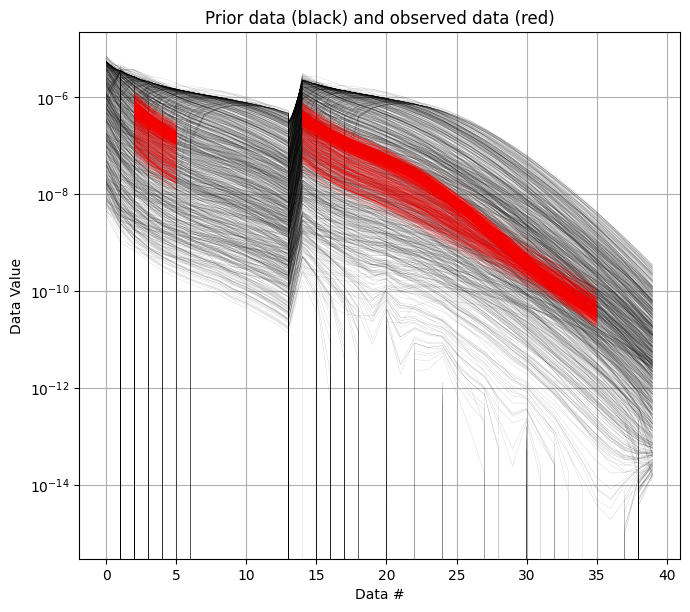

True

In [5]:
# into TWO data sets, LOW and HIGH moment.

ig.plot_data_prior(f_prior_data_h5, f_data_h5)

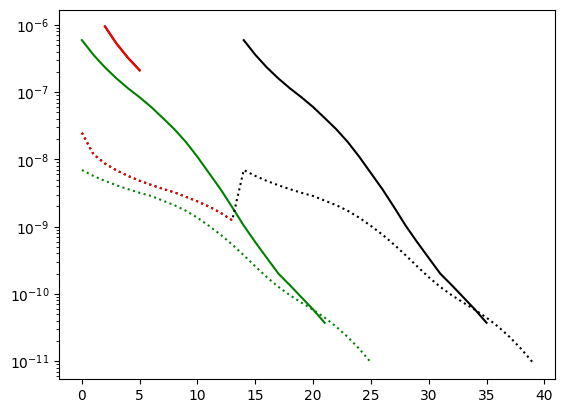

In [6]:
# Read D_obs from f_data_h5
with h5py.File(f_data_h5, 'r') as f:
    D_obs = f['D1/d_obs'][:]
    D_std = f['D1/d_std'][:]
    
with h5py.File(f_prior_data_h5, 'r') as f:
    D = f['/D1'][:]
    

nd = D_obs.shape[1]
n_low = 14
n_high = nd - n_low
# set i low to 0:n_low-1
i_low = range(n_low)
i_high = range(n_low, nd)

# Split prior data
D_low = D[:,i_low]
D_high = D[:,i_high]
# Split observed data
D_obs_low = D_obs[:,i_low]
D_std_low = D_std[:,i_low]*2
D_obs_high = D_obs[:,i_high]
D_std_high = D_std[:,i_high]*2


plt.semilogy(D_obs[0],'k-');
plt.semilogy(D_obs_low[0],'r-');
plt.semilogy(D_obs_high[0],'g-');

plt.semilogy(D[0],'k:');
plt.semilogy(D_low[0],'r:');
plt.semilogy(D_high[0],'g:');

In [7]:
f_data_dual_h5 = 'DAUGAARD_AVG_dual.h5'
ig.copy_hdf5_file(f_data_h5,f_data_dual_h5)
# Delete D1
with h5py.File(f_data_dual_h5, 'a') as f:
    # show groups in f['']
    if 'D1' in f.keys():
        del(f['D1'])
# Update D1 and D2      
with h5py.File(f_data_dual_h5, 'a') as f:
    # remove 'D1' 
    #del f['D1']
    f.create_dataset('D1/d_obs', data=D_obs_low)
    f.create_dataset('D1/d_std', data=D_std_low)
    f['D1'].attrs['noise_model'] = 'gaussian'
    f.create_dataset('D2/d_obs', data=D_obs_high)
    f.create_dataset('D2/d_std', data=D_std_high)
    f['D2'].attrs['noise_model'] = 'gaussian'

In [8]:
f_prior_data_dual_h5 = 'PRIOR_dual.h5'
ig.copy_hdf5_file(f_prior_data_h5,f_prior_data_dual_h5)

with h5py.File(f_prior_data_dual_h5, 'a') as f:
    # show groups in f['']
    if 'D1' in f.keys():
        del(f['D1'])
    f.create_dataset('D1', data=D_low)
    f.create_dataset('D2', data=D_high)

id_data = 1


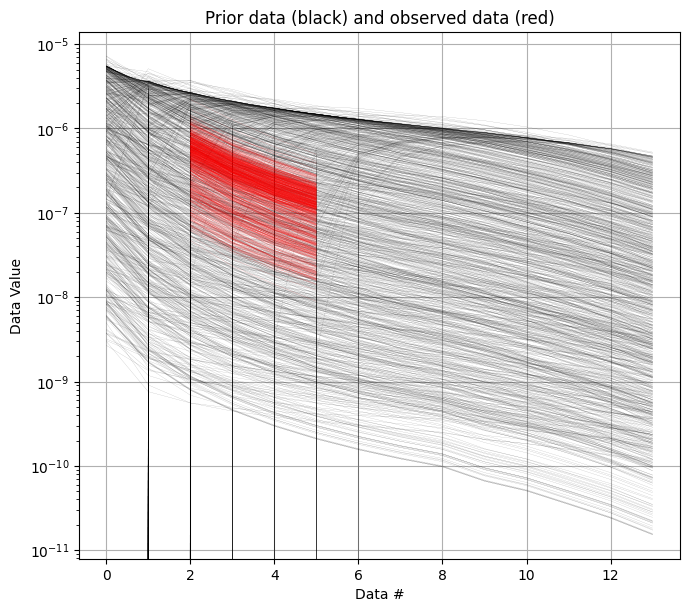

id_data = 2


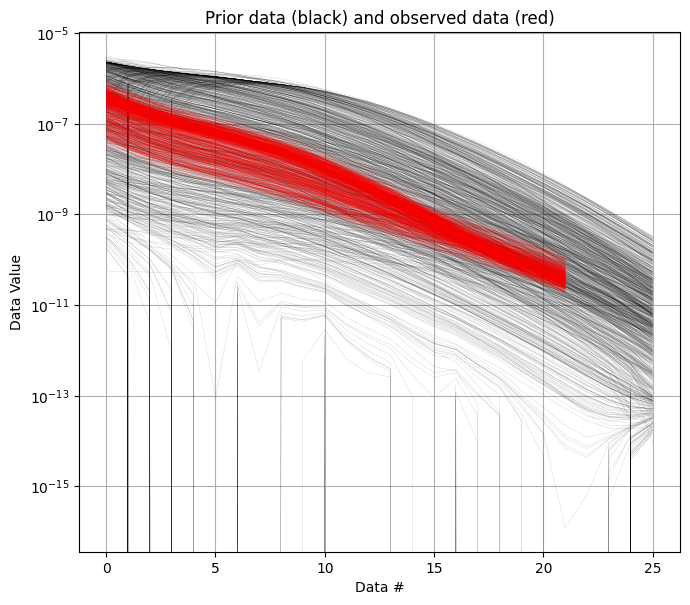

True

In [9]:
ig.plot_data_prior(f_prior_data_dual_h5, f_data_dual_h5, id=1)
ig.plot_data_prior(f_prior_data_dual_h5, f_data_dual_h5, id=2)

## Sample the posterior $\sigma(\mathbf{m})$

The posterior distribution is sampling using the extended rejection sampler.

In [10]:
N_use = 1000000 #%N
N_cpu = 6
f_post_arr = []
updatePostStat=False
for itype in [0,1,2,3]:
#for itype in [3]:
    if itype == 0:
        # LOW AND HIGH MOMENT AS ONE DATA SET
        f_post_h5 = ig.integrate_rejection(f_prior_data_h5, 
                                   f_data_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat)
    elif itype == 1:
        # LOW MOMENT ONLY
        f_post_h5 = ig.integrate_rejection(f_prior_data_dual_h5, 
                                   f_data_dual_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat,
                                   id_use = [1])
    elif itype == 2:
        # HIGH MOMENT ONLY
        f_post_h5 = ig.integrate_rejection(f_prior_data_dual_h5, 
                                   f_data_dual_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat,  
                                   id_use = [2])
    elif itype == 3:
        # JOINT INVERSION USING BOTH LOW AND HIGH MOMENT
        f_post_h5 = ig.integrate_rejection(f_prior_data_dual_h5, 
                                   f_data_dual_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat,  
                                   id_use = [1,2])

    f_post_arr.append(f_post_h5)



Loaded data from DAUGAARD_AVG.h5
Data type 1: id_use=1,    gaussian, Using 11693/11693 data
Loaded data from DAUGAARD_AVG.h5
Data type 1: id_use=1,    gaussian, Using 11693/11693 data
Data type 1: gaussian, Using 11693/11693 data
Memory size of D: 320000000
<--INTEGRATE_REJECTION-->
f_prior_h5=PRIOR_CHI2_NF_3_log-uniform_N1000000_TX07_20231016_2x4_RC20-33_Nh280_Nf12.h5
f_data_h5=DAUGAARD_AVG.h5
f_post_h5=POST_type0.h5


rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1948 [00:00<?, ?it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:04<16:08,  2.00it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:05<16:16,  1.99it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:04<15:55,  2.03it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:04<16:04,  2.01it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:04<15:49,  2.04it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1948 [00:04<16:00,  2.02it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:09<15:48,  2.03it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:09<16:01,  2.01it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:09<15:52,  2.02it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:09<16:00,  2.01it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:09<15:58,  2.01it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1948 [00:10<16:08,  1.99it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:14<15:50,  2.02it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:14<15:49,  2.02it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:14<15:55,  2.01it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:14<15:57,  2.00it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:14<15:54,  2.01it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1948 [00:15<16:00,  2.00it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:19<15:50,  2.01it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:19<15:50,  2.01it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:19<15:49,  2.01it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:19<15:48,  2.01it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:19<15:50,  2.01it/s]

rejection:   2%|███                                                                                                                                                | 40/1948 [00:19<15:44,  2.02it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1948 [00:24<15:30,  2.04it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:24<15:45,  2.01it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:24<15:44,  2.01it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:24<15:47,  2.00it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:24<15:45,  2.01it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:24<15:45,  2.01it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:29<15:40,  2.01it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:29<15:39,  2.01it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:29<15:39,  2.01it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1948 [00:29<15:32,  2.02it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:29<15:40,  2.01it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:29<15:42,  2.00it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:34<15:35,  2.01it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:34<15:35,  2.01it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:34<15:36,  2.01it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1948 [00:34<15:31,  2.02it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:34<15:37,  2.00it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:34<15:36,  2.01it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:39<15:30,  2.01it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:39<15:31,  2.01it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:39<15:31,  2.01it/s]

rejection:   4%|██████                                                                                                                                             | 80/1948 [00:39<15:27,  2.01it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:39<15:31,  2.01it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:39<15:31,  2.01it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1948 [00:44<15:19,  2.02it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:44<15:25,  2.01it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:44<15:26,  2.01it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:44<15:25,  2.01it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:44<15:26,  2.01it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:44<15:27,  2.01it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1948 [00:49<15:06,  2.04it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:49<15:20,  2.01it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:49<15:21,  2.01it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:49<15:21,  2.01it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:49<15:21,  2.01it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:49<15:22,  2.00it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1948 [00:54<15:10,  2.02it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:54<15:14,  2.01it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:54<15:14,  2.01it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:54<15:15,  2.01it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:54<15:15,  2.01it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:54<15:15,  2.01it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1948 [00:59<15:09,  2.01it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:59<15:08,  2.01it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:59<15:07,  2.02it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:59<15:08,  2.01it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:59<15:08,  2.01it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:59<15:08,  2.01it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1948 [01:04<15:05,  2.01it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [01:04<15:03,  2.01it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [01:04<15:03,  2.01it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [01:04<15:04,  2.01it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [01:04<15:04,  2.01it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [01:04<15:04,  2.01it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1948 [01:09<14:52,  2.03it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [01:09<14:59,  2.01it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [01:09<14:58,  2.01it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [01:09<14:59,  2.01it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [01:09<14:59,  2.01it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [01:09<15:00,  2.01it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1948 [01:14<14:47,  2.03it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [01:14<14:54,  2.01it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [01:14<14:55,  2.01it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [01:14<14:55,  2.01it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [01:14<14:55,  2.01it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [01:14<14:56,  2.01it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1948 [01:19<14:49,  2.01it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [01:19<14:49,  2.01it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [01:19<14:50,  2.01it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [01:19<14:50,  2.01it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [01:19<14:51,  2.01it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [01:19<14:51,  2.01it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [01:24<14:44,  2.01it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [01:24<14:45,  2.01it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [01:24<14:45,  2.01it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [01:24<14:45,  2.01it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1948 [01:24<14:53,  1.99it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [01:24<14:45,  2.01it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [01:29<14:43,  2.00it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [01:29<14:43,  2.00it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [01:29<14:43,  2.00it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [01:29<14:43,  2.00it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [01:29<14:44,  2.00it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1948 [01:29<14:49,  1.99it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [01:34<14:38,  2.00it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [01:34<14:39,  2.00it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1948 [01:34<14:42,  1.99it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [01:34<14:39,  2.00it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [01:34<14:39,  2.00it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [01:34<14:40,  2.00it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [01:39<14:34,  2.00it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [01:39<14:34,  2.00it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [01:39<14:34,  2.00it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [01:39<14:35,  2.00it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [01:39<14:35,  2.00it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1948 [01:39<14:38,  1.99it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [01:44<14:28,  2.00it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [01:44<14:29,  2.00it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [01:44<14:29,  2.00it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [01:44<14:29,  2.00it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [01:44<14:30,  2.00it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1948 [01:44<14:30,  2.00it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [01:49<14:23,  2.00it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [01:49<14:23,  2.00it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [01:49<14:22,  2.00it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [01:49<14:23,  2.00it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1948 [01:49<14:23,  2.00it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [01:49<14:24,  2.00it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [01:54<14:18,  2.00it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [01:54<14:19,  2.00it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [01:54<14:19,  2.00it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1948 [01:54<14:19,  2.00it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [01:54<14:19,  2.00it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [01:54<14:20,  2.00it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [01:59<14:13,  2.00it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [01:59<14:13,  2.00it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [01:59<14:14,  2.00it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1948 [01:59<14:14,  2.00it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [01:59<14:14,  2.00it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [01:59<14:14,  2.00it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [02:04<14:10,  2.00it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [02:04<14:10,  2.00it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [02:04<14:11,  2.00it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1948 [02:04<14:11,  2.00it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [02:04<14:11,  1.99it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [02:04<14:12,  1.99it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [02:09<13:58,  2.01it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [02:09<14:03,  2.00it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [02:09<14:03,  2.00it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [02:09<14:03,  2.00it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1948 [02:09<14:04,  2.00it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [02:09<14:04,  2.00it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [02:14<13:57,  2.01it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [02:14<13:56,  2.01it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [02:14<13:56,  2.01it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [02:14<13:55,  2.01it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1948 [02:14<13:56,  2.01it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [02:14<13:56,  2.01it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [02:19<13:51,  2.01it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [02:19<13:51,  2.01it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [02:19<13:52,  2.01it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [02:19<13:52,  2.01it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [02:19<13:51,  2.01it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1948 [02:19<13:52,  2.00it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [02:24<13:36,  2.03it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [02:24<13:47,  2.01it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [02:24<13:46,  2.01it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [02:24<13:46,  2.01it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [02:24<13:47,  2.00it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1948 [02:24<13:46,  2.01it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [02:29<13:22,  2.06it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [02:29<13:43,  2.00it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [02:29<13:42,  2.00it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [02:29<13:43,  2.00it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [02:29<13:43,  2.00it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1948 [02:29<13:42,  2.00it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [02:34<13:22,  2.04it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [02:34<13:36,  2.01it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [02:34<13:36,  2.01it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [02:34<13:36,  2.01it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [02:34<13:37,  2.01it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1948 [02:34<13:36,  2.01it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [02:39<13:22,  2.03it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [02:39<13:31,  2.01it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [02:39<13:31,  2.01it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [02:39<13:31,  2.01it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [02:39<13:32,  2.01it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1948 [02:39<13:31,  2.01it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [02:44<13:20,  2.02it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [02:44<13:27,  2.00it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [02:44<13:27,  2.00it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [02:44<13:28,  2.00it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [02:44<13:28,  2.00it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1948 [02:44<13:27,  2.00it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [02:49<13:19,  2.01it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [02:49<13:23,  2.00it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [02:49<13:23,  2.00it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [02:49<13:23,  2.00it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1948 [02:49<13:23,  2.00it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [02:49<13:24,  2.00it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [02:54<13:14,  2.01it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [02:54<13:17,  2.01it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [02:54<13:17,  2.00it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [02:54<13:17,  2.00it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [02:54<13:18,  2.00it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1948 [02:54<13:17,  2.00it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [02:59<13:11,  2.01it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [02:59<13:12,  2.01it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1948 [02:59<13:11,  2.01it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [02:59<13:12,  2.00it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [02:59<13:13,  2.00it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [02:59<13:14,  2.00it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [03:04<13:07,  2.01it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1948 [03:04<13:07,  2.00it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [03:04<13:08,  2.00it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [03:04<13:09,  2.00it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [03:04<13:09,  2.00it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [03:04<13:09,  2.00it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [03:09<13:03,  2.00it/s]

rejection:  20%|████████████████████████████▍                                                                                                                     | 380/1948 [03:09<12:58,  2.01it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [03:09<13:01,  2.01it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [03:09<13:04,  2.00it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [03:09<13:04,  2.00it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [03:09<13:04,  2.00it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [03:14<12:55,  2.01it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1948 [03:14<12:52,  2.02it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [03:14<12:55,  2.01it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [03:14<12:55,  2.01it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [03:14<12:55,  2.01it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [03:14<12:56,  2.01it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [03:18<12:49,  2.01it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [03:19<12:49,  2.01it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [03:19<12:50,  2.01it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1948 [03:19<12:51,  2.01it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [03:19<12:50,  2.01it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [03:19<12:50,  2.01it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [03:23<12:46,  2.01it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [03:24<12:46,  2.01it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [03:24<12:46,  2.01it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1948 [03:24<12:47,  2.00it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [03:24<12:46,  2.01it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [03:24<12:46,  2.01it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [03:28<12:41,  2.01it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [03:29<12:41,  2.01it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [03:29<12:41,  2.01it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [03:29<12:41,  2.01it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [03:29<12:41,  2.01it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1948 [03:29<12:43,  2.00it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [03:33<12:37,  2.01it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [03:34<12:36,  2.01it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [03:34<12:37,  2.01it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [03:34<12:36,  2.01it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1948 [03:34<12:37,  2.00it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [03:34<12:37,  2.01it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [03:38<12:31,  2.01it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [03:39<12:31,  2.01it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [03:39<12:31,  2.01it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [03:39<12:31,  2.01it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1948 [03:39<12:31,  2.01it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [03:39<12:31,  2.01it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [03:43<12:26,  2.01it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [03:44<12:26,  2.01it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [03:44<12:27,  2.01it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [03:44<12:26,  2.01it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1948 [03:44<12:26,  2.01it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [03:44<12:27,  2.01it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [03:48<12:22,  2.01it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [03:49<12:20,  2.01it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [03:49<12:22,  2.01it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [03:49<12:21,  2.01it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [03:49<12:22,  2.01it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1948 [03:49<12:21,  2.01it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [03:53<12:16,  2.01it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1948 [03:54<12:15,  2.01it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [03:54<12:16,  2.01it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [03:54<12:16,  2.01it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [03:54<12:16,  2.01it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [03:54<12:17,  2.01it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [03:58<12:12,  2.01it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [03:59<12:11,  2.01it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [03:59<12:12,  2.01it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [03:59<12:12,  2.01it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1948 [03:59<12:12,  2.00it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [03:59<12:12,  2.00it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [04:03<12:07,  2.01it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1948 [04:04<12:06,  2.01it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [04:04<12:07,  2.01it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [04:04<12:06,  2.01it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [04:04<12:07,  2.01it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [04:04<12:07,  2.01it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [04:08<12:01,  2.01it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [04:09<12:01,  2.01it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1948 [04:09<12:01,  2.01it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [04:09<12:01,  2.01it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [04:09<12:01,  2.01it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [04:09<12:02,  2.01it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [04:13<11:56,  2.01it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [04:14<11:56,  2.01it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [04:14<11:57,  2.01it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [04:14<11:57,  2.01it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1948 [04:14<11:57,  2.00it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [04:14<11:58,  2.00it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [04:18<11:53,  2.00it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1948 [04:19<11:51,  2.01it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [04:19<11:51,  2.01it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [04:19<11:52,  2.01it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [04:19<11:52,  2.01it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [04:19<11:52,  2.01it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [04:23<11:47,  2.00it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [04:24<11:47,  2.00it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1948 [04:24<11:47,  2.00it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [04:24<11:48,  2.00it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [04:24<11:48,  2.00it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [04:24<11:48,  2.00it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [04:28<11:42,  2.01it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [04:29<11:42,  2.01it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [04:29<11:42,  2.01it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1948 [04:29<11:42,  2.00it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [04:29<11:42,  2.00it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [04:29<11:43,  2.00it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [04:33<11:36,  2.01it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [04:34<11:36,  2.01it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1948 [04:34<11:36,  2.01it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [04:34<11:37,  2.01it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [04:34<11:37,  2.01it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [04:34<11:37,  2.00it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [04:38<11:32,  2.01it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [04:39<11:32,  2.01it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [04:39<11:32,  2.01it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1948 [04:39<11:32,  2.01it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [04:39<11:32,  2.01it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [04:39<11:33,  2.00it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [04:43<11:28,  2.00it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1948 [04:44<11:26,  2.01it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [04:44<11:27,  2.01it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [04:44<11:27,  2.00it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [04:44<11:27,  2.00it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [04:44<11:28,  2.00it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [04:48<11:23,  2.00it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [04:49<11:22,  2.01it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1948 [04:49<11:22,  2.00it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [04:49<11:23,  2.00it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [04:49<11:22,  2.00it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [04:49<11:23,  2.00it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [04:53<11:18,  2.00it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [04:54<11:17,  2.01it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1948 [04:54<11:17,  2.00it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [04:54<11:17,  2.00it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [04:54<11:18,  2.00it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [04:54<11:18,  2.00it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [04:58<11:12,  2.01it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [04:59<11:11,  2.01it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1948 [04:58<11:11,  2.01it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [04:59<11:11,  2.01it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [04:59<11:12,  2.01it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [04:59<11:12,  2.01it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [05:03<11:07,  2.01it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [05:03<11:04,  2.01it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1948 [05:03<11:06,  2.01it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [05:04<11:07,  2.01it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [05:04<11:07,  2.00it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [05:04<11:07,  2.00it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [05:08<11:03,  2.00it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1948 [05:08<11:02,  2.01it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [05:09<11:02,  2.00it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [05:09<11:02,  2.01it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [05:09<11:02,  2.00it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [05:09<11:04,  2.00it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [05:13<10:57,  2.01it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1948 [05:13<10:57,  2.00it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [05:14<10:57,  2.01it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [05:14<10:58,  2.00it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [05:14<10:58,  2.00it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [05:14<10:58,  2.00it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [05:18<10:53,  2.00it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1948 [05:18<10:51,  2.01it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [05:19<10:52,  2.01it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [05:18<10:52,  2.01it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [05:19<10:52,  2.01it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [05:19<10:53,  2.00it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [05:23<10:46,  2.01it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [05:23<10:46,  2.01it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1948 [05:23<10:46,  2.01it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [05:24<10:47,  2.01it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [05:23<10:47,  2.01it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [05:24<10:47,  2.01it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [05:28<10:41,  2.01it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [05:28<10:41,  2.01it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [05:28<10:41,  2.01it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [05:29<10:41,  2.01it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [05:29<10:41,  2.01it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1948 [05:28<10:42,  2.00it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [05:33<10:37,  2.01it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [05:33<10:36,  2.01it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [05:33<10:36,  2.01it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [05:33<10:36,  2.01it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1948 [05:33<10:36,  2.01it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [05:34<10:37,  2.01it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [05:38<10:31,  2.01it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [05:38<10:30,  2.01it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1948 [05:38<10:30,  2.01it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [05:38<10:31,  2.01it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [05:38<10:31,  2.01it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [05:39<10:31,  2.01it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [05:43<10:26,  2.01it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [05:43<10:26,  2.01it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [05:43<10:26,  2.01it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1948 [05:43<10:26,  2.01it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [05:43<10:26,  2.01it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [05:44<10:26,  2.01it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [05:48<10:20,  2.01it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [05:48<10:21,  2.01it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [05:48<10:22,  2.01it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [05:48<10:21,  2.01it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1948 [05:48<10:22,  2.01it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [05:48<10:22,  2.01it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [05:53<10:14,  2.01it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [05:53<10:15,  2.01it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [05:53<10:16,  2.01it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [05:53<10:15,  2.01it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1948 [05:53<10:15,  2.01it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [05:53<10:16,  2.01it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [05:58<10:11,  2.01it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1948 [05:58<10:05,  2.03it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [05:58<10:10,  2.01it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [05:58<10:11,  2.01it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [05:58<10:11,  2.01it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [05:58<10:11,  2.01it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [06:03<10:04,  2.02it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1948 [06:03<10:03,  2.02it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [06:03<10:04,  2.02it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [06:03<10:04,  2.02it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [06:03<10:04,  2.02it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [06:03<10:04,  2.02it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [06:08<09:59,  2.02it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [06:08<10:00,  2.01it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [06:08<09:59,  2.02it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [06:08<10:00,  2.01it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [06:08<10:00,  2.01it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1948 [06:08<10:01,  2.01it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [06:13<09:56,  2.01it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [06:13<09:52,  2.02it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [06:13<09:54,  2.02it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [06:13<09:55,  2.01it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [06:13<09:55,  2.01it/s]

rejection:  39%|████████████████████████████████████████████████████████▏                                                                                         | 750/1948 [06:13<09:56,  2.01it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [06:18<09:51,  2.01it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [06:18<09:44,  2.04it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1948 [06:18<09:49,  2.02it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [06:18<09:51,  2.01it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [06:18<09:51,  2.01it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [06:18<09:51,  2.01it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [06:23<09:48,  2.00it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [06:23<09:38,  2.04it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1948 [06:23<09:39,  2.03it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [06:23<09:47,  2.01it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [06:23<09:47,  2.01it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [06:23<09:48,  2.00it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [06:28<09:41,  2.01it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [06:28<09:38,  2.02it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [06:28<09:39,  2.02it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1948 [06:28<09:42,  2.00it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [06:28<09:40,  2.01it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [06:28<09:40,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [06:33<09:36,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [06:33<09:36,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [06:33<09:35,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1948 [06:33<09:37,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [06:33<09:35,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [06:33<09:35,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [06:38<09:31,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [06:38<09:32,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [06:38<09:30,  2.02it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [06:38<09:30,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [06:38<09:30,  2.01it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1948 [06:38<09:32,  2.01it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [06:43<09:24,  2.02it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [06:43<09:30,  2.00it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [06:43<09:24,  2.02it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [06:43<09:24,  2.02it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1948 [06:43<09:25,  2.01it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [06:43<09:25,  2.01it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [06:48<09:21,  2.01it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [06:48<09:21,  2.01it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [06:48<09:25,  2.00it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [06:48<09:21,  2.01it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [06:48<09:21,  2.01it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1948 [06:48<09:21,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [06:53<09:16,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [06:53<09:19,  2.00it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1948 [06:53<09:16,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [06:53<09:17,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [06:53<09:16,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [06:53<09:17,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [06:58<09:12,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [06:58<09:11,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [06:58<09:12,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1948 [06:58<09:12,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [06:58<09:12,  2.01it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [06:58<09:14,  2.00it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [07:03<09:07,  2.01it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [07:03<09:08,  2.00it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [07:03<09:07,  2.01it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1948 [07:03<09:07,  2.01it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [07:03<09:07,  2.01it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [07:03<09:07,  2.01it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [07:08<09:02,  2.01it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [07:08<09:03,  2.00it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [07:08<09:02,  2.01it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [07:08<09:03,  2.01it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [07:08<09:03,  2.00it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1948 [07:08<09:03,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [07:13<08:57,  2.01it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [07:13<08:58,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [07:13<08:57,  2.01it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [07:13<08:57,  2.01it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [07:13<08:58,  2.01it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1948 [07:13<08:57,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [07:18<08:54,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [07:18<08:53,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [07:18<08:53,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1948 [07:18<08:53,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [07:18<08:54,  2.00it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [07:18<08:54,  2.00it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [07:23<08:48,  2.00it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [07:23<08:48,  2.01it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1948 [07:23<08:47,  2.00it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [07:23<08:49,  2.00it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [07:23<08:48,  2.00it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [07:23<08:49,  2.00it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [07:28<08:44,  2.00it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [07:28<08:43,  2.00it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [07:28<08:44,  2.00it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1948 [07:28<08:43,  2.00it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [07:28<08:44,  2.00it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [07:28<08:44,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [07:33<08:39,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [07:33<08:39,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1948 [07:33<08:38,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [07:33<08:39,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [07:33<08:40,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [07:33<08:39,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [07:38<08:33,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [07:38<08:32,  2.01it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1948 [07:38<08:33,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [07:38<08:34,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [07:38<08:34,  2.00it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [07:38<08:34,  2.00it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [07:43<08:28,  2.00it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [07:43<08:28,  2.01it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [07:43<08:28,  2.01it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1948 [07:43<08:27,  2.01it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [07:43<08:29,  2.00it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [07:43<08:28,  2.00it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [07:48<08:23,  2.00it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [07:48<08:22,  2.01it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1948 [07:48<08:22,  2.00it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [07:48<08:23,  2.00it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [07:48<08:23,  2.00it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [07:48<08:23,  2.00it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [07:52<08:17,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1948 [07:53<08:17,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [07:53<08:17,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [07:53<08:18,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [07:53<08:19,  2.00it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [07:53<08:18,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [07:57<08:13,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [07:58<08:12,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1948 [07:58<08:12,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [07:58<08:12,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [07:58<08:12,  2.01it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [07:58<08:12,  2.01it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [08:02<08:07,  2.01it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [08:03<08:07,  2.01it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1948 [08:03<08:07,  2.01it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [08:03<08:07,  2.01it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [08:03<08:07,  2.01it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [08:03<08:08,  2.00it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [08:07<08:02,  2.01it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [08:08<08:03,  2.00it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [08:08<08:03,  2.01it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [08:08<08:03,  2.01it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1948 [08:08<08:03,  2.00it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [08:08<08:03,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [08:12<07:58,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [08:13<07:58,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [08:13<07:58,  2.01it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [08:13<07:58,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1948 [08:13<07:58,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [08:13<07:58,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [08:17<07:53,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [08:18<07:53,  2.01it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [08:18<07:53,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1948 [08:18<07:52,  2.01it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [08:18<07:53,  2.00it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [08:18<07:53,  2.00it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [08:22<07:48,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [08:23<07:47,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1948 [08:23<07:47,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [08:23<07:47,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [08:23<07:47,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [08:23<07:47,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [08:27<07:42,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1948 [08:28<07:42,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [08:28<07:43,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [08:28<07:43,  2.01it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [08:28<07:43,  2.00it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [08:28<07:43,  2.01it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [08:32<07:38,  2.01it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [08:33<07:38,  2.00it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [08:33<07:38,  2.00it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1948 [08:33<07:38,  2.00it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [08:33<07:38,  2.00it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [08:33<07:38,  2.00it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [08:37<07:33,  2.00it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [08:38<07:33,  2.00it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [08:38<07:33,  2.01it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [08:38<07:33,  2.00it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▍                                                                   | 1040/1948 [08:38<07:33,  2.00it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [08:38<07:34,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [08:42<07:28,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [08:43<07:27,  2.01it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [08:43<07:28,  2.01it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [08:43<07:28,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [08:43<07:28,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▏                                                                  | 1050/1948 [08:43<07:28,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [08:47<07:23,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▉                                                                  | 1060/1948 [08:48<07:22,  2.01it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [08:48<07:23,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [08:48<07:23,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [08:48<07:24,  2.00it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [08:48<07:24,  2.00it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [08:52<07:19,  2.00it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [08:53<07:18,  2.00it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▋                                                                 | 1070/1948 [08:53<07:18,  2.00it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [08:53<07:19,  2.00it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [08:53<07:19,  2.00it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [08:53<07:19,  2.00it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [08:57<07:13,  2.00it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▍                                                                | 1080/1948 [08:58<07:11,  2.01it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [08:58<07:13,  2.00it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [08:58<07:14,  2.00it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [08:58<07:13,  2.00it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [08:58<07:14,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [09:02<07:09,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▏                                                               | 1090/1948 [09:02<07:01,  2.03it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [09:03<07:08,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [09:03<07:09,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [09:03<07:08,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [09:03<07:09,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▉                                                               | 1100/1948 [09:07<06:54,  2.05it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [09:07<07:04,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [09:08<07:04,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [09:08<07:04,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [09:08<07:04,  2.00it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [09:08<07:05,  2.00it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [09:12<06:59,  2.00it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1948 [09:12<06:53,  2.03it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [09:13<07:00,  2.00it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [09:13<06:59,  2.00it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [09:13<07:00,  2.00it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [09:13<06:59,  2.00it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [09:17<06:55,  2.00it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1948 [09:17<06:50,  2.02it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [09:18<06:54,  2.00it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [09:18<06:55,  2.00it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [09:18<06:54,  2.00it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [09:18<06:55,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [09:22<06:48,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1948 [09:22<06:45,  2.02it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [09:23<06:48,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [09:23<06:49,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [09:23<06:49,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [09:23<06:49,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [09:27<06:44,  2.00it/s]

rejection:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1948 [09:27<06:41,  2.01it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [09:28<06:44,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [09:28<06:44,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [09:28<06:44,  2.00it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [09:28<06:44,  2.00it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [09:32<06:38,  2.00it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1948 [09:32<06:36,  2.01it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [09:33<06:38,  2.00it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [09:33<06:39,  2.00it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [09:33<06:39,  2.00it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [09:33<06:39,  2.00it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [09:37<06:33,  2.00it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1948 [09:37<06:31,  2.01it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [09:38<06:33,  2.00it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [09:38<06:33,  2.01it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [09:38<06:33,  2.00it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [09:38<06:33,  2.00it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1948 [09:42<06:27,  2.01it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [09:42<06:29,  2.00it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [09:43<06:28,  2.01it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [09:43<06:28,  2.00it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [09:43<06:28,  2.01it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [09:43<06:28,  2.00it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [09:47<06:22,  2.01it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1948 [09:47<06:22,  2.01it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [09:48<06:23,  2.00it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [09:48<06:24,  2.00it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [09:48<06:24,  2.00it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [09:48<06:23,  2.00it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1948 [09:52<06:17,  2.01it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [09:52<06:19,  2.00it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [09:53<06:18,  2.00it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [09:53<06:18,  2.01it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [09:53<06:18,  2.01it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [09:53<06:19,  2.00it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1948 [09:57<06:13,  2.00it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [09:57<06:13,  2.00it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [09:58<06:12,  2.01it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [09:58<06:13,  2.00it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [09:58<06:13,  2.00it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [09:58<06:13,  2.00it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [10:02<06:08,  2.00it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1948 [10:02<06:08,  2.00it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [10:03<06:08,  2.01it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [10:03<06:08,  2.01it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [10:03<06:08,  2.01it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [10:03<06:08,  2.00it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [10:07<06:03,  2.00it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1948 [10:07<06:02,  2.01it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [10:08<06:03,  2.01it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [10:08<06:03,  2.00it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [10:08<06:03,  2.00it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [10:08<06:03,  2.00it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [10:12<05:58,  2.00it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1948 [10:12<05:58,  2.00it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [10:13<05:58,  2.01it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [10:13<05:58,  2.00it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [10:13<05:58,  2.00it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [10:13<05:59,  2.00it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1948 [10:17<05:51,  2.02it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [10:17<05:53,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [10:18<05:53,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [10:18<05:53,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [10:18<05:53,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [10:18<05:53,  2.00it/s]

rejection:  64%|█████████████████████████████████████████████████████████████████████████████████████████████                                                    | 1250/1948 [10:22<05:47,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [10:22<05:47,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [10:23<05:47,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [10:23<05:47,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [10:23<05:47,  2.01it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [10:23<05:47,  2.01it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [10:27<05:43,  2.01it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 1260/1948 [10:27<05:43,  2.00it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [10:28<05:43,  2.01it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [10:28<05:43,  2.01it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [10:28<05:43,  2.01it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [10:28<05:43,  2.01it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 1270/1948 [10:32<05:35,  2.02it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [10:32<05:38,  2.01it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [10:33<05:38,  2.01it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [10:33<05:38,  2.01it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [10:33<05:38,  2.01it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [10:33<05:38,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 1280/1948 [10:37<05:26,  2.05it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [10:37<05:33,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [10:38<05:33,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [10:38<05:33,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [10:38<05:33,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [10:38<05:33,  2.01it/s]

rejection:  66%|████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 1290/1948 [10:41<05:19,  2.06it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [10:42<05:28,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [10:43<05:28,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [10:42<05:28,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [10:43<05:28,  2.01it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [10:43<05:28,  2.01it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 1300/1948 [10:46<05:14,  2.06it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [10:47<05:23,  2.01it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [10:48<05:23,  2.01it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [10:48<05:23,  2.01it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [10:47<05:23,  2.01it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [10:48<05:23,  2.01it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 1310/1948 [10:51<05:12,  2.04it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [10:52<05:18,  2.01it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [10:53<05:17,  2.01it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [10:52<05:17,  2.01it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [10:53<05:18,  2.01it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [10:52<05:18,  2.01it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 1320/1948 [10:56<05:09,  2.03it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [10:57<05:12,  2.01it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [10:57<05:12,  2.01it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [10:57<05:12,  2.01it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [10:57<05:12,  2.01it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [10:57<05:12,  2.01it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1948 [11:01<05:05,  2.03it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [11:02<05:06,  2.02it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [11:02<05:07,  2.02it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [11:02<05:07,  2.02it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [11:02<05:07,  2.02it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [11:02<05:07,  2.01it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1948 [11:06<05:00,  2.02it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [11:07<05:01,  2.02it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [11:07<05:01,  2.02it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [11:07<05:01,  2.02it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [11:07<05:02,  2.02it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [11:07<05:02,  2.02it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1948 [11:11<04:57,  2.01it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [11:12<04:57,  2.01it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [11:12<04:57,  2.01it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [11:12<04:57,  2.01it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [11:12<04:57,  2.01it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [11:12<04:57,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1948 [11:16<04:53,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [11:17<04:53,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [11:17<04:53,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [11:17<04:53,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [11:17<04:53,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [11:17<04:53,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1948 [11:21<04:48,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [11:22<04:48,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [11:22<04:48,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [11:22<04:48,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [11:22<04:48,  2.01it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [11:22<04:48,  2.01it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1948 [11:26<04:42,  2.01it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [11:27<04:41,  2.02it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [11:27<04:43,  2.01it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [11:27<04:43,  2.01it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [11:27<04:43,  2.01it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [11:27<04:43,  2.01it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1948 [11:31<04:37,  2.01it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [11:32<04:38,  2.01it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [11:32<04:37,  2.01it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [11:32<04:37,  2.01it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [11:32<04:37,  2.01it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [11:32<04:38,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1948 [11:36<04:32,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [11:37<04:33,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [11:37<04:32,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [11:37<04:33,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [11:37<04:33,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [11:37<04:33,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1948 [11:41<04:28,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [11:42<04:28,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [11:42<04:28,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [11:42<04:28,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [11:42<04:28,  2.01it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [11:42<04:28,  2.01it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1948 [11:46<04:23,  2.00it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [11:47<04:23,  2.01it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [11:47<04:23,  2.01it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [11:47<04:23,  2.01it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [11:47<04:23,  2.01it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [11:47<04:23,  2.01it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1948 [11:51<04:18,  2.01it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [11:52<04:18,  2.01it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [11:52<04:18,  2.01it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [11:52<04:18,  2.01it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [11:52<04:18,  2.01it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [11:52<04:18,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1948 [11:56<04:13,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [11:57<04:13,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [11:57<04:11,  2.02it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [11:57<04:13,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [11:57<04:13,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [11:57<04:13,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1948 [12:01<04:08,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [12:02<04:08,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [12:02<04:07,  2.02it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [12:02<04:08,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [12:02<04:08,  2.01it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [12:02<04:08,  2.01it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 1460/1948 [12:06<04:03,  2.01it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [12:07<04:03,  2.01it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [12:07<04:03,  2.01it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [12:07<04:03,  2.01it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [12:07<04:03,  2.01it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [12:07<04:03,  2.01it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 1470/1948 [12:11<03:57,  2.01it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [12:12<03:58,  2.01it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [12:12<03:58,  2.01it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [12:12<03:58,  2.01it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [12:12<03:58,  2.01it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [12:12<03:58,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 1480/1948 [12:16<03:52,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [12:17<03:53,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [12:17<03:53,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [12:17<03:53,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [12:17<03:53,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [12:17<03:53,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 1490/1948 [12:21<03:47,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [12:22<03:48,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [12:22<03:48,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [12:22<03:48,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [12:22<03:48,  2.01it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [12:22<03:48,  2.01it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 1500/1948 [12:26<03:42,  2.01it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [12:27<03:43,  2.01it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [12:27<03:43,  2.01it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [12:27<03:43,  2.01it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [12:27<03:43,  2.01it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [12:27<03:43,  2.01it/s]

rejection:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 1510/1948 [12:31<03:38,  2.01it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [12:32<03:38,  2.01it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [12:32<03:38,  2.01it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [12:32<03:38,  2.01it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [12:32<03:38,  2.01it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [12:32<03:38,  2.01it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 1520/1948 [12:36<03:33,  2.01it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [12:37<03:33,  2.01it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [12:37<03:33,  2.01it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [12:37<03:34,  2.00it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [12:37<03:33,  2.01it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [12:37<03:34,  2.00it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 1530/1948 [12:41<03:28,  2.00it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [12:42<03:29,  2.00it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [12:42<03:28,  2.00it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [12:42<03:29,  2.00it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [12:42<03:29,  2.00it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [12:42<03:29,  2.00it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 1540/1948 [12:46<03:23,  2.00it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [12:47<03:24,  2.00it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [12:47<03:24,  2.00it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [12:47<03:24,  2.00it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [12:47<03:24,  2.00it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [12:47<03:24,  2.00it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1948 [12:51<03:18,  2.00it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [12:52<03:19,  2.00it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [12:52<03:18,  2.01it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [12:52<03:19,  2.00it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [12:52<03:19,  2.00it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [12:52<03:19,  2.00it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1948 [12:56<03:13,  2.00it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [12:57<03:13,  2.01it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [12:57<03:14,  2.00it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [12:57<03:14,  2.00it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [12:57<03:14,  2.00it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [12:57<03:14,  2.00it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1948 [13:01<03:08,  2.00it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [13:02<03:09,  2.00it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [13:02<03:08,  2.01it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [13:02<03:08,  2.01it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [13:02<03:09,  2.00it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [13:02<03:09,  2.00it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1948 [13:06<03:03,  2.01it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [13:07<03:03,  2.01it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [13:07<03:03,  2.01it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [13:07<03:03,  2.01it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [13:07<03:03,  2.01it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [13:07<03:04,  2.00it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1948 [13:11<02:58,  2.00it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [13:12<02:59,  2.00it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [13:12<02:59,  2.00it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [13:12<02:59,  2.00it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [13:12<02:59,  2.00it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [13:12<02:59,  2.00it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1948 [13:16<02:53,  2.00it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [13:17<02:54,  2.00it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [13:17<02:53,  2.01it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [13:17<02:54,  2.00it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [13:17<02:54,  2.00it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [13:17<02:54,  2.00it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1948 [13:21<02:48,  2.00it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [13:22<02:49,  2.00it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [13:22<02:49,  2.00it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [13:22<02:49,  2.00it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [13:22<02:49,  2.00it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [13:22<02:49,  2.00it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1948 [13:26<02:43,  2.00it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [13:27<02:44,  2.00it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [13:27<02:44,  2.00it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [13:27<02:44,  2.00it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [13:27<02:44,  2.00it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [13:27<02:44,  2.00it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1948 [13:31<02:38,  2.00it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [13:32<02:39,  2.00it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [13:32<02:39,  2.00it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [13:32<02:39,  2.00it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [13:32<02:39,  2.00it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [13:32<02:39,  2.00it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1948 [13:36<02:33,  2.00it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [13:37<02:34,  2.00it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [13:37<02:34,  2.00it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [13:37<02:34,  2.00it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [13:37<02:34,  2.00it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [13:37<02:34,  2.00it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1948 [13:41<02:29,  2.00it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [13:42<02:29,  2.00it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [13:42<02:29,  2.00it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [13:42<02:29,  2.00it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [13:42<02:29,  2.00it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [13:42<02:29,  2.00it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1660/1948 [13:46<02:23,  2.00it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [13:47<02:24,  2.00it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [13:47<02:24,  2.00it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [13:47<02:24,  2.00it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [13:47<02:24,  2.00it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [13:47<02:24,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1670/1948 [13:51<02:18,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [13:52<02:19,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [13:52<02:19,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [13:52<02:19,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [13:52<02:19,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [13:52<02:19,  2.00it/s]

rejection:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 1680/1948 [13:56<02:13,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [13:56<02:14,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [13:57<02:14,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [13:57<02:14,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [13:57<02:14,  2.00it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [13:57<02:14,  2.00it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1690/1948 [14:01<02:08,  2.00it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [14:01<02:09,  2.00it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [14:02<02:09,  2.00it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [14:02<02:09,  2.00it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [14:02<02:09,  2.00it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [14:02<02:09,  2.00it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1700/1948 [14:06<02:03,  2.00it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [14:06<02:04,  2.00it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [14:07<02:04,  2.01it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [14:07<02:04,  2.00it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [14:07<02:04,  2.00it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [14:07<02:04,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1710/1948 [14:11<01:59,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [14:12<01:59,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [14:12<01:59,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [14:12<01:59,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [14:12<01:59,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [14:12<01:59,  2.00it/s]

rejection:  88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1720/1948 [14:16<01:53,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [14:17<01:54,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [14:17<01:54,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [14:17<01:54,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [14:17<01:54,  2.00it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [14:17<01:54,  2.00it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1730/1948 [14:21<01:49,  2.00it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [14:22<01:49,  2.00it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [14:22<01:49,  2.00it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [14:22<01:49,  2.00it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [14:22<01:49,  2.00it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [14:22<01:49,  2.00it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1740/1948 [14:26<01:43,  2.00it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [14:27<01:44,  2.00it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [14:27<01:44,  2.00it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [14:27<01:44,  2.00it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [14:27<01:44,  2.00it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [14:27<01:44,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1750/1948 [14:31<01:38,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [14:31<01:39,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [14:32<01:39,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [14:32<01:39,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [14:32<01:39,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [14:32<01:39,  2.00it/s]

rejection:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1760/1948 [14:36<01:33,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [14:36<01:34,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [14:37<01:34,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [14:37<01:34,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [14:37<01:34,  2.00it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [14:37<01:34,  2.00it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1770/1948 [14:41<01:28,  2.00it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [14:41<01:29,  2.00it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [14:42<01:29,  2.00it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [14:42<01:29,  2.00it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [14:42<01:29,  2.00it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [14:42<01:29,  2.00it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1948 [14:46<01:23,  2.00it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [14:46<01:24,  2.00it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [14:47<01:24,  2.01it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [14:47<01:24,  2.01it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [14:47<01:24,  2.00it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [14:47<01:24,  2.00it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1948 [14:51<01:18,  2.01it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [14:51<01:19,  2.01it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [14:52<01:19,  2.01it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [14:52<01:19,  2.01it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [14:52<01:19,  2.01it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [14:52<01:19,  2.00it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1948 [14:56<01:13,  2.00it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [14:56<01:14,  2.00it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [14:57<01:14,  2.01it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [14:57<01:14,  2.00it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [14:57<01:14,  2.00it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [14:57<01:14,  2.00it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1948 [15:01<01:08,  2.01it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [15:01<01:09,  2.01it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [15:02<01:09,  2.01it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [15:02<01:09,  2.01it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [15:02<01:09,  2.01it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [15:02<01:09,  2.01it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1948 [15:06<01:03,  2.00it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [15:06<01:04,  2.00it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [15:07<01:04,  2.00it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [15:07<01:04,  2.00it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [15:07<01:04,  2.00it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [15:07<01:04,  2.00it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1948 [15:11<00:58,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [15:11<00:59,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [15:12<00:59,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [15:12<00:59,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [15:12<00:59,  2.00it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [15:12<00:59,  2.00it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1948 [15:16<00:53,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [15:16<00:54,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [15:17<00:54,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [15:17<00:54,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [15:17<00:54,  2.01it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [15:17<00:54,  2.01it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1948 [15:21<00:48,  2.01it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [15:21<00:49,  2.01it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [15:22<00:49,  2.01it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [15:22<00:49,  2.01it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [15:22<00:49,  2.01it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [15:22<00:49,  2.01it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1948 [15:26<00:43,  2.01it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [15:26<00:44,  2.01it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [15:27<00:44,  2.02it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [15:27<00:44,  2.01it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [15:27<00:44,  2.01it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [15:27<00:44,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1870/1948 [15:31<00:38,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [15:31<00:39,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [15:31<00:38,  2.04it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [15:32<00:39,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [15:32<00:39,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [15:32<00:39,  2.01it/s]

rejection:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1880/1948 [15:36<00:33,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [15:36<00:34,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [15:36<00:33,  2.05it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [15:37<00:34,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [15:37<00:34,  2.01it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [15:37<00:34,  2.01it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1890/1948 [15:41<00:28,  2.01it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [15:41<00:29,  2.01it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [15:41<00:28,  2.04it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [15:42<00:29,  2.01it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [15:42<00:29,  2.01it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [15:42<00:29,  2.00it/s]

rejection:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1900/1948 [15:46<00:23,  2.01it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [15:46<00:24,  2.01it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [15:46<00:24,  2.03it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [15:47<00:24,  2.01it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [15:47<00:24,  2.01it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [15:47<00:24,  2.01it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1910/1948 [15:50<00:18,  2.01it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [15:51<00:19,  2.04it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [15:51<00:19,  2.01it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [15:52<00:19,  2.01it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [15:52<00:19,  2.01it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [15:52<00:19,  2.01it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 1920/1948 [15:55<00:13,  2.01it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [15:56<00:14,  2.05it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [15:56<00:14,  2.01it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [15:57<00:14,  2.01it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [15:57<00:14,  2.01it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [15:57<00:14,  2.01it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1930/1948 [16:00<00:08,  2.01it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [16:01<00:09,  2.05it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [16:01<00:09,  2.01it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [16:02<00:09,  2.01it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [16:02<00:09,  2.01it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [16:02<00:09,  2.01it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 1940/1948 [16:05<00:03,  2.01it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [16:06<00:04,  2.03it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [16:06<00:04,  2.01it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [16:07<00:04,  2.01it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [16:06<00:04,  2.01it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [16:07<00:04,  2.01it/s]

integrate_rejection: Time=971.6s/11693 soundings, 83.1ms/sounding, 12.0it/s
integrate_rejection: T_av=15.9
integrate_rejection: EV_av=-41.9
Loaded data from DAUGAARD_AVG_dual.h5
Data type 1: id_use=1,    gaussian, Using 11693/11693 data
Loaded data from DAUGAARD_AVG_dual.h5
Data type 1: id_use=1,    gaussian, Using 11693/11693 data
Data type 1: gaussian, Using 11693/11693 data
Memory size of D: 112000000
<--INTEGRATE_REJECTION-->
f_prior_h5=PRIOR_dual.h5
f_data_h5=DAUGAARD_AVG_dual.h5
f_post_h5=POST_type1.h5


rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1948 [00:00<?, ?it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1948 [00:02<06:38,  4.87it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:02<06:52,  4.70it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:02<06:58,  4.63it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:02<06:52,  4.71it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:02<07:09,  4.52it/s]

rejection:   1%|▊                                                                                                                                                  | 10/1949 [00:02<07:06,  4.55it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1948 [00:04<06:41,  4.81it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:04<06:45,  4.76it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:04<06:53,  4.66it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:04<06:51,  4.69it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:04<06:56,  4.63it/s]

rejection:   1%|█▌                                                                                                                                                 | 20/1949 [00:04<06:58,  4.61it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1948 [00:06<06:29,  4.92it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:06<06:38,  4.82it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:06<06:53,  4.64it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:06<06:54,  4.63it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:06<06:58,  4.59it/s]

rejection:   2%|██▎                                                                                                                                                | 30/1949 [00:06<06:58,  4.58it/s]

rejection:   2%|███                                                                                                                                                | 40/1948 [00:07<06:14,  5.10it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:08<06:38,  4.79it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:08<06:52,  4.63it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:08<06:51,  4.64it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:08<06:54,  4.61it/s]

rejection:   2%|███                                                                                                                                                | 40/1949 [00:08<06:54,  4.60it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1948 [00:09<06:02,  5.24it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:10<06:40,  4.74it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:10<06:47,  4.66it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:10<06:46,  4.67it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:10<06:47,  4.66it/s]

rejection:   3%|███▊                                                                                                                                               | 50/1949 [00:10<06:49,  4.64it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1948 [00:11<06:12,  5.07it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:12<06:38,  4.74it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:12<06:42,  4.69it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:12<06:42,  4.69it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:12<06:42,  4.69it/s]

rejection:   3%|████▌                                                                                                                                              | 60/1949 [00:13<06:51,  4.59it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1948 [00:13<06:15,  5.00it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:14<06:31,  4.80it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:14<06:35,  4.75it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:15<06:45,  4.63it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:15<06:45,  4.64it/s]

rejection:   4%|█████▎                                                                                                                                             | 70/1949 [00:15<06:52,  4.55it/s]

rejection:   4%|██████                                                                                                                                             | 80/1948 [00:16<06:17,  4.95it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:16<06:29,  4.79it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:16<06:30,  4.78it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:17<06:40,  4.67it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:17<06:39,  4.68it/s]

rejection:   4%|██████                                                                                                                                             | 80/1949 [00:17<06:44,  4.62it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1948 [00:18<06:15,  4.95it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:18<06:29,  4.78it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:19<06:29,  4.78it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:19<06:35,  4.70it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:19<06:41,  4.63it/s]

rejection:   5%|██████▊                                                                                                                                            | 90/1949 [00:19<06:47,  4.56it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1948 [00:19<06:04,  5.07it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:20<06:26,  4.79it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:21<06:26,  4.78it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:21<06:31,  4.72it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:21<06:35,  4.67it/s]

rejection:   5%|███████▍                                                                                                                                          | 100/1949 [00:21<06:49,  4.52it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1948 [00:21<06:07,  5.00it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:23<06:23,  4.79it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:23<06:23,  4.79it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:23<06:28,  4.73it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:23<06:37,  4.63it/s]

rejection:   6%|████████▏                                                                                                                                         | 110/1949 [00:24<06:47,  4.51it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1948 [00:24<06:08,  4.96it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:25<06:22,  4.78it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:25<06:21,  4.79it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:25<06:25,  4.75it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:25<06:39,  4.58it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1948 [00:26<06:08,  4.94it/s]

rejection:   6%|████████▉                                                                                                                                         | 120/1949 [00:26<06:38,  4.59it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [00:27<06:19,  4.79it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [00:27<06:21,  4.77it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [00:27<06:22,  4.76it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1948 [00:27<06:00,  5.01it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [00:28<06:38,  4.56it/s]

rejection:   7%|█████████▋                                                                                                                                        | 130/1949 [00:28<06:31,  4.64it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [00:29<06:17,  4.80it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [00:29<06:19,  4.77it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [00:29<06:20,  4.76it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1948 [00:30<06:00,  4.98it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [00:30<06:25,  4.69it/s]

rejection:   7%|██████████▍                                                                                                                                       | 140/1949 [00:30<06:37,  4.55it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [00:31<06:16,  4.78it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [00:31<06:15,  4.79it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [00:31<06:16,  4.77it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1948 [00:32<06:08,  4.85it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [00:32<06:23,  4.70it/s]

rejection:   8%|███████████▏                                                                                                                                      | 150/1949 [00:32<06:30,  4.60it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [00:33<06:13,  4.79it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [00:33<06:14,  4.78it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [00:34<06:22,  4.68it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1948 [00:34<06:12,  4.78it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [00:34<06:18,  4.73it/s]

rejection:   8%|███████████▉                                                                                                                                      | 160/1949 [00:34<06:24,  4.65it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [00:35<06:11,  4.78it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [00:35<06:11,  4.79it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [00:36<06:21,  4.67it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1948 [00:36<06:14,  4.72it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [00:36<06:14,  4.75it/s]

rejection:   9%|████████████▋                                                                                                                                     | 170/1949 [00:36<06:21,  4.66it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [00:37<06:09,  4.79it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [00:37<06:08,  4.80it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [00:38<06:24,  4.60it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [00:38<06:10,  4.77it/s]

rejection:   9%|█████████████▍                                                                                                                                    | 180/1949 [00:38<06:14,  4.72it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1948 [00:38<06:13,  4.70it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [00:39<06:07,  4.79it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [00:39<06:06,  4.79it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [00:40<06:20,  4.62it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [00:40<06:09,  4.77it/s]

rejection:  10%|██████████████▏                                                                                                                                   | 190/1949 [00:40<06:10,  4.75it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1948 [00:40<06:10,  4.72it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [00:41<06:05,  4.79it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [00:42<06:05,  4.78it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [00:42<06:12,  4.69it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [00:42<06:05,  4.78it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1948 [00:42<06:10,  4.69it/s]

rejection:  10%|██████████████▉                                                                                                                                   | 200/1949 [00:43<06:15,  4.66it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [00:43<06:02,  4.80it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [00:44<06:03,  4.79it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [00:44<06:08,  4.72it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [00:45<06:03,  4.78it/s]

rejection:  11%|███████████████▋                                                                                                                                  | 210/1949 [00:45<06:10,  4.69it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1948 [00:45<06:09,  4.68it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [00:45<06:01,  4.79it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [00:46<06:01,  4.78it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [00:46<06:05,  4.73it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [00:47<06:01,  4.78it/s]

rejection:  11%|████████████████▍                                                                                                                                 | 220/1949 [00:47<06:08,  4.70it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1948 [00:47<06:06,  4.68it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [00:48<05:59,  4.78it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [00:48<06:00,  4.77it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [00:48<06:02,  4.74it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [00:49<06:00,  4.76it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1948 [00:49<06:02,  4.71it/s]

rejection:  12%|█████████████████▏                                                                                                                                | 230/1949 [00:49<06:05,  4.71it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [00:50<05:58,  4.77it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [00:50<05:58,  4.77it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [00:51<06:02,  4.72it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [00:51<05:57,  4.77it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1948 [00:51<05:59,  4.72it/s]

rejection:  12%|█████████████████▉                                                                                                                                | 240/1949 [00:51<06:01,  4.72it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [00:52<05:55,  4.78it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [00:52<05:55,  4.77it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [00:53<05:59,  4.73it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [00:53<05:55,  4.78it/s]

rejection:  13%|██████████████████▋                                                                                                                               | 250/1949 [00:53<05:56,  4.76it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1948 [00:53<06:04,  4.63it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [00:54<05:51,  4.81it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [00:54<05:52,  4.79it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [00:55<05:59,  4.70it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [00:55<05:50,  4.82it/s]

rejection:  13%|███████████████████▍                                                                                                                              | 260/1949 [00:55<05:53,  4.77it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1948 [00:55<05:59,  4.66it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [00:56<05:48,  4.82it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [00:56<05:52,  4.76it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [00:57<05:47,  4.83it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [00:57<05:54,  4.73it/s]

rejection:  14%|████████████████████▏                                                                                                                             | 270/1949 [00:57<05:53,  4.75it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1948 [00:58<06:01,  4.61it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [00:58<05:45,  4.83it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [00:58<05:49,  4.78it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [00:59<05:43,  4.86it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [00:59<05:56,  4.68it/s]

rejection:  14%|████████████████████▉                                                                                                                             | 280/1949 [01:00<05:55,  4.69it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1948 [01:00<05:59,  4.62it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [01:00<05:43,  4.83it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [01:00<05:47,  4.77it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [01:01<05:30,  5.02it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [01:01<05:52,  4.70it/s]

rejection:  15%|█████████████████████▋                                                                                                                            | 290/1949 [01:02<05:53,  4.70it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1948 [01:02<05:54,  4.65it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [01:02<05:42,  4.81it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [01:02<05:46,  4.76it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [01:03<05:21,  5.12it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [01:03<05:50,  4.71it/s]

rejection:  15%|██████████████████████▍                                                                                                                           | 300/1949 [01:04<05:54,  4.65it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1948 [01:04<05:50,  4.68it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [01:04<05:39,  4.82it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [01:05<05:44,  4.76it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [01:05<05:21,  5.09it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [01:05<05:46,  4.73it/s]

rejection:  16%|███████████████████████▏                                                                                                                          | 310/1949 [01:06<05:57,  4.58it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1948 [01:06<05:46,  4.70it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [01:06<05:37,  4.82it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [01:07<05:41,  4.76it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [01:07<05:25,  5.00it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [01:08<05:44,  4.74it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1948 [01:08<05:44,  4.70it/s]

rejection:  16%|███████████████████████▉                                                                                                                          | 320/1949 [01:08<05:55,  4.59it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [01:08<05:36,  4.81it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [01:09<05:40,  4.76it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [01:09<05:28,  4.92it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [01:10<05:40,  4.75it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1948 [01:10<05:40,  4.73it/s]

rejection:  17%|████████████████████████▋                                                                                                                         | 330/1949 [01:11<05:56,  4.54it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [01:10<05:37,  4.77it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [01:11<05:36,  4.78it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [01:11<05:29,  4.89it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [01:12<05:38,  4.75it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1948 [01:12<05:37,  4.73it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [01:13<05:35,  4.77it/s]

rejection:  17%|█████████████████████████▍                                                                                                                        | 340/1949 [01:13<05:50,  4.59it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [01:13<05:32,  4.81it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [01:13<05:29,  4.85it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [01:14<05:35,  4.76it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1948 [01:14<05:33,  4.77it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [01:15<05:31,  4.79it/s]

rejection:  18%|██████████████████████████▏                                                                                                                       | 350/1949 [01:15<05:52,  4.54it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [01:15<05:28,  4.84it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [01:15<05:33,  4.76it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [01:16<05:33,  4.76it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1948 [01:16<05:30,  4.77it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [01:17<05:30,  4.78it/s]

rejection:  18%|██████████████████████████▉                                                                                                                       | 360/1949 [01:17<05:49,  4.54it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [01:17<05:27,  4.82it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [01:17<05:33,  4.74it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [01:18<05:30,  4.77it/s]

rejection:  20%|████████████████████████████▍                                                                                                                     | 380/1948 [01:18<05:19,  4.91it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [01:19<05:32,  4.72it/s]

rejection:  19%|███████████████████████████▋                                                                                                                      | 370/1949 [01:19<05:46,  4.55it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [01:19<05:26,  4.81it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [01:19<05:32,  4.71it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [01:20<05:29,  4.76it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1948 [01:20<05:11,  5.00it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [01:21<05:32,  4.69it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [01:21<05:21,  4.85it/s]

rejection:  19%|████████████████████████████▍                                                                                                                     | 380/1949 [01:21<05:41,  4.59it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [01:21<05:29,  4.74it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [01:22<05:28,  4.74it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1948 [01:22<05:16,  4.89it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [01:23<05:33,  4.65it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [01:23<05:19,  4.84it/s]

rejection:  20%|█████████████████████████████▏                                                                                                                    | 390/1949 [01:24<05:35,  4.64it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [01:23<05:24,  4.77it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [01:24<05:25,  4.76it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1948 [01:25<05:15,  4.87it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [01:25<05:17,  4.85it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [01:26<05:34,  4.60it/s]

rejection:  21%|█████████████████████████████▉                                                                                                                    | 400/1949 [01:26<05:30,  4.69it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [01:26<05:22,  4.78it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [01:26<05:22,  4.77it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1948 [01:27<05:15,  4.85it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [01:28<05:15,  4.85it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [01:28<05:29,  4.64it/s]

rejection:  21%|██████████████████████████████▋                                                                                                                   | 410/1949 [01:28<05:25,  4.73it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [01:28<05:19,  4.79it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [01:29<05:20,  4.78it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1948 [01:29<05:14,  4.82it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [01:30<05:18,  4.77it/s]

rejection:  22%|███████████████████████████████▍                                                                                                                  | 420/1949 [01:30<05:23,  4.73it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [01:30<05:17,  4.79it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [01:30<05:30,  4.60it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [01:31<05:17,  4.79it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1948 [01:31<05:19,  4.72it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [01:32<05:11,  4.84it/s]

rejection:  22%|████████████████████████████████▏                                                                                                                 | 430/1949 [01:32<05:19,  4.75it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [01:32<05:16,  4.77it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [01:32<05:27,  4.61it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [01:33<05:15,  4.79it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1948 [01:33<05:22,  4.65it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [01:34<05:08,  4.85it/s]

rejection:  23%|████████████████████████████████▉                                                                                                                 | 440/1949 [01:34<05:16,  4.77it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [01:34<05:17,  4.72it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [01:34<05:20,  4.67it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [01:35<05:13,  4.78it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1948 [01:35<05:22,  4.61it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [01:36<05:07,  4.84it/s]

rejection:  23%|█████████████████████████████████▋                                                                                                                | 450/1949 [01:36<05:14,  4.76it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [01:36<05:12,  4.76it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [01:36<05:15,  4.72it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [01:37<05:12,  4.76it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1948 [01:38<05:20,  4.62it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [01:38<05:08,  4.79it/s]

rejection:  24%|██████████████████████████████████▍                                                                                                               | 460/1949 [01:38<05:10,  4.80it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [01:38<05:10,  4.76it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [01:38<05:12,  4.74it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [01:39<05:09,  4.78it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1948 [01:40<05:18,  4.61it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [01:40<05:08,  4.76it/s]

rejection:  24%|███████████████████████████████████▏                                                                                                              | 470/1949 [01:40<05:09,  4.77it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [01:40<05:08,  4.77it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [01:40<05:10,  4.73it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [01:41<05:08,  4.76it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1948 [01:42<05:14,  4.64it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [01:42<05:06,  4.76it/s]

rejection:  25%|███████████████████████████████████▉                                                                                                              | 480/1949 [01:42<05:06,  4.80it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [01:42<05:03,  4.80it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [01:42<05:09,  4.71it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [01:43<05:11,  4.68it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1948 [01:44<05:11,  4.65it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [01:44<05:03,  4.78it/s]

rejection:  25%|████████████████████████████████████▋                                                                                                             | 490/1949 [01:44<05:03,  4.80it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [01:44<05:00,  4.83it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [01:45<05:08,  4.70it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [01:46<05:13,  4.62it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1948 [01:46<05:07,  4.68it/s]

rejection:  26%|█████████████████████████████████████▍                                                                                                            | 500/1949 [01:46<04:58,  4.86it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [01:46<05:04,  4.72it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [01:47<05:03,  4.75it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [01:47<05:04,  4.73it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [01:48<05:11,  4.62it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1948 [01:48<05:03,  4.70it/s]

rejection:  26%|██████████████████████████████████████▏                                                                                                           | 510/1949 [01:48<04:56,  4.85it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [01:49<04:59,  4.77it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [01:49<04:59,  4.77it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [01:49<04:59,  4.77it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [01:50<05:09,  4.61it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1948 [01:50<04:59,  4.74it/s]

rejection:  27%|██████████████████████████████████████▉                                                                                                           | 520/1949 [01:51<04:56,  4.83it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [01:51<04:57,  4.77it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [01:51<04:57,  4.78it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [01:51<04:58,  4.75it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [01:52<05:06,  4.63it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1948 [01:52<04:57,  4.73it/s]

rejection:  27%|███████████████████████████████████████▋                                                                                                          | 530/1949 [01:53<04:56,  4.78it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [01:53<04:54,  4.78it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [01:53<04:55,  4.77it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [01:53<04:57,  4.73it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [01:54<05:03,  4.65it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1948 [01:54<04:54,  4.74it/s]

rejection:  28%|████████████████████████████████████████▍                                                                                                         | 540/1949 [01:55<04:54,  4.79it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [01:55<04:52,  4.79it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [01:55<04:57,  4.70it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [01:55<04:55,  4.74it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [01:56<04:57,  4.70it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1948 [01:57<04:52,  4.75it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [01:57<04:49,  4.80it/s]

rejection:  28%|█████████████████████████████████████████▏                                                                                                        | 550/1949 [01:57<04:55,  4.73it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [01:57<04:52,  4.74it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [01:57<04:51,  4.76it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [01:58<04:54,  4.71it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1948 [01:59<04:50,  4.74it/s]

rejection:  29%|█████████████████████████████████████████▉                                                                                                        | 560/1949 [01:59<04:52,  4.75it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [01:59<04:51,  4.73it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [01:59<04:49,  4.76it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [01:59<04:48,  4.78it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [02:00<04:52,  4.71it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1948 [02:01<04:47,  4.76it/s]

rejection:  29%|██████████████████████████████████████████▋                                                                                                       | 570/1949 [02:01<04:49,  4.76it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [02:01<04:53,  4.67it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [02:01<04:45,  4.79it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [02:01<04:44,  4.81it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [02:03<04:53,  4.67it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1948 [02:03<04:50,  4.68it/s]

rejection:  30%|███████████████████████████████████████████▍                                                                                                      | 580/1949 [02:03<04:45,  4.80it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [02:03<04:41,  4.83it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [02:03<04:52,  4.65it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [02:03<04:42,  4.81it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [02:05<04:49,  4.69it/s]

rejection:  30%|████████████████████████████████████████████▏                                                                                                     | 590/1949 [02:05<04:42,  4.81it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1948 [02:05<04:49,  4.66it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [02:05<04:39,  4.83it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [02:05<04:46,  4.71it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [02:06<04:41,  4.80it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [02:07<04:50,  4.64it/s]

rejection:  31%|████████████████████████████████████████████▉                                                                                                     | 600/1949 [02:07<04:37,  4.87it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1948 [02:07<04:49,  4.63it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [02:07<04:37,  4.83it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [02:07<04:32,  4.92it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [02:08<04:45,  4.69it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [02:09<04:47,  4.66it/s]

rejection:  31%|█████████████████████████████████████████████▋                                                                                                    | 610/1949 [02:09<04:36,  4.83it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [02:09<04:35,  4.83it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1948 [02:09<04:43,  4.68it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [02:09<04:31,  4.90it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [02:10<04:46,  4.64it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [02:11<04:43,  4.69it/s]

rejection:  32%|██████████████████████████████████████████████▍                                                                                                   | 620/1949 [02:11<04:35,  4.83it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [02:12<04:32,  4.83it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [02:12<04:31,  4.87it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1948 [02:12<04:40,  4.70it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [02:12<04:45,  4.63it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [02:13<04:39,  4.72it/s]

rejection:  32%|███████████████████████████████████████████████▏                                                                                                  | 630/1949 [02:13<04:33,  4.83it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [02:14<04:29,  4.87it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [02:14<04:34,  4.78it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1948 [02:14<04:42,  4.62it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [02:14<04:40,  4.66it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [02:15<04:35,  4.75it/s]

rejection:  33%|███████████████████████████████████████████████▉                                                                                                  | 640/1949 [02:16<04:31,  4.82it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [02:16<04:28,  4.84it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [02:16<04:33,  4.75it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1948 [02:16<04:39,  4.64it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [02:16<04:38,  4.67it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [02:17<04:33,  4.75it/s]

rejection:  33%|████████████████████████████████████████████████▋                                                                                                 | 650/1949 [02:18<04:30,  4.81it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [02:18<04:27,  4.82it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [02:18<04:30,  4.76it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1948 [02:18<04:34,  4.69it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [02:18<04:32,  4.72it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [02:20<04:31,  4.76it/s]

rejection:  34%|█████████████████████████████████████████████████▍                                                                                                | 660/1949 [02:20<04:28,  4.79it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [02:20<04:24,  4.84it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [02:20<04:30,  4.74it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1948 [02:20<04:33,  4.68it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [02:20<04:29,  4.74it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [02:22<04:27,  4.78it/s]

rejection:  34%|██████████████████████████████████████████████████▏                                                                                               | 670/1949 [02:22<04:26,  4.79it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [02:22<04:23,  4.82it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [02:22<04:29,  4.71it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1948 [02:22<04:32,  4.65it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [02:22<04:26,  4.77it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [02:24<04:24,  4.79it/s]

rejection:  35%|██████████████████████████████████████████████████▉                                                                                               | 680/1949 [02:24<04:25,  4.78it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [02:24<04:22,  4.80it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [02:24<04:26,  4.73it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1948 [02:24<04:29,  4.67it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [02:25<04:24,  4.76it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [02:26<04:24,  4.77it/s]

rejection:  35%|███████████████████████████████████████████████████▋                                                                                              | 690/1949 [02:26<04:23,  4.77it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [02:26<04:19,  4.81it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [02:26<04:26,  4.68it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1948 [02:27<04:26,  4.68it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [02:27<04:23,  4.74it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [02:28<04:24,  4.73it/s]

rejection:  36%|████████████████████████████████████████████████████▍                                                                                             | 700/1949 [02:28<04:22,  4.75it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [02:28<04:20,  4.76it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [02:29<04:23,  4.70it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [02:29<04:15,  4.84it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1948 [02:29<04:22,  4.72it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [02:30<04:24,  4.68it/s]

rejection:  36%|█████████████████████████████████████████████████████▏                                                                                            | 710/1949 [02:30<04:20,  4.76it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [02:30<04:18,  4.75it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1948 [02:31<04:10,  4.91it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [02:31<04:13,  4.84it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [02:31<04:25,  4.63it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [02:32<04:17,  4.77it/s]

rejection:  37%|█████████████████████████████████████████████████████▉                                                                                            | 720/1949 [02:32<04:22,  4.69it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [02:32<04:16,  4.76it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1948 [02:33<04:11,  4.85it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [02:33<04:11,  4.85it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [02:33<04:19,  4.69it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [02:34<04:20,  4.68it/s]

rejection:  37%|██████████████████████████████████████████████████████▋                                                                                           | 730/1949 [02:35<04:19,  4.70it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [02:35<04:14,  4.76it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [02:35<04:09,  4.84it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1948 [02:35<04:12,  4.79it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [02:35<04:18,  4.68it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [02:37<04:16,  4.71it/s]

rejection:  38%|███████████████████████████████████████████████████████▍                                                                                          | 740/1949 [02:37<04:16,  4.71it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [02:37<04:12,  4.75it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [02:37<04:08,  4.83it/s]

rejection:  39%|████████████████████████████████████████████████████████▏                                                                                         | 750/1948 [02:37<04:11,  4.77it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [02:37<04:09,  4.82it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [02:39<04:14,  4.72it/s]

rejection:  38%|████████████████████████████████████████████████████████▏                                                                                         | 750/1949 [02:39<04:14,  4.72it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [02:39<04:10,  4.75it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [02:39<04:06,  4.82it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1948 [02:39<04:07,  4.81it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [02:39<04:04,  4.87it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [02:41<04:13,  4.70it/s]

rejection:  39%|████████████████████████████████████████████████████████▉                                                                                         | 760/1949 [02:41<04:12,  4.71it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [02:41<04:09,  4.73it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1948 [02:41<04:01,  4.87it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [02:41<03:59,  4.91it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [02:41<04:07,  4.77it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [02:43<04:09,  4.73it/s]

rejection:  40%|█████████████████████████████████████████████████████████▋                                                                                        | 770/1949 [02:43<04:10,  4.71it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [02:43<04:03,  4.80it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [02:43<04:01,  4.84it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1948 [02:43<04:04,  4.78it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [02:43<04:08,  4.71it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [02:45<04:06,  4.75it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [02:45<04:00,  4.81it/s]

rejection:  40%|██████████████████████████████████████████████████████████▍                                                                                       | 780/1949 [02:45<04:07,  4.73it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [02:45<04:00,  4.83it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1948 [02:45<04:05,  4.73it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [02:45<04:04,  4.73it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [02:47<03:56,  4.85it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [02:47<04:03,  4.76it/s]

rejection:  41%|███████████████████████████████████████████████████████████▏                                                                                      | 790/1949 [02:47<04:08,  4.67it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [02:47<04:01,  4.77it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1948 [02:47<04:02,  4.74it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [02:48<04:04,  4.69it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [02:49<03:54,  4.87it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [02:49<04:00,  4.78it/s]

rejection:  41%|███████████████████████████████████████████████████████████▉                                                                                      | 800/1949 [02:49<04:08,  4.62it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1948 [02:49<03:58,  4.77it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [02:50<04:02,  4.70it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [02:50<04:05,  4.63it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [02:51<03:53,  4.83it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [02:51<03:58,  4.78it/s]

rejection:  42%|████████████████████████████████████████████████████████████▋                                                                                     | 810/1949 [02:51<04:04,  4.65it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1948 [02:52<03:57,  4.75it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [02:52<03:58,  4.73it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [02:52<04:03,  4.63it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [02:53<03:51,  4.82it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [02:53<03:55,  4.79it/s]

rejection:  42%|█████████████████████████████████████████████████████████████▍                                                                                    | 820/1949 [02:54<03:59,  4.72it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1948 [02:54<03:55,  4.74it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [02:54<03:58,  4.69it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [02:54<04:04,  4.58it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [02:55<03:53,  4.79it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [02:55<03:53,  4.75it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▏                                                                                   | 830/1949 [02:56<03:56,  4.73it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1948 [02:56<03:54,  4.73it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [02:56<03:56,  4.68it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [02:56<03:58,  4.64it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [02:58<03:51,  4.79it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [02:58<03:53,  4.71it/s]

rejection:  43%|██████████████████████████████████████████████████████████████▉                                                                                   | 840/1949 [02:58<03:53,  4.75it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1948 [02:58<03:51,  4.75it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [02:58<03:54,  4.69it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [02:58<03:55,  4.67it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [03:00<03:49,  4.79it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [03:00<03:50,  4.72it/s]

rejection:  44%|███████████████████████████████████████████████████████████████▋                                                                                  | 850/1949 [03:00<03:50,  4.76it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1948 [03:00<03:49,  4.75it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [03:00<03:51,  4.69it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [03:01<03:51,  4.70it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [03:02<03:48,  4.76it/s]

rejection:  44%|████████████████████████████████████████████████████████████████▍                                                                                 | 860/1949 [03:02<03:47,  4.78it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [03:02<03:49,  4.70it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1948 [03:02<03:45,  4.77it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [03:02<03:49,  4.71it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [03:03<03:52,  4.65it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [03:04<03:49,  4.70it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▏                                                                                | 870/1949 [03:04<03:45,  4.79it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [03:04<03:46,  4.72it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1948 [03:04<03:42,  4.79it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [03:04<03:46,  4.73it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [03:05<03:48,  4.67it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [03:06<03:42,  4.76it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [03:06<03:44,  4.76it/s]

rejection:  45%|█████████████████████████████████████████████████████████████████▉                                                                                | 880/1949 [03:06<03:48,  4.67it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1948 [03:06<03:42,  4.75it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [03:07<03:46,  4.68it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [03:07<03:47,  4.66it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [03:08<03:40,  4.76it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [03:08<03:41,  4.77it/s]

rejection:  46%|██████████████████████████████████████████████████████████████████▋                                                                               | 890/1949 [03:08<03:46,  4.68it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1948 [03:08<03:40,  4.74it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [03:09<03:41,  4.74it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [03:09<03:43,  4.70it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [03:10<03:36,  4.80it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [03:10<03:38,  4.79it/s]

rejection:  46%|███████████████████████████████████████████████████████████████████▍                                                                              | 900/1949 [03:10<03:44,  4.68it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1948 [03:11<03:39,  4.73it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [03:11<03:42,  4.66it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [03:11<03:40,  4.71it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [03:12<03:34,  4.79it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [03:12<03:37,  4.78it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▏                                                                             | 910/1949 [03:13<03:41,  4.69it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1948 [03:13<03:37,  4.73it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [03:13<03:35,  4.78it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [03:13<03:37,  4.73it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [03:14<03:32,  4.80it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [03:14<03:33,  4.81it/s]

rejection:  47%|████████████████████████████████████████████████████████████████████▉                                                                             | 920/1949 [03:15<03:39,  4.68it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1948 [03:15<03:34,  4.74it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [03:15<03:36,  4.70it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [03:15<03:35,  4.74it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [03:16<03:29,  4.81it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [03:17<03:32,  4.79it/s]

rejection:  48%|█████████████████████████████████████████████████████████████████████▋                                                                            | 930/1949 [03:17<03:35,  4.72it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1948 [03:17<03:31,  4.76it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [03:17<03:33,  4.73it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [03:18<03:32,  4.74it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [03:19<03:28,  4.80it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [03:19<03:30,  4.79it/s]

rejection:  48%|██████████████████████████████████████████████████████████████████████▍                                                                           | 940/1949 [03:19<03:32,  4.76it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1948 [03:19<03:29,  4.76it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [03:19<03:31,  4.73it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [03:20<03:32,  4.70it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [03:21<03:26,  4.78it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [03:21<03:27,  4.81it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▏                                                                          | 950/1949 [03:21<03:28,  4.78it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1948 [03:21<03:27,  4.77it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [03:21<03:31,  4.68it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [03:22<03:33,  4.63it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [03:23<03:23,  4.80it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [03:23<03:25,  4.81it/s]

rejection:  49%|███████████████████████████████████████████████████████████████████████▉                                                                          | 960/1949 [03:23<03:26,  4.79it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1948 [03:23<03:26,  4.73it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [03:24<03:30,  4.65it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [03:24<03:30,  4.65it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [03:25<03:22,  4.78it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [03:25<03:24,  4.79it/s]

rejection:  50%|████████████████████████████████████████████████████████████████████████▋                                                                         | 970/1949 [03:25<03:24,  4.80it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1948 [03:25<03:22,  4.78it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [03:26<03:30,  4.59it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [03:26<03:30,  4.60it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [03:27<03:19,  4.81it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [03:27<03:21,  4.81it/s]

rejection:  50%|█████████████████████████████████████████████████████████████████████████▍                                                                        | 980/1949 [03:27<03:22,  4.79it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1948 [03:27<03:20,  4.78it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [03:28<03:28,  4.60it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [03:28<03:27,  4.63it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [03:29<03:17,  4.80it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [03:29<03:19,  4.80it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▏                                                                       | 990/1949 [03:29<03:20,  4.79it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1948 [03:29<03:17,  4.80it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [03:30<03:28,  4.55it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [03:31<03:26,  4.60it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [03:31<03:14,  4.82it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [03:31<03:17,  4.82it/s]

rejection:  51%|██████████████████████████████████████████████████████████████████████████▍                                                                      | 1000/1949 [03:31<03:17,  4.80it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1948 [03:32<03:18,  4.73it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [03:32<03:24,  4.58it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [03:33<03:21,  4.67it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [03:33<03:12,  4.83it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [03:33<03:17,  4.75it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▏                                                                     | 1010/1949 [03:33<03:15,  4.79it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1948 [03:34<03:15,  4.75it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [03:35<03:22,  4.58it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [03:35<03:17,  4.70it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [03:35<03:10,  4.83it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [03:35<03:15,  4.75it/s]

rejection:  52%|███████████████████████████████████████████████████████████████████████████▉                                                                     | 1020/1949 [03:35<03:14,  4.78it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1948 [03:36<03:14,  4.72it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [03:37<03:18,  4.62it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [03:37<03:14,  4.73it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [03:37<03:07,  4.85it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [03:37<03:12,  4.78it/s]

rejection:  53%|████████████████████████████████████████████████████████████████████████████▋                                                                    | 1030/1949 [03:38<03:13,  4.76it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▍                                                                   | 1040/1948 [03:38<03:11,  4.73it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [03:39<03:12,  4.72it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [03:39<03:18,  4.57it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [03:39<03:03,  4.89it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [03:39<03:09,  4.79it/s]

rejection:  53%|█████████████████████████████████████████████████████████████████████████████▎                                                                   | 1040/1949 [03:40<03:12,  4.73it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▏                                                                  | 1050/1948 [03:40<03:08,  4.76it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [03:41<03:11,  4.69it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [03:41<03:15,  4.60it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [03:41<03:03,  4.85it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [03:42<03:06,  4.81it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████                                                                   | 1050/1949 [03:42<03:09,  4.75it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▉                                                                  | 1060/1948 [03:42<03:06,  4.76it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [03:43<03:08,  4.72it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [03:43<03:11,  4.64it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [03:43<03:00,  4.86it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [03:44<03:07,  4.75it/s]

rejection:  54%|██████████████████████████████████████████████████████████████████████████████▊                                                                  | 1060/1949 [03:44<03:07,  4.73it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▋                                                                 | 1070/1948 [03:44<03:03,  4.78it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [03:45<03:04,  4.77it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [03:45<03:11,  4.59it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [03:46<03:02,  4.75it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [03:46<03:07,  4.70it/s]

rejection:  55%|███████████████████████████████████████████████████████████████████████████████▌                                                                 | 1070/1949 [03:46<03:06,  4.72it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▍                                                                | 1080/1948 [03:46<02:56,  4.91it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [03:47<03:01,  4.78it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [03:48<03:10,  4.57it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [03:48<03:03,  4.68it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▏                                                               | 1090/1948 [03:48<02:48,  5.08it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [03:48<03:05,  4.68it/s]

rejection:  55%|████████████████████████████████████████████████████████████████████████████████▎                                                                | 1080/1949 [03:48<03:03,  4.73it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [03:49<02:59,  4.79it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▉                                                               | 1100/1948 [03:50<02:45,  5.12it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [03:50<03:09,  4.53it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [03:50<03:03,  4.62it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [03:50<03:03,  4.67it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████                                                                | 1090/1949 [03:50<03:01,  4.72it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [03:52<02:56,  4.81it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1948 [03:52<02:46,  5.03it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [03:52<03:06,  4.55it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [03:52<03:01,  4.63it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [03:52<03:00,  4.70it/s]

rejection:  56%|█████████████████████████████████████████████████████████████████████████████████▊                                                               | 1100/1949 [03:52<02:56,  4.80it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [03:54<02:54,  4.81it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1948 [03:54<02:46,  4.97it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [03:54<03:00,  4.61it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [03:54<03:05,  4.53it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [03:54<02:57,  4.72it/s]

rejection:  57%|██████████████████████████████████████████████████████████████████████████████████▌                                                              | 1110/1949 [03:55<02:57,  4.74it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [03:56<02:52,  4.81it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1948 [03:56<02:46,  4.92it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [03:56<02:55,  4.67it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [03:56<03:01,  4.58it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [03:56<02:55,  4.74it/s]

rejection:  57%|███████████████████████████████████████████████████████████████████████████████████▎                                                             | 1120/1949 [03:57<02:54,  4.74it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [03:58<02:49,  4.83it/s]

rejection:  59%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1948 [03:58<02:45,  4.89it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [03:59<02:51,  4.77it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [03:59<02:56,  4.65it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [03:59<02:55,  4.60it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████                                                             | 1130/1949 [03:59<02:53,  4.71it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [04:00<02:46,  4.85it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1948 [04:00<02:44,  4.87it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [04:01<02:52,  4.69it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [04:01<02:49,  4.78it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [04:01<02:52,  4.64it/s]

rejection:  58%|████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1140/1949 [04:01<02:51,  4.73it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [04:02<02:45,  4.81it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1948 [04:02<02:43,  4.83it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [04:03<02:49,  4.72it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [04:03<02:47,  4.77it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [04:03<02:48,  4.68it/s]

rejection:  59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1150/1949 [04:03<02:47,  4.78it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [04:04<02:45,  4.77it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1948 [04:04<02:41,  4.81it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [04:05<02:46,  4.74it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [04:05<02:45,  4.78it/s]

rejection:  60%|██████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1160/1949 [04:05<02:44,  4.78it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [04:05<02:45,  4.70it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [04:06<02:46,  4.68it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1948 [04:06<02:39,  4.82it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [04:07<02:42,  4.80it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [04:07<02:44,  4.75it/s]

rejection:  60%|███████████████████████████████████████████████████████████████████████████████████████                                                          | 1170/1949 [04:07<02:45,  4.72it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [04:07<02:44,  4.66it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [04:08<02:41,  4.75it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1948 [04:09<02:38,  4.78it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [04:09<02:41,  4.78it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [04:09<02:42,  4.74it/s]

rejection:  61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1180/1949 [04:09<02:41,  4.75it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [04:09<02:41,  4.71it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [04:10<02:42,  4.68it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1948 [04:11<02:36,  4.78it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [04:11<02:38,  4.78it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [04:11<02:40,  4.74it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [04:11<02:37,  4.76it/s]

rejection:  61%|████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1190/1949 [04:11<02:39,  4.75it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [04:13<02:38,  4.71it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1948 [04:13<02:34,  4.78it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [04:13<02:37,  4.77it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [04:13<02:38,  4.74it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [04:13<02:35,  4.75it/s]

rejection:  62%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1200/1949 [04:13<02:37,  4.77it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [04:15<02:35,  4.76it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1948 [04:15<02:34,  4.71it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [04:15<02:34,  4.78it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [04:15<02:37,  4.69it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [04:15<02:32,  4.78it/s]

rejection:  62%|██████████████████████████████████████████████████████████████████████████████████████████                                                       | 1210/1949 [04:15<02:34,  4.80it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [04:17<02:32,  4.79it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1948 [04:17<02:32,  4.71it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [04:17<02:32,  4.79it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [04:18<02:35,  4.70it/s]

rejection:  63%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1220/1949 [04:18<02:31,  4.80it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [04:18<02:30,  4.78it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [04:19<02:30,  4.79it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1948 [04:19<02:28,  4.75it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [04:19<02:30,  4.77it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [04:20<02:32,  4.72it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [04:20<02:29,  4.75it/s]

rejection:  63%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1230/1949 [04:20<02:31,  4.74it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [04:21<02:27,  4.80it/s]

rejection:  64%|█████████████████████████████████████████████████████████████████████████████████████████████                                                    | 1250/1948 [04:21<02:26,  4.75it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [04:22<02:28,  4.76it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [04:22<02:26,  4.78it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [04:22<02:30,  4.72it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1240/1949 [04:22<02:30,  4.72it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [04:23<02:24,  4.82it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 1260/1948 [04:23<02:23,  4.79it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [04:24<02:28,  4.72it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [04:24<02:27,  4.75it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [04:24<02:25,  4.72it/s]

rejection:  64%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1250/1949 [04:24<02:28,  4.71it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [04:25<02:22,  4.85it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 1270/1948 [04:25<02:16,  4.96it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [04:26<02:24,  4.76it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [04:26<02:28,  4.64it/s]

rejection:  65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1260/1949 [04:26<02:27,  4.68it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [04:26<02:26,  4.63it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [04:27<02:20,  4.83it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 1280/1948 [04:27<02:11,  5.10it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [04:28<02:23,  4.74it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [04:28<02:26,  4.64it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [04:28<02:23,  4.66it/s]

rejection:  65%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1270/1949 [04:28<02:25,  4.68it/s]

rejection:  66%|████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 1290/1948 [04:29<02:06,  5.22it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [04:29<02:20,  4.76it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [04:30<02:21,  4.74it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [04:30<02:23,  4.66it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1280/1949 [04:30<02:22,  4.70it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [04:30<02:20,  4.67it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 1300/1948 [04:31<02:03,  5.23it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [04:31<02:20,  4.69it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [04:32<02:18,  4.75it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [04:32<02:20,  4.68it/s]

rejection:  66%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1290/1949 [04:33<02:19,  4.73it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [04:32<02:17,  4.71it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 1310/1948 [04:33<02:05,  5.08it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [04:34<02:19,  4.64it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [04:34<02:16,  4.77it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [04:34<02:17,  4.71it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [04:35<02:14,  4.75it/s]

rejection:  67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1300/1949 [04:35<02:19,  4.65it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 1320/1948 [04:35<02:05,  5.00it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [04:36<02:17,  4.64it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [04:36<02:13,  4.78it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [04:37<02:15,  4.72it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [04:37<02:11,  4.78it/s]

rejection:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1310/1949 [04:37<02:16,  4.69it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1948 [04:37<02:04,  4.97it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [04:38<02:15,  4.63it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [04:38<02:11,  4.78it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [04:39<02:12,  4.73it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [04:39<02:09,  4.79it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1948 [04:39<02:01,  4.99it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1320/1949 [04:39<02:16,  4.62it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [04:40<02:12,  4.68it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [04:41<02:09,  4.78it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [04:41<02:10,  4.73it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [04:41<02:07,  4.79it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1948 [04:41<02:01,  4.94it/s]

rejection:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1330/1949 [04:41<02:14,  4.61it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [04:42<02:09,  4.72it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [04:43<02:07,  4.78it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [04:43<02:05,  4.79it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [04:43<02:08,  4.73it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1948 [04:43<02:00,  4.88it/s]

rejection:  69%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1340/1949 [04:43<02:13,  4.57it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [04:44<02:06,  4.73it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [04:45<02:05,  4.79it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [04:45<02:02,  4.79it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [04:45<02:06,  4.74it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1948 [04:45<02:00,  4.81it/s]

rejection:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1350/1949 [04:46<02:10,  4.59it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [04:46<02:06,  4.67it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [04:47<02:02,  4.81it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [04:47<02:00,  4.80it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [04:47<02:03,  4.75it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1948 [04:47<01:59,  4.74it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1360/1949 [04:48<02:05,  4.67it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [04:49<02:03,  4.69it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [04:49<02:00,  4.81it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [04:49<01:59,  4.75it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [04:49<02:01,  4.75it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1948 [04:49<01:57,  4.75it/s]

rejection:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1370/1949 [04:50<02:03,  4.70it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [04:50<01:57,  4.84it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [04:51<01:58,  4.80it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [04:51<01:59,  4.76it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [04:51<01:58,  4.73it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1948 [04:52<01:55,  4.75it/s]

rejection:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1380/1949 [04:52<02:01,  4.66it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [04:52<01:54,  4.89it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [04:53<01:56,  4.81it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [04:53<01:57,  4.75it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [04:53<01:55,  4.75it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1948 [04:54<01:52,  4.79it/s]

rejection:  71%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1390/1949 [04:54<02:01,  4.60it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [04:55<01:53,  4.85it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [04:55<01:54,  4.80it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [04:55<01:55,  4.75it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [04:55<01:53,  4.76it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1948 [04:56<01:49,  4.82it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1400/1949 [04:56<01:58,  4.61it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [04:57<01:51,  4.84it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [04:57<01:51,  4.81it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [04:58<01:51,  4.76it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [04:58<01:55,  4.67it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1948 [04:58<01:48,  4.76it/s]

rejection:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1410/1949 [04:58<01:55,  4.65it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [04:59<01:50,  4.80it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [04:59<01:50,  4.81it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [05:00<01:48,  4.79it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [05:00<01:52,  4.71it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1948 [05:00<01:47,  4.72it/s]

rejection:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1420/1949 [05:01<01:53,  4.65it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [05:01<01:47,  4.81it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [05:01<01:47,  4.81it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [05:02<01:45,  4.81it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [05:02<01:49,  4.75it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1948 [05:02<01:44,  4.75it/s]

rejection:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1430/1949 [05:03<01:52,  4.59it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [05:03<01:46,  4.77it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [05:03<01:42,  4.97it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [05:04<01:42,  4.87it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [05:04<01:48,  4.71it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 1460/1948 [05:04<01:43,  4.72it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1440/1949 [05:05<01:49,  4.65it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [05:05<01:44,  4.80it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [05:05<01:41,  4.91it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [05:06<01:39,  4.90it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [05:06<01:46,  4.70it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 1470/1948 [05:06<01:41,  4.72it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [05:07<01:41,  4.81it/s]

rejection:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1450/1949 [05:07<01:48,  4.60it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [05:07<01:40,  4.88it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [05:08<01:38,  4.89it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [05:08<01:43,  4.74it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 1480/1948 [05:08<01:38,  4.75it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [05:09<01:39,  4.81it/s]

rejection:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1460/1949 [05:09<01:47,  4.56it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [05:09<01:38,  4.85it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [05:10<01:36,  4.88it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [05:10<01:40,  4.77it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 1490/1948 [05:11<01:38,  4.66it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [05:11<01:37,  4.81it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [05:12<01:37,  4.83it/s]

rejection:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1470/1949 [05:12<01:45,  4.56it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [05:12<01:35,  4.78it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [05:12<01:38,  4.76it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 1500/1948 [05:13<01:35,  4.67it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [05:13<01:35,  4.80it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [05:14<01:35,  4.83it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1480/1949 [05:14<01:43,  4.53it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [05:14<01:35,  4.71it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [05:14<01:36,  4.78it/s]

rejection:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 1510/1948 [05:15<01:32,  4.71it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [05:15<01:33,  4.81it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [05:16<01:33,  4.82it/s]

rejection:  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1490/1949 [05:16<01:40,  4.56it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [05:16<01:33,  4.69it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [05:17<01:34,  4.76it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 1520/1948 [05:17<01:30,  4.73it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [05:17<01:31,  4.81it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [05:18<01:31,  4.81it/s]

rejection:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1500/1949 [05:18<01:39,  4.52it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [05:18<01:31,  4.71it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [05:19<01:31,  4.77it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 1530/1948 [05:19<01:28,  4.75it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [05:20<01:29,  4.79it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [05:20<01:29,  4.77it/s]

rejection:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1510/1949 [05:20<01:36,  4.56it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [05:21<01:28,  4.73it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [05:21<01:29,  4.77it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 1540/1948 [05:21<01:25,  4.75it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [05:22<01:27,  4.80it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [05:22<01:27,  4.76it/s]

rejection:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1520/1949 [05:23<01:34,  4.54it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [05:23<01:27,  4.65it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [05:23<01:27,  4.78it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1948 [05:23<01:23,  4.78it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [05:24<01:25,  4.81it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [05:24<01:25,  4.77it/s]

rejection:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1530/1949 [05:25<01:31,  4.60it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [05:25<01:24,  4.71it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [05:25<01:25,  4.78it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1948 [05:25<01:21,  4.79it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [05:26<01:23,  4.77it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [05:26<01:23,  4.80it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [05:27<01:21,  4.75it/s]

rejection:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1540/1949 [05:27<01:29,  4.57it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [05:27<01:23,  4.78it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1948 [05:27<01:18,  4.80it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [05:28<01:21,  4.79it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [05:28<01:21,  4.77it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [05:29<01:19,  4.78it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [05:29<01:21,  4.77it/s]

rejection:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1550/1949 [05:29<01:28,  4.53it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1948 [05:29<01:16,  4.79it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [05:30<01:19,  4.76it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [05:30<01:19,  4.76it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [05:31<01:18,  4.71it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [05:31<01:19,  4.76it/s]

rejection:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1560/1949 [05:31<01:25,  4.57it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1948 [05:32<01:14,  4.81it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [05:32<01:17,  4.76it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [05:33<01:17,  4.77it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [05:33<01:17,  4.78it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [05:33<01:17,  4.65it/s]

rejection:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1570/1949 [05:34<01:23,  4.54it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1948 [05:34<01:11,  4.85it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [05:34<01:14,  4.79it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [05:35<01:15,  4.76it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [05:35<01:15,  4.77it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [05:36<01:15,  4.65it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1948 [05:36<01:09,  4.85it/s]

rejection:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1580/1949 [05:36<01:21,  4.56it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [05:36<01:12,  4.80it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [05:37<01:12,  4.80it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [05:38<01:12,  4.78it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1948 [05:38<01:07,  4.85it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [05:38<01:13,  4.61it/s]

rejection:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1590/1949 [05:38<01:19,  4.53it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [05:38<01:10,  4.80it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [05:39<01:10,  4.80it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [05:40<01:10,  4.79it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1948 [05:40<01:05,  4.85it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [05:40<01:11,  4.63it/s]

rejection:  82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1600/1949 [05:40<01:16,  4.56it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [05:40<01:08,  4.82it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [05:41<01:08,  4.81it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [05:42<01:09,  4.76it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1948 [05:42<01:03,  4.85it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [05:42<01:08,  4.66it/s]

rejection:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1610/1949 [05:42<01:15,  4.52it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [05:42<01:06,  4.83it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [05:43<01:06,  4.83it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [05:44<01:07,  4.76it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1948 [05:44<01:01,  4.83it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [05:44<01:06,  4.68it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [05:45<01:04,  4.81it/s]

rejection:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1620/1949 [05:45<01:12,  4.57it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [05:45<01:04,  4.82it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [05:46<01:05,  4.72it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1660/1948 [05:46<00:59,  4.81it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [05:46<01:04,  4.67it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [05:47<01:02,  4.80it/s]

rejection:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1630/1949 [05:47<01:10,  4.53it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [05:47<01:02,  4.81it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1670/1948 [05:48<00:57,  4.81it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [05:48<01:03,  4.74it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [05:48<01:02,  4.66it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [05:49<01:00,  4.81it/s]

rejection:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1640/1949 [05:49<01:07,  4.60it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [05:49<01:00,  4.81it/s]

rejection:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 1680/1948 [05:50<00:55,  4.83it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [05:50<01:02,  4.65it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [05:51<01:00,  4.62it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [05:51<00:58,  4.80it/s]

rejection:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1650/1949 [05:51<01:05,  4.58it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [05:51<00:57,  4.82it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1690/1948 [05:52<00:53,  4.83it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [05:52<00:59,  4.68it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [05:53<00:57,  4.71it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [05:53<00:56,  4.80it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [05:53<00:55,  4.81it/s]

rejection:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1660/1949 [05:53<01:03,  4.53it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1700/1948 [05:54<00:51,  4.82it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [05:55<00:57,  4.67it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [05:55<00:54,  4.75it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [05:55<00:54,  4.72it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [05:55<00:53,  4.82it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1670/1949 [05:56<01:01,  4.55it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1710/1948 [05:56<00:49,  4.82it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [05:57<00:55,  4.68it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [05:57<00:52,  4.78it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [05:57<00:53,  4.65it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [05:57<00:52,  4.78it/s]

rejection:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1680/1949 [05:58<00:58,  4.61it/s]

rejection:  88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1720/1948 [05:58<00:47,  4.77it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [05:59<00:52,  4.72it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [05:59<00:49,  4.78it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [05:59<00:50,  4.71it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [06:00<00:49,  4.79it/s]

rejection:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1949 [06:00<00:55,  4.63it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1730/1948 [06:01<00:45,  4.78it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [06:01<00:50,  4.75it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [06:01<00:47,  4.80it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [06:02<00:48,  4.73it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [06:02<00:48,  4.76it/s]

rejection:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1700/1949 [06:02<00:53,  4.65it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1740/1948 [06:03<00:43,  4.78it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [06:03<00:45,  4.79it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [06:03<00:49,  4.67it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [06:04<00:46,  4.74it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [06:04<00:45,  4.78it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1710/1949 [06:04<00:51,  4.67it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1750/1948 [06:05<00:41,  4.78it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [06:05<00:43,  4.82it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [06:05<00:47,  4.62it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [06:06<00:44,  4.70it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [06:06<00:44,  4.75it/s]

rejection:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1720/1949 [06:06<00:48,  4.71it/s]

rejection:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1760/1948 [06:07<00:39,  4.74it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [06:07<00:41,  4.83it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [06:08<00:45,  4.59it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [06:08<00:42,  4.66it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [06:08<00:41,  4.77it/s]

rejection:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1730/1949 [06:08<00:46,  4.74it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1770/1948 [06:09<00:37,  4.77it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [06:09<00:39,  4.83it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [06:10<00:43,  4.58it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [06:10<00:40,  4.63it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [06:10<00:39,  4.73it/s]

rejection:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1740/1949 [06:10<00:44,  4.74it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1948 [06:11<00:35,  4.77it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [06:11<00:37,  4.82it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [06:12<00:41,  4.57it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [06:12<00:38,  4.69it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [06:12<00:37,  4.75it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1750/1949 [06:12<00:41,  4.75it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1948 [06:13<00:33,  4.77it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [06:13<00:35,  4.80it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [06:14<00:38,  4.61it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [06:14<00:35,  4.77it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [06:14<00:36,  4.61it/s]

rejection:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1760/1949 [06:15<00:39,  4.77it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1948 [06:15<00:31,  4.77it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [06:15<00:33,  4.79it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [06:16<00:36,  4.64it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [06:16<00:33,  4.77it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [06:17<00:34,  4.63it/s]

rejection:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1770/1949 [06:17<00:37,  4.75it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1948 [06:17<00:28,  4.80it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [06:18<00:31,  4.76it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [06:18<00:34,  4.67it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [06:18<00:31,  4.79it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [06:19<00:32,  4.65it/s]

rejection:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1780/1949 [06:19<00:35,  4.74it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1948 [06:19<00:27,  4.73it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [06:20<00:29,  4.76it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [06:20<00:31,  4.69it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [06:21<00:29,  4.75it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [06:21<00:29,  4.68it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1790/1949 [06:21<00:33,  4.73it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1948 [06:22<00:25,  4.68it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [06:22<00:27,  4.76it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [06:23<00:29,  4.68it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [06:23<00:27,  4.75it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [06:23<00:27,  4.70it/s]

rejection:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1800/1949 [06:23<00:31,  4.75it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [06:24<00:24,  4.77it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1948 [06:24<00:23,  4.63it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [06:25<00:27,  4.73it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [06:25<00:25,  4.76it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [06:25<00:25,  4.73it/s]

rejection:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1810/1949 [06:25<00:29,  4.76it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [06:26<00:22,  4.76it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1948 [06:26<00:21,  4.59it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [06:27<00:25,  4.75it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [06:27<00:23,  4.73it/s]

rejection:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1820/1949 [06:27<00:27,  4.77it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [06:27<00:23,  4.68it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [06:28<00:20,  4.78it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1948 [06:28<00:18,  4.63it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [06:29<00:22,  4.78it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [06:29<00:20,  4.75it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1830/1949 [06:29<00:24,  4.77it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [06:29<00:21,  4.62it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [06:30<00:18,  4.93it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1870/1948 [06:30<00:16,  4.61it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [06:31<00:20,  4.78it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [06:31<00:18,  4.79it/s]

rejection:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1840/1949 [06:31<00:23,  4.70it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [06:32<00:19,  4.61it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [06:32<00:15,  5.10it/s]

rejection:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1880/1948 [06:33<00:14,  4.65it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [06:33<00:18,  4.80it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [06:33<00:16,  4.69it/s]

rejection:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1850/1949 [06:34<00:21,  4.65it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [06:34<00:13,  5.11it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [06:34<00:17,  4.61it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1890/1948 [06:35<00:12,  4.65it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [06:35<00:16,  4.80it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [06:35<00:14,  4.72it/s]

rejection:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1860/1949 [06:36<00:18,  4.69it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [06:36<00:14,  4.63it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [06:36<00:11,  4.96it/s]

rejection:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1900/1948 [06:37<00:10,  4.70it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [06:37<00:14,  4.82it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [06:37<00:12,  4.76it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1870/1949 [06:38<00:17,  4.63it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [06:38<00:09,  4.94it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [06:38<00:12,  4.59it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1910/1948 [06:39<00:08,  4.74it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [06:39<00:12,  4.79it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [06:40<00:10,  4.77it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [06:40<00:07,  5.09it/s]

rejection:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1880/1949 [06:40<00:14,  4.62it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [06:40<00:10,  4.61it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 1920/1948 [06:41<00:05,  4.74it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [06:41<00:10,  4.79it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [06:42<00:05,  5.22it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [06:42<00:08,  4.77it/s]

rejection:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1890/1949 [06:42<00:12,  4.55it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [06:42<00:08,  4.64it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1930/1948 [06:43<00:03,  4.72it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [06:43<00:08,  4.82it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [06:43<00:03,  5.21it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [06:44<00:06,  4.75it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [06:45<00:06,  4.69it/s]

rejection:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1900/1949 [06:45<00:10,  4.57it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 1940/1948 [06:45<00:01,  4.74it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [06:45<00:06,  4.83it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [06:46<00:01,  5.06it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [06:46<00:03,  4.79it/s]

rejection:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1910/1949 [06:47<00:08,  4.61it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [06:47<00:04,  4.65it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [06:47<00:03,  4.81it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [06:48<00:01,  4.86it/s]

rejection:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1920/1949 [06:49<00:05,  4.84it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [06:49<00:01,  4.87it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [06:49<00:01,  5.04it/s]

rejection:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1930/1949 [06:50<00:03,  5.13it/s]

rejection: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1940/1949 [06:52<00:01,  5.61it/s]

integrate_rejection: Time=413.4s/11693 soundings, 35.4ms/sounding, 28.3it/s
integrate_rejection: T_av=1.0
integrate_rejection: EV_av=-6.2
Loaded data from DAUGAARD_AVG_dual.h5
Data type 1: id_use=1,    gaussian, Using 11693/11693 data
Loaded data from DAUGAARD_AVG_dual.h5
Data type 2: id_use=1,    gaussian, Using 11693/11693 data
Data type 2: gaussian, Using 11693/11693 data
Memory size of D: 112000000
<--INTEGRATE_REJECTION-->
f_prior_h5=PRIOR_dual.h5
f_data_h5=DAUGAARD_AVG_dual.h5
f_post_h5=POST_type2.h5


rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1949 [00:00<?, ?it/s]

rejection:   0%|                                                                                                                                                            | 0/1948 [00:00<?, ?it/s]

ValueError: operands could not be broadcast together with shapes (1000000,14) (26,) 

In [11]:
for f_post_h5 in f_post_arr:
    ig.integrate_posterior_stats(f_post_h5)

poststat:   0%|                                                                                                                                                            | 0/11693 [00:00<?, ?it/s]

poststat:  21%|█████████████████████████████▋                                                                                                                 | 2427/11693 [00:01<00:03, 2426.05it/s]

poststat:  42%|███████████████████████████████████████████████████████████▊                                                                                   | 4886/11693 [00:02<00:02, 2445.24it/s]

poststat:  63%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 7332/11693 [00:03<00:01, 2436.52it/s]

poststat:  84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 9769/11693 [00:04<00:00, 2426.19it/s]

poststat:   0%|                                                                                                                                                            | 0/11693 [00:00<?, ?it/s]

poststat:   0%|                                                                                                                                                            | 0/11693 [00:00<?, ?it/s]

poststat:  19%|███████████████████████████▎                                                                                                                   | 2236/11693 [00:01<00:04, 2235.51it/s]

poststat:  38%|██████████████████████████████████████████████████████▋                                                                                        | 4472/11693 [00:02<00:03, 2233.06it/s]

poststat:  57%|██████████████████████████████████████████████████████████████████████████████████                                                             | 6706/11693 [00:03<00:02, 2224.00it/s]

poststat:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 8936/11693 [00:04<00:01, 2226.35it/s]

poststat:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 11176/11693 [00:05<00:00, 2230.92it/s]

poststat:   0%|                                                                                                                                                            | 0/11693 [00:00<?, ?it/s]

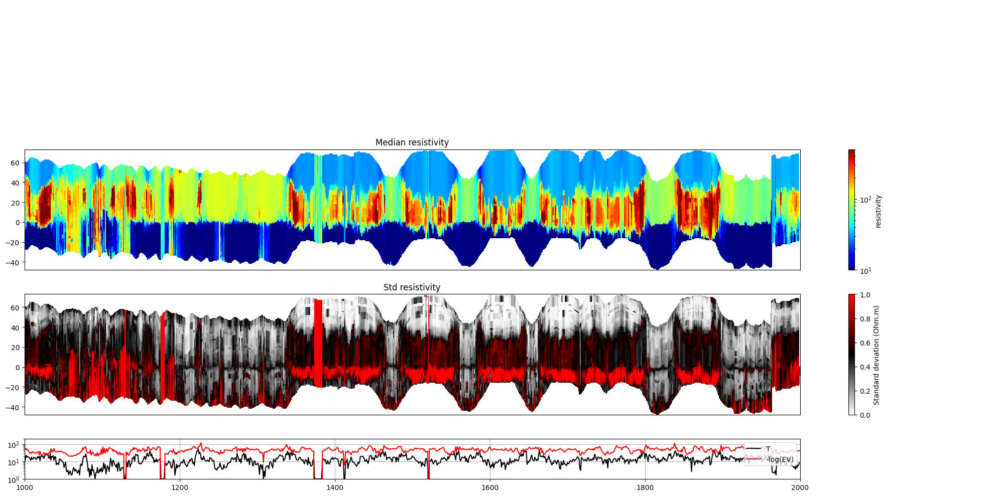

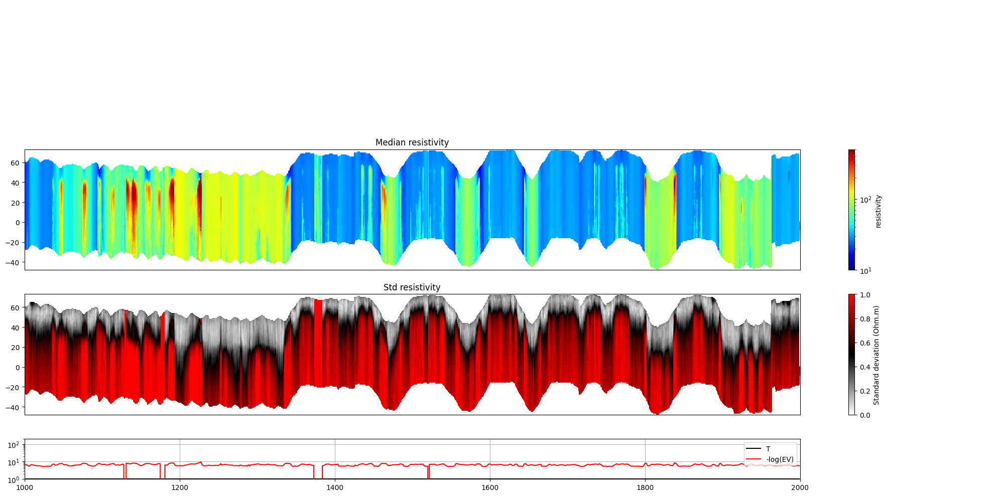

In [12]:
for f_post_h5 in f_post_arr:
    # % Plot Profiles
    ig.plot_profile(f_post_h5, i1=1000, i2=2000, im=1, hardcopy=hardcopy)

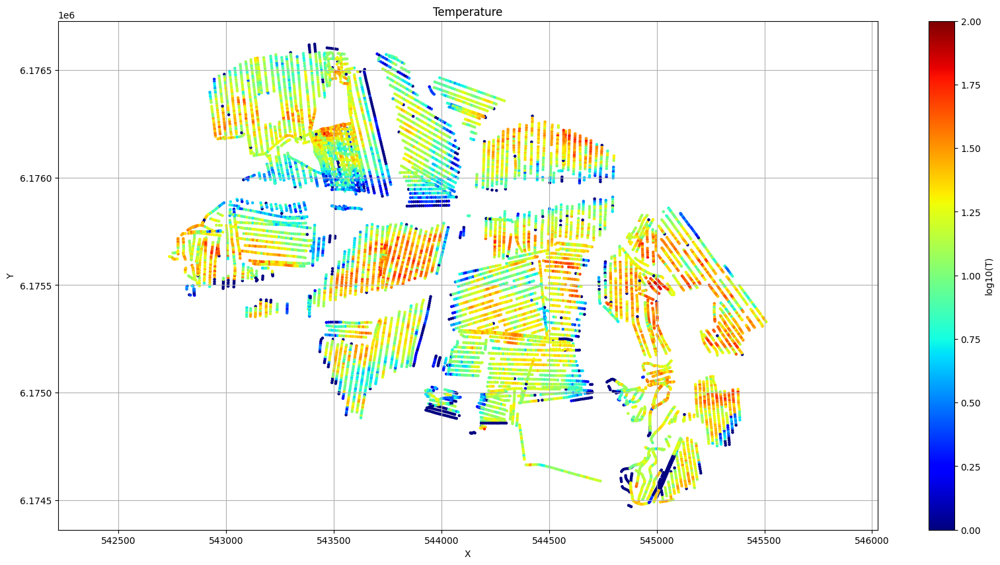

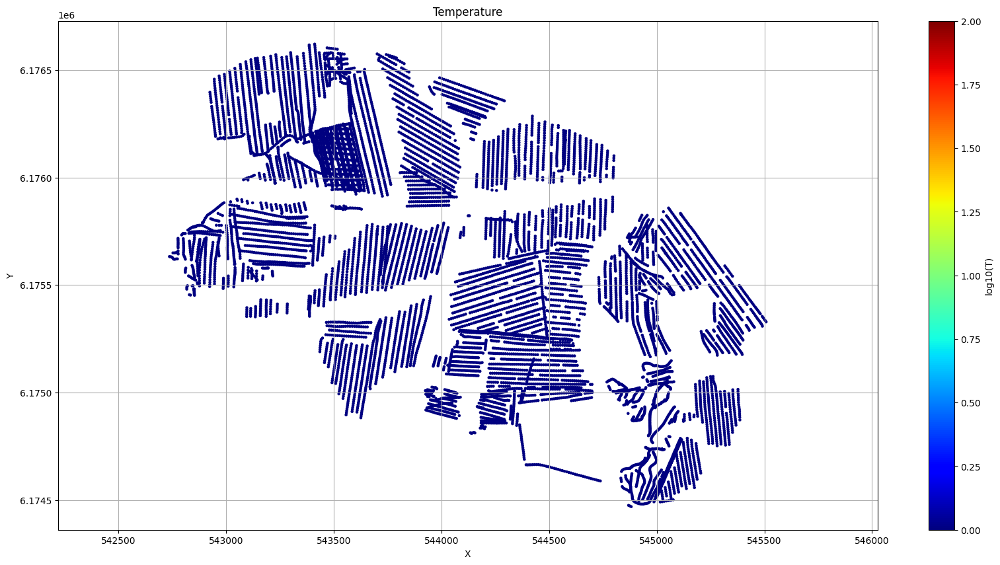

In [13]:
for f_post_h5 in f_post_arr:
    ig.plot_T_EV(f_post_h5, pl='T', hardcopy=hardcopy)
    plt.show()
    #ig.plot_T_EV(f_post_h5, pl='EV', hardcopy=hardcopy)

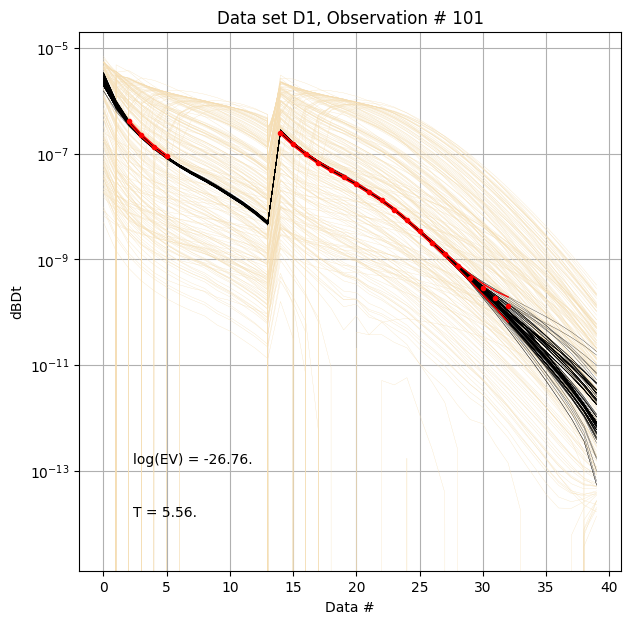

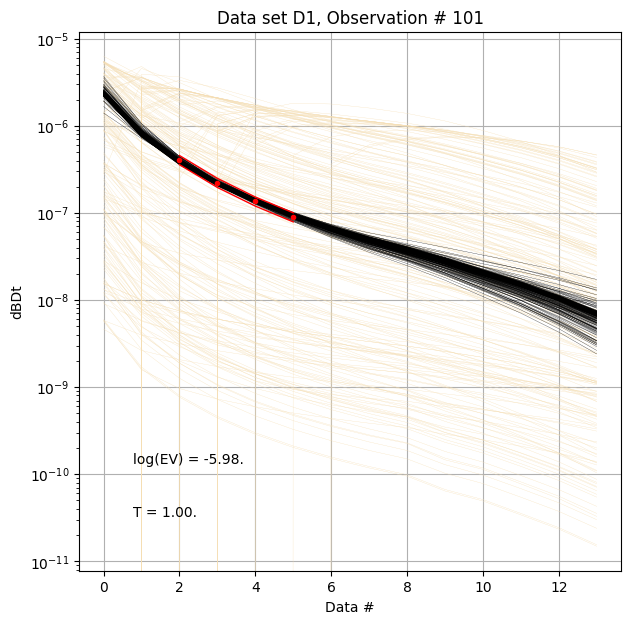

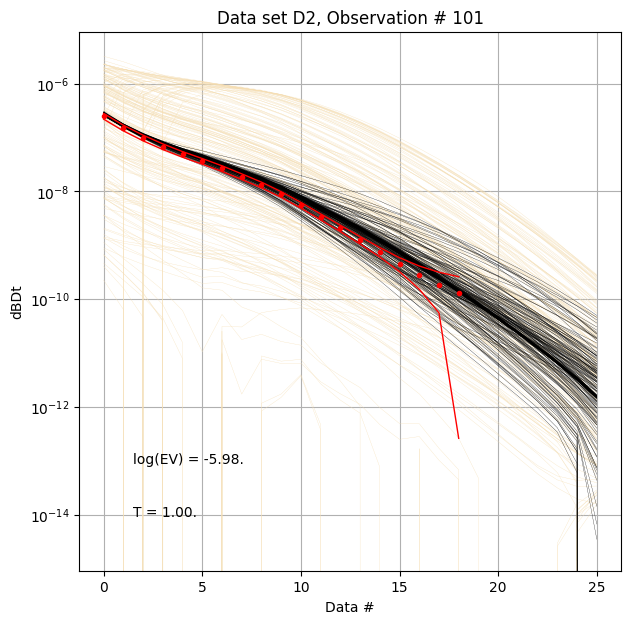

In [14]:
for f_post_h5 in f_post_arr:
    # % Plot prior, posterior, and observed  data
    ig.plot_data_prior_post(f_post_h5, i_plot=100, hardcopy=hardcopy)
    #ig.plot_data_prior_post(f_post_h5, i_plot=0, hardcopy=hardcopy)




Text(0, 0.5, 'N_UNIQUE')

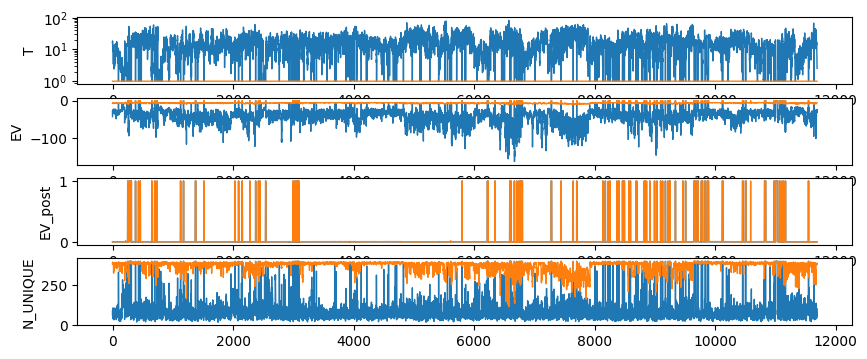

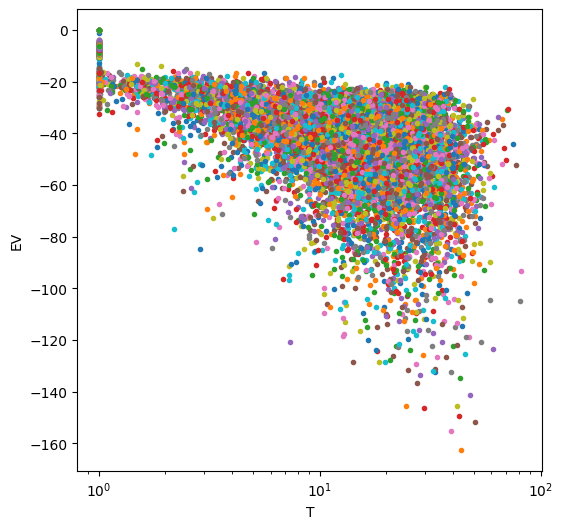

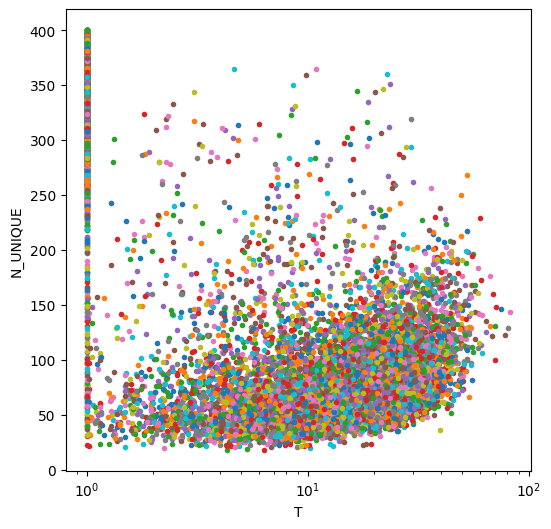

In [15]:
with h5py.File(f_data_h5, 'r') as f:    
    nobs = f['D1/d_obs'].shape[0]
    
ni=len(f_post_arr)

T = np.zeros((ni,nobs))
EV = np.zeros((ni,nobs))
EV_post = np.zeros((ni,nobs))
N_UNIQUE = np.zeros((ni,nobs))

i=-1
for f_post_h5 in f_post_arr:
    with h5py.File(f_post_h5, 'r') as f:
        i=i+1
        T[i] = f['/T'][:]
        EV[i] = f['/EV'][:]
        N_UNIQUE[i] = f['/N_UNIQUE'][:]
        EV_post[i] = f['/EV_post'][:]
    

fig, ax = plt.subplots(4,1,figsize=(10,4))
ax[0].semilogy(T.T,'-', linewidth=1)
ax[0].set_ylabel('T')
ax[1].plot(EV.T,'-', linewidth=1)
ax[1].set_ylabel('EV')
ax[2].plot(EV_post.T,'-', linewidth=1)
ax[2].set_ylabel('EV_post')
ax[3].plot(N_UNIQUE.T,'-', linewidth=1)
ax[3].set_ylabel('N_UNIQUE')

fig=plt.figure(figsize=(6,6))
plt.semilogx(T,EV,'.')
plt.xlabel('T')
plt.ylabel('EV')


fig=plt.figure(figsize=(6,6))
plt.semilogx(T,N_UNIQUE,'.')
plt.xlabel('T')
plt.ylabel('N_UNIQUE')



In [16]:
#ig.post_to_csv(f_post_h5)